## Bidirectional LSTM model na predikciu hodnot DST o 3 hodiny dopredu na zaklade 12-hodinoveho vstupneho okna z atributov DST a BZ_GSM

Subor: prediction_DST+3_12H.ipynb

Program: Hospodarska informatika

Vypracovala: Bc. Terezia Drengubiakova

Diplomova praca: Metody strojoveho ucenia pre vcasnu predikciu geomagnetickych burok

Veduci diplomovej prace: doc. Ing. Peter Butka, PhD.

Konzultanti: Ing. Viera Kresnakova, PhD., RNDr. Simon Mackovjak, PhD.

### Import knižníc

In [1]:
import pandas as pd
import numpy as np
import os
from tensorflow import keras
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Model
from keras.layers import Dense, Input, LSTM, Flatten, TimeDistributed, Bidirectional
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C
from sklearn.metrics import confusion_matrix, classification_report, matthews_corrcoef, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

2026-04-27 03:55:32.856681: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Načítanie dát, odstránenie na hodnôt, určenie predikovaného atribútu

In [2]:
# dĺžka vstupného okna a predikovaný čas
shift = 3
y_col = f"DST+{shift}"

n_input = 12
atr_count = 2

In [3]:
file_path = "../../../0_datasety/test_omni.csv"
file_path2 = "../../../0_datasety/train_omni.csv"

train = pd.read_csv(file_path2)
test = pd.read_csv(file_path)

In [4]:
features = ['time1', 'DST', 'bz_gsm', y_col]
test = test[features]
train = train[features]
train['time1']=pd.to_datetime(train['time1'])
test['time1']=pd.to_datetime(test['time1'])
predicators = ["DST", "bz_gsm"]

valid_size = int(len(train) * 0.2)
valid = train.iloc[-valid_size:,:].copy()
train = train.iloc[:-valid_size,:].copy()

y_train_raw = train[y_col].values.copy()
X_train_raw = train[predicators].values.copy()
y_val_raw = valid[y_col].values.copy()
X_val_raw = valid[predicators].values.copy()
y_test_raw = test[y_col].values.copy()
X_test_raw = test[predicators].values.copy()

x_scaler = StandardScaler()
y_scaler = StandardScaler()

X_train = x_scaler.fit_transform(np.asarray(X_train_raw, dtype=np.float32).reshape(len(X_train_raw), -1))
X_val = x_scaler.transform(np.asarray(X_val_raw, dtype=np.float32).reshape(len(X_val_raw), -1))
X_test = x_scaler.transform(np.asarray(X_test_raw, dtype=np.float32).reshape(len(X_test_raw), -1))

y_train = y_scaler.fit_transform(np.asarray(y_train_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_val = y_scaler.transform(np.asarray(y_val_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_test = y_scaler.transform(np.asarray(y_test_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)

target_scale = float(y_scaler.scale_[0])

def inverse_target(values):
    values = np.asarray(values, dtype=np.float32)
    return y_scaler.inverse_transform(values.reshape(-1, 1)).reshape(values.shape)

### Definícia premenných a vytvorenie dátových generátorov

In [5]:
b_size = 256  

train_generator = TimeseriesGenerator(X_train, y_train, length=n_input, batch_size=b_size)
val_generator = TimeseriesGenerator(X_val, y_val, length=n_input, batch_size=b_size)
test_generator = TimeseriesGenerator(X_test, y_test, length=n_input, batch_size=256)

In [6]:
print("Počet batchov: ", len(train_generator))
print("Každý batch má features (X zložku) a labels (y zložku): ", len(train_generator[0]))
print("Dĺžka X zložky batchu: ", len(train_generator[0][0]))
print("Dĺžka y zložky batchu (počet meraní v batchi): ",len(train_generator[0][1]))
print("Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu): ", len(train_generator[0][0][0]))

Počet batchov:  896
Každý batch má features (X zložku) a labels (y zložku):  2
Dĺžka X zložky batchu:  256
Dĺžka y zložky batchu (počet meraní v batchi):  256
Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu):  12


### Vytvorenie modelu

In [7]:
inputs = Input(shape=(n_input,atr_count))
c = Bidirectional(LSTM(128, return_sequences=True, dropout=0.1,recurrent_dropout=0.1))(inputs)
c = LSTM(128, return_sequences=True)(c)
c = TimeDistributed(Dense(1, activation='linear'))(c)
output = Flatten()(c)
output = Dense(1, activation='linear')(output)
model = Model(inputs=inputs, outputs=output)
model.compile(loss='mse', optimizer='adam', metrics=["mae"])
print(model.summary())

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 12, 2)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional (Bidirectional)        │ (None, 12, 256)             │         134,144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 12, 128)             │         197,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed (TimeDistributed)   │ (None, 12, 1)               │             129 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 12)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              13 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 331,406 (1.26 MB)

 Trainable params: 331,406 (1.26 MB)

 Non-trainable params: 0 (0.00 B)

None


In [8]:
os.makedirs("models", exist_ok=True)
model_path = os.path.join("models", f'{y_col}_{n_input}H_BZ.keras')
checkpoint = ModelCheckpoint(model_path, monitor='val_mae', verbose=1, save_best_only=True, mode='min')
early = EarlyStopping(monitor="val_mae", mode="min", patience=25)
callbacks_list = [checkpoint, early]

### Trénovanie

In [9]:
#uncomment to train new model
history = model.fit(train_generator, validation_data=val_generator, epochs=200, verbose=1, callbacks = callbacks_list)

Epoch 1/200


/opt/conda/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:34:35 6s/step - loss: 0.6179 - mae: 0.6521

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 89ms/step - loss: 1.0275 - mae: 0.7070 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 1.0621 - mae: 0.6983

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 80ms/step - loss: 1.0267 - mae: 0.6790

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 78ms/step - loss: 0.9860 - mae: 0.6615

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 78ms/step - loss: 0.9440 - mae: 0.6449

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.9026 - mae: 0.6279

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.8649 - mae: 0.6125

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.8293 - mae: 0.5970

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.7965 - mae: 0.5827

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.7686 - mae: 0.5707

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.7438 - mae: 0.5602

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.7224 - mae: 0.5514

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.7034 - mae: 0.5441

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.6857 - mae: 0.5369

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.6692 - mae: 0.5304

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.6537 - mae: 0.5242

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.6438 - mae: 0.5196

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.6375 - mae: 0.5168

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.6308 - mae: 0.5138

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.6252 - mae: 0.5112

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.6316 - mae: 0.5106

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.6363 - mae: 0.5096

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.6402 - mae: 0.5087

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.6443 - mae: 0.5083

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.6473 - mae: 0.5078

 27/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.6498 - mae: 0.5072 

 28/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.6519 - mae: 0.5068

 29/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.6535 - mae: 0.5062

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.6544 - mae: 0.5056

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.6549 - mae: 0.5049

 32/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.6548 - mae: 0.5041

 33/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.6543 - mae: 0.5031

 34/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.6534 - mae: 0.5020

 35/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.6524 - mae: 0.5012

 36/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.6516 - mae: 0.5006

 37/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.6530 - mae: 0.5006

 38/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.6541 - mae: 0.5006

 39/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.6547 - mae: 0.5005

 40/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.6551 - mae: 0.5003

 41/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.6552 - mae: 0.5000

 42/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.6549 - mae: 0.4996

 43/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.6546 - mae: 0.4993

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.6541 - mae: 0.4988

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.6533 - mae: 0.4984

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.6524 - mae: 0.4979

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.6514 - mae: 0.4973

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.6503 - mae: 0.4967

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.6492 - mae: 0.4962

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.6479 - mae: 0.4956

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.6465 - mae: 0.4950

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.6450 - mae: 0.4943

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.6435 - mae: 0.4936

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.6418 - mae: 0.4929

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.6401 - mae: 0.4921

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.6383 - mae: 0.4913

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.6365 - mae: 0.4905

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.6348 - mae: 0.4897

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.6331 - mae: 0.4889

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.6313 - mae: 0.4881

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.6295 - mae: 0.4874

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.6277 - mae: 0.4866

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.6259 - mae: 0.4858

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.6240 - mae: 0.4850

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.6221 - mae: 0.4842

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.6203 - mae: 0.4834

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.6184 - mae: 0.4826

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.6165 - mae: 0.4818

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.6147 - mae: 0.4811

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.6129 - mae: 0.4804

 71/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.6112 - mae: 0.4797

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.6095 - mae: 0.4790

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.6077 - mae: 0.4783

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.6060 - mae: 0.4776

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.6044 - mae: 0.4770

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.6028 - mae: 0.4764

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.6012 - mae: 0.4758

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.5997 - mae: 0.4751

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.5981 - mae: 0.4746

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.5966 - mae: 0.4740

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.5950 - mae: 0.4734

 82/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.5935 - mae: 0.4728

 83/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.5919 - mae: 0.4723

 84/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.5904 - mae: 0.4717

 85/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.5890 - mae: 0.4712

 86/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.5877 - mae: 0.4707

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.5863 - mae: 0.4702

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.5849 - mae: 0.4697

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.5835 - mae: 0.4692

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.5821 - mae: 0.4687

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.5807 - mae: 0.4682

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.5793 - mae: 0.4677

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.5779 - mae: 0.4671

 94/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.5765 - mae: 0.4666

 95/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.5752 - mae: 0.4661

 96/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.5738 - mae: 0.4656

 97/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.5724 - mae: 0.4651

 98/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.5711 - mae: 0.4647

 99/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.5698 - mae: 0.4642

100/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.5685 - mae: 0.4637

101/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.5672 - mae: 0.4633

102/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.5660 - mae: 0.4628

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.5648 - mae: 0.4624

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.5635 - mae: 0.4620

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.5624 - mae: 0.4616

106/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.5612 - mae: 0.4612

107/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.5600 - mae: 0.4607

108/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.5588 - mae: 0.4603

109/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.5576 - mae: 0.4599

110/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.5564 - mae: 0.4595

111/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.5552 - mae: 0.4591

112/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.5540 - mae: 0.4586

113/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.5529 - mae: 0.4582

114/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.5517 - mae: 0.4578

115/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.5506 - mae: 0.4574

116/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.5494 - mae: 0.4570

117/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.5483 - mae: 0.4567

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.5472 - mae: 0.4563

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.5461 - mae: 0.4559

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.5450 - mae: 0.4555

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.5439 - mae: 0.4551

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.5428 - mae: 0.4547

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.5417 - mae: 0.4544

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.5406 - mae: 0.4540

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.5395 - mae: 0.4536

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.5385 - mae: 0.4532

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.5374 - mae: 0.4529

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.5363 - mae: 0.4525

129/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.5353 - mae: 0.4521

130/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.5342 - mae: 0.4518

131/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.5332 - mae: 0.4514

132/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.5322 - mae: 0.4511

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.5312 - mae: 0.4507

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.5302 - mae: 0.4504

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.5293 - mae: 0.4500

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.5283 - mae: 0.4497

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.5273 - mae: 0.4493

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.5263 - mae: 0.4490

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.5253 - mae: 0.4487

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.5244 - mae: 0.4483

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.5234 - mae: 0.4480

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.5225 - mae: 0.4476

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.5215 - mae: 0.4473

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.5206 - mae: 0.4470

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.5196 - mae: 0.4466

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.5187 - mae: 0.4463

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.5178 - mae: 0.4460

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.5169 - mae: 0.4456

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.5159 - mae: 0.4453

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.5150 - mae: 0.4450

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.5141 - mae: 0.4447

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.5132 - mae: 0.4444

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.5123 - mae: 0.4440

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.5114 - mae: 0.4437

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.5106 - mae: 0.4434

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.5098 - mae: 0.4432

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.5090 - mae: 0.4429

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.5082 - mae: 0.4426

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.5074 - mae: 0.4423

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.5066 - mae: 0.4420

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.5058 - mae: 0.4418

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.5050 - mae: 0.4415

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.5042 - mae: 0.4412

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.5035 - mae: 0.4409

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.5027 - mae: 0.4407

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.5019 - mae: 0.4404

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.5011 - mae: 0.4401

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.5004 - mae: 0.4398

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.4996 - mae: 0.4396

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.4988 - mae: 0.4393

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.4981 - mae: 0.4390

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.4973 - mae: 0.4388

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.4966 - mae: 0.4385

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.4958 - mae: 0.4383

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.4951 - mae: 0.4380

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.4943 - mae: 0.4377

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.4936 - mae: 0.4375

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.4929 - mae: 0.4372

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.4922 - mae: 0.4370

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.4915 - mae: 0.4367

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.4908 - mae: 0.4365

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.4901 - mae: 0.4362

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.4894 - mae: 0.4360

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.4887 - mae: 0.4357

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.4881 - mae: 0.4355

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4874 - mae: 0.4352

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4867 - mae: 0.4350

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4860 - mae: 0.4347

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4854 - mae: 0.4345

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4847 - mae: 0.4342

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4840 - mae: 0.4340

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4834 - mae: 0.4337

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4827 - mae: 0.4335

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4821 - mae: 0.4333

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4814 - mae: 0.4330

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4808 - mae: 0.4328

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4801 - mae: 0.4325

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4796 - mae: 0.4323

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4790 - mae: 0.4321

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4784 - mae: 0.4319

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4779 - mae: 0.4316

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4773 - mae: 0.4314

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4767 - mae: 0.4312

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4762 - mae: 0.4310

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4756 - mae: 0.4308

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4751 - mae: 0.4306

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4745 - mae: 0.4304

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4740 - mae: 0.4301

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4735 - mae: 0.4299

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4729 - mae: 0.4297

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4724 - mae: 0.4295

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4718 - mae: 0.4293

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4713 - mae: 0.4291

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4708 - mae: 0.4289

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4702 - mae: 0.4287

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4697 - mae: 0.4285

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4692 - mae: 0.4283

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4686 - mae: 0.4281

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.4681 - mae: 0.4279

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.4676 - mae: 0.4277

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.4671 - mae: 0.4274

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.4665 - mae: 0.4272

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.4660 - mae: 0.4270

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.4655 - mae: 0.4268

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.4650 - mae: 0.4266

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.4645 - mae: 0.4264

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.4640 - mae: 0.4262

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.4635 - mae: 0.4260

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.4630 - mae: 0.4258

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.4625 - mae: 0.4257

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.4620 - mae: 0.4255

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.4615 - mae: 0.4253

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.4611 - mae: 0.4251

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.4606 - mae: 0.4249

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.4601 - mae: 0.4247

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.4596 - mae: 0.4245

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.4592 - mae: 0.4243

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.4587 - mae: 0.4241

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.4582 - mae: 0.4239

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.4578 - mae: 0.4238

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.4573 - mae: 0.4236

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.4568 - mae: 0.4234

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.4564 - mae: 0.4232

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.4559 - mae: 0.4230

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.4555 - mae: 0.4229

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.4550 - mae: 0.4227

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.4546 - mae: 0.4225

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.4541 - mae: 0.4223

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.4536 - mae: 0.4222

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.4532 - mae: 0.4220

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.4527 - mae: 0.4218

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.4523 - mae: 0.4216

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.4519 - mae: 0.4214

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.4514 - mae: 0.4213

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.4510 - mae: 0.4211

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.4505 - mae: 0.4209

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.4501 - mae: 0.4207

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.4496 - mae: 0.4206

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.4492 - mae: 0.4204

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.4488 - mae: 0.4202

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.4483 - mae: 0.4201

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.4479 - mae: 0.4199

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.4475 - mae: 0.4197

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.4471 - mae: 0.4196

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.4467 - mae: 0.4194

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.4462 - mae: 0.4192

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.4458 - mae: 0.4191

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.4454 - mae: 0.4189

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.4450 - mae: 0.4188

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.4446 - mae: 0.4186

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.4442 - mae: 0.4184

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.4438 - mae: 0.4183

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.4435 - mae: 0.4181

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.4431 - mae: 0.4180

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.4427 - mae: 0.4178

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.4423 - mae: 0.4177

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.4419 - mae: 0.4175

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.4416 - mae: 0.4174

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.4412 - mae: 0.4172

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.4408 - mae: 0.4171

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.4405 - mae: 0.4170

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.4401 - mae: 0.4168

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.4397 - mae: 0.4167

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.4394 - mae: 0.4165

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.4390 - mae: 0.4164

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.4387 - mae: 0.4163

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.4383 - mae: 0.4161

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.4379 - mae: 0.4160

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.4376 - mae: 0.4158

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.4372 - mae: 0.4157

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.4369 - mae: 0.4156

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.4365 - mae: 0.4154

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.4362 - mae: 0.4153

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.4359 - mae: 0.4152

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.4355 - mae: 0.4150

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.4352 - mae: 0.4149

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.4349 - mae: 0.4148

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.4345 - mae: 0.4146

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.4342 - mae: 0.4145

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.4339 - mae: 0.4144

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.4336 - mae: 0.4142

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.4332 - mae: 0.4141

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.4329 - mae: 0.4140

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.4326 - mae: 0.4139

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.4323 - mae: 0.4137

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.4319 - mae: 0.4136

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.4316 - mae: 0.4135

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.4313 - mae: 0.4134

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.4310 - mae: 0.4132

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.4307 - mae: 0.4131

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.4304 - mae: 0.4130

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.4300 - mae: 0.4129

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.4297 - mae: 0.4127

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.4294 - mae: 0.4126

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.4291 - mae: 0.4125

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.4288 - mae: 0.4124

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.4285 - mae: 0.4123

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.4282 - mae: 0.4121

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.4279 - mae: 0.4120

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.4276 - mae: 0.4119

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.4273 - mae: 0.4118

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.4270 - mae: 0.4117

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.4267 - mae: 0.4116

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.4264 - mae: 0.4115

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.4261 - mae: 0.4113

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.4259 - mae: 0.4112

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.4256 - mae: 0.4111

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.4253 - mae: 0.4110

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.4250 - mae: 0.4109

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.4247 - mae: 0.4108

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.4244 - mae: 0.4107

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.4242 - mae: 0.4106

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.4239 - mae: 0.4104

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.4236 - mae: 0.4103

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.4233 - mae: 0.4102

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.4230 - mae: 0.4101

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.4227 - mae: 0.4100

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.4225 - mae: 0.4099

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.4222 - mae: 0.4098

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.4219 - mae: 0.4097

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.4216 - mae: 0.4095

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.4213 - mae: 0.4094

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.4211 - mae: 0.4093

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.4208 - mae: 0.4092

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.4205 - mae: 0.4091

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.4202 - mae: 0.4090

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.4200 - mae: 0.4089

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.4197 - mae: 0.4088

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.4194 - mae: 0.4087

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.4191 - mae: 0.4086

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.4189 - mae: 0.4085

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.4186 - mae: 0.4084

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.4183 - mae: 0.4082

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.4181 - mae: 0.4081

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.4178 - mae: 0.4080

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.4175 - mae: 0.4079

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.4173 - mae: 0.4078

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.4170 - mae: 0.4077

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.4167 - mae: 0.4076

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.4164 - mae: 0.4075

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.4162 - mae: 0.4074

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.4159 - mae: 0.4073

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.4156 - mae: 0.4072

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.4154 - mae: 0.4071

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.4151 - mae: 0.4070

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.4148 - mae: 0.4069

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.4146 - mae: 0.4067

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.4143 - mae: 0.4066

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.4140 - mae: 0.4065

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.4138 - mae: 0.4064

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.4135 - mae: 0.4063

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.4133 - mae: 0.4062

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.4130 - mae: 0.4061

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.4127 - mae: 0.4060

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.4125 - mae: 0.4059

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.4122 - mae: 0.4058

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.4120 - mae: 0.4057

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.4117 - mae: 0.4056

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.4114 - mae: 0.4055

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.4112 - mae: 0.4054

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.4109 - mae: 0.4053

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.4107 - mae: 0.4052

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.4104 - mae: 0.4051

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.4102 - mae: 0.4050

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.4099 - mae: 0.4049

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.4097 - mae: 0.4048

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.4094 - mae: 0.4047

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.4092 - mae: 0.4046

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.4089 - mae: 0.4045

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.4087 - mae: 0.4044

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.4084 - mae: 0.4043

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.4082 - mae: 0.4042

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.4079 - mae: 0.4041

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.4077 - mae: 0.4040

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.4074 - mae: 0.4039

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.4072 - mae: 0.4038

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.4069 - mae: 0.4037

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.4067 - mae: 0.4036

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.4065 - mae: 0.4035

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.4062 - mae: 0.4034

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.4060 - mae: 0.4033

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.4058 - mae: 0.4032

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.4055 - mae: 0.4031

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.4053 - mae: 0.4030

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.4051 - mae: 0.4029

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.4048 - mae: 0.4028

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.4046 - mae: 0.4027

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.4044 - mae: 0.4026

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.4041 - mae: 0.4025

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.4039 - mae: 0.4024

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.4037 - mae: 0.4023

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.4034 - mae: 0.4023

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.4032 - mae: 0.4022

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.4030 - mae: 0.4021

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.4028 - mae: 0.4020

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.4025 - mae: 0.4019

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.4023 - mae: 0.4018

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.4021 - mae: 0.4017

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.4018 - mae: 0.4016

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.4016 - mae: 0.4015

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.4014 - mae: 0.4014

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.4012 - mae: 0.4013

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.4009 - mae: 0.4012

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.4007 - mae: 0.4011

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.4005 - mae: 0.4010

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.4003 - mae: 0.4010

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.4000 - mae: 0.4009

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3998 - mae: 0.4008

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3996 - mae: 0.4007

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3994 - mae: 0.4006

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3992 - mae: 0.4005

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3989 - mae: 0.4004

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3987 - mae: 0.4003

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3985 - mae: 0.4002

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3983 - mae: 0.4002

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3981 - mae: 0.4001

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3979 - mae: 0.4000

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3977 - mae: 0.3999

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3974 - mae: 0.3998

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3972 - mae: 0.3997

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3970 - mae: 0.3996

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3968 - mae: 0.3995

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3966 - mae: 0.3995

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3964 - mae: 0.3994

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3962 - mae: 0.3993

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3960 - mae: 0.3992

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3957 - mae: 0.3991

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3955 - mae: 0.3990

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3953 - mae: 0.3989

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3951 - mae: 0.3988

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3949 - mae: 0.3988

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3947 - mae: 0.3987

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3945 - mae: 0.3986

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3943 - mae: 0.3985

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3941 - mae: 0.3984

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3938 - mae: 0.3983

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3936 - mae: 0.3982

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3935 - mae: 0.3982

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3933 - mae: 0.3981

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3931 - mae: 0.3980

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3929 - mae: 0.3979

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3927 - mae: 0.3978

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3925 - mae: 0.3978

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3923 - mae: 0.3977

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3921 - mae: 0.3976

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3919 - mae: 0.3975

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3917 - mae: 0.3974

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3916 - mae: 0.3974

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3914 - mae: 0.3973

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3912 - mae: 0.3972

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3910 - mae: 0.3971

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3909 - mae: 0.3971

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3907 - mae: 0.3970

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3905 - mae: 0.3969

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3904 - mae: 0.3969

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3902 - mae: 0.3968

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3900 - mae: 0.3967

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3899 - mae: 0.3967

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3897 - mae: 0.3966

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3896 - mae: 0.3965

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3894 - mae: 0.3965

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3892 - mae: 0.3964

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3891 - mae: 0.3963

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3889 - mae: 0.3963

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3888 - mae: 0.3962

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3886 - mae: 0.3961

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3884 - mae: 0.3961

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3883 - mae: 0.3960

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3881 - mae: 0.3959

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3880 - mae: 0.3959

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3878 - mae: 0.3958

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3877 - mae: 0.3957

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3875 - mae: 0.3957

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3874 - mae: 0.3956

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3872 - mae: 0.3955

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3871 - mae: 0.3955

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3869 - mae: 0.3954

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3868 - mae: 0.3954

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3866 - mae: 0.3953

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3865 - mae: 0.3952

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3863 - mae: 0.3952

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3862 - mae: 0.3951

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3860 - mae: 0.3950

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3859 - mae: 0.3950

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3857 - mae: 0.3949

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3856 - mae: 0.3949

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3854 - mae: 0.3948

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3853 - mae: 0.3947

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3851 - mae: 0.3947

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3850 - mae: 0.3946

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3848 - mae: 0.3946

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3847 - mae: 0.3945

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3846 - mae: 0.3944

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3844 - mae: 0.3944

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3843 - mae: 0.3943

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3842 - mae: 0.3943

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3840 - mae: 0.3942

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3839 - mae: 0.3941

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3838 - mae: 0.3941

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3836 - mae: 0.3940

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3835 - mae: 0.3940

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3834 - mae: 0.3939

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3832 - mae: 0.3939

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3831 - mae: 0.3938

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3830 - mae: 0.3937

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3828 - mae: 0.3937

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3827 - mae: 0.3936

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3826 - mae: 0.3936

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3825 - mae: 0.3935

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3823 - mae: 0.3935

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3822 - mae: 0.3934

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3821 - mae: 0.3933

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3819 - mae: 0.3933

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3818 - mae: 0.3932

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3817 - mae: 0.3932

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3816 - mae: 0.3931

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3814 - mae: 0.3931

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3813 - mae: 0.3930

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3812 - mae: 0.3930

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3811 - mae: 0.3929

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3809 - mae: 0.3929

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3808 - mae: 0.3928

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3807 - mae: 0.3927

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3806 - mae: 0.3927

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3805 - mae: 0.3926

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3803 - mae: 0.3926

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3802 - mae: 0.3925

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3801 - mae: 0.3925

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3800 - mae: 0.3924

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3799 - mae: 0.3924

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3798 - mae: 0.3923

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3797 - mae: 0.3923

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3796 - mae: 0.3922

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3795 - mae: 0.3922

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3794 - mae: 0.3921

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3792 - mae: 0.3921

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3791 - mae: 0.3920

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3790 - mae: 0.3920

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3789 - mae: 0.3919

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3788 - mae: 0.3919

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3787 - mae: 0.3918

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3786 - mae: 0.3918

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3785 - mae: 0.3917

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3784 - mae: 0.3917

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3783 - mae: 0.3916

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3782 - mae: 0.3916

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3781 - mae: 0.3915

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3780 - mae: 0.3915

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3778 - mae: 0.3914

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3777 - mae: 0.3914

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3776 - mae: 0.3913

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3775 - mae: 0.3913

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3774 - mae: 0.3912

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3773 - mae: 0.3912

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3772 - mae: 0.3911

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3771 - mae: 0.3911

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3770 - mae: 0.3910

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3769 - mae: 0.3910

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3768 - mae: 0.3909

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3767 - mae: 0.3909

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3766 - mae: 0.3908

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3764 - mae: 0.3908

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3763 - mae: 0.3907

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3762 - mae: 0.3907

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3761 - mae: 0.3906

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3760 - mae: 0.3906

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3759 - mae: 0.3905

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3758 - mae: 0.3905

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3757 - mae: 0.3904

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3756 - mae: 0.3904

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3755 - mae: 0.3903

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3754 - mae: 0.3903

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3753 - mae: 0.3902

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3751 - mae: 0.3902

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3750 - mae: 0.3901

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3749 - mae: 0.3901

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3748 - mae: 0.3900

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3747 - mae: 0.3900

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3746 - mae: 0.3899

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3745 - mae: 0.3899

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3744 - mae: 0.3898

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3743 - mae: 0.3898

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3742 - mae: 0.3897

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3741 - mae: 0.3897

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3740 - mae: 0.3896

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3739 - mae: 0.3896

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3737 - mae: 0.3895

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3736 - mae: 0.3895

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3735 - mae: 0.3894

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3734 - mae: 0.3894

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3733 - mae: 0.3893

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3732 - mae: 0.3893

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3731 - mae: 0.3892

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3730 - mae: 0.3892

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3729 - mae: 0.3891

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3728 - mae: 0.3891

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3727 - mae: 0.3890

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3726 - mae: 0.3890

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3725 - mae: 0.3889

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3724 - mae: 0.3889

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3723 - mae: 0.3888

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3721 - mae: 0.3888

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3720 - mae: 0.3887

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3719 - mae: 0.3887

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3718 - mae: 0.3886

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3717 - mae: 0.3886

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3716 - mae: 0.3885

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3715 - mae: 0.3885

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3714 - mae: 0.3884

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3713 - mae: 0.3884

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3712 - mae: 0.3883

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3711 - mae: 0.3883

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3710 - mae: 0.3882

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3709 - mae: 0.3882

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3708 - mae: 0.3881

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3707 - mae: 0.3881

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3706 - mae: 0.3880

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3705 - mae: 0.3880

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3704 - mae: 0.3879

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3703 - mae: 0.3879

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3702 - mae: 0.3878

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3701 - mae: 0.3878

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3700 - mae: 0.3878

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3698 - mae: 0.3877

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3697 - mae: 0.3877

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3696 - mae: 0.3876

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3695 - mae: 0.3876

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3694 - mae: 0.3875

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3693 - mae: 0.3875

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3692 - mae: 0.3874

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3691 - mae: 0.3874

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3690 - mae: 0.3873

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3689 - mae: 0.3873

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3688 - mae: 0.3872

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3687 - mae: 0.3872

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3686 - mae: 0.3871

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3685 - mae: 0.3871

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3684 - mae: 0.3870

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3683 - mae: 0.3870

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3682 - mae: 0.3869

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3681 - mae: 0.3869

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3680 - mae: 0.3868

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3679 - mae: 0.3868

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3678 - mae: 0.3867

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3677 - mae: 0.3867

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3676 - mae: 0.3866

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3675 - mae: 0.3866

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3674 - mae: 0.3866

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3673 - mae: 0.3865

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3672 - mae: 0.3865

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3671 - mae: 0.3864

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3670 - mae: 0.3864

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3669 - mae: 0.3863

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3669 - mae: 0.3863

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3668 - mae: 0.3862

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3667 - mae: 0.3862

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3666 - mae: 0.3862

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3665 - mae: 0.3861

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3664 - mae: 0.3861

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3663 - mae: 0.3860

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3662 - mae: 0.3860

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3661 - mae: 0.3859

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3661 - mae: 0.3859

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3660 - mae: 0.3859

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3659 - mae: 0.3858

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3658 - mae: 0.3858

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3657 - mae: 0.3857

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3656 - mae: 0.3857

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3655 - mae: 0.3856

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3655 - mae: 0.3856

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3654 - mae: 0.3856

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3653 - mae: 0.3855

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3652 - mae: 0.3855

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3651 - mae: 0.3854

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3650 - mae: 0.3854

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3649 - mae: 0.3854

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3649 - mae: 0.3853

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3648 - mae: 0.3853

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3647 - mae: 0.3852

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3646 - mae: 0.3852

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3645 - mae: 0.3852

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3644 - mae: 0.3851

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3644 - mae: 0.3851

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3643 - mae: 0.3850

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3642 - mae: 0.3850

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3641 - mae: 0.3850

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3640 - mae: 0.3849

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3639 - mae: 0.3849

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3638 - mae: 0.3848

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3638 - mae: 0.3848

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3637 - mae: 0.3848

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3636 - mae: 0.3847

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3635 - mae: 0.3847

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3634 - mae: 0.3846

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3633 - mae: 0.3846

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3633 - mae: 0.3846

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3632 - mae: 0.3845

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3631 - mae: 0.3845

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3630 - mae: 0.3844

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3629 - mae: 0.3844

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3628 - mae: 0.3843

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3628 - mae: 0.3843

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3627 - mae: 0.3843

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3626 - mae: 0.3842

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3625 - mae: 0.3842

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3624 - mae: 0.3841

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3623 - mae: 0.3841

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3622 - mae: 0.3841

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3622 - mae: 0.3840

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3621 - mae: 0.3840

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3620 - mae: 0.3839

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3619 - mae: 0.3839

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3618 - mae: 0.3839

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3617 - mae: 0.3838

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3617 - mae: 0.3838

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3616 - mae: 0.3837

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3615 - mae: 0.3837

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3614 - mae: 0.3837

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3613 - mae: 0.3836

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3612 - mae: 0.3836

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3612 - mae: 0.3835

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3611 - mae: 0.3835

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3610 - mae: 0.3835

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3609 - mae: 0.3834

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3608 - mae: 0.3834

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3607 - mae: 0.3833

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3607 - mae: 0.3833

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3606 - mae: 0.3833 

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3605 - mae: 0.3832

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3604 - mae: 0.3832

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3603 - mae: 0.3831

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3603 - mae: 0.3831

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3602 - mae: 0.3831

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3601 - mae: 0.3830

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3600 - mae: 0.3830

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3599 - mae: 0.3829

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3598 - mae: 0.3829

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3598 - mae: 0.3829

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3597 - mae: 0.3828

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3596 - mae: 0.3828

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3595 - mae: 0.3828

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3594 - mae: 0.3827

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3594 - mae: 0.3827

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3593 - mae: 0.3826

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3592 - mae: 0.3826

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3591 - mae: 0.3826

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3590 - mae: 0.3825

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3590 - mae: 0.3825

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3589 - mae: 0.3824

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3588 - mae: 0.3824

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3587 - mae: 0.3824

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3586 - mae: 0.3823

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3586 - mae: 0.3823

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3585 - mae: 0.3822

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3584 - mae: 0.3822

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3583 - mae: 0.3822

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3582 - mae: 0.3821

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3582 - mae: 0.3821

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3581 - mae: 0.3820

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3580 - mae: 0.3820

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3579 - mae: 0.3820

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3578 - mae: 0.3819

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3578 - mae: 0.3819

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3577 - mae: 0.3818

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3576 - mae: 0.3818

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3575 - mae: 0.3818

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3574 - mae: 0.3817

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3574 - mae: 0.3817

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3573 - mae: 0.3817

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3572 - mae: 0.3816

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3571 - mae: 0.3816

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3571 - mae: 0.3815

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3570 - mae: 0.3815

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3569 - mae: 0.3815

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3568 - mae: 0.3814

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3567 - mae: 0.3814

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3567 - mae: 0.3813

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3566 - mae: 0.3813

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3565 - mae: 0.3813

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3564 - mae: 0.3812

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3564 - mae: 0.3812

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3563 - mae: 0.3812

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3562 - mae: 0.3811

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3561 - mae: 0.3811

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3560 - mae: 0.3810

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3560 - mae: 0.3810

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3559 - mae: 0.3810

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3558 - mae: 0.3809

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3557 - mae: 0.3809

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3557 - mae: 0.3809

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3556 - mae: 0.3808

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3555 - mae: 0.3808

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3554 - mae: 0.3807

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3553 - mae: 0.3807

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3553 - mae: 0.3807

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3552 - mae: 0.3806

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3551 - mae: 0.3806

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3550 - mae: 0.3805

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3550 - mae: 0.3805

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3549 - mae: 0.3805

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3548 - mae: 0.3804

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3547 - mae: 0.3804

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3547 - mae: 0.3804

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3546 - mae: 0.3803

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3545 - mae: 0.3803

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3544 - mae: 0.3802

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3544 - mae: 0.3802

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3543 - mae: 0.3802

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3542 - mae: 0.3801

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3541 - mae: 0.3801

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3541 - mae: 0.3801

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3540 - mae: 0.3800

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3539 - mae: 0.3800

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3538 - mae: 0.3799

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3537 - mae: 0.3799

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3537 - mae: 0.3799

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3536 - mae: 0.3798

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3535 - mae: 0.3798

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3534 - mae: 0.3798

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3534 - mae: 0.3797

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3533 - mae: 0.3797

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3532 - mae: 0.3796

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3531 - mae: 0.3796

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3531 - mae: 0.3796

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3530 - mae: 0.3795

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3529 - mae: 0.3795

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3529 - mae: 0.3795

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3528 - mae: 0.3794

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3527 - mae: 0.3794

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3526 - mae: 0.3793

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3526 - mae: 0.3793

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3525 - mae: 0.3793

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3524 - mae: 0.3792

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3523 - mae: 0.3792

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3523 - mae: 0.3792

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3522 - mae: 0.3791

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3521 - mae: 0.3791

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3520 - mae: 0.3791

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3520 - mae: 0.3790

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3519 - mae: 0.3790

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3518 - mae: 0.3789

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3518 - mae: 0.3789

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3517 - mae: 0.3789

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3516 - mae: 0.3788

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3515 - mae: 0.3788

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3515 - mae: 0.3788

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3514 - mae: 0.3787

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3513 - mae: 0.3787

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3512 - mae: 0.3786

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3512 - mae: 0.3786

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3511 - mae: 0.3786

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3510 - mae: 0.3785

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3509 - mae: 0.3785

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3509 - mae: 0.3785

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3508 - mae: 0.3784

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3507 - mae: 0.3784

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3507 - mae: 0.3784

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3506 - mae: 0.3783

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3505 - mae: 0.3783

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3504 - mae: 0.3782

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3504 - mae: 0.3782

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3503 - mae: 0.3782

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3502 - mae: 0.3781

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3501 - mae: 0.3781

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3501 - mae: 0.3781

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3500 - mae: 0.3780

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3499 - mae: 0.3780

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3499 - mae: 0.3780

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3498 - mae: 0.3779

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3497 - mae: 0.3779

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3496 - mae: 0.3778

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3496 - mae: 0.3778

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3495 - mae: 0.3778

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3494 - mae: 0.3777

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3494 - mae: 0.3777

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3493 - mae: 0.3777


Epoch 1: val_mae improved from inf to 0.34578, saving model to models/DST+3_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 74s 75ms/step - loss: 0.3492 - mae: 0.3776 - val_loss: 0.3050 - val_mae: 0.3458


Epoch 2/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 111ms/step - loss: 0.2152 - mae: 0.2860

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2032 - mae: 0.2926 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2044 - mae: 0.2978

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2036 - mae: 0.3021

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2046 - mae: 0.3040

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2041 - mae: 0.3050 

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.2290 - mae: 0.3136

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2432 - mae: 0.3182

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2527 - mae: 0.3210

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2580 - mae: 0.3220

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2631 - mae: 0.3232

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2715 - mae: 0.3254

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2790 - mae: 0.3275

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2848 - mae: 0.3294

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2888 - mae: 0.3307

 16/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.2914 - mae: 0.3314

 17/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.2936 - mae: 0.3322

 18/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.2953 - mae: 0.3331

 19/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.2963 - mae: 0.3337

 20/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.2968 - mae: 0.3340

 21/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.2969 - mae: 0.3342

 22/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.2965 - mae: 0.3341

 23/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.2958 - mae: 0.3340

 24/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2949 - mae: 0.3336

 25/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2938 - mae: 0.3331

 26/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2925 - mae: 0.3326

 27/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2911 - mae: 0.3321

 28/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2897 - mae: 0.3315

 29/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2883 - mae: 0.3310

 30/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2870 - mae: 0.3306

 31/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.2858 - mae: 0.3303

 32/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2845 - mae: 0.3299

 33/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2838 - mae: 0.3297

 34/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2830 - mae: 0.3295

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2821 - mae: 0.3292

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2812 - mae: 0.3289

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2802 - mae: 0.3285

 38/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2793 - mae: 0.3282

 39/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2782 - mae: 0.3278

 40/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2773 - mae: 0.3274

 41/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2763 - mae: 0.3271

 42/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2754 - mae: 0.3268

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2744 - mae: 0.3264

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2734 - mae: 0.3260

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2725 - mae: 0.3257

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2715 - mae: 0.3253

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2705 - mae: 0.3250

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2696 - mae: 0.3246

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2686 - mae: 0.3242

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2677 - mae: 0.3238

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2667 - mae: 0.3234

 52/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2658 - mae: 0.3231

 53/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2650 - mae: 0.3228

 54/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2646 - mae: 0.3225

 55/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2641 - mae: 0.3223

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2636 - mae: 0.3220

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2630 - mae: 0.3218

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2625 - mae: 0.3215

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2620 - mae: 0.3213

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2615 - mae: 0.3210

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2610 - mae: 0.3208

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2605 - mae: 0.3206

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2601 - mae: 0.3204

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2596 - mae: 0.3202

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2591 - mae: 0.3199

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2586 - mae: 0.3197

 67/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2581 - mae: 0.3195

 68/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2576 - mae: 0.3193

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2572 - mae: 0.3191

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2567 - mae: 0.3189

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2562 - mae: 0.3187

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2557 - mae: 0.3185

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2552 - mae: 0.3183

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2547 - mae: 0.3181

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2542 - mae: 0.3179

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2537 - mae: 0.3176

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2532 - mae: 0.3174

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2527 - mae: 0.3172

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2523 - mae: 0.3171

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2519 - mae: 0.3169

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2515 - mae: 0.3167

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2510 - mae: 0.3166

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2506 - mae: 0.3164

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2502 - mae: 0.3163

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2498 - mae: 0.3161

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2493 - mae: 0.3160

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2489 - mae: 0.3158

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2485 - mae: 0.3157

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2481 - mae: 0.3155

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2476 - mae: 0.3153

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2472 - mae: 0.3152

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2468 - mae: 0.3150

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2463 - mae: 0.3148

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2459 - mae: 0.3147

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2455 - mae: 0.3145

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2453 - mae: 0.3144

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2450 - mae: 0.3142

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2447 - mae: 0.3141

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2445 - mae: 0.3140

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2442 - mae: 0.3139

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2439 - mae: 0.3137

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2437 - mae: 0.3136

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2434 - mae: 0.3135

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2431 - mae: 0.3134

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2429 - mae: 0.3133

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2427 - mae: 0.3132

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2424 - mae: 0.3131

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2423 - mae: 0.3130

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2421 - mae: 0.3129

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2419 - mae: 0.3128

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2417 - mae: 0.3128

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2416 - mae: 0.3127

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2414 - mae: 0.3126

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2412 - mae: 0.3125

115/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2410 - mae: 0.3125

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2409 - mae: 0.3124

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2407 - mae: 0.3123

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2405 - mae: 0.3123

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2403 - mae: 0.3122

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2402 - mae: 0.3121

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2400 - mae: 0.3120

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2398 - mae: 0.3120

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2397 - mae: 0.3119

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2395 - mae: 0.3118

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2393 - mae: 0.3118

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2392 - mae: 0.3117

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2390 - mae: 0.3116

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2388 - mae: 0.3115

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2387 - mae: 0.3115

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2385 - mae: 0.3114

131/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2383 - mae: 0.3113

132/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2382 - mae: 0.3113

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2380 - mae: 0.3112

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2378 - mae: 0.3111

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2377 - mae: 0.3111

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2375 - mae: 0.3110

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2374 - mae: 0.3109

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2372 - mae: 0.3109

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2370 - mae: 0.3108

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2369 - mae: 0.3107

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2367 - mae: 0.3107

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2365 - mae: 0.3106

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2364 - mae: 0.3105

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2362 - mae: 0.3105

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2360 - mae: 0.3104

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2358 - mae: 0.3103

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2357 - mae: 0.3103

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2355 - mae: 0.3102

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2353 - mae: 0.3101

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2351 - mae: 0.3101

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2350 - mae: 0.3100

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2348 - mae: 0.3099

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2346 - mae: 0.3098

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2344 - mae: 0.3098

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2342 - mae: 0.3097

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2341 - mae: 0.3096

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2339 - mae: 0.3095

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2337 - mae: 0.3095

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2335 - mae: 0.3094

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2334 - mae: 0.3093

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2332 - mae: 0.3093

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2330 - mae: 0.3092

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2329 - mae: 0.3091

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2327 - mae: 0.3091

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2326 - mae: 0.3090

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2325 - mae: 0.3090

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2323 - mae: 0.3089

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2322 - mae: 0.3088

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2321 - mae: 0.3088

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2320 - mae: 0.3087

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2319 - mae: 0.3087

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2317 - mae: 0.3086

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2316 - mae: 0.3086

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2315 - mae: 0.3086

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2314 - mae: 0.3085

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2313 - mae: 0.3085

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2313 - mae: 0.3085

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2312 - mae: 0.3084

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2311 - mae: 0.3084

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2310 - mae: 0.3084

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2310 - mae: 0.3083

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2309 - mae: 0.3083

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2308 - mae: 0.3083

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2307 - mae: 0.3082

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2307 - mae: 0.3082

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2306 - mae: 0.3082

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2305 - mae: 0.3081

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2304 - mae: 0.3081

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2303 - mae: 0.3081

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2303 - mae: 0.3080

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2302 - mae: 0.3080

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2301 - mae: 0.3080

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2300 - mae: 0.3079

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2299 - mae: 0.3079

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2299 - mae: 0.3079

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2298 - mae: 0.3078

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2297 - mae: 0.3078

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2296 - mae: 0.3078

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2295 - mae: 0.3077

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2295 - mae: 0.3077

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2294 - mae: 0.3077

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2294 - mae: 0.3077

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2293 - mae: 0.3076

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2293 - mae: 0.3076

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2292 - mae: 0.3076

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2292 - mae: 0.3076

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2291 - mae: 0.3076

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2291 - mae: 0.3075

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2290 - mae: 0.3075

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2290 - mae: 0.3075

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2289 - mae: 0.3075

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2288 - mae: 0.3075

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2288 - mae: 0.3075

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2287 - mae: 0.3075

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2287 - mae: 0.3074

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2286 - mae: 0.3074

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2286 - mae: 0.3074

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2285 - mae: 0.3074

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2285 - mae: 0.3074

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2284 - mae: 0.3074

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2284 - mae: 0.3074

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2283 - mae: 0.3074

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2283 - mae: 0.3074

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2282 - mae: 0.3073

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2282 - mae: 0.3073

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2281 - mae: 0.3073

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2281 - mae: 0.3073

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2280 - mae: 0.3073

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2280 - mae: 0.3073

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2279 - mae: 0.3073

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2279 - mae: 0.3073

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2278 - mae: 0.3073

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2278 - mae: 0.3073

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2277 - mae: 0.3073

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2277 - mae: 0.3072

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2276 - mae: 0.3072

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2276 - mae: 0.3072

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2275 - mae: 0.3072

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2275 - mae: 0.3072

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2274 - mae: 0.3072

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2274 - mae: 0.3072

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2273 - mae: 0.3071

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2273 - mae: 0.3071

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2272 - mae: 0.3071

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2272 - mae: 0.3071

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2271 - mae: 0.3071

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2271 - mae: 0.3071

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2270 - mae: 0.3071

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2270 - mae: 0.3070

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2269 - mae: 0.3070

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2269 - mae: 0.3070

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2268 - mae: 0.3070

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2268 - mae: 0.3070

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2267 - mae: 0.3070

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2267 - mae: 0.3070

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2266 - mae: 0.3069

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2266 - mae: 0.3069

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2265 - mae: 0.3069

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2265 - mae: 0.3069

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2264 - mae: 0.3069

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2264 - mae: 0.3069

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2263 - mae: 0.3068

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2263 - mae: 0.3068

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2262 - mae: 0.3068

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2262 - mae: 0.3068

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2262 - mae: 0.3068

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2261 - mae: 0.3068

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2261 - mae: 0.3068

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2260 - mae: 0.3068

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2260 - mae: 0.3068

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2260 - mae: 0.3067

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2259 - mae: 0.3067

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2259 - mae: 0.3067

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2258 - mae: 0.3067

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2258 - mae: 0.3067

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2257 - mae: 0.3067

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2257 - mae: 0.3067

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2257 - mae: 0.3067

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2256 - mae: 0.3066

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2256 - mae: 0.3066

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2255 - mae: 0.3066

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2255 - mae: 0.3066

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2254 - mae: 0.3066

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2254 - mae: 0.3066

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2254 - mae: 0.3066

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2253 - mae: 0.3066

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2253 - mae: 0.3065

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2252 - mae: 0.3065

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2252 - mae: 0.3065

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2251 - mae: 0.3065

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2251 - mae: 0.3065

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2250 - mae: 0.3065

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2250 - mae: 0.3065

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2250 - mae: 0.3064

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2249 - mae: 0.3064

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2249 - mae: 0.3064

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2248 - mae: 0.3064

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2248 - mae: 0.3064

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2247 - mae: 0.3064

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2247 - mae: 0.3064

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2246 - mae: 0.3063

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2246 - mae: 0.3063

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2245 - mae: 0.3063

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2245 - mae: 0.3063

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2244 - mae: 0.3063

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2244 - mae: 0.3063

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2243 - mae: 0.3062

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2243 - mae: 0.3062

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2242 - mae: 0.3062

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2242 - mae: 0.3062

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2241 - mae: 0.3062

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2241 - mae: 0.3062

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2240 - mae: 0.3062

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2240 - mae: 0.3061

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2239 - mae: 0.3061

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2239 - mae: 0.3061

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2238 - mae: 0.3061

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2238 - mae: 0.3061

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2237 - mae: 0.3061

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2237 - mae: 0.3061

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2236 - mae: 0.3060

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2236 - mae: 0.3060

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2235 - mae: 0.3060

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2235 - mae: 0.3060

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2235 - mae: 0.3060

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2234 - mae: 0.3060

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2233 - mae: 0.3059

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2233 - mae: 0.3059

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2232 - mae: 0.3059

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2232 - mae: 0.3059

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2231 - mae: 0.3059

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2231 - mae: 0.3059

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2230 - mae: 0.3058

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2230 - mae: 0.3058

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2229 - mae: 0.3058

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2229 - mae: 0.3058

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2228 - mae: 0.3058

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2228 - mae: 0.3058

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2227 - mae: 0.3057

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2227 - mae: 0.3057

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2226 - mae: 0.3057

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2226 - mae: 0.3057

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2225 - mae: 0.3057

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2225 - mae: 0.3057

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2224 - mae: 0.3056

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2224 - mae: 0.3056

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2223 - mae: 0.3056

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2223 - mae: 0.3056

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2222 - mae: 0.3056

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2222 - mae: 0.3056

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2221 - mae: 0.3055

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2221 - mae: 0.3055

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2220 - mae: 0.3055

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2220 - mae: 0.3055

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2219 - mae: 0.3055

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2219 - mae: 0.3055

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2218 - mae: 0.3054

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2218 - mae: 0.3054

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2217 - mae: 0.3054

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2217 - mae: 0.3054

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2217 - mae: 0.3054

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2216 - mae: 0.3054

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2216 - mae: 0.3054

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2215 - mae: 0.3053

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2215 - mae: 0.3053

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2214 - mae: 0.3053

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2214 - mae: 0.3053

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2214 - mae: 0.3053

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2213 - mae: 0.3053

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2213 - mae: 0.3053

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2212 - mae: 0.3053

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2212 - mae: 0.3052

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2211 - mae: 0.3052

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2211 - mae: 0.3052

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2210 - mae: 0.3052

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2210 - mae: 0.3052

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2210 - mae: 0.3052

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2209 - mae: 0.3052

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2209 - mae: 0.3051

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2208 - mae: 0.3051

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2208 - mae: 0.3051

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2208 - mae: 0.3051

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2207 - mae: 0.3051

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2207 - mae: 0.3051

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2206 - mae: 0.3051

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2206 - mae: 0.3051

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2206 - mae: 0.3050

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2205 - mae: 0.3050

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2205 - mae: 0.3050

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2205 - mae: 0.3050

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2204 - mae: 0.3050

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2204 - mae: 0.3050

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2203 - mae: 0.3050

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2203 - mae: 0.3050

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2203 - mae: 0.3049

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2202 - mae: 0.3049

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2202 - mae: 0.3049

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2201 - mae: 0.3049

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2201 - mae: 0.3049

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2201 - mae: 0.3049

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2200 - mae: 0.3049

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2200 - mae: 0.3049

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2200 - mae: 0.3048

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2199 - mae: 0.3048

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2199 - mae: 0.3048

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2198 - mae: 0.3048

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2198 - mae: 0.3048

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2198 - mae: 0.3048

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2197 - mae: 0.3048

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2197 - mae: 0.3047

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2197 - mae: 0.3047

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2196 - mae: 0.3047

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2196 - mae: 0.3047

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2195 - mae: 0.3047

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2195 - mae: 0.3047

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2195 - mae: 0.3047

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2194 - mae: 0.3047

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2194 - mae: 0.3046

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2193 - mae: 0.3046

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2193 - mae: 0.3046

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2193 - mae: 0.3046

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2192 - mae: 0.3046

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2192 - mae: 0.3046

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2191 - mae: 0.3046

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2191 - mae: 0.3045

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2191 - mae: 0.3045

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2191 - mae: 0.3045

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2190 - mae: 0.3045

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2190 - mae: 0.3045

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2190 - mae: 0.3045

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2189 - mae: 0.3045

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2189 - mae: 0.3045

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2189 - mae: 0.3045

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2188 - mae: 0.3044

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2188 - mae: 0.3044

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2188 - mae: 0.3044

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2188 - mae: 0.3044

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2187 - mae: 0.3044

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2187 - mae: 0.3044

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2187 - mae: 0.3044

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2187 - mae: 0.3044

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2187 - mae: 0.3044

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2186 - mae: 0.3044

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2186 - mae: 0.3044

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2186 - mae: 0.3044

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2186 - mae: 0.3044

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2186 - mae: 0.3044

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2185 - mae: 0.3043

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2185 - mae: 0.3043

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2185 - mae: 0.3043

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2185 - mae: 0.3043

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2185 - mae: 0.3043

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2184 - mae: 0.3043

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2184 - mae: 0.3043

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2184 - mae: 0.3043

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2184 - mae: 0.3043

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2183 - mae: 0.3043

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2183 - mae: 0.3043

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2183 - mae: 0.3043

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2183 - mae: 0.3043

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2183 - mae: 0.3043

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2182 - mae: 0.3043

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2182 - mae: 0.3043

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2182 - mae: 0.3042

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2182 - mae: 0.3042

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2181 - mae: 0.3042

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2181 - mae: 0.3042

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2181 - mae: 0.3042

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2181 - mae: 0.3042

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2181 - mae: 0.3042

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2180 - mae: 0.3042

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2180 - mae: 0.3042

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2180 - mae: 0.3042

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2180 - mae: 0.3042

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2179 - mae: 0.3042

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2179 - mae: 0.3042

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2179 - mae: 0.3042

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2179 - mae: 0.3042

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2179 - mae: 0.3042

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2178 - mae: 0.3042

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2178 - mae: 0.3041

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2178 - mae: 0.3041

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2178 - mae: 0.3041

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2177 - mae: 0.3041

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2177 - mae: 0.3041

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2177 - mae: 0.3041

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2177 - mae: 0.3041

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2177 - mae: 0.3041

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2176 - mae: 0.3041

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2176 - mae: 0.3041

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2176 - mae: 0.3041

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2176 - mae: 0.3041

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2176 - mae: 0.3041

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2175 - mae: 0.3041

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2175 - mae: 0.3041

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2175 - mae: 0.3041

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2175 - mae: 0.3041

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2175 - mae: 0.3041

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2175 - mae: 0.3041

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2174 - mae: 0.3041

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2174 - mae: 0.3040

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2174 - mae: 0.3040

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2174 - mae: 0.3040

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2174 - mae: 0.3040

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2174 - mae: 0.3040

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2173 - mae: 0.3040

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2173 - mae: 0.3040

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2173 - mae: 0.3040

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2173 - mae: 0.3040

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2173 - mae: 0.3040

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2172 - mae: 0.3040

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2172 - mae: 0.3040

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2172 - mae: 0.3040

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2172 - mae: 0.3040

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2172 - mae: 0.3040

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2172 - mae: 0.3040

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2171 - mae: 0.3040

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2171 - mae: 0.3040

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2171 - mae: 0.3040

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2171 - mae: 0.3040

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2171 - mae: 0.3039

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2170 - mae: 0.3039

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2170 - mae: 0.3039

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2170 - mae: 0.3039

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2170 - mae: 0.3039

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2170 - mae: 0.3039

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2169 - mae: 0.3039

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2169 - mae: 0.3039

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2169 - mae: 0.3039

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2169 - mae: 0.3039

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2169 - mae: 0.3039

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2168 - mae: 0.3039

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2168 - mae: 0.3039

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2168 - mae: 0.3039

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2168 - mae: 0.3039

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2168 - mae: 0.3039

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2167 - mae: 0.3039

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2167 - mae: 0.3039

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2167 - mae: 0.3038

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2167 - mae: 0.3038

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2167 - mae: 0.3038

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2166 - mae: 0.3038

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2166 - mae: 0.3038

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2166 - mae: 0.3038

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2166 - mae: 0.3038

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2166 - mae: 0.3038

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2166 - mae: 0.3038

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2165 - mae: 0.3038

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2165 - mae: 0.3038

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2165 - mae: 0.3038

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2165 - mae: 0.3038

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2165 - mae: 0.3038

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2165 - mae: 0.3038

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2164 - mae: 0.3038

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2164 - mae: 0.3038

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2164 - mae: 0.3038

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2164 - mae: 0.3038

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2164 - mae: 0.3037

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2163 - mae: 0.3037

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2163 - mae: 0.3037

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2163 - mae: 0.3037

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2163 - mae: 0.3037

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2163 - mae: 0.3037

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2163 - mae: 0.3037

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2162 - mae: 0.3037

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2162 - mae: 0.3037

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2162 - mae: 0.3037

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2162 - mae: 0.3037

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2162 - mae: 0.3037

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2161 - mae: 0.3037

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2161 - mae: 0.3037

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2161 - mae: 0.3037

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2161 - mae: 0.3037

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2161 - mae: 0.3036

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2161 - mae: 0.3036

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2160 - mae: 0.3036

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2160 - mae: 0.3036

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2160 - mae: 0.3036

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2160 - mae: 0.3036

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2160 - mae: 0.3036

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2159 - mae: 0.3036

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2159 - mae: 0.3036

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2159 - mae: 0.3036

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2159 - mae: 0.3036

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2159 - mae: 0.3036

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2158 - mae: 0.3036

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2158 - mae: 0.3036

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2158 - mae: 0.3036

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2158 - mae: 0.3035

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2158 - mae: 0.3035

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2157 - mae: 0.3035

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2157 - mae: 0.3035

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2157 - mae: 0.3035

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2157 - mae: 0.3035

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2157 - mae: 0.3035

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2156 - mae: 0.3035

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2156 - mae: 0.3035

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2156 - mae: 0.3035

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2156 - mae: 0.3035

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2156 - mae: 0.3035

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2155 - mae: 0.3034

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2155 - mae: 0.3034

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2155 - mae: 0.3034

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2155 - mae: 0.3034

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2154 - mae: 0.3034

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2154 - mae: 0.3034

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2154 - mae: 0.3034

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2154 - mae: 0.3034

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2154 - mae: 0.3034

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2154 - mae: 0.3034

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2153 - mae: 0.3034

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2153 - mae: 0.3034

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2153 - mae: 0.3034

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2153 - mae: 0.3033

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2153 - mae: 0.3033

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2153 - mae: 0.3033

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2153 - mae: 0.3033

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2153 - mae: 0.3033

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2153 - mae: 0.3033

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2153 - mae: 0.3033

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2152 - mae: 0.3033

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2152 - mae: 0.3033

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2152 - mae: 0.3033

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2152 - mae: 0.3033

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2152 - mae: 0.3033

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2152 - mae: 0.3033

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2152 - mae: 0.3033

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2152 - mae: 0.3033

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2152 - mae: 0.3033

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2152 - mae: 0.3033

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2152 - mae: 0.3033

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2152 - mae: 0.3033

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2152 - mae: 0.3033

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2152 - mae: 0.3033

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2152 - mae: 0.3033

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2151 - mae: 0.3033

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2151 - mae: 0.3033

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2151 - mae: 0.3033

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2151 - mae: 0.3033

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2151 - mae: 0.3033

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2151 - mae: 0.3032

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2151 - mae: 0.3032

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2151 - mae: 0.3032

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2151 - mae: 0.3032

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2151 - mae: 0.3032

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2151 - mae: 0.3032

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2151 - mae: 0.3032

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2151 - mae: 0.3032

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2151 - mae: 0.3032

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2151 - mae: 0.3032

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2151 - mae: 0.3032

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2151 - mae: 0.3032

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2151 - mae: 0.3032

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2151 - mae: 0.3032

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2151 - mae: 0.3032

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2151 - mae: 0.3032

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2151 - mae: 0.3032

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2151 - mae: 0.3032

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2151 - mae: 0.3032

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2151 - mae: 0.3032

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2151 - mae: 0.3032

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2151 - mae: 0.3032

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2151 - mae: 0.3032

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2150 - mae: 0.3032

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2150 - mae: 0.3032

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2150 - mae: 0.3032

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2150 - mae: 0.3032

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2150 - mae: 0.3032

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2150 - mae: 0.3032

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2150 - mae: 0.3032

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2150 - mae: 0.3032

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2150 - mae: 0.3032

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2150 - mae: 0.3032

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2150 - mae: 0.3032

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2150 - mae: 0.3032

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2150 - mae: 0.3032

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2150 - mae: 0.3032

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2150 - mae: 0.3032

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2150 - mae: 0.3032

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2150 - mae: 0.3032

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2150 - mae: 0.3032

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2150 - mae: 0.3032

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2150 - mae: 0.3032

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2150 - mae: 0.3032

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2150 - mae: 0.3032

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2150 - mae: 0.3032

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2150 - mae: 0.3032

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2150 - mae: 0.3032

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2150 - mae: 0.3032

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2150 - mae: 0.3032

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2150 - mae: 0.3032

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2150 - mae: 0.3032

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2150 - mae: 0.3032

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2150 - mae: 0.3032

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2150 - mae: 0.3032

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2150 - mae: 0.3032

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2150 - mae: 0.3032

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2150 - mae: 0.3032

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2150 - mae: 0.3032

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2150 - mae: 0.3032

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2150 - mae: 0.3032

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2150 - mae: 0.3032

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2150 - mae: 0.3032

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2150 - mae: 0.3032

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2150 - mae: 0.3032

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2150 - mae: 0.3032

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2150 - mae: 0.3032

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2150 - mae: 0.3032

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2150 - mae: 0.3032

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2150 - mae: 0.3032

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2150 - mae: 0.3032

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2150 - mae: 0.3032

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2150 - mae: 0.3032

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2150 - mae: 0.3032

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2150 - mae: 0.3032

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2150 - mae: 0.3032

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2150 - mae: 0.3032

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2150 - mae: 0.3032

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2150 - mae: 0.3032

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2150 - mae: 0.3032

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2150 - mae: 0.3032

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2150 - mae: 0.3032

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2150 - mae: 0.3032

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2150 - mae: 0.3032

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2150 - mae: 0.3032

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2150 - mae: 0.3032

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2150 - mae: 0.3032

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2150 - mae: 0.3032

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2150 - mae: 0.3032

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2150 - mae: 0.3032

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2150 - mae: 0.3032

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2150 - mae: 0.3032

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2150 - mae: 0.3032

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2150 - mae: 0.3032

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2150 - mae: 0.3032

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2150 - mae: 0.3032

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2150 - mae: 0.3032

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2150 - mae: 0.3032

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2150 - mae: 0.3032

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2150 - mae: 0.3032

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2150 - mae: 0.3032

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2150 - mae: 0.3031

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2150 - mae: 0.3031

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2150 - mae: 0.3031

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2150 - mae: 0.3031

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2150 - mae: 0.3031

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2150 - mae: 0.3031

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2149 - mae: 0.3031 

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2149 - mae: 0.3031

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2149 - mae: 0.3031

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2149 - mae: 0.3031

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2149 - mae: 0.3031

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2149 - mae: 0.3031

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2149 - mae: 0.3031

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2149 - mae: 0.3031

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2149 - mae: 0.3031

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2149 - mae: 0.3031

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2149 - mae: 0.3031

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2149 - mae: 0.3031

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2149 - mae: 0.3031

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2149 - mae: 0.3031

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2149 - mae: 0.3031

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2149 - mae: 0.3031

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2149 - mae: 0.3031

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2149 - mae: 0.3031

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2149 - mae: 0.3031

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2149 - mae: 0.3031

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2149 - mae: 0.3031

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2149 - mae: 0.3031

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2149 - mae: 0.3031

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2148 - mae: 0.3031

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2148 - mae: 0.3031

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2148 - mae: 0.3031

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2148 - mae: 0.3031

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2148 - mae: 0.3031

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2148 - mae: 0.3031

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2148 - mae: 0.3031

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2148 - mae: 0.3031

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2148 - mae: 0.3031

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2148 - mae: 0.3030

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2148 - mae: 0.3030

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2148 - mae: 0.3030

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2148 - mae: 0.3030

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2148 - mae: 0.3030

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2148 - mae: 0.3030

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2148 - mae: 0.3030

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2147 - mae: 0.3030

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2147 - mae: 0.3030

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2147 - mae: 0.3030

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2147 - mae: 0.3030

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2147 - mae: 0.3030

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2147 - mae: 0.3030

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2147 - mae: 0.3030

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2147 - mae: 0.3030

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2147 - mae: 0.3030

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2147 - mae: 0.3030

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2147 - mae: 0.3030

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2147 - mae: 0.3030

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2147 - mae: 0.3030

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2147 - mae: 0.3030

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2147 - mae: 0.3030

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2147 - mae: 0.3030

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2147 - mae: 0.3030

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2146 - mae: 0.3030

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2146 - mae: 0.3030

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2146 - mae: 0.3030

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2146 - mae: 0.3030

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2146 - mae: 0.3030

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2146 - mae: 0.3030

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2146 - mae: 0.3030

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2146 - mae: 0.3030

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2146 - mae: 0.3029

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2146 - mae: 0.3029

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2146 - mae: 0.3029

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2146 - mae: 0.3029

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2146 - mae: 0.3029

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2146 - mae: 0.3029

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2146 - mae: 0.3029

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2146 - mae: 0.3029

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2146 - mae: 0.3029

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2145 - mae: 0.3029

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2145 - mae: 0.3029

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2145 - mae: 0.3029

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2145 - mae: 0.3029

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2145 - mae: 0.3029

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2145 - mae: 0.3029

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2145 - mae: 0.3029

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2145 - mae: 0.3029

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2145 - mae: 0.3029

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2145 - mae: 0.3029

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2145 - mae: 0.3029

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2145 - mae: 0.3029

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2145 - mae: 0.3029

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2145 - mae: 0.3029

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2145 - mae: 0.3029

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2145 - mae: 0.3029

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2145 - mae: 0.3029

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2145 - mae: 0.3029

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2145 - mae: 0.3029

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2145 - mae: 0.3029

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2144 - mae: 0.3029

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2144 - mae: 0.3029

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2144 - mae: 0.3029

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2144 - mae: 0.3029

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2144 - mae: 0.3029

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2144 - mae: 0.3029

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2144 - mae: 0.3029

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2144 - mae: 0.3028

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2144 - mae: 0.3028

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2144 - mae: 0.3028

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2144 - mae: 0.3028

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2144 - mae: 0.3028

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2144 - mae: 0.3028

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2144 - mae: 0.3028

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2144 - mae: 0.3028

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2144 - mae: 0.3028

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2144 - mae: 0.3028

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2143 - mae: 0.3028

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2143 - mae: 0.3028

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2143 - mae: 0.3028

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2143 - mae: 0.3028

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2143 - mae: 0.3028

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2143 - mae: 0.3028

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2143 - mae: 0.3028

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2143 - mae: 0.3028

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2143 - mae: 0.3028

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2143 - mae: 0.3028

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2143 - mae: 0.3028

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2143 - mae: 0.3028

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2143 - mae: 0.3028

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2143 - mae: 0.3028

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2143 - mae: 0.3028

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2143 - mae: 0.3028

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2143 - mae: 0.3028

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2143 - mae: 0.3028

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2143 - mae: 0.3028

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2143 - mae: 0.3028

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2143 - mae: 0.3028

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2143 - mae: 0.3028

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2143 - mae: 0.3028

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2143 - mae: 0.3028

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2142 - mae: 0.3028

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2142 - mae: 0.3028

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2142 - mae: 0.3028

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2142 - mae: 0.3028

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2142 - mae: 0.3028

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2142 - mae: 0.3028

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2142 - mae: 0.3028

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2142 - mae: 0.3027

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2142 - mae: 0.3027

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2142 - mae: 0.3027

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2142 - mae: 0.3027

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2142 - mae: 0.3027

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2142 - mae: 0.3027

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2142 - mae: 0.3027

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2142 - mae: 0.3027


Epoch 2: val_mae did not improve from 0.34578


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 74ms/step - loss: 0.2142 - mae: 0.3027 - val_loss: 0.6455 - val_mae: 0.4811


Epoch 3/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1580 - mae: 0.2632

  2/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1511 - mae: 0.2579  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.1518 - mae: 0.2622

  4/896 ━━━━━━━━━━━━━━━━━━━━ 55s 62ms/step - loss: 0.1478 - mae: 0.2604 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 54s 61ms/step - loss: 0.1454 - mae: 0.2603

  6/896 ━━━━━━━━━━━━━━━━━━━━ 54s 61ms/step - loss: 0.1573 - mae: 0.2715

  7/896 ━━━━━━━━━━━━━━━━━━━━ 54s 61ms/step - loss: 0.1634 - mae: 0.2777

  8/896 ━━━━━━━━━━━━━━━━━━━━ 54s 61ms/step - loss: 0.1666 - mae: 0.2811

  9/896 ━━━━━━━━━━━━━━━━━━━━ 54s 61ms/step - loss: 0.1677 - mae: 0.2825

 10/896 ━━━━━━━━━━━━━━━━━━━━ 54s 61ms/step - loss: 0.1686 - mae: 0.2836

 11/896 ━━━━━━━━━━━━━━━━━━━━ 54s 62ms/step - loss: 0.1691 - mae: 0.2842

 12/896 ━━━━━━━━━━━━━━━━━━━━ 54s 61ms/step - loss: 0.1689 - mae: 0.2843

 13/896 ━━━━━━━━━━━━━━━━━━━━ 54s 62ms/step - loss: 0.1682 - mae: 0.2838

 14/896 ━━━━━━━━━━━━━━━━━━━━ 54s 62ms/step - loss: 0.1679 - mae: 0.2837

 15/896 ━━━━━━━━━━━━━━━━━━━━ 54s 62ms/step - loss: 0.1675 - mae: 0.2835

 16/896 ━━━━━━━━━━━━━━━━━━━━ 54s 62ms/step - loss: 0.1673 - mae: 0.2836

 17/896 ━━━━━━━━━━━━━━━━━━━━ 54s 62ms/step - loss: 0.1669 - mae: 0.2835

 18/896 ━━━━━━━━━━━━━━━━━━━━ 54s 62ms/step - loss: 0.1667 - mae: 0.2834

 19/896 ━━━━━━━━━━━━━━━━━━━━ 54s 62ms/step - loss: 0.1664 - mae: 0.2832

 20/896 ━━━━━━━━━━━━━━━━━━━━ 53s 62ms/step - loss: 0.1659 - mae: 0.2830

 21/896 ━━━━━━━━━━━━━━━━━━━━ 53s 62ms/step - loss: 0.1654 - mae: 0.2827

 22/896 ━━━━━━━━━━━━━━━━━━━━ 54s 62ms/step - loss: 0.1649 - mae: 0.2825

 23/896 ━━━━━━━━━━━━━━━━━━━━ 54s 62ms/step - loss: 0.1646 - mae: 0.2824

 24/896 ━━━━━━━━━━━━━━━━━━━━ 54s 62ms/step - loss: 0.1644 - mae: 0.2824

 25/896 ━━━━━━━━━━━━━━━━━━━━ 53s 62ms/step - loss: 0.1643 - mae: 0.2824

 26/896 ━━━━━━━━━━━━━━━━━━━━ 53s 62ms/step - loss: 0.1647 - mae: 0.2826

 27/896 ━━━━━━━━━━━━━━━━━━━━ 53s 62ms/step - loss: 0.1650 - mae: 0.2828

 28/896 ━━━━━━━━━━━━━━━━━━━━ 53s 62ms/step - loss: 0.1655 - mae: 0.2830

 29/896 ━━━━━━━━━━━━━━━━━━━━ 53s 62ms/step - loss: 0.1659 - mae: 0.2832

 30/896 ━━━━━━━━━━━━━━━━━━━━ 53s 62ms/step - loss: 0.1670 - mae: 0.2837

 31/896 ━━━━━━━━━━━━━━━━━━━━ 53s 62ms/step - loss: 0.1679 - mae: 0.2842

 32/896 ━━━━━━━━━━━━━━━━━━━━ 53s 62ms/step - loss: 0.1690 - mae: 0.2847

 33/896 ━━━━━━━━━━━━━━━━━━━━ 53s 62ms/step - loss: 0.1700 - mae: 0.2852

 34/896 ━━━━━━━━━━━━━━━━━━━━ 53s 62ms/step - loss: 0.1709 - mae: 0.2856

 35/896 ━━━━━━━━━━━━━━━━━━━━ 53s 62ms/step - loss: 0.1717 - mae: 0.2860

 36/896 ━━━━━━━━━━━━━━━━━━━━ 53s 62ms/step - loss: 0.1725 - mae: 0.2864

 37/896 ━━━━━━━━━━━━━━━━━━━━ 53s 62ms/step - loss: 0.1731 - mae: 0.2868

 38/896 ━━━━━━━━━━━━━━━━━━━━ 53s 62ms/step - loss: 0.1737 - mae: 0.2871

 39/896 ━━━━━━━━━━━━━━━━━━━━ 53s 62ms/step - loss: 0.1743 - mae: 0.2874

 40/896 ━━━━━━━━━━━━━━━━━━━━ 53s 62ms/step - loss: 0.1749 - mae: 0.2878

 41/896 ━━━━━━━━━━━━━━━━━━━━ 53s 62ms/step - loss: 0.1755 - mae: 0.2881

 42/896 ━━━━━━━━━━━━━━━━━━━━ 53s 62ms/step - loss: 0.1762 - mae: 0.2886

 43/896 ━━━━━━━━━━━━━━━━━━━━ 53s 62ms/step - loss: 0.1768 - mae: 0.2889

 44/896 ━━━━━━━━━━━━━━━━━━━━ 53s 62ms/step - loss: 0.1775 - mae: 0.2893

 45/896 ━━━━━━━━━━━━━━━━━━━━ 52s 62ms/step - loss: 0.1780 - mae: 0.2896

 46/896 ━━━━━━━━━━━━━━━━━━━━ 52s 62ms/step - loss: 0.1785 - mae: 0.2899

 47/896 ━━━━━━━━━━━━━━━━━━━━ 52s 62ms/step - loss: 0.1790 - mae: 0.2901

 48/896 ━━━━━━━━━━━━━━━━━━━━ 52s 62ms/step - loss: 0.1794 - mae: 0.2904

 49/896 ━━━━━━━━━━━━━━━━━━━━ 52s 62ms/step - loss: 0.1798 - mae: 0.2906

 50/896 ━━━━━━━━━━━━━━━━━━━━ 52s 62ms/step - loss: 0.1801 - mae: 0.2908

 51/896 ━━━━━━━━━━━━━━━━━━━━ 52s 62ms/step - loss: 0.1804 - mae: 0.2909

 52/896 ━━━━━━━━━━━━━━━━━━━━ 52s 62ms/step - loss: 0.1812 - mae: 0.2912

 53/896 ━━━━━━━━━━━━━━━━━━━━ 52s 62ms/step - loss: 0.1818 - mae: 0.2914

 54/896 ━━━━━━━━━━━━━━━━━━━━ 52s 62ms/step - loss: 0.1824 - mae: 0.2916

 55/896 ━━━━━━━━━━━━━━━━━━━━ 52s 62ms/step - loss: 0.1829 - mae: 0.2918

 56/896 ━━━━━━━━━━━━━━━━━━━━ 52s 62ms/step - loss: 0.1834 - mae: 0.2920

 57/896 ━━━━━━━━━━━━━━━━━━━━ 52s 62ms/step - loss: 0.1839 - mae: 0.2921

 58/896 ━━━━━━━━━━━━━━━━━━━━ 52s 62ms/step - loss: 0.1844 - mae: 0.2923

 59/896 ━━━━━━━━━━━━━━━━━━━━ 52s 62ms/step - loss: 0.1848 - mae: 0.2924

 60/896 ━━━━━━━━━━━━━━━━━━━━ 52s 62ms/step - loss: 0.1852 - mae: 0.2925

 61/896 ━━━━━━━━━━━━━━━━━━━━ 52s 62ms/step - loss: 0.1856 - mae: 0.2927

 62/896 ━━━━━━━━━━━━━━━━━━━━ 51s 62ms/step - loss: 0.1861 - mae: 0.2928

 63/896 ━━━━━━━━━━━━━━━━━━━━ 51s 62ms/step - loss: 0.1866 - mae: 0.2930

 64/896 ━━━━━━━━━━━━━━━━━━━━ 51s 62ms/step - loss: 0.1871 - mae: 0.2932

 65/896 ━━━━━━━━━━━━━━━━━━━━ 51s 62ms/step - loss: 0.1875 - mae: 0.2933

 66/896 ━━━━━━━━━━━━━━━━━━━━ 51s 62ms/step - loss: 0.1879 - mae: 0.2935

 67/896 ━━━━━━━━━━━━━━━━━━━━ 51s 62ms/step - loss: 0.1883 - mae: 0.2936

 68/896 ━━━━━━━━━━━━━━━━━━━━ 51s 62ms/step - loss: 0.1887 - mae: 0.2938

 69/896 ━━━━━━━━━━━━━━━━━━━━ 51s 62ms/step - loss: 0.1891 - mae: 0.2939

 70/896 ━━━━━━━━━━━━━━━━━━━━ 51s 62ms/step - loss: 0.1894 - mae: 0.2940

 71/896 ━━━━━━━━━━━━━━━━━━━━ 51s 62ms/step - loss: 0.1897 - mae: 0.2942

 72/896 ━━━━━━━━━━━━━━━━━━━━ 51s 62ms/step - loss: 0.1900 - mae: 0.2943

 73/896 ━━━━━━━━━━━━━━━━━━━━ 51s 62ms/step - loss: 0.1903 - mae: 0.2944

 74/896 ━━━━━━━━━━━━━━━━━━━━ 51s 62ms/step - loss: 0.1906 - mae: 0.2945

 75/896 ━━━━━━━━━━━━━━━━━━━━ 51s 62ms/step - loss: 0.1908 - mae: 0.2946

 76/896 ━━━━━━━━━━━━━━━━━━━━ 51s 62ms/step - loss: 0.1910 - mae: 0.2947

 77/896 ━━━━━━━━━━━━━━━━━━━━ 51s 62ms/step - loss: 0.1912 - mae: 0.2948

 78/896 ━━━━━━━━━━━━━━━━━━━━ 51s 62ms/step - loss: 0.1914 - mae: 0.2948

 79/896 ━━━━━━━━━━━━━━━━━━━━ 51s 62ms/step - loss: 0.1916 - mae: 0.2949

 80/896 ━━━━━━━━━━━━━━━━━━━━ 50s 62ms/step - loss: 0.1918 - mae: 0.2950

 81/896 ━━━━━━━━━━━━━━━━━━━━ 50s 62ms/step - loss: 0.1920 - mae: 0.2951

 82/896 ━━━━━━━━━━━━━━━━━━━━ 50s 62ms/step - loss: 0.1922 - mae: 0.2951

 83/896 ━━━━━━━━━━━━━━━━━━━━ 50s 62ms/step - loss: 0.1923 - mae: 0.2952

 84/896 ━━━━━━━━━━━━━━━━━━━━ 50s 62ms/step - loss: 0.1924 - mae: 0.2952

 85/896 ━━━━━━━━━━━━━━━━━━━━ 50s 62ms/step - loss: 0.1926 - mae: 0.2952

 86/896 ━━━━━━━━━━━━━━━━━━━━ 50s 62ms/step - loss: 0.1927 - mae: 0.2953

 87/896 ━━━━━━━━━━━━━━━━━━━━ 50s 62ms/step - loss: 0.1928 - mae: 0.2953

 88/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step - loss: 0.1929 - mae: 0.2953

 89/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step - loss: 0.1930 - mae: 0.2953

 90/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step - loss: 0.1931 - mae: 0.2954

 91/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step - loss: 0.1932 - mae: 0.2954

 92/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step - loss: 0.1933 - mae: 0.2954

 93/896 ━━━━━━━━━━━━━━━━━━━━ 50s 62ms/step - loss: 0.1934 - mae: 0.2954

 95/896 ━━━━━━━━━━━━━━━━━━━━ 49s 62ms/step - loss: 0.1937 - mae: 0.2955

 96/896 ━━━━━━━━━━━━━━━━━━━━ 49s 62ms/step - loss: 0.1939 - mae: 0.2955

 97/896 ━━━━━━━━━━━━━━━━━━━━ 49s 62ms/step - loss: 0.1940 - mae: 0.2956

 98/896 ━━━━━━━━━━━━━━━━━━━━ 49s 62ms/step - loss: 0.1941 - mae: 0.2956

 99/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.1943 - mae: 0.2956

100/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.1944 - mae: 0.2956

101/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.1945 - mae: 0.2956

102/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.1945 - mae: 0.2957

103/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.1946 - mae: 0.2957

104/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.1948 - mae: 0.2957

105/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.1949 - mae: 0.2957

106/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.1951 - mae: 0.2958

107/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.1952 - mae: 0.2958

108/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.1953 - mae: 0.2958

109/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.1955 - mae: 0.2959

110/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.1957 - mae: 0.2959

111/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.1959 - mae: 0.2960

112/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.1960 - mae: 0.2960

113/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.1962 - mae: 0.2961

114/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.1963 - mae: 0.2961

115/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.1965 - mae: 0.2961

116/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.1966 - mae: 0.2962

117/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.1967 - mae: 0.2962

118/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.1968 - mae: 0.2962

119/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.1969 - mae: 0.2962

120/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.1970 - mae: 0.2962

121/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.1971 - mae: 0.2962

122/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.1972 - mae: 0.2962

123/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1973 - mae: 0.2963

124/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1974 - mae: 0.2963

125/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1974 - mae: 0.2963

126/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1975 - mae: 0.2963

127/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1975 - mae: 0.2962

128/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1976 - mae: 0.2962

129/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1976 - mae: 0.2962

130/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1977 - mae: 0.2962

131/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1977 - mae: 0.2962

132/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1978 - mae: 0.2962

133/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1978 - mae: 0.2962

134/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1978 - mae: 0.2962

135/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1978 - mae: 0.2962

136/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1979 - mae: 0.2961

137/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1979 - mae: 0.2961

138/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1979 - mae: 0.2961

139/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1979 - mae: 0.2961

140/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1979 - mae: 0.2961

141/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1979 - mae: 0.2960

142/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1979 - mae: 0.2960

143/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1979 - mae: 0.2960

144/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1979 - mae: 0.2959

145/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1980 - mae: 0.2959

146/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1980 - mae: 0.2959

147/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1980 - mae: 0.2959

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1980 - mae: 0.2958

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1980 - mae: 0.2958

150/896 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step - loss: 0.1981 - mae: 0.2958

151/896 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step - loss: 0.1982 - mae: 0.2958

152/896 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step - loss: 0.1983 - mae: 0.2958

153/896 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step - loss: 0.1983 - mae: 0.2958

154/896 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step - loss: 0.1984 - mae: 0.2958

155/896 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step - loss: 0.1984 - mae: 0.2958

156/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1985 - mae: 0.2958

157/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1985 - mae: 0.2958

158/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1986 - mae: 0.2958

159/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1986 - mae: 0.2957

160/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1987 - mae: 0.2957

161/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1987 - mae: 0.2957

162/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1987 - mae: 0.2957

163/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1988 - mae: 0.2957

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1988 - mae: 0.2957

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1988 - mae: 0.2957

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1988 - mae: 0.2957

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1989 - mae: 0.2956

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1989 - mae: 0.2956

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1989 - mae: 0.2956

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1989 - mae: 0.2956

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1989 - mae: 0.2956

172/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1989 - mae: 0.2955

173/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1989 - mae: 0.2955

174/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1990 - mae: 0.2955

175/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1990 - mae: 0.2955

176/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1990 - mae: 0.2955

177/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1990 - mae: 0.2954

178/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1990 - mae: 0.2954

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1990 - mae: 0.2954

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1989 - mae: 0.2954

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1989 - mae: 0.2954

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1989 - mae: 0.2953

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1989 - mae: 0.2953

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1989 - mae: 0.2953

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1989 - mae: 0.2953

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1989 - mae: 0.2953

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1989 - mae: 0.2952

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1989 - mae: 0.2952

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1988 - mae: 0.2952

190/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1988 - mae: 0.2952

191/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1988 - mae: 0.2951

192/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1988 - mae: 0.2951

193/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1988 - mae: 0.2951

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1987 - mae: 0.2950

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1987 - mae: 0.2950

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1987 - mae: 0.2950

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1987 - mae: 0.2949

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1986 - mae: 0.2949

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1986 - mae: 0.2949

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1986 - mae: 0.2949

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1986 - mae: 0.2948

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1985 - mae: 0.2948

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1985 - mae: 0.2948

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1985 - mae: 0.2948

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1985 - mae: 0.2947

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1985 - mae: 0.2947

207/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1985 - mae: 0.2947

208/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1984 - mae: 0.2947

209/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1984 - mae: 0.2946

210/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1984 - mae: 0.2946

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1984 - mae: 0.2946

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1984 - mae: 0.2946

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1983 - mae: 0.2945

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1983 - mae: 0.2945

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1983 - mae: 0.2945

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1983 - mae: 0.2945

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1982 - mae: 0.2944

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1982 - mae: 0.2944

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1982 - mae: 0.2944

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1982 - mae: 0.2944

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1981 - mae: 0.2943

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1981 - mae: 0.2943

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1981 - mae: 0.2943

224/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1981 - mae: 0.2943

225/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1981 - mae: 0.2942

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1980 - mae: 0.2942

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1980 - mae: 0.2942

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1980 - mae: 0.2942

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1980 - mae: 0.2942

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1980 - mae: 0.2942

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1980 - mae: 0.2941

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1980 - mae: 0.2941

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1979 - mae: 0.2941

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1979 - mae: 0.2941

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1979 - mae: 0.2941

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1979 - mae: 0.2941

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1979 - mae: 0.2940

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1980 - mae: 0.2940

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1980 - mae: 0.2940

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1980 - mae: 0.2940

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1980 - mae: 0.2940

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1980 - mae: 0.2940

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1980 - mae: 0.2940

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1980 - mae: 0.2940

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1980 - mae: 0.2940

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1980 - mae: 0.2940

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1980 - mae: 0.2940

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1980 - mae: 0.2940

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1980 - mae: 0.2940

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1980 - mae: 0.2940

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1980 - mae: 0.2939

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1980 - mae: 0.2939

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1980 - mae: 0.2939

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1981 - mae: 0.2939

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1981 - mae: 0.2939

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1981 - mae: 0.2939

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1981 - mae: 0.2939

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1981 - mae: 0.2939

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1981 - mae: 0.2939

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1981 - mae: 0.2939

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1981 - mae: 0.2939

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1980 - mae: 0.2939

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1980 - mae: 0.2938

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1980 - mae: 0.2938

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1980 - mae: 0.2938

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1980 - mae: 0.2938

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1980 - mae: 0.2938

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1980 - mae: 0.2938

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1980 - mae: 0.2938

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1980 - mae: 0.2938

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1980 - mae: 0.2938

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1980 - mae: 0.2938

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1980 - mae: 0.2938

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1980 - mae: 0.2937

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1980 - mae: 0.2937

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1980 - mae: 0.2937

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1980 - mae: 0.2937

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1980 - mae: 0.2937

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1980 - mae: 0.2937

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1979 - mae: 0.2937

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1979 - mae: 0.2937

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1979 - mae: 0.2937

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1979 - mae: 0.2936

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1979 - mae: 0.2936

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1979 - mae: 0.2936

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1979 - mae: 0.2936

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1979 - mae: 0.2936

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1979 - mae: 0.2936

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1979 - mae: 0.2936

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1979 - mae: 0.2936

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1979 - mae: 0.2936

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1979 - mae: 0.2936

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1979 - mae: 0.2936

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1979 - mae: 0.2936

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1978 - mae: 0.2935

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1978 - mae: 0.2935

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1978 - mae: 0.2935

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1978 - mae: 0.2935

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1978 - mae: 0.2935

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1978 - mae: 0.2935

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1978 - mae: 0.2935

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1978 - mae: 0.2935

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1978 - mae: 0.2935

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1978 - mae: 0.2935

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1978 - mae: 0.2934

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1977 - mae: 0.2934

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1977 - mae: 0.2934

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1977 - mae: 0.2934

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1977 - mae: 0.2934

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1977 - mae: 0.2934

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1977 - mae: 0.2934

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1977 - mae: 0.2934

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1977 - mae: 0.2934

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1977 - mae: 0.2933

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1977 - mae: 0.2933

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1977 - mae: 0.2933

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1977 - mae: 0.2933

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1977 - mae: 0.2933

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1977 - mae: 0.2933

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1977 - mae: 0.2933

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1977 - mae: 0.2933

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1977 - mae: 0.2933

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1977 - mae: 0.2933

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1978 - mae: 0.2933

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1978 - mae: 0.2933

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1978 - mae: 0.2933

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1978 - mae: 0.2932

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1978 - mae: 0.2932

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1978 - mae: 0.2932

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1978 - mae: 0.2932

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1978 - mae: 0.2932

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1978 - mae: 0.2932

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1978 - mae: 0.2932

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1978 - mae: 0.2932

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1978 - mae: 0.2932

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1978 - mae: 0.2932

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1979 - mae: 0.2932

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1979 - mae: 0.2932

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1979 - mae: 0.2932

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1979 - mae: 0.2932

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1979 - mae: 0.2931

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1979 - mae: 0.2931

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1979 - mae: 0.2931

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1979 - mae: 0.2931

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1979 - mae: 0.2931

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1979 - mae: 0.2931

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1979 - mae: 0.2931

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1979 - mae: 0.2931

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1979 - mae: 0.2931

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1979 - mae: 0.2931

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1979 - mae: 0.2931

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1979 - mae: 0.2931

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1979 - mae: 0.2931

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1979 - mae: 0.2931

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1979 - mae: 0.2931

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1979 - mae: 0.2931

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1979 - mae: 0.2930

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1979 - mae: 0.2930

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1979 - mae: 0.2930

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1979 - mae: 0.2930

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1979 - mae: 0.2930

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1979 - mae: 0.2930

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1979 - mae: 0.2930

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1979 - mae: 0.2930

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1979 - mae: 0.2930

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1979 - mae: 0.2930

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1979 - mae: 0.2930

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1979 - mae: 0.2930

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1979 - mae: 0.2930

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1979 - mae: 0.2930

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1979 - mae: 0.2929

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1979 - mae: 0.2929

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1978 - mae: 0.2929

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1978 - mae: 0.2929

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1978 - mae: 0.2929

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1978 - mae: 0.2929

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1978 - mae: 0.2929

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1978 - mae: 0.2929

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1978 - mae: 0.2929

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1978 - mae: 0.2929

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1978 - mae: 0.2929

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1978 - mae: 0.2928

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1977 - mae: 0.2928

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1977 - mae: 0.2928

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1977 - mae: 0.2928

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1977 - mae: 0.2928

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1977 - mae: 0.2928

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1977 - mae: 0.2928

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1977 - mae: 0.2928

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1977 - mae: 0.2928

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1976 - mae: 0.2928

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1976 - mae: 0.2927

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1976 - mae: 0.2927

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1976 - mae: 0.2927

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1976 - mae: 0.2927

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1976 - mae: 0.2927

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1976 - mae: 0.2927

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1976 - mae: 0.2927

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1976 - mae: 0.2927

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1976 - mae: 0.2927

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1975 - mae: 0.2927

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1975 - mae: 0.2926

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1975 - mae: 0.2926

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1975 - mae: 0.2926

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1975 - mae: 0.2926

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1975 - mae: 0.2926

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1975 - mae: 0.2926

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1975 - mae: 0.2926

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1975 - mae: 0.2926

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1975 - mae: 0.2926

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1975 - mae: 0.2926

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1975 - mae: 0.2925

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1974 - mae: 0.2925

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1974 - mae: 0.2925

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1974 - mae: 0.2925

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1974 - mae: 0.2925

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1974 - mae: 0.2925

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1974 - mae: 0.2925

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1974 - mae: 0.2925

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1974 - mae: 0.2925

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1974 - mae: 0.2924

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1973 - mae: 0.2924

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1973 - mae: 0.2924

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1973 - mae: 0.2924

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1973 - mae: 0.2924

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1973 - mae: 0.2924

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1973 - mae: 0.2924

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1973 - mae: 0.2924

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1972 - mae: 0.2924

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1972 - mae: 0.2923

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1972 - mae: 0.2923

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1972 - mae: 0.2923

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1972 - mae: 0.2923

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1972 - mae: 0.2923

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1972 - mae: 0.2923

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1971 - mae: 0.2923

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1971 - mae: 0.2923

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1971 - mae: 0.2923

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1971 - mae: 0.2922

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1971 - mae: 0.2922

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1971 - mae: 0.2922

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1971 - mae: 0.2922

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1970 - mae: 0.2922

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1970 - mae: 0.2922

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1970 - mae: 0.2922

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1970 - mae: 0.2921

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1970 - mae: 0.2921

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1970 - mae: 0.2921

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1969 - mae: 0.2921

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1969 - mae: 0.2921

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1969 - mae: 0.2921

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1969 - mae: 0.2921

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1969 - mae: 0.2921

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1969 - mae: 0.2920

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1969 - mae: 0.2920

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1968 - mae: 0.2920

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1968 - mae: 0.2920

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1968 - mae: 0.2920

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1968 - mae: 0.2920

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1968 - mae: 0.2920

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1968 - mae: 0.2920

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1967 - mae: 0.2920

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1967 - mae: 0.2919

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1967 - mae: 0.2919

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1967 - mae: 0.2919

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1967 - mae: 0.2919

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1967 - mae: 0.2919

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1966 - mae: 0.2919

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1966 - mae: 0.2919

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1966 - mae: 0.2919

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1966 - mae: 0.2918

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1966 - mae: 0.2918

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1966 - mae: 0.2918

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1966 - mae: 0.2918

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1965 - mae: 0.2918

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1965 - mae: 0.2918

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1965 - mae: 0.2918

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1965 - mae: 0.2918

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1965 - mae: 0.2918

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1965 - mae: 0.2917

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1964 - mae: 0.2917

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1964 - mae: 0.2917

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1964 - mae: 0.2917

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1964 - mae: 0.2917

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1964 - mae: 0.2917

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1964 - mae: 0.2917

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1964 - mae: 0.2917

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1963 - mae: 0.2917

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1963 - mae: 0.2917

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1963 - mae: 0.2916

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1963 - mae: 0.2916

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1963 - mae: 0.2916

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1963 - mae: 0.2916

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1963 - mae: 0.2916

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1962 - mae: 0.2916

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1962 - mae: 0.2916

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1962 - mae: 0.2916

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1962 - mae: 0.2916

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1962 - mae: 0.2915

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1962 - mae: 0.2915

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1962 - mae: 0.2915

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1961 - mae: 0.2915

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1961 - mae: 0.2915

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1961 - mae: 0.2915

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1961 - mae: 0.2915

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1961 - mae: 0.2915

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1961 - mae: 0.2915

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1961 - mae: 0.2915

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1961 - mae: 0.2915

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1960 - mae: 0.2914

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1960 - mae: 0.2914

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1960 - mae: 0.2914

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1960 - mae: 0.2914

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1960 - mae: 0.2914

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1960 - mae: 0.2914

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1960 - mae: 0.2914

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1959 - mae: 0.2914

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1959 - mae: 0.2914

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1959 - mae: 0.2914

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1959 - mae: 0.2913

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1959 - mae: 0.2913

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1959 - mae: 0.2913

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1959 - mae: 0.2913

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1959 - mae: 0.2913

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1958 - mae: 0.2913

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1958 - mae: 0.2913

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1958 - mae: 0.2913

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1958 - mae: 0.2913

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1958 - mae: 0.2913

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1958 - mae: 0.2912

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1957 - mae: 0.2912

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1957 - mae: 0.2912

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1957 - mae: 0.2912

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1957 - mae: 0.2912

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1957 - mae: 0.2912

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1957 - mae: 0.2912

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1957 - mae: 0.2912

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1956 - mae: 0.2912

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1956 - mae: 0.2912

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1956 - mae: 0.2911

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1956 - mae: 0.2911

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1956 - mae: 0.2911

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1956 - mae: 0.2911

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1955 - mae: 0.2911

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1955 - mae: 0.2911

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1955 - mae: 0.2911

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1955 - mae: 0.2911

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1955 - mae: 0.2911

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1955 - mae: 0.2911

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1955 - mae: 0.2910

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1954 - mae: 0.2910

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1954 - mae: 0.2910

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1954 - mae: 0.2910

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1954 - mae: 0.2910

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1954 - mae: 0.2910

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1954 - mae: 0.2910

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1954 - mae: 0.2910

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1953 - mae: 0.2910

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1953 - mae: 0.2910

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1953 - mae: 0.2909

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1953 - mae: 0.2909

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1953 - mae: 0.2909

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1953 - mae: 0.2909

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1953 - mae: 0.2909

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1952 - mae: 0.2909

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1952 - mae: 0.2909

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1952 - mae: 0.2909

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1952 - mae: 0.2909

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1952 - mae: 0.2908

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1952 - mae: 0.2908

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1952 - mae: 0.2908

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1951 - mae: 0.2908

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1951 - mae: 0.2908

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1951 - mae: 0.2908

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1951 - mae: 0.2908

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1951 - mae: 0.2908

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1951 - mae: 0.2908

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1950 - mae: 0.2908

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1950 - mae: 0.2907

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1950 - mae: 0.2907

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1950 - mae: 0.2907

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1950 - mae: 0.2907

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1950 - mae: 0.2907

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1950 - mae: 0.2907

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1949 - mae: 0.2907

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1949 - mae: 0.2907

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1949 - mae: 0.2906

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1949 - mae: 0.2906

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1949 - mae: 0.2906

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1948 - mae: 0.2906

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1948 - mae: 0.2906

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1948 - mae: 0.2906

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1948 - mae: 0.2906

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1948 - mae: 0.2906

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1948 - mae: 0.2906

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1947 - mae: 0.2905

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1947 - mae: 0.2905

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1947 - mae: 0.2905

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1947 - mae: 0.2905

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1947 - mae: 0.2905

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1947 - mae: 0.2905

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1946 - mae: 0.2905

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1946 - mae: 0.2905

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1946 - mae: 0.2905

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1946 - mae: 0.2904

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1946 - mae: 0.2904

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1946 - mae: 0.2904

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1946 - mae: 0.2904

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1945 - mae: 0.2904

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1945 - mae: 0.2904

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1945 - mae: 0.2904

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1945 - mae: 0.2904

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1945 - mae: 0.2904

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1945 - mae: 0.2903

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1944 - mae: 0.2903

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1944 - mae: 0.2903

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1944 - mae: 0.2903

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1944 - mae: 0.2903

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1944 - mae: 0.2903

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1944 - mae: 0.2903

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1944 - mae: 0.2903

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1943 - mae: 0.2903

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1943 - mae: 0.2903

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1943 - mae: 0.2902

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1943 - mae: 0.2902

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1943 - mae: 0.2902

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1943 - mae: 0.2902

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1943 - mae: 0.2902

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1942 - mae: 0.2902

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1942 - mae: 0.2902

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1942 - mae: 0.2902

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1942 - mae: 0.2902

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1942 - mae: 0.2902

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1942 - mae: 0.2901

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1942 - mae: 0.2901

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1941 - mae: 0.2901

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1941 - mae: 0.2901

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1941 - mae: 0.2901

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1941 - mae: 0.2901

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1941 - mae: 0.2901

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1941 - mae: 0.2901

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1941 - mae: 0.2901

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1940 - mae: 0.2901

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1940 - mae: 0.2900

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1940 - mae: 0.2900

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1940 - mae: 0.2900

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1940 - mae: 0.2900

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1940 - mae: 0.2900

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1940 - mae: 0.2900

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1939 - mae: 0.2900

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1939 - mae: 0.2900

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1939 - mae: 0.2900

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1939 - mae: 0.2900

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1939 - mae: 0.2899

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1939 - mae: 0.2899

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1939 - mae: 0.2899

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1939 - mae: 0.2899

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1939 - mae: 0.2899

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1938 - mae: 0.2899

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1938 - mae: 0.2899

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1938 - mae: 0.2899

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1938 - mae: 0.2899

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1938 - mae: 0.2899

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1938 - mae: 0.2899

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1938 - mae: 0.2899

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1938 - mae: 0.2899

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1938 - mae: 0.2898

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1938 - mae: 0.2898

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1938 - mae: 0.2898

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1938 - mae: 0.2898

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1938 - mae: 0.2898

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1937 - mae: 0.2898

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1937 - mae: 0.2898

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1937 - mae: 0.2898

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1937 - mae: 0.2898

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1937 - mae: 0.2898

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1937 - mae: 0.2898

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1937 - mae: 0.2898

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1937 - mae: 0.2898

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1937 - mae: 0.2898

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1937 - mae: 0.2897

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1937 - mae: 0.2897

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1937 - mae: 0.2897

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1937 - mae: 0.2897

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1937 - mae: 0.2897

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1937 - mae: 0.2897

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1936 - mae: 0.2897

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1936 - mae: 0.2897

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1936 - mae: 0.2897

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1936 - mae: 0.2897

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1936 - mae: 0.2897

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1936 - mae: 0.2897

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1936 - mae: 0.2897

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1936 - mae: 0.2897

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1936 - mae: 0.2897

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1936 - mae: 0.2897

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1936 - mae: 0.2896

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1936 - mae: 0.2896

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1936 - mae: 0.2896

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1936 - mae: 0.2896

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1936 - mae: 0.2896

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1936 - mae: 0.2896

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1936 - mae: 0.2896

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1936 - mae: 0.2896

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1936 - mae: 0.2896

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1936 - mae: 0.2896

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1936 - mae: 0.2896

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1936 - mae: 0.2896

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1935 - mae: 0.2896

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1935 - mae: 0.2896

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1935 - mae: 0.2896

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1935 - mae: 0.2896

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1935 - mae: 0.2896

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1935 - mae: 0.2896

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1935 - mae: 0.2896

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1935 - mae: 0.2895

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1935 - mae: 0.2895

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1935 - mae: 0.2895

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1935 - mae: 0.2895

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1935 - mae: 0.2895

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1935 - mae: 0.2895

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1935 - mae: 0.2895

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1935 - mae: 0.2895

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1935 - mae: 0.2895

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1935 - mae: 0.2895

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1935 - mae: 0.2895

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1935 - mae: 0.2895

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1935 - mae: 0.2895

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1934 - mae: 0.2895

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1934 - mae: 0.2895

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1934 - mae: 0.2895

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1934 - mae: 0.2895

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1934 - mae: 0.2895

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1934 - mae: 0.2895

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1934 - mae: 0.2895

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1934 - mae: 0.2894

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1934 - mae: 0.2894

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1934 - mae: 0.2894

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1934 - mae: 0.2894

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1934 - mae: 0.2894

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1934 - mae: 0.2894

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1934 - mae: 0.2894

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1934 - mae: 0.2894

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1934 - mae: 0.2894

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1934 - mae: 0.2894

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1934 - mae: 0.2894

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1934 - mae: 0.2894 

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1934 - mae: 0.2894

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1934 - mae: 0.2894

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1934 - mae: 0.2894

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1933 - mae: 0.2894

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1933 - mae: 0.2894

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1933 - mae: 0.2894

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1933 - mae: 0.2894

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1933 - mae: 0.2894

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1933 - mae: 0.2894

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1933 - mae: 0.2893

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1933 - mae: 0.2893

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1933 - mae: 0.2893

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1933 - mae: 0.2893

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1933 - mae: 0.2893

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1933 - mae: 0.2893

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1933 - mae: 0.2893

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1933 - mae: 0.2893

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1933 - mae: 0.2893

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1933 - mae: 0.2893

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1933 - mae: 0.2893

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1933 - mae: 0.2893

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1933 - mae: 0.2893

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1933 - mae: 0.2893

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1933 - mae: 0.2893

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1933 - mae: 0.2893

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1933 - mae: 0.2893

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1933 - mae: 0.2893

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1933 - mae: 0.2893

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1932 - mae: 0.2893

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1932 - mae: 0.2893

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1932 - mae: 0.2892

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1932 - mae: 0.2892

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1932 - mae: 0.2892

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1932 - mae: 0.2892

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1932 - mae: 0.2892

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1932 - mae: 0.2892

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1932 - mae: 0.2892

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1932 - mae: 0.2892

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1932 - mae: 0.2892

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1932 - mae: 0.2892

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1932 - mae: 0.2892

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1932 - mae: 0.2892

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1932 - mae: 0.2892

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1932 - mae: 0.2892

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1932 - mae: 0.2892

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1932 - mae: 0.2892

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1932 - mae: 0.2892

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1931 - mae: 0.2892

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1931 - mae: 0.2892

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1931 - mae: 0.2891

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1931 - mae: 0.2891

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1931 - mae: 0.2891

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1931 - mae: 0.2891

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1931 - mae: 0.2891

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1931 - mae: 0.2891

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1931 - mae: 0.2891

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1931 - mae: 0.2891

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1931 - mae: 0.2891

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1931 - mae: 0.2891

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1931 - mae: 0.2891

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1931 - mae: 0.2891

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1931 - mae: 0.2891

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1931 - mae: 0.2891

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1931 - mae: 0.2891

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1930 - mae: 0.2891

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1930 - mae: 0.2891

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1930 - mae: 0.2891

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1930 - mae: 0.2890

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1930 - mae: 0.2890

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1930 - mae: 0.2890

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1930 - mae: 0.2890

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1930 - mae: 0.2890

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1930 - mae: 0.2890

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1930 - mae: 0.2890

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1930 - mae: 0.2890

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1930 - mae: 0.2890

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1930 - mae: 0.2890

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1930 - mae: 0.2890

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1930 - mae: 0.2890

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1930 - mae: 0.2890

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1929 - mae: 0.2890

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1929 - mae: 0.2890

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1929 - mae: 0.2890

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1929 - mae: 0.2890

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1929 - mae: 0.2890

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1929 - mae: 0.2890

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1929 - mae: 0.2889

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1929 - mae: 0.2889

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1929 - mae: 0.2889

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1929 - mae: 0.2889

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1929 - mae: 0.2889

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1929 - mae: 0.2889

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1929 - mae: 0.2889

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1929 - mae: 0.2889

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1929 - mae: 0.2889

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1929 - mae: 0.2889

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1928 - mae: 0.2889

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1928 - mae: 0.2889

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1928 - mae: 0.2889

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1928 - mae: 0.2889

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1928 - mae: 0.2889

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1928 - mae: 0.2889

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1928 - mae: 0.2889

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1928 - mae: 0.2889

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1928 - mae: 0.2888

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1928 - mae: 0.2888

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1928 - mae: 0.2888

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1928 - mae: 0.2888

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1928 - mae: 0.2888

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1928 - mae: 0.2888

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1927 - mae: 0.2888

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1927 - mae: 0.2888

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1927 - mae: 0.2888

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1927 - mae: 0.2888

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1927 - mae: 0.2888

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1927 - mae: 0.2888

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1927 - mae: 0.2888

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1927 - mae: 0.2888

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1927 - mae: 0.2888

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1927 - mae: 0.2888

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1927 - mae: 0.2888

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1927 - mae: 0.2888

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1927 - mae: 0.2888

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1927 - mae: 0.2887

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1927 - mae: 0.2887

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1927 - mae: 0.2887

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1927 - mae: 0.2887

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1927 - mae: 0.2887

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1927 - mae: 0.2887

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1927 - mae: 0.2887

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1926 - mae: 0.2887

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1926 - mae: 0.2887

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1926 - mae: 0.2887

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1926 - mae: 0.2887

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1926 - mae: 0.2887

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1926 - mae: 0.2887

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1926 - mae: 0.2887

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1926 - mae: 0.2887

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1926 - mae: 0.2887

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1926 - mae: 0.2887

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1926 - mae: 0.2887

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1926 - mae: 0.2887

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1926 - mae: 0.2887

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1926 - mae: 0.2887

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1926 - mae: 0.2887

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1926 - mae: 0.2886

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1926 - mae: 0.2886

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1926 - mae: 0.2886

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1926 - mae: 0.2886


Epoch 3: val_mae improved from 0.34578 to 0.32131, saving model to models/DST+3_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 74ms/step - loss: 0.1926 - mae: 0.2886 - val_loss: 0.2752 - val_mae: 0.3213


Epoch 4/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 110ms/step - loss: 0.0985 - mae: 0.2238

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1255 - mae: 0.2345 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1611 - mae: 0.2548

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 68ms/step - loss: 0.1742 - mae: 0.2654

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1863 - mae: 0.2747

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1949 - mae: 0.2814

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1976 - mae: 0.2839

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1983 - mae: 0.2851

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1987 - mae: 0.2864 

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1987 - mae: 0.2878

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1977 - mae: 0.2882

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1962 - mae: 0.2882

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1951 - mae: 0.2885

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1937 - mae: 0.2885

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1921 - mae: 0.2882

 16/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1907 - mae: 0.2880

 17/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1912 - mae: 0.2882

 18/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1912 - mae: 0.2882

 19/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1913 - mae: 0.2884

 20/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1916 - mae: 0.2887

 21/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1916 - mae: 0.2889

 22/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1913 - mae: 0.2889

 23/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1910 - mae: 0.2888

 24/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1905 - mae: 0.2886

 25/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1900 - mae: 0.2885

 26/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1897 - mae: 0.2885

 27/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1896 - mae: 0.2886

 28/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1894 - mae: 0.2886

 29/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1896 - mae: 0.2887

 30/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1896 - mae: 0.2888

 31/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1895 - mae: 0.2887

 32/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1893 - mae: 0.2887

 33/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1891 - mae: 0.2886

 34/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1890 - mae: 0.2885

 35/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1887 - mae: 0.2884

 36/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1884 - mae: 0.2882

 37/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1880 - mae: 0.2880

 38/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1878 - mae: 0.2878

 39/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1876 - mae: 0.2877

 40/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1873 - mae: 0.2876

 41/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1870 - mae: 0.2874

 42/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1866 - mae: 0.2871

 43/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1863 - mae: 0.2869

 44/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1859 - mae: 0.2867

 45/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1858 - mae: 0.2866

 46/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1857 - mae: 0.2864

 47/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1856 - mae: 0.2863

 48/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1855 - mae: 0.2862

 49/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1853 - mae: 0.2861

 50/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1852 - mae: 0.2860

 51/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1851 - mae: 0.2859

 52/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1849 - mae: 0.2858

 53/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1847 - mae: 0.2856

 54/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1845 - mae: 0.2855

 55/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1843 - mae: 0.2854

 56/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1841 - mae: 0.2852

 57/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1838 - mae: 0.2851

 58/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1837 - mae: 0.2850

 59/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1835 - mae: 0.2849

 60/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1833 - mae: 0.2848

 61/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1831 - mae: 0.2847

 62/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1829 - mae: 0.2846

 63/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1827 - mae: 0.2844

 64/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1828 - mae: 0.2844

 65/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1828 - mae: 0.2843

 66/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1830 - mae: 0.2843

 67/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1832 - mae: 0.2843

 68/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1834 - mae: 0.2843

 69/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1835 - mae: 0.2843

 70/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1836 - mae: 0.2843

 71/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1838 - mae: 0.2842

 72/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1839 - mae: 0.2842

 73/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1840 - mae: 0.2842

 74/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1841 - mae: 0.2842

 75/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1842 - mae: 0.2842

 76/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1843 - mae: 0.2843

 77/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1845 - mae: 0.2843

 78/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1846 - mae: 0.2843

 79/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1848 - mae: 0.2844

 80/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1850 - mae: 0.2845

 81/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1852 - mae: 0.2845

 82/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1853 - mae: 0.2846

 83/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1855 - mae: 0.2847

 84/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1857 - mae: 0.2847

 85/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1858 - mae: 0.2848

 86/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1860 - mae: 0.2849

 87/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1861 - mae: 0.2850

 88/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1863 - mae: 0.2851

 89/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1865 - mae: 0.2852

 90/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1867 - mae: 0.2853

 91/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1869 - mae: 0.2854

 92/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1871 - mae: 0.2854

 93/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1873 - mae: 0.2855

 94/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1874 - mae: 0.2856

 95/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1876 - mae: 0.2856

 96/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1877 - mae: 0.2857

 97/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1879 - mae: 0.2858

 98/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1880 - mae: 0.2858

 99/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1882 - mae: 0.2859

100/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1883 - mae: 0.2859

101/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1884 - mae: 0.2860

102/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1885 - mae: 0.2860

103/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1886 - mae: 0.2861

104/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1887 - mae: 0.2861

105/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1887 - mae: 0.2861

106/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1888 - mae: 0.2862

107/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1889 - mae: 0.2862

108/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1889 - mae: 0.2862

109/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1890 - mae: 0.2862

110/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1890 - mae: 0.2863

111/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1891 - mae: 0.2863

112/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1891 - mae: 0.2863

113/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1892 - mae: 0.2863

114/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1892 - mae: 0.2863

115/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1892 - mae: 0.2863

116/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1893 - mae: 0.2863

117/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1893 - mae: 0.2864

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1893 - mae: 0.2864

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1893 - mae: 0.2864

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1893 - mae: 0.2863

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1893 - mae: 0.2863

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1893 - mae: 0.2864

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1893 - mae: 0.2864

124/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1893 - mae: 0.2864

125/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1893 - mae: 0.2864

126/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1893 - mae: 0.2864

127/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1893 - mae: 0.2864

128/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1894 - mae: 0.2864

129/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1894 - mae: 0.2864

130/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1894 - mae: 0.2864

131/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1895 - mae: 0.2864

132/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1895 - mae: 0.2864

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1895 - mae: 0.2864

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1895 - mae: 0.2864

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1895 - mae: 0.2864

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1895 - mae: 0.2864

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1895 - mae: 0.2864

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1895 - mae: 0.2864

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1895 - mae: 0.2864

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1895 - mae: 0.2864

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1895 - mae: 0.2864

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1895 - mae: 0.2864

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1896 - mae: 0.2864

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1896 - mae: 0.2864

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1896 - mae: 0.2864

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1897 - mae: 0.2864

147/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1897 - mae: 0.2865

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1897 - mae: 0.2865

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1898 - mae: 0.2865

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1898 - mae: 0.2865

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1898 - mae: 0.2865

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1899 - mae: 0.2865

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1899 - mae: 0.2865

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1899 - mae: 0.2865

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1900 - mae: 0.2865

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1900 - mae: 0.2865

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1900 - mae: 0.2865

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1900 - mae: 0.2865

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1900 - mae: 0.2865

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1900 - mae: 0.2865

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1901 - mae: 0.2866

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1901 - mae: 0.2866

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1901 - mae: 0.2866

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1901 - mae: 0.2866

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1901 - mae: 0.2866

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1902 - mae: 0.2866

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1902 - mae: 0.2866

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1902 - mae: 0.2866

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1902 - mae: 0.2866

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1902 - mae: 0.2866

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1902 - mae: 0.2866

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1903 - mae: 0.2866

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1903 - mae: 0.2866

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1903 - mae: 0.2866

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1903 - mae: 0.2866

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1903 - mae: 0.2866

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1903 - mae: 0.2866

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1903 - mae: 0.2865

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1903 - mae: 0.2865

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1903 - mae: 0.2865

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1903 - mae: 0.2865

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1903 - mae: 0.2865

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1902 - mae: 0.2865

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1902 - mae: 0.2865

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1902 - mae: 0.2865

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1902 - mae: 0.2865

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1902 - mae: 0.2865

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1902 - mae: 0.2865

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1902 - mae: 0.2865

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1902 - mae: 0.2865

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1902 - mae: 0.2865

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1902 - mae: 0.2864

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1902 - mae: 0.2864

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1902 - mae: 0.2864

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1902 - mae: 0.2864

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1902 - mae: 0.2864

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1902 - mae: 0.2864

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1902 - mae: 0.2864

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1902 - mae: 0.2864

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1902 - mae: 0.2864

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1901 - mae: 0.2864

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1901 - mae: 0.2864

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1901 - mae: 0.2864

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1901 - mae: 0.2864

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1901 - mae: 0.2863

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1901 - mae: 0.2863

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1901 - mae: 0.2863

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1901 - mae: 0.2863

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1901 - mae: 0.2863

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1901 - mae: 0.2863

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1900 - mae: 0.2863

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1900 - mae: 0.2863

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1900 - mae: 0.2863

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1900 - mae: 0.2863

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1900 - mae: 0.2863

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1900 - mae: 0.2863

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1900 - mae: 0.2863

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1900 - mae: 0.2863

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1900 - mae: 0.2863

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1900 - mae: 0.2863

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1900 - mae: 0.2863

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1899 - mae: 0.2863

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1899 - mae: 0.2863

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1899 - mae: 0.2863

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1899 - mae: 0.2863

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1899 - mae: 0.2863

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1899 - mae: 0.2863

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1899 - mae: 0.2863

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1898 - mae: 0.2863

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1898 - mae: 0.2863

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1898 - mae: 0.2863

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1898 - mae: 0.2863

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1898 - mae: 0.2863

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1897 - mae: 0.2863

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1897 - mae: 0.2863

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1897 - mae: 0.2862

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1897 - mae: 0.2862

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1896 - mae: 0.2862

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1896 - mae: 0.2862

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1896 - mae: 0.2862

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1895 - mae: 0.2862

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1895 - mae: 0.2862

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1895 - mae: 0.2862

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1895 - mae: 0.2862

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1894 - mae: 0.2862

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1894 - mae: 0.2861

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1894 - mae: 0.2861

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1894 - mae: 0.2861

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1893 - mae: 0.2861

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1893 - mae: 0.2861

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1893 - mae: 0.2861

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1892 - mae: 0.2861

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1892 - mae: 0.2861

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1892 - mae: 0.2860

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1891 - mae: 0.2860

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1891 - mae: 0.2860

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1891 - mae: 0.2860

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1890 - mae: 0.2860

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1890 - mae: 0.2860

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1890 - mae: 0.2859

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1889 - mae: 0.2859

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1889 - mae: 0.2859

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1889 - mae: 0.2859

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1888 - mae: 0.2859

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1888 - mae: 0.2859

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1887 - mae: 0.2858

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1887 - mae: 0.2858

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1887 - mae: 0.2858

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1886 - mae: 0.2858

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1886 - mae: 0.2858

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1886 - mae: 0.2857

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1885 - mae: 0.2857

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1885 - mae: 0.2857

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1885 - mae: 0.2857

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1885 - mae: 0.2857

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1884 - mae: 0.2857

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1884 - mae: 0.2857

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1884 - mae: 0.2857

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1884 - mae: 0.2856

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1884 - mae: 0.2856

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1884 - mae: 0.2856

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1883 - mae: 0.2856

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1883 - mae: 0.2856

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1883 - mae: 0.2856

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1883 - mae: 0.2856

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1883 - mae: 0.2856

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1882 - mae: 0.2855

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1882 - mae: 0.2855

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1882 - mae: 0.2855

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1882 - mae: 0.2855

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1881 - mae: 0.2855

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1881 - mae: 0.2855

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1881 - mae: 0.2854

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1881 - mae: 0.2854

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1880 - mae: 0.2854

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1880 - mae: 0.2854

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1880 - mae: 0.2854

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1880 - mae: 0.2854

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1880 - mae: 0.2854

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1880 - mae: 0.2854

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1879 - mae: 0.2853

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1879 - mae: 0.2853

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1879 - mae: 0.2853

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1879 - mae: 0.2853

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1879 - mae: 0.2853

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1878 - mae: 0.2853

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1878 - mae: 0.2853

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1878 - mae: 0.2853

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1878 - mae: 0.2853

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1878 - mae: 0.2853

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1878 - mae: 0.2852

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1877 - mae: 0.2852

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1877 - mae: 0.2852

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1877 - mae: 0.2852

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1877 - mae: 0.2852

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1877 - mae: 0.2852

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1877 - mae: 0.2852

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1876 - mae: 0.2852

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1876 - mae: 0.2851

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1876 - mae: 0.2851

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1876 - mae: 0.2851

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1875 - mae: 0.2851

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1875 - mae: 0.2851

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1875 - mae: 0.2851

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1875 - mae: 0.2851

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1874 - mae: 0.2850

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1874 - mae: 0.2850

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1874 - mae: 0.2850

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1874 - mae: 0.2850

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1874 - mae: 0.2850

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1873 - mae: 0.2850

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1873 - mae: 0.2850

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1873 - mae: 0.2850

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1873 - mae: 0.2849

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1872 - mae: 0.2849

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1872 - mae: 0.2849

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1872 - mae: 0.2849

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1872 - mae: 0.2849

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1871 - mae: 0.2849

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1871 - mae: 0.2848

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1871 - mae: 0.2848

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1871 - mae: 0.2848

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1870 - mae: 0.2848

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1870 - mae: 0.2848

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1870 - mae: 0.2848

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1869 - mae: 0.2848

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1869 - mae: 0.2847

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1869 - mae: 0.2847

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1869 - mae: 0.2847

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1869 - mae: 0.2847

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1868 - mae: 0.2847

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1868 - mae: 0.2847

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1868 - mae: 0.2847

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1868 - mae: 0.2846

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1867 - mae: 0.2846

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1867 - mae: 0.2846

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1867 - mae: 0.2846

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1867 - mae: 0.2846

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1867 - mae: 0.2846

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1867 - mae: 0.2846

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1866 - mae: 0.2846

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1866 - mae: 0.2846

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1866 - mae: 0.2845

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1866 - mae: 0.2845

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1866 - mae: 0.2845

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1866 - mae: 0.2845

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1865 - mae: 0.2845

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1865 - mae: 0.2845

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1865 - mae: 0.2845

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1865 - mae: 0.2845

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1865 - mae: 0.2845

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1865 - mae: 0.2844

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1865 - mae: 0.2844

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1864 - mae: 0.2844

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1864 - mae: 0.2844

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1864 - mae: 0.2844

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1864 - mae: 0.2844

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1864 - mae: 0.2844

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1864 - mae: 0.2844

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1864 - mae: 0.2844

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1864 - mae: 0.2844

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1864 - mae: 0.2844

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1864 - mae: 0.2844

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1864 - mae: 0.2844

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1864 - mae: 0.2843

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1864 - mae: 0.2843

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1863 - mae: 0.2843

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1863 - mae: 0.2843

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1863 - mae: 0.2843

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1863 - mae: 0.2843

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1863 - mae: 0.2843

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1863 - mae: 0.2843

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1863 - mae: 0.2843

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1863 - mae: 0.2843

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1863 - mae: 0.2843

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1863 - mae: 0.2843

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1863 - mae: 0.2843

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1863 - mae: 0.2843

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1862 - mae: 0.2842

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1862 - mae: 0.2842

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1862 - mae: 0.2842

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1862 - mae: 0.2842

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1862 - mae: 0.2842

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1862 - mae: 0.2842

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1862 - mae: 0.2842

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1862 - mae: 0.2842

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1862 - mae: 0.2842

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1862 - mae: 0.2842

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1862 - mae: 0.2842

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1861 - mae: 0.2842

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1861 - mae: 0.2842

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1861 - mae: 0.2841

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1861 - mae: 0.2841

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1861 - mae: 0.2841

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1861 - mae: 0.2841

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1861 - mae: 0.2841

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1861 - mae: 0.2841

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1861 - mae: 0.2841

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1861 - mae: 0.2841

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1861 - mae: 0.2841

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1860 - mae: 0.2841

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1860 - mae: 0.2841

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1860 - mae: 0.2841

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1860 - mae: 0.2841

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1860 - mae: 0.2840

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1860 - mae: 0.2840

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1860 - mae: 0.2840

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1860 - mae: 0.2840

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1860 - mae: 0.2840

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1860 - mae: 0.2840

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1860 - mae: 0.2840

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1860 - mae: 0.2840

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1860 - mae: 0.2840

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1859 - mae: 0.2840

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1859 - mae: 0.2840

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1859 - mae: 0.2840

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1859 - mae: 0.2840

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1859 - mae: 0.2840

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1859 - mae: 0.2839

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1859 - mae: 0.2839

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1859 - mae: 0.2839

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1859 - mae: 0.2839

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1859 - mae: 0.2839

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1859 - mae: 0.2839

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1859 - mae: 0.2839

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1859 - mae: 0.2839

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1859 - mae: 0.2839

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1859 - mae: 0.2839

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1859 - mae: 0.2839

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1858 - mae: 0.2839

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1858 - mae: 0.2839

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1858 - mae: 0.2839

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1858 - mae: 0.2839

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1858 - mae: 0.2839

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1858 - mae: 0.2839

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1858 - mae: 0.2838

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1858 - mae: 0.2838

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1858 - mae: 0.2838

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1858 - mae: 0.2838

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1858 - mae: 0.2838

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1858 - mae: 0.2838

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1858 - mae: 0.2838

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1858 - mae: 0.2838

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1858 - mae: 0.2838

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1858 - mae: 0.2838

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1858 - mae: 0.2838

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1858 - mae: 0.2838

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1858 - mae: 0.2838

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1858 - mae: 0.2838

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1858 - mae: 0.2838

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1857 - mae: 0.2838

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1857 - mae: 0.2838

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1857 - mae: 0.2838

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1857 - mae: 0.2837

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1857 - mae: 0.2837

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1857 - mae: 0.2837

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1857 - mae: 0.2837

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1857 - mae: 0.2837

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1857 - mae: 0.2837

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1857 - mae: 0.2837

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1857 - mae: 0.2837

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1857 - mae: 0.2837

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1857 - mae: 0.2837

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1857 - mae: 0.2837

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1857 - mae: 0.2837

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1857 - mae: 0.2837

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1857 - mae: 0.2837

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1856 - mae: 0.2836

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1856 - mae: 0.2836

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1856 - mae: 0.2836

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1857 - mae: 0.2836

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1857 - mae: 0.2836

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1857 - mae: 0.2836

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1857 - mae: 0.2836

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1857 - mae: 0.2836

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1857 - mae: 0.2836

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1857 - mae: 0.2836

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1857 - mae: 0.2836

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1857 - mae: 0.2836

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1857 - mae: 0.2836

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1857 - mae: 0.2836

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1857 - mae: 0.2836

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1857 - mae: 0.2836

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1857 - mae: 0.2836

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1857 - mae: 0.2836

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1857 - mae: 0.2836

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1857 - mae: 0.2836

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1857 - mae: 0.2836

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1857 - mae: 0.2836

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1857 - mae: 0.2835

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1857 - mae: 0.2835

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1857 - mae: 0.2835

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1857 - mae: 0.2835

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1857 - mae: 0.2835

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1857 - mae: 0.2835

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1857 - mae: 0.2835

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1857 - mae: 0.2835

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1857 - mae: 0.2835

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1857 - mae: 0.2835

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1857 - mae: 0.2835

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1857 - mae: 0.2835

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1857 - mae: 0.2835

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1857 - mae: 0.2835

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1857 - mae: 0.2835

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1857 - mae: 0.2835

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1857 - mae: 0.2835

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1857 - mae: 0.2835

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1857 - mae: 0.2835

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1857 - mae: 0.2834

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1857 - mae: 0.2834

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1857 - mae: 0.2834

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1857 - mae: 0.2834

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1857 - mae: 0.2834

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1857 - mae: 0.2834

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1857 - mae: 0.2834

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1857 - mae: 0.2834

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1857 - mae: 0.2834

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1857 - mae: 0.2834

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1857 - mae: 0.2834

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1857 - mae: 0.2834

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1857 - mae: 0.2834

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1857 - mae: 0.2834

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1857 - mae: 0.2834

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1857 - mae: 0.2834

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1857 - mae: 0.2834

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1857 - mae: 0.2833

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1857 - mae: 0.2833

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1857 - mae: 0.2833

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1857 - mae: 0.2833

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1857 - mae: 0.2833

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1857 - mae: 0.2833

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1857 - mae: 0.2833

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1857 - mae: 0.2833

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1857 - mae: 0.2833

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1857 - mae: 0.2833

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1857 - mae: 0.2833

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1857 - mae: 0.2833

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1857 - mae: 0.2833

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1857 - mae: 0.2833

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1857 - mae: 0.2833

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1857 - mae: 0.2833

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1857 - mae: 0.2833

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1857 - mae: 0.2833

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1857 - mae: 0.2832

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1857 - mae: 0.2832

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1857 - mae: 0.2832

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1857 - mae: 0.2832

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1856 - mae: 0.2832

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1856 - mae: 0.2832

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1856 - mae: 0.2832

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1856 - mae: 0.2832

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1856 - mae: 0.2832

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1856 - mae: 0.2832

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1856 - mae: 0.2832

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1856 - mae: 0.2832

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1856 - mae: 0.2832

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1856 - mae: 0.2832

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1856 - mae: 0.2832

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1856 - mae: 0.2832

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1856 - mae: 0.2832

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1856 - mae: 0.2831

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1856 - mae: 0.2831

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1856 - mae: 0.2831

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1856 - mae: 0.2831

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1856 - mae: 0.2831

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1856 - mae: 0.2831

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1856 - mae: 0.2831

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1856 - mae: 0.2831

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1856 - mae: 0.2831

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1856 - mae: 0.2831

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1855 - mae: 0.2831

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1855 - mae: 0.2831

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1855 - mae: 0.2831

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1855 - mae: 0.2831

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1855 - mae: 0.2831

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1855 - mae: 0.2831

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1855 - mae: 0.2830

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1855 - mae: 0.2830

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1855 - mae: 0.2830

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1855 - mae: 0.2830

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1855 - mae: 0.2830

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1855 - mae: 0.2830

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1855 - mae: 0.2830

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1855 - mae: 0.2830

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1855 - mae: 0.2830

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1855 - mae: 0.2830

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1855 - mae: 0.2830

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1855 - mae: 0.2830

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1855 - mae: 0.2830

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1855 - mae: 0.2830

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1855 - mae: 0.2830

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1855 - mae: 0.2830

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1855 - mae: 0.2830

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1855 - mae: 0.2830

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1854 - mae: 0.2830

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1854 - mae: 0.2829

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1854 - mae: 0.2829

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1854 - mae: 0.2829

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1854 - mae: 0.2829

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1854 - mae: 0.2829

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1854 - mae: 0.2829

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1854 - mae: 0.2829

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1854 - mae: 0.2829

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1854 - mae: 0.2829

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1854 - mae: 0.2829

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1854 - mae: 0.2829

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1854 - mae: 0.2829

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1854 - mae: 0.2829

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1854 - mae: 0.2829

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1854 - mae: 0.2829

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1854 - mae: 0.2829

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1854 - mae: 0.2829

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1854 - mae: 0.2829

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1853 - mae: 0.2828

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1853 - mae: 0.2828

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1853 - mae: 0.2828

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1853 - mae: 0.2828

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1853 - mae: 0.2828

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1853 - mae: 0.2828

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1853 - mae: 0.2828

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1853 - mae: 0.2828

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1853 - mae: 0.2828

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1853 - mae: 0.2828

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1853 - mae: 0.2828

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1853 - mae: 0.2828

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1853 - mae: 0.2828

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1853 - mae: 0.2828

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1853 - mae: 0.2828

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1852 - mae: 0.2828

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1852 - mae: 0.2828

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1852 - mae: 0.2827

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1852 - mae: 0.2827

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1852 - mae: 0.2827

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1852 - mae: 0.2827

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1852 - mae: 0.2827

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1852 - mae: 0.2827

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1852 - mae: 0.2827

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1852 - mae: 0.2827

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1852 - mae: 0.2827

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1852 - mae: 0.2827

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1852 - mae: 0.2827

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1852 - mae: 0.2827

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1851 - mae: 0.2827

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1851 - mae: 0.2827

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1851 - mae: 0.2827

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1851 - mae: 0.2827

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1851 - mae: 0.2826

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1851 - mae: 0.2826

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1851 - mae: 0.2826

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1851 - mae: 0.2826

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1851 - mae: 0.2826

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1851 - mae: 0.2826

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1851 - mae: 0.2826

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1851 - mae: 0.2826

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1850 - mae: 0.2826

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1850 - mae: 0.2826

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1850 - mae: 0.2826

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1850 - mae: 0.2826

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1850 - mae: 0.2826

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1850 - mae: 0.2826

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1850 - mae: 0.2825

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1850 - mae: 0.2825

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1850 - mae: 0.2825

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1850 - mae: 0.2825

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1850 - mae: 0.2825

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1849 - mae: 0.2825

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1849 - mae: 0.2825

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1849 - mae: 0.2825

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1849 - mae: 0.2825

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1849 - mae: 0.2825

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1849 - mae: 0.2825

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1849 - mae: 0.2825

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1849 - mae: 0.2825

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1849 - mae: 0.2825

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1849 - mae: 0.2825

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1848 - mae: 0.2824

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1848 - mae: 0.2824

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1848 - mae: 0.2824

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1848 - mae: 0.2824

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1848 - mae: 0.2824

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1848 - mae: 0.2824

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1848 - mae: 0.2824

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1848 - mae: 0.2824

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1848 - mae: 0.2824

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1848 - mae: 0.2824

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1847 - mae: 0.2824

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1847 - mae: 0.2824

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1847 - mae: 0.2824

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1847 - mae: 0.2824

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1847 - mae: 0.2823

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1847 - mae: 0.2823

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1847 - mae: 0.2823

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1847 - mae: 0.2823

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1847 - mae: 0.2823

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1847 - mae: 0.2823

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1846 - mae: 0.2823

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1846 - mae: 0.2823

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1846 - mae: 0.2823

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1846 - mae: 0.2823

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1846 - mae: 0.2823

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1846 - mae: 0.2823

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1846 - mae: 0.2823

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1846 - mae: 0.2823

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1846 - mae: 0.2822

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1846 - mae: 0.2822

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1845 - mae: 0.2822

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1845 - mae: 0.2822

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1845 - mae: 0.2822

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1845 - mae: 0.2822

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1845 - mae: 0.2822

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1845 - mae: 0.2822

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1845 - mae: 0.2822

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1845 - mae: 0.2822

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1845 - mae: 0.2822

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1845 - mae: 0.2822

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1844 - mae: 0.2822

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1844 - mae: 0.2822

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1844 - mae: 0.2822

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1844 - mae: 0.2822

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1844 - mae: 0.2821

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1844 - mae: 0.2821

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1844 - mae: 0.2821

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1844 - mae: 0.2821

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1844 - mae: 0.2821

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1844 - mae: 0.2821

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1844 - mae: 0.2821

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1843 - mae: 0.2821

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1843 - mae: 0.2821

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1843 - mae: 0.2821 

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1843 - mae: 0.2821

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1843 - mae: 0.2821

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1843 - mae: 0.2821

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1843 - mae: 0.2821

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1843 - mae: 0.2821

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1843 - mae: 0.2821

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1843 - mae: 0.2820

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1843 - mae: 0.2820

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1842 - mae: 0.2820

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1842 - mae: 0.2820

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1842 - mae: 0.2820

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1842 - mae: 0.2820

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1842 - mae: 0.2820

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1842 - mae: 0.2820

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1842 - mae: 0.2820

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1842 - mae: 0.2820

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1842 - mae: 0.2820

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1842 - mae: 0.2820

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1842 - mae: 0.2820

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1841 - mae: 0.2820

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1841 - mae: 0.2820

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1841 - mae: 0.2819

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1841 - mae: 0.2819

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1841 - mae: 0.2819

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1841 - mae: 0.2819

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1841 - mae: 0.2819

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1841 - mae: 0.2819

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1841 - mae: 0.2819

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1841 - mae: 0.2819

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1840 - mae: 0.2819

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1840 - mae: 0.2819

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1840 - mae: 0.2819

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1840 - mae: 0.2819

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1840 - mae: 0.2819

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1840 - mae: 0.2819

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1840 - mae: 0.2819

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1840 - mae: 0.2818

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1840 - mae: 0.2818

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1839 - mae: 0.2818

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1839 - mae: 0.2818

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1839 - mae: 0.2818

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1839 - mae: 0.2818

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1839 - mae: 0.2818

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1839 - mae: 0.2818

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1839 - mae: 0.2818

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1839 - mae: 0.2818

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1839 - mae: 0.2818

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1838 - mae: 0.2818

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1838 - mae: 0.2818

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1838 - mae: 0.2818

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1838 - mae: 0.2818

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1838 - mae: 0.2817

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1838 - mae: 0.2817

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1838 - mae: 0.2817

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1838 - mae: 0.2817

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1838 - mae: 0.2817

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1838 - mae: 0.2817

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1837 - mae: 0.2817

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1837 - mae: 0.2817

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1837 - mae: 0.2817

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1837 - mae: 0.2817

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1837 - mae: 0.2817

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1837 - mae: 0.2817

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1837 - mae: 0.2817

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1837 - mae: 0.2817

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1837 - mae: 0.2816

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1837 - mae: 0.2816

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1836 - mae: 0.2816

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1836 - mae: 0.2816

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1836 - mae: 0.2816

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1836 - mae: 0.2816

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1836 - mae: 0.2816

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1836 - mae: 0.2816

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1836 - mae: 0.2816

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1836 - mae: 0.2816

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1836 - mae: 0.2816

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1836 - mae: 0.2816

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1836 - mae: 0.2816

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1835 - mae: 0.2816

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1835 - mae: 0.2816

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1835 - mae: 0.2816

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1835 - mae: 0.2815

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1835 - mae: 0.2815

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1835 - mae: 0.2815

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1835 - mae: 0.2815

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1835 - mae: 0.2815

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1835 - mae: 0.2815

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1835 - mae: 0.2815

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1835 - mae: 0.2815

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1834 - mae: 0.2815

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1834 - mae: 0.2815

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1834 - mae: 0.2815

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1834 - mae: 0.2815

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1834 - mae: 0.2815

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1834 - mae: 0.2815

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1834 - mae: 0.2815

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1834 - mae: 0.2814

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1834 - mae: 0.2814

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1834 - mae: 0.2814

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1833 - mae: 0.2814

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1833 - mae: 0.2814

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1833 - mae: 0.2814

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1833 - mae: 0.2814

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1833 - mae: 0.2814

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1833 - mae: 0.2814

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1833 - mae: 0.2814

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1833 - mae: 0.2814

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1833 - mae: 0.2814

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1833 - mae: 0.2814

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1833 - mae: 0.2814

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1832 - mae: 0.2814

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1832 - mae: 0.2814

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1832 - mae: 0.2813

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1832 - mae: 0.2813

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1832 - mae: 0.2813

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1832 - mae: 0.2813

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1832 - mae: 0.2813

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1832 - mae: 0.2813

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1832 - mae: 0.2813

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1832 - mae: 0.2813

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1831 - mae: 0.2813

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1831 - mae: 0.2813

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1831 - mae: 0.2813

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1831 - mae: 0.2813

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1831 - mae: 0.2813

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1831 - mae: 0.2813

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1831 - mae: 0.2813

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1831 - mae: 0.2813

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1831 - mae: 0.2812

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1831 - mae: 0.2812

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1831 - mae: 0.2812

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1830 - mae: 0.2812

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1830 - mae: 0.2812

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1830 - mae: 0.2812

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1830 - mae: 0.2812

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1830 - mae: 0.2812

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1830 - mae: 0.2812

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1830 - mae: 0.2812

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1830 - mae: 0.2812

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1830 - mae: 0.2812

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1830 - mae: 0.2812

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1830 - mae: 0.2812

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1830 - mae: 0.2812

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1829 - mae: 0.2812

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1829 - mae: 0.2812

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1829 - mae: 0.2811

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1829 - mae: 0.2811


Epoch 4: val_mae did not improve from 0.32131


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 74ms/step - loss: 0.1829 - mae: 0.2811 - val_loss: 0.3158 - val_mae: 0.3418


Epoch 5/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.1694 - mae: 0.2657

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.1525 - mae: 0.2621 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1487 - mae: 0.2625 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1520 - mae: 0.2650

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1529 - mae: 0.2663

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1584 - mae: 0.2703

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1615 - mae: 0.2727

  8/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1629 - mae: 0.2742

  9/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.1630 - mae: 0.2748

 10/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1623 - mae: 0.2745

 11/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1612 - mae: 0.2740

 12/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1602 - mae: 0.2736

 13/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1586 - mae: 0.2726

 14/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1574 - mae: 0.2719

 15/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1566 - mae: 0.2715

 16/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1591 - mae: 0.2723

 17/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1614 - mae: 0.2732

 18/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1632 - mae: 0.2739

 19/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1647 - mae: 0.2746

 20/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1660 - mae: 0.2753

 21/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1672 - mae: 0.2759

 22/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1684 - mae: 0.2766

 23/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1694 - mae: 0.2773

 24/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1702 - mae: 0.2778

 25/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1708 - mae: 0.2783

 26/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1716 - mae: 0.2789

 27/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1723 - mae: 0.2793

 28/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1730 - mae: 0.2798

 29/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1737 - mae: 0.2802

 30/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1746 - mae: 0.2808

 31/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1756 - mae: 0.2814

 32/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1765 - mae: 0.2820

 33/896 ━━━━━━━━━━━━━━━━━━━━ 54s 63ms/step - loss: 0.1773 - mae: 0.2825

 34/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1779 - mae: 0.2830

 35/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1784 - mae: 0.2833

 36/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1788 - mae: 0.2836

 37/896 ━━━━━━━━━━━━━━━━━━━━ 54s 63ms/step - loss: 0.1793 - mae: 0.2839

 38/896 ━━━━━━━━━━━━━━━━━━━━ 54s 63ms/step - loss: 0.1797 - mae: 0.2842

 39/896 ━━━━━━━━━━━━━━━━━━━━ 54s 63ms/step - loss: 0.1802 - mae: 0.2844

 40/896 ━━━━━━━━━━━━━━━━━━━━ 54s 63ms/step - loss: 0.1805 - mae: 0.2847

 41/896 ━━━━━━━━━━━━━━━━━━━━ 54s 63ms/step - loss: 0.1809 - mae: 0.2850

 42/896 ━━━━━━━━━━━━━━━━━━━━ 54s 63ms/step - loss: 0.1812 - mae: 0.2852

 43/896 ━━━━━━━━━━━━━━━━━━━━ 53s 63ms/step - loss: 0.1815 - mae: 0.2855

 44/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1817 - mae: 0.2857

 45/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1820 - mae: 0.2859

 46/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1822 - mae: 0.2861

 47/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1823 - mae: 0.2862

 48/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1825 - mae: 0.2863

 49/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1825 - mae: 0.2864

 50/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1826 - mae: 0.2865

 51/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1826 - mae: 0.2865

 52/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1826 - mae: 0.2866

 53/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1825 - mae: 0.2866

 54/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1824 - mae: 0.2866

 55/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1823 - mae: 0.2865

 56/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1822 - mae: 0.2864

 57/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1820 - mae: 0.2864

 58/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1819 - mae: 0.2863

 59/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1817 - mae: 0.2862

 60/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1816 - mae: 0.2862

 61/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1815 - mae: 0.2861

 62/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1814 - mae: 0.2861

 63/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1813 - mae: 0.2860

 64/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1812 - mae: 0.2859

 65/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1810 - mae: 0.2858

 66/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1808 - mae: 0.2857

 67/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1807 - mae: 0.2856

 68/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1805 - mae: 0.2856

 69/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1803 - mae: 0.2855

 70/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1802 - mae: 0.2854

 71/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1800 - mae: 0.2853

 72/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1799 - mae: 0.2853

 73/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1797 - mae: 0.2852

 74/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1796 - mae: 0.2851

 75/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1795 - mae: 0.2851

 76/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1793 - mae: 0.2850

 77/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1792 - mae: 0.2849

 78/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1790 - mae: 0.2849

 79/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1789 - mae: 0.2848

 80/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1788 - mae: 0.2847

 81/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1786 - mae: 0.2847

 82/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1785 - mae: 0.2846

 83/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1783 - mae: 0.2845

 84/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1782 - mae: 0.2845

 85/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1782 - mae: 0.2845

 86/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1783 - mae: 0.2845

 87/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1783 - mae: 0.2845

 88/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1783 - mae: 0.2845

 89/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1783 - mae: 0.2845

 90/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1783 - mae: 0.2845

 91/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1783 - mae: 0.2845

 92/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1783 - mae: 0.2845

 93/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1783 - mae: 0.2844

 94/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1783 - mae: 0.2844

 95/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1782 - mae: 0.2844

 96/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step - loss: 0.1782 - mae: 0.2844

 97/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1782 - mae: 0.2844

 98/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1782 - mae: 0.2844

 99/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1782 - mae: 0.2843

100/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1782 - mae: 0.2843

101/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1781 - mae: 0.2843

102/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1781 - mae: 0.2843

103/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1781 - mae: 0.2843

104/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1780 - mae: 0.2843

105/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1780 - mae: 0.2842

106/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1780 - mae: 0.2842

107/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1779 - mae: 0.2842

108/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1779 - mae: 0.2842

109/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1778 - mae: 0.2842

110/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1778 - mae: 0.2842

111/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1778 - mae: 0.2841

112/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1777 - mae: 0.2841

113/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1777 - mae: 0.2841

114/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1777 - mae: 0.2841

115/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1776 - mae: 0.2840

116/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1775 - mae: 0.2840

117/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1775 - mae: 0.2839

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1774 - mae: 0.2839

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1774 - mae: 0.2839

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1773 - mae: 0.2838

121/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1772 - mae: 0.2838

122/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1772 - mae: 0.2838

123/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1771 - mae: 0.2837

124/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1771 - mae: 0.2837

125/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1770 - mae: 0.2836

126/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1770 - mae: 0.2836

127/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1769 - mae: 0.2836

128/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1769 - mae: 0.2835

129/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1768 - mae: 0.2835

130/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1768 - mae: 0.2834

131/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1767 - mae: 0.2834

132/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1767 - mae: 0.2834

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1766 - mae: 0.2833

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1766 - mae: 0.2833

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1765 - mae: 0.2832

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1765 - mae: 0.2832

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1764 - mae: 0.2832

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1764 - mae: 0.2831

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1764 - mae: 0.2831

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1763 - mae: 0.2831

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1763 - mae: 0.2830

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1762 - mae: 0.2830

143/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1762 - mae: 0.2830

144/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1761 - mae: 0.2829

145/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1760 - mae: 0.2829

146/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1760 - mae: 0.2828

147/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1759 - mae: 0.2828

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1759 - mae: 0.2828

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1758 - mae: 0.2827

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1758 - mae: 0.2827

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1757 - mae: 0.2827

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1756 - mae: 0.2826

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1756 - mae: 0.2826

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1755 - mae: 0.2825

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1755 - mae: 0.2825

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1754 - mae: 0.2824

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1753 - mae: 0.2824

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1753 - mae: 0.2824

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1752 - mae: 0.2823

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1751 - mae: 0.2823

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1751 - mae: 0.2823

162/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1750 - mae: 0.2822

163/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1750 - mae: 0.2822

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1749 - mae: 0.2822

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1749 - mae: 0.2821

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1748 - mae: 0.2821

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1748 - mae: 0.2821

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1747 - mae: 0.2820

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1746 - mae: 0.2820

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1746 - mae: 0.2820

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1745 - mae: 0.2819

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1745 - mae: 0.2819

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1744 - mae: 0.2819

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1743 - mae: 0.2818

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1743 - mae: 0.2818

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1742 - mae: 0.2818

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1741 - mae: 0.2817

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1741 - mae: 0.2817

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1740 - mae: 0.2816

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1739 - mae: 0.2816

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1739 - mae: 0.2816

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1738 - mae: 0.2815

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1737 - mae: 0.2815

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1737 - mae: 0.2814

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1736 - mae: 0.2814

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1736 - mae: 0.2814

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1735 - mae: 0.2813

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1734 - mae: 0.2813

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1734 - mae: 0.2812

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1733 - mae: 0.2812

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1732 - mae: 0.2812

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1732 - mae: 0.2811

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1731 - mae: 0.2811

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1730 - mae: 0.2810

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1730 - mae: 0.2810

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1729 - mae: 0.2810

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1728 - mae: 0.2809

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1728 - mae: 0.2809

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1727 - mae: 0.2808

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1727 - mae: 0.2808

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1726 - mae: 0.2808

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1726 - mae: 0.2807

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1725 - mae: 0.2807

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1725 - mae: 0.2806

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1724 - mae: 0.2806

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1724 - mae: 0.2806

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1723 - mae: 0.2805

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1723 - mae: 0.2805

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1722 - mae: 0.2804

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1722 - mae: 0.2804

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1721 - mae: 0.2804

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1720 - mae: 0.2803

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1720 - mae: 0.2803

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1719 - mae: 0.2803

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1719 - mae: 0.2802

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1719 - mae: 0.2802

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1718 - mae: 0.2801

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1718 - mae: 0.2801

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1717 - mae: 0.2801

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1717 - mae: 0.2801

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1716 - mae: 0.2800

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1716 - mae: 0.2800

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1715 - mae: 0.2799

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1715 - mae: 0.2799

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1714 - mae: 0.2799

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1714 - mae: 0.2798

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1713 - mae: 0.2798

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1713 - mae: 0.2798

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1712 - mae: 0.2797

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1712 - mae: 0.2797

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1711 - mae: 0.2797

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1711 - mae: 0.2796

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1710 - mae: 0.2796

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1710 - mae: 0.2796

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1709 - mae: 0.2795

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1709 - mae: 0.2795

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1708 - mae: 0.2795

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1708 - mae: 0.2794

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1707 - mae: 0.2794

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1707 - mae: 0.2793

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1706 - mae: 0.2793

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1706 - mae: 0.2793

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1705 - mae: 0.2792

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1705 - mae: 0.2792

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1704 - mae: 0.2792

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1704 - mae: 0.2791

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1703 - mae: 0.2791

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1703 - mae: 0.2791

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1703 - mae: 0.2790

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1702 - mae: 0.2790

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1702 - mae: 0.2790

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1701 - mae: 0.2789

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1701 - mae: 0.2789

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1700 - mae: 0.2789

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1700 - mae: 0.2788

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1699 - mae: 0.2788

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1699 - mae: 0.2788

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1698 - mae: 0.2787

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1698 - mae: 0.2787

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1697 - mae: 0.2787

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1697 - mae: 0.2786

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1697 - mae: 0.2786

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1696 - mae: 0.2786

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1696 - mae: 0.2786

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1696 - mae: 0.2785

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1695 - mae: 0.2785

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1695 - mae: 0.2785

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1694 - mae: 0.2784

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1694 - mae: 0.2784

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1694 - mae: 0.2784

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1693 - mae: 0.2783

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1693 - mae: 0.2783

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1692 - mae: 0.2783

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1692 - mae: 0.2782

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1691 - mae: 0.2782

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1691 - mae: 0.2782

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1691 - mae: 0.2782

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1690 - mae: 0.2781

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1690 - mae: 0.2781

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1690 - mae: 0.2781

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1689 - mae: 0.2780

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1689 - mae: 0.2780

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1689 - mae: 0.2780

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1689 - mae: 0.2780

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1688 - mae: 0.2779

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1688 - mae: 0.2779

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1688 - mae: 0.2779

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1687 - mae: 0.2779

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1687 - mae: 0.2778

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1687 - mae: 0.2778

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1687 - mae: 0.2778

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1687 - mae: 0.2778

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1686 - mae: 0.2778

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1686 - mae: 0.2777

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1686 - mae: 0.2777

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1686 - mae: 0.2777

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1686 - mae: 0.2777

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1686 - mae: 0.2777

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1685 - mae: 0.2776

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1685 - mae: 0.2776

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1685 - mae: 0.2776

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1685 - mae: 0.2776

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1685 - mae: 0.2776

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1684 - mae: 0.2775

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1684 - mae: 0.2775

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1684 - mae: 0.2775

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1684 - mae: 0.2775

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1684 - mae: 0.2774

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1683 - mae: 0.2774

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1683 - mae: 0.2774

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1683 - mae: 0.2774

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1683 - mae: 0.2774

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1683 - mae: 0.2773

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1682 - mae: 0.2773

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1682 - mae: 0.2773

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1682 - mae: 0.2773

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1682 - mae: 0.2773

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1682 - mae: 0.2772

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1681 - mae: 0.2772

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1681 - mae: 0.2772

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1681 - mae: 0.2772

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1681 - mae: 0.2772

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1681 - mae: 0.2771

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1681 - mae: 0.2771

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1680 - mae: 0.2771

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1680 - mae: 0.2771

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1680 - mae: 0.2771

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1680 - mae: 0.2770

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1680 - mae: 0.2770

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1679 - mae: 0.2770

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1679 - mae: 0.2770

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1679 - mae: 0.2770

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1679 - mae: 0.2769

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1679 - mae: 0.2769

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1678 - mae: 0.2769

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1678 - mae: 0.2769

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1678 - mae: 0.2769

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1678 - mae: 0.2768

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1678 - mae: 0.2768

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1678 - mae: 0.2768

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1678 - mae: 0.2768

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1678 - mae: 0.2768

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1677 - mae: 0.2768

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1677 - mae: 0.2768

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1677 - mae: 0.2768

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1677 - mae: 0.2768

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1678 - mae: 0.2767

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1678 - mae: 0.2767

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1678 - mae: 0.2767

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1678 - mae: 0.2767

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1678 - mae: 0.2767

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1678 - mae: 0.2767

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1678 - mae: 0.2767

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1678 - mae: 0.2767

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1678 - mae: 0.2767

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1678 - mae: 0.2767

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1679 - mae: 0.2767

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1679 - mae: 0.2767

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1679 - mae: 0.2767

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1679 - mae: 0.2767

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1679 - mae: 0.2767

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1679 - mae: 0.2767

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1679 - mae: 0.2767

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1680 - mae: 0.2767

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1680 - mae: 0.2767

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1680 - mae: 0.2767

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1680 - mae: 0.2767

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1680 - mae: 0.2767

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1680 - mae: 0.2767

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1680 - mae: 0.2767

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1680 - mae: 0.2767

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1680 - mae: 0.2767

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1680 - mae: 0.2767

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1681 - mae: 0.2766

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1681 - mae: 0.2766

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1681 - mae: 0.2766

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1681 - mae: 0.2766

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1681 - mae: 0.2766

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1681 - mae: 0.2766

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1681 - mae: 0.2766

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1681 - mae: 0.2766

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1681 - mae: 0.2766

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1681 - mae: 0.2766

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1681 - mae: 0.2766

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1681 - mae: 0.2766

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1681 - mae: 0.2766

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1681 - mae: 0.2766

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1681 - mae: 0.2766

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1681 - mae: 0.2766

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1681 - mae: 0.2766

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1681 - mae: 0.2766

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1682 - mae: 0.2766

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1682 - mae: 0.2765

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1682 - mae: 0.2765

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1682 - mae: 0.2765

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1682 - mae: 0.2765

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1682 - mae: 0.2765

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1682 - mae: 0.2765

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1682 - mae: 0.2765

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1682 - mae: 0.2765

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1682 - mae: 0.2765

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1682 - mae: 0.2765

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1682 - mae: 0.2765

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1682 - mae: 0.2765

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1682 - mae: 0.2765

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1682 - mae: 0.2765

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1682 - mae: 0.2765

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1682 - mae: 0.2765

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1682 - mae: 0.2765

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1682 - mae: 0.2765

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1682 - mae: 0.2764

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1682 - mae: 0.2764

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1682 - mae: 0.2764

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1682 - mae: 0.2764

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1682 - mae: 0.2764

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1682 - mae: 0.2764

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1682 - mae: 0.2764

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1682 - mae: 0.2764

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1682 - mae: 0.2764

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1682 - mae: 0.2764

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1682 - mae: 0.2764

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1682 - mae: 0.2764

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1682 - mae: 0.2763

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1682 - mae: 0.2763

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1682 - mae: 0.2763

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1682 - mae: 0.2763

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1682 - mae: 0.2763

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1682 - mae: 0.2763

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1682 - mae: 0.2763

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1682 - mae: 0.2763

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1682 - mae: 0.2763

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1682 - mae: 0.2763

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1681 - mae: 0.2763

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1681 - mae: 0.2763

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1681 - mae: 0.2763

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1681 - mae: 0.2762

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1681 - mae: 0.2762

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1681 - mae: 0.2762

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1681 - mae: 0.2762

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1681 - mae: 0.2762

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1681 - mae: 0.2762

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1681 - mae: 0.2762

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1681 - mae: 0.2762

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1681 - mae: 0.2762

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1681 - mae: 0.2762

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1681 - mae: 0.2762

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1681 - mae: 0.2762

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1681 - mae: 0.2762

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1681 - mae: 0.2762

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1681 - mae: 0.2762

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1681 - mae: 0.2762

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1681 - mae: 0.2761

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1681 - mae: 0.2761

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1681 - mae: 0.2761

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1681 - mae: 0.2761

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1681 - mae: 0.2761

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1681 - mae: 0.2761

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1681 - mae: 0.2761

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1681 - mae: 0.2761

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1681 - mae: 0.2761

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1681 - mae: 0.2761

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1681 - mae: 0.2761

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1681 - mae: 0.2761

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1681 - mae: 0.2761

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1681 - mae: 0.2761

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1681 - mae: 0.2761

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1681 - mae: 0.2761

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1681 - mae: 0.2761

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1681 - mae: 0.2760

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1681 - mae: 0.2760

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1681 - mae: 0.2760

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1681 - mae: 0.2760

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1681 - mae: 0.2760

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1681 - mae: 0.2760

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1681 - mae: 0.2760

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1681 - mae: 0.2760

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1681 - mae: 0.2760

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1681 - mae: 0.2760

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1681 - mae: 0.2760

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1681 - mae: 0.2760

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1681 - mae: 0.2759

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1681 - mae: 0.2759

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1681 - mae: 0.2759

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1681 - mae: 0.2759

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1681 - mae: 0.2759

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1681 - mae: 0.2759

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1680 - mae: 0.2759

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1680 - mae: 0.2759

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1680 - mae: 0.2759

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1680 - mae: 0.2759

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1680 - mae: 0.2759

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1680 - mae: 0.2758

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1680 - mae: 0.2758

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1680 - mae: 0.2758

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1680 - mae: 0.2758

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1680 - mae: 0.2758

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1680 - mae: 0.2758

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1680 - mae: 0.2758

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1680 - mae: 0.2758

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1680 - mae: 0.2758

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1680 - mae: 0.2758

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1680 - mae: 0.2758

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1680 - mae: 0.2758

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1679 - mae: 0.2757

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1679 - mae: 0.2757

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1679 - mae: 0.2757

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1679 - mae: 0.2757

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1679 - mae: 0.2757

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1679 - mae: 0.2757

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1679 - mae: 0.2757

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1679 - mae: 0.2757

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1679 - mae: 0.2757

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1679 - mae: 0.2757

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1679 - mae: 0.2757

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1679 - mae: 0.2757

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1679 - mae: 0.2756

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1679 - mae: 0.2756

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1679 - mae: 0.2756

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1679 - mae: 0.2756

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1679 - mae: 0.2756

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1679 - mae: 0.2756

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1679 - mae: 0.2756

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1679 - mae: 0.2756

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1679 - mae: 0.2756

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1679 - mae: 0.2756

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1679 - mae: 0.2756

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1679 - mae: 0.2756

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1679 - mae: 0.2756

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1679 - mae: 0.2756

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1680 - mae: 0.2756

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1680 - mae: 0.2756

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1680 - mae: 0.2756

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1680 - mae: 0.2756

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1680 - mae: 0.2756

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1680 - mae: 0.2756

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1680 - mae: 0.2756

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1680 - mae: 0.2756

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1680 - mae: 0.2756

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1680 - mae: 0.2755

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1680 - mae: 0.2755

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1680 - mae: 0.2755

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1680 - mae: 0.2755

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1680 - mae: 0.2755

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1681 - mae: 0.2755

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1681 - mae: 0.2755

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1681 - mae: 0.2755

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1681 - mae: 0.2755

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1681 - mae: 0.2755

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1681 - mae: 0.2755

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1681 - mae: 0.2755

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1681 - mae: 0.2755

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1681 - mae: 0.2755

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1681 - mae: 0.2755

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1681 - mae: 0.2755

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1681 - mae: 0.2755

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1681 - mae: 0.2755

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1681 - mae: 0.2755

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1681 - mae: 0.2755

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1681 - mae: 0.2755

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1681 - mae: 0.2755

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1681 - mae: 0.2755

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1682 - mae: 0.2755

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1682 - mae: 0.2755

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1682 - mae: 0.2755

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1682 - mae: 0.2755

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1682 - mae: 0.2755

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1682 - mae: 0.2755

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1682 - mae: 0.2755

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1682 - mae: 0.2755

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1682 - mae: 0.2754

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1682 - mae: 0.2754

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1682 - mae: 0.2754

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1682 - mae: 0.2754

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1682 - mae: 0.2754

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1682 - mae: 0.2754

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1682 - mae: 0.2754

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1682 - mae: 0.2754

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1682 - mae: 0.2754

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1682 - mae: 0.2754

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1682 - mae: 0.2754

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1682 - mae: 0.2754

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1682 - mae: 0.2754

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1682 - mae: 0.2754

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1682 - mae: 0.2754

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1682 - mae: 0.2754

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1682 - mae: 0.2754

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1682 - mae: 0.2754

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1682 - mae: 0.2754

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1682 - mae: 0.2754

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1683 - mae: 0.2754

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1683 - mae: 0.2754

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1683 - mae: 0.2754

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1683 - mae: 0.2754

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1683 - mae: 0.2754

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1683 - mae: 0.2754

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1683 - mae: 0.2754

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1683 - mae: 0.2754

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1683 - mae: 0.2754

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1683 - mae: 0.2754

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1683 - mae: 0.2754

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1683 - mae: 0.2753

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1683 - mae: 0.2753

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1683 - mae: 0.2753

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1683 - mae: 0.2753

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1683 - mae: 0.2753

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1683 - mae: 0.2753

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1683 - mae: 0.2753

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1683 - mae: 0.2753

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1683 - mae: 0.2753

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1683 - mae: 0.2753

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1683 - mae: 0.2753

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1683 - mae: 0.2753

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1683 - mae: 0.2753

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1683 - mae: 0.2753

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1683 - mae: 0.2753

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1683 - mae: 0.2753

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1684 - mae: 0.2753

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1684 - mae: 0.2753

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1684 - mae: 0.2753

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1684 - mae: 0.2753

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1684 - mae: 0.2753

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1684 - mae: 0.2753

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1684 - mae: 0.2753

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1684 - mae: 0.2753

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1684 - mae: 0.2753

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1684 - mae: 0.2753

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1684 - mae: 0.2753

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1684 - mae: 0.2753

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1684 - mae: 0.2753

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1684 - mae: 0.2753

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1684 - mae: 0.2753

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1684 - mae: 0.2753

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1684 - mae: 0.2753

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1684 - mae: 0.2753

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1684 - mae: 0.2753

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1684 - mae: 0.2753

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1684 - mae: 0.2753

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1684 - mae: 0.2752

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1684 - mae: 0.2752

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1684 - mae: 0.2752

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1684 - mae: 0.2752

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1684 - mae: 0.2752

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1684 - mae: 0.2752

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1684 - mae: 0.2752

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1684 - mae: 0.2752

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1684 - mae: 0.2752

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1684 - mae: 0.2752

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1684 - mae: 0.2752

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1684 - mae: 0.2752

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1684 - mae: 0.2752

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1684 - mae: 0.2752

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1684 - mae: 0.2752

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1684 - mae: 0.2752

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1684 - mae: 0.2752

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1684 - mae: 0.2752

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1684 - mae: 0.2752

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1684 - mae: 0.2752

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1684 - mae: 0.2752

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1684 - mae: 0.2752

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1684 - mae: 0.2752

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1684 - mae: 0.2752

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1684 - mae: 0.2752

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1684 - mae: 0.2752

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1684 - mae: 0.2752

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1684 - mae: 0.2752

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1684 - mae: 0.2752

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1684 - mae: 0.2752

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1684 - mae: 0.2752

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1684 - mae: 0.2752

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1684 - mae: 0.2751

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1684 - mae: 0.2751

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1684 - mae: 0.2751

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1684 - mae: 0.2751

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1684 - mae: 0.2751

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1684 - mae: 0.2751

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1684 - mae: 0.2751

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1684 - mae: 0.2751

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1684 - mae: 0.2751

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1684 - mae: 0.2751

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1684 - mae: 0.2751

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1684 - mae: 0.2751

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1684 - mae: 0.2751

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1684 - mae: 0.2751

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1684 - mae: 0.2751

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1684 - mae: 0.2751

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1684 - mae: 0.2751

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1684 - mae: 0.2751

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1684 - mae: 0.2751

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1684 - mae: 0.2751

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1684 - mae: 0.2751

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1684 - mae: 0.2751

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1684 - mae: 0.2751

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1684 - mae: 0.2751

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1684 - mae: 0.2750

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1684 - mae: 0.2750

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1684 - mae: 0.2750

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1684 - mae: 0.2750

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1684 - mae: 0.2750

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1684 - mae: 0.2750

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1684 - mae: 0.2750

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1684 - mae: 0.2750

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1683 - mae: 0.2750

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1683 - mae: 0.2750

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1683 - mae: 0.2750

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1683 - mae: 0.2750

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1683 - mae: 0.2750

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1683 - mae: 0.2750

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1683 - mae: 0.2750

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1683 - mae: 0.2750

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1683 - mae: 0.2750

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1683 - mae: 0.2750

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1683 - mae: 0.2750

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1683 - mae: 0.2749

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1683 - mae: 0.2749

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1683 - mae: 0.2749

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1683 - mae: 0.2749

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1683 - mae: 0.2749

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1683 - mae: 0.2749

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1683 - mae: 0.2749

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1683 - mae: 0.2749

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1683 - mae: 0.2749

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1683 - mae: 0.2749

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1683 - mae: 0.2749

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1682 - mae: 0.2749

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1682 - mae: 0.2749

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1682 - mae: 0.2749

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1682 - mae: 0.2749

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1682 - mae: 0.2749

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1682 - mae: 0.2748

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1682 - mae: 0.2748

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1682 - mae: 0.2748

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1682 - mae: 0.2748

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1682 - mae: 0.2748

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1682 - mae: 0.2748

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1682 - mae: 0.2748

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1682 - mae: 0.2748

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1682 - mae: 0.2748

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1682 - mae: 0.2748

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1682 - mae: 0.2748

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1682 - mae: 0.2748

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1681 - mae: 0.2748

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1681 - mae: 0.2748

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1681 - mae: 0.2748

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1681 - mae: 0.2747

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1681 - mae: 0.2747

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1681 - mae: 0.2747

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1681 - mae: 0.2747 

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1681 - mae: 0.2747

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1681 - mae: 0.2747

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1681 - mae: 0.2747

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1681 - mae: 0.2747

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1681 - mae: 0.2747

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1681 - mae: 0.2747

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1681 - mae: 0.2747

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1681 - mae: 0.2747

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1681 - mae: 0.2747

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1680 - mae: 0.2747

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1680 - mae: 0.2747

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1680 - mae: 0.2747

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1680 - mae: 0.2746

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1680 - mae: 0.2746

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1680 - mae: 0.2746

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1680 - mae: 0.2746

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1680 - mae: 0.2746

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1680 - mae: 0.2746

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1680 - mae: 0.2746

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1680 - mae: 0.2746

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1680 - mae: 0.2746

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1680 - mae: 0.2746

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1680 - mae: 0.2746

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1680 - mae: 0.2746

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1680 - mae: 0.2746

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1680 - mae: 0.2746

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1679 - mae: 0.2746

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1679 - mae: 0.2745

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1679 - mae: 0.2745

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1679 - mae: 0.2745

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1679 - mae: 0.2745

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1679 - mae: 0.2745

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1679 - mae: 0.2745

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1679 - mae: 0.2745

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1679 - mae: 0.2745

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1679 - mae: 0.2745

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1679 - mae: 0.2745

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1679 - mae: 0.2745

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1679 - mae: 0.2745

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1679 - mae: 0.2745

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1679 - mae: 0.2745

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1679 - mae: 0.2745

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1678 - mae: 0.2745

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1678 - mae: 0.2744

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1678 - mae: 0.2744

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1678 - mae: 0.2744

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1678 - mae: 0.2744

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1678 - mae: 0.2744

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1678 - mae: 0.2744

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1678 - mae: 0.2744

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1678 - mae: 0.2744

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1678 - mae: 0.2744

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1678 - mae: 0.2744

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1678 - mae: 0.2744

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1678 - mae: 0.2744

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1678 - mae: 0.2744

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1678 - mae: 0.2744

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1677 - mae: 0.2744

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1677 - mae: 0.2743

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1677 - mae: 0.2743

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1677 - mae: 0.2743

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1677 - mae: 0.2743

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1677 - mae: 0.2743

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1677 - mae: 0.2743

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1677 - mae: 0.2743

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1677 - mae: 0.2743

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1677 - mae: 0.2743

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1677 - mae: 0.2743

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1677 - mae: 0.2743

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1677 - mae: 0.2743

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1677 - mae: 0.2743

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1677 - mae: 0.2743

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1677 - mae: 0.2743

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1676 - mae: 0.2742

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1676 - mae: 0.2742

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1676 - mae: 0.2742

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1676 - mae: 0.2742

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1676 - mae: 0.2742

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1676 - mae: 0.2742

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1676 - mae: 0.2742

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1676 - mae: 0.2742

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1676 - mae: 0.2742

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1676 - mae: 0.2742

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1676 - mae: 0.2742

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1676 - mae: 0.2742

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1676 - mae: 0.2742

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1676 - mae: 0.2742

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1676 - mae: 0.2742

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1676 - mae: 0.2742

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1676 - mae: 0.2742

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1676 - mae: 0.2741

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1676 - mae: 0.2741

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1676 - mae: 0.2741

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1675 - mae: 0.2741

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1675 - mae: 0.2741

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1675 - mae: 0.2741

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1675 - mae: 0.2741

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1675 - mae: 0.2741

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1675 - mae: 0.2741

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1675 - mae: 0.2741

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1675 - mae: 0.2741

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1675 - mae: 0.2741

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1675 - mae: 0.2741

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1675 - mae: 0.2741

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1675 - mae: 0.2741

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1675 - mae: 0.2741

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1675 - mae: 0.2741

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1675 - mae: 0.2741

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1675 - mae: 0.2740

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1675 - mae: 0.2740

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1675 - mae: 0.2740

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1675 - mae: 0.2740

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1675 - mae: 0.2740

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1675 - mae: 0.2740

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1675 - mae: 0.2740

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1675 - mae: 0.2740

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1675 - mae: 0.2740

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1675 - mae: 0.2740

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1675 - mae: 0.2740

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1675 - mae: 0.2740

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1675 - mae: 0.2740

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1675 - mae: 0.2740

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1675 - mae: 0.2740

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1675 - mae: 0.2740

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1675 - mae: 0.2740

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1675 - mae: 0.2740

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1675 - mae: 0.2740

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1675 - mae: 0.2740

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1675 - mae: 0.2740

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1675 - mae: 0.2740

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1675 - mae: 0.2740

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1675 - mae: 0.2740

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1675 - mae: 0.2740

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1675 - mae: 0.2740

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1675 - mae: 0.2740

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1675 - mae: 0.2739

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1675 - mae: 0.2739

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1675 - mae: 0.2739

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1675 - mae: 0.2739

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1675 - mae: 0.2739

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1675 - mae: 0.2739

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1675 - mae: 0.2739

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1676 - mae: 0.2739

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1676 - mae: 0.2739

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1676 - mae: 0.2739

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1676 - mae: 0.2739

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1676 - mae: 0.2739

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1676 - mae: 0.2739

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1676 - mae: 0.2739


Epoch 5: val_mae improved from 0.32131 to 0.30671, saving model to models/DST+3_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 73ms/step - loss: 0.1676 - mae: 0.2739 - val_loss: 0.2474 - val_mae: 0.3067


Epoch 6/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 108ms/step - loss: 0.2457 - mae: 0.3279

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2294 - mae: 0.3208 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 69ms/step - loss: 0.2174 - mae: 0.3162

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2096 - mae: 0.3146

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2039 - mae: 0.3139

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1983 - mae: 0.3123

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1948 - mae: 0.3116

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1912 - mae: 0.3103

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1872 - mae: 0.3082

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1842 - mae: 0.3065

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1818 - mae: 0.3056

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1798 - mae: 0.3046

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1776 - mae: 0.3032

 14/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1755 - mae: 0.3018 

 15/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1740 - mae: 0.3008

 16/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1737 - mae: 0.3001

 17/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1734 - mae: 0.2995

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1731 - mae: 0.2990

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1728 - mae: 0.2985

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1725 - mae: 0.2981

 21/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1721 - mae: 0.2976

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1718 - mae: 0.2973

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1714 - mae: 0.2968

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1709 - mae: 0.2962

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1703 - mae: 0.2957

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1698 - mae: 0.2951

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1692 - mae: 0.2945

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1686 - mae: 0.2939

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1681 - mae: 0.2934

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1676 - mae: 0.2928

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1671 - mae: 0.2924

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1668 - mae: 0.2920

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1666 - mae: 0.2917

 34/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1665 - mae: 0.2914

 35/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1662 - mae: 0.2911

 36/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1660 - mae: 0.2908

 37/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1659 - mae: 0.2906

 38/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1658 - mae: 0.2904

 39/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1657 - mae: 0.2902

 40/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1656 - mae: 0.2900

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1656 - mae: 0.2898

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1654 - mae: 0.2896

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1653 - mae: 0.2894

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1651 - mae: 0.2891

 45/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1649 - mae: 0.2889

 46/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1646 - mae: 0.2886

 47/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1643 - mae: 0.2883

 48/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1640 - mae: 0.2879

 49/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1637 - mae: 0.2876

 50/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1635 - mae: 0.2874

 51/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1634 - mae: 0.2871

 52/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1632 - mae: 0.2869

 53/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1632 - mae: 0.2867

 54/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1632 - mae: 0.2865

 55/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1631 - mae: 0.2863

 56/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1631 - mae: 0.2861

 57/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1631 - mae: 0.2859

 58/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1630 - mae: 0.2858

 59/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1631 - mae: 0.2856

 60/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1630 - mae: 0.2855

 61/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1630 - mae: 0.2853

 62/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1631 - mae: 0.2852

 63/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1631 - mae: 0.2851

 64/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1630 - mae: 0.2850

 65/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1631 - mae: 0.2849

 66/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1631 - mae: 0.2848

 67/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1631 - mae: 0.2847

 68/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1631 - mae: 0.2845

 69/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1631 - mae: 0.2844

 70/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1631 - mae: 0.2843

 71/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1631 - mae: 0.2842

 72/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1631 - mae: 0.2841

 73/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1631 - mae: 0.2840

 74/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1630 - mae: 0.2839

 75/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1630 - mae: 0.2838

 76/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1630 - mae: 0.2836

 77/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1629 - mae: 0.2835

 78/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1628 - mae: 0.2834

 79/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1628 - mae: 0.2833

 80/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1627 - mae: 0.2832

 81/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1627 - mae: 0.2830

 82/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1626 - mae: 0.2829

 83/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1626 - mae: 0.2828

 84/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1625 - mae: 0.2827

 85/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1624 - mae: 0.2825

 86/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1624 - mae: 0.2824

 87/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1623 - mae: 0.2823

 88/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1623 - mae: 0.2822

 89/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1622 - mae: 0.2821

 90/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1622 - mae: 0.2820

 91/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1622 - mae: 0.2819

 92/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1621 - mae: 0.2818

 93/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1621 - mae: 0.2817

 94/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1621 - mae: 0.2816

 95/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1620 - mae: 0.2815

 96/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1620 - mae: 0.2814

 97/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1619 - mae: 0.2813

 98/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1618 - mae: 0.2812

 99/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1618 - mae: 0.2811

100/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1618 - mae: 0.2810

101/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1617 - mae: 0.2809

102/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1617 - mae: 0.2808

103/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1617 - mae: 0.2807

104/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1616 - mae: 0.2806

105/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1616 - mae: 0.2805

106/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1616 - mae: 0.2804

107/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step - loss: 0.1615 - mae: 0.2803

108/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1615 - mae: 0.2802

109/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1614 - mae: 0.2801

110/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1614 - mae: 0.2800

111/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1613 - mae: 0.2799

112/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1612 - mae: 0.2798

113/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1612 - mae: 0.2797

114/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1611 - mae: 0.2796

115/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1610 - mae: 0.2795

116/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1610 - mae: 0.2794

117/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1609 - mae: 0.2793

118/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1609 - mae: 0.2792

119/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1608 - mae: 0.2791

120/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1608 - mae: 0.2790

121/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1607 - mae: 0.2789

122/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1607 - mae: 0.2788

123/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1606 - mae: 0.2788

124/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1605 - mae: 0.2787

125/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1605 - mae: 0.2786

126/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1604 - mae: 0.2785

127/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1604 - mae: 0.2784

128/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1603 - mae: 0.2783

129/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1603 - mae: 0.2782

130/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1602 - mae: 0.2782

131/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1602 - mae: 0.2781

132/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1601 - mae: 0.2780

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1601 - mae: 0.2779

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1600 - mae: 0.2778

135/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1600 - mae: 0.2778

136/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1599 - mae: 0.2777

137/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1599 - mae: 0.2776

138/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1598 - mae: 0.2775

139/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1598 - mae: 0.2775

140/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1597 - mae: 0.2774

141/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1597 - mae: 0.2773

142/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1597 - mae: 0.2773

143/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1597 - mae: 0.2772

144/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1597 - mae: 0.2772

145/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1597 - mae: 0.2771

146/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1596 - mae: 0.2770

147/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1596 - mae: 0.2770

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1596 - mae: 0.2769

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1596 - mae: 0.2769

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1596 - mae: 0.2768

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1595 - mae: 0.2768

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1595 - mae: 0.2767

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1595 - mae: 0.2766

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1595 - mae: 0.2766

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1595 - mae: 0.2765

156/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1595 - mae: 0.2765

157/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1594 - mae: 0.2764

158/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1594 - mae: 0.2763

159/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1594 - mae: 0.2763

160/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1594 - mae: 0.2762

161/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1593 - mae: 0.2761

162/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1593 - mae: 0.2761

163/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1593 - mae: 0.2760

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1592 - mae: 0.2759

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1592 - mae: 0.2759

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1592 - mae: 0.2758

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1591 - mae: 0.2757

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1591 - mae: 0.2757

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1591 - mae: 0.2756

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1590 - mae: 0.2755

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1590 - mae: 0.2755

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1590 - mae: 0.2754

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1590 - mae: 0.2754

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1589 - mae: 0.2753

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1589 - mae: 0.2752

176/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1588 - mae: 0.2752

177/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1588 - mae: 0.2751

178/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1588 - mae: 0.2750

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1588 - mae: 0.2750

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1588 - mae: 0.2749

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1587 - mae: 0.2749

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1587 - mae: 0.2748

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1587 - mae: 0.2747

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1587 - mae: 0.2747

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1586 - mae: 0.2746

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1586 - mae: 0.2746

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1586 - mae: 0.2745

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1586 - mae: 0.2745

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1585 - mae: 0.2744

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1585 - mae: 0.2744

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1585 - mae: 0.2743

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1585 - mae: 0.2743

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1585 - mae: 0.2742

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1584 - mae: 0.2742

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1584 - mae: 0.2741

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1584 - mae: 0.2741

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1584 - mae: 0.2740

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1584 - mae: 0.2740

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1583 - mae: 0.2739

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1583 - mae: 0.2739

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1583 - mae: 0.2738

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1583 - mae: 0.2738

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1583 - mae: 0.2738

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1583 - mae: 0.2737

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1583 - mae: 0.2737

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1582 - mae: 0.2736

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1582 - mae: 0.2736

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1582 - mae: 0.2736

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1582 - mae: 0.2735

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1582 - mae: 0.2735

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1582 - mae: 0.2735

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1582 - mae: 0.2734

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1581 - mae: 0.2734

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1581 - mae: 0.2733

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1581 - mae: 0.2733

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1581 - mae: 0.2733

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1581 - mae: 0.2732

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1580 - mae: 0.2732

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1580 - mae: 0.2731

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1580 - mae: 0.2731

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1580 - mae: 0.2731

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1580 - mae: 0.2730

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1579 - mae: 0.2730

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1579 - mae: 0.2729

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1579 - mae: 0.2729

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1579 - mae: 0.2729

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1578 - mae: 0.2728

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1578 - mae: 0.2728

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1578 - mae: 0.2728

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1578 - mae: 0.2727

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1578 - mae: 0.2727

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1577 - mae: 0.2727

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1577 - mae: 0.2726

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1577 - mae: 0.2726

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1577 - mae: 0.2726

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1577 - mae: 0.2725

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1577 - mae: 0.2725

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1577 - mae: 0.2725

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1576 - mae: 0.2724

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1576 - mae: 0.2724

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1576 - mae: 0.2724

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1576 - mae: 0.2724

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1576 - mae: 0.2723

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1576 - mae: 0.2723

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1576 - mae: 0.2723

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1576 - mae: 0.2723

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1576 - mae: 0.2722

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1576 - mae: 0.2722

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1576 - mae: 0.2722

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1576 - mae: 0.2722

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1576 - mae: 0.2722

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1576 - mae: 0.2721

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1576 - mae: 0.2721

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1576 - mae: 0.2721

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1576 - mae: 0.2721

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1576 - mae: 0.2721

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1576 - mae: 0.2720

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1575 - mae: 0.2720

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1575 - mae: 0.2720

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1575 - mae: 0.2720

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1575 - mae: 0.2719

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1575 - mae: 0.2719

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1575 - mae: 0.2719

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1575 - mae: 0.2719

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1575 - mae: 0.2719

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1575 - mae: 0.2718

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1575 - mae: 0.2718

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1575 - mae: 0.2718

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1575 - mae: 0.2718

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1574 - mae: 0.2718

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1574 - mae: 0.2717

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1574 - mae: 0.2717

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1574 - mae: 0.2717

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1574 - mae: 0.2717

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1574 - mae: 0.2716

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1574 - mae: 0.2716

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1574 - mae: 0.2716

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1574 - mae: 0.2716

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1574 - mae: 0.2716

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1573 - mae: 0.2715

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1573 - mae: 0.2715

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1573 - mae: 0.2715

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1573 - mae: 0.2715

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1573 - mae: 0.2715

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1573 - mae: 0.2714

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1573 - mae: 0.2714

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1572 - mae: 0.2714

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1572 - mae: 0.2714

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1572 - mae: 0.2713

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1572 - mae: 0.2713

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1572 - mae: 0.2713

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1571 - mae: 0.2712

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1571 - mae: 0.2712

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1571 - mae: 0.2712

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1571 - mae: 0.2712

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1571 - mae: 0.2711

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1571 - mae: 0.2711

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1570 - mae: 0.2711

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1570 - mae: 0.2711

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1570 - mae: 0.2710

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1570 - mae: 0.2710

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1570 - mae: 0.2710

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1569 - mae: 0.2710

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1569 - mae: 0.2710

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1569 - mae: 0.2709

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1569 - mae: 0.2709

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1569 - mae: 0.2709

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1569 - mae: 0.2709

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1569 - mae: 0.2708

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1568 - mae: 0.2708

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1568 - mae: 0.2708

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1568 - mae: 0.2708

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1568 - mae: 0.2707

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1568 - mae: 0.2707

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1568 - mae: 0.2707

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1568 - mae: 0.2707

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1567 - mae: 0.2707

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1567 - mae: 0.2706

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1567 - mae: 0.2706

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1567 - mae: 0.2706

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1567 - mae: 0.2706

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1567 - mae: 0.2706

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1567 - mae: 0.2706

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1567 - mae: 0.2705

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1567 - mae: 0.2705

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1567 - mae: 0.2705

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1567 - mae: 0.2705

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1567 - mae: 0.2705

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1567 - mae: 0.2705

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1567 - mae: 0.2704

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1567 - mae: 0.2704

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1567 - mae: 0.2704

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1567 - mae: 0.2704

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1566 - mae: 0.2704

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1566 - mae: 0.2704

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1566 - mae: 0.2703

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1566 - mae: 0.2703

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1566 - mae: 0.2703

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1566 - mae: 0.2703

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1566 - mae: 0.2703

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1566 - mae: 0.2703

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1566 - mae: 0.2702

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1566 - mae: 0.2702

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1566 - mae: 0.2702

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1566 - mae: 0.2702

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1566 - mae: 0.2702

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1566 - mae: 0.2702

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1566 - mae: 0.2701

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1566 - mae: 0.2701

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1565 - mae: 0.2701

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1565 - mae: 0.2701

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1565 - mae: 0.2701

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1565 - mae: 0.2701

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1565 - mae: 0.2700

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1565 - mae: 0.2700

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1565 - mae: 0.2700

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1565 - mae: 0.2700

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1565 - mae: 0.2700

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1565 - mae: 0.2699

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1565 - mae: 0.2699

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1564 - mae: 0.2699

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1564 - mae: 0.2699

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1564 - mae: 0.2699

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1564 - mae: 0.2698

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1564 - mae: 0.2698

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1564 - mae: 0.2698

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1564 - mae: 0.2698

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1564 - mae: 0.2698

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1564 - mae: 0.2698

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1563 - mae: 0.2697

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1563 - mae: 0.2697

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1563 - mae: 0.2697

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1563 - mae: 0.2697

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1563 - mae: 0.2697

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1563 - mae: 0.2697

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1563 - mae: 0.2696

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1563 - mae: 0.2696

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1563 - mae: 0.2696

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1563 - mae: 0.2696

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1563 - mae: 0.2696

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1562 - mae: 0.2696

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1562 - mae: 0.2695

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1562 - mae: 0.2695

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1562 - mae: 0.2695

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1562 - mae: 0.2695

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1562 - mae: 0.2695

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1562 - mae: 0.2695

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1562 - mae: 0.2695

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1562 - mae: 0.2694

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1562 - mae: 0.2694

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1562 - mae: 0.2694

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1562 - mae: 0.2694

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1562 - mae: 0.2694

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1562 - mae: 0.2694

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1562 - mae: 0.2694

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1561 - mae: 0.2694

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1561 - mae: 0.2693

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1561 - mae: 0.2693

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1561 - mae: 0.2693

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1561 - mae: 0.2693

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1561 - mae: 0.2693

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1561 - mae: 0.2693

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1561 - mae: 0.2693

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1561 - mae: 0.2692

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1561 - mae: 0.2692

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1561 - mae: 0.2692

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1561 - mae: 0.2692

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1561 - mae: 0.2692

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1561 - mae: 0.2692

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1561 - mae: 0.2692

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1561 - mae: 0.2692

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1561 - mae: 0.2692

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1561 - mae: 0.2691

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1561 - mae: 0.2691

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1561 - mae: 0.2691

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1561 - mae: 0.2691

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1561 - mae: 0.2691

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1561 - mae: 0.2691

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1561 - mae: 0.2691

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1561 - mae: 0.2691

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1561 - mae: 0.2691

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1561 - mae: 0.2690

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1561 - mae: 0.2690

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1561 - mae: 0.2690

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1561 - mae: 0.2690

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1561 - mae: 0.2690

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1562 - mae: 0.2690

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1562 - mae: 0.2690

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1562 - mae: 0.2690

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1562 - mae: 0.2690

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1562 - mae: 0.2690

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1562 - mae: 0.2690

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1562 - mae: 0.2690

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1562 - mae: 0.2690

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1563 - mae: 0.2690

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1563 - mae: 0.2690

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1563 - mae: 0.2690

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1563 - mae: 0.2690

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1563 - mae: 0.2690

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1564 - mae: 0.2690

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1564 - mae: 0.2690

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1564 - mae: 0.2690

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1564 - mae: 0.2690

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1565 - mae: 0.2690

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1565 - mae: 0.2690

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1565 - mae: 0.2690

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1565 - mae: 0.2690

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1565 - mae: 0.2690

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1566 - mae: 0.2690

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1566 - mae: 0.2690

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1566 - mae: 0.2689

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1566 - mae: 0.2689

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1566 - mae: 0.2689

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1567 - mae: 0.2689

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1567 - mae: 0.2689

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1567 - mae: 0.2689

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1567 - mae: 0.2689

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1567 - mae: 0.2689

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1568 - mae: 0.2689

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1568 - mae: 0.2689

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1568 - mae: 0.2689

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1568 - mae: 0.2689

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1568 - mae: 0.2689

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1569 - mae: 0.2689

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1569 - mae: 0.2690

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1569 - mae: 0.2690

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1569 - mae: 0.2690

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1570 - mae: 0.2690

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1570 - mae: 0.2690

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1570 - mae: 0.2690

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1570 - mae: 0.2690

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1571 - mae: 0.2690

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1571 - mae: 0.2690

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1571 - mae: 0.2690

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1571 - mae: 0.2690

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1572 - mae: 0.2690

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1572 - mae: 0.2690

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1572 - mae: 0.2690

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1572 - mae: 0.2690

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1573 - mae: 0.2690

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1573 - mae: 0.2690

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1573 - mae: 0.2690

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1573 - mae: 0.2690

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1573 - mae: 0.2690

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1574 - mae: 0.2690

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1574 - mae: 0.2690

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1574 - mae: 0.2690

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1574 - mae: 0.2690

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1575 - mae: 0.2690

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1575 - mae: 0.2690

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1575 - mae: 0.2690

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1575 - mae: 0.2690

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1575 - mae: 0.2690

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1576 - mae: 0.2690

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1576 - mae: 0.2690

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1576 - mae: 0.2690

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1576 - mae: 0.2690

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1576 - mae: 0.2690

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1577 - mae: 0.2690

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1577 - mae: 0.2690

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1577 - mae: 0.2690

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1577 - mae: 0.2690

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1577 - mae: 0.2690

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1578 - mae: 0.2690

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1578 - mae: 0.2690

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1578 - mae: 0.2690

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1578 - mae: 0.2690

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1578 - mae: 0.2690

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1579 - mae: 0.2690

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1579 - mae: 0.2690

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1579 - mae: 0.2690

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1579 - mae: 0.2690

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1579 - mae: 0.2690

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1580 - mae: 0.2690

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1580 - mae: 0.2690

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1580 - mae: 0.2690

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1580 - mae: 0.2690

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1580 - mae: 0.2690

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1581 - mae: 0.2690

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1581 - mae: 0.2690

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1581 - mae: 0.2690

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1581 - mae: 0.2690

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1581 - mae: 0.2690

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1581 - mae: 0.2690

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1582 - mae: 0.2690

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1582 - mae: 0.2690

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1582 - mae: 0.2690

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1582 - mae: 0.2690

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1582 - mae: 0.2691

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1583 - mae: 0.2691

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1583 - mae: 0.2691

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1583 - mae: 0.2691

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1583 - mae: 0.2691

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1583 - mae: 0.2691

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1584 - mae: 0.2691

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1584 - mae: 0.2691

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1584 - mae: 0.2691

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1584 - mae: 0.2691

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1584 - mae: 0.2691

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1585 - mae: 0.2691

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1585 - mae: 0.2691

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1585 - mae: 0.2691

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1585 - mae: 0.2691

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1585 - mae: 0.2691

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1586 - mae: 0.2691

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1586 - mae: 0.2691

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1586 - mae: 0.2691

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1586 - mae: 0.2691

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1586 - mae: 0.2691

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1586 - mae: 0.2691

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1587 - mae: 0.2691

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1587 - mae: 0.2691

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1587 - mae: 0.2691

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1587 - mae: 0.2691

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1587 - mae: 0.2691

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1588 - mae: 0.2691

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1588 - mae: 0.2691

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1588 - mae: 0.2691

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1588 - mae: 0.2691

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1588 - mae: 0.2691

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1588 - mae: 0.2691

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1588 - mae: 0.2691

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1589 - mae: 0.2691

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1589 - mae: 0.2691

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1589 - mae: 0.2691

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1589 - mae: 0.2691

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1589 - mae: 0.2691

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1589 - mae: 0.2691

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1590 - mae: 0.2691

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1590 - mae: 0.2691

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1590 - mae: 0.2691

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1590 - mae: 0.2691

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1590 - mae: 0.2691

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1590 - mae: 0.2691

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1590 - mae: 0.2691

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1590 - mae: 0.2691

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1591 - mae: 0.2691

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1591 - mae: 0.2691

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1591 - mae: 0.2691

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1591 - mae: 0.2691

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1591 - mae: 0.2691

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1591 - mae: 0.2691

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1591 - mae: 0.2691

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1591 - mae: 0.2691

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1591 - mae: 0.2691

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1592 - mae: 0.2691

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1592 - mae: 0.2691

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1592 - mae: 0.2691

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1592 - mae: 0.2691

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1592 - mae: 0.2691

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1592 - mae: 0.2691

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1592 - mae: 0.2691

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1592 - mae: 0.2691

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1592 - mae: 0.2691

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1593 - mae: 0.2691

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1593 - mae: 0.2691

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1593 - mae: 0.2691

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1593 - mae: 0.2690

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1593 - mae: 0.2690

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1593 - mae: 0.2690

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1593 - mae: 0.2690

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1593 - mae: 0.2690

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1593 - mae: 0.2690

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1594 - mae: 0.2690

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1594 - mae: 0.2690

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1594 - mae: 0.2690

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1594 - mae: 0.2690

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1594 - mae: 0.2690

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1594 - mae: 0.2690

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1594 - mae: 0.2690

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1594 - mae: 0.2690

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1595 - mae: 0.2690

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1595 - mae: 0.2690

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1595 - mae: 0.2690

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1595 - mae: 0.2690

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1595 - mae: 0.2690

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1595 - mae: 0.2690

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1595 - mae: 0.2690

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1595 - mae: 0.2690

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1595 - mae: 0.2690

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1596 - mae: 0.2690

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1596 - mae: 0.2690

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1596 - mae: 0.2690

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1596 - mae: 0.2690

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1596 - mae: 0.2690

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1596 - mae: 0.2690

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1596 - mae: 0.2690

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1596 - mae: 0.2690

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1596 - mae: 0.2690

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1597 - mae: 0.2690

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1597 - mae: 0.2690

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1597 - mae: 0.2690

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1597 - mae: 0.2690

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1597 - mae: 0.2690

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1597 - mae: 0.2690

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1597 - mae: 0.2690

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1597 - mae: 0.2690

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1597 - mae: 0.2690

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1597 - mae: 0.2690

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1597 - mae: 0.2690

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1598 - mae: 0.2690

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1598 - mae: 0.2690

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1598 - mae: 0.2690

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1598 - mae: 0.2690

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1598 - mae: 0.2690

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1598 - mae: 0.2690

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1598 - mae: 0.2690

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1598 - mae: 0.2690

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1598 - mae: 0.2690

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1598 - mae: 0.2690

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1598 - mae: 0.2690

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1598 - mae: 0.2690

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1599 - mae: 0.2690

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1599 - mae: 0.2690

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1599 - mae: 0.2690

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1599 - mae: 0.2690

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1599 - mae: 0.2690

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1599 - mae: 0.2690

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1599 - mae: 0.2690

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1599 - mae: 0.2689

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1599 - mae: 0.2689

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1599 - mae: 0.2689

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1599 - mae: 0.2689

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1599 - mae: 0.2689

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1599 - mae: 0.2689

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1600 - mae: 0.2689

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1600 - mae: 0.2689

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1600 - mae: 0.2689

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1600 - mae: 0.2689

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1600 - mae: 0.2689

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1600 - mae: 0.2689

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1600 - mae: 0.2689

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1600 - mae: 0.2689

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1600 - mae: 0.2689

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1600 - mae: 0.2689

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1600 - mae: 0.2689

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1600 - mae: 0.2689

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1600 - mae: 0.2689

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1600 - mae: 0.2689

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1600 - mae: 0.2689

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1601 - mae: 0.2689

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1601 - mae: 0.2689

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1601 - mae: 0.2689

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1601 - mae: 0.2689

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1601 - mae: 0.2689

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1601 - mae: 0.2689

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1601 - mae: 0.2689

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1601 - mae: 0.2689

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1601 - mae: 0.2689

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1601 - mae: 0.2689

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1601 - mae: 0.2689

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1601 - mae: 0.2689

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1601 - mae: 0.2689

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1601 - mae: 0.2689

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1601 - mae: 0.2689

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1601 - mae: 0.2689

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1601 - mae: 0.2688

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1602 - mae: 0.2688

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1602 - mae: 0.2688

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1602 - mae: 0.2688

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1602 - mae: 0.2688

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1602 - mae: 0.2688

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1602 - mae: 0.2688

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1602 - mae: 0.2688

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1602 - mae: 0.2688

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1602 - mae: 0.2688

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1602 - mae: 0.2688

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1602 - mae: 0.2688

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1602 - mae: 0.2688

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1602 - mae: 0.2688

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1602 - mae: 0.2688

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1602 - mae: 0.2688

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1602 - mae: 0.2688

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1602 - mae: 0.2688

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1602 - mae: 0.2688

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1602 - mae: 0.2688

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1602 - mae: 0.2688

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1602 - mae: 0.2688

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1602 - mae: 0.2688

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1602 - mae: 0.2688

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1602 - mae: 0.2688

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1602 - mae: 0.2688

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1602 - mae: 0.2688

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1602 - mae: 0.2687

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1603 - mae: 0.2687

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1603 - mae: 0.2687

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1603 - mae: 0.2687

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1603 - mae: 0.2687

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1603 - mae: 0.2687

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1603 - mae: 0.2687

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1603 - mae: 0.2687

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1603 - mae: 0.2687

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1603 - mae: 0.2687

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1603 - mae: 0.2687

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1603 - mae: 0.2687

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1603 - mae: 0.2687

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1603 - mae: 0.2687

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1603 - mae: 0.2687

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1603 - mae: 0.2687

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1603 - mae: 0.2687

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1603 - mae: 0.2687

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1603 - mae: 0.2687

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1603 - mae: 0.2687

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1603 - mae: 0.2687

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1603 - mae: 0.2687

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1603 - mae: 0.2687

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1603 - mae: 0.2687

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1603 - mae: 0.2687 

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1603 - mae: 0.2687

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1603 - mae: 0.2686

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1603 - mae: 0.2686

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1603 - mae: 0.2686

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1603 - mae: 0.2686

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1603 - mae: 0.2686

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1603 - mae: 0.2686

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1603 - mae: 0.2686

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1603 - mae: 0.2686

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1603 - mae: 0.2686

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1603 - mae: 0.2686

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1603 - mae: 0.2686

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1603 - mae: 0.2686

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1603 - mae: 0.2686

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1603 - mae: 0.2686

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1603 - mae: 0.2686

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1603 - mae: 0.2686

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1603 - mae: 0.2686

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1603 - mae: 0.2686

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1603 - mae: 0.2686

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1603 - mae: 0.2686

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1603 - mae: 0.2686

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1603 - mae: 0.2686

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1603 - mae: 0.2685

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1603 - mae: 0.2685

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1603 - mae: 0.2685

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1604 - mae: 0.2685

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1604 - mae: 0.2685

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1604 - mae: 0.2685

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1604 - mae: 0.2685

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1604 - mae: 0.2685

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1604 - mae: 0.2685

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1604 - mae: 0.2685

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1604 - mae: 0.2685

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1604 - mae: 0.2685

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1604 - mae: 0.2685

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1604 - mae: 0.2685

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1604 - mae: 0.2685

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1604 - mae: 0.2685

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1604 - mae: 0.2685

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1604 - mae: 0.2685

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1604 - mae: 0.2685

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1604 - mae: 0.2685

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1604 - mae: 0.2685

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1604 - mae: 0.2684

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1604 - mae: 0.2684

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1604 - mae: 0.2684

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1604 - mae: 0.2684

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1604 - mae: 0.2684

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1604 - mae: 0.2684

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1604 - mae: 0.2684

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1604 - mae: 0.2684

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1604 - mae: 0.2684

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1604 - mae: 0.2684

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1604 - mae: 0.2684

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1604 - mae: 0.2684

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1604 - mae: 0.2684

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1604 - mae: 0.2684

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1604 - mae: 0.2684

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1604 - mae: 0.2684

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1604 - mae: 0.2684

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1604 - mae: 0.2684

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1604 - mae: 0.2684

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1604 - mae: 0.2684

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1604 - mae: 0.2684

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1604 - mae: 0.2684

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1604 - mae: 0.2684

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1604 - mae: 0.2683

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1604 - mae: 0.2683

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1604 - mae: 0.2683

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1604 - mae: 0.2683

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1604 - mae: 0.2683

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1604 - mae: 0.2683

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1604 - mae: 0.2683

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1604 - mae: 0.2683

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1604 - mae: 0.2683

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1604 - mae: 0.2683

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1604 - mae: 0.2683

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1604 - mae: 0.2683

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1604 - mae: 0.2683

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1604 - mae: 0.2683

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1604 - mae: 0.2683

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1604 - mae: 0.2683

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1604 - mae: 0.2683

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1604 - mae: 0.2683

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1604 - mae: 0.2683

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1604 - mae: 0.2683

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1604 - mae: 0.2683

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1604 - mae: 0.2683

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1604 - mae: 0.2683

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1604 - mae: 0.2683

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1604 - mae: 0.2682

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1604 - mae: 0.2682

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1604 - mae: 0.2682

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1604 - mae: 0.2682

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1604 - mae: 0.2682

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1604 - mae: 0.2682

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1604 - mae: 0.2682

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1604 - mae: 0.2682

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1604 - mae: 0.2682

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1604 - mae: 0.2682

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1604 - mae: 0.2682

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1604 - mae: 0.2682

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1604 - mae: 0.2682

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1604 - mae: 0.2682

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1604 - mae: 0.2682

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1604 - mae: 0.2682

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1604 - mae: 0.2682

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1604 - mae: 0.2682

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1604 - mae: 0.2682

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1604 - mae: 0.2682

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1604 - mae: 0.2682

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1604 - mae: 0.2682

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1604 - mae: 0.2682

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1604 - mae: 0.2682

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1604 - mae: 0.2681

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1604 - mae: 0.2681

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1604 - mae: 0.2681

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1604 - mae: 0.2681

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1604 - mae: 0.2681

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1604 - mae: 0.2681

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1604 - mae: 0.2681

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1604 - mae: 0.2681

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1604 - mae: 0.2681

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1604 - mae: 0.2681

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1604 - mae: 0.2681

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1604 - mae: 0.2681

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1604 - mae: 0.2681

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1604 - mae: 0.2681

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1604 - mae: 0.2681

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1604 - mae: 0.2681

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1604 - mae: 0.2681

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1604 - mae: 0.2681

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1604 - mae: 0.2681

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1604 - mae: 0.2681

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1604 - mae: 0.2681

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1604 - mae: 0.2681

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1604 - mae: 0.2681

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1604 - mae: 0.2680

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1604 - mae: 0.2680

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1604 - mae: 0.2680

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1604 - mae: 0.2680

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1604 - mae: 0.2680

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1604 - mae: 0.2680

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1604 - mae: 0.2680

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1604 - mae: 0.2680

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1604 - mae: 0.2680

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1604 - mae: 0.2680


Epoch 6: val_mae did not improve from 0.30671


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 74ms/step - loss: 0.1604 - mae: 0.2680 - val_loss: 0.2664 - val_mae: 0.3176


Epoch 7/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.0750 - mae: 0.2136

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1177 - mae: 0.2428 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1350 - mae: 0.2557

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1394 - mae: 0.2596

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1528 - mae: 0.2658

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1580 - mae: 0.2676

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1592 - mae: 0.2671

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1586 - mae: 0.2657

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1575 - mae: 0.2643

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1557 - mae: 0.2624

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1552 - mae: 0.2619

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1542 - mae: 0.2611

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1541 - mae: 0.2608

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1536 - mae: 0.2603

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1529 - mae: 0.2597

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1522 - mae: 0.2591

 17/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1514 - mae: 0.2585 

 18/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1509 - mae: 0.2581

 19/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1521 - mae: 0.2584

 20/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1529 - mae: 0.2586

 21/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1534 - mae: 0.2585

 22/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1542 - mae: 0.2589

 23/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1549 - mae: 0.2592

 24/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1554 - mae: 0.2594

 25/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1559 - mae: 0.2598

 26/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1564 - mae: 0.2601

 27/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1568 - mae: 0.2605

 28/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1571 - mae: 0.2607

 29/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1572 - mae: 0.2609

 30/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1573 - mae: 0.2609

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1573 - mae: 0.2610

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1573 - mae: 0.2610

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1572 - mae: 0.2610

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1570 - mae: 0.2609

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1568 - mae: 0.2608

 36/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1565 - mae: 0.2606

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1562 - mae: 0.2605

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1559 - mae: 0.2604

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1556 - mae: 0.2602

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1553 - mae: 0.2601

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1549 - mae: 0.2599

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1547 - mae: 0.2598

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1544 - mae: 0.2597

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1541 - mae: 0.2595

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1538 - mae: 0.2594

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1534 - mae: 0.2592

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1532 - mae: 0.2591

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1529 - mae: 0.2590

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1525 - mae: 0.2588

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1522 - mae: 0.2586

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1519 - mae: 0.2585

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1517 - mae: 0.2584

 53/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1515 - mae: 0.2583

 54/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1512 - mae: 0.2582

 55/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1510 - mae: 0.2581

 56/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1508 - mae: 0.2580

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1505 - mae: 0.2579

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1503 - mae: 0.2578

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1501 - mae: 0.2577

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1498 - mae: 0.2575

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1496 - mae: 0.2574

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1494 - mae: 0.2573

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1492 - mae: 0.2572

 64/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1491 - mae: 0.2572

 65/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1489 - mae: 0.2571

 66/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1488 - mae: 0.2571

 67/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1486 - mae: 0.2570

 68/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1484 - mae: 0.2569

 69/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1483 - mae: 0.2569

 70/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1482 - mae: 0.2569

 71/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1481 - mae: 0.2569

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1481 - mae: 0.2569

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1481 - mae: 0.2569

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1480 - mae: 0.2569

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1480 - mae: 0.2569

 76/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1480 - mae: 0.2570

 77/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1479 - mae: 0.2570

 78/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1479 - mae: 0.2570

 79/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1479 - mae: 0.2570

 80/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1478 - mae: 0.2570

 81/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1478 - mae: 0.2570

 82/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1477 - mae: 0.2570

 83/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1477 - mae: 0.2570

 84/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1476 - mae: 0.2570

 85/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1475 - mae: 0.2570

 86/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1475 - mae: 0.2569

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1474 - mae: 0.2569

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1473 - mae: 0.2569

 89/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1473 - mae: 0.2569

 90/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1472 - mae: 0.2569

 91/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1471 - mae: 0.2569

 92/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1470 - mae: 0.2569

 93/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1469 - mae: 0.2569

 94/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1469 - mae: 0.2568

 95/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1468 - mae: 0.2568

 96/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1467 - mae: 0.2568

 97/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1466 - mae: 0.2568

 98/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1465 - mae: 0.2568

 99/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1464 - mae: 0.2568

100/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1463 - mae: 0.2568

101/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1463 - mae: 0.2567

102/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1462 - mae: 0.2567

103/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1461 - mae: 0.2567

104/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1460 - mae: 0.2567

105/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1459 - mae: 0.2566

106/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1458 - mae: 0.2566

107/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1457 - mae: 0.2566

108/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1456 - mae: 0.2566

109/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1455 - mae: 0.2566

110/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1455 - mae: 0.2566

111/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1454 - mae: 0.2565

112/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1453 - mae: 0.2565

113/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1452 - mae: 0.2565

114/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1452 - mae: 0.2565

115/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1451 - mae: 0.2565

116/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1450 - mae: 0.2565

117/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1450 - mae: 0.2565

118/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1449 - mae: 0.2564

119/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1448 - mae: 0.2564

120/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1448 - mae: 0.2564

121/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1447 - mae: 0.2564

122/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1446 - mae: 0.2564

123/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1446 - mae: 0.2564

124/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1445 - mae: 0.2564

125/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1445 - mae: 0.2564

126/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1444 - mae: 0.2564

127/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1443 - mae: 0.2563

128/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1443 - mae: 0.2563

129/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1442 - mae: 0.2563

130/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1441 - mae: 0.2563

131/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1441 - mae: 0.2563

132/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1441 - mae: 0.2563

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1440 - mae: 0.2563

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1440 - mae: 0.2563

135/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1440 - mae: 0.2563

136/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1439 - mae: 0.2562

137/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1439 - mae: 0.2562

138/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1439 - mae: 0.2562

139/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1438 - mae: 0.2562

140/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1438 - mae: 0.2562

141/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1438 - mae: 0.2562

142/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1438 - mae: 0.2562

143/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1437 - mae: 0.2562

144/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1437 - mae: 0.2562

145/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1437 - mae: 0.2562

146/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1436 - mae: 0.2562

147/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1436 - mae: 0.2562

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1436 - mae: 0.2562

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1436 - mae: 0.2562

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1436 - mae: 0.2562

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1436 - mae: 0.2562

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1436 - mae: 0.2562

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1436 - mae: 0.2562

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1437 - mae: 0.2562

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1437 - mae: 0.2562

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1437 - mae: 0.2562

157/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1437 - mae: 0.2562

158/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1437 - mae: 0.2562

159/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1437 - mae: 0.2562

160/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1437 - mae: 0.2563

161/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1437 - mae: 0.2563

162/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1437 - mae: 0.2563

163/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1437 - mae: 0.2563

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1437 - mae: 0.2563

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1437 - mae: 0.2563

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1437 - mae: 0.2563

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1437 - mae: 0.2563

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1437 - mae: 0.2563

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1437 - mae: 0.2563

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1437 - mae: 0.2563

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1437 - mae: 0.2563

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1437 - mae: 0.2563

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1437 - mae: 0.2563

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1437 - mae: 0.2563

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1437 - mae: 0.2563

176/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1436 - mae: 0.2563

177/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1436 - mae: 0.2563

178/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1436 - mae: 0.2563

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1436 - mae: 0.2563

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1436 - mae: 0.2563

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1436 - mae: 0.2563

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1436 - mae: 0.2563

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1436 - mae: 0.2563

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1436 - mae: 0.2563

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1435 - mae: 0.2563

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1435 - mae: 0.2563

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1435 - mae: 0.2563

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1435 - mae: 0.2563

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1435 - mae: 0.2563

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1435 - mae: 0.2563

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1435 - mae: 0.2563

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1434 - mae: 0.2562

193/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1434 - mae: 0.2562

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1434 - mae: 0.2562

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1434 - mae: 0.2562

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1434 - mae: 0.2562

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1434 - mae: 0.2562

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1434 - mae: 0.2562

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1433 - mae: 0.2562

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1433 - mae: 0.2562

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1433 - mae: 0.2562

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1433 - mae: 0.2562

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1433 - mae: 0.2562

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1433 - mae: 0.2562

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1433 - mae: 0.2562

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1433 - mae: 0.2562

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1432 - mae: 0.2562

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1432 - mae: 0.2562

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1432 - mae: 0.2562

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1432 - mae: 0.2562

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1432 - mae: 0.2562

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1432 - mae: 0.2562

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1432 - mae: 0.2562

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1432 - mae: 0.2562

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1432 - mae: 0.2562

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1432 - mae: 0.2562

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1432 - mae: 0.2562

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1431 - mae: 0.2562

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1431 - mae: 0.2562

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1431 - mae: 0.2562

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1431 - mae: 0.2562

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1431 - mae: 0.2562

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1431 - mae: 0.2562

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1431 - mae: 0.2562

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1431 - mae: 0.2562

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1431 - mae: 0.2562

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1431 - mae: 0.2562

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1430 - mae: 0.2562

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1430 - mae: 0.2562

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1430 - mae: 0.2562

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1430 - mae: 0.2562

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1430 - mae: 0.2562

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1430 - mae: 0.2562

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1430 - mae: 0.2562

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1430 - mae: 0.2562

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1430 - mae: 0.2562

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1429 - mae: 0.2562

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1429 - mae: 0.2562

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1429 - mae: 0.2562

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1429 - mae: 0.2562

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1429 - mae: 0.2562

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1429 - mae: 0.2562

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1429 - mae: 0.2562

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1429 - mae: 0.2562

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1428 - mae: 0.2562

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1428 - mae: 0.2562

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1428 - mae: 0.2562

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1428 - mae: 0.2562

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1428 - mae: 0.2562

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1428 - mae: 0.2562

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1428 - mae: 0.2562

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1427 - mae: 0.2562

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1427 - mae: 0.2562

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1427 - mae: 0.2562

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1427 - mae: 0.2561

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1427 - mae: 0.2561

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1427 - mae: 0.2561

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1426 - mae: 0.2561

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1426 - mae: 0.2561

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1426 - mae: 0.2561

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1426 - mae: 0.2561

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1426 - mae: 0.2561

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1426 - mae: 0.2561

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1425 - mae: 0.2561

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1425 - mae: 0.2561

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1425 - mae: 0.2561

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1425 - mae: 0.2561

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1425 - mae: 0.2561

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1425 - mae: 0.2560

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1424 - mae: 0.2560

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1424 - mae: 0.2560

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1424 - mae: 0.2560

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1424 - mae: 0.2560

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1424 - mae: 0.2560

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1424 - mae: 0.2560

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1424 - mae: 0.2560

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1424 - mae: 0.2560

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1424 - mae: 0.2560

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1424 - mae: 0.2560

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1424 - mae: 0.2560

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1424 - mae: 0.2560

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1423 - mae: 0.2560

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1423 - mae: 0.2560

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1423 - mae: 0.2560

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1423 - mae: 0.2560

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1423 - mae: 0.2560

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1423 - mae: 0.2560

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1423 - mae: 0.2560

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1423 - mae: 0.2560

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1423 - mae: 0.2560

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1423 - mae: 0.2560

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1423 - mae: 0.2560

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1423 - mae: 0.2560

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1423 - mae: 0.2560

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1423 - mae: 0.2560

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1423 - mae: 0.2560

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1423 - mae: 0.2560

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1423 - mae: 0.2560

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1423 - mae: 0.2560

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1423 - mae: 0.2560

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1423 - mae: 0.2560

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1423 - mae: 0.2560

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1423 - mae: 0.2560

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1423 - mae: 0.2560

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1423 - mae: 0.2560

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1423 - mae: 0.2560

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1423 - mae: 0.2560

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1423 - mae: 0.2560

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1423 - mae: 0.2560

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1423 - mae: 0.2560

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1423 - mae: 0.2560

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1423 - mae: 0.2560

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1423 - mae: 0.2560

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1424 - mae: 0.2560

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1424 - mae: 0.2560

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1424 - mae: 0.2560

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1424 - mae: 0.2560

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1424 - mae: 0.2560

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1424 - mae: 0.2560

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1424 - mae: 0.2560

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1424 - mae: 0.2560

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1424 - mae: 0.2560

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1424 - mae: 0.2560

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1424 - mae: 0.2560

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1424 - mae: 0.2560

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1424 - mae: 0.2560

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1425 - mae: 0.2560

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1425 - mae: 0.2560

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1425 - mae: 0.2560

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1425 - mae: 0.2560

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1425 - mae: 0.2560

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1425 - mae: 0.2560

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1425 - mae: 0.2560

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1425 - mae: 0.2561

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1425 - mae: 0.2561

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1425 - mae: 0.2561

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1425 - mae: 0.2561

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1425 - mae: 0.2561

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1425 - mae: 0.2561

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1425 - mae: 0.2561

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1425 - mae: 0.2561

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1426 - mae: 0.2561

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1426 - mae: 0.2561

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1426 - mae: 0.2561

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1426 - mae: 0.2561

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1426 - mae: 0.2561

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1426 - mae: 0.2561

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1426 - mae: 0.2561

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1426 - mae: 0.2561

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1426 - mae: 0.2561

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1426 - mae: 0.2561

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1426 - mae: 0.2561

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1426 - mae: 0.2561

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1426 - mae: 0.2561

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1426 - mae: 0.2561

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1426 - mae: 0.2561

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1426 - mae: 0.2561

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1426 - mae: 0.2561

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1426 - mae: 0.2561

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1426 - mae: 0.2561

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1426 - mae: 0.2562

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1426 - mae: 0.2562

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1427 - mae: 0.2562

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1427 - mae: 0.2562

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1427 - mae: 0.2562

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1427 - mae: 0.2562

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1427 - mae: 0.2562

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1427 - mae: 0.2562

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1427 - mae: 0.2562

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1427 - mae: 0.2562

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1427 - mae: 0.2562

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1427 - mae: 0.2562

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1427 - mae: 0.2562

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1427 - mae: 0.2562

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1427 - mae: 0.2562

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1427 - mae: 0.2562

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1427 - mae: 0.2562

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1427 - mae: 0.2562

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1427 - mae: 0.2562

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1427 - mae: 0.2562

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1427 - mae: 0.2562

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1427 - mae: 0.2562

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1427 - mae: 0.2562

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1427 - mae: 0.2562

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1427 - mae: 0.2562

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1427 - mae: 0.2562

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1427 - mae: 0.2562

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1427 - mae: 0.2562

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1427 - mae: 0.2562

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1427 - mae: 0.2562

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1427 - mae: 0.2562

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1427 - mae: 0.2562

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1427 - mae: 0.2562

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1427 - mae: 0.2562

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1427 - mae: 0.2562

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1427 - mae: 0.2562

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1427 - mae: 0.2562

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1427 - mae: 0.2562

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1427 - mae: 0.2562

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1427 - mae: 0.2562

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1427 - mae: 0.2562

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1427 - mae: 0.2562

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1427 - mae: 0.2562

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1427 - mae: 0.2562

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1427 - mae: 0.2562

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1428 - mae: 0.2562

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1428 - mae: 0.2562

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1428 - mae: 0.2562

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1428 - mae: 0.2562

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1428 - mae: 0.2562

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1428 - mae: 0.2562

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1428 - mae: 0.2562

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1428 - mae: 0.2562

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1428 - mae: 0.2562

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1428 - mae: 0.2562

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1428 - mae: 0.2563

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1428 - mae: 0.2563

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1428 - mae: 0.2563

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1428 - mae: 0.2563

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1428 - mae: 0.2563

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1428 - mae: 0.2563

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1428 - mae: 0.2563

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1429 - mae: 0.2563

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1429 - mae: 0.2563

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1429 - mae: 0.2563

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1429 - mae: 0.2563

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1429 - mae: 0.2563

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1429 - mae: 0.2563

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1429 - mae: 0.2563

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1429 - mae: 0.2563

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1429 - mae: 0.2563

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1429 - mae: 0.2563

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1429 - mae: 0.2563

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1429 - mae: 0.2563

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1429 - mae: 0.2563

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1429 - mae: 0.2563

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1429 - mae: 0.2563

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1429 - mae: 0.2563

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1429 - mae: 0.2563

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1429 - mae: 0.2563

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1429 - mae: 0.2563

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1429 - mae: 0.2563

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1429 - mae: 0.2563

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1430 - mae: 0.2563

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1430 - mae: 0.2563

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1430 - mae: 0.2563

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1430 - mae: 0.2563

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1430 - mae: 0.2563

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1430 - mae: 0.2563

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1430 - mae: 0.2563

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1430 - mae: 0.2563

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1430 - mae: 0.2563

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1430 - mae: 0.2563

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1430 - mae: 0.2563

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1430 - mae: 0.2563

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1430 - mae: 0.2563

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1430 - mae: 0.2563

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1430 - mae: 0.2563

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1430 - mae: 0.2563

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1430 - mae: 0.2563

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1430 - mae: 0.2563

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1430 - mae: 0.2563

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1430 - mae: 0.2563

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1430 - mae: 0.2563

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1431 - mae: 0.2563

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1431 - mae: 0.2563

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1431 - mae: 0.2563

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1431 - mae: 0.2563

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1431 - mae: 0.2563

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1431 - mae: 0.2563

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1431 - mae: 0.2563

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1431 - mae: 0.2563

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1431 - mae: 0.2563

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1431 - mae: 0.2563

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1431 - mae: 0.2563

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1431 - mae: 0.2563

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1431 - mae: 0.2563

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1431 - mae: 0.2563

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1431 - mae: 0.2563

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1431 - mae: 0.2563

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1431 - mae: 0.2563

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1431 - mae: 0.2563

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1431 - mae: 0.2563

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1431 - mae: 0.2563

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1431 - mae: 0.2563

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1431 - mae: 0.2563

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1432 - mae: 0.2563

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1432 - mae: 0.2563

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1432 - mae: 0.2563

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1432 - mae: 0.2563

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1432 - mae: 0.2563

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1432 - mae: 0.2563

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1432 - mae: 0.2563

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1432 - mae: 0.2563

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1432 - mae: 0.2563

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1432 - mae: 0.2563

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1432 - mae: 0.2563

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1432 - mae: 0.2563

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1432 - mae: 0.2563

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1432 - mae: 0.2563

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1432 - mae: 0.2563

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1432 - mae: 0.2563

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1432 - mae: 0.2563

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1432 - mae: 0.2563

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1432 - mae: 0.2563

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1432 - mae: 0.2563

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1432 - mae: 0.2563

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1432 - mae: 0.2563

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1432 - mae: 0.2563

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1432 - mae: 0.2563

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1432 - mae: 0.2563

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1432 - mae: 0.2563

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1432 - mae: 0.2563

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1432 - mae: 0.2563

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1432 - mae: 0.2563

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1432 - mae: 0.2563

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1432 - mae: 0.2563

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1432 - mae: 0.2563

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1432 - mae: 0.2563

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1432 - mae: 0.2563

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1432 - mae: 0.2563

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1432 - mae: 0.2563

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1432 - mae: 0.2563

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1432 - mae: 0.2563

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1432 - mae: 0.2563

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1432 - mae: 0.2563

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1432 - mae: 0.2563

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1432 - mae: 0.2563

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1432 - mae: 0.2563

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1432 - mae: 0.2563

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1432 - mae: 0.2563

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1432 - mae: 0.2563

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1432 - mae: 0.2563

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1432 - mae: 0.2563

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1432 - mae: 0.2563

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1432 - mae: 0.2563

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1432 - mae: 0.2563

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1433 - mae: 0.2563

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1433 - mae: 0.2563

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1433 - mae: 0.2563

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1433 - mae: 0.2563

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1433 - mae: 0.2563

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1433 - mae: 0.2563

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1433 - mae: 0.2563

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1433 - mae: 0.2563

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1433 - mae: 0.2563

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1433 - mae: 0.2563

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1433 - mae: 0.2563

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1433 - mae: 0.2563

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1433 - mae: 0.2563

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1433 - mae: 0.2563

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1433 - mae: 0.2563

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1433 - mae: 0.2563

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1433 - mae: 0.2563

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1433 - mae: 0.2563

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1433 - mae: 0.2563

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1433 - mae: 0.2563

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1433 - mae: 0.2563

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1433 - mae: 0.2563

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1433 - mae: 0.2563

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1433 - mae: 0.2563

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1433 - mae: 0.2563

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1433 - mae: 0.2563

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1433 - mae: 0.2563

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1433 - mae: 0.2563

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1433 - mae: 0.2563

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1433 - mae: 0.2563

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1433 - mae: 0.2563

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1433 - mae: 0.2563

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1433 - mae: 0.2563

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1433 - mae: 0.2563

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1433 - mae: 0.2563

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1433 - mae: 0.2563

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1433 - mae: 0.2563

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1433 - mae: 0.2563

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1433 - mae: 0.2563

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1433 - mae: 0.2563

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1433 - mae: 0.2563

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1433 - mae: 0.2563

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1433 - mae: 0.2563

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1434 - mae: 0.2563

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1434 - mae: 0.2563

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1434 - mae: 0.2563

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1434 - mae: 0.2563

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1434 - mae: 0.2563

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1434 - mae: 0.2563

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1434 - mae: 0.2563

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1434 - mae: 0.2563

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1434 - mae: 0.2563

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1434 - mae: 0.2563

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1434 - mae: 0.2563

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1434 - mae: 0.2563

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1434 - mae: 0.2563

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1434 - mae: 0.2563

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1434 - mae: 0.2563

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1434 - mae: 0.2563

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1434 - mae: 0.2563

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1434 - mae: 0.2563

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1434 - mae: 0.2563

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1434 - mae: 0.2563

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1434 - mae: 0.2563

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1434 - mae: 0.2563

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1434 - mae: 0.2563

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1434 - mae: 0.2563

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1434 - mae: 0.2563

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1434 - mae: 0.2563

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1434 - mae: 0.2563

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1434 - mae: 0.2563

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1434 - mae: 0.2563

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1434 - mae: 0.2563

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1434 - mae: 0.2563

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1434 - mae: 0.2563

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1434 - mae: 0.2563

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1434 - mae: 0.2563

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1434 - mae: 0.2563

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1434 - mae: 0.2563

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1434 - mae: 0.2563

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1434 - mae: 0.2563

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1434 - mae: 0.2563

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1434 - mae: 0.2563

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1434 - mae: 0.2563

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1434 - mae: 0.2563

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1434 - mae: 0.2563

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1434 - mae: 0.2563

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1434 - mae: 0.2563

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1435 - mae: 0.2563

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1435 - mae: 0.2563

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1435 - mae: 0.2563

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1435 - mae: 0.2563

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1435 - mae: 0.2563

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1435 - mae: 0.2563

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1435 - mae: 0.2563

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1435 - mae: 0.2563

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1435 - mae: 0.2563

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1435 - mae: 0.2563

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1435 - mae: 0.2563

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1435 - mae: 0.2563

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1435 - mae: 0.2563

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1435 - mae: 0.2563

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1435 - mae: 0.2563

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1436 - mae: 0.2563

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1436 - mae: 0.2563

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1436 - mae: 0.2563

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1436 - mae: 0.2563

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1436 - mae: 0.2563

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1436 - mae: 0.2563

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1436 - mae: 0.2564

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1436 - mae: 0.2564

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1436 - mae: 0.2564

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1436 - mae: 0.2564

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1437 - mae: 0.2564

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1437 - mae: 0.2564

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1437 - mae: 0.2564

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1437 - mae: 0.2564

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1437 - mae: 0.2564

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1437 - mae: 0.2564

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1437 - mae: 0.2564

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1437 - mae: 0.2564

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1437 - mae: 0.2564

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1437 - mae: 0.2564

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1437 - mae: 0.2564

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1438 - mae: 0.2564

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1438 - mae: 0.2564

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1438 - mae: 0.2564

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1438 - mae: 0.2564

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1438 - mae: 0.2564

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1438 - mae: 0.2564

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1438 - mae: 0.2564

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1438 - mae: 0.2564

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1438 - mae: 0.2564

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1439 - mae: 0.2564

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1439 - mae: 0.2564

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1439 - mae: 0.2565

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1439 - mae: 0.2565

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1439 - mae: 0.2565

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1439 - mae: 0.2565

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1439 - mae: 0.2565

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1439 - mae: 0.2565

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1439 - mae: 0.2565

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1440 - mae: 0.2565

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1440 - mae: 0.2565

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1440 - mae: 0.2565

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1440 - mae: 0.2565

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1440 - mae: 0.2565

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1440 - mae: 0.2565

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1440 - mae: 0.2565

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1440 - mae: 0.2565

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1440 - mae: 0.2565

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1441 - mae: 0.2565

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1441 - mae: 0.2565

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1441 - mae: 0.2565

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1441 - mae: 0.2565

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1441 - mae: 0.2565

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1441 - mae: 0.2565

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1441 - mae: 0.2565

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1441 - mae: 0.2565

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1441 - mae: 0.2565

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1441 - mae: 0.2566

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1441 - mae: 0.2566

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1442 - mae: 0.2566

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1442 - mae: 0.2566

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1442 - mae: 0.2566

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1442 - mae: 0.2566

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1442 - mae: 0.2566

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1442 - mae: 0.2566

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1442 - mae: 0.2566

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1442 - mae: 0.2566

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1442 - mae: 0.2566

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1442 - mae: 0.2566

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1443 - mae: 0.2566

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1443 - mae: 0.2566

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1443 - mae: 0.2566

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1443 - mae: 0.2566

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1443 - mae: 0.2566

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1443 - mae: 0.2566

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1443 - mae: 0.2566

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1443 - mae: 0.2566

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1443 - mae: 0.2566

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1443 - mae: 0.2566

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1443 - mae: 0.2566

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1443 - mae: 0.2566

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1444 - mae: 0.2566

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1444 - mae: 0.2566

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1444 - mae: 0.2566

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1444 - mae: 0.2566

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1444 - mae: 0.2567

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1444 - mae: 0.2567

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1444 - mae: 0.2567

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1444 - mae: 0.2567

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1444 - mae: 0.2567

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1444 - mae: 0.2567

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1444 - mae: 0.2567

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1445 - mae: 0.2567

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1445 - mae: 0.2567

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1445 - mae: 0.2567

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1445 - mae: 0.2567

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1445 - mae: 0.2567

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1445 - mae: 0.2567

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1445 - mae: 0.2567

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1445 - mae: 0.2567

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1445 - mae: 0.2567

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1445 - mae: 0.2567

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1445 - mae: 0.2567

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1445 - mae: 0.2567

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1445 - mae: 0.2567

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1446 - mae: 0.2567

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1446 - mae: 0.2567

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1446 - mae: 0.2567 

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1446 - mae: 0.2567

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1446 - mae: 0.2567

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1446 - mae: 0.2567

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1446 - mae: 0.2567

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1446 - mae: 0.2568

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1446 - mae: 0.2568

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1446 - mae: 0.2568

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1446 - mae: 0.2568

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1446 - mae: 0.2568

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1447 - mae: 0.2568

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1447 - mae: 0.2568

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1447 - mae: 0.2568

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1447 - mae: 0.2568

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1447 - mae: 0.2568

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1447 - mae: 0.2568

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1447 - mae: 0.2568

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1447 - mae: 0.2568

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1447 - mae: 0.2568

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1447 - mae: 0.2568

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1447 - mae: 0.2568

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1447 - mae: 0.2568

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1448 - mae: 0.2568

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1448 - mae: 0.2568

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1448 - mae: 0.2568

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1448 - mae: 0.2568

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1448 - mae: 0.2568

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1448 - mae: 0.2568

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1448 - mae: 0.2568

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1448 - mae: 0.2568

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1448 - mae: 0.2568

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1448 - mae: 0.2568

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1448 - mae: 0.2568

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1448 - mae: 0.2568

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1448 - mae: 0.2568

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1448 - mae: 0.2569

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1449 - mae: 0.2569

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1449 - mae: 0.2569

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1449 - mae: 0.2569

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1449 - mae: 0.2569

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1449 - mae: 0.2569

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1449 - mae: 0.2569

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1449 - mae: 0.2569

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1449 - mae: 0.2569

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1449 - mae: 0.2569

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1449 - mae: 0.2569

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1449 - mae: 0.2569

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1449 - mae: 0.2569

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1449 - mae: 0.2569

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1449 - mae: 0.2569

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1450 - mae: 0.2569

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1450 - mae: 0.2569

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1450 - mae: 0.2569

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1450 - mae: 0.2569

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1450 - mae: 0.2569

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1450 - mae: 0.2569

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1450 - mae: 0.2569

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1450 - mae: 0.2569

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1450 - mae: 0.2569

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1450 - mae: 0.2569

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1450 - mae: 0.2569

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1451 - mae: 0.2569

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1451 - mae: 0.2570

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1451 - mae: 0.2570

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1451 - mae: 0.2570

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1451 - mae: 0.2570

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1451 - mae: 0.2570

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1451 - mae: 0.2570

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1451 - mae: 0.2570

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1451 - mae: 0.2570

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1451 - mae: 0.2570

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1451 - mae: 0.2570

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1451 - mae: 0.2570

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1451 - mae: 0.2570

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1452 - mae: 0.2570

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1452 - mae: 0.2570

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1452 - mae: 0.2570

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1452 - mae: 0.2570

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1452 - mae: 0.2570

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1452 - mae: 0.2570

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1452 - mae: 0.2570

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1452 - mae: 0.2570

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1452 - mae: 0.2570

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1452 - mae: 0.2570

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1452 - mae: 0.2570

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1452 - mae: 0.2570

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1452 - mae: 0.2570

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1453 - mae: 0.2570

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1453 - mae: 0.2570

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1453 - mae: 0.2570

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1453 - mae: 0.2570

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1453 - mae: 0.2570

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1453 - mae: 0.2571

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1453 - mae: 0.2571

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1453 - mae: 0.2571

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1453 - mae: 0.2571

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1453 - mae: 0.2571

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1453 - mae: 0.2571

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1453 - mae: 0.2571

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1453 - mae: 0.2571

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1454 - mae: 0.2571

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1454 - mae: 0.2571

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1454 - mae: 0.2571

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1454 - mae: 0.2571

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1454 - mae: 0.2571

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1454 - mae: 0.2571

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1454 - mae: 0.2571

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1454 - mae: 0.2571

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1454 - mae: 0.2571

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1454 - mae: 0.2571

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1455 - mae: 0.2571

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1455 - mae: 0.2571

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1455 - mae: 0.2571

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1455 - mae: 0.2571

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1455 - mae: 0.2571

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1455 - mae: 0.2571

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1455 - mae: 0.2571

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1455 - mae: 0.2571

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1455 - mae: 0.2572

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1456 - mae: 0.2572

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1456 - mae: 0.2572

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1456 - mae: 0.2572

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1456 - mae: 0.2572

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1456 - mae: 0.2572

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1456 - mae: 0.2572

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1456 - mae: 0.2572

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1456 - mae: 0.2572

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1456 - mae: 0.2572

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1456 - mae: 0.2572

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1457 - mae: 0.2572

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1457 - mae: 0.2572

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1457 - mae: 0.2572

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1457 - mae: 0.2572

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1457 - mae: 0.2572

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1457 - mae: 0.2572

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1457 - mae: 0.2572

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1457 - mae: 0.2572

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1457 - mae: 0.2572

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1458 - mae: 0.2572

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1458 - mae: 0.2572

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1458 - mae: 0.2572

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1458 - mae: 0.2572

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1458 - mae: 0.2573

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1458 - mae: 0.2573

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1458 - mae: 0.2573

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1458 - mae: 0.2573

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1458 - mae: 0.2573

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1458 - mae: 0.2573

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1459 - mae: 0.2573


Epoch 7: val_mae did not improve from 0.30671


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 74ms/step - loss: 0.1459 - mae: 0.2573 - val_loss: 0.2946 - val_mae: 0.3340


Epoch 8/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 106ms/step - loss: 0.0411 - mae: 0.1437

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.0493 - mae: 0.1613 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.0558 - mae: 0.1737

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0618 - mae: 0.1836

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0663 - mae: 0.1909

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.0697 - mae: 0.1962

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.0727 - mae: 0.2002

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.0755 - mae: 0.2037

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.0778 - mae: 0.2060

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.0795 - mae: 0.2076

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0820 - mae: 0.2096

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0842 - mae: 0.2115

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0866 - mae: 0.2135

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0884 - mae: 0.2151

 15/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.0897 - mae: 0.2162 

 16/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.0906 - mae: 0.2169

 17/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.0917 - mae: 0.2178

 18/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.0928 - mae: 0.2186

 19/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.0937 - mae: 0.2194

 20/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.0946 - mae: 0.2202

 21/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.0954 - mae: 0.2209

 22/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.0962 - mae: 0.2216

 23/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.0969 - mae: 0.2223

 24/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.0976 - mae: 0.2229

 25/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.0981 - mae: 0.2234

 26/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.0986 - mae: 0.2239

 27/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.0989 - mae: 0.2242

 28/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.0992 - mae: 0.2245

 29/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.0994 - mae: 0.2247

 30/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.0996 - mae: 0.2250

 31/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.0999 - mae: 0.2252

 32/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1001 - mae: 0.2255

 33/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1005 - mae: 0.2259

 34/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1010 - mae: 0.2264

 35/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1014 - mae: 0.2267

 36/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1018 - mae: 0.2271

 37/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1022 - mae: 0.2274

 38/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1026 - mae: 0.2278

 39/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1030 - mae: 0.2281

 40/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1033 - mae: 0.2285

 41/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1036 - mae: 0.2288

 42/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1039 - mae: 0.2290

 43/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1042 - mae: 0.2292

 44/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1044 - mae: 0.2294

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1046 - mae: 0.2296

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1049 - mae: 0.2299

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1053 - mae: 0.2301

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1056 - mae: 0.2304

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1059 - mae: 0.2306

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1062 - mae: 0.2309

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1064 - mae: 0.2311

 52/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1068 - mae: 0.2313

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1072 - mae: 0.2316

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1075 - mae: 0.2319

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1078 - mae: 0.2321

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1082 - mae: 0.2323

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1085 - mae: 0.2326

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1088 - mae: 0.2328

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1091 - mae: 0.2330

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1094 - mae: 0.2332

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1097 - mae: 0.2334

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1100 - mae: 0.2336

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1102 - mae: 0.2338

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1105 - mae: 0.2340

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1108 - mae: 0.2342

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1111 - mae: 0.2344

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1115 - mae: 0.2347

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1119 - mae: 0.2349

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1122 - mae: 0.2352

 70/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1125 - mae: 0.2354

 71/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1129 - mae: 0.2357

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1132 - mae: 0.2359

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1136 - mae: 0.2362

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1139 - mae: 0.2364

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1142 - mae: 0.2367

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1146 - mae: 0.2369

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1149 - mae: 0.2371

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1153 - mae: 0.2374

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1156 - mae: 0.2376

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1159 - mae: 0.2379

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1162 - mae: 0.2381

 82/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1165 - mae: 0.2383

 83/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1168 - mae: 0.2385

 84/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1170 - mae: 0.2387

 85/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1173 - mae: 0.2389

 86/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1175 - mae: 0.2391

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1177 - mae: 0.2392

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1180 - mae: 0.2394

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1182 - mae: 0.2396

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1184 - mae: 0.2397

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1186 - mae: 0.2399

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1189 - mae: 0.2401

 93/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1191 - mae: 0.2403

 94/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1194 - mae: 0.2405

 95/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1196 - mae: 0.2406

 96/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1199 - mae: 0.2408

 97/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1201 - mae: 0.2410

 98/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1203 - mae: 0.2411

 99/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1206 - mae: 0.2413

100/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1208 - mae: 0.2414

101/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1210 - mae: 0.2416

102/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1212 - mae: 0.2417

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1214 - mae: 0.2419

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1216 - mae: 0.2420

105/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1218 - mae: 0.2421

106/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1220 - mae: 0.2423

107/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1222 - mae: 0.2424

108/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1223 - mae: 0.2425

109/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1225 - mae: 0.2426

110/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1227 - mae: 0.2428

111/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1229 - mae: 0.2429

112/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1230 - mae: 0.2430

113/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1232 - mae: 0.2431

114/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1234 - mae: 0.2432

115/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1236 - mae: 0.2433

116/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1237 - mae: 0.2434

117/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1239 - mae: 0.2435

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1240 - mae: 0.2436

119/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1242 - mae: 0.2437

120/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1244 - mae: 0.2438

121/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1245 - mae: 0.2439

122/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1246 - mae: 0.2440

123/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1248 - mae: 0.2441

124/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1249 - mae: 0.2442

125/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1250 - mae: 0.2443

126/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1251 - mae: 0.2444

127/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1253 - mae: 0.2444

128/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1254 - mae: 0.2445

129/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1255 - mae: 0.2446

130/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1256 - mae: 0.2447

131/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1257 - mae: 0.2447

132/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1258 - mae: 0.2448

133/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1260 - mae: 0.2449

134/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1261 - mae: 0.2450

135/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1262 - mae: 0.2450

136/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1263 - mae: 0.2451

137/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1265 - mae: 0.2452

138/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1266 - mae: 0.2453

139/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1267 - mae: 0.2454

140/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1268 - mae: 0.2455

141/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1270 - mae: 0.2455

142/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1271 - mae: 0.2456

143/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1272 - mae: 0.2457

144/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1273 - mae: 0.2457

145/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1274 - mae: 0.2458

146/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1275 - mae: 0.2459

147/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1276 - mae: 0.2459

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1277 - mae: 0.2460

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1278 - mae: 0.2460

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1279 - mae: 0.2461

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1279 - mae: 0.2461

152/896 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step - loss: 0.1280 - mae: 0.2462

153/896 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step - loss: 0.1281 - mae: 0.2462

154/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1282 - mae: 0.2463

155/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1283 - mae: 0.2463

156/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1284 - mae: 0.2464

157/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1285 - mae: 0.2464

158/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1286 - mae: 0.2465

159/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1287 - mae: 0.2465

160/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1287 - mae: 0.2466

161/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1288 - mae: 0.2466

162/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1289 - mae: 0.2466

163/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1290 - mae: 0.2467

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1291 - mae: 0.2467

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1292 - mae: 0.2468

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1292 - mae: 0.2468

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1293 - mae: 0.2469

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1294 - mae: 0.2469

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1295 - mae: 0.2470

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1295 - mae: 0.2470

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1296 - mae: 0.2471

172/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1297 - mae: 0.2471

173/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1298 - mae: 0.2472

174/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1299 - mae: 0.2472

175/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1301 - mae: 0.2473

176/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1302 - mae: 0.2473

177/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1303 - mae: 0.2474

178/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1304 - mae: 0.2474

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1305 - mae: 0.2475

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1306 - mae: 0.2475

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1307 - mae: 0.2475

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1308 - mae: 0.2476

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1309 - mae: 0.2476

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1310 - mae: 0.2477

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1312 - mae: 0.2477

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1313 - mae: 0.2478

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1314 - mae: 0.2478

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1315 - mae: 0.2479

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1316 - mae: 0.2479

190/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1317 - mae: 0.2480

191/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1318 - mae: 0.2480

192/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1319 - mae: 0.2481

193/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1320 - mae: 0.2481

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1321 - mae: 0.2482

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1322 - mae: 0.2482

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1323 - mae: 0.2483

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1324 - mae: 0.2483

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1325 - mae: 0.2484

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1326 - mae: 0.2484

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1327 - mae: 0.2485

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1328 - mae: 0.2485

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1329 - mae: 0.2486

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1330 - mae: 0.2486

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1331 - mae: 0.2487

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1332 - mae: 0.2487

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1333 - mae: 0.2488

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1334 - mae: 0.2488

208/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1335 - mae: 0.2489

209/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1336 - mae: 0.2489

210/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1337 - mae: 0.2490

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1338 - mae: 0.2490

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1339 - mae: 0.2491

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1340 - mae: 0.2491

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1341 - mae: 0.2492

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1342 - mae: 0.2492

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1342 - mae: 0.2492

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1343 - mae: 0.2493

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1344 - mae: 0.2493

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1345 - mae: 0.2494

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1346 - mae: 0.2494

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1346 - mae: 0.2495

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1347 - mae: 0.2495

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1348 - mae: 0.2495

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1349 - mae: 0.2496

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1349 - mae: 0.2496

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1350 - mae: 0.2497

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1351 - mae: 0.2497

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1351 - mae: 0.2497

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1352 - mae: 0.2498

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1353 - mae: 0.2498

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1354 - mae: 0.2499

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1355 - mae: 0.2499

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1356 - mae: 0.2499

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1357 - mae: 0.2500

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1357 - mae: 0.2500

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1358 - mae: 0.2501

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1359 - mae: 0.2501

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1360 - mae: 0.2501

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1361 - mae: 0.2502

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1361 - mae: 0.2502

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1362 - mae: 0.2503

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1363 - mae: 0.2503

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1364 - mae: 0.2503

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1365 - mae: 0.2504

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1365 - mae: 0.2504

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1366 - mae: 0.2504

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1367 - mae: 0.2505

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1368 - mae: 0.2505

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1368 - mae: 0.2505

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1369 - mae: 0.2506

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1370 - mae: 0.2506

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1370 - mae: 0.2506

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1371 - mae: 0.2507

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1372 - mae: 0.2507

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1372 - mae: 0.2507

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1373 - mae: 0.2508

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1374 - mae: 0.2508

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1374 - mae: 0.2508

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1375 - mae: 0.2509

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1376 - mae: 0.2509

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1376 - mae: 0.2509

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1377 - mae: 0.2510

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1377 - mae: 0.2510

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1378 - mae: 0.2510

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1379 - mae: 0.2510

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1379 - mae: 0.2511

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1380 - mae: 0.2511

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1380 - mae: 0.2511

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1381 - mae: 0.2512

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1381 - mae: 0.2512

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1382 - mae: 0.2512

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1383 - mae: 0.2512

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1383 - mae: 0.2513

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1384 - mae: 0.2513

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1384 - mae: 0.2513

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1385 - mae: 0.2514

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1385 - mae: 0.2514

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1386 - mae: 0.2514

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1386 - mae: 0.2514

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1387 - mae: 0.2515

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1387 - mae: 0.2515

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1388 - mae: 0.2515

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1388 - mae: 0.2515

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1389 - mae: 0.2516

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1389 - mae: 0.2516

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1390 - mae: 0.2516

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1390 - mae: 0.2517

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1391 - mae: 0.2517

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1391 - mae: 0.2517

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1392 - mae: 0.2517

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1392 - mae: 0.2517

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1393 - mae: 0.2518

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1393 - mae: 0.2518

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1393 - mae: 0.2518

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1394 - mae: 0.2518

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1394 - mae: 0.2519

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1395 - mae: 0.2519

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1395 - mae: 0.2519

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1395 - mae: 0.2519

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1396 - mae: 0.2519

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1396 - mae: 0.2520

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1397 - mae: 0.2520

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1397 - mae: 0.2520

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1397 - mae: 0.2520

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1398 - mae: 0.2520

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1398 - mae: 0.2521

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1398 - mae: 0.2521

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1399 - mae: 0.2521

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1399 - mae: 0.2521

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1400 - mae: 0.2521

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1400 - mae: 0.2522

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1400 - mae: 0.2522

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1401 - mae: 0.2522

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1401 - mae: 0.2522

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1401 - mae: 0.2522

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1402 - mae: 0.2523

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1402 - mae: 0.2523

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1402 - mae: 0.2523

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1402 - mae: 0.2523

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1403 - mae: 0.2523

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1403 - mae: 0.2523

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1403 - mae: 0.2524

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1404 - mae: 0.2524

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1404 - mae: 0.2524

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1404 - mae: 0.2524

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1405 - mae: 0.2524

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1405 - mae: 0.2524

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1405 - mae: 0.2525

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1405 - mae: 0.2525

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1406 - mae: 0.2525

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1406 - mae: 0.2525

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1406 - mae: 0.2525

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1407 - mae: 0.2525

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1407 - mae: 0.2526

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1407 - mae: 0.2526

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1407 - mae: 0.2526

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1408 - mae: 0.2526

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1408 - mae: 0.2526

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1408 - mae: 0.2526

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1409 - mae: 0.2527

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1409 - mae: 0.2527

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1409 - mae: 0.2527

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1410 - mae: 0.2527

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1410 - mae: 0.2527

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1410 - mae: 0.2527

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1410 - mae: 0.2528

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1411 - mae: 0.2528

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1411 - mae: 0.2528

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1411 - mae: 0.2528

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1412 - mae: 0.2528

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1412 - mae: 0.2529

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1412 - mae: 0.2529

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1412 - mae: 0.2529

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1413 - mae: 0.2529

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1413 - mae: 0.2529

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1413 - mae: 0.2529

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1413 - mae: 0.2530

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1414 - mae: 0.2530

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1414 - mae: 0.2530

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1414 - mae: 0.2530

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1414 - mae: 0.2530

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1415 - mae: 0.2530

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1415 - mae: 0.2531

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1415 - mae: 0.2531

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1415 - mae: 0.2531

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1416 - mae: 0.2531

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1416 - mae: 0.2531

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1416 - mae: 0.2531

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1416 - mae: 0.2531

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1416 - mae: 0.2532

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1417 - mae: 0.2532

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1417 - mae: 0.2532

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1417 - mae: 0.2532

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1417 - mae: 0.2532

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1418 - mae: 0.2532

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1418 - mae: 0.2532

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1418 - mae: 0.2533

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1418 - mae: 0.2533

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1418 - mae: 0.2533

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1419 - mae: 0.2533

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1419 - mae: 0.2533

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1419 - mae: 0.2533

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1419 - mae: 0.2533

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1420 - mae: 0.2534

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1420 - mae: 0.2534

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1420 - mae: 0.2534

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1421 - mae: 0.2534

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1421 - mae: 0.2534

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1421 - mae: 0.2535

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1421 - mae: 0.2535

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1422 - mae: 0.2535

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1422 - mae: 0.2535

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1422 - mae: 0.2535

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1422 - mae: 0.2535

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1423 - mae: 0.2536

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1423 - mae: 0.2536

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1423 - mae: 0.2536

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1423 - mae: 0.2536

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1424 - mae: 0.2536

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1424 - mae: 0.2536

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1424 - mae: 0.2537

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1425 - mae: 0.2537

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1425 - mae: 0.2537

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1425 - mae: 0.2537

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1425 - mae: 0.2537

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1426 - mae: 0.2537

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1426 - mae: 0.2538

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1426 - mae: 0.2538

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1427 - mae: 0.2538

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1427 - mae: 0.2538

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1427 - mae: 0.2538

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1427 - mae: 0.2538

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1428 - mae: 0.2539

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1428 - mae: 0.2539

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1428 - mae: 0.2539

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1429 - mae: 0.2539

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1429 - mae: 0.2539

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1429 - mae: 0.2539

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1429 - mae: 0.2540

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1430 - mae: 0.2540

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1430 - mae: 0.2540

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1430 - mae: 0.2540

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1431 - mae: 0.2540

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1431 - mae: 0.2540

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1431 - mae: 0.2541

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1431 - mae: 0.2541

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1432 - mae: 0.2541

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1432 - mae: 0.2541

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1432 - mae: 0.2541

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1433 - mae: 0.2542

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1433 - mae: 0.2542

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1433 - mae: 0.2542

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1433 - mae: 0.2542

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1434 - mae: 0.2542

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1434 - mae: 0.2542

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1434 - mae: 0.2543

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1434 - mae: 0.2543

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1435 - mae: 0.2543

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1435 - mae: 0.2543

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1435 - mae: 0.2543

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1435 - mae: 0.2543

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1436 - mae: 0.2543

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1436 - mae: 0.2544

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1436 - mae: 0.2544

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1436 - mae: 0.2544

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1437 - mae: 0.2544

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1437 - mae: 0.2544

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1437 - mae: 0.2544

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1438 - mae: 0.2545

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1438 - mae: 0.2545

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1438 - mae: 0.2545

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1438 - mae: 0.2545

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1439 - mae: 0.2545

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1439 - mae: 0.2545

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1439 - mae: 0.2546

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1439 - mae: 0.2546

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1440 - mae: 0.2546

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1440 - mae: 0.2546

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1440 - mae: 0.2546

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1440 - mae: 0.2546

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1441 - mae: 0.2546

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1441 - mae: 0.2547

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1441 - mae: 0.2547

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1441 - mae: 0.2547

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1442 - mae: 0.2547

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1442 - mae: 0.2547

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1442 - mae: 0.2547

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1442 - mae: 0.2548

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1443 - mae: 0.2548

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1443 - mae: 0.2548

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1443 - mae: 0.2548

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1443 - mae: 0.2548

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1443 - mae: 0.2548

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1444 - mae: 0.2548

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1444 - mae: 0.2549

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1444 - mae: 0.2549

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1444 - mae: 0.2549

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1444 - mae: 0.2549

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1445 - mae: 0.2549

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1445 - mae: 0.2549

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1445 - mae: 0.2549

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1445 - mae: 0.2550

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1445 - mae: 0.2550

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1446 - mae: 0.2550

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1446 - mae: 0.2550

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1446 - mae: 0.2550

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1446 - mae: 0.2550

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1446 - mae: 0.2550

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1447 - mae: 0.2551

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1447 - mae: 0.2551

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1447 - mae: 0.2551

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1447 - mae: 0.2551

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1447 - mae: 0.2551

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1448 - mae: 0.2551

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1448 - mae: 0.2551

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1448 - mae: 0.2551

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1448 - mae: 0.2552

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1448 - mae: 0.2552

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1448 - mae: 0.2552

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1449 - mae: 0.2552

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1449 - mae: 0.2552

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1449 - mae: 0.2552

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1449 - mae: 0.2552

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1449 - mae: 0.2552

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1449 - mae: 0.2553

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1450 - mae: 0.2553

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1450 - mae: 0.2553

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1450 - mae: 0.2553

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1450 - mae: 0.2553

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1450 - mae: 0.2553

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1450 - mae: 0.2553

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1451 - mae: 0.2553

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1451 - mae: 0.2553

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1451 - mae: 0.2554

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1451 - mae: 0.2554

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1451 - mae: 0.2554

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1451 - mae: 0.2554

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1452 - mae: 0.2554

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1452 - mae: 0.2554

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1452 - mae: 0.2554

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1452 - mae: 0.2554

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1452 - mae: 0.2555

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1452 - mae: 0.2555

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1453 - mae: 0.2555

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1453 - mae: 0.2555

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1453 - mae: 0.2555

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1453 - mae: 0.2555

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1453 - mae: 0.2555

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1453 - mae: 0.2555

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1454 - mae: 0.2555

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1454 - mae: 0.2556

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1454 - mae: 0.2556

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1454 - mae: 0.2556

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1454 - mae: 0.2556

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1454 - mae: 0.2556

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1454 - mae: 0.2556

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1455 - mae: 0.2556

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1455 - mae: 0.2556

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1455 - mae: 0.2556

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1455 - mae: 0.2557

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1455 - mae: 0.2557

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1455 - mae: 0.2557

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1455 - mae: 0.2557

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1456 - mae: 0.2557

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1456 - mae: 0.2557

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1456 - mae: 0.2557

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1456 - mae: 0.2557

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1456 - mae: 0.2557

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1456 - mae: 0.2558

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1456 - mae: 0.2558

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1457 - mae: 0.2558

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1457 - mae: 0.2558

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1457 - mae: 0.2558

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1457 - mae: 0.2558

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1457 - mae: 0.2558

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1457 - mae: 0.2558

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1457 - mae: 0.2558

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1457 - mae: 0.2558

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1458 - mae: 0.2558

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1458 - mae: 0.2559

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1458 - mae: 0.2559

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1458 - mae: 0.2559

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1458 - mae: 0.2559

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1458 - mae: 0.2559

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1458 - mae: 0.2559

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1458 - mae: 0.2559

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1459 - mae: 0.2559

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1459 - mae: 0.2559

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1459 - mae: 0.2559

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1459 - mae: 0.2560

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1459 - mae: 0.2560

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1459 - mae: 0.2560

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1459 - mae: 0.2560

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1459 - mae: 0.2560

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1460 - mae: 0.2560

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1460 - mae: 0.2560

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1460 - mae: 0.2560

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1460 - mae: 0.2560

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1460 - mae: 0.2560

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1460 - mae: 0.2560

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1460 - mae: 0.2560

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1460 - mae: 0.2561

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1460 - mae: 0.2561

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1460 - mae: 0.2561

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1461 - mae: 0.2561

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1461 - mae: 0.2561

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1461 - mae: 0.2561

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1461 - mae: 0.2561

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1461 - mae: 0.2561

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1461 - mae: 0.2561

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1461 - mae: 0.2561

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1461 - mae: 0.2561

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1461 - mae: 0.2561

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1461 - mae: 0.2561

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1462 - mae: 0.2562

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1462 - mae: 0.2562

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1462 - mae: 0.2562

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1462 - mae: 0.2562

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1462 - mae: 0.2562

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1462 - mae: 0.2562

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1462 - mae: 0.2562

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1462 - mae: 0.2562

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1462 - mae: 0.2562

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1462 - mae: 0.2562

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1462 - mae: 0.2562

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1462 - mae: 0.2562

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1463 - mae: 0.2562

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1463 - mae: 0.2562

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1463 - mae: 0.2562

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1463 - mae: 0.2562

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1463 - mae: 0.2563

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1463 - mae: 0.2563

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1463 - mae: 0.2563

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1463 - mae: 0.2563

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1463 - mae: 0.2563

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1463 - mae: 0.2563

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1463 - mae: 0.2563

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1463 - mae: 0.2563

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1463 - mae: 0.2563

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1463 - mae: 0.2563

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1464 - mae: 0.2563

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1464 - mae: 0.2563

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1464 - mae: 0.2563

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1464 - mae: 0.2563

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1464 - mae: 0.2563

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1464 - mae: 0.2564

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1464 - mae: 0.2564

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1464 - mae: 0.2564

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1465 - mae: 0.2564

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1465 - mae: 0.2564

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1465 - mae: 0.2564

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1465 - mae: 0.2564

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1465 - mae: 0.2564

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1465 - mae: 0.2564

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1465 - mae: 0.2564

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1465 - mae: 0.2564

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1465 - mae: 0.2564

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1466 - mae: 0.2564

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1466 - mae: 0.2564

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1466 - mae: 0.2564

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1466 - mae: 0.2565

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1466 - mae: 0.2565

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1466 - mae: 0.2565

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1466 - mae: 0.2565

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1466 - mae: 0.2565

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1466 - mae: 0.2565

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1466 - mae: 0.2565

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1467 - mae: 0.2565

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1467 - mae: 0.2565

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1467 - mae: 0.2565

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1467 - mae: 0.2565

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1467 - mae: 0.2565

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1467 - mae: 0.2565

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1467 - mae: 0.2565

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1467 - mae: 0.2565

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1467 - mae: 0.2565

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1467 - mae: 0.2565

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1467 - mae: 0.2565

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1467 - mae: 0.2566

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1468 - mae: 0.2566

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1468 - mae: 0.2566

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1468 - mae: 0.2566

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1468 - mae: 0.2566

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1468 - mae: 0.2566

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1468 - mae: 0.2566

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1468 - mae: 0.2566

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1468 - mae: 0.2566

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1468 - mae: 0.2566

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1468 - mae: 0.2566

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1468 - mae: 0.2566

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1468 - mae: 0.2566

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1469 - mae: 0.2566

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1469 - mae: 0.2566

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1469 - mae: 0.2566

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1469 - mae: 0.2566

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1469 - mae: 0.2566

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1469 - mae: 0.2566

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1469 - mae: 0.2566

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1469 - mae: 0.2566

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1469 - mae: 0.2567

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1469 - mae: 0.2567

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1469 - mae: 0.2567

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1469 - mae: 0.2567

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1469 - mae: 0.2567

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1469 - mae: 0.2567

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1470 - mae: 0.2567

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1470 - mae: 0.2567

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1470 - mae: 0.2567

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1470 - mae: 0.2567

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1470 - mae: 0.2567

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1470 - mae: 0.2567

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1470 - mae: 0.2567

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1470 - mae: 0.2567

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1470 - mae: 0.2567

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1470 - mae: 0.2567

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1470 - mae: 0.2567

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1470 - mae: 0.2567

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1470 - mae: 0.2567

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1470 - mae: 0.2567

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1470 - mae: 0.2567

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1470 - mae: 0.2567

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1471 - mae: 0.2567

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1471 - mae: 0.2567

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1471 - mae: 0.2567

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1471 - mae: 0.2568

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1471 - mae: 0.2568

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1471 - mae: 0.2568

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1471 - mae: 0.2568

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1471 - mae: 0.2568

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1471 - mae: 0.2568

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1471 - mae: 0.2568

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1471 - mae: 0.2568

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1471 - mae: 0.2568

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1471 - mae: 0.2568

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1471 - mae: 0.2568

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1471 - mae: 0.2568

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1471 - mae: 0.2568

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1471 - mae: 0.2568

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1471 - mae: 0.2568

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1471 - mae: 0.2568

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1471 - mae: 0.2568

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1471 - mae: 0.2568

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1471 - mae: 0.2568

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1471 - mae: 0.2568

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1471 - mae: 0.2568

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1471 - mae: 0.2568

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1471 - mae: 0.2568

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1471 - mae: 0.2568

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1472 - mae: 0.2568

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1472 - mae: 0.2568

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1472 - mae: 0.2568

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1472 - mae: 0.2568

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1472 - mae: 0.2568

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1472 - mae: 0.2568

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1472 - mae: 0.2568

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1472 - mae: 0.2568

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1472 - mae: 0.2568

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1472 - mae: 0.2568

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1472 - mae: 0.2568

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1472 - mae: 0.2568

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1472 - mae: 0.2568

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1472 - mae: 0.2568

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1472 - mae: 0.2568

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1472 - mae: 0.2568

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1472 - mae: 0.2568

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1472 - mae: 0.2568

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1472 - mae: 0.2568 

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1472 - mae: 0.2568

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1472 - mae: 0.2568

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1472 - mae: 0.2568

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1472 - mae: 0.2569

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1472 - mae: 0.2569

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1472 - mae: 0.2569

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1472 - mae: 0.2569

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1473 - mae: 0.2569

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1473 - mae: 0.2569

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1473 - mae: 0.2569

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1473 - mae: 0.2569

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1473 - mae: 0.2569

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1473 - mae: 0.2569

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1473 - mae: 0.2569

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1473 - mae: 0.2569

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1473 - mae: 0.2569

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1473 - mae: 0.2569

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1473 - mae: 0.2569

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1473 - mae: 0.2569

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1473 - mae: 0.2569

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1473 - mae: 0.2569

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1473 - mae: 0.2569

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1474 - mae: 0.2569

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1474 - mae: 0.2569

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1474 - mae: 0.2569

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1474 - mae: 0.2569

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1474 - mae: 0.2569

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1474 - mae: 0.2569

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1474 - mae: 0.2569

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1474 - mae: 0.2569

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1474 - mae: 0.2569

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1474 - mae: 0.2569

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1474 - mae: 0.2569

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1474 - mae: 0.2569

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1474 - mae: 0.2569

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1474 - mae: 0.2570

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1475 - mae: 0.2570

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1475 - mae: 0.2570

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1475 - mae: 0.2570

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1475 - mae: 0.2570

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1475 - mae: 0.2570

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1475 - mae: 0.2570

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1475 - mae: 0.2570

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1475 - mae: 0.2570

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1475 - mae: 0.2570

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1475 - mae: 0.2570

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1475 - mae: 0.2570

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1475 - mae: 0.2570

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1475 - mae: 0.2570

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1475 - mae: 0.2570

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1475 - mae: 0.2570

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1475 - mae: 0.2570

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1476 - mae: 0.2570

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1476 - mae: 0.2570

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1476 - mae: 0.2570

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1476 - mae: 0.2570

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1476 - mae: 0.2570

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1476 - mae: 0.2570

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1476 - mae: 0.2570

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1476 - mae: 0.2570

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1476 - mae: 0.2570

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1476 - mae: 0.2570

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1476 - mae: 0.2570

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1476 - mae: 0.2570

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1476 - mae: 0.2570

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1476 - mae: 0.2570

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1476 - mae: 0.2570

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1476 - mae: 0.2570

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1476 - mae: 0.2570

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1476 - mae: 0.2571

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1477 - mae: 0.2571

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1477 - mae: 0.2571

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1477 - mae: 0.2571

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1477 - mae: 0.2571

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1477 - mae: 0.2571

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1477 - mae: 0.2571

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1477 - mae: 0.2571

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1477 - mae: 0.2571

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1477 - mae: 0.2571

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1477 - mae: 0.2571

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1477 - mae: 0.2571

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1477 - mae: 0.2571

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1477 - mae: 0.2571

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1477 - mae: 0.2571

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1477 - mae: 0.2571

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1477 - mae: 0.2571

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1477 - mae: 0.2571

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1477 - mae: 0.2571

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1478 - mae: 0.2571

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1478 - mae: 0.2571

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1478 - mae: 0.2571

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1478 - mae: 0.2571

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1478 - mae: 0.2571

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1478 - mae: 0.2571

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1478 - mae: 0.2571

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1478 - mae: 0.2571

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1478 - mae: 0.2571

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1478 - mae: 0.2571

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1478 - mae: 0.2571

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1478 - mae: 0.2571

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1478 - mae: 0.2571

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1478 - mae: 0.2571

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1478 - mae: 0.2571

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1478 - mae: 0.2571

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1478 - mae: 0.2571

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1479 - mae: 0.2571

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1479 - mae: 0.2572

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1479 - mae: 0.2572

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1479 - mae: 0.2572

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1479 - mae: 0.2572

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1479 - mae: 0.2572

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1479 - mae: 0.2572

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1479 - mae: 0.2572

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1479 - mae: 0.2572

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1479 - mae: 0.2572

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1479 - mae: 0.2572

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1479 - mae: 0.2572

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1479 - mae: 0.2572

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1479 - mae: 0.2572

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1479 - mae: 0.2572

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1480 - mae: 0.2572

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1480 - mae: 0.2572

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1480 - mae: 0.2572

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1480 - mae: 0.2572

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1480 - mae: 0.2572

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1480 - mae: 0.2572

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1480 - mae: 0.2572

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1480 - mae: 0.2572

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1480 - mae: 0.2572

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1480 - mae: 0.2572

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1480 - mae: 0.2572

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1480 - mae: 0.2572

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1480 - mae: 0.2572

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1481 - mae: 0.2572

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1481 - mae: 0.2572

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1481 - mae: 0.2572

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1481 - mae: 0.2572

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1481 - mae: 0.2572

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1481 - mae: 0.2573

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1481 - mae: 0.2573

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1481 - mae: 0.2573

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1481 - mae: 0.2573

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1481 - mae: 0.2573

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1481 - mae: 0.2573

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1481 - mae: 0.2573

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1481 - mae: 0.2573

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1481 - mae: 0.2573

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1481 - mae: 0.2573

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1482 - mae: 0.2573


Epoch 8: val_mae did not improve from 0.30671


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 74ms/step - loss: 0.1482 - mae: 0.2573 - val_loss: 0.2596 - val_mae: 0.3171


Epoch 9/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 107ms/step - loss: 0.0939 - mae: 0.2287

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.0915 - mae: 0.2285 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.0970 - mae: 0.2350

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1053 - mae: 0.2420

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1075 - mae: 0.2435

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1097 - mae: 0.2450

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1118 - mae: 0.2469

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1130 - mae: 0.2478

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1146 - mae: 0.2491

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1153 - mae: 0.2497

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1173 - mae: 0.2506

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1189 - mae: 0.2516

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1199 - mae: 0.2520

 14/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1205 - mae: 0.2521 

 15/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1212 - mae: 0.2525

 16/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1218 - mae: 0.2527

 17/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1222 - mae: 0.2529

 18/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1226 - mae: 0.2531

 19/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1227 - mae: 0.2531

 20/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1227 - mae: 0.2530

 21/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1227 - mae: 0.2529

 22/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1227 - mae: 0.2528

 23/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1228 - mae: 0.2528

 24/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1229 - mae: 0.2528

 25/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1230 - mae: 0.2526

 26/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1230 - mae: 0.2526

 27/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1231 - mae: 0.2524

 28/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1230 - mae: 0.2523

 29/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1229 - mae: 0.2520

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1228 - mae: 0.2518

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1226 - mae: 0.2515

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1223 - mae: 0.2512

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1221 - mae: 0.2509

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1219 - mae: 0.2506

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1223 - mae: 0.2506

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1226 - mae: 0.2506

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1229 - mae: 0.2505

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1231 - mae: 0.2504

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1233 - mae: 0.2503

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1235 - mae: 0.2502

 41/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1238 - mae: 0.2503

 42/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1240 - mae: 0.2503

 43/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1242 - mae: 0.2502

 44/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1244 - mae: 0.2502

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1246 - mae: 0.2501

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1247 - mae: 0.2501

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1248 - mae: 0.2501

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1250 - mae: 0.2501

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1252 - mae: 0.2501

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1254 - mae: 0.2501

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1255 - mae: 0.2501

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1256 - mae: 0.2501

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1259 - mae: 0.2501

 54/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1263 - mae: 0.2502

 55/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1266 - mae: 0.2503

 56/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1269 - mae: 0.2503

 57/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1271 - mae: 0.2503

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1273 - mae: 0.2504

 59/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1276 - mae: 0.2504

 60/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1278 - mae: 0.2504

 61/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1280 - mae: 0.2505

 62/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1282 - mae: 0.2505

 63/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1284 - mae: 0.2505

 64/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1286 - mae: 0.2506

 65/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1288 - mae: 0.2506

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1291 - mae: 0.2507

 67/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1293 - mae: 0.2507

 68/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1296 - mae: 0.2508

 69/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1298 - mae: 0.2508

 70/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1300 - mae: 0.2509

 71/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1301 - mae: 0.2509

 72/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1303 - mae: 0.2509

 73/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1304 - mae: 0.2509

 74/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1306 - mae: 0.2509

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1307 - mae: 0.2509

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1308 - mae: 0.2509

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1309 - mae: 0.2509

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1310 - mae: 0.2509

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1310 - mae: 0.2508

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1311 - mae: 0.2508

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1312 - mae: 0.2508

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1313 - mae: 0.2508

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1313 - mae: 0.2508

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1316 - mae: 0.2508

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1318 - mae: 0.2508

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1321 - mae: 0.2509

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1323 - mae: 0.2509

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1325 - mae: 0.2509

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1327 - mae: 0.2510

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1330 - mae: 0.2510

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1332 - mae: 0.2511

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1334 - mae: 0.2511

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1336 - mae: 0.2512

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1339 - mae: 0.2513

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1341 - mae: 0.2513

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1343 - mae: 0.2514

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1346 - mae: 0.2515

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1348 - mae: 0.2515

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1350 - mae: 0.2516

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1352 - mae: 0.2517

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1354 - mae: 0.2518

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1357 - mae: 0.2518

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1359 - mae: 0.2519

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1362 - mae: 0.2520

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1364 - mae: 0.2521

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1366 - mae: 0.2522

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1368 - mae: 0.2523

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1370 - mae: 0.2524

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1372 - mae: 0.2524

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1374 - mae: 0.2525

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1376 - mae: 0.2526

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1378 - mae: 0.2527

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1380 - mae: 0.2527

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1381 - mae: 0.2528

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1383 - mae: 0.2528

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1385 - mae: 0.2529

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1386 - mae: 0.2529

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1387 - mae: 0.2530

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1389 - mae: 0.2530

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1390 - mae: 0.2530

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1391 - mae: 0.2531

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1393 - mae: 0.2531

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1394 - mae: 0.2532

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1396 - mae: 0.2533

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1397 - mae: 0.2533

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1399 - mae: 0.2534

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1400 - mae: 0.2534

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1401 - mae: 0.2535

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1403 - mae: 0.2535

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1404 - mae: 0.2536

131/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1405 - mae: 0.2536

132/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1406 - mae: 0.2537

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1407 - mae: 0.2537

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1408 - mae: 0.2538

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1410 - mae: 0.2538

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1411 - mae: 0.2538

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1412 - mae: 0.2539

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1412 - mae: 0.2539

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1413 - mae: 0.2539

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1414 - mae: 0.2540

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1415 - mae: 0.2540

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1416 - mae: 0.2540

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1417 - mae: 0.2541

144/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1418 - mae: 0.2541

145/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1418 - mae: 0.2541

146/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1419 - mae: 0.2542

147/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1421 - mae: 0.2542

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1422 - mae: 0.2543

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1423 - mae: 0.2543

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1425 - mae: 0.2544

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1426 - mae: 0.2544

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1427 - mae: 0.2545

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1429 - mae: 0.2545

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1430 - mae: 0.2546

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1431 - mae: 0.2546

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1432 - mae: 0.2547

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1434 - mae: 0.2547

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1435 - mae: 0.2548

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1436 - mae: 0.2548

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1437 - mae: 0.2548

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1438 - mae: 0.2549

162/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1439 - mae: 0.2549

163/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1440 - mae: 0.2549

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1441 - mae: 0.2550

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1442 - mae: 0.2550

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1443 - mae: 0.2550

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1444 - mae: 0.2551

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1445 - mae: 0.2551

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1446 - mae: 0.2551

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1447 - mae: 0.2552

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1448 - mae: 0.2552

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1449 - mae: 0.2552

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1450 - mae: 0.2552

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1450 - mae: 0.2553

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1451 - mae: 0.2553

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1452 - mae: 0.2553

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1453 - mae: 0.2553

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1453 - mae: 0.2554

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1454 - mae: 0.2554

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1454 - mae: 0.2554

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1455 - mae: 0.2554

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1456 - mae: 0.2554

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1456 - mae: 0.2555

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1457 - mae: 0.2555

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1457 - mae: 0.2555

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1458 - mae: 0.2555

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1458 - mae: 0.2555

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1459 - mae: 0.2555

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1459 - mae: 0.2555

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1460 - mae: 0.2556

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1461 - mae: 0.2556

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1461 - mae: 0.2556

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1461 - mae: 0.2556

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1462 - mae: 0.2556

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1462 - mae: 0.2556

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1463 - mae: 0.2556

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1463 - mae: 0.2556

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1463 - mae: 0.2556

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1464 - mae: 0.2556

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1464 - mae: 0.2556

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1465 - mae: 0.2557

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1465 - mae: 0.2557

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1465 - mae: 0.2557

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1466 - mae: 0.2557

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1466 - mae: 0.2557

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1467 - mae: 0.2557

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1467 - mae: 0.2557

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1468 - mae: 0.2557

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1468 - mae: 0.2557

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1468 - mae: 0.2557

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1469 - mae: 0.2557

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1469 - mae: 0.2558

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1470 - mae: 0.2558

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1470 - mae: 0.2558

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1470 - mae: 0.2558

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1471 - mae: 0.2558

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1471 - mae: 0.2558

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1471 - mae: 0.2558

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1472 - mae: 0.2558

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1472 - mae: 0.2558

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1472 - mae: 0.2558

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1473 - mae: 0.2558

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1473 - mae: 0.2558

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1473 - mae: 0.2559

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1474 - mae: 0.2559

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1474 - mae: 0.2559

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1474 - mae: 0.2559

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1475 - mae: 0.2559

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1475 - mae: 0.2559

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1475 - mae: 0.2559

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1476 - mae: 0.2559

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1476 - mae: 0.2560

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1477 - mae: 0.2560

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1477 - mae: 0.2560

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1478 - mae: 0.2560

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1478 - mae: 0.2560

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1479 - mae: 0.2560

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1479 - mae: 0.2560

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1479 - mae: 0.2561

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1480 - mae: 0.2561

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1480 - mae: 0.2561

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1481 - mae: 0.2561

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1481 - mae: 0.2561

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1481 - mae: 0.2561

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1482 - mae: 0.2561

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1482 - mae: 0.2561

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1483 - mae: 0.2562

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1483 - mae: 0.2562

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1483 - mae: 0.2562

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1484 - mae: 0.2562

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1484 - mae: 0.2562

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1484 - mae: 0.2562

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1485 - mae: 0.2562

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1485 - mae: 0.2563

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1486 - mae: 0.2563

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1486 - mae: 0.2563

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1486 - mae: 0.2563

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1487 - mae: 0.2563

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1487 - mae: 0.2563

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1487 - mae: 0.2564

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1488 - mae: 0.2564

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1488 - mae: 0.2564

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1488 - mae: 0.2564

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1489 - mae: 0.2564

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1489 - mae: 0.2564

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1489 - mae: 0.2564

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1490 - mae: 0.2565

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1490 - mae: 0.2565

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1490 - mae: 0.2565

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1491 - mae: 0.2565

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1491 - mae: 0.2565

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1491 - mae: 0.2565

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1491 - mae: 0.2565

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1492 - mae: 0.2565

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1492 - mae: 0.2565

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1492 - mae: 0.2566

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1492 - mae: 0.2566

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1493 - mae: 0.2566

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1493 - mae: 0.2566

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1493 - mae: 0.2566

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1493 - mae: 0.2566

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1493 - mae: 0.2566

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1494 - mae: 0.2566

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1494 - mae: 0.2566

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1494 - mae: 0.2566

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1494 - mae: 0.2566

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1494 - mae: 0.2566

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1494 - mae: 0.2566

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1495 - mae: 0.2566

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1495 - mae: 0.2566

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1495 - mae: 0.2567

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1495 - mae: 0.2567

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1495 - mae: 0.2567

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1495 - mae: 0.2567

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1496 - mae: 0.2567

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1496 - mae: 0.2567

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1496 - mae: 0.2567

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1496 - mae: 0.2567

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1496 - mae: 0.2567

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1496 - mae: 0.2567

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1496 - mae: 0.2567

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1497 - mae: 0.2567

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1497 - mae: 0.2567

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1497 - mae: 0.2567

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1497 - mae: 0.2567

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1497 - mae: 0.2567

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1497 - mae: 0.2567

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1497 - mae: 0.2567

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1497 - mae: 0.2567

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1497 - mae: 0.2567

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1497 - mae: 0.2567

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1498 - mae: 0.2568

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1498 - mae: 0.2568

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1498 - mae: 0.2568

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1498 - mae: 0.2568

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1498 - mae: 0.2568

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1498 - mae: 0.2568

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1498 - mae: 0.2568

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1498 - mae: 0.2568

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1498 - mae: 0.2568

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1498 - mae: 0.2568

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1498 - mae: 0.2568

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1498 - mae: 0.2568

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1498 - mae: 0.2568

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1498 - mae: 0.2568

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1499 - mae: 0.2568

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1499 - mae: 0.2568

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1499 - mae: 0.2568

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1499 - mae: 0.2568

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1499 - mae: 0.2568

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1499 - mae: 0.2568

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1499 - mae: 0.2568

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1499 - mae: 0.2568

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1499 - mae: 0.2568

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1499 - mae: 0.2568

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1499 - mae: 0.2568

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1499 - mae: 0.2568

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1499 - mae: 0.2568

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1499 - mae: 0.2568

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1499 - mae: 0.2568

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1499 - mae: 0.2568

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1499 - mae: 0.2568

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1499 - mae: 0.2568

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1499 - mae: 0.2568

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1499 - mae: 0.2569

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1500 - mae: 0.2569

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1500 - mae: 0.2569

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1500 - mae: 0.2569

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1500 - mae: 0.2569

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1500 - mae: 0.2569

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1500 - mae: 0.2569

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1500 - mae: 0.2569

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1500 - mae: 0.2569

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1500 - mae: 0.2569

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1500 - mae: 0.2569

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1500 - mae: 0.2569

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1500 - mae: 0.2569

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1500 - mae: 0.2569

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1500 - mae: 0.2569

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1500 - mae: 0.2569

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1501 - mae: 0.2569

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1501 - mae: 0.2569

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1501 - mae: 0.2569

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1501 - mae: 0.2570

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1501 - mae: 0.2570

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1501 - mae: 0.2570

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1501 - mae: 0.2570

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1501 - mae: 0.2570

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1501 - mae: 0.2570

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1501 - mae: 0.2570

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1501 - mae: 0.2570

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1501 - mae: 0.2570

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1501 - mae: 0.2570

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1501 - mae: 0.2570

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1501 - mae: 0.2570

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1501 - mae: 0.2570

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1501 - mae: 0.2570

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1501 - mae: 0.2570

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1501 - mae: 0.2570

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1501 - mae: 0.2570

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1501 - mae: 0.2570

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1501 - mae: 0.2570

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1501 - mae: 0.2570

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1501 - mae: 0.2571

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1501 - mae: 0.2571

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1502 - mae: 0.2571

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1502 - mae: 0.2571

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1502 - mae: 0.2571

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1502 - mae: 0.2571

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1502 - mae: 0.2571

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1502 - mae: 0.2571

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1502 - mae: 0.2571

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1502 - mae: 0.2571

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1502 - mae: 0.2571

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1502 - mae: 0.2571

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1502 - mae: 0.2571

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1502 - mae: 0.2571

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1502 - mae: 0.2571

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1502 - mae: 0.2571

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1502 - mae: 0.2571

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1502 - mae: 0.2571

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1502 - mae: 0.2571

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1502 - mae: 0.2571

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1502 - mae: 0.2571

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1502 - mae: 0.2571

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1502 - mae: 0.2571

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1502 - mae: 0.2571

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1502 - mae: 0.2571

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1502 - mae: 0.2571

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1502 - mae: 0.2571

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1502 - mae: 0.2571

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1502 - mae: 0.2571

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1502 - mae: 0.2571

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1502 - mae: 0.2571

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1502 - mae: 0.2572

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1502 - mae: 0.2572

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1502 - mae: 0.2572

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1502 - mae: 0.2572

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1502 - mae: 0.2572

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1502 - mae: 0.2572

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1502 - mae: 0.2572

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1502 - mae: 0.2572

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1502 - mae: 0.2572

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1502 - mae: 0.2572

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1502 - mae: 0.2572

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1502 - mae: 0.2572

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1502 - mae: 0.2572

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1502 - mae: 0.2572

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1502 - mae: 0.2572

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1502 - mae: 0.2572

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1502 - mae: 0.2572

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1502 - mae: 0.2572

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1502 - mae: 0.2572

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1502 - mae: 0.2572

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1502 - mae: 0.2572

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1502 - mae: 0.2573

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1502 - mae: 0.2573

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1503 - mae: 0.2573

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1503 - mae: 0.2573

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1503 - mae: 0.2573

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1503 - mae: 0.2573

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1503 - mae: 0.2573

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1503 - mae: 0.2573

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1503 - mae: 0.2573

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1503 - mae: 0.2573

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1503 - mae: 0.2573

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1503 - mae: 0.2573

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1503 - mae: 0.2573

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1503 - mae: 0.2573

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1503 - mae: 0.2573

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1503 - mae: 0.2573

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1503 - mae: 0.2573

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1503 - mae: 0.2573

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1503 - mae: 0.2573

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1503 - mae: 0.2573

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1503 - mae: 0.2573

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1503 - mae: 0.2573

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1503 - mae: 0.2573

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1503 - mae: 0.2574

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1503 - mae: 0.2574

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1503 - mae: 0.2574

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1503 - mae: 0.2574

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1503 - mae: 0.2574

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1503 - mae: 0.2574

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1503 - mae: 0.2574

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1503 - mae: 0.2574

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1503 - mae: 0.2574

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1503 - mae: 0.2574

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1503 - mae: 0.2574

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1503 - mae: 0.2574

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1503 - mae: 0.2574

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1503 - mae: 0.2574

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1503 - mae: 0.2574

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1503 - mae: 0.2574

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1503 - mae: 0.2574

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1503 - mae: 0.2574

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1503 - mae: 0.2574

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1503 - mae: 0.2574

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1503 - mae: 0.2574

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1503 - mae: 0.2574

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1503 - mae: 0.2574

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1503 - mae: 0.2574

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1503 - mae: 0.2575

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1503 - mae: 0.2575

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1503 - mae: 0.2575

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1503 - mae: 0.2575

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1503 - mae: 0.2575

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1503 - mae: 0.2575

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1503 - mae: 0.2575

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1503 - mae: 0.2575

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1503 - mae: 0.2575

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1503 - mae: 0.2575

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1503 - mae: 0.2575

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1503 - mae: 0.2575

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1503 - mae: 0.2575

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1503 - mae: 0.2575

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1503 - mae: 0.2575

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1503 - mae: 0.2575

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1503 - mae: 0.2575

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1503 - mae: 0.2575

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1503 - mae: 0.2575

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1503 - mae: 0.2575

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1503 - mae: 0.2575

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1503 - mae: 0.2575

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1503 - mae: 0.2575

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1503 - mae: 0.2575

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1503 - mae: 0.2575

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1503 - mae: 0.2575

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1503 - mae: 0.2575

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1503 - mae: 0.2575

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1503 - mae: 0.2575

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1503 - mae: 0.2575

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1503 - mae: 0.2575

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1503 - mae: 0.2575

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1503 - mae: 0.2575

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1503 - mae: 0.2575

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1503 - mae: 0.2575

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1503 - mae: 0.2575

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1503 - mae: 0.2575

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1503 - mae: 0.2575

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1502 - mae: 0.2575

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1502 - mae: 0.2575

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1502 - mae: 0.2575

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1502 - mae: 0.2575

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1502 - mae: 0.2575

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1502 - mae: 0.2575

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1502 - mae: 0.2575

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1502 - mae: 0.2575

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1502 - mae: 0.2575

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1502 - mae: 0.2575

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1502 - mae: 0.2575

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1502 - mae: 0.2575

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1502 - mae: 0.2575

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1502 - mae: 0.2575

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1502 - mae: 0.2575

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1502 - mae: 0.2575

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1502 - mae: 0.2576

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1502 - mae: 0.2576

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1503 - mae: 0.2576

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1503 - mae: 0.2576

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1503 - mae: 0.2576

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1503 - mae: 0.2576

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1503 - mae: 0.2576

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1503 - mae: 0.2576

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1503 - mae: 0.2576

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1503 - mae: 0.2576

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1503 - mae: 0.2576

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1503 - mae: 0.2576

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1503 - mae: 0.2576

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1503 - mae: 0.2576

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1503 - mae: 0.2576

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1503 - mae: 0.2576

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1503 - mae: 0.2576

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1503 - mae: 0.2576

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1503 - mae: 0.2576

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1503 - mae: 0.2576

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1503 - mae: 0.2576

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1503 - mae: 0.2576

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1503 - mae: 0.2576

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1503 - mae: 0.2576

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1503 - mae: 0.2576

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1503 - mae: 0.2576

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1503 - mae: 0.2576

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1503 - mae: 0.2576

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1503 - mae: 0.2576

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1503 - mae: 0.2576

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1503 - mae: 0.2576

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1503 - mae: 0.2576

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1503 - mae: 0.2576

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1503 - mae: 0.2576

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1503 - mae: 0.2576

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1503 - mae: 0.2576

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1503 - mae: 0.2576

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1503 - mae: 0.2576

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1503 - mae: 0.2576

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1503 - mae: 0.2576

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1503 - mae: 0.2576

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1503 - mae: 0.2576

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1503 - mae: 0.2576

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1503 - mae: 0.2576

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1503 - mae: 0.2576

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1503 - mae: 0.2576

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1503 - mae: 0.2576

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1503 - mae: 0.2576

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1503 - mae: 0.2576

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1503 - mae: 0.2576

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1503 - mae: 0.2576

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1503 - mae: 0.2576

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1503 - mae: 0.2576

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1503 - mae: 0.2577

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1503 - mae: 0.2577

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1503 - mae: 0.2577

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1503 - mae: 0.2577

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1503 - mae: 0.2577

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1503 - mae: 0.2577

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1503 - mae: 0.2577

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1503 - mae: 0.2577

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1503 - mae: 0.2577

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1503 - mae: 0.2577

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1503 - mae: 0.2577

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1503 - mae: 0.2577

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1503 - mae: 0.2577

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1503 - mae: 0.2577

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1503 - mae: 0.2577

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1503 - mae: 0.2577

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1503 - mae: 0.2577

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1503 - mae: 0.2577

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1503 - mae: 0.2577

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1503 - mae: 0.2577

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1503 - mae: 0.2577

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1503 - mae: 0.2577

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1503 - mae: 0.2577

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1503 - mae: 0.2577

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1503 - mae: 0.2577

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1504 - mae: 0.2577

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1504 - mae: 0.2577

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1504 - mae: 0.2577

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1504 - mae: 0.2577

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1504 - mae: 0.2577

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1504 - mae: 0.2577

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1504 - mae: 0.2577

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1504 - mae: 0.2577

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1504 - mae: 0.2577

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1504 - mae: 0.2577

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1504 - mae: 0.2577

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1504 - mae: 0.2577

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1504 - mae: 0.2577

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1504 - mae: 0.2577

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1504 - mae: 0.2577

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1504 - mae: 0.2578

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1504 - mae: 0.2578

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1504 - mae: 0.2578

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1504 - mae: 0.2578

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1504 - mae: 0.2578

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1504 - mae: 0.2578

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1504 - mae: 0.2578

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1504 - mae: 0.2578

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1505 - mae: 0.2578

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1505 - mae: 0.2578

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1505 - mae: 0.2578

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1505 - mae: 0.2578

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1505 - mae: 0.2578

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1505 - mae: 0.2578

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1505 - mae: 0.2578

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1505 - mae: 0.2578

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1505 - mae: 0.2578

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1505 - mae: 0.2578

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1505 - mae: 0.2578

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1505 - mae: 0.2578

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1505 - mae: 0.2578

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1505 - mae: 0.2578

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1505 - mae: 0.2578

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1505 - mae: 0.2578

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1505 - mae: 0.2578

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1505 - mae: 0.2578

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1505 - mae: 0.2578

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1505 - mae: 0.2578

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1505 - mae: 0.2578

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1505 - mae: 0.2578

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1506 - mae: 0.2578

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1506 - mae: 0.2578

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1506 - mae: 0.2578

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1506 - mae: 0.2578

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1506 - mae: 0.2578

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1506 - mae: 0.2578

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1506 - mae: 0.2578

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1506 - mae: 0.2578

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1506 - mae: 0.2578

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1506 - mae: 0.2578

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1506 - mae: 0.2579

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1506 - mae: 0.2579

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1506 - mae: 0.2579

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1506 - mae: 0.2579

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1506 - mae: 0.2579

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1506 - mae: 0.2579

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1506 - mae: 0.2579

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1506 - mae: 0.2579

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1506 - mae: 0.2579

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1506 - mae: 0.2579

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1506 - mae: 0.2579

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1506 - mae: 0.2579

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1506 - mae: 0.2579

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1506 - mae: 0.2579

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1506 - mae: 0.2579

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1506 - mae: 0.2579

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1507 - mae: 0.2579

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1507 - mae: 0.2579

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1507 - mae: 0.2579

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1507 - mae: 0.2579

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1507 - mae: 0.2579

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1507 - mae: 0.2579

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1507 - mae: 0.2579

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1507 - mae: 0.2579

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1507 - mae: 0.2579

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1507 - mae: 0.2579

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1507 - mae: 0.2579

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1507 - mae: 0.2579

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1507 - mae: 0.2579

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1507 - mae: 0.2579

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1507 - mae: 0.2579

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1507 - mae: 0.2579

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1507 - mae: 0.2579

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1507 - mae: 0.2579

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1507 - mae: 0.2579

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1507 - mae: 0.2579

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1507 - mae: 0.2579

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1507 - mae: 0.2579

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1507 - mae: 0.2579

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1507 - mae: 0.2579

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1507 - mae: 0.2579

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1507 - mae: 0.2579

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1507 - mae: 0.2579

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1507 - mae: 0.2579

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1507 - mae: 0.2579

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1507 - mae: 0.2579

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1507 - mae: 0.2579

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1507 - mae: 0.2579

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1507 - mae: 0.2579

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1507 - mae: 0.2580

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1507 - mae: 0.2580

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1507 - mae: 0.2580

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1508 - mae: 0.2580

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1508 - mae: 0.2580

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1508 - mae: 0.2580

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1508 - mae: 0.2580

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1508 - mae: 0.2580

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1508 - mae: 0.2580

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1508 - mae: 0.2580

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1508 - mae: 0.2580

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1508 - mae: 0.2580

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1508 - mae: 0.2580

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1508 - mae: 0.2580

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1508 - mae: 0.2580

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1508 - mae: 0.2580

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1508 - mae: 0.2580

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1508 - mae: 0.2580

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1508 - mae: 0.2580

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1508 - mae: 0.2580

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1508 - mae: 0.2580

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1508 - mae: 0.2580

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1508 - mae: 0.2580

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1508 - mae: 0.2580

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1508 - mae: 0.2580

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1508 - mae: 0.2580

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1508 - mae: 0.2580

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1508 - mae: 0.2580

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1508 - mae: 0.2580

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1508 - mae: 0.2580 

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1508 - mae: 0.2580

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1508 - mae: 0.2580

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1508 - mae: 0.2580

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1508 - mae: 0.2580

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1508 - mae: 0.2580

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1508 - mae: 0.2580

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1508 - mae: 0.2580

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1508 - mae: 0.2580

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1508 - mae: 0.2580

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1508 - mae: 0.2580

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1508 - mae: 0.2580

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1508 - mae: 0.2580

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1508 - mae: 0.2580

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1508 - mae: 0.2580

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1508 - mae: 0.2580

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1508 - mae: 0.2580

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1508 - mae: 0.2580

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1508 - mae: 0.2580

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1508 - mae: 0.2580

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1509 - mae: 0.2580

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1509 - mae: 0.2580

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1509 - mae: 0.2580

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1509 - mae: 0.2580

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1509 - mae: 0.2580

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1509 - mae: 0.2580

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1509 - mae: 0.2580

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1509 - mae: 0.2580

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1509 - mae: 0.2580

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1509 - mae: 0.2580

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1509 - mae: 0.2580

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1509 - mae: 0.2580

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1509 - mae: 0.2580

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1509 - mae: 0.2580

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1509 - mae: 0.2580

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1509 - mae: 0.2580

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1509 - mae: 0.2580

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1509 - mae: 0.2580

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1509 - mae: 0.2580

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1509 - mae: 0.2580

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1509 - mae: 0.2580

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1509 - mae: 0.2580

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1509 - mae: 0.2580

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1509 - mae: 0.2580

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1508 - mae: 0.2580

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1508 - mae: 0.2580

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1508 - mae: 0.2580

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1508 - mae: 0.2580

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1508 - mae: 0.2580

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1508 - mae: 0.2580

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1508 - mae: 0.2580

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1508 - mae: 0.2580

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1508 - mae: 0.2580

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1508 - mae: 0.2580

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1508 - mae: 0.2580

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1508 - mae: 0.2580

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1508 - mae: 0.2580

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1508 - mae: 0.2580

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1508 - mae: 0.2580

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1508 - mae: 0.2580

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1508 - mae: 0.2580

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1508 - mae: 0.2580

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1508 - mae: 0.2580

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1508 - mae: 0.2580

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1508 - mae: 0.2580

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1508 - mae: 0.2580

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1508 - mae: 0.2580

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1508 - mae: 0.2580

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1508 - mae: 0.2580

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1508 - mae: 0.2580

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1508 - mae: 0.2580

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1508 - mae: 0.2580

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1508 - mae: 0.2580

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1508 - mae: 0.2580

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1508 - mae: 0.2580

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1508 - mae: 0.2580

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1508 - mae: 0.2580

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1508 - mae: 0.2580

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1508 - mae: 0.2580

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1508 - mae: 0.2580

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1508 - mae: 0.2580

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1508 - mae: 0.2580

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1508 - mae: 0.2580

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1508 - mae: 0.2580

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1508 - mae: 0.2580

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1508 - mae: 0.2580

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1508 - mae: 0.2580

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1508 - mae: 0.2580

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1508 - mae: 0.2580

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1508 - mae: 0.2580

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1508 - mae: 0.2580

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1508 - mae: 0.2580

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1508 - mae: 0.2580

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1508 - mae: 0.2580

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1508 - mae: 0.2580

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1508 - mae: 0.2580

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1508 - mae: 0.2580

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1508 - mae: 0.2580

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1508 - mae: 0.2580

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1508 - mae: 0.2580

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1508 - mae: 0.2580

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1508 - mae: 0.2580

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1508 - mae: 0.2580

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1508 - mae: 0.2580

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1508 - mae: 0.2580

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1508 - mae: 0.2580

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1508 - mae: 0.2580

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1508 - mae: 0.2580

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1508 - mae: 0.2580

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1508 - mae: 0.2580

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1508 - mae: 0.2580

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1508 - mae: 0.2580

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1508 - mae: 0.2580

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1508 - mae: 0.2580

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1508 - mae: 0.2580

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1508 - mae: 0.2580

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1508 - mae: 0.2580

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1508 - mae: 0.2580

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1508 - mae: 0.2580

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1508 - mae: 0.2580

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1508 - mae: 0.2580

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1508 - mae: 0.2580

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1508 - mae: 0.2580

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1508 - mae: 0.2580

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1508 - mae: 0.2580

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1508 - mae: 0.2580

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1508 - mae: 0.2580

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1508 - mae: 0.2580

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1508 - mae: 0.2580

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1508 - mae: 0.2580

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1508 - mae: 0.2580

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1508 - mae: 0.2580

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1508 - mae: 0.2580

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1508 - mae: 0.2580

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1508 - mae: 0.2580

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1508 - mae: 0.2580

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1508 - mae: 0.2580

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1508 - mae: 0.2580

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1508 - mae: 0.2580

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1508 - mae: 0.2580

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1508 - mae: 0.2580

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1508 - mae: 0.2580

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1508 - mae: 0.2580

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1508 - mae: 0.2580

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1508 - mae: 0.2580

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1508 - mae: 0.2580

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1508 - mae: 0.2580

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1508 - mae: 0.2580

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1508 - mae: 0.2580


Epoch 9: val_mae improved from 0.30671 to 0.30362, saving model to models/DST+3_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 74ms/step - loss: 0.1508 - mae: 0.2580 - val_loss: 0.2305 - val_mae: 0.3036


Epoch 10/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 112ms/step - loss: 0.0844 - mae: 0.2026

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 68ms/step - loss: 0.0905 - mae: 0.2104 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.0995 - mae: 0.2205

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1220 - mae: 0.2400

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1342 - mae: 0.2511

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1441 - mae: 0.2604

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1513 - mae: 0.2664

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1549 - mae: 0.2696

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1569 - mae: 0.2719

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1579 - mae: 0.2732

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1578 - mae: 0.2735

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1574 - mae: 0.2737

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1564 - mae: 0.2731

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1551 - mae: 0.2723

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1558 - mae: 0.2720

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1561 - mae: 0.2715

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1563 - mae: 0.2711

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1562 - mae: 0.2706

 19/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1561 - mae: 0.2702 

 20/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1557 - mae: 0.2696

 21/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1552 - mae: 0.2690

 22/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1547 - mae: 0.2683

 23/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1552 - mae: 0.2681

 24/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1556 - mae: 0.2679

 25/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1560 - mae: 0.2678

 26/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1562 - mae: 0.2677

 27/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1564 - mae: 0.2675

 28/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1565 - mae: 0.2674

 29/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1566 - mae: 0.2672

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1567 - mae: 0.2672

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1573 - mae: 0.2674

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1581 - mae: 0.2677

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1588 - mae: 0.2680

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1594 - mae: 0.2684

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1600 - mae: 0.2686

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1605 - mae: 0.2688

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1608 - mae: 0.2689

 38/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1611 - mae: 0.2690

 39/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1613 - mae: 0.2690

 40/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1615 - mae: 0.2690

 41/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1616 - mae: 0.2691

 42/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1617 - mae: 0.2691

 43/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1618 - mae: 0.2691

 44/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1619 - mae: 0.2691

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1619 - mae: 0.2691

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1620 - mae: 0.2691

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1620 - mae: 0.2691

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1621 - mae: 0.2692

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1622 - mae: 0.2692

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1622 - mae: 0.2692

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1623 - mae: 0.2692

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1623 - mae: 0.2692

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1623 - mae: 0.2692

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1622 - mae: 0.2692

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1621 - mae: 0.2691

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1620 - mae: 0.2690

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1619 - mae: 0.2690

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1618 - mae: 0.2689

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1617 - mae: 0.2688

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1616 - mae: 0.2687

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1617 - mae: 0.2687

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1618 - mae: 0.2687

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1618 - mae: 0.2686

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1618 - mae: 0.2685

 65/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1618 - mae: 0.2685

 66/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1618 - mae: 0.2684

 67/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1618 - mae: 0.2683

 68/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1617 - mae: 0.2682

 69/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1616 - mae: 0.2681

 70/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1616 - mae: 0.2679

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1615 - mae: 0.2678

 72/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1615 - mae: 0.2677

 73/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1614 - mae: 0.2676

 74/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1613 - mae: 0.2675

 75/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1613 - mae: 0.2674

 76/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1612 - mae: 0.2673

 77/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1611 - mae: 0.2673

 78/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1610 - mae: 0.2672

 79/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1609 - mae: 0.2670

 80/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1608 - mae: 0.2670

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1608 - mae: 0.2669

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1607 - mae: 0.2668

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1609 - mae: 0.2668

 84/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1611 - mae: 0.2668

 85/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1613 - mae: 0.2667

 86/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1615 - mae: 0.2667

 87/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1617 - mae: 0.2667

 88/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1618 - mae: 0.2667

 89/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1620 - mae: 0.2667

 90/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1622 - mae: 0.2667

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1623 - mae: 0.2667

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1624 - mae: 0.2667

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1626 - mae: 0.2667

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1628 - mae: 0.2667

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1631 - mae: 0.2667

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1633 - mae: 0.2668

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1635 - mae: 0.2668

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1637 - mae: 0.2669

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1639 - mae: 0.2669

100/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1641 - mae: 0.2669

101/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1643 - mae: 0.2669

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1644 - mae: 0.2669

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1646 - mae: 0.2669

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1648 - mae: 0.2670

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1649 - mae: 0.2670

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1650 - mae: 0.2670

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1652 - mae: 0.2670

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1653 - mae: 0.2670

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1654 - mae: 0.2670

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1656 - mae: 0.2670

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1657 - mae: 0.2671

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1658 - mae: 0.2671

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1659 - mae: 0.2671

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1660 - mae: 0.2671

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1661 - mae: 0.2671

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1662 - mae: 0.2671

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1663 - mae: 0.2671

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1664 - mae: 0.2672

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1664 - mae: 0.2672

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1665 - mae: 0.2672

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1666 - mae: 0.2672

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1666 - mae: 0.2672

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1667 - mae: 0.2672

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1668 - mae: 0.2672

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1668 - mae: 0.2672

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1669 - mae: 0.2672

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1669 - mae: 0.2672

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1670 - mae: 0.2672

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1671 - mae: 0.2672

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1671 - mae: 0.2672

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1672 - mae: 0.2672

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1672 - mae: 0.2672

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1673 - mae: 0.2673

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1674 - mae: 0.2673

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1674 - mae: 0.2673

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1675 - mae: 0.2673

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1675 - mae: 0.2673

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1675 - mae: 0.2673

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1676 - mae: 0.2673

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1676 - mae: 0.2673

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1676 - mae: 0.2673

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1677 - mae: 0.2674

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1677 - mae: 0.2674

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1677 - mae: 0.2674

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1678 - mae: 0.2674

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1678 - mae: 0.2674

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1679 - mae: 0.2674

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1679 - mae: 0.2674

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1679 - mae: 0.2675

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1680 - mae: 0.2675

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1680 - mae: 0.2675

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1681 - mae: 0.2675

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1681 - mae: 0.2675

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1681 - mae: 0.2675

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1681 - mae: 0.2675

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1681 - mae: 0.2676

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1682 - mae: 0.2676

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1682 - mae: 0.2676

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1682 - mae: 0.2676

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1682 - mae: 0.2676

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1682 - mae: 0.2676

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1682 - mae: 0.2676

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1682 - mae: 0.2676

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1682 - mae: 0.2676

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1682 - mae: 0.2676

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1682 - mae: 0.2676

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1682 - mae: 0.2676

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1682 - mae: 0.2676

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1682 - mae: 0.2676

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1681 - mae: 0.2676

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1681 - mae: 0.2676

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1681 - mae: 0.2676

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1682 - mae: 0.2676

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1682 - mae: 0.2676

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1682 - mae: 0.2676

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1682 - mae: 0.2676

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1682 - mae: 0.2676

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1682 - mae: 0.2675

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1681 - mae: 0.2675

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1681 - mae: 0.2675

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1681 - mae: 0.2675

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1681 - mae: 0.2675

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1681 - mae: 0.2675

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1681 - mae: 0.2675

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1681 - mae: 0.2675

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1681 - mae: 0.2674

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1681 - mae: 0.2674

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1681 - mae: 0.2674

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1681 - mae: 0.2674

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1681 - mae: 0.2674

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1680 - mae: 0.2674

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1680 - mae: 0.2674

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1680 - mae: 0.2673

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1680 - mae: 0.2673

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1680 - mae: 0.2673

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1680 - mae: 0.2673

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1680 - mae: 0.2673

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1680 - mae: 0.2673

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1680 - mae: 0.2673

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1680 - mae: 0.2673

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1679 - mae: 0.2672

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1679 - mae: 0.2672

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1679 - mae: 0.2672

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1679 - mae: 0.2672

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1679 - mae: 0.2672

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1679 - mae: 0.2672

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1678 - mae: 0.2671

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1678 - mae: 0.2671

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1678 - mae: 0.2671

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1678 - mae: 0.2671

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1678 - mae: 0.2671

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1677 - mae: 0.2670

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1677 - mae: 0.2670

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1677 - mae: 0.2670

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1677 - mae: 0.2670

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1677 - mae: 0.2670

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1677 - mae: 0.2670

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1677 - mae: 0.2670

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1677 - mae: 0.2670

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1677 - mae: 0.2669

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1676 - mae: 0.2669

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1676 - mae: 0.2669

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1676 - mae: 0.2669

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1676 - mae: 0.2669

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1676 - mae: 0.2669

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1676 - mae: 0.2668

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1675 - mae: 0.2668

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1675 - mae: 0.2668

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1675 - mae: 0.2668

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1675 - mae: 0.2668

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1675 - mae: 0.2668

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1675 - mae: 0.2667

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1675 - mae: 0.2667

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1675 - mae: 0.2667

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1675 - mae: 0.2667

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1675 - mae: 0.2667

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1675 - mae: 0.2667

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1675 - mae: 0.2667

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1675 - mae: 0.2667

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1675 - mae: 0.2667

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1675 - mae: 0.2667

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1675 - mae: 0.2667

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1675 - mae: 0.2667

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1675 - mae: 0.2667

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1675 - mae: 0.2667

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1675 - mae: 0.2667

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1675 - mae: 0.2667

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1675 - mae: 0.2667

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1675 - mae: 0.2667

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1675 - mae: 0.2667

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1675 - mae: 0.2667

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1675 - mae: 0.2667

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1676 - mae: 0.2666

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1676 - mae: 0.2666

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1676 - mae: 0.2666

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1676 - mae: 0.2666

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1676 - mae: 0.2666

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1676 - mae: 0.2666

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1676 - mae: 0.2666

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1676 - mae: 0.2666

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1676 - mae: 0.2666

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1676 - mae: 0.2666

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1675 - mae: 0.2666

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1675 - mae: 0.2666

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1675 - mae: 0.2666

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1675 - mae: 0.2666

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1675 - mae: 0.2666

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1675 - mae: 0.2666

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1675 - mae: 0.2666

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1675 - mae: 0.2665

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1675 - mae: 0.2665

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1675 - mae: 0.2665

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1675 - mae: 0.2665

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1675 - mae: 0.2665

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1674 - mae: 0.2665

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1674 - mae: 0.2665

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1674 - mae: 0.2665

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1674 - mae: 0.2665

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1674 - mae: 0.2665

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1674 - mae: 0.2664

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1674 - mae: 0.2664

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1673 - mae: 0.2664

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1673 - mae: 0.2664

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1673 - mae: 0.2664

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1673 - mae: 0.2664

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1673 - mae: 0.2664

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1673 - mae: 0.2664

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1673 - mae: 0.2664

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1672 - mae: 0.2663

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1672 - mae: 0.2663

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1672 - mae: 0.2663

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1672 - mae: 0.2663

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1672 - mae: 0.2663

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1672 - mae: 0.2663

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1671 - mae: 0.2663

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1671 - mae: 0.2663

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1671 - mae: 0.2663

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1671 - mae: 0.2662

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1671 - mae: 0.2662

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1671 - mae: 0.2662

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1670 - mae: 0.2662

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1670 - mae: 0.2662

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1670 - mae: 0.2662

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1670 - mae: 0.2662

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1670 - mae: 0.2662

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1670 - mae: 0.2661

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1670 - mae: 0.2661

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1669 - mae: 0.2661

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1669 - mae: 0.2661

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1669 - mae: 0.2661

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1669 - mae: 0.2661

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1669 - mae: 0.2661

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1669 - mae: 0.2661

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1669 - mae: 0.2661

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1668 - mae: 0.2661

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1668 - mae: 0.2660

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1668 - mae: 0.2660

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1668 - mae: 0.2660

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1668 - mae: 0.2660

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1667 - mae: 0.2660

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1667 - mae: 0.2660

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1667 - mae: 0.2660

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1667 - mae: 0.2659

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1667 - mae: 0.2659

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1666 - mae: 0.2659

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1666 - mae: 0.2659

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1666 - mae: 0.2659

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1666 - mae: 0.2659

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1666 - mae: 0.2659

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1665 - mae: 0.2658

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1665 - mae: 0.2658

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1665 - mae: 0.2658

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1665 - mae: 0.2658

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1664 - mae: 0.2658

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1664 - mae: 0.2658

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1664 - mae: 0.2658

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1664 - mae: 0.2657

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1663 - mae: 0.2657

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1663 - mae: 0.2657

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1663 - mae: 0.2657

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1663 - mae: 0.2657

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1662 - mae: 0.2657

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1662 - mae: 0.2657

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1662 - mae: 0.2656

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1662 - mae: 0.2656

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1662 - mae: 0.2656

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1661 - mae: 0.2656

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1661 - mae: 0.2656

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1661 - mae: 0.2656

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1661 - mae: 0.2656

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1661 - mae: 0.2656

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1660 - mae: 0.2655

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1660 - mae: 0.2655

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1660 - mae: 0.2655

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1660 - mae: 0.2655

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1660 - mae: 0.2655

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1659 - mae: 0.2655

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1659 - mae: 0.2655

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1659 - mae: 0.2655

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1659 - mae: 0.2655

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1658 - mae: 0.2654

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1658 - mae: 0.2654

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1658 - mae: 0.2654

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1658 - mae: 0.2654

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1658 - mae: 0.2654

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1657 - mae: 0.2654

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1657 - mae: 0.2654

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1657 - mae: 0.2654

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1657 - mae: 0.2653

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1657 - mae: 0.2653

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1656 - mae: 0.2653

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1656 - mae: 0.2653

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1656 - mae: 0.2653

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1656 - mae: 0.2653

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1655 - mae: 0.2653

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1655 - mae: 0.2653

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1655 - mae: 0.2653

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1655 - mae: 0.2652

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1655 - mae: 0.2652

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1654 - mae: 0.2652

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1654 - mae: 0.2652

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1654 - mae: 0.2652

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1654 - mae: 0.2652

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1653 - mae: 0.2652

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1653 - mae: 0.2652

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1653 - mae: 0.2652

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1653 - mae: 0.2651

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1653 - mae: 0.2651

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1652 - mae: 0.2651

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1652 - mae: 0.2651

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1652 - mae: 0.2651

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1652 - mae: 0.2651

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1652 - mae: 0.2651

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1651 - mae: 0.2651

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1651 - mae: 0.2651

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1651 - mae: 0.2651

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1651 - mae: 0.2650

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1651 - mae: 0.2650

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1650 - mae: 0.2650

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1650 - mae: 0.2650

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1650 - mae: 0.2650

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1650 - mae: 0.2650

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1650 - mae: 0.2650

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1649 - mae: 0.2650

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1649 - mae: 0.2650

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1649 - mae: 0.2650

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1649 - mae: 0.2650

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1649 - mae: 0.2649

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1649 - mae: 0.2649

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1648 - mae: 0.2649

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1648 - mae: 0.2649

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1648 - mae: 0.2649

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1648 - mae: 0.2649

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1648 - mae: 0.2649

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1647 - mae: 0.2649

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1647 - mae: 0.2649

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1647 - mae: 0.2649

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1647 - mae: 0.2649

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1647 - mae: 0.2648

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1647 - mae: 0.2648

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1646 - mae: 0.2648

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1646 - mae: 0.2648

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1646 - mae: 0.2648

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1646 - mae: 0.2648

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1646 - mae: 0.2648

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1645 - mae: 0.2648

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1645 - mae: 0.2648

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1645 - mae: 0.2648

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1645 - mae: 0.2647

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1645 - mae: 0.2647

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1644 - mae: 0.2647

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1644 - mae: 0.2647

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1644 - mae: 0.2647

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1644 - mae: 0.2647

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1644 - mae: 0.2647

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1643 - mae: 0.2647

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1643 - mae: 0.2647

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1643 - mae: 0.2647

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1643 - mae: 0.2646

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1643 - mae: 0.2646

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1642 - mae: 0.2646

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1642 - mae: 0.2646

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1642 - mae: 0.2646

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1642 - mae: 0.2646

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1641 - mae: 0.2646

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1641 - mae: 0.2646

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1641 - mae: 0.2646

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1641 - mae: 0.2646

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1641 - mae: 0.2645

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1640 - mae: 0.2645

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1640 - mae: 0.2645

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1640 - mae: 0.2645

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1640 - mae: 0.2645

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1639 - mae: 0.2645

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1639 - mae: 0.2645

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1639 - mae: 0.2645

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1639 - mae: 0.2645

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1639 - mae: 0.2644

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1638 - mae: 0.2644

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1638 - mae: 0.2644

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1638 - mae: 0.2644

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1638 - mae: 0.2644

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1638 - mae: 0.2644

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1637 - mae: 0.2644

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1637 - mae: 0.2644

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1637 - mae: 0.2644

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1637 - mae: 0.2643

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1637 - mae: 0.2643

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1636 - mae: 0.2643

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1636 - mae: 0.2643

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1636 - mae: 0.2643

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1636 - mae: 0.2643

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1635 - mae: 0.2643

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1635 - mae: 0.2643

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1635 - mae: 0.2643

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1635 - mae: 0.2643

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1635 - mae: 0.2642

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1634 - mae: 0.2642

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1634 - mae: 0.2642

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1634 - mae: 0.2642

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1634 - mae: 0.2642

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1634 - mae: 0.2642

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1633 - mae: 0.2642

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1633 - mae: 0.2642

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1633 - mae: 0.2642

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1633 - mae: 0.2641

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1632 - mae: 0.2641

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1632 - mae: 0.2641

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1632 - mae: 0.2641

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1632 - mae: 0.2641

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1632 - mae: 0.2641

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1631 - mae: 0.2641

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1631 - mae: 0.2641

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1631 - mae: 0.2641

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1631 - mae: 0.2641

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1630 - mae: 0.2640

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1630 - mae: 0.2640

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1630 - mae: 0.2640

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1630 - mae: 0.2640

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1630 - mae: 0.2640

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1629 - mae: 0.2640

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1629 - mae: 0.2640

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1629 - mae: 0.2640

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1629 - mae: 0.2639

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1628 - mae: 0.2639

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1628 - mae: 0.2639

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1628 - mae: 0.2639

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1628 - mae: 0.2639

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1627 - mae: 0.2639

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1627 - mae: 0.2639

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1627 - mae: 0.2639

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1627 - mae: 0.2639

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1627 - mae: 0.2638

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1626 - mae: 0.2638

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1626 - mae: 0.2638

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1626 - mae: 0.2638

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1626 - mae: 0.2638

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1625 - mae: 0.2638

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1625 - mae: 0.2638

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1625 - mae: 0.2638

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1625 - mae: 0.2638

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1625 - mae: 0.2637

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1624 - mae: 0.2637

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1624 - mae: 0.2637

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1624 - mae: 0.2637

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1624 - mae: 0.2637

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1623 - mae: 0.2637

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1623 - mae: 0.2637

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1623 - mae: 0.2637

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1623 - mae: 0.2637

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1623 - mae: 0.2636

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1622 - mae: 0.2636

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1622 - mae: 0.2636

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1622 - mae: 0.2636

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1622 - mae: 0.2636

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1622 - mae: 0.2636

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1621 - mae: 0.2636

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1621 - mae: 0.2636

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1621 - mae: 0.2636

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1621 - mae: 0.2636

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1621 - mae: 0.2635

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1620 - mae: 0.2635

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1620 - mae: 0.2635

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1620 - mae: 0.2635

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1620 - mae: 0.2635

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1620 - mae: 0.2635

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1619 - mae: 0.2635

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1619 - mae: 0.2635

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1619 - mae: 0.2635

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1619 - mae: 0.2635

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1619 - mae: 0.2634

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1618 - mae: 0.2634

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1618 - mae: 0.2634

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1618 - mae: 0.2634

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1618 - mae: 0.2634

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1618 - mae: 0.2634

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1617 - mae: 0.2634

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1617 - mae: 0.2634

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1617 - mae: 0.2634

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1617 - mae: 0.2634

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1617 - mae: 0.2634

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1616 - mae: 0.2633

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1616 - mae: 0.2633

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1616 - mae: 0.2633

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1616 - mae: 0.2633

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1616 - mae: 0.2633

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1616 - mae: 0.2633

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1615 - mae: 0.2633

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1615 - mae: 0.2633

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1615 - mae: 0.2633

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1615 - mae: 0.2633

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1615 - mae: 0.2633

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1614 - mae: 0.2632

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1614 - mae: 0.2632

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1614 - mae: 0.2632

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1614 - mae: 0.2632

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1614 - mae: 0.2632

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1614 - mae: 0.2632

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1613 - mae: 0.2632

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1613 - mae: 0.2632

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1613 - mae: 0.2632

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1613 - mae: 0.2632

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1613 - mae: 0.2632

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1613 - mae: 0.2631

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1612 - mae: 0.2631

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1612 - mae: 0.2631

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1612 - mae: 0.2631

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1612 - mae: 0.2631

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1612 - mae: 0.2631

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1612 - mae: 0.2631

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1611 - mae: 0.2631

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1611 - mae: 0.2631

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1611 - mae: 0.2631

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1611 - mae: 0.2631

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1611 - mae: 0.2631

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1611 - mae: 0.2630

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1610 - mae: 0.2630

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1610 - mae: 0.2630

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1610 - mae: 0.2630

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1610 - mae: 0.2630

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1610 - mae: 0.2630

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1610 - mae: 0.2630

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1609 - mae: 0.2630

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1609 - mae: 0.2630

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1609 - mae: 0.2630

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1609 - mae: 0.2630

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1609 - mae: 0.2630

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1609 - mae: 0.2629

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1608 - mae: 0.2629

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1608 - mae: 0.2629

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1608 - mae: 0.2629

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1608 - mae: 0.2629

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1608 - mae: 0.2629

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1608 - mae: 0.2629

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1607 - mae: 0.2629

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1607 - mae: 0.2629

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1607 - mae: 0.2629

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1607 - mae: 0.2628

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1607 - mae: 0.2628

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1606 - mae: 0.2628

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1606 - mae: 0.2628

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1606 - mae: 0.2628

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1606 - mae: 0.2628

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1606 - mae: 0.2628

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1606 - mae: 0.2628

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1605 - mae: 0.2628

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1605 - mae: 0.2628

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1605 - mae: 0.2628

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1605 - mae: 0.2627

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1605 - mae: 0.2627

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1604 - mae: 0.2627

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1604 - mae: 0.2627

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1604 - mae: 0.2627

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1604 - mae: 0.2627

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1604 - mae: 0.2627

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1604 - mae: 0.2627

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1603 - mae: 0.2627

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1603 - mae: 0.2627

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1603 - mae: 0.2627

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1603 - mae: 0.2626

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1603 - mae: 0.2626

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1603 - mae: 0.2626

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1602 - mae: 0.2626

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1602 - mae: 0.2626

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1602 - mae: 0.2626

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1602 - mae: 0.2626

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1602 - mae: 0.2626

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1602 - mae: 0.2626

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1601 - mae: 0.2626

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1601 - mae: 0.2626

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1601 - mae: 0.2626

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1601 - mae: 0.2625

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1601 - mae: 0.2625

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1601 - mae: 0.2625

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1600 - mae: 0.2625

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1600 - mae: 0.2625

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1600 - mae: 0.2625

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1600 - mae: 0.2625

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1600 - mae: 0.2625

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1600 - mae: 0.2625

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1600 - mae: 0.2625

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1599 - mae: 0.2625

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1599 - mae: 0.2625

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1599 - mae: 0.2624

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1599 - mae: 0.2624

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1599 - mae: 0.2624

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1599 - mae: 0.2624

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1598 - mae: 0.2624

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1598 - mae: 0.2624

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1598 - mae: 0.2624

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1598 - mae: 0.2624

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1598 - mae: 0.2624

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1598 - mae: 0.2624

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1597 - mae: 0.2624

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1597 - mae: 0.2624

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1597 - mae: 0.2624

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1597 - mae: 0.2623

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1597 - mae: 0.2623

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1597 - mae: 0.2623

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1597 - mae: 0.2623

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1596 - mae: 0.2623

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1596 - mae: 0.2623

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1596 - mae: 0.2623

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1596 - mae: 0.2623

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1596 - mae: 0.2623

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1596 - mae: 0.2623

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1596 - mae: 0.2623

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1595 - mae: 0.2623

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1595 - mae: 0.2623

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1595 - mae: 0.2623

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1595 - mae: 0.2623

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1595 - mae: 0.2622

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1595 - mae: 0.2622

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1595 - mae: 0.2622

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1594 - mae: 0.2622

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1594 - mae: 0.2622

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1594 - mae: 0.2622

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1594 - mae: 0.2622

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1594 - mae: 0.2622

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1594 - mae: 0.2622

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1594 - mae: 0.2622

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1594 - mae: 0.2622

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1593 - mae: 0.2622

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1593 - mae: 0.2622

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1593 - mae: 0.2622

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1593 - mae: 0.2622

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1593 - mae: 0.2622

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1593 - mae: 0.2621

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1593 - mae: 0.2621

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1592 - mae: 0.2621

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1592 - mae: 0.2621

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1592 - mae: 0.2621

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1592 - mae: 0.2621

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1592 - mae: 0.2621

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1592 - mae: 0.2621

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1592 - mae: 0.2621

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1591 - mae: 0.2621

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1591 - mae: 0.2621

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1591 - mae: 0.2621

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1591 - mae: 0.2621

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1591 - mae: 0.2621

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1591 - mae: 0.2621

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1591 - mae: 0.2621

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1591 - mae: 0.2621

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1590 - mae: 0.2620

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1590 - mae: 0.2620

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1590 - mae: 0.2620

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1590 - mae: 0.2620

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1590 - mae: 0.2620

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1590 - mae: 0.2620

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1590 - mae: 0.2620

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1589 - mae: 0.2620

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1589 - mae: 0.2620

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1589 - mae: 0.2620

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1589 - mae: 0.2620

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1589 - mae: 0.2620

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1589 - mae: 0.2620

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1589 - mae: 0.2620

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1588 - mae: 0.2620

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1588 - mae: 0.2620

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1588 - mae: 0.2619

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1588 - mae: 0.2619

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1588 - mae: 0.2619

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1588 - mae: 0.2619

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1588 - mae: 0.2619

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1588 - mae: 0.2619

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1587 - mae: 0.2619

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1587 - mae: 0.2619

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1587 - mae: 0.2619 

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1587 - mae: 0.2619

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1587 - mae: 0.2619

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1587 - mae: 0.2619

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1587 - mae: 0.2619

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1586 - mae: 0.2619

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1586 - mae: 0.2619

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1586 - mae: 0.2619

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1586 - mae: 0.2618

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1586 - mae: 0.2618

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1586 - mae: 0.2618

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1586 - mae: 0.2618

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1586 - mae: 0.2618

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1585 - mae: 0.2618

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1585 - mae: 0.2618

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1585 - mae: 0.2618

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1585 - mae: 0.2618

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1585 - mae: 0.2618

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1585 - mae: 0.2618

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1585 - mae: 0.2618

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1585 - mae: 0.2618

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1585 - mae: 0.2618

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1584 - mae: 0.2618

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1584 - mae: 0.2618

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1584 - mae: 0.2618

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1584 - mae: 0.2618

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1584 - mae: 0.2618

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1584 - mae: 0.2617

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1584 - mae: 0.2617

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1584 - mae: 0.2617

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1583 - mae: 0.2617

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1583 - mae: 0.2617

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1583 - mae: 0.2617

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1583 - mae: 0.2617

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1583 - mae: 0.2617

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1583 - mae: 0.2617

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1583 - mae: 0.2617

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1583 - mae: 0.2617

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1583 - mae: 0.2617

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1582 - mae: 0.2617

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1582 - mae: 0.2617

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1582 - mae: 0.2617

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1582 - mae: 0.2617

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1582 - mae: 0.2617

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1582 - mae: 0.2617

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1582 - mae: 0.2617

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1582 - mae: 0.2617

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1582 - mae: 0.2616

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1582 - mae: 0.2616

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1582 - mae: 0.2616

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1581 - mae: 0.2616

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1581 - mae: 0.2616

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1581 - mae: 0.2616

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1581 - mae: 0.2616

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1581 - mae: 0.2616

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1581 - mae: 0.2616

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1581 - mae: 0.2616

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1581 - mae: 0.2616

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1581 - mae: 0.2616

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1581 - mae: 0.2616

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1581 - mae: 0.2616

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1581 - mae: 0.2616

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1580 - mae: 0.2616

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1580 - mae: 0.2616

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1580 - mae: 0.2616

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1580 - mae: 0.2616

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1580 - mae: 0.2616

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1580 - mae: 0.2616

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1580 - mae: 0.2616

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1580 - mae: 0.2616

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1580 - mae: 0.2616

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1580 - mae: 0.2615

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1580 - mae: 0.2615

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1579 - mae: 0.2615

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1579 - mae: 0.2615

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1579 - mae: 0.2615

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1579 - mae: 0.2615

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1579 - mae: 0.2615

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1579 - mae: 0.2615

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1579 - mae: 0.2615

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1579 - mae: 0.2615

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1579 - mae: 0.2615

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1579 - mae: 0.2615

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1579 - mae: 0.2615

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1578 - mae: 0.2615

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1578 - mae: 0.2615

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1578 - mae: 0.2615

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1578 - mae: 0.2615

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1578 - mae: 0.2615

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1578 - mae: 0.2615

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1578 - mae: 0.2615

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1578 - mae: 0.2615

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1578 - mae: 0.2615

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1578 - mae: 0.2615

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1578 - mae: 0.2615

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1578 - mae: 0.2614

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1578 - mae: 0.2614

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1577 - mae: 0.2614

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1577 - mae: 0.2614

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1577 - mae: 0.2614

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1577 - mae: 0.2614

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1577 - mae: 0.2614

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1577 - mae: 0.2614

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1577 - mae: 0.2614

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1577 - mae: 0.2614

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1577 - mae: 0.2614

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1577 - mae: 0.2614

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1577 - mae: 0.2614

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1577 - mae: 0.2614

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1576 - mae: 0.2614

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1576 - mae: 0.2614

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1576 - mae: 0.2614

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1576 - mae: 0.2614

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1576 - mae: 0.2614

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1576 - mae: 0.2614

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1576 - mae: 0.2614

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1576 - mae: 0.2614

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1576 - mae: 0.2614

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1576 - mae: 0.2614

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1576 - mae: 0.2614

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1576 - mae: 0.2613

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1575 - mae: 0.2613

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1575 - mae: 0.2613

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1575 - mae: 0.2613

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1575 - mae: 0.2613

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1575 - mae: 0.2613

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1575 - mae: 0.2613

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1575 - mae: 0.2613

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1575 - mae: 0.2613

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1575 - mae: 0.2613

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1575 - mae: 0.2613

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1575 - mae: 0.2613

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1575 - mae: 0.2613

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1575 - mae: 0.2613

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1575 - mae: 0.2613

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1574 - mae: 0.2613

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1574 - mae: 0.2613

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1574 - mae: 0.2613

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1574 - mae: 0.2613

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1574 - mae: 0.2613

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1574 - mae: 0.2613

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1574 - mae: 0.2613

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1574 - mae: 0.2613

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1574 - mae: 0.2613

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1574 - mae: 0.2613

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1574 - mae: 0.2613

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1574 - mae: 0.2613

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1574 - mae: 0.2613


Epoch 10: val_mae did not improve from 0.30362


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 74ms/step - loss: 0.1574 - mae: 0.2613 - val_loss: 0.2471 - val_mae: 0.3164


Epoch 11/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 112ms/step - loss: 0.0539 - mae: 0.1820

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.0726 - mae: 0.2046 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.0806 - mae: 0.2134

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.0840 - mae: 0.2171

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.0859 - mae: 0.2192

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.0889 - mae: 0.2221

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.0904 - mae: 0.2235

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.0936 - mae: 0.2262

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.0966 - mae: 0.2290

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.0994 - mae: 0.2318

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1032 - mae: 0.2353

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1072 - mae: 0.2387

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1100 - mae: 0.2410

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1119 - mae: 0.2424

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1133 - mae: 0.2433

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1146 - mae: 0.2441

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1155 - mae: 0.2445

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1163 - mae: 0.2449

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1172 - mae: 0.2453

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1180 - mae: 0.2457

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1188 - mae: 0.2462

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1194 - mae: 0.2466

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1198 - mae: 0.2468

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1202 - mae: 0.2470

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1206 - mae: 0.2471

 26/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1208 - mae: 0.2471 

 27/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1209 - mae: 0.2470

 28/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1210 - mae: 0.2469

 29/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1210 - mae: 0.2469

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1210 - mae: 0.2468

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1209 - mae: 0.2466

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1209 - mae: 0.2465

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1210 - mae: 0.2465

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1210 - mae: 0.2465

 35/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1214 - mae: 0.2467

 36/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1216 - mae: 0.2468

 37/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1219 - mae: 0.2468

 38/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1220 - mae: 0.2468

 39/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1222 - mae: 0.2469

 40/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1224 - mae: 0.2470

 41/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1225 - mae: 0.2470

 42/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1226 - mae: 0.2470

 43/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1227 - mae: 0.2470

 44/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1228 - mae: 0.2470

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1228 - mae: 0.2470

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1229 - mae: 0.2470

 47/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1230 - mae: 0.2470

 48/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1230 - mae: 0.2470

 49/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1231 - mae: 0.2471

 50/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1232 - mae: 0.2471

 51/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1233 - mae: 0.2472

 52/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1233 - mae: 0.2472

 53/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1233 - mae: 0.2472

 54/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1233 - mae: 0.2471

 55/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1237 - mae: 0.2472

 56/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1240 - mae: 0.2473

 57/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1244 - mae: 0.2473

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1247 - mae: 0.2474

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1250 - mae: 0.2474

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1253 - mae: 0.2475

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1256 - mae: 0.2476

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1259 - mae: 0.2476

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1262 - mae: 0.2477

 64/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1265 - mae: 0.2477

 65/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1267 - mae: 0.2478

 66/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1270 - mae: 0.2478

 67/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1272 - mae: 0.2479

 68/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1275 - mae: 0.2479

 69/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1277 - mae: 0.2480

 70/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1279 - mae: 0.2480

 71/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1281 - mae: 0.2481

 72/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1282 - mae: 0.2481

 73/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1284 - mae: 0.2481

 74/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1285 - mae: 0.2482

 75/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1287 - mae: 0.2482

 76/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1288 - mae: 0.2482

 77/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1290 - mae: 0.2482

 78/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1291 - mae: 0.2483

 79/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1292 - mae: 0.2483

 80/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1294 - mae: 0.2483

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1295 - mae: 0.2484

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1297 - mae: 0.2484

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1298 - mae: 0.2484

 84/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1299 - mae: 0.2485

 85/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1300 - mae: 0.2485

 86/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1301 - mae: 0.2485

 87/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1302 - mae: 0.2486

 88/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1304 - mae: 0.2486

 89/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1305 - mae: 0.2486

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1306 - mae: 0.2487

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1308 - mae: 0.2487

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1309 - mae: 0.2488

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1311 - mae: 0.2488

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1312 - mae: 0.2489

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1314 - mae: 0.2489

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1315 - mae: 0.2490

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1317 - mae: 0.2490

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1318 - mae: 0.2491

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1320 - mae: 0.2491

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1321 - mae: 0.2492

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1322 - mae: 0.2492

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1324 - mae: 0.2493

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1325 - mae: 0.2493

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1326 - mae: 0.2494

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1327 - mae: 0.2494

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1328 - mae: 0.2494

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1329 - mae: 0.2495

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1330 - mae: 0.2495

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1331 - mae: 0.2496

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1333 - mae: 0.2496

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1334 - mae: 0.2497

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1335 - mae: 0.2497

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1336 - mae: 0.2498

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1336 - mae: 0.2498

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1337 - mae: 0.2498

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1338 - mae: 0.2499

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1339 - mae: 0.2499

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1340 - mae: 0.2499

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1341 - mae: 0.2500

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1341 - mae: 0.2500

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1342 - mae: 0.2500

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1343 - mae: 0.2500

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1343 - mae: 0.2500

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1344 - mae: 0.2501

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1345 - mae: 0.2501

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1346 - mae: 0.2501

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1347 - mae: 0.2502

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1348 - mae: 0.2502

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1348 - mae: 0.2502

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1349 - mae: 0.2503

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1350 - mae: 0.2503

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1351 - mae: 0.2503

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1351 - mae: 0.2503

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1352 - mae: 0.2504

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1353 - mae: 0.2504

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1353 - mae: 0.2504

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1354 - mae: 0.2504

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1354 - mae: 0.2504

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1355 - mae: 0.2505

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1355 - mae: 0.2505

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1356 - mae: 0.2505

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1356 - mae: 0.2505

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1357 - mae: 0.2505

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1358 - mae: 0.2506

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1358 - mae: 0.2506

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1359 - mae: 0.2506

147/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1360 - mae: 0.2506

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1360 - mae: 0.2507

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1361 - mae: 0.2507

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1361 - mae: 0.2507

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1362 - mae: 0.2507

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1363 - mae: 0.2508

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1363 - mae: 0.2508

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1364 - mae: 0.2508

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1364 - mae: 0.2508

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1365 - mae: 0.2508

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1365 - mae: 0.2509

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1366 - mae: 0.2509

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1366 - mae: 0.2509

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1367 - mae: 0.2509

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1368 - mae: 0.2510

162/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1368 - mae: 0.2510

163/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1369 - mae: 0.2510

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1370 - mae: 0.2511

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1370 - mae: 0.2511

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1371 - mae: 0.2511

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1372 - mae: 0.2512

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1372 - mae: 0.2512

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1373 - mae: 0.2512

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1374 - mae: 0.2513

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1374 - mae: 0.2513

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1375 - mae: 0.2514

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1376 - mae: 0.2514

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1377 - mae: 0.2514

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1377 - mae: 0.2515

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1378 - mae: 0.2515

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1379 - mae: 0.2516

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1380 - mae: 0.2516

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1380 - mae: 0.2517

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1381 - mae: 0.2517

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1382 - mae: 0.2517

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1382 - mae: 0.2518

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1383 - mae: 0.2518

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1384 - mae: 0.2519

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1384 - mae: 0.2519

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1385 - mae: 0.2519

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1386 - mae: 0.2520

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1386 - mae: 0.2520

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1387 - mae: 0.2521

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1388 - mae: 0.2521

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1388 - mae: 0.2521

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1389 - mae: 0.2522

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1390 - mae: 0.2522

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1391 - mae: 0.2523

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1392 - mae: 0.2523

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1393 - mae: 0.2524

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1393 - mae: 0.2524

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1394 - mae: 0.2525

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1395 - mae: 0.2525

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1396 - mae: 0.2526

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1397 - mae: 0.2526

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1398 - mae: 0.2527

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1399 - mae: 0.2527

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1399 - mae: 0.2528

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1400 - mae: 0.2528

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1401 - mae: 0.2529

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1402 - mae: 0.2529

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1403 - mae: 0.2530

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1403 - mae: 0.2530

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1404 - mae: 0.2531

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1405 - mae: 0.2531

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1406 - mae: 0.2532

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1406 - mae: 0.2532

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1407 - mae: 0.2532

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1408 - mae: 0.2533

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1408 - mae: 0.2533

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1409 - mae: 0.2534

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1410 - mae: 0.2534

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1410 - mae: 0.2534

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1411 - mae: 0.2535

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1412 - mae: 0.2535

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1412 - mae: 0.2535

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1413 - mae: 0.2536

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1413 - mae: 0.2536

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1414 - mae: 0.2536

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1414 - mae: 0.2537

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1415 - mae: 0.2537

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1415 - mae: 0.2537

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1416 - mae: 0.2537

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1416 - mae: 0.2538

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1417 - mae: 0.2538

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1417 - mae: 0.2538

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1418 - mae: 0.2538

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1418 - mae: 0.2539

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1419 - mae: 0.2539

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1419 - mae: 0.2539

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1420 - mae: 0.2539

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1420 - mae: 0.2540

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1420 - mae: 0.2540

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1421 - mae: 0.2540

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1421 - mae: 0.2540

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1422 - mae: 0.2541

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1422 - mae: 0.2541

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1422 - mae: 0.2541

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1423 - mae: 0.2541

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1423 - mae: 0.2541

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1424 - mae: 0.2542

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1424 - mae: 0.2542

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1424 - mae: 0.2542

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1425 - mae: 0.2542

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1425 - mae: 0.2542

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1426 - mae: 0.2543

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1426 - mae: 0.2543

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1426 - mae: 0.2543

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1427 - mae: 0.2543

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1427 - mae: 0.2543

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1427 - mae: 0.2543

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1428 - mae: 0.2544

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1428 - mae: 0.2544

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1429 - mae: 0.2544

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1430 - mae: 0.2544

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1430 - mae: 0.2545

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1431 - mae: 0.2545

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1431 - mae: 0.2545

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1432 - mae: 0.2545

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1432 - mae: 0.2546

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1433 - mae: 0.2546

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1433 - mae: 0.2546

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1434 - mae: 0.2546

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1434 - mae: 0.2546

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1435 - mae: 0.2547

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1435 - mae: 0.2547

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1436 - mae: 0.2547

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1436 - mae: 0.2547

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1437 - mae: 0.2547

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1437 - mae: 0.2547

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1438 - mae: 0.2548

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1438 - mae: 0.2548

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1438 - mae: 0.2548

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1439 - mae: 0.2548

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1439 - mae: 0.2548

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1440 - mae: 0.2548

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1440 - mae: 0.2549

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1440 - mae: 0.2549

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1441 - mae: 0.2549

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1441 - mae: 0.2549

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1442 - mae: 0.2549

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1442 - mae: 0.2549

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1442 - mae: 0.2549

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1443 - mae: 0.2550

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1443 - mae: 0.2550

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1443 - mae: 0.2550

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1443 - mae: 0.2550

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1444 - mae: 0.2550

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1444 - mae: 0.2550

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1444 - mae: 0.2550

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1445 - mae: 0.2550

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1445 - mae: 0.2550

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1445 - mae: 0.2550

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1445 - mae: 0.2551

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1446 - mae: 0.2551

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1446 - mae: 0.2551

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1446 - mae: 0.2551

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1446 - mae: 0.2551

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1447 - mae: 0.2551

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1447 - mae: 0.2551

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1447 - mae: 0.2551

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1447 - mae: 0.2551

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1447 - mae: 0.2551

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1448 - mae: 0.2551

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1448 - mae: 0.2551

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1448 - mae: 0.2551

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1448 - mae: 0.2551

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1448 - mae: 0.2552

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1448 - mae: 0.2552

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1449 - mae: 0.2552

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1449 - mae: 0.2552

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1449 - mae: 0.2552

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1449 - mae: 0.2552

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1449 - mae: 0.2552

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1449 - mae: 0.2552

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1450 - mae: 0.2552

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1450 - mae: 0.2552

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1450 - mae: 0.2552

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1450 - mae: 0.2552

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1450 - mae: 0.2552

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1450 - mae: 0.2552

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1451 - mae: 0.2552

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1451 - mae: 0.2552

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1451 - mae: 0.2552

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1451 - mae: 0.2552

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1451 - mae: 0.2552

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1451 - mae: 0.2552

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1451 - mae: 0.2552

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1451 - mae: 0.2552

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1452 - mae: 0.2552

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1452 - mae: 0.2552

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1452 - mae: 0.2552

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1452 - mae: 0.2552

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1452 - mae: 0.2552

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1452 - mae: 0.2552

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1452 - mae: 0.2552

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1452 - mae: 0.2552

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1452 - mae: 0.2552

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1452 - mae: 0.2552

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1452 - mae: 0.2552

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1452 - mae: 0.2552

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1453 - mae: 0.2552

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1453 - mae: 0.2552

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1453 - mae: 0.2552

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1453 - mae: 0.2552

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1453 - mae: 0.2552

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1453 - mae: 0.2552

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1453 - mae: 0.2552

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1453 - mae: 0.2552

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1453 - mae: 0.2552

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1453 - mae: 0.2552

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1453 - mae: 0.2552

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1453 - mae: 0.2552

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1453 - mae: 0.2552

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1453 - mae: 0.2552

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1453 - mae: 0.2552

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1453 - mae: 0.2552

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1453 - mae: 0.2552

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1453 - mae: 0.2552

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1453 - mae: 0.2552

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1454 - mae: 0.2552

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1454 - mae: 0.2552

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1454 - mae: 0.2552

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1454 - mae: 0.2552

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1454 - mae: 0.2552

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1454 - mae: 0.2552

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1454 - mae: 0.2552

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1454 - mae: 0.2552

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1454 - mae: 0.2552

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1454 - mae: 0.2552

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1454 - mae: 0.2552

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1454 - mae: 0.2552

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1454 - mae: 0.2552

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1454 - mae: 0.2552

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1454 - mae: 0.2552

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1454 - mae: 0.2552

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1454 - mae: 0.2552

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1454 - mae: 0.2552

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1454 - mae: 0.2552

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1454 - mae: 0.2552

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1454 - mae: 0.2552

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1454 - mae: 0.2551

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1454 - mae: 0.2551

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1454 - mae: 0.2551

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1454 - mae: 0.2551

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1454 - mae: 0.2551

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1454 - mae: 0.2551

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1454 - mae: 0.2551

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1454 - mae: 0.2551

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1454 - mae: 0.2551

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1454 - mae: 0.2551

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1454 - mae: 0.2551

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1454 - mae: 0.2551

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1454 - mae: 0.2551

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1454 - mae: 0.2551

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1454 - mae: 0.2551

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1454 - mae: 0.2551

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1454 - mae: 0.2551

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1454 - mae: 0.2551

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1454 - mae: 0.2551

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1454 - mae: 0.2551

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1454 - mae: 0.2551

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1454 - mae: 0.2551

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1454 - mae: 0.2551

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1454 - mae: 0.2551

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1454 - mae: 0.2551

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1454 - mae: 0.2551

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1454 - mae: 0.2551

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1454 - mae: 0.2551

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1454 - mae: 0.2550

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1454 - mae: 0.2550

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1454 - mae: 0.2550

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1454 - mae: 0.2550

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1454 - mae: 0.2550

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1454 - mae: 0.2550

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1454 - mae: 0.2550

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1454 - mae: 0.2550

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1454 - mae: 0.2550

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1454 - mae: 0.2550

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1454 - mae: 0.2550

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1454 - mae: 0.2550

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1454 - mae: 0.2550

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1454 - mae: 0.2550

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1454 - mae: 0.2550

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1454 - mae: 0.2550

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1454 - mae: 0.2550

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1454 - mae: 0.2550

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1454 - mae: 0.2550

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1454 - mae: 0.2550

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1454 - mae: 0.2550

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1454 - mae: 0.2550

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1454 - mae: 0.2550

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1454 - mae: 0.2550

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1454 - mae: 0.2550

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1454 - mae: 0.2550

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1454 - mae: 0.2550

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1454 - mae: 0.2550

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1454 - mae: 0.2550

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1454 - mae: 0.2550

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1454 - mae: 0.2550

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1454 - mae: 0.2550

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1454 - mae: 0.2550

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1454 - mae: 0.2550

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1454 - mae: 0.2550

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1454 - mae: 0.2550

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1454 - mae: 0.2550

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1454 - mae: 0.2549

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1454 - mae: 0.2549

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1454 - mae: 0.2549

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1454 - mae: 0.2549

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1454 - mae: 0.2549

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1454 - mae: 0.2549

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1454 - mae: 0.2549

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1454 - mae: 0.2549

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1454 - mae: 0.2549

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1454 - mae: 0.2549

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1454 - mae: 0.2549

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1454 - mae: 0.2549

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1454 - mae: 0.2549

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1454 - mae: 0.2549

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1454 - mae: 0.2549

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1455 - mae: 0.2549

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1455 - mae: 0.2549

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1455 - mae: 0.2549

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1455 - mae: 0.2549

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1455 - mae: 0.2549

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1455 - mae: 0.2549

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1455 - mae: 0.2549

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1455 - mae: 0.2549

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1455 - mae: 0.2549

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1455 - mae: 0.2549

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1455 - mae: 0.2549

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1455 - mae: 0.2549

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1455 - mae: 0.2549

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1455 - mae: 0.2549

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1455 - mae: 0.2549

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1455 - mae: 0.2549

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1455 - mae: 0.2549

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1455 - mae: 0.2549

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1455 - mae: 0.2549

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1455 - mae: 0.2549

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1455 - mae: 0.2549

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1455 - mae: 0.2549

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1455 - mae: 0.2549

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1455 - mae: 0.2549

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1455 - mae: 0.2549

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1455 - mae: 0.2549

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1455 - mae: 0.2549

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1455 - mae: 0.2549

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1455 - mae: 0.2549

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1455 - mae: 0.2549

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1455 - mae: 0.2549

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1456 - mae: 0.2549

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1456 - mae: 0.2549

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1456 - mae: 0.2549

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1456 - mae: 0.2549

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1456 - mae: 0.2549

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1456 - mae: 0.2549

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1456 - mae: 0.2549

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1456 - mae: 0.2549

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1456 - mae: 0.2549

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1456 - mae: 0.2549

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1456 - mae: 0.2549

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1456 - mae: 0.2549

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1456 - mae: 0.2549

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1456 - mae: 0.2549

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1456 - mae: 0.2549

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1456 - mae: 0.2549

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1456 - mae: 0.2549

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1456 - mae: 0.2549

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1456 - mae: 0.2549

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1456 - mae: 0.2549

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1456 - mae: 0.2549

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1456 - mae: 0.2549

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1456 - mae: 0.2549

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1456 - mae: 0.2549

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1456 - mae: 0.2549

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1456 - mae: 0.2549

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1456 - mae: 0.2549

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1456 - mae: 0.2549

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1456 - mae: 0.2549

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1456 - mae: 0.2549

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1456 - mae: 0.2549

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1456 - mae: 0.2549

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1456 - mae: 0.2549

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1456 - mae: 0.2549

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1456 - mae: 0.2549

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1457 - mae: 0.2549

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1457 - mae: 0.2549

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1457 - mae: 0.2549

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1457 - mae: 0.2549

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1457 - mae: 0.2549

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1457 - mae: 0.2549

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1457 - mae: 0.2549

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1457 - mae: 0.2549

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1457 - mae: 0.2549

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1457 - mae: 0.2549

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1457 - mae: 0.2549

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1457 - mae: 0.2549

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1457 - mae: 0.2549

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1457 - mae: 0.2549

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1457 - mae: 0.2549

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1457 - mae: 0.2549

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1457 - mae: 0.2549

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1457 - mae: 0.2549

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1457 - mae: 0.2549

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1457 - mae: 0.2549

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1457 - mae: 0.2549

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1457 - mae: 0.2549

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1457 - mae: 0.2549

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1457 - mae: 0.2549

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1457 - mae: 0.2549

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1457 - mae: 0.2549

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1458 - mae: 0.2549

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1458 - mae: 0.2549

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1458 - mae: 0.2549

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1458 - mae: 0.2549

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1458 - mae: 0.2549

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1458 - mae: 0.2549

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1458 - mae: 0.2549

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1458 - mae: 0.2549

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1458 - mae: 0.2549

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1458 - mae: 0.2549

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1458 - mae: 0.2549

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1458 - mae: 0.2549

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1458 - mae: 0.2549

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1458 - mae: 0.2549

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1458 - mae: 0.2549

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1458 - mae: 0.2549

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1458 - mae: 0.2549

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1458 - mae: 0.2549

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1458 - mae: 0.2549

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1458 - mae: 0.2549

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1458 - mae: 0.2549

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1458 - mae: 0.2549

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1458 - mae: 0.2549

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1458 - mae: 0.2549

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1459 - mae: 0.2549

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1459 - mae: 0.2549

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1459 - mae: 0.2550

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1459 - mae: 0.2550

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1459 - mae: 0.2550

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1459 - mae: 0.2550

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1459 - mae: 0.2550

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1459 - mae: 0.2550

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1459 - mae: 0.2550

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1459 - mae: 0.2550

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1459 - mae: 0.2550

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1459 - mae: 0.2550

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1459 - mae: 0.2550

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1459 - mae: 0.2550

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1459 - mae: 0.2550

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1459 - mae: 0.2550

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1459 - mae: 0.2550

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1459 - mae: 0.2550

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1459 - mae: 0.2550

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1459 - mae: 0.2550

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1459 - mae: 0.2550

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1460 - mae: 0.2550

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1460 - mae: 0.2550

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1460 - mae: 0.2550

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1460 - mae: 0.2550

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1460 - mae: 0.2550

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1460 - mae: 0.2550

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1460 - mae: 0.2550

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1460 - mae: 0.2550

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1460 - mae: 0.2550

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1460 - mae: 0.2550

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1460 - mae: 0.2550

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1460 - mae: 0.2550

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1460 - mae: 0.2550

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1460 - mae: 0.2550

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1460 - mae: 0.2550

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1460 - mae: 0.2550

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1460 - mae: 0.2550

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1460 - mae: 0.2550

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1461 - mae: 0.2550

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1461 - mae: 0.2550

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1461 - mae: 0.2550

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1461 - mae: 0.2550

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1461 - mae: 0.2550

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1461 - mae: 0.2550

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1461 - mae: 0.2550

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1461 - mae: 0.2550

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1461 - mae: 0.2550

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1461 - mae: 0.2550

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1461 - mae: 0.2550

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1461 - mae: 0.2550

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1461 - mae: 0.2550

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1461 - mae: 0.2550

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1461 - mae: 0.2551

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1462 - mae: 0.2551

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1462 - mae: 0.2551

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1462 - mae: 0.2551

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1462 - mae: 0.2551

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1462 - mae: 0.2551

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1462 - mae: 0.2551

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1462 - mae: 0.2551

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1462 - mae: 0.2551

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1462 - mae: 0.2551

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1462 - mae: 0.2551

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1462 - mae: 0.2551

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1462 - mae: 0.2551

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1462 - mae: 0.2551

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1462 - mae: 0.2551

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1462 - mae: 0.2551

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1463 - mae: 0.2551

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1463 - mae: 0.2551

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1463 - mae: 0.2551

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1463 - mae: 0.2551

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1463 - mae: 0.2551

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1463 - mae: 0.2551

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1463 - mae: 0.2551

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1463 - mae: 0.2551

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1463 - mae: 0.2551

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1463 - mae: 0.2551

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1463 - mae: 0.2551

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1463 - mae: 0.2551

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1463 - mae: 0.2551

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1463 - mae: 0.2551

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1463 - mae: 0.2551

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1464 - mae: 0.2551

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1464 - mae: 0.2551

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1464 - mae: 0.2551

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1464 - mae: 0.2551

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1464 - mae: 0.2551

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1464 - mae: 0.2551

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1464 - mae: 0.2551

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1464 - mae: 0.2551

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1464 - mae: 0.2551

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1464 - mae: 0.2552

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1464 - mae: 0.2552

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1464 - mae: 0.2552

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1464 - mae: 0.2552

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1464 - mae: 0.2552

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1464 - mae: 0.2552

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1464 - mae: 0.2552

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1465 - mae: 0.2552

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1465 - mae: 0.2552

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1465 - mae: 0.2552

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1465 - mae: 0.2552

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1465 - mae: 0.2552

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1465 - mae: 0.2552

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1465 - mae: 0.2552

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1465 - mae: 0.2552

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1465 - mae: 0.2552

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1465 - mae: 0.2552

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1465 - mae: 0.2552

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1465 - mae: 0.2552

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1465 - mae: 0.2552

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1465 - mae: 0.2552

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1465 - mae: 0.2552

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1465 - mae: 0.2552

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1465 - mae: 0.2552

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1465 - mae: 0.2552

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1466 - mae: 0.2552

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1466 - mae: 0.2552

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1466 - mae: 0.2552

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1466 - mae: 0.2552

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1466 - mae: 0.2552

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1466 - mae: 0.2552

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1466 - mae: 0.2552

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1466 - mae: 0.2552

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1466 - mae: 0.2552

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1466 - mae: 0.2552

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1466 - mae: 0.2552

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1466 - mae: 0.2552

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1466 - mae: 0.2552

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1466 - mae: 0.2552

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1466 - mae: 0.2552

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1466 - mae: 0.2552

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1466 - mae: 0.2552

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1466 - mae: 0.2552

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1466 - mae: 0.2552

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1466 - mae: 0.2552

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1466 - mae: 0.2552

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1466 - mae: 0.2552

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1466 - mae: 0.2552

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1466 - mae: 0.2552

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1466 - mae: 0.2552

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1466 - mae: 0.2552

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1466 - mae: 0.2552

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1467 - mae: 0.2552

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1467 - mae: 0.2552

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1467 - mae: 0.2552

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1467 - mae: 0.2552

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1467 - mae: 0.2552

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1467 - mae: 0.2552

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1467 - mae: 0.2552

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1467 - mae: 0.2552

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1467 - mae: 0.2552

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1467 - mae: 0.2552

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1467 - mae: 0.2552

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1467 - mae: 0.2552

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1467 - mae: 0.2552

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1467 - mae: 0.2552

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1467 - mae: 0.2553

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1467 - mae: 0.2553

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1467 - mae: 0.2553

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1467 - mae: 0.2553

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1467 - mae: 0.2553

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1467 - mae: 0.2553 

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1467 - mae: 0.2553

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1467 - mae: 0.2553

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1467 - mae: 0.2553

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1467 - mae: 0.2553

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1467 - mae: 0.2553

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1467 - mae: 0.2553

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1467 - mae: 0.2553

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1467 - mae: 0.2553

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1467 - mae: 0.2553

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1467 - mae: 0.2553

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1467 - mae: 0.2553

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1467 - mae: 0.2553

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1467 - mae: 0.2553

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1467 - mae: 0.2553

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1467 - mae: 0.2553

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1467 - mae: 0.2553

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1468 - mae: 0.2553

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1468 - mae: 0.2553

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1468 - mae: 0.2553

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1468 - mae: 0.2553

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1468 - mae: 0.2553

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1468 - mae: 0.2553

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1468 - mae: 0.2553

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1468 - mae: 0.2553

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1468 - mae: 0.2553

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1468 - mae: 0.2553

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1468 - mae: 0.2553

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1468 - mae: 0.2553

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1468 - mae: 0.2553

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1468 - mae: 0.2553

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1468 - mae: 0.2553

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1468 - mae: 0.2553

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1468 - mae: 0.2553

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1468 - mae: 0.2553

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1468 - mae: 0.2553

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1468 - mae: 0.2553

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1468 - mae: 0.2553

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1468 - mae: 0.2553

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1468 - mae: 0.2553

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1468 - mae: 0.2553

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1468 - mae: 0.2553

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1468 - mae: 0.2553

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1468 - mae: 0.2553

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1468 - mae: 0.2553

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1468 - mae: 0.2553

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1468 - mae: 0.2553

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1468 - mae: 0.2553

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1468 - mae: 0.2553

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1468 - mae: 0.2553

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1468 - mae: 0.2553

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1468 - mae: 0.2553

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1468 - mae: 0.2553

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1468 - mae: 0.2553

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1468 - mae: 0.2553

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1468 - mae: 0.2553

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1468 - mae: 0.2553

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1468 - mae: 0.2553

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1468 - mae: 0.2553

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1468 - mae: 0.2553

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1468 - mae: 0.2553

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1468 - mae: 0.2553

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1468 - mae: 0.2553

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1468 - mae: 0.2553

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1468 - mae: 0.2553

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1468 - mae: 0.2553

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1468 - mae: 0.2553

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1468 - mae: 0.2553

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1468 - mae: 0.2553

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1468 - mae: 0.2553

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1468 - mae: 0.2553

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1468 - mae: 0.2553

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1468 - mae: 0.2553

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1468 - mae: 0.2553

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1468 - mae: 0.2553

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1468 - mae: 0.2553

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1468 - mae: 0.2553

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1468 - mae: 0.2553

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1468 - mae: 0.2553

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1468 - mae: 0.2553

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1468 - mae: 0.2553

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1468 - mae: 0.2553

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1468 - mae: 0.2553

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1468 - mae: 0.2553

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1468 - mae: 0.2553

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1468 - mae: 0.2553

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1468 - mae: 0.2553

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1468 - mae: 0.2553

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1468 - mae: 0.2553

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1468 - mae: 0.2553

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1468 - mae: 0.2553

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1468 - mae: 0.2553

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1468 - mae: 0.2553

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1468 - mae: 0.2553

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1468 - mae: 0.2553

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1468 - mae: 0.2553

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1468 - mae: 0.2553

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1468 - mae: 0.2553

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1468 - mae: 0.2553

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1468 - mae: 0.2553

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1468 - mae: 0.2553

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1468 - mae: 0.2553

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1468 - mae: 0.2553

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1468 - mae: 0.2553

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1468 - mae: 0.2553

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1468 - mae: 0.2553

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1468 - mae: 0.2553

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1468 - mae: 0.2553

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1468 - mae: 0.2553

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1468 - mae: 0.2553

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1468 - mae: 0.2553

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1468 - mae: 0.2553

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1468 - mae: 0.2553

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1468 - mae: 0.2553

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1468 - mae: 0.2553

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1468 - mae: 0.2553

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1468 - mae: 0.2553

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1468 - mae: 0.2553

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1468 - mae: 0.2553

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1468 - mae: 0.2553

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1468 - mae: 0.2553

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1468 - mae: 0.2553

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1468 - mae: 0.2553

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1468 - mae: 0.2552

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1468 - mae: 0.2552

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1468 - mae: 0.2552

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1468 - mae: 0.2552

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1468 - mae: 0.2552

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1468 - mae: 0.2552

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1468 - mae: 0.2552

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1468 - mae: 0.2552

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1468 - mae: 0.2552

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1468 - mae: 0.2552

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1468 - mae: 0.2552

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1468 - mae: 0.2552

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1468 - mae: 0.2552

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1468 - mae: 0.2552

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1468 - mae: 0.2552

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1468 - mae: 0.2552

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1468 - mae: 0.2552

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1468 - mae: 0.2552

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1468 - mae: 0.2552

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1468 - mae: 0.2552

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1468 - mae: 0.2552

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1468 - mae: 0.2552

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1468 - mae: 0.2552

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1468 - mae: 0.2552

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1468 - mae: 0.2552

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1468 - mae: 0.2552


Epoch 11: val_mae improved from 0.30362 to 0.29837, saving model to models/DST+3_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 74ms/step - loss: 0.1468 - mae: 0.2552 - val_loss: 0.2295 - val_mae: 0.2984


Epoch 12/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 119ms/step - loss: 0.4257 - mae: 0.4599

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.3987 - mae: 0.4194 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.3839 - mae: 0.4079

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.3694 - mae: 0.3989

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.3495 - mae: 0.3851

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.3324 - mae: 0.3741

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.3175 - mae: 0.3649

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.3041 - mae: 0.3565

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2923 - mae: 0.3493

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2826 - mae: 0.3436

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2742 - mae: 0.3388

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2662 - mae: 0.3341

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2589 - mae: 0.3298

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2527 - mae: 0.3262

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2468 - mae: 0.3227

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2432 - mae: 0.3206

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2399 - mae: 0.3187

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2367 - mae: 0.3169

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2336 - mae: 0.3150

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2304 - mae: 0.3131

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2275 - mae: 0.3113

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2248 - mae: 0.3097

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2223 - mae: 0.3083

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2201 - mae: 0.3070

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2180 - mae: 0.3059

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2162 - mae: 0.3049

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2143 - mae: 0.3040

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2125 - mae: 0.3030

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2108 - mae: 0.3020

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2093 - mae: 0.3013 

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2079 - mae: 0.3006

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2065 - mae: 0.2998

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2052 - mae: 0.2991

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2039 - mae: 0.2984

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2025 - mae: 0.2977

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2012 - mae: 0.2969

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2000 - mae: 0.2962

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1987 - mae: 0.2956

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1976 - mae: 0.2949

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1965 - mae: 0.2943

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1954 - mae: 0.2937

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1943 - mae: 0.2931

 43/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1933 - mae: 0.2925

 44/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1923 - mae: 0.2919

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1912 - mae: 0.2913

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1906 - mae: 0.2908

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1900 - mae: 0.2903

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1893 - mae: 0.2898

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1887 - mae: 0.2893

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1884 - mae: 0.2890

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1883 - mae: 0.2887

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1883 - mae: 0.2885

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1883 - mae: 0.2883

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1883 - mae: 0.2881

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1882 - mae: 0.2879

 56/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1881 - mae: 0.2877

 57/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1880 - mae: 0.2874

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1879 - mae: 0.2872

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1878 - mae: 0.2870

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1876 - mae: 0.2868

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1875 - mae: 0.2866

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1873 - mae: 0.2864

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1871 - mae: 0.2861

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1869 - mae: 0.2859

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1867 - mae: 0.2856

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1864 - mae: 0.2854

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1862 - mae: 0.2851

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1860 - mae: 0.2848

 69/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1857 - mae: 0.2846

 70/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1855 - mae: 0.2844

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1853 - mae: 0.2841

 72/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1850 - mae: 0.2839

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1848 - mae: 0.2837

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1846 - mae: 0.2835

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1843 - mae: 0.2833

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1841 - mae: 0.2830

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1839 - mae: 0.2828

 78/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1837 - mae: 0.2827

 79/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1835 - mae: 0.2825

 80/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1833 - mae: 0.2823

 81/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1831 - mae: 0.2821

 82/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1829 - mae: 0.2819

 83/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1827 - mae: 0.2817

 84/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1825 - mae: 0.2815

 85/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1822 - mae: 0.2813

 86/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1820 - mae: 0.2811

 87/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1818 - mae: 0.2808

 88/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1815 - mae: 0.2806

 89/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1813 - mae: 0.2804

 90/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1810 - mae: 0.2802

 91/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1808 - mae: 0.2801

 92/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1806 - mae: 0.2799

 93/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1803 - mae: 0.2797

 94/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1801 - mae: 0.2795

 95/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1799 - mae: 0.2794

 96/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1797 - mae: 0.2792

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1795 - mae: 0.2790

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1793 - mae: 0.2789

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1791 - mae: 0.2787

100/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1789 - mae: 0.2786

101/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1787 - mae: 0.2784

102/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1785 - mae: 0.2783

103/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1784 - mae: 0.2781

104/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1782 - mae: 0.2780

105/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1780 - mae: 0.2779

106/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1778 - mae: 0.2777

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1776 - mae: 0.2776

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1774 - mae: 0.2775

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1773 - mae: 0.2773

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1771 - mae: 0.2772

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1769 - mae: 0.2771

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1768 - mae: 0.2770

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1766 - mae: 0.2768

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1764 - mae: 0.2767

115/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1763 - mae: 0.2766

116/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1761 - mae: 0.2765

117/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1759 - mae: 0.2764

118/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1758 - mae: 0.2763

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1756 - mae: 0.2762

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1754 - mae: 0.2760

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1753 - mae: 0.2759

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1751 - mae: 0.2758

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1750 - mae: 0.2757

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1748 - mae: 0.2756

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1746 - mae: 0.2755

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1745 - mae: 0.2754

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1743 - mae: 0.2753

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1741 - mae: 0.2752

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1740 - mae: 0.2750

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1738 - mae: 0.2749

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1737 - mae: 0.2748

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1735 - mae: 0.2747

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1734 - mae: 0.2746

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1732 - mae: 0.2745

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1731 - mae: 0.2744

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1729 - mae: 0.2743

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1728 - mae: 0.2742

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1726 - mae: 0.2741

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1725 - mae: 0.2740

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1723 - mae: 0.2739

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1722 - mae: 0.2738

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1720 - mae: 0.2737

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1719 - mae: 0.2736

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1717 - mae: 0.2736

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1716 - mae: 0.2735

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1715 - mae: 0.2734

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1713 - mae: 0.2733

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1712 - mae: 0.2732

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1710 - mae: 0.2731

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1709 - mae: 0.2730

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1708 - mae: 0.2729

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1706 - mae: 0.2728

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1705 - mae: 0.2727

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1704 - mae: 0.2727

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1702 - mae: 0.2726

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1701 - mae: 0.2725

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1700 - mae: 0.2724

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1699 - mae: 0.2723

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1697 - mae: 0.2723

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1696 - mae: 0.2722

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1695 - mae: 0.2721

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1694 - mae: 0.2720

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1693 - mae: 0.2720

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1692 - mae: 0.2719

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1691 - mae: 0.2718

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1690 - mae: 0.2718

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1689 - mae: 0.2717

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1688 - mae: 0.2716

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1687 - mae: 0.2716

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1686 - mae: 0.2715

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1686 - mae: 0.2715

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1685 - mae: 0.2714

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1684 - mae: 0.2713

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1683 - mae: 0.2713

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1682 - mae: 0.2712

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1681 - mae: 0.2712

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1680 - mae: 0.2711

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1679 - mae: 0.2710

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1678 - mae: 0.2710

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1677 - mae: 0.2709

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1676 - mae: 0.2708

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1675 - mae: 0.2708

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1674 - mae: 0.2707

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1673 - mae: 0.2706

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1672 - mae: 0.2706

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1671 - mae: 0.2705

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1670 - mae: 0.2704

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1669 - mae: 0.2704

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1668 - mae: 0.2703

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1667 - mae: 0.2702

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1666 - mae: 0.2702

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1665 - mae: 0.2701

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1664 - mae: 0.2701

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1663 - mae: 0.2700

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1663 - mae: 0.2699

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1662 - mae: 0.2699

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1661 - mae: 0.2698

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1660 - mae: 0.2698

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1659 - mae: 0.2697

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1658 - mae: 0.2697

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1657 - mae: 0.2696

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1656 - mae: 0.2695

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1656 - mae: 0.2695

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1655 - mae: 0.2694

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1654 - mae: 0.2694

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1653 - mae: 0.2693

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1652 - mae: 0.2693

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1651 - mae: 0.2692

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1651 - mae: 0.2691

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1650 - mae: 0.2691

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1649 - mae: 0.2690

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1648 - mae: 0.2690

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1648 - mae: 0.2690

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1647 - mae: 0.2689

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1646 - mae: 0.2689

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1646 - mae: 0.2688

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1645 - mae: 0.2688

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1644 - mae: 0.2687

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1644 - mae: 0.2687

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1643 - mae: 0.2686

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1642 - mae: 0.2686

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1642 - mae: 0.2685

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1641 - mae: 0.2685

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1640 - mae: 0.2684

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1639 - mae: 0.2684

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1639 - mae: 0.2683

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1638 - mae: 0.2683

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1637 - mae: 0.2682

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1637 - mae: 0.2682

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1636 - mae: 0.2681

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1635 - mae: 0.2681

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1634 - mae: 0.2680

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1634 - mae: 0.2680

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1633 - mae: 0.2679

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1632 - mae: 0.2679

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1632 - mae: 0.2678

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1631 - mae: 0.2678

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1630 - mae: 0.2677

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1630 - mae: 0.2677

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1629 - mae: 0.2677

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1628 - mae: 0.2676

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1628 - mae: 0.2676

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1627 - mae: 0.2675

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1626 - mae: 0.2675

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1626 - mae: 0.2674

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1625 - mae: 0.2674

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1625 - mae: 0.2674

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1624 - mae: 0.2673

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1623 - mae: 0.2673

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1623 - mae: 0.2672

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1622 - mae: 0.2672

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1622 - mae: 0.2672

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1621 - mae: 0.2671

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1621 - mae: 0.2671

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1620 - mae: 0.2670

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1620 - mae: 0.2670

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1619 - mae: 0.2670

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1619 - mae: 0.2669

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1618 - mae: 0.2669

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1618 - mae: 0.2669

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1617 - mae: 0.2668

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1617 - mae: 0.2668

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1616 - mae: 0.2667

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1616 - mae: 0.2667

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1616 - mae: 0.2667

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1615 - mae: 0.2666

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1615 - mae: 0.2666

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1614 - mae: 0.2666

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1614 - mae: 0.2665

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1613 - mae: 0.2665

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1613 - mae: 0.2664

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1612 - mae: 0.2664

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1612 - mae: 0.2664

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1611 - mae: 0.2663

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1611 - mae: 0.2663

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1610 - mae: 0.2663

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1610 - mae: 0.2662

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1609 - mae: 0.2662

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1609 - mae: 0.2661

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1608 - mae: 0.2661

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1608 - mae: 0.2661

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1608 - mae: 0.2660

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1607 - mae: 0.2660

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1607 - mae: 0.2660

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1606 - mae: 0.2659

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1606 - mae: 0.2659

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1606 - mae: 0.2659

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1605 - mae: 0.2659

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1605 - mae: 0.2658

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1604 - mae: 0.2658

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1604 - mae: 0.2658

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1604 - mae: 0.2657

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1603 - mae: 0.2657

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1603 - mae: 0.2657

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1603 - mae: 0.2656

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1602 - mae: 0.2656

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1602 - mae: 0.2656

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1601 - mae: 0.2656

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1601 - mae: 0.2655

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1601 - mae: 0.2655

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1600 - mae: 0.2655

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1600 - mae: 0.2654

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1600 - mae: 0.2654

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1600 - mae: 0.2654

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1599 - mae: 0.2654

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1599 - mae: 0.2653

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1599 - mae: 0.2653

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1598 - mae: 0.2653

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1598 - mae: 0.2653

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1598 - mae: 0.2652

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1597 - mae: 0.2652

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1597 - mae: 0.2652

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1597 - mae: 0.2652

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1597 - mae: 0.2651

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1596 - mae: 0.2651

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1596 - mae: 0.2651

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1596 - mae: 0.2650

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1595 - mae: 0.2650

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1595 - mae: 0.2650

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1595 - mae: 0.2650

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1594 - mae: 0.2649

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1594 - mae: 0.2649

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1594 - mae: 0.2649

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1593 - mae: 0.2649

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1593 - mae: 0.2648

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1593 - mae: 0.2648

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1592 - mae: 0.2648

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1592 - mae: 0.2647

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1592 - mae: 0.2647

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1591 - mae: 0.2647

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1591 - mae: 0.2647

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1591 - mae: 0.2646

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1590 - mae: 0.2646

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1590 - mae: 0.2646

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1590 - mae: 0.2646

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1589 - mae: 0.2645

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1589 - mae: 0.2645

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1589 - mae: 0.2645

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1588 - mae: 0.2645

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1588 - mae: 0.2644

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1588 - mae: 0.2644

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1588 - mae: 0.2644

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1587 - mae: 0.2644

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1587 - mae: 0.2643

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1587 - mae: 0.2643

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1586 - mae: 0.2643

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1586 - mae: 0.2643

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1586 - mae: 0.2643

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1585 - mae: 0.2642

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1585 - mae: 0.2642

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1585 - mae: 0.2642

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1584 - mae: 0.2642

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1584 - mae: 0.2641

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1584 - mae: 0.2641

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1583 - mae: 0.2641

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1583 - mae: 0.2641

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1583 - mae: 0.2640

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1582 - mae: 0.2640

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1582 - mae: 0.2640

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1582 - mae: 0.2640

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1581 - mae: 0.2639

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1581 - mae: 0.2639

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1581 - mae: 0.2639

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1581 - mae: 0.2639

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1580 - mae: 0.2639

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1580 - mae: 0.2638

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1580 - mae: 0.2638

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1579 - mae: 0.2638

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1579 - mae: 0.2638

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1579 - mae: 0.2637

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1578 - mae: 0.2637

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1578 - mae: 0.2637

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1578 - mae: 0.2637

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1577 - mae: 0.2636

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1577 - mae: 0.2636

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1577 - mae: 0.2636

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1576 - mae: 0.2636

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1576 - mae: 0.2635

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1576 - mae: 0.2635

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1575 - mae: 0.2635

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1575 - mae: 0.2635

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1575 - mae: 0.2635

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1575 - mae: 0.2634

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1574 - mae: 0.2634

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1574 - mae: 0.2634

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1574 - mae: 0.2634

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1573 - mae: 0.2633

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1573 - mae: 0.2633

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1573 - mae: 0.2633

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1573 - mae: 0.2633

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1572 - mae: 0.2633

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1572 - mae: 0.2632

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1572 - mae: 0.2632

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1572 - mae: 0.2632

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1571 - mae: 0.2632

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1571 - mae: 0.2632

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1571 - mae: 0.2631

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1570 - mae: 0.2631

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1570 - mae: 0.2631

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1570 - mae: 0.2631

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1570 - mae: 0.2631

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1569 - mae: 0.2630

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1569 - mae: 0.2630

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1569 - mae: 0.2630

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1568 - mae: 0.2630

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1568 - mae: 0.2629

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1568 - mae: 0.2629

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1568 - mae: 0.2629

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1567 - mae: 0.2629

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1567 - mae: 0.2629

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1567 - mae: 0.2628

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1566 - mae: 0.2628

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1566 - mae: 0.2628

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1566 - mae: 0.2628

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1566 - mae: 0.2628

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1565 - mae: 0.2627

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1565 - mae: 0.2627

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1565 - mae: 0.2627

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1564 - mae: 0.2627

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1564 - mae: 0.2627

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1564 - mae: 0.2626

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1564 - mae: 0.2626

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1563 - mae: 0.2626

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1563 - mae: 0.2626

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1563 - mae: 0.2625

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1562 - mae: 0.2625

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1562 - mae: 0.2625

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1562 - mae: 0.2625

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1562 - mae: 0.2625

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1561 - mae: 0.2624

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1561 - mae: 0.2624

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1561 - mae: 0.2624

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1560 - mae: 0.2624

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1560 - mae: 0.2623

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1560 - mae: 0.2623

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1559 - mae: 0.2623

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1559 - mae: 0.2623

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1559 - mae: 0.2623

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1559 - mae: 0.2622

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1558 - mae: 0.2622

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1558 - mae: 0.2622

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1558 - mae: 0.2622

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1557 - mae: 0.2622

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1557 - mae: 0.2621

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1557 - mae: 0.2621

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1556 - mae: 0.2621

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1556 - mae: 0.2621

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1556 - mae: 0.2620

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1556 - mae: 0.2620

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1555 - mae: 0.2620

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1555 - mae: 0.2620

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1555 - mae: 0.2620

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1554 - mae: 0.2619

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1554 - mae: 0.2619

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1554 - mae: 0.2619

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1553 - mae: 0.2619

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1553 - mae: 0.2618

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1553 - mae: 0.2618

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1553 - mae: 0.2618

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1552 - mae: 0.2618

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1552 - mae: 0.2618

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1552 - mae: 0.2617

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1551 - mae: 0.2617

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1551 - mae: 0.2617

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1551 - mae: 0.2617

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1551 - mae: 0.2617

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1550 - mae: 0.2616

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1550 - mae: 0.2616

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1550 - mae: 0.2616

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1550 - mae: 0.2616

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1549 - mae: 0.2616

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1549 - mae: 0.2616

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1549 - mae: 0.2615

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1549 - mae: 0.2615

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1549 - mae: 0.2615

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1549 - mae: 0.2615

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1548 - mae: 0.2615

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1548 - mae: 0.2615

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1548 - mae: 0.2614

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1548 - mae: 0.2614

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1548 - mae: 0.2614

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1548 - mae: 0.2614

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1548 - mae: 0.2614

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1547 - mae: 0.2614

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1547 - mae: 0.2614

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1547 - mae: 0.2614

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1547 - mae: 0.2613

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1547 - mae: 0.2613

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1547 - mae: 0.2613

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1547 - mae: 0.2613

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1547 - mae: 0.2613

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1546 - mae: 0.2613

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1546 - mae: 0.2613

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1546 - mae: 0.2613

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1546 - mae: 0.2612

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1546 - mae: 0.2612

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1546 - mae: 0.2612

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1546 - mae: 0.2612

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1546 - mae: 0.2612

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1546 - mae: 0.2612

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1545 - mae: 0.2612

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1545 - mae: 0.2612

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1545 - mae: 0.2611

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1545 - mae: 0.2611

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1545 - mae: 0.2611

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1545 - mae: 0.2611

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1545 - mae: 0.2611

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1545 - mae: 0.2611

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1545 - mae: 0.2611

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1544 - mae: 0.2611

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1544 - mae: 0.2610

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1544 - mae: 0.2610

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1544 - mae: 0.2610

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1544 - mae: 0.2610

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1544 - mae: 0.2610

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1544 - mae: 0.2610

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1544 - mae: 0.2610

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1543 - mae: 0.2610

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1543 - mae: 0.2610

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1543 - mae: 0.2609

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1543 - mae: 0.2609

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1543 - mae: 0.2609

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1543 - mae: 0.2609

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1543 - mae: 0.2609

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1543 - mae: 0.2609

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1543 - mae: 0.2609

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1543 - mae: 0.2609

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1543 - mae: 0.2609

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1543 - mae: 0.2609

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1543 - mae: 0.2608

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1542 - mae: 0.2608

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1542 - mae: 0.2608

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1542 - mae: 0.2608

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1542 - mae: 0.2608

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1542 - mae: 0.2608

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1542 - mae: 0.2608

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1542 - mae: 0.2608

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1542 - mae: 0.2608

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1542 - mae: 0.2608

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1542 - mae: 0.2608

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1542 - mae: 0.2608

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1542 - mae: 0.2608

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1542 - mae: 0.2607

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1542 - mae: 0.2607

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1542 - mae: 0.2607

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1542 - mae: 0.2607

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1542 - mae: 0.2607

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1542 - mae: 0.2607

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1542 - mae: 0.2607

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1541 - mae: 0.2607

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1541 - mae: 0.2607

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1541 - mae: 0.2607

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1541 - mae: 0.2607

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1541 - mae: 0.2607

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1541 - mae: 0.2607

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1541 - mae: 0.2606

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1541 - mae: 0.2606

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1541 - mae: 0.2606

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1541 - mae: 0.2606

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1541 - mae: 0.2606

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1541 - mae: 0.2606

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1541 - mae: 0.2606

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1541 - mae: 0.2606

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1541 - mae: 0.2606

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1541 - mae: 0.2606

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1541 - mae: 0.2606

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1541 - mae: 0.2606

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1541 - mae: 0.2606

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1540 - mae: 0.2606

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1540 - mae: 0.2605

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1540 - mae: 0.2605

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1540 - mae: 0.2605

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1540 - mae: 0.2605

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1540 - mae: 0.2605

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1540 - mae: 0.2605

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1540 - mae: 0.2605

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1540 - mae: 0.2605

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1540 - mae: 0.2605

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1540 - mae: 0.2605

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1540 - mae: 0.2605

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1540 - mae: 0.2605

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1540 - mae: 0.2605

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1540 - mae: 0.2605

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1540 - mae: 0.2605

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1540 - mae: 0.2604

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1540 - mae: 0.2604

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1539 - mae: 0.2604

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1539 - mae: 0.2604

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1539 - mae: 0.2604

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1539 - mae: 0.2604

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1539 - mae: 0.2604

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1539 - mae: 0.2604

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1539 - mae: 0.2604

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1539 - mae: 0.2604

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1539 - mae: 0.2604

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1539 - mae: 0.2604

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1539 - mae: 0.2604

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1539 - mae: 0.2604

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1539 - mae: 0.2604

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1539 - mae: 0.2604

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1539 - mae: 0.2603

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1539 - mae: 0.2603

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1539 - mae: 0.2603

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1539 - mae: 0.2603

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1539 - mae: 0.2603

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1539 - mae: 0.2603

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1539 - mae: 0.2603

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1538 - mae: 0.2603

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1538 - mae: 0.2603

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1538 - mae: 0.2603

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1538 - mae: 0.2603

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1538 - mae: 0.2603

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1538 - mae: 0.2603

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1538 - mae: 0.2603

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1538 - mae: 0.2603

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1538 - mae: 0.2603

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1538 - mae: 0.2603

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1538 - mae: 0.2603

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1538 - mae: 0.2602

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1538 - mae: 0.2602

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1538 - mae: 0.2602

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1538 - mae: 0.2602

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1538 - mae: 0.2602

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1538 - mae: 0.2602

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1538 - mae: 0.2602

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1538 - mae: 0.2602

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1538 - mae: 0.2602

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1538 - mae: 0.2602

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1537 - mae: 0.2602

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1537 - mae: 0.2602

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1537 - mae: 0.2602

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1537 - mae: 0.2602

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1537 - mae: 0.2602

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1537 - mae: 0.2602

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1537 - mae: 0.2602

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1537 - mae: 0.2602

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1537 - mae: 0.2602

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1537 - mae: 0.2602

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1537 - mae: 0.2601

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1537 - mae: 0.2601

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1537 - mae: 0.2601

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1537 - mae: 0.2601

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1537 - mae: 0.2601

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1537 - mae: 0.2601

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1537 - mae: 0.2601

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1537 - mae: 0.2601

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1537 - mae: 0.2601

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1537 - mae: 0.2601

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1536 - mae: 0.2601

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1536 - mae: 0.2601

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1536 - mae: 0.2601

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1536 - mae: 0.2601

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1536 - mae: 0.2601

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1536 - mae: 0.2601

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1536 - mae: 0.2601

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1536 - mae: 0.2601

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1536 - mae: 0.2600

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1536 - mae: 0.2600

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1536 - mae: 0.2600

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1536 - mae: 0.2600

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1536 - mae: 0.2600

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1536 - mae: 0.2600

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1536 - mae: 0.2600

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1536 - mae: 0.2600

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1536 - mae: 0.2600

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1535 - mae: 0.2600

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1535 - mae: 0.2600

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1535 - mae: 0.2600

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1535 - mae: 0.2600

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1535 - mae: 0.2600

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1535 - mae: 0.2600

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1535 - mae: 0.2600

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1535 - mae: 0.2600

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1535 - mae: 0.2600

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1535 - mae: 0.2600

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1535 - mae: 0.2599

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1535 - mae: 0.2599

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1535 - mae: 0.2599

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1535 - mae: 0.2599

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1535 - mae: 0.2599

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1535 - mae: 0.2599

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1535 - mae: 0.2599

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1535 - mae: 0.2599

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1535 - mae: 0.2599

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1534 - mae: 0.2599

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1534 - mae: 0.2599

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1534 - mae: 0.2599

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1534 - mae: 0.2599

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1534 - mae: 0.2599

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1534 - mae: 0.2599

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1534 - mae: 0.2599

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1534 - mae: 0.2599

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1534 - mae: 0.2599

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1534 - mae: 0.2599

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1534 - mae: 0.2598

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1534 - mae: 0.2598

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1534 - mae: 0.2598

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1534 - mae: 0.2598

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1534 - mae: 0.2598

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1534 - mae: 0.2598

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1534 - mae: 0.2598

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1534 - mae: 0.2598

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1534 - mae: 0.2598

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1533 - mae: 0.2598

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1533 - mae: 0.2598

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1533 - mae: 0.2598

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1533 - mae: 0.2598

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1533 - mae: 0.2598

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1533 - mae: 0.2598

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1533 - mae: 0.2598

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1533 - mae: 0.2598

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1533 - mae: 0.2598

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1533 - mae: 0.2598

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1533 - mae: 0.2598

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1533 - mae: 0.2597

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1533 - mae: 0.2597

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1533 - mae: 0.2597

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1533 - mae: 0.2597

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1533 - mae: 0.2597

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1533 - mae: 0.2597

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1532 - mae: 0.2597

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1532 - mae: 0.2597

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1532 - mae: 0.2597

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1532 - mae: 0.2597

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1532 - mae: 0.2597

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1532 - mae: 0.2597

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1532 - mae: 0.2597

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1532 - mae: 0.2597

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1532 - mae: 0.2597

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1532 - mae: 0.2597

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1532 - mae: 0.2597

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1532 - mae: 0.2597

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1532 - mae: 0.2597

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1532 - mae: 0.2597

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1532 - mae: 0.2596

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1531 - mae: 0.2596

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1531 - mae: 0.2596

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1531 - mae: 0.2596

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1531 - mae: 0.2596

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1531 - mae: 0.2596

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1531 - mae: 0.2596

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1531 - mae: 0.2596

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1531 - mae: 0.2596

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1531 - mae: 0.2596

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1531 - mae: 0.2596

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1531 - mae: 0.2596

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1531 - mae: 0.2596

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1531 - mae: 0.2596

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1531 - mae: 0.2596 

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1530 - mae: 0.2596

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1530 - mae: 0.2596

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1530 - mae: 0.2596

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1530 - mae: 0.2596

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1530 - mae: 0.2595

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1530 - mae: 0.2595

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1530 - mae: 0.2595

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1530 - mae: 0.2595

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1530 - mae: 0.2595

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1530 - mae: 0.2595

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1530 - mae: 0.2595

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1530 - mae: 0.2595

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1530 - mae: 0.2595

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1530 - mae: 0.2595

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1529 - mae: 0.2595

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1529 - mae: 0.2595

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1529 - mae: 0.2595

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1529 - mae: 0.2595

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1529 - mae: 0.2595

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1529 - mae: 0.2595

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1529 - mae: 0.2595

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1529 - mae: 0.2595

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1529 - mae: 0.2595

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1529 - mae: 0.2594

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1529 - mae: 0.2594

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1529 - mae: 0.2594

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1529 - mae: 0.2594

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1529 - mae: 0.2594

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1529 - mae: 0.2594

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1528 - mae: 0.2594

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1528 - mae: 0.2594

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1528 - mae: 0.2594

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1528 - mae: 0.2594

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1528 - mae: 0.2594

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1528 - mae: 0.2594

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1528 - mae: 0.2594

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1528 - mae: 0.2594

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1528 - mae: 0.2594

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1528 - mae: 0.2594

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1528 - mae: 0.2594

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1528 - mae: 0.2594

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1528 - mae: 0.2594

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1528 - mae: 0.2594

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1528 - mae: 0.2594

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1528 - mae: 0.2594

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1528 - mae: 0.2593

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1527 - mae: 0.2593

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1527 - mae: 0.2593

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1527 - mae: 0.2593

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1527 - mae: 0.2593

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1527 - mae: 0.2593

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1527 - mae: 0.2593

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1527 - mae: 0.2593

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1527 - mae: 0.2593

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1527 - mae: 0.2593

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1527 - mae: 0.2593

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1527 - mae: 0.2593

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1527 - mae: 0.2593

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1527 - mae: 0.2593

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1527 - mae: 0.2593

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1527 - mae: 0.2593

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1527 - mae: 0.2593

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1527 - mae: 0.2593

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1527 - mae: 0.2593

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1527 - mae: 0.2593

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1526 - mae: 0.2593

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1526 - mae: 0.2593

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1526 - mae: 0.2592

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1526 - mae: 0.2592

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1526 - mae: 0.2592

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1526 - mae: 0.2592

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1526 - mae: 0.2592

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1526 - mae: 0.2592

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1526 - mae: 0.2592

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1526 - mae: 0.2592

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1526 - mae: 0.2592

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1526 - mae: 0.2592

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1526 - mae: 0.2592

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1526 - mae: 0.2592

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1526 - mae: 0.2592

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1526 - mae: 0.2592

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1526 - mae: 0.2592

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1525 - mae: 0.2592

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1525 - mae: 0.2592

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1525 - mae: 0.2592

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1525 - mae: 0.2592

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1525 - mae: 0.2592

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1525 - mae: 0.2592

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1525 - mae: 0.2591

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1525 - mae: 0.2591

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1525 - mae: 0.2591

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1525 - mae: 0.2591

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1525 - mae: 0.2591

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1525 - mae: 0.2591

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1525 - mae: 0.2591

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1525 - mae: 0.2591

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1525 - mae: 0.2591

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1525 - mae: 0.2591

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1524 - mae: 0.2591

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1524 - mae: 0.2591

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1524 - mae: 0.2591

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1524 - mae: 0.2591

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1524 - mae: 0.2591

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1524 - mae: 0.2591

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1524 - mae: 0.2591

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1524 - mae: 0.2591

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1524 - mae: 0.2591

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1524 - mae: 0.2591

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1524 - mae: 0.2591

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1524 - mae: 0.2591

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1524 - mae: 0.2591

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1524 - mae: 0.2591

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1524 - mae: 0.2591

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1524 - mae: 0.2590

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1524 - mae: 0.2590

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1524 - mae: 0.2590

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1524 - mae: 0.2590

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1524 - mae: 0.2590

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1524 - mae: 0.2590

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1524 - mae: 0.2590

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1524 - mae: 0.2590

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1524 - mae: 0.2590

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1524 - mae: 0.2590

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1524 - mae: 0.2590

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1524 - mae: 0.2590

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1524 - mae: 0.2590

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1523 - mae: 0.2590

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1523 - mae: 0.2590

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1523 - mae: 0.2590

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1523 - mae: 0.2590

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1523 - mae: 0.2590

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1523 - mae: 0.2590

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1523 - mae: 0.2590

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1523 - mae: 0.2590

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1523 - mae: 0.2590

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1523 - mae: 0.2590

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1523 - mae: 0.2590

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1523 - mae: 0.2590

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1523 - mae: 0.2590

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1523 - mae: 0.2590

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1523 - mae: 0.2590

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1523 - mae: 0.2590

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1523 - mae: 0.2590

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1523 - mae: 0.2590

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1523 - mae: 0.2590

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1523 - mae: 0.2590

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1523 - mae: 0.2590


Epoch 12: val_mae did not improve from 0.29837


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 74ms/step - loss: 0.1523 - mae: 0.2590 - val_loss: 0.2294 - val_mae: 0.3019


Epoch 13/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 118ms/step - loss: 0.2484 - mae: 0.3733

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2005 - mae: 0.3250 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1812 - mae: 0.3086

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1730 - mae: 0.3006

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1638 - mae: 0.2913

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1565 - mae: 0.2840

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1541 - mae: 0.2801

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1517 - mae: 0.2769

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1503 - mae: 0.2749

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1490 - mae: 0.2732

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1477 - mae: 0.2717

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1463 - mae: 0.2701

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1451 - mae: 0.2687

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1436 - mae: 0.2672

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1421 - mae: 0.2657

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1407 - mae: 0.2643

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1399 - mae: 0.2634

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1389 - mae: 0.2623

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1380 - mae: 0.2613

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1371 - mae: 0.2604

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1364 - mae: 0.2597

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1359 - mae: 0.2592

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1354 - mae: 0.2587

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1349 - mae: 0.2582

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1347 - mae: 0.2580

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1347 - mae: 0.2578

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1346 - mae: 0.2577

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1345 - mae: 0.2574

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1344 - mae: 0.2573

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1342 - mae: 0.2571

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1340 - mae: 0.2569

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1338 - mae: 0.2566

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1337 - mae: 0.2564

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1336 - mae: 0.2563

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1334 - mae: 0.2561

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1332 - mae: 0.2559

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1331 - mae: 0.2557

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1331 - mae: 0.2556

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1329 - mae: 0.2554

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1328 - mae: 0.2552 

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1326 - mae: 0.2550

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1325 - mae: 0.2548

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1324 - mae: 0.2546

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1322 - mae: 0.2544

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1320 - mae: 0.2542

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1318 - mae: 0.2540

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1317 - mae: 0.2538

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1315 - mae: 0.2536

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1313 - mae: 0.2534

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1312 - mae: 0.2533

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1311 - mae: 0.2532

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1311 - mae: 0.2531

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1310 - mae: 0.2530

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1309 - mae: 0.2529

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1308 - mae: 0.2528

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1307 - mae: 0.2527

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1307 - mae: 0.2526

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1306 - mae: 0.2525

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1306 - mae: 0.2524

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1306 - mae: 0.2523

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1306 - mae: 0.2523

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1307 - mae: 0.2523

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1309 - mae: 0.2523

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1310 - mae: 0.2522

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1310 - mae: 0.2522

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1311 - mae: 0.2522

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1312 - mae: 0.2522

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1313 - mae: 0.2522

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1314 - mae: 0.2522

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1314 - mae: 0.2521

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1315 - mae: 0.2521

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1316 - mae: 0.2521

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1317 - mae: 0.2521

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1317 - mae: 0.2521

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1318 - mae: 0.2521

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1319 - mae: 0.2520

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1319 - mae: 0.2520

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1320 - mae: 0.2520

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1321 - mae: 0.2520

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1321 - mae: 0.2520

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1322 - mae: 0.2520

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1323 - mae: 0.2520

 83/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1324 - mae: 0.2520

 84/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1325 - mae: 0.2520

 85/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1325 - mae: 0.2520

 86/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1326 - mae: 0.2520

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1327 - mae: 0.2519

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1327 - mae: 0.2519

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1328 - mae: 0.2519

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1328 - mae: 0.2519

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1329 - mae: 0.2519

 92/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1329 - mae: 0.2518

 93/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1330 - mae: 0.2518

 94/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1330 - mae: 0.2518

 95/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1330 - mae: 0.2518

 96/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1331 - mae: 0.2518

 97/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1331 - mae: 0.2517

 98/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1331 - mae: 0.2517

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1331 - mae: 0.2517

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1332 - mae: 0.2517

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1332 - mae: 0.2517

102/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1332 - mae: 0.2517

103/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1333 - mae: 0.2516

104/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1333 - mae: 0.2516

105/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1334 - mae: 0.2516

106/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1334 - mae: 0.2517

107/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1335 - mae: 0.2517

108/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1335 - mae: 0.2517

109/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1336 - mae: 0.2517

110/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1336 - mae: 0.2517

111/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1337 - mae: 0.2517

112/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1338 - mae: 0.2517

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1339 - mae: 0.2518

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1341 - mae: 0.2518

115/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1342 - mae: 0.2518

116/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1343 - mae: 0.2519

117/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1344 - mae: 0.2519

118/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1345 - mae: 0.2519

119/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1347 - mae: 0.2520

120/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1348 - mae: 0.2520

121/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1349 - mae: 0.2520

122/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1350 - mae: 0.2521

123/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1351 - mae: 0.2521

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1352 - mae: 0.2521

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1353 - mae: 0.2522

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1354 - mae: 0.2522

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1355 - mae: 0.2522

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1356 - mae: 0.2522

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1356 - mae: 0.2523

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1357 - mae: 0.2523

131/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1358 - mae: 0.2523

132/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1359 - mae: 0.2523

133/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1359 - mae: 0.2523

134/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1360 - mae: 0.2523

135/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1361 - mae: 0.2523

136/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1361 - mae: 0.2523

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1362 - mae: 0.2523

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1362 - mae: 0.2524

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1363 - mae: 0.2524

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1363 - mae: 0.2524

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1364 - mae: 0.2524

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1364 - mae: 0.2524

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1365 - mae: 0.2524

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1366 - mae: 0.2524

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1366 - mae: 0.2524

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1367 - mae: 0.2525

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1368 - mae: 0.2525

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1368 - mae: 0.2525

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1369 - mae: 0.2525

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1369 - mae: 0.2525

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1370 - mae: 0.2525

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1370 - mae: 0.2525

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1371 - mae: 0.2526

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1371 - mae: 0.2526

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1372 - mae: 0.2526

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1372 - mae: 0.2526

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1373 - mae: 0.2526

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1373 - mae: 0.2526

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1374 - mae: 0.2526

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1374 - mae: 0.2527

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1375 - mae: 0.2527

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1375 - mae: 0.2527

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1376 - mae: 0.2527

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1376 - mae: 0.2527

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1376 - mae: 0.2527

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1377 - mae: 0.2527

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1377 - mae: 0.2527

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1377 - mae: 0.2527

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1378 - mae: 0.2527

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1378 - mae: 0.2527

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1378 - mae: 0.2527

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1378 - mae: 0.2527

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1379 - mae: 0.2527

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1379 - mae: 0.2528

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1379 - mae: 0.2528

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1380 - mae: 0.2528

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1380 - mae: 0.2528

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1380 - mae: 0.2528

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1381 - mae: 0.2528

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1381 - mae: 0.2528

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1381 - mae: 0.2528

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1382 - mae: 0.2528

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1382 - mae: 0.2528

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1382 - mae: 0.2529

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1382 - mae: 0.2529

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1383 - mae: 0.2529

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1383 - mae: 0.2529

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1383 - mae: 0.2529

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1383 - mae: 0.2529

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1383 - mae: 0.2529

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1384 - mae: 0.2529

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1384 - mae: 0.2529

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1384 - mae: 0.2529

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1384 - mae: 0.2529

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1384 - mae: 0.2529

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1385 - mae: 0.2529

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1385 - mae: 0.2529

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1385 - mae: 0.2529

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1385 - mae: 0.2529

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1385 - mae: 0.2529

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1386 - mae: 0.2529

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1386 - mae: 0.2529

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1386 - mae: 0.2529

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1386 - mae: 0.2529

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1386 - mae: 0.2529

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1386 - mae: 0.2529

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1386 - mae: 0.2529

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1386 - mae: 0.2529

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1386 - mae: 0.2529

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1387 - mae: 0.2529

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1387 - mae: 0.2529

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1387 - mae: 0.2529

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1387 - mae: 0.2529

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1387 - mae: 0.2529

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1387 - mae: 0.2529

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1387 - mae: 0.2529

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1387 - mae: 0.2529

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1387 - mae: 0.2529

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1387 - mae: 0.2529

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1387 - mae: 0.2529

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1387 - mae: 0.2529

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1387 - mae: 0.2529

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1387 - mae: 0.2529

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1387 - mae: 0.2529

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1387 - mae: 0.2529

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1387 - mae: 0.2529

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1388 - mae: 0.2529

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1388 - mae: 0.2529

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1388 - mae: 0.2529

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1388 - mae: 0.2529

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1388 - mae: 0.2529

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1388 - mae: 0.2529

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1388 - mae: 0.2529

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1388 - mae: 0.2529

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1388 - mae: 0.2529

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1388 - mae: 0.2529

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1388 - mae: 0.2529

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1388 - mae: 0.2529

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1389 - mae: 0.2529

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1389 - mae: 0.2529

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1389 - mae: 0.2529

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1389 - mae: 0.2529

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1389 - mae: 0.2529

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1389 - mae: 0.2529

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1389 - mae: 0.2529

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1390 - mae: 0.2529

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1390 - mae: 0.2529

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1390 - mae: 0.2529

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1390 - mae: 0.2529

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1390 - mae: 0.2529

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1391 - mae: 0.2529

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1391 - mae: 0.2529

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1391 - mae: 0.2529

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1392 - mae: 0.2529

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1392 - mae: 0.2529

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1392 - mae: 0.2529

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1393 - mae: 0.2529

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1393 - mae: 0.2530

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1394 - mae: 0.2530

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1394 - mae: 0.2530

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1394 - mae: 0.2530

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1395 - mae: 0.2530

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1395 - mae: 0.2530

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1395 - mae: 0.2530

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1396 - mae: 0.2530

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1397 - mae: 0.2530

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1397 - mae: 0.2530

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1398 - mae: 0.2531

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1398 - mae: 0.2531

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1399 - mae: 0.2531

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1399 - mae: 0.2531

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1399 - mae: 0.2531

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1400 - mae: 0.2531

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1400 - mae: 0.2531

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1401 - mae: 0.2531

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1401 - mae: 0.2532

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1402 - mae: 0.2532

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1402 - mae: 0.2532

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1403 - mae: 0.2532

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1403 - mae: 0.2532

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1403 - mae: 0.2532

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1404 - mae: 0.2532

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1404 - mae: 0.2532

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1405 - mae: 0.2533

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1405 - mae: 0.2533

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1406 - mae: 0.2533

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1406 - mae: 0.2533

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1406 - mae: 0.2533

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1407 - mae: 0.2533

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1407 - mae: 0.2533

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1407 - mae: 0.2533

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1408 - mae: 0.2534

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1408 - mae: 0.2534

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1409 - mae: 0.2534

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1409 - mae: 0.2534

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1410 - mae: 0.2534

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1410 - mae: 0.2534

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1410 - mae: 0.2534

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1411 - mae: 0.2535

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1411 - mae: 0.2535

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1412 - mae: 0.2535

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1412 - mae: 0.2535

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1412 - mae: 0.2535

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1413 - mae: 0.2535

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1413 - mae: 0.2535

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1414 - mae: 0.2535

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1414 - mae: 0.2536

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1414 - mae: 0.2536

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1415 - mae: 0.2536

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1415 - mae: 0.2536

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1415 - mae: 0.2536

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1416 - mae: 0.2536

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1416 - mae: 0.2536

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1416 - mae: 0.2536

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1417 - mae: 0.2537

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1417 - mae: 0.2537

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1417 - mae: 0.2537

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1418 - mae: 0.2537

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1418 - mae: 0.2537

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1418 - mae: 0.2537

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1418 - mae: 0.2537

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1419 - mae: 0.2537

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1419 - mae: 0.2537

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1419 - mae: 0.2537

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1420 - mae: 0.2537

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1420 - mae: 0.2537

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1420 - mae: 0.2538

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1420 - mae: 0.2538

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1421 - mae: 0.2538

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1421 - mae: 0.2538

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1421 - mae: 0.2538

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1421 - mae: 0.2538

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1422 - mae: 0.2538

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1422 - mae: 0.2538

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1422 - mae: 0.2538

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1423 - mae: 0.2539

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1423 - mae: 0.2539

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1423 - mae: 0.2539

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1424 - mae: 0.2539

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1424 - mae: 0.2539

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1424 - mae: 0.2539

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1425 - mae: 0.2539

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1425 - mae: 0.2539

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1425 - mae: 0.2539

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1426 - mae: 0.2540

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1426 - mae: 0.2540

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1426 - mae: 0.2540

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1426 - mae: 0.2540

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1427 - mae: 0.2540

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1427 - mae: 0.2540

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1427 - mae: 0.2540

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1428 - mae: 0.2541

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1428 - mae: 0.2541

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1428 - mae: 0.2541

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1429 - mae: 0.2541

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1429 - mae: 0.2541

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1429 - mae: 0.2541

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1430 - mae: 0.2541

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1430 - mae: 0.2542

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1430 - mae: 0.2542

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1431 - mae: 0.2542

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1431 - mae: 0.2542

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1431 - mae: 0.2542

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1431 - mae: 0.2542

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1432 - mae: 0.2542

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1432 - mae: 0.2543

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1433 - mae: 0.2543

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1433 - mae: 0.2543

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1433 - mae: 0.2543

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1434 - mae: 0.2543

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1434 - mae: 0.2543

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1434 - mae: 0.2543

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1435 - mae: 0.2544

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1435 - mae: 0.2544

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1435 - mae: 0.2544

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1436 - mae: 0.2544

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1436 - mae: 0.2544

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1436 - mae: 0.2544

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1437 - mae: 0.2544

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1437 - mae: 0.2545

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1437 - mae: 0.2545

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1437 - mae: 0.2545

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1438 - mae: 0.2545

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1438 - mae: 0.2545

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1438 - mae: 0.2545

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1439 - mae: 0.2545

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1439 - mae: 0.2545

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1439 - mae: 0.2546

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1440 - mae: 0.2546

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1440 - mae: 0.2546

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1440 - mae: 0.2546

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1441 - mae: 0.2546

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1441 - mae: 0.2546

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1441 - mae: 0.2546

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1441 - mae: 0.2547

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1442 - mae: 0.2547

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1442 - mae: 0.2547

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1442 - mae: 0.2547

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1443 - mae: 0.2547

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1443 - mae: 0.2547

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1443 - mae: 0.2547

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1444 - mae: 0.2547

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1444 - mae: 0.2548

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1444 - mae: 0.2548

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1444 - mae: 0.2548

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1445 - mae: 0.2548

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1445 - mae: 0.2548

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1445 - mae: 0.2548

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1445 - mae: 0.2548

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1446 - mae: 0.2548

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1446 - mae: 0.2548

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1446 - mae: 0.2549

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1446 - mae: 0.2549

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1447 - mae: 0.2549

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1447 - mae: 0.2549

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1447 - mae: 0.2549

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1447 - mae: 0.2549

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1448 - mae: 0.2549

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1448 - mae: 0.2549

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1448 - mae: 0.2549

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1449 - mae: 0.2550

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1449 - mae: 0.2550

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1449 - mae: 0.2550

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1450 - mae: 0.2550

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1450 - mae: 0.2550

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1450 - mae: 0.2550

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1450 - mae: 0.2550

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1451 - mae: 0.2550

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1451 - mae: 0.2551

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1451 - mae: 0.2551

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1452 - mae: 0.2551

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1452 - mae: 0.2551

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1452 - mae: 0.2551

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1452 - mae: 0.2551

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1453 - mae: 0.2551

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1453 - mae: 0.2551

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1453 - mae: 0.2551

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1454 - mae: 0.2552

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1454 - mae: 0.2552

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1454 - mae: 0.2552

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1454 - mae: 0.2552

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1455 - mae: 0.2552

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1455 - mae: 0.2552

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1455 - mae: 0.2552

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1455 - mae: 0.2552

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1456 - mae: 0.2553

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1456 - mae: 0.2553

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1456 - mae: 0.2553

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1456 - mae: 0.2553

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1457 - mae: 0.2553

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1457 - mae: 0.2553

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1457 - mae: 0.2553

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1457 - mae: 0.2553

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1458 - mae: 0.2553

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1458 - mae: 0.2553

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1458 - mae: 0.2554

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1458 - mae: 0.2554

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1458 - mae: 0.2554

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1459 - mae: 0.2554

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1459 - mae: 0.2554

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1459 - mae: 0.2554

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1459 - mae: 0.2554

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1459 - mae: 0.2554

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1460 - mae: 0.2554

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1460 - mae: 0.2554

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1460 - mae: 0.2554

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1460 - mae: 0.2554

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1460 - mae: 0.2555

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1461 - mae: 0.2555

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1461 - mae: 0.2555

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1461 - mae: 0.2555

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1461 - mae: 0.2555

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1461 - mae: 0.2555

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1462 - mae: 0.2555

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1462 - mae: 0.2555

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1462 - mae: 0.2555

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1462 - mae: 0.2555

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1462 - mae: 0.2555

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1463 - mae: 0.2555

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1463 - mae: 0.2556

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1463 - mae: 0.2556

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1463 - mae: 0.2556

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1463 - mae: 0.2556

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1464 - mae: 0.2556

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1464 - mae: 0.2556

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1464 - mae: 0.2556

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1464 - mae: 0.2556

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1464 - mae: 0.2556

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1465 - mae: 0.2556

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1465 - mae: 0.2556

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1465 - mae: 0.2557

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1465 - mae: 0.2557

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1465 - mae: 0.2557

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1466 - mae: 0.2557

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1466 - mae: 0.2557

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1466 - mae: 0.2557

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1466 - mae: 0.2557

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1467 - mae: 0.2557

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1467 - mae: 0.2557

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1467 - mae: 0.2557

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1467 - mae: 0.2557

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1467 - mae: 0.2558

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1468 - mae: 0.2558

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1468 - mae: 0.2558

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1468 - mae: 0.2558

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1468 - mae: 0.2558

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1468 - mae: 0.2558

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1469 - mae: 0.2558

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1469 - mae: 0.2558

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1469 - mae: 0.2558

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1469 - mae: 0.2558

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1469 - mae: 0.2558

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1470 - mae: 0.2558

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1470 - mae: 0.2559

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1470 - mae: 0.2559

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1470 - mae: 0.2559

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1470 - mae: 0.2559

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1470 - mae: 0.2559

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1471 - mae: 0.2559

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1471 - mae: 0.2559

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1471 - mae: 0.2559

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1471 - mae: 0.2559

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1471 - mae: 0.2559

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1471 - mae: 0.2559

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1471 - mae: 0.2559

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1472 - mae: 0.2559

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1472 - mae: 0.2559

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1472 - mae: 0.2559

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1472 - mae: 0.2559

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1472 - mae: 0.2559

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1472 - mae: 0.2560

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1472 - mae: 0.2560

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1473 - mae: 0.2560

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1473 - mae: 0.2560

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1473 - mae: 0.2560

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1473 - mae: 0.2560

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1473 - mae: 0.2560

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1473 - mae: 0.2560

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1473 - mae: 0.2560

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1474 - mae: 0.2560

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1474 - mae: 0.2560

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1474 - mae: 0.2560

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1474 - mae: 0.2560

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1474 - mae: 0.2560

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1474 - mae: 0.2560

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1474 - mae: 0.2560

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1475 - mae: 0.2560

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1475 - mae: 0.2560

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1475 - mae: 0.2560

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1475 - mae: 0.2560

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1475 - mae: 0.2560

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1475 - mae: 0.2561

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1475 - mae: 0.2561

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1475 - mae: 0.2561

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1475 - mae: 0.2561

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1476 - mae: 0.2561

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1476 - mae: 0.2561

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1476 - mae: 0.2561

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1476 - mae: 0.2561

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1476 - mae: 0.2561

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1476 - mae: 0.2561

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1476 - mae: 0.2561

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1476 - mae: 0.2561

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1476 - mae: 0.2561

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1477 - mae: 0.2561

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1477 - mae: 0.2561

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1477 - mae: 0.2561

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1477 - mae: 0.2561

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1477 - mae: 0.2561

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1477 - mae: 0.2561

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1477 - mae: 0.2561

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1477 - mae: 0.2561

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1478 - mae: 0.2561

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1478 - mae: 0.2561

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1478 - mae: 0.2561

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1478 - mae: 0.2561

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1478 - mae: 0.2562

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1478 - mae: 0.2562

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1478 - mae: 0.2562

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1478 - mae: 0.2562

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1478 - mae: 0.2562

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1479 - mae: 0.2562

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1479 - mae: 0.2562

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1479 - mae: 0.2562

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1479 - mae: 0.2562

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1479 - mae: 0.2562

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1479 - mae: 0.2562

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1479 - mae: 0.2562

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1479 - mae: 0.2562

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1479 - mae: 0.2562

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1479 - mae: 0.2562

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1480 - mae: 0.2562

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1480 - mae: 0.2562

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1480 - mae: 0.2562

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1480 - mae: 0.2562

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1480 - mae: 0.2562

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1480 - mae: 0.2562

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1480 - mae: 0.2562

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1480 - mae: 0.2562

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1480 - mae: 0.2562

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1480 - mae: 0.2562

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1480 - mae: 0.2562

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1481 - mae: 0.2562

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1481 - mae: 0.2562

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1481 - mae: 0.2562

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1481 - mae: 0.2563

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1481 - mae: 0.2563

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1481 - mae: 0.2563

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1481 - mae: 0.2563

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1481 - mae: 0.2563

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1481 - mae: 0.2563

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1481 - mae: 0.2563

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1481 - mae: 0.2563

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1482 - mae: 0.2563

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1482 - mae: 0.2563

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1482 - mae: 0.2563

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1482 - mae: 0.2563

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1482 - mae: 0.2563

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1482 - mae: 0.2563

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1482 - mae: 0.2563

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1482 - mae: 0.2563

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1482 - mae: 0.2563

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1483 - mae: 0.2563

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1483 - mae: 0.2563

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1483 - mae: 0.2563

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1483 - mae: 0.2563

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1483 - mae: 0.2563

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1483 - mae: 0.2563

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1483 - mae: 0.2563

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1483 - mae: 0.2563

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1483 - mae: 0.2563

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1483 - mae: 0.2563

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1484 - mae: 0.2564

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1484 - mae: 0.2564

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1484 - mae: 0.2564

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1484 - mae: 0.2564

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1484 - mae: 0.2564

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1484 - mae: 0.2564

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1484 - mae: 0.2564

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1484 - mae: 0.2564

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1484 - mae: 0.2564

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1484 - mae: 0.2564

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1484 - mae: 0.2564

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1484 - mae: 0.2564

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1484 - mae: 0.2564

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1485 - mae: 0.2564

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1485 - mae: 0.2564

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1485 - mae: 0.2564

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1485 - mae: 0.2564

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1485 - mae: 0.2564

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1485 - mae: 0.2564

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1485 - mae: 0.2564

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1485 - mae: 0.2564

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1485 - mae: 0.2564

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1485 - mae: 0.2564

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1485 - mae: 0.2564

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1485 - mae: 0.2564

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1486 - mae: 0.2564

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1486 - mae: 0.2564

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1486 - mae: 0.2564

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1486 - mae: 0.2564

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1486 - mae: 0.2564

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1486 - mae: 0.2565

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1486 - mae: 0.2565

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1486 - mae: 0.2565

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1486 - mae: 0.2565

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1486 - mae: 0.2565

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1486 - mae: 0.2565

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1486 - mae: 0.2565

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1486 - mae: 0.2565

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1486 - mae: 0.2565

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1486 - mae: 0.2565

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1487 - mae: 0.2565

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1487 - mae: 0.2565

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1487 - mae: 0.2565

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1487 - mae: 0.2565

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1487 - mae: 0.2565

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1487 - mae: 0.2565

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1487 - mae: 0.2565

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1487 - mae: 0.2565

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1487 - mae: 0.2565

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1487 - mae: 0.2565

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1487 - mae: 0.2565

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1487 - mae: 0.2565

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1487 - mae: 0.2565

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1487 - mae: 0.2565

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1487 - mae: 0.2565

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1487 - mae: 0.2565

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1487 - mae: 0.2565

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1487 - mae: 0.2565

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1487 - mae: 0.2565

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1487 - mae: 0.2565

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1487 - mae: 0.2565

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1487 - mae: 0.2565

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1488 - mae: 0.2565

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1488 - mae: 0.2565

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1488 - mae: 0.2565

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1488 - mae: 0.2565

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1488 - mae: 0.2565

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1488 - mae: 0.2565

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1488 - mae: 0.2565

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1488 - mae: 0.2565

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1488 - mae: 0.2565

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1488 - mae: 0.2565

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1488 - mae: 0.2565

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1488 - mae: 0.2565

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1488 - mae: 0.2565

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1488 - mae: 0.2565

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1488 - mae: 0.2565

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1488 - mae: 0.2565

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1488 - mae: 0.2565

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1488 - mae: 0.2565

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1488 - mae: 0.2565

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1488 - mae: 0.2565

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1488 - mae: 0.2565

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1488 - mae: 0.2565

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1488 - mae: 0.2565

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1488 - mae: 0.2565

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1488 - mae: 0.2566

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1488 - mae: 0.2566

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1488 - mae: 0.2566

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1488 - mae: 0.2566

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1488 - mae: 0.2566

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1489 - mae: 0.2566

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1489 - mae: 0.2566

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1489 - mae: 0.2566

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1489 - mae: 0.2566

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1489 - mae: 0.2566

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1489 - mae: 0.2566

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1489 - mae: 0.2566

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1489 - mae: 0.2566

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1489 - mae: 0.2566

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1489 - mae: 0.2566

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1489 - mae: 0.2566

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1489 - mae: 0.2566

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1489 - mae: 0.2566

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1489 - mae: 0.2566

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1489 - mae: 0.2566

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1489 - mae: 0.2566

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1489 - mae: 0.2566

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1489 - mae: 0.2566

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1489 - mae: 0.2566

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1489 - mae: 0.2566

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1489 - mae: 0.2566

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1489 - mae: 0.2566

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1489 - mae: 0.2566

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1489 - mae: 0.2566

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1489 - mae: 0.2566

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1489 - mae: 0.2566 

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1489 - mae: 0.2566

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1489 - mae: 0.2566

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1489 - mae: 0.2566

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1489 - mae: 0.2566

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1489 - mae: 0.2566

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1489 - mae: 0.2566

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1489 - mae: 0.2566

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1489 - mae: 0.2566

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1489 - mae: 0.2566

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1489 - mae: 0.2566

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1489 - mae: 0.2566

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1490 - mae: 0.2566

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1490 - mae: 0.2566

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1490 - mae: 0.2566

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1490 - mae: 0.2566

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1490 - mae: 0.2566

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1490 - mae: 0.2566

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1490 - mae: 0.2566

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1490 - mae: 0.2566

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1490 - mae: 0.2566

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1490 - mae: 0.2566

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1490 - mae: 0.2566

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1490 - mae: 0.2566

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1490 - mae: 0.2566

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1490 - mae: 0.2566

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1490 - mae: 0.2566

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1490 - mae: 0.2566

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1490 - mae: 0.2566

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1490 - mae: 0.2566

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1490 - mae: 0.2566

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1490 - mae: 0.2566

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1490 - mae: 0.2566

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1490 - mae: 0.2566

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1490 - mae: 0.2566

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1490 - mae: 0.2566

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1490 - mae: 0.2566

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1490 - mae: 0.2566

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1490 - mae: 0.2566

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1490 - mae: 0.2566

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1490 - mae: 0.2566

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1490 - mae: 0.2566

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1490 - mae: 0.2566

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1490 - mae: 0.2566

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1490 - mae: 0.2566

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1490 - mae: 0.2566

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1490 - mae: 0.2566

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1490 - mae: 0.2566

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1490 - mae: 0.2566

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1490 - mae: 0.2566

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1490 - mae: 0.2566

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1490 - mae: 0.2566

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1490 - mae: 0.2566

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1490 - mae: 0.2566

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1490 - mae: 0.2566

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1490 - mae: 0.2566

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1490 - mae: 0.2566

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1490 - mae: 0.2566

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1490 - mae: 0.2566

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1490 - mae: 0.2566

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1490 - mae: 0.2566

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1490 - mae: 0.2566

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1490 - mae: 0.2566

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1490 - mae: 0.2566

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1490 - mae: 0.2566

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1490 - mae: 0.2566

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1490 - mae: 0.2566

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1490 - mae: 0.2566

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1490 - mae: 0.2566

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1490 - mae: 0.2566

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1490 - mae: 0.2566

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1490 - mae: 0.2566

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1490 - mae: 0.2566

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1490 - mae: 0.2566

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1490 - mae: 0.2566

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1490 - mae: 0.2566

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1490 - mae: 0.2566

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1490 - mae: 0.2566

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1490 - mae: 0.2566

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1490 - mae: 0.2566

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1490 - mae: 0.2566

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1490 - mae: 0.2566

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1490 - mae: 0.2566

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1490 - mae: 0.2566

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1490 - mae: 0.2566

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1490 - mae: 0.2566

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1490 - mae: 0.2566

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1490 - mae: 0.2566

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1490 - mae: 0.2566

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1490 - mae: 0.2566

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1490 - mae: 0.2566

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1490 - mae: 0.2566

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1490 - mae: 0.2566

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1490 - mae: 0.2566

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1490 - mae: 0.2566

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1490 - mae: 0.2566

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1490 - mae: 0.2566

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1490 - mae: 0.2566

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1490 - mae: 0.2566

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1490 - mae: 0.2566

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1490 - mae: 0.2566

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1490 - mae: 0.2566

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1490 - mae: 0.2566

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1490 - mae: 0.2566

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1490 - mae: 0.2566

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1490 - mae: 0.2566

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1490 - mae: 0.2566

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1490 - mae: 0.2566

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1490 - mae: 0.2566

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1490 - mae: 0.2566

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1490 - mae: 0.2566

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1490 - mae: 0.2566

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1490 - mae: 0.2565

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1490 - mae: 0.2565

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1490 - mae: 0.2565

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1490 - mae: 0.2565

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1490 - mae: 0.2565

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1490 - mae: 0.2565

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1490 - mae: 0.2565

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1490 - mae: 0.2565

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1490 - mae: 0.2565

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1490 - mae: 0.2565

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1490 - mae: 0.2565

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1490 - mae: 0.2565

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1490 - mae: 0.2565

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1490 - mae: 0.2565

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1490 - mae: 0.2565

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1490 - mae: 0.2565

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1490 - mae: 0.2565

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1490 - mae: 0.2565

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1490 - mae: 0.2565

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1490 - mae: 0.2565

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1490 - mae: 0.2565

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1490 - mae: 0.2565

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1490 - mae: 0.2565

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1490 - mae: 0.2565

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1490 - mae: 0.2565

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1490 - mae: 0.2565

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1490 - mae: 0.2565

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1490 - mae: 0.2565

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1490 - mae: 0.2565

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1490 - mae: 0.2565

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1490 - mae: 0.2565

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1490 - mae: 0.2565

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1490 - mae: 0.2565

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1490 - mae: 0.2565

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1490 - mae: 0.2565

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1490 - mae: 0.2565


Epoch 13: val_mae did not improve from 0.29837


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 74ms/step - loss: 0.1490 - mae: 0.2565 - val_loss: 0.2455 - val_mae: 0.3059


Epoch 14/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 111ms/step - loss: 0.1831 - mae: 0.3043

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1735 - mae: 0.2959 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1615 - mae: 0.2852

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1530 - mae: 0.2779

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1458 - mae: 0.2717

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1418 - mae: 0.2684

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1393 - mae: 0.2668

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1367 - mae: 0.2650

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1344 - mae: 0.2632

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1324 - mae: 0.2618

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1305 - mae: 0.2602

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1293 - mae: 0.2593

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1284 - mae: 0.2585

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1275 - mae: 0.2577

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1268 - mae: 0.2571

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1264 - mae: 0.2567

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1263 - mae: 0.2565

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1264 - mae: 0.2565

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1265 - mae: 0.2563

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1267 - mae: 0.2562

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1267 - mae: 0.2559

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1266 - mae: 0.2556

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1265 - mae: 0.2553

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1265 - mae: 0.2552

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1266 - mae: 0.2551

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1266 - mae: 0.2550

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1265 - mae: 0.2548

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1263 - mae: 0.2546

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1261 - mae: 0.2543

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1260 - mae: 0.2542 

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1262 - mae: 0.2542

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1263 - mae: 0.2541

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1264 - mae: 0.2540

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1265 - mae: 0.2539

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1267 - mae: 0.2538

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1268 - mae: 0.2538

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1269 - mae: 0.2537

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1271 - mae: 0.2536

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1272 - mae: 0.2535

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1272 - mae: 0.2535

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1273 - mae: 0.2533

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1273 - mae: 0.2532

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1273 - mae: 0.2531

 44/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1273 - mae: 0.2530

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1273 - mae: 0.2529

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1273 - mae: 0.2528

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1275 - mae: 0.2527

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1276 - mae: 0.2527

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1277 - mae: 0.2527

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1279 - mae: 0.2527

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1281 - mae: 0.2527

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1283 - mae: 0.2527

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1285 - mae: 0.2527

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1287 - mae: 0.2527

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1289 - mae: 0.2527

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1290 - mae: 0.2527

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1291 - mae: 0.2527

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1292 - mae: 0.2526

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1293 - mae: 0.2526

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1294 - mae: 0.2525

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1295 - mae: 0.2525

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1295 - mae: 0.2524

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1296 - mae: 0.2524

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1296 - mae: 0.2523

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1296 - mae: 0.2523

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1297 - mae: 0.2522

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1297 - mae: 0.2522

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1298 - mae: 0.2521

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1298 - mae: 0.2521

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1298 - mae: 0.2520

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1298 - mae: 0.2520

 72/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1299 - mae: 0.2520

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1299 - mae: 0.2519

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1299 - mae: 0.2519

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1299 - mae: 0.2518

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1299 - mae: 0.2517

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1299 - mae: 0.2517

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1299 - mae: 0.2516

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1299 - mae: 0.2516

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1299 - mae: 0.2516

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1300 - mae: 0.2515

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1300 - mae: 0.2515

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1300 - mae: 0.2515

 84/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1301 - mae: 0.2514

 85/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1301 - mae: 0.2514

 86/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1301 - mae: 0.2514

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1301 - mae: 0.2514

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1302 - mae: 0.2514

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1302 - mae: 0.2514

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1303 - mae: 0.2514

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1303 - mae: 0.2514

 92/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1303 - mae: 0.2514

 93/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1303 - mae: 0.2514

 94/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1304 - mae: 0.2513

 95/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1304 - mae: 0.2513

 96/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1304 - mae: 0.2513

 97/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1304 - mae: 0.2513

 98/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1304 - mae: 0.2513

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1304 - mae: 0.2513

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1304 - mae: 0.2513

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1304 - mae: 0.2513

102/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1305 - mae: 0.2513

103/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1306 - mae: 0.2513

104/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1307 - mae: 0.2513

105/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1307 - mae: 0.2513

106/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1308 - mae: 0.2513

107/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1309 - mae: 0.2513

108/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1309 - mae: 0.2513

109/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1310 - mae: 0.2513

110/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1311 - mae: 0.2513

111/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1311 - mae: 0.2513

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1312 - mae: 0.2513

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1313 - mae: 0.2514

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1313 - mae: 0.2514

115/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1314 - mae: 0.2514

116/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1315 - mae: 0.2514

117/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1315 - mae: 0.2514

118/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1316 - mae: 0.2514

119/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1316 - mae: 0.2514

120/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1316 - mae: 0.2514

121/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1317 - mae: 0.2514

122/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1317 - mae: 0.2514

123/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1318 - mae: 0.2514

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1318 - mae: 0.2514

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1319 - mae: 0.2514

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1319 - mae: 0.2514

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1320 - mae: 0.2514

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1321 - mae: 0.2514

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1321 - mae: 0.2515

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1322 - mae: 0.2515

131/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1322 - mae: 0.2515

132/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1323 - mae: 0.2515

133/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1323 - mae: 0.2515

134/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1323 - mae: 0.2515

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1324 - mae: 0.2515

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1324 - mae: 0.2515

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1325 - mae: 0.2515

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1325 - mae: 0.2515

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1325 - mae: 0.2515

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1325 - mae: 0.2515

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1326 - mae: 0.2515

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1326 - mae: 0.2515

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1326 - mae: 0.2515

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1326 - mae: 0.2515

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1327 - mae: 0.2515

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1327 - mae: 0.2515

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1327 - mae: 0.2515

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1327 - mae: 0.2515

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1328 - mae: 0.2515

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1328 - mae: 0.2515

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1328 - mae: 0.2515

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1328 - mae: 0.2515

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1328 - mae: 0.2515

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1329 - mae: 0.2515

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1329 - mae: 0.2515

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1329 - mae: 0.2515

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1329 - mae: 0.2515

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1330 - mae: 0.2515

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1330 - mae: 0.2515

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1330 - mae: 0.2515

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1330 - mae: 0.2515

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1330 - mae: 0.2515

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1330 - mae: 0.2515

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1331 - mae: 0.2514

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1331 - mae: 0.2514

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1331 - mae: 0.2514

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1331 - mae: 0.2514

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1331 - mae: 0.2514

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1331 - mae: 0.2514

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1332 - mae: 0.2514

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1332 - mae: 0.2514

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1332 - mae: 0.2514

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1332 - mae: 0.2514

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1332 - mae: 0.2514

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1332 - mae: 0.2514

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1332 - mae: 0.2513

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1332 - mae: 0.2513

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1332 - mae: 0.2513

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1333 - mae: 0.2513

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1333 - mae: 0.2513

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1333 - mae: 0.2513

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1333 - mae: 0.2513

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1333 - mae: 0.2513

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1333 - mae: 0.2513

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1333 - mae: 0.2513

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1333 - mae: 0.2512

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1333 - mae: 0.2512

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1334 - mae: 0.2512

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1334 - mae: 0.2512

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1334 - mae: 0.2512

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1334 - mae: 0.2512

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1335 - mae: 0.2512

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1335 - mae: 0.2512

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1335 - mae: 0.2512

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1336 - mae: 0.2512

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1336 - mae: 0.2512

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1336 - mae: 0.2512

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1337 - mae: 0.2512

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1337 - mae: 0.2512

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1337 - mae: 0.2512

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1338 - mae: 0.2512

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1338 - mae: 0.2512

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1338 - mae: 0.2512

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1338 - mae: 0.2512

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1339 - mae: 0.2512

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1339 - mae: 0.2512

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1339 - mae: 0.2512

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1340 - mae: 0.2512

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1340 - mae: 0.2512

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1340 - mae: 0.2512

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1340 - mae: 0.2512

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1341 - mae: 0.2512

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1341 - mae: 0.2512

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1341 - mae: 0.2512

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1341 - mae: 0.2512

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1342 - mae: 0.2513

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1342 - mae: 0.2513

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1342 - mae: 0.2513

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1342 - mae: 0.2513

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1343 - mae: 0.2513

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1343 - mae: 0.2513

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1343 - mae: 0.2513

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1343 - mae: 0.2513

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1344 - mae: 0.2513

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1344 - mae: 0.2513

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1344 - mae: 0.2513

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1345 - mae: 0.2513

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1345 - mae: 0.2513

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1345 - mae: 0.2513

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1345 - mae: 0.2513

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1346 - mae: 0.2513

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1346 - mae: 0.2513

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1346 - mae: 0.2513

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1346 - mae: 0.2513

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1347 - mae: 0.2513

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1347 - mae: 0.2513

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1347 - mae: 0.2513

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1348 - mae: 0.2513

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1348 - mae: 0.2513

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1348 - mae: 0.2514

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1348 - mae: 0.2514

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1349 - mae: 0.2514

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1349 - mae: 0.2514

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1349 - mae: 0.2514

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1349 - mae: 0.2514

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1350 - mae: 0.2514

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1350 - mae: 0.2514

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1350 - mae: 0.2514

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1350 - mae: 0.2514

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1350 - mae: 0.2514

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1351 - mae: 0.2514

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1351 - mae: 0.2514

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1351 - mae: 0.2514

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1351 - mae: 0.2514

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1351 - mae: 0.2514

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1352 - mae: 0.2514

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1352 - mae: 0.2514

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1352 - mae: 0.2514

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1352 - mae: 0.2514

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1353 - mae: 0.2514

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1353 - mae: 0.2514

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1353 - mae: 0.2514

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1353 - mae: 0.2514

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1353 - mae: 0.2514

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1354 - mae: 0.2514

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1354 - mae: 0.2514

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1354 - mae: 0.2514

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1354 - mae: 0.2514

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1354 - mae: 0.2514

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1354 - mae: 0.2514

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1355 - mae: 0.2514

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1355 - mae: 0.2514

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1355 - mae: 0.2515

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1355 - mae: 0.2515

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1355 - mae: 0.2515

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1356 - mae: 0.2515

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1356 - mae: 0.2515

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1356 - mae: 0.2515

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1356 - mae: 0.2515

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1356 - mae: 0.2515

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1356 - mae: 0.2515

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1357 - mae: 0.2515

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1357 - mae: 0.2515

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1357 - mae: 0.2515

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1357 - mae: 0.2515

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1357 - mae: 0.2515

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1357 - mae: 0.2515

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1358 - mae: 0.2515

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1358 - mae: 0.2515

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1358 - mae: 0.2515

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1358 - mae: 0.2515

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1358 - mae: 0.2515

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1359 - mae: 0.2515

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1359 - mae: 0.2515

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1359 - mae: 0.2515

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1359 - mae: 0.2515

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1360 - mae: 0.2515

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1360 - mae: 0.2515

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1360 - mae: 0.2516

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1360 - mae: 0.2516

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1361 - mae: 0.2516

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1361 - mae: 0.2516

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1361 - mae: 0.2516

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1361 - mae: 0.2516

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1362 - mae: 0.2516

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1362 - mae: 0.2516

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1362 - mae: 0.2516

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1362 - mae: 0.2516

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1362 - mae: 0.2516

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1363 - mae: 0.2516

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1363 - mae: 0.2516

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1363 - mae: 0.2516

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1363 - mae: 0.2516

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1363 - mae: 0.2516

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1363 - mae: 0.2516

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1364 - mae: 0.2516

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1364 - mae: 0.2516

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1364 - mae: 0.2516

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1364 - mae: 0.2516

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1364 - mae: 0.2516

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1364 - mae: 0.2516

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1364 - mae: 0.2516

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1365 - mae: 0.2516

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1365 - mae: 0.2516

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1365 - mae: 0.2516

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1365 - mae: 0.2516

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1365 - mae: 0.2516

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1365 - mae: 0.2516

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1365 - mae: 0.2516

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1365 - mae: 0.2516

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1366 - mae: 0.2516

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1366 - mae: 0.2516

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1366 - mae: 0.2516

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1366 - mae: 0.2516

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1366 - mae: 0.2516

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1366 - mae: 0.2516

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1366 - mae: 0.2516

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1366 - mae: 0.2516

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1367 - mae: 0.2516

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1367 - mae: 0.2516

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1367 - mae: 0.2516

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1367 - mae: 0.2516

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1367 - mae: 0.2516

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1367 - mae: 0.2516

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1368 - mae: 0.2516

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1368 - mae: 0.2516

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1368 - mae: 0.2517

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1368 - mae: 0.2517

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1368 - mae: 0.2517

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1368 - mae: 0.2517

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1369 - mae: 0.2517

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1369 - mae: 0.2517

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1369 - mae: 0.2517

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1369 - mae: 0.2517

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1369 - mae: 0.2517

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1369 - mae: 0.2517

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1370 - mae: 0.2517

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1370 - mae: 0.2517

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1370 - mae: 0.2517

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1370 - mae: 0.2517

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1370 - mae: 0.2517

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1370 - mae: 0.2517

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1370 - mae: 0.2517

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1370 - mae: 0.2517

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1371 - mae: 0.2517

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1371 - mae: 0.2517

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1371 - mae: 0.2516

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1371 - mae: 0.2516

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1371 - mae: 0.2516

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1371 - mae: 0.2516

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1371 - mae: 0.2516

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1371 - mae: 0.2516

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1371 - mae: 0.2516

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1372 - mae: 0.2516

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1372 - mae: 0.2516

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1372 - mae: 0.2516

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1372 - mae: 0.2516

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1372 - mae: 0.2516

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1372 - mae: 0.2516

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1372 - mae: 0.2516

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1372 - mae: 0.2516

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1372 - mae: 0.2516

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1373 - mae: 0.2516

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1373 - mae: 0.2516

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1373 - mae: 0.2516

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1373 - mae: 0.2516

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1373 - mae: 0.2516

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1373 - mae: 0.2516

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1373 - mae: 0.2516

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1374 - mae: 0.2516

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1374 - mae: 0.2516

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1374 - mae: 0.2516

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1374 - mae: 0.2517

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1374 - mae: 0.2517

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1374 - mae: 0.2517

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1375 - mae: 0.2517

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1375 - mae: 0.2517

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1375 - mae: 0.2517

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1375 - mae: 0.2517

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1375 - mae: 0.2517

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1375 - mae: 0.2517

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1376 - mae: 0.2517

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1376 - mae: 0.2517

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1376 - mae: 0.2517

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1376 - mae: 0.2517

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1376 - mae: 0.2517

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1376 - mae: 0.2517

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1377 - mae: 0.2517

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1377 - mae: 0.2517

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1377 - mae: 0.2517

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1377 - mae: 0.2517

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1377 - mae: 0.2517

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1377 - mae: 0.2517

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1378 - mae: 0.2517

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1378 - mae: 0.2517

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1378 - mae: 0.2517

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1378 - mae: 0.2517

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1378 - mae: 0.2517

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1379 - mae: 0.2517

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1379 - mae: 0.2517

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1379 - mae: 0.2517

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1379 - mae: 0.2517

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1379 - mae: 0.2517

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1380 - mae: 0.2517

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1380 - mae: 0.2517

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1380 - mae: 0.2518

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1380 - mae: 0.2518

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1380 - mae: 0.2518

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1381 - mae: 0.2518

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1381 - mae: 0.2518

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1381 - mae: 0.2518

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1381 - mae: 0.2518

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1381 - mae: 0.2518

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1382 - mae: 0.2518

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1382 - mae: 0.2518

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1382 - mae: 0.2518

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1382 - mae: 0.2518

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1383 - mae: 0.2518

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1383 - mae: 0.2518

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1383 - mae: 0.2518

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1383 - mae: 0.2518

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1383 - mae: 0.2518

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1384 - mae: 0.2519

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1384 - mae: 0.2519

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1384 - mae: 0.2519

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1384 - mae: 0.2519

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1385 - mae: 0.2519

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1385 - mae: 0.2519

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1385 - mae: 0.2519

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1385 - mae: 0.2519

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1385 - mae: 0.2519

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1386 - mae: 0.2519

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1386 - mae: 0.2519

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1386 - mae: 0.2519

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1386 - mae: 0.2519

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1386 - mae: 0.2519

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1387 - mae: 0.2520

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1387 - mae: 0.2520

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1387 - mae: 0.2520

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1387 - mae: 0.2520

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1387 - mae: 0.2520

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1388 - mae: 0.2520

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1388 - mae: 0.2520

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1388 - mae: 0.2520

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1388 - mae: 0.2520

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1388 - mae: 0.2520

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1389 - mae: 0.2520

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1389 - mae: 0.2520

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1389 - mae: 0.2520

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1389 - mae: 0.2520

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1389 - mae: 0.2520

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1389 - mae: 0.2520

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1390 - mae: 0.2521

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1390 - mae: 0.2521

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1390 - mae: 0.2521

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1390 - mae: 0.2521

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1390 - mae: 0.2521

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1390 - mae: 0.2521

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1391 - mae: 0.2521

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1391 - mae: 0.2521

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1391 - mae: 0.2521

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1391 - mae: 0.2521

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1391 - mae: 0.2521

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1391 - mae: 0.2521

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1391 - mae: 0.2521

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1392 - mae: 0.2521

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1392 - mae: 0.2521

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1392 - mae: 0.2521

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1392 - mae: 0.2521

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1392 - mae: 0.2521

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1392 - mae: 0.2521

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1392 - mae: 0.2521

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1393 - mae: 0.2521

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1393 - mae: 0.2522

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1393 - mae: 0.2522

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1393 - mae: 0.2522

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1393 - mae: 0.2522

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1393 - mae: 0.2522

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1393 - mae: 0.2522

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1393 - mae: 0.2522

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1394 - mae: 0.2522

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1394 - mae: 0.2522

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1394 - mae: 0.2522

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1394 - mae: 0.2522

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1394 - mae: 0.2522

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1394 - mae: 0.2522

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1394 - mae: 0.2522

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1394 - mae: 0.2522

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1394 - mae: 0.2522

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1395 - mae: 0.2522

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1395 - mae: 0.2522

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1395 - mae: 0.2522

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1395 - mae: 0.2522

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1395 - mae: 0.2522

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1395 - mae: 0.2522

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1395 - mae: 0.2522

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1396 - mae: 0.2522

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1396 - mae: 0.2522

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1396 - mae: 0.2522

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1396 - mae: 0.2522

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1396 - mae: 0.2523

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1396 - mae: 0.2523

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1396 - mae: 0.2523

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1397 - mae: 0.2523

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1397 - mae: 0.2523

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1397 - mae: 0.2523

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1397 - mae: 0.2523

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1397 - mae: 0.2523

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1397 - mae: 0.2523

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1398 - mae: 0.2523

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1398 - mae: 0.2523

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1398 - mae: 0.2523

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1398 - mae: 0.2523

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1398 - mae: 0.2523

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1398 - mae: 0.2523

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1399 - mae: 0.2523

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1399 - mae: 0.2523

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1399 - mae: 0.2524

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1399 - mae: 0.2524

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1399 - mae: 0.2524

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1399 - mae: 0.2524

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1399 - mae: 0.2524

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1400 - mae: 0.2524

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1400 - mae: 0.2524

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1400 - mae: 0.2524

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1400 - mae: 0.2524

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1400 - mae: 0.2524

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1400 - mae: 0.2524

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1400 - mae: 0.2524

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1401 - mae: 0.2524

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1401 - mae: 0.2524

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1401 - mae: 0.2524

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1401 - mae: 0.2524

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1401 - mae: 0.2524

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1401 - mae: 0.2524

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1401 - mae: 0.2524

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1402 - mae: 0.2524

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1402 - mae: 0.2525

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1402 - mae: 0.2525

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1402 - mae: 0.2525

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1402 - mae: 0.2525

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1402 - mae: 0.2525

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1402 - mae: 0.2525

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1402 - mae: 0.2525

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1403 - mae: 0.2525

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1403 - mae: 0.2525

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1403 - mae: 0.2525

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1403 - mae: 0.2525

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1403 - mae: 0.2525

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1403 - mae: 0.2525

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1403 - mae: 0.2525

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1403 - mae: 0.2525

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1404 - mae: 0.2525

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1404 - mae: 0.2525

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1404 - mae: 0.2525

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1404 - mae: 0.2525

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1404 - mae: 0.2525

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1404 - mae: 0.2525

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1404 - mae: 0.2525

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1404 - mae: 0.2525

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1405 - mae: 0.2525

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1405 - mae: 0.2525

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1405 - mae: 0.2526

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1405 - mae: 0.2526

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1405 - mae: 0.2526

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1405 - mae: 0.2526

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1405 - mae: 0.2526

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1405 - mae: 0.2526

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1406 - mae: 0.2526

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1406 - mae: 0.2526

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1406 - mae: 0.2526

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1406 - mae: 0.2526

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1406 - mae: 0.2526

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1406 - mae: 0.2526

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1406 - mae: 0.2526

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1406 - mae: 0.2526

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1407 - mae: 0.2526

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1407 - mae: 0.2526

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1407 - mae: 0.2526

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1407 - mae: 0.2526

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1407 - mae: 0.2526

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1407 - mae: 0.2526

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1407 - mae: 0.2526

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1407 - mae: 0.2526

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1407 - mae: 0.2526

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1408 - mae: 0.2526

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1408 - mae: 0.2526

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1408 - mae: 0.2526

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1408 - mae: 0.2526

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1408 - mae: 0.2526

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1408 - mae: 0.2526

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1408 - mae: 0.2527

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1408 - mae: 0.2527

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1408 - mae: 0.2527

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1408 - mae: 0.2527

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1409 - mae: 0.2527

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1409 - mae: 0.2527

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1409 - mae: 0.2527

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1409 - mae: 0.2527

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1409 - mae: 0.2527

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1409 - mae: 0.2527

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1409 - mae: 0.2527

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1409 - mae: 0.2527

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1409 - mae: 0.2527

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1409 - mae: 0.2527

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1410 - mae: 0.2527

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1410 - mae: 0.2527

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1410 - mae: 0.2527

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1410 - mae: 0.2527

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1410 - mae: 0.2527

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1410 - mae: 0.2527

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1410 - mae: 0.2527

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1410 - mae: 0.2527

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1410 - mae: 0.2527

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1410 - mae: 0.2527

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1410 - mae: 0.2527

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1410 - mae: 0.2527

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1410 - mae: 0.2527

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1411 - mae: 0.2527

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1411 - mae: 0.2527

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1411 - mae: 0.2527

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1411 - mae: 0.2527

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1411 - mae: 0.2527

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1411 - mae: 0.2527

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1411 - mae: 0.2527

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1411 - mae: 0.2527

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1411 - mae: 0.2527

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1411 - mae: 0.2527

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1411 - mae: 0.2527

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1411 - mae: 0.2527

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1412 - mae: 0.2527

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1412 - mae: 0.2527

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1412 - mae: 0.2527

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1412 - mae: 0.2527

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1412 - mae: 0.2527

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1412 - mae: 0.2527

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1412 - mae: 0.2527

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1412 - mae: 0.2527

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1412 - mae: 0.2527

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1412 - mae: 0.2527

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1412 - mae: 0.2527

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1412 - mae: 0.2527

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1412 - mae: 0.2527

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1412 - mae: 0.2527

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1412 - mae: 0.2527

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1412 - mae: 0.2527

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1412 - mae: 0.2527

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1413 - mae: 0.2527

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1413 - mae: 0.2527

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1413 - mae: 0.2527

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1413 - mae: 0.2527

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1413 - mae: 0.2527

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1413 - mae: 0.2527

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1413 - mae: 0.2527

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1413 - mae: 0.2527

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1413 - mae: 0.2527

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1413 - mae: 0.2527

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1413 - mae: 0.2527

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1413 - mae: 0.2527

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1413 - mae: 0.2527

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1413 - mae: 0.2527

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1413 - mae: 0.2527

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1413 - mae: 0.2527

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1413 - mae: 0.2527

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1413 - mae: 0.2527

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1413 - mae: 0.2527

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1413 - mae: 0.2527

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1413 - mae: 0.2527

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1413 - mae: 0.2527

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1413 - mae: 0.2527

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1413 - mae: 0.2527

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1413 - mae: 0.2527

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1414 - mae: 0.2527

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1414 - mae: 0.2527

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1414 - mae: 0.2527

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1414 - mae: 0.2527

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1414 - mae: 0.2527

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1414 - mae: 0.2527

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1414 - mae: 0.2527

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1414 - mae: 0.2527

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1414 - mae: 0.2527

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1414 - mae: 0.2527

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1414 - mae: 0.2527

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1414 - mae: 0.2527

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1414 - mae: 0.2527

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1414 - mae: 0.2527

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1414 - mae: 0.2527

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1414 - mae: 0.2527

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1414 - mae: 0.2527

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1414 - mae: 0.2527

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1414 - mae: 0.2527

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1414 - mae: 0.2527

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1414 - mae: 0.2527

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1414 - mae: 0.2527

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1414 - mae: 0.2527

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1414 - mae: 0.2527

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1414 - mae: 0.2527

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1414 - mae: 0.2527

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1414 - mae: 0.2527

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1414 - mae: 0.2527

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1414 - mae: 0.2527

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1414 - mae: 0.2527

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1414 - mae: 0.2527

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1414 - mae: 0.2527

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1414 - mae: 0.2527

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1414 - mae: 0.2527

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1414 - mae: 0.2527

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1414 - mae: 0.2527

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1414 - mae: 0.2527

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1414 - mae: 0.2527

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1414 - mae: 0.2527

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1414 - mae: 0.2527

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1414 - mae: 0.2527

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1414 - mae: 0.2527

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1414 - mae: 0.2527

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1414 - mae: 0.2527

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1414 - mae: 0.2527

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1414 - mae: 0.2527

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1414 - mae: 0.2527

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1414 - mae: 0.2527

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1414 - mae: 0.2527

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1414 - mae: 0.2527

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1414 - mae: 0.2527

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1414 - mae: 0.2527

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1414 - mae: 0.2527

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1414 - mae: 0.2527

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1414 - mae: 0.2527

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1414 - mae: 0.2527

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1414 - mae: 0.2527

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1414 - mae: 0.2527 

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1414 - mae: 0.2527

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1414 - mae: 0.2527

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1414 - mae: 0.2527

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1414 - mae: 0.2527

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1414 - mae: 0.2527

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1414 - mae: 0.2527

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1414 - mae: 0.2527

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1414 - mae: 0.2527

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1414 - mae: 0.2527

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1414 - mae: 0.2527

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1414 - mae: 0.2527

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1414 - mae: 0.2527

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1414 - mae: 0.2527

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1414 - mae: 0.2527

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1414 - mae: 0.2527

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1414 - mae: 0.2527

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1414 - mae: 0.2527

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1414 - mae: 0.2527

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1414 - mae: 0.2527

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1414 - mae: 0.2527

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1414 - mae: 0.2527

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1414 - mae: 0.2527

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1414 - mae: 0.2527

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1414 - mae: 0.2527

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1414 - mae: 0.2527

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1414 - mae: 0.2527

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1414 - mae: 0.2527

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1414 - mae: 0.2527

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1414 - mae: 0.2526

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1414 - mae: 0.2526

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1414 - mae: 0.2526

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1414 - mae: 0.2526

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1414 - mae: 0.2526

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1414 - mae: 0.2526

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1414 - mae: 0.2526

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1414 - mae: 0.2526

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1414 - mae: 0.2526

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1415 - mae: 0.2526

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1415 - mae: 0.2526

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1415 - mae: 0.2526

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1415 - mae: 0.2526

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1415 - mae: 0.2526

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1415 - mae: 0.2526

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1415 - mae: 0.2526

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1415 - mae: 0.2526

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1415 - mae: 0.2526

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1415 - mae: 0.2526

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1415 - mae: 0.2526

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1415 - mae: 0.2526

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1415 - mae: 0.2526

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1415 - mae: 0.2526

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1415 - mae: 0.2526

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1415 - mae: 0.2526

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1415 - mae: 0.2526

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1415 - mae: 0.2526

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1415 - mae: 0.2526

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1415 - mae: 0.2526

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1415 - mae: 0.2526

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1415 - mae: 0.2526

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1415 - mae: 0.2526

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1415 - mae: 0.2526

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1415 - mae: 0.2526

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1415 - mae: 0.2526

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1415 - mae: 0.2526

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1415 - mae: 0.2526

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1415 - mae: 0.2526

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1415 - mae: 0.2526

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1415 - mae: 0.2526

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1415 - mae: 0.2526

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1415 - mae: 0.2526

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1415 - mae: 0.2526

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1415 - mae: 0.2526

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1415 - mae: 0.2526

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1415 - mae: 0.2526

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1415 - mae: 0.2526

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1415 - mae: 0.2526

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1415 - mae: 0.2526

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1415 - mae: 0.2526

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1415 - mae: 0.2526

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1415 - mae: 0.2526

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1415 - mae: 0.2526

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1415 - mae: 0.2526

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1415 - mae: 0.2526

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1415 - mae: 0.2526

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1415 - mae: 0.2526

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1415 - mae: 0.2526

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1415 - mae: 0.2526

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1415 - mae: 0.2526

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1415 - mae: 0.2526

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1415 - mae: 0.2526

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1415 - mae: 0.2526

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1415 - mae: 0.2526

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1415 - mae: 0.2526

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1416 - mae: 0.2526

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1416 - mae: 0.2526

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1416 - mae: 0.2526

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1416 - mae: 0.2526

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1416 - mae: 0.2526

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1416 - mae: 0.2526

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1416 - mae: 0.2526

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1416 - mae: 0.2527

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1416 - mae: 0.2527

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1416 - mae: 0.2527

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1416 - mae: 0.2527

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1416 - mae: 0.2527

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1416 - mae: 0.2527

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1416 - mae: 0.2527

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1416 - mae: 0.2527

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1416 - mae: 0.2527

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1416 - mae: 0.2527

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1416 - mae: 0.2527

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1416 - mae: 0.2527

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1416 - mae: 0.2527

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1416 - mae: 0.2527

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1416 - mae: 0.2527

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1416 - mae: 0.2527

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1416 - mae: 0.2527

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1416 - mae: 0.2527

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1416 - mae: 0.2527

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1416 - mae: 0.2527

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1417 - mae: 0.2527

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1417 - mae: 0.2527

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1417 - mae: 0.2527

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1417 - mae: 0.2527

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1417 - mae: 0.2527

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1417 - mae: 0.2527

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1417 - mae: 0.2527

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1417 - mae: 0.2527

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1417 - mae: 0.2527

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1417 - mae: 0.2527

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1417 - mae: 0.2527

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1417 - mae: 0.2527

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1417 - mae: 0.2527

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1417 - mae: 0.2527

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1417 - mae: 0.2527

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1417 - mae: 0.2527

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1417 - mae: 0.2527

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1417 - mae: 0.2527

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1417 - mae: 0.2527

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1417 - mae: 0.2527

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1417 - mae: 0.2527

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1417 - mae: 0.2527

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1417 - mae: 0.2527

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1417 - mae: 0.2527

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1417 - mae: 0.2527

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1417 - mae: 0.2527


Epoch 14: val_mae did not improve from 0.29837


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.1418 - mae: 0.2527 - val_loss: 0.2487 - val_mae: 0.3099


Epoch 15/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 104ms/step - loss: 0.0923 - mae: 0.2306

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1016 - mae: 0.2375 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1073 - mae: 0.2374

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1097 - mae: 0.2388

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1100 - mae: 0.2388

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1106 - mae: 0.2393

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1113 - mae: 0.2403

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1139 - mae: 0.2427

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1151 - mae: 0.2440

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1162 - mae: 0.2449

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1176 - mae: 0.2460

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1185 - mae: 0.2468

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1203 - mae: 0.2480

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1219 - mae: 0.2490

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1231 - mae: 0.2497

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1239 - mae: 0.2502

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1245 - mae: 0.2504

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1252 - mae: 0.2508

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1258 - mae: 0.2511

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1263 - mae: 0.2514

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1266 - mae: 0.2515

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1267 - mae: 0.2516

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1268 - mae: 0.2516

 24/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1273 - mae: 0.2517 

 25/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1278 - mae: 0.2518

 26/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1283 - mae: 0.2519

 27/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1286 - mae: 0.2520

 28/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1288 - mae: 0.2520

 29/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1291 - mae: 0.2520

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1292 - mae: 0.2520

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1292 - mae: 0.2519

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1293 - mae: 0.2518

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1295 - mae: 0.2518

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1297 - mae: 0.2518

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1299 - mae: 0.2518

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1306 - mae: 0.2521

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1313 - mae: 0.2524

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1319 - mae: 0.2526

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1324 - mae: 0.2529

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1330 - mae: 0.2531

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1337 - mae: 0.2533

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1342 - mae: 0.2536

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1348 - mae: 0.2538

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1352 - mae: 0.2540

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1357 - mae: 0.2542

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1361 - mae: 0.2544

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1365 - mae: 0.2545

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1369 - mae: 0.2547

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1371 - mae: 0.2548

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1374 - mae: 0.2549

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1377 - mae: 0.2550

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1379 - mae: 0.2550

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1381 - mae: 0.2551

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1383 - mae: 0.2552

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1385 - mae: 0.2553

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1387 - mae: 0.2553

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1389 - mae: 0.2554

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1390 - mae: 0.2555

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1392 - mae: 0.2555

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1394 - mae: 0.2556

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1395 - mae: 0.2557

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1397 - mae: 0.2557

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1398 - mae: 0.2558

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1400 - mae: 0.2559

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1401 - mae: 0.2559

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1403 - mae: 0.2560

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1404 - mae: 0.2561

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1405 - mae: 0.2561

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1407 - mae: 0.2562

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1408 - mae: 0.2562

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1408 - mae: 0.2562

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1409 - mae: 0.2563

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1410 - mae: 0.2563

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1411 - mae: 0.2563

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1411 - mae: 0.2563

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1412 - mae: 0.2563

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1412 - mae: 0.2563

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1412 - mae: 0.2563

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1412 - mae: 0.2563

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1412 - mae: 0.2563

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1412 - mae: 0.2562

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1412 - mae: 0.2562

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1412 - mae: 0.2562

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1412 - mae: 0.2562

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1412 - mae: 0.2561

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1412 - mae: 0.2561

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1412 - mae: 0.2561

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1412 - mae: 0.2560

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1412 - mae: 0.2560

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1411 - mae: 0.2559

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1411 - mae: 0.2559

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1411 - mae: 0.2559

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1411 - mae: 0.2558

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1410 - mae: 0.2558

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1410 - mae: 0.2558

 96/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1410 - mae: 0.2557

 97/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1410 - mae: 0.2557

 98/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1410 - mae: 0.2557

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1410 - mae: 0.2556

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1410 - mae: 0.2556

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1410 - mae: 0.2555

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1410 - mae: 0.2555

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1410 - mae: 0.2555

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1410 - mae: 0.2555

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1411 - mae: 0.2554

106/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1411 - mae: 0.2554

107/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1411 - mae: 0.2554

108/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1411 - mae: 0.2554

109/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1411 - mae: 0.2554

110/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1411 - mae: 0.2553

111/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1411 - mae: 0.2553

112/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1411 - mae: 0.2553

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1411 - mae: 0.2553

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1411 - mae: 0.2553

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1412 - mae: 0.2552

116/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1412 - mae: 0.2552

117/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1412 - mae: 0.2552

118/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1412 - mae: 0.2552

119/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1412 - mae: 0.2552

120/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1412 - mae: 0.2552

121/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1412 - mae: 0.2552

122/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1412 - mae: 0.2551

123/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1412 - mae: 0.2551

124/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1412 - mae: 0.2551

125/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1412 - mae: 0.2551

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1411 - mae: 0.2550

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1411 - mae: 0.2550

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1411 - mae: 0.2550

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1411 - mae: 0.2550

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1411 - mae: 0.2550

131/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1411 - mae: 0.2550

132/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1411 - mae: 0.2549

133/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1410 - mae: 0.2549

134/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1410 - mae: 0.2549

135/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1410 - mae: 0.2549

136/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1409 - mae: 0.2548

137/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1409 - mae: 0.2548

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1409 - mae: 0.2548

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1409 - mae: 0.2547

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1408 - mae: 0.2547

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1408 - mae: 0.2547

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1408 - mae: 0.2547

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1407 - mae: 0.2546

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1407 - mae: 0.2546

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1407 - mae: 0.2546

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1406 - mae: 0.2546

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1406 - mae: 0.2546

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1406 - mae: 0.2545

149/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1406 - mae: 0.2545

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1406 - mae: 0.2545

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1406 - mae: 0.2545

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1406 - mae: 0.2545

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1406 - mae: 0.2545

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1406 - mae: 0.2545

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1406 - mae: 0.2545

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1406 - mae: 0.2545

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1406 - mae: 0.2545

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1406 - mae: 0.2545

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1406 - mae: 0.2545

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1406 - mae: 0.2545

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1406 - mae: 0.2545

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1407 - mae: 0.2545

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1407 - mae: 0.2545

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1407 - mae: 0.2545

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1408 - mae: 0.2545

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1408 - mae: 0.2545

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1408 - mae: 0.2545

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1409 - mae: 0.2545

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1410 - mae: 0.2545

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1410 - mae: 0.2545

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1411 - mae: 0.2546

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1412 - mae: 0.2546

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1413 - mae: 0.2546

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1413 - mae: 0.2546

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1414 - mae: 0.2546

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1415 - mae: 0.2546

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1415 - mae: 0.2547

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1416 - mae: 0.2547

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1416 - mae: 0.2547

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1417 - mae: 0.2547

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1418 - mae: 0.2547

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1418 - mae: 0.2547

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1419 - mae: 0.2547

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1419 - mae: 0.2548

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1420 - mae: 0.2548

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1420 - mae: 0.2548

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1421 - mae: 0.2548

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1421 - mae: 0.2548

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1422 - mae: 0.2548

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1422 - mae: 0.2548

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1423 - mae: 0.2548

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1423 - mae: 0.2549

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1424 - mae: 0.2549

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1424 - mae: 0.2549

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1425 - mae: 0.2549

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1425 - mae: 0.2549

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1426 - mae: 0.2549

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1426 - mae: 0.2549

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1426 - mae: 0.2549

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1427 - mae: 0.2550

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1427 - mae: 0.2550

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1427 - mae: 0.2550

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1428 - mae: 0.2550

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1428 - mae: 0.2550

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1428 - mae: 0.2550

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1429 - mae: 0.2550

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1429 - mae: 0.2550

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1429 - mae: 0.2550

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1430 - mae: 0.2551

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1430 - mae: 0.2551

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1430 - mae: 0.2551

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1430 - mae: 0.2551

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1431 - mae: 0.2551

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1431 - mae: 0.2551

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1431 - mae: 0.2551

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1432 - mae: 0.2551

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1432 - mae: 0.2551

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1432 - mae: 0.2552

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1433 - mae: 0.2552

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1433 - mae: 0.2552

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1433 - mae: 0.2552

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1434 - mae: 0.2552

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1434 - mae: 0.2552

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1434 - mae: 0.2553

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1435 - mae: 0.2553

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1435 - mae: 0.2553

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1435 - mae: 0.2553

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1435 - mae: 0.2553

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1436 - mae: 0.2553

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1436 - mae: 0.2553

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1436 - mae: 0.2553

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1436 - mae: 0.2554

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1437 - mae: 0.2554

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1437 - mae: 0.2554

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1437 - mae: 0.2554

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1438 - mae: 0.2554

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1438 - mae: 0.2554

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1439 - mae: 0.2555

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1439 - mae: 0.2555

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1439 - mae: 0.2555

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1440 - mae: 0.2555

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1440 - mae: 0.2556

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1441 - mae: 0.2556

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1441 - mae: 0.2556

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1441 - mae: 0.2556

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1442 - mae: 0.2556

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1442 - mae: 0.2557

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1443 - mae: 0.2557

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1443 - mae: 0.2557

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1443 - mae: 0.2557

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1444 - mae: 0.2558

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1444 - mae: 0.2558

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1445 - mae: 0.2558

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1445 - mae: 0.2558

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1445 - mae: 0.2558

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1446 - mae: 0.2559

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1446 - mae: 0.2559

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1446 - mae: 0.2559

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1447 - mae: 0.2559

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1447 - mae: 0.2559

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1447 - mae: 0.2559

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1448 - mae: 0.2560

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1448 - mae: 0.2560

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1448 - mae: 0.2560

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1449 - mae: 0.2560

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1449 - mae: 0.2560

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1449 - mae: 0.2560

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1450 - mae: 0.2561

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1450 - mae: 0.2561

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1450 - mae: 0.2561

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1451 - mae: 0.2561

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1451 - mae: 0.2561

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1451 - mae: 0.2561

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1451 - mae: 0.2561

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1452 - mae: 0.2562

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1452 - mae: 0.2562

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1452 - mae: 0.2562

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1452 - mae: 0.2562

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1453 - mae: 0.2562

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1453 - mae: 0.2562

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1453 - mae: 0.2562

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1453 - mae: 0.2562

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1453 - mae: 0.2563

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1454 - mae: 0.2563

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1454 - mae: 0.2563

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1454 - mae: 0.2563

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1454 - mae: 0.2563

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1454 - mae: 0.2563

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1455 - mae: 0.2563

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1455 - mae: 0.2563

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1455 - mae: 0.2563

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1455 - mae: 0.2563

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1455 - mae: 0.2563

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1456 - mae: 0.2564

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1456 - mae: 0.2564

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1456 - mae: 0.2564

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1456 - mae: 0.2564

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1456 - mae: 0.2564

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1457 - mae: 0.2564

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1457 - mae: 0.2564

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1457 - mae: 0.2564

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1457 - mae: 0.2564

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1457 - mae: 0.2564

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1457 - mae: 0.2564

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1458 - mae: 0.2564

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1458 - mae: 0.2564

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1458 - mae: 0.2564

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1458 - mae: 0.2564

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1458 - mae: 0.2565

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1458 - mae: 0.2565

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1459 - mae: 0.2565

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1459 - mae: 0.2565

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1459 - mae: 0.2565

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1459 - mae: 0.2565

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1459 - mae: 0.2565

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1459 - mae: 0.2565

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1460 - mae: 0.2565

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1460 - mae: 0.2565

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1460 - mae: 0.2565

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1460 - mae: 0.2565

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1460 - mae: 0.2565

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1461 - mae: 0.2565

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1461 - mae: 0.2565

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1461 - mae: 0.2565

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1461 - mae: 0.2566

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1461 - mae: 0.2566

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1462 - mae: 0.2566

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1462 - mae: 0.2566

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1462 - mae: 0.2566

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1462 - mae: 0.2566

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1462 - mae: 0.2566

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1463 - mae: 0.2566

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1463 - mae: 0.2566

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1463 - mae: 0.2566

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1463 - mae: 0.2566

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1463 - mae: 0.2566

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1463 - mae: 0.2566

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1464 - mae: 0.2566

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1464 - mae: 0.2566

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1464 - mae: 0.2566

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1464 - mae: 0.2566

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1464 - mae: 0.2566

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1464 - mae: 0.2566

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1464 - mae: 0.2566

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1464 - mae: 0.2567

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1465 - mae: 0.2567

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1465 - mae: 0.2567

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1465 - mae: 0.2567

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1465 - mae: 0.2567

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1465 - mae: 0.2567

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1465 - mae: 0.2567

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1465 - mae: 0.2567

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1465 - mae: 0.2567

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1466 - mae: 0.2567

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1466 - mae: 0.2567

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1466 - mae: 0.2567

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1466 - mae: 0.2567

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1466 - mae: 0.2567

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1466 - mae: 0.2567

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1466 - mae: 0.2567

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1466 - mae: 0.2567

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1466 - mae: 0.2567

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1467 - mae: 0.2567

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1467 - mae: 0.2567

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1467 - mae: 0.2567

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1467 - mae: 0.2567

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1467 - mae: 0.2567

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1467 - mae: 0.2567

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1467 - mae: 0.2567

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1467 - mae: 0.2567

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1467 - mae: 0.2567

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1467 - mae: 0.2567

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1467 - mae: 0.2567

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1467 - mae: 0.2567

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1467 - mae: 0.2567

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1468 - mae: 0.2567

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1468 - mae: 0.2567

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1468 - mae: 0.2567

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1468 - mae: 0.2567

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1468 - mae: 0.2567

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1468 - mae: 0.2567

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1468 - mae: 0.2567

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1468 - mae: 0.2567

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1468 - mae: 0.2567

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1468 - mae: 0.2567

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1468 - mae: 0.2567

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1468 - mae: 0.2567

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1468 - mae: 0.2567

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1468 - mae: 0.2567

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1468 - mae: 0.2567

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1468 - mae: 0.2567

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1468 - mae: 0.2567

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1468 - mae: 0.2567

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1468 - mae: 0.2567

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1468 - mae: 0.2567

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1468 - mae: 0.2567

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1468 - mae: 0.2567

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1468 - mae: 0.2567

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1468 - mae: 0.2567

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1468 - mae: 0.2567

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1469 - mae: 0.2567

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1469 - mae: 0.2567

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1469 - mae: 0.2567

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1469 - mae: 0.2567

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1469 - mae: 0.2567

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1469 - mae: 0.2567

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1469 - mae: 0.2567

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1469 - mae: 0.2567

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1469 - mae: 0.2567

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1469 - mae: 0.2567

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1469 - mae: 0.2567

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1469 - mae: 0.2567

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1469 - mae: 0.2567

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1469 - mae: 0.2567

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1469 - mae: 0.2567

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1469 - mae: 0.2567

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1469 - mae: 0.2567

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1469 - mae: 0.2567

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1469 - mae: 0.2567

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1469 - mae: 0.2566

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1469 - mae: 0.2566

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1469 - mae: 0.2566

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1469 - mae: 0.2566

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1468 - mae: 0.2566

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1468 - mae: 0.2566

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1468 - mae: 0.2566

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1468 - mae: 0.2566

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1468 - mae: 0.2566

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1468 - mae: 0.2566

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1468 - mae: 0.2566

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1468 - mae: 0.2566

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1468 - mae: 0.2566

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1468 - mae: 0.2566

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1468 - mae: 0.2566

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1468 - mae: 0.2566

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1468 - mae: 0.2566

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1468 - mae: 0.2566

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1468 - mae: 0.2566

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1468 - mae: 0.2565

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1468 - mae: 0.2565

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1468 - mae: 0.2565

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1468 - mae: 0.2565

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1468 - mae: 0.2565

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1468 - mae: 0.2565

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1468 - mae: 0.2565

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1468 - mae: 0.2565

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1468 - mae: 0.2565

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1468 - mae: 0.2565

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1468 - mae: 0.2565

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1467 - mae: 0.2565

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1467 - mae: 0.2565

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1467 - mae: 0.2565

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1467 - mae: 0.2565

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1467 - mae: 0.2565

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1467 - mae: 0.2565

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1467 - mae: 0.2565

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1467 - mae: 0.2565

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1467 - mae: 0.2565

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1467 - mae: 0.2564

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1467 - mae: 0.2564

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1467 - mae: 0.2564

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1467 - mae: 0.2564

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1467 - mae: 0.2564

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1467 - mae: 0.2564

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1467 - mae: 0.2564

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1466 - mae: 0.2564

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1466 - mae: 0.2564

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1466 - mae: 0.2564

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1466 - mae: 0.2564

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1466 - mae: 0.2564

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1466 - mae: 0.2564

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1466 - mae: 0.2564

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1466 - mae: 0.2564

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1466 - mae: 0.2563

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1466 - mae: 0.2563

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1466 - mae: 0.2563

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1466 - mae: 0.2563

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1466 - mae: 0.2563

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1466 - mae: 0.2563

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1466 - mae: 0.2563

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1466 - mae: 0.2563

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1466 - mae: 0.2563

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1466 - mae: 0.2563

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1465 - mae: 0.2563

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1465 - mae: 0.2563

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1465 - mae: 0.2563

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1465 - mae: 0.2563

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1465 - mae: 0.2563

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1465 - mae: 0.2563

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1465 - mae: 0.2563

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1465 - mae: 0.2563

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1465 - mae: 0.2563

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1465 - mae: 0.2562

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1465 - mae: 0.2562

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1465 - mae: 0.2562

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1465 - mae: 0.2562

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1465 - mae: 0.2562

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1465 - mae: 0.2562

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1465 - mae: 0.2562

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1465 - mae: 0.2562

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1465 - mae: 0.2562

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1465 - mae: 0.2562

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1465 - mae: 0.2562

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1465 - mae: 0.2562

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1464 - mae: 0.2562

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1464 - mae: 0.2562

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1464 - mae: 0.2562

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1464 - mae: 0.2562

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1464 - mae: 0.2562

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1464 - mae: 0.2562

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1464 - mae: 0.2562

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1464 - mae: 0.2562

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1464 - mae: 0.2562

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1464 - mae: 0.2562

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1464 - mae: 0.2561

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1464 - mae: 0.2561

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1464 - mae: 0.2561

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1464 - mae: 0.2561

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1464 - mae: 0.2561

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1464 - mae: 0.2561

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1464 - mae: 0.2561

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1464 - mae: 0.2561

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1464 - mae: 0.2561

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1464 - mae: 0.2561

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1464 - mae: 0.2561

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1464 - mae: 0.2561

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1464 - mae: 0.2561

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1464 - mae: 0.2561

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1464 - mae: 0.2561

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1464 - mae: 0.2561

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1464 - mae: 0.2561

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1464 - mae: 0.2561

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1464 - mae: 0.2561

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1464 - mae: 0.2561

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1464 - mae: 0.2561

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1464 - mae: 0.2561

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1464 - mae: 0.2561

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1464 - mae: 0.2561

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1464 - mae: 0.2561

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1464 - mae: 0.2561

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1464 - mae: 0.2561

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1463 - mae: 0.2561

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1463 - mae: 0.2561

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1463 - mae: 0.2561

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1463 - mae: 0.2561

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1463 - mae: 0.2561

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1463 - mae: 0.2560

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1463 - mae: 0.2560

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1463 - mae: 0.2560

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1463 - mae: 0.2560

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1463 - mae: 0.2560

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1463 - mae: 0.2560

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1463 - mae: 0.2560

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1463 - mae: 0.2560

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1463 - mae: 0.2560

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1463 - mae: 0.2560

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1463 - mae: 0.2560

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1463 - mae: 0.2560

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1463 - mae: 0.2560

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1463 - mae: 0.2560

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1463 - mae: 0.2560

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1463 - mae: 0.2560

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1463 - mae: 0.2560

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1463 - mae: 0.2560

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1463 - mae: 0.2560

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1463 - mae: 0.2560

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1463 - mae: 0.2560

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1463 - mae: 0.2560

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1463 - mae: 0.2560

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1463 - mae: 0.2560

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1463 - mae: 0.2560

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1463 - mae: 0.2560

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1463 - mae: 0.2560

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1463 - mae: 0.2560

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1463 - mae: 0.2560

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1463 - mae: 0.2560

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1463 - mae: 0.2560

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1463 - mae: 0.2560

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1463 - mae: 0.2560

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1463 - mae: 0.2560

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1463 - mae: 0.2560

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1463 - mae: 0.2560

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1463 - mae: 0.2560

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1463 - mae: 0.2560

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1463 - mae: 0.2560

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1464 - mae: 0.2560

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1464 - mae: 0.2560

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1464 - mae: 0.2560

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1464 - mae: 0.2560

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1464 - mae: 0.2560

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1464 - mae: 0.2560

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1464 - mae: 0.2560

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1464 - mae: 0.2560

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1464 - mae: 0.2560

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1464 - mae: 0.2560

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1464 - mae: 0.2560

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1464 - mae: 0.2560

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1464 - mae: 0.2560

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1464 - mae: 0.2560

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1464 - mae: 0.2560

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1464 - mae: 0.2560

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1464 - mae: 0.2560

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1464 - mae: 0.2560

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1464 - mae: 0.2560

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1464 - mae: 0.2560

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1464 - mae: 0.2560

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1464 - mae: 0.2560

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1464 - mae: 0.2560

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1464 - mae: 0.2560

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1464 - mae: 0.2560

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1464 - mae: 0.2560

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1464 - mae: 0.2560

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1464 - mae: 0.2560

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1464 - mae: 0.2560

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1464 - mae: 0.2560

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1464 - mae: 0.2560

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1464 - mae: 0.2560

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1464 - mae: 0.2560

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1465 - mae: 0.2560

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1465 - mae: 0.2560

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1465 - mae: 0.2560

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1465 - mae: 0.2560

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1465 - mae: 0.2560

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1465 - mae: 0.2560

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1465 - mae: 0.2560

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1465 - mae: 0.2560

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1465 - mae: 0.2560

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1465 - mae: 0.2560

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1465 - mae: 0.2560

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1465 - mae: 0.2560

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1465 - mae: 0.2560

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1465 - mae: 0.2560

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1465 - mae: 0.2560

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1465 - mae: 0.2560

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1465 - mae: 0.2560

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1465 - mae: 0.2560

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1465 - mae: 0.2560

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1465 - mae: 0.2560

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1465 - mae: 0.2560

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1465 - mae: 0.2560

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1465 - mae: 0.2560

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1465 - mae: 0.2560

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1465 - mae: 0.2560

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1465 - mae: 0.2560

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1465 - mae: 0.2560

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1465 - mae: 0.2560

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1465 - mae: 0.2560

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1465 - mae: 0.2560

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1465 - mae: 0.2560

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1465 - mae: 0.2560

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1465 - mae: 0.2560

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1465 - mae: 0.2560

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1465 - mae: 0.2560

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1465 - mae: 0.2560

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1466 - mae: 0.2560

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1466 - mae: 0.2560

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1466 - mae: 0.2560

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1466 - mae: 0.2560

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1466 - mae: 0.2560

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1466 - mae: 0.2560

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1466 - mae: 0.2560

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1466 - mae: 0.2560

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1466 - mae: 0.2559

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1466 - mae: 0.2559

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1466 - mae: 0.2559

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1466 - mae: 0.2559

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1466 - mae: 0.2559

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1466 - mae: 0.2559

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1466 - mae: 0.2559

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1466 - mae: 0.2559

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1466 - mae: 0.2559

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1466 - mae: 0.2559

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1466 - mae: 0.2559

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1466 - mae: 0.2559

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1466 - mae: 0.2559

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1466 - mae: 0.2559

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1466 - mae: 0.2559

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1466 - mae: 0.2559

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1466 - mae: 0.2559

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1466 - mae: 0.2559

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1466 - mae: 0.2559

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1466 - mae: 0.2559

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1466 - mae: 0.2559

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1466 - mae: 0.2559

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1466 - mae: 0.2559

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1466 - mae: 0.2559

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1466 - mae: 0.2559

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1466 - mae: 0.2559

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1466 - mae: 0.2559

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1466 - mae: 0.2559

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1466 - mae: 0.2559

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1466 - mae: 0.2559

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1466 - mae: 0.2559

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1466 - mae: 0.2559

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1466 - mae: 0.2559

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1466 - mae: 0.2559

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1466 - mae: 0.2559

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1466 - mae: 0.2559

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1466 - mae: 0.2559

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1466 - mae: 0.2559

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1466 - mae: 0.2559

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1466 - mae: 0.2559

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1466 - mae: 0.2559

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1466 - mae: 0.2559

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1466 - mae: 0.2559

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1466 - mae: 0.2559

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1466 - mae: 0.2559

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1466 - mae: 0.2559

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1466 - mae: 0.2559

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1466 - mae: 0.2559

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1466 - mae: 0.2559

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1466 - mae: 0.2559

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1466 - mae: 0.2559

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1466 - mae: 0.2559

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1466 - mae: 0.2559

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1466 - mae: 0.2559

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1466 - mae: 0.2559

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1466 - mae: 0.2559

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1466 - mae: 0.2559

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1466 - mae: 0.2559

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1466 - mae: 0.2559

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1466 - mae: 0.2558

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1466 - mae: 0.2558

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1466 - mae: 0.2558

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1466 - mae: 0.2558

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1466 - mae: 0.2558

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1466 - mae: 0.2558

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1466 - mae: 0.2558

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1466 - mae: 0.2558

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1466 - mae: 0.2558

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1466 - mae: 0.2558

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1466 - mae: 0.2558

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1466 - mae: 0.2558

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1466 - mae: 0.2558

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1466 - mae: 0.2558

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1466 - mae: 0.2558

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1466 - mae: 0.2558

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1466 - mae: 0.2558

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1466 - mae: 0.2558

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1466 - mae: 0.2558

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1466 - mae: 0.2558

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1466 - mae: 0.2558

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1466 - mae: 0.2558

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1466 - mae: 0.2558

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1466 - mae: 0.2558

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1466 - mae: 0.2558

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1466 - mae: 0.2558

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1466 - mae: 0.2558

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1466 - mae: 0.2558

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1466 - mae: 0.2558 

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1466 - mae: 0.2558

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1466 - mae: 0.2558

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1466 - mae: 0.2558

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1466 - mae: 0.2558

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1466 - mae: 0.2558

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1466 - mae: 0.2558

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1466 - mae: 0.2558

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1466 - mae: 0.2558

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1466 - mae: 0.2558

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1466 - mae: 0.2558

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1466 - mae: 0.2558

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1466 - mae: 0.2558

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1466 - mae: 0.2558

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1466 - mae: 0.2558

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1466 - mae: 0.2558

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1466 - mae: 0.2558

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1466 - mae: 0.2558

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1466 - mae: 0.2558

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1466 - mae: 0.2558

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1466 - mae: 0.2558

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1466 - mae: 0.2558

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1466 - mae: 0.2558

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1466 - mae: 0.2558

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1466 - mae: 0.2558

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1466 - mae: 0.2558

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1466 - mae: 0.2558

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1466 - mae: 0.2558

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1466 - mae: 0.2558

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1466 - mae: 0.2558

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1466 - mae: 0.2558

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1466 - mae: 0.2558

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1466 - mae: 0.2557

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1466 - mae: 0.2557

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1466 - mae: 0.2557

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1466 - mae: 0.2557

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1466 - mae: 0.2557

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1466 - mae: 0.2557

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1466 - mae: 0.2557

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1466 - mae: 0.2557

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1466 - mae: 0.2557

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1466 - mae: 0.2557

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1466 - mae: 0.2557

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1466 - mae: 0.2557

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1466 - mae: 0.2557

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1466 - mae: 0.2557

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1466 - mae: 0.2557

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1466 - mae: 0.2557

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1466 - mae: 0.2557

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1466 - mae: 0.2557

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1466 - mae: 0.2557

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1466 - mae: 0.2557

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1466 - mae: 0.2557

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1466 - mae: 0.2557

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1466 - mae: 0.2557

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1466 - mae: 0.2557

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1466 - mae: 0.2557

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1466 - mae: 0.2557

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1466 - mae: 0.2557

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1466 - mae: 0.2557

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1466 - mae: 0.2557

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1466 - mae: 0.2557

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1466 - mae: 0.2557

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1466 - mae: 0.2557

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1466 - mae: 0.2557

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1466 - mae: 0.2557

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1466 - mae: 0.2557

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1466 - mae: 0.2557

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1466 - mae: 0.2557

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1466 - mae: 0.2557

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1466 - mae: 0.2557

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1466 - mae: 0.2557

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1466 - mae: 0.2557

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1466 - mae: 0.2557

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1466 - mae: 0.2557

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1466 - mae: 0.2557

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1466 - mae: 0.2557

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1466 - mae: 0.2557

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1466 - mae: 0.2557

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1466 - mae: 0.2557

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1466 - mae: 0.2557

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1466 - mae: 0.2557

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1466 - mae: 0.2557

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1466 - mae: 0.2557

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1466 - mae: 0.2557

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1466 - mae: 0.2557

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1466 - mae: 0.2557

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1466 - mae: 0.2557

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1466 - mae: 0.2557

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1466 - mae: 0.2556

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1466 - mae: 0.2556

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1466 - mae: 0.2556

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1466 - mae: 0.2556

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1466 - mae: 0.2556

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1466 - mae: 0.2556

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1466 - mae: 0.2556

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1466 - mae: 0.2556

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1466 - mae: 0.2556

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1466 - mae: 0.2556

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1466 - mae: 0.2556

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1466 - mae: 0.2556

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1466 - mae: 0.2556

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1466 - mae: 0.2556

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1466 - mae: 0.2556

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1466 - mae: 0.2556

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1466 - mae: 0.2556

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1466 - mae: 0.2556

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1466 - mae: 0.2556

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1466 - mae: 0.2556

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1466 - mae: 0.2556

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1466 - mae: 0.2556

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1466 - mae: 0.2556

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1466 - mae: 0.2556

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1466 - mae: 0.2556

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1466 - mae: 0.2556

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1466 - mae: 0.2556

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1466 - mae: 0.2556

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1466 - mae: 0.2556

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1466 - mae: 0.2556

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1466 - mae: 0.2556

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1466 - mae: 0.2556

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1466 - mae: 0.2556

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1466 - mae: 0.2556

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1466 - mae: 0.2556

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1466 - mae: 0.2556

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1466 - mae: 0.2556

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1466 - mae: 0.2556

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1466 - mae: 0.2556

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1466 - mae: 0.2556

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1466 - mae: 0.2556

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1466 - mae: 0.2556

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1466 - mae: 0.2556

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1466 - mae: 0.2556

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1466 - mae: 0.2556

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1466 - mae: 0.2556

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1466 - mae: 0.2556

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1466 - mae: 0.2556

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1466 - mae: 0.2556

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1466 - mae: 0.2556

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1466 - mae: 0.2556

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1466 - mae: 0.2556

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1466 - mae: 0.2556

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1466 - mae: 0.2556

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1466 - mae: 0.2556

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1466 - mae: 0.2556

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1466 - mae: 0.2556

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1466 - mae: 0.2556


Epoch 15: val_mae did not improve from 0.29837


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.1466 - mae: 0.2556 - val_loss: 0.2268 - val_mae: 0.3005


Epoch 16/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 104ms/step - loss: 0.0901 - mae: 0.2159

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1112 - mae: 0.2260 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1167 - mae: 0.2319

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1140 - mae: 0.2290

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1112 - mae: 0.2271

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1094 - mae: 0.2262

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1073 - mae: 0.2249

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1060 - mae: 0.2243

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1057 - mae: 0.2244

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1063 - mae: 0.2257

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1067 - mae: 0.2267

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1068 - mae: 0.2274

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1067 - mae: 0.2277

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1070 - mae: 0.2284

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1073 - mae: 0.2289

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1073 - mae: 0.2290

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1072 - mae: 0.2291

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1071 - mae: 0.2292

 19/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1069 - mae: 0.2292 

 20/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1068 - mae: 0.2293

 21/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1068 - mae: 0.2295

 22/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1070 - mae: 0.2298

 23/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1073 - mae: 0.2302

 24/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1076 - mae: 0.2306

 25/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1082 - mae: 0.2311

 26/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1087 - mae: 0.2315

 27/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1091 - mae: 0.2318

 28/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1097 - mae: 0.2322

 29/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1102 - mae: 0.2325

 30/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1106 - mae: 0.2328

 31/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1110 - mae: 0.2331

 32/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1115 - mae: 0.2335

 33/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1118 - mae: 0.2337

 34/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1121 - mae: 0.2339

 35/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1124 - mae: 0.2341

 36/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1126 - mae: 0.2343

 37/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1129 - mae: 0.2345

 38/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1131 - mae: 0.2347

 39/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1133 - mae: 0.2349

 40/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1135 - mae: 0.2350

 41/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1136 - mae: 0.2352

 42/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1137 - mae: 0.2353

 43/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1139 - mae: 0.2354

 44/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1140 - mae: 0.2356

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1141 - mae: 0.2357

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1142 - mae: 0.2359

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1144 - mae: 0.2360

 48/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1145 - mae: 0.2362

 49/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1146 - mae: 0.2363

 50/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1146 - mae: 0.2364

 51/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1147 - mae: 0.2364

 52/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1147 - mae: 0.2365

 53/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1147 - mae: 0.2366

 54/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1147 - mae: 0.2366

 55/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1147 - mae: 0.2367

 56/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1147 - mae: 0.2367

 57/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1148 - mae: 0.2368

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1148 - mae: 0.2368

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1149 - mae: 0.2369

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1149 - mae: 0.2370

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1150 - mae: 0.2371

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1151 - mae: 0.2372

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1152 - mae: 0.2373

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1152 - mae: 0.2374

 65/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1153 - mae: 0.2375

 66/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1154 - mae: 0.2376

 67/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1154 - mae: 0.2377

 68/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1155 - mae: 0.2378

 69/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1155 - mae: 0.2378

 70/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1156 - mae: 0.2379

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1157 - mae: 0.2380

 72/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1158 - mae: 0.2381

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1158 - mae: 0.2381

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1159 - mae: 0.2382

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1159 - mae: 0.2382

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1160 - mae: 0.2383

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1160 - mae: 0.2383

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1160 - mae: 0.2384

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1161 - mae: 0.2384

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1161 - mae: 0.2385

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1161 - mae: 0.2385

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1162 - mae: 0.2385

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1162 - mae: 0.2386

 84/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1162 - mae: 0.2386

 85/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1162 - mae: 0.2386

 86/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1163 - mae: 0.2387

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1163 - mae: 0.2387

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1164 - mae: 0.2388

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1164 - mae: 0.2388

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1165 - mae: 0.2389

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1165 - mae: 0.2389

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1165 - mae: 0.2390

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1166 - mae: 0.2390

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1166 - mae: 0.2390

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1166 - mae: 0.2390

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1166 - mae: 0.2391

 97/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1167 - mae: 0.2391

 98/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1167 - mae: 0.2391

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1167 - mae: 0.2392

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1167 - mae: 0.2392

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1168 - mae: 0.2392

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1168 - mae: 0.2392

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1169 - mae: 0.2393

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1169 - mae: 0.2393

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1169 - mae: 0.2393

106/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1170 - mae: 0.2394

107/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1170 - mae: 0.2394

108/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1171 - mae: 0.2395

109/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1172 - mae: 0.2395

110/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1172 - mae: 0.2395

111/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1173 - mae: 0.2396

112/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1173 - mae: 0.2396

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1174 - mae: 0.2397

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1175 - mae: 0.2397

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1175 - mae: 0.2398

116/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1176 - mae: 0.2398

117/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1176 - mae: 0.2398

118/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1177 - mae: 0.2398

119/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1177 - mae: 0.2399

120/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1177 - mae: 0.2399

121/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1178 - mae: 0.2399

122/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1178 - mae: 0.2399

123/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1179 - mae: 0.2400

124/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1179 - mae: 0.2400

125/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1179 - mae: 0.2400

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1179 - mae: 0.2400

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1180 - mae: 0.2400

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1180 - mae: 0.2400

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1180 - mae: 0.2401

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1181 - mae: 0.2401

131/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1182 - mae: 0.2401

132/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1183 - mae: 0.2402

133/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1184 - mae: 0.2402

134/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1185 - mae: 0.2402

135/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1187 - mae: 0.2403

136/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1188 - mae: 0.2403

137/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1189 - mae: 0.2404

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1191 - mae: 0.2404

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1193 - mae: 0.2405

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1194 - mae: 0.2406

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1196 - mae: 0.2406

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1198 - mae: 0.2407

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1200 - mae: 0.2408

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1202 - mae: 0.2409

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1204 - mae: 0.2409

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1206 - mae: 0.2410

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1208 - mae: 0.2411

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1209 - mae: 0.2412

149/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1211 - mae: 0.2412

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1213 - mae: 0.2413

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1215 - mae: 0.2414

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1216 - mae: 0.2415

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1218 - mae: 0.2415

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1220 - mae: 0.2416

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1221 - mae: 0.2417

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1223 - mae: 0.2418

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1225 - mae: 0.2419

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1227 - mae: 0.2419

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1228 - mae: 0.2420

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1230 - mae: 0.2421

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1232 - mae: 0.2422

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1233 - mae: 0.2422

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1235 - mae: 0.2423

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1236 - mae: 0.2424

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1238 - mae: 0.2425

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1239 - mae: 0.2425

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1241 - mae: 0.2426

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1243 - mae: 0.2427

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1245 - mae: 0.2428

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1246 - mae: 0.2429

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1248 - mae: 0.2430

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1250 - mae: 0.2430

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1251 - mae: 0.2431

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1253 - mae: 0.2432

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1255 - mae: 0.2433

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1257 - mae: 0.2434

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1258 - mae: 0.2435

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1260 - mae: 0.2436

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1262 - mae: 0.2437

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1264 - mae: 0.2438

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1266 - mae: 0.2439

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1268 - mae: 0.2440

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1270 - mae: 0.2441

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1271 - mae: 0.2442

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1273 - mae: 0.2443

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1275 - mae: 0.2443

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1277 - mae: 0.2444

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1278 - mae: 0.2445

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1280 - mae: 0.2446

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1282 - mae: 0.2447

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1283 - mae: 0.2448

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1285 - mae: 0.2449

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1287 - mae: 0.2450

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1288 - mae: 0.2450

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1290 - mae: 0.2451

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1291 - mae: 0.2452

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1293 - mae: 0.2453

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1294 - mae: 0.2454

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1296 - mae: 0.2455

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1297 - mae: 0.2455

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1299 - mae: 0.2456

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1300 - mae: 0.2457

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1302 - mae: 0.2458

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1303 - mae: 0.2459

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1304 - mae: 0.2459

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1306 - mae: 0.2460

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1307 - mae: 0.2461

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1308 - mae: 0.2461

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1310 - mae: 0.2462

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1311 - mae: 0.2463

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1312 - mae: 0.2464

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1313 - mae: 0.2464

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1315 - mae: 0.2465

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1316 - mae: 0.2466

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1317 - mae: 0.2466

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1318 - mae: 0.2467

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1319 - mae: 0.2468

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1320 - mae: 0.2468

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1322 - mae: 0.2469

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1323 - mae: 0.2469

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1324 - mae: 0.2470

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1325 - mae: 0.2471

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1326 - mae: 0.2471

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1327 - mae: 0.2472

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1328 - mae: 0.2472

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1329 - mae: 0.2473

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1329 - mae: 0.2473

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1330 - mae: 0.2474

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1331 - mae: 0.2474

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1332 - mae: 0.2475

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1333 - mae: 0.2475

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1334 - mae: 0.2476

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1335 - mae: 0.2476

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1335 - mae: 0.2477

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1336 - mae: 0.2477

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1337 - mae: 0.2477

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1338 - mae: 0.2478

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1339 - mae: 0.2478

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1339 - mae: 0.2479

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1340 - mae: 0.2479

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1341 - mae: 0.2480

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1342 - mae: 0.2480

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1342 - mae: 0.2480

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1343 - mae: 0.2481

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1344 - mae: 0.2481

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1344 - mae: 0.2481

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1345 - mae: 0.2482

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1346 - mae: 0.2482

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1346 - mae: 0.2482

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1347 - mae: 0.2483

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1348 - mae: 0.2483

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1348 - mae: 0.2484

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1349 - mae: 0.2484

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1350 - mae: 0.2484

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1350 - mae: 0.2485

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1351 - mae: 0.2485

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1352 - mae: 0.2485

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1352 - mae: 0.2486

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1353 - mae: 0.2486

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1354 - mae: 0.2486

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1354 - mae: 0.2487

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1355 - mae: 0.2487

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1356 - mae: 0.2487

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1356 - mae: 0.2488

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1357 - mae: 0.2488

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1358 - mae: 0.2488

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1358 - mae: 0.2489

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1359 - mae: 0.2489

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1360 - mae: 0.2489

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1360 - mae: 0.2490

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1361 - mae: 0.2490

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1361 - mae: 0.2490

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1362 - mae: 0.2491

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1362 - mae: 0.2491

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1363 - mae: 0.2491

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1364 - mae: 0.2491

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1364 - mae: 0.2492

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1365 - mae: 0.2492

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1365 - mae: 0.2492

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1366 - mae: 0.2493

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1366 - mae: 0.2493

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1367 - mae: 0.2493

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1367 - mae: 0.2493

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1367 - mae: 0.2494

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1368 - mae: 0.2494

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1368 - mae: 0.2494

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1369 - mae: 0.2494

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1369 - mae: 0.2495

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1370 - mae: 0.2495

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1370 - mae: 0.2495

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1371 - mae: 0.2495

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1371 - mae: 0.2496

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1371 - mae: 0.2496

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1372 - mae: 0.2496

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1372 - mae: 0.2496

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1373 - mae: 0.2496

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1373 - mae: 0.2497

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1374 - mae: 0.2497

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1374 - mae: 0.2497

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1375 - mae: 0.2497

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1375 - mae: 0.2498

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1376 - mae: 0.2498

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1376 - mae: 0.2498

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1377 - mae: 0.2499

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1377 - mae: 0.2499

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1378 - mae: 0.2499

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1378 - mae: 0.2499

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1379 - mae: 0.2500

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1379 - mae: 0.2500

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1380 - mae: 0.2500

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1380 - mae: 0.2500

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1381 - mae: 0.2501

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1381 - mae: 0.2501

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1382 - mae: 0.2501

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1382 - mae: 0.2501

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1383 - mae: 0.2502

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1383 - mae: 0.2502

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1384 - mae: 0.2502

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1384 - mae: 0.2502

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1385 - mae: 0.2503

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1385 - mae: 0.2503

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1386 - mae: 0.2503

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1386 - mae: 0.2503

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1387 - mae: 0.2504

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1387 - mae: 0.2504

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1388 - mae: 0.2504

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1388 - mae: 0.2504

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1389 - mae: 0.2505

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1389 - mae: 0.2505

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1390 - mae: 0.2505

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1390 - mae: 0.2506

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1391 - mae: 0.2506

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1391 - mae: 0.2506

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1392 - mae: 0.2506

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1392 - mae: 0.2507

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1392 - mae: 0.2507

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1393 - mae: 0.2507

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1393 - mae: 0.2507

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1394 - mae: 0.2508

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1394 - mae: 0.2508

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1395 - mae: 0.2508

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1395 - mae: 0.2508

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1396 - mae: 0.2508

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1396 - mae: 0.2509

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1396 - mae: 0.2509

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1397 - mae: 0.2509

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1397 - mae: 0.2509

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1397 - mae: 0.2509

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1398 - mae: 0.2510

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1398 - mae: 0.2510

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1399 - mae: 0.2510

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1399 - mae: 0.2510

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1399 - mae: 0.2510

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1400 - mae: 0.2511

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1400 - mae: 0.2511

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1400 - mae: 0.2511

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1401 - mae: 0.2511

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1401 - mae: 0.2511

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1401 - mae: 0.2511

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1402 - mae: 0.2512

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1402 - mae: 0.2512

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1402 - mae: 0.2512

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1403 - mae: 0.2512

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1403 - mae: 0.2512

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1403 - mae: 0.2512

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1403 - mae: 0.2512

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1404 - mae: 0.2513

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1404 - mae: 0.2513

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1404 - mae: 0.2513

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1404 - mae: 0.2513

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1405 - mae: 0.2513

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1405 - mae: 0.2513

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1405 - mae: 0.2513

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1406 - mae: 0.2513

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1406 - mae: 0.2514

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1406 - mae: 0.2514

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1406 - mae: 0.2514

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1407 - mae: 0.2514

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1407 - mae: 0.2514

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1407 - mae: 0.2514

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1407 - mae: 0.2514

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1407 - mae: 0.2514

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1408 - mae: 0.2515

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1408 - mae: 0.2515

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1408 - mae: 0.2515

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1408 - mae: 0.2515

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1409 - mae: 0.2515

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1409 - mae: 0.2515

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1409 - mae: 0.2515

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1409 - mae: 0.2515

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1409 - mae: 0.2515

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1410 - mae: 0.2515

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1410 - mae: 0.2516

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1410 - mae: 0.2516

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1410 - mae: 0.2516

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1410 - mae: 0.2516

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1411 - mae: 0.2516

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1411 - mae: 0.2516

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1411 - mae: 0.2516

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1411 - mae: 0.2516

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1411 - mae: 0.2516

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1411 - mae: 0.2516

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1412 - mae: 0.2517

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1412 - mae: 0.2517

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1412 - mae: 0.2517

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1412 - mae: 0.2517

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1412 - mae: 0.2517

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1412 - mae: 0.2517

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1413 - mae: 0.2517

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1413 - mae: 0.2517

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1413 - mae: 0.2517

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1413 - mae: 0.2517

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1413 - mae: 0.2517

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1413 - mae: 0.2517

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1413 - mae: 0.2518

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1414 - mae: 0.2518

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1414 - mae: 0.2518

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1414 - mae: 0.2518

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1414 - mae: 0.2518

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1414 - mae: 0.2518

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1414 - mae: 0.2518

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1415 - mae: 0.2518

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1415 - mae: 0.2518

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1415 - mae: 0.2518

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1415 - mae: 0.2518

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1415 - mae: 0.2518

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1415 - mae: 0.2519

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1415 - mae: 0.2519

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1416 - mae: 0.2519

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1416 - mae: 0.2519

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1416 - mae: 0.2519

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1416 - mae: 0.2519

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1416 - mae: 0.2519

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1416 - mae: 0.2519

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1416 - mae: 0.2519

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1417 - mae: 0.2519

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1417 - mae: 0.2519

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1417 - mae: 0.2519

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1417 - mae: 0.2520

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1417 - mae: 0.2520

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1417 - mae: 0.2520

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1418 - mae: 0.2520

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1418 - mae: 0.2520

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1418 - mae: 0.2520

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1418 - mae: 0.2520

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1418 - mae: 0.2520

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1418 - mae: 0.2520

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1419 - mae: 0.2520

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1419 - mae: 0.2521

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1419 - mae: 0.2521

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1419 - mae: 0.2521

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1419 - mae: 0.2521

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1419 - mae: 0.2521

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1420 - mae: 0.2521

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1420 - mae: 0.2521

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1420 - mae: 0.2521

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1420 - mae: 0.2521

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1420 - mae: 0.2521

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1420 - mae: 0.2521

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1420 - mae: 0.2521

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1421 - mae: 0.2522

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1421 - mae: 0.2522

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1421 - mae: 0.2522

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1421 - mae: 0.2522

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1421 - mae: 0.2522

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1421 - mae: 0.2522

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1422 - mae: 0.2522

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1422 - mae: 0.2522

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1422 - mae: 0.2522

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1422 - mae: 0.2522

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1422 - mae: 0.2522

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1422 - mae: 0.2523

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1423 - mae: 0.2523

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1423 - mae: 0.2523

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1423 - mae: 0.2523

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1423 - mae: 0.2523

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1423 - mae: 0.2523

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1423 - mae: 0.2523

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1424 - mae: 0.2523

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1424 - mae: 0.2523

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1424 - mae: 0.2523

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1424 - mae: 0.2523

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1424 - mae: 0.2523

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1424 - mae: 0.2524

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1424 - mae: 0.2524

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1425 - mae: 0.2524

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1425 - mae: 0.2524

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1425 - mae: 0.2524

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1425 - mae: 0.2524

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1425 - mae: 0.2524

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1425 - mae: 0.2524

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1425 - mae: 0.2524

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1426 - mae: 0.2524

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1426 - mae: 0.2524

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1426 - mae: 0.2524

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1426 - mae: 0.2524

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1426 - mae: 0.2524

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1426 - mae: 0.2525

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1426 - mae: 0.2525

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1427 - mae: 0.2525

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1427 - mae: 0.2525

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1427 - mae: 0.2525

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1427 - mae: 0.2525

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1427 - mae: 0.2525

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1427 - mae: 0.2525

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1428 - mae: 0.2525

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1428 - mae: 0.2525

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1428 - mae: 0.2525

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1428 - mae: 0.2525

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1428 - mae: 0.2525

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1428 - mae: 0.2526

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1428 - mae: 0.2526

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1429 - mae: 0.2526

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1429 - mae: 0.2526

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1429 - mae: 0.2526

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1429 - mae: 0.2526

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1429 - mae: 0.2526

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1429 - mae: 0.2526

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1429 - mae: 0.2526

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1429 - mae: 0.2526

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1430 - mae: 0.2526

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1430 - mae: 0.2526

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1430 - mae: 0.2526

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1430 - mae: 0.2526

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1430 - mae: 0.2527

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1430 - mae: 0.2527

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1430 - mae: 0.2527

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1431 - mae: 0.2527

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1431 - mae: 0.2527

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1431 - mae: 0.2527

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1431 - mae: 0.2527

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1431 - mae: 0.2527

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1431 - mae: 0.2527

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1431 - mae: 0.2527

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1431 - mae: 0.2527

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1431 - mae: 0.2527

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1432 - mae: 0.2527

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1432 - mae: 0.2527

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1432 - mae: 0.2527

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1432 - mae: 0.2528

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1432 - mae: 0.2528

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1432 - mae: 0.2528

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1432 - mae: 0.2528

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1432 - mae: 0.2528

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1432 - mae: 0.2528

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1433 - mae: 0.2528

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1433 - mae: 0.2528

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1433 - mae: 0.2528

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1433 - mae: 0.2528

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1433 - mae: 0.2528

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1433 - mae: 0.2528

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1433 - mae: 0.2528

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1433 - mae: 0.2528

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1433 - mae: 0.2528

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1434 - mae: 0.2528

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1434 - mae: 0.2528

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1434 - mae: 0.2528

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1434 - mae: 0.2528

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1434 - mae: 0.2529

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1434 - mae: 0.2529

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1434 - mae: 0.2529

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1434 - mae: 0.2529

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1434 - mae: 0.2529

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1434 - mae: 0.2529

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1435 - mae: 0.2529

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1435 - mae: 0.2529

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1435 - mae: 0.2529

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1435 - mae: 0.2529

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1435 - mae: 0.2529

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1435 - mae: 0.2529

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1435 - mae: 0.2529

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1435 - mae: 0.2529

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1435 - mae: 0.2529

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1435 - mae: 0.2529

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1435 - mae: 0.2529

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1436 - mae: 0.2529

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1436 - mae: 0.2529

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1436 - mae: 0.2529

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1436 - mae: 0.2529

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1436 - mae: 0.2529

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1436 - mae: 0.2529

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1436 - mae: 0.2529

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1436 - mae: 0.2529

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1436 - mae: 0.2529

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1436 - mae: 0.2530

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1436 - mae: 0.2530

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1436 - mae: 0.2530

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1436 - mae: 0.2530

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1437 - mae: 0.2530

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1437 - mae: 0.2530

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1437 - mae: 0.2530

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1437 - mae: 0.2530

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1437 - mae: 0.2530

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1437 - mae: 0.2530

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1437 - mae: 0.2530

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1437 - mae: 0.2530

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1437 - mae: 0.2530

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1437 - mae: 0.2530

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1437 - mae: 0.2530

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1437 - mae: 0.2530

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1437 - mae: 0.2530

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1437 - mae: 0.2530

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1438 - mae: 0.2530

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1438 - mae: 0.2530

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1438 - mae: 0.2530

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1438 - mae: 0.2530

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1438 - mae: 0.2530

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1438 - mae: 0.2530

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1438 - mae: 0.2530

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1438 - mae: 0.2530

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1438 - mae: 0.2530

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1438 - mae: 0.2530

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1438 - mae: 0.2530

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1438 - mae: 0.2530

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1438 - mae: 0.2530

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1438 - mae: 0.2530

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1438 - mae: 0.2531

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1438 - mae: 0.2531

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1439 - mae: 0.2531

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1439 - mae: 0.2531

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1439 - mae: 0.2531

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1439 - mae: 0.2531

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1439 - mae: 0.2531

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1439 - mae: 0.2531

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1439 - mae: 0.2531

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1439 - mae: 0.2531

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1439 - mae: 0.2531

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1439 - mae: 0.2531

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1439 - mae: 0.2531

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1439 - mae: 0.2531

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1439 - mae: 0.2531

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1439 - mae: 0.2531

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1439 - mae: 0.2531

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1439 - mae: 0.2531

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1439 - mae: 0.2531

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1439 - mae: 0.2531

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1439 - mae: 0.2531

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1439 - mae: 0.2531

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1439 - mae: 0.2531

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1440 - mae: 0.2531

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1440 - mae: 0.2531

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1440 - mae: 0.2531

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1440 - mae: 0.2531

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1440 - mae: 0.2531

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1440 - mae: 0.2531

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1440 - mae: 0.2531

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1440 - mae: 0.2531

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1440 - mae: 0.2531

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1440 - mae: 0.2531

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1440 - mae: 0.2531

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1440 - mae: 0.2531

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1440 - mae: 0.2531

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1440 - mae: 0.2531

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1440 - mae: 0.2531

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1440 - mae: 0.2531

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1440 - mae: 0.2531

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1440 - mae: 0.2531

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1440 - mae: 0.2531

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1440 - mae: 0.2532

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1440 - mae: 0.2532

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1440 - mae: 0.2532

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1440 - mae: 0.2532

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1440 - mae: 0.2532

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1441 - mae: 0.2532

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1441 - mae: 0.2532

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1441 - mae: 0.2532

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1441 - mae: 0.2532

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1441 - mae: 0.2532

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1441 - mae: 0.2532

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1441 - mae: 0.2532

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1441 - mae: 0.2532

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1441 - mae: 0.2532

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1441 - mae: 0.2532

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1441 - mae: 0.2532

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1441 - mae: 0.2532

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1441 - mae: 0.2532

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1441 - mae: 0.2532

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1441 - mae: 0.2532

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1441 - mae: 0.2532

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1441 - mae: 0.2532

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1441 - mae: 0.2532

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1441 - mae: 0.2532

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1441 - mae: 0.2532

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1441 - mae: 0.2532

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1441 - mae: 0.2532

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1441 - mae: 0.2532

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1441 - mae: 0.2532

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1441 - mae: 0.2532

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1441 - mae: 0.2532

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1441 - mae: 0.2532

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1441 - mae: 0.2532

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1441 - mae: 0.2532

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1441 - mae: 0.2532

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1441 - mae: 0.2532

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1442 - mae: 0.2532

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1442 - mae: 0.2532

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1442 - mae: 0.2532

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1442 - mae: 0.2532

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1442 - mae: 0.2532

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1442 - mae: 0.2532

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1442 - mae: 0.2532

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1442 - mae: 0.2532

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1442 - mae: 0.2533

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1442 - mae: 0.2533

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1442 - mae: 0.2533

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1442 - mae: 0.2533

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1442 - mae: 0.2533

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1442 - mae: 0.2533

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1442 - mae: 0.2533

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1442 - mae: 0.2533

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1442 - mae: 0.2533

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1442 - mae: 0.2533

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1442 - mae: 0.2533

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1442 - mae: 0.2533

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1442 - mae: 0.2533

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1442 - mae: 0.2533

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1442 - mae: 0.2533

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1442 - mae: 0.2533

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1442 - mae: 0.2533

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1442 - mae: 0.2533

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1442 - mae: 0.2533

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1442 - mae: 0.2533

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1442 - mae: 0.2533

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1442 - mae: 0.2533

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1442 - mae: 0.2533

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1442 - mae: 0.2533

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1442 - mae: 0.2533

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1442 - mae: 0.2533

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1442 - mae: 0.2533

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1442 - mae: 0.2533

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1442 - mae: 0.2533

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1442 - mae: 0.2533

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1442 - mae: 0.2533

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1442 - mae: 0.2533

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1442 - mae: 0.2533

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1442 - mae: 0.2533

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1442 - mae: 0.2533

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1442 - mae: 0.2533

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1443 - mae: 0.2533

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1443 - mae: 0.2533

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1443 - mae: 0.2533

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1443 - mae: 0.2533

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1443 - mae: 0.2533

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1443 - mae: 0.2533

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1443 - mae: 0.2533

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1443 - mae: 0.2533

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1443 - mae: 0.2533

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1443 - mae: 0.2533

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1443 - mae: 0.2533 

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1443 - mae: 0.2533

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1443 - mae: 0.2533

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1443 - mae: 0.2533

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1443 - mae: 0.2533

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1443 - mae: 0.2533

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1443 - mae: 0.2533

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1443 - mae: 0.2533

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1443 - mae: 0.2533

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1443 - mae: 0.2533

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1443 - mae: 0.2533

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1443 - mae: 0.2533

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1443 - mae: 0.2533

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1443 - mae: 0.2533

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1443 - mae: 0.2533

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1443 - mae: 0.2533

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1443 - mae: 0.2533

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1443 - mae: 0.2533

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1443 - mae: 0.2533

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1443 - mae: 0.2533

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1443 - mae: 0.2533

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1443 - mae: 0.2533

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1443 - mae: 0.2533

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1443 - mae: 0.2533

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1443 - mae: 0.2533

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1443 - mae: 0.2533

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1443 - mae: 0.2534

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1443 - mae: 0.2534

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1443 - mae: 0.2534

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1443 - mae: 0.2534

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1443 - mae: 0.2534

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1443 - mae: 0.2534

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1443 - mae: 0.2534

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1443 - mae: 0.2534

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1443 - mae: 0.2534

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1443 - mae: 0.2534

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1444 - mae: 0.2534

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1444 - mae: 0.2534

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1444 - mae: 0.2534

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1444 - mae: 0.2534

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1444 - mae: 0.2534

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1444 - mae: 0.2534

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1444 - mae: 0.2534

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1444 - mae: 0.2534

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1444 - mae: 0.2534

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1444 - mae: 0.2534

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1444 - mae: 0.2534

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1444 - mae: 0.2534

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1444 - mae: 0.2534

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1444 - mae: 0.2534

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1444 - mae: 0.2534

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1444 - mae: 0.2534

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1444 - mae: 0.2534

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1445 - mae: 0.2534

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1445 - mae: 0.2534

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1445 - mae: 0.2534

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1445 - mae: 0.2534

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1445 - mae: 0.2534

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1445 - mae: 0.2534

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1445 - mae: 0.2534

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1445 - mae: 0.2534

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1445 - mae: 0.2534

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1445 - mae: 0.2535

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1445 - mae: 0.2535

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1445 - mae: 0.2535

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1445 - mae: 0.2535

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1445 - mae: 0.2535

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1445 - mae: 0.2535

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1445 - mae: 0.2535

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1446 - mae: 0.2535

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1446 - mae: 0.2535

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1446 - mae: 0.2535

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1446 - mae: 0.2535

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1446 - mae: 0.2535

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1446 - mae: 0.2535

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1446 - mae: 0.2535

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1446 - mae: 0.2535

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1446 - mae: 0.2535

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1446 - mae: 0.2535

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1446 - mae: 0.2535

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1446 - mae: 0.2535

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1446 - mae: 0.2535

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1446 - mae: 0.2535

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1446 - mae: 0.2535

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1446 - mae: 0.2535

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1446 - mae: 0.2535

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1446 - mae: 0.2535

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1446 - mae: 0.2535

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1446 - mae: 0.2535

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1446 - mae: 0.2535

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1447 - mae: 0.2535

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1447 - mae: 0.2535

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1447 - mae: 0.2535

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1447 - mae: 0.2535

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1447 - mae: 0.2535

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1447 - mae: 0.2535

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1447 - mae: 0.2535

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1447 - mae: 0.2535

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1447 - mae: 0.2535

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1447 - mae: 0.2535

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1447 - mae: 0.2535

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1447 - mae: 0.2535

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1447 - mae: 0.2535

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1447 - mae: 0.2535

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1447 - mae: 0.2535

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1447 - mae: 0.2535

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1447 - mae: 0.2535

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1447 - mae: 0.2535

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1447 - mae: 0.2535

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1447 - mae: 0.2535

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1447 - mae: 0.2535

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1447 - mae: 0.2536

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1447 - mae: 0.2536

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1447 - mae: 0.2536

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1447 - mae: 0.2536

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1447 - mae: 0.2536

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1447 - mae: 0.2536

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1448 - mae: 0.2536

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1448 - mae: 0.2536

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1448 - mae: 0.2536

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1448 - mae: 0.2536

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1448 - mae: 0.2536

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1448 - mae: 0.2536

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1448 - mae: 0.2536

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1448 - mae: 0.2536

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1448 - mae: 0.2536

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1448 - mae: 0.2536

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1448 - mae: 0.2536

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1448 - mae: 0.2536

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1448 - mae: 0.2536

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1448 - mae: 0.2536

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1448 - mae: 0.2536

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1448 - mae: 0.2536

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1448 - mae: 0.2536

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1448 - mae: 0.2536

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1448 - mae: 0.2536

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1448 - mae: 0.2536

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1448 - mae: 0.2536

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1448 - mae: 0.2536

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1448 - mae: 0.2536

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1448 - mae: 0.2536

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1448 - mae: 0.2536

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1448 - mae: 0.2536

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1448 - mae: 0.2536

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1448 - mae: 0.2536

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1448 - mae: 0.2536

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1448 - mae: 0.2536

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1448 - mae: 0.2536


Epoch 16: val_mae did not improve from 0.29837


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 74ms/step - loss: 0.1448 - mae: 0.2536 - val_loss: 0.2311 - val_mae: 0.3010


Epoch 17/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.1289 - mae: 0.2746

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1296 - mae: 0.2694 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1356 - mae: 0.2724

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1644 - mae: 0.2873

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1750 - mae: 0.2912

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1790 - mae: 0.2919

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1804 - mae: 0.2913

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1820 - mae: 0.2911

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1825 - mae: 0.2904

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1816 - mae: 0.2888

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1806 - mae: 0.2877

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1798 - mae: 0.2865

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1798 - mae: 0.2859

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1794 - mae: 0.2851

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1786 - mae: 0.2841

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1776 - mae: 0.2831

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1766 - mae: 0.2821

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1759 - mae: 0.2813

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1750 - mae: 0.2805

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1740 - mae: 0.2796

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1730 - mae: 0.2787

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1720 - mae: 0.2779

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1709 - mae: 0.2771

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1700 - mae: 0.2764

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1692 - mae: 0.2758

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1684 - mae: 0.2752

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1676 - mae: 0.2746

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1668 - mae: 0.2741

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1661 - mae: 0.2736

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1655 - mae: 0.2732

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1648 - mae: 0.2728

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1642 - mae: 0.2723

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1635 - mae: 0.2719

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1628 - mae: 0.2714 

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1623 - mae: 0.2710

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1617 - mae: 0.2706

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1611 - mae: 0.2703

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1606 - mae: 0.2699

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1601 - mae: 0.2695

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1595 - mae: 0.2691

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1591 - mae: 0.2689

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1587 - mae: 0.2686

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1585 - mae: 0.2684

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1584 - mae: 0.2681

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1582 - mae: 0.2679

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1580 - mae: 0.2677

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1578 - mae: 0.2676

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1576 - mae: 0.2674

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1574 - mae: 0.2672

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1572 - mae: 0.2670

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1570 - mae: 0.2668

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1568 - mae: 0.2666

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1566 - mae: 0.2664

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1564 - mae: 0.2663

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1563 - mae: 0.2661

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1561 - mae: 0.2660

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1559 - mae: 0.2659

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1557 - mae: 0.2657

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1555 - mae: 0.2656

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1553 - mae: 0.2654

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1551 - mae: 0.2653

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1549 - mae: 0.2651

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1548 - mae: 0.2650

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1546 - mae: 0.2649

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1545 - mae: 0.2648

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1544 - mae: 0.2647

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1543 - mae: 0.2647

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1542 - mae: 0.2646

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1540 - mae: 0.2645

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1539 - mae: 0.2644

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1538 - mae: 0.2643

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1537 - mae: 0.2642

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1535 - mae: 0.2641

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1534 - mae: 0.2641

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1532 - mae: 0.2639

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1531 - mae: 0.2639

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1530 - mae: 0.2638

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1530 - mae: 0.2637

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1529 - mae: 0.2637

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1529 - mae: 0.2636

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1528 - mae: 0.2636

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1528 - mae: 0.2636

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1527 - mae: 0.2635

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1527 - mae: 0.2635

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1526 - mae: 0.2634

 86/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1525 - mae: 0.2634

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1524 - mae: 0.2633

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1523 - mae: 0.2632

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1522 - mae: 0.2632

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1521 - mae: 0.2631

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1520 - mae: 0.2630

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1520 - mae: 0.2630

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1519 - mae: 0.2629

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1518 - mae: 0.2628

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1517 - mae: 0.2628

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1516 - mae: 0.2627

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1515 - mae: 0.2627

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1515 - mae: 0.2626

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1514 - mae: 0.2626

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1513 - mae: 0.2626

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1513 - mae: 0.2625

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1512 - mae: 0.2625

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1512 - mae: 0.2624

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1511 - mae: 0.2624

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1510 - mae: 0.2624

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1510 - mae: 0.2623

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1509 - mae: 0.2623

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1508 - mae: 0.2622

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1508 - mae: 0.2622

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1507 - mae: 0.2622

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1507 - mae: 0.2621

112/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1506 - mae: 0.2621

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1505 - mae: 0.2620

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1505 - mae: 0.2619

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1504 - mae: 0.2619

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1503 - mae: 0.2618

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1502 - mae: 0.2618

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1502 - mae: 0.2617

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1502 - mae: 0.2617

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1501 - mae: 0.2616

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1501 - mae: 0.2616

122/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1501 - mae: 0.2616

123/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1500 - mae: 0.2615

124/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1500 - mae: 0.2615

125/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1500 - mae: 0.2615

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1500 - mae: 0.2614

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1499 - mae: 0.2614

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1499 - mae: 0.2614

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1499 - mae: 0.2613

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1499 - mae: 0.2613

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1498 - mae: 0.2613

132/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1498 - mae: 0.2612

133/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1498 - mae: 0.2612

134/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1498 - mae: 0.2612

135/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1498 - mae: 0.2612

136/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1498 - mae: 0.2612

137/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1498 - mae: 0.2611

138/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1498 - mae: 0.2611

139/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1498 - mae: 0.2611

140/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1498 - mae: 0.2611

141/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1498 - mae: 0.2611

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1498 - mae: 0.2610

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1498 - mae: 0.2610

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1498 - mae: 0.2610

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1498 - mae: 0.2610

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1498 - mae: 0.2609

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1498 - mae: 0.2609

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1498 - mae: 0.2609

149/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1497 - mae: 0.2608

150/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1497 - mae: 0.2608

151/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1497 - mae: 0.2608

152/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1497 - mae: 0.2607

153/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1496 - mae: 0.2607

154/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1496 - mae: 0.2606

155/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1496 - mae: 0.2606

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1495 - mae: 0.2605

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1495 - mae: 0.2605

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1495 - mae: 0.2605

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1494 - mae: 0.2604

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1494 - mae: 0.2604

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1493 - mae: 0.2603

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1493 - mae: 0.2603

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1493 - mae: 0.2602

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1492 - mae: 0.2602

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1492 - mae: 0.2601

166/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1492 - mae: 0.2601

167/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1492 - mae: 0.2601

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1492 - mae: 0.2600

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1492 - mae: 0.2600

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1492 - mae: 0.2600

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1493 - mae: 0.2600

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1493 - mae: 0.2599

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1493 - mae: 0.2599

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1493 - mae: 0.2599

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1493 - mae: 0.2599

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1493 - mae: 0.2598

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1493 - mae: 0.2598

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1493 - mae: 0.2598

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1493 - mae: 0.2598

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1494 - mae: 0.2598

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1494 - mae: 0.2597

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1494 - mae: 0.2597

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1494 - mae: 0.2597

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1495 - mae: 0.2597

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1495 - mae: 0.2597

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1495 - mae: 0.2597

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1495 - mae: 0.2597

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1495 - mae: 0.2596

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1496 - mae: 0.2596

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1496 - mae: 0.2596

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1496 - mae: 0.2596

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1496 - mae: 0.2596

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1497 - mae: 0.2596

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1497 - mae: 0.2596

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1497 - mae: 0.2596

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1498 - mae: 0.2596

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1498 - mae: 0.2596

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1498 - mae: 0.2596

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1498 - mae: 0.2596

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1499 - mae: 0.2595

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1499 - mae: 0.2595

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1499 - mae: 0.2595

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1500 - mae: 0.2595

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1500 - mae: 0.2595

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1500 - mae: 0.2595

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1501 - mae: 0.2595

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1501 - mae: 0.2595

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1501 - mae: 0.2595

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1502 - mae: 0.2595

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1502 - mae: 0.2595

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1502 - mae: 0.2595

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1502 - mae: 0.2595

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1503 - mae: 0.2595

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1503 - mae: 0.2595

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1503 - mae: 0.2595

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1503 - mae: 0.2595

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1504 - mae: 0.2595

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1504 - mae: 0.2595

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1504 - mae: 0.2595

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1505 - mae: 0.2595

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1505 - mae: 0.2595

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1505 - mae: 0.2595

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1505 - mae: 0.2595

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1506 - mae: 0.2595

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1506 - mae: 0.2595

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1506 - mae: 0.2595

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1507 - mae: 0.2595

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1507 - mae: 0.2595

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1507 - mae: 0.2595

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1507 - mae: 0.2595

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1508 - mae: 0.2595

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1508 - mae: 0.2595

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1508 - mae: 0.2595

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1508 - mae: 0.2595

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1509 - mae: 0.2595

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1509 - mae: 0.2595

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1509 - mae: 0.2595

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1509 - mae: 0.2595

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1510 - mae: 0.2595

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1510 - mae: 0.2595

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1510 - mae: 0.2595

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1510 - mae: 0.2595

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1511 - mae: 0.2595

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1511 - mae: 0.2595

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1511 - mae: 0.2595

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1511 - mae: 0.2595

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1512 - mae: 0.2595

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1512 - mae: 0.2595

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1512 - mae: 0.2595

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1512 - mae: 0.2595

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1512 - mae: 0.2595

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1513 - mae: 0.2594

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1513 - mae: 0.2594

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1513 - mae: 0.2594

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1513 - mae: 0.2594

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1513 - mae: 0.2594

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1513 - mae: 0.2594

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1514 - mae: 0.2594

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1514 - mae: 0.2594

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1514 - mae: 0.2594

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1514 - mae: 0.2594

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1514 - mae: 0.2594

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1514 - mae: 0.2594

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1514 - mae: 0.2594

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1515 - mae: 0.2594

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1515 - mae: 0.2594

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1515 - mae: 0.2594

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1515 - mae: 0.2594

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1515 - mae: 0.2594

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1515 - mae: 0.2594

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1515 - mae: 0.2594

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1515 - mae: 0.2594

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1515 - mae: 0.2594

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1516 - mae: 0.2593

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1516 - mae: 0.2593

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1516 - mae: 0.2593

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1516 - mae: 0.2593

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1516 - mae: 0.2593

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1516 - mae: 0.2593

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1517 - mae: 0.2593

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1517 - mae: 0.2593

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1517 - mae: 0.2593

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1517 - mae: 0.2593

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1517 - mae: 0.2593

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1517 - mae: 0.2593

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1518 - mae: 0.2593

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1518 - mae: 0.2593

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1518 - mae: 0.2593

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1518 - mae: 0.2593

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1518 - mae: 0.2593

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1518 - mae: 0.2593

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1518 - mae: 0.2593

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1519 - mae: 0.2593

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1519 - mae: 0.2593

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1519 - mae: 0.2593

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1519 - mae: 0.2592

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1519 - mae: 0.2592

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1519 - mae: 0.2592

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1519 - mae: 0.2592

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1519 - mae: 0.2592

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1520 - mae: 0.2592

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1520 - mae: 0.2592

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1520 - mae: 0.2592

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1520 - mae: 0.2592

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1520 - mae: 0.2592

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1520 - mae: 0.2592

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1520 - mae: 0.2592

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1520 - mae: 0.2592

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1520 - mae: 0.2592

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1521 - mae: 0.2592

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1521 - mae: 0.2592

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1521 - mae: 0.2591

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1521 - mae: 0.2591

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1521 - mae: 0.2591

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1521 - mae: 0.2591

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1521 - mae: 0.2591

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1521 - mae: 0.2591

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1521 - mae: 0.2591

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1521 - mae: 0.2591

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1521 - mae: 0.2591

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1521 - mae: 0.2590

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1521 - mae: 0.2590

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1521 - mae: 0.2590

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1521 - mae: 0.2590

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1521 - mae: 0.2590

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1521 - mae: 0.2590

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1521 - mae: 0.2590

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1521 - mae: 0.2590

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1521 - mae: 0.2590

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1521 - mae: 0.2590

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1521 - mae: 0.2589

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1521 - mae: 0.2589

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1521 - mae: 0.2589

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1522 - mae: 0.2589

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1522 - mae: 0.2589

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1522 - mae: 0.2589

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1522 - mae: 0.2589

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1522 - mae: 0.2589

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1522 - mae: 0.2589

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1522 - mae: 0.2589

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1522 - mae: 0.2589

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1522 - mae: 0.2588

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1522 - mae: 0.2588

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1522 - mae: 0.2588

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1522 - mae: 0.2588

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1522 - mae: 0.2588

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1522 - mae: 0.2588

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1522 - mae: 0.2588

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1522 - mae: 0.2588

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1522 - mae: 0.2588

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1522 - mae: 0.2588

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1521 - mae: 0.2587

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1521 - mae: 0.2587

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1521 - mae: 0.2587

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1521 - mae: 0.2587

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1521 - mae: 0.2587

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1521 - mae: 0.2587

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1521 - mae: 0.2587

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1521 - mae: 0.2587

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1521 - mae: 0.2587

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1521 - mae: 0.2586

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1521 - mae: 0.2586

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1521 - mae: 0.2586

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1521 - mae: 0.2586

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1521 - mae: 0.2586

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1521 - mae: 0.2586

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1521 - mae: 0.2586

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1520 - mae: 0.2586

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1520 - mae: 0.2586

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1520 - mae: 0.2585

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1520 - mae: 0.2585

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1520 - mae: 0.2585

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1520 - mae: 0.2585

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1520 - mae: 0.2585

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1520 - mae: 0.2585

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1520 - mae: 0.2585

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1520 - mae: 0.2585

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1520 - mae: 0.2585

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1519 - mae: 0.2584

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1519 - mae: 0.2584

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1519 - mae: 0.2584

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1519 - mae: 0.2584

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1519 - mae: 0.2584

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1519 - mae: 0.2584

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1519 - mae: 0.2584

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1519 - mae: 0.2584

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1519 - mae: 0.2584

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1519 - mae: 0.2583

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1518 - mae: 0.2583

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1518 - mae: 0.2583

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1518 - mae: 0.2583

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1518 - mae: 0.2583

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1518 - mae: 0.2583

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1518 - mae: 0.2583

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1518 - mae: 0.2583

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1518 - mae: 0.2582

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1518 - mae: 0.2582

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1518 - mae: 0.2582

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1517 - mae: 0.2582

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1517 - mae: 0.2582

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1517 - mae: 0.2582

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1517 - mae: 0.2582

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1517 - mae: 0.2582

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1517 - mae: 0.2582

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1517 - mae: 0.2581

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1517 - mae: 0.2581

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1517 - mae: 0.2581

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1517 - mae: 0.2581

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1517 - mae: 0.2581

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1516 - mae: 0.2581

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1516 - mae: 0.2581

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1516 - mae: 0.2581

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1516 - mae: 0.2580

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1516 - mae: 0.2580

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1516 - mae: 0.2580

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1516 - mae: 0.2580

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1516 - mae: 0.2580

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1515 - mae: 0.2580

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1515 - mae: 0.2580

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1515 - mae: 0.2580

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1515 - mae: 0.2579

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1515 - mae: 0.2579

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1515 - mae: 0.2579

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1515 - mae: 0.2579

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1514 - mae: 0.2579

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1514 - mae: 0.2579

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1514 - mae: 0.2579

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1514 - mae: 0.2578

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1514 - mae: 0.2578

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1514 - mae: 0.2578

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1514 - mae: 0.2578

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1514 - mae: 0.2578

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1513 - mae: 0.2578

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1513 - mae: 0.2578

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1513 - mae: 0.2577

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1513 - mae: 0.2577

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1513 - mae: 0.2577

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1513 - mae: 0.2577

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1513 - mae: 0.2577

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1512 - mae: 0.2577

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1512 - mae: 0.2577

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1512 - mae: 0.2577

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1512 - mae: 0.2576

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1512 - mae: 0.2576

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1512 - mae: 0.2576

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1512 - mae: 0.2576

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1512 - mae: 0.2576

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1512 - mae: 0.2576

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1512 - mae: 0.2576

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1511 - mae: 0.2576

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1511 - mae: 0.2575

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1511 - mae: 0.2575

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1511 - mae: 0.2575

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1511 - mae: 0.2575

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1511 - mae: 0.2575

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1511 - mae: 0.2575

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1511 - mae: 0.2575

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1511 - mae: 0.2575

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1511 - mae: 0.2575

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1511 - mae: 0.2575

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1511 - mae: 0.2574

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1511 - mae: 0.2574

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1511 - mae: 0.2574

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1511 - mae: 0.2574

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1511 - mae: 0.2574

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1511 - mae: 0.2574

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1510 - mae: 0.2574

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1510 - mae: 0.2574

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1510 - mae: 0.2574

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1510 - mae: 0.2574

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1510 - mae: 0.2573

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1510 - mae: 0.2573

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1510 - mae: 0.2573

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1510 - mae: 0.2573

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1510 - mae: 0.2573

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1510 - mae: 0.2573

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1510 - mae: 0.2573

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1510 - mae: 0.2573

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1510 - mae: 0.2573

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1510 - mae: 0.2573

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1510 - mae: 0.2572

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1510 - mae: 0.2572

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1510 - mae: 0.2572

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1510 - mae: 0.2572

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1510 - mae: 0.2572

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1510 - mae: 0.2572

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1510 - mae: 0.2572

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1510 - mae: 0.2572

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1510 - mae: 0.2572

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1509 - mae: 0.2572

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1509 - mae: 0.2572

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1509 - mae: 0.2571

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1509 - mae: 0.2571

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1509 - mae: 0.2571

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1509 - mae: 0.2571

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1509 - mae: 0.2571

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1509 - mae: 0.2571

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1509 - mae: 0.2571

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1509 - mae: 0.2571

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1509 - mae: 0.2571

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1509 - mae: 0.2571

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1509 - mae: 0.2571

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1509 - mae: 0.2571

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1509 - mae: 0.2570

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1509 - mae: 0.2570

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1509 - mae: 0.2570

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1509 - mae: 0.2570

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1509 - mae: 0.2570

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1508 - mae: 0.2570

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1508 - mae: 0.2570

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1508 - mae: 0.2570

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1508 - mae: 0.2570

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1508 - mae: 0.2570

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1508 - mae: 0.2570

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1508 - mae: 0.2570

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1508 - mae: 0.2570

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1508 - mae: 0.2569

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1508 - mae: 0.2569

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1508 - mae: 0.2569

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1508 - mae: 0.2569

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1508 - mae: 0.2569

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1508 - mae: 0.2569

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1508 - mae: 0.2569

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1508 - mae: 0.2569

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1508 - mae: 0.2569

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1507 - mae: 0.2569

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1507 - mae: 0.2569

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1507 - mae: 0.2569

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1507 - mae: 0.2569

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1507 - mae: 0.2568

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1507 - mae: 0.2568

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1507 - mae: 0.2568

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1507 - mae: 0.2568

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1507 - mae: 0.2568

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1507 - mae: 0.2568

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1507 - mae: 0.2568

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1507 - mae: 0.2568

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1507 - mae: 0.2568

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1507 - mae: 0.2568

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1507 - mae: 0.2568

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1507 - mae: 0.2568

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1507 - mae: 0.2568

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1507 - mae: 0.2568

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1507 - mae: 0.2568

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1507 - mae: 0.2568

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1506 - mae: 0.2567

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1506 - mae: 0.2567

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1506 - mae: 0.2567

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1506 - mae: 0.2567

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1506 - mae: 0.2567

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1506 - mae: 0.2567

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1506 - mae: 0.2567

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1506 - mae: 0.2567

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1506 - mae: 0.2567

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1506 - mae: 0.2567

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1506 - mae: 0.2567

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1506 - mae: 0.2567

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1506 - mae: 0.2567

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1506 - mae: 0.2567

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1506 - mae: 0.2567

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1506 - mae: 0.2567

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1506 - mae: 0.2566

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1506 - mae: 0.2566

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1506 - mae: 0.2566

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1505 - mae: 0.2566

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1505 - mae: 0.2566

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1505 - mae: 0.2566

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1505 - mae: 0.2566

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1505 - mae: 0.2566

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1505 - mae: 0.2566

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1505 - mae: 0.2566

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1505 - mae: 0.2566

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1505 - mae: 0.2566

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1505 - mae: 0.2566

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1505 - mae: 0.2566

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1505 - mae: 0.2566

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1505 - mae: 0.2566

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1505 - mae: 0.2566

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1505 - mae: 0.2566

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1505 - mae: 0.2566

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1505 - mae: 0.2566

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1505 - mae: 0.2565

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1505 - mae: 0.2565

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1505 - mae: 0.2565

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1505 - mae: 0.2565

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1504 - mae: 0.2565

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1504 - mae: 0.2565

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1504 - mae: 0.2565

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1504 - mae: 0.2565

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1504 - mae: 0.2565

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1504 - mae: 0.2565

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1504 - mae: 0.2565

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1504 - mae: 0.2565

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1504 - mae: 0.2565

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1504 - mae: 0.2565

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1504 - mae: 0.2565

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1504 - mae: 0.2565

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1504 - mae: 0.2565

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1504 - mae: 0.2564

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1504 - mae: 0.2564

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1503 - mae: 0.2564

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1503 - mae: 0.2564

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1503 - mae: 0.2564

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1503 - mae: 0.2564

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1503 - mae: 0.2564

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1503 - mae: 0.2564

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1503 - mae: 0.2564

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1503 - mae: 0.2564

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1503 - mae: 0.2564

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1503 - mae: 0.2564

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1503 - mae: 0.2564

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1503 - mae: 0.2564

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1503 - mae: 0.2564

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1503 - mae: 0.2564

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1503 - mae: 0.2564

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1502 - mae: 0.2563

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1502 - mae: 0.2563

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1502 - mae: 0.2563

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1502 - mae: 0.2563

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1502 - mae: 0.2563

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1502 - mae: 0.2563

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1502 - mae: 0.2563

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1502 - mae: 0.2563

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1502 - mae: 0.2563

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1502 - mae: 0.2563

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1502 - mae: 0.2563

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1502 - mae: 0.2563

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1502 - mae: 0.2563

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1502 - mae: 0.2563

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1502 - mae: 0.2563

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1502 - mae: 0.2563

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1501 - mae: 0.2563

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1501 - mae: 0.2563

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1501 - mae: 0.2563

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1501 - mae: 0.2562

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1501 - mae: 0.2562

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1501 - mae: 0.2562

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1501 - mae: 0.2562

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1501 - mae: 0.2562

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1501 - mae: 0.2562

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1501 - mae: 0.2562

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1501 - mae: 0.2562

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1501 - mae: 0.2562

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1501 - mae: 0.2562

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1500 - mae: 0.2562

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1500 - mae: 0.2562

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1500 - mae: 0.2562

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1500 - mae: 0.2562

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1500 - mae: 0.2562

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1500 - mae: 0.2562

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1500 - mae: 0.2562

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1500 - mae: 0.2562

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1500 - mae: 0.2561

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1500 - mae: 0.2561

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1500 - mae: 0.2561

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1500 - mae: 0.2561

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1500 - mae: 0.2561

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1499 - mae: 0.2561

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1499 - mae: 0.2561

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1499 - mae: 0.2561

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1499 - mae: 0.2561

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1499 - mae: 0.2561

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1499 - mae: 0.2561

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1499 - mae: 0.2561

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1499 - mae: 0.2561

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1499 - mae: 0.2561

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1499 - mae: 0.2561

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1499 - mae: 0.2561

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1499 - mae: 0.2561

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1498 - mae: 0.2560

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1498 - mae: 0.2560

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1498 - mae: 0.2560

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1498 - mae: 0.2560

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1498 - mae: 0.2560

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1498 - mae: 0.2560

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1498 - mae: 0.2560

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1498 - mae: 0.2560

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1498 - mae: 0.2560

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1498 - mae: 0.2560

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1498 - mae: 0.2560

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1498 - mae: 0.2560

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1497 - mae: 0.2560

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1497 - mae: 0.2560

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1497 - mae: 0.2560

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1497 - mae: 0.2560

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1497 - mae: 0.2559

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1497 - mae: 0.2559

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1497 - mae: 0.2559

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1497 - mae: 0.2559

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1497 - mae: 0.2559

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1497 - mae: 0.2559

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1497 - mae: 0.2559

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1497 - mae: 0.2559

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1496 - mae: 0.2559

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1496 - mae: 0.2559

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1496 - mae: 0.2559

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1496 - mae: 0.2559

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1496 - mae: 0.2559

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1496 - mae: 0.2559

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1496 - mae: 0.2559

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1496 - mae: 0.2559

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1496 - mae: 0.2559

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1496 - mae: 0.2558

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1496 - mae: 0.2558

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1496 - mae: 0.2558

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1495 - mae: 0.2558

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1495 - mae: 0.2558

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1495 - mae: 0.2558

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1495 - mae: 0.2558

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1495 - mae: 0.2558

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1495 - mae: 0.2558

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1495 - mae: 0.2558

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1495 - mae: 0.2558

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1495 - mae: 0.2558

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1495 - mae: 0.2558

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1495 - mae: 0.2558

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1495 - mae: 0.2558

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1494 - mae: 0.2558

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1494 - mae: 0.2557

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1494 - mae: 0.2557

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1494 - mae: 0.2557

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1494 - mae: 0.2557

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1494 - mae: 0.2557

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1494 - mae: 0.2557

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1494 - mae: 0.2557

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1494 - mae: 0.2557

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1494 - mae: 0.2557

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1494 - mae: 0.2557

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1494 - mae: 0.2557

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1494 - mae: 0.2557

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1493 - mae: 0.2557

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1493 - mae: 0.2557

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1493 - mae: 0.2557

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1493 - mae: 0.2557

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1493 - mae: 0.2557

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1493 - mae: 0.2557

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1493 - mae: 0.2556

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1493 - mae: 0.2556

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1493 - mae: 0.2556

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1493 - mae: 0.2556

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1493 - mae: 0.2556

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1493 - mae: 0.2556

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1492 - mae: 0.2556

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1492 - mae: 0.2556

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1492 - mae: 0.2556

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1492 - mae: 0.2556

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1492 - mae: 0.2556

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1492 - mae: 0.2556

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1492 - mae: 0.2556

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1492 - mae: 0.2556 

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1492 - mae: 0.2556

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1492 - mae: 0.2556

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1492 - mae: 0.2556

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1492 - mae: 0.2556

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1491 - mae: 0.2556

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1491 - mae: 0.2556

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1491 - mae: 0.2555

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1491 - mae: 0.2555

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1491 - mae: 0.2555

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1491 - mae: 0.2555

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1491 - mae: 0.2555

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1491 - mae: 0.2555

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1491 - mae: 0.2555

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1491 - mae: 0.2555

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1491 - mae: 0.2555

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1491 - mae: 0.2555

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1491 - mae: 0.2555

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1491 - mae: 0.2555

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1491 - mae: 0.2555

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1490 - mae: 0.2555

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1490 - mae: 0.2555

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1490 - mae: 0.2555

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1490 - mae: 0.2555

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1490 - mae: 0.2555

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1490 - mae: 0.2555

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1490 - mae: 0.2555

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1490 - mae: 0.2555

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1490 - mae: 0.2555

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1490 - mae: 0.2555

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1490 - mae: 0.2555

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1490 - mae: 0.2555

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1490 - mae: 0.2555

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1490 - mae: 0.2554

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1490 - mae: 0.2554

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1489 - mae: 0.2554

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1489 - mae: 0.2554

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1489 - mae: 0.2554

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1489 - mae: 0.2554

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1489 - mae: 0.2554

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1489 - mae: 0.2554

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1489 - mae: 0.2554

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1489 - mae: 0.2554

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1489 - mae: 0.2554

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1489 - mae: 0.2554

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1489 - mae: 0.2554

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1489 - mae: 0.2554

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1489 - mae: 0.2554

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1489 - mae: 0.2554

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1489 - mae: 0.2554

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1489 - mae: 0.2554

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1488 - mae: 0.2554

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1488 - mae: 0.2554

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1488 - mae: 0.2554

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1488 - mae: 0.2554

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1488 - mae: 0.2554

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1488 - mae: 0.2554

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1488 - mae: 0.2554

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1488 - mae: 0.2554

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1488 - mae: 0.2554

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1488 - mae: 0.2554

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1488 - mae: 0.2554

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1488 - mae: 0.2553

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1488 - mae: 0.2553

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1488 - mae: 0.2553

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1488 - mae: 0.2553

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1488 - mae: 0.2553

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1488 - mae: 0.2553

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1488 - mae: 0.2553

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1488 - mae: 0.2553

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1488 - mae: 0.2553

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1487 - mae: 0.2553

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1487 - mae: 0.2553

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1487 - mae: 0.2553

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1487 - mae: 0.2553

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1487 - mae: 0.2553

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1487 - mae: 0.2553

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1487 - mae: 0.2553

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1487 - mae: 0.2553

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1487 - mae: 0.2553

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1487 - mae: 0.2553

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1487 - mae: 0.2553

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1487 - mae: 0.2553

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1487 - mae: 0.2553

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1487 - mae: 0.2553

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1487 - mae: 0.2553

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1487 - mae: 0.2553

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1487 - mae: 0.2553

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1487 - mae: 0.2553

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1487 - mae: 0.2553

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1487 - mae: 0.2553

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1487 - mae: 0.2553

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1487 - mae: 0.2553

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1487 - mae: 0.2553

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1487 - mae: 0.2553

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1486 - mae: 0.2553

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1486 - mae: 0.2553

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1486 - mae: 0.2552

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1486 - mae: 0.2552

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1486 - mae: 0.2552

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1486 - mae: 0.2552

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1486 - mae: 0.2552

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1486 - mae: 0.2552

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1486 - mae: 0.2552

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1486 - mae: 0.2552

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1486 - mae: 0.2552

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1486 - mae: 0.2552

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1486 - mae: 0.2552

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1486 - mae: 0.2552

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1486 - mae: 0.2552

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1486 - mae: 0.2552

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1486 - mae: 0.2552

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1486 - mae: 0.2552

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1486 - mae: 0.2552

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1486 - mae: 0.2552

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1486 - mae: 0.2552

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1486 - mae: 0.2552

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1486 - mae: 0.2552

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1486 - mae: 0.2552

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1486 - mae: 0.2552

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1485 - mae: 0.2552

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1485 - mae: 0.2552

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1485 - mae: 0.2552

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1485 - mae: 0.2552

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1485 - mae: 0.2552

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1485 - mae: 0.2552

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1485 - mae: 0.2552

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1485 - mae: 0.2552

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1485 - mae: 0.2552

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1485 - mae: 0.2552

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1485 - mae: 0.2552

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1485 - mae: 0.2552

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1485 - mae: 0.2552

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1485 - mae: 0.2552

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1485 - mae: 0.2552

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1485 - mae: 0.2552

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1485 - mae: 0.2552

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1485 - mae: 0.2551

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1485 - mae: 0.2551

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1485 - mae: 0.2551

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1485 - mae: 0.2551

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1485 - mae: 0.2551

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1485 - mae: 0.2551

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1484 - mae: 0.2551

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1484 - mae: 0.2551

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1484 - mae: 0.2551

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1484 - mae: 0.2551


Epoch 17: val_mae did not improve from 0.29837


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.1484 - mae: 0.2551 - val_loss: 0.2492 - val_mae: 0.3081


Epoch 18/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 105ms/step - loss: 0.0675 - mae: 0.1976

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.0927 - mae: 0.2179 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1062 - mae: 0.2247

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1096 - mae: 0.2270

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1097 - mae: 0.2270

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1124 - mae: 0.2290

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1125 - mae: 0.2287

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1118 - mae: 0.2279

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1112 - mae: 0.2273

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1132 - mae: 0.2288

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1143 - mae: 0.2297

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1147 - mae: 0.2300

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1148 - mae: 0.2301

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1145 - mae: 0.2296

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1140 - mae: 0.2292

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1143 - mae: 0.2295

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1146 - mae: 0.2297

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1150 - mae: 0.2302

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1152 - mae: 0.2304

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1151 - mae: 0.2304

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1153 - mae: 0.2307

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1153 - mae: 0.2308

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1154 - mae: 0.2310

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1156 - mae: 0.2313

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1157 - mae: 0.2315

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1161 - mae: 0.2320

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1164 - mae: 0.2323

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1166 - mae: 0.2326

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1167 - mae: 0.2328

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1168 - mae: 0.2330

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1170 - mae: 0.2332

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1173 - mae: 0.2336

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1175 - mae: 0.2339

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1177 - mae: 0.2342

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1178 - mae: 0.2344

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1180 - mae: 0.2347

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1181 - mae: 0.2348

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1181 - mae: 0.2350

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1182 - mae: 0.2351

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1183 - mae: 0.2352

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1183 - mae: 0.2353 

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1183 - mae: 0.2354

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1183 - mae: 0.2355

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1183 - mae: 0.2355

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1183 - mae: 0.2356

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1183 - mae: 0.2357

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1184 - mae: 0.2358

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1185 - mae: 0.2359

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1186 - mae: 0.2360

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1187 - mae: 0.2361

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1188 - mae: 0.2363

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1190 - mae: 0.2364

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1190 - mae: 0.2365

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1191 - mae: 0.2366

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1192 - mae: 0.2366

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1192 - mae: 0.2368

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1193 - mae: 0.2368

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1193 - mae: 0.2369

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1194 - mae: 0.2370

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1194 - mae: 0.2370

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1194 - mae: 0.2371

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1194 - mae: 0.2371

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1194 - mae: 0.2372

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1195 - mae: 0.2373

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1195 - mae: 0.2374

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1195 - mae: 0.2374

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1195 - mae: 0.2375

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1195 - mae: 0.2376

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1195 - mae: 0.2376

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1195 - mae: 0.2377

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1196 - mae: 0.2377

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1196 - mae: 0.2378

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1196 - mae: 0.2378

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1196 - mae: 0.2379

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1196 - mae: 0.2380

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1197 - mae: 0.2380

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1197 - mae: 0.2381

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1197 - mae: 0.2381

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1198 - mae: 0.2382

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1198 - mae: 0.2383

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1199 - mae: 0.2383

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1200 - mae: 0.2384

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1201 - mae: 0.2385

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1201 - mae: 0.2386

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1203 - mae: 0.2387

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1205 - mae: 0.2388

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1206 - mae: 0.2389

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1208 - mae: 0.2390

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1209 - mae: 0.2391

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1211 - mae: 0.2392

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1212 - mae: 0.2393

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1213 - mae: 0.2394

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1215 - mae: 0.2394

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1216 - mae: 0.2395

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1217 - mae: 0.2396

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1218 - mae: 0.2397

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1220 - mae: 0.2398

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1221 - mae: 0.2399

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1222 - mae: 0.2400

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1224 - mae: 0.2401

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1225 - mae: 0.2401

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1226 - mae: 0.2402

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1227 - mae: 0.2403

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1228 - mae: 0.2404

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1229 - mae: 0.2404

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1231 - mae: 0.2405

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1232 - mae: 0.2406

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1233 - mae: 0.2407

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1234 - mae: 0.2407

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1235 - mae: 0.2408

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1236 - mae: 0.2409

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1237 - mae: 0.2410

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1238 - mae: 0.2410

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1239 - mae: 0.2411

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1240 - mae: 0.2412

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1241 - mae: 0.2413

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1242 - mae: 0.2413

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1243 - mae: 0.2414

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1244 - mae: 0.2414

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1244 - mae: 0.2415

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1245 - mae: 0.2415

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1246 - mae: 0.2416

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1247 - mae: 0.2416

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1247 - mae: 0.2417

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1248 - mae: 0.2417

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1249 - mae: 0.2418

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1249 - mae: 0.2418

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1250 - mae: 0.2418

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1251 - mae: 0.2419

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1251 - mae: 0.2419

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1252 - mae: 0.2420

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1253 - mae: 0.2420

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1253 - mae: 0.2421

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1254 - mae: 0.2421

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1255 - mae: 0.2422

136/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1255 - mae: 0.2422

137/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1256 - mae: 0.2422

138/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1257 - mae: 0.2423

139/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1257 - mae: 0.2423

140/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1258 - mae: 0.2424

141/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1259 - mae: 0.2424

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1259 - mae: 0.2424

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1260 - mae: 0.2425

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1261 - mae: 0.2425

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1262 - mae: 0.2426

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1263 - mae: 0.2426

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1263 - mae: 0.2427

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1264 - mae: 0.2427

149/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1265 - mae: 0.2428

150/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1266 - mae: 0.2428

151/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1267 - mae: 0.2429

152/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1268 - mae: 0.2429

153/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1269 - mae: 0.2430

154/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1269 - mae: 0.2430

155/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1270 - mae: 0.2431

156/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1271 - mae: 0.2431

157/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1272 - mae: 0.2432

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1273 - mae: 0.2432

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1274 - mae: 0.2433

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1274 - mae: 0.2433

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1275 - mae: 0.2433

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1276 - mae: 0.2434

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1277 - mae: 0.2434

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1278 - mae: 0.2435

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1279 - mae: 0.2435

166/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1280 - mae: 0.2436

167/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1280 - mae: 0.2436

168/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1281 - mae: 0.2437

169/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1282 - mae: 0.2437

170/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1283 - mae: 0.2437

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1284 - mae: 0.2438

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1284 - mae: 0.2438

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1285 - mae: 0.2439

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1286 - mae: 0.2439

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1287 - mae: 0.2440

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1288 - mae: 0.2440

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1288 - mae: 0.2440

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1289 - mae: 0.2441

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1290 - mae: 0.2441

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1291 - mae: 0.2442

181/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1292 - mae: 0.2442

182/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1292 - mae: 0.2442

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1293 - mae: 0.2443

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1294 - mae: 0.2443

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1294 - mae: 0.2443

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1295 - mae: 0.2444

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1296 - mae: 0.2444

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1296 - mae: 0.2444

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1297 - mae: 0.2445

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1297 - mae: 0.2445

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1298 - mae: 0.2445

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1298 - mae: 0.2445

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1299 - mae: 0.2446

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1300 - mae: 0.2446

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1300 - mae: 0.2446

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1301 - mae: 0.2447

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1301 - mae: 0.2447

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1302 - mae: 0.2447

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1303 - mae: 0.2448

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1303 - mae: 0.2448

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1304 - mae: 0.2448

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1304 - mae: 0.2449

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1305 - mae: 0.2449

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1305 - mae: 0.2449

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1306 - mae: 0.2450

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1306 - mae: 0.2450

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1307 - mae: 0.2450

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1308 - mae: 0.2451

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1308 - mae: 0.2451

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1309 - mae: 0.2451

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1310 - mae: 0.2452

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1310 - mae: 0.2452

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1311 - mae: 0.2452

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1311 - mae: 0.2453

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1312 - mae: 0.2453

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1313 - mae: 0.2453

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1313 - mae: 0.2454

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1314 - mae: 0.2454

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1314 - mae: 0.2454

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1315 - mae: 0.2455

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1315 - mae: 0.2455

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1316 - mae: 0.2455

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1316 - mae: 0.2456

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1317 - mae: 0.2456

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1317 - mae: 0.2456

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1318 - mae: 0.2457

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1319 - mae: 0.2457

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1319 - mae: 0.2457

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1320 - mae: 0.2457

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1320 - mae: 0.2458

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1321 - mae: 0.2458

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1321 - mae: 0.2458

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1322 - mae: 0.2459

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1322 - mae: 0.2459

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1323 - mae: 0.2459

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1323 - mae: 0.2460

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1324 - mae: 0.2460

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1324 - mae: 0.2460

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1325 - mae: 0.2460

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1325 - mae: 0.2461

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1326 - mae: 0.2461

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1327 - mae: 0.2461

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1327 - mae: 0.2462

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1328 - mae: 0.2462

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1328 - mae: 0.2462

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1328 - mae: 0.2463

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1329 - mae: 0.2463

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1329 - mae: 0.2463

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1330 - mae: 0.2463

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1330 - mae: 0.2464

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1331 - mae: 0.2464

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1331 - mae: 0.2464

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1331 - mae: 0.2464

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1332 - mae: 0.2465

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1332 - mae: 0.2465

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1333 - mae: 0.2465

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1333 - mae: 0.2465

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1333 - mae: 0.2465

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1334 - mae: 0.2466

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1334 - mae: 0.2466

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1334 - mae: 0.2466

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1335 - mae: 0.2466

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1335 - mae: 0.2466

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1335 - mae: 0.2467

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1335 - mae: 0.2467

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1336 - mae: 0.2467

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1336 - mae: 0.2467

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1336 - mae: 0.2467

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1337 - mae: 0.2467

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1337 - mae: 0.2468

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1337 - mae: 0.2468

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1337 - mae: 0.2468

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1337 - mae: 0.2468

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1338 - mae: 0.2468

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1338 - mae: 0.2468

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1338 - mae: 0.2468

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1338 - mae: 0.2469

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1339 - mae: 0.2469

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1339 - mae: 0.2469

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1339 - mae: 0.2469

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1339 - mae: 0.2469

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1340 - mae: 0.2469

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1340 - mae: 0.2470

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1340 - mae: 0.2470

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1341 - mae: 0.2470

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1341 - mae: 0.2470

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1341 - mae: 0.2470

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1342 - mae: 0.2471

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1342 - mae: 0.2471

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1342 - mae: 0.2471

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1343 - mae: 0.2471

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1343 - mae: 0.2472

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1343 - mae: 0.2472

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1344 - mae: 0.2472

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1344 - mae: 0.2472

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1344 - mae: 0.2472

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1345 - mae: 0.2473

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1345 - mae: 0.2473

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1345 - mae: 0.2473

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1345 - mae: 0.2473

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1346 - mae: 0.2473

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1346 - mae: 0.2473

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1346 - mae: 0.2474

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1346 - mae: 0.2474

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1347 - mae: 0.2474

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1347 - mae: 0.2474

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1347 - mae: 0.2474

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1347 - mae: 0.2474

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1348 - mae: 0.2475

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1348 - mae: 0.2475

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1348 - mae: 0.2475

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1348 - mae: 0.2475

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1349 - mae: 0.2475

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1349 - mae: 0.2475

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1349 - mae: 0.2475

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1349 - mae: 0.2476

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1349 - mae: 0.2476

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1350 - mae: 0.2476

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1350 - mae: 0.2476

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1350 - mae: 0.2476

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1350 - mae: 0.2476

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1350 - mae: 0.2476

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1350 - mae: 0.2476

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1351 - mae: 0.2476

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1351 - mae: 0.2477

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1351 - mae: 0.2477

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1351 - mae: 0.2477

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1351 - mae: 0.2477

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1351 - mae: 0.2477

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1352 - mae: 0.2477

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1352 - mae: 0.2477

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1352 - mae: 0.2477

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1352 - mae: 0.2478

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1352 - mae: 0.2478

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1352 - mae: 0.2478

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1353 - mae: 0.2478

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1353 - mae: 0.2478

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1353 - mae: 0.2478

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1353 - mae: 0.2478

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1353 - mae: 0.2478

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1353 - mae: 0.2478

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1353 - mae: 0.2478

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1354 - mae: 0.2479

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1354 - mae: 0.2479

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1354 - mae: 0.2479

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1354 - mae: 0.2479

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1355 - mae: 0.2479

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1355 - mae: 0.2479

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1355 - mae: 0.2479

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1355 - mae: 0.2479

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1356 - mae: 0.2480

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1356 - mae: 0.2480

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1356 - mae: 0.2480

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1357 - mae: 0.2480

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1357 - mae: 0.2480

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1357 - mae: 0.2480

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1357 - mae: 0.2480

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1358 - mae: 0.2481

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1358 - mae: 0.2481

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1358 - mae: 0.2481

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1359 - mae: 0.2481

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1359 - mae: 0.2481

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1359 - mae: 0.2481

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1360 - mae: 0.2481

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1360 - mae: 0.2482

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1360 - mae: 0.2482

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1360 - mae: 0.2482

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1361 - mae: 0.2482

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1361 - mae: 0.2482

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1361 - mae: 0.2482

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1362 - mae: 0.2482

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1362 - mae: 0.2482

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1362 - mae: 0.2483

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1362 - mae: 0.2483

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1363 - mae: 0.2483

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1363 - mae: 0.2483

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1363 - mae: 0.2483

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1363 - mae: 0.2483

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1364 - mae: 0.2483

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1364 - mae: 0.2483

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1364 - mae: 0.2483

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1364 - mae: 0.2484

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1364 - mae: 0.2484

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1365 - mae: 0.2484

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1365 - mae: 0.2484

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1365 - mae: 0.2484

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1365 - mae: 0.2484

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1366 - mae: 0.2484

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1366 - mae: 0.2484

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1366 - mae: 0.2484

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1366 - mae: 0.2484

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1366 - mae: 0.2485

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1367 - mae: 0.2485

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1367 - mae: 0.2485

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1367 - mae: 0.2485

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1367 - mae: 0.2485

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1367 - mae: 0.2485

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1368 - mae: 0.2485

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1368 - mae: 0.2485

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1368 - mae: 0.2485

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1368 - mae: 0.2485

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1368 - mae: 0.2485

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1369 - mae: 0.2485

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1369 - mae: 0.2486

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1369 - mae: 0.2486

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1369 - mae: 0.2486

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1369 - mae: 0.2486

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1369 - mae: 0.2486

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1370 - mae: 0.2486

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1370 - mae: 0.2486

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1370 - mae: 0.2486

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1370 - mae: 0.2486

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1370 - mae: 0.2486

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1370 - mae: 0.2486

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1371 - mae: 0.2486

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1371 - mae: 0.2487

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1371 - mae: 0.2487

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1371 - mae: 0.2487

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1371 - mae: 0.2487

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1371 - mae: 0.2487

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1372 - mae: 0.2487

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1372 - mae: 0.2487

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1372 - mae: 0.2487

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1372 - mae: 0.2487

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1372 - mae: 0.2487

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1372 - mae: 0.2487

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1373 - mae: 0.2487

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1373 - mae: 0.2487

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1373 - mae: 0.2488

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1373 - mae: 0.2488

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1373 - mae: 0.2488

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1373 - mae: 0.2488

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1373 - mae: 0.2488

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1374 - mae: 0.2488

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1374 - mae: 0.2488

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1374 - mae: 0.2488

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1374 - mae: 0.2488

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1374 - mae: 0.2488

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1374 - mae: 0.2488

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1375 - mae: 0.2488

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1375 - mae: 0.2488

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1375 - mae: 0.2489

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1375 - mae: 0.2489

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1375 - mae: 0.2489

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1375 - mae: 0.2489

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1375 - mae: 0.2489

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1376 - mae: 0.2489

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1376 - mae: 0.2489

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1376 - mae: 0.2489

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1376 - mae: 0.2489

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1376 - mae: 0.2489

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1376 - mae: 0.2489

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1376 - mae: 0.2489

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1377 - mae: 0.2490

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1377 - mae: 0.2490

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1377 - mae: 0.2490

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1377 - mae: 0.2490

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1377 - mae: 0.2490

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1378 - mae: 0.2490

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1378 - mae: 0.2490

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1378 - mae: 0.2490

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1378 - mae: 0.2490

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1378 - mae: 0.2490

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1378 - mae: 0.2490

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1379 - mae: 0.2490

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1379 - mae: 0.2491

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1379 - mae: 0.2491

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1379 - mae: 0.2491

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1379 - mae: 0.2491

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1379 - mae: 0.2491

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1380 - mae: 0.2491

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1380 - mae: 0.2491

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1380 - mae: 0.2491

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1380 - mae: 0.2491

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1380 - mae: 0.2491

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1380 - mae: 0.2491

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1381 - mae: 0.2491

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1381 - mae: 0.2492

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1381 - mae: 0.2492

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1381 - mae: 0.2492

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1381 - mae: 0.2492

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1381 - mae: 0.2492

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1382 - mae: 0.2492

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1382 - mae: 0.2492

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1382 - mae: 0.2492

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1382 - mae: 0.2492

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1382 - mae: 0.2492

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1382 - mae: 0.2492

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1382 - mae: 0.2492

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1383 - mae: 0.2493

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1383 - mae: 0.2493

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1383 - mae: 0.2493

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1383 - mae: 0.2493

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1383 - mae: 0.2493

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1383 - mae: 0.2493

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1383 - mae: 0.2493

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1384 - mae: 0.2493

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1384 - mae: 0.2493

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1384 - mae: 0.2493

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1384 - mae: 0.2493

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1384 - mae: 0.2493

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1384 - mae: 0.2493

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1384 - mae: 0.2494

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1385 - mae: 0.2494

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1385 - mae: 0.2494

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1385 - mae: 0.2494

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1385 - mae: 0.2494

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1385 - mae: 0.2494

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1385 - mae: 0.2494

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1385 - mae: 0.2494

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1385 - mae: 0.2494

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1386 - mae: 0.2494

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1386 - mae: 0.2494

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1386 - mae: 0.2494

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1386 - mae: 0.2494

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1386 - mae: 0.2494

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1386 - mae: 0.2495

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1386 - mae: 0.2495

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1386 - mae: 0.2495

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1387 - mae: 0.2495

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1387 - mae: 0.2495

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1387 - mae: 0.2495

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1387 - mae: 0.2495

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1387 - mae: 0.2495

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1387 - mae: 0.2495

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1387 - mae: 0.2495

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1388 - mae: 0.2495

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1388 - mae: 0.2495

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1388 - mae: 0.2495

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1388 - mae: 0.2495

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1388 - mae: 0.2496

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1388 - mae: 0.2496

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1388 - mae: 0.2496

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1388 - mae: 0.2496

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1389 - mae: 0.2496

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1389 - mae: 0.2496

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1389 - mae: 0.2496

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1389 - mae: 0.2496

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1389 - mae: 0.2496

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1389 - mae: 0.2496

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1389 - mae: 0.2496

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1389 - mae: 0.2496

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1390 - mae: 0.2496

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1390 - mae: 0.2496

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1390 - mae: 0.2496

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1390 - mae: 0.2497

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1390 - mae: 0.2497

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1390 - mae: 0.2497

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1390 - mae: 0.2497

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1391 - mae: 0.2497

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1391 - mae: 0.2497

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1391 - mae: 0.2497

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1391 - mae: 0.2497

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1391 - mae: 0.2497

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1391 - mae: 0.2497

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1391 - mae: 0.2497

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1392 - mae: 0.2497

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1392 - mae: 0.2497

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1392 - mae: 0.2497

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1392 - mae: 0.2497

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1392 - mae: 0.2498

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1392 - mae: 0.2498

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1392 - mae: 0.2498

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1393 - mae: 0.2498

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1393 - mae: 0.2498

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1393 - mae: 0.2498

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1393 - mae: 0.2498

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1393 - mae: 0.2498

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1393 - mae: 0.2498

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1393 - mae: 0.2498

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1394 - mae: 0.2498

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1394 - mae: 0.2498

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1394 - mae: 0.2498

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1394 - mae: 0.2498

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1394 - mae: 0.2498

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1394 - mae: 0.2499

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1394 - mae: 0.2499

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1395 - mae: 0.2499

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1395 - mae: 0.2499

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1395 - mae: 0.2499

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1395 - mae: 0.2499

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1395 - mae: 0.2499

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1395 - mae: 0.2499

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1395 - mae: 0.2499

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1395 - mae: 0.2499

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1396 - mae: 0.2499

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1396 - mae: 0.2499

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1396 - mae: 0.2499

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1396 - mae: 0.2499

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1396 - mae: 0.2499

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1396 - mae: 0.2499

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1396 - mae: 0.2500

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1396 - mae: 0.2500

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1397 - mae: 0.2500

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1397 - mae: 0.2500

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1397 - mae: 0.2500

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1397 - mae: 0.2500

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1397 - mae: 0.2500

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1397 - mae: 0.2500

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1397 - mae: 0.2500

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1397 - mae: 0.2500

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1398 - mae: 0.2500

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1398 - mae: 0.2500

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1398 - mae: 0.2500

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1398 - mae: 0.2500

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1398 - mae: 0.2500

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1398 - mae: 0.2500

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1398 - mae: 0.2501

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1398 - mae: 0.2501

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1398 - mae: 0.2501

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1399 - mae: 0.2501

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1399 - mae: 0.2501

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1399 - mae: 0.2501

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1399 - mae: 0.2501

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1399 - mae: 0.2501

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1399 - mae: 0.2501

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1399 - mae: 0.2501

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1399 - mae: 0.2501

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1400 - mae: 0.2501

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1400 - mae: 0.2501

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1400 - mae: 0.2501

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1400 - mae: 0.2501

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1400 - mae: 0.2502

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1400 - mae: 0.2502

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1400 - mae: 0.2502

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1400 - mae: 0.2502

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1401 - mae: 0.2502

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1401 - mae: 0.2502

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1401 - mae: 0.2502

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1401 - mae: 0.2502

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1401 - mae: 0.2502

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1401 - mae: 0.2502

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1401 - mae: 0.2502

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1401 - mae: 0.2502

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1401 - mae: 0.2502

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1402 - mae: 0.2502

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1402 - mae: 0.2502

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1402 - mae: 0.2503

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1402 - mae: 0.2503

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1402 - mae: 0.2503

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1402 - mae: 0.2503

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1402 - mae: 0.2503

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1402 - mae: 0.2503

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1402 - mae: 0.2503

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1402 - mae: 0.2503

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1403 - mae: 0.2503

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1403 - mae: 0.2503

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1403 - mae: 0.2503

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1403 - mae: 0.2503

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1403 - mae: 0.2503

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1403 - mae: 0.2503

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1403 - mae: 0.2503

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1403 - mae: 0.2503

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1403 - mae: 0.2503

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1403 - mae: 0.2503

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1403 - mae: 0.2503

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1404 - mae: 0.2503

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1404 - mae: 0.2504

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1404 - mae: 0.2504

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1404 - mae: 0.2504

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1404 - mae: 0.2504

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1404 - mae: 0.2504

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1404 - mae: 0.2504

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1404 - mae: 0.2504

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1404 - mae: 0.2504

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1404 - mae: 0.2504

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1404 - mae: 0.2504

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1404 - mae: 0.2504

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1404 - mae: 0.2504

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1405 - mae: 0.2504

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1405 - mae: 0.2504

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1405 - mae: 0.2504

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1405 - mae: 0.2504

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1405 - mae: 0.2504

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1405 - mae: 0.2504

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1405 - mae: 0.2504

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1405 - mae: 0.2504

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1405 - mae: 0.2504

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1405 - mae: 0.2504

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1405 - mae: 0.2504

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1405 - mae: 0.2504

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1405 - mae: 0.2505

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1405 - mae: 0.2505

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1406 - mae: 0.2505

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1406 - mae: 0.2505

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1406 - mae: 0.2505

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1406 - mae: 0.2505

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1406 - mae: 0.2505

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1406 - mae: 0.2505

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1406 - mae: 0.2505

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1406 - mae: 0.2505

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1406 - mae: 0.2505

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1406 - mae: 0.2505

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1406 - mae: 0.2505

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1406 - mae: 0.2505

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1406 - mae: 0.2505

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1407 - mae: 0.2505

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1407 - mae: 0.2505

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1407 - mae: 0.2505

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1407 - mae: 0.2505

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1407 - mae: 0.2505

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1407 - mae: 0.2505

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1407 - mae: 0.2505

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1407 - mae: 0.2505

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1407 - mae: 0.2505

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1407 - mae: 0.2505

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1407 - mae: 0.2506

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1407 - mae: 0.2506

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1407 - mae: 0.2506

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1408 - mae: 0.2506

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1408 - mae: 0.2506

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1408 - mae: 0.2506

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1408 - mae: 0.2506

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1408 - mae: 0.2506

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1408 - mae: 0.2506

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1408 - mae: 0.2506

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1408 - mae: 0.2506

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1408 - mae: 0.2506

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1408 - mae: 0.2506

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1409 - mae: 0.2506

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1409 - mae: 0.2506

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1409 - mae: 0.2506

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1409 - mae: 0.2506

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1409 - mae: 0.2506

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1409 - mae: 0.2506

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1409 - mae: 0.2506

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1409 - mae: 0.2507

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1409 - mae: 0.2507

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1409 - mae: 0.2507

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1409 - mae: 0.2507

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1409 - mae: 0.2507

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1410 - mae: 0.2507

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1410 - mae: 0.2507

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1410 - mae: 0.2507

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1410 - mae: 0.2507

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1410 - mae: 0.2507

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1410 - mae: 0.2507

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1410 - mae: 0.2507

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1410 - mae: 0.2507

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1410 - mae: 0.2507

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1410 - mae: 0.2507

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1410 - mae: 0.2507

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1410 - mae: 0.2507

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1411 - mae: 0.2507

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1411 - mae: 0.2507

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1411 - mae: 0.2507

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1411 - mae: 0.2507

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1411 - mae: 0.2507

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1411 - mae: 0.2508 

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1411 - mae: 0.2508

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1411 - mae: 0.2508

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1411 - mae: 0.2508

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1411 - mae: 0.2508

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1411 - mae: 0.2508

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1411 - mae: 0.2508

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1412 - mae: 0.2508

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1412 - mae: 0.2508

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1412 - mae: 0.2508

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1412 - mae: 0.2508

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1412 - mae: 0.2508

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1412 - mae: 0.2508

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1412 - mae: 0.2508

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1412 - mae: 0.2508

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1412 - mae: 0.2508

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1412 - mae: 0.2508

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1412 - mae: 0.2508

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1412 - mae: 0.2508

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1413 - mae: 0.2508

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1413 - mae: 0.2508

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1413 - mae: 0.2509

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1413 - mae: 0.2509

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1413 - mae: 0.2509

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1413 - mae: 0.2509

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1413 - mae: 0.2509

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1413 - mae: 0.2509

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1413 - mae: 0.2509

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1413 - mae: 0.2509

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1413 - mae: 0.2509

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1413 - mae: 0.2509

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1413 - mae: 0.2509

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1414 - mae: 0.2509

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1414 - mae: 0.2509

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1414 - mae: 0.2509

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1414 - mae: 0.2509

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1414 - mae: 0.2509

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1414 - mae: 0.2509

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1414 - mae: 0.2509

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1414 - mae: 0.2509

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1414 - mae: 0.2509

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1414 - mae: 0.2509

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1414 - mae: 0.2509

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1414 - mae: 0.2509

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1414 - mae: 0.2509

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1414 - mae: 0.2509

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1414 - mae: 0.2509

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1414 - mae: 0.2510

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1415 - mae: 0.2510

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1415 - mae: 0.2510

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1415 - mae: 0.2510

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1415 - mae: 0.2510

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1415 - mae: 0.2510

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1415 - mae: 0.2510

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1415 - mae: 0.2510

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1415 - mae: 0.2510

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1415 - mae: 0.2510

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1415 - mae: 0.2510

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1415 - mae: 0.2510

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1415 - mae: 0.2510

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1415 - mae: 0.2510

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1415 - mae: 0.2510

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1415 - mae: 0.2510

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1415 - mae: 0.2510

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1415 - mae: 0.2510

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1415 - mae: 0.2510

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1416 - mae: 0.2510

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1416 - mae: 0.2510

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1416 - mae: 0.2510

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1416 - mae: 0.2510

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1416 - mae: 0.2510

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1416 - mae: 0.2510

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1416 - mae: 0.2510

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1416 - mae: 0.2510

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1416 - mae: 0.2510

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1416 - mae: 0.2510

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1416 - mae: 0.2510

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1416 - mae: 0.2510

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1416 - mae: 0.2510

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1416 - mae: 0.2510

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1416 - mae: 0.2511

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1416 - mae: 0.2511

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1416 - mae: 0.2511

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1416 - mae: 0.2511

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1416 - mae: 0.2511

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1417 - mae: 0.2511

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1417 - mae: 0.2511

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1417 - mae: 0.2511

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1417 - mae: 0.2511

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1417 - mae: 0.2511

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1417 - mae: 0.2511

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1417 - mae: 0.2511

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1417 - mae: 0.2511

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1417 - mae: 0.2511

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1417 - mae: 0.2511

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1417 - mae: 0.2511

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1417 - mae: 0.2511

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1417 - mae: 0.2511

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1417 - mae: 0.2511

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1417 - mae: 0.2511

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1417 - mae: 0.2511

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1417 - mae: 0.2511

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1417 - mae: 0.2511

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1417 - mae: 0.2511

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1417 - mae: 0.2511

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1417 - mae: 0.2511

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1417 - mae: 0.2511

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1417 - mae: 0.2511

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1417 - mae: 0.2511

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1417 - mae: 0.2511

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1418 - mae: 0.2511

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1418 - mae: 0.2511

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1418 - mae: 0.2511

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1418 - mae: 0.2511

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1418 - mae: 0.2511

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1418 - mae: 0.2511

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1418 - mae: 0.2511

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1418 - mae: 0.2511

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1418 - mae: 0.2511

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1418 - mae: 0.2511

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1418 - mae: 0.2511

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1418 - mae: 0.2511

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1418 - mae: 0.2511

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1418 - mae: 0.2511

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1418 - mae: 0.2511

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1418 - mae: 0.2511

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1418 - mae: 0.2511

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1418 - mae: 0.2511

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1418 - mae: 0.2511

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1418 - mae: 0.2511

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1418 - mae: 0.2511

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1418 - mae: 0.2511

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1418 - mae: 0.2511

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1418 - mae: 0.2511

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1418 - mae: 0.2511

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1418 - mae: 0.2511

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1418 - mae: 0.2511

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1418 - mae: 0.2512

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1418 - mae: 0.2512

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1418 - mae: 0.2512

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1418 - mae: 0.2512

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1418 - mae: 0.2512

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1418 - mae: 0.2512

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1418 - mae: 0.2512

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1418 - mae: 0.2512

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1418 - mae: 0.2512

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1418 - mae: 0.2512

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1418 - mae: 0.2512


Epoch 18: val_mae did not improve from 0.29837


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 74ms/step - loss: 0.1418 - mae: 0.2512 - val_loss: 0.2439 - val_mae: 0.3098


Epoch 19/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.3349 - mae: 0.4019

  2/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3431 - mae: 0.4131  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.3146 - mae: 0.3919

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2878 - mae: 0.3707

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2669 - mae: 0.3548

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2512 - mae: 0.3430

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2382 - mae: 0.3334

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2282 - mae: 0.3258

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2198 - mae: 0.3195

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2148 - mae: 0.3156

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2103 - mae: 0.3121

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2061 - mae: 0.3091

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2020 - mae: 0.3059

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1985 - mae: 0.3033

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1952 - mae: 0.3009

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1922 - mae: 0.2987

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1894 - mae: 0.2965

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1866 - mae: 0.2945

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1840 - mae: 0.2925

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1816 - mae: 0.2907

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1795 - mae: 0.2892

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1775 - mae: 0.2877

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1760 - mae: 0.2866

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1747 - mae: 0.2856

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1736 - mae: 0.2847

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1725 - mae: 0.2839

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1715 - mae: 0.2831

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1704 - mae: 0.2822

 29/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1694 - mae: 0.2815 

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1684 - mae: 0.2808

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1675 - mae: 0.2801

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1665 - mae: 0.2793

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1656 - mae: 0.2786

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1649 - mae: 0.2780

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1641 - mae: 0.2774

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1634 - mae: 0.2768

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1626 - mae: 0.2763

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1619 - mae: 0.2757

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1612 - mae: 0.2751

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1604 - mae: 0.2746

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1598 - mae: 0.2741

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1592 - mae: 0.2736

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1586 - mae: 0.2732

 44/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1581 - mae: 0.2728

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1577 - mae: 0.2724

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1573 - mae: 0.2721

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1569 - mae: 0.2718

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1566 - mae: 0.2715

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1562 - mae: 0.2713

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1558 - mae: 0.2710

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1555 - mae: 0.2707

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1551 - mae: 0.2704

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1547 - mae: 0.2701

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1544 - mae: 0.2698

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1540 - mae: 0.2696

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1536 - mae: 0.2693

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1533 - mae: 0.2690

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1530 - mae: 0.2688

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1526 - mae: 0.2685

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1523 - mae: 0.2683

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1520 - mae: 0.2680

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1517 - mae: 0.2678

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1514 - mae: 0.2675

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1511 - mae: 0.2673

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1509 - mae: 0.2671

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1506 - mae: 0.2668

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1503 - mae: 0.2667

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1501 - mae: 0.2665

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1498 - mae: 0.2663

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1496 - mae: 0.2661

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1494 - mae: 0.2659

 72/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1491 - mae: 0.2657

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1489 - mae: 0.2655

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1488 - mae: 0.2654

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1486 - mae: 0.2652

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1485 - mae: 0.2650

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1484 - mae: 0.2649

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1484 - mae: 0.2648

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1483 - mae: 0.2647

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1483 - mae: 0.2646

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1483 - mae: 0.2645

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1482 - mae: 0.2645

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1482 - mae: 0.2644

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1482 - mae: 0.2643

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1482 - mae: 0.2643

 86/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1482 - mae: 0.2642

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1482 - mae: 0.2642

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1482 - mae: 0.2641

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1482 - mae: 0.2641

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1482 - mae: 0.2641

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1483 - mae: 0.2640

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1483 - mae: 0.2640

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1483 - mae: 0.2640

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1483 - mae: 0.2639

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1484 - mae: 0.2639

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1484 - mae: 0.2639

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1484 - mae: 0.2639

 98/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1485 - mae: 0.2638

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1485 - mae: 0.2638

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1485 - mae: 0.2638

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1486 - mae: 0.2638

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1486 - mae: 0.2638

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1486 - mae: 0.2637

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1486 - mae: 0.2637

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1486 - mae: 0.2636

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1486 - mae: 0.2636

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1486 - mae: 0.2636

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1486 - mae: 0.2636

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1486 - mae: 0.2635

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1486 - mae: 0.2635

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1486 - mae: 0.2635

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1486 - mae: 0.2634

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1486 - mae: 0.2634

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1486 - mae: 0.2634

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1486 - mae: 0.2633

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1485 - mae: 0.2633

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1485 - mae: 0.2632

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1485 - mae: 0.2632

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1485 - mae: 0.2631

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1484 - mae: 0.2631

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1484 - mae: 0.2631

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1484 - mae: 0.2630

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1484 - mae: 0.2630

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1483 - mae: 0.2629

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1483 - mae: 0.2629

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1482 - mae: 0.2628

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1482 - mae: 0.2628

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1482 - mae: 0.2627

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1481 - mae: 0.2627

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1481 - mae: 0.2626

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1480 - mae: 0.2626

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1480 - mae: 0.2625

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1480 - mae: 0.2625

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1479 - mae: 0.2624

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1479 - mae: 0.2624

136/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1479 - mae: 0.2624

137/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1479 - mae: 0.2623

138/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1479 - mae: 0.2623

139/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1479 - mae: 0.2623

140/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1478 - mae: 0.2622

141/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1478 - mae: 0.2622

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1478 - mae: 0.2622

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1478 - mae: 0.2621

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1478 - mae: 0.2621

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1478 - mae: 0.2621

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1478 - mae: 0.2620

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1478 - mae: 0.2620

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1477 - mae: 0.2620

149/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1477 - mae: 0.2620

150/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1477 - mae: 0.2619

151/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1477 - mae: 0.2619

152/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1477 - mae: 0.2619

153/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1477 - mae: 0.2618

154/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1477 - mae: 0.2618

155/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1476 - mae: 0.2618

156/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1476 - mae: 0.2618

157/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1476 - mae: 0.2617

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1476 - mae: 0.2617

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1476 - mae: 0.2617

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1475 - mae: 0.2616

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1475 - mae: 0.2616

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1475 - mae: 0.2616

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1475 - mae: 0.2615

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1474 - mae: 0.2615

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1474 - mae: 0.2615

166/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1474 - mae: 0.2614

167/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1474 - mae: 0.2614

168/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1474 - mae: 0.2614

169/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1473 - mae: 0.2614

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1473 - mae: 0.2613

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1473 - mae: 0.2613

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1473 - mae: 0.2613

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1473 - mae: 0.2613

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1473 - mae: 0.2612

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1473 - mae: 0.2612

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1472 - mae: 0.2612

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1472 - mae: 0.2612

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1472 - mae: 0.2612

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1472 - mae: 0.2611

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1472 - mae: 0.2611

181/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1472 - mae: 0.2611

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1471 - mae: 0.2611

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1471 - mae: 0.2610

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1471 - mae: 0.2610

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1471 - mae: 0.2610

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1471 - mae: 0.2610

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1471 - mae: 0.2610

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1470 - mae: 0.2609

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1470 - mae: 0.2609

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1470 - mae: 0.2609

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1470 - mae: 0.2609

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1470 - mae: 0.2609

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1470 - mae: 0.2609

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1470 - mae: 0.2608

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1469 - mae: 0.2608

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1469 - mae: 0.2608

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1469 - mae: 0.2608

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1469 - mae: 0.2608

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1469 - mae: 0.2608

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1469 - mae: 0.2607

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1469 - mae: 0.2607

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1469 - mae: 0.2607

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1469 - mae: 0.2607

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1469 - mae: 0.2607

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1468 - mae: 0.2607

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1468 - mae: 0.2607

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1468 - mae: 0.2606

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1468 - mae: 0.2606

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1468 - mae: 0.2606

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1468 - mae: 0.2606

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1468 - mae: 0.2606

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1468 - mae: 0.2606

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1468 - mae: 0.2606

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1468 - mae: 0.2606

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1468 - mae: 0.2605

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1468 - mae: 0.2605

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1468 - mae: 0.2605

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1468 - mae: 0.2605

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1468 - mae: 0.2605

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1468 - mae: 0.2605

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1468 - mae: 0.2605

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1468 - mae: 0.2605

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1468 - mae: 0.2605

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1468 - mae: 0.2604

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1468 - mae: 0.2604

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1468 - mae: 0.2604

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1468 - mae: 0.2604

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1468 - mae: 0.2604

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1467 - mae: 0.2604

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1467 - mae: 0.2604

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1467 - mae: 0.2604

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1467 - mae: 0.2603

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1467 - mae: 0.2603

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1467 - mae: 0.2603

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1467 - mae: 0.2603

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1467 - mae: 0.2603

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1467 - mae: 0.2603

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1467 - mae: 0.2603

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1466 - mae: 0.2602

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1466 - mae: 0.2602

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1466 - mae: 0.2602

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1466 - mae: 0.2602

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1466 - mae: 0.2602

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1466 - mae: 0.2601

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1465 - mae: 0.2601

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1465 - mae: 0.2601

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1465 - mae: 0.2601

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1465 - mae: 0.2601

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1465 - mae: 0.2601

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1465 - mae: 0.2601

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1465 - mae: 0.2600

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1465 - mae: 0.2600

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1465 - mae: 0.2600

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1465 - mae: 0.2600

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1465 - mae: 0.2600

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1465 - mae: 0.2600

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1465 - mae: 0.2600

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1465 - mae: 0.2600

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1465 - mae: 0.2600

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1465 - mae: 0.2600

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1465 - mae: 0.2600

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1465 - mae: 0.2600

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1465 - mae: 0.2600

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1465 - mae: 0.2600

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1465 - mae: 0.2599

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1465 - mae: 0.2599

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1465 - mae: 0.2599

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1465 - mae: 0.2599

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1466 - mae: 0.2599

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1466 - mae: 0.2599

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1466 - mae: 0.2599

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1466 - mae: 0.2599

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1466 - mae: 0.2599

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1466 - mae: 0.2599

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1466 - mae: 0.2599

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1466 - mae: 0.2599

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1466 - mae: 0.2599

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1466 - mae: 0.2599

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1466 - mae: 0.2599

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1467 - mae: 0.2599

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1467 - mae: 0.2599

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1467 - mae: 0.2599

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1467 - mae: 0.2599

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1467 - mae: 0.2599

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1467 - mae: 0.2599

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1467 - mae: 0.2599

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1467 - mae: 0.2598

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1467 - mae: 0.2598

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1467 - mae: 0.2598

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1467 - mae: 0.2598

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1467 - mae: 0.2598

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1467 - mae: 0.2598

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1467 - mae: 0.2598

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1467 - mae: 0.2598

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1467 - mae: 0.2598

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1467 - mae: 0.2598

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1467 - mae: 0.2598

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1467 - mae: 0.2598

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1467 - mae: 0.2597

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1467 - mae: 0.2597

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1467 - mae: 0.2597

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1467 - mae: 0.2597

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1467 - mae: 0.2597

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1467 - mae: 0.2597

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1467 - mae: 0.2597

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1467 - mae: 0.2597

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1467 - mae: 0.2597

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1467 - mae: 0.2597

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1467 - mae: 0.2597

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1467 - mae: 0.2596

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1467 - mae: 0.2596

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1467 - mae: 0.2596

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1467 - mae: 0.2596

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1467 - mae: 0.2596

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1467 - mae: 0.2596

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1467 - mae: 0.2596

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1467 - mae: 0.2596

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1467 - mae: 0.2596

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1467 - mae: 0.2596

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1467 - mae: 0.2595

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1467 - mae: 0.2595

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1467 - mae: 0.2595

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1467 - mae: 0.2595

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1467 - mae: 0.2595

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1467 - mae: 0.2595

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1467 - mae: 0.2595

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1467 - mae: 0.2595

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1467 - mae: 0.2595

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1467 - mae: 0.2595

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1467 - mae: 0.2595

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1467 - mae: 0.2595

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1467 - mae: 0.2594

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1467 - mae: 0.2594

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1467 - mae: 0.2594

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1467 - mae: 0.2594

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1467 - mae: 0.2594

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1467 - mae: 0.2594

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1467 - mae: 0.2594

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1467 - mae: 0.2594

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1467 - mae: 0.2594

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1467 - mae: 0.2594

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1467 - mae: 0.2594

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1467 - mae: 0.2594

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1467 - mae: 0.2594

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1467 - mae: 0.2593

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1467 - mae: 0.2593

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1467 - mae: 0.2593

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1467 - mae: 0.2593

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1467 - mae: 0.2593

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1467 - mae: 0.2593

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1467 - mae: 0.2593

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1467 - mae: 0.2593

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1467 - mae: 0.2593

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1467 - mae: 0.2593

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1467 - mae: 0.2593

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1467 - mae: 0.2592

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1467 - mae: 0.2592

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1467 - mae: 0.2592

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1467 - mae: 0.2592

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1467 - mae: 0.2592

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1467 - mae: 0.2592

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1467 - mae: 0.2592

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1467 - mae: 0.2592

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1467 - mae: 0.2592

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1467 - mae: 0.2592

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1467 - mae: 0.2592

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1467 - mae: 0.2592

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1467 - mae: 0.2592

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1467 - mae: 0.2592

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1467 - mae: 0.2591

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1467 - mae: 0.2591

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1467 - mae: 0.2591

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1467 - mae: 0.2591

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1467 - mae: 0.2591

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1467 - mae: 0.2591

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1467 - mae: 0.2591

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1467 - mae: 0.2591

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1467 - mae: 0.2591

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1467 - mae: 0.2591

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1467 - mae: 0.2591

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1467 - mae: 0.2591

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1467 - mae: 0.2591

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1467 - mae: 0.2590

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1467 - mae: 0.2590

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1467 - mae: 0.2590

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1467 - mae: 0.2590

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1467 - mae: 0.2590

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1467 - mae: 0.2590

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1467 - mae: 0.2590

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1467 - mae: 0.2590

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1467 - mae: 0.2590

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1467 - mae: 0.2590

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1467 - mae: 0.2590

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1467 - mae: 0.2590

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1467 - mae: 0.2590

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1467 - mae: 0.2589

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1467 - mae: 0.2589

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1467 - mae: 0.2589

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1467 - mae: 0.2589

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1467 - mae: 0.2589

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1466 - mae: 0.2589

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1466 - mae: 0.2589

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1466 - mae: 0.2589

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1466 - mae: 0.2589

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1466 - mae: 0.2589

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1466 - mae: 0.2589

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1466 - mae: 0.2589

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1466 - mae: 0.2589

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1466 - mae: 0.2588

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1466 - mae: 0.2588

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1466 - mae: 0.2588

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1466 - mae: 0.2588

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1466 - mae: 0.2588

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1466 - mae: 0.2588

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1466 - mae: 0.2588

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1466 - mae: 0.2588

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1466 - mae: 0.2588

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1466 - mae: 0.2588

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1466 - mae: 0.2588

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1466 - mae: 0.2588

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1466 - mae: 0.2588

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1466 - mae: 0.2587

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1466 - mae: 0.2587

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1466 - mae: 0.2587

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1466 - mae: 0.2587

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1466 - mae: 0.2587

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1466 - mae: 0.2587

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1466 - mae: 0.2587

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1465 - mae: 0.2587

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1465 - mae: 0.2587

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1465 - mae: 0.2587

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1465 - mae: 0.2587

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1465 - mae: 0.2587

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1465 - mae: 0.2587

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1465 - mae: 0.2586

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1465 - mae: 0.2586

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1465 - mae: 0.2586

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1465 - mae: 0.2586

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1465 - mae: 0.2586

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1465 - mae: 0.2586

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1465 - mae: 0.2586

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1465 - mae: 0.2586

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1465 - mae: 0.2586

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1465 - mae: 0.2586

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1465 - mae: 0.2586

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1465 - mae: 0.2586

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1464 - mae: 0.2586

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1464 - mae: 0.2586

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1464 - mae: 0.2585

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1464 - mae: 0.2585

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1464 - mae: 0.2585

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1464 - mae: 0.2585

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1464 - mae: 0.2585

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1464 - mae: 0.2585

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1464 - mae: 0.2585

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1464 - mae: 0.2585

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1464 - mae: 0.2585

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1464 - mae: 0.2585

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1464 - mae: 0.2585

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1464 - mae: 0.2585

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1464 - mae: 0.2585

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1464 - mae: 0.2585

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1464 - mae: 0.2585

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1464 - mae: 0.2585

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1464 - mae: 0.2585

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1464 - mae: 0.2585

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1464 - mae: 0.2585

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1464 - mae: 0.2585

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1464 - mae: 0.2584

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1464 - mae: 0.2584

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1464 - mae: 0.2584

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1464 - mae: 0.2584

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1464 - mae: 0.2584

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1464 - mae: 0.2584

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1464 - mae: 0.2584

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1464 - mae: 0.2584

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1464 - mae: 0.2584

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1464 - mae: 0.2584

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1464 - mae: 0.2584

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1463 - mae: 0.2584

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1463 - mae: 0.2584

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1463 - mae: 0.2584

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1463 - mae: 0.2584

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1463 - mae: 0.2584

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1463 - mae: 0.2584

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1463 - mae: 0.2584

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1463 - mae: 0.2584

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1463 - mae: 0.2584

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1463 - mae: 0.2584

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1463 - mae: 0.2583

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1463 - mae: 0.2583

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1463 - mae: 0.2583

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1463 - mae: 0.2583

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1463 - mae: 0.2583

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1463 - mae: 0.2583

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1463 - mae: 0.2583

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1463 - mae: 0.2583

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1463 - mae: 0.2583

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1463 - mae: 0.2583

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1463 - mae: 0.2583

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1463 - mae: 0.2583

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1463 - mae: 0.2583

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1463 - mae: 0.2583

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1463 - mae: 0.2583

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1463 - mae: 0.2583

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1462 - mae: 0.2583

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1462 - mae: 0.2583

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1462 - mae: 0.2583

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1462 - mae: 0.2582

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1462 - mae: 0.2582

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1462 - mae: 0.2582

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1462 - mae: 0.2582

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1462 - mae: 0.2582

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1462 - mae: 0.2582

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1462 - mae: 0.2582

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1462 - mae: 0.2582

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1462 - mae: 0.2582

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1462 - mae: 0.2582

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1462 - mae: 0.2582

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1462 - mae: 0.2582

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1462 - mae: 0.2582

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1461 - mae: 0.2582

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1461 - mae: 0.2582

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1461 - mae: 0.2582

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1461 - mae: 0.2581

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1461 - mae: 0.2581

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1461 - mae: 0.2581

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1461 - mae: 0.2581

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1461 - mae: 0.2581

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1461 - mae: 0.2581

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1461 - mae: 0.2581

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1461 - mae: 0.2581

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1461 - mae: 0.2581

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1461 - mae: 0.2581

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1460 - mae: 0.2581

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1460 - mae: 0.2581

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1460 - mae: 0.2581

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1460 - mae: 0.2580

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1460 - mae: 0.2580

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1460 - mae: 0.2580

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1460 - mae: 0.2580

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1460 - mae: 0.2580

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1460 - mae: 0.2580

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1460 - mae: 0.2580

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1460 - mae: 0.2580

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1460 - mae: 0.2580

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1459 - mae: 0.2580

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1459 - mae: 0.2580

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1459 - mae: 0.2580

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1459 - mae: 0.2580

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1459 - mae: 0.2579

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1459 - mae: 0.2579

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1459 - mae: 0.2579

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1459 - mae: 0.2579

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1459 - mae: 0.2579

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1459 - mae: 0.2579

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1459 - mae: 0.2579

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1458 - mae: 0.2579

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1458 - mae: 0.2579

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1458 - mae: 0.2579

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1458 - mae: 0.2579

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1458 - mae: 0.2578

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1458 - mae: 0.2578

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1458 - mae: 0.2578

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1458 - mae: 0.2578

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1458 - mae: 0.2578

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1458 - mae: 0.2578

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1458 - mae: 0.2578

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1457 - mae: 0.2578

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1457 - mae: 0.2578

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1457 - mae: 0.2578

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1457 - mae: 0.2578

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1457 - mae: 0.2578

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1457 - mae: 0.2577

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1457 - mae: 0.2577

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1457 - mae: 0.2577

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1457 - mae: 0.2577

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1456 - mae: 0.2577

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1456 - mae: 0.2577

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1456 - mae: 0.2577

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1456 - mae: 0.2577

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1456 - mae: 0.2577

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1456 - mae: 0.2577

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1456 - mae: 0.2577

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1456 - mae: 0.2576

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1456 - mae: 0.2576

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1455 - mae: 0.2576

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1455 - mae: 0.2576

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1455 - mae: 0.2576

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1455 - mae: 0.2576

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1455 - mae: 0.2576

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1455 - mae: 0.2576

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1455 - mae: 0.2576

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1455 - mae: 0.2576

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1455 - mae: 0.2575

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1454 - mae: 0.2575

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1454 - mae: 0.2575

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1454 - mae: 0.2575

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1454 - mae: 0.2575

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1454 - mae: 0.2575

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1454 - mae: 0.2575

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1454 - mae: 0.2575

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1454 - mae: 0.2575

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1454 - mae: 0.2575

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1453 - mae: 0.2574

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1453 - mae: 0.2574

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1453 - mae: 0.2574

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1453 - mae: 0.2574

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1453 - mae: 0.2574

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1453 - mae: 0.2574

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1453 - mae: 0.2574

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1453 - mae: 0.2574

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1453 - mae: 0.2574

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1453 - mae: 0.2574

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1452 - mae: 0.2573

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1452 - mae: 0.2573

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1452 - mae: 0.2573

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1452 - mae: 0.2573

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1452 - mae: 0.2573

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1452 - mae: 0.2573

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1452 - mae: 0.2573

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1452 - mae: 0.2573

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1452 - mae: 0.2573

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1452 - mae: 0.2573

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1452 - mae: 0.2573

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1451 - mae: 0.2572

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1451 - mae: 0.2572

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1451 - mae: 0.2572

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1451 - mae: 0.2572

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1451 - mae: 0.2572

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1451 - mae: 0.2572

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1451 - mae: 0.2572

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1451 - mae: 0.2572

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1451 - mae: 0.2572

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1451 - mae: 0.2572

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1451 - mae: 0.2572

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1450 - mae: 0.2571

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1450 - mae: 0.2571

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1450 - mae: 0.2571

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1450 - mae: 0.2571

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1450 - mae: 0.2571

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1450 - mae: 0.2571

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1450 - mae: 0.2571

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1450 - mae: 0.2571

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1450 - mae: 0.2571

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1450 - mae: 0.2571

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1450 - mae: 0.2571

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1449 - mae: 0.2571

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1449 - mae: 0.2570

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1449 - mae: 0.2570

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1449 - mae: 0.2570

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1449 - mae: 0.2570

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1449 - mae: 0.2570

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1449 - mae: 0.2570

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1449 - mae: 0.2570

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1449 - mae: 0.2570

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1449 - mae: 0.2570

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1449 - mae: 0.2570

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1448 - mae: 0.2570

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1448 - mae: 0.2569

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1448 - mae: 0.2569

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1448 - mae: 0.2569

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1448 - mae: 0.2569

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1448 - mae: 0.2569

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1448 - mae: 0.2569

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1448 - mae: 0.2569

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1448 - mae: 0.2569

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1448 - mae: 0.2569

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1448 - mae: 0.2569

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1448 - mae: 0.2569

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1448 - mae: 0.2569

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1448 - mae: 0.2569

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1447 - mae: 0.2568

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1447 - mae: 0.2568

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1447 - mae: 0.2568

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1447 - mae: 0.2568

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1447 - mae: 0.2568

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1447 - mae: 0.2568

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1447 - mae: 0.2568

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1447 - mae: 0.2568

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1447 - mae: 0.2568

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1447 - mae: 0.2568

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1447 - mae: 0.2568

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1447 - mae: 0.2568

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1447 - mae: 0.2568

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1447 - mae: 0.2568

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1447 - mae: 0.2568

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1447 - mae: 0.2567

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1447 - mae: 0.2567

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1447 - mae: 0.2567

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1446 - mae: 0.2567

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1446 - mae: 0.2567

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1446 - mae: 0.2567

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1446 - mae: 0.2567

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1446 - mae: 0.2567

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1446 - mae: 0.2567

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1446 - mae: 0.2567

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1446 - mae: 0.2567

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1446 - mae: 0.2567

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1446 - mae: 0.2567

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1446 - mae: 0.2567

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1446 - mae: 0.2567

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1446 - mae: 0.2567

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1446 - mae: 0.2566

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1446 - mae: 0.2566

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1446 - mae: 0.2566

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1446 - mae: 0.2566

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1446 - mae: 0.2566

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1446 - mae: 0.2566

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1446 - mae: 0.2566

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1446 - mae: 0.2566

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1446 - mae: 0.2566

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1446 - mae: 0.2566

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1446 - mae: 0.2566

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1446 - mae: 0.2566

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1446 - mae: 0.2566

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1446 - mae: 0.2566

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1446 - mae: 0.2566

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1446 - mae: 0.2566

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1446 - mae: 0.2566

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1446 - mae: 0.2566

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1445 - mae: 0.2566

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1445 - mae: 0.2566

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1445 - mae: 0.2566

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1445 - mae: 0.2566

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1445 - mae: 0.2565

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1445 - mae: 0.2565

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1445 - mae: 0.2565

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1445 - mae: 0.2565

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1445 - mae: 0.2565

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1445 - mae: 0.2565

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1445 - mae: 0.2565

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1445 - mae: 0.2565

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1445 - mae: 0.2565

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1445 - mae: 0.2565

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1445 - mae: 0.2565

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1445 - mae: 0.2565

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1445 - mae: 0.2565

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1445 - mae: 0.2565

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1445 - mae: 0.2565

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1445 - mae: 0.2565

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1445 - mae: 0.2565

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1445 - mae: 0.2565

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1445 - mae: 0.2565

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1445 - mae: 0.2565

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1445 - mae: 0.2565

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1445 - mae: 0.2565

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1445 - mae: 0.2564

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1445 - mae: 0.2564

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1445 - mae: 0.2564 

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1445 - mae: 0.2564

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1445 - mae: 0.2564

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1445 - mae: 0.2564

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1445 - mae: 0.2564

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1445 - mae: 0.2564

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1445 - mae: 0.2564

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1445 - mae: 0.2564

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1445 - mae: 0.2564

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1445 - mae: 0.2564

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1445 - mae: 0.2564

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1445 - mae: 0.2564

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1445 - mae: 0.2564

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1445 - mae: 0.2564

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1445 - mae: 0.2564

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1445 - mae: 0.2564

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1445 - mae: 0.2564

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1445 - mae: 0.2564

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1445 - mae: 0.2564

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1445 - mae: 0.2564

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1445 - mae: 0.2564

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1445 - mae: 0.2564

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1445 - mae: 0.2564

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1445 - mae: 0.2563

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1445 - mae: 0.2563

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1445 - mae: 0.2563

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1445 - mae: 0.2563

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1445 - mae: 0.2563

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1445 - mae: 0.2563

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1445 - mae: 0.2563

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1445 - mae: 0.2563

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1445 - mae: 0.2563

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1445 - mae: 0.2563

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1445 - mae: 0.2563

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1445 - mae: 0.2563

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1445 - mae: 0.2563

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1445 - mae: 0.2563

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1445 - mae: 0.2563

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1445 - mae: 0.2563

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1445 - mae: 0.2563

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1445 - mae: 0.2563

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1445 - mae: 0.2563

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1445 - mae: 0.2563

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1445 - mae: 0.2563

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1445 - mae: 0.2563

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1445 - mae: 0.2563

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1445 - mae: 0.2563

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1445 - mae: 0.2563

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1445 - mae: 0.2563

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1445 - mae: 0.2563

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1446 - mae: 0.2563

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1446 - mae: 0.2562

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1446 - mae: 0.2562

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1446 - mae: 0.2562

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1446 - mae: 0.2562

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1446 - mae: 0.2562

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1446 - mae: 0.2562

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1446 - mae: 0.2562

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1446 - mae: 0.2562

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1446 - mae: 0.2562

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1446 - mae: 0.2562

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1446 - mae: 0.2562

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1446 - mae: 0.2562

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1446 - mae: 0.2562

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1446 - mae: 0.2562

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1446 - mae: 0.2562

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1446 - mae: 0.2562

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1446 - mae: 0.2562

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1446 - mae: 0.2562

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1446 - mae: 0.2562

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1446 - mae: 0.2562

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1446 - mae: 0.2562

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1446 - mae: 0.2562

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1446 - mae: 0.2562

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1446 - mae: 0.2562

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1446 - mae: 0.2562

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1446 - mae: 0.2562

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1446 - mae: 0.2562

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1446 - mae: 0.2562

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1446 - mae: 0.2561

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1446 - mae: 0.2561

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1446 - mae: 0.2561

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1446 - mae: 0.2561

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1446 - mae: 0.2561

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1446 - mae: 0.2561

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1446 - mae: 0.2561

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1446 - mae: 0.2561

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1446 - mae: 0.2561

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1446 - mae: 0.2561

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1446 - mae: 0.2561

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1446 - mae: 0.2561

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1446 - mae: 0.2561

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1446 - mae: 0.2561

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1446 - mae: 0.2561

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1446 - mae: 0.2561

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1446 - mae: 0.2561

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1446 - mae: 0.2561

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1446 - mae: 0.2561

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1446 - mae: 0.2561

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1446 - mae: 0.2561

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1446 - mae: 0.2561

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1446 - mae: 0.2561

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1446 - mae: 0.2561

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1446 - mae: 0.2561

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1446 - mae: 0.2561

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1446 - mae: 0.2561

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1446 - mae: 0.2561

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1446 - mae: 0.2561

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1446 - mae: 0.2560

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1446 - mae: 0.2560

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1446 - mae: 0.2560

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1446 - mae: 0.2560

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1446 - mae: 0.2560

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1446 - mae: 0.2560

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1446 - mae: 0.2560

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1446 - mae: 0.2560

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1446 - mae: 0.2560

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1446 - mae: 0.2560

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1446 - mae: 0.2560

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1446 - mae: 0.2560

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1446 - mae: 0.2560

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1446 - mae: 0.2560

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1446 - mae: 0.2560

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1446 - mae: 0.2560

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1446 - mae: 0.2560

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1446 - mae: 0.2560

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1446 - mae: 0.2560

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1446 - mae: 0.2560

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1446 - mae: 0.2560

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1446 - mae: 0.2560

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1446 - mae: 0.2560

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1446 - mae: 0.2560

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1446 - mae: 0.2560

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1446 - mae: 0.2560

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1446 - mae: 0.2560

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1446 - mae: 0.2560

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1446 - mae: 0.2559

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1446 - mae: 0.2559

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1446 - mae: 0.2559

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1446 - mae: 0.2559

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1446 - mae: 0.2559

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1446 - mae: 0.2559

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1446 - mae: 0.2559

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1446 - mae: 0.2559

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1446 - mae: 0.2559

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1446 - mae: 0.2559

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1446 - mae: 0.2559


Epoch 19: val_mae did not improve from 0.29837


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 74ms/step - loss: 0.1446 - mae: 0.2559 - val_loss: 0.2382 - val_mae: 0.3057


Epoch 20/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 111ms/step - loss: 0.0832 - mae: 0.2194

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 81ms/step - loss: 0.0826 - mae: 0.2178 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.0973 - mae: 0.2278

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.1052 - mae: 0.2344

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1091 - mae: 0.2382

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1110 - mae: 0.2406

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1119 - mae: 0.2421

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1149 - mae: 0.2444

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1171 - mae: 0.2462

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1193 - mae: 0.2481

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1208 - mae: 0.2496

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1224 - mae: 0.2511

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1278 - mae: 0.2537

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1321 - mae: 0.2558

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1353 - mae: 0.2573

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1378 - mae: 0.2584

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1397 - mae: 0.2592

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1412 - mae: 0.2597

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1424 - mae: 0.2601

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1432 - mae: 0.2604

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1437 - mae: 0.2603

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1443 - mae: 0.2605

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1447 - mae: 0.2605

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1451 - mae: 0.2606

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1455 - mae: 0.2608

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1458 - mae: 0.2608

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1461 - mae: 0.2609

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1466 - mae: 0.2612

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1471 - mae: 0.2615

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1475 - mae: 0.2619

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1479 - mae: 0.2621

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1482 - mae: 0.2624

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1485 - mae: 0.2626

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1487 - mae: 0.2628

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1491 - mae: 0.2631

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1493 - mae: 0.2633

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1496 - mae: 0.2635 

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1497 - mae: 0.2636

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1499 - mae: 0.2638

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1499 - mae: 0.2638

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1500 - mae: 0.2639

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1502 - mae: 0.2640

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1504 - mae: 0.2641

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1506 - mae: 0.2642

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1506 - mae: 0.2643

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1507 - mae: 0.2643

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1507 - mae: 0.2643

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1508 - mae: 0.2643

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1508 - mae: 0.2643

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1508 - mae: 0.2643

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1508 - mae: 0.2643

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1508 - mae: 0.2643

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1508 - mae: 0.2643

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1508 - mae: 0.2643

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1508 - mae: 0.2643

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1508 - mae: 0.2642

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1508 - mae: 0.2642

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1508 - mae: 0.2642

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1508 - mae: 0.2642

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1509 - mae: 0.2641

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1509 - mae: 0.2641

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1509 - mae: 0.2641

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1509 - mae: 0.2640

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1509 - mae: 0.2640

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1510 - mae: 0.2640

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1510 - mae: 0.2640

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1509 - mae: 0.2639

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1509 - mae: 0.2638

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1509 - mae: 0.2638

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1509 - mae: 0.2637

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1509 - mae: 0.2637

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1509 - mae: 0.2637

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1509 - mae: 0.2636

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1509 - mae: 0.2635

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1508 - mae: 0.2635

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1508 - mae: 0.2634

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1507 - mae: 0.2634

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1507 - mae: 0.2633

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1507 - mae: 0.2633

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1506 - mae: 0.2632

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1505 - mae: 0.2631

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1505 - mae: 0.2630

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1504 - mae: 0.2630

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1504 - mae: 0.2629

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1503 - mae: 0.2628

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1502 - mae: 0.2628

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1502 - mae: 0.2627

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1501 - mae: 0.2627

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1501 - mae: 0.2626

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1500 - mae: 0.2626

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1500 - mae: 0.2625

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1499 - mae: 0.2625

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1499 - mae: 0.2625

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1498 - mae: 0.2624

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1497 - mae: 0.2624

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1497 - mae: 0.2623

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1496 - mae: 0.2623

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1495 - mae: 0.2622

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1495 - mae: 0.2622

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1494 - mae: 0.2622

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1494 - mae: 0.2621

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1493 - mae: 0.2621

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1492 - mae: 0.2620

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1492 - mae: 0.2620

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1491 - mae: 0.2619

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1490 - mae: 0.2619

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1490 - mae: 0.2618

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1489 - mae: 0.2618

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1488 - mae: 0.2617

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1488 - mae: 0.2617

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1487 - mae: 0.2617

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1487 - mae: 0.2617

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1487 - mae: 0.2616

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1486 - mae: 0.2616

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1486 - mae: 0.2616

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1486 - mae: 0.2615

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1485 - mae: 0.2615

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1485 - mae: 0.2615

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1485 - mae: 0.2614

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1485 - mae: 0.2614

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1485 - mae: 0.2614

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1486 - mae: 0.2614

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1486 - mae: 0.2614

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1486 - mae: 0.2614

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1487 - mae: 0.2614

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1487 - mae: 0.2614

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1488 - mae: 0.2614

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1488 - mae: 0.2614

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1488 - mae: 0.2614

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1488 - mae: 0.2613

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1489 - mae: 0.2613

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1489 - mae: 0.2613

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1489 - mae: 0.2613

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1489 - mae: 0.2613

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1489 - mae: 0.2613

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1490 - mae: 0.2613

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1490 - mae: 0.2613

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1490 - mae: 0.2612

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1490 - mae: 0.2612

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1490 - mae: 0.2612

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1490 - mae: 0.2612

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1490 - mae: 0.2612

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1490 - mae: 0.2611

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1490 - mae: 0.2611

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1490 - mae: 0.2611

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1490 - mae: 0.2611

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1490 - mae: 0.2611

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1490 - mae: 0.2610

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1490 - mae: 0.2610

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1490 - mae: 0.2610

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1490 - mae: 0.2610

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1490 - mae: 0.2610

153/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1490 - mae: 0.2609

154/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1490 - mae: 0.2609

155/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1490 - mae: 0.2609

156/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1490 - mae: 0.2608

157/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1490 - mae: 0.2608

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1489 - mae: 0.2608

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1489 - mae: 0.2607

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1489 - mae: 0.2607

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1489 - mae: 0.2607

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1489 - mae: 0.2606

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1489 - mae: 0.2606

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1488 - mae: 0.2606

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1488 - mae: 0.2606

166/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1488 - mae: 0.2605

167/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1488 - mae: 0.2605

168/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1488 - mae: 0.2605

169/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1488 - mae: 0.2605

170/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1488 - mae: 0.2604

171/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1487 - mae: 0.2604

172/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1487 - mae: 0.2604

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1487 - mae: 0.2603

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1487 - mae: 0.2603

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1487 - mae: 0.2603

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1486 - mae: 0.2602

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1486 - mae: 0.2602

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1486 - mae: 0.2602

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1486 - mae: 0.2601

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1486 - mae: 0.2601

181/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1486 - mae: 0.2601

182/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1486 - mae: 0.2601

183/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1486 - mae: 0.2600

184/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1485 - mae: 0.2600

185/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1485 - mae: 0.2600

186/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1485 - mae: 0.2599

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1485 - mae: 0.2599

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1485 - mae: 0.2599

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1484 - mae: 0.2598

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1484 - mae: 0.2598

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1484 - mae: 0.2598

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1484 - mae: 0.2597

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1483 - mae: 0.2597

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1483 - mae: 0.2597

195/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1483 - mae: 0.2596

196/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1483 - mae: 0.2596

197/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1483 - mae: 0.2596

198/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1482 - mae: 0.2596

199/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1482 - mae: 0.2595

200/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1482 - mae: 0.2595

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1482 - mae: 0.2595

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1482 - mae: 0.2595

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1482 - mae: 0.2594

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1482 - mae: 0.2594

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1482 - mae: 0.2594

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1481 - mae: 0.2594

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1481 - mae: 0.2593

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1481 - mae: 0.2593

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1481 - mae: 0.2593

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1481 - mae: 0.2593

211/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1481 - mae: 0.2593

212/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1481 - mae: 0.2592

213/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1481 - mae: 0.2592

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1480 - mae: 0.2592

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1480 - mae: 0.2592

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1480 - mae: 0.2591

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1480 - mae: 0.2591

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1480 - mae: 0.2591

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1480 - mae: 0.2591

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1480 - mae: 0.2591

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1480 - mae: 0.2590

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1480 - mae: 0.2590

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1479 - mae: 0.2590

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1479 - mae: 0.2590

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1479 - mae: 0.2590

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1479 - mae: 0.2589

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1479 - mae: 0.2589

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1479 - mae: 0.2589

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1479 - mae: 0.2589

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1478 - mae: 0.2588

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1478 - mae: 0.2588

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1478 - mae: 0.2588

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1478 - mae: 0.2588

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1478 - mae: 0.2588

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1478 - mae: 0.2587

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1477 - mae: 0.2587

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1477 - mae: 0.2587

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1477 - mae: 0.2587

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1477 - mae: 0.2586

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1477 - mae: 0.2586

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1476 - mae: 0.2586

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1476 - mae: 0.2586

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1476 - mae: 0.2585

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1476 - mae: 0.2585

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1476 - mae: 0.2585

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1475 - mae: 0.2585

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1475 - mae: 0.2584

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1475 - mae: 0.2584

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1475 - mae: 0.2584

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1475 - mae: 0.2584

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1474 - mae: 0.2583

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1474 - mae: 0.2583

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1474 - mae: 0.2583

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1474 - mae: 0.2583

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1474 - mae: 0.2582

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1473 - mae: 0.2582

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1473 - mae: 0.2582

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1473 - mae: 0.2582

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1473 - mae: 0.2582

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1472 - mae: 0.2581

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1472 - mae: 0.2581

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1472 - mae: 0.2581

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1472 - mae: 0.2581

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1472 - mae: 0.2581

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1471 - mae: 0.2580

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1471 - mae: 0.2580

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1471 - mae: 0.2580

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1471 - mae: 0.2580

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1471 - mae: 0.2580

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1471 - mae: 0.2579

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1470 - mae: 0.2579

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1470 - mae: 0.2579

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1470 - mae: 0.2579

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1470 - mae: 0.2579

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1470 - mae: 0.2578

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1470 - mae: 0.2578

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1470 - mae: 0.2578

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1469 - mae: 0.2578

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1469 - mae: 0.2578

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1469 - mae: 0.2577

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1469 - mae: 0.2577

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1469 - mae: 0.2577

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1469 - mae: 0.2577

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1468 - mae: 0.2577

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1468 - mae: 0.2576

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1468 - mae: 0.2576

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1468 - mae: 0.2576

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1468 - mae: 0.2576

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1468 - mae: 0.2576

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1468 - mae: 0.2576

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1468 - mae: 0.2575

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1468 - mae: 0.2575

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1468 - mae: 0.2575

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1468 - mae: 0.2575

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1468 - mae: 0.2575

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1467 - mae: 0.2575

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1467 - mae: 0.2575

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1467 - mae: 0.2574

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1467 - mae: 0.2574

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1467 - mae: 0.2574

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1467 - mae: 0.2574

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1467 - mae: 0.2574

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1467 - mae: 0.2574

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1467 - mae: 0.2573

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1466 - mae: 0.2573

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1466 - mae: 0.2573

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1466 - mae: 0.2573

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1466 - mae: 0.2573

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1466 - mae: 0.2572

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1466 - mae: 0.2572

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1466 - mae: 0.2572

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1465 - mae: 0.2572

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1465 - mae: 0.2572

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1465 - mae: 0.2572

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1465 - mae: 0.2571

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1465 - mae: 0.2571

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1465 - mae: 0.2571

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1465 - mae: 0.2571

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1464 - mae: 0.2571

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1464 - mae: 0.2571

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1464 - mae: 0.2570

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1464 - mae: 0.2570

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1464 - mae: 0.2570

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1464 - mae: 0.2570

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1464 - mae: 0.2570

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1463 - mae: 0.2570

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1463 - mae: 0.2569

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1463 - mae: 0.2569

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1463 - mae: 0.2569

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1463 - mae: 0.2569

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1463 - mae: 0.2569

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1463 - mae: 0.2569

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1463 - mae: 0.2569

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1462 - mae: 0.2568

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1462 - mae: 0.2568

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1462 - mae: 0.2568

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1462 - mae: 0.2568

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1462 - mae: 0.2568

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1462 - mae: 0.2568

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1462 - mae: 0.2568

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1462 - mae: 0.2567

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1461 - mae: 0.2567

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1461 - mae: 0.2567

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1461 - mae: 0.2567

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1461 - mae: 0.2567

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1461 - mae: 0.2567

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1461 - mae: 0.2567

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1461 - mae: 0.2567

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1460 - mae: 0.2566

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1460 - mae: 0.2566

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1460 - mae: 0.2566

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1460 - mae: 0.2566

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1460 - mae: 0.2566

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1460 - mae: 0.2566

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1460 - mae: 0.2566

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1460 - mae: 0.2565

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1459 - mae: 0.2565

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1459 - mae: 0.2565

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1459 - mae: 0.2565

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1459 - mae: 0.2565

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1459 - mae: 0.2565

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1459 - mae: 0.2565

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1459 - mae: 0.2565

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1458 - mae: 0.2564

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1458 - mae: 0.2564

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1458 - mae: 0.2564

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1458 - mae: 0.2564

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1458 - mae: 0.2564

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1458 - mae: 0.2564

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1458 - mae: 0.2564

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1458 - mae: 0.2563

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1457 - mae: 0.2563

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1457 - mae: 0.2563

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1457 - mae: 0.2563

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1457 - mae: 0.2563

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1457 - mae: 0.2563

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1457 - mae: 0.2563

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1457 - mae: 0.2563

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1456 - mae: 0.2562

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1456 - mae: 0.2562

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1456 - mae: 0.2562

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1456 - mae: 0.2562

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1456 - mae: 0.2562

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1456 - mae: 0.2562

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1455 - mae: 0.2562

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1455 - mae: 0.2561

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1455 - mae: 0.2561

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1455 - mae: 0.2561

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1455 - mae: 0.2561

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1455 - mae: 0.2561

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1454 - mae: 0.2561

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1454 - mae: 0.2561

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1454 - mae: 0.2560

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1454 - mae: 0.2560

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1454 - mae: 0.2560

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1454 - mae: 0.2560

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1454 - mae: 0.2560

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1453 - mae: 0.2560

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1453 - mae: 0.2560

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1453 - mae: 0.2560

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1453 - mae: 0.2559

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1453 - mae: 0.2559

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1453 - mae: 0.2559

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1452 - mae: 0.2559

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1452 - mae: 0.2559

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1452 - mae: 0.2559

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1452 - mae: 0.2559

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1452 - mae: 0.2558

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1452 - mae: 0.2558

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1451 - mae: 0.2558

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1451 - mae: 0.2558

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1451 - mae: 0.2558

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1451 - mae: 0.2558

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1451 - mae: 0.2558

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1451 - mae: 0.2558

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1451 - mae: 0.2557

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1451 - mae: 0.2557

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1451 - mae: 0.2557

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1450 - mae: 0.2557

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1450 - mae: 0.2557

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1450 - mae: 0.2557

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1450 - mae: 0.2557

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1450 - mae: 0.2557

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1450 - mae: 0.2557

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1450 - mae: 0.2557

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1450 - mae: 0.2556

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1450 - mae: 0.2556

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1450 - mae: 0.2556

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1450 - mae: 0.2556

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1450 - mae: 0.2556

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1449 - mae: 0.2556

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1449 - mae: 0.2556

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1449 - mae: 0.2556

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1449 - mae: 0.2556

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1449 - mae: 0.2556

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1449 - mae: 0.2556

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1449 - mae: 0.2555

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1449 - mae: 0.2555

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1449 - mae: 0.2555

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1449 - mae: 0.2555

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1449 - mae: 0.2555

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1449 - mae: 0.2555

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1449 - mae: 0.2555

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1449 - mae: 0.2555

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1448 - mae: 0.2555

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1448 - mae: 0.2555

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1448 - mae: 0.2555

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1448 - mae: 0.2555

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1448 - mae: 0.2555

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1448 - mae: 0.2555

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1448 - mae: 0.2554

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1448 - mae: 0.2554

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1448 - mae: 0.2554

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1448 - mae: 0.2554

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1448 - mae: 0.2554

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1448 - mae: 0.2554

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1448 - mae: 0.2554

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1448 - mae: 0.2554

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1448 - mae: 0.2554

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1448 - mae: 0.2554

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1448 - mae: 0.2554

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1448 - mae: 0.2554

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1448 - mae: 0.2554

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1448 - mae: 0.2554

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1447 - mae: 0.2554

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1447 - mae: 0.2554

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1447 - mae: 0.2553

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1447 - mae: 0.2553

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1447 - mae: 0.2553

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1447 - mae: 0.2553

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1447 - mae: 0.2553

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1447 - mae: 0.2553

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1447 - mae: 0.2553

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1447 - mae: 0.2553

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1447 - mae: 0.2553

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1447 - mae: 0.2553

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1447 - mae: 0.2553

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1446 - mae: 0.2553

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1446 - mae: 0.2553

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1446 - mae: 0.2553

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1446 - mae: 0.2552

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1446 - mae: 0.2552

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1446 - mae: 0.2552

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1446 - mae: 0.2552

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1446 - mae: 0.2552

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1446 - mae: 0.2552

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1446 - mae: 0.2552

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1446 - mae: 0.2552

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1446 - mae: 0.2552

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1446 - mae: 0.2552

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1446 - mae: 0.2552

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1446 - mae: 0.2552

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1445 - mae: 0.2552

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1445 - mae: 0.2551

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1445 - mae: 0.2551

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1445 - mae: 0.2551

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1445 - mae: 0.2551

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1445 - mae: 0.2551

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1445 - mae: 0.2551

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1445 - mae: 0.2551

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1445 - mae: 0.2551

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1445 - mae: 0.2551

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1445 - mae: 0.2551

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1445 - mae: 0.2551

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1445 - mae: 0.2551

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1444 - mae: 0.2550

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1444 - mae: 0.2550

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1444 - mae: 0.2550

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1444 - mae: 0.2550

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1444 - mae: 0.2550

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1444 - mae: 0.2550

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1444 - mae: 0.2550

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1444 - mae: 0.2550

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1444 - mae: 0.2550

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1444 - mae: 0.2550

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1444 - mae: 0.2550

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1444 - mae: 0.2550

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1443 - mae: 0.2549

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1443 - mae: 0.2549

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1443 - mae: 0.2549

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1443 - mae: 0.2549

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1443 - mae: 0.2549

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1443 - mae: 0.2549

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1443 - mae: 0.2549

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1443 - mae: 0.2549

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1443 - mae: 0.2549

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1443 - mae: 0.2549

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1442 - mae: 0.2549

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1442 - mae: 0.2549

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1442 - mae: 0.2548

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1442 - mae: 0.2548

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1442 - mae: 0.2548

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1442 - mae: 0.2548

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1442 - mae: 0.2548

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1442 - mae: 0.2548

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1442 - mae: 0.2548

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1442 - mae: 0.2548

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1442 - mae: 0.2548

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1442 - mae: 0.2548

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1442 - mae: 0.2548

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1441 - mae: 0.2548

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1441 - mae: 0.2548

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1441 - mae: 0.2547

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1441 - mae: 0.2547

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1441 - mae: 0.2547

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1441 - mae: 0.2547

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1441 - mae: 0.2547

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1441 - mae: 0.2547

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1441 - mae: 0.2547

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1441 - mae: 0.2547

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1441 - mae: 0.2547

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1441 - mae: 0.2547

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1441 - mae: 0.2547

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1440 - mae: 0.2547

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1440 - mae: 0.2547

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1440 - mae: 0.2546

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1440 - mae: 0.2546

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1440 - mae: 0.2546

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1440 - mae: 0.2546

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1440 - mae: 0.2546

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1440 - mae: 0.2546

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1440 - mae: 0.2546

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1440 - mae: 0.2546

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1440 - mae: 0.2546

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1440 - mae: 0.2546

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1440 - mae: 0.2546

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1439 - mae: 0.2546

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1439 - mae: 0.2546

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1439 - mae: 0.2546

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1439 - mae: 0.2545

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1439 - mae: 0.2545

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1439 - mae: 0.2545

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1439 - mae: 0.2545

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1439 - mae: 0.2545

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1439 - mae: 0.2545

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1439 - mae: 0.2545

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1439 - mae: 0.2545

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1439 - mae: 0.2545

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1438 - mae: 0.2545

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1438 - mae: 0.2545

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1438 - mae: 0.2545

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1438 - mae: 0.2545

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1438 - mae: 0.2544

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1438 - mae: 0.2544

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1438 - mae: 0.2544

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1438 - mae: 0.2544

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1438 - mae: 0.2544

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1438 - mae: 0.2544

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1438 - mae: 0.2544

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1438 - mae: 0.2544

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1437 - mae: 0.2544

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1437 - mae: 0.2544

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1437 - mae: 0.2544

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1437 - mae: 0.2544

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1437 - mae: 0.2544

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1437 - mae: 0.2544

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1437 - mae: 0.2543

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1437 - mae: 0.2543

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1437 - mae: 0.2543

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1437 - mae: 0.2543

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1437 - mae: 0.2543

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1437 - mae: 0.2543

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1437 - mae: 0.2543

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1436 - mae: 0.2543

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1436 - mae: 0.2543

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1436 - mae: 0.2543

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1436 - mae: 0.2543

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1436 - mae: 0.2543

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1436 - mae: 0.2543

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1436 - mae: 0.2542

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1436 - mae: 0.2542

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1436 - mae: 0.2542

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1436 - mae: 0.2542

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1436 - mae: 0.2542

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1435 - mae: 0.2542

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1435 - mae: 0.2542

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1435 - mae: 0.2542

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1435 - mae: 0.2542

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1435 - mae: 0.2542

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1435 - mae: 0.2542

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1435 - mae: 0.2542

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1435 - mae: 0.2542

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1435 - mae: 0.2542

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1435 - mae: 0.2541

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1435 - mae: 0.2541

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1435 - mae: 0.2541

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1434 - mae: 0.2541

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1434 - mae: 0.2541

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1434 - mae: 0.2541

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1434 - mae: 0.2541

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1434 - mae: 0.2541

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1434 - mae: 0.2541

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1434 - mae: 0.2541

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1434 - mae: 0.2541

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1434 - mae: 0.2541

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1434 - mae: 0.2541

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1434 - mae: 0.2541

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1434 - mae: 0.2540

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1434 - mae: 0.2540

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1434 - mae: 0.2540

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1433 - mae: 0.2540

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1433 - mae: 0.2540

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1433 - mae: 0.2540

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1433 - mae: 0.2540

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1433 - mae: 0.2540

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1433 - mae: 0.2540

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1433 - mae: 0.2540

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1433 - mae: 0.2540

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1433 - mae: 0.2540

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1433 - mae: 0.2540

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1433 - mae: 0.2540

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1433 - mae: 0.2540

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1433 - mae: 0.2540

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1433 - mae: 0.2539

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1433 - mae: 0.2539

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1433 - mae: 0.2539

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1433 - mae: 0.2539

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1432 - mae: 0.2539

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1432 - mae: 0.2539

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1432 - mae: 0.2539

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1432 - mae: 0.2539

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1432 - mae: 0.2539

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1432 - mae: 0.2539

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1432 - mae: 0.2539

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1432 - mae: 0.2539

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1432 - mae: 0.2539

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1432 - mae: 0.2539

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1432 - mae: 0.2539

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1432 - mae: 0.2539

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1432 - mae: 0.2539

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1432 - mae: 0.2539

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1432 - mae: 0.2539

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1432 - mae: 0.2539

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1432 - mae: 0.2539

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1432 - mae: 0.2538

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1432 - mae: 0.2538

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1432 - mae: 0.2538

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1432 - mae: 0.2538

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1432 - mae: 0.2538

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1432 - mae: 0.2538

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1432 - mae: 0.2538

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1432 - mae: 0.2538

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1432 - mae: 0.2538

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1432 - mae: 0.2538

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1432 - mae: 0.2538

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1432 - mae: 0.2538

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1431 - mae: 0.2538

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1431 - mae: 0.2538

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1431 - mae: 0.2538

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1431 - mae: 0.2538

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1431 - mae: 0.2538

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1431 - mae: 0.2538

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1431 - mae: 0.2538

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1431 - mae: 0.2538

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1431 - mae: 0.2538

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1431 - mae: 0.2538

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1431 - mae: 0.2538

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1431 - mae: 0.2538

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1431 - mae: 0.2538

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1431 - mae: 0.2538

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1431 - mae: 0.2538

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1431 - mae: 0.2537

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1431 - mae: 0.2537

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1431 - mae: 0.2537

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1431 - mae: 0.2537

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1431 - mae: 0.2537

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1431 - mae: 0.2537

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1431 - mae: 0.2537

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1431 - mae: 0.2537

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1431 - mae: 0.2537

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1431 - mae: 0.2537

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1431 - mae: 0.2537

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1431 - mae: 0.2537

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1431 - mae: 0.2537

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1431 - mae: 0.2537

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1431 - mae: 0.2537

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1431 - mae: 0.2537

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1431 - mae: 0.2537

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1431 - mae: 0.2537

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1431 - mae: 0.2537

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1431 - mae: 0.2537

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1431 - mae: 0.2537

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1431 - mae: 0.2537

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1431 - mae: 0.2537

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1430 - mae: 0.2537

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1430 - mae: 0.2537

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1430 - mae: 0.2537

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1430 - mae: 0.2537

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1430 - mae: 0.2537

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1430 - mae: 0.2537

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1430 - mae: 0.2537

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1430 - mae: 0.2537

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1430 - mae: 0.2536

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1430 - mae: 0.2536

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1430 - mae: 0.2536

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1430 - mae: 0.2536

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1430 - mae: 0.2536

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1430 - mae: 0.2536

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1430 - mae: 0.2536

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1430 - mae: 0.2536

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1430 - mae: 0.2536

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1430 - mae: 0.2536

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1430 - mae: 0.2536

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1430 - mae: 0.2536

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1430 - mae: 0.2536

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1430 - mae: 0.2536

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1430 - mae: 0.2536

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1430 - mae: 0.2536

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1430 - mae: 0.2536

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1430 - mae: 0.2536 

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1430 - mae: 0.2536

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1430 - mae: 0.2536

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1430 - mae: 0.2536

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1430 - mae: 0.2536

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1430 - mae: 0.2536

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1430 - mae: 0.2536

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1430 - mae: 0.2536

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1430 - mae: 0.2536

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1430 - mae: 0.2536

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1430 - mae: 0.2536

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1430 - mae: 0.2536

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1430 - mae: 0.2536

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1430 - mae: 0.2536

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1430 - mae: 0.2536

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1430 - mae: 0.2536

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1430 - mae: 0.2536

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1430 - mae: 0.2536

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1430 - mae: 0.2536

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1430 - mae: 0.2536

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1430 - mae: 0.2536

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1430 - mae: 0.2536

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1430 - mae: 0.2535

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1430 - mae: 0.2535

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1430 - mae: 0.2535

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1429 - mae: 0.2535

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1429 - mae: 0.2535

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1429 - mae: 0.2535

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1429 - mae: 0.2535

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1429 - mae: 0.2535

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1429 - mae: 0.2535

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1429 - mae: 0.2535

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1429 - mae: 0.2535

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1429 - mae: 0.2535

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1429 - mae: 0.2535

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1429 - mae: 0.2535

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1429 - mae: 0.2535

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1429 - mae: 0.2535

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1429 - mae: 0.2535

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1429 - mae: 0.2535

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1429 - mae: 0.2535

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1429 - mae: 0.2535

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1429 - mae: 0.2535

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1429 - mae: 0.2535

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1429 - mae: 0.2535

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1429 - mae: 0.2535

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1429 - mae: 0.2535

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1429 - mae: 0.2535

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1429 - mae: 0.2535

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1429 - mae: 0.2535

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1429 - mae: 0.2535

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1429 - mae: 0.2535

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1429 - mae: 0.2535

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1429 - mae: 0.2535

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1429 - mae: 0.2535

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1429 - mae: 0.2535

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1429 - mae: 0.2535

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1429 - mae: 0.2535

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1429 - mae: 0.2535

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1429 - mae: 0.2535

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1429 - mae: 0.2535

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1429 - mae: 0.2535

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1429 - mae: 0.2534

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1429 - mae: 0.2534

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1429 - mae: 0.2534

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1429 - mae: 0.2534

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1429 - mae: 0.2534

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1429 - mae: 0.2534

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1429 - mae: 0.2534

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1429 - mae: 0.2534

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1429 - mae: 0.2534

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1429 - mae: 0.2534

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1429 - mae: 0.2534

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1429 - mae: 0.2534

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1429 - mae: 0.2534

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1429 - mae: 0.2534

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1429 - mae: 0.2534

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1429 - mae: 0.2534

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1429 - mae: 0.2534

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1429 - mae: 0.2534

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1429 - mae: 0.2534

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1429 - mae: 0.2534

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1429 - mae: 0.2534

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1429 - mae: 0.2534

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1429 - mae: 0.2534

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1429 - mae: 0.2534

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1429 - mae: 0.2534

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1429 - mae: 0.2534

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1429 - mae: 0.2534

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1429 - mae: 0.2534

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1429 - mae: 0.2534

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1429 - mae: 0.2534

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1429 - mae: 0.2534

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1429 - mae: 0.2534

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1429 - mae: 0.2534

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1429 - mae: 0.2534

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1429 - mae: 0.2534

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1429 - mae: 0.2534

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1429 - mae: 0.2534

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1429 - mae: 0.2534

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1429 - mae: 0.2534

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1429 - mae: 0.2534

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1429 - mae: 0.2534

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1429 - mae: 0.2534

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1429 - mae: 0.2534

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1429 - mae: 0.2534

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1429 - mae: 0.2534

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1429 - mae: 0.2534

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1429 - mae: 0.2534

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1429 - mae: 0.2534

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1429 - mae: 0.2534

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1429 - mae: 0.2534

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1429 - mae: 0.2534

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1429 - mae: 0.2534

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1429 - mae: 0.2534

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1429 - mae: 0.2534

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1429 - mae: 0.2534

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1429 - mae: 0.2534

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1429 - mae: 0.2534

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1429 - mae: 0.2534

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1429 - mae: 0.2534

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1429 - mae: 0.2533

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1429 - mae: 0.2533

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1429 - mae: 0.2533

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1429 - mae: 0.2533

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1429 - mae: 0.2533

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1429 - mae: 0.2533

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1429 - mae: 0.2533

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1429 - mae: 0.2533

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1429 - mae: 0.2533

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1429 - mae: 0.2533

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1429 - mae: 0.2533

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1429 - mae: 0.2533

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1429 - mae: 0.2533

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1429 - mae: 0.2533

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1429 - mae: 0.2533

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1429 - mae: 0.2533

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1429 - mae: 0.2533

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1429 - mae: 0.2533

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1429 - mae: 0.2533

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1429 - mae: 0.2533

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1429 - mae: 0.2533

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1429 - mae: 0.2533

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1429 - mae: 0.2533

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1429 - mae: 0.2533

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1429 - mae: 0.2533

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1429 - mae: 0.2533


Epoch 20: val_mae did not improve from 0.29837


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.1429 - mae: 0.2533 - val_loss: 0.2546 - val_mae: 0.3116


Epoch 21/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 111ms/step - loss: 0.0671 - mae: 0.2005

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.0972 - mae: 0.2267 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1032 - mae: 0.2325

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1227 - mae: 0.2387

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1336 - mae: 0.2424

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1381 - mae: 0.2436

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1400 - mae: 0.2439

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1411 - mae: 0.2444

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1415 - mae: 0.2447

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1412 - mae: 0.2445

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1408 - mae: 0.2443

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1401 - mae: 0.2438

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1392 - mae: 0.2433

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1384 - mae: 0.2430

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1374 - mae: 0.2426

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1363 - mae: 0.2420

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1378 - mae: 0.2424

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1394 - mae: 0.2431

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1407 - mae: 0.2436

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1424 - mae: 0.2444

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1456 - mae: 0.2457

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1482 - mae: 0.2468

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1504 - mae: 0.2477

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1523 - mae: 0.2485

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1538 - mae: 0.2492

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1551 - mae: 0.2497

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1560 - mae: 0.2500

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1568 - mae: 0.2502

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1573 - mae: 0.2503

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1578 - mae: 0.2504

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1582 - mae: 0.2505

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1586 - mae: 0.2506 

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1589 - mae: 0.2507

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1591 - mae: 0.2507

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1592 - mae: 0.2507

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1594 - mae: 0.2507

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1594 - mae: 0.2507

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1595 - mae: 0.2507

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1595 - mae: 0.2507

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1595 - mae: 0.2507

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1595 - mae: 0.2507

 42/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1594 - mae: 0.2507

 43/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1595 - mae: 0.2507

 44/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1595 - mae: 0.2508

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1595 - mae: 0.2508

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1595 - mae: 0.2509

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1595 - mae: 0.2509

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1594 - mae: 0.2509

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1593 - mae: 0.2509

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1592 - mae: 0.2509

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1590 - mae: 0.2508

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1588 - mae: 0.2507

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1586 - mae: 0.2507

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1584 - mae: 0.2506

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1582 - mae: 0.2505

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1580 - mae: 0.2505

 57/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1579 - mae: 0.2504

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1577 - mae: 0.2504

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1575 - mae: 0.2504

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1574 - mae: 0.2503

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1572 - mae: 0.2503

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1570 - mae: 0.2502

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1568 - mae: 0.2501

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1567 - mae: 0.2501

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1565 - mae: 0.2501

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1563 - mae: 0.2500

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1562 - mae: 0.2500

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1562 - mae: 0.2500

 69/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1561 - mae: 0.2500

 70/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1560 - mae: 0.2501

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1559 - mae: 0.2501

 72/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1559 - mae: 0.2501

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1558 - mae: 0.2501

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1557 - mae: 0.2501

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1557 - mae: 0.2501

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1556 - mae: 0.2501

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1555 - mae: 0.2501

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1555 - mae: 0.2501

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1555 - mae: 0.2501

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1555 - mae: 0.2501

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1555 - mae: 0.2501

 82/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1555 - mae: 0.2501

 83/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1555 - mae: 0.2501

 84/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1555 - mae: 0.2501

 85/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1555 - mae: 0.2501

 86/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1555 - mae: 0.2501

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1554 - mae: 0.2501

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1554 - mae: 0.2501

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1554 - mae: 0.2501

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1555 - mae: 0.2502

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1555 - mae: 0.2502

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1555 - mae: 0.2502

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1555 - mae: 0.2502

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1555 - mae: 0.2502

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1555 - mae: 0.2503

 96/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1555 - mae: 0.2503

 97/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1555 - mae: 0.2503

 98/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1555 - mae: 0.2503

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1555 - mae: 0.2503

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1555 - mae: 0.2503

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1554 - mae: 0.2503

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1554 - mae: 0.2503

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1555 - mae: 0.2503

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1555 - mae: 0.2504

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1555 - mae: 0.2504

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1554 - mae: 0.2504

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1554 - mae: 0.2504

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1554 - mae: 0.2504

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1554 - mae: 0.2504

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1554 - mae: 0.2504

111/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1553 - mae: 0.2504

112/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1553 - mae: 0.2504

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1553 - mae: 0.2504

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1553 - mae: 0.2505

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1552 - mae: 0.2505

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1552 - mae: 0.2505

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1552 - mae: 0.2505

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1552 - mae: 0.2505

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1552 - mae: 0.2505

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1551 - mae: 0.2505

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1551 - mae: 0.2505

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1551 - mae: 0.2505

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1551 - mae: 0.2505

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1550 - mae: 0.2506

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1550 - mae: 0.2506

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1550 - mae: 0.2506

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1550 - mae: 0.2506

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1550 - mae: 0.2506

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1550 - mae: 0.2507

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1550 - mae: 0.2507

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1550 - mae: 0.2507

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1550 - mae: 0.2507

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1550 - mae: 0.2507

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1549 - mae: 0.2508

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1549 - mae: 0.2508

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1549 - mae: 0.2508

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1549 - mae: 0.2508

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1548 - mae: 0.2508

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1548 - mae: 0.2508

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1548 - mae: 0.2508

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1548 - mae: 0.2508

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1547 - mae: 0.2509

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1547 - mae: 0.2509

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1547 - mae: 0.2509

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1546 - mae: 0.2509

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1546 - mae: 0.2509

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1546 - mae: 0.2509

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1545 - mae: 0.2509

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1545 - mae: 0.2509

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1544 - mae: 0.2509

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1544 - mae: 0.2509

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1544 - mae: 0.2509

153/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1543 - mae: 0.2509

154/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1543 - mae: 0.2509

155/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1542 - mae: 0.2509

156/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1542 - mae: 0.2509

157/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1541 - mae: 0.2509

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1541 - mae: 0.2509

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1541 - mae: 0.2509

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1540 - mae: 0.2509

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1539 - mae: 0.2509

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1539 - mae: 0.2509

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1538 - mae: 0.2509

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1538 - mae: 0.2509

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1537 - mae: 0.2509

166/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1537 - mae: 0.2509

167/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1536 - mae: 0.2509

168/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1536 - mae: 0.2509

169/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1535 - mae: 0.2509

170/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1535 - mae: 0.2509

171/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1534 - mae: 0.2509

172/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1534 - mae: 0.2509

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1533 - mae: 0.2509

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1533 - mae: 0.2509

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1532 - mae: 0.2509

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1532 - mae: 0.2509

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1532 - mae: 0.2509

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1531 - mae: 0.2509

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1531 - mae: 0.2509

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1531 - mae: 0.2509

181/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1530 - mae: 0.2509

182/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1530 - mae: 0.2509

183/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1529 - mae: 0.2509

184/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1529 - mae: 0.2509

185/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1529 - mae: 0.2509

186/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1528 - mae: 0.2509

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1528 - mae: 0.2509

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1527 - mae: 0.2509

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1527 - mae: 0.2509

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1526 - mae: 0.2509

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1526 - mae: 0.2509

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1525 - mae: 0.2509

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1525 - mae: 0.2509

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1525 - mae: 0.2509

195/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1524 - mae: 0.2509

196/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1524 - mae: 0.2509

197/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1523 - mae: 0.2508

198/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1523 - mae: 0.2508

199/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1522 - mae: 0.2508

200/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1522 - mae: 0.2508

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1521 - mae: 0.2508

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1521 - mae: 0.2508

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1520 - mae: 0.2508

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1520 - mae: 0.2508

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1519 - mae: 0.2508

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1519 - mae: 0.2508

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1518 - mae: 0.2508

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1518 - mae: 0.2507

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1517 - mae: 0.2507

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1517 - mae: 0.2507

211/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1516 - mae: 0.2507

212/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1516 - mae: 0.2507

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1515 - mae: 0.2507

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1515 - mae: 0.2507

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1514 - mae: 0.2507

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1514 - mae: 0.2506

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1513 - mae: 0.2506

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1513 - mae: 0.2506

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1512 - mae: 0.2506

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1512 - mae: 0.2506

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1511 - mae: 0.2506

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1511 - mae: 0.2506

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1510 - mae: 0.2506

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1510 - mae: 0.2506

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1510 - mae: 0.2506

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1509 - mae: 0.2506

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1509 - mae: 0.2506

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1508 - mae: 0.2505

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1508 - mae: 0.2505

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1507 - mae: 0.2505

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1507 - mae: 0.2505

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1506 - mae: 0.2505

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1506 - mae: 0.2505

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1505 - mae: 0.2505

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1505 - mae: 0.2505

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1504 - mae: 0.2505

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1504 - mae: 0.2505

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1504 - mae: 0.2505

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1503 - mae: 0.2505

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1503 - mae: 0.2505

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1502 - mae: 0.2505

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1502 - mae: 0.2504

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1501 - mae: 0.2504

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1501 - mae: 0.2504

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1501 - mae: 0.2504

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1500 - mae: 0.2504

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1500 - mae: 0.2504

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1499 - mae: 0.2504

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1499 - mae: 0.2504

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1498 - mae: 0.2504

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1498 - mae: 0.2504

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1497 - mae: 0.2504

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1497 - mae: 0.2504

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1496 - mae: 0.2503

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1496 - mae: 0.2503

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1495 - mae: 0.2503

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1495 - mae: 0.2503

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1495 - mae: 0.2503

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1494 - mae: 0.2503

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1494 - mae: 0.2503

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1493 - mae: 0.2503

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1493 - mae: 0.2503

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1492 - mae: 0.2503

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1492 - mae: 0.2502

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1492 - mae: 0.2502

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1491 - mae: 0.2502

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1491 - mae: 0.2502

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1491 - mae: 0.2502

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1490 - mae: 0.2502

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1490 - mae: 0.2502

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1490 - mae: 0.2502

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1489 - mae: 0.2502

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1489 - mae: 0.2502

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1489 - mae: 0.2502

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1488 - mae: 0.2502

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1488 - mae: 0.2502

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1488 - mae: 0.2502

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1487 - mae: 0.2502

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1487 - mae: 0.2502

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1487 - mae: 0.2502

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1487 - mae: 0.2502

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1486 - mae: 0.2502

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1486 - mae: 0.2502

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1486 - mae: 0.2502

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1485 - mae: 0.2502

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1485 - mae: 0.2502

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1485 - mae: 0.2502

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1485 - mae: 0.2502

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1484 - mae: 0.2501

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1484 - mae: 0.2501

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1484 - mae: 0.2501

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1484 - mae: 0.2501

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1484 - mae: 0.2501

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1484 - mae: 0.2502

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1484 - mae: 0.2502

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1484 - mae: 0.2502

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1483 - mae: 0.2502

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1483 - mae: 0.2502

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1483 - mae: 0.2502

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1483 - mae: 0.2502

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1483 - mae: 0.2502

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1483 - mae: 0.2502

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1483 - mae: 0.2502

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1483 - mae: 0.2502

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1483 - mae: 0.2502

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1483 - mae: 0.2502

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1483 - mae: 0.2502

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1483 - mae: 0.2502

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1483 - mae: 0.2502

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1483 - mae: 0.2502

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1483 - mae: 0.2502

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1483 - mae: 0.2502

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1483 - mae: 0.2502

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1483 - mae: 0.2503

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1483 - mae: 0.2503

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1483 - mae: 0.2503

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1483 - mae: 0.2503

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1483 - mae: 0.2503

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1483 - mae: 0.2503

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1483 - mae: 0.2503

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1483 - mae: 0.2503

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1483 - mae: 0.2503

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1483 - mae: 0.2503

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1483 - mae: 0.2503

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1483 - mae: 0.2503

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1483 - mae: 0.2503

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1483 - mae: 0.2504

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1483 - mae: 0.2504

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1483 - mae: 0.2504

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1483 - mae: 0.2504

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1483 - mae: 0.2504

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1483 - mae: 0.2504

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1483 - mae: 0.2504

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1483 - mae: 0.2504

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1483 - mae: 0.2504

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1483 - mae: 0.2504

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1483 - mae: 0.2505

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1483 - mae: 0.2505

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1483 - mae: 0.2505

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1483 - mae: 0.2505

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1483 - mae: 0.2505

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1483 - mae: 0.2505

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1484 - mae: 0.2505

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1484 - mae: 0.2505

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1484 - mae: 0.2505

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1484 - mae: 0.2505

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1484 - mae: 0.2506

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1484 - mae: 0.2506

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1484 - mae: 0.2506

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1484 - mae: 0.2506

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1484 - mae: 0.2506

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1484 - mae: 0.2506

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1484 - mae: 0.2506

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1484 - mae: 0.2506

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1484 - mae: 0.2506

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1484 - mae: 0.2506

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1485 - mae: 0.2507

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1485 - mae: 0.2507

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1485 - mae: 0.2507

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1485 - mae: 0.2507

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1485 - mae: 0.2507

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1485 - mae: 0.2507

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1485 - mae: 0.2507

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1485 - mae: 0.2507

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1485 - mae: 0.2507

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1485 - mae: 0.2507

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1485 - mae: 0.2507

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1485 - mae: 0.2507

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1485 - mae: 0.2508

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1485 - mae: 0.2508

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1485 - mae: 0.2508

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1485 - mae: 0.2508

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1485 - mae: 0.2508

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1485 - mae: 0.2508

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1485 - mae: 0.2508

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1485 - mae: 0.2508

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1485 - mae: 0.2508

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1485 - mae: 0.2508

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1485 - mae: 0.2508

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1485 - mae: 0.2508

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1485 - mae: 0.2508

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1485 - mae: 0.2508

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1485 - mae: 0.2508

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1485 - mae: 0.2508

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1485 - mae: 0.2508

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1485 - mae: 0.2508

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1485 - mae: 0.2508

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1485 - mae: 0.2508

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1485 - mae: 0.2508

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1485 - mae: 0.2509

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1485 - mae: 0.2509

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1485 - mae: 0.2509

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1485 - mae: 0.2509

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1485 - mae: 0.2509

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1485 - mae: 0.2509

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1484 - mae: 0.2509

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1484 - mae: 0.2509

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1484 - mae: 0.2509

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1484 - mae: 0.2509

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1484 - mae: 0.2509

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1484 - mae: 0.2509

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1484 - mae: 0.2509

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1484 - mae: 0.2509

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1484 - mae: 0.2509

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1484 - mae: 0.2509

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1484 - mae: 0.2509

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1484 - mae: 0.2509

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1484 - mae: 0.2509

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1484 - mae: 0.2509

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1484 - mae: 0.2509

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1484 - mae: 0.2510

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1484 - mae: 0.2510

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1484 - mae: 0.2510

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1484 - mae: 0.2510

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1484 - mae: 0.2510

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1484 - mae: 0.2510

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1484 - mae: 0.2510

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1484 - mae: 0.2510

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1484 - mae: 0.2510

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1484 - mae: 0.2510

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1483 - mae: 0.2510

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1483 - mae: 0.2510

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1483 - mae: 0.2510

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1483 - mae: 0.2510

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1483 - mae: 0.2510

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1483 - mae: 0.2510

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1483 - mae: 0.2510

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1483 - mae: 0.2510

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1483 - mae: 0.2510

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1483 - mae: 0.2510

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1483 - mae: 0.2510

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1483 - mae: 0.2510

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1483 - mae: 0.2510

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1483 - mae: 0.2510

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1483 - mae: 0.2510

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1482 - mae: 0.2510

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1482 - mae: 0.2510

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1482 - mae: 0.2510

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1482 - mae: 0.2510

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1482 - mae: 0.2510

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1482 - mae: 0.2510

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1482 - mae: 0.2510

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1482 - mae: 0.2510

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1482 - mae: 0.2510

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1482 - mae: 0.2510

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1482 - mae: 0.2510

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1482 - mae: 0.2510

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1482 - mae: 0.2510

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1482 - mae: 0.2510

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1482 - mae: 0.2510

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1481 - mae: 0.2510

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1481 - mae: 0.2510

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1481 - mae: 0.2511

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1481 - mae: 0.2511

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1481 - mae: 0.2511

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1481 - mae: 0.2511

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1481 - mae: 0.2511

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1481 - mae: 0.2511

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1481 - mae: 0.2511

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1481 - mae: 0.2511

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1481 - mae: 0.2511

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1481 - mae: 0.2511

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1481 - mae: 0.2511

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1481 - mae: 0.2511

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1481 - mae: 0.2511

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1480 - mae: 0.2511

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1480 - mae: 0.2511

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1480 - mae: 0.2511

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1480 - mae: 0.2511

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1480 - mae: 0.2511

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1480 - mae: 0.2511

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1480 - mae: 0.2511

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1480 - mae: 0.2511

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1480 - mae: 0.2511

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1480 - mae: 0.2511

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1480 - mae: 0.2511

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1480 - mae: 0.2511

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1479 - mae: 0.2511

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1479 - mae: 0.2511

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1479 - mae: 0.2511

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1479 - mae: 0.2511

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1479 - mae: 0.2511

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1479 - mae: 0.2511

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1479 - mae: 0.2511

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1479 - mae: 0.2511

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1479 - mae: 0.2511

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1479 - mae: 0.2511

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1479 - mae: 0.2512

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1479 - mae: 0.2512

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1479 - mae: 0.2512

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1478 - mae: 0.2512

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1478 - mae: 0.2512

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1478 - mae: 0.2512

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1478 - mae: 0.2512

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1478 - mae: 0.2512

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1478 - mae: 0.2512

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1478 - mae: 0.2512

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1478 - mae: 0.2512

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1478 - mae: 0.2512

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1478 - mae: 0.2512

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1478 - mae: 0.2512

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1478 - mae: 0.2512

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1477 - mae: 0.2512

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1477 - mae: 0.2512

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1477 - mae: 0.2512

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1477 - mae: 0.2512

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1477 - mae: 0.2512

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1477 - mae: 0.2512

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1477 - mae: 0.2512

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1477 - mae: 0.2512

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1477 - mae: 0.2512

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1477 - mae: 0.2512

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1476 - mae: 0.2512

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1476 - mae: 0.2512

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1476 - mae: 0.2512

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1476 - mae: 0.2512

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1476 - mae: 0.2512

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1476 - mae: 0.2512

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1476 - mae: 0.2512

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1476 - mae: 0.2512

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1476 - mae: 0.2512

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1476 - mae: 0.2512

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1476 - mae: 0.2512

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1476 - mae: 0.2512

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1476 - mae: 0.2512

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1475 - mae: 0.2512

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1475 - mae: 0.2512

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1475 - mae: 0.2512

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1475 - mae: 0.2512

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1475 - mae: 0.2512

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1475 - mae: 0.2512

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1475 - mae: 0.2512

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1475 - mae: 0.2512

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1475 - mae: 0.2512

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1475 - mae: 0.2512

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1475 - mae: 0.2512

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1475 - mae: 0.2512

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1475 - mae: 0.2513

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1475 - mae: 0.2513

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1475 - mae: 0.2513

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1474 - mae: 0.2513

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1474 - mae: 0.2513

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1474 - mae: 0.2513

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1474 - mae: 0.2513

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1474 - mae: 0.2513

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1474 - mae: 0.2513

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1474 - mae: 0.2513

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1474 - mae: 0.2513

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1474 - mae: 0.2513

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1474 - mae: 0.2513

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1474 - mae: 0.2513

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1473 - mae: 0.2513

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1473 - mae: 0.2513

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1473 - mae: 0.2513

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1473 - mae: 0.2513

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1473 - mae: 0.2513

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1473 - mae: 0.2513

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1473 - mae: 0.2513

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1473 - mae: 0.2513

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1473 - mae: 0.2513

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1473 - mae: 0.2513

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1472 - mae: 0.2513

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1472 - mae: 0.2513

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1472 - mae: 0.2513

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1472 - mae: 0.2513

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1472 - mae: 0.2513

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1472 - mae: 0.2513

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1472 - mae: 0.2513

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1472 - mae: 0.2513

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1472 - mae: 0.2513

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1472 - mae: 0.2513

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1471 - mae: 0.2513

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1471 - mae: 0.2513

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1471 - mae: 0.2512

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1471 - mae: 0.2512

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1471 - mae: 0.2512

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1471 - mae: 0.2512

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1471 - mae: 0.2512

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1471 - mae: 0.2512

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1471 - mae: 0.2512

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1470 - mae: 0.2512

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1470 - mae: 0.2512

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1470 - mae: 0.2512

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1470 - mae: 0.2512

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1470 - mae: 0.2512

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1470 - mae: 0.2512

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1470 - mae: 0.2512

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1470 - mae: 0.2512

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1470 - mae: 0.2512

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1470 - mae: 0.2512

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1469 - mae: 0.2512

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1469 - mae: 0.2512

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1469 - mae: 0.2512

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1469 - mae: 0.2512

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1469 - mae: 0.2512

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1469 - mae: 0.2512

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1469 - mae: 0.2512

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1469 - mae: 0.2512

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1469 - mae: 0.2512

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1469 - mae: 0.2512

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1469 - mae: 0.2512

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1468 - mae: 0.2512

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1468 - mae: 0.2512

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1468 - mae: 0.2512

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1468 - mae: 0.2512

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1468 - mae: 0.2512

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1468 - mae: 0.2512

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1468 - mae: 0.2512

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1468 - mae: 0.2512

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1468 - mae: 0.2512

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1468 - mae: 0.2512

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1468 - mae: 0.2512

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1467 - mae: 0.2512

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1467 - mae: 0.2512

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1467 - mae: 0.2512

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1467 - mae: 0.2512

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1467 - mae: 0.2512

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1467 - mae: 0.2512

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1467 - mae: 0.2512

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1467 - mae: 0.2512

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1467 - mae: 0.2512

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1467 - mae: 0.2512

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1466 - mae: 0.2512

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1466 - mae: 0.2512

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1466 - mae: 0.2512

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1466 - mae: 0.2512

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1466 - mae: 0.2512

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1466 - mae: 0.2512

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1466 - mae: 0.2512

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1466 - mae: 0.2512

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1466 - mae: 0.2512

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1466 - mae: 0.2512

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1466 - mae: 0.2512

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1465 - mae: 0.2512

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1465 - mae: 0.2512

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1465 - mae: 0.2512

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1465 - mae: 0.2512

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1465 - mae: 0.2512

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1465 - mae: 0.2512

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1465 - mae: 0.2512

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1465 - mae: 0.2512

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1465 - mae: 0.2512

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1465 - mae: 0.2512

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1465 - mae: 0.2512

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1465 - mae: 0.2512

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1464 - mae: 0.2512

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1464 - mae: 0.2512

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1464 - mae: 0.2512

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1464 - mae: 0.2512

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1464 - mae: 0.2512

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1464 - mae: 0.2512

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1464 - mae: 0.2512

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1464 - mae: 0.2512

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1464 - mae: 0.2512

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1464 - mae: 0.2512

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1464 - mae: 0.2512

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1464 - mae: 0.2512

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1464 - mae: 0.2512

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1464 - mae: 0.2512

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1463 - mae: 0.2512

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1463 - mae: 0.2512

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1463 - mae: 0.2512

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1463 - mae: 0.2512

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1463 - mae: 0.2512

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1463 - mae: 0.2512

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1463 - mae: 0.2512

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1463 - mae: 0.2512

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1463 - mae: 0.2512

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1463 - mae: 0.2512

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1463 - mae: 0.2512

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1463 - mae: 0.2512

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1463 - mae: 0.2512

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1462 - mae: 0.2512

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1462 - mae: 0.2512

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1462 - mae: 0.2512

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1462 - mae: 0.2512

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1462 - mae: 0.2512

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1462 - mae: 0.2512

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1462 - mae: 0.2512

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1462 - mae: 0.2512

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1462 - mae: 0.2512

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1462 - mae: 0.2512

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1462 - mae: 0.2512

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1462 - mae: 0.2512

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1462 - mae: 0.2512

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1462 - mae: 0.2512

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1461 - mae: 0.2512

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1461 - mae: 0.2512

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1461 - mae: 0.2512

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1461 - mae: 0.2512

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1461 - mae: 0.2512

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1461 - mae: 0.2512

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1461 - mae: 0.2512

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1461 - mae: 0.2512

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1461 - mae: 0.2512

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1461 - mae: 0.2512

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1461 - mae: 0.2512

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1461 - mae: 0.2512

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1461 - mae: 0.2512

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1461 - mae: 0.2512

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1461 - mae: 0.2512

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1461 - mae: 0.2512

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1460 - mae: 0.2512

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1460 - mae: 0.2512

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1460 - mae: 0.2512

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1460 - mae: 0.2512

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1460 - mae: 0.2512

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1460 - mae: 0.2512

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1460 - mae: 0.2512

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1460 - mae: 0.2512

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1460 - mae: 0.2512

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1460 - mae: 0.2513

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1460 - mae: 0.2513

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1460 - mae: 0.2513

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1460 - mae: 0.2513

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1460 - mae: 0.2513

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1460 - mae: 0.2513

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1460 - mae: 0.2513

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1460 - mae: 0.2513

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1460 - mae: 0.2513

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1460 - mae: 0.2513

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1460 - mae: 0.2513

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1459 - mae: 0.2513

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1459 - mae: 0.2513

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1459 - mae: 0.2513

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1459 - mae: 0.2513

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1459 - mae: 0.2513

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1459 - mae: 0.2513

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1459 - mae: 0.2513

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1459 - mae: 0.2513

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1459 - mae: 0.2513

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1459 - mae: 0.2513

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1459 - mae: 0.2513

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1459 - mae: 0.2513

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1459 - mae: 0.2513

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1459 - mae: 0.2513

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1459 - mae: 0.2513

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1459 - mae: 0.2513

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1459 - mae: 0.2513

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1459 - mae: 0.2513

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1458 - mae: 0.2513

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1458 - mae: 0.2513

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1458 - mae: 0.2513

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1458 - mae: 0.2513

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1458 - mae: 0.2513

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1458 - mae: 0.2513

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1458 - mae: 0.2513

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1458 - mae: 0.2513

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1458 - mae: 0.2513

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1458 - mae: 0.2513 

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1458 - mae: 0.2513

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1458 - mae: 0.2513

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1458 - mae: 0.2513

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1458 - mae: 0.2513

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1458 - mae: 0.2513

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1458 - mae: 0.2513

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1458 - mae: 0.2513

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1458 - mae: 0.2513

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1458 - mae: 0.2513

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1457 - mae: 0.2513

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1457 - mae: 0.2513

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1457 - mae: 0.2513

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1457 - mae: 0.2513

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1457 - mae: 0.2513

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1457 - mae: 0.2513

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1457 - mae: 0.2513

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1457 - mae: 0.2513

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1457 - mae: 0.2513

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1457 - mae: 0.2513

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1457 - mae: 0.2513

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1457 - mae: 0.2513

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1457 - mae: 0.2513

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1457 - mae: 0.2513

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1457 - mae: 0.2513

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1457 - mae: 0.2513

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1457 - mae: 0.2513

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1457 - mae: 0.2513

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1457 - mae: 0.2513

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1457 - mae: 0.2513

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1457 - mae: 0.2513

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1457 - mae: 0.2513

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1456 - mae: 0.2513

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1456 - mae: 0.2513

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1456 - mae: 0.2513

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1456 - mae: 0.2513

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1456 - mae: 0.2513

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1456 - mae: 0.2513

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1456 - mae: 0.2513

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1456 - mae: 0.2513

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1456 - mae: 0.2513

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1456 - mae: 0.2513

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1456 - mae: 0.2513

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1456 - mae: 0.2513

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1456 - mae: 0.2513

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1456 - mae: 0.2513

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1456 - mae: 0.2513

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1456 - mae: 0.2513

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1456 - mae: 0.2513

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1456 - mae: 0.2513

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1455 - mae: 0.2513

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1455 - mae: 0.2513

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1455 - mae: 0.2513

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1455 - mae: 0.2513

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1455 - mae: 0.2513

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1455 - mae: 0.2513

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1455 - mae: 0.2513

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1455 - mae: 0.2513

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1455 - mae: 0.2513

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1455 - mae: 0.2513

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1455 - mae: 0.2513

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1455 - mae: 0.2513

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1455 - mae: 0.2513

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1455 - mae: 0.2513

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1455 - mae: 0.2513

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1455 - mae: 0.2513

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1455 - mae: 0.2513

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1455 - mae: 0.2513

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1454 - mae: 0.2513

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1454 - mae: 0.2513

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1454 - mae: 0.2513

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1454 - mae: 0.2513

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1454 - mae: 0.2513

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1454 - mae: 0.2513

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1454 - mae: 0.2513

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1454 - mae: 0.2513

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1454 - mae: 0.2513

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1454 - mae: 0.2513

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1454 - mae: 0.2513

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1454 - mae: 0.2513

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1454 - mae: 0.2513

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1454 - mae: 0.2513

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1454 - mae: 0.2513

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1454 - mae: 0.2513

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1454 - mae: 0.2513

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1454 - mae: 0.2513

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1454 - mae: 0.2513

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1453 - mae: 0.2513

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1453 - mae: 0.2513

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1453 - mae: 0.2513

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1453 - mae: 0.2513

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1453 - mae: 0.2513

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1453 - mae: 0.2513

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1453 - mae: 0.2513

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1453 - mae: 0.2513

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1453 - mae: 0.2513

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1453 - mae: 0.2513

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1453 - mae: 0.2513

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1453 - mae: 0.2513

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1453 - mae: 0.2513

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1453 - mae: 0.2513

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1453 - mae: 0.2513

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1453 - mae: 0.2513

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1453 - mae: 0.2513

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1453 - mae: 0.2513

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1453 - mae: 0.2513

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1453 - mae: 0.2513

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1452 - mae: 0.2513

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1452 - mae: 0.2513

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1452 - mae: 0.2513

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1452 - mae: 0.2513

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1452 - mae: 0.2513

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1452 - mae: 0.2513

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1452 - mae: 0.2513

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1452 - mae: 0.2513

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1452 - mae: 0.2513

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1452 - mae: 0.2513

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1452 - mae: 0.2513

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1452 - mae: 0.2513

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1452 - mae: 0.2513

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1452 - mae: 0.2513

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1452 - mae: 0.2513

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1452 - mae: 0.2513

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1452 - mae: 0.2513

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1452 - mae: 0.2513

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1452 - mae: 0.2513

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1452 - mae: 0.2513

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1452 - mae: 0.2513

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1452 - mae: 0.2513

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1452 - mae: 0.2513

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1452 - mae: 0.2513

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1452 - mae: 0.2513

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1451 - mae: 0.2513

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1451 - mae: 0.2513

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1451 - mae: 0.2513

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1451 - mae: 0.2513

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1451 - mae: 0.2513

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1451 - mae: 0.2514

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1451 - mae: 0.2514

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1451 - mae: 0.2514

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1451 - mae: 0.2514

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1451 - mae: 0.2514

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1451 - mae: 0.2514

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1451 - mae: 0.2514

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1451 - mae: 0.2514

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1451 - mae: 0.2514

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1451 - mae: 0.2514


Epoch 21: val_mae did not improve from 0.29837


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 74ms/step - loss: 0.1451 - mae: 0.2514 - val_loss: 0.2527 - val_mae: 0.3084


Epoch 22/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 109ms/step - loss: 0.0676 - mae: 0.1867

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.0760 - mae: 0.1938 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0766 - mae: 0.1945

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0777 - mae: 0.1961

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0846 - mae: 0.2010

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0887 - mae: 0.2044

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0905 - mae: 0.2060

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0912 - mae: 0.2068

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0912 - mae: 0.2070

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0921 - mae: 0.2082

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0928 - mae: 0.2092

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0943 - mae: 0.2108

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.0953 - mae: 0.2119

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.0959 - mae: 0.2126

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.0964 - mae: 0.2132

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.0968 - mae: 0.2138

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.0970 - mae: 0.2142

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.0971 - mae: 0.2145

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.0979 - mae: 0.2154

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.0985 - mae: 0.2159

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.0991 - mae: 0.2165

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.0996 - mae: 0.2170

 23/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1001 - mae: 0.2174 

 24/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1004 - mae: 0.2177

 25/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1008 - mae: 0.2181

 26/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1011 - mae: 0.2185

 27/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1014 - mae: 0.2189

 28/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1017 - mae: 0.2193

 29/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1021 - mae: 0.2197

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1023 - mae: 0.2201

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1025 - mae: 0.2204

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1027 - mae: 0.2206

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1028 - mae: 0.2208

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1033 - mae: 0.2212

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1039 - mae: 0.2217

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1044 - mae: 0.2221

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1049 - mae: 0.2225

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1053 - mae: 0.2229

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1057 - mae: 0.2233

 40/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1061 - mae: 0.2237

 41/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1066 - mae: 0.2242

 42/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1070 - mae: 0.2246

 43/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1073 - mae: 0.2249

 44/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1076 - mae: 0.2253

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1080 - mae: 0.2256

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1082 - mae: 0.2259

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1085 - mae: 0.2262

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1087 - mae: 0.2265

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1090 - mae: 0.2267

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1092 - mae: 0.2270

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1094 - mae: 0.2272

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1096 - mae: 0.2275

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1098 - mae: 0.2277

 54/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1100 - mae: 0.2279

 55/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1103 - mae: 0.2282

 56/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1105 - mae: 0.2285

 57/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1108 - mae: 0.2287

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1110 - mae: 0.2290

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1112 - mae: 0.2292

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1114 - mae: 0.2294

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1115 - mae: 0.2296

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1117 - mae: 0.2299

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1119 - mae: 0.2301

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1121 - mae: 0.2303

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1123 - mae: 0.2305

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1125 - mae: 0.2307

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1128 - mae: 0.2310

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1130 - mae: 0.2312

 69/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1132 - mae: 0.2314

 70/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1134 - mae: 0.2316

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1135 - mae: 0.2318

 72/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1137 - mae: 0.2319

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1138 - mae: 0.2321

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1139 - mae: 0.2322

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1140 - mae: 0.2323

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1142 - mae: 0.2325

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1143 - mae: 0.2326

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1144 - mae: 0.2327

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1145 - mae: 0.2329

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1146 - mae: 0.2330

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1147 - mae: 0.2331

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1148 - mae: 0.2332

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1149 - mae: 0.2333

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1149 - mae: 0.2334

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1150 - mae: 0.2335

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1151 - mae: 0.2335

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1151 - mae: 0.2336

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1152 - mae: 0.2337

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1152 - mae: 0.2338

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1153 - mae: 0.2338

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1153 - mae: 0.2339

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1154 - mae: 0.2340

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1155 - mae: 0.2341

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1155 - mae: 0.2341

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1155 - mae: 0.2342

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1156 - mae: 0.2343

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1156 - mae: 0.2343

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1157 - mae: 0.2344

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1157 - mae: 0.2344

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1157 - mae: 0.2345

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1157 - mae: 0.2345

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1158 - mae: 0.2346

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1158 - mae: 0.2347

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1159 - mae: 0.2347

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1159 - mae: 0.2348

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1160 - mae: 0.2348

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1160 - mae: 0.2349

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1160 - mae: 0.2350

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1161 - mae: 0.2350

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1161 - mae: 0.2351

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1161 - mae: 0.2351

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1161 - mae: 0.2352

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1162 - mae: 0.2352

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1162 - mae: 0.2353

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1163 - mae: 0.2353

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1163 - mae: 0.2354

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1164 - mae: 0.2354

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1164 - mae: 0.2355

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1165 - mae: 0.2356

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1165 - mae: 0.2356

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1166 - mae: 0.2357

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1166 - mae: 0.2357

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1166 - mae: 0.2358

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1167 - mae: 0.2358

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1167 - mae: 0.2359

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1168 - mae: 0.2359

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1168 - mae: 0.2360

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1169 - mae: 0.2361

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1169 - mae: 0.2361

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1169 - mae: 0.2362

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1170 - mae: 0.2362

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1170 - mae: 0.2363

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1171 - mae: 0.2364

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1171 - mae: 0.2364

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1172 - mae: 0.2365

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1172 - mae: 0.2365

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1173 - mae: 0.2366

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1173 - mae: 0.2366

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1174 - mae: 0.2367

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1174 - mae: 0.2367

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1175 - mae: 0.2368

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1175 - mae: 0.2368

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1175 - mae: 0.2369

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1176 - mae: 0.2369

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1176 - mae: 0.2370

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1177 - mae: 0.2370

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1177 - mae: 0.2371

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1177 - mae: 0.2371

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1178 - mae: 0.2372

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1178 - mae: 0.2372

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1179 - mae: 0.2373

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1179 - mae: 0.2373

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1179 - mae: 0.2373

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1180 - mae: 0.2374

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1180 - mae: 0.2374

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1181 - mae: 0.2375

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1181 - mae: 0.2375

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1182 - mae: 0.2376

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1183 - mae: 0.2376

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1183 - mae: 0.2377

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1184 - mae: 0.2377

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1185 - mae: 0.2378

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1185 - mae: 0.2378

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1186 - mae: 0.2379

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1186 - mae: 0.2379

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1187 - mae: 0.2380

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1188 - mae: 0.2380

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1188 - mae: 0.2381

169/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1189 - mae: 0.2381

170/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1190 - mae: 0.2382

171/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1190 - mae: 0.2382

172/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1191 - mae: 0.2383

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1192 - mae: 0.2383

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1192 - mae: 0.2384

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1193 - mae: 0.2384

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1194 - mae: 0.2385

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1194 - mae: 0.2385

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1195 - mae: 0.2386

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1196 - mae: 0.2386

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1197 - mae: 0.2387

181/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1197 - mae: 0.2387

182/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1198 - mae: 0.2388

183/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1199 - mae: 0.2389

184/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1200 - mae: 0.2389

185/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1201 - mae: 0.2390

186/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1201 - mae: 0.2390

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1202 - mae: 0.2391

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1203 - mae: 0.2391

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1204 - mae: 0.2392

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1205 - mae: 0.2392

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1205 - mae: 0.2393

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1206 - mae: 0.2393

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1207 - mae: 0.2394

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1208 - mae: 0.2394

195/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1208 - mae: 0.2395

196/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1209 - mae: 0.2395

197/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1210 - mae: 0.2396

198/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1211 - mae: 0.2396

199/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1211 - mae: 0.2397

200/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1212 - mae: 0.2397

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1213 - mae: 0.2398

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1213 - mae: 0.2398

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1214 - mae: 0.2399

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1215 - mae: 0.2399

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1215 - mae: 0.2399

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1216 - mae: 0.2400

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1217 - mae: 0.2400

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1217 - mae: 0.2401

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1218 - mae: 0.2401

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1218 - mae: 0.2402

211/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1219 - mae: 0.2402

212/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1220 - mae: 0.2403

213/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1220 - mae: 0.2403

214/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1221 - mae: 0.2403

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1221 - mae: 0.2404

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1222 - mae: 0.2404

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1223 - mae: 0.2405

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1223 - mae: 0.2405

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1224 - mae: 0.2405

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1224 - mae: 0.2406

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1225 - mae: 0.2406

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1225 - mae: 0.2406

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1226 - mae: 0.2407

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1227 - mae: 0.2407

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1227 - mae: 0.2407

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1228 - mae: 0.2408

227/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1228 - mae: 0.2408

228/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1229 - mae: 0.2408

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1230 - mae: 0.2409

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1230 - mae: 0.2409

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1231 - mae: 0.2409

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1231 - mae: 0.2410

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1232 - mae: 0.2410

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1232 - mae: 0.2410

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1233 - mae: 0.2411

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1233 - mae: 0.2411

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1234 - mae: 0.2411

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1234 - mae: 0.2412

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1235 - mae: 0.2412

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1235 - mae: 0.2412

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1236 - mae: 0.2412

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1236 - mae: 0.2413

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1237 - mae: 0.2413

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1237 - mae: 0.2413

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1238 - mae: 0.2413

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1238 - mae: 0.2414

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1239 - mae: 0.2414

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1239 - mae: 0.2414

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1239 - mae: 0.2415

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1240 - mae: 0.2415

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1240 - mae: 0.2415

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1241 - mae: 0.2415

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1241 - mae: 0.2416

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1242 - mae: 0.2416

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1242 - mae: 0.2416

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1242 - mae: 0.2416

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1243 - mae: 0.2417

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1243 - mae: 0.2417

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1244 - mae: 0.2417

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1244 - mae: 0.2417

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1244 - mae: 0.2417

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1245 - mae: 0.2418

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1245 - mae: 0.2418

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1245 - mae: 0.2418

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1246 - mae: 0.2418

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1246 - mae: 0.2419

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1247 - mae: 0.2419

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1247 - mae: 0.2419

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1247 - mae: 0.2419

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1248 - mae: 0.2420

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1248 - mae: 0.2420

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1248 - mae: 0.2420

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1249 - mae: 0.2420

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1249 - mae: 0.2421

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1250 - mae: 0.2421

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1250 - mae: 0.2421

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1250 - mae: 0.2421

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1251 - mae: 0.2422

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1251 - mae: 0.2422

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1252 - mae: 0.2422

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1252 - mae: 0.2422

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1252 - mae: 0.2423

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1253 - mae: 0.2423

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1253 - mae: 0.2423

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1254 - mae: 0.2423

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1254 - mae: 0.2424

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1254 - mae: 0.2424

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1255 - mae: 0.2424

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1255 - mae: 0.2424

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1255 - mae: 0.2424

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1256 - mae: 0.2425

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1256 - mae: 0.2425

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1256 - mae: 0.2425

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1257 - mae: 0.2425

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1257 - mae: 0.2425

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1257 - mae: 0.2426

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1258 - mae: 0.2426

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1258 - mae: 0.2426

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1258 - mae: 0.2426

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1258 - mae: 0.2426

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1259 - mae: 0.2427

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1259 - mae: 0.2427

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1259 - mae: 0.2427

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1260 - mae: 0.2427

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1260 - mae: 0.2427

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1260 - mae: 0.2428

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1261 - mae: 0.2428

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1261 - mae: 0.2428

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1261 - mae: 0.2428

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1261 - mae: 0.2428

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1262 - mae: 0.2428

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1262 - mae: 0.2429

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1262 - mae: 0.2429

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1262 - mae: 0.2429

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1263 - mae: 0.2429

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1263 - mae: 0.2429

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1263 - mae: 0.2429

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1264 - mae: 0.2430

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1264 - mae: 0.2430

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1264 - mae: 0.2430

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1264 - mae: 0.2430

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1265 - mae: 0.2430

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1265 - mae: 0.2430

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1265 - mae: 0.2431

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1265 - mae: 0.2431

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1266 - mae: 0.2431

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1266 - mae: 0.2431

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1266 - mae: 0.2431

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1266 - mae: 0.2431

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1266 - mae: 0.2431

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1267 - mae: 0.2432

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1267 - mae: 0.2432

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1267 - mae: 0.2432

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1267 - mae: 0.2432

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1268 - mae: 0.2432

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1268 - mae: 0.2432

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1268 - mae: 0.2432

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1268 - mae: 0.2432

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1268 - mae: 0.2433

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1269 - mae: 0.2433

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1269 - mae: 0.2433

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1269 - mae: 0.2433

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1269 - mae: 0.2433

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1269 - mae: 0.2433

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1270 - mae: 0.2433

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1270 - mae: 0.2434

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1270 - mae: 0.2434

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1270 - mae: 0.2434

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1270 - mae: 0.2434

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1271 - mae: 0.2434

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1271 - mae: 0.2434

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1271 - mae: 0.2434

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1271 - mae: 0.2435

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1272 - mae: 0.2435

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1272 - mae: 0.2435

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1272 - mae: 0.2435

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1272 - mae: 0.2435

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1273 - mae: 0.2435

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1273 - mae: 0.2435

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1273 - mae: 0.2436

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1273 - mae: 0.2436

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1273 - mae: 0.2436

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1274 - mae: 0.2436

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1274 - mae: 0.2436

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1274 - mae: 0.2436

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1274 - mae: 0.2436

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1274 - mae: 0.2437

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1275 - mae: 0.2437

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1275 - mae: 0.2437

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1275 - mae: 0.2437

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1275 - mae: 0.2437

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1275 - mae: 0.2437

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1276 - mae: 0.2437

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1276 - mae: 0.2438

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1276 - mae: 0.2438

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1276 - mae: 0.2438

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1276 - mae: 0.2438

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1277 - mae: 0.2438

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1277 - mae: 0.2438

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1277 - mae: 0.2438

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1277 - mae: 0.2438

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1277 - mae: 0.2439

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1278 - mae: 0.2439

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1278 - mae: 0.2439

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1278 - mae: 0.2439

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1278 - mae: 0.2439

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1279 - mae: 0.2439

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1279 - mae: 0.2439

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1279 - mae: 0.2440

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1279 - mae: 0.2440

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1279 - mae: 0.2440

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1280 - mae: 0.2440

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1280 - mae: 0.2440

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1280 - mae: 0.2440

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1280 - mae: 0.2440

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1281 - mae: 0.2441

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1281 - mae: 0.2441

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1281 - mae: 0.2441

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1281 - mae: 0.2441

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1281 - mae: 0.2441

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1282 - mae: 0.2441

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1282 - mae: 0.2441

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1282 - mae: 0.2442

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1282 - mae: 0.2442

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1282 - mae: 0.2442

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1283 - mae: 0.2442

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1283 - mae: 0.2442

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1283 - mae: 0.2442

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1283 - mae: 0.2442

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1283 - mae: 0.2443

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1284 - mae: 0.2443

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1284 - mae: 0.2443

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1284 - mae: 0.2443

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1284 - mae: 0.2443

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1284 - mae: 0.2443

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1285 - mae: 0.2443

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1285 - mae: 0.2444

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1285 - mae: 0.2444

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1285 - mae: 0.2444

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1285 - mae: 0.2444

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1286 - mae: 0.2444

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1286 - mae: 0.2444

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1286 - mae: 0.2444

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1286 - mae: 0.2445

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1286 - mae: 0.2445

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1287 - mae: 0.2445

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1287 - mae: 0.2445

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1287 - mae: 0.2445

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1287 - mae: 0.2445

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1287 - mae: 0.2445

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1288 - mae: 0.2446

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1288 - mae: 0.2446

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1288 - mae: 0.2446

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1288 - mae: 0.2446

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1289 - mae: 0.2446

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1289 - mae: 0.2446

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1289 - mae: 0.2446

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1289 - mae: 0.2447

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1290 - mae: 0.2447

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1290 - mae: 0.2447

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1290 - mae: 0.2447

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1290 - mae: 0.2447

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1291 - mae: 0.2447

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1291 - mae: 0.2448

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1291 - mae: 0.2448

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1291 - mae: 0.2448

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1292 - mae: 0.2448

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1292 - mae: 0.2448

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1292 - mae: 0.2448

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1292 - mae: 0.2448

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1293 - mae: 0.2449

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1293 - mae: 0.2449

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1293 - mae: 0.2449

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1293 - mae: 0.2449

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1294 - mae: 0.2449

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1294 - mae: 0.2449

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1294 - mae: 0.2450

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1294 - mae: 0.2450

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1295 - mae: 0.2450

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1295 - mae: 0.2450

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1295 - mae: 0.2450

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1295 - mae: 0.2450

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1296 - mae: 0.2450

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1296 - mae: 0.2451

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1296 - mae: 0.2451

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1296 - mae: 0.2451

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1297 - mae: 0.2451

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1297 - mae: 0.2451

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1297 - mae: 0.2451

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1297 - mae: 0.2452

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1298 - mae: 0.2452

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1298 - mae: 0.2452

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1298 - mae: 0.2452

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1298 - mae: 0.2452

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1299 - mae: 0.2452

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1299 - mae: 0.2452

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1299 - mae: 0.2453

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1299 - mae: 0.2453

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1300 - mae: 0.2453

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1300 - mae: 0.2453

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1300 - mae: 0.2453

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1300 - mae: 0.2453

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1301 - mae: 0.2453

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1301 - mae: 0.2454

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1301 - mae: 0.2454

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1301 - mae: 0.2454

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1302 - mae: 0.2454

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1302 - mae: 0.2454

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1302 - mae: 0.2454

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1302 - mae: 0.2455

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1302 - mae: 0.2455

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1303 - mae: 0.2455

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1303 - mae: 0.2455

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1303 - mae: 0.2455

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1303 - mae: 0.2455

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1303 - mae: 0.2455

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1304 - mae: 0.2455

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1304 - mae: 0.2456

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1304 - mae: 0.2456

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1304 - mae: 0.2456

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1304 - mae: 0.2456

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1305 - mae: 0.2456

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1305 - mae: 0.2456

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1305 - mae: 0.2456

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1305 - mae: 0.2456

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1305 - mae: 0.2456

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1306 - mae: 0.2457

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1306 - mae: 0.2457

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1306 - mae: 0.2457

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1306 - mae: 0.2457

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1306 - mae: 0.2457

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1307 - mae: 0.2457

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1307 - mae: 0.2457

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1307 - mae: 0.2457

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1307 - mae: 0.2458

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1307 - mae: 0.2458

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1308 - mae: 0.2458

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1308 - mae: 0.2458

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1308 - mae: 0.2458

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1308 - mae: 0.2458

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1308 - mae: 0.2458

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1308 - mae: 0.2458

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1309 - mae: 0.2458

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1309 - mae: 0.2459

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1309 - mae: 0.2459

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1309 - mae: 0.2459

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1309 - mae: 0.2459

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1310 - mae: 0.2459

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1310 - mae: 0.2459

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1310 - mae: 0.2459

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1310 - mae: 0.2459

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1310 - mae: 0.2459

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1310 - mae: 0.2460

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1311 - mae: 0.2460

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1311 - mae: 0.2460

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1311 - mae: 0.2460

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1311 - mae: 0.2460

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1311 - mae: 0.2460

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1311 - mae: 0.2460

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1312 - mae: 0.2460

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1312 - mae: 0.2460

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1312 - mae: 0.2460

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1312 - mae: 0.2461

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1312 - mae: 0.2461

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1313 - mae: 0.2461

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1313 - mae: 0.2461

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1313 - mae: 0.2461

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1313 - mae: 0.2461

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1313 - mae: 0.2461

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1313 - mae: 0.2461

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1314 - mae: 0.2461

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1314 - mae: 0.2462

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1314 - mae: 0.2462

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1314 - mae: 0.2462

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1314 - mae: 0.2462

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1315 - mae: 0.2462

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1315 - mae: 0.2462

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1315 - mae: 0.2462

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1315 - mae: 0.2462

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1315 - mae: 0.2462

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1315 - mae: 0.2462

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1316 - mae: 0.2463

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1316 - mae: 0.2463

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1316 - mae: 0.2463

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1316 - mae: 0.2463

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1316 - mae: 0.2463

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1317 - mae: 0.2463

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1317 - mae: 0.2463

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1317 - mae: 0.2463

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1317 - mae: 0.2463

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1317 - mae: 0.2463

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1317 - mae: 0.2464

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1318 - mae: 0.2464

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1318 - mae: 0.2464

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1318 - mae: 0.2464

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1318 - mae: 0.2464

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1318 - mae: 0.2464

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1318 - mae: 0.2464

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1319 - mae: 0.2464

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1319 - mae: 0.2464

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1319 - mae: 0.2464

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1319 - mae: 0.2465

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1319 - mae: 0.2465

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1319 - mae: 0.2465

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1320 - mae: 0.2465

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1320 - mae: 0.2465

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1320 - mae: 0.2465

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1320 - mae: 0.2465

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1320 - mae: 0.2465

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1320 - mae: 0.2465

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1321 - mae: 0.2465

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1321 - mae: 0.2465

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1321 - mae: 0.2466

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1321 - mae: 0.2466

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1321 - mae: 0.2466

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1321 - mae: 0.2466

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1322 - mae: 0.2466

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1322 - mae: 0.2466

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1322 - mae: 0.2466

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1322 - mae: 0.2466

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1322 - mae: 0.2466

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1322 - mae: 0.2466

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1323 - mae: 0.2466

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1323 - mae: 0.2467

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1323 - mae: 0.2467

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1323 - mae: 0.2467

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1323 - mae: 0.2467

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1323 - mae: 0.2467

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1324 - mae: 0.2467

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1324 - mae: 0.2467

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1324 - mae: 0.2467

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1324 - mae: 0.2467

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1324 - mae: 0.2467

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1324 - mae: 0.2467

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1325 - mae: 0.2468

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1325 - mae: 0.2468

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1325 - mae: 0.2468

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1325 - mae: 0.2468

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1325 - mae: 0.2468

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1325 - mae: 0.2468

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1326 - mae: 0.2468

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1326 - mae: 0.2468

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1326 - mae: 0.2468

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1326 - mae: 0.2468

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1326 - mae: 0.2468

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1326 - mae: 0.2469

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1327 - mae: 0.2469

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1327 - mae: 0.2469

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1327 - mae: 0.2469

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1327 - mae: 0.2469

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1327 - mae: 0.2469

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1328 - mae: 0.2469

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1328 - mae: 0.2469

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1328 - mae: 0.2469

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1328 - mae: 0.2469

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1328 - mae: 0.2470

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1328 - mae: 0.2470

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1329 - mae: 0.2470

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1329 - mae: 0.2470

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1329 - mae: 0.2470

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1329 - mae: 0.2470

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1329 - mae: 0.2470

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1330 - mae: 0.2470

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1330 - mae: 0.2470

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1330 - mae: 0.2471

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1330 - mae: 0.2471

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1330 - mae: 0.2471

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1331 - mae: 0.2471

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1331 - mae: 0.2471

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1331 - mae: 0.2471

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1331 - mae: 0.2471

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1331 - mae: 0.2471

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1332 - mae: 0.2471

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1332 - mae: 0.2471

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1332 - mae: 0.2472

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1332 - mae: 0.2472

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1332 - mae: 0.2472

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1333 - mae: 0.2472

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1333 - mae: 0.2472

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1333 - mae: 0.2472

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1333 - mae: 0.2472

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1333 - mae: 0.2472

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1334 - mae: 0.2472

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1334 - mae: 0.2472

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1334 - mae: 0.2473

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1334 - mae: 0.2473

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1334 - mae: 0.2473

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1334 - mae: 0.2473

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1335 - mae: 0.2473

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1335 - mae: 0.2473

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1335 - mae: 0.2473

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1335 - mae: 0.2473

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1335 - mae: 0.2473

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1335 - mae: 0.2473

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1336 - mae: 0.2473

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1336 - mae: 0.2474

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1336 - mae: 0.2474

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1336 - mae: 0.2474

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1336 - mae: 0.2474

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1336 - mae: 0.2474

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1336 - mae: 0.2474

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1337 - mae: 0.2474

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1337 - mae: 0.2474

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1337 - mae: 0.2474

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1337 - mae: 0.2474

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1337 - mae: 0.2474

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1337 - mae: 0.2474

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1338 - mae: 0.2475

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1338 - mae: 0.2475

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1338 - mae: 0.2475

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1338 - mae: 0.2475

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1338 - mae: 0.2475

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1338 - mae: 0.2475

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1338 - mae: 0.2475

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1339 - mae: 0.2475

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1339 - mae: 0.2475

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1339 - mae: 0.2475

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1339 - mae: 0.2475

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1339 - mae: 0.2475

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1339 - mae: 0.2475

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1339 - mae: 0.2475

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1340 - mae: 0.2476

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1340 - mae: 0.2476

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1340 - mae: 0.2476

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1340 - mae: 0.2476

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1340 - mae: 0.2476

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1340 - mae: 0.2476

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1341 - mae: 0.2476

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1341 - mae: 0.2476

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1341 - mae: 0.2476

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1341 - mae: 0.2476

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1341 - mae: 0.2476

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1341 - mae: 0.2476

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1341 - mae: 0.2476

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1342 - mae: 0.2477

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1342 - mae: 0.2477

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1342 - mae: 0.2477

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1342 - mae: 0.2477

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1342 - mae: 0.2477

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1342 - mae: 0.2477

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1342 - mae: 0.2477

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1342 - mae: 0.2477

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1343 - mae: 0.2477

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1343 - mae: 0.2477

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1343 - mae: 0.2477

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1343 - mae: 0.2477

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1343 - mae: 0.2477

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1343 - mae: 0.2477

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1343 - mae: 0.2477

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1343 - mae: 0.2478

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1344 - mae: 0.2478

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1344 - mae: 0.2478

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1344 - mae: 0.2478

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1344 - mae: 0.2478

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1344 - mae: 0.2478

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1344 - mae: 0.2478

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1344 - mae: 0.2478

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1344 - mae: 0.2478

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1345 - mae: 0.2478

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1345 - mae: 0.2478

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1345 - mae: 0.2478

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1345 - mae: 0.2478

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1345 - mae: 0.2478

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1345 - mae: 0.2478

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1345 - mae: 0.2479

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1345 - mae: 0.2479

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1346 - mae: 0.2479

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1346 - mae: 0.2479

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1346 - mae: 0.2479

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1346 - mae: 0.2479 

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1346 - mae: 0.2479

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1346 - mae: 0.2479

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1346 - mae: 0.2479

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1346 - mae: 0.2479

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1346 - mae: 0.2479

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1347 - mae: 0.2479

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1347 - mae: 0.2479

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1347 - mae: 0.2479

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1347 - mae: 0.2479

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1347 - mae: 0.2479

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1347 - mae: 0.2479

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1347 - mae: 0.2480

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1347 - mae: 0.2480

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1347 - mae: 0.2480

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1348 - mae: 0.2480

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1348 - mae: 0.2480

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1348 - mae: 0.2480

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1348 - mae: 0.2480

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1348 - mae: 0.2480

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1348 - mae: 0.2480

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1348 - mae: 0.2480

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1348 - mae: 0.2480

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1348 - mae: 0.2480

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1348 - mae: 0.2480

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1349 - mae: 0.2480

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1349 - mae: 0.2480

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1349 - mae: 0.2480

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1349 - mae: 0.2480

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1349 - mae: 0.2481

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1349 - mae: 0.2481

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1349 - mae: 0.2481

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1349 - mae: 0.2481

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1349 - mae: 0.2481

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1350 - mae: 0.2481

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1350 - mae: 0.2481

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1350 - mae: 0.2481

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1350 - mae: 0.2481

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1350 - mae: 0.2481

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1350 - mae: 0.2481

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1350 - mae: 0.2481

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1350 - mae: 0.2481

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1350 - mae: 0.2481

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1350 - mae: 0.2481

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1350 - mae: 0.2481

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1351 - mae: 0.2481

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1351 - mae: 0.2481

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1351 - mae: 0.2481

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1351 - mae: 0.2481

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1351 - mae: 0.2482

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1351 - mae: 0.2482

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1351 - mae: 0.2482

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1351 - mae: 0.2482

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1351 - mae: 0.2482

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1351 - mae: 0.2482

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1351 - mae: 0.2482

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1351 - mae: 0.2482

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1352 - mae: 0.2482

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1352 - mae: 0.2482

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1352 - mae: 0.2482

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1352 - mae: 0.2482

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1352 - mae: 0.2482

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1352 - mae: 0.2482

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1352 - mae: 0.2482

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1352 - mae: 0.2482

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1352 - mae: 0.2482

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1352 - mae: 0.2482

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1352 - mae: 0.2482

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1352 - mae: 0.2482

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1353 - mae: 0.2482

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1353 - mae: 0.2482

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1353 - mae: 0.2483

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1353 - mae: 0.2483

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1353 - mae: 0.2483

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1353 - mae: 0.2483

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1353 - mae: 0.2483

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1353 - mae: 0.2483

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1353 - mae: 0.2483

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1353 - mae: 0.2483

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1353 - mae: 0.2483

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1354 - mae: 0.2483

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1354 - mae: 0.2483

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1354 - mae: 0.2483

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1354 - mae: 0.2483

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1354 - mae: 0.2483

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1354 - mae: 0.2483

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1354 - mae: 0.2483

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1354 - mae: 0.2483

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1354 - mae: 0.2483

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1354 - mae: 0.2483

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1354 - mae: 0.2483

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1354 - mae: 0.2483

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1354 - mae: 0.2483

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1355 - mae: 0.2483

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1355 - mae: 0.2483

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1355 - mae: 0.2483

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1355 - mae: 0.2483

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1355 - mae: 0.2484

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1355 - mae: 0.2484

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1355 - mae: 0.2484

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1355 - mae: 0.2484

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1355 - mae: 0.2484

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1355 - mae: 0.2484

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1355 - mae: 0.2484

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1355 - mae: 0.2484

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1355 - mae: 0.2484

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1355 - mae: 0.2484

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1356 - mae: 0.2484

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1356 - mae: 0.2484

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1356 - mae: 0.2484

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1356 - mae: 0.2484

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1356 - mae: 0.2484

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1356 - mae: 0.2484

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1356 - mae: 0.2484

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1356 - mae: 0.2484

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1356 - mae: 0.2484

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1356 - mae: 0.2484

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1356 - mae: 0.2484

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1356 - mae: 0.2484

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1356 - mae: 0.2484

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1357 - mae: 0.2484

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1357 - mae: 0.2484

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1357 - mae: 0.2484

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1357 - mae: 0.2484

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1357 - mae: 0.2485

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1357 - mae: 0.2485

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1357 - mae: 0.2485

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1357 - mae: 0.2485

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1357 - mae: 0.2485

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1357 - mae: 0.2485

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1357 - mae: 0.2485

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1357 - mae: 0.2485

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1357 - mae: 0.2485

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1357 - mae: 0.2485

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1358 - mae: 0.2485

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1358 - mae: 0.2485

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1358 - mae: 0.2485

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1358 - mae: 0.2485

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1358 - mae: 0.2485

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1358 - mae: 0.2485

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1358 - mae: 0.2485

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1358 - mae: 0.2485

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1358 - mae: 0.2485

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1358 - mae: 0.2485

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1358 - mae: 0.2485

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1358 - mae: 0.2485

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1358 - mae: 0.2485


Epoch 22: val_mae did not improve from 0.29837


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.1358 - mae: 0.2485 - val_loss: 0.2500 - val_mae: 0.3102


Epoch 23/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 108ms/step - loss: 0.0500 - mae: 0.1732

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.0618 - mae: 0.1910 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.0662 - mae: 0.1958

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.0660 - mae: 0.1944

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.0682 - mae: 0.1961

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.0689 - mae: 0.1963

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.0728 - mae: 0.1988

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0756 - mae: 0.2008

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0772 - mae: 0.2020

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.0815 - mae: 0.2042

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.0853 - mae: 0.2064

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.0887 - mae: 0.2087

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.0918 - mae: 0.2107

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.0941 - mae: 0.2122

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.0964 - mae: 0.2137

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.0991 - mae: 0.2154

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1013 - mae: 0.2169

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1032 - mae: 0.2182

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1047 - mae: 0.2193

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1059 - mae: 0.2202

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1068 - mae: 0.2209

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1082 - mae: 0.2217

 23/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1094 - mae: 0.2224 

 24/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1104 - mae: 0.2230

 25/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1114 - mae: 0.2237

 26/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1125 - mae: 0.2245

 27/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1136 - mae: 0.2253

 28/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1145 - mae: 0.2260

 29/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1153 - mae: 0.2266

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1161 - mae: 0.2272

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1168 - mae: 0.2278

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1174 - mae: 0.2283

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1179 - mae: 0.2288

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1184 - mae: 0.2291

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1187 - mae: 0.2294

 36/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1190 - mae: 0.2297

 37/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1193 - mae: 0.2299

 38/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1196 - mae: 0.2301

 39/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1197 - mae: 0.2303

 40/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1199 - mae: 0.2304

 41/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1201 - mae: 0.2306

 42/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1202 - mae: 0.2308

 43/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1204 - mae: 0.2309

 44/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1206 - mae: 0.2311

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1207 - mae: 0.2313

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1209 - mae: 0.2314

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1210 - mae: 0.2316

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1211 - mae: 0.2317

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1212 - mae: 0.2318

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1213 - mae: 0.2319

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1214 - mae: 0.2320

 52/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1215 - mae: 0.2322

 53/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1216 - mae: 0.2323

 54/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1217 - mae: 0.2324

 55/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1218 - mae: 0.2326

 56/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1219 - mae: 0.2327

 57/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1221 - mae: 0.2329

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1222 - mae: 0.2330

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1223 - mae: 0.2332

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1225 - mae: 0.2333

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1226 - mae: 0.2335

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1228 - mae: 0.2336

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1229 - mae: 0.2338

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1230 - mae: 0.2339

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1231 - mae: 0.2340

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1232 - mae: 0.2342

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1234 - mae: 0.2343

 68/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1238 - mae: 0.2345

 69/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1242 - mae: 0.2347

 70/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1246 - mae: 0.2349

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1250 - mae: 0.2351

 72/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1254 - mae: 0.2353

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1258 - mae: 0.2355

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1262 - mae: 0.2357

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1266 - mae: 0.2359

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1270 - mae: 0.2361

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1273 - mae: 0.2363

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1277 - mae: 0.2365

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1280 - mae: 0.2367

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1284 - mae: 0.2369

 81/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1287 - mae: 0.2370

 82/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1290 - mae: 0.2372

 83/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1293 - mae: 0.2374

 84/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1295 - mae: 0.2375

 85/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1298 - mae: 0.2376

 86/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1300 - mae: 0.2378

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1302 - mae: 0.2379

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1305 - mae: 0.2380

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1307 - mae: 0.2382

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1309 - mae: 0.2383

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1311 - mae: 0.2384

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1313 - mae: 0.2385

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1315 - mae: 0.2386

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1317 - mae: 0.2388

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1318 - mae: 0.2389

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1320 - mae: 0.2390

 97/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1322 - mae: 0.2391

 98/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1323 - mae: 0.2392

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1325 - mae: 0.2393

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1326 - mae: 0.2394

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1327 - mae: 0.2395

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1328 - mae: 0.2396

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1330 - mae: 0.2397

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1331 - mae: 0.2398

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1333 - mae: 0.2399

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1335 - mae: 0.2400

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1336 - mae: 0.2402

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1338 - mae: 0.2403

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1340 - mae: 0.2404

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1341 - mae: 0.2405

111/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1342 - mae: 0.2406

112/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1344 - mae: 0.2406

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1345 - mae: 0.2407

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1346 - mae: 0.2408

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1347 - mae: 0.2409

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1349 - mae: 0.2410

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1350 - mae: 0.2411

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1351 - mae: 0.2411

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1352 - mae: 0.2412

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1353 - mae: 0.2413

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1355 - mae: 0.2414

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1356 - mae: 0.2414

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1357 - mae: 0.2415

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1359 - mae: 0.2416

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1360 - mae: 0.2417

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1362 - mae: 0.2418

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1363 - mae: 0.2419

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1365 - mae: 0.2420

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1366 - mae: 0.2421

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1368 - mae: 0.2422

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1369 - mae: 0.2422

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1370 - mae: 0.2423

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1371 - mae: 0.2424

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1372 - mae: 0.2425

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1373 - mae: 0.2426

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1375 - mae: 0.2426

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1376 - mae: 0.2427

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1377 - mae: 0.2428

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1378 - mae: 0.2428

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1378 - mae: 0.2429

141/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1379 - mae: 0.2430

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1380 - mae: 0.2430

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1381 - mae: 0.2431

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1382 - mae: 0.2432

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1383 - mae: 0.2432

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1384 - mae: 0.2433

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1384 - mae: 0.2433

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1385 - mae: 0.2434

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1386 - mae: 0.2435

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1387 - mae: 0.2435

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1387 - mae: 0.2436

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1388 - mae: 0.2436

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1388 - mae: 0.2437

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1389 - mae: 0.2437

155/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1390 - mae: 0.2438

156/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1390 - mae: 0.2438

157/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1391 - mae: 0.2439

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1391 - mae: 0.2439

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1392 - mae: 0.2440

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1392 - mae: 0.2440

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1393 - mae: 0.2441

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1394 - mae: 0.2441

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1394 - mae: 0.2442

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1395 - mae: 0.2442

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1395 - mae: 0.2443

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1396 - mae: 0.2443

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1396 - mae: 0.2443

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1397 - mae: 0.2444

169/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1397 - mae: 0.2444

170/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1398 - mae: 0.2445

171/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1398 - mae: 0.2445

172/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1399 - mae: 0.2445

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1399 - mae: 0.2446

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1400 - mae: 0.2446

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1400 - mae: 0.2446

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1400 - mae: 0.2447

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1401 - mae: 0.2447

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1401 - mae: 0.2447

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1402 - mae: 0.2448

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1402 - mae: 0.2448

181/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1402 - mae: 0.2448

182/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1402 - mae: 0.2449

183/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1403 - mae: 0.2449

184/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1403 - mae: 0.2449

185/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1403 - mae: 0.2450

186/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1404 - mae: 0.2450

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1404 - mae: 0.2450

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1404 - mae: 0.2451

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1405 - mae: 0.2451

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1405 - mae: 0.2451

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1405 - mae: 0.2452

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1405 - mae: 0.2452

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1406 - mae: 0.2452

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1406 - mae: 0.2453

195/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1406 - mae: 0.2453

196/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1406 - mae: 0.2453

197/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1407 - mae: 0.2453

198/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1407 - mae: 0.2454

199/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1407 - mae: 0.2454

200/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1407 - mae: 0.2454

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1407 - mae: 0.2454

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1408 - mae: 0.2455

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1408 - mae: 0.2455

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1408 - mae: 0.2455

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1408 - mae: 0.2455

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1409 - mae: 0.2456

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1409 - mae: 0.2456

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1409 - mae: 0.2456

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1410 - mae: 0.2456

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1410 - mae: 0.2457

211/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1410 - mae: 0.2457

212/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1410 - mae: 0.2457

213/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1410 - mae: 0.2457

214/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1411 - mae: 0.2458

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1411 - mae: 0.2458

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1411 - mae: 0.2458

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1411 - mae: 0.2458

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1412 - mae: 0.2459

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1412 - mae: 0.2459

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1412 - mae: 0.2459

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1412 - mae: 0.2459

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1412 - mae: 0.2459

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1413 - mae: 0.2460

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1413 - mae: 0.2460

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1413 - mae: 0.2460

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1413 - mae: 0.2460

227/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1413 - mae: 0.2461

228/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1413 - mae: 0.2461

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1414 - mae: 0.2461

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1414 - mae: 0.2461

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1414 - mae: 0.2462

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1414 - mae: 0.2462

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1415 - mae: 0.2462

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1415 - mae: 0.2462

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1415 - mae: 0.2463

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1415 - mae: 0.2463

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1416 - mae: 0.2463

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1416 - mae: 0.2463

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1416 - mae: 0.2464

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1417 - mae: 0.2464

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1417 - mae: 0.2464

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1417 - mae: 0.2464

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1417 - mae: 0.2465

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1418 - mae: 0.2465

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1418 - mae: 0.2465

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1418 - mae: 0.2465

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1418 - mae: 0.2466

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1418 - mae: 0.2466

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1419 - mae: 0.2466

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1419 - mae: 0.2466

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1419 - mae: 0.2466

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1419 - mae: 0.2467

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1420 - mae: 0.2467

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1420 - mae: 0.2467

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1420 - mae: 0.2467

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1420 - mae: 0.2467

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1420 - mae: 0.2467

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1420 - mae: 0.2468

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1421 - mae: 0.2468

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1421 - mae: 0.2468

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1421 - mae: 0.2468

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1421 - mae: 0.2468

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1421 - mae: 0.2468

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1421 - mae: 0.2468

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1422 - mae: 0.2469

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1422 - mae: 0.2469

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1422 - mae: 0.2469

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1422 - mae: 0.2469

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1422 - mae: 0.2469

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1422 - mae: 0.2469

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1423 - mae: 0.2470

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1423 - mae: 0.2470

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1423 - mae: 0.2470

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1423 - mae: 0.2470

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1423 - mae: 0.2470

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1423 - mae: 0.2470

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1423 - mae: 0.2470

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1423 - mae: 0.2470

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1424 - mae: 0.2470

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1424 - mae: 0.2471

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1424 - mae: 0.2471

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1424 - mae: 0.2471

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1424 - mae: 0.2471

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1424 - mae: 0.2471

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1424 - mae: 0.2471

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1424 - mae: 0.2471

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1424 - mae: 0.2471

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1424 - mae: 0.2471

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1424 - mae: 0.2471

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1424 - mae: 0.2471

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1424 - mae: 0.2471

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1424 - mae: 0.2472

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1424 - mae: 0.2472

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1424 - mae: 0.2472

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1424 - mae: 0.2472

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1424 - mae: 0.2472

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1424 - mae: 0.2472

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1424 - mae: 0.2472

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1424 - mae: 0.2472

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1424 - mae: 0.2472

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1424 - mae: 0.2472

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1424 - mae: 0.2472

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1424 - mae: 0.2472

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1424 - mae: 0.2472

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1424 - mae: 0.2472

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1424 - mae: 0.2472

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1424 - mae: 0.2472

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1424 - mae: 0.2473

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1424 - mae: 0.2473

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1424 - mae: 0.2473

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1424 - mae: 0.2473

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1424 - mae: 0.2473

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1424 - mae: 0.2473

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1424 - mae: 0.2473

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1424 - mae: 0.2473

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1424 - mae: 0.2473

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1424 - mae: 0.2473

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1424 - mae: 0.2473

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1424 - mae: 0.2473

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1424 - mae: 0.2473

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1424 - mae: 0.2473

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1424 - mae: 0.2473

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1424 - mae: 0.2473

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1424 - mae: 0.2473

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1424 - mae: 0.2473

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1424 - mae: 0.2473

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1424 - mae: 0.2473

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1424 - mae: 0.2473

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1424 - mae: 0.2473

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1424 - mae: 0.2473

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1423 - mae: 0.2473

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1423 - mae: 0.2473

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1423 - mae: 0.2473

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1423 - mae: 0.2473

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1423 - mae: 0.2473

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1423 - mae: 0.2473

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1423 - mae: 0.2473

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1423 - mae: 0.2473

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1423 - mae: 0.2473

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1423 - mae: 0.2473

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1423 - mae: 0.2473

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1422 - mae: 0.2473

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1422 - mae: 0.2473

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1422 - mae: 0.2473

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1422 - mae: 0.2473

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1422 - mae: 0.2473

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1422 - mae: 0.2473

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1422 - mae: 0.2473

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1422 - mae: 0.2473

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1422 - mae: 0.2473

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1421 - mae: 0.2473

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1421 - mae: 0.2473

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1421 - mae: 0.2473

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1421 - mae: 0.2473

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1421 - mae: 0.2473

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1421 - mae: 0.2473

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1421 - mae: 0.2473

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1421 - mae: 0.2473

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1421 - mae: 0.2473

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1421 - mae: 0.2473

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1421 - mae: 0.2473

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1421 - mae: 0.2473

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1420 - mae: 0.2473

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1420 - mae: 0.2473

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1420 - mae: 0.2473

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1420 - mae: 0.2473

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1420 - mae: 0.2473

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1420 - mae: 0.2473

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1420 - mae: 0.2473

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1420 - mae: 0.2473

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1420 - mae: 0.2473

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1420 - mae: 0.2473

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1420 - mae: 0.2473

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1419 - mae: 0.2473

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1419 - mae: 0.2473

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1419 - mae: 0.2473

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1419 - mae: 0.2473

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1419 - mae: 0.2473

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1419 - mae: 0.2473

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1419 - mae: 0.2473

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1419 - mae: 0.2473

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1419 - mae: 0.2473

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1418 - mae: 0.2473

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1418 - mae: 0.2473

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1418 - mae: 0.2473

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1418 - mae: 0.2473

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1418 - mae: 0.2473

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1418 - mae: 0.2473

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1418 - mae: 0.2473

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1418 - mae: 0.2473

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1418 - mae: 0.2473

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1417 - mae: 0.2473

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1417 - mae: 0.2473

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1417 - mae: 0.2473

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1417 - mae: 0.2473

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1417 - mae: 0.2473

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1417 - mae: 0.2473

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1417 - mae: 0.2473

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1417 - mae: 0.2473

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1417 - mae: 0.2473

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1417 - mae: 0.2473

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1416 - mae: 0.2473

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1416 - mae: 0.2473

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1416 - mae: 0.2473

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1416 - mae: 0.2473

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1416 - mae: 0.2473

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1416 - mae: 0.2473

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1416 - mae: 0.2473

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1416 - mae: 0.2473

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1416 - mae: 0.2473

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1416 - mae: 0.2473

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1416 - mae: 0.2473

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1416 - mae: 0.2473

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1415 - mae: 0.2473

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1415 - mae: 0.2473

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1415 - mae: 0.2473

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1415 - mae: 0.2473

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1415 - mae: 0.2473

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1415 - mae: 0.2473

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1415 - mae: 0.2473

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1415 - mae: 0.2473

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1415 - mae: 0.2473

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1415 - mae: 0.2473

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1415 - mae: 0.2473

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1415 - mae: 0.2473

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1415 - mae: 0.2473

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1415 - mae: 0.2473

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1415 - mae: 0.2474

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1415 - mae: 0.2474

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1415 - mae: 0.2474

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1415 - mae: 0.2474

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1415 - mae: 0.2474

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1415 - mae: 0.2474

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1415 - mae: 0.2474

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1415 - mae: 0.2474

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1415 - mae: 0.2474

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1415 - mae: 0.2474

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1415 - mae: 0.2474

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1415 - mae: 0.2474

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1415 - mae: 0.2474

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1415 - mae: 0.2474

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1415 - mae: 0.2474

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1415 - mae: 0.2474

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1414 - mae: 0.2474

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1414 - mae: 0.2474

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1414 - mae: 0.2474

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1414 - mae: 0.2474

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1414 - mae: 0.2474

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1414 - mae: 0.2474

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1414 - mae: 0.2475

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1414 - mae: 0.2475

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1414 - mae: 0.2475

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1414 - mae: 0.2475

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1414 - mae: 0.2475

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1414 - mae: 0.2475

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1414 - mae: 0.2475

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1414 - mae: 0.2475

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1414 - mae: 0.2475

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1414 - mae: 0.2475

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1414 - mae: 0.2475

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1414 - mae: 0.2475

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1414 - mae: 0.2475

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1414 - mae: 0.2475

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1414 - mae: 0.2475

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1413 - mae: 0.2475

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1413 - mae: 0.2475

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1413 - mae: 0.2475

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1413 - mae: 0.2475

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1413 - mae: 0.2475

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1413 - mae: 0.2475

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1413 - mae: 0.2475

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1413 - mae: 0.2475

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1413 - mae: 0.2475

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1413 - mae: 0.2475

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1413 - mae: 0.2475

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1413 - mae: 0.2475

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1413 - mae: 0.2475

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1413 - mae: 0.2475

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1413 - mae: 0.2475

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1413 - mae: 0.2475

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1413 - mae: 0.2475

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1413 - mae: 0.2475

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1413 - mae: 0.2475

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1413 - mae: 0.2475

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1413 - mae: 0.2475

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1413 - mae: 0.2475

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1413 - mae: 0.2475

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1413 - mae: 0.2475

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1413 - mae: 0.2476

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1412 - mae: 0.2476

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1412 - mae: 0.2476

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1412 - mae: 0.2476

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1412 - mae: 0.2476

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1412 - mae: 0.2476

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1412 - mae: 0.2476

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1412 - mae: 0.2476

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1412 - mae: 0.2476

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1412 - mae: 0.2476

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1412 - mae: 0.2476

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1412 - mae: 0.2476

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1412 - mae: 0.2476

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1412 - mae: 0.2476

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1412 - mae: 0.2476

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1412 - mae: 0.2476

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1412 - mae: 0.2476

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1412 - mae: 0.2476

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1412 - mae: 0.2476

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1412 - mae: 0.2476

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1412 - mae: 0.2476

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1412 - mae: 0.2476

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1412 - mae: 0.2476

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1412 - mae: 0.2476

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1412 - mae: 0.2476

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1412 - mae: 0.2476

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1412 - mae: 0.2476

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1412 - mae: 0.2476

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1412 - mae: 0.2476

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1412 - mae: 0.2476

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1412 - mae: 0.2476

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1411 - mae: 0.2476

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1411 - mae: 0.2476

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1411 - mae: 0.2476

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1411 - mae: 0.2476

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1411 - mae: 0.2476

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1411 - mae: 0.2476

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1411 - mae: 0.2476

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1411 - mae: 0.2476

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1411 - mae: 0.2476

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1411 - mae: 0.2476

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1411 - mae: 0.2476

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1411 - mae: 0.2476

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1411 - mae: 0.2476

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1411 - mae: 0.2476

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1411 - mae: 0.2476

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1411 - mae: 0.2476

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1411 - mae: 0.2476

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1411 - mae: 0.2476

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1411 - mae: 0.2476

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1411 - mae: 0.2476

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1411 - mae: 0.2476

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1411 - mae: 0.2476

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1411 - mae: 0.2477

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1411 - mae: 0.2477

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1411 - mae: 0.2477

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1411 - mae: 0.2477

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1410 - mae: 0.2477

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1410 - mae: 0.2477

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1410 - mae: 0.2477

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1410 - mae: 0.2477

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1410 - mae: 0.2477

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1410 - mae: 0.2477

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1410 - mae: 0.2477

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1410 - mae: 0.2477

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1410 - mae: 0.2477

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1410 - mae: 0.2477

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1410 - mae: 0.2477

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1410 - mae: 0.2477

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1410 - mae: 0.2477

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1410 - mae: 0.2477

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1410 - mae: 0.2477

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1410 - mae: 0.2477

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1410 - mae: 0.2477

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1410 - mae: 0.2477

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1410 - mae: 0.2477

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1410 - mae: 0.2477

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1410 - mae: 0.2477

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1410 - mae: 0.2477

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1410 - mae: 0.2477

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1410 - mae: 0.2477

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1410 - mae: 0.2477

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1410 - mae: 0.2477

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1410 - mae: 0.2477

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1410 - mae: 0.2477

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1410 - mae: 0.2477

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1410 - mae: 0.2477

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1410 - mae: 0.2477

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1410 - mae: 0.2477

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1410 - mae: 0.2477

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1410 - mae: 0.2477

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1410 - mae: 0.2477

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1410 - mae: 0.2477

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1410 - mae: 0.2477

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1410 - mae: 0.2477

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1410 - mae: 0.2477

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1410 - mae: 0.2477

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1410 - mae: 0.2477

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1410 - mae: 0.2477

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1410 - mae: 0.2477

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1410 - mae: 0.2478

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1410 - mae: 0.2478

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1410 - mae: 0.2478

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1410 - mae: 0.2478

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1410 - mae: 0.2478

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1410 - mae: 0.2478

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1410 - mae: 0.2478

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1410 - mae: 0.2478

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1410 - mae: 0.2478

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1410 - mae: 0.2478

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1410 - mae: 0.2478

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1410 - mae: 0.2478

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1410 - mae: 0.2478

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1410 - mae: 0.2478

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1410 - mae: 0.2478

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1410 - mae: 0.2478

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1410 - mae: 0.2478

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1410 - mae: 0.2478

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1410 - mae: 0.2478

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1410 - mae: 0.2478

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1410 - mae: 0.2478

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1410 - mae: 0.2478

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1410 - mae: 0.2478

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1410 - mae: 0.2478

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1410 - mae: 0.2478

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1410 - mae: 0.2478

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1410 - mae: 0.2478

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1410 - mae: 0.2478

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1410 - mae: 0.2478

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1410 - mae: 0.2478

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1410 - mae: 0.2479

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1410 - mae: 0.2479

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1410 - mae: 0.2479

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1410 - mae: 0.2479

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1410 - mae: 0.2479

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1410 - mae: 0.2479

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1410 - mae: 0.2479

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1410 - mae: 0.2479

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1410 - mae: 0.2479

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1410 - mae: 0.2479

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1410 - mae: 0.2479

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1410 - mae: 0.2479

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1410 - mae: 0.2479

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1410 - mae: 0.2479

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1410 - mae: 0.2479

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1410 - mae: 0.2479

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1410 - mae: 0.2479

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1410 - mae: 0.2479

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1410 - mae: 0.2479

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1410 - mae: 0.2479

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1410 - mae: 0.2479

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1410 - mae: 0.2479

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1410 - mae: 0.2479

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1410 - mae: 0.2479

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1410 - mae: 0.2479

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1410 - mae: 0.2479

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1410 - mae: 0.2479

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1410 - mae: 0.2479

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1410 - mae: 0.2479

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1410 - mae: 0.2479

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1410 - mae: 0.2479

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1410 - mae: 0.2479

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1410 - mae: 0.2480

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1410 - mae: 0.2480

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1410 - mae: 0.2480

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1410 - mae: 0.2480

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1410 - mae: 0.2480

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1410 - mae: 0.2480

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1410 - mae: 0.2480

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1410 - mae: 0.2480

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1410 - mae: 0.2480

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1410 - mae: 0.2480

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1410 - mae: 0.2480

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1410 - mae: 0.2480

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1410 - mae: 0.2480

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1410 - mae: 0.2480

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1410 - mae: 0.2480

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1410 - mae: 0.2480

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1410 - mae: 0.2480

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1410 - mae: 0.2480

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1410 - mae: 0.2480

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1410 - mae: 0.2480

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1410 - mae: 0.2480

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1410 - mae: 0.2480

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1410 - mae: 0.2480

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1410 - mae: 0.2480

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1410 - mae: 0.2480

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1410 - mae: 0.2480

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1410 - mae: 0.2480

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1410 - mae: 0.2480

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1410 - mae: 0.2480

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1410 - mae: 0.2480

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1410 - mae: 0.2480

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1410 - mae: 0.2480

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1410 - mae: 0.2481

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1410 - mae: 0.2481

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1410 - mae: 0.2481

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1410 - mae: 0.2481

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1410 - mae: 0.2481

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1410 - mae: 0.2481

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1410 - mae: 0.2481

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1410 - mae: 0.2481

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1410 - mae: 0.2481

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1410 - mae: 0.2481

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1410 - mae: 0.2481

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1410 - mae: 0.2481

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1410 - mae: 0.2481

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1410 - mae: 0.2481

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1410 - mae: 0.2481

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1410 - mae: 0.2481

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1409 - mae: 0.2481

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1409 - mae: 0.2481

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1409 - mae: 0.2481

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1409 - mae: 0.2481

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1409 - mae: 0.2481

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1409 - mae: 0.2481

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1409 - mae: 0.2481

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1409 - mae: 0.2481

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1409 - mae: 0.2481

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1409 - mae: 0.2481

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1409 - mae: 0.2481

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1409 - mae: 0.2481

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1409 - mae: 0.2481

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1409 - mae: 0.2481

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1409 - mae: 0.2481

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1409 - mae: 0.2481

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1409 - mae: 0.2481

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1409 - mae: 0.2481

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1409 - mae: 0.2481

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1409 - mae: 0.2481

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1409 - mae: 0.2481

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1409 - mae: 0.2481

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1409 - mae: 0.2481

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1409 - mae: 0.2481

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1409 - mae: 0.2481

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1409 - mae: 0.2481

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1409 - mae: 0.2481

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1409 - mae: 0.2481

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1409 - mae: 0.2482

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1409 - mae: 0.2482

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1409 - mae: 0.2482

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1409 - mae: 0.2482

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1409 - mae: 0.2482

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1409 - mae: 0.2482

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1409 - mae: 0.2482

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1409 - mae: 0.2482

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1409 - mae: 0.2482

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1409 - mae: 0.2482

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1409 - mae: 0.2482

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1409 - mae: 0.2482

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1409 - mae: 0.2482

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1409 - mae: 0.2482

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1409 - mae: 0.2482

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1409 - mae: 0.2482

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1409 - mae: 0.2482

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1409 - mae: 0.2482

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1409 - mae: 0.2482

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1409 - mae: 0.2482

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1409 - mae: 0.2482

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1409 - mae: 0.2482

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1409 - mae: 0.2482

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1409 - mae: 0.2482 

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1409 - mae: 0.2482

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1409 - mae: 0.2482

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1408 - mae: 0.2482

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1408 - mae: 0.2482

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1408 - mae: 0.2482

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1408 - mae: 0.2482

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1408 - mae: 0.2482

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1408 - mae: 0.2482

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1408 - mae: 0.2482

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1408 - mae: 0.2482

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1408 - mae: 0.2482

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1408 - mae: 0.2482

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1408 - mae: 0.2482

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1408 - mae: 0.2482

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1408 - mae: 0.2482

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1408 - mae: 0.2482

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1408 - mae: 0.2482

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1408 - mae: 0.2482

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1408 - mae: 0.2482

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1408 - mae: 0.2482

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1408 - mae: 0.2482

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1408 - mae: 0.2482

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1408 - mae: 0.2482

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1408 - mae: 0.2483

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1408 - mae: 0.2483

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1408 - mae: 0.2483

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1408 - mae: 0.2483

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1408 - mae: 0.2483

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1408 - mae: 0.2483

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1408 - mae: 0.2483

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1408 - mae: 0.2483

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1408 - mae: 0.2483

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1408 - mae: 0.2483

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1408 - mae: 0.2483

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1408 - mae: 0.2483

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1408 - mae: 0.2483

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1408 - mae: 0.2483

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1408 - mae: 0.2483

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1408 - mae: 0.2483

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1408 - mae: 0.2483

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1408 - mae: 0.2483

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1408 - mae: 0.2483

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1408 - mae: 0.2483

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1408 - mae: 0.2483

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1408 - mae: 0.2483

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1408 - mae: 0.2483

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1408 - mae: 0.2483

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1407 - mae: 0.2483

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1407 - mae: 0.2483

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1407 - mae: 0.2483

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1407 - mae: 0.2483

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1407 - mae: 0.2483

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1407 - mae: 0.2483

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1407 - mae: 0.2483

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1407 - mae: 0.2483

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1407 - mae: 0.2483

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1407 - mae: 0.2483

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1407 - mae: 0.2483

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1407 - mae: 0.2483

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1407 - mae: 0.2483

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1407 - mae: 0.2483

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1407 - mae: 0.2483

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1407 - mae: 0.2483

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1407 - mae: 0.2483

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1407 - mae: 0.2483

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1407 - mae: 0.2483

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1407 - mae: 0.2483

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1407 - mae: 0.2483

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1407 - mae: 0.2483

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1407 - mae: 0.2483

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1407 - mae: 0.2483

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1407 - mae: 0.2483

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1407 - mae: 0.2483

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1407 - mae: 0.2483

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1407 - mae: 0.2484

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1407 - mae: 0.2484

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1407 - mae: 0.2484

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1407 - mae: 0.2484

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1407 - mae: 0.2484

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1407 - mae: 0.2484

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1407 - mae: 0.2484

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1407 - mae: 0.2484

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1407 - mae: 0.2484

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1407 - mae: 0.2484

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1407 - mae: 0.2484

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1407 - mae: 0.2484

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1407 - mae: 0.2484

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1407 - mae: 0.2484

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1407 - mae: 0.2484

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1407 - mae: 0.2484

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1407 - mae: 0.2484

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1407 - mae: 0.2484

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1407 - mae: 0.2484

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1407 - mae: 0.2484

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1407 - mae: 0.2484

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1407 - mae: 0.2484

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1407 - mae: 0.2484

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1407 - mae: 0.2484

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1407 - mae: 0.2484

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1407 - mae: 0.2484

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1407 - mae: 0.2484

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1407 - mae: 0.2484

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1407 - mae: 0.2484

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1407 - mae: 0.2484

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1407 - mae: 0.2484

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1407 - mae: 0.2484

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1407 - mae: 0.2484

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1407 - mae: 0.2484

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1407 - mae: 0.2484

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1407 - mae: 0.2484

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1407 - mae: 0.2484

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1407 - mae: 0.2484

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1407 - mae: 0.2485

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1407 - mae: 0.2485

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1407 - mae: 0.2485

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1407 - mae: 0.2485

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1407 - mae: 0.2485

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1407 - mae: 0.2485

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1407 - mae: 0.2485

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1407 - mae: 0.2485

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1407 - mae: 0.2485

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1407 - mae: 0.2485

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1407 - mae: 0.2485

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1407 - mae: 0.2485

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1407 - mae: 0.2485

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1407 - mae: 0.2485

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1407 - mae: 0.2485

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1407 - mae: 0.2485

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1407 - mae: 0.2485

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1407 - mae: 0.2485

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1407 - mae: 0.2485

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1407 - mae: 0.2485

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1407 - mae: 0.2485

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1407 - mae: 0.2485

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1407 - mae: 0.2485

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1407 - mae: 0.2485

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1407 - mae: 0.2485

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1407 - mae: 0.2485

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1407 - mae: 0.2485

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1407 - mae: 0.2485

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1407 - mae: 0.2485

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1407 - mae: 0.2485

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1407 - mae: 0.2485

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1407 - mae: 0.2485

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1407 - mae: 0.2485

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1407 - mae: 0.2485


Epoch 23: val_mae did not improve from 0.29837


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.1407 - mae: 0.2485 - val_loss: 0.2349 - val_mae: 0.3087


Epoch 24/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.0390 - mae: 0.1514

  2/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.1534 - mae: 0.2253  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1677 - mae: 0.2375

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1702 - mae: 0.2442

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1717 - mae: 0.2494

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1713 - mae: 0.2524

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1682 - mae: 0.2521

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1645 - mae: 0.2508

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1606 - mae: 0.2491

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1575 - mae: 0.2478

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1544 - mae: 0.2464

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1520 - mae: 0.2457

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1504 - mae: 0.2453

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1491 - mae: 0.2451

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1478 - mae: 0.2449

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1468 - mae: 0.2448

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1473 - mae: 0.2453

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1474 - mae: 0.2456

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1474 - mae: 0.2458

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1475 - mae: 0.2461

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1474 - mae: 0.2464

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1474 - mae: 0.2468

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1473 - mae: 0.2471

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1471 - mae: 0.2472

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1468 - mae: 0.2473

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1464 - mae: 0.2474

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1460 - mae: 0.2473

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1455 - mae: 0.2473

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1450 - mae: 0.2472

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1447 - mae: 0.2472

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1443 - mae: 0.2472

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1439 - mae: 0.2472

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1434 - mae: 0.2471

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1430 - mae: 0.2469

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1425 - mae: 0.2467 

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1423 - mae: 0.2467

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1420 - mae: 0.2466

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1418 - mae: 0.2464

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1415 - mae: 0.2464

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1413 - mae: 0.2463

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1410 - mae: 0.2462

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1408 - mae: 0.2462

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1406 - mae: 0.2462

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1404 - mae: 0.2461

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1402 - mae: 0.2461

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1401 - mae: 0.2461

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1399 - mae: 0.2461

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1397 - mae: 0.2461

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1395 - mae: 0.2461

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1394 - mae: 0.2461

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1392 - mae: 0.2461

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1391 - mae: 0.2461

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1389 - mae: 0.2461

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1388 - mae: 0.2462

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1387 - mae: 0.2462

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1386 - mae: 0.2463

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1385 - mae: 0.2463

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1384 - mae: 0.2463

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1383 - mae: 0.2464

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1383 - mae: 0.2464

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1382 - mae: 0.2465

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1381 - mae: 0.2465

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1381 - mae: 0.2466

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1383 - mae: 0.2467

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1385 - mae: 0.2468

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1386 - mae: 0.2469

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1387 - mae: 0.2470

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1389 - mae: 0.2471

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1390 - mae: 0.2472

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1391 - mae: 0.2473

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1392 - mae: 0.2474

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1393 - mae: 0.2475

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1394 - mae: 0.2476

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1395 - mae: 0.2476

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1396 - mae: 0.2477

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1397 - mae: 0.2478

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1398 - mae: 0.2479

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1399 - mae: 0.2480

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1401 - mae: 0.2481

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1402 - mae: 0.2482

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1404 - mae: 0.2483

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1405 - mae: 0.2483

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1406 - mae: 0.2484

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1407 - mae: 0.2485

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1408 - mae: 0.2486

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1409 - mae: 0.2487

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1411 - mae: 0.2488

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1412 - mae: 0.2488

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1413 - mae: 0.2489

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1414 - mae: 0.2490

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1415 - mae: 0.2491

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1416 - mae: 0.2492

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1417 - mae: 0.2493

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1418 - mae: 0.2493

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1419 - mae: 0.2494

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1420 - mae: 0.2495

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1421 - mae: 0.2495

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1421 - mae: 0.2496

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1422 - mae: 0.2497

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1423 - mae: 0.2497

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1423 - mae: 0.2498

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1423 - mae: 0.2498

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1424 - mae: 0.2498

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1424 - mae: 0.2499

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1425 - mae: 0.2500

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1425 - mae: 0.2500

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1426 - mae: 0.2501

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1426 - mae: 0.2501

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1427 - mae: 0.2502

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1427 - mae: 0.2502

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1428 - mae: 0.2503

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1428 - mae: 0.2503

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1428 - mae: 0.2503

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1429 - mae: 0.2504

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1429 - mae: 0.2504

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1429 - mae: 0.2505

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1429 - mae: 0.2505

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1430 - mae: 0.2505

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1430 - mae: 0.2506

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1430 - mae: 0.2506

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1430 - mae: 0.2507

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1431 - mae: 0.2507

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1431 - mae: 0.2507

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1431 - mae: 0.2507

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1431 - mae: 0.2508

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1431 - mae: 0.2508

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1431 - mae: 0.2508

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1431 - mae: 0.2508

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1431 - mae: 0.2509

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1431 - mae: 0.2509

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1431 - mae: 0.2509

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1431 - mae: 0.2509

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1431 - mae: 0.2509

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1431 - mae: 0.2509

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1431 - mae: 0.2509

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1431 - mae: 0.2510

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1431 - mae: 0.2510

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1431 - mae: 0.2510

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1431 - mae: 0.2510

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1431 - mae: 0.2510

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1431 - mae: 0.2510

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1431 - mae: 0.2510

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1431 - mae: 0.2510

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1430 - mae: 0.2511

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1430 - mae: 0.2511

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1430 - mae: 0.2511

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1430 - mae: 0.2511

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1430 - mae: 0.2511

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1430 - mae: 0.2511

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1430 - mae: 0.2511

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1431 - mae: 0.2511

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1431 - mae: 0.2512

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1431 - mae: 0.2512

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1431 - mae: 0.2512

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1431 - mae: 0.2512

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1432 - mae: 0.2512

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1432 - mae: 0.2512

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1432 - mae: 0.2513

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1432 - mae: 0.2513

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1432 - mae: 0.2513

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1433 - mae: 0.2513

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1433 - mae: 0.2513

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1433 - mae: 0.2514

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1433 - mae: 0.2514

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1433 - mae: 0.2514

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1433 - mae: 0.2514

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1433 - mae: 0.2514

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1433 - mae: 0.2514

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1434 - mae: 0.2515

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1434 - mae: 0.2515

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1434 - mae: 0.2515

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1434 - mae: 0.2515

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1434 - mae: 0.2515

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1434 - mae: 0.2515

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1434 - mae: 0.2515

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1434 - mae: 0.2515

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1434 - mae: 0.2515

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1434 - mae: 0.2515

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1434 - mae: 0.2515

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1434 - mae: 0.2515

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1434 - mae: 0.2515

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1434 - mae: 0.2515

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1434 - mae: 0.2515

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1434 - mae: 0.2516

185/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1434 - mae: 0.2516

186/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1434 - mae: 0.2516

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1434 - mae: 0.2516

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1434 - mae: 0.2516

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1434 - mae: 0.2516

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1435 - mae: 0.2516

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1435 - mae: 0.2516

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1435 - mae: 0.2516

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1435 - mae: 0.2516

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1435 - mae: 0.2517

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1435 - mae: 0.2517

196/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1435 - mae: 0.2517

197/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1435 - mae: 0.2517

198/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1435 - mae: 0.2517

199/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1436 - mae: 0.2517

200/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1436 - mae: 0.2517

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1436 - mae: 0.2517

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1436 - mae: 0.2517

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1436 - mae: 0.2517

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1436 - mae: 0.2517

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1437 - mae: 0.2517

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1437 - mae: 0.2517

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1437 - mae: 0.2517

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1438 - mae: 0.2517

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1438 - mae: 0.2518

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1438 - mae: 0.2518

211/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1439 - mae: 0.2518

212/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1439 - mae: 0.2518

213/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1439 - mae: 0.2518

214/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1439 - mae: 0.2518

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1440 - mae: 0.2518

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1440 - mae: 0.2518

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1440 - mae: 0.2518

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1441 - mae: 0.2519

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1441 - mae: 0.2519

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1441 - mae: 0.2519

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1441 - mae: 0.2519

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1442 - mae: 0.2519

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1442 - mae: 0.2519

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1442 - mae: 0.2519

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1442 - mae: 0.2519

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1442 - mae: 0.2519

227/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1443 - mae: 0.2519

228/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1443 - mae: 0.2519

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1443 - mae: 0.2519

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1443 - mae: 0.2519

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1443 - mae: 0.2519

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1443 - mae: 0.2519

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1444 - mae: 0.2519

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1444 - mae: 0.2519

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1444 - mae: 0.2519

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1444 - mae: 0.2520

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1444 - mae: 0.2520

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1444 - mae: 0.2520

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1445 - mae: 0.2520

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1445 - mae: 0.2520

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1445 - mae: 0.2520

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1445 - mae: 0.2520

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1445 - mae: 0.2520

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1446 - mae: 0.2520

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1446 - mae: 0.2520

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1446 - mae: 0.2520

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1446 - mae: 0.2520

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1446 - mae: 0.2520

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1446 - mae: 0.2521

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1446 - mae: 0.2521

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1447 - mae: 0.2521

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1447 - mae: 0.2521

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1447 - mae: 0.2521

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1447 - mae: 0.2521

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1447 - mae: 0.2521

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1447 - mae: 0.2521

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1447 - mae: 0.2521

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1448 - mae: 0.2521

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1448 - mae: 0.2521

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1448 - mae: 0.2521

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1448 - mae: 0.2521

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1448 - mae: 0.2522

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1449 - mae: 0.2522

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1449 - mae: 0.2522

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1449 - mae: 0.2522

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1449 - mae: 0.2522

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1450 - mae: 0.2522

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1450 - mae: 0.2522

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1450 - mae: 0.2522

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1450 - mae: 0.2523

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1451 - mae: 0.2523

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1451 - mae: 0.2523

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1451 - mae: 0.2523

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1451 - mae: 0.2523

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1452 - mae: 0.2523

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1452 - mae: 0.2523

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1452 - mae: 0.2523

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1452 - mae: 0.2523

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1452 - mae: 0.2524

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1453 - mae: 0.2524

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1453 - mae: 0.2524

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1453 - mae: 0.2524

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1453 - mae: 0.2524

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1453 - mae: 0.2524

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1454 - mae: 0.2524

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1454 - mae: 0.2524

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1454 - mae: 0.2525

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1454 - mae: 0.2525

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1455 - mae: 0.2525

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1455 - mae: 0.2525

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1455 - mae: 0.2525

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1455 - mae: 0.2525

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1455 - mae: 0.2525

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1456 - mae: 0.2526

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1456 - mae: 0.2526

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1456 - mae: 0.2526

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1456 - mae: 0.2526

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1456 - mae: 0.2526

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1457 - mae: 0.2526

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1457 - mae: 0.2526

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1457 - mae: 0.2526

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1457 - mae: 0.2527

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1457 - mae: 0.2527

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1457 - mae: 0.2527

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1458 - mae: 0.2527

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1458 - mae: 0.2527

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1458 - mae: 0.2527

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1458 - mae: 0.2527

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1458 - mae: 0.2527

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1459 - mae: 0.2527

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1459 - mae: 0.2528

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1459 - mae: 0.2528

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1459 - mae: 0.2528

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1459 - mae: 0.2528

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1459 - mae: 0.2528

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1460 - mae: 0.2528

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1460 - mae: 0.2528

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1460 - mae: 0.2528

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1460 - mae: 0.2529

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1460 - mae: 0.2529

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1460 - mae: 0.2529

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1460 - mae: 0.2529

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1460 - mae: 0.2529

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1460 - mae: 0.2529

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1461 - mae: 0.2529

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1461 - mae: 0.2529

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1461 - mae: 0.2529

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1461 - mae: 0.2529

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1461 - mae: 0.2529

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1461 - mae: 0.2530

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1461 - mae: 0.2530

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1461 - mae: 0.2530

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1461 - mae: 0.2530

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1462 - mae: 0.2530

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1462 - mae: 0.2530

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1462 - mae: 0.2530

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1462 - mae: 0.2530

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1462 - mae: 0.2530

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1462 - mae: 0.2530

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1462 - mae: 0.2530

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1462 - mae: 0.2530

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1462 - mae: 0.2531

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1462 - mae: 0.2531

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1462 - mae: 0.2531

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1463 - mae: 0.2531

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1463 - mae: 0.2531

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1463 - mae: 0.2531

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1463 - mae: 0.2531

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1463 - mae: 0.2531

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1463 - mae: 0.2531

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1463 - mae: 0.2531

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1463 - mae: 0.2532

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1464 - mae: 0.2532

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1464 - mae: 0.2532

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1464 - mae: 0.2532

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1464 - mae: 0.2532

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1464 - mae: 0.2532

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1464 - mae: 0.2532

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1464 - mae: 0.2532

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1464 - mae: 0.2532

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1464 - mae: 0.2532

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1464 - mae: 0.2533

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1465 - mae: 0.2533

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1465 - mae: 0.2533

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1465 - mae: 0.2533

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1465 - mae: 0.2533

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1465 - mae: 0.2533

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1465 - mae: 0.2533

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1465 - mae: 0.2533

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1465 - mae: 0.2533

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1465 - mae: 0.2533

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1465 - mae: 0.2533

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1466 - mae: 0.2534

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1466 - mae: 0.2534

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1466 - mae: 0.2534

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1466 - mae: 0.2534

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1466 - mae: 0.2534

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1466 - mae: 0.2534

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1466 - mae: 0.2534

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1466 - mae: 0.2534

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1466 - mae: 0.2534

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1466 - mae: 0.2534

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1466 - mae: 0.2534

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1466 - mae: 0.2534

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1466 - mae: 0.2534

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1466 - mae: 0.2534

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1466 - mae: 0.2534

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1466 - mae: 0.2534

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1466 - mae: 0.2534

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1466 - mae: 0.2534

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1466 - mae: 0.2534

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1466 - mae: 0.2534

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1466 - mae: 0.2534

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1466 - mae: 0.2535

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1466 - mae: 0.2535

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1466 - mae: 0.2535

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1466 - mae: 0.2535

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1466 - mae: 0.2535

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1466 - mae: 0.2535

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1466 - mae: 0.2535

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1466 - mae: 0.2535

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1466 - mae: 0.2535

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1466 - mae: 0.2535

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1466 - mae: 0.2535

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1466 - mae: 0.2535

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1466 - mae: 0.2535

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1466 - mae: 0.2535

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1466 - mae: 0.2535

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1466 - mae: 0.2535

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1466 - mae: 0.2535

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1466 - mae: 0.2535

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1466 - mae: 0.2535

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1466 - mae: 0.2535

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1466 - mae: 0.2535

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1466 - mae: 0.2535

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1466 - mae: 0.2535

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1466 - mae: 0.2535

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1466 - mae: 0.2535

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1466 - mae: 0.2535

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1467 - mae: 0.2535

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1467 - mae: 0.2535

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1467 - mae: 0.2535

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1467 - mae: 0.2535

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1467 - mae: 0.2535

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1467 - mae: 0.2535

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1467 - mae: 0.2535

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1467 - mae: 0.2535

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1467 - mae: 0.2535

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1467 - mae: 0.2535

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1467 - mae: 0.2535

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1467 - mae: 0.2535

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1467 - mae: 0.2535

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1467 - mae: 0.2535

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1467 - mae: 0.2535

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1467 - mae: 0.2535

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1467 - mae: 0.2535

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1467 - mae: 0.2535

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1467 - mae: 0.2535

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1467 - mae: 0.2535

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1467 - mae: 0.2535

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1467 - mae: 0.2535

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1467 - mae: 0.2535

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1467 - mae: 0.2535

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1467 - mae: 0.2535

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1467 - mae: 0.2535

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1467 - mae: 0.2535

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1467 - mae: 0.2535

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1467 - mae: 0.2535

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1466 - mae: 0.2535

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1466 - mae: 0.2535

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1466 - mae: 0.2535

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1466 - mae: 0.2535

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1466 - mae: 0.2535

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1466 - mae: 0.2535

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1466 - mae: 0.2535

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1466 - mae: 0.2535

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1466 - mae: 0.2535

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1466 - mae: 0.2535

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1466 - mae: 0.2535

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1466 - mae: 0.2535

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1466 - mae: 0.2535

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1466 - mae: 0.2535

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1466 - mae: 0.2535

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1466 - mae: 0.2535

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1466 - mae: 0.2535

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1466 - mae: 0.2535

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1466 - mae: 0.2535

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1466 - mae: 0.2535

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1466 - mae: 0.2535

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1466 - mae: 0.2535

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1466 - mae: 0.2535

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1466 - mae: 0.2535

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1466 - mae: 0.2535

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1466 - mae: 0.2535

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1466 - mae: 0.2535

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1466 - mae: 0.2535

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1466 - mae: 0.2535

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1466 - mae: 0.2535

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1466 - mae: 0.2535

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1466 - mae: 0.2535

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1466 - mae: 0.2535

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1466 - mae: 0.2535

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1466 - mae: 0.2535

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1466 - mae: 0.2535

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1466 - mae: 0.2535

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1466 - mae: 0.2535

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1466 - mae: 0.2535

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1466 - mae: 0.2535

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1466 - mae: 0.2535

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1466 - mae: 0.2535

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1466 - mae: 0.2535

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1466 - mae: 0.2535

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1465 - mae: 0.2534

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1465 - mae: 0.2534

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1465 - mae: 0.2534

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1465 - mae: 0.2534

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1465 - mae: 0.2534

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1465 - mae: 0.2534

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1465 - mae: 0.2534

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1465 - mae: 0.2534

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1465 - mae: 0.2534

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1465 - mae: 0.2534

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1465 - mae: 0.2534

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1465 - mae: 0.2534

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1465 - mae: 0.2534

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1465 - mae: 0.2534

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1465 - mae: 0.2534

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1465 - mae: 0.2534

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1465 - mae: 0.2534

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1465 - mae: 0.2534

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1465 - mae: 0.2534

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1465 - mae: 0.2534

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1465 - mae: 0.2534

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1465 - mae: 0.2534

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1465 - mae: 0.2534

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1465 - mae: 0.2534

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1465 - mae: 0.2534

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1465 - mae: 0.2534

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1465 - mae: 0.2534

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1465 - mae: 0.2534

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1465 - mae: 0.2534

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1465 - mae: 0.2534

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1464 - mae: 0.2534

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1464 - mae: 0.2534

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1464 - mae: 0.2534

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1464 - mae: 0.2534

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1464 - mae: 0.2534

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1464 - mae: 0.2534

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1464 - mae: 0.2534

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1464 - mae: 0.2534

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1464 - mae: 0.2534

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1464 - mae: 0.2534

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1464 - mae: 0.2534

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1464 - mae: 0.2534

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1464 - mae: 0.2534

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1464 - mae: 0.2534

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1464 - mae: 0.2534

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1464 - mae: 0.2534

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1464 - mae: 0.2534

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1464 - mae: 0.2534

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1464 - mae: 0.2534

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1464 - mae: 0.2534

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1463 - mae: 0.2534

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1463 - mae: 0.2534

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1463 - mae: 0.2534

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1463 - mae: 0.2534

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1463 - mae: 0.2534

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1463 - mae: 0.2533

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1463 - mae: 0.2533

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1463 - mae: 0.2533

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1463 - mae: 0.2533

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1463 - mae: 0.2533

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1463 - mae: 0.2533

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1463 - mae: 0.2533

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1463 - mae: 0.2533

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1463 - mae: 0.2533

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1463 - mae: 0.2533

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1463 - mae: 0.2533

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1463 - mae: 0.2533

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1462 - mae: 0.2533

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1462 - mae: 0.2533

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1462 - mae: 0.2533

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1462 - mae: 0.2533

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1462 - mae: 0.2533

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1462 - mae: 0.2533

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1462 - mae: 0.2533

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1462 - mae: 0.2533

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1462 - mae: 0.2533

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1462 - mae: 0.2533

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1462 - mae: 0.2533

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1462 - mae: 0.2533

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1462 - mae: 0.2533

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1462 - mae: 0.2533

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1462 - mae: 0.2533

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1462 - mae: 0.2533

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1462 - mae: 0.2533

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1462 - mae: 0.2533

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1462 - mae: 0.2533

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1461 - mae: 0.2533

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1461 - mae: 0.2533

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1461 - mae: 0.2533

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1461 - mae: 0.2533

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1461 - mae: 0.2533

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1461 - mae: 0.2533

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1461 - mae: 0.2533

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1461 - mae: 0.2533

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1461 - mae: 0.2533

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1461 - mae: 0.2533

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1461 - mae: 0.2533

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1461 - mae: 0.2533

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1461 - mae: 0.2533

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1461 - mae: 0.2533

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1461 - mae: 0.2533

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1461 - mae: 0.2533

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1461 - mae: 0.2533

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1461 - mae: 0.2533

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1460 - mae: 0.2533

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1460 - mae: 0.2533

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1460 - mae: 0.2533

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1460 - mae: 0.2533

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1460 - mae: 0.2533

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1460 - mae: 0.2533

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1460 - mae: 0.2533

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1460 - mae: 0.2533

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1460 - mae: 0.2532

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1460 - mae: 0.2532

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1460 - mae: 0.2532

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1460 - mae: 0.2532

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1460 - mae: 0.2532

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1460 - mae: 0.2532

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1460 - mae: 0.2532

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1460 - mae: 0.2532

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1459 - mae: 0.2532

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1459 - mae: 0.2532

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1459 - mae: 0.2532

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1459 - mae: 0.2532

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1459 - mae: 0.2532

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1459 - mae: 0.2532

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1459 - mae: 0.2532

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1459 - mae: 0.2532

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1459 - mae: 0.2532

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1459 - mae: 0.2532

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1459 - mae: 0.2532

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1459 - mae: 0.2532

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1459 - mae: 0.2532

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1459 - mae: 0.2532

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1459 - mae: 0.2532

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1458 - mae: 0.2532

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1458 - mae: 0.2532

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1458 - mae: 0.2532

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1458 - mae: 0.2532

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1458 - mae: 0.2532

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1458 - mae: 0.2532

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1458 - mae: 0.2532

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1458 - mae: 0.2532

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1458 - mae: 0.2532

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1458 - mae: 0.2532

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1458 - mae: 0.2532

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1458 - mae: 0.2532

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1458 - mae: 0.2532

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1458 - mae: 0.2532

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1458 - mae: 0.2532

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1457 - mae: 0.2532

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1457 - mae: 0.2531

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1457 - mae: 0.2531

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1457 - mae: 0.2531

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1457 - mae: 0.2531

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1457 - mae: 0.2531

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1457 - mae: 0.2531

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1457 - mae: 0.2531

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1457 - mae: 0.2531

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1457 - mae: 0.2531

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1457 - mae: 0.2531

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1457 - mae: 0.2531

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1457 - mae: 0.2531

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1457 - mae: 0.2531

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1457 - mae: 0.2531

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1457 - mae: 0.2531

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1456 - mae: 0.2531

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1456 - mae: 0.2531

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1456 - mae: 0.2531

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1456 - mae: 0.2531

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1456 - mae: 0.2531

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1456 - mae: 0.2531

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1456 - mae: 0.2531

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1456 - mae: 0.2531

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1456 - mae: 0.2531

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1456 - mae: 0.2531

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1456 - mae: 0.2531

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1456 - mae: 0.2531

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1456 - mae: 0.2531

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1456 - mae: 0.2531

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1456 - mae: 0.2531

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1456 - mae: 0.2531

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1455 - mae: 0.2531

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1455 - mae: 0.2531

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1455 - mae: 0.2531

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1455 - mae: 0.2531

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1455 - mae: 0.2531

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1455 - mae: 0.2531

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1455 - mae: 0.2531

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1455 - mae: 0.2531

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1455 - mae: 0.2531

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1455 - mae: 0.2531

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1455 - mae: 0.2531

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1455 - mae: 0.2531

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1455 - mae: 0.2531

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1455 - mae: 0.2531

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1455 - mae: 0.2531

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1454 - mae: 0.2530

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1454 - mae: 0.2530

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1454 - mae: 0.2530

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1454 - mae: 0.2530

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1454 - mae: 0.2530

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1454 - mae: 0.2530

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1454 - mae: 0.2530

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1454 - mae: 0.2530

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1454 - mae: 0.2530

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1454 - mae: 0.2530

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1454 - mae: 0.2530

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1454 - mae: 0.2530

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1454 - mae: 0.2530

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1454 - mae: 0.2530

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1454 - mae: 0.2530

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1453 - mae: 0.2530

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1453 - mae: 0.2530

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1453 - mae: 0.2530

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1453 - mae: 0.2530

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1453 - mae: 0.2530

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1453 - mae: 0.2530

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1453 - mae: 0.2530

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1453 - mae: 0.2530

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1453 - mae: 0.2530

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1453 - mae: 0.2530

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1453 - mae: 0.2530

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1453 - mae: 0.2530

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1453 - mae: 0.2530

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1453 - mae: 0.2530

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1453 - mae: 0.2530

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1452 - mae: 0.2530

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1452 - mae: 0.2530

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1452 - mae: 0.2530

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1452 - mae: 0.2530

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1452 - mae: 0.2530

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1452 - mae: 0.2530

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1452 - mae: 0.2530

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1452 - mae: 0.2530

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1452 - mae: 0.2530

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1452 - mae: 0.2530

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1452 - mae: 0.2530

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1452 - mae: 0.2530

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1452 - mae: 0.2530

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1452 - mae: 0.2530

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1452 - mae: 0.2529

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1452 - mae: 0.2529

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1451 - mae: 0.2529

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1451 - mae: 0.2529

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1451 - mae: 0.2529

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1451 - mae: 0.2529

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1451 - mae: 0.2529

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1451 - mae: 0.2529

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1451 - mae: 0.2529

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1451 - mae: 0.2529

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1451 - mae: 0.2529

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1451 - mae: 0.2529

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1451 - mae: 0.2529

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1451 - mae: 0.2529

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1451 - mae: 0.2529

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1451 - mae: 0.2529

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1451 - mae: 0.2529

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1450 - mae: 0.2529 

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1450 - mae: 0.2529

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1450 - mae: 0.2529

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1450 - mae: 0.2529

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1450 - mae: 0.2529

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1450 - mae: 0.2529

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1450 - mae: 0.2529

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1450 - mae: 0.2529

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1450 - mae: 0.2529

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1450 - mae: 0.2529

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1450 - mae: 0.2529

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1450 - mae: 0.2529

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1450 - mae: 0.2529

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1450 - mae: 0.2529

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1450 - mae: 0.2529

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1449 - mae: 0.2529

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1449 - mae: 0.2529

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1449 - mae: 0.2529

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1449 - mae: 0.2529

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1449 - mae: 0.2529

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1449 - mae: 0.2529

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1449 - mae: 0.2529

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1449 - mae: 0.2529

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1449 - mae: 0.2529

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1449 - mae: 0.2529

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1449 - mae: 0.2529

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1449 - mae: 0.2529

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1449 - mae: 0.2528

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1449 - mae: 0.2528

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1449 - mae: 0.2528

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1449 - mae: 0.2528

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1448 - mae: 0.2528

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1448 - mae: 0.2528

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1448 - mae: 0.2528

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1448 - mae: 0.2528

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1448 - mae: 0.2528

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1448 - mae: 0.2528

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1448 - mae: 0.2528

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1448 - mae: 0.2528

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1448 - mae: 0.2528

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1448 - mae: 0.2528

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1448 - mae: 0.2528

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1448 - mae: 0.2528

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1448 - mae: 0.2528

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1448 - mae: 0.2528

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1448 - mae: 0.2528

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1448 - mae: 0.2528

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1448 - mae: 0.2528

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1447 - mae: 0.2528

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1447 - mae: 0.2528

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1447 - mae: 0.2528

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1447 - mae: 0.2528

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1447 - mae: 0.2528

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1447 - mae: 0.2528

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1447 - mae: 0.2528

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1447 - mae: 0.2528

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1447 - mae: 0.2528

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1447 - mae: 0.2528

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1447 - mae: 0.2528

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1447 - mae: 0.2528

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1447 - mae: 0.2528

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1447 - mae: 0.2528

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1447 - mae: 0.2528

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1447 - mae: 0.2528

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1447 - mae: 0.2528

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1447 - mae: 0.2528

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1447 - mae: 0.2528

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1447 - mae: 0.2528

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1446 - mae: 0.2528

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1446 - mae: 0.2528

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1446 - mae: 0.2528

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1446 - mae: 0.2528

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1446 - mae: 0.2528

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1446 - mae: 0.2528

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1446 - mae: 0.2528

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1446 - mae: 0.2528

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1446 - mae: 0.2528

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1446 - mae: 0.2528

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1446 - mae: 0.2528

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1446 - mae: 0.2528

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1446 - mae: 0.2528

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1446 - mae: 0.2528

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1446 - mae: 0.2528

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1446 - mae: 0.2527

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1446 - mae: 0.2527

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1446 - mae: 0.2527

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1445 - mae: 0.2527

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1445 - mae: 0.2527

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1445 - mae: 0.2527

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1445 - mae: 0.2527

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1445 - mae: 0.2527

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1445 - mae: 0.2527

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1445 - mae: 0.2527

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1445 - mae: 0.2527

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1445 - mae: 0.2527

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1445 - mae: 0.2527

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1445 - mae: 0.2527

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1445 - mae: 0.2527

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1445 - mae: 0.2527

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1445 - mae: 0.2527

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1445 - mae: 0.2527

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1445 - mae: 0.2527

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1445 - mae: 0.2527

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1445 - mae: 0.2527

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1445 - mae: 0.2527

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1445 - mae: 0.2527

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1445 - mae: 0.2527

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1444 - mae: 0.2527

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1444 - mae: 0.2527

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1444 - mae: 0.2527

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1444 - mae: 0.2527

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1444 - mae: 0.2527

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1444 - mae: 0.2527

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1444 - mae: 0.2527

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1444 - mae: 0.2527

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1444 - mae: 0.2527

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1444 - mae: 0.2527

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1444 - mae: 0.2527

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1444 - mae: 0.2527

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1444 - mae: 0.2527

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1444 - mae: 0.2527

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1444 - mae: 0.2527

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1444 - mae: 0.2527

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1444 - mae: 0.2527

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1444 - mae: 0.2527

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1444 - mae: 0.2527

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1444 - mae: 0.2527

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1444 - mae: 0.2527

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1443 - mae: 0.2527

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1443 - mae: 0.2527

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1443 - mae: 0.2527

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1443 - mae: 0.2527

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1443 - mae: 0.2527

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1443 - mae: 0.2527

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1443 - mae: 0.2527

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1443 - mae: 0.2527

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1443 - mae: 0.2527

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1443 - mae: 0.2526

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1443 - mae: 0.2526

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1443 - mae: 0.2526

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1443 - mae: 0.2526

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1443 - mae: 0.2526

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1443 - mae: 0.2526

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1443 - mae: 0.2526

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1443 - mae: 0.2526

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1443 - mae: 0.2526


Epoch 24: val_mae did not improve from 0.29837


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.1443 - mae: 0.2526 - val_loss: 0.2345 - val_mae: 0.3030


Epoch 25/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.0586 - mae: 0.1903

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.0873 - mae: 0.2095 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1763 - mae: 0.2487

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.2174 - mae: 0.2709

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.2315 - mae: 0.2791

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.2350 - mae: 0.2815

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.2343 - mae: 0.2822

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.2346 - mae: 0.2830

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2425 - mae: 0.2869

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2470 - mae: 0.2895

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2494 - mae: 0.2915

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2508 - mae: 0.2931

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2511 - mae: 0.2941

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2509 - mae: 0.2948

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2533 - mae: 0.2963

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2545 - mae: 0.2972

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2555 - mae: 0.2980

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2561 - mae: 0.2986

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2561 - mae: 0.2989

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2557 - mae: 0.2988

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2555 - mae: 0.2991

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2555 - mae: 0.2994

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2550 - mae: 0.2994

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2544 - mae: 0.2993

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2535 - mae: 0.2990

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2525 - mae: 0.2987

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2514 - mae: 0.2983

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2502 - mae: 0.2978

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2489 - mae: 0.2972

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2475 - mae: 0.2967

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2462 - mae: 0.2961

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2448 - mae: 0.2955

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2434 - mae: 0.2949

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2420 - mae: 0.2943

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2407 - mae: 0.2937

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2393 - mae: 0.2931

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2381 - mae: 0.2926

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2370 - mae: 0.2921

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2358 - mae: 0.2916

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2347 - mae: 0.2912

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2335 - mae: 0.2907

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2323 - mae: 0.2902

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2312 - mae: 0.2897 

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2302 - mae: 0.2892

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2292 - mae: 0.2888

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2282 - mae: 0.2883

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2272 - mae: 0.2879

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2263 - mae: 0.2875

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2253 - mae: 0.2870

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2243 - mae: 0.2865

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2234 - mae: 0.2861

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2225 - mae: 0.2857

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2215 - mae: 0.2853

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2206 - mae: 0.2848

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2197 - mae: 0.2844

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2188 - mae: 0.2840

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2179 - mae: 0.2836

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2171 - mae: 0.2832

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2162 - mae: 0.2828

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2154 - mae: 0.2825

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2146 - mae: 0.2821

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2138 - mae: 0.2818

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2130 - mae: 0.2815

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2123 - mae: 0.2812

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2117 - mae: 0.2809

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2110 - mae: 0.2806

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2104 - mae: 0.2804

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2098 - mae: 0.2801

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2091 - mae: 0.2798

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2085 - mae: 0.2795

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2079 - mae: 0.2793

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2073 - mae: 0.2790

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2068 - mae: 0.2788

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2062 - mae: 0.2785

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2057 - mae: 0.2783

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2051 - mae: 0.2781

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2046 - mae: 0.2778

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2041 - mae: 0.2776

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2036 - mae: 0.2774

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2031 - mae: 0.2772

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2026 - mae: 0.2770

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2021 - mae: 0.2768

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2016 - mae: 0.2766

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2011 - mae: 0.2764

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2006 - mae: 0.2762

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2002 - mae: 0.2760

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1997 - mae: 0.2758

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1993 - mae: 0.2756

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1989 - mae: 0.2754

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1984 - mae: 0.2752

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1980 - mae: 0.2750

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1976 - mae: 0.2748

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1972 - mae: 0.2747

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1967 - mae: 0.2745

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1963 - mae: 0.2743

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1959 - mae: 0.2741

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1955 - mae: 0.2739

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1952 - mae: 0.2738

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1948 - mae: 0.2736

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1945 - mae: 0.2735

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1942 - mae: 0.2733

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1938 - mae: 0.2732

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1935 - mae: 0.2730

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1932 - mae: 0.2729

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1929 - mae: 0.2728

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1926 - mae: 0.2726

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1922 - mae: 0.2725

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1919 - mae: 0.2724

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1916 - mae: 0.2723

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1913 - mae: 0.2721

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1910 - mae: 0.2720

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1908 - mae: 0.2719

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1905 - mae: 0.2718

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1902 - mae: 0.2717

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1899 - mae: 0.2715

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1896 - mae: 0.2714

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1893 - mae: 0.2713

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1891 - mae: 0.2712

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1888 - mae: 0.2711

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1886 - mae: 0.2710

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1883 - mae: 0.2709

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1881 - mae: 0.2708

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1878 - mae: 0.2707

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1876 - mae: 0.2706

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1873 - mae: 0.2705

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1871 - mae: 0.2704

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1869 - mae: 0.2703

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1867 - mae: 0.2702

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1864 - mae: 0.2701

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1862 - mae: 0.2700

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1860 - mae: 0.2699

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1857 - mae: 0.2698

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1855 - mae: 0.2697

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1853 - mae: 0.2697

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1851 - mae: 0.2696

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1849 - mae: 0.2695

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1847 - mae: 0.2694

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1845 - mae: 0.2693

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1843 - mae: 0.2692

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1841 - mae: 0.2691

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1840 - mae: 0.2690

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1838 - mae: 0.2690

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1836 - mae: 0.2689

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1834 - mae: 0.2688

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1832 - mae: 0.2687

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1830 - mae: 0.2687

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1829 - mae: 0.2686

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1827 - mae: 0.2685

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1825 - mae: 0.2684

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1823 - mae: 0.2684

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1821 - mae: 0.2683

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1820 - mae: 0.2682

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1818 - mae: 0.2681

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1816 - mae: 0.2681

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1815 - mae: 0.2680

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1813 - mae: 0.2679

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1811 - mae: 0.2679

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1809 - mae: 0.2678

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1808 - mae: 0.2677

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1806 - mae: 0.2677

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1804 - mae: 0.2676

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1803 - mae: 0.2675

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1801 - mae: 0.2675

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1799 - mae: 0.2674

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1798 - mae: 0.2673

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1796 - mae: 0.2673

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1794 - mae: 0.2672

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1793 - mae: 0.2671

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1791 - mae: 0.2671

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1790 - mae: 0.2670

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1788 - mae: 0.2669

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1786 - mae: 0.2669

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1785 - mae: 0.2668

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1783 - mae: 0.2667

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1781 - mae: 0.2667

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1780 - mae: 0.2666

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1778 - mae: 0.2665

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1776 - mae: 0.2665

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1775 - mae: 0.2664

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1773 - mae: 0.2663

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1771 - mae: 0.2663

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1770 - mae: 0.2662

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1768 - mae: 0.2661

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1767 - mae: 0.2660

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1765 - mae: 0.2660

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1763 - mae: 0.2659

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1762 - mae: 0.2658

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1760 - mae: 0.2658

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1758 - mae: 0.2657

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1757 - mae: 0.2656

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1755 - mae: 0.2656

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1754 - mae: 0.2655

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1752 - mae: 0.2654

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1751 - mae: 0.2654

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1749 - mae: 0.2653

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1748 - mae: 0.2652

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1746 - mae: 0.2652

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1745 - mae: 0.2651

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1743 - mae: 0.2650

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1742 - mae: 0.2650

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1740 - mae: 0.2649

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1739 - mae: 0.2648

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1737 - mae: 0.2648

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1736 - mae: 0.2647

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1734 - mae: 0.2647

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1733 - mae: 0.2646

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1732 - mae: 0.2645

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1730 - mae: 0.2645

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1729 - mae: 0.2644

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1727 - mae: 0.2643

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1726 - mae: 0.2643

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1725 - mae: 0.2642

213/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1723 - mae: 0.2642

214/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1722 - mae: 0.2641

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1721 - mae: 0.2641

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1720 - mae: 0.2640

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1718 - mae: 0.2639

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1717 - mae: 0.2639

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1716 - mae: 0.2638

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1714 - mae: 0.2638

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1713 - mae: 0.2637

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1712 - mae: 0.2637

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1711 - mae: 0.2636

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1709 - mae: 0.2635

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1708 - mae: 0.2635

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1707 - mae: 0.2634

227/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1706 - mae: 0.2634

228/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1705 - mae: 0.2633

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1703 - mae: 0.2633

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1702 - mae: 0.2632

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1701 - mae: 0.2632

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1700 - mae: 0.2631

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1699 - mae: 0.2630

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1698 - mae: 0.2630

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1697 - mae: 0.2629

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1695 - mae: 0.2629

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1694 - mae: 0.2628

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1693 - mae: 0.2628

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1692 - mae: 0.2627

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1691 - mae: 0.2627

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1690 - mae: 0.2626

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1689 - mae: 0.2626

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1688 - mae: 0.2625

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1687 - mae: 0.2625

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1686 - mae: 0.2624

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1685 - mae: 0.2624

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1684 - mae: 0.2624

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1684 - mae: 0.2623

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1683 - mae: 0.2623

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1682 - mae: 0.2623

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1681 - mae: 0.2622

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1680 - mae: 0.2622

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1680 - mae: 0.2621

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1679 - mae: 0.2621

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1678 - mae: 0.2621

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1677 - mae: 0.2620

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1676 - mae: 0.2620

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1675 - mae: 0.2619

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1675 - mae: 0.2619

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1674 - mae: 0.2619

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1673 - mae: 0.2618

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1672 - mae: 0.2618

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1671 - mae: 0.2618

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1671 - mae: 0.2617

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1670 - mae: 0.2617

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1669 - mae: 0.2616

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1668 - mae: 0.2616

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1667 - mae: 0.2616

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1666 - mae: 0.2615

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1666 - mae: 0.2615

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1665 - mae: 0.2615

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1664 - mae: 0.2614

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1663 - mae: 0.2614

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1663 - mae: 0.2613

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1662 - mae: 0.2613

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1661 - mae: 0.2613

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1660 - mae: 0.2612

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1660 - mae: 0.2612

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1659 - mae: 0.2612

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1658 - mae: 0.2611

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1657 - mae: 0.2611

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1657 - mae: 0.2611

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1656 - mae: 0.2611

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1655 - mae: 0.2610

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1654 - mae: 0.2610

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1654 - mae: 0.2610

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1653 - mae: 0.2609

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1652 - mae: 0.2609

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1652 - mae: 0.2609

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1651 - mae: 0.2608

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1650 - mae: 0.2608

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1649 - mae: 0.2608

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1649 - mae: 0.2607

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1648 - mae: 0.2607

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1647 - mae: 0.2607

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1647 - mae: 0.2607

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1646 - mae: 0.2606

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1645 - mae: 0.2606

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1645 - mae: 0.2606

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1644 - mae: 0.2605

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1643 - mae: 0.2605

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1643 - mae: 0.2605

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1642 - mae: 0.2605

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1642 - mae: 0.2604

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1641 - mae: 0.2604

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1640 - mae: 0.2604

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1640 - mae: 0.2604

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1639 - mae: 0.2603

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1638 - mae: 0.2603

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1638 - mae: 0.2603

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1637 - mae: 0.2603

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1636 - mae: 0.2602

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1636 - mae: 0.2602

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1635 - mae: 0.2602

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1634 - mae: 0.2601

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1634 - mae: 0.2601

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1633 - mae: 0.2601

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1632 - mae: 0.2601

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1632 - mae: 0.2600

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1631 - mae: 0.2600

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1631 - mae: 0.2600

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1630 - mae: 0.2600

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1629 - mae: 0.2599

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1629 - mae: 0.2599

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1628 - mae: 0.2599

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1627 - mae: 0.2599

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1627 - mae: 0.2598

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1626 - mae: 0.2598

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1626 - mae: 0.2598

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1625 - mae: 0.2597

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1624 - mae: 0.2597

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1624 - mae: 0.2597

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1623 - mae: 0.2597

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1622 - mae: 0.2596

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1622 - mae: 0.2596

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1621 - mae: 0.2596

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1621 - mae: 0.2596

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1620 - mae: 0.2595

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1619 - mae: 0.2595

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1619 - mae: 0.2595

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1618 - mae: 0.2595

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1617 - mae: 0.2594

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1617 - mae: 0.2594

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1616 - mae: 0.2594

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1616 - mae: 0.2594

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1615 - mae: 0.2593

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1614 - mae: 0.2593

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1614 - mae: 0.2593

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1613 - mae: 0.2592

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1613 - mae: 0.2592

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1612 - mae: 0.2592

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1611 - mae: 0.2592

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1611 - mae: 0.2591

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1610 - mae: 0.2591

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1610 - mae: 0.2591

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1609 - mae: 0.2591

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1608 - mae: 0.2590

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1608 - mae: 0.2590

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1607 - mae: 0.2590

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1607 - mae: 0.2590

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1606 - mae: 0.2589

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1605 - mae: 0.2589

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1605 - mae: 0.2589

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1604 - mae: 0.2589

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1603 - mae: 0.2588

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1603 - mae: 0.2588

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1602 - mae: 0.2588

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1602 - mae: 0.2588

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1601 - mae: 0.2587

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1601 - mae: 0.2587

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1600 - mae: 0.2587

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1599 - mae: 0.2586

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1599 - mae: 0.2586

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1598 - mae: 0.2586

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1598 - mae: 0.2586

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1597 - mae: 0.2585

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1596 - mae: 0.2585

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1596 - mae: 0.2585

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1595 - mae: 0.2585

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1595 - mae: 0.2584

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1594 - mae: 0.2584

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1593 - mae: 0.2584

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1593 - mae: 0.2584

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1592 - mae: 0.2583

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1592 - mae: 0.2583

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1591 - mae: 0.2583

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1591 - mae: 0.2583

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1590 - mae: 0.2582

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1590 - mae: 0.2582

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1589 - mae: 0.2582

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1588 - mae: 0.2582

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1588 - mae: 0.2581

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1587 - mae: 0.2581

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1587 - mae: 0.2581

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1586 - mae: 0.2581

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1586 - mae: 0.2580

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1585 - mae: 0.2580

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1585 - mae: 0.2580

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1584 - mae: 0.2580

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1584 - mae: 0.2579

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1583 - mae: 0.2579

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1583 - mae: 0.2579

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1582 - mae: 0.2579

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1582 - mae: 0.2578

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1581 - mae: 0.2578

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1581 - mae: 0.2578

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1580 - mae: 0.2578

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1580 - mae: 0.2578

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1579 - mae: 0.2577

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1579 - mae: 0.2577

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1578 - mae: 0.2577

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1578 - mae: 0.2577

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1578 - mae: 0.2576

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1577 - mae: 0.2576

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1577 - mae: 0.2576

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1576 - mae: 0.2576

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1576 - mae: 0.2576

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1575 - mae: 0.2575

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1575 - mae: 0.2575

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1574 - mae: 0.2575

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1574 - mae: 0.2575

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1573 - mae: 0.2574

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1573 - mae: 0.2574

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1572 - mae: 0.2574

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1572 - mae: 0.2574

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1572 - mae: 0.2574

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1571 - mae: 0.2573

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1571 - mae: 0.2573

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1570 - mae: 0.2573

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1570 - mae: 0.2573

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1569 - mae: 0.2573

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1569 - mae: 0.2572

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1568 - mae: 0.2572

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1568 - mae: 0.2572

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1568 - mae: 0.2572

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1567 - mae: 0.2572

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1567 - mae: 0.2571

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1566 - mae: 0.2571

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1566 - mae: 0.2571

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1565 - mae: 0.2571

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1565 - mae: 0.2571

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1565 - mae: 0.2570

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1564 - mae: 0.2570

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1564 - mae: 0.2570

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1563 - mae: 0.2570

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1563 - mae: 0.2570

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1563 - mae: 0.2569

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1562 - mae: 0.2569

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1562 - mae: 0.2569

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1561 - mae: 0.2569

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1561 - mae: 0.2569

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1561 - mae: 0.2569

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1560 - mae: 0.2568

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1560 - mae: 0.2568

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1559 - mae: 0.2568

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1559 - mae: 0.2568

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1558 - mae: 0.2568

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1558 - mae: 0.2567

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1558 - mae: 0.2567

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1557 - mae: 0.2567

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1557 - mae: 0.2567

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1556 - mae: 0.2567

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1556 - mae: 0.2566

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1556 - mae: 0.2566

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1555 - mae: 0.2566

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1555 - mae: 0.2566

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1554 - mae: 0.2566

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1554 - mae: 0.2565

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1554 - mae: 0.2565

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1553 - mae: 0.2565

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1553 - mae: 0.2565

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1552 - mae: 0.2565

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1552 - mae: 0.2565

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1552 - mae: 0.2564

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1551 - mae: 0.2564

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1551 - mae: 0.2564

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1551 - mae: 0.2564

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1550 - mae: 0.2564

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1550 - mae: 0.2564

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1549 - mae: 0.2563

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1549 - mae: 0.2563

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1549 - mae: 0.2563

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1548 - mae: 0.2563

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1548 - mae: 0.2563

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1548 - mae: 0.2563

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1547 - mae: 0.2562

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1547 - mae: 0.2562

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1546 - mae: 0.2562

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1546 - mae: 0.2562

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1546 - mae: 0.2562

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1545 - mae: 0.2562

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1545 - mae: 0.2561

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1545 - mae: 0.2561

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1544 - mae: 0.2561

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1544 - mae: 0.2561

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1544 - mae: 0.2561

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1543 - mae: 0.2561

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1543 - mae: 0.2560

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1543 - mae: 0.2560

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1542 - mae: 0.2560

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1542 - mae: 0.2560

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1542 - mae: 0.2560

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1541 - mae: 0.2560

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1541 - mae: 0.2560

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1541 - mae: 0.2559

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1540 - mae: 0.2559

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1540 - mae: 0.2559

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1540 - mae: 0.2559

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1539 - mae: 0.2559

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1539 - mae: 0.2559

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1539 - mae: 0.2559

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1539 - mae: 0.2559

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1538 - mae: 0.2558

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1538 - mae: 0.2558

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1538 - mae: 0.2558

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1537 - mae: 0.2558

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1537 - mae: 0.2558

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1537 - mae: 0.2558

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1537 - mae: 0.2558

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1536 - mae: 0.2558

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1536 - mae: 0.2558

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1536 - mae: 0.2557

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1536 - mae: 0.2557

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1535 - mae: 0.2557

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1535 - mae: 0.2557

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1535 - mae: 0.2557

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1535 - mae: 0.2557

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1535 - mae: 0.2557

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1534 - mae: 0.2557

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1534 - mae: 0.2557

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1534 - mae: 0.2557

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1534 - mae: 0.2556

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1533 - mae: 0.2556

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1533 - mae: 0.2556

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1533 - mae: 0.2556

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1533 - mae: 0.2556

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1532 - mae: 0.2556

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1532 - mae: 0.2556

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1532 - mae: 0.2556

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1532 - mae: 0.2556

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1531 - mae: 0.2556

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1531 - mae: 0.2556

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1531 - mae: 0.2555

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1531 - mae: 0.2555

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1531 - mae: 0.2555

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1530 - mae: 0.2555

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1530 - mae: 0.2555

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1530 - mae: 0.2555

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1530 - mae: 0.2555

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1529 - mae: 0.2555

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1529 - mae: 0.2555

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1529 - mae: 0.2555

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1529 - mae: 0.2555

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1529 - mae: 0.2555

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1528 - mae: 0.2554

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1528 - mae: 0.2554

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1528 - mae: 0.2554

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1528 - mae: 0.2554

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1528 - mae: 0.2554

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1527 - mae: 0.2554

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1527 - mae: 0.2554

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1527 - mae: 0.2554

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1527 - mae: 0.2554

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1526 - mae: 0.2554

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1526 - mae: 0.2554

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1526 - mae: 0.2554

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1526 - mae: 0.2553

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1526 - mae: 0.2553

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1525 - mae: 0.2553

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1525 - mae: 0.2553

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1525 - mae: 0.2553

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1525 - mae: 0.2553

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1524 - mae: 0.2553

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1524 - mae: 0.2553

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1524 - mae: 0.2553

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1524 - mae: 0.2553

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1524 - mae: 0.2553

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1523 - mae: 0.2553

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1523 - mae: 0.2552

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1523 - mae: 0.2552

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1523 - mae: 0.2552

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1523 - mae: 0.2552

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1522 - mae: 0.2552

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1522 - mae: 0.2552

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1522 - mae: 0.2552

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1522 - mae: 0.2552

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1521 - mae: 0.2552

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1521 - mae: 0.2552

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1521 - mae: 0.2552

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1521 - mae: 0.2552

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1521 - mae: 0.2551

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1520 - mae: 0.2551

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1520 - mae: 0.2551

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1520 - mae: 0.2551

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1520 - mae: 0.2551

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1520 - mae: 0.2551

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1519 - mae: 0.2551

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1519 - mae: 0.2551

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1519 - mae: 0.2551

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1519 - mae: 0.2551

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1519 - mae: 0.2551

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1518 - mae: 0.2551

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1518 - mae: 0.2550

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1518 - mae: 0.2550

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1518 - mae: 0.2550

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1518 - mae: 0.2550

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1518 - mae: 0.2550

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1517 - mae: 0.2550

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1517 - mae: 0.2550

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1517 - mae: 0.2550

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1517 - mae: 0.2550

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1517 - mae: 0.2550

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1516 - mae: 0.2550

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1516 - mae: 0.2550

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1516 - mae: 0.2550

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1516 - mae: 0.2550

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1516 - mae: 0.2549

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1516 - mae: 0.2549

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1515 - mae: 0.2549

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1515 - mae: 0.2549

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1515 - mae: 0.2549

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1515 - mae: 0.2549

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1515 - mae: 0.2549

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1515 - mae: 0.2549

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1514 - mae: 0.2549

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1514 - mae: 0.2549

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1514 - mae: 0.2549

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1514 - mae: 0.2549

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1514 - mae: 0.2549

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1514 - mae: 0.2549

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1513 - mae: 0.2549

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1513 - mae: 0.2548

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1513 - mae: 0.2548

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1513 - mae: 0.2548

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1513 - mae: 0.2548

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1513 - mae: 0.2548

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1512 - mae: 0.2548

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1512 - mae: 0.2548

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1512 - mae: 0.2548

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1512 - mae: 0.2548

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1512 - mae: 0.2548

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1512 - mae: 0.2548

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1511 - mae: 0.2548

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1511 - mae: 0.2548

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1511 - mae: 0.2548

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1511 - mae: 0.2548

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1511 - mae: 0.2548

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1511 - mae: 0.2547

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1510 - mae: 0.2547

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1510 - mae: 0.2547

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1510 - mae: 0.2547

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1510 - mae: 0.2547

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1510 - mae: 0.2547

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1510 - mae: 0.2547

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1510 - mae: 0.2547

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1509 - mae: 0.2547

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1509 - mae: 0.2547

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1509 - mae: 0.2547

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1509 - mae: 0.2547

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1509 - mae: 0.2547

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1509 - mae: 0.2547

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1509 - mae: 0.2547

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1508 - mae: 0.2547

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1508 - mae: 0.2547

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1508 - mae: 0.2547

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1508 - mae: 0.2546

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1508 - mae: 0.2546

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1508 - mae: 0.2546

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1507 - mae: 0.2546

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1507 - mae: 0.2546

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1507 - mae: 0.2546

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1507 - mae: 0.2546

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1507 - mae: 0.2546

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1507 - mae: 0.2546

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1507 - mae: 0.2546

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1506 - mae: 0.2546

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1506 - mae: 0.2546

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1506 - mae: 0.2546

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1506 - mae: 0.2546

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1506 - mae: 0.2546

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1506 - mae: 0.2546

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1505 - mae: 0.2546

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1505 - mae: 0.2545

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1505 - mae: 0.2545

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1505 - mae: 0.2545

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1505 - mae: 0.2545

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1505 - mae: 0.2545

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1504 - mae: 0.2545

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1504 - mae: 0.2545

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1504 - mae: 0.2545

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1504 - mae: 0.2545

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1504 - mae: 0.2545

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1504 - mae: 0.2545

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1504 - mae: 0.2545

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1503 - mae: 0.2545

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1503 - mae: 0.2545

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1503 - mae: 0.2545

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1503 - mae: 0.2545

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1503 - mae: 0.2545

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1503 - mae: 0.2544

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1502 - mae: 0.2544

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1502 - mae: 0.2544

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1502 - mae: 0.2544

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1502 - mae: 0.2544

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1502 - mae: 0.2544

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1502 - mae: 0.2544

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1501 - mae: 0.2544

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1501 - mae: 0.2544

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1501 - mae: 0.2544

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1501 - mae: 0.2544

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1501 - mae: 0.2544

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1501 - mae: 0.2544

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1501 - mae: 0.2544

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1500 - mae: 0.2544

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1500 - mae: 0.2544

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1500 - mae: 0.2544

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1500 - mae: 0.2543

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1500 - mae: 0.2543

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1500 - mae: 0.2543

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1499 - mae: 0.2543

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1499 - mae: 0.2543

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1499 - mae: 0.2543

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1499 - mae: 0.2543

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1499 - mae: 0.2543

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1499 - mae: 0.2543

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1499 - mae: 0.2543

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1498 - mae: 0.2543

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1498 - mae: 0.2543

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1498 - mae: 0.2543

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1498 - mae: 0.2543

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1498 - mae: 0.2543

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1498 - mae: 0.2543

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1497 - mae: 0.2542

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1497 - mae: 0.2542

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1497 - mae: 0.2542

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1497 - mae: 0.2542

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1497 - mae: 0.2542

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1497 - mae: 0.2542

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1496 - mae: 0.2542

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1496 - mae: 0.2542

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1496 - mae: 0.2542

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1496 - mae: 0.2542

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1496 - mae: 0.2542

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1496 - mae: 0.2542

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1496 - mae: 0.2542

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1495 - mae: 0.2542

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1495 - mae: 0.2542

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1495 - mae: 0.2542

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1495 - mae: 0.2542

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1495 - mae: 0.2541

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1495 - mae: 0.2541 

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1495 - mae: 0.2541

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1494 - mae: 0.2541

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1494 - mae: 0.2541

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1494 - mae: 0.2541

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1494 - mae: 0.2541

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1494 - mae: 0.2541

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1494 - mae: 0.2541

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1493 - mae: 0.2541

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1493 - mae: 0.2541

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1493 - mae: 0.2541

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1493 - mae: 0.2541

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1493 - mae: 0.2541

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1493 - mae: 0.2541

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1493 - mae: 0.2541

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1492 - mae: 0.2541

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1492 - mae: 0.2541

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1492 - mae: 0.2540

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1492 - mae: 0.2540

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1492 - mae: 0.2540

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1492 - mae: 0.2540

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1492 - mae: 0.2540

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1492 - mae: 0.2540

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1491 - mae: 0.2540

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1491 - mae: 0.2540

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1491 - mae: 0.2540

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1491 - mae: 0.2540

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1491 - mae: 0.2540

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1491 - mae: 0.2540

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1491 - mae: 0.2540

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1490 - mae: 0.2540

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1490 - mae: 0.2540

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1490 - mae: 0.2540

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1490 - mae: 0.2540

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1490 - mae: 0.2540

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1490 - mae: 0.2540

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1490 - mae: 0.2540

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1489 - mae: 0.2539

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1489 - mae: 0.2539

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1489 - mae: 0.2539

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1489 - mae: 0.2539

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1489 - mae: 0.2539

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1489 - mae: 0.2539

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1489 - mae: 0.2539

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1489 - mae: 0.2539

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1488 - mae: 0.2539

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1488 - mae: 0.2539

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1488 - mae: 0.2539

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1488 - mae: 0.2539

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1488 - mae: 0.2539

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1488 - mae: 0.2539

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1488 - mae: 0.2539

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1487 - mae: 0.2539

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1487 - mae: 0.2539

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1487 - mae: 0.2539

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1487 - mae: 0.2539

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1487 - mae: 0.2539

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1487 - mae: 0.2538

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1487 - mae: 0.2538

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1487 - mae: 0.2538

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1486 - mae: 0.2538

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1486 - mae: 0.2538

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1486 - mae: 0.2538

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1486 - mae: 0.2538

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1486 - mae: 0.2538

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1486 - mae: 0.2538

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1486 - mae: 0.2538

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1486 - mae: 0.2538

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1486 - mae: 0.2538

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1485 - mae: 0.2538

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1485 - mae: 0.2538

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1485 - mae: 0.2538

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1485 - mae: 0.2538

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1485 - mae: 0.2538

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1485 - mae: 0.2538

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1485 - mae: 0.2538

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1485 - mae: 0.2538

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1485 - mae: 0.2538

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1484 - mae: 0.2538

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1484 - mae: 0.2538

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1484 - mae: 0.2538

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1484 - mae: 0.2538

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1484 - mae: 0.2537

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1484 - mae: 0.2537

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1484 - mae: 0.2537

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1484 - mae: 0.2537

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1484 - mae: 0.2537

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1483 - mae: 0.2537

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1483 - mae: 0.2537

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1483 - mae: 0.2537

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1483 - mae: 0.2537

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1483 - mae: 0.2537

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1483 - mae: 0.2537

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1483 - mae: 0.2537

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1483 - mae: 0.2537

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1483 - mae: 0.2537

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1482 - mae: 0.2537

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1482 - mae: 0.2537

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1482 - mae: 0.2537

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1482 - mae: 0.2537

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1482 - mae: 0.2537

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1482 - mae: 0.2537

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1482 - mae: 0.2537

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1482 - mae: 0.2537

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1482 - mae: 0.2537

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1482 - mae: 0.2537

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1481 - mae: 0.2537

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1481 - mae: 0.2537

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1481 - mae: 0.2537

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1481 - mae: 0.2537

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1481 - mae: 0.2537

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1481 - mae: 0.2537

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1481 - mae: 0.2536

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1481 - mae: 0.2536

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1481 - mae: 0.2536

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1481 - mae: 0.2536

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1480 - mae: 0.2536

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1480 - mae: 0.2536

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1480 - mae: 0.2536

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1480 - mae: 0.2536

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1480 - mae: 0.2536

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1480 - mae: 0.2536

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1480 - mae: 0.2536

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1480 - mae: 0.2536

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1480 - mae: 0.2536

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1479 - mae: 0.2536

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1479 - mae: 0.2536

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1479 - mae: 0.2536

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1479 - mae: 0.2536

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1479 - mae: 0.2536

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1479 - mae: 0.2536

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1479 - mae: 0.2536

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1479 - mae: 0.2536

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1479 - mae: 0.2536

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1479 - mae: 0.2536

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1478 - mae: 0.2536

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1478 - mae: 0.2536

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1478 - mae: 0.2536

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1478 - mae: 0.2536

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1478 - mae: 0.2536

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1478 - mae: 0.2535

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1478 - mae: 0.2535

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1478 - mae: 0.2535

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1478 - mae: 0.2535

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1478 - mae: 0.2535

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1477 - mae: 0.2535


Epoch 25: val_mae did not improve from 0.29837


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.1477 - mae: 0.2535 - val_loss: 0.2351 - val_mae: 0.3003


Epoch 26/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 110ms/step - loss: 0.1248 - mae: 0.2477

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1619 - mae: 0.2574 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1687 - mae: 0.2606

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1725 - mae: 0.2656

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1699 - mae: 0.2650

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1664 - mae: 0.2641

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1641 - mae: 0.2642

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1637 - mae: 0.2659

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1625 - mae: 0.2664

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1611 - mae: 0.2668

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1594 - mae: 0.2663

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1575 - mae: 0.2655

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1561 - mae: 0.2651

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1555 - mae: 0.2652

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1545 - mae: 0.2649

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1533 - mae: 0.2643

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1520 - mae: 0.2637

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1519 - mae: 0.2635

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1514 - mae: 0.2631

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1508 - mae: 0.2626

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1502 - mae: 0.2621

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1496 - mae: 0.2617

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1489 - mae: 0.2611

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1485 - mae: 0.2608

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1479 - mae: 0.2604

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1475 - mae: 0.2599

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1469 - mae: 0.2595

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1465 - mae: 0.2591

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1461 - mae: 0.2588

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1457 - mae: 0.2585

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1453 - mae: 0.2581

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1448 - mae: 0.2578

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1444 - mae: 0.2574

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1438 - mae: 0.2570

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1439 - mae: 0.2569

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1439 - mae: 0.2567

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1439 - mae: 0.2565

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1439 - mae: 0.2563

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1438 - mae: 0.2561

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1437 - mae: 0.2559

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1436 - mae: 0.2557

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1435 - mae: 0.2555

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1434 - mae: 0.2553 

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1433 - mae: 0.2551

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1431 - mae: 0.2548

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1430 - mae: 0.2547

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1429 - mae: 0.2545

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1427 - mae: 0.2543

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1426 - mae: 0.2541

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1425 - mae: 0.2540

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1423 - mae: 0.2538

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1422 - mae: 0.2537

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1421 - mae: 0.2535

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1419 - mae: 0.2533

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1417 - mae: 0.2531

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1415 - mae: 0.2529

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1413 - mae: 0.2527

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1411 - mae: 0.2525

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1409 - mae: 0.2523

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1407 - mae: 0.2522

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1405 - mae: 0.2520

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1403 - mae: 0.2518

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1402 - mae: 0.2517

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1400 - mae: 0.2516

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1399 - mae: 0.2514

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1398 - mae: 0.2513

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1396 - mae: 0.2512

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1394 - mae: 0.2510

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1393 - mae: 0.2509

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1391 - mae: 0.2508

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1389 - mae: 0.2506

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1387 - mae: 0.2505

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1385 - mae: 0.2503

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1384 - mae: 0.2502

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1382 - mae: 0.2500

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1380 - mae: 0.2499

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1378 - mae: 0.2497

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1376 - mae: 0.2496

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1375 - mae: 0.2494

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1373 - mae: 0.2493

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1371 - mae: 0.2492

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1369 - mae: 0.2490

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1368 - mae: 0.2489

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1366 - mae: 0.2488

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1364 - mae: 0.2486

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1362 - mae: 0.2485

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1360 - mae: 0.2484

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1359 - mae: 0.2482

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1358 - mae: 0.2482

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1357 - mae: 0.2481

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1357 - mae: 0.2480

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1356 - mae: 0.2480

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1356 - mae: 0.2479

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1355 - mae: 0.2478

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1355 - mae: 0.2478

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1354 - mae: 0.2477

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1353 - mae: 0.2476

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1353 - mae: 0.2476

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1352 - mae: 0.2475

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1352 - mae: 0.2475

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1351 - mae: 0.2474

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1351 - mae: 0.2474

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1351 - mae: 0.2473

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1350 - mae: 0.2473

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1350 - mae: 0.2472

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1350 - mae: 0.2472

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1350 - mae: 0.2472

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1351 - mae: 0.2472

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1351 - mae: 0.2471

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1351 - mae: 0.2471

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1351 - mae: 0.2471

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1351 - mae: 0.2471

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1351 - mae: 0.2470

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1351 - mae: 0.2470

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1351 - mae: 0.2470

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1351 - mae: 0.2470

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1351 - mae: 0.2470

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1352 - mae: 0.2470

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1352 - mae: 0.2470

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1352 - mae: 0.2470

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1352 - mae: 0.2470

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1352 - mae: 0.2470

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1353 - mae: 0.2470

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1353 - mae: 0.2470

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1353 - mae: 0.2470

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1353 - mae: 0.2470

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1353 - mae: 0.2470

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1354 - mae: 0.2470

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1354 - mae: 0.2470

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1354 - mae: 0.2470

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1354 - mae: 0.2470

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1355 - mae: 0.2470

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1355 - mae: 0.2471

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1356 - mae: 0.2471

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1356 - mae: 0.2471

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1357 - mae: 0.2471

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1357 - mae: 0.2471

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1357 - mae: 0.2472

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1358 - mae: 0.2472

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1358 - mae: 0.2472

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1358 - mae: 0.2472

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1359 - mae: 0.2472

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1360 - mae: 0.2473

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1360 - mae: 0.2473

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1361 - mae: 0.2473

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1361 - mae: 0.2473

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1362 - mae: 0.2474

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1363 - mae: 0.2474

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1364 - mae: 0.2475

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1365 - mae: 0.2475

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1366 - mae: 0.2476

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1367 - mae: 0.2476

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1368 - mae: 0.2476

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1368 - mae: 0.2477

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1369 - mae: 0.2477

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1370 - mae: 0.2477

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1371 - mae: 0.2478

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1372 - mae: 0.2478

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1373 - mae: 0.2478

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1373 - mae: 0.2479

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1374 - mae: 0.2479

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1375 - mae: 0.2479

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1376 - mae: 0.2480

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1376 - mae: 0.2480

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1377 - mae: 0.2480

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1378 - mae: 0.2480

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1379 - mae: 0.2481

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1379 - mae: 0.2481

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1380 - mae: 0.2481

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1381 - mae: 0.2481

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1381 - mae: 0.2482

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1382 - mae: 0.2482

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1382 - mae: 0.2482

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1383 - mae: 0.2482

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1384 - mae: 0.2482

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1384 - mae: 0.2482

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1385 - mae: 0.2483

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1385 - mae: 0.2483

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1386 - mae: 0.2483

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1386 - mae: 0.2483

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1386 - mae: 0.2483

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1387 - mae: 0.2483

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1387 - mae: 0.2483

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1388 - mae: 0.2484

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1388 - mae: 0.2484

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1388 - mae: 0.2484

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1389 - mae: 0.2484

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1389 - mae: 0.2484

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1390 - mae: 0.2484

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1390 - mae: 0.2484

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1390 - mae: 0.2484

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1391 - mae: 0.2484

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1391 - mae: 0.2484

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1391 - mae: 0.2485

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1392 - mae: 0.2485

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1392 - mae: 0.2485

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1392 - mae: 0.2485

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1393 - mae: 0.2485

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1393 - mae: 0.2485

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1393 - mae: 0.2485

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1394 - mae: 0.2485

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1394 - mae: 0.2485

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1394 - mae: 0.2486

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1394 - mae: 0.2486

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1395 - mae: 0.2486

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1395 - mae: 0.2486

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1395 - mae: 0.2486

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1395 - mae: 0.2486

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1396 - mae: 0.2486

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1396 - mae: 0.2486

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1396 - mae: 0.2487

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1396 - mae: 0.2487

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1397 - mae: 0.2487

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1397 - mae: 0.2487

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1397 - mae: 0.2487

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1397 - mae: 0.2487

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1397 - mae: 0.2487

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1398 - mae: 0.2487

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1398 - mae: 0.2487

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1398 - mae: 0.2488

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1398 - mae: 0.2488

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1398 - mae: 0.2488

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1399 - mae: 0.2488

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1399 - mae: 0.2488

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1399 - mae: 0.2488

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1399 - mae: 0.2488

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1399 - mae: 0.2488

228/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1400 - mae: 0.2488

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1400 - mae: 0.2489

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1400 - mae: 0.2489

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1400 - mae: 0.2489

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1400 - mae: 0.2489

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1401 - mae: 0.2489

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1401 - mae: 0.2489

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1401 - mae: 0.2489

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1401 - mae: 0.2490

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1401 - mae: 0.2490

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1402 - mae: 0.2490

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1402 - mae: 0.2490

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1402 - mae: 0.2490

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1402 - mae: 0.2490

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1403 - mae: 0.2491

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1403 - mae: 0.2491

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1403 - mae: 0.2491

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1404 - mae: 0.2491

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1404 - mae: 0.2491

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1404 - mae: 0.2492

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1404 - mae: 0.2492

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1405 - mae: 0.2492

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1405 - mae: 0.2492

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1405 - mae: 0.2492

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1406 - mae: 0.2492

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1406 - mae: 0.2493

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1406 - mae: 0.2493

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1406 - mae: 0.2493

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1407 - mae: 0.2493

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1407 - mae: 0.2493

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1407 - mae: 0.2494

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1408 - mae: 0.2494

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1408 - mae: 0.2494

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1408 - mae: 0.2494

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1408 - mae: 0.2494

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1408 - mae: 0.2494

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1409 - mae: 0.2494

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1409 - mae: 0.2495

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1409 - mae: 0.2495

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1410 - mae: 0.2495

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1410 - mae: 0.2495

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1410 - mae: 0.2495

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1411 - mae: 0.2496

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1411 - mae: 0.2496

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1411 - mae: 0.2496

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1411 - mae: 0.2496

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1412 - mae: 0.2496

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1412 - mae: 0.2496

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1412 - mae: 0.2497

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1413 - mae: 0.2497

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1413 - mae: 0.2497

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1413 - mae: 0.2497

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1413 - mae: 0.2497

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1414 - mae: 0.2497

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1414 - mae: 0.2498

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1414 - mae: 0.2498

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1414 - mae: 0.2498

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1414 - mae: 0.2498

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1415 - mae: 0.2498

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1415 - mae: 0.2498

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1415 - mae: 0.2498

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1415 - mae: 0.2498

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1415 - mae: 0.2499

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1416 - mae: 0.2499

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1416 - mae: 0.2499

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1416 - mae: 0.2499

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1416 - mae: 0.2499

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1416 - mae: 0.2499

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1416 - mae: 0.2499

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1416 - mae: 0.2499

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1416 - mae: 0.2499

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1417 - mae: 0.2499

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1417 - mae: 0.2499

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1417 - mae: 0.2500

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1417 - mae: 0.2500

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1417 - mae: 0.2500

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1417 - mae: 0.2500

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1417 - mae: 0.2500

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1417 - mae: 0.2500

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1417 - mae: 0.2500

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1417 - mae: 0.2500

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1417 - mae: 0.2500

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1418 - mae: 0.2500

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1418 - mae: 0.2500

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1418 - mae: 0.2500

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1418 - mae: 0.2500

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1418 - mae: 0.2500

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1418 - mae: 0.2500

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1418 - mae: 0.2500

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1418 - mae: 0.2500

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1418 - mae: 0.2500

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1418 - mae: 0.2500

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1418 - mae: 0.2500

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1418 - mae: 0.2500

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1418 - mae: 0.2500

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1418 - mae: 0.2500

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1418 - mae: 0.2500

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1418 - mae: 0.2500

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1418 - mae: 0.2500

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1418 - mae: 0.2500

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1418 - mae: 0.2500

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1418 - mae: 0.2500

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1418 - mae: 0.2500

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1418 - mae: 0.2500

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1418 - mae: 0.2500

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1418 - mae: 0.2500

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1418 - mae: 0.2500

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1418 - mae: 0.2500

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1418 - mae: 0.2500

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1418 - mae: 0.2500

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1418 - mae: 0.2500

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1418 - mae: 0.2500

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1418 - mae: 0.2500

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1418 - mae: 0.2500

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1418 - mae: 0.2500

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1418 - mae: 0.2500

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1418 - mae: 0.2500

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1418 - mae: 0.2500

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1418 - mae: 0.2500

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1418 - mae: 0.2500

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1418 - mae: 0.2500

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1418 - mae: 0.2500

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1418 - mae: 0.2500

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1418 - mae: 0.2500

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1418 - mae: 0.2500

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1418 - mae: 0.2500

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1418 - mae: 0.2500

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1418 - mae: 0.2500

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1418 - mae: 0.2500

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1418 - mae: 0.2500

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1418 - mae: 0.2500

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1418 - mae: 0.2500

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1418 - mae: 0.2500

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1417 - mae: 0.2500

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1417 - mae: 0.2500

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1417 - mae: 0.2500

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1417 - mae: 0.2500

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1417 - mae: 0.2500

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1417 - mae: 0.2500

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1417 - mae: 0.2500

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1417 - mae: 0.2500

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1417 - mae: 0.2500

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1417 - mae: 0.2500

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1417 - mae: 0.2500

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1417 - mae: 0.2500

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1417 - mae: 0.2500

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1417 - mae: 0.2500

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1417 - mae: 0.2500

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1417 - mae: 0.2500

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1417 - mae: 0.2500

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1417 - mae: 0.2500

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1417 - mae: 0.2500

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1417 - mae: 0.2500

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1416 - mae: 0.2500

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1416 - mae: 0.2500

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1416 - mae: 0.2500

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1416 - mae: 0.2500

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1416 - mae: 0.2500

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1416 - mae: 0.2500

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1416 - mae: 0.2500

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1416 - mae: 0.2500

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1416 - mae: 0.2500

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1416 - mae: 0.2500

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1416 - mae: 0.2500

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1416 - mae: 0.2500

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1416 - mae: 0.2500

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1416 - mae: 0.2500

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1416 - mae: 0.2500

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1416 - mae: 0.2500

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1416 - mae: 0.2500

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1416 - mae: 0.2500

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1416 - mae: 0.2500

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1416 - mae: 0.2500

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1415 - mae: 0.2500

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1415 - mae: 0.2499

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1415 - mae: 0.2499

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1415 - mae: 0.2499

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1415 - mae: 0.2499

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1415 - mae: 0.2499

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1415 - mae: 0.2499

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1415 - mae: 0.2499

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1415 - mae: 0.2499

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1415 - mae: 0.2499

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1415 - mae: 0.2499

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1415 - mae: 0.2499

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1415 - mae: 0.2499

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1415 - mae: 0.2499

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1415 - mae: 0.2499

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1415 - mae: 0.2499

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1415 - mae: 0.2499

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1414 - mae: 0.2499

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1414 - mae: 0.2499

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1414 - mae: 0.2499

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1414 - mae: 0.2499

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1414 - mae: 0.2499

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1414 - mae: 0.2499

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1414 - mae: 0.2499

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1414 - mae: 0.2499

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1414 - mae: 0.2499

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1414 - mae: 0.2499

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1414 - mae: 0.2499

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1414 - mae: 0.2499

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1414 - mae: 0.2499

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1414 - mae: 0.2499

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1413 - mae: 0.2499

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1413 - mae: 0.2499

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1413 - mae: 0.2499

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1413 - mae: 0.2499

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1413 - mae: 0.2499

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1413 - mae: 0.2499

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1413 - mae: 0.2499

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1413 - mae: 0.2499

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1413 - mae: 0.2499

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1413 - mae: 0.2499

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1413 - mae: 0.2498

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1413 - mae: 0.2498

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1412 - mae: 0.2498

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1412 - mae: 0.2498

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1412 - mae: 0.2498

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1412 - mae: 0.2498

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1412 - mae: 0.2498

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1412 - mae: 0.2498

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1412 - mae: 0.2498

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1412 - mae: 0.2498

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1412 - mae: 0.2498

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1412 - mae: 0.2498

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1412 - mae: 0.2498

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1412 - mae: 0.2498

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1411 - mae: 0.2498

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1411 - mae: 0.2498

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1411 - mae: 0.2498

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1411 - mae: 0.2498

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1411 - mae: 0.2498

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1411 - mae: 0.2498

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1411 - mae: 0.2498

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1411 - mae: 0.2498

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1411 - mae: 0.2498

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1411 - mae: 0.2498

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1411 - mae: 0.2498

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1411 - mae: 0.2498

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1411 - mae: 0.2498

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1411 - mae: 0.2498

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1410 - mae: 0.2498

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1410 - mae: 0.2498

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1410 - mae: 0.2498

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1410 - mae: 0.2498

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1410 - mae: 0.2498

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1410 - mae: 0.2498

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1410 - mae: 0.2498

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1410 - mae: 0.2498

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1410 - mae: 0.2498

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1410 - mae: 0.2498

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1410 - mae: 0.2498

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1410 - mae: 0.2497

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1410 - mae: 0.2497

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1409 - mae: 0.2497

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1409 - mae: 0.2497

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1409 - mae: 0.2497

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1409 - mae: 0.2497

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1409 - mae: 0.2497

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1409 - mae: 0.2497

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1409 - mae: 0.2497

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1409 - mae: 0.2497

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1409 - mae: 0.2497

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1409 - mae: 0.2497

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1409 - mae: 0.2497

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1409 - mae: 0.2497

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1409 - mae: 0.2497

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1409 - mae: 0.2497

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1409 - mae: 0.2497

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1408 - mae: 0.2497

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1408 - mae: 0.2497

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1408 - mae: 0.2497

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1408 - mae: 0.2497

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1408 - mae: 0.2497

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1408 - mae: 0.2497

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1408 - mae: 0.2497

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1408 - mae: 0.2497

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1408 - mae: 0.2497

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1408 - mae: 0.2497

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1408 - mae: 0.2497

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1408 - mae: 0.2497

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1408 - mae: 0.2497

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1408 - mae: 0.2497

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1408 - mae: 0.2497

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1408 - mae: 0.2497

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1408 - mae: 0.2497

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1408 - mae: 0.2497

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1408 - mae: 0.2497

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1408 - mae: 0.2497

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1408 - mae: 0.2497

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1407 - mae: 0.2497

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1407 - mae: 0.2497

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1407 - mae: 0.2497

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1407 - mae: 0.2497

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1407 - mae: 0.2497

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1407 - mae: 0.2497

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1407 - mae: 0.2497

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1407 - mae: 0.2497

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1407 - mae: 0.2497

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1407 - mae: 0.2497

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1407 - mae: 0.2497

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1407 - mae: 0.2497

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1407 - mae: 0.2497

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1407 - mae: 0.2497

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1407 - mae: 0.2497

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1407 - mae: 0.2497

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1407 - mae: 0.2497

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1406 - mae: 0.2497

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1406 - mae: 0.2497

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1406 - mae: 0.2497

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1406 - mae: 0.2497

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1406 - mae: 0.2497

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1406 - mae: 0.2497

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1406 - mae: 0.2497

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1406 - mae: 0.2497

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1406 - mae: 0.2497

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1406 - mae: 0.2497

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1406 - mae: 0.2496

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1406 - mae: 0.2496

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1406 - mae: 0.2496

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1406 - mae: 0.2496

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1405 - mae: 0.2496

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1405 - mae: 0.2496

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1405 - mae: 0.2496

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1405 - mae: 0.2496

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1405 - mae: 0.2496

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1405 - mae: 0.2496

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1405 - mae: 0.2496

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1405 - mae: 0.2496

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1405 - mae: 0.2496

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1405 - mae: 0.2496

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1405 - mae: 0.2496

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1405 - mae: 0.2496

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1405 - mae: 0.2496

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1405 - mae: 0.2496

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1404 - mae: 0.2496

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1404 - mae: 0.2496

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1404 - mae: 0.2496

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1404 - mae: 0.2496

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1404 - mae: 0.2496

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1404 - mae: 0.2496

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1404 - mae: 0.2496

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1404 - mae: 0.2496

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1404 - mae: 0.2496

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1404 - mae: 0.2496

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1404 - mae: 0.2496

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1404 - mae: 0.2496

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1404 - mae: 0.2496

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1403 - mae: 0.2496

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1403 - mae: 0.2496

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1403 - mae: 0.2496

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1403 - mae: 0.2496

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1403 - mae: 0.2496

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1403 - mae: 0.2496

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1403 - mae: 0.2496

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1403 - mae: 0.2495

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1403 - mae: 0.2495

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1403 - mae: 0.2495

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1403 - mae: 0.2495

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1403 - mae: 0.2495

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1403 - mae: 0.2495

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1403 - mae: 0.2495

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1402 - mae: 0.2495

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1402 - mae: 0.2495

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1402 - mae: 0.2495

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1402 - mae: 0.2495

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1402 - mae: 0.2495

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1402 - mae: 0.2495

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1402 - mae: 0.2495

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1402 - mae: 0.2495

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1402 - mae: 0.2495

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1402 - mae: 0.2495

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1402 - mae: 0.2495

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1402 - mae: 0.2495

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1402 - mae: 0.2495

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1401 - mae: 0.2495

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1401 - mae: 0.2495

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1401 - mae: 0.2495

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1401 - mae: 0.2495

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1401 - mae: 0.2495

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1401 - mae: 0.2495

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1401 - mae: 0.2495

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1401 - mae: 0.2495

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1401 - mae: 0.2495

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1401 - mae: 0.2495

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1401 - mae: 0.2495

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1401 - mae: 0.2495

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1401 - mae: 0.2495

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1401 - mae: 0.2495

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1401 - mae: 0.2495

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1400 - mae: 0.2495

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1400 - mae: 0.2495

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1400 - mae: 0.2495

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1400 - mae: 0.2495

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1400 - mae: 0.2495

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1400 - mae: 0.2495

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1400 - mae: 0.2494

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1400 - mae: 0.2494

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1400 - mae: 0.2494

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1400 - mae: 0.2494

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1400 - mae: 0.2494

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1400 - mae: 0.2494

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1400 - mae: 0.2494

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1400 - mae: 0.2494

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1400 - mae: 0.2494

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1400 - mae: 0.2494

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1400 - mae: 0.2494

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1400 - mae: 0.2494

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1400 - mae: 0.2494

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1400 - mae: 0.2494

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1400 - mae: 0.2494

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1400 - mae: 0.2494

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1400 - mae: 0.2494

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1400 - mae: 0.2494

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1400 - mae: 0.2494

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1400 - mae: 0.2494

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1400 - mae: 0.2494

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1400 - mae: 0.2494

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1400 - mae: 0.2494

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1400 - mae: 0.2494

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1400 - mae: 0.2494

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1400 - mae: 0.2494

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1400 - mae: 0.2494

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1400 - mae: 0.2494

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1400 - mae: 0.2494

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1400 - mae: 0.2494

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1400 - mae: 0.2494

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1400 - mae: 0.2494

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1400 - mae: 0.2494

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1400 - mae: 0.2494

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1400 - mae: 0.2494

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1400 - mae: 0.2494

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1400 - mae: 0.2494

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1400 - mae: 0.2494

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1400 - mae: 0.2494

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1400 - mae: 0.2495

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1400 - mae: 0.2495

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1400 - mae: 0.2495

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1400 - mae: 0.2495

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1400 - mae: 0.2495

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1400 - mae: 0.2495

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1400 - mae: 0.2495

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1400 - mae: 0.2495

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1400 - mae: 0.2495

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1400 - mae: 0.2495

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1400 - mae: 0.2495

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1400 - mae: 0.2495

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1400 - mae: 0.2495

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1400 - mae: 0.2495

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1400 - mae: 0.2495

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1400 - mae: 0.2495

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1400 - mae: 0.2495

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1400 - mae: 0.2495

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1400 - mae: 0.2495

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1400 - mae: 0.2495

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1399 - mae: 0.2495

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1399 - mae: 0.2495

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1399 - mae: 0.2495

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1399 - mae: 0.2495

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1399 - mae: 0.2495

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1399 - mae: 0.2495

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1399 - mae: 0.2495

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1399 - mae: 0.2495

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1399 - mae: 0.2495

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1399 - mae: 0.2495

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1399 - mae: 0.2495

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1399 - mae: 0.2495

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1399 - mae: 0.2495

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1399 - mae: 0.2495

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1399 - mae: 0.2495

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1399 - mae: 0.2495

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1399 - mae: 0.2495

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1399 - mae: 0.2495

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1399 - mae: 0.2495

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1399 - mae: 0.2495

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1399 - mae: 0.2495

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1399 - mae: 0.2495

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1399 - mae: 0.2495

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1399 - mae: 0.2495

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1399 - mae: 0.2495

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1399 - mae: 0.2495

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1399 - mae: 0.2495

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1399 - mae: 0.2495

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1399 - mae: 0.2495

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1399 - mae: 0.2495

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1399 - mae: 0.2495

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1399 - mae: 0.2495

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1399 - mae: 0.2495

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1399 - mae: 0.2495

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1399 - mae: 0.2495

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1399 - mae: 0.2495

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1399 - mae: 0.2495

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1399 - mae: 0.2495

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1399 - mae: 0.2495

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1399 - mae: 0.2495

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1399 - mae: 0.2495

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1399 - mae: 0.2495

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1399 - mae: 0.2495

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1399 - mae: 0.2495

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1399 - mae: 0.2495

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1399 - mae: 0.2495

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1399 - mae: 0.2495

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1399 - mae: 0.2495

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1399 - mae: 0.2495

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1399 - mae: 0.2495

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1399 - mae: 0.2495

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1399 - mae: 0.2495

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1399 - mae: 0.2495

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1399 - mae: 0.2495

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1399 - mae: 0.2495

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1399 - mae: 0.2495

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1399 - mae: 0.2495

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1399 - mae: 0.2495

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1399 - mae: 0.2495

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1399 - mae: 0.2495

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1399 - mae: 0.2495

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1399 - mae: 0.2495

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1399 - mae: 0.2495

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1399 - mae: 0.2495

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1399 - mae: 0.2495

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1399 - mae: 0.2495

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1399 - mae: 0.2495

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1399 - mae: 0.2495 

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1399 - mae: 0.2495

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1399 - mae: 0.2495

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1399 - mae: 0.2495

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1399 - mae: 0.2495

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1399 - mae: 0.2495

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1399 - mae: 0.2495

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1399 - mae: 0.2495

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1399 - mae: 0.2495

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1399 - mae: 0.2495

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1399 - mae: 0.2495

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1399 - mae: 0.2495

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1399 - mae: 0.2495

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1399 - mae: 0.2495

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1399 - mae: 0.2495

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1399 - mae: 0.2495

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1399 - mae: 0.2495

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1399 - mae: 0.2495

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1399 - mae: 0.2495

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1399 - mae: 0.2495

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1399 - mae: 0.2495

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1399 - mae: 0.2495

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1399 - mae: 0.2495

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1399 - mae: 0.2495

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1399 - mae: 0.2495

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1399 - mae: 0.2495

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1399 - mae: 0.2495

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1399 - mae: 0.2495

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1399 - mae: 0.2495

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1399 - mae: 0.2495

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1399 - mae: 0.2495

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1399 - mae: 0.2495

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1399 - mae: 0.2495

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1399 - mae: 0.2495

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1398 - mae: 0.2495

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1398 - mae: 0.2495

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1398 - mae: 0.2495

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1398 - mae: 0.2495

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1398 - mae: 0.2495

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1398 - mae: 0.2495

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1398 - mae: 0.2495

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1398 - mae: 0.2495

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1398 - mae: 0.2495

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1398 - mae: 0.2495

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1398 - mae: 0.2495

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1398 - mae: 0.2495

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1398 - mae: 0.2495

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1398 - mae: 0.2495

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1398 - mae: 0.2495

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1398 - mae: 0.2495

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1398 - mae: 0.2495

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1398 - mae: 0.2495

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1398 - mae: 0.2495

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1398 - mae: 0.2495

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1398 - mae: 0.2495

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1398 - mae: 0.2495

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1398 - mae: 0.2495

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1398 - mae: 0.2495

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1398 - mae: 0.2495

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1398 - mae: 0.2495

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1398 - mae: 0.2495

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1398 - mae: 0.2495

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1398 - mae: 0.2495

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1398 - mae: 0.2495

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1398 - mae: 0.2495

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1398 - mae: 0.2495

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1398 - mae: 0.2495

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1398 - mae: 0.2495

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1398 - mae: 0.2495

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1398 - mae: 0.2495

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1398 - mae: 0.2495

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1398 - mae: 0.2495

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1398 - mae: 0.2495

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1398 - mae: 0.2495

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1398 - mae: 0.2495

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1398 - mae: 0.2495

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1398 - mae: 0.2495

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1398 - mae: 0.2495

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1398 - mae: 0.2495

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1398 - mae: 0.2495

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1398 - mae: 0.2495

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1398 - mae: 0.2495

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1398 - mae: 0.2495

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1398 - mae: 0.2495

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1398 - mae: 0.2495

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1398 - mae: 0.2495

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1398 - mae: 0.2495

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1398 - mae: 0.2495

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1398 - mae: 0.2495

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1398 - mae: 0.2495

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1398 - mae: 0.2495

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1398 - mae: 0.2495

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1398 - mae: 0.2495

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1398 - mae: 0.2495

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1398 - mae: 0.2495

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1398 - mae: 0.2495

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1398 - mae: 0.2495

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1398 - mae: 0.2495

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1398 - mae: 0.2495

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1398 - mae: 0.2495

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1398 - mae: 0.2495

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1398 - mae: 0.2495

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1398 - mae: 0.2495

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1398 - mae: 0.2495

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1398 - mae: 0.2495

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1398 - mae: 0.2495

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1398 - mae: 0.2495

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1398 - mae: 0.2495

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1398 - mae: 0.2495

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1398 - mae: 0.2495

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1398 - mae: 0.2495

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1398 - mae: 0.2495

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1398 - mae: 0.2495

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1398 - mae: 0.2495

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1398 - mae: 0.2495

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1398 - mae: 0.2495

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1398 - mae: 0.2495

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1398 - mae: 0.2495

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1398 - mae: 0.2495

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1398 - mae: 0.2495

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1398 - mae: 0.2495

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1397 - mae: 0.2495

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1397 - mae: 0.2495

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1397 - mae: 0.2495

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1397 - mae: 0.2495

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1397 - mae: 0.2495

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1397 - mae: 0.2495

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1397 - mae: 0.2495

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1397 - mae: 0.2495

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1397 - mae: 0.2495

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1397 - mae: 0.2495

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1397 - mae: 0.2495

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1397 - mae: 0.2495

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1397 - mae: 0.2495

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1397 - mae: 0.2495

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1397 - mae: 0.2495

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1397 - mae: 0.2495

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1397 - mae: 0.2495

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1397 - mae: 0.2495

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1397 - mae: 0.2495

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1397 - mae: 0.2495

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1397 - mae: 0.2495

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1397 - mae: 0.2495

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1397 - mae: 0.2495

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1397 - mae: 0.2495

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1397 - mae: 0.2495


Epoch 26: val_mae improved from 0.29837 to 0.29670, saving model to models/DST+3_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 75ms/step - loss: 0.1397 - mae: 0.2495 - val_loss: 0.2262 - val_mae: 0.2967


Epoch 27/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 117ms/step - loss: 0.0692 - mae: 0.1991

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - loss: 0.0763 - mae: 0.2031 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.0848 - mae: 0.2124

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.0860 - mae: 0.2142

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.0881 - mae: 0.2166

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.0957 - mae: 0.2236

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1009 - mae: 0.2283

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1079 - mae: 0.2337

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1127 - mae: 0.2374

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1157 - mae: 0.2395

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1184 - mae: 0.2418

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1226 - mae: 0.2445

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1270 - mae: 0.2476

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1301 - mae: 0.2496

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1328 - mae: 0.2515

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1349 - mae: 0.2531

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1364 - mae: 0.2542

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1380 - mae: 0.2554

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1391 - mae: 0.2563

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1399 - mae: 0.2569

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1405 - mae: 0.2573

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1410 - mae: 0.2577

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1414 - mae: 0.2580

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1419 - mae: 0.2584

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1423 - mae: 0.2587

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1427 - mae: 0.2590

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1431 - mae: 0.2593

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1433 - mae: 0.2595

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1436 - mae: 0.2598

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1437 - mae: 0.2600

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1438 - mae: 0.2601

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1440 - mae: 0.2603

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1442 - mae: 0.2604

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1443 - mae: 0.2605

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1445 - mae: 0.2606

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1446 - mae: 0.2608

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1450 - mae: 0.2610

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1455 - mae: 0.2612

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1459 - mae: 0.2614

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1463 - mae: 0.2616

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1467 - mae: 0.2618

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1469 - mae: 0.2620

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1472 - mae: 0.2621

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1475 - mae: 0.2623

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1478 - mae: 0.2625

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1482 - mae: 0.2627 

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1485 - mae: 0.2629

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1488 - mae: 0.2632

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1491 - mae: 0.2633

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1494 - mae: 0.2636

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1497 - mae: 0.2638

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1500 - mae: 0.2641

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1503 - mae: 0.2643

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1505 - mae: 0.2645

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1508 - mae: 0.2647

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1510 - mae: 0.2649

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1512 - mae: 0.2650

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1514 - mae: 0.2652

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1515 - mae: 0.2653

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1517 - mae: 0.2655

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1518 - mae: 0.2656

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1520 - mae: 0.2657

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1521 - mae: 0.2658

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1522 - mae: 0.2660

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1523 - mae: 0.2660

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1524 - mae: 0.2661

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1525 - mae: 0.2662

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1526 - mae: 0.2663

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1528 - mae: 0.2664

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1529 - mae: 0.2665

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1529 - mae: 0.2666

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1530 - mae: 0.2667

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1531 - mae: 0.2667

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1531 - mae: 0.2668

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1531 - mae: 0.2668

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1532 - mae: 0.2668

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1532 - mae: 0.2669

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1532 - mae: 0.2669

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1532 - mae: 0.2669

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1532 - mae: 0.2669

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1532 - mae: 0.2670

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1533 - mae: 0.2670

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1533 - mae: 0.2670

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1533 - mae: 0.2670

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1533 - mae: 0.2670

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1532 - mae: 0.2670

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1532 - mae: 0.2670

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1532 - mae: 0.2670

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1532 - mae: 0.2670

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1531 - mae: 0.2670

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1531 - mae: 0.2670

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1530 - mae: 0.2669

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1530 - mae: 0.2669

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1529 - mae: 0.2669

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1528 - mae: 0.2669

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1528 - mae: 0.2668

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1527 - mae: 0.2668

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1527 - mae: 0.2667

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1526 - mae: 0.2667

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1525 - mae: 0.2667

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1525 - mae: 0.2666

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1524 - mae: 0.2666

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1523 - mae: 0.2665

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1524 - mae: 0.2665

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1524 - mae: 0.2665

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1524 - mae: 0.2665

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1524 - mae: 0.2665

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1524 - mae: 0.2665

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1524 - mae: 0.2664

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1524 - mae: 0.2664

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1524 - mae: 0.2664

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1524 - mae: 0.2664

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1524 - mae: 0.2664

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1524 - mae: 0.2663

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1524 - mae: 0.2663

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1524 - mae: 0.2663

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1524 - mae: 0.2663

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1524 - mae: 0.2663

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1524 - mae: 0.2662

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1524 - mae: 0.2662

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1524 - mae: 0.2662

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1524 - mae: 0.2662

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1524 - mae: 0.2662

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1524 - mae: 0.2662

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1523 - mae: 0.2661

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1523 - mae: 0.2661

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1523 - mae: 0.2661

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1523 - mae: 0.2661

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1522 - mae: 0.2660

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1522 - mae: 0.2660

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1522 - mae: 0.2660

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1521 - mae: 0.2659

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1521 - mae: 0.2659

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1521 - mae: 0.2659

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1521 - mae: 0.2658

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1520 - mae: 0.2658

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1520 - mae: 0.2657

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1519 - mae: 0.2657

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1519 - mae: 0.2657

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1519 - mae: 0.2656

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1519 - mae: 0.2656

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1519 - mae: 0.2656

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1519 - mae: 0.2656

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1519 - mae: 0.2655

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1519 - mae: 0.2655

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1519 - mae: 0.2655

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1519 - mae: 0.2655

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1519 - mae: 0.2655

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1519 - mae: 0.2655

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1519 - mae: 0.2654

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1519 - mae: 0.2654

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1520 - mae: 0.2654

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1520 - mae: 0.2654

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1520 - mae: 0.2654

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1520 - mae: 0.2654

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1520 - mae: 0.2654

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1520 - mae: 0.2653

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1520 - mae: 0.2653

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1520 - mae: 0.2653

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1520 - mae: 0.2653

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1520 - mae: 0.2653

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1520 - mae: 0.2653

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1520 - mae: 0.2652

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1520 - mae: 0.2652

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1520 - mae: 0.2652

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1520 - mae: 0.2652

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1520 - mae: 0.2651

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1520 - mae: 0.2651

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1520 - mae: 0.2651

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1519 - mae: 0.2651

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1519 - mae: 0.2650

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1519 - mae: 0.2650

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1519 - mae: 0.2650

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1519 - mae: 0.2649

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1518 - mae: 0.2649

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1518 - mae: 0.2649

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1518 - mae: 0.2648

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1518 - mae: 0.2648

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1518 - mae: 0.2648

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1517 - mae: 0.2647

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1517 - mae: 0.2647

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1517 - mae: 0.2647

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1517 - mae: 0.2646

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1516 - mae: 0.2646

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1516 - mae: 0.2646

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1516 - mae: 0.2645

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1516 - mae: 0.2645

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1516 - mae: 0.2645

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1515 - mae: 0.2645

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1515 - mae: 0.2644

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1515 - mae: 0.2644

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1515 - mae: 0.2644

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1515 - mae: 0.2643

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1514 - mae: 0.2643

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1514 - mae: 0.2643

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1514 - mae: 0.2642

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1514 - mae: 0.2642

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1513 - mae: 0.2642

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1513 - mae: 0.2641

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1513 - mae: 0.2641

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1513 - mae: 0.2641

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1512 - mae: 0.2640

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1512 - mae: 0.2640

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1512 - mae: 0.2640

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1512 - mae: 0.2639

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1511 - mae: 0.2639

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1511 - mae: 0.2639

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1511 - mae: 0.2638

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1511 - mae: 0.2638

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1510 - mae: 0.2638

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1510 - mae: 0.2637

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1510 - mae: 0.2637

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1509 - mae: 0.2637

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1509 - mae: 0.2636

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1509 - mae: 0.2636

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1508 - mae: 0.2636

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1508 - mae: 0.2635

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1508 - mae: 0.2635

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1507 - mae: 0.2635

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1507 - mae: 0.2634

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1507 - mae: 0.2634

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1506 - mae: 0.2634

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1506 - mae: 0.2633

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1506 - mae: 0.2633

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1505 - mae: 0.2633

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1505 - mae: 0.2632

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1505 - mae: 0.2632

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1504 - mae: 0.2632

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1504 - mae: 0.2631

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1504 - mae: 0.2631

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1503 - mae: 0.2631

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1503 - mae: 0.2630

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1503 - mae: 0.2630

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1502 - mae: 0.2630

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1502 - mae: 0.2629

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1502 - mae: 0.2629

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1501 - mae: 0.2629

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1501 - mae: 0.2628

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1501 - mae: 0.2628

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1500 - mae: 0.2628

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1500 - mae: 0.2628

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1500 - mae: 0.2627

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1499 - mae: 0.2627

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1499 - mae: 0.2627

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1499 - mae: 0.2626

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1498 - mae: 0.2626

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1498 - mae: 0.2626

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1498 - mae: 0.2625

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1497 - mae: 0.2625

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1497 - mae: 0.2625

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1497 - mae: 0.2625

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1496 - mae: 0.2624

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1496 - mae: 0.2624

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1496 - mae: 0.2624

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1495 - mae: 0.2623

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1495 - mae: 0.2623

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1495 - mae: 0.2623

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1494 - mae: 0.2623

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1494 - mae: 0.2622

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1494 - mae: 0.2622

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1493 - mae: 0.2622

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1493 - mae: 0.2622

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1493 - mae: 0.2621

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1493 - mae: 0.2621

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1492 - mae: 0.2621

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1492 - mae: 0.2621

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1492 - mae: 0.2620

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1491 - mae: 0.2620

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1491 - mae: 0.2620

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1491 - mae: 0.2620

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1490 - mae: 0.2619

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1490 - mae: 0.2619

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1490 - mae: 0.2619

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1490 - mae: 0.2619

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1489 - mae: 0.2618

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1489 - mae: 0.2618

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1489 - mae: 0.2618

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1488 - mae: 0.2618

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1488 - mae: 0.2617

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1488 - mae: 0.2617

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1487 - mae: 0.2617

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1487 - mae: 0.2617

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1487 - mae: 0.2616

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1486 - mae: 0.2616

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1486 - mae: 0.2616

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1486 - mae: 0.2616

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1485 - mae: 0.2615

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1485 - mae: 0.2615

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1485 - mae: 0.2615

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1484 - mae: 0.2615

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1484 - mae: 0.2614

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1484 - mae: 0.2614

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1483 - mae: 0.2614

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1483 - mae: 0.2613

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1483 - mae: 0.2613

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1482 - mae: 0.2613

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1482 - mae: 0.2613

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1482 - mae: 0.2612

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1481 - mae: 0.2612

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1481 - mae: 0.2612

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1481 - mae: 0.2611

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1480 - mae: 0.2611

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1480 - mae: 0.2611

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1480 - mae: 0.2611

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1479 - mae: 0.2610

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1479 - mae: 0.2610

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1479 - mae: 0.2610

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1478 - mae: 0.2609

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1478 - mae: 0.2609

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1478 - mae: 0.2609

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1477 - mae: 0.2609

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1477 - mae: 0.2608

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1477 - mae: 0.2608

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1477 - mae: 0.2608

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1476 - mae: 0.2607

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1476 - mae: 0.2607

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1476 - mae: 0.2607

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1475 - mae: 0.2607

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1475 - mae: 0.2606

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1475 - mae: 0.2606

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1475 - mae: 0.2606

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1474 - mae: 0.2606

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1474 - mae: 0.2605

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1474 - mae: 0.2605

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1473 - mae: 0.2605

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1473 - mae: 0.2605

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1473 - mae: 0.2604

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1473 - mae: 0.2604

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1472 - mae: 0.2604

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1472 - mae: 0.2604

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1472 - mae: 0.2603

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1472 - mae: 0.2603

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1471 - mae: 0.2603

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1471 - mae: 0.2603

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1471 - mae: 0.2602

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1470 - mae: 0.2602

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1470 - mae: 0.2602

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1470 - mae: 0.2601

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1470 - mae: 0.2601

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1470 - mae: 0.2601

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1469 - mae: 0.2601

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1469 - mae: 0.2601

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1469 - mae: 0.2600

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1469 - mae: 0.2600

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1468 - mae: 0.2600

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1468 - mae: 0.2600

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1468 - mae: 0.2599

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1468 - mae: 0.2599

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1468 - mae: 0.2599

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1467 - mae: 0.2599

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1467 - mae: 0.2599

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1467 - mae: 0.2598

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1467 - mae: 0.2598

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1467 - mae: 0.2598

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1466 - mae: 0.2598

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1466 - mae: 0.2597

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1466 - mae: 0.2597

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1466 - mae: 0.2597

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1466 - mae: 0.2597

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1466 - mae: 0.2597

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1465 - mae: 0.2596

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1465 - mae: 0.2596

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1465 - mae: 0.2596

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1465 - mae: 0.2596

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1465 - mae: 0.2596

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1464 - mae: 0.2596

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1464 - mae: 0.2595

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1464 - mae: 0.2595

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1464 - mae: 0.2595

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1464 - mae: 0.2595

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1464 - mae: 0.2595

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1464 - mae: 0.2594

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1463 - mae: 0.2594

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1463 - mae: 0.2594

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1463 - mae: 0.2594

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1463 - mae: 0.2594

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1463 - mae: 0.2593

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1463 - mae: 0.2593

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1462 - mae: 0.2593

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1462 - mae: 0.2593

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1462 - mae: 0.2593

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1462 - mae: 0.2592

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1462 - mae: 0.2592

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1461 - mae: 0.2592

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1461 - mae: 0.2592

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1461 - mae: 0.2592

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1461 - mae: 0.2591

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1461 - mae: 0.2591

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1460 - mae: 0.2591

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1460 - mae: 0.2591

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1460 - mae: 0.2591

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1460 - mae: 0.2590

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1460 - mae: 0.2590

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1460 - mae: 0.2590

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1459 - mae: 0.2590

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1459 - mae: 0.2590

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1459 - mae: 0.2589

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1459 - mae: 0.2589

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1459 - mae: 0.2589

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1458 - mae: 0.2589

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1458 - mae: 0.2589

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1458 - mae: 0.2588

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1458 - mae: 0.2588

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1458 - mae: 0.2588

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1457 - mae: 0.2588

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1457 - mae: 0.2588

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1457 - mae: 0.2587

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1457 - mae: 0.2587

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1457 - mae: 0.2587

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1456 - mae: 0.2587

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1456 - mae: 0.2587

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1456 - mae: 0.2586

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1456 - mae: 0.2586

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1456 - mae: 0.2586

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1455 - mae: 0.2586

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1455 - mae: 0.2586

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1455 - mae: 0.2585

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1455 - mae: 0.2585

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1455 - mae: 0.2585

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1455 - mae: 0.2585

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1454 - mae: 0.2585

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1454 - mae: 0.2584

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1454 - mae: 0.2584

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1454 - mae: 0.2584

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1454 - mae: 0.2584

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1454 - mae: 0.2584

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1453 - mae: 0.2583

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1453 - mae: 0.2583

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1453 - mae: 0.2583

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1453 - mae: 0.2583

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1453 - mae: 0.2583

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1452 - mae: 0.2582

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1452 - mae: 0.2582

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1452 - mae: 0.2582

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1452 - mae: 0.2582

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1452 - mae: 0.2582

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1452 - mae: 0.2581

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1451 - mae: 0.2581

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1451 - mae: 0.2581

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1451 - mae: 0.2581

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1451 - mae: 0.2581

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1451 - mae: 0.2581

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1451 - mae: 0.2580

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1450 - mae: 0.2580

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1450 - mae: 0.2580

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1450 - mae: 0.2580

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1450 - mae: 0.2580

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1450 - mae: 0.2579

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1450 - mae: 0.2579

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1449 - mae: 0.2579

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1449 - mae: 0.2579

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1449 - mae: 0.2579

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1449 - mae: 0.2579

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1449 - mae: 0.2578

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1449 - mae: 0.2578

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1448 - mae: 0.2578

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1448 - mae: 0.2578

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1448 - mae: 0.2578

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1448 - mae: 0.2578

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1448 - mae: 0.2577

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1448 - mae: 0.2577

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1448 - mae: 0.2577

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1447 - mae: 0.2577

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1447 - mae: 0.2577

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1447 - mae: 0.2577

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1447 - mae: 0.2577

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1447 - mae: 0.2576

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1447 - mae: 0.2576

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1447 - mae: 0.2576

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1447 - mae: 0.2576

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1447 - mae: 0.2576

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1447 - mae: 0.2576

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1446 - mae: 0.2576

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1446 - mae: 0.2575

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1446 - mae: 0.2575

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1446 - mae: 0.2575

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1446 - mae: 0.2575

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1446 - mae: 0.2575

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1446 - mae: 0.2575

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1446 - mae: 0.2575

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1446 - mae: 0.2574

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1446 - mae: 0.2574

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1446 - mae: 0.2574

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1446 - mae: 0.2574

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1446 - mae: 0.2574

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1445 - mae: 0.2574

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1445 - mae: 0.2574

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1445 - mae: 0.2574

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1445 - mae: 0.2574

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1445 - mae: 0.2573

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1445 - mae: 0.2573

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1445 - mae: 0.2573

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1445 - mae: 0.2573

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1445 - mae: 0.2573

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1445 - mae: 0.2573

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1445 - mae: 0.2573

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1445 - mae: 0.2573

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1445 - mae: 0.2573

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1445 - mae: 0.2573

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1445 - mae: 0.2572

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1445 - mae: 0.2572

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1445 - mae: 0.2572

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1445 - mae: 0.2572

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1445 - mae: 0.2572

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1445 - mae: 0.2572

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1445 - mae: 0.2572

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1445 - mae: 0.2572

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1445 - mae: 0.2572

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1444 - mae: 0.2572

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1444 - mae: 0.2572

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1444 - mae: 0.2571

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1444 - mae: 0.2571

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1444 - mae: 0.2571

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1444 - mae: 0.2571

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1444 - mae: 0.2571

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1444 - mae: 0.2571

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1444 - mae: 0.2571

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1444 - mae: 0.2571

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1444 - mae: 0.2571

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1444 - mae: 0.2571

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1444 - mae: 0.2570

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1444 - mae: 0.2570

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1444 - mae: 0.2570

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1444 - mae: 0.2570

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1444 - mae: 0.2570

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1444 - mae: 0.2570

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1444 - mae: 0.2570

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1444 - mae: 0.2570

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1444 - mae: 0.2570

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1444 - mae: 0.2570

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1444 - mae: 0.2570

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1443 - mae: 0.2569

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1443 - mae: 0.2569

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1443 - mae: 0.2569

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1443 - mae: 0.2569

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1443 - mae: 0.2569

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1443 - mae: 0.2569

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1443 - mae: 0.2569

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1443 - mae: 0.2569

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1443 - mae: 0.2569

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1443 - mae: 0.2569

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1443 - mae: 0.2569

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1443 - mae: 0.2568

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1443 - mae: 0.2568

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1443 - mae: 0.2568

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1443 - mae: 0.2568

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1443 - mae: 0.2568

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1443 - mae: 0.2568

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1443 - mae: 0.2568

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1443 - mae: 0.2568

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1442 - mae: 0.2568

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1442 - mae: 0.2568

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1442 - mae: 0.2568

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1442 - mae: 0.2567

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1442 - mae: 0.2567

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1442 - mae: 0.2567

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1442 - mae: 0.2567

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1442 - mae: 0.2567

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1442 - mae: 0.2567

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1442 - mae: 0.2567

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1442 - mae: 0.2567

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1442 - mae: 0.2567

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1442 - mae: 0.2567

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1442 - mae: 0.2567

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1442 - mae: 0.2566

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1442 - mae: 0.2566

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1442 - mae: 0.2566

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1442 - mae: 0.2566

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1441 - mae: 0.2566

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1441 - mae: 0.2566

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1441 - mae: 0.2566

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1441 - mae: 0.2566

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1441 - mae: 0.2566

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1441 - mae: 0.2566

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1441 - mae: 0.2566

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1441 - mae: 0.2565

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1441 - mae: 0.2565

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1441 - mae: 0.2565

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1441 - mae: 0.2565

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1441 - mae: 0.2565

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1441 - mae: 0.2565

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1441 - mae: 0.2565

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1441 - mae: 0.2565

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1441 - mae: 0.2565

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1441 - mae: 0.2565

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1441 - mae: 0.2565

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1441 - mae: 0.2564

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1441 - mae: 0.2564

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1440 - mae: 0.2564

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1440 - mae: 0.2564

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1440 - mae: 0.2564

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1440 - mae: 0.2564

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1440 - mae: 0.2564

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1440 - mae: 0.2564

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1440 - mae: 0.2564

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1440 - mae: 0.2564

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1440 - mae: 0.2564

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1440 - mae: 0.2564

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1440 - mae: 0.2563

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1440 - mae: 0.2563

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1440 - mae: 0.2563

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1440 - mae: 0.2563

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1440 - mae: 0.2563

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1440 - mae: 0.2563

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1440 - mae: 0.2563

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1440 - mae: 0.2563

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1440 - mae: 0.2563

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1440 - mae: 0.2563

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1440 - mae: 0.2563

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1440 - mae: 0.2563

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1440 - mae: 0.2563

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1440 - mae: 0.2562

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1440 - mae: 0.2562

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1440 - mae: 0.2562

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1440 - mae: 0.2562

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1440 - mae: 0.2562

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1440 - mae: 0.2562

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1440 - mae: 0.2562

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1439 - mae: 0.2562

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1439 - mae: 0.2562

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1439 - mae: 0.2562

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1439 - mae: 0.2562

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1439 - mae: 0.2562

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1439 - mae: 0.2562

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1439 - mae: 0.2562

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1439 - mae: 0.2562

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1439 - mae: 0.2561

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1439 - mae: 0.2561

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1439 - mae: 0.2561

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1439 - mae: 0.2561

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1439 - mae: 0.2561

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1439 - mae: 0.2561

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1439 - mae: 0.2561

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1439 - mae: 0.2561

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1439 - mae: 0.2561

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1439 - mae: 0.2561

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1439 - mae: 0.2561

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1439 - mae: 0.2561

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1439 - mae: 0.2561

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1439 - mae: 0.2561

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1439 - mae: 0.2561

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1439 - mae: 0.2561

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1439 - mae: 0.2560

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1439 - mae: 0.2560

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1439 - mae: 0.2560

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1439 - mae: 0.2560

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1439 - mae: 0.2560

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1439 - mae: 0.2560

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1439 - mae: 0.2560

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1439 - mae: 0.2560

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1439 - mae: 0.2560

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1439 - mae: 0.2560

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1439 - mae: 0.2560

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1439 - mae: 0.2560

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1439 - mae: 0.2560

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1439 - mae: 0.2560

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1439 - mae: 0.2560

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1439 - mae: 0.2560

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1439 - mae: 0.2559

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1439 - mae: 0.2559

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1439 - mae: 0.2559

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1439 - mae: 0.2559

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1439 - mae: 0.2559

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1439 - mae: 0.2559

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1439 - mae: 0.2559

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1439 - mae: 0.2559

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1439 - mae: 0.2559

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1439 - mae: 0.2559

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1439 - mae: 0.2559

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1439 - mae: 0.2559

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1439 - mae: 0.2559

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1439 - mae: 0.2559

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1439 - mae: 0.2559

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1439 - mae: 0.2558

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1439 - mae: 0.2558

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1439 - mae: 0.2558

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1439 - mae: 0.2558

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1438 - mae: 0.2558

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1438 - mae: 0.2558

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1438 - mae: 0.2558

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1438 - mae: 0.2558

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1438 - mae: 0.2558

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1438 - mae: 0.2558

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1438 - mae: 0.2558

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1438 - mae: 0.2558

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1438 - mae: 0.2558

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1438 - mae: 0.2558

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1438 - mae: 0.2558

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1438 - mae: 0.2557

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1438 - mae: 0.2557

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1438 - mae: 0.2557

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1438 - mae: 0.2557

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1438 - mae: 0.2557

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1438 - mae: 0.2557

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1438 - mae: 0.2557

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1438 - mae: 0.2557

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1438 - mae: 0.2557

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1438 - mae: 0.2557

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1438 - mae: 0.2557

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1438 - mae: 0.2557

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1438 - mae: 0.2557

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1438 - mae: 0.2557

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1438 - mae: 0.2557

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1438 - mae: 0.2556

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1437 - mae: 0.2556

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1437 - mae: 0.2556

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1437 - mae: 0.2556

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1437 - mae: 0.2556

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1437 - mae: 0.2556

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1437 - mae: 0.2556

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1437 - mae: 0.2556

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1437 - mae: 0.2556

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1437 - mae: 0.2556

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1437 - mae: 0.2556

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1437 - mae: 0.2556

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1437 - mae: 0.2556

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1437 - mae: 0.2556

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1437 - mae: 0.2556

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1437 - mae: 0.2555

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1437 - mae: 0.2555

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1437 - mae: 0.2555

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1437 - mae: 0.2555

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1437 - mae: 0.2555

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1437 - mae: 0.2555

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1437 - mae: 0.2555

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1437 - mae: 0.2555

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1437 - mae: 0.2555

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1437 - mae: 0.2555

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1437 - mae: 0.2555

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1437 - mae: 0.2555

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1437 - mae: 0.2555

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1437 - mae: 0.2555

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1437 - mae: 0.2555

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1436 - mae: 0.2555

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1436 - mae: 0.2555

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1436 - mae: 0.2554

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1436 - mae: 0.2554

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1436 - mae: 0.2554

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1436 - mae: 0.2554

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1436 - mae: 0.2554

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1436 - mae: 0.2554

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1436 - mae: 0.2554

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1436 - mae: 0.2554

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1436 - mae: 0.2554

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1436 - mae: 0.2554

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1436 - mae: 0.2554

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1436 - mae: 0.2554

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1436 - mae: 0.2554

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1436 - mae: 0.2554

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1436 - mae: 0.2554

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1436 - mae: 0.2554 

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1436 - mae: 0.2554

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1436 - mae: 0.2553

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1436 - mae: 0.2553

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1436 - mae: 0.2553

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1436 - mae: 0.2553

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1436 - mae: 0.2553

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1436 - mae: 0.2553

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1436 - mae: 0.2553

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1436 - mae: 0.2553

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1436 - mae: 0.2553

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1436 - mae: 0.2553

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1436 - mae: 0.2553

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1436 - mae: 0.2553

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1436 - mae: 0.2553

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1435 - mae: 0.2553

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1435 - mae: 0.2553

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1435 - mae: 0.2553

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1435 - mae: 0.2553

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1435 - mae: 0.2553

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1435 - mae: 0.2553

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1435 - mae: 0.2553

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1435 - mae: 0.2552

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1435 - mae: 0.2552

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1435 - mae: 0.2552

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1435 - mae: 0.2552

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1435 - mae: 0.2552

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1435 - mae: 0.2552

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1435 - mae: 0.2552

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1435 - mae: 0.2552

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1435 - mae: 0.2552

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1435 - mae: 0.2552

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1435 - mae: 0.2552

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1435 - mae: 0.2552

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1435 - mae: 0.2552

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1435 - mae: 0.2552

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1435 - mae: 0.2552

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1435 - mae: 0.2552

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1435 - mae: 0.2552

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1435 - mae: 0.2552

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1435 - mae: 0.2552

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1435 - mae: 0.2551

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1435 - mae: 0.2551

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1435 - mae: 0.2551

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1434 - mae: 0.2551

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1434 - mae: 0.2551

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1434 - mae: 0.2551

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1434 - mae: 0.2551

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1434 - mae: 0.2551

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1434 - mae: 0.2551

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1434 - mae: 0.2551

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1434 - mae: 0.2551

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1434 - mae: 0.2551

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1434 - mae: 0.2551

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1434 - mae: 0.2551

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1434 - mae: 0.2551

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1434 - mae: 0.2551

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1434 - mae: 0.2551

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1434 - mae: 0.2551

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1434 - mae: 0.2551

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1434 - mae: 0.2551

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1434 - mae: 0.2550

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1434 - mae: 0.2550

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1434 - mae: 0.2550

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1434 - mae: 0.2550

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1434 - mae: 0.2550

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1434 - mae: 0.2550

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1434 - mae: 0.2550

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1434 - mae: 0.2550

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1434 - mae: 0.2550

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1433 - mae: 0.2550

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1433 - mae: 0.2550

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1433 - mae: 0.2550

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1433 - mae: 0.2550

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1433 - mae: 0.2550

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1433 - mae: 0.2550

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1433 - mae: 0.2550

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1433 - mae: 0.2550

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1433 - mae: 0.2550

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1433 - mae: 0.2550

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1433 - mae: 0.2550

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1433 - mae: 0.2549

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1433 - mae: 0.2549

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1433 - mae: 0.2549

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1433 - mae: 0.2549

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1433 - mae: 0.2549

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1433 - mae: 0.2549

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1433 - mae: 0.2549

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1433 - mae: 0.2549

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1433 - mae: 0.2549

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1433 - mae: 0.2549

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1433 - mae: 0.2549

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1433 - mae: 0.2549

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1433 - mae: 0.2549

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1433 - mae: 0.2549

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1432 - mae: 0.2549

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1432 - mae: 0.2549

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1432 - mae: 0.2549

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1432 - mae: 0.2549

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1432 - mae: 0.2549

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1432 - mae: 0.2549

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1432 - mae: 0.2549

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1432 - mae: 0.2549

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1432 - mae: 0.2548

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1432 - mae: 0.2548

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1432 - mae: 0.2548

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1432 - mae: 0.2548

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1432 - mae: 0.2548

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1432 - mae: 0.2548

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1432 - mae: 0.2548

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1432 - mae: 0.2548

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1432 - mae: 0.2548

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1432 - mae: 0.2548

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1432 - mae: 0.2548

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1432 - mae: 0.2548

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1432 - mae: 0.2548

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1432 - mae: 0.2548

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1432 - mae: 0.2548

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1432 - mae: 0.2548

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1431 - mae: 0.2548

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1431 - mae: 0.2548

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1431 - mae: 0.2548

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1431 - mae: 0.2548

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1431 - mae: 0.2548

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1431 - mae: 0.2548

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1431 - mae: 0.2548

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1431 - mae: 0.2547

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1431 - mae: 0.2547

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1431 - mae: 0.2547

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1431 - mae: 0.2547

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1431 - mae: 0.2547

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1431 - mae: 0.2547

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1431 - mae: 0.2547

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1431 - mae: 0.2547

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1431 - mae: 0.2547

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1431 - mae: 0.2547

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1431 - mae: 0.2547

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1431 - mae: 0.2547

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1431 - mae: 0.2547

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1431 - mae: 0.2547

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1431 - mae: 0.2547

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1431 - mae: 0.2547

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1430 - mae: 0.2547

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1430 - mae: 0.2547

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1430 - mae: 0.2547

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1430 - mae: 0.2547


Epoch 27: val_mae did not improve from 0.29670


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.1430 - mae: 0.2547 - val_loss: 0.2392 - val_mae: 0.3013


Epoch 28/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 107ms/step - loss: 0.2575 - mae: 0.2810

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.2457 - mae: 0.2943 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2557 - mae: 0.2988

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2478 - mae: 0.2943

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2442 - mae: 0.2932 

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.2373 - mae: 0.2900

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2296 - mae: 0.2863

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2224 - mae: 0.2828

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2163 - mae: 0.2804

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2127 - mae: 0.2791

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2088 - mae: 0.2776

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2057 - mae: 0.2768

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2030 - mae: 0.2763

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2004 - mae: 0.2756

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1978 - mae: 0.2749

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1962 - mae: 0.2748

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1948 - mae: 0.2746

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1934 - mae: 0.2744

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1918 - mae: 0.2739

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1902 - mae: 0.2735

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1889 - mae: 0.2732

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1878 - mae: 0.2729

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1866 - mae: 0.2727

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1858 - mae: 0.2725

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1850 - mae: 0.2725

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1843 - mae: 0.2725

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1837 - mae: 0.2726

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1830 - mae: 0.2725

 29/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1824 - mae: 0.2725 

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1817 - mae: 0.2724

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1810 - mae: 0.2722

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1802 - mae: 0.2720

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1795 - mae: 0.2718

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1787 - mae: 0.2716

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1779 - mae: 0.2712

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1770 - mae: 0.2708

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1762 - mae: 0.2704

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1754 - mae: 0.2700

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1746 - mae: 0.2696

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1738 - mae: 0.2692

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1730 - mae: 0.2688

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1721 - mae: 0.2683

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1713 - mae: 0.2679

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1705 - mae: 0.2674

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1697 - mae: 0.2669

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1690 - mae: 0.2665

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1682 - mae: 0.2661

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1675 - mae: 0.2657

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1668 - mae: 0.2653

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1660 - mae: 0.2649

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1653 - mae: 0.2645

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1646 - mae: 0.2641

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1640 - mae: 0.2638

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1635 - mae: 0.2634

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1629 - mae: 0.2632

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1624 - mae: 0.2629

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1619 - mae: 0.2626

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1615 - mae: 0.2624

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1610 - mae: 0.2621

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1605 - mae: 0.2619

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1601 - mae: 0.2616

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1597 - mae: 0.2614

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1593 - mae: 0.2612

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1590 - mae: 0.2610

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1586 - mae: 0.2609

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1583 - mae: 0.2607

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1579 - mae: 0.2605

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1576 - mae: 0.2603

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1572 - mae: 0.2601

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1569 - mae: 0.2599

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1566 - mae: 0.2598

 72/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1562 - mae: 0.2596

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1559 - mae: 0.2594

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1556 - mae: 0.2593

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1553 - mae: 0.2591

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1550 - mae: 0.2590

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1547 - mae: 0.2588

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1544 - mae: 0.2587

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1541 - mae: 0.2585

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1538 - mae: 0.2584

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1535 - mae: 0.2582

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1533 - mae: 0.2581

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1530 - mae: 0.2580

 84/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1528 - mae: 0.2578

 85/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1525 - mae: 0.2577

 86/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1523 - mae: 0.2576

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1521 - mae: 0.2575

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1518 - mae: 0.2574

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1516 - mae: 0.2572

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1514 - mae: 0.2571

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1511 - mae: 0.2570

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1509 - mae: 0.2569

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1507 - mae: 0.2567

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1504 - mae: 0.2566

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1502 - mae: 0.2565

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1500 - mae: 0.2564

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1497 - mae: 0.2562

 98/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1495 - mae: 0.2561

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1493 - mae: 0.2560

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1491 - mae: 0.2559

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1489 - mae: 0.2558

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1487 - mae: 0.2557

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1485 - mae: 0.2556

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1483 - mae: 0.2555

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1482 - mae: 0.2554

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1480 - mae: 0.2553

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1479 - mae: 0.2553

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1477 - mae: 0.2552

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1476 - mae: 0.2551

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1475 - mae: 0.2551

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1473 - mae: 0.2550

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1472 - mae: 0.2549

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1470 - mae: 0.2549

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1469 - mae: 0.2548

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1467 - mae: 0.2547

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1466 - mae: 0.2547

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1465 - mae: 0.2546

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1463 - mae: 0.2545

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1462 - mae: 0.2545

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1461 - mae: 0.2544

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1459 - mae: 0.2544

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1458 - mae: 0.2543

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1457 - mae: 0.2543

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1456 - mae: 0.2542

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1455 - mae: 0.2541

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1454 - mae: 0.2541

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1453 - mae: 0.2540

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1452 - mae: 0.2540

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1451 - mae: 0.2539

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1450 - mae: 0.2539

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1449 - mae: 0.2538

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1447 - mae: 0.2538

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1446 - mae: 0.2537

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1445 - mae: 0.2537

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1444 - mae: 0.2536

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1443 - mae: 0.2536

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1442 - mae: 0.2535

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1441 - mae: 0.2535

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1441 - mae: 0.2534

140/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1440 - mae: 0.2534

141/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1439 - mae: 0.2534

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1438 - mae: 0.2533

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1437 - mae: 0.2533

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1436 - mae: 0.2532

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1435 - mae: 0.2532

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1434 - mae: 0.2532

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1433 - mae: 0.2531

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1432 - mae: 0.2531

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1432 - mae: 0.2530

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1431 - mae: 0.2530

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1430 - mae: 0.2530

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1429 - mae: 0.2529

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1428 - mae: 0.2529

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1427 - mae: 0.2528

155/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1426 - mae: 0.2528

156/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1425 - mae: 0.2527

157/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1424 - mae: 0.2527

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1423 - mae: 0.2526

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1422 - mae: 0.2526

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1421 - mae: 0.2525

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1420 - mae: 0.2525

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1420 - mae: 0.2524

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1419 - mae: 0.2524

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1418 - mae: 0.2523

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1417 - mae: 0.2523

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1416 - mae: 0.2523

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1416 - mae: 0.2522

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1415 - mae: 0.2522

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1414 - mae: 0.2521

170/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1413 - mae: 0.2521

171/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1412 - mae: 0.2521

172/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1412 - mae: 0.2520

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1411 - mae: 0.2520

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1410 - mae: 0.2519

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1410 - mae: 0.2519

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1409 - mae: 0.2518

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1408 - mae: 0.2518

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1407 - mae: 0.2517

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1407 - mae: 0.2517

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1406 - mae: 0.2516

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1405 - mae: 0.2516

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1404 - mae: 0.2516

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1404 - mae: 0.2515

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1403 - mae: 0.2515

185/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1402 - mae: 0.2514

186/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1402 - mae: 0.2514

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1401 - mae: 0.2513

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1400 - mae: 0.2513

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1400 - mae: 0.2513

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1399 - mae: 0.2512

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1398 - mae: 0.2512

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1398 - mae: 0.2511

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1397 - mae: 0.2511

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1397 - mae: 0.2511

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1396 - mae: 0.2510

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1395 - mae: 0.2510

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1395 - mae: 0.2510

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1394 - mae: 0.2509

199/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1394 - mae: 0.2509

200/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1393 - mae: 0.2509

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1392 - mae: 0.2508

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1392 - mae: 0.2508

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1391 - mae: 0.2507

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1390 - mae: 0.2507

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1390 - mae: 0.2507

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1389 - mae: 0.2506

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1389 - mae: 0.2506

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1388 - mae: 0.2506

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1388 - mae: 0.2505

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1388 - mae: 0.2505

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1387 - mae: 0.2505

212/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1387 - mae: 0.2504

213/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1386 - mae: 0.2504

214/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1386 - mae: 0.2504

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1386 - mae: 0.2504

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1385 - mae: 0.2503

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1385 - mae: 0.2503

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1384 - mae: 0.2503

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1384 - mae: 0.2503

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1384 - mae: 0.2502

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1383 - mae: 0.2502

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1383 - mae: 0.2502

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1382 - mae: 0.2502

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1382 - mae: 0.2501

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1382 - mae: 0.2501

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1381 - mae: 0.2501

227/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1381 - mae: 0.2501

228/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1381 - mae: 0.2500

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1380 - mae: 0.2500

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1380 - mae: 0.2500

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1379 - mae: 0.2500

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1379 - mae: 0.2499

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1379 - mae: 0.2499

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1378 - mae: 0.2499

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1378 - mae: 0.2499

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1377 - mae: 0.2498

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1377 - mae: 0.2498

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1377 - mae: 0.2498

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1376 - mae: 0.2498

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1376 - mae: 0.2497

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1375 - mae: 0.2497

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1375 - mae: 0.2497

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1375 - mae: 0.2497

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1374 - mae: 0.2496

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1374 - mae: 0.2496

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1374 - mae: 0.2496

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1373 - mae: 0.2496

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1373 - mae: 0.2496

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1373 - mae: 0.2495

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1372 - mae: 0.2495

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1372 - mae: 0.2495

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1372 - mae: 0.2495

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1371 - mae: 0.2495

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1371 - mae: 0.2495

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1371 - mae: 0.2495

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1371 - mae: 0.2494

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1370 - mae: 0.2494

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1370 - mae: 0.2494

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1370 - mae: 0.2494

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1370 - mae: 0.2494

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1369 - mae: 0.2494

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1369 - mae: 0.2494

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1369 - mae: 0.2494

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1369 - mae: 0.2493

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1368 - mae: 0.2493

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1368 - mae: 0.2493

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1368 - mae: 0.2493

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1368 - mae: 0.2493

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1367 - mae: 0.2493

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1367 - mae: 0.2493

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1367 - mae: 0.2492

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1367 - mae: 0.2492

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1366 - mae: 0.2492

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1366 - mae: 0.2492

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1366 - mae: 0.2492

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1366 - mae: 0.2492

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1366 - mae: 0.2492

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1365 - mae: 0.2492

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1365 - mae: 0.2492

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1365 - mae: 0.2491

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1365 - mae: 0.2491

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1365 - mae: 0.2491

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1365 - mae: 0.2491

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1364 - mae: 0.2491

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1364 - mae: 0.2491

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1364 - mae: 0.2491

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1364 - mae: 0.2491

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1364 - mae: 0.2491

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1364 - mae: 0.2491

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1364 - mae: 0.2491

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1364 - mae: 0.2491

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1364 - mae: 0.2491

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1364 - mae: 0.2491

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1364 - mae: 0.2491

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1364 - mae: 0.2491

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1363 - mae: 0.2491

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1363 - mae: 0.2491

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1363 - mae: 0.2491

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1363 - mae: 0.2491

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1363 - mae: 0.2491

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1363 - mae: 0.2491

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1363 - mae: 0.2490

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1363 - mae: 0.2490

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1363 - mae: 0.2490

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1363 - mae: 0.2490

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1363 - mae: 0.2490

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1363 - mae: 0.2490

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1363 - mae: 0.2490

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1362 - mae: 0.2490

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1362 - mae: 0.2490

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1362 - mae: 0.2490

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1362 - mae: 0.2490

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1362 - mae: 0.2490

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1362 - mae: 0.2490

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1362 - mae: 0.2490

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1362 - mae: 0.2490

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1362 - mae: 0.2490

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1362 - mae: 0.2490

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1362 - mae: 0.2490

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1361 - mae: 0.2490

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1361 - mae: 0.2490

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1361 - mae: 0.2490

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1361 - mae: 0.2490

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1361 - mae: 0.2489

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1361 - mae: 0.2489

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1361 - mae: 0.2489

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1361 - mae: 0.2489

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1361 - mae: 0.2489

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1361 - mae: 0.2489

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1361 - mae: 0.2489

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1361 - mae: 0.2489

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1361 - mae: 0.2489

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1360 - mae: 0.2489

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1360 - mae: 0.2489

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1360 - mae: 0.2489

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1360 - mae: 0.2489

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1360 - mae: 0.2489

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1360 - mae: 0.2489

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1360 - mae: 0.2489

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1360 - mae: 0.2489

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1360 - mae: 0.2489

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1360 - mae: 0.2489

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1360 - mae: 0.2489

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1360 - mae: 0.2489

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1360 - mae: 0.2489

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1360 - mae: 0.2489

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1360 - mae: 0.2489

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1360 - mae: 0.2489

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1360 - mae: 0.2489

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1360 - mae: 0.2489

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1360 - mae: 0.2489

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1360 - mae: 0.2489

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1360 - mae: 0.2489

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1360 - mae: 0.2489

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1359 - mae: 0.2489

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1359 - mae: 0.2489

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1359 - mae: 0.2489

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1359 - mae: 0.2489

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1359 - mae: 0.2489

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1359 - mae: 0.2489

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1359 - mae: 0.2489

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1359 - mae: 0.2489

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1359 - mae: 0.2489

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1359 - mae: 0.2489

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1359 - mae: 0.2489

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1359 - mae: 0.2489

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1359 - mae: 0.2489

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1359 - mae: 0.2489

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1359 - mae: 0.2489

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1359 - mae: 0.2489

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1359 - mae: 0.2489

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1359 - mae: 0.2489

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1359 - mae: 0.2489

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1359 - mae: 0.2489

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1359 - mae: 0.2489

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1359 - mae: 0.2489

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1359 - mae: 0.2489

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1359 - mae: 0.2489

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1358 - mae: 0.2489

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1358 - mae: 0.2489

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1358 - mae: 0.2489

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1358 - mae: 0.2489

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1358 - mae: 0.2489

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1358 - mae: 0.2489

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1358 - mae: 0.2489

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1358 - mae: 0.2489

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1358 - mae: 0.2489

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1358 - mae: 0.2489

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1358 - mae: 0.2489

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1358 - mae: 0.2489

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1358 - mae: 0.2489

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1358 - mae: 0.2489

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1358 - mae: 0.2489

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1358 - mae: 0.2489

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1358 - mae: 0.2489

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1358 - mae: 0.2489

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1358 - mae: 0.2489

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1358 - mae: 0.2489

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1358 - mae: 0.2489

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1358 - mae: 0.2489

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1358 - mae: 0.2489

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1358 - mae: 0.2489

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1358 - mae: 0.2489

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1358 - mae: 0.2489

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1358 - mae: 0.2489

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1358 - mae: 0.2489

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1358 - mae: 0.2489

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1358 - mae: 0.2489

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1358 - mae: 0.2489

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1358 - mae: 0.2489

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1358 - mae: 0.2489

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1358 - mae: 0.2489

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1358 - mae: 0.2489

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1358 - mae: 0.2489

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1359 - mae: 0.2489

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1359 - mae: 0.2489

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1359 - mae: 0.2489

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1359 - mae: 0.2489

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1359 - mae: 0.2489

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1359 - mae: 0.2489

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1359 - mae: 0.2489

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1359 - mae: 0.2489

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1359 - mae: 0.2489

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1359 - mae: 0.2489

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1359 - mae: 0.2489

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1359 - mae: 0.2489

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1360 - mae: 0.2490

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1360 - mae: 0.2490

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1360 - mae: 0.2490

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1360 - mae: 0.2490

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1360 - mae: 0.2490

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1360 - mae: 0.2490

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1360 - mae: 0.2490

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1360 - mae: 0.2490

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1360 - mae: 0.2490

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1360 - mae: 0.2490

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1360 - mae: 0.2490

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1360 - mae: 0.2490

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1360 - mae: 0.2490

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1360 - mae: 0.2490

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1360 - mae: 0.2490

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1361 - mae: 0.2490

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1361 - mae: 0.2490

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1361 - mae: 0.2490

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1361 - mae: 0.2490

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1361 - mae: 0.2490

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1361 - mae: 0.2490

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1361 - mae: 0.2490

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1361 - mae: 0.2490

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1361 - mae: 0.2490

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1361 - mae: 0.2490

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1361 - mae: 0.2491

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1361 - mae: 0.2491

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1361 - mae: 0.2491

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1361 - mae: 0.2491

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1362 - mae: 0.2491

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1362 - mae: 0.2491

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1362 - mae: 0.2491

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1362 - mae: 0.2491

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1362 - mae: 0.2491

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1362 - mae: 0.2491

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1362 - mae: 0.2491

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1362 - mae: 0.2491

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1362 - mae: 0.2491

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1362 - mae: 0.2491

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1362 - mae: 0.2491

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1362 - mae: 0.2491

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1362 - mae: 0.2491

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1362 - mae: 0.2491

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1362 - mae: 0.2491

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1363 - mae: 0.2491

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1363 - mae: 0.2491

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1363 - mae: 0.2491

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1363 - mae: 0.2491

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1363 - mae: 0.2491

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1363 - mae: 0.2492

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1363 - mae: 0.2492

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1363 - mae: 0.2492

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1363 - mae: 0.2492

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1363 - mae: 0.2492

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1363 - mae: 0.2492

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1363 - mae: 0.2492

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1363 - mae: 0.2492

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1363 - mae: 0.2492

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1363 - mae: 0.2492

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1363 - mae: 0.2492

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1363 - mae: 0.2492

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1364 - mae: 0.2492

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1364 - mae: 0.2492

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1364 - mae: 0.2492

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1364 - mae: 0.2492

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1364 - mae: 0.2492

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1364 - mae: 0.2492

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1364 - mae: 0.2492

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1364 - mae: 0.2492

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1364 - mae: 0.2492

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1364 - mae: 0.2492

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1364 - mae: 0.2492

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1364 - mae: 0.2492

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1364 - mae: 0.2492

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1364 - mae: 0.2493

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1364 - mae: 0.2493

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1364 - mae: 0.2493

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1364 - mae: 0.2493

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1364 - mae: 0.2493

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1364 - mae: 0.2493

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1364 - mae: 0.2493

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1364 - mae: 0.2493

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1364 - mae: 0.2493

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1364 - mae: 0.2493

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1364 - mae: 0.2493

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1365 - mae: 0.2493

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1365 - mae: 0.2493

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1365 - mae: 0.2493

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1365 - mae: 0.2493

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1365 - mae: 0.2493

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1365 - mae: 0.2493

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1365 - mae: 0.2493

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1365 - mae: 0.2493

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1365 - mae: 0.2493

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1365 - mae: 0.2493

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1365 - mae: 0.2493

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1365 - mae: 0.2493

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1365 - mae: 0.2493

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1365 - mae: 0.2493

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1365 - mae: 0.2494

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1366 - mae: 0.2494

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1366 - mae: 0.2494

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1366 - mae: 0.2494

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1366 - mae: 0.2494

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1366 - mae: 0.2494

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1366 - mae: 0.2494

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1366 - mae: 0.2494

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1366 - mae: 0.2494

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1366 - mae: 0.2494

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1366 - mae: 0.2494

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1366 - mae: 0.2494

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1366 - mae: 0.2494

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1366 - mae: 0.2494

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1366 - mae: 0.2494

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1366 - mae: 0.2494

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1366 - mae: 0.2494

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1366 - mae: 0.2494

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1367 - mae: 0.2494

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1367 - mae: 0.2494

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1367 - mae: 0.2494

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1367 - mae: 0.2494

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1367 - mae: 0.2494

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1367 - mae: 0.2494

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1367 - mae: 0.2495

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1367 - mae: 0.2495

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1367 - mae: 0.2495

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1367 - mae: 0.2495

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1367 - mae: 0.2495

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1367 - mae: 0.2495

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1367 - mae: 0.2495

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1367 - mae: 0.2495

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1367 - mae: 0.2495

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1367 - mae: 0.2495

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1367 - mae: 0.2495

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1367 - mae: 0.2495

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1367 - mae: 0.2495

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1367 - mae: 0.2495

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1367 - mae: 0.2495

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1367 - mae: 0.2495

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1367 - mae: 0.2495

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1367 - mae: 0.2495

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1368 - mae: 0.2495

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1368 - mae: 0.2495

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1368 - mae: 0.2495

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1368 - mae: 0.2495

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1368 - mae: 0.2495

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1368 - mae: 0.2495

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1368 - mae: 0.2495

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1368 - mae: 0.2495

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1368 - mae: 0.2495

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1368 - mae: 0.2495

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1368 - mae: 0.2495

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1368 - mae: 0.2495

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1368 - mae: 0.2495

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1368 - mae: 0.2495

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1368 - mae: 0.2495

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1368 - mae: 0.2495

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1368 - mae: 0.2495

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1368 - mae: 0.2495

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1368 - mae: 0.2495

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1368 - mae: 0.2495

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1368 - mae: 0.2495

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1368 - mae: 0.2495

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1368 - mae: 0.2495

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1368 - mae: 0.2495

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1368 - mae: 0.2495

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1368 - mae: 0.2495

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1368 - mae: 0.2495

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1368 - mae: 0.2495

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1368 - mae: 0.2495

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1368 - mae: 0.2495

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1368 - mae: 0.2495

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1368 - mae: 0.2495

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1368 - mae: 0.2495

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1368 - mae: 0.2495

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1368 - mae: 0.2495

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1368 - mae: 0.2495

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1368 - mae: 0.2495

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1368 - mae: 0.2495

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1368 - mae: 0.2495

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1368 - mae: 0.2495

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1368 - mae: 0.2495

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1368 - mae: 0.2495

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1368 - mae: 0.2495

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1368 - mae: 0.2495

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1368 - mae: 0.2495

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1368 - mae: 0.2495

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1368 - mae: 0.2495

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1368 - mae: 0.2495

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1368 - mae: 0.2495

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1368 - mae: 0.2495

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1368 - mae: 0.2495

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1368 - mae: 0.2495

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1368 - mae: 0.2495

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1368 - mae: 0.2495

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1368 - mae: 0.2495

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1368 - mae: 0.2495

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1368 - mae: 0.2495

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1368 - mae: 0.2495

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1368 - mae: 0.2495

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1368 - mae: 0.2495

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1368 - mae: 0.2495

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1368 - mae: 0.2495

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1368 - mae: 0.2495

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1368 - mae: 0.2495

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1368 - mae: 0.2495

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1368 - mae: 0.2495

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1368 - mae: 0.2495

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1368 - mae: 0.2495

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1368 - mae: 0.2495

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1368 - mae: 0.2495

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1368 - mae: 0.2495

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1368 - mae: 0.2495

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1368 - mae: 0.2495

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1368 - mae: 0.2495

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1368 - mae: 0.2495

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1368 - mae: 0.2495

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1368 - mae: 0.2495

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1368 - mae: 0.2495

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1368 - mae: 0.2495

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1368 - mae: 0.2495

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1368 - mae: 0.2495

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1368 - mae: 0.2495

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1368 - mae: 0.2495

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1368 - mae: 0.2495

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1368 - mae: 0.2495

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1368 - mae: 0.2495

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1368 - mae: 0.2495

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1368 - mae: 0.2495

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1368 - mae: 0.2495

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1368 - mae: 0.2495

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1368 - mae: 0.2495

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1368 - mae: 0.2495

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1368 - mae: 0.2495

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1368 - mae: 0.2495

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1368 - mae: 0.2495

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1368 - mae: 0.2495

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1368 - mae: 0.2495

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1368 - mae: 0.2495

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1368 - mae: 0.2495

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1368 - mae: 0.2495

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1368 - mae: 0.2495

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1368 - mae: 0.2495

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1368 - mae: 0.2495

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1368 - mae: 0.2495

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1368 - mae: 0.2495

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1368 - mae: 0.2495

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1368 - mae: 0.2495

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1368 - mae: 0.2495

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1368 - mae: 0.2495

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1368 - mae: 0.2495

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1368 - mae: 0.2495

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1368 - mae: 0.2495

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1368 - mae: 0.2495

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1368 - mae: 0.2495

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1369 - mae: 0.2495

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1369 - mae: 0.2495

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1369 - mae: 0.2495

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1369 - mae: 0.2495

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1369 - mae: 0.2495

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1369 - mae: 0.2495

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1369 - mae: 0.2495

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1369 - mae: 0.2495

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1369 - mae: 0.2495

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1369 - mae: 0.2495

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1369 - mae: 0.2495

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1369 - mae: 0.2495

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1369 - mae: 0.2495

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1369 - mae: 0.2495

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1369 - mae: 0.2496

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1369 - mae: 0.2496

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1369 - mae: 0.2496

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1369 - mae: 0.2496

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1369 - mae: 0.2496

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1369 - mae: 0.2496

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1369 - mae: 0.2496

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1369 - mae: 0.2496

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1369 - mae: 0.2496

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1369 - mae: 0.2496

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1369 - mae: 0.2496

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1369 - mae: 0.2496

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1369 - mae: 0.2496

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1369 - mae: 0.2496

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1369 - mae: 0.2496

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1369 - mae: 0.2496

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1369 - mae: 0.2496

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1369 - mae: 0.2496

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1369 - mae: 0.2496

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1369 - mae: 0.2495

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1369 - mae: 0.2495

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1369 - mae: 0.2495

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1369 - mae: 0.2495

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1369 - mae: 0.2495

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1369 - mae: 0.2495

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1369 - mae: 0.2495

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1369 - mae: 0.2495

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1369 - mae: 0.2495

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1369 - mae: 0.2495

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1369 - mae: 0.2495

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1369 - mae: 0.2495

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1369 - mae: 0.2495

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1369 - mae: 0.2495

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1369 - mae: 0.2495

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1369 - mae: 0.2495

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1369 - mae: 0.2495

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1369 - mae: 0.2495

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1369 - mae: 0.2495

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1369 - mae: 0.2495

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1369 - mae: 0.2495

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1369 - mae: 0.2495

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1369 - mae: 0.2495

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1369 - mae: 0.2495

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1369 - mae: 0.2495

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1369 - mae: 0.2495

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1369 - mae: 0.2495

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1369 - mae: 0.2495

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1369 - mae: 0.2495

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1369 - mae: 0.2495

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1369 - mae: 0.2495

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1369 - mae: 0.2495

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1369 - mae: 0.2495

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1369 - mae: 0.2495

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1369 - mae: 0.2495

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1369 - mae: 0.2495 

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1369 - mae: 0.2495

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1369 - mae: 0.2495

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1369 - mae: 0.2495

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1369 - mae: 0.2495

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1369 - mae: 0.2495

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1369 - mae: 0.2495

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1369 - mae: 0.2495

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1369 - mae: 0.2495

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1369 - mae: 0.2495

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1369 - mae: 0.2495

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1369 - mae: 0.2495

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1369 - mae: 0.2495

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1369 - mae: 0.2495

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1369 - mae: 0.2495

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1369 - mae: 0.2495

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1369 - mae: 0.2495

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1369 - mae: 0.2495

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1369 - mae: 0.2495

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1369 - mae: 0.2495

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1369 - mae: 0.2495

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1369 - mae: 0.2495

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1369 - mae: 0.2495

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1369 - mae: 0.2495

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1369 - mae: 0.2495

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1369 - mae: 0.2495

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1369 - mae: 0.2495

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1369 - mae: 0.2495

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1369 - mae: 0.2495

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1369 - mae: 0.2495

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1369 - mae: 0.2495

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1369 - mae: 0.2495

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1369 - mae: 0.2495

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1369 - mae: 0.2495

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1369 - mae: 0.2495

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1369 - mae: 0.2495

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1369 - mae: 0.2495

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1369 - mae: 0.2495

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1369 - mae: 0.2495

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1369 - mae: 0.2495

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1369 - mae: 0.2495

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1369 - mae: 0.2495

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1369 - mae: 0.2495

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1369 - mae: 0.2495

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1369 - mae: 0.2495

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1369 - mae: 0.2495

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1369 - mae: 0.2495

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1369 - mae: 0.2495

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1369 - mae: 0.2495

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1369 - mae: 0.2495

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1369 - mae: 0.2495

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1369 - mae: 0.2495

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1369 - mae: 0.2495

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1369 - mae: 0.2495

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1369 - mae: 0.2495

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1369 - mae: 0.2495

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1369 - mae: 0.2495

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1369 - mae: 0.2495

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1369 - mae: 0.2495

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1369 - mae: 0.2495

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1369 - mae: 0.2495

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1369 - mae: 0.2495

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1369 - mae: 0.2495

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1369 - mae: 0.2495

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1369 - mae: 0.2495

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1369 - mae: 0.2495

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1369 - mae: 0.2495

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1369 - mae: 0.2495

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1369 - mae: 0.2495

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1369 - mae: 0.2495

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1369 - mae: 0.2495

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1369 - mae: 0.2495

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1369 - mae: 0.2495

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1369 - mae: 0.2495

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1369 - mae: 0.2495

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1370 - mae: 0.2495

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1370 - mae: 0.2495

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1370 - mae: 0.2495

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1370 - mae: 0.2495

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1370 - mae: 0.2495

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1370 - mae: 0.2495

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1370 - mae: 0.2495

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1370 - mae: 0.2495

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1370 - mae: 0.2495

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1370 - mae: 0.2495

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1370 - mae: 0.2495

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1370 - mae: 0.2495

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1370 - mae: 0.2495

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1370 - mae: 0.2495

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1370 - mae: 0.2495

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1370 - mae: 0.2495

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1370 - mae: 0.2495

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1370 - mae: 0.2495

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1370 - mae: 0.2495

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1370 - mae: 0.2495

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1370 - mae: 0.2495

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1370 - mae: 0.2495

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1370 - mae: 0.2495

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1370 - mae: 0.2495

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1370 - mae: 0.2495

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1370 - mae: 0.2495

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1370 - mae: 0.2495

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1370 - mae: 0.2495

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1370 - mae: 0.2495

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1370 - mae: 0.2495

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1370 - mae: 0.2495

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1370 - mae: 0.2495

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1370 - mae: 0.2495

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1370 - mae: 0.2495

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1370 - mae: 0.2495

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1370 - mae: 0.2495

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1370 - mae: 0.2495

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1370 - mae: 0.2495

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1370 - mae: 0.2495

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1370 - mae: 0.2495

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1370 - mae: 0.2495

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1370 - mae: 0.2495

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1370 - mae: 0.2495

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1370 - mae: 0.2495

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1370 - mae: 0.2495

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1370 - mae: 0.2495

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1370 - mae: 0.2495

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1370 - mae: 0.2495

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1370 - mae: 0.2495

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1370 - mae: 0.2495

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1370 - mae: 0.2495

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1370 - mae: 0.2495

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1370 - mae: 0.2495

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1370 - mae: 0.2495

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1370 - mae: 0.2495

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1370 - mae: 0.2495

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1370 - mae: 0.2495

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1370 - mae: 0.2495

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1370 - mae: 0.2495

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1370 - mae: 0.2495

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1370 - mae: 0.2495

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1370 - mae: 0.2495

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1370 - mae: 0.2495

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1370 - mae: 0.2495

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1370 - mae: 0.2495

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1370 - mae: 0.2495

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1370 - mae: 0.2495

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1370 - mae: 0.2495

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1370 - mae: 0.2495

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1370 - mae: 0.2495

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1370 - mae: 0.2496

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1370 - mae: 0.2496


Epoch 28: val_mae did not improve from 0.29670


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.1370 - mae: 0.2496 - val_loss: 0.2624 - val_mae: 0.3135


Epoch 29/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 109ms/step - loss: 0.1449 - mae: 0.2537

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.1286 - mae: 0.2391 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1169 - mae: 0.2295 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1083 - mae: 0.2227

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1101 - mae: 0.2243

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1108 - mae: 0.2259

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1134 - mae: 0.2280

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1151 - mae: 0.2295

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1162 - mae: 0.2308

 10/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1168 - mae: 0.2316 

 11/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1169 - mae: 0.2320

 12/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1194 - mae: 0.2335

 13/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1217 - mae: 0.2350

 14/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1246 - mae: 0.2368

 15/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1266 - mae: 0.2383

 16/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1281 - mae: 0.2392

 17/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1290 - mae: 0.2398

 18/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1296 - mae: 0.2401

 19/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1300 - mae: 0.2403

 20/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1303 - mae: 0.2405

 21/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1303 - mae: 0.2405

 22/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1304 - mae: 0.2406

 23/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1304 - mae: 0.2406

 24/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1304 - mae: 0.2407

 25/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1303 - mae: 0.2407

 26/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1301 - mae: 0.2407

 27/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1299 - mae: 0.2406

 28/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1297 - mae: 0.2405

 29/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1297 - mae: 0.2406

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1296 - mae: 0.2406

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1295 - mae: 0.2406

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1294 - mae: 0.2407

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1293 - mae: 0.2406

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1290 - mae: 0.2405

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1288 - mae: 0.2404

 36/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1286 - mae: 0.2403

 37/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1283 - mae: 0.2402

 38/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1283 - mae: 0.2403

 39/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1282 - mae: 0.2404

 40/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1282 - mae: 0.2404

 41/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1282 - mae: 0.2405

 42/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1282 - mae: 0.2406

 43/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1282 - mae: 0.2407

 44/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1281 - mae: 0.2407

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1281 - mae: 0.2408

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1280 - mae: 0.2408

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1280 - mae: 0.2408

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1279 - mae: 0.2408

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1278 - mae: 0.2409

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1277 - mae: 0.2408

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1276 - mae: 0.2408

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1274 - mae: 0.2407

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1273 - mae: 0.2407

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1271 - mae: 0.2406

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1270 - mae: 0.2405

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1268 - mae: 0.2405

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1266 - mae: 0.2404

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1265 - mae: 0.2403

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1263 - mae: 0.2402

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1261 - mae: 0.2401

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1259 - mae: 0.2400

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1257 - mae: 0.2399

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1256 - mae: 0.2398

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1254 - mae: 0.2398

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1253 - mae: 0.2397

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1251 - mae: 0.2397

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1251 - mae: 0.2396

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1251 - mae: 0.2396

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1251 - mae: 0.2396

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1251 - mae: 0.2396

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1250 - mae: 0.2396

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1250 - mae: 0.2396

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1250 - mae: 0.2396

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1250 - mae: 0.2397

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1250 - mae: 0.2397

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1250 - mae: 0.2397

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1250 - mae: 0.2397

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1249 - mae: 0.2397

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1249 - mae: 0.2398

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1249 - mae: 0.2398

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1249 - mae: 0.2398

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1249 - mae: 0.2398

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1248 - mae: 0.2398

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1248 - mae: 0.2398

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1247 - mae: 0.2398

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1247 - mae: 0.2398

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1247 - mae: 0.2398

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1246 - mae: 0.2398

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1246 - mae: 0.2398

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1245 - mae: 0.2398

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1245 - mae: 0.2398

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1244 - mae: 0.2398

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1244 - mae: 0.2398

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1244 - mae: 0.2398

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1243 - mae: 0.2398

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1243 - mae: 0.2398

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1242 - mae: 0.2398

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1242 - mae: 0.2398

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1242 - mae: 0.2399

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1241 - mae: 0.2399

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1241 - mae: 0.2399

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1241 - mae: 0.2399

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1240 - mae: 0.2399

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1240 - mae: 0.2399

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1240 - mae: 0.2399

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1240 - mae: 0.2399

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1240 - mae: 0.2399

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1240 - mae: 0.2400

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1240 - mae: 0.2400

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1240 - mae: 0.2400

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1240 - mae: 0.2400

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1240 - mae: 0.2400

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1241 - mae: 0.2400

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1241 - mae: 0.2401

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1242 - mae: 0.2401

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1242 - mae: 0.2402

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1242 - mae: 0.2402

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1243 - mae: 0.2402

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1243 - mae: 0.2403

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1243 - mae: 0.2403

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1244 - mae: 0.2403

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1244 - mae: 0.2404

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1245 - mae: 0.2404

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1245 - mae: 0.2405

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1245 - mae: 0.2405

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1246 - mae: 0.2405

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1247 - mae: 0.2406

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1247 - mae: 0.2406

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1248 - mae: 0.2407

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1248 - mae: 0.2407

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1249 - mae: 0.2408

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1249 - mae: 0.2408

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1250 - mae: 0.2409

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1251 - mae: 0.2409

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1251 - mae: 0.2410

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1252 - mae: 0.2410

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1252 - mae: 0.2411

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1253 - mae: 0.2411

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1253 - mae: 0.2412

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1254 - mae: 0.2412

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1254 - mae: 0.2412

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1255 - mae: 0.2413

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1255 - mae: 0.2413

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1256 - mae: 0.2414

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1256 - mae: 0.2414

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1257 - mae: 0.2415

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1257 - mae: 0.2415

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1258 - mae: 0.2415

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1258 - mae: 0.2416

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1259 - mae: 0.2416

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1260 - mae: 0.2417

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1260 - mae: 0.2417

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1261 - mae: 0.2417

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1261 - mae: 0.2418

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1262 - mae: 0.2418

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1263 - mae: 0.2419

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1263 - mae: 0.2419

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1264 - mae: 0.2420

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1265 - mae: 0.2420

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1265 - mae: 0.2421

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1266 - mae: 0.2421

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1266 - mae: 0.2422

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1267 - mae: 0.2422

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1267 - mae: 0.2422

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1268 - mae: 0.2423

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1269 - mae: 0.2423

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1269 - mae: 0.2424

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1270 - mae: 0.2424

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1270 - mae: 0.2424

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1271 - mae: 0.2425

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1271 - mae: 0.2425

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1272 - mae: 0.2425

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1272 - mae: 0.2426

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1273 - mae: 0.2426

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1273 - mae: 0.2427

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1274 - mae: 0.2427

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1274 - mae: 0.2427

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1275 - mae: 0.2428

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1275 - mae: 0.2428

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1276 - mae: 0.2428

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1276 - mae: 0.2429

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1276 - mae: 0.2429

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1277 - mae: 0.2429

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1277 - mae: 0.2429

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1278 - mae: 0.2430

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1278 - mae: 0.2430

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1278 - mae: 0.2430

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1279 - mae: 0.2430

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1279 - mae: 0.2430

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1279 - mae: 0.2431

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1279 - mae: 0.2431

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1280 - mae: 0.2431

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1280 - mae: 0.2431

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1280 - mae: 0.2431

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1280 - mae: 0.2432

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1281 - mae: 0.2432

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1281 - mae: 0.2432

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1281 - mae: 0.2432

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1281 - mae: 0.2432

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1282 - mae: 0.2432

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1282 - mae: 0.2433

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1282 - mae: 0.2433

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1282 - mae: 0.2433

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1282 - mae: 0.2433

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1283 - mae: 0.2433

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1283 - mae: 0.2433

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1283 - mae: 0.2433

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1283 - mae: 0.2434

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1284 - mae: 0.2434

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1284 - mae: 0.2434

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1284 - mae: 0.2434

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1284 - mae: 0.2434

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1284 - mae: 0.2434

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1285 - mae: 0.2435

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1285 - mae: 0.2435

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1285 - mae: 0.2435

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1285 - mae: 0.2435

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1285 - mae: 0.2435

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1286 - mae: 0.2435

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1286 - mae: 0.2435

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1286 - mae: 0.2436

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1286 - mae: 0.2436

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1287 - mae: 0.2436

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1287 - mae: 0.2436

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1287 - mae: 0.2436

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1287 - mae: 0.2437

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1288 - mae: 0.2437

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1288 - mae: 0.2437

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1288 - mae: 0.2437

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1288 - mae: 0.2437

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1289 - mae: 0.2437

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1289 - mae: 0.2437

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1289 - mae: 0.2438

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1289 - mae: 0.2438

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1289 - mae: 0.2438

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1289 - mae: 0.2438

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1290 - mae: 0.2438

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1290 - mae: 0.2438

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1290 - mae: 0.2438

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1290 - mae: 0.2438

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1290 - mae: 0.2439

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1290 - mae: 0.2439

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1291 - mae: 0.2439

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1291 - mae: 0.2439

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1291 - mae: 0.2439

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1291 - mae: 0.2439

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1291 - mae: 0.2439

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1291 - mae: 0.2439

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1291 - mae: 0.2439

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1291 - mae: 0.2439

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1292 - mae: 0.2439

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1292 - mae: 0.2440

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1292 - mae: 0.2440

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1292 - mae: 0.2440

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1292 - mae: 0.2440

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1292 - mae: 0.2440

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1292 - mae: 0.2440

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1292 - mae: 0.2440

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1293 - mae: 0.2440

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1293 - mae: 0.2440

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1293 - mae: 0.2440

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1293 - mae: 0.2441

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1293 - mae: 0.2441

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1293 - mae: 0.2441

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1293 - mae: 0.2441

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1293 - mae: 0.2441

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1293 - mae: 0.2441

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1294 - mae: 0.2441

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1294 - mae: 0.2441

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1294 - mae: 0.2441

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1294 - mae: 0.2441

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1294 - mae: 0.2441

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1294 - mae: 0.2442

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1294 - mae: 0.2442

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1294 - mae: 0.2442

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1294 - mae: 0.2442

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1295 - mae: 0.2442

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1295 - mae: 0.2442

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1295 - mae: 0.2442

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1295 - mae: 0.2442

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1295 - mae: 0.2442

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1295 - mae: 0.2442

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1295 - mae: 0.2442

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1295 - mae: 0.2443

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1295 - mae: 0.2443

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1295 - mae: 0.2443

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1295 - mae: 0.2443

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1296 - mae: 0.2443

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1296 - mae: 0.2443

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1296 - mae: 0.2443

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1296 - mae: 0.2443

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1296 - mae: 0.2443

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1296 - mae: 0.2443

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1296 - mae: 0.2443

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1296 - mae: 0.2443

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1296 - mae: 0.2444

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1296 - mae: 0.2444

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1296 - mae: 0.2444

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1296 - mae: 0.2444

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1296 - mae: 0.2444

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1297 - mae: 0.2444

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1297 - mae: 0.2444

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1297 - mae: 0.2444

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1297 - mae: 0.2444

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1297 - mae: 0.2444

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1297 - mae: 0.2444

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1297 - mae: 0.2444

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1297 - mae: 0.2444

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1297 - mae: 0.2445

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1297 - mae: 0.2445

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1297 - mae: 0.2445

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1297 - mae: 0.2445

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1297 - mae: 0.2445

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1297 - mae: 0.2445

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1297 - mae: 0.2445

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1297 - mae: 0.2445

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1297 - mae: 0.2445

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1297 - mae: 0.2445

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1297 - mae: 0.2445

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1297 - mae: 0.2445

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1297 - mae: 0.2445

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1298 - mae: 0.2445

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1298 - mae: 0.2445

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1298 - mae: 0.2445

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1298 - mae: 0.2446

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1298 - mae: 0.2446

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1298 - mae: 0.2446

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1298 - mae: 0.2446

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1298 - mae: 0.2446

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1298 - mae: 0.2446

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1298 - mae: 0.2446

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1298 - mae: 0.2446

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1298 - mae: 0.2446

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1298 - mae: 0.2446

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1298 - mae: 0.2446

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1298 - mae: 0.2446

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1298 - mae: 0.2446

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1298 - mae: 0.2447

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1299 - mae: 0.2447

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1299 - mae: 0.2447

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1299 - mae: 0.2447

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1299 - mae: 0.2447

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1299 - mae: 0.2447

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1299 - mae: 0.2447

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1299 - mae: 0.2447

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1299 - mae: 0.2447

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1299 - mae: 0.2447

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1299 - mae: 0.2447

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1299 - mae: 0.2447

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1299 - mae: 0.2447

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1299 - mae: 0.2447

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1299 - mae: 0.2447

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1299 - mae: 0.2447

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1299 - mae: 0.2447

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1299 - mae: 0.2447

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1299 - mae: 0.2447

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1299 - mae: 0.2448

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1299 - mae: 0.2448

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1299 - mae: 0.2448

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1299 - mae: 0.2448

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1299 - mae: 0.2448

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1299 - mae: 0.2448

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1299 - mae: 0.2448

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1299 - mae: 0.2448

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1299 - mae: 0.2448

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1299 - mae: 0.2448

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1299 - mae: 0.2448

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1299 - mae: 0.2448

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1299 - mae: 0.2448

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1299 - mae: 0.2448

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1299 - mae: 0.2448

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1299 - mae: 0.2448

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1299 - mae: 0.2448

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1299 - mae: 0.2448

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1299 - mae: 0.2448

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1299 - mae: 0.2448

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1299 - mae: 0.2448

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1299 - mae: 0.2448

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1299 - mae: 0.2448

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1299 - mae: 0.2448

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1299 - mae: 0.2448

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1299 - mae: 0.2448

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1299 - mae: 0.2448

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1299 - mae: 0.2448

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1299 - mae: 0.2448

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1299 - mae: 0.2449

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1299 - mae: 0.2449

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1299 - mae: 0.2449

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1299 - mae: 0.2449

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1299 - mae: 0.2449

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1299 - mae: 0.2449

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1299 - mae: 0.2449

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1300 - mae: 0.2449

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1300 - mae: 0.2449

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1300 - mae: 0.2449

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1300 - mae: 0.2449

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1300 - mae: 0.2449

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1300 - mae: 0.2449

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1300 - mae: 0.2449

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1300 - mae: 0.2449

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1300 - mae: 0.2449

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1300 - mae: 0.2449

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1300 - mae: 0.2449

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1300 - mae: 0.2449

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1300 - mae: 0.2449

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1300 - mae: 0.2449

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1300 - mae: 0.2449

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1300 - mae: 0.2449

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1300 - mae: 0.2449

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1300 - mae: 0.2449

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1300 - mae: 0.2449

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1300 - mae: 0.2450

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1300 - mae: 0.2450

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1300 - mae: 0.2450

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1300 - mae: 0.2450

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1301 - mae: 0.2450

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1301 - mae: 0.2450

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1301 - mae: 0.2450

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1301 - mae: 0.2450

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1301 - mae: 0.2450

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1301 - mae: 0.2450

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1301 - mae: 0.2450

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1301 - mae: 0.2450

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1301 - mae: 0.2450

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1301 - mae: 0.2450

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1301 - mae: 0.2450

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1301 - mae: 0.2450

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1301 - mae: 0.2450

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1301 - mae: 0.2450

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1301 - mae: 0.2450

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1302 - mae: 0.2451

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1302 - mae: 0.2451

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1302 - mae: 0.2451

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1302 - mae: 0.2451

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1302 - mae: 0.2451

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1302 - mae: 0.2451

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1302 - mae: 0.2451

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1302 - mae: 0.2451

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1302 - mae: 0.2451

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1302 - mae: 0.2451

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1302 - mae: 0.2451

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1302 - mae: 0.2451

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1302 - mae: 0.2451

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1302 - mae: 0.2451

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1302 - mae: 0.2451

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1302 - mae: 0.2451

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1302 - mae: 0.2451

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1303 - mae: 0.2451

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1303 - mae: 0.2451

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1303 - mae: 0.2451

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1303 - mae: 0.2451

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1303 - mae: 0.2452

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1303 - mae: 0.2452

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1303 - mae: 0.2452

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1303 - mae: 0.2452

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1303 - mae: 0.2452

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1303 - mae: 0.2452

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1303 - mae: 0.2452

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1303 - mae: 0.2452

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1303 - mae: 0.2452

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1303 - mae: 0.2452

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1303 - mae: 0.2452

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1303 - mae: 0.2452

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1303 - mae: 0.2452

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1303 - mae: 0.2452

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1303 - mae: 0.2452

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1303 - mae: 0.2452

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1303 - mae: 0.2452

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1303 - mae: 0.2452

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1303 - mae: 0.2452

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1303 - mae: 0.2452

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1304 - mae: 0.2452

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1304 - mae: 0.2452

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1304 - mae: 0.2452

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1304 - mae: 0.2452

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1304 - mae: 0.2452

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1304 - mae: 0.2452

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1304 - mae: 0.2452

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1304 - mae: 0.2453

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1304 - mae: 0.2453

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1304 - mae: 0.2453

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1304 - mae: 0.2453

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1304 - mae: 0.2453

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1304 - mae: 0.2453

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1304 - mae: 0.2453

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1304 - mae: 0.2453

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1304 - mae: 0.2453

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1304 - mae: 0.2453

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1304 - mae: 0.2453

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1304 - mae: 0.2453

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1304 - mae: 0.2453

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1304 - mae: 0.2453

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1305 - mae: 0.2453

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1305 - mae: 0.2453

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1305 - mae: 0.2453

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1305 - mae: 0.2453

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1305 - mae: 0.2453

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1305 - mae: 0.2453

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1305 - mae: 0.2453

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1305 - mae: 0.2454

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1305 - mae: 0.2454

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1305 - mae: 0.2454

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1305 - mae: 0.2454

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1305 - mae: 0.2454

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1305 - mae: 0.2454

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1305 - mae: 0.2454

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1305 - mae: 0.2454

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1305 - mae: 0.2454

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1305 - mae: 0.2454

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1306 - mae: 0.2454

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1306 - mae: 0.2454

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1306 - mae: 0.2454

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1306 - mae: 0.2454

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1306 - mae: 0.2454

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1306 - mae: 0.2454

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1306 - mae: 0.2454

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1306 - mae: 0.2454

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1306 - mae: 0.2455

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1306 - mae: 0.2455

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1306 - mae: 0.2455

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1306 - mae: 0.2455

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1306 - mae: 0.2455

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1306 - mae: 0.2455

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1306 - mae: 0.2455

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1306 - mae: 0.2455

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1306 - mae: 0.2455

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1306 - mae: 0.2455

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1306 - mae: 0.2455

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1307 - mae: 0.2455

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1307 - mae: 0.2455

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1307 - mae: 0.2455

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1307 - mae: 0.2455

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1307 - mae: 0.2455

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1307 - mae: 0.2455

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1307 - mae: 0.2455

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1307 - mae: 0.2455

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1307 - mae: 0.2455

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1307 - mae: 0.2455

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1307 - mae: 0.2455

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1307 - mae: 0.2455

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1307 - mae: 0.2456

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1307 - mae: 0.2456

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1307 - mae: 0.2456

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1307 - mae: 0.2456

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1307 - mae: 0.2456

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1307 - mae: 0.2456

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1307 - mae: 0.2456

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1308 - mae: 0.2456

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1308 - mae: 0.2456

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1308 - mae: 0.2456

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1308 - mae: 0.2456

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1308 - mae: 0.2456

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1308 - mae: 0.2456

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1308 - mae: 0.2456

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1308 - mae: 0.2456

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1308 - mae: 0.2456

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1308 - mae: 0.2456

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1308 - mae: 0.2456

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1308 - mae: 0.2456

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1308 - mae: 0.2457

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1309 - mae: 0.2457

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1309 - mae: 0.2457

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1309 - mae: 0.2457

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1309 - mae: 0.2457

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1309 - mae: 0.2457

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1309 - mae: 0.2457

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1309 - mae: 0.2457

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1309 - mae: 0.2457

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1309 - mae: 0.2457

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1309 - mae: 0.2457

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1309 - mae: 0.2457

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1309 - mae: 0.2457

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1309 - mae: 0.2457

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1309 - mae: 0.2457

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1310 - mae: 0.2457

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1310 - mae: 0.2457

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1310 - mae: 0.2458

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1310 - mae: 0.2458

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1310 - mae: 0.2458

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1310 - mae: 0.2458

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1310 - mae: 0.2458

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1310 - mae: 0.2458

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1310 - mae: 0.2458

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1310 - mae: 0.2458

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1310 - mae: 0.2458

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1310 - mae: 0.2458

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1310 - mae: 0.2458

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1310 - mae: 0.2458

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1310 - mae: 0.2458

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1311 - mae: 0.2458

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1311 - mae: 0.2458

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1311 - mae: 0.2458

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1311 - mae: 0.2458

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1311 - mae: 0.2459

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1311 - mae: 0.2459

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1311 - mae: 0.2459

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1311 - mae: 0.2459

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1311 - mae: 0.2459

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1311 - mae: 0.2459

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1311 - mae: 0.2459

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1311 - mae: 0.2459

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1311 - mae: 0.2459

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1312 - mae: 0.2459

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1312 - mae: 0.2459

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1312 - mae: 0.2459

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1312 - mae: 0.2459

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1312 - mae: 0.2459

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1312 - mae: 0.2459

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1312 - mae: 0.2459

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1312 - mae: 0.2460

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1312 - mae: 0.2460

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1312 - mae: 0.2460

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1312 - mae: 0.2460

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1312 - mae: 0.2460

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1313 - mae: 0.2460

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1313 - mae: 0.2460

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1313 - mae: 0.2460

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1313 - mae: 0.2460

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1313 - mae: 0.2460

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1313 - mae: 0.2460

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1313 - mae: 0.2460

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1313 - mae: 0.2460

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1313 - mae: 0.2460

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1313 - mae: 0.2460

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1313 - mae: 0.2461

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1314 - mae: 0.2461

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1314 - mae: 0.2461

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1314 - mae: 0.2461

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1314 - mae: 0.2461

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1314 - mae: 0.2461

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1314 - mae: 0.2461

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1314 - mae: 0.2461

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1314 - mae: 0.2461

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1314 - mae: 0.2461

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1314 - mae: 0.2461

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1315 - mae: 0.2461

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1315 - mae: 0.2461

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1315 - mae: 0.2461

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1315 - mae: 0.2461

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1315 - mae: 0.2462

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1315 - mae: 0.2462

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1315 - mae: 0.2462

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1315 - mae: 0.2462

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1315 - mae: 0.2462

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1315 - mae: 0.2462

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1315 - mae: 0.2462

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1316 - mae: 0.2462

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1316 - mae: 0.2462

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1316 - mae: 0.2462

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1316 - mae: 0.2462

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1316 - mae: 0.2462

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1316 - mae: 0.2462

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1316 - mae: 0.2462

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1316 - mae: 0.2462

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1316 - mae: 0.2462

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1316 - mae: 0.2463

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1316 - mae: 0.2463

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1316 - mae: 0.2463

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1317 - mae: 0.2463

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1317 - mae: 0.2463

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1317 - mae: 0.2463

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1317 - mae: 0.2463

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1317 - mae: 0.2463

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1317 - mae: 0.2463

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1317 - mae: 0.2463

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1317 - mae: 0.2463

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1317 - mae: 0.2463

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1317 - mae: 0.2463

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1317 - mae: 0.2463

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1317 - mae: 0.2463

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1317 - mae: 0.2463

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1318 - mae: 0.2463

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1318 - mae: 0.2464

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1318 - mae: 0.2464

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1318 - mae: 0.2464

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1318 - mae: 0.2464

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1318 - mae: 0.2464

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1318 - mae: 0.2464

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1318 - mae: 0.2464

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1318 - mae: 0.2464

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1318 - mae: 0.2464

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1318 - mae: 0.2464

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1318 - mae: 0.2464

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1318 - mae: 0.2464

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1319 - mae: 0.2464

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1319 - mae: 0.2464

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1319 - mae: 0.2464

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1319 - mae: 0.2464

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1319 - mae: 0.2464

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1319 - mae: 0.2464

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1319 - mae: 0.2465

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1319 - mae: 0.2465

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1319 - mae: 0.2465

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1319 - mae: 0.2465

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1319 - mae: 0.2465

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1319 - mae: 0.2465

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1319 - mae: 0.2465

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1319 - mae: 0.2465

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1320 - mae: 0.2465

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1320 - mae: 0.2465

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1320 - mae: 0.2465

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1320 - mae: 0.2465

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1320 - mae: 0.2465

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1320 - mae: 0.2465

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1320 - mae: 0.2465

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1320 - mae: 0.2465

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1320 - mae: 0.2465

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1320 - mae: 0.2465

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1320 - mae: 0.2465

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1320 - mae: 0.2465

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1320 - mae: 0.2466

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1320 - mae: 0.2466

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1320 - mae: 0.2466

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1320 - mae: 0.2466

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1321 - mae: 0.2466

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1321 - mae: 0.2466

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1321 - mae: 0.2466

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1321 - mae: 0.2466

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1321 - mae: 0.2466

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1321 - mae: 0.2466

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1321 - mae: 0.2466

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1321 - mae: 0.2466

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1321 - mae: 0.2466

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1321 - mae: 0.2466

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1321 - mae: 0.2466

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1321 - mae: 0.2466

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1321 - mae: 0.2466

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1321 - mae: 0.2466

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1321 - mae: 0.2466

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1321 - mae: 0.2466

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1322 - mae: 0.2467

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1322 - mae: 0.2467

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1322 - mae: 0.2467

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1322 - mae: 0.2467

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1322 - mae: 0.2467

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1322 - mae: 0.2467

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1322 - mae: 0.2467

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1322 - mae: 0.2467

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1322 - mae: 0.2467

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1322 - mae: 0.2467

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1322 - mae: 0.2467

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1322 - mae: 0.2467

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1322 - mae: 0.2467

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1322 - mae: 0.2467

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1322 - mae: 0.2467

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1322 - mae: 0.2467

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1322 - mae: 0.2467

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1322 - mae: 0.2467

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1322 - mae: 0.2467

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1323 - mae: 0.2467

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1323 - mae: 0.2467 

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1323 - mae: 0.2467

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1323 - mae: 0.2467

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1323 - mae: 0.2467

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1323 - mae: 0.2467

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1323 - mae: 0.2468

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1323 - mae: 0.2468

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1323 - mae: 0.2468

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1323 - mae: 0.2468

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1323 - mae: 0.2468

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1323 - mae: 0.2468

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1323 - mae: 0.2468

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1323 - mae: 0.2468

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1323 - mae: 0.2468

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1323 - mae: 0.2468

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1323 - mae: 0.2468

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1323 - mae: 0.2468

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1323 - mae: 0.2468

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1324 - mae: 0.2468

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1324 - mae: 0.2468

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1324 - mae: 0.2468

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1324 - mae: 0.2468

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1324 - mae: 0.2468

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1324 - mae: 0.2468

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1324 - mae: 0.2468

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1324 - mae: 0.2468

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1324 - mae: 0.2468

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1324 - mae: 0.2468

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1324 - mae: 0.2468

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1324 - mae: 0.2469

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1324 - mae: 0.2469

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1324 - mae: 0.2469

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1324 - mae: 0.2469

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1324 - mae: 0.2469

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1324 - mae: 0.2469

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1324 - mae: 0.2469

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1325 - mae: 0.2469

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1325 - mae: 0.2469

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1325 - mae: 0.2469

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1325 - mae: 0.2469

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1325 - mae: 0.2469

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1325 - mae: 0.2469

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1325 - mae: 0.2469

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1325 - mae: 0.2469

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1325 - mae: 0.2469

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1325 - mae: 0.2469

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1325 - mae: 0.2469

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1325 - mae: 0.2469

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1325 - mae: 0.2469

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1325 - mae: 0.2469

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1325 - mae: 0.2469

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1325 - mae: 0.2469

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1325 - mae: 0.2470

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1325 - mae: 0.2470

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1326 - mae: 0.2470

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1326 - mae: 0.2470

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1326 - mae: 0.2470

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1326 - mae: 0.2470

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1326 - mae: 0.2470

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1326 - mae: 0.2470

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1326 - mae: 0.2470

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1326 - mae: 0.2470

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1326 - mae: 0.2470

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1326 - mae: 0.2470

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1326 - mae: 0.2470

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1326 - mae: 0.2470

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1326 - mae: 0.2470

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1326 - mae: 0.2470

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1326 - mae: 0.2470

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1326 - mae: 0.2470

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1326 - mae: 0.2470

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1326 - mae: 0.2470

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1326 - mae: 0.2470

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1327 - mae: 0.2470

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1327 - mae: 0.2470

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1327 - mae: 0.2470

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1327 - mae: 0.2470

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1327 - mae: 0.2470

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1327 - mae: 0.2471

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1327 - mae: 0.2471

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1327 - mae: 0.2471

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1327 - mae: 0.2471

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1327 - mae: 0.2471

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1327 - mae: 0.2471

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1327 - mae: 0.2471

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1327 - mae: 0.2471

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1327 - mae: 0.2471

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1327 - mae: 0.2471

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1327 - mae: 0.2471

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1327 - mae: 0.2471

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1327 - mae: 0.2471

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1328 - mae: 0.2471

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1328 - mae: 0.2471

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1328 - mae: 0.2471

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1328 - mae: 0.2471

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1328 - mae: 0.2471

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1328 - mae: 0.2471

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1328 - mae: 0.2471

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1328 - mae: 0.2471

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1328 - mae: 0.2471

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1328 - mae: 0.2471

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1328 - mae: 0.2471

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1328 - mae: 0.2471

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1328 - mae: 0.2471

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1328 - mae: 0.2471

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1328 - mae: 0.2471

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1328 - mae: 0.2471

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1328 - mae: 0.2472

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1328 - mae: 0.2472

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1328 - mae: 0.2472

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1329 - mae: 0.2472

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1329 - mae: 0.2472

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1329 - mae: 0.2472

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1329 - mae: 0.2472

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1329 - mae: 0.2472

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1329 - mae: 0.2472

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1329 - mae: 0.2472

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1329 - mae: 0.2472

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1329 - mae: 0.2472

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1329 - mae: 0.2472

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1329 - mae: 0.2472

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1329 - mae: 0.2472

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1329 - mae: 0.2472

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1329 - mae: 0.2472

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1329 - mae: 0.2472

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1329 - mae: 0.2472

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1329 - mae: 0.2472

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1329 - mae: 0.2472

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1329 - mae: 0.2472

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1329 - mae: 0.2472

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1329 - mae: 0.2472

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1330 - mae: 0.2472

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1330 - mae: 0.2472

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1330 - mae: 0.2472

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1330 - mae: 0.2472

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1330 - mae: 0.2472

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1330 - mae: 0.2472

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1330 - mae: 0.2472

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1330 - mae: 0.2472

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1330 - mae: 0.2472

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1330 - mae: 0.2473

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1330 - mae: 0.2473

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1330 - mae: 0.2473

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1330 - mae: 0.2473

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1330 - mae: 0.2473

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1330 - mae: 0.2473


Epoch 29: val_mae did not improve from 0.29670


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.1330 - mae: 0.2473 - val_loss: 0.2462 - val_mae: 0.3103


Epoch 30/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 106ms/step - loss: 0.1288 - mae: 0.2650

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1491 - mae: 0.2800 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1463 - mae: 0.2758

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1453 - mae: 0.2709

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1446 - mae: 0.2683

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1448 - mae: 0.2676

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1440 - mae: 0.2666

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1424 - mae: 0.2650

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1417 - mae: 0.2639

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1408 - mae: 0.2628

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1402 - mae: 0.2622

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1393 - mae: 0.2613

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1382 - mae: 0.2603

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1375 - mae: 0.2598

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1368 - mae: 0.2591

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1360 - mae: 0.2584

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1354 - mae: 0.2579

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1347 - mae: 0.2573

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1340 - mae: 0.2567

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1333 - mae: 0.2561

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1326 - mae: 0.2556

 22/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1319 - mae: 0.2551 

 23/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1315 - mae: 0.2547

 24/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1310 - mae: 0.2543

 25/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1306 - mae: 0.2540

 26/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1302 - mae: 0.2536

 27/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1299 - mae: 0.2533

 28/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1296 - mae: 0.2530

 29/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1293 - mae: 0.2527

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1293 - mae: 0.2526

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1294 - mae: 0.2525

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1294 - mae: 0.2524

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1295 - mae: 0.2523

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1295 - mae: 0.2522

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1296 - mae: 0.2522

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1297 - mae: 0.2522

 37/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1298 - mae: 0.2522

 38/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1298 - mae: 0.2521

 39/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1300 - mae: 0.2521

 40/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1301 - mae: 0.2521

 41/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1304 - mae: 0.2522

 42/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1306 - mae: 0.2522

 43/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1307 - mae: 0.2523

 44/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1308 - mae: 0.2523

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1309 - mae: 0.2523

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1310 - mae: 0.2523

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1312 - mae: 0.2523

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1314 - mae: 0.2524

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1316 - mae: 0.2525

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1318 - mae: 0.2525

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1319 - mae: 0.2525

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1320 - mae: 0.2526

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1321 - mae: 0.2526

 54/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1322 - mae: 0.2526

 55/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1322 - mae: 0.2526

 56/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1323 - mae: 0.2526

 57/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1324 - mae: 0.2526

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1324 - mae: 0.2526

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1325 - mae: 0.2526

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1326 - mae: 0.2526

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1328 - mae: 0.2527

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1329 - mae: 0.2527

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1331 - mae: 0.2527

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1332 - mae: 0.2528

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1333 - mae: 0.2528

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1333 - mae: 0.2528

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1334 - mae: 0.2527

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1335 - mae: 0.2527

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1335 - mae: 0.2527

 70/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1336 - mae: 0.2527

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1337 - mae: 0.2527

 72/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1338 - mae: 0.2527

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1338 - mae: 0.2527

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1339 - mae: 0.2527

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1339 - mae: 0.2527

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1339 - mae: 0.2526

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1339 - mae: 0.2526

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1339 - mae: 0.2526

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1340 - mae: 0.2526

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1340 - mae: 0.2526

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1340 - mae: 0.2526

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1340 - mae: 0.2525

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1341 - mae: 0.2525

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1341 - mae: 0.2525

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1341 - mae: 0.2525

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1341 - mae: 0.2525

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1342 - mae: 0.2525

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1342 - mae: 0.2525

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1342 - mae: 0.2524

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1342 - mae: 0.2524

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1342 - mae: 0.2524

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1342 - mae: 0.2524

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1342 - mae: 0.2523

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1341 - mae: 0.2523

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1341 - mae: 0.2522

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1341 - mae: 0.2522

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1341 - mae: 0.2522

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1340 - mae: 0.2521

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1340 - mae: 0.2521

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1340 - mae: 0.2520

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1340 - mae: 0.2520

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1339 - mae: 0.2520

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1339 - mae: 0.2520

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1339 - mae: 0.2519

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1339 - mae: 0.2519

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1339 - mae: 0.2519

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1338 - mae: 0.2519

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1338 - mae: 0.2518

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1338 - mae: 0.2518

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1338 - mae: 0.2518

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1337 - mae: 0.2518

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1337 - mae: 0.2517

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1337 - mae: 0.2517

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1337 - mae: 0.2517

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1336 - mae: 0.2517

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1336 - mae: 0.2516

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1336 - mae: 0.2516

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1335 - mae: 0.2516

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1335 - mae: 0.2515

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1335 - mae: 0.2515

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1334 - mae: 0.2515

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1334 - mae: 0.2515

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1334 - mae: 0.2515

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1334 - mae: 0.2515

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1334 - mae: 0.2514

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1333 - mae: 0.2514

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1333 - mae: 0.2514

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1333 - mae: 0.2514

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1333 - mae: 0.2514

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1332 - mae: 0.2514

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1332 - mae: 0.2513

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1332 - mae: 0.2513

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1331 - mae: 0.2513

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1331 - mae: 0.2513

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1331 - mae: 0.2512

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1330 - mae: 0.2512

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1330 - mae: 0.2512

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1329 - mae: 0.2512

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1329 - mae: 0.2511

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1329 - mae: 0.2511

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1329 - mae: 0.2511

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1328 - mae: 0.2510

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1328 - mae: 0.2510

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1328 - mae: 0.2510

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1327 - mae: 0.2510

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1327 - mae: 0.2509

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1327 - mae: 0.2509

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1327 - mae: 0.2509

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1326 - mae: 0.2509

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1326 - mae: 0.2509

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1326 - mae: 0.2508

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1326 - mae: 0.2508

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1326 - mae: 0.2508

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1326 - mae: 0.2508

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1326 - mae: 0.2508

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1326 - mae: 0.2508

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1326 - mae: 0.2508

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1326 - mae: 0.2507

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1326 - mae: 0.2507

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1325 - mae: 0.2507

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1325 - mae: 0.2507

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1325 - mae: 0.2507

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1325 - mae: 0.2506

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1325 - mae: 0.2506

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1325 - mae: 0.2506

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1324 - mae: 0.2506

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1324 - mae: 0.2505

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1324 - mae: 0.2505

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1324 - mae: 0.2505

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1323 - mae: 0.2505

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1323 - mae: 0.2504

172/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1323 - mae: 0.2504

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1323 - mae: 0.2504

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1323 - mae: 0.2504

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1322 - mae: 0.2503

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1322 - mae: 0.2503

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1322 - mae: 0.2503

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1322 - mae: 0.2503

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1321 - mae: 0.2502

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1321 - mae: 0.2502

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1321 - mae: 0.2502

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1320 - mae: 0.2501

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1320 - mae: 0.2501

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1320 - mae: 0.2501

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1320 - mae: 0.2501

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1319 - mae: 0.2500

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1319 - mae: 0.2500

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1319 - mae: 0.2500

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1319 - mae: 0.2500

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1318 - mae: 0.2499

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1318 - mae: 0.2499

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1318 - mae: 0.2499

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1318 - mae: 0.2499

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1317 - mae: 0.2498

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1317 - mae: 0.2498

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1317 - mae: 0.2498

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1317 - mae: 0.2498

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1317 - mae: 0.2498

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1317 - mae: 0.2497

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1316 - mae: 0.2497

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1316 - mae: 0.2497

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1316 - mae: 0.2497

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1316 - mae: 0.2497

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1316 - mae: 0.2497

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1316 - mae: 0.2497

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1316 - mae: 0.2497

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1316 - mae: 0.2497

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1316 - mae: 0.2497

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1316 - mae: 0.2497

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1316 - mae: 0.2496

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1316 - mae: 0.2496

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1316 - mae: 0.2496

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1315 - mae: 0.2496

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1315 - mae: 0.2496

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1315 - mae: 0.2496

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1315 - mae: 0.2496

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1315 - mae: 0.2496

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1315 - mae: 0.2496

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1315 - mae: 0.2495

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1315 - mae: 0.2495

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1314 - mae: 0.2495

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1314 - mae: 0.2495

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1314 - mae: 0.2495

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1314 - mae: 0.2495

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1314 - mae: 0.2495

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1314 - mae: 0.2495

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1314 - mae: 0.2495

228/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1314 - mae: 0.2495

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1314 - mae: 0.2495

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1314 - mae: 0.2494

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1314 - mae: 0.2494

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1314 - mae: 0.2494

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1314 - mae: 0.2494

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1314 - mae: 0.2494

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1314 - mae: 0.2494

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1314 - mae: 0.2494

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1314 - mae: 0.2494

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1314 - mae: 0.2494

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1314 - mae: 0.2494

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1314 - mae: 0.2494

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1314 - mae: 0.2494

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1314 - mae: 0.2494

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1315 - mae: 0.2494

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1315 - mae: 0.2494

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1315 - mae: 0.2494

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1315 - mae: 0.2494

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1315 - mae: 0.2494

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1315 - mae: 0.2494

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1315 - mae: 0.2494

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1315 - mae: 0.2494

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1315 - mae: 0.2494

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1315 - mae: 0.2494

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1315 - mae: 0.2494

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1315 - mae: 0.2494

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1315 - mae: 0.2494

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1315 - mae: 0.2494

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1315 - mae: 0.2494

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1315 - mae: 0.2494

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1315 - mae: 0.2494

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1315 - mae: 0.2494

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1315 - mae: 0.2494

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1315 - mae: 0.2494

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1315 - mae: 0.2493

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1315 - mae: 0.2493

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1316 - mae: 0.2493

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1316 - mae: 0.2493

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1316 - mae: 0.2493

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1316 - mae: 0.2493

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1316 - mae: 0.2493

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1316 - mae: 0.2493

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1316 - mae: 0.2493

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1316 - mae: 0.2493

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1316 - mae: 0.2493

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1316 - mae: 0.2493

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1316 - mae: 0.2493

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1316 - mae: 0.2493

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1316 - mae: 0.2493

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1316 - mae: 0.2493

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1317 - mae: 0.2493

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1317 - mae: 0.2493

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1317 - mae: 0.2493

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1317 - mae: 0.2493

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1317 - mae: 0.2493

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1317 - mae: 0.2493

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1317 - mae: 0.2493

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1317 - mae: 0.2493

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1317 - mae: 0.2493

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1317 - mae: 0.2492

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1317 - mae: 0.2492

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1317 - mae: 0.2492

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1317 - mae: 0.2492

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1317 - mae: 0.2492

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1317 - mae: 0.2492

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1317 - mae: 0.2492

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1317 - mae: 0.2492

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1317 - mae: 0.2492

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1317 - mae: 0.2492

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1317 - mae: 0.2492

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1317 - mae: 0.2492

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1317 - mae: 0.2492

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1317 - mae: 0.2492

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1317 - mae: 0.2492

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1317 - mae: 0.2492

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1317 - mae: 0.2492

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1317 - mae: 0.2492

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1317 - mae: 0.2492

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1317 - mae: 0.2492

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1317 - mae: 0.2492

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1317 - mae: 0.2492

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1317 - mae: 0.2492

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1317 - mae: 0.2492

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1317 - mae: 0.2492

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1317 - mae: 0.2492

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1317 - mae: 0.2492

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1317 - mae: 0.2492

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1317 - mae: 0.2492

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1317 - mae: 0.2492

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1317 - mae: 0.2491

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1317 - mae: 0.2491

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1317 - mae: 0.2491

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1317 - mae: 0.2491

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1317 - mae: 0.2491

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1317 - mae: 0.2491

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1317 - mae: 0.2491

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1317 - mae: 0.2491

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1317 - mae: 0.2491

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1317 - mae: 0.2491

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1317 - mae: 0.2491

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1317 - mae: 0.2491

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1317 - mae: 0.2491

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1317 - mae: 0.2491

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1317 - mae: 0.2491

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1316 - mae: 0.2491

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1316 - mae: 0.2491

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1316 - mae: 0.2490

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1316 - mae: 0.2490

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1316 - mae: 0.2490

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1316 - mae: 0.2490

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1316 - mae: 0.2490

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1316 - mae: 0.2490

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1316 - mae: 0.2490

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1316 - mae: 0.2490

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1316 - mae: 0.2490

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1316 - mae: 0.2490

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1316 - mae: 0.2490

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1316 - mae: 0.2490

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1316 - mae: 0.2490

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1316 - mae: 0.2489

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1315 - mae: 0.2489

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1315 - mae: 0.2489

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1315 - mae: 0.2489

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1315 - mae: 0.2489

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1315 - mae: 0.2489

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1315 - mae: 0.2489

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1315 - mae: 0.2489

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1315 - mae: 0.2489

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1315 - mae: 0.2489

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1315 - mae: 0.2489

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1315 - mae: 0.2489

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1315 - mae: 0.2488

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1315 - mae: 0.2488

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1315 - mae: 0.2488

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1315 - mae: 0.2488

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1315 - mae: 0.2488

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1315 - mae: 0.2488

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1315 - mae: 0.2488

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1315 - mae: 0.2488

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1315 - mae: 0.2488

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1315 - mae: 0.2488

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1315 - mae: 0.2488

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1315 - mae: 0.2488

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1314 - mae: 0.2488

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1314 - mae: 0.2488

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1314 - mae: 0.2488

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1314 - mae: 0.2488

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1314 - mae: 0.2487

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1314 - mae: 0.2487

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1314 - mae: 0.2487

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1314 - mae: 0.2487

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1314 - mae: 0.2487

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1314 - mae: 0.2487

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1314 - mae: 0.2487

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1314 - mae: 0.2487

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1314 - mae: 0.2487

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1314 - mae: 0.2487

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1314 - mae: 0.2487

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1314 - mae: 0.2487

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1314 - mae: 0.2487

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1314 - mae: 0.2487

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1314 - mae: 0.2486

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1314 - mae: 0.2486

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1314 - mae: 0.2486

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1314 - mae: 0.2486

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1314 - mae: 0.2486

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1314 - mae: 0.2486

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1314 - mae: 0.2486

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1314 - mae: 0.2486

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1313 - mae: 0.2486

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1313 - mae: 0.2486

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1313 - mae: 0.2486

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1313 - mae: 0.2486

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1313 - mae: 0.2486

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1313 - mae: 0.2486

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1313 - mae: 0.2486

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1313 - mae: 0.2486

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1313 - mae: 0.2486

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1313 - mae: 0.2485

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1313 - mae: 0.2485

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1313 - mae: 0.2485

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1313 - mae: 0.2485

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1313 - mae: 0.2485

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1313 - mae: 0.2485

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1313 - mae: 0.2485

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1313 - mae: 0.2485

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1313 - mae: 0.2485

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1313 - mae: 0.2485

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1313 - mae: 0.2485

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1313 - mae: 0.2485

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1313 - mae: 0.2485

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1313 - mae: 0.2485

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1313 - mae: 0.2485

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1313 - mae: 0.2485

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1313 - mae: 0.2485

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1313 - mae: 0.2484

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1313 - mae: 0.2484

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1313 - mae: 0.2484

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1313 - mae: 0.2484

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1313 - mae: 0.2484

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1313 - mae: 0.2484

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1313 - mae: 0.2484

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1313 - mae: 0.2484

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1313 - mae: 0.2484

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1313 - mae: 0.2484

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1313 - mae: 0.2484

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1313 - mae: 0.2484

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1313 - mae: 0.2484

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1313 - mae: 0.2484

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1313 - mae: 0.2484

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1313 - mae: 0.2484

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1313 - mae: 0.2484

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1313 - mae: 0.2484

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1313 - mae: 0.2483

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1313 - mae: 0.2483

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1313 - mae: 0.2483

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1313 - mae: 0.2483

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1313 - mae: 0.2483

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1313 - mae: 0.2483

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1313 - mae: 0.2483

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1313 - mae: 0.2483

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1313 - mae: 0.2483

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1313 - mae: 0.2483

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1313 - mae: 0.2483

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1313 - mae: 0.2483

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1313 - mae: 0.2483

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1313 - mae: 0.2483

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1313 - mae: 0.2483

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1313 - mae: 0.2483

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1313 - mae: 0.2483

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1313 - mae: 0.2483

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1313 - mae: 0.2483

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1313 - mae: 0.2483

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1313 - mae: 0.2483

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1313 - mae: 0.2482

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1313 - mae: 0.2482

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1313 - mae: 0.2482

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1313 - mae: 0.2482

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1312 - mae: 0.2482

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1312 - mae: 0.2482

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1312 - mae: 0.2482

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1312 - mae: 0.2482

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1312 - mae: 0.2482

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1312 - mae: 0.2482

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1312 - mae: 0.2482

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1312 - mae: 0.2482

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1312 - mae: 0.2482

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1312 - mae: 0.2482

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1312 - mae: 0.2482

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1312 - mae: 0.2482

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1312 - mae: 0.2482

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1313 - mae: 0.2482

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1313 - mae: 0.2482

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1313 - mae: 0.2481

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1313 - mae: 0.2481

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1313 - mae: 0.2481

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1313 - mae: 0.2481

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1313 - mae: 0.2481

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1313 - mae: 0.2481

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1313 - mae: 0.2481

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1313 - mae: 0.2481

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1313 - mae: 0.2481

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1313 - mae: 0.2481

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1313 - mae: 0.2481

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1313 - mae: 0.2481

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1313 - mae: 0.2481

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1313 - mae: 0.2481

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1313 - mae: 0.2481

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1313 - mae: 0.2481

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1313 - mae: 0.2481

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1313 - mae: 0.2481

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1313 - mae: 0.2481

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1313 - mae: 0.2481

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1314 - mae: 0.2481

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1314 - mae: 0.2481

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1314 - mae: 0.2481

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1314 - mae: 0.2481

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1314 - mae: 0.2481

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1314 - mae: 0.2481

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1314 - mae: 0.2481

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1314 - mae: 0.2481

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1314 - mae: 0.2481

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1314 - mae: 0.2481

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1314 - mae: 0.2481

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1314 - mae: 0.2481

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1314 - mae: 0.2481

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1314 - mae: 0.2481

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1314 - mae: 0.2481

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1314 - mae: 0.2481

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1314 - mae: 0.2481

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1314 - mae: 0.2481

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1314 - mae: 0.2481

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1314 - mae: 0.2481

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1314 - mae: 0.2481

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1314 - mae: 0.2481

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1314 - mae: 0.2481

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1314 - mae: 0.2481

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1314 - mae: 0.2481

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1314 - mae: 0.2481

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1314 - mae: 0.2481

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1314 - mae: 0.2481

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1315 - mae: 0.2481

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1315 - mae: 0.2481

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1315 - mae: 0.2481

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1315 - mae: 0.2481

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1315 - mae: 0.2480

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1315 - mae: 0.2480

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1315 - mae: 0.2480

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1315 - mae: 0.2480

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1315 - mae: 0.2480

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1315 - mae: 0.2480

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1315 - mae: 0.2480

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1315 - mae: 0.2480

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1315 - mae: 0.2480

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1315 - mae: 0.2480

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1315 - mae: 0.2480

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1315 - mae: 0.2480

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1315 - mae: 0.2480

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1315 - mae: 0.2480

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1315 - mae: 0.2480

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1315 - mae: 0.2480

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1315 - mae: 0.2480

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1315 - mae: 0.2480

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1315 - mae: 0.2480

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1315 - mae: 0.2480

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1315 - mae: 0.2480

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1315 - mae: 0.2480

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1315 - mae: 0.2480

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1315 - mae: 0.2480

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1315 - mae: 0.2480

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1315 - mae: 0.2480

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1315 - mae: 0.2480

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1315 - mae: 0.2480

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1315 - mae: 0.2480

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1315 - mae: 0.2480

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1315 - mae: 0.2480

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1315 - mae: 0.2480

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1315 - mae: 0.2480

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1315 - mae: 0.2480

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1316 - mae: 0.2480

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1316 - mae: 0.2480

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1316 - mae: 0.2480

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1316 - mae: 0.2479

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1316 - mae: 0.2479

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1316 - mae: 0.2479

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1316 - mae: 0.2479

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1316 - mae: 0.2479

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1316 - mae: 0.2479

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1316 - mae: 0.2479

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1316 - mae: 0.2479

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1316 - mae: 0.2479

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1316 - mae: 0.2479

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1316 - mae: 0.2479

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1316 - mae: 0.2479

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1316 - mae: 0.2479

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1316 - mae: 0.2479

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1316 - mae: 0.2479

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1316 - mae: 0.2479

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1316 - mae: 0.2479

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1316 - mae: 0.2479

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1316 - mae: 0.2479

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1316 - mae: 0.2479

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1316 - mae: 0.2479

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1316 - mae: 0.2479

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1316 - mae: 0.2479

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1316 - mae: 0.2479

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1316 - mae: 0.2479

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1316 - mae: 0.2479

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1316 - mae: 0.2479

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1316 - mae: 0.2479

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1316 - mae: 0.2479

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1316 - mae: 0.2479

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1316 - mae: 0.2479

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1316 - mae: 0.2479

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1316 - mae: 0.2479

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1316 - mae: 0.2479

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1316 - mae: 0.2478

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1316 - mae: 0.2478

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1316 - mae: 0.2478

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1316 - mae: 0.2478

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1316 - mae: 0.2478

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1316 - mae: 0.2478

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1316 - mae: 0.2478

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1316 - mae: 0.2478

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1316 - mae: 0.2478

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1316 - mae: 0.2478

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1316 - mae: 0.2478

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1316 - mae: 0.2478

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1316 - mae: 0.2478

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1316 - mae: 0.2478

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1316 - mae: 0.2478

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1316 - mae: 0.2478

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1316 - mae: 0.2478

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1316 - mae: 0.2478

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1316 - mae: 0.2478

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1316 - mae: 0.2478

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1316 - mae: 0.2478

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1316 - mae: 0.2478

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1316 - mae: 0.2478

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1316 - mae: 0.2478

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1316 - mae: 0.2478

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1316 - mae: 0.2478

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1316 - mae: 0.2478

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1316 - mae: 0.2478

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1317 - mae: 0.2478

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1317 - mae: 0.2478

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1317 - mae: 0.2478

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1317 - mae: 0.2478

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1317 - mae: 0.2478

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1317 - mae: 0.2478

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1317 - mae: 0.2478

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1317 - mae: 0.2478

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1317 - mae: 0.2478

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1317 - mae: 0.2478

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1317 - mae: 0.2478

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1317 - mae: 0.2478

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1317 - mae: 0.2478

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1317 - mae: 0.2478

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1317 - mae: 0.2478

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1317 - mae: 0.2478

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1317 - mae: 0.2478

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1317 - mae: 0.2478

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1317 - mae: 0.2478

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1317 - mae: 0.2478

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1317 - mae: 0.2478

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1317 - mae: 0.2477

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1317 - mae: 0.2477

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1317 - mae: 0.2477

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1317 - mae: 0.2477

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1317 - mae: 0.2477

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1317 - mae: 0.2477

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1317 - mae: 0.2477

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1318 - mae: 0.2477

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1318 - mae: 0.2477

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1318 - mae: 0.2477

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1318 - mae: 0.2477

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1318 - mae: 0.2477

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1318 - mae: 0.2477

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1318 - mae: 0.2477

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1318 - mae: 0.2477

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1318 - mae: 0.2477

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1318 - mae: 0.2477

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1318 - mae: 0.2477

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1318 - mae: 0.2477

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1318 - mae: 0.2477

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1318 - mae: 0.2477

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1318 - mae: 0.2477

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1318 - mae: 0.2477

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1318 - mae: 0.2477

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1318 - mae: 0.2477

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1318 - mae: 0.2477

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1318 - mae: 0.2477

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1318 - mae: 0.2477

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1318 - mae: 0.2477

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1318 - mae: 0.2477

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1318 - mae: 0.2477

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1318 - mae: 0.2477

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1318 - mae: 0.2477

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1318 - mae: 0.2477

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1318 - mae: 0.2477

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1318 - mae: 0.2477

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1318 - mae: 0.2477

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1319 - mae: 0.2477

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1319 - mae: 0.2477

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1319 - mae: 0.2477

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1319 - mae: 0.2477

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1319 - mae: 0.2477

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1319 - mae: 0.2477

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1319 - mae: 0.2477

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1319 - mae: 0.2477

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1319 - mae: 0.2477

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1319 - mae: 0.2477

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1319 - mae: 0.2477

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1319 - mae: 0.2477

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1319 - mae: 0.2477

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1319 - mae: 0.2477

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1319 - mae: 0.2477

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1319 - mae: 0.2477

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1319 - mae: 0.2477

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1319 - mae: 0.2477

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1319 - mae: 0.2477

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1319 - mae: 0.2477

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1319 - mae: 0.2477

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1319 - mae: 0.2477

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1319 - mae: 0.2477

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1319 - mae: 0.2477

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1319 - mae: 0.2477

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1319 - mae: 0.2477

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1319 - mae: 0.2477

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1319 - mae: 0.2477

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1319 - mae: 0.2477

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1319 - mae: 0.2477

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1320 - mae: 0.2477

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1320 - mae: 0.2477

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1320 - mae: 0.2477

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1320 - mae: 0.2477

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1320 - mae: 0.2477

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1320 - mae: 0.2477

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1320 - mae: 0.2477

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1320 - mae: 0.2477

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1320 - mae: 0.2477

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1320 - mae: 0.2477

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1320 - mae: 0.2477

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1320 - mae: 0.2477

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1320 - mae: 0.2477

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1320 - mae: 0.2477

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1320 - mae: 0.2477

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1320 - mae: 0.2477

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1320 - mae: 0.2477

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1320 - mae: 0.2477

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1320 - mae: 0.2477

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1320 - mae: 0.2477

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1320 - mae: 0.2477

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1320 - mae: 0.2477

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1320 - mae: 0.2477

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1321 - mae: 0.2477

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1321 - mae: 0.2477

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1321 - mae: 0.2477

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1321 - mae: 0.2477

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1321 - mae: 0.2477

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1321 - mae: 0.2477

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1321 - mae: 0.2477 

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1321 - mae: 0.2477

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1321 - mae: 0.2477

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1321 - mae: 0.2477

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1321 - mae: 0.2477

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1321 - mae: 0.2477

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1321 - mae: 0.2477

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1321 - mae: 0.2477

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1321 - mae: 0.2477

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1321 - mae: 0.2477

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1321 - mae: 0.2477

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1321 - mae: 0.2477

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1321 - mae: 0.2477

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1321 - mae: 0.2477

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1321 - mae: 0.2477

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1322 - mae: 0.2477

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1322 - mae: 0.2477

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1322 - mae: 0.2477

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1322 - mae: 0.2477

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1322 - mae: 0.2477

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1322 - mae: 0.2477

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1322 - mae: 0.2477

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1322 - mae: 0.2477

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1322 - mae: 0.2477

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1322 - mae: 0.2477

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1322 - mae: 0.2477

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1322 - mae: 0.2477

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1322 - mae: 0.2477

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1322 - mae: 0.2477

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1322 - mae: 0.2477

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1322 - mae: 0.2477

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1322 - mae: 0.2477

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1322 - mae: 0.2477

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1322 - mae: 0.2477

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1322 - mae: 0.2477

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1323 - mae: 0.2477

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1323 - mae: 0.2477

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1323 - mae: 0.2477

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1323 - mae: 0.2477

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1323 - mae: 0.2477

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1323 - mae: 0.2477

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1323 - mae: 0.2477

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1323 - mae: 0.2477

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1323 - mae: 0.2477

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1323 - mae: 0.2477

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1323 - mae: 0.2477

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1323 - mae: 0.2477

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1323 - mae: 0.2477

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1323 - mae: 0.2477

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1323 - mae: 0.2477

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1323 - mae: 0.2477

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1323 - mae: 0.2477

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1323 - mae: 0.2477

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1323 - mae: 0.2477

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1323 - mae: 0.2477

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1324 - mae: 0.2477

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1324 - mae: 0.2477

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1324 - mae: 0.2478

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1324 - mae: 0.2478

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1324 - mae: 0.2478

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1324 - mae: 0.2478

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1324 - mae: 0.2478

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1324 - mae: 0.2478

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1324 - mae: 0.2478

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1324 - mae: 0.2478

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1324 - mae: 0.2478

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1324 - mae: 0.2478

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1324 - mae: 0.2478

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1324 - mae: 0.2478

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1324 - mae: 0.2478

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1324 - mae: 0.2478

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1324 - mae: 0.2478

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1324 - mae: 0.2478

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1325 - mae: 0.2478

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1325 - mae: 0.2478

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1325 - mae: 0.2478

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1325 - mae: 0.2478

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1325 - mae: 0.2478

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1325 - mae: 0.2478

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1325 - mae: 0.2478

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1325 - mae: 0.2478

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1325 - mae: 0.2478

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1325 - mae: 0.2478

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1325 - mae: 0.2478

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1325 - mae: 0.2478

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1325 - mae: 0.2478

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1325 - mae: 0.2478

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1325 - mae: 0.2478

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1325 - mae: 0.2478

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1325 - mae: 0.2478

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1325 - mae: 0.2478

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1325 - mae: 0.2478

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1325 - mae: 0.2478

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1326 - mae: 0.2478

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1326 - mae: 0.2478

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1326 - mae: 0.2478

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1326 - mae: 0.2478

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1326 - mae: 0.2478

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1326 - mae: 0.2478

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1326 - mae: 0.2478

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1326 - mae: 0.2478

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1326 - mae: 0.2478

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1326 - mae: 0.2478

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1326 - mae: 0.2478

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1326 - mae: 0.2478

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1326 - mae: 0.2478

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1326 - mae: 0.2478

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1326 - mae: 0.2478

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1326 - mae: 0.2478

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1326 - mae: 0.2478

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1327 - mae: 0.2478

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1327 - mae: 0.2478

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1327 - mae: 0.2479

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1327 - mae: 0.2479

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1327 - mae: 0.2479

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1327 - mae: 0.2479

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1327 - mae: 0.2479

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1327 - mae: 0.2479

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1327 - mae: 0.2479

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1327 - mae: 0.2479

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1327 - mae: 0.2479

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1327 - mae: 0.2479

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1327 - mae: 0.2479

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1327 - mae: 0.2479

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1327 - mae: 0.2479

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1327 - mae: 0.2479

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1328 - mae: 0.2479

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1328 - mae: 0.2479

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1328 - mae: 0.2479

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1328 - mae: 0.2479

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1328 - mae: 0.2479

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1328 - mae: 0.2479

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1328 - mae: 0.2479

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1328 - mae: 0.2479

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1328 - mae: 0.2479

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1328 - mae: 0.2479

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1328 - mae: 0.2479

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1328 - mae: 0.2479

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1328 - mae: 0.2479

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1328 - mae: 0.2479

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1328 - mae: 0.2479

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1328 - mae: 0.2479

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1328 - mae: 0.2479

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1328 - mae: 0.2479

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1328 - mae: 0.2479

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1328 - mae: 0.2479

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1329 - mae: 0.2479


Epoch 30: val_mae did not improve from 0.29670


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.1329 - mae: 0.2479 - val_loss: 0.2605 - val_mae: 0.3126


Epoch 31/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 108ms/step - loss: 0.1281 - mae: 0.2716

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 68ms/step - loss: 0.1179 - mae: 0.2601 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1078 - mae: 0.2472

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1048 - mae: 0.2414

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1025 - mae: 0.2376

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1046 - mae: 0.2379

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1085 - mae: 0.2400

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1105 - mae: 0.2408

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1128 - mae: 0.2421

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1154 - mae: 0.2436

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1171 - mae: 0.2446

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1185 - mae: 0.2453

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1192 - mae: 0.2456

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1198 - mae: 0.2456

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1205 - mae: 0.2456

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1209 - mae: 0.2455

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1222 - mae: 0.2459

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1232 - mae: 0.2461

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1240 - mae: 0.2463

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1245 - mae: 0.2463

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1250 - mae: 0.2463

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1253 - mae: 0.2463

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1256 - mae: 0.2462

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1257 - mae: 0.2460

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1258 - mae: 0.2459

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1260 - mae: 0.2458

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1261 - mae: 0.2457

 28/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1262 - mae: 0.2457 

 29/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1262 - mae: 0.2456

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1262 - mae: 0.2455

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1261 - mae: 0.2454

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1261 - mae: 0.2453

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1267 - mae: 0.2455

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1274 - mae: 0.2457

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1280 - mae: 0.2458

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1285 - mae: 0.2459

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1289 - mae: 0.2460

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1293 - mae: 0.2461

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1296 - mae: 0.2461

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1299 - mae: 0.2462

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1303 - mae: 0.2463

 42/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1307 - mae: 0.2463

 43/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1311 - mae: 0.2464

 44/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1315 - mae: 0.2465

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1318 - mae: 0.2465

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1321 - mae: 0.2466

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1323 - mae: 0.2466

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1325 - mae: 0.2466

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1327 - mae: 0.2466

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1329 - mae: 0.2466

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1330 - mae: 0.2466

 52/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1332 - mae: 0.2467

 53/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1333 - mae: 0.2467

 54/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1335 - mae: 0.2467

 55/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1336 - mae: 0.2467

 56/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1337 - mae: 0.2468

 57/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1339 - mae: 0.2469

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1340 - mae: 0.2469

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1342 - mae: 0.2470

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1343 - mae: 0.2471

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1344 - mae: 0.2471

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1345 - mae: 0.2472

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1346 - mae: 0.2473

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1347 - mae: 0.2473

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1348 - mae: 0.2473

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1350 - mae: 0.2474

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1352 - mae: 0.2475

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1354 - mae: 0.2476

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1356 - mae: 0.2477

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1358 - mae: 0.2478

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1360 - mae: 0.2479

 72/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1362 - mae: 0.2480

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1363 - mae: 0.2480

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1364 - mae: 0.2481

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1365 - mae: 0.2481

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1366 - mae: 0.2482

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1367 - mae: 0.2482

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1368 - mae: 0.2482

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1369 - mae: 0.2483

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1370 - mae: 0.2483

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1371 - mae: 0.2484

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1372 - mae: 0.2484

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1373 - mae: 0.2484

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1374 - mae: 0.2485

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1375 - mae: 0.2485

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1376 - mae: 0.2485

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1377 - mae: 0.2486

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1377 - mae: 0.2486

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1378 - mae: 0.2487

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1379 - mae: 0.2487

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1380 - mae: 0.2487

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1380 - mae: 0.2488

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1381 - mae: 0.2488

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1382 - mae: 0.2488

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1383 - mae: 0.2489

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1383 - mae: 0.2489

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1384 - mae: 0.2490

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1385 - mae: 0.2490

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1385 - mae: 0.2490

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1386 - mae: 0.2491

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1387 - mae: 0.2491

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1387 - mae: 0.2491

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1388 - mae: 0.2492

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1388 - mae: 0.2492

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1389 - mae: 0.2492

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1389 - mae: 0.2493

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1390 - mae: 0.2493

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1390 - mae: 0.2493

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1391 - mae: 0.2494

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1391 - mae: 0.2494

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1391 - mae: 0.2494

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1392 - mae: 0.2494

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1392 - mae: 0.2495

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1393 - mae: 0.2495

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1393 - mae: 0.2495

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1393 - mae: 0.2496

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1394 - mae: 0.2496

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1394 - mae: 0.2496

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1394 - mae: 0.2496

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1394 - mae: 0.2496

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1395 - mae: 0.2497

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1395 - mae: 0.2497

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1395 - mae: 0.2497

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1396 - mae: 0.2497

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1396 - mae: 0.2498

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1397 - mae: 0.2498

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1397 - mae: 0.2498

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1397 - mae: 0.2498

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1398 - mae: 0.2499

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1398 - mae: 0.2499

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1398 - mae: 0.2499

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1398 - mae: 0.2499

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1399 - mae: 0.2499

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1399 - mae: 0.2500

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1400 - mae: 0.2500

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1400 - mae: 0.2500

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1401 - mae: 0.2500

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1401 - mae: 0.2501

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1402 - mae: 0.2501

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1402 - mae: 0.2501

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1403 - mae: 0.2502

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1403 - mae: 0.2502

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1403 - mae: 0.2502

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1404 - mae: 0.2502

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1404 - mae: 0.2503

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1405 - mae: 0.2503

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1405 - mae: 0.2503

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1405 - mae: 0.2503

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1406 - mae: 0.2504

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1406 - mae: 0.2504

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1406 - mae: 0.2504

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1407 - mae: 0.2504

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1407 - mae: 0.2504

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1407 - mae: 0.2504

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1407 - mae: 0.2505

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1408 - mae: 0.2505

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1408 - mae: 0.2505

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1408 - mae: 0.2505

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1409 - mae: 0.2505

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1409 - mae: 0.2505

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1409 - mae: 0.2506

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1409 - mae: 0.2506

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1409 - mae: 0.2506

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1410 - mae: 0.2506

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1410 - mae: 0.2506

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1410 - mae: 0.2506

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1410 - mae: 0.2507

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1411 - mae: 0.2507

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1411 - mae: 0.2507

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1411 - mae: 0.2507

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1411 - mae: 0.2507

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1411 - mae: 0.2508

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1412 - mae: 0.2508

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1412 - mae: 0.2508

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1412 - mae: 0.2508

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1412 - mae: 0.2508

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1412 - mae: 0.2508

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1412 - mae: 0.2508

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1412 - mae: 0.2509

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1413 - mae: 0.2509

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1413 - mae: 0.2509

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1413 - mae: 0.2509

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1413 - mae: 0.2509

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1413 - mae: 0.2509

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1413 - mae: 0.2509

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1413 - mae: 0.2509

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1413 - mae: 0.2509

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1413 - mae: 0.2509

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1413 - mae: 0.2509

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1413 - mae: 0.2509

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1413 - mae: 0.2509

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1413 - mae: 0.2509

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1413 - mae: 0.2510

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1413 - mae: 0.2510

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1413 - mae: 0.2510

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1413 - mae: 0.2510

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1413 - mae: 0.2510

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1413 - mae: 0.2510

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1413 - mae: 0.2510

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1413 - mae: 0.2510

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1413 - mae: 0.2509

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1413 - mae: 0.2510

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1413 - mae: 0.2510

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1413 - mae: 0.2510

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1413 - mae: 0.2510

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1413 - mae: 0.2509

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1413 - mae: 0.2509

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1413 - mae: 0.2509

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1413 - mae: 0.2509

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1412 - mae: 0.2509

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1413 - mae: 0.2509

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1413 - mae: 0.2509

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1413 - mae: 0.2509

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1413 - mae: 0.2509

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1413 - mae: 0.2509

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1413 - mae: 0.2509

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1413 - mae: 0.2509

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1413 - mae: 0.2509

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1413 - mae: 0.2509

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1413 - mae: 0.2509

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1413 - mae: 0.2509

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1413 - mae: 0.2509

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1413 - mae: 0.2509

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1413 - mae: 0.2509

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1413 - mae: 0.2509

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1413 - mae: 0.2509

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1413 - mae: 0.2509

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1413 - mae: 0.2509

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1413 - mae: 0.2509

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1413 - mae: 0.2509

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1413 - mae: 0.2509

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1413 - mae: 0.2509

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1413 - mae: 0.2509

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1413 - mae: 0.2509

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1413 - mae: 0.2509

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1413 - mae: 0.2509

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1413 - mae: 0.2509

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1413 - mae: 0.2509

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1413 - mae: 0.2509

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1412 - mae: 0.2509

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1412 - mae: 0.2509

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1412 - mae: 0.2509

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1412 - mae: 0.2509

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1412 - mae: 0.2509

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1412 - mae: 0.2509

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1412 - mae: 0.2509

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1412 - mae: 0.2509

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1412 - mae: 0.2509

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1412 - mae: 0.2509

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1412 - mae: 0.2509

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1412 - mae: 0.2509

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1412 - mae: 0.2509

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1412 - mae: 0.2509

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1412 - mae: 0.2509

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1412 - mae: 0.2509

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1412 - mae: 0.2509

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1412 - mae: 0.2509

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1412 - mae: 0.2509

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1412 - mae: 0.2509

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1412 - mae: 0.2509

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1412 - mae: 0.2509

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1412 - mae: 0.2509

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1412 - mae: 0.2509

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1412 - mae: 0.2509

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1412 - mae: 0.2509

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1412 - mae: 0.2509

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1412 - mae: 0.2509

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1412 - mae: 0.2509

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1412 - mae: 0.2508

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1412 - mae: 0.2508

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1412 - mae: 0.2508

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1412 - mae: 0.2508

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1411 - mae: 0.2508

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1411 - mae: 0.2508

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1411 - mae: 0.2508

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1411 - mae: 0.2508

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1411 - mae: 0.2508

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1411 - mae: 0.2508

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1411 - mae: 0.2508

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1411 - mae: 0.2508

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1411 - mae: 0.2508

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1411 - mae: 0.2508

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1411 - mae: 0.2508

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1411 - mae: 0.2508

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1411 - mae: 0.2508

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1411 - mae: 0.2508

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1411 - mae: 0.2508

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1411 - mae: 0.2508

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1411 - mae: 0.2508

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1411 - mae: 0.2508

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1411 - mae: 0.2508

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1411 - mae: 0.2508

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1411 - mae: 0.2508

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1411 - mae: 0.2508

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1411 - mae: 0.2508

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1411 - mae: 0.2508

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1411 - mae: 0.2508

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1411 - mae: 0.2508

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1411 - mae: 0.2508

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1411 - mae: 0.2508

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1411 - mae: 0.2508

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1410 - mae: 0.2508

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1410 - mae: 0.2508

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1410 - mae: 0.2508

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1410 - mae: 0.2508

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1410 - mae: 0.2508

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1410 - mae: 0.2508

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1410 - mae: 0.2508

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1410 - mae: 0.2508

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1410 - mae: 0.2508

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1410 - mae: 0.2508

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1410 - mae: 0.2508

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1410 - mae: 0.2508

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1410 - mae: 0.2508

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1410 - mae: 0.2507

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1410 - mae: 0.2507

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1410 - mae: 0.2507

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1410 - mae: 0.2507

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1410 - mae: 0.2507

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1410 - mae: 0.2507

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1410 - mae: 0.2507

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1410 - mae: 0.2507

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1410 - mae: 0.2507

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1410 - mae: 0.2507

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1410 - mae: 0.2507

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1410 - mae: 0.2507

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1410 - mae: 0.2507

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1410 - mae: 0.2507

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1410 - mae: 0.2507

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1410 - mae: 0.2507

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1410 - mae: 0.2507

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1410 - mae: 0.2507

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1410 - mae: 0.2507

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1410 - mae: 0.2507

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1410 - mae: 0.2507

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1410 - mae: 0.2507

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1410 - mae: 0.2507

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1410 - mae: 0.2507

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1410 - mae: 0.2507

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1410 - mae: 0.2507

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1410 - mae: 0.2507

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1410 - mae: 0.2507

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1410 - mae: 0.2507

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1410 - mae: 0.2507

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1410 - mae: 0.2507

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1410 - mae: 0.2507

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1410 - mae: 0.2507

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1410 - mae: 0.2507

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1410 - mae: 0.2507

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1409 - mae: 0.2507

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1409 - mae: 0.2507

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1410 - mae: 0.2508

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1410 - mae: 0.2508

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1410 - mae: 0.2508

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1410 - mae: 0.2508

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1410 - mae: 0.2508

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1410 - mae: 0.2508

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1410 - mae: 0.2508

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1410 - mae: 0.2508

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1410 - mae: 0.2508

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1410 - mae: 0.2508

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1410 - mae: 0.2508

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1410 - mae: 0.2508

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1410 - mae: 0.2508

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1410 - mae: 0.2508

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1410 - mae: 0.2508

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1410 - mae: 0.2508

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1410 - mae: 0.2508

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1410 - mae: 0.2508

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1410 - mae: 0.2508

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1410 - mae: 0.2508

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1410 - mae: 0.2508

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1410 - mae: 0.2508

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1410 - mae: 0.2508

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1410 - mae: 0.2508

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1410 - mae: 0.2508

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1410 - mae: 0.2508

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1410 - mae: 0.2508

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1410 - mae: 0.2508

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1410 - mae: 0.2508

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1410 - mae: 0.2508

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1410 - mae: 0.2508

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1410 - mae: 0.2508

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1410 - mae: 0.2508

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1410 - mae: 0.2508

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1410 - mae: 0.2508

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1410 - mae: 0.2508

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1410 - mae: 0.2508

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1410 - mae: 0.2508

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1410 - mae: 0.2508

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1410 - mae: 0.2508

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1410 - mae: 0.2508

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1410 - mae: 0.2508

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1410 - mae: 0.2508

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1410 - mae: 0.2508

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1410 - mae: 0.2508

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1410 - mae: 0.2508

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1410 - mae: 0.2508

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1410 - mae: 0.2508

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1410 - mae: 0.2508

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1410 - mae: 0.2508

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1410 - mae: 0.2508

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1410 - mae: 0.2509

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1410 - mae: 0.2509

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1410 - mae: 0.2509

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1410 - mae: 0.2509

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1410 - mae: 0.2509

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1410 - mae: 0.2509

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1410 - mae: 0.2509

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1410 - mae: 0.2509

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1410 - mae: 0.2509

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1410 - mae: 0.2509

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1410 - mae: 0.2509

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1410 - mae: 0.2509

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1410 - mae: 0.2509

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1410 - mae: 0.2509

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1410 - mae: 0.2509

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1410 - mae: 0.2509

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1410 - mae: 0.2509

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1410 - mae: 0.2509

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1410 - mae: 0.2509

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1410 - mae: 0.2509

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1410 - mae: 0.2509

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1410 - mae: 0.2509

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1410 - mae: 0.2509

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1410 - mae: 0.2509

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1411 - mae: 0.2509

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1411 - mae: 0.2509

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1411 - mae: 0.2509

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1411 - mae: 0.2509

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1411 - mae: 0.2509

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1411 - mae: 0.2509

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1411 - mae: 0.2509

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1411 - mae: 0.2509

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1411 - mae: 0.2509

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1411 - mae: 0.2509

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1411 - mae: 0.2509

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1411 - mae: 0.2509

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1411 - mae: 0.2509

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1411 - mae: 0.2510

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1411 - mae: 0.2510

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1411 - mae: 0.2510

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1411 - mae: 0.2510

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1411 - mae: 0.2510

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1411 - mae: 0.2510

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1412 - mae: 0.2510

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1412 - mae: 0.2510

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1412 - mae: 0.2510

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1412 - mae: 0.2510

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1412 - mae: 0.2510

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1412 - mae: 0.2510

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1412 - mae: 0.2510

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1412 - mae: 0.2510

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1412 - mae: 0.2510

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1412 - mae: 0.2510

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1412 - mae: 0.2510

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1412 - mae: 0.2510

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1412 - mae: 0.2510

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1412 - mae: 0.2510

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1412 - mae: 0.2510

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1412 - mae: 0.2510

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1412 - mae: 0.2510

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1412 - mae: 0.2510

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1412 - mae: 0.2510

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1412 - mae: 0.2510

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1412 - mae: 0.2510

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1412 - mae: 0.2510

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1412 - mae: 0.2510

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1412 - mae: 0.2510

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1412 - mae: 0.2510

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1412 - mae: 0.2510

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1412 - mae: 0.2511

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1412 - mae: 0.2511

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1412 - mae: 0.2511

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1412 - mae: 0.2511

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1412 - mae: 0.2511

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1413 - mae: 0.2511

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1413 - mae: 0.2511

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1413 - mae: 0.2511

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1413 - mae: 0.2511

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1413 - mae: 0.2511

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1413 - mae: 0.2511

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1413 - mae: 0.2511

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1413 - mae: 0.2511

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1413 - mae: 0.2511

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1413 - mae: 0.2511

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1413 - mae: 0.2511

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1413 - mae: 0.2511

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1413 - mae: 0.2511

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1413 - mae: 0.2511

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1413 - mae: 0.2511

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1413 - mae: 0.2511

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1413 - mae: 0.2511

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1413 - mae: 0.2511

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1414 - mae: 0.2511

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1414 - mae: 0.2511

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1414 - mae: 0.2511

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1414 - mae: 0.2511

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1414 - mae: 0.2511

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1414 - mae: 0.2511

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1414 - mae: 0.2511

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1414 - mae: 0.2511

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1414 - mae: 0.2511

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1414 - mae: 0.2511

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1414 - mae: 0.2512

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1414 - mae: 0.2512

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1414 - mae: 0.2512

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1414 - mae: 0.2512

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1414 - mae: 0.2512

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1414 - mae: 0.2512

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1414 - mae: 0.2512

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1414 - mae: 0.2512

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1415 - mae: 0.2512

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1415 - mae: 0.2512

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1415 - mae: 0.2512

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1415 - mae: 0.2512

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1415 - mae: 0.2512

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1415 - mae: 0.2512

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1415 - mae: 0.2512

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1415 - mae: 0.2512

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1415 - mae: 0.2512

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1415 - mae: 0.2512

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1415 - mae: 0.2512

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1415 - mae: 0.2512

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1415 - mae: 0.2512

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1415 - mae: 0.2512

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1415 - mae: 0.2512

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1415 - mae: 0.2512

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1415 - mae: 0.2512

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1415 - mae: 0.2512

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1415 - mae: 0.2512

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1415 - mae: 0.2512

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1415 - mae: 0.2512

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1415 - mae: 0.2512

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1415 - mae: 0.2512

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1415 - mae: 0.2512

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1415 - mae: 0.2512

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1415 - mae: 0.2512

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1415 - mae: 0.2512

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1415 - mae: 0.2512

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1415 - mae: 0.2512

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1415 - mae: 0.2512

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1415 - mae: 0.2512

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1415 - mae: 0.2512

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1415 - mae: 0.2512

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1415 - mae: 0.2512

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1415 - mae: 0.2512

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1415 - mae: 0.2512

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1415 - mae: 0.2512

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1415 - mae: 0.2512

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1415 - mae: 0.2512

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1415 - mae: 0.2512

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1415 - mae: 0.2512

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1415 - mae: 0.2512

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1415 - mae: 0.2512

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1415 - mae: 0.2512

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1415 - mae: 0.2512

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1415 - mae: 0.2512

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1415 - mae: 0.2512

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1415 - mae: 0.2512

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1415 - mae: 0.2512

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1415 - mae: 0.2512

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1415 - mae: 0.2512

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1415 - mae: 0.2512

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1415 - mae: 0.2512

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1415 - mae: 0.2512

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1415 - mae: 0.2512

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1415 - mae: 0.2512

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1415 - mae: 0.2512

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1415 - mae: 0.2512

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1415 - mae: 0.2512

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1415 - mae: 0.2512

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1415 - mae: 0.2512

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1415 - mae: 0.2512

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1415 - mae: 0.2512

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1415 - mae: 0.2512

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1415 - mae: 0.2512

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1415 - mae: 0.2512

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1415 - mae: 0.2512

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1415 - mae: 0.2512

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1415 - mae: 0.2512

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1415 - mae: 0.2512

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1415 - mae: 0.2512

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1415 - mae: 0.2512

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1415 - mae: 0.2512

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1415 - mae: 0.2512

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1415 - mae: 0.2512

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1415 - mae: 0.2512

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1415 - mae: 0.2512

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1415 - mae: 0.2512

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1415 - mae: 0.2512

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1415 - mae: 0.2512

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1415 - mae: 0.2512

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1415 - mae: 0.2512

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1415 - mae: 0.2512

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1415 - mae: 0.2512

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1415 - mae: 0.2512

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1415 - mae: 0.2512

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1415 - mae: 0.2512

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1415 - mae: 0.2512

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1414 - mae: 0.2512

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1414 - mae: 0.2512

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1414 - mae: 0.2512

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1414 - mae: 0.2512

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1414 - mae: 0.2512

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1414 - mae: 0.2512

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1414 - mae: 0.2512

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1414 - mae: 0.2512

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1414 - mae: 0.2512

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1414 - mae: 0.2512

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1414 - mae: 0.2512

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1414 - mae: 0.2512

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1414 - mae: 0.2512

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1414 - mae: 0.2512

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1414 - mae: 0.2512

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1414 - mae: 0.2511

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1414 - mae: 0.2511

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1414 - mae: 0.2511

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1414 - mae: 0.2511

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1414 - mae: 0.2511

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1414 - mae: 0.2511

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1413 - mae: 0.2511

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1413 - mae: 0.2511

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1413 - mae: 0.2511

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1413 - mae: 0.2511

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1413 - mae: 0.2511

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1413 - mae: 0.2511

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1413 - mae: 0.2511

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1413 - mae: 0.2511

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1413 - mae: 0.2511

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1413 - mae: 0.2511

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1413 - mae: 0.2511

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1413 - mae: 0.2511

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1413 - mae: 0.2511

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1413 - mae: 0.2511

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1413 - mae: 0.2511

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1413 - mae: 0.2511

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1413 - mae: 0.2511

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1413 - mae: 0.2511

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1413 - mae: 0.2511

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1413 - mae: 0.2511

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1413 - mae: 0.2511

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1413 - mae: 0.2511

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1413 - mae: 0.2511

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1413 - mae: 0.2511

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1413 - mae: 0.2511

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1413 - mae: 0.2511

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1413 - mae: 0.2511

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1413 - mae: 0.2511

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1412 - mae: 0.2511

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1412 - mae: 0.2511

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1412 - mae: 0.2511

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1412 - mae: 0.2511

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1412 - mae: 0.2511

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1412 - mae: 0.2511

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1412 - mae: 0.2511

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1412 - mae: 0.2511

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1412 - mae: 0.2511

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1412 - mae: 0.2511

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1412 - mae: 0.2511

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1412 - mae: 0.2511

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1412 - mae: 0.2511

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1412 - mae: 0.2511

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1412 - mae: 0.2511

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1412 - mae: 0.2511

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1412 - mae: 0.2511

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1412 - mae: 0.2511

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1412 - mae: 0.2511

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1412 - mae: 0.2511

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1412 - mae: 0.2510

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1412 - mae: 0.2510

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1412 - mae: 0.2510

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1412 - mae: 0.2510

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1412 - mae: 0.2510

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1411 - mae: 0.2510

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1411 - mae: 0.2510

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1411 - mae: 0.2510

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1411 - mae: 0.2510

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1411 - mae: 0.2510

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1411 - mae: 0.2510

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1411 - mae: 0.2510

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1411 - mae: 0.2510

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1411 - mae: 0.2510

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1411 - mae: 0.2510

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1411 - mae: 0.2510

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1411 - mae: 0.2510

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1411 - mae: 0.2510

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1411 - mae: 0.2510

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1411 - mae: 0.2510

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1411 - mae: 0.2510

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1411 - mae: 0.2510

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1411 - mae: 0.2510

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1411 - mae: 0.2510

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1411 - mae: 0.2510

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1411 - mae: 0.2510

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1411 - mae: 0.2510

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1411 - mae: 0.2510

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1410 - mae: 0.2510

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1410 - mae: 0.2510

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1410 - mae: 0.2510

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1410 - mae: 0.2510

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1410 - mae: 0.2510

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1410 - mae: 0.2510

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1410 - mae: 0.2510

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1410 - mae: 0.2510

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1410 - mae: 0.2510

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1410 - mae: 0.2510

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1410 - mae: 0.2510

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1410 - mae: 0.2510

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1410 - mae: 0.2510

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1410 - mae: 0.2510

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1410 - mae: 0.2510

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1410 - mae: 0.2510

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1410 - mae: 0.2510

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1410 - mae: 0.2510

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1410 - mae: 0.2510

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1410 - mae: 0.2510

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1410 - mae: 0.2510

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1410 - mae: 0.2510

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1410 - mae: 0.2510

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1410 - mae: 0.2510

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1410 - mae: 0.2510

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1410 - mae: 0.2510

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1410 - mae: 0.2510

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1410 - mae: 0.2510

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1410 - mae: 0.2510

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1409 - mae: 0.2510

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1409 - mae: 0.2510

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1409 - mae: 0.2510

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1409 - mae: 0.2510

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1409 - mae: 0.2510

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1409 - mae: 0.2510

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1409 - mae: 0.2510

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1409 - mae: 0.2509

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1409 - mae: 0.2509

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1409 - mae: 0.2509

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1409 - mae: 0.2509

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1409 - mae: 0.2509

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1409 - mae: 0.2509

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1409 - mae: 0.2509

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1409 - mae: 0.2509

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1409 - mae: 0.2509

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1409 - mae: 0.2509

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1409 - mae: 0.2509

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1409 - mae: 0.2509

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1409 - mae: 0.2509

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1409 - mae: 0.2509

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1409 - mae: 0.2509

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1409 - mae: 0.2509

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1409 - mae: 0.2509

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1409 - mae: 0.2509 

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1409 - mae: 0.2509

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1409 - mae: 0.2509

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1409 - mae: 0.2509

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1409 - mae: 0.2509

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1408 - mae: 0.2509

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1408 - mae: 0.2509

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1408 - mae: 0.2509

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1408 - mae: 0.2509

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1408 - mae: 0.2509

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1408 - mae: 0.2509

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1408 - mae: 0.2509

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1408 - mae: 0.2509

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1408 - mae: 0.2509

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1408 - mae: 0.2509

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1408 - mae: 0.2509

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1408 - mae: 0.2509

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1408 - mae: 0.2509

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1408 - mae: 0.2509

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1408 - mae: 0.2509

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1408 - mae: 0.2509

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1408 - mae: 0.2509

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1408 - mae: 0.2509

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1408 - mae: 0.2509

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1408 - mae: 0.2509

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1408 - mae: 0.2509

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1408 - mae: 0.2509

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1408 - mae: 0.2509

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1408 - mae: 0.2509

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1408 - mae: 0.2509

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1407 - mae: 0.2509

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1407 - mae: 0.2509

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1407 - mae: 0.2509

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1407 - mae: 0.2509

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1407 - mae: 0.2509

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1407 - mae: 0.2509

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1407 - mae: 0.2509

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1407 - mae: 0.2509

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1407 - mae: 0.2509

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1407 - mae: 0.2509

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1407 - mae: 0.2509

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1407 - mae: 0.2509

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1407 - mae: 0.2509

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1407 - mae: 0.2508

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1407 - mae: 0.2508

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1407 - mae: 0.2508

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1407 - mae: 0.2508

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1407 - mae: 0.2508

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1407 - mae: 0.2508

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1407 - mae: 0.2508

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1407 - mae: 0.2508

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1407 - mae: 0.2508

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1407 - mae: 0.2508

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1407 - mae: 0.2508

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1407 - mae: 0.2508

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1407 - mae: 0.2508

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1407 - mae: 0.2508

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1406 - mae: 0.2508

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1406 - mae: 0.2508

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1406 - mae: 0.2508

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1406 - mae: 0.2508

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1406 - mae: 0.2508

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1406 - mae: 0.2508

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1406 - mae: 0.2508

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1406 - mae: 0.2508

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1406 - mae: 0.2508

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1406 - mae: 0.2508

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1406 - mae: 0.2508

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1406 - mae: 0.2508

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1406 - mae: 0.2508

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1406 - mae: 0.2508

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1406 - mae: 0.2508

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1406 - mae: 0.2508

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1406 - mae: 0.2508

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1406 - mae: 0.2508

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1406 - mae: 0.2508

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1406 - mae: 0.2508

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1406 - mae: 0.2508

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1406 - mae: 0.2508

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1406 - mae: 0.2508

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1406 - mae: 0.2508

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1406 - mae: 0.2508

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1406 - mae: 0.2508

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1406 - mae: 0.2508

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1406 - mae: 0.2508

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1406 - mae: 0.2508

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1406 - mae: 0.2508

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1406 - mae: 0.2508

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1406 - mae: 0.2508

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1406 - mae: 0.2508

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1406 - mae: 0.2508

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1406 - mae: 0.2508

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1406 - mae: 0.2508

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1406 - mae: 0.2508

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1406 - mae: 0.2508

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1406 - mae: 0.2508

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1406 - mae: 0.2508

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1406 - mae: 0.2508

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1405 - mae: 0.2508

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1405 - mae: 0.2508

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1405 - mae: 0.2508

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1405 - mae: 0.2508

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1405 - mae: 0.2508

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1405 - mae: 0.2508

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1405 - mae: 0.2508

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1405 - mae: 0.2508

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1405 - mae: 0.2508

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1405 - mae: 0.2508

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1405 - mae: 0.2508

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1405 - mae: 0.2508

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1405 - mae: 0.2508

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1405 - mae: 0.2508

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1405 - mae: 0.2508

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1405 - mae: 0.2508

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1405 - mae: 0.2508

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1405 - mae: 0.2508

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1405 - mae: 0.2508

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1405 - mae: 0.2508

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1405 - mae: 0.2508

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1405 - mae: 0.2508

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1405 - mae: 0.2508

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1405 - mae: 0.2508

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1405 - mae: 0.2508

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1405 - mae: 0.2508

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1405 - mae: 0.2508

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1405 - mae: 0.2508

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1405 - mae: 0.2508

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1405 - mae: 0.2508

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1405 - mae: 0.2508

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1405 - mae: 0.2508

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1405 - mae: 0.2508

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1405 - mae: 0.2508

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1405 - mae: 0.2508

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1404 - mae: 0.2508

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1404 - mae: 0.2508

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1404 - mae: 0.2508

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1404 - mae: 0.2508

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1404 - mae: 0.2508

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1404 - mae: 0.2508

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1404 - mae: 0.2508

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1404 - mae: 0.2508

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1404 - mae: 0.2508

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1404 - mae: 0.2508

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1404 - mae: 0.2508

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1404 - mae: 0.2508

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1404 - mae: 0.2508


Epoch 31: val_mae did not improve from 0.29670


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.1404 - mae: 0.2508 - val_loss: 0.2550 - val_mae: 0.3095


Epoch 32/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 106ms/step - loss: 0.1356 - mae: 0.2839

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.1528 - mae: 0.2830 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1514 - mae: 0.2764

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1513 - mae: 0.2744

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1487 - mae: 0.2711

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1479 - mae: 0.2694

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1479 - mae: 0.2681

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1481 - mae: 0.2675

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1478 - mae: 0.2668

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1478 - mae: 0.2665

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1470 - mae: 0.2655

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1463 - mae: 0.2648

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1455 - mae: 0.2641

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1455 - mae: 0.2638

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1455 - mae: 0.2636

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1452 - mae: 0.2632

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1448 - mae: 0.2628

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1443 - mae: 0.2622

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1437 - mae: 0.2616

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1430 - mae: 0.2609

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1422 - mae: 0.2601

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1413 - mae: 0.2592

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1404 - mae: 0.2583

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1397 - mae: 0.2575

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1394 - mae: 0.2569

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1391 - mae: 0.2563

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1388 - mae: 0.2558

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1384 - mae: 0.2552

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1381 - mae: 0.2547

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1378 - mae: 0.2543

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1377 - mae: 0.2539

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1375 - mae: 0.2536

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1373 - mae: 0.2532

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1370 - mae: 0.2528 

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1367 - mae: 0.2524

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1364 - mae: 0.2520

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1362 - mae: 0.2516

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1359 - mae: 0.2513

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1356 - mae: 0.2510

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1353 - mae: 0.2506

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1350 - mae: 0.2503

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1347 - mae: 0.2500

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1344 - mae: 0.2497

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1342 - mae: 0.2495

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1339 - mae: 0.2493

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1337 - mae: 0.2491

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1335 - mae: 0.2489

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1333 - mae: 0.2488

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1331 - mae: 0.2486

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1329 - mae: 0.2484

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1327 - mae: 0.2483

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1325 - mae: 0.2481

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1324 - mae: 0.2480

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1322 - mae: 0.2478

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1320 - mae: 0.2477

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1318 - mae: 0.2476

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1317 - mae: 0.2475

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1316 - mae: 0.2474

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1314 - mae: 0.2473

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1313 - mae: 0.2472

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1312 - mae: 0.2472

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1312 - mae: 0.2471

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1311 - mae: 0.2471

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1311 - mae: 0.2471

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1311 - mae: 0.2470

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1310 - mae: 0.2470

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1311 - mae: 0.2470

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1312 - mae: 0.2470

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1313 - mae: 0.2471

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1314 - mae: 0.2471

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1316 - mae: 0.2471

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1318 - mae: 0.2472

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1319 - mae: 0.2472

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1321 - mae: 0.2472

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1322 - mae: 0.2473

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1324 - mae: 0.2473

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1325 - mae: 0.2474

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1327 - mae: 0.2475

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1328 - mae: 0.2475

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1330 - mae: 0.2476

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1332 - mae: 0.2476

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1333 - mae: 0.2477

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1334 - mae: 0.2477

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1336 - mae: 0.2478

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1337 - mae: 0.2478

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1339 - mae: 0.2479

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1340 - mae: 0.2479

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1342 - mae: 0.2480

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1343 - mae: 0.2480

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1344 - mae: 0.2480

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1345 - mae: 0.2481

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1346 - mae: 0.2481

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1347 - mae: 0.2481

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1348 - mae: 0.2481

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1349 - mae: 0.2481

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1350 - mae: 0.2482

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1351 - mae: 0.2482

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1351 - mae: 0.2482

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1352 - mae: 0.2482

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1353 - mae: 0.2482

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1354 - mae: 0.2483

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1355 - mae: 0.2483

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1355 - mae: 0.2483

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1356 - mae: 0.2483

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1356 - mae: 0.2483

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1356 - mae: 0.2483

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1357 - mae: 0.2483

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1357 - mae: 0.2483

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1358 - mae: 0.2483

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1358 - mae: 0.2483

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1359 - mae: 0.2483

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1359 - mae: 0.2483

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1360 - mae: 0.2483

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1360 - mae: 0.2483

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1361 - mae: 0.2483

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1361 - mae: 0.2484

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1362 - mae: 0.2484

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1362 - mae: 0.2484

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1362 - mae: 0.2484

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1363 - mae: 0.2484

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1363 - mae: 0.2484

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1364 - mae: 0.2484

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1364 - mae: 0.2484

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1365 - mae: 0.2484

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1365 - mae: 0.2484

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1365 - mae: 0.2484

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1366 - mae: 0.2484

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1366 - mae: 0.2485

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1366 - mae: 0.2485

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1367 - mae: 0.2485

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1367 - mae: 0.2485

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1368 - mae: 0.2485

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1368 - mae: 0.2485

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1369 - mae: 0.2486

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1369 - mae: 0.2486

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1370 - mae: 0.2486

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1370 - mae: 0.2486

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1371 - mae: 0.2487

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1371 - mae: 0.2487

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1372 - mae: 0.2487

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1372 - mae: 0.2487

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1372 - mae: 0.2487

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1373 - mae: 0.2488

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1373 - mae: 0.2488

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1374 - mae: 0.2488

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1374 - mae: 0.2488

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1375 - mae: 0.2489

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1376 - mae: 0.2489

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1376 - mae: 0.2489

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1377 - mae: 0.2490

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1377 - mae: 0.2490

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1378 - mae: 0.2490

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1378 - mae: 0.2491

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1379 - mae: 0.2491

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1379 - mae: 0.2491

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1380 - mae: 0.2492

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1380 - mae: 0.2492

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1381 - mae: 0.2492

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1381 - mae: 0.2493

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1382 - mae: 0.2493

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1382 - mae: 0.2493

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1383 - mae: 0.2493

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1383 - mae: 0.2494

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1384 - mae: 0.2494

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1385 - mae: 0.2494

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1385 - mae: 0.2495

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1386 - mae: 0.2495

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1386 - mae: 0.2495

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1387 - mae: 0.2496

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1387 - mae: 0.2496

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1387 - mae: 0.2496

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1388 - mae: 0.2496

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1388 - mae: 0.2496

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1389 - mae: 0.2497

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1389 - mae: 0.2497

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1390 - mae: 0.2497

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1390 - mae: 0.2498

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1391 - mae: 0.2498

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1391 - mae: 0.2498

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1392 - mae: 0.2499

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1392 - mae: 0.2499

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1393 - mae: 0.2499

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1394 - mae: 0.2500

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1394 - mae: 0.2500

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1395 - mae: 0.2501

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1395 - mae: 0.2501

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1396 - mae: 0.2501

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1397 - mae: 0.2502

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1397 - mae: 0.2502

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1398 - mae: 0.2503

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1399 - mae: 0.2503

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1399 - mae: 0.2504

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1400 - mae: 0.2504

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1401 - mae: 0.2505

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1402 - mae: 0.2505

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1402 - mae: 0.2505

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1403 - mae: 0.2506

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1403 - mae: 0.2506

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1404 - mae: 0.2507

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1405 - mae: 0.2507

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1405 - mae: 0.2507

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1406 - mae: 0.2508

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1406 - mae: 0.2508

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1407 - mae: 0.2508

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1407 - mae: 0.2509

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1408 - mae: 0.2509

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1408 - mae: 0.2509

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1409 - mae: 0.2510

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1410 - mae: 0.2510

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1410 - mae: 0.2511

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1411 - mae: 0.2511

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1411 - mae: 0.2511

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1412 - mae: 0.2512

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1412 - mae: 0.2512

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1412 - mae: 0.2512

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1413 - mae: 0.2512

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1413 - mae: 0.2513

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1414 - mae: 0.2513

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1414 - mae: 0.2513

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1414 - mae: 0.2513

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1415 - mae: 0.2513

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1415 - mae: 0.2514

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1415 - mae: 0.2514

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1416 - mae: 0.2514

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1416 - mae: 0.2514

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1416 - mae: 0.2514

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1416 - mae: 0.2515

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1416 - mae: 0.2515

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1417 - mae: 0.2515

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1417 - mae: 0.2515

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1417 - mae: 0.2515

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1417 - mae: 0.2515

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1418 - mae: 0.2515

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1418 - mae: 0.2515

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1418 - mae: 0.2516

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1418 - mae: 0.2516

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1418 - mae: 0.2516

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1419 - mae: 0.2516

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1419 - mae: 0.2516

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1419 - mae: 0.2516

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1419 - mae: 0.2516

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1419 - mae: 0.2516

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1419 - mae: 0.2517

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1419 - mae: 0.2517

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1420 - mae: 0.2517

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1420 - mae: 0.2517

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1420 - mae: 0.2517

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1420 - mae: 0.2517

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1420 - mae: 0.2517

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1420 - mae: 0.2517

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1420 - mae: 0.2517

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1420 - mae: 0.2517

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1421 - mae: 0.2517

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1421 - mae: 0.2518

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1421 - mae: 0.2518

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1421 - mae: 0.2518

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1421 - mae: 0.2518

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1421 - mae: 0.2518

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1421 - mae: 0.2518

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1421 - mae: 0.2518

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1421 - mae: 0.2518

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1421 - mae: 0.2518

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1422 - mae: 0.2519

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1422 - mae: 0.2519

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1422 - mae: 0.2519

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1422 - mae: 0.2519

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1422 - mae: 0.2519

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1422 - mae: 0.2519

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1423 - mae: 0.2519

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1423 - mae: 0.2519

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1423 - mae: 0.2519

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1423 - mae: 0.2520

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1423 - mae: 0.2520

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1423 - mae: 0.2520

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1423 - mae: 0.2520

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1423 - mae: 0.2520

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1424 - mae: 0.2520

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1424 - mae: 0.2520

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1424 - mae: 0.2520

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1424 - mae: 0.2520

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1424 - mae: 0.2520

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1424 - mae: 0.2520

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1424 - mae: 0.2521

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1424 - mae: 0.2521

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1424 - mae: 0.2521

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1424 - mae: 0.2521

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1424 - mae: 0.2521

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1424 - mae: 0.2521

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1424 - mae: 0.2521

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1424 - mae: 0.2521

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1425 - mae: 0.2521

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1425 - mae: 0.2521

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1425 - mae: 0.2521

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1425 - mae: 0.2521

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1425 - mae: 0.2521

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1425 - mae: 0.2521

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1425 - mae: 0.2521

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1425 - mae: 0.2521

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1425 - mae: 0.2521

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1425 - mae: 0.2522

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1425 - mae: 0.2522

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1425 - mae: 0.2522

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1426 - mae: 0.2522

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1426 - mae: 0.2522

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1426 - mae: 0.2522

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1426 - mae: 0.2522

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1426 - mae: 0.2522

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1426 - mae: 0.2522

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1426 - mae: 0.2522

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1426 - mae: 0.2522

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1426 - mae: 0.2522

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1426 - mae: 0.2522

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1426 - mae: 0.2522

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1426 - mae: 0.2522

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1426 - mae: 0.2522

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1426 - mae: 0.2523

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1426 - mae: 0.2523

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1427 - mae: 0.2523

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1427 - mae: 0.2523

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1427 - mae: 0.2523

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1427 - mae: 0.2523

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1427 - mae: 0.2523

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1427 - mae: 0.2523

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1427 - mae: 0.2523

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1427 - mae: 0.2523

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1427 - mae: 0.2523

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1427 - mae: 0.2523

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1427 - mae: 0.2523

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1427 - mae: 0.2523

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1427 - mae: 0.2523

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1427 - mae: 0.2523

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1427 - mae: 0.2523

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1428 - mae: 0.2523

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1428 - mae: 0.2524

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1428 - mae: 0.2524

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1428 - mae: 0.2524

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1428 - mae: 0.2524

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1428 - mae: 0.2524

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1428 - mae: 0.2524

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1428 - mae: 0.2524

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1428 - mae: 0.2524

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1428 - mae: 0.2524

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1428 - mae: 0.2524

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1428 - mae: 0.2524

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1428 - mae: 0.2524

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1428 - mae: 0.2524

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1428 - mae: 0.2524

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1428 - mae: 0.2524

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1429 - mae: 0.2524

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1429 - mae: 0.2524

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1429 - mae: 0.2524

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1429 - mae: 0.2524

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1429 - mae: 0.2524

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1429 - mae: 0.2525

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1429 - mae: 0.2525

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1429 - mae: 0.2525

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1429 - mae: 0.2525

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1429 - mae: 0.2525

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1429 - mae: 0.2525

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1429 - mae: 0.2525

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1429 - mae: 0.2525

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1429 - mae: 0.2525

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1429 - mae: 0.2525

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1429 - mae: 0.2525

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1429 - mae: 0.2525

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1429 - mae: 0.2525

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1429 - mae: 0.2525

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1429 - mae: 0.2525

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1429 - mae: 0.2525

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1429 - mae: 0.2525

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1429 - mae: 0.2525

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1429 - mae: 0.2525

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1429 - mae: 0.2525

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1429 - mae: 0.2525

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1429 - mae: 0.2525

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1429 - mae: 0.2525

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1429 - mae: 0.2525

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1429 - mae: 0.2525

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1429 - mae: 0.2525

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1429 - mae: 0.2525

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1429 - mae: 0.2525

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1429 - mae: 0.2525

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1429 - mae: 0.2525

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1429 - mae: 0.2525

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1429 - mae: 0.2525

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1429 - mae: 0.2525

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1429 - mae: 0.2525

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1429 - mae: 0.2525

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1429 - mae: 0.2525

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1429 - mae: 0.2525

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1429 - mae: 0.2525

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1429 - mae: 0.2525

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1429 - mae: 0.2525

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1429 - mae: 0.2525

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1429 - mae: 0.2525

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1429 - mae: 0.2525

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1429 - mae: 0.2525

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1429 - mae: 0.2525

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1428 - mae: 0.2525

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1428 - mae: 0.2525

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1428 - mae: 0.2525

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1428 - mae: 0.2525

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1428 - mae: 0.2525

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1428 - mae: 0.2525

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1428 - mae: 0.2525

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1428 - mae: 0.2525

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1428 - mae: 0.2525

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1428 - mae: 0.2525

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1428 - mae: 0.2525

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1428 - mae: 0.2525

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1428 - mae: 0.2525

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1428 - mae: 0.2525

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1428 - mae: 0.2525

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1428 - mae: 0.2525

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1428 - mae: 0.2525

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1428 - mae: 0.2525

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1428 - mae: 0.2525

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1428 - mae: 0.2525

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1428 - mae: 0.2525

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1428 - mae: 0.2525

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1428 - mae: 0.2525

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1428 - mae: 0.2525

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1428 - mae: 0.2525

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1427 - mae: 0.2525

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1427 - mae: 0.2525

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1427 - mae: 0.2525

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1427 - mae: 0.2525

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1427 - mae: 0.2525

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1427 - mae: 0.2525

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1427 - mae: 0.2525

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1427 - mae: 0.2525

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1427 - mae: 0.2525

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1427 - mae: 0.2525

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1427 - mae: 0.2525

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1427 - mae: 0.2525

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1427 - mae: 0.2525

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1426 - mae: 0.2525

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1426 - mae: 0.2525

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1426 - mae: 0.2525

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1426 - mae: 0.2525

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1426 - mae: 0.2524

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1426 - mae: 0.2524

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1426 - mae: 0.2524

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1426 - mae: 0.2524

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1426 - mae: 0.2524

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1426 - mae: 0.2524

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1426 - mae: 0.2524

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1426 - mae: 0.2524

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1426 - mae: 0.2524

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1426 - mae: 0.2524

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1425 - mae: 0.2524

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1425 - mae: 0.2524

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1425 - mae: 0.2524

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1425 - mae: 0.2524

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1425 - mae: 0.2524

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1425 - mae: 0.2524

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1425 - mae: 0.2524

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1425 - mae: 0.2524

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1425 - mae: 0.2524

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1425 - mae: 0.2524

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1425 - mae: 0.2524

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1425 - mae: 0.2524

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1424 - mae: 0.2524

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1424 - mae: 0.2524

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1424 - mae: 0.2524

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1424 - mae: 0.2524

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1424 - mae: 0.2524

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1424 - mae: 0.2524

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1424 - mae: 0.2524

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1424 - mae: 0.2524

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1424 - mae: 0.2524

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1424 - mae: 0.2524

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1423 - mae: 0.2524

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1423 - mae: 0.2524

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1423 - mae: 0.2524

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1423 - mae: 0.2524

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1423 - mae: 0.2523

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1423 - mae: 0.2523

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1423 - mae: 0.2523

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1423 - mae: 0.2523

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1423 - mae: 0.2523

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1423 - mae: 0.2523

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1422 - mae: 0.2523

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1422 - mae: 0.2523

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1422 - mae: 0.2523

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1422 - mae: 0.2523

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1422 - mae: 0.2523

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1422 - mae: 0.2523

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1422 - mae: 0.2523

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1422 - mae: 0.2523

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1422 - mae: 0.2523

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1422 - mae: 0.2523

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1421 - mae: 0.2523

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1421 - mae: 0.2523

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1421 - mae: 0.2523

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1421 - mae: 0.2523

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1421 - mae: 0.2523

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1421 - mae: 0.2523

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1421 - mae: 0.2523

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1421 - mae: 0.2523

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1421 - mae: 0.2523

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1420 - mae: 0.2523

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1420 - mae: 0.2522

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1420 - mae: 0.2522

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1420 - mae: 0.2522

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1420 - mae: 0.2522

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1420 - mae: 0.2522

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1420 - mae: 0.2522

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1420 - mae: 0.2522

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1420 - mae: 0.2522

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1420 - mae: 0.2522

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1419 - mae: 0.2522

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1419 - mae: 0.2522

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1419 - mae: 0.2522

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1419 - mae: 0.2522

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1419 - mae: 0.2522

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1419 - mae: 0.2522

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1419 - mae: 0.2522

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1419 - mae: 0.2522

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1419 - mae: 0.2522

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1418 - mae: 0.2522

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1418 - mae: 0.2522

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1418 - mae: 0.2521

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1418 - mae: 0.2521

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1418 - mae: 0.2521

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1418 - mae: 0.2521

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1418 - mae: 0.2521

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1418 - mae: 0.2521

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1418 - mae: 0.2521

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1417 - mae: 0.2521

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1417 - mae: 0.2521

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1417 - mae: 0.2521

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1417 - mae: 0.2521

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1417 - mae: 0.2521

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1417 - mae: 0.2521

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1417 - mae: 0.2521

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1417 - mae: 0.2521

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1417 - mae: 0.2521

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1416 - mae: 0.2521

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1416 - mae: 0.2521

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1416 - mae: 0.2521

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1416 - mae: 0.2520

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1416 - mae: 0.2520

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1416 - mae: 0.2520

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1416 - mae: 0.2520

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1416 - mae: 0.2520

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1416 - mae: 0.2520

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1415 - mae: 0.2520

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1415 - mae: 0.2520

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1415 - mae: 0.2520

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1415 - mae: 0.2520

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1415 - mae: 0.2520

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1415 - mae: 0.2520

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1415 - mae: 0.2520

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1415 - mae: 0.2520

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1414 - mae: 0.2520

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1414 - mae: 0.2520

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1414 - mae: 0.2519

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1414 - mae: 0.2519

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1414 - mae: 0.2519

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1414 - mae: 0.2519

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1414 - mae: 0.2519

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1414 - mae: 0.2519

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1414 - mae: 0.2519

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1413 - mae: 0.2519

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1413 - mae: 0.2519

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1413 - mae: 0.2519

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1413 - mae: 0.2519

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1413 - mae: 0.2519

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1413 - mae: 0.2519

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1413 - mae: 0.2519

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1413 - mae: 0.2519

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1413 - mae: 0.2519

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1412 - mae: 0.2519

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1412 - mae: 0.2518

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1412 - mae: 0.2518

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1412 - mae: 0.2518

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1412 - mae: 0.2518

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1412 - mae: 0.2518

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1412 - mae: 0.2518

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1412 - mae: 0.2518

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1412 - mae: 0.2518

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1411 - mae: 0.2518

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1411 - mae: 0.2518

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1411 - mae: 0.2518

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1411 - mae: 0.2518

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1411 - mae: 0.2518

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1411 - mae: 0.2518

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1411 - mae: 0.2518

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1411 - mae: 0.2518

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1411 - mae: 0.2517

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1411 - mae: 0.2517

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1410 - mae: 0.2517

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1410 - mae: 0.2517

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1410 - mae: 0.2517

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1410 - mae: 0.2517

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1410 - mae: 0.2517

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1410 - mae: 0.2517

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1410 - mae: 0.2517

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1410 - mae: 0.2517

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1410 - mae: 0.2517

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1410 - mae: 0.2517

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1409 - mae: 0.2517

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1409 - mae: 0.2517

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1409 - mae: 0.2517

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1409 - mae: 0.2517

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1409 - mae: 0.2517

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1409 - mae: 0.2516

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1409 - mae: 0.2516

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1409 - mae: 0.2516

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1409 - mae: 0.2516

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1409 - mae: 0.2516

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1408 - mae: 0.2516

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1408 - mae: 0.2516

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1408 - mae: 0.2516

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1408 - mae: 0.2516

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1408 - mae: 0.2516

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1408 - mae: 0.2516

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1408 - mae: 0.2516

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1408 - mae: 0.2516

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1408 - mae: 0.2516

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1408 - mae: 0.2516

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1408 - mae: 0.2516

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1408 - mae: 0.2516

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1407 - mae: 0.2516

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1407 - mae: 0.2515

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1407 - mae: 0.2515

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1407 - mae: 0.2515

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1407 - mae: 0.2515

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1407 - mae: 0.2515

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1407 - mae: 0.2515

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1407 - mae: 0.2515

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1407 - mae: 0.2515

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1407 - mae: 0.2515

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1407 - mae: 0.2515

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1407 - mae: 0.2515

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1407 - mae: 0.2515

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1407 - mae: 0.2515

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1407 - mae: 0.2515

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1406 - mae: 0.2515

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1406 - mae: 0.2515

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1406 - mae: 0.2515

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1406 - mae: 0.2515

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1406 - mae: 0.2515

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1406 - mae: 0.2515

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1406 - mae: 0.2515

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1406 - mae: 0.2515

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1406 - mae: 0.2514

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1406 - mae: 0.2514

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1406 - mae: 0.2514

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1406 - mae: 0.2514

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1406 - mae: 0.2514

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1406 - mae: 0.2514

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1405 - mae: 0.2514

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1405 - mae: 0.2514

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1405 - mae: 0.2514

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1405 - mae: 0.2514

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1405 - mae: 0.2514

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1405 - mae: 0.2514

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1405 - mae: 0.2514

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1405 - mae: 0.2514

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1405 - mae: 0.2514

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1405 - mae: 0.2514

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1405 - mae: 0.2514

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1405 - mae: 0.2514

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1405 - mae: 0.2514

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1404 - mae: 0.2514

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1404 - mae: 0.2513

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1404 - mae: 0.2513

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1404 - mae: 0.2513

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1404 - mae: 0.2513

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1404 - mae: 0.2513

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1404 - mae: 0.2513

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1404 - mae: 0.2513

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1404 - mae: 0.2513

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1404 - mae: 0.2513

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1404 - mae: 0.2513

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1404 - mae: 0.2513

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1403 - mae: 0.2513

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1403 - mae: 0.2513

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1403 - mae: 0.2513

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1403 - mae: 0.2513

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1403 - mae: 0.2513

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1403 - mae: 0.2513

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1403 - mae: 0.2513

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1403 - mae: 0.2513

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1403 - mae: 0.2513

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1403 - mae: 0.2512

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1403 - mae: 0.2512

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1403 - mae: 0.2512

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1403 - mae: 0.2512

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1402 - mae: 0.2512

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1402 - mae: 0.2512

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1402 - mae: 0.2512

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1402 - mae: 0.2512

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1402 - mae: 0.2512

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1402 - mae: 0.2512

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1402 - mae: 0.2512

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1402 - mae: 0.2512

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1402 - mae: 0.2512

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1402 - mae: 0.2512

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1402 - mae: 0.2512

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1402 - mae: 0.2512

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1401 - mae: 0.2512

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1401 - mae: 0.2512

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1401 - mae: 0.2512

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1401 - mae: 0.2512

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1401 - mae: 0.2511

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1401 - mae: 0.2511

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1401 - mae: 0.2511

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1401 - mae: 0.2511

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1401 - mae: 0.2511

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1401 - mae: 0.2511

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1401 - mae: 0.2511

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1401 - mae: 0.2511

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1401 - mae: 0.2511

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1401 - mae: 0.2511

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1401 - mae: 0.2511

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1401 - mae: 0.2511

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1401 - mae: 0.2511

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1401 - mae: 0.2511

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1401 - mae: 0.2511

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1400 - mae: 0.2511

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1400 - mae: 0.2511

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1400 - mae: 0.2511

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1400 - mae: 0.2511

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1400 - mae: 0.2511

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1400 - mae: 0.2511

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1400 - mae: 0.2511

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1400 - mae: 0.2511

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1400 - mae: 0.2511

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1400 - mae: 0.2511

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1400 - mae: 0.2511

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1400 - mae: 0.2511

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1400 - mae: 0.2511

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1400 - mae: 0.2511

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1400 - mae: 0.2511

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1400 - mae: 0.2511

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1400 - mae: 0.2511

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1400 - mae: 0.2511

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1400 - mae: 0.2510

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1400 - mae: 0.2510

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1400 - mae: 0.2510

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1400 - mae: 0.2510

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1399 - mae: 0.2510

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1399 - mae: 0.2510

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1399 - mae: 0.2510

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1399 - mae: 0.2510

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1399 - mae: 0.2510

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1399 - mae: 0.2510

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1399 - mae: 0.2510 

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1399 - mae: 0.2510

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1399 - mae: 0.2510

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1399 - mae: 0.2510

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1399 - mae: 0.2510

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1399 - mae: 0.2510

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1399 - mae: 0.2510

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1399 - mae: 0.2510

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1399 - mae: 0.2510

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1399 - mae: 0.2510

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1399 - mae: 0.2510

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1399 - mae: 0.2510

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1399 - mae: 0.2510

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1399 - mae: 0.2510

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1399 - mae: 0.2510

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1399 - mae: 0.2510

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1399 - mae: 0.2510

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1399 - mae: 0.2510

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1399 - mae: 0.2510

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1398 - mae: 0.2510

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1398 - mae: 0.2510

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1398 - mae: 0.2510

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1398 - mae: 0.2510

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1398 - mae: 0.2510

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1398 - mae: 0.2510

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1398 - mae: 0.2510

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1398 - mae: 0.2509

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1398 - mae: 0.2509

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1398 - mae: 0.2509

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1398 - mae: 0.2509

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1398 - mae: 0.2509

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1398 - mae: 0.2509

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1398 - mae: 0.2509

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1398 - mae: 0.2509

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1398 - mae: 0.2509

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1398 - mae: 0.2509

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1398 - mae: 0.2509

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1398 - mae: 0.2509

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1398 - mae: 0.2509

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1398 - mae: 0.2509

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1398 - mae: 0.2509

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1398 - mae: 0.2509

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1398 - mae: 0.2509

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1398 - mae: 0.2509

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1398 - mae: 0.2509

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1398 - mae: 0.2509

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1398 - mae: 0.2509

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1397 - mae: 0.2509

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1397 - mae: 0.2509

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1397 - mae: 0.2509

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1397 - mae: 0.2509

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1397 - mae: 0.2509

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1397 - mae: 0.2509

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1397 - mae: 0.2509

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1397 - mae: 0.2509

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1397 - mae: 0.2509

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1397 - mae: 0.2509

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1397 - mae: 0.2509

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1397 - mae: 0.2509

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1397 - mae: 0.2509

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1397 - mae: 0.2509

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1397 - mae: 0.2509

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1397 - mae: 0.2509

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1397 - mae: 0.2509

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1397 - mae: 0.2509

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1397 - mae: 0.2509

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1397 - mae: 0.2509

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1397 - mae: 0.2509

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1397 - mae: 0.2509

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1397 - mae: 0.2509

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1397 - mae: 0.2509

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1397 - mae: 0.2509

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1397 - mae: 0.2508

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1397 - mae: 0.2508

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1397 - mae: 0.2508

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1397 - mae: 0.2508

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1397 - mae: 0.2508

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1397 - mae: 0.2508

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1397 - mae: 0.2508

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1397 - mae: 0.2508

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1397 - mae: 0.2508

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1396 - mae: 0.2508

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1396 - mae: 0.2508

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1396 - mae: 0.2508

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1396 - mae: 0.2508

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1396 - mae: 0.2508

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1396 - mae: 0.2508

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1396 - mae: 0.2508

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1396 - mae: 0.2508

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1396 - mae: 0.2508

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1396 - mae: 0.2508

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1396 - mae: 0.2508

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1396 - mae: 0.2508

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1396 - mae: 0.2508

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1396 - mae: 0.2508

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1396 - mae: 0.2508

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1396 - mae: 0.2508

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1396 - mae: 0.2508

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1396 - mae: 0.2508

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1396 - mae: 0.2508

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1396 - mae: 0.2508

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1396 - mae: 0.2508

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1396 - mae: 0.2508

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1396 - mae: 0.2508

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1396 - mae: 0.2508

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1396 - mae: 0.2508

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1396 - mae: 0.2508

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1396 - mae: 0.2508

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1396 - mae: 0.2508

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1396 - mae: 0.2508

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1396 - mae: 0.2508

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1396 - mae: 0.2508

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1396 - mae: 0.2508

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1395 - mae: 0.2508

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1395 - mae: 0.2508

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1395 - mae: 0.2508

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1395 - mae: 0.2508

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1395 - mae: 0.2508

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1395 - mae: 0.2508

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1395 - mae: 0.2508

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1395 - mae: 0.2507

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1395 - mae: 0.2507

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1395 - mae: 0.2507

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1395 - mae: 0.2507

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1395 - mae: 0.2507

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1395 - mae: 0.2507

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1395 - mae: 0.2507

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1395 - mae: 0.2507

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1395 - mae: 0.2507

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1395 - mae: 0.2507

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1395 - mae: 0.2507

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1395 - mae: 0.2507

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1395 - mae: 0.2507

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1395 - mae: 0.2507

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1395 - mae: 0.2507

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1395 - mae: 0.2507

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1395 - mae: 0.2507

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1395 - mae: 0.2507

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1395 - mae: 0.2507

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1395 - mae: 0.2507

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1395 - mae: 0.2507

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1395 - mae: 0.2507

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1395 - mae: 0.2507

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1395 - mae: 0.2507

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1395 - mae: 0.2507

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1395 - mae: 0.2507


Epoch 32: val_mae did not improve from 0.29670


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.1394 - mae: 0.2507 - val_loss: 0.2511 - val_mae: 0.3077


Epoch 33/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.0789 - mae: 0.1707

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.0691 - mae: 0.1667 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.0737 - mae: 0.1758

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.0826 - mae: 0.1871

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.0871 - mae: 0.1942

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.0911 - mae: 0.1997

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.0983 - mae: 0.2075

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1070 - mae: 0.2142

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1131 - mae: 0.2193

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1187 - mae: 0.2238

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1224 - mae: 0.2268

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1252 - mae: 0.2292

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1273 - mae: 0.2313

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1287 - mae: 0.2326

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1297 - mae: 0.2338

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1303 - mae: 0.2347

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1312 - mae: 0.2356

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1318 - mae: 0.2364

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1322 - mae: 0.2370

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1323 - mae: 0.2374

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1323 - mae: 0.2377

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1322 - mae: 0.2378

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1320 - mae: 0.2379

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1318 - mae: 0.2381

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1316 - mae: 0.2382

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1314 - mae: 0.2382

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1310 - mae: 0.2382

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1308 - mae: 0.2382

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1306 - mae: 0.2381

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1303 - mae: 0.2380

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1299 - mae: 0.2378

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1296 - mae: 0.2376

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1292 - mae: 0.2375

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1288 - mae: 0.2373

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1286 - mae: 0.2372

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1283 - mae: 0.2370

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1280 - mae: 0.2369

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1279 - mae: 0.2369

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1277 - mae: 0.2369

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1275 - mae: 0.2368

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1274 - mae: 0.2369

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1272 - mae: 0.2369

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1271 - mae: 0.2368

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1269 - mae: 0.2368

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1267 - mae: 0.2367

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1264 - mae: 0.2367

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1263 - mae: 0.2366

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1260 - mae: 0.2365

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1258 - mae: 0.2365

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1256 - mae: 0.2364

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1254 - mae: 0.2363

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1252 - mae: 0.2362 

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1250 - mae: 0.2361

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1248 - mae: 0.2361

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1246 - mae: 0.2360

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1245 - mae: 0.2360

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1243 - mae: 0.2359

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1241 - mae: 0.2358

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1239 - mae: 0.2358

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1238 - mae: 0.2357

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1237 - mae: 0.2357

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1236 - mae: 0.2357

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1235 - mae: 0.2358

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1234 - mae: 0.2358

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1233 - mae: 0.2358

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1233 - mae: 0.2358

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1232 - mae: 0.2358

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1231 - mae: 0.2358

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1230 - mae: 0.2358

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1229 - mae: 0.2358

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1228 - mae: 0.2358

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1227 - mae: 0.2359

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1227 - mae: 0.2359

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1226 - mae: 0.2359

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1225 - mae: 0.2359

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1224 - mae: 0.2359

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1223 - mae: 0.2359

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1222 - mae: 0.2359

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1221 - mae: 0.2359

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1220 - mae: 0.2359

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1219 - mae: 0.2359

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1218 - mae: 0.2358

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1218 - mae: 0.2359

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1218 - mae: 0.2359

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1217 - mae: 0.2359

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1217 - mae: 0.2359

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1216 - mae: 0.2359

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1216 - mae: 0.2359

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1215 - mae: 0.2359

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1215 - mae: 0.2359

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1214 - mae: 0.2359

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1214 - mae: 0.2359

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1213 - mae: 0.2359

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1212 - mae: 0.2360

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1212 - mae: 0.2360

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1211 - mae: 0.2360

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1211 - mae: 0.2360

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1210 - mae: 0.2360

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1210 - mae: 0.2360

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1209 - mae: 0.2359

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1208 - mae: 0.2359

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1208 - mae: 0.2359

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1207 - mae: 0.2359

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1207 - mae: 0.2359

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1206 - mae: 0.2359

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1206 - mae: 0.2359

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1205 - mae: 0.2359

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1204 - mae: 0.2359

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1204 - mae: 0.2359

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1203 - mae: 0.2359

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1202 - mae: 0.2359

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1202 - mae: 0.2359

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1201 - mae: 0.2359

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1201 - mae: 0.2359

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1200 - mae: 0.2359

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1200 - mae: 0.2359

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1199 - mae: 0.2359

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1199 - mae: 0.2359

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1199 - mae: 0.2359

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1199 - mae: 0.2359

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1199 - mae: 0.2359

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1198 - mae: 0.2359

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1198 - mae: 0.2360

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1198 - mae: 0.2360

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1198 - mae: 0.2360

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1198 - mae: 0.2360

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1198 - mae: 0.2361

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1198 - mae: 0.2361

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1198 - mae: 0.2361

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1198 - mae: 0.2361

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1198 - mae: 0.2362

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1198 - mae: 0.2362

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1198 - mae: 0.2362

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1197 - mae: 0.2362

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1197 - mae: 0.2362

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1197 - mae: 0.2362

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1197 - mae: 0.2363

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1197 - mae: 0.2363

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1197 - mae: 0.2363

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1197 - mae: 0.2363

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1197 - mae: 0.2363

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1197 - mae: 0.2363

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1197 - mae: 0.2364

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1197 - mae: 0.2364

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1197 - mae: 0.2364

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1197 - mae: 0.2364

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1197 - mae: 0.2364

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1197 - mae: 0.2365

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1197 - mae: 0.2365

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1197 - mae: 0.2365

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1196 - mae: 0.2365

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1196 - mae: 0.2365

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1196 - mae: 0.2366

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1196 - mae: 0.2366

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1197 - mae: 0.2366

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1197 - mae: 0.2366

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1197 - mae: 0.2366

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1197 - mae: 0.2366

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1197 - mae: 0.2367

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1196 - mae: 0.2367

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1196 - mae: 0.2367

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1196 - mae: 0.2367

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1196 - mae: 0.2367

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1196 - mae: 0.2367

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1196 - mae: 0.2367

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1196 - mae: 0.2367

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1196 - mae: 0.2367

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1196 - mae: 0.2367

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1196 - mae: 0.2367

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1196 - mae: 0.2367

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1196 - mae: 0.2367

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1196 - mae: 0.2367

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1196 - mae: 0.2368

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1195 - mae: 0.2368

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1195 - mae: 0.2368

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1195 - mae: 0.2368

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1195 - mae: 0.2368

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1195 - mae: 0.2368

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1195 - mae: 0.2368

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1195 - mae: 0.2368

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1195 - mae: 0.2368

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1195 - mae: 0.2368

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1195 - mae: 0.2368

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1195 - mae: 0.2368

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1195 - mae: 0.2368

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1195 - mae: 0.2368

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1195 - mae: 0.2368

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1195 - mae: 0.2368

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1195 - mae: 0.2368

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1195 - mae: 0.2368

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1195 - mae: 0.2369

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1195 - mae: 0.2369

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1195 - mae: 0.2369

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1195 - mae: 0.2369

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1195 - mae: 0.2369

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1195 - mae: 0.2369

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1195 - mae: 0.2369

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1195 - mae: 0.2369

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1195 - mae: 0.2370

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1195 - mae: 0.2370

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1196 - mae: 0.2370

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1196 - mae: 0.2370

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1196 - mae: 0.2370

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1196 - mae: 0.2370

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1196 - mae: 0.2370

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1196 - mae: 0.2370

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1196 - mae: 0.2370

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1196 - mae: 0.2371

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1197 - mae: 0.2371

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1197 - mae: 0.2371

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1197 - mae: 0.2371

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1198 - mae: 0.2371

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1198 - mae: 0.2372

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1198 - mae: 0.2372

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1198 - mae: 0.2372

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1199 - mae: 0.2372

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1199 - mae: 0.2372

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1199 - mae: 0.2373

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1199 - mae: 0.2373

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1200 - mae: 0.2373

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1200 - mae: 0.2373

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1200 - mae: 0.2373

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1201 - mae: 0.2373

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1201 - mae: 0.2374

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1201 - mae: 0.2374

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1201 - mae: 0.2374

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1201 - mae: 0.2374

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1202 - mae: 0.2374

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1202 - mae: 0.2374

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1203 - mae: 0.2375

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1203 - mae: 0.2375

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1203 - mae: 0.2375

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1204 - mae: 0.2375

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1204 - mae: 0.2376

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1204 - mae: 0.2376

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1205 - mae: 0.2376

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1205 - mae: 0.2376

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1206 - mae: 0.2376

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1206 - mae: 0.2377

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1206 - mae: 0.2377

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1207 - mae: 0.2377

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1207 - mae: 0.2377

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1207 - mae: 0.2378

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1208 - mae: 0.2378

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1208 - mae: 0.2378

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1208 - mae: 0.2378

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1209 - mae: 0.2378

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1209 - mae: 0.2379

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1209 - mae: 0.2379

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1210 - mae: 0.2379

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1210 - mae: 0.2379

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1210 - mae: 0.2379

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1211 - mae: 0.2379

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1211 - mae: 0.2380

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1211 - mae: 0.2380

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1212 - mae: 0.2380

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1212 - mae: 0.2380

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1212 - mae: 0.2381

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1213 - mae: 0.2381

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1213 - mae: 0.2381

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1213 - mae: 0.2381

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1214 - mae: 0.2381

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1214 - mae: 0.2382

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1214 - mae: 0.2382

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1215 - mae: 0.2382

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1215 - mae: 0.2382

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1215 - mae: 0.2382

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1216 - mae: 0.2383

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1216 - mae: 0.2383

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1217 - mae: 0.2383

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1217 - mae: 0.2383

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1217 - mae: 0.2384

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1218 - mae: 0.2384

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1218 - mae: 0.2384

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1218 - mae: 0.2384

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1219 - mae: 0.2385

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1219 - mae: 0.2385

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1220 - mae: 0.2385

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1220 - mae: 0.2385

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1221 - mae: 0.2386

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1221 - mae: 0.2386

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1221 - mae: 0.2386

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1222 - mae: 0.2386

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1222 - mae: 0.2387

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1223 - mae: 0.2387

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1223 - mae: 0.2387

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1223 - mae: 0.2387

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1224 - mae: 0.2388

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1224 - mae: 0.2388

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1224 - mae: 0.2388

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1225 - mae: 0.2388

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1225 - mae: 0.2389

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1226 - mae: 0.2389

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1226 - mae: 0.2389

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1226 - mae: 0.2389

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1227 - mae: 0.2390

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1227 - mae: 0.2390

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1227 - mae: 0.2390

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1228 - mae: 0.2390

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1228 - mae: 0.2390

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1228 - mae: 0.2391

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1229 - mae: 0.2391

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1229 - mae: 0.2391

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1229 - mae: 0.2391

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1230 - mae: 0.2392

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1230 - mae: 0.2392

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1230 - mae: 0.2392

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1231 - mae: 0.2392

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1231 - mae: 0.2392

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1231 - mae: 0.2393

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1232 - mae: 0.2393

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1232 - mae: 0.2393

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1232 - mae: 0.2393

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1233 - mae: 0.2393

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1233 - mae: 0.2394

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1233 - mae: 0.2394

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1233 - mae: 0.2394

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1234 - mae: 0.2394

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1234 - mae: 0.2394

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1234 - mae: 0.2394

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1235 - mae: 0.2395

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1235 - mae: 0.2395

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1235 - mae: 0.2395

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1235 - mae: 0.2395

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1236 - mae: 0.2395

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1236 - mae: 0.2395

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1236 - mae: 0.2396

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1236 - mae: 0.2396

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1237 - mae: 0.2396

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1237 - mae: 0.2396

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1237 - mae: 0.2396

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1238 - mae: 0.2397

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1238 - mae: 0.2397

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1238 - mae: 0.2397

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1238 - mae: 0.2397

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1239 - mae: 0.2397

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1239 - mae: 0.2397

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1239 - mae: 0.2398

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1239 - mae: 0.2398

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1240 - mae: 0.2398

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1240 - mae: 0.2398

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1240 - mae: 0.2398

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1240 - mae: 0.2398

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1241 - mae: 0.2399

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1241 - mae: 0.2399

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1241 - mae: 0.2399

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1241 - mae: 0.2399

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1241 - mae: 0.2399

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1242 - mae: 0.2399

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1242 - mae: 0.2399

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1242 - mae: 0.2400

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1242 - mae: 0.2400

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1242 - mae: 0.2400

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1243 - mae: 0.2400

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1243 - mae: 0.2400

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1243 - mae: 0.2400

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1243 - mae: 0.2400

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1243 - mae: 0.2400

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1244 - mae: 0.2401

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1244 - mae: 0.2401

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1244 - mae: 0.2401

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1244 - mae: 0.2401

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1244 - mae: 0.2401

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1245 - mae: 0.2401

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1245 - mae: 0.2401

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1245 - mae: 0.2402

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1245 - mae: 0.2402

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1245 - mae: 0.2402

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1246 - mae: 0.2402

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1246 - mae: 0.2402

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1246 - mae: 0.2402

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1246 - mae: 0.2402

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1246 - mae: 0.2403

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1246 - mae: 0.2403

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1247 - mae: 0.2403

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1247 - mae: 0.2403

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1247 - mae: 0.2403

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1247 - mae: 0.2403

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1247 - mae: 0.2403

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1248 - mae: 0.2404

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1248 - mae: 0.2404

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1248 - mae: 0.2404

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1248 - mae: 0.2404

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1248 - mae: 0.2404

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1248 - mae: 0.2404

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1249 - mae: 0.2404

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1249 - mae: 0.2404

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1249 - mae: 0.2405

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1249 - mae: 0.2405

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1249 - mae: 0.2405

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1249 - mae: 0.2405

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1249 - mae: 0.2405

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1250 - mae: 0.2405

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1250 - mae: 0.2405

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1250 - mae: 0.2405

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1250 - mae: 0.2406

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1250 - mae: 0.2406

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1250 - mae: 0.2406

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1250 - mae: 0.2406

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1251 - mae: 0.2406

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1251 - mae: 0.2406

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1251 - mae: 0.2406

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1251 - mae: 0.2406

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1251 - mae: 0.2407

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1251 - mae: 0.2407

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1252 - mae: 0.2407

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1252 - mae: 0.2407

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1252 - mae: 0.2407

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1252 - mae: 0.2407

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1252 - mae: 0.2407

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1252 - mae: 0.2407

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1252 - mae: 0.2407

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1253 - mae: 0.2408

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1253 - mae: 0.2408

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1253 - mae: 0.2408

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1253 - mae: 0.2408

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1253 - mae: 0.2408

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1253 - mae: 0.2408

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1253 - mae: 0.2408

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1254 - mae: 0.2408

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1254 - mae: 0.2408

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1254 - mae: 0.2409

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1254 - mae: 0.2409

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1254 - mae: 0.2409

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1254 - mae: 0.2409

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1254 - mae: 0.2409

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1254 - mae: 0.2409

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1254 - mae: 0.2409

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1255 - mae: 0.2409

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1255 - mae: 0.2409

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1255 - mae: 0.2409

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1255 - mae: 0.2410

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1255 - mae: 0.2410

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1255 - mae: 0.2410

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1255 - mae: 0.2410

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1255 - mae: 0.2410

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1255 - mae: 0.2410

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1256 - mae: 0.2410

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1256 - mae: 0.2410

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1256 - mae: 0.2410

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1256 - mae: 0.2410

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1256 - mae: 0.2410

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1256 - mae: 0.2410

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1256 - mae: 0.2411

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1256 - mae: 0.2411

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1256 - mae: 0.2411

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1256 - mae: 0.2411

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1257 - mae: 0.2411

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1257 - mae: 0.2411

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1257 - mae: 0.2411

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1257 - mae: 0.2411

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1257 - mae: 0.2411

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1257 - mae: 0.2411

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1257 - mae: 0.2411

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1257 - mae: 0.2412

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1257 - mae: 0.2412

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1258 - mae: 0.2412

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1258 - mae: 0.2412

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1258 - mae: 0.2412

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1258 - mae: 0.2412

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1258 - mae: 0.2412

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1258 - mae: 0.2412

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1258 - mae: 0.2412

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1258 - mae: 0.2412

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1259 - mae: 0.2412

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1259 - mae: 0.2413

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1259 - mae: 0.2413

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1259 - mae: 0.2413

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1259 - mae: 0.2413

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1259 - mae: 0.2413

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1259 - mae: 0.2413

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1259 - mae: 0.2413

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1259 - mae: 0.2413

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1260 - mae: 0.2413

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1260 - mae: 0.2413

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1260 - mae: 0.2413

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1260 - mae: 0.2413

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1260 - mae: 0.2414

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1260 - mae: 0.2414

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1260 - mae: 0.2414

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1260 - mae: 0.2414

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1260 - mae: 0.2414

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1261 - mae: 0.2414

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1261 - mae: 0.2414

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1261 - mae: 0.2414

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1261 - mae: 0.2414

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1261 - mae: 0.2414

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1261 - mae: 0.2414

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1261 - mae: 0.2415

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1261 - mae: 0.2415

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1261 - mae: 0.2415

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1261 - mae: 0.2415

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1262 - mae: 0.2415

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1262 - mae: 0.2415

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1262 - mae: 0.2415

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1262 - mae: 0.2415

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1262 - mae: 0.2415

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1262 - mae: 0.2415

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1262 - mae: 0.2415

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1262 - mae: 0.2415

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1262 - mae: 0.2415

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1262 - mae: 0.2416

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1262 - mae: 0.2416

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1263 - mae: 0.2416

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1263 - mae: 0.2416

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1263 - mae: 0.2416

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1263 - mae: 0.2416

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1263 - mae: 0.2416

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1263 - mae: 0.2416

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1263 - mae: 0.2416

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1263 - mae: 0.2416

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1263 - mae: 0.2416

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1263 - mae: 0.2416

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1263 - mae: 0.2416

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1263 - mae: 0.2416

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1263 - mae: 0.2416

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1263 - mae: 0.2416

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1264 - mae: 0.2417

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1264 - mae: 0.2417

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1264 - mae: 0.2417

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1264 - mae: 0.2417

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1264 - mae: 0.2417

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1264 - mae: 0.2417

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1264 - mae: 0.2417

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1264 - mae: 0.2417

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1264 - mae: 0.2417

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1264 - mae: 0.2417

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1265 - mae: 0.2417

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1265 - mae: 0.2417

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1265 - mae: 0.2417

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1265 - mae: 0.2417

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1265 - mae: 0.2418

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1265 - mae: 0.2418

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1265 - mae: 0.2418

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1265 - mae: 0.2418

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1265 - mae: 0.2418

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1266 - mae: 0.2418

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1266 - mae: 0.2418

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1266 - mae: 0.2418

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1266 - mae: 0.2418

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1266 - mae: 0.2418

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1266 - mae: 0.2418

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1266 - mae: 0.2418

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1266 - mae: 0.2418

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1266 - mae: 0.2419

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1267 - mae: 0.2419

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1267 - mae: 0.2419

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1267 - mae: 0.2419

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1267 - mae: 0.2419

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1267 - mae: 0.2419

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1267 - mae: 0.2419

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1267 - mae: 0.2419

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1267 - mae: 0.2419

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1267 - mae: 0.2419

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1267 - mae: 0.2419

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1267 - mae: 0.2419

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1268 - mae: 0.2419

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1268 - mae: 0.2419

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1268 - mae: 0.2419

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1268 - mae: 0.2420

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1268 - mae: 0.2420

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1268 - mae: 0.2420

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1268 - mae: 0.2420

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1268 - mae: 0.2420

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1268 - mae: 0.2420

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1268 - mae: 0.2420

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1269 - mae: 0.2420

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1269 - mae: 0.2420

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1269 - mae: 0.2420

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1269 - mae: 0.2420

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1269 - mae: 0.2420

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1269 - mae: 0.2420

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1269 - mae: 0.2421

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1269 - mae: 0.2421

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1269 - mae: 0.2421

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1270 - mae: 0.2421

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1270 - mae: 0.2421

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1270 - mae: 0.2421

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1270 - mae: 0.2421

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1270 - mae: 0.2421

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1270 - mae: 0.2421

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1270 - mae: 0.2421

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1270 - mae: 0.2421

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1270 - mae: 0.2421

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1270 - mae: 0.2422

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1271 - mae: 0.2422

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1271 - mae: 0.2422

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1271 - mae: 0.2422

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1271 - mae: 0.2422

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1271 - mae: 0.2422

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1271 - mae: 0.2422

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1271 - mae: 0.2422

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1271 - mae: 0.2422

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1271 - mae: 0.2422

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1271 - mae: 0.2422

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1272 - mae: 0.2422

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1272 - mae: 0.2422

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1272 - mae: 0.2422

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1272 - mae: 0.2423

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1272 - mae: 0.2423

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1272 - mae: 0.2423

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1272 - mae: 0.2423

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1272 - mae: 0.2423

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1272 - mae: 0.2423

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1272 - mae: 0.2423

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1272 - mae: 0.2423

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1272 - mae: 0.2423

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1273 - mae: 0.2423

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1273 - mae: 0.2423

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1273 - mae: 0.2423

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1273 - mae: 0.2423

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1273 - mae: 0.2423

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1273 - mae: 0.2423

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1273 - mae: 0.2423

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1273 - mae: 0.2423

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1273 - mae: 0.2424

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1273 - mae: 0.2424

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1273 - mae: 0.2424

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1273 - mae: 0.2424

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1273 - mae: 0.2424

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1273 - mae: 0.2424

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1274 - mae: 0.2424

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1274 - mae: 0.2424

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1274 - mae: 0.2424

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1274 - mae: 0.2424

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1274 - mae: 0.2424

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1274 - mae: 0.2424

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1274 - mae: 0.2424

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1274 - mae: 0.2424

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1274 - mae: 0.2424

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1274 - mae: 0.2424

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1274 - mae: 0.2424

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1274 - mae: 0.2424

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1274 - mae: 0.2424

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1274 - mae: 0.2424

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1274 - mae: 0.2424

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1274 - mae: 0.2425

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1274 - mae: 0.2425

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1275 - mae: 0.2425

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1275 - mae: 0.2425

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1275 - mae: 0.2425

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1275 - mae: 0.2425

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1275 - mae: 0.2425

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1275 - mae: 0.2425

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1275 - mae: 0.2425

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1275 - mae: 0.2425

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1275 - mae: 0.2425

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1275 - mae: 0.2425

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1275 - mae: 0.2425

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1275 - mae: 0.2425

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1275 - mae: 0.2425

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1275 - mae: 0.2425

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1275 - mae: 0.2425

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1275 - mae: 0.2425

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1275 - mae: 0.2425

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1275 - mae: 0.2425

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1275 - mae: 0.2425

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1275 - mae: 0.2425

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1275 - mae: 0.2425

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1276 - mae: 0.2425

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1276 - mae: 0.2425

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1276 - mae: 0.2426

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1276 - mae: 0.2426

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1276 - mae: 0.2426

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1276 - mae: 0.2426

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1276 - mae: 0.2426

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1276 - mae: 0.2426

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1276 - mae: 0.2426

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1276 - mae: 0.2426

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1276 - mae: 0.2426

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1276 - mae: 0.2426

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1276 - mae: 0.2426

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1276 - mae: 0.2426

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1276 - mae: 0.2426

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1276 - mae: 0.2426

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1276 - mae: 0.2426

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1277 - mae: 0.2426

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1277 - mae: 0.2426

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1277 - mae: 0.2426

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1277 - mae: 0.2426

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1277 - mae: 0.2426

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1277 - mae: 0.2427

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1277 - mae: 0.2427

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1277 - mae: 0.2427

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1277 - mae: 0.2427

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1277 - mae: 0.2427

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1277 - mae: 0.2427

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1277 - mae: 0.2427

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1277 - mae: 0.2427

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1277 - mae: 0.2427

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1277 - mae: 0.2427

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1278 - mae: 0.2427

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1278 - mae: 0.2427

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1278 - mae: 0.2427

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1278 - mae: 0.2427

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1278 - mae: 0.2427

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1278 - mae: 0.2427

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1278 - mae: 0.2427

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1278 - mae: 0.2428

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1278 - mae: 0.2428

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1278 - mae: 0.2428

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1278 - mae: 0.2428

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1278 - mae: 0.2428

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1279 - mae: 0.2428

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1279 - mae: 0.2428

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1279 - mae: 0.2428

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1279 - mae: 0.2428

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1279 - mae: 0.2428

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1279 - mae: 0.2428

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1279 - mae: 0.2428

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1279 - mae: 0.2428

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1279 - mae: 0.2428

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1279 - mae: 0.2428

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1279 - mae: 0.2428

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1279 - mae: 0.2429

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1279 - mae: 0.2429

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1280 - mae: 0.2429

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1280 - mae: 0.2429

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1280 - mae: 0.2429

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1280 - mae: 0.2429

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1280 - mae: 0.2429

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1280 - mae: 0.2429

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1280 - mae: 0.2429

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1280 - mae: 0.2429

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1280 - mae: 0.2429

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1280 - mae: 0.2429

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1280 - mae: 0.2429

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1280 - mae: 0.2429

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1280 - mae: 0.2429

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1280 - mae: 0.2429

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1281 - mae: 0.2429

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1281 - mae: 0.2429

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1281 - mae: 0.2430

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1281 - mae: 0.2430

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1281 - mae: 0.2430

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1281 - mae: 0.2430

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1281 - mae: 0.2430

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1281 - mae: 0.2430

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1281 - mae: 0.2430

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1281 - mae: 0.2430

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1281 - mae: 0.2430

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1281 - mae: 0.2430

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1281 - mae: 0.2430

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1281 - mae: 0.2430

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1282 - mae: 0.2430

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1282 - mae: 0.2430

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1282 - mae: 0.2430

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1282 - mae: 0.2430

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1282 - mae: 0.2430

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1282 - mae: 0.2430

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1282 - mae: 0.2430

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1282 - mae: 0.2430 

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1282 - mae: 0.2431

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1282 - mae: 0.2431

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1282 - mae: 0.2431

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1282 - mae: 0.2431

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1282 - mae: 0.2431

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1282 - mae: 0.2431

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1282 - mae: 0.2431

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1282 - mae: 0.2431

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1283 - mae: 0.2431

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1283 - mae: 0.2431

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1283 - mae: 0.2431

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1283 - mae: 0.2431

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1283 - mae: 0.2431

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1283 - mae: 0.2431

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1283 - mae: 0.2431

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1283 - mae: 0.2431

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1283 - mae: 0.2431

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1283 - mae: 0.2431

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1283 - mae: 0.2431

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1283 - mae: 0.2431

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1283 - mae: 0.2432

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1283 - mae: 0.2432

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1283 - mae: 0.2432

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1283 - mae: 0.2432

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1283 - mae: 0.2432

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1284 - mae: 0.2432

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1284 - mae: 0.2432

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1284 - mae: 0.2432

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1284 - mae: 0.2432

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1284 - mae: 0.2432

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1284 - mae: 0.2432

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1284 - mae: 0.2432

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1284 - mae: 0.2432

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1284 - mae: 0.2432

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1284 - mae: 0.2432

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1284 - mae: 0.2432

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1284 - mae: 0.2432

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1284 - mae: 0.2432

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1284 - mae: 0.2432

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1284 - mae: 0.2432

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1285 - mae: 0.2433

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1285 - mae: 0.2433

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1285 - mae: 0.2433

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1285 - mae: 0.2433

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1285 - mae: 0.2433

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1285 - mae: 0.2433

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1285 - mae: 0.2433

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1285 - mae: 0.2433

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1285 - mae: 0.2433

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1285 - mae: 0.2433

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1285 - mae: 0.2433

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1285 - mae: 0.2433

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1285 - mae: 0.2433

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1286 - mae: 0.2433

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1286 - mae: 0.2433

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1286 - mae: 0.2433

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1286 - mae: 0.2433

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1286 - mae: 0.2433

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1286 - mae: 0.2434

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1286 - mae: 0.2434

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1286 - mae: 0.2434

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1286 - mae: 0.2434

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1286 - mae: 0.2434

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1286 - mae: 0.2434

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1286 - mae: 0.2434

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1287 - mae: 0.2434

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1287 - mae: 0.2434

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1287 - mae: 0.2434

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1287 - mae: 0.2434

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1287 - mae: 0.2434

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1287 - mae: 0.2434

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1287 - mae: 0.2434

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1287 - mae: 0.2434

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1287 - mae: 0.2434

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1287 - mae: 0.2435

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1287 - mae: 0.2435

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1288 - mae: 0.2435

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1288 - mae: 0.2435

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1288 - mae: 0.2435

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1288 - mae: 0.2435

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1288 - mae: 0.2435

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1288 - mae: 0.2435

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1288 - mae: 0.2435

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1288 - mae: 0.2435

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1288 - mae: 0.2435

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1288 - mae: 0.2435

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1288 - mae: 0.2435

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1289 - mae: 0.2435

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1289 - mae: 0.2435

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1289 - mae: 0.2435

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1289 - mae: 0.2436

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1289 - mae: 0.2436

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1289 - mae: 0.2436

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1289 - mae: 0.2436

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1289 - mae: 0.2436

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1289 - mae: 0.2436

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1289 - mae: 0.2436

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1290 - mae: 0.2436

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1290 - mae: 0.2436

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1290 - mae: 0.2436

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1290 - mae: 0.2436

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1290 - mae: 0.2436

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1290 - mae: 0.2436

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1290 - mae: 0.2436

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1290 - mae: 0.2437

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1290 - mae: 0.2437

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1291 - mae: 0.2437

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1291 - mae: 0.2437

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1291 - mae: 0.2437

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1291 - mae: 0.2437

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1291 - mae: 0.2437

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1291 - mae: 0.2437

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1291 - mae: 0.2437

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1291 - mae: 0.2437

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1291 - mae: 0.2437

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1291 - mae: 0.2437

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1292 - mae: 0.2437

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1292 - mae: 0.2437

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1292 - mae: 0.2437

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1292 - mae: 0.2437

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1292 - mae: 0.2438

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1292 - mae: 0.2438

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1292 - mae: 0.2438

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1292 - mae: 0.2438

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1292 - mae: 0.2438

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1292 - mae: 0.2438

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1292 - mae: 0.2438

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1293 - mae: 0.2438

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1293 - mae: 0.2438

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1293 - mae: 0.2438

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1293 - mae: 0.2438

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1293 - mae: 0.2438

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1293 - mae: 0.2438

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1293 - mae: 0.2438

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1293 - mae: 0.2438

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1293 - mae: 0.2438

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1293 - mae: 0.2439

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1293 - mae: 0.2439

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1294 - mae: 0.2439

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1294 - mae: 0.2439

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1294 - mae: 0.2439

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1294 - mae: 0.2439

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1294 - mae: 0.2439

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1294 - mae: 0.2439


Epoch 33: val_mae did not improve from 0.29670


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 75ms/step - loss: 0.1294 - mae: 0.2439 - val_loss: 0.2404 - val_mae: 0.3032


Epoch 34/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.0779 - mae: 0.2196

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1319 - mae: 0.2644

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1408 - mae: 0.2723

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1405 - mae: 0.2725

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1371 - mae: 0.2689

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1336 - mae: 0.2652

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1307 - mae: 0.2620

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1295 - mae: 0.2601

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1282 - mae: 0.2586

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1265 - mae: 0.2567

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1247 - mae: 0.2547

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1232 - mae: 0.2530

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1222 - mae: 0.2519

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1212 - mae: 0.2509

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1210 - mae: 0.2504

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1207 - mae: 0.2497

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1210 - mae: 0.2495

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1211 - mae: 0.2492

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1210 - mae: 0.2487

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1211 - mae: 0.2483

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1210 - mae: 0.2480

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1212 - mae: 0.2478

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1212 - mae: 0.2477

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1212 - mae: 0.2474

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1212 - mae: 0.2473

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1212 - mae: 0.2471

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1214 - mae: 0.2471

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1215 - mae: 0.2469

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1215 - mae: 0.2468

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1215 - mae: 0.2466

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1216 - mae: 0.2466

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1216 - mae: 0.2464

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1215 - mae: 0.2463

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1215 - mae: 0.2462

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1214 - mae: 0.2460

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1214 - mae: 0.2459

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1214 - mae: 0.2458

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1215 - mae: 0.2458

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1215 - mae: 0.2457 

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1215 - mae: 0.2457

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1216 - mae: 0.2457

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1216 - mae: 0.2456

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1216 - mae: 0.2456

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1216 - mae: 0.2456

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1216 - mae: 0.2455

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1216 - mae: 0.2455

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1216 - mae: 0.2454

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1216 - mae: 0.2454

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1216 - mae: 0.2454

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1216 - mae: 0.2453

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1216 - mae: 0.2453

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1215 - mae: 0.2452

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1215 - mae: 0.2451

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1215 - mae: 0.2451

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1214 - mae: 0.2450

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1215 - mae: 0.2451

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1216 - mae: 0.2450

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1217 - mae: 0.2451

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1218 - mae: 0.2451

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1219 - mae: 0.2451

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1220 - mae: 0.2451

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1221 - mae: 0.2452

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1221 - mae: 0.2452

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1222 - mae: 0.2452

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1223 - mae: 0.2453

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1225 - mae: 0.2453

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1226 - mae: 0.2454

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1227 - mae: 0.2454

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1228 - mae: 0.2455

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1229 - mae: 0.2455

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1230 - mae: 0.2456

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1231 - mae: 0.2456

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1232 - mae: 0.2457

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1233 - mae: 0.2457

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1234 - mae: 0.2457

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1235 - mae: 0.2458

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1236 - mae: 0.2458

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1237 - mae: 0.2459

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1238 - mae: 0.2459

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1239 - mae: 0.2460

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1239 - mae: 0.2460

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1240 - mae: 0.2460

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1241 - mae: 0.2461

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1241 - mae: 0.2461

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1242 - mae: 0.2461

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1242 - mae: 0.2461

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1243 - mae: 0.2462

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1244 - mae: 0.2462

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1245 - mae: 0.2462

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1246 - mae: 0.2463

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1247 - mae: 0.2463

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1248 - mae: 0.2463

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1248 - mae: 0.2463

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1249 - mae: 0.2464

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1250 - mae: 0.2464

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1251 - mae: 0.2464

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1251 - mae: 0.2464

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1252 - mae: 0.2464

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1252 - mae: 0.2464

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1253 - mae: 0.2465

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1253 - mae: 0.2465

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1254 - mae: 0.2465

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1254 - mae: 0.2465

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1255 - mae: 0.2465

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1256 - mae: 0.2465

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1256 - mae: 0.2465

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1257 - mae: 0.2466

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1258 - mae: 0.2466

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1258 - mae: 0.2466

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1259 - mae: 0.2466

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1260 - mae: 0.2467

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1260 - mae: 0.2467

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1261 - mae: 0.2467

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1263 - mae: 0.2468

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1264 - mae: 0.2468

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1265 - mae: 0.2469

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1266 - mae: 0.2469

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1267 - mae: 0.2470

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1268 - mae: 0.2470

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1269 - mae: 0.2471

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1271 - mae: 0.2471

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1272 - mae: 0.2472

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1273 - mae: 0.2472

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1274 - mae: 0.2473

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1275 - mae: 0.2473

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1276 - mae: 0.2474

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1277 - mae: 0.2474

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1277 - mae: 0.2475

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1278 - mae: 0.2475

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1279 - mae: 0.2476

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1280 - mae: 0.2476

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1281 - mae: 0.2476

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1282 - mae: 0.2477

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1283 - mae: 0.2477

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1283 - mae: 0.2478

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1284 - mae: 0.2478

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1285 - mae: 0.2479

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1286 - mae: 0.2479

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1286 - mae: 0.2480

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1287 - mae: 0.2480

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1288 - mae: 0.2480

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1289 - mae: 0.2481

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1289 - mae: 0.2481

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1290 - mae: 0.2482

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1291 - mae: 0.2482

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1291 - mae: 0.2482

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1292 - mae: 0.2483

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1292 - mae: 0.2483

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1293 - mae: 0.2483

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1293 - mae: 0.2484

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1294 - mae: 0.2484

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1294 - mae: 0.2484

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1295 - mae: 0.2484

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1295 - mae: 0.2485

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1296 - mae: 0.2485

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1296 - mae: 0.2485

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1297 - mae: 0.2485

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1297 - mae: 0.2486

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1297 - mae: 0.2486

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1298 - mae: 0.2486

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1298 - mae: 0.2486

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1299 - mae: 0.2487

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1299 - mae: 0.2487

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1299 - mae: 0.2487

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1300 - mae: 0.2487

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1300 - mae: 0.2487

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1300 - mae: 0.2488

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1301 - mae: 0.2488

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1301 - mae: 0.2488

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1301 - mae: 0.2488

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1301 - mae: 0.2488

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1302 - mae: 0.2489

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1302 - mae: 0.2489

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1302 - mae: 0.2489

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1303 - mae: 0.2489

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1303 - mae: 0.2489

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1303 - mae: 0.2490

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1304 - mae: 0.2490

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1304 - mae: 0.2490

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1304 - mae: 0.2490

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1304 - mae: 0.2490

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1305 - mae: 0.2490

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1305 - mae: 0.2490

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1305 - mae: 0.2490

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1305 - mae: 0.2491

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1305 - mae: 0.2491

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1306 - mae: 0.2491

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1306 - mae: 0.2491

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1306 - mae: 0.2491

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1306 - mae: 0.2491

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1306 - mae: 0.2491

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1307 - mae: 0.2491

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1307 - mae: 0.2491

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1307 - mae: 0.2492

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1307 - mae: 0.2492

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1308 - mae: 0.2492

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1308 - mae: 0.2492

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1308 - mae: 0.2492

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1308 - mae: 0.2492

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1308 - mae: 0.2492

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1308 - mae: 0.2492

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1309 - mae: 0.2492

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1309 - mae: 0.2492

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1309 - mae: 0.2492

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1309 - mae: 0.2492

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1309 - mae: 0.2492

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1309 - mae: 0.2492

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1309 - mae: 0.2492

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1309 - mae: 0.2492

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1309 - mae: 0.2492

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1310 - mae: 0.2492

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1310 - mae: 0.2492

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1310 - mae: 0.2493

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1310 - mae: 0.2493

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1310 - mae: 0.2493

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1310 - mae: 0.2493

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1310 - mae: 0.2493

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1310 - mae: 0.2493

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1311 - mae: 0.2493

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1311 - mae: 0.2493

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1311 - mae: 0.2493

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1311 - mae: 0.2493

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1311 - mae: 0.2493

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1311 - mae: 0.2493

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1311 - mae: 0.2493

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1312 - mae: 0.2493

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1312 - mae: 0.2493

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1312 - mae: 0.2493

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1312 - mae: 0.2493

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1312 - mae: 0.2493

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1312 - mae: 0.2493

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1313 - mae: 0.2493

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1313 - mae: 0.2493

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1313 - mae: 0.2493

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1313 - mae: 0.2493

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1313 - mae: 0.2493

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1313 - mae: 0.2493

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1313 - mae: 0.2493

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1313 - mae: 0.2493

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1314 - mae: 0.2494

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1314 - mae: 0.2494

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1314 - mae: 0.2494

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1314 - mae: 0.2494

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1314 - mae: 0.2494

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1314 - mae: 0.2494

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1314 - mae: 0.2494

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1314 - mae: 0.2494

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1314 - mae: 0.2494

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1314 - mae: 0.2494

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1314 - mae: 0.2494

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1315 - mae: 0.2494

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1315 - mae: 0.2494

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1315 - mae: 0.2494

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1315 - mae: 0.2494

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1315 - mae: 0.2494

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1315 - mae: 0.2494

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1315 - mae: 0.2494

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1315 - mae: 0.2494

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1315 - mae: 0.2494

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1315 - mae: 0.2494

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1315 - mae: 0.2494

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1315 - mae: 0.2494

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1315 - mae: 0.2493

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1315 - mae: 0.2493

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1315 - mae: 0.2493

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1315 - mae: 0.2493

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1315 - mae: 0.2493

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1315 - mae: 0.2493

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1315 - mae: 0.2493

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1315 - mae: 0.2493

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1315 - mae: 0.2493

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1315 - mae: 0.2493

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1315 - mae: 0.2493

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1315 - mae: 0.2493

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1315 - mae: 0.2493

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1315 - mae: 0.2493

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1315 - mae: 0.2493

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1315 - mae: 0.2493

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1315 - mae: 0.2493

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1315 - mae: 0.2493

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1315 - mae: 0.2493

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1315 - mae: 0.2493

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1315 - mae: 0.2493

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1315 - mae: 0.2493

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1315 - mae: 0.2493

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1315 - mae: 0.2493

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1315 - mae: 0.2493

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1315 - mae: 0.2493

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1315 - mae: 0.2493

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1315 - mae: 0.2493

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1315 - mae: 0.2493

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1315 - mae: 0.2493

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1315 - mae: 0.2493

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1315 - mae: 0.2493

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1315 - mae: 0.2493

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1316 - mae: 0.2493

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1316 - mae: 0.2493

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1316 - mae: 0.2493

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1316 - mae: 0.2493

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1316 - mae: 0.2493

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1316 - mae: 0.2493

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1316 - mae: 0.2493

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1316 - mae: 0.2493

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1316 - mae: 0.2493

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1316 - mae: 0.2493

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1316 - mae: 0.2493

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1316 - mae: 0.2493

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1316 - mae: 0.2493

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1316 - mae: 0.2493

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1316 - mae: 0.2493

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1316 - mae: 0.2493

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1317 - mae: 0.2493

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1317 - mae: 0.2493

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1317 - mae: 0.2493

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1317 - mae: 0.2493

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1317 - mae: 0.2493

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1317 - mae: 0.2493

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1317 - mae: 0.2493

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1317 - mae: 0.2493

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1317 - mae: 0.2493

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1317 - mae: 0.2493

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1317 - mae: 0.2493

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1317 - mae: 0.2492

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1317 - mae: 0.2492

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1317 - mae: 0.2492

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1317 - mae: 0.2492

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1317 - mae: 0.2492

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1317 - mae: 0.2492

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1318 - mae: 0.2492

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1318 - mae: 0.2493

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1318 - mae: 0.2493

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1318 - mae: 0.2493

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1318 - mae: 0.2493

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1318 - mae: 0.2493

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1318 - mae: 0.2493

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1318 - mae: 0.2493

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1319 - mae: 0.2493

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1319 - mae: 0.2493

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1319 - mae: 0.2493

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1319 - mae: 0.2493

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1319 - mae: 0.2493

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1319 - mae: 0.2493

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1319 - mae: 0.2493

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1320 - mae: 0.2493

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1320 - mae: 0.2493

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1320 - mae: 0.2493

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1320 - mae: 0.2493

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1320 - mae: 0.2493

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1321 - mae: 0.2494

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1321 - mae: 0.2494

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1321 - mae: 0.2494

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1321 - mae: 0.2494

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1321 - mae: 0.2494

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1321 - mae: 0.2494

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1321 - mae: 0.2494

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1322 - mae: 0.2494

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1322 - mae: 0.2494

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1322 - mae: 0.2494

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1322 - mae: 0.2494

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1322 - mae: 0.2494

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1322 - mae: 0.2494

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1322 - mae: 0.2494

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1322 - mae: 0.2494

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1323 - mae: 0.2494

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1323 - mae: 0.2494

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1323 - mae: 0.2494

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1323 - mae: 0.2494

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1323 - mae: 0.2494

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1323 - mae: 0.2494

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1323 - mae: 0.2495

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1323 - mae: 0.2495

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1324 - mae: 0.2495

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1324 - mae: 0.2495

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1324 - mae: 0.2495

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1324 - mae: 0.2495

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1324 - mae: 0.2495

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1324 - mae: 0.2495

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1325 - mae: 0.2495

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1325 - mae: 0.2495

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1325 - mae: 0.2495

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1325 - mae: 0.2495

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1325 - mae: 0.2495

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1325 - mae: 0.2495

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1326 - mae: 0.2495

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1326 - mae: 0.2495

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1326 - mae: 0.2495

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1326 - mae: 0.2496

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1326 - mae: 0.2496

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1326 - mae: 0.2496

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1326 - mae: 0.2496

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1326 - mae: 0.2496

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1327 - mae: 0.2496

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1327 - mae: 0.2496

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1327 - mae: 0.2496

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1327 - mae: 0.2496

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1327 - mae: 0.2496

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1327 - mae: 0.2496

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1327 - mae: 0.2496

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1328 - mae: 0.2496

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1328 - mae: 0.2496

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1328 - mae: 0.2496

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1328 - mae: 0.2496

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1328 - mae: 0.2496

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1328 - mae: 0.2496

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1328 - mae: 0.2496

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1328 - mae: 0.2496

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1329 - mae: 0.2497

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1329 - mae: 0.2497

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1329 - mae: 0.2497

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1329 - mae: 0.2497

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1329 - mae: 0.2497

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1329 - mae: 0.2497

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1329 - mae: 0.2497

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1330 - mae: 0.2497

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1330 - mae: 0.2497

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1330 - mae: 0.2497

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1330 - mae: 0.2497

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1330 - mae: 0.2497

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1330 - mae: 0.2497

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1330 - mae: 0.2497

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1331 - mae: 0.2497

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1331 - mae: 0.2498

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1331 - mae: 0.2498

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1331 - mae: 0.2498

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1331 - mae: 0.2498

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1331 - mae: 0.2498

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1331 - mae: 0.2498

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1332 - mae: 0.2498

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1332 - mae: 0.2498

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1332 - mae: 0.2498

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1332 - mae: 0.2498

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1332 - mae: 0.2498

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1332 - mae: 0.2498

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1332 - mae: 0.2498

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1332 - mae: 0.2498

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1333 - mae: 0.2498

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1333 - mae: 0.2498

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1333 - mae: 0.2499

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1333 - mae: 0.2499

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1333 - mae: 0.2499

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1333 - mae: 0.2499

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1333 - mae: 0.2499

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1334 - mae: 0.2499

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1334 - mae: 0.2499

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1334 - mae: 0.2499

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1334 - mae: 0.2499

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1334 - mae: 0.2499

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1334 - mae: 0.2499

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1334 - mae: 0.2499

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1334 - mae: 0.2499

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1334 - mae: 0.2499

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1335 - mae: 0.2499

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1335 - mae: 0.2499

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1335 - mae: 0.2499

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1335 - mae: 0.2499

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1335 - mae: 0.2499

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1335 - mae: 0.2500

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1335 - mae: 0.2500

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1335 - mae: 0.2500

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1335 - mae: 0.2500

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1335 - mae: 0.2500

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1336 - mae: 0.2500

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1336 - mae: 0.2500

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1336 - mae: 0.2500

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1336 - mae: 0.2500

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1336 - mae: 0.2500

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1336 - mae: 0.2500

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1336 - mae: 0.2500

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1336 - mae: 0.2500

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1336 - mae: 0.2500

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1336 - mae: 0.2500

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1337 - mae: 0.2500

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1337 - mae: 0.2500

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1337 - mae: 0.2500

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1337 - mae: 0.2500

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1337 - mae: 0.2500

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1337 - mae: 0.2500

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1337 - mae: 0.2500

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1337 - mae: 0.2500

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1337 - mae: 0.2501

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1338 - mae: 0.2501

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1338 - mae: 0.2501

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1338 - mae: 0.2501

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1338 - mae: 0.2501

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1338 - mae: 0.2501

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1338 - mae: 0.2501

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1338 - mae: 0.2501

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1338 - mae: 0.2501

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1338 - mae: 0.2501

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1339 - mae: 0.2501

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1339 - mae: 0.2501

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1339 - mae: 0.2501

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1339 - mae: 0.2501

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1339 - mae: 0.2501

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1339 - mae: 0.2501

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1339 - mae: 0.2501

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1339 - mae: 0.2501

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1339 - mae: 0.2501

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1339 - mae: 0.2501

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1339 - mae: 0.2501

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1339 - mae: 0.2501

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1340 - mae: 0.2501

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1340 - mae: 0.2501

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1340 - mae: 0.2501

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1340 - mae: 0.2501

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1340 - mae: 0.2501

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1340 - mae: 0.2501

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1340 - mae: 0.2501

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1340 - mae: 0.2501

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1340 - mae: 0.2502

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1340 - mae: 0.2502

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1340 - mae: 0.2502

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1340 - mae: 0.2502

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1340 - mae: 0.2502

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1340 - mae: 0.2502

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1341 - mae: 0.2502

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1341 - mae: 0.2502

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1341 - mae: 0.2502

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1341 - mae: 0.2502

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1341 - mae: 0.2502

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1341 - mae: 0.2502

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1341 - mae: 0.2502

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1341 - mae: 0.2502

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1341 - mae: 0.2502

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1341 - mae: 0.2502

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1341 - mae: 0.2502

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1341 - mae: 0.2502

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1341 - mae: 0.2502

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1341 - mae: 0.2502

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1341 - mae: 0.2502

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1341 - mae: 0.2502

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1341 - mae: 0.2502

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1341 - mae: 0.2502

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1341 - mae: 0.2502

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1341 - mae: 0.2502

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1341 - mae: 0.2502

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1342 - mae: 0.2502

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1342 - mae: 0.2502

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1342 - mae: 0.2502

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1342 - mae: 0.2502

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1342 - mae: 0.2502

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1342 - mae: 0.2502

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1342 - mae: 0.2502

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1342 - mae: 0.2502

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1342 - mae: 0.2502

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1342 - mae: 0.2502

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1342 - mae: 0.2502

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1342 - mae: 0.2502

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1342 - mae: 0.2502

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1342 - mae: 0.2502

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1342 - mae: 0.2502

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1342 - mae: 0.2502

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1342 - mae: 0.2502

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1342 - mae: 0.2502

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1342 - mae: 0.2502

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1342 - mae: 0.2502

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1342 - mae: 0.2502

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1343 - mae: 0.2502

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1343 - mae: 0.2502

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1343 - mae: 0.2502

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1343 - mae: 0.2502

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1343 - mae: 0.2502

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1343 - mae: 0.2502

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1343 - mae: 0.2502

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1343 - mae: 0.2502

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1343 - mae: 0.2502

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1343 - mae: 0.2502

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1343 - mae: 0.2502

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1343 - mae: 0.2502

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1343 - mae: 0.2502

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1343 - mae: 0.2502

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1343 - mae: 0.2502

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1343 - mae: 0.2502

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1343 - mae: 0.2502

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1343 - mae: 0.2502

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1343 - mae: 0.2502

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1343 - mae: 0.2502

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1343 - mae: 0.2502

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1344 - mae: 0.2502

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1344 - mae: 0.2502

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1344 - mae: 0.2502

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1344 - mae: 0.2502

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1344 - mae: 0.2502

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1344 - mae: 0.2502

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1344 - mae: 0.2502

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1344 - mae: 0.2502

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1344 - mae: 0.2503

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1344 - mae: 0.2503

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1344 - mae: 0.2503

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1344 - mae: 0.2503

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1344 - mae: 0.2503

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1344 - mae: 0.2503

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1344 - mae: 0.2503

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1344 - mae: 0.2503

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1344 - mae: 0.2503

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1344 - mae: 0.2503

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1344 - mae: 0.2503

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1344 - mae: 0.2503

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1344 - mae: 0.2503

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1344 - mae: 0.2503

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1345 - mae: 0.2503

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1345 - mae: 0.2503

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1345 - mae: 0.2503

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1345 - mae: 0.2503

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1345 - mae: 0.2503

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1345 - mae: 0.2503

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1345 - mae: 0.2503

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1345 - mae: 0.2503

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1345 - mae: 0.2503

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1345 - mae: 0.2503

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1345 - mae: 0.2503

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1345 - mae: 0.2503

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1345 - mae: 0.2503

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1345 - mae: 0.2503

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1345 - mae: 0.2503

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1345 - mae: 0.2503

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1345 - mae: 0.2503

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1345 - mae: 0.2503

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1345 - mae: 0.2503

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1345 - mae: 0.2503

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1345 - mae: 0.2503

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1345 - mae: 0.2503

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1345 - mae: 0.2503

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1345 - mae: 0.2503

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1345 - mae: 0.2503

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1345 - mae: 0.2503

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1345 - mae: 0.2503

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1345 - mae: 0.2503

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1345 - mae: 0.2503

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1345 - mae: 0.2503

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1345 - mae: 0.2503

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1345 - mae: 0.2503

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1345 - mae: 0.2503

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1345 - mae: 0.2503

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1345 - mae: 0.2503

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1345 - mae: 0.2503

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1345 - mae: 0.2503

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1345 - mae: 0.2503

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1346 - mae: 0.2503

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1346 - mae: 0.2503

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1346 - mae: 0.2503

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1346 - mae: 0.2503

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1346 - mae: 0.2503

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1346 - mae: 0.2503

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1346 - mae: 0.2503

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1346 - mae: 0.2503

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1346 - mae: 0.2503

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1346 - mae: 0.2503

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1346 - mae: 0.2503

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1346 - mae: 0.2503

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1346 - mae: 0.2503

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1346 - mae: 0.2503

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1346 - mae: 0.2503

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1346 - mae: 0.2503

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1346 - mae: 0.2503

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1346 - mae: 0.2503

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1346 - mae: 0.2503

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1346 - mae: 0.2503

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1346 - mae: 0.2503

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1346 - mae: 0.2503

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1346 - mae: 0.2503

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1346 - mae: 0.2503

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1346 - mae: 0.2503

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1346 - mae: 0.2503

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1346 - mae: 0.2503

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1346 - mae: 0.2503

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1346 - mae: 0.2503

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1346 - mae: 0.2503

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1346 - mae: 0.2503

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1346 - mae: 0.2503

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1346 - mae: 0.2503

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1346 - mae: 0.2503

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1346 - mae: 0.2503

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1346 - mae: 0.2503

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1346 - mae: 0.2503

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1346 - mae: 0.2503

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1346 - mae: 0.2503

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1346 - mae: 0.2503

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1347 - mae: 0.2503

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1347 - mae: 0.2503

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1347 - mae: 0.2503

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1347 - mae: 0.2503

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1347 - mae: 0.2503

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1347 - mae: 0.2503

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1347 - mae: 0.2503

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1347 - mae: 0.2503

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1347 - mae: 0.2503

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1347 - mae: 0.2503

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1347 - mae: 0.2503

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1347 - mae: 0.2503

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1347 - mae: 0.2503

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1347 - mae: 0.2503

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1347 - mae: 0.2503

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1347 - mae: 0.2503

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1347 - mae: 0.2503

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1347 - mae: 0.2503

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1347 - mae: 0.2503

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1347 - mae: 0.2503

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1347 - mae: 0.2503

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1347 - mae: 0.2503

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1347 - mae: 0.2503

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1347 - mae: 0.2503

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1347 - mae: 0.2503

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1347 - mae: 0.2503

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1347 - mae: 0.2503

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1347 - mae: 0.2503

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1347 - mae: 0.2503

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1347 - mae: 0.2503

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1347 - mae: 0.2503

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1348 - mae: 0.2503

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1348 - mae: 0.2503

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1348 - mae: 0.2503

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1348 - mae: 0.2503

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1348 - mae: 0.2503

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1348 - mae: 0.2503

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1348 - mae: 0.2503

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1348 - mae: 0.2503

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1348 - mae: 0.2503

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1348 - mae: 0.2503

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1348 - mae: 0.2503

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1348 - mae: 0.2503

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1348 - mae: 0.2503

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1348 - mae: 0.2503

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1348 - mae: 0.2503

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1348 - mae: 0.2503

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1348 - mae: 0.2503

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1348 - mae: 0.2503

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1348 - mae: 0.2503

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1348 - mae: 0.2503

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1348 - mae: 0.2503

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1348 - mae: 0.2503

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1348 - mae: 0.2503

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1348 - mae: 0.2503

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1348 - mae: 0.2503

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1348 - mae: 0.2503

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1348 - mae: 0.2503

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1348 - mae: 0.2503

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1348 - mae: 0.2503

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1348 - mae: 0.2503

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1348 - mae: 0.2503

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1348 - mae: 0.2503

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1348 - mae: 0.2503

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1348 - mae: 0.2503

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1348 - mae: 0.2503

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1348 - mae: 0.2503

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1348 - mae: 0.2503

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1348 - mae: 0.2503

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1348 - mae: 0.2503

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1348 - mae: 0.2503

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1348 - mae: 0.2503

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1348 - mae: 0.2503

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1348 - mae: 0.2503 

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1348 - mae: 0.2503

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1348 - mae: 0.2503

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1348 - mae: 0.2503

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1348 - mae: 0.2503

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1348 - mae: 0.2503

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1349 - mae: 0.2503

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1349 - mae: 0.2503

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1349 - mae: 0.2503

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1349 - mae: 0.2503

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1349 - mae: 0.2503

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1349 - mae: 0.2503

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1349 - mae: 0.2503

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1349 - mae: 0.2503

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1349 - mae: 0.2503

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1349 - mae: 0.2503

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1349 - mae: 0.2503

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1349 - mae: 0.2503

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1349 - mae: 0.2503

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1349 - mae: 0.2503

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1349 - mae: 0.2503

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1349 - mae: 0.2503

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1349 - mae: 0.2503

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1349 - mae: 0.2503

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1349 - mae: 0.2503

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1349 - mae: 0.2503

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1349 - mae: 0.2503

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1349 - mae: 0.2503

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1349 - mae: 0.2503

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1349 - mae: 0.2503

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1349 - mae: 0.2503

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1349 - mae: 0.2503

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1349 - mae: 0.2503

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1349 - mae: 0.2503

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1349 - mae: 0.2503

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1349 - mae: 0.2503

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1349 - mae: 0.2503

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1349 - mae: 0.2503

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1349 - mae: 0.2503

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1349 - mae: 0.2503

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1349 - mae: 0.2503

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1349 - mae: 0.2503

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1350 - mae: 0.2503

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1350 - mae: 0.2503

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1350 - mae: 0.2503

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1350 - mae: 0.2503

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1350 - mae: 0.2503

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1350 - mae: 0.2503

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1350 - mae: 0.2502

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1350 - mae: 0.2502

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1350 - mae: 0.2502

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1350 - mae: 0.2502

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1350 - mae: 0.2502

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1350 - mae: 0.2502

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1350 - mae: 0.2502

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1350 - mae: 0.2502

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1350 - mae: 0.2502

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1350 - mae: 0.2502

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1350 - mae: 0.2502

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1350 - mae: 0.2502

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1350 - mae: 0.2502

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1350 - mae: 0.2502

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1350 - mae: 0.2502

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1350 - mae: 0.2502

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1350 - mae: 0.2502

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1350 - mae: 0.2502

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1350 - mae: 0.2502

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1350 - mae: 0.2502

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1350 - mae: 0.2502

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1350 - mae: 0.2502

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1350 - mae: 0.2502

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1350 - mae: 0.2502

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1350 - mae: 0.2502

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1350 - mae: 0.2502

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1350 - mae: 0.2502

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1350 - mae: 0.2502

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1350 - mae: 0.2502

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1350 - mae: 0.2502

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1350 - mae: 0.2502

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1350 - mae: 0.2502

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1350 - mae: 0.2502

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1350 - mae: 0.2502

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1350 - mae: 0.2502

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1350 - mae: 0.2502

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1350 - mae: 0.2502

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1350 - mae: 0.2502

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1350 - mae: 0.2502

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1350 - mae: 0.2502

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1350 - mae: 0.2502

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1350 - mae: 0.2502

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1350 - mae: 0.2502

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1350 - mae: 0.2502

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1350 - mae: 0.2502

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1350 - mae: 0.2502

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1350 - mae: 0.2502

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1350 - mae: 0.2502

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1350 - mae: 0.2502

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1350 - mae: 0.2502

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1350 - mae: 0.2502

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1350 - mae: 0.2502

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1350 - mae: 0.2502

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1350 - mae: 0.2502

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1350 - mae: 0.2502

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1350 - mae: 0.2502

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1350 - mae: 0.2502

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1350 - mae: 0.2502

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1350 - mae: 0.2502

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1350 - mae: 0.2502

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1350 - mae: 0.2502

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1350 - mae: 0.2502

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1350 - mae: 0.2502

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1350 - mae: 0.2502

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1350 - mae: 0.2502

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1350 - mae: 0.2502

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1350 - mae: 0.2502

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1350 - mae: 0.2502

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1350 - mae: 0.2502

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1350 - mae: 0.2502

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1350 - mae: 0.2502

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1350 - mae: 0.2502

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1350 - mae: 0.2502

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1350 - mae: 0.2502

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1350 - mae: 0.2502

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1350 - mae: 0.2502

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1350 - mae: 0.2502

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1350 - mae: 0.2502

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1350 - mae: 0.2502

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1350 - mae: 0.2502

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1350 - mae: 0.2501

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1350 - mae: 0.2501

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1350 - mae: 0.2501

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1350 - mae: 0.2501

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1350 - mae: 0.2501

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1350 - mae: 0.2501

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1350 - mae: 0.2501

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1350 - mae: 0.2501

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1350 - mae: 0.2501

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1350 - mae: 0.2501

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1350 - mae: 0.2501

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1350 - mae: 0.2501

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1350 - mae: 0.2501

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1350 - mae: 0.2501

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1350 - mae: 0.2501

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1350 - mae: 0.2501

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1350 - mae: 0.2501


Epoch 34: val_mae did not improve from 0.29670


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 76ms/step - loss: 0.1350 - mae: 0.2501 - val_loss: 0.2585 - val_mae: 0.3104


Epoch 35/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 106ms/step - loss: 0.0407 - mae: 0.1584

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.0400 - mae: 0.1550 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.0764 - mae: 0.1801

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.0895 - mae: 0.1908

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.0960 - mae: 0.1977

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1014 - mae: 0.2042

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1058 - mae: 0.2095

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1097 - mae: 0.2146

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1125 - mae: 0.2185

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1142 - mae: 0.2212

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1150 - mae: 0.2230

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1157 - mae: 0.2245

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1164 - mae: 0.2260

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1180 - mae: 0.2281

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1192 - mae: 0.2297

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1200 - mae: 0.2309

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1208 - mae: 0.2319

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1215 - mae: 0.2329

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1221 - mae: 0.2338

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1225 - mae: 0.2345

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1228 - mae: 0.2351

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1230 - mae: 0.2356

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1238 - mae: 0.2364

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1243 - mae: 0.2371

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1247 - mae: 0.2377

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1250 - mae: 0.2381

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1252 - mae: 0.2384

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1252 - mae: 0.2387

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1253 - mae: 0.2389

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1253 - mae: 0.2391

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1253 - mae: 0.2392

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1252 - mae: 0.2393

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1251 - mae: 0.2393

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1250 - mae: 0.2393

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1248 - mae: 0.2392 

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1246 - mae: 0.2392

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1244 - mae: 0.2391

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1242 - mae: 0.2391

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1241 - mae: 0.2390

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1240 - mae: 0.2390

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1238 - mae: 0.2390

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1237 - mae: 0.2390

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1236 - mae: 0.2390

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1235 - mae: 0.2389

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1234 - mae: 0.2389

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1232 - mae: 0.2389

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1231 - mae: 0.2389

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1230 - mae: 0.2389

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1228 - mae: 0.2388

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1226 - mae: 0.2387

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1225 - mae: 0.2386

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1223 - mae: 0.2386

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1221 - mae: 0.2385

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1219 - mae: 0.2384

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1217 - mae: 0.2383

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1215 - mae: 0.2382

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1213 - mae: 0.2381

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1211 - mae: 0.2381

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1210 - mae: 0.2380

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1208 - mae: 0.2379

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1207 - mae: 0.2379

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1205 - mae: 0.2378

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1204 - mae: 0.2378

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1204 - mae: 0.2378

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1203 - mae: 0.2378

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1202 - mae: 0.2378

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1201 - mae: 0.2378

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1201 - mae: 0.2378

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1200 - mae: 0.2378

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1199 - mae: 0.2378

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1198 - mae: 0.2378

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1198 - mae: 0.2378

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1197 - mae: 0.2378

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1197 - mae: 0.2378

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1196 - mae: 0.2378

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1195 - mae: 0.2377

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1195 - mae: 0.2377

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1194 - mae: 0.2377

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1194 - mae: 0.2377

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1194 - mae: 0.2377

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1193 - mae: 0.2377

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1193 - mae: 0.2378

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1193 - mae: 0.2378

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1193 - mae: 0.2378

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1193 - mae: 0.2378

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1193 - mae: 0.2379

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1193 - mae: 0.2379

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1193 - mae: 0.2379

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1193 - mae: 0.2379

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1194 - mae: 0.2380

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1194 - mae: 0.2380

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1194 - mae: 0.2380

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1194 - mae: 0.2381

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1194 - mae: 0.2381

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1195 - mae: 0.2381

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1195 - mae: 0.2382

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1195 - mae: 0.2382

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1195 - mae: 0.2382

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1194 - mae: 0.2382

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1194 - mae: 0.2382

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1194 - mae: 0.2382

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1194 - mae: 0.2382

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1194 - mae: 0.2382

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1194 - mae: 0.2382

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1194 - mae: 0.2382

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1194 - mae: 0.2382

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1194 - mae: 0.2382

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1193 - mae: 0.2382

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1193 - mae: 0.2382

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1193 - mae: 0.2382

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1193 - mae: 0.2382

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1193 - mae: 0.2382

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1193 - mae: 0.2382

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1193 - mae: 0.2382

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1193 - mae: 0.2382

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1193 - mae: 0.2382

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1193 - mae: 0.2383

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1194 - mae: 0.2383

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1194 - mae: 0.2383

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1194 - mae: 0.2383

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1194 - mae: 0.2383

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1194 - mae: 0.2383

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1194 - mae: 0.2383

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1194 - mae: 0.2384

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1194 - mae: 0.2384

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1194 - mae: 0.2384

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1194 - mae: 0.2384

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1194 - mae: 0.2384

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1194 - mae: 0.2384

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1194 - mae: 0.2384

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1194 - mae: 0.2384

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1194 - mae: 0.2384

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1194 - mae: 0.2384

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1194 - mae: 0.2385

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1194 - mae: 0.2385

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1194 - mae: 0.2385

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1195 - mae: 0.2385

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1195 - mae: 0.2385

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1195 - mae: 0.2385

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1195 - mae: 0.2386

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1195 - mae: 0.2386

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1196 - mae: 0.2386

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1196 - mae: 0.2386

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1196 - mae: 0.2387

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1197 - mae: 0.2387

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1197 - mae: 0.2387

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1197 - mae: 0.2387

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1197 - mae: 0.2388

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1198 - mae: 0.2388

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1198 - mae: 0.2388

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1198 - mae: 0.2388

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1199 - mae: 0.2389

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1199 - mae: 0.2389

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1199 - mae: 0.2389

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1199 - mae: 0.2389

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1199 - mae: 0.2390

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1200 - mae: 0.2390

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1200 - mae: 0.2390

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1200 - mae: 0.2390

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1200 - mae: 0.2391

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1201 - mae: 0.2391

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1201 - mae: 0.2391

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1201 - mae: 0.2391

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1201 - mae: 0.2391

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1201 - mae: 0.2391

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1202 - mae: 0.2392

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1202 - mae: 0.2392

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1202 - mae: 0.2392

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1202 - mae: 0.2392

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1203 - mae: 0.2392

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1203 - mae: 0.2392

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1203 - mae: 0.2392

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1204 - mae: 0.2393

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1204 - mae: 0.2393

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1205 - mae: 0.2393

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1205 - mae: 0.2393

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1206 - mae: 0.2393

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1206 - mae: 0.2394

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1206 - mae: 0.2394

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1207 - mae: 0.2394

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1207 - mae: 0.2394

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1208 - mae: 0.2395

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1208 - mae: 0.2395

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1208 - mae: 0.2395

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1209 - mae: 0.2395

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1209 - mae: 0.2396

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1209 - mae: 0.2396

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1210 - mae: 0.2396

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1210 - mae: 0.2396

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1210 - mae: 0.2396

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1211 - mae: 0.2396

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1211 - mae: 0.2397

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1211 - mae: 0.2397

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1212 - mae: 0.2397

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1212 - mae: 0.2397

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1212 - mae: 0.2397

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1213 - mae: 0.2398

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1213 - mae: 0.2398

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1213 - mae: 0.2398

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1213 - mae: 0.2398

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1213 - mae: 0.2398

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1214 - mae: 0.2398

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1214 - mae: 0.2398

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1214 - mae: 0.2399

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1214 - mae: 0.2399

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1215 - mae: 0.2399

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1215 - mae: 0.2399

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1215 - mae: 0.2399

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1215 - mae: 0.2400

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1216 - mae: 0.2400

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1216 - mae: 0.2400

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1216 - mae: 0.2400

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1217 - mae: 0.2400

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1217 - mae: 0.2401

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1217 - mae: 0.2401

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1218 - mae: 0.2401

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1218 - mae: 0.2401

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1218 - mae: 0.2401

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1218 - mae: 0.2402

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1219 - mae: 0.2402

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1219 - mae: 0.2402

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1219 - mae: 0.2402

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1219 - mae: 0.2402

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1220 - mae: 0.2403

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1220 - mae: 0.2403

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1220 - mae: 0.2403

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1220 - mae: 0.2403

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1220 - mae: 0.2403

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1221 - mae: 0.2403

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1221 - mae: 0.2403

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1221 - mae: 0.2404

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1221 - mae: 0.2404

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1221 - mae: 0.2404

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1221 - mae: 0.2404

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1221 - mae: 0.2404

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1222 - mae: 0.2404

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1222 - mae: 0.2404

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1222 - mae: 0.2404

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1222 - mae: 0.2404

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1222 - mae: 0.2404

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1222 - mae: 0.2405

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1223 - mae: 0.2405

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1223 - mae: 0.2405

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1223 - mae: 0.2405

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1223 - mae: 0.2405

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1223 - mae: 0.2405

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1224 - mae: 0.2405

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1224 - mae: 0.2405

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1224 - mae: 0.2406

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1224 - mae: 0.2406

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1224 - mae: 0.2406

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1225 - mae: 0.2406

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1225 - mae: 0.2406

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1225 - mae: 0.2406

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1225 - mae: 0.2406

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1225 - mae: 0.2406

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1225 - mae: 0.2406

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1226 - mae: 0.2406

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1226 - mae: 0.2407

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1226 - mae: 0.2407

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1226 - mae: 0.2407

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1226 - mae: 0.2407

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1226 - mae: 0.2407

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1226 - mae: 0.2407

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1227 - mae: 0.2407

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1227 - mae: 0.2407

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1227 - mae: 0.2407

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1227 - mae: 0.2407

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1227 - mae: 0.2407

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1227 - mae: 0.2408

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1227 - mae: 0.2408

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1227 - mae: 0.2408

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1227 - mae: 0.2408

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1228 - mae: 0.2408

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1228 - mae: 0.2408

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1228 - mae: 0.2408

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1228 - mae: 0.2408

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1228 - mae: 0.2408

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1228 - mae: 0.2408

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1228 - mae: 0.2408

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1228 - mae: 0.2408

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1228 - mae: 0.2408

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1228 - mae: 0.2408

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1228 - mae: 0.2408

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1229 - mae: 0.2408

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1229 - mae: 0.2408

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1229 - mae: 0.2408

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1229 - mae: 0.2408

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1229 - mae: 0.2408

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1229 - mae: 0.2409

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1229 - mae: 0.2409

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1229 - mae: 0.2409

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1229 - mae: 0.2409

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1229 - mae: 0.2409

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1229 - mae: 0.2409

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1230 - mae: 0.2409

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1230 - mae: 0.2409

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1230 - mae: 0.2409

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1230 - mae: 0.2409

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1230 - mae: 0.2409

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1230 - mae: 0.2409

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1230 - mae: 0.2409

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1230 - mae: 0.2409

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1230 - mae: 0.2409

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1230 - mae: 0.2409

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1230 - mae: 0.2409

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1230 - mae: 0.2409

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1231 - mae: 0.2410

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1231 - mae: 0.2410

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1231 - mae: 0.2410

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1231 - mae: 0.2410

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1231 - mae: 0.2410

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1231 - mae: 0.2410

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1231 - mae: 0.2410

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1231 - mae: 0.2410

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1231 - mae: 0.2410

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1231 - mae: 0.2410

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1231 - mae: 0.2410

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1231 - mae: 0.2410

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1231 - mae: 0.2410

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1231 - mae: 0.2410

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1232 - mae: 0.2410

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1232 - mae: 0.2410

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1232 - mae: 0.2410

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1232 - mae: 0.2410

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1232 - mae: 0.2410

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1232 - mae: 0.2410

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1232 - mae: 0.2410

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1232 - mae: 0.2411

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1232 - mae: 0.2411

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1232 - mae: 0.2411

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1232 - mae: 0.2411

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1232 - mae: 0.2411

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1232 - mae: 0.2411

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1232 - mae: 0.2411

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1232 - mae: 0.2411

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1232 - mae: 0.2411

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1232 - mae: 0.2411

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1232 - mae: 0.2411

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1232 - mae: 0.2411

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1232 - mae: 0.2411

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1232 - mae: 0.2411

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1232 - mae: 0.2411

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1232 - mae: 0.2411

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1232 - mae: 0.2411

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1233 - mae: 0.2411

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1233 - mae: 0.2411

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1233 - mae: 0.2411

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1233 - mae: 0.2411

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1233 - mae: 0.2411

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1233 - mae: 0.2411

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1233 - mae: 0.2411

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1233 - mae: 0.2411

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1233 - mae: 0.2411

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1233 - mae: 0.2411

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1233 - mae: 0.2411

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1233 - mae: 0.2411

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1233 - mae: 0.2411

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1233 - mae: 0.2411

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1233 - mae: 0.2411

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1233 - mae: 0.2411

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1233 - mae: 0.2411

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1233 - mae: 0.2411

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1233 - mae: 0.2411

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1233 - mae: 0.2411

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1233 - mae: 0.2411

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1233 - mae: 0.2411

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1233 - mae: 0.2411

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1233 - mae: 0.2411

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1233 - mae: 0.2411

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1233 - mae: 0.2411

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1233 - mae: 0.2411

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1233 - mae: 0.2411

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1233 - mae: 0.2411

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1233 - mae: 0.2411

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1233 - mae: 0.2411

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1233 - mae: 0.2411

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1233 - mae: 0.2411

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1233 - mae: 0.2411

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1233 - mae: 0.2411

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1233 - mae: 0.2411

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1233 - mae: 0.2411

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1233 - mae: 0.2411

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1233 - mae: 0.2411

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1233 - mae: 0.2411

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1233 - mae: 0.2411

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1233 - mae: 0.2411

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1233 - mae: 0.2411

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1233 - mae: 0.2411

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1233 - mae: 0.2411

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1233 - mae: 0.2411

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1233 - mae: 0.2411

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1233 - mae: 0.2411

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1233 - mae: 0.2411

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1233 - mae: 0.2412

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1233 - mae: 0.2412

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1233 - mae: 0.2412

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1233 - mae: 0.2412

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1233 - mae: 0.2412

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1233 - mae: 0.2412

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1233 - mae: 0.2412

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1233 - mae: 0.2412

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1233 - mae: 0.2412

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1233 - mae: 0.2412

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1233 - mae: 0.2412

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1233 - mae: 0.2412

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1233 - mae: 0.2412

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1233 - mae: 0.2412

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1233 - mae: 0.2412

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1233 - mae: 0.2412

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1234 - mae: 0.2412

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1234 - mae: 0.2412

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1234 - mae: 0.2412

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1234 - mae: 0.2412

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1234 - mae: 0.2412

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1234 - mae: 0.2412

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1234 - mae: 0.2412

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1234 - mae: 0.2412

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1234 - mae: 0.2413

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1234 - mae: 0.2413

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1234 - mae: 0.2413

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1234 - mae: 0.2413

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1234 - mae: 0.2413

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1234 - mae: 0.2413

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1235 - mae: 0.2413

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1235 - mae: 0.2413

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1235 - mae: 0.2413

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1235 - mae: 0.2413

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1235 - mae: 0.2413

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1235 - mae: 0.2413

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1235 - mae: 0.2413

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1235 - mae: 0.2413

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1235 - mae: 0.2413

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1235 - mae: 0.2413

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1235 - mae: 0.2413

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1235 - mae: 0.2413

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1235 - mae: 0.2413

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1236 - mae: 0.2413

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1236 - mae: 0.2414

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1236 - mae: 0.2414

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1236 - mae: 0.2414

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1236 - mae: 0.2414

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1236 - mae: 0.2414

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1236 - mae: 0.2414

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1236 - mae: 0.2414

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1236 - mae: 0.2414

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1236 - mae: 0.2414

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1236 - mae: 0.2414

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1236 - mae: 0.2414

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1236 - mae: 0.2414

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1236 - mae: 0.2414

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1236 - mae: 0.2414

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1236 - mae: 0.2414

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1237 - mae: 0.2414

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1237 - mae: 0.2414

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1237 - mae: 0.2414

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1237 - mae: 0.2414

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1237 - mae: 0.2414

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1237 - mae: 0.2414

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1237 - mae: 0.2414

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1237 - mae: 0.2414

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1237 - mae: 0.2414

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1237 - mae: 0.2414

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1237 - mae: 0.2414

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1237 - mae: 0.2414

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1237 - mae: 0.2414

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1237 - mae: 0.2415

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1237 - mae: 0.2415

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1237 - mae: 0.2415

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1237 - mae: 0.2415

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1237 - mae: 0.2415

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1238 - mae: 0.2415

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1238 - mae: 0.2415

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1238 - mae: 0.2415

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1238 - mae: 0.2415

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1238 - mae: 0.2415

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1238 - mae: 0.2415

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1238 - mae: 0.2415

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1238 - mae: 0.2415

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1238 - mae: 0.2415

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1238 - mae: 0.2415

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1238 - mae: 0.2415

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1238 - mae: 0.2415

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1238 - mae: 0.2415

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1238 - mae: 0.2415

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1239 - mae: 0.2415

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1239 - mae: 0.2415

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1239 - mae: 0.2415

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1239 - mae: 0.2415

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1239 - mae: 0.2415

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1239 - mae: 0.2415

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1239 - mae: 0.2415

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1239 - mae: 0.2415

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1239 - mae: 0.2415

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1239 - mae: 0.2416

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1239 - mae: 0.2416

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1239 - mae: 0.2416

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1239 - mae: 0.2416

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1240 - mae: 0.2416

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1240 - mae: 0.2416

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1240 - mae: 0.2416

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1240 - mae: 0.2416

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1240 - mae: 0.2416

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1240 - mae: 0.2416

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1240 - mae: 0.2416

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1240 - mae: 0.2416

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1240 - mae: 0.2416

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1240 - mae: 0.2416

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1240 - mae: 0.2416

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1240 - mae: 0.2416

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1240 - mae: 0.2416

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1240 - mae: 0.2416

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1240 - mae: 0.2416

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1240 - mae: 0.2416

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1240 - mae: 0.2416

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1240 - mae: 0.2416

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1241 - mae: 0.2416

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1241 - mae: 0.2416

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1241 - mae: 0.2416

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1241 - mae: 0.2416

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1241 - mae: 0.2416

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1241 - mae: 0.2416

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1241 - mae: 0.2416

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1241 - mae: 0.2416

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1241 - mae: 0.2416

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1241 - mae: 0.2417

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1241 - mae: 0.2417

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1242 - mae: 0.2417

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1242 - mae: 0.2417

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1242 - mae: 0.2417

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1242 - mae: 0.2417

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1242 - mae: 0.2417

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1242 - mae: 0.2417

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1242 - mae: 0.2417

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1242 - mae: 0.2417

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1242 - mae: 0.2417

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1242 - mae: 0.2417

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1242 - mae: 0.2417

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1242 - mae: 0.2417

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1242 - mae: 0.2417

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1243 - mae: 0.2417

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1243 - mae: 0.2417

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1243 - mae: 0.2417

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1243 - mae: 0.2417

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1243 - mae: 0.2417

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1243 - mae: 0.2417

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1243 - mae: 0.2417

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1243 - mae: 0.2417

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1243 - mae: 0.2417

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1243 - mae: 0.2417

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1243 - mae: 0.2418

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1243 - mae: 0.2418

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1244 - mae: 0.2418

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1244 - mae: 0.2418

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1244 - mae: 0.2418

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1244 - mae: 0.2418

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1244 - mae: 0.2418

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1244 - mae: 0.2418

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1244 - mae: 0.2418

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1244 - mae: 0.2418

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1244 - mae: 0.2418

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1244 - mae: 0.2418

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1244 - mae: 0.2418

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1244 - mae: 0.2418

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1245 - mae: 0.2418

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1245 - mae: 0.2418

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1245 - mae: 0.2418

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1245 - mae: 0.2418

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1245 - mae: 0.2418

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1245 - mae: 0.2418

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1245 - mae: 0.2419

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1245 - mae: 0.2419

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1245 - mae: 0.2419

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1245 - mae: 0.2419

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1245 - mae: 0.2419

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1246 - mae: 0.2419

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1246 - mae: 0.2419

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1246 - mae: 0.2419

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1246 - mae: 0.2419

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1246 - mae: 0.2419

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1246 - mae: 0.2419

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1246 - mae: 0.2419

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1246 - mae: 0.2419

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1246 - mae: 0.2419

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1246 - mae: 0.2419

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1246 - mae: 0.2419

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1246 - mae: 0.2419

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1247 - mae: 0.2419

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1247 - mae: 0.2420

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1247 - mae: 0.2420

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1247 - mae: 0.2420

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1247 - mae: 0.2420

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1247 - mae: 0.2420

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1247 - mae: 0.2420

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1247 - mae: 0.2420

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1247 - mae: 0.2420

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1247 - mae: 0.2420

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1247 - mae: 0.2420

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1247 - mae: 0.2420

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1248 - mae: 0.2420

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1248 - mae: 0.2420

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1248 - mae: 0.2420

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1248 - mae: 0.2420

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1248 - mae: 0.2420

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1248 - mae: 0.2420

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1248 - mae: 0.2420

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1248 - mae: 0.2420

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1248 - mae: 0.2420

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1248 - mae: 0.2421

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1248 - mae: 0.2421

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1248 - mae: 0.2421

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1248 - mae: 0.2421

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1248 - mae: 0.2421

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1249 - mae: 0.2421

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1249 - mae: 0.2421

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1249 - mae: 0.2421

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1249 - mae: 0.2421

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1249 - mae: 0.2421

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1249 - mae: 0.2421

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1249 - mae: 0.2421

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1249 - mae: 0.2421

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1249 - mae: 0.2421

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1249 - mae: 0.2421

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1249 - mae: 0.2421

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1249 - mae: 0.2421

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1249 - mae: 0.2421

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1249 - mae: 0.2421

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1250 - mae: 0.2421

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1250 - mae: 0.2422

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1250 - mae: 0.2422

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1250 - mae: 0.2422

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1250 - mae: 0.2422

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1250 - mae: 0.2422

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1250 - mae: 0.2422

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1250 - mae: 0.2422

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1250 - mae: 0.2422

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1250 - mae: 0.2422

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1250 - mae: 0.2422

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1250 - mae: 0.2422

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1250 - mae: 0.2422

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1250 - mae: 0.2422

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1250 - mae: 0.2422

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1251 - mae: 0.2422

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1251 - mae: 0.2422

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1251 - mae: 0.2422

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1251 - mae: 0.2422

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1251 - mae: 0.2422

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1251 - mae: 0.2423

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1251 - mae: 0.2423

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1251 - mae: 0.2423

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1251 - mae: 0.2423

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1251 - mae: 0.2423

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1251 - mae: 0.2423

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1251 - mae: 0.2423

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1251 - mae: 0.2423

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1251 - mae: 0.2423

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1252 - mae: 0.2423

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1252 - mae: 0.2423

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1252 - mae: 0.2423

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1252 - mae: 0.2423

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1252 - mae: 0.2423

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1252 - mae: 0.2423

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1252 - mae: 0.2423

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1252 - mae: 0.2423

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1252 - mae: 0.2423

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1252 - mae: 0.2424

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1252 - mae: 0.2424

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1252 - mae: 0.2424

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1252 - mae: 0.2424

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1252 - mae: 0.2424

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1252 - mae: 0.2424

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1253 - mae: 0.2424

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1253 - mae: 0.2424

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1253 - mae: 0.2424

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1253 - mae: 0.2424

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1253 - mae: 0.2424

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1253 - mae: 0.2424

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1253 - mae: 0.2424

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1253 - mae: 0.2424

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1253 - mae: 0.2424

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1253 - mae: 0.2424

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1253 - mae: 0.2424

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1253 - mae: 0.2424

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1253 - mae: 0.2424

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1253 - mae: 0.2424

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1253 - mae: 0.2424

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1253 - mae: 0.2425

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1253 - mae: 0.2425

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1253 - mae: 0.2425

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1253 - mae: 0.2425

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1253 - mae: 0.2425

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1254 - mae: 0.2425

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1254 - mae: 0.2425

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1254 - mae: 0.2425

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1254 - mae: 0.2425

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1254 - mae: 0.2425

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1254 - mae: 0.2425

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1254 - mae: 0.2425

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1254 - mae: 0.2425

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1254 - mae: 0.2425

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1254 - mae: 0.2425

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1254 - mae: 0.2425

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1254 - mae: 0.2425

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1254 - mae: 0.2425

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1254 - mae: 0.2425

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1254 - mae: 0.2425

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1254 - mae: 0.2425

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1254 - mae: 0.2425

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1254 - mae: 0.2425

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1254 - mae: 0.2425

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1254 - mae: 0.2426

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1254 - mae: 0.2426

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1255 - mae: 0.2426

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1255 - mae: 0.2426

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1255 - mae: 0.2426

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1255 - mae: 0.2426

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1255 - mae: 0.2426

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1255 - mae: 0.2426

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1255 - mae: 0.2426

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1255 - mae: 0.2426

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1255 - mae: 0.2426

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1255 - mae: 0.2426

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1255 - mae: 0.2426

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1255 - mae: 0.2426

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1255 - mae: 0.2426

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1255 - mae: 0.2426

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1255 - mae: 0.2426

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1255 - mae: 0.2426

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1255 - mae: 0.2426

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1255 - mae: 0.2426

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1255 - mae: 0.2426

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1255 - mae: 0.2426

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1255 - mae: 0.2426

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1255 - mae: 0.2426

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1255 - mae: 0.2426

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1256 - mae: 0.2427

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1256 - mae: 0.2427

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1256 - mae: 0.2427

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1256 - mae: 0.2427

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1256 - mae: 0.2427

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1256 - mae: 0.2427

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1256 - mae: 0.2427

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1256 - mae: 0.2427

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1256 - mae: 0.2427

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1256 - mae: 0.2427

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1256 - mae: 0.2427

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1256 - mae: 0.2427

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1256 - mae: 0.2427

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1256 - mae: 0.2427

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1256 - mae: 0.2427

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1256 - mae: 0.2427

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1256 - mae: 0.2427 

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1256 - mae: 0.2427

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1256 - mae: 0.2427

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1256 - mae: 0.2427

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1256 - mae: 0.2427

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1256 - mae: 0.2427

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1257 - mae: 0.2427

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1257 - mae: 0.2427

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1257 - mae: 0.2427

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1257 - mae: 0.2428

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1257 - mae: 0.2428

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1257 - mae: 0.2428

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1257 - mae: 0.2428

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1257 - mae: 0.2428

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1257 - mae: 0.2428

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1257 - mae: 0.2428

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1257 - mae: 0.2428

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1257 - mae: 0.2428

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1257 - mae: 0.2428

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1257 - mae: 0.2428

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1257 - mae: 0.2428

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1257 - mae: 0.2428

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1257 - mae: 0.2428

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1257 - mae: 0.2428

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1257 - mae: 0.2428

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1257 - mae: 0.2428

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1258 - mae: 0.2428

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1258 - mae: 0.2428

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1258 - mae: 0.2428

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1258 - mae: 0.2428

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1258 - mae: 0.2428

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1258 - mae: 0.2428

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1258 - mae: 0.2428

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1258 - mae: 0.2428

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1258 - mae: 0.2429

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1258 - mae: 0.2429

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1258 - mae: 0.2429

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1258 - mae: 0.2429

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1258 - mae: 0.2429

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1258 - mae: 0.2429

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1258 - mae: 0.2429

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1258 - mae: 0.2429

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1258 - mae: 0.2429

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1258 - mae: 0.2429

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1258 - mae: 0.2429

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1258 - mae: 0.2429

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1258 - mae: 0.2429

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1259 - mae: 0.2429

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1259 - mae: 0.2429

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1259 - mae: 0.2429

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1259 - mae: 0.2429

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1259 - mae: 0.2429

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1259 - mae: 0.2429

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1259 - mae: 0.2429

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1259 - mae: 0.2429

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1259 - mae: 0.2429

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1259 - mae: 0.2429

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1259 - mae: 0.2430

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1259 - mae: 0.2430

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1259 - mae: 0.2430

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1259 - mae: 0.2430

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1259 - mae: 0.2430

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1260 - mae: 0.2430

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1260 - mae: 0.2430

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1260 - mae: 0.2430

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1260 - mae: 0.2430

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1260 - mae: 0.2430

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1260 - mae: 0.2430

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1260 - mae: 0.2430

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1260 - mae: 0.2430

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1260 - mae: 0.2430

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1260 - mae: 0.2430

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1260 - mae: 0.2430

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1260 - mae: 0.2430

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1260 - mae: 0.2430

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1260 - mae: 0.2430

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1261 - mae: 0.2430

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1261 - mae: 0.2431

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1261 - mae: 0.2431

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1261 - mae: 0.2431

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1261 - mae: 0.2431

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1261 - mae: 0.2431

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1261 - mae: 0.2431

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1261 - mae: 0.2431

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1261 - mae: 0.2431

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1261 - mae: 0.2431

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1261 - mae: 0.2431

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1261 - mae: 0.2431

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1261 - mae: 0.2431

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1262 - mae: 0.2431

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1262 - mae: 0.2431

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1262 - mae: 0.2431

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1262 - mae: 0.2431

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1262 - mae: 0.2431

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1262 - mae: 0.2431

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1262 - mae: 0.2431

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1262 - mae: 0.2432

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1262 - mae: 0.2432

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1262 - mae: 0.2432

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1262 - mae: 0.2432

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1262 - mae: 0.2432

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1262 - mae: 0.2432

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1262 - mae: 0.2432

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1262 - mae: 0.2432

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1263 - mae: 0.2432

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1263 - mae: 0.2432

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1263 - mae: 0.2432

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1263 - mae: 0.2432

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1263 - mae: 0.2432

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1263 - mae: 0.2432

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1263 - mae: 0.2432

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1263 - mae: 0.2432

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1263 - mae: 0.2432

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1263 - mae: 0.2432

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1263 - mae: 0.2432

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1263 - mae: 0.2432

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1263 - mae: 0.2432

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1263 - mae: 0.2433

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1264 - mae: 0.2433

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1264 - mae: 0.2433

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1264 - mae: 0.2433

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1264 - mae: 0.2433

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1264 - mae: 0.2433

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1264 - mae: 0.2433

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1264 - mae: 0.2433

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1264 - mae: 0.2433

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1264 - mae: 0.2433

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1264 - mae: 0.2433

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1264 - mae: 0.2433

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1264 - mae: 0.2433

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1264 - mae: 0.2433

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1265 - mae: 0.2433

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1265 - mae: 0.2433

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1265 - mae: 0.2433

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1265 - mae: 0.2433

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1265 - mae: 0.2434

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1265 - mae: 0.2434

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1265 - mae: 0.2434

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1265 - mae: 0.2434

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1265 - mae: 0.2434

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1265 - mae: 0.2434

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1265 - mae: 0.2434

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1265 - mae: 0.2434

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1266 - mae: 0.2434

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1266 - mae: 0.2434


Epoch 35: val_mae did not improve from 0.29670


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 75ms/step - loss: 0.1266 - mae: 0.2434 - val_loss: 0.2515 - val_mae: 0.3070


Epoch 36/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.1286 - mae: 0.2503

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1120 - mae: 0.2350 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1083 - mae: 0.2299

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1093 - mae: 0.2305

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1108 - mae: 0.2313

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1143 - mae: 0.2333

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1183 - mae: 0.2364

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1253 - mae: 0.2410

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1295 - mae: 0.2439

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1324 - mae: 0.2462

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1340 - mae: 0.2474

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1348 - mae: 0.2480

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1349 - mae: 0.2480

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1350 - mae: 0.2482

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1349 - mae: 0.2481

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1349 - mae: 0.2483

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1347 - mae: 0.2481

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1350 - mae: 0.2484

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1353 - mae: 0.2487

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1357 - mae: 0.2491

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1359 - mae: 0.2494

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1363 - mae: 0.2499

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1366 - mae: 0.2502

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1367 - mae: 0.2504

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1368 - mae: 0.2506

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1368 - mae: 0.2508

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1371 - mae: 0.2512

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1378 - mae: 0.2517

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1383 - mae: 0.2522

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1388 - mae: 0.2526

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1392 - mae: 0.2530

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1395 - mae: 0.2533

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1397 - mae: 0.2536

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1399 - mae: 0.2537 

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1400 - mae: 0.2538

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1400 - mae: 0.2539

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1400 - mae: 0.2539

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1399 - mae: 0.2539

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1397 - mae: 0.2538

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1396 - mae: 0.2537

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1394 - mae: 0.2536

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1393 - mae: 0.2535

 43/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1392 - mae: 0.2534

 44/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1390 - mae: 0.2533

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1389 - mae: 0.2532

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1388 - mae: 0.2532

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1386 - mae: 0.2531

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1385 - mae: 0.2530

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1384 - mae: 0.2529

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1383 - mae: 0.2528

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1382 - mae: 0.2528

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1382 - mae: 0.2527

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1381 - mae: 0.2527

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1381 - mae: 0.2527

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1381 - mae: 0.2527

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1381 - mae: 0.2527

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1381 - mae: 0.2527

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1381 - mae: 0.2527

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1380 - mae: 0.2526

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1380 - mae: 0.2526

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1379 - mae: 0.2526

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1378 - mae: 0.2525

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1378 - mae: 0.2525

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1377 - mae: 0.2525

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1377 - mae: 0.2524

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1376 - mae: 0.2524

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1376 - mae: 0.2524

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1377 - mae: 0.2525

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1377 - mae: 0.2525

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1377 - mae: 0.2525

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1378 - mae: 0.2525

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1378 - mae: 0.2526

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1378 - mae: 0.2526

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1378 - mae: 0.2526

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1379 - mae: 0.2526

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1379 - mae: 0.2526

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1379 - mae: 0.2526

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1379 - mae: 0.2527

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1379 - mae: 0.2527

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1379 - mae: 0.2527

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1379 - mae: 0.2527

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1379 - mae: 0.2527

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1379 - mae: 0.2527

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1379 - mae: 0.2526

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1379 - mae: 0.2526

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1379 - mae: 0.2526

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1379 - mae: 0.2526

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1378 - mae: 0.2526

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1378 - mae: 0.2526

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1378 - mae: 0.2525

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1377 - mae: 0.2525

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1377 - mae: 0.2525

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1376 - mae: 0.2525

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1376 - mae: 0.2525

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1376 - mae: 0.2524

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1375 - mae: 0.2524

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1375 - mae: 0.2524

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1374 - mae: 0.2524

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1374 - mae: 0.2523

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1373 - mae: 0.2523

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1373 - mae: 0.2523

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1372 - mae: 0.2522

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1372 - mae: 0.2522

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1372 - mae: 0.2522

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1372 - mae: 0.2522

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1372 - mae: 0.2522

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1371 - mae: 0.2522

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1371 - mae: 0.2522

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1371 - mae: 0.2522

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1371 - mae: 0.2522

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1371 - mae: 0.2521

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1370 - mae: 0.2521

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1370 - mae: 0.2521

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1370 - mae: 0.2521

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1370 - mae: 0.2521

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1370 - mae: 0.2521

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1369 - mae: 0.2521

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1369 - mae: 0.2521

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1369 - mae: 0.2520

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1369 - mae: 0.2520

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1369 - mae: 0.2520

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1369 - mae: 0.2520

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1368 - mae: 0.2520

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1368 - mae: 0.2520

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1368 - mae: 0.2520

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1368 - mae: 0.2520

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1368 - mae: 0.2519

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1368 - mae: 0.2519

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1367 - mae: 0.2519

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1367 - mae: 0.2519

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1367 - mae: 0.2519

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1367 - mae: 0.2519

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1367 - mae: 0.2519

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1366 - mae: 0.2518

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1366 - mae: 0.2518

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1366 - mae: 0.2518

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1365 - mae: 0.2518

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1365 - mae: 0.2518

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1365 - mae: 0.2517

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1365 - mae: 0.2517

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1364 - mae: 0.2517

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1364 - mae: 0.2517

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1363 - mae: 0.2516

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1363 - mae: 0.2516

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1363 - mae: 0.2516

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1362 - mae: 0.2516

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1362 - mae: 0.2515

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1362 - mae: 0.2515

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1361 - mae: 0.2515

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1361 - mae: 0.2515

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1361 - mae: 0.2514

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1361 - mae: 0.2514

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1360 - mae: 0.2514

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1360 - mae: 0.2514

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1360 - mae: 0.2514

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1360 - mae: 0.2514

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1360 - mae: 0.2514

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1360 - mae: 0.2514

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1360 - mae: 0.2514

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1360 - mae: 0.2513

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1360 - mae: 0.2513

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1360 - mae: 0.2513

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1361 - mae: 0.2513

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1361 - mae: 0.2513

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1361 - mae: 0.2513

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1361 - mae: 0.2513

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1361 - mae: 0.2513

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1361 - mae: 0.2513

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1361 - mae: 0.2513

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1361 - mae: 0.2513

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1361 - mae: 0.2513

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1361 - mae: 0.2513

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1361 - mae: 0.2513

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1361 - mae: 0.2512

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1361 - mae: 0.2512

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1361 - mae: 0.2512

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1361 - mae: 0.2512

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1361 - mae: 0.2512

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1362 - mae: 0.2512

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1362 - mae: 0.2512

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1362 - mae: 0.2512

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1362 - mae: 0.2512

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1362 - mae: 0.2512

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1362 - mae: 0.2512

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1362 - mae: 0.2512

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1363 - mae: 0.2512

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1363 - mae: 0.2513

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1363 - mae: 0.2513

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1363 - mae: 0.2513

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1363 - mae: 0.2513

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1364 - mae: 0.2513

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1364 - mae: 0.2513

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1364 - mae: 0.2513

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1364 - mae: 0.2513

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1364 - mae: 0.2513

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1365 - mae: 0.2513

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1365 - mae: 0.2513

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1365 - mae: 0.2513

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1365 - mae: 0.2513

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1365 - mae: 0.2513

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1365 - mae: 0.2514

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1365 - mae: 0.2514

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1366 - mae: 0.2514

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1366 - mae: 0.2514

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1366 - mae: 0.2514

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1366 - mae: 0.2514

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1366 - mae: 0.2514

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1366 - mae: 0.2514

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1366 - mae: 0.2514

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1367 - mae: 0.2514

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1367 - mae: 0.2514

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1367 - mae: 0.2514

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1367 - mae: 0.2514

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1367 - mae: 0.2514

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1367 - mae: 0.2514

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1367 - mae: 0.2514

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1367 - mae: 0.2514

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1367 - mae: 0.2514

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1367 - mae: 0.2514

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1367 - mae: 0.2514

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1367 - mae: 0.2514

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1367 - mae: 0.2514

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1368 - mae: 0.2514

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1368 - mae: 0.2514

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1367 - mae: 0.2514

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1367 - mae: 0.2514

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1367 - mae: 0.2514

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1367 - mae: 0.2514

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1367 - mae: 0.2514

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1367 - mae: 0.2514

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1367 - mae: 0.2514

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1367 - mae: 0.2514

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1367 - mae: 0.2514

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1367 - mae: 0.2514

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1368 - mae: 0.2514

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1368 - mae: 0.2514

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1368 - mae: 0.2514

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1368 - mae: 0.2514

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1368 - mae: 0.2514

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1368 - mae: 0.2514

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1368 - mae: 0.2514

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1368 - mae: 0.2514

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1368 - mae: 0.2514

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1368 - mae: 0.2514

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1368 - mae: 0.2514

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1368 - mae: 0.2514

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1368 - mae: 0.2513

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1368 - mae: 0.2513

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1368 - mae: 0.2513

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1368 - mae: 0.2513

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1367 - mae: 0.2513

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1367 - mae: 0.2513

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1367 - mae: 0.2513

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1367 - mae: 0.2513

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1367 - mae: 0.2513

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1367 - mae: 0.2513

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1367 - mae: 0.2513

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1367 - mae: 0.2513

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1367 - mae: 0.2513

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1367 - mae: 0.2513

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1367 - mae: 0.2513

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1367 - mae: 0.2513

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1367 - mae: 0.2513

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1367 - mae: 0.2513

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1367 - mae: 0.2513

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1367 - mae: 0.2512

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1366 - mae: 0.2512

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1366 - mae: 0.2512

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1366 - mae: 0.2512

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1366 - mae: 0.2512

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1366 - mae: 0.2512

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1366 - mae: 0.2512

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1366 - mae: 0.2512

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1366 - mae: 0.2512

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1366 - mae: 0.2512

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1365 - mae: 0.2512

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1365 - mae: 0.2511

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1365 - mae: 0.2511

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1365 - mae: 0.2511

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1365 - mae: 0.2511

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1365 - mae: 0.2511

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1365 - mae: 0.2511

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1365 - mae: 0.2511

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1365 - mae: 0.2511

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1365 - mae: 0.2511

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1365 - mae: 0.2511

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1364 - mae: 0.2511

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1364 - mae: 0.2511

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1364 - mae: 0.2511

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1364 - mae: 0.2511

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1364 - mae: 0.2510

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1364 - mae: 0.2510

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1364 - mae: 0.2510

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1364 - mae: 0.2510

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1363 - mae: 0.2510

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1363 - mae: 0.2510

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1363 - mae: 0.2510

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1363 - mae: 0.2510

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1363 - mae: 0.2510

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1363 - mae: 0.2510

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1363 - mae: 0.2510

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1363 - mae: 0.2509

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1362 - mae: 0.2509

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1362 - mae: 0.2509

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1362 - mae: 0.2509

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1362 - mae: 0.2509

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1362 - mae: 0.2509

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1362 - mae: 0.2509

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1362 - mae: 0.2509

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1361 - mae: 0.2509

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1361 - mae: 0.2509

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1361 - mae: 0.2509

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1361 - mae: 0.2508

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1361 - mae: 0.2508

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1361 - mae: 0.2508

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1361 - mae: 0.2508

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1361 - mae: 0.2508

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1360 - mae: 0.2508

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1360 - mae: 0.2508

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1360 - mae: 0.2508

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1360 - mae: 0.2508

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1360 - mae: 0.2508

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1360 - mae: 0.2508

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1360 - mae: 0.2507

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1359 - mae: 0.2507

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1359 - mae: 0.2507

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1359 - mae: 0.2507

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1359 - mae: 0.2507

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1359 - mae: 0.2507

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1359 - mae: 0.2507

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1359 - mae: 0.2507

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1359 - mae: 0.2507

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1359 - mae: 0.2507

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1358 - mae: 0.2507

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1358 - mae: 0.2507

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1358 - mae: 0.2506

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1358 - mae: 0.2506

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1358 - mae: 0.2506

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1358 - mae: 0.2506

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1358 - mae: 0.2506

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1358 - mae: 0.2506

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1358 - mae: 0.2506

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1358 - mae: 0.2506

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1357 - mae: 0.2506

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1357 - mae: 0.2506

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1357 - mae: 0.2506

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1357 - mae: 0.2506

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1357 - mae: 0.2506

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1357 - mae: 0.2505

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1357 - mae: 0.2505

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1357 - mae: 0.2505

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1357 - mae: 0.2505

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1356 - mae: 0.2505

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1356 - mae: 0.2505

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1356 - mae: 0.2505

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1356 - mae: 0.2505

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1356 - mae: 0.2505

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1356 - mae: 0.2505

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1356 - mae: 0.2505

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1356 - mae: 0.2505

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1356 - mae: 0.2505

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1356 - mae: 0.2505

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1356 - mae: 0.2505

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1356 - mae: 0.2505

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1355 - mae: 0.2504

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1355 - mae: 0.2504

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1355 - mae: 0.2504

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1355 - mae: 0.2504

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1355 - mae: 0.2504

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1355 - mae: 0.2504

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1355 - mae: 0.2504

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1355 - mae: 0.2504

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1355 - mae: 0.2504

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1355 - mae: 0.2504

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1355 - mae: 0.2504

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1355 - mae: 0.2504

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1355 - mae: 0.2504

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1355 - mae: 0.2504

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1355 - mae: 0.2504

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1355 - mae: 0.2504

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1355 - mae: 0.2504

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1355 - mae: 0.2504

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1355 - mae: 0.2504

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1355 - mae: 0.2504

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1355 - mae: 0.2504

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1355 - mae: 0.2504

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1355 - mae: 0.2504

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1355 - mae: 0.2504

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1355 - mae: 0.2504

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1355 - mae: 0.2504

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1355 - mae: 0.2504

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1355 - mae: 0.2504

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1355 - mae: 0.2504

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1355 - mae: 0.2504

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1355 - mae: 0.2504

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1355 - mae: 0.2504

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1355 - mae: 0.2504

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1355 - mae: 0.2503

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1355 - mae: 0.2503

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1355 - mae: 0.2503

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1355 - mae: 0.2503

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1355 - mae: 0.2503

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1355 - mae: 0.2503

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1355 - mae: 0.2503

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1355 - mae: 0.2503

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1355 - mae: 0.2503

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1355 - mae: 0.2503

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1355 - mae: 0.2503

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1355 - mae: 0.2503

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1355 - mae: 0.2503

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1355 - mae: 0.2503

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1355 - mae: 0.2503

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1354 - mae: 0.2503

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1354 - mae: 0.2503

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1354 - mae: 0.2503

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1354 - mae: 0.2503

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1354 - mae: 0.2503

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1354 - mae: 0.2503

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1354 - mae: 0.2503

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1354 - mae: 0.2503

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1354 - mae: 0.2503

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1354 - mae: 0.2503

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1354 - mae: 0.2503

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1354 - mae: 0.2503

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1354 - mae: 0.2503

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1354 - mae: 0.2502

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1354 - mae: 0.2502

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1354 - mae: 0.2502

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1354 - mae: 0.2502

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1354 - mae: 0.2502

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1354 - mae: 0.2502

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1354 - mae: 0.2502

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1354 - mae: 0.2502

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1354 - mae: 0.2502

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1354 - mae: 0.2502

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1354 - mae: 0.2502

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1354 - mae: 0.2502

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1354 - mae: 0.2502

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1354 - mae: 0.2502

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1354 - mae: 0.2502

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1354 - mae: 0.2502

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1354 - mae: 0.2502

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1354 - mae: 0.2502

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1354 - mae: 0.2502

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1354 - mae: 0.2502

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1354 - mae: 0.2502

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1354 - mae: 0.2502

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1354 - mae: 0.2502

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1354 - mae: 0.2502

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1354 - mae: 0.2502

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1354 - mae: 0.2502

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1354 - mae: 0.2502

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1354 - mae: 0.2502

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1354 - mae: 0.2502

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1354 - mae: 0.2502

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1354 - mae: 0.2502

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1354 - mae: 0.2502

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1354 - mae: 0.2502

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1354 - mae: 0.2502

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1354 - mae: 0.2502

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1354 - mae: 0.2502

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1354 - mae: 0.2502

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1354 - mae: 0.2502

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1354 - mae: 0.2502

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1354 - mae: 0.2502

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1354 - mae: 0.2502

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1354 - mae: 0.2501

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1353 - mae: 0.2501

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1353 - mae: 0.2501

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1353 - mae: 0.2501

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1353 - mae: 0.2501

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1353 - mae: 0.2501

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1353 - mae: 0.2501

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1353 - mae: 0.2501

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1353 - mae: 0.2501

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1353 - mae: 0.2501

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1353 - mae: 0.2501

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1353 - mae: 0.2501

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1353 - mae: 0.2501

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1353 - mae: 0.2501

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1353 - mae: 0.2501

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1353 - mae: 0.2501

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1353 - mae: 0.2501

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1353 - mae: 0.2501

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1353 - mae: 0.2501

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1353 - mae: 0.2501

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1353 - mae: 0.2501

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1353 - mae: 0.2501

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1353 - mae: 0.2501

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1353 - mae: 0.2501

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1353 - mae: 0.2501

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1353 - mae: 0.2501

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1353 - mae: 0.2500

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1353 - mae: 0.2500

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1353 - mae: 0.2500

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1353 - mae: 0.2500

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1353 - mae: 0.2500

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1353 - mae: 0.2500

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1353 - mae: 0.2500

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1353 - mae: 0.2500

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1353 - mae: 0.2500

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1353 - mae: 0.2500

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1353 - mae: 0.2500

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1353 - mae: 0.2500

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1353 - mae: 0.2500

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1353 - mae: 0.2500

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1353 - mae: 0.2500

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1353 - mae: 0.2500

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1353 - mae: 0.2500

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1353 - mae: 0.2500

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1353 - mae: 0.2500

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1353 - mae: 0.2500

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1353 - mae: 0.2500

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1353 - mae: 0.2500

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1353 - mae: 0.2500

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1353 - mae: 0.2500

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1353 - mae: 0.2500

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1353 - mae: 0.2500

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1353 - mae: 0.2500

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1353 - mae: 0.2500

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1353 - mae: 0.2500

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1353 - mae: 0.2500

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1353 - mae: 0.2500

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1353 - mae: 0.2500

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1353 - mae: 0.2500

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1353 - mae: 0.2500

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1353 - mae: 0.2499

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1353 - mae: 0.2499

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1353 - mae: 0.2499

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1353 - mae: 0.2499

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1353 - mae: 0.2499

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1353 - mae: 0.2499

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1353 - mae: 0.2499

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1353 - mae: 0.2499

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1353 - mae: 0.2499

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1353 - mae: 0.2499

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1353 - mae: 0.2499

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1353 - mae: 0.2499

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1353 - mae: 0.2499

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1353 - mae: 0.2499

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1353 - mae: 0.2499

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1353 - mae: 0.2499

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1353 - mae: 0.2499

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1353 - mae: 0.2499

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1353 - mae: 0.2499

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1353 - mae: 0.2499

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1353 - mae: 0.2499

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1353 - mae: 0.2499

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1353 - mae: 0.2499

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1353 - mae: 0.2499

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1353 - mae: 0.2499

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1353 - mae: 0.2499

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1353 - mae: 0.2499

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1353 - mae: 0.2499

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1353 - mae: 0.2499

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1353 - mae: 0.2499

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1353 - mae: 0.2499

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1353 - mae: 0.2499

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1353 - mae: 0.2499

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1353 - mae: 0.2499

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1353 - mae: 0.2499

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1353 - mae: 0.2499

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1353 - mae: 0.2498

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1353 - mae: 0.2498

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1353 - mae: 0.2498

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1353 - mae: 0.2498

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1353 - mae: 0.2498

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1353 - mae: 0.2498

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1353 - mae: 0.2498

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1352 - mae: 0.2498

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1352 - mae: 0.2498

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1352 - mae: 0.2498

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1352 - mae: 0.2498

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1352 - mae: 0.2498

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1352 - mae: 0.2498

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1352 - mae: 0.2498

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1352 - mae: 0.2498

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1352 - mae: 0.2498

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1352 - mae: 0.2498

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1352 - mae: 0.2498

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1352 - mae: 0.2498

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1352 - mae: 0.2498

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1352 - mae: 0.2498

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1352 - mae: 0.2498

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1352 - mae: 0.2498

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1352 - mae: 0.2498

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1352 - mae: 0.2498

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1352 - mae: 0.2498

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1352 - mae: 0.2498

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1352 - mae: 0.2498

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1352 - mae: 0.2498

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1352 - mae: 0.2498

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1352 - mae: 0.2498

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1352 - mae: 0.2498

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1352 - mae: 0.2498

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1352 - mae: 0.2498

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1352 - mae: 0.2498

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1352 - mae: 0.2497

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1352 - mae: 0.2497

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1352 - mae: 0.2497

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1352 - mae: 0.2497

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1352 - mae: 0.2497

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1352 - mae: 0.2497

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1352 - mae: 0.2497

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1352 - mae: 0.2497

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1352 - mae: 0.2497

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1352 - mae: 0.2497

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1352 - mae: 0.2497

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1352 - mae: 0.2497

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1352 - mae: 0.2497

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1352 - mae: 0.2497

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1352 - mae: 0.2497

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1352 - mae: 0.2497

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1352 - mae: 0.2497

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1352 - mae: 0.2497

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1352 - mae: 0.2497

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1352 - mae: 0.2497

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1352 - mae: 0.2497

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1352 - mae: 0.2497

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1352 - mae: 0.2497

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1352 - mae: 0.2497

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1352 - mae: 0.2497

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1352 - mae: 0.2497

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1352 - mae: 0.2497

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1352 - mae: 0.2497

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1352 - mae: 0.2497

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1352 - mae: 0.2497

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1352 - mae: 0.2497

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1352 - mae: 0.2497

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1352 - mae: 0.2497

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1352 - mae: 0.2497

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1352 - mae: 0.2497

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1352 - mae: 0.2497

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1352 - mae: 0.2497

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1352 - mae: 0.2497

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1352 - mae: 0.2497

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1352 - mae: 0.2497

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1352 - mae: 0.2497

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1352 - mae: 0.2497

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1352 - mae: 0.2497

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1352 - mae: 0.2497

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1352 - mae: 0.2497

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1352 - mae: 0.2497

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1352 - mae: 0.2497

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1352 - mae: 0.2497

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1352 - mae: 0.2497

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1352 - mae: 0.2497

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1352 - mae: 0.2497

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1352 - mae: 0.2497

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1352 - mae: 0.2497

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1352 - mae: 0.2497

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1352 - mae: 0.2497

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1352 - mae: 0.2497

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1352 - mae: 0.2497

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1352 - mae: 0.2497

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1352 - mae: 0.2497

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1352 - mae: 0.2497

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1352 - mae: 0.2497

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1352 - mae: 0.2497

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1352 - mae: 0.2496

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1352 - mae: 0.2496

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1352 - mae: 0.2496

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1352 - mae: 0.2496

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1352 - mae: 0.2496

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1352 - mae: 0.2496

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1352 - mae: 0.2496

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1352 - mae: 0.2496

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1352 - mae: 0.2496

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1352 - mae: 0.2496

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1352 - mae: 0.2496

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1352 - mae: 0.2496

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1352 - mae: 0.2496

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1352 - mae: 0.2496

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1352 - mae: 0.2496

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1352 - mae: 0.2496

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1352 - mae: 0.2496

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1352 - mae: 0.2496

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1352 - mae: 0.2496

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1352 - mae: 0.2496

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1352 - mae: 0.2496

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1352 - mae: 0.2496

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1352 - mae: 0.2496

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1352 - mae: 0.2496

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1352 - mae: 0.2496

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1352 - mae: 0.2496

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1352 - mae: 0.2496

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1352 - mae: 0.2496

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1352 - mae: 0.2496

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1352 - mae: 0.2496

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1352 - mae: 0.2496

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1352 - mae: 0.2496

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1352 - mae: 0.2496

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1352 - mae: 0.2496

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1352 - mae: 0.2496

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1352 - mae: 0.2496

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1352 - mae: 0.2496

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1352 - mae: 0.2496

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1352 - mae: 0.2496

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1352 - mae: 0.2496

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1352 - mae: 0.2496

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1352 - mae: 0.2496

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1352 - mae: 0.2496

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1352 - mae: 0.2496

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1352 - mae: 0.2496

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1352 - mae: 0.2496

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1352 - mae: 0.2496

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1352 - mae: 0.2496

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1352 - mae: 0.2496

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1352 - mae: 0.2496

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1352 - mae: 0.2496

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1352 - mae: 0.2496

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1352 - mae: 0.2496

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1352 - mae: 0.2496

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1352 - mae: 0.2496

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1352 - mae: 0.2496

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1352 - mae: 0.2496

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1352 - mae: 0.2496

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1352 - mae: 0.2496

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1352 - mae: 0.2496

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1352 - mae: 0.2496

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1352 - mae: 0.2496

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1352 - mae: 0.2496

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1352 - mae: 0.2496

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1352 - mae: 0.2496

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1352 - mae: 0.2496

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1352 - mae: 0.2496

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1352 - mae: 0.2496

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1352 - mae: 0.2496

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1352 - mae: 0.2496

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1352 - mae: 0.2496

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1352 - mae: 0.2496

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1352 - mae: 0.2496

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1352 - mae: 0.2496

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1352 - mae: 0.2496

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1352 - mae: 0.2496

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1352 - mae: 0.2496

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1352 - mae: 0.2496

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1352 - mae: 0.2496

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1352 - mae: 0.2496

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1352 - mae: 0.2496

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1352 - mae: 0.2496

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1352 - mae: 0.2496

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1352 - mae: 0.2496

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1352 - mae: 0.2496

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1352 - mae: 0.2496

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1352 - mae: 0.2496

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1352 - mae: 0.2496

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1352 - mae: 0.2496

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1352 - mae: 0.2496

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1352 - mae: 0.2496

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1352 - mae: 0.2496

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1352 - mae: 0.2496

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1352 - mae: 0.2496 

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1352 - mae: 0.2496

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1352 - mae: 0.2496

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1352 - mae: 0.2496

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1352 - mae: 0.2496

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1352 - mae: 0.2496

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1352 - mae: 0.2496

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1352 - mae: 0.2496

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1352 - mae: 0.2496

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1352 - mae: 0.2496

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1352 - mae: 0.2496

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1352 - mae: 0.2496

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1352 - mae: 0.2496

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1352 - mae: 0.2496

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1352 - mae: 0.2496

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1352 - mae: 0.2496

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1352 - mae: 0.2496

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1352 - mae: 0.2496

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1352 - mae: 0.2496

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1352 - mae: 0.2496

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1352 - mae: 0.2496

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1352 - mae: 0.2496

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1352 - mae: 0.2496

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1352 - mae: 0.2496

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1352 - mae: 0.2496

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1352 - mae: 0.2496

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1352 - mae: 0.2496

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1352 - mae: 0.2496

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1352 - mae: 0.2496

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1352 - mae: 0.2496

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1352 - mae: 0.2496

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1352 - mae: 0.2496

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1352 - mae: 0.2496

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1352 - mae: 0.2496

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1352 - mae: 0.2496

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1352 - mae: 0.2496

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1352 - mae: 0.2496

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1352 - mae: 0.2496

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1352 - mae: 0.2496

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1352 - mae: 0.2496

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1352 - mae: 0.2496

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1352 - mae: 0.2496

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1352 - mae: 0.2496

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1352 - mae: 0.2496

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1352 - mae: 0.2496

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1352 - mae: 0.2496

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1352 - mae: 0.2496

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1352 - mae: 0.2496

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1352 - mae: 0.2496

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1352 - mae: 0.2496

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1352 - mae: 0.2496

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1351 - mae: 0.2496

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1351 - mae: 0.2496

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1351 - mae: 0.2496

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1351 - mae: 0.2496

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1351 - mae: 0.2496

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1351 - mae: 0.2496

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1351 - mae: 0.2496

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1351 - mae: 0.2496

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1351 - mae: 0.2496

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1351 - mae: 0.2496

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1351 - mae: 0.2496

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1351 - mae: 0.2495

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1351 - mae: 0.2495

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1351 - mae: 0.2495

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1351 - mae: 0.2495

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1351 - mae: 0.2495

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1351 - mae: 0.2495

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1351 - mae: 0.2495

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1351 - mae: 0.2495

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1351 - mae: 0.2495

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1351 - mae: 0.2495

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1351 - mae: 0.2495

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1351 - mae: 0.2495

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1351 - mae: 0.2495

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1351 - mae: 0.2495

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1351 - mae: 0.2495

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1351 - mae: 0.2495

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1351 - mae: 0.2495

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1351 - mae: 0.2495

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1351 - mae: 0.2495

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1351 - mae: 0.2495

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1351 - mae: 0.2495

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1351 - mae: 0.2495

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1351 - mae: 0.2495

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1351 - mae: 0.2495

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1351 - mae: 0.2495

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1351 - mae: 0.2495

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1351 - mae: 0.2495

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1351 - mae: 0.2495

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1351 - mae: 0.2495

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1351 - mae: 0.2495

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1351 - mae: 0.2495

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1351 - mae: 0.2495

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1351 - mae: 0.2495

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1351 - mae: 0.2495

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1351 - mae: 0.2495

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1351 - mae: 0.2495

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1351 - mae: 0.2495

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1351 - mae: 0.2495

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1351 - mae: 0.2495

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1351 - mae: 0.2495

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1351 - mae: 0.2495

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1351 - mae: 0.2495

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1351 - mae: 0.2495

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1351 - mae: 0.2495

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1351 - mae: 0.2495

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1351 - mae: 0.2495

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1351 - mae: 0.2495

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1351 - mae: 0.2495

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1351 - mae: 0.2495

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1351 - mae: 0.2495

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1350 - mae: 0.2495

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1350 - mae: 0.2495

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1350 - mae: 0.2495

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1350 - mae: 0.2495

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1350 - mae: 0.2495

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1350 - mae: 0.2495

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1350 - mae: 0.2495

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1350 - mae: 0.2495

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1350 - mae: 0.2495

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1350 - mae: 0.2495

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1350 - mae: 0.2495

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1350 - mae: 0.2495

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1350 - mae: 0.2495

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1350 - mae: 0.2495

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1350 - mae: 0.2495

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1350 - mae: 0.2495

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1350 - mae: 0.2495

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1350 - mae: 0.2495

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1350 - mae: 0.2494

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1350 - mae: 0.2494

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1350 - mae: 0.2494

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1350 - mae: 0.2494

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1350 - mae: 0.2494

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1350 - mae: 0.2494

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1350 - mae: 0.2494

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1350 - mae: 0.2494

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1350 - mae: 0.2494

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1350 - mae: 0.2494

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1350 - mae: 0.2494

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1350 - mae: 0.2494

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1350 - mae: 0.2494

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1350 - mae: 0.2494


Epoch 36: val_mae did not improve from 0.29670


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 76ms/step - loss: 0.1350 - mae: 0.2494 - val_loss: 0.2435 - val_mae: 0.3052


Epoch 37/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 109ms/step - loss: 0.2024 - mae: 0.2840

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.1870 - mae: 0.2852 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1758 - mae: 0.2797

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1819 - mae: 0.2767

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1823 - mae: 0.2741

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1799 - mae: 0.2712

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1768 - mae: 0.2685

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1750 - mae: 0.2675

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1726 - mae: 0.2660

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1702 - mae: 0.2646

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1675 - mae: 0.2629

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1650 - mae: 0.2614

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1623 - mae: 0.2596

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1612 - mae: 0.2586

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1599 - mae: 0.2575

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1590 - mae: 0.2569

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1580 - mae: 0.2562

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1569 - mae: 0.2554

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1557 - mae: 0.2546

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1547 - mae: 0.2541

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1537 - mae: 0.2535

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1528 - mae: 0.2530

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1519 - mae: 0.2525

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1511 - mae: 0.2521

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1502 - mae: 0.2516

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1493 - mae: 0.2511

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1485 - mae: 0.2507

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1477 - mae: 0.2503

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1470 - mae: 0.2500

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1466 - mae: 0.2499

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1461 - mae: 0.2497

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1457 - mae: 0.2495

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1452 - mae: 0.2493

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1447 - mae: 0.2491

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1443 - mae: 0.2489

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1438 - mae: 0.2487 

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1433 - mae: 0.2485

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1428 - mae: 0.2482

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1425 - mae: 0.2480

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1422 - mae: 0.2478

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1419 - mae: 0.2476

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1416 - mae: 0.2474

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1413 - mae: 0.2472

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1410 - mae: 0.2471

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1407 - mae: 0.2469

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1404 - mae: 0.2467

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1402 - mae: 0.2466

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1400 - mae: 0.2465

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1398 - mae: 0.2464

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1397 - mae: 0.2463

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1395 - mae: 0.2463

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1394 - mae: 0.2462

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1392 - mae: 0.2462

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1390 - mae: 0.2461

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1389 - mae: 0.2460

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1387 - mae: 0.2459

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1385 - mae: 0.2458

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1383 - mae: 0.2457

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1381 - mae: 0.2456

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1379 - mae: 0.2455

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1377 - mae: 0.2454

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1376 - mae: 0.2454

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1374 - mae: 0.2453

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1372 - mae: 0.2452

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1371 - mae: 0.2451

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1369 - mae: 0.2451

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1368 - mae: 0.2450

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1366 - mae: 0.2449

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1365 - mae: 0.2449

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1363 - mae: 0.2448

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1362 - mae: 0.2447

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1360 - mae: 0.2447

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1359 - mae: 0.2446

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1357 - mae: 0.2446

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1356 - mae: 0.2445

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1354 - mae: 0.2445

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1353 - mae: 0.2444

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1352 - mae: 0.2444

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1350 - mae: 0.2443

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1349 - mae: 0.2443

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1347 - mae: 0.2442

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1346 - mae: 0.2442

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1344 - mae: 0.2441

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1343 - mae: 0.2440

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1341 - mae: 0.2440

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1340 - mae: 0.2439

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1339 - mae: 0.2439

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1337 - mae: 0.2439

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1336 - mae: 0.2439

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1335 - mae: 0.2438

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1334 - mae: 0.2438

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1333 - mae: 0.2438

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1332 - mae: 0.2438

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1331 - mae: 0.2437

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1330 - mae: 0.2437

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1330 - mae: 0.2437

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1329 - mae: 0.2437

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1329 - mae: 0.2437

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1329 - mae: 0.2437

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1328 - mae: 0.2437

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1328 - mae: 0.2437

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1328 - mae: 0.2437

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1328 - mae: 0.2438

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1327 - mae: 0.2438

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1327 - mae: 0.2438

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1327 - mae: 0.2438

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1327 - mae: 0.2438

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1326 - mae: 0.2438

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1326 - mae: 0.2438

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1325 - mae: 0.2438

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1325 - mae: 0.2438

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1325 - mae: 0.2438

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1324 - mae: 0.2438

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1324 - mae: 0.2438

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1323 - mae: 0.2438

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1323 - mae: 0.2438

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1323 - mae: 0.2438

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1322 - mae: 0.2438

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1322 - mae: 0.2437

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1321 - mae: 0.2437

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1321 - mae: 0.2437

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1320 - mae: 0.2437

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1320 - mae: 0.2437

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1319 - mae: 0.2437

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1319 - mae: 0.2437

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1318 - mae: 0.2437

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1317 - mae: 0.2436

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1317 - mae: 0.2436

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1316 - mae: 0.2436

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1316 - mae: 0.2436

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1315 - mae: 0.2436

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1314 - mae: 0.2435

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1314 - mae: 0.2435

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1313 - mae: 0.2435

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1313 - mae: 0.2435

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1312 - mae: 0.2434

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1311 - mae: 0.2434

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1311 - mae: 0.2434

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1310 - mae: 0.2434

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1309 - mae: 0.2433

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1309 - mae: 0.2433

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1308 - mae: 0.2433

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1308 - mae: 0.2433

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1307 - mae: 0.2432

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1306 - mae: 0.2432

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1306 - mae: 0.2432

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1305 - mae: 0.2432

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1305 - mae: 0.2431

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1305 - mae: 0.2431

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1304 - mae: 0.2431

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1304 - mae: 0.2431

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1304 - mae: 0.2431

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1304 - mae: 0.2431

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1303 - mae: 0.2431

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1303 - mae: 0.2431

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1303 - mae: 0.2431

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1303 - mae: 0.2431

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1303 - mae: 0.2431

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1303 - mae: 0.2431

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1303 - mae: 0.2431

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1302 - mae: 0.2432

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1302 - mae: 0.2432

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1302 - mae: 0.2432

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1302 - mae: 0.2432

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1302 - mae: 0.2432

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1301 - mae: 0.2432

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1301 - mae: 0.2432

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1301 - mae: 0.2432

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1301 - mae: 0.2432

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1301 - mae: 0.2432

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1301 - mae: 0.2432

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1300 - mae: 0.2432

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1300 - mae: 0.2432

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1300 - mae: 0.2432

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1300 - mae: 0.2432

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1300 - mae: 0.2432

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1299 - mae: 0.2432

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1299 - mae: 0.2432

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1299 - mae: 0.2432

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1299 - mae: 0.2432

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1299 - mae: 0.2432

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1298 - mae: 0.2432

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1298 - mae: 0.2432

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1298 - mae: 0.2432

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1298 - mae: 0.2432

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1297 - mae: 0.2432

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1297 - mae: 0.2432

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1297 - mae: 0.2432

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1297 - mae: 0.2432

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1297 - mae: 0.2432

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1296 - mae: 0.2432

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1296 - mae: 0.2432

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1296 - mae: 0.2432

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1296 - mae: 0.2432

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1296 - mae: 0.2432

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1295 - mae: 0.2432

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1295 - mae: 0.2432

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1295 - mae: 0.2432

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1295 - mae: 0.2432

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1294 - mae: 0.2432

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1294 - mae: 0.2432

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1294 - mae: 0.2432

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1294 - mae: 0.2432

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1293 - mae: 0.2432

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1293 - mae: 0.2432

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1293 - mae: 0.2432

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1293 - mae: 0.2432

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1293 - mae: 0.2432

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1293 - mae: 0.2432

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1292 - mae: 0.2432

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1292 - mae: 0.2432

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1292 - mae: 0.2432

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1292 - mae: 0.2432

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1292 - mae: 0.2432

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1292 - mae: 0.2432

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1291 - mae: 0.2432

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1291 - mae: 0.2432

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1291 - mae: 0.2432

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1291 - mae: 0.2432

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1291 - mae: 0.2432

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1291 - mae: 0.2432

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1291 - mae: 0.2432

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1290 - mae: 0.2432

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1290 - mae: 0.2432

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1290 - mae: 0.2431

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1290 - mae: 0.2431

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1290 - mae: 0.2431

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1290 - mae: 0.2431

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1290 - mae: 0.2431

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1289 - mae: 0.2431

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1289 - mae: 0.2431

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1289 - mae: 0.2431

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1289 - mae: 0.2431

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1289 - mae: 0.2431

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1289 - mae: 0.2431

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1288 - mae: 0.2431

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1288 - mae: 0.2431

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1288 - mae: 0.2431

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1288 - mae: 0.2431

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1288 - mae: 0.2431

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1288 - mae: 0.2431

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1287 - mae: 0.2431

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1287 - mae: 0.2431

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1287 - mae: 0.2431

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1287 - mae: 0.2430

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1287 - mae: 0.2430

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1286 - mae: 0.2430

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1286 - mae: 0.2430

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1286 - mae: 0.2430

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1286 - mae: 0.2430

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1286 - mae: 0.2430

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1286 - mae: 0.2430

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1285 - mae: 0.2430

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1285 - mae: 0.2430

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1285 - mae: 0.2430

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1285 - mae: 0.2430

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1285 - mae: 0.2430

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1285 - mae: 0.2430

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1284 - mae: 0.2430

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1284 - mae: 0.2430

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1284 - mae: 0.2430

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1284 - mae: 0.2430

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1283 - mae: 0.2430

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1283 - mae: 0.2429

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1283 - mae: 0.2429

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1283 - mae: 0.2429

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1283 - mae: 0.2429

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1282 - mae: 0.2429

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1282 - mae: 0.2429

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1282 - mae: 0.2429

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1282 - mae: 0.2429

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1282 - mae: 0.2429

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1281 - mae: 0.2429

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1281 - mae: 0.2429

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1281 - mae: 0.2429

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1281 - mae: 0.2429

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1281 - mae: 0.2429

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1280 - mae: 0.2429

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1280 - mae: 0.2429

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1280 - mae: 0.2429

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1280 - mae: 0.2429

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1280 - mae: 0.2429

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1280 - mae: 0.2429

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1280 - mae: 0.2428

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1279 - mae: 0.2428

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1279 - mae: 0.2428

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1279 - mae: 0.2428

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1279 - mae: 0.2428

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1279 - mae: 0.2428

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1279 - mae: 0.2428

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1279 - mae: 0.2428

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1279 - mae: 0.2428

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1279 - mae: 0.2428

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1278 - mae: 0.2428

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1278 - mae: 0.2428

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1278 - mae: 0.2428

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1278 - mae: 0.2428

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1278 - mae: 0.2428

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1278 - mae: 0.2428

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1278 - mae: 0.2428

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1278 - mae: 0.2428

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1278 - mae: 0.2428

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1278 - mae: 0.2428

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1278 - mae: 0.2428

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1278 - mae: 0.2428

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1277 - mae: 0.2428

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1277 - mae: 0.2428

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1277 - mae: 0.2428

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1277 - mae: 0.2428

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1277 - mae: 0.2429

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1277 - mae: 0.2429

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1277 - mae: 0.2429

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1277 - mae: 0.2429

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1277 - mae: 0.2429

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1277 - mae: 0.2429

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1277 - mae: 0.2429

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1277 - mae: 0.2429

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1277 - mae: 0.2429

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1277 - mae: 0.2429

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1277 - mae: 0.2429

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1277 - mae: 0.2429

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1276 - mae: 0.2429

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1276 - mae: 0.2429

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1276 - mae: 0.2429

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1276 - mae: 0.2429

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1276 - mae: 0.2429

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1276 - mae: 0.2429

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1276 - mae: 0.2429

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1276 - mae: 0.2429

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1276 - mae: 0.2429

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1276 - mae: 0.2429

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1276 - mae: 0.2429

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1276 - mae: 0.2429

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1276 - mae: 0.2429

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1276 - mae: 0.2429

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1276 - mae: 0.2429

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1276 - mae: 0.2429

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1276 - mae: 0.2429

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1276 - mae: 0.2429

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1275 - mae: 0.2429

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1275 - mae: 0.2429

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1275 - mae: 0.2429

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1275 - mae: 0.2429

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1275 - mae: 0.2429

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1275 - mae: 0.2429

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1275 - mae: 0.2429

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1275 - mae: 0.2429

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1275 - mae: 0.2429

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1275 - mae: 0.2429

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1275 - mae: 0.2429

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1275 - mae: 0.2429

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1275 - mae: 0.2429

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1275 - mae: 0.2429

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1275 - mae: 0.2429

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1275 - mae: 0.2429

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1275 - mae: 0.2429

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1275 - mae: 0.2429

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1275 - mae: 0.2430

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1275 - mae: 0.2430

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1275 - mae: 0.2430

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1275 - mae: 0.2430

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1275 - mae: 0.2430

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1275 - mae: 0.2430

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1274 - mae: 0.2430

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1274 - mae: 0.2430

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1274 - mae: 0.2430

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1274 - mae: 0.2430

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1274 - mae: 0.2430

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1274 - mae: 0.2430

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1274 - mae: 0.2430

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1274 - mae: 0.2430

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1274 - mae: 0.2430

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1274 - mae: 0.2430

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1274 - mae: 0.2430

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1274 - mae: 0.2430

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1274 - mae: 0.2430

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1274 - mae: 0.2430

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1274 - mae: 0.2430

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1274 - mae: 0.2430

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1274 - mae: 0.2430

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1274 - mae: 0.2430

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1273 - mae: 0.2430

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1273 - mae: 0.2430

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1273 - mae: 0.2430

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1273 - mae: 0.2430

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1273 - mae: 0.2430

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1273 - mae: 0.2430

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1273 - mae: 0.2430

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1273 - mae: 0.2430

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1273 - mae: 0.2430

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1273 - mae: 0.2430

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1273 - mae: 0.2430

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1273 - mae: 0.2430

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1273 - mae: 0.2430

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1273 - mae: 0.2430

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1273 - mae: 0.2430

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1273 - mae: 0.2430

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1273 - mae: 0.2430

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1273 - mae: 0.2430

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1273 - mae: 0.2430

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1273 - mae: 0.2431

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1272 - mae: 0.2431

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1272 - mae: 0.2431

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1272 - mae: 0.2431

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1272 - mae: 0.2431

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1272 - mae: 0.2431

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1272 - mae: 0.2431

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1272 - mae: 0.2431

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1272 - mae: 0.2431

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1272 - mae: 0.2431

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1272 - mae: 0.2431

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1272 - mae: 0.2431

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1272 - mae: 0.2431

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1272 - mae: 0.2431

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1272 - mae: 0.2431

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1272 - mae: 0.2431

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1272 - mae: 0.2431

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1272 - mae: 0.2431

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1272 - mae: 0.2431

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1272 - mae: 0.2431

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1271 - mae: 0.2431

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1271 - mae: 0.2431

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1271 - mae: 0.2431

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1271 - mae: 0.2431

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1271 - mae: 0.2431

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1271 - mae: 0.2431

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1271 - mae: 0.2431

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1271 - mae: 0.2431

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1271 - mae: 0.2431

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1271 - mae: 0.2431

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1271 - mae: 0.2431

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1271 - mae: 0.2431

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1271 - mae: 0.2431

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1271 - mae: 0.2431

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1271 - mae: 0.2431

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1270 - mae: 0.2431

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1270 - mae: 0.2431

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1270 - mae: 0.2431

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1270 - mae: 0.2431

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1270 - mae: 0.2431

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1270 - mae: 0.2431

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1270 - mae: 0.2431

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1270 - mae: 0.2431

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1270 - mae: 0.2431

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1270 - mae: 0.2431

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1270 - mae: 0.2431

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1270 - mae: 0.2431

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1270 - mae: 0.2431

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1270 - mae: 0.2431

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1270 - mae: 0.2431

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1270 - mae: 0.2431

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1270 - mae: 0.2431

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1269 - mae: 0.2431

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1269 - mae: 0.2431

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1269 - mae: 0.2431

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1269 - mae: 0.2431

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1269 - mae: 0.2431

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1269 - mae: 0.2431

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1269 - mae: 0.2431

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1269 - mae: 0.2431

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1269 - mae: 0.2431

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1269 - mae: 0.2431

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1269 - mae: 0.2431

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1269 - mae: 0.2431

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1269 - mae: 0.2431

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1269 - mae: 0.2431

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1269 - mae: 0.2431

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1269 - mae: 0.2431

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1269 - mae: 0.2431

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1269 - mae: 0.2431

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1269 - mae: 0.2431

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1269 - mae: 0.2431

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1269 - mae: 0.2431

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1269 - mae: 0.2431

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1269 - mae: 0.2431

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1269 - mae: 0.2431

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1269 - mae: 0.2432

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1269 - mae: 0.2432

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1269 - mae: 0.2432

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1269 - mae: 0.2432

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1269 - mae: 0.2432

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1269 - mae: 0.2432

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1268 - mae: 0.2432

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1268 - mae: 0.2432

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1268 - mae: 0.2432

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1268 - mae: 0.2432

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1268 - mae: 0.2432

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1268 - mae: 0.2432

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1268 - mae: 0.2432

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1268 - mae: 0.2432

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1268 - mae: 0.2432

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1268 - mae: 0.2432

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1268 - mae: 0.2432

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1268 - mae: 0.2432

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1268 - mae: 0.2432

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1268 - mae: 0.2432

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1268 - mae: 0.2432

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1268 - mae: 0.2432

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1268 - mae: 0.2432

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1268 - mae: 0.2432

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1268 - mae: 0.2432

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1268 - mae: 0.2432

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1268 - mae: 0.2432

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1268 - mae: 0.2432

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1268 - mae: 0.2432

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1268 - mae: 0.2432

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1268 - mae: 0.2432

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1268 - mae: 0.2432

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1268 - mae: 0.2432

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1268 - mae: 0.2432

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1268 - mae: 0.2432

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1268 - mae: 0.2432

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1268 - mae: 0.2432

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1268 - mae: 0.2432

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1268 - mae: 0.2433

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1268 - mae: 0.2433

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1268 - mae: 0.2433

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1268 - mae: 0.2433

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1268 - mae: 0.2433

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1268 - mae: 0.2433

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1268 - mae: 0.2433

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1268 - mae: 0.2433

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1268 - mae: 0.2433

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1268 - mae: 0.2433

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1268 - mae: 0.2433

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1268 - mae: 0.2433

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1268 - mae: 0.2433

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1268 - mae: 0.2433

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1268 - mae: 0.2433

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1268 - mae: 0.2433

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1268 - mae: 0.2433

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1268 - mae: 0.2433

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1268 - mae: 0.2433

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1268 - mae: 0.2433

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1268 - mae: 0.2433

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1268 - mae: 0.2433

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1268 - mae: 0.2433

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1268 - mae: 0.2433

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1268 - mae: 0.2433

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1268 - mae: 0.2433

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1268 - mae: 0.2433

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1268 - mae: 0.2433

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1268 - mae: 0.2433

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1268 - mae: 0.2433

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1268 - mae: 0.2433

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1268 - mae: 0.2433

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1268 - mae: 0.2433

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1268 - mae: 0.2433

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1268 - mae: 0.2433

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1268 - mae: 0.2433

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1268 - mae: 0.2433

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1268 - mae: 0.2433

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1268 - mae: 0.2433

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1268 - mae: 0.2433

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1268 - mae: 0.2433

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1268 - mae: 0.2433

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1268 - mae: 0.2433

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1268 - mae: 0.2433

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1268 - mae: 0.2434

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1268 - mae: 0.2434

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1268 - mae: 0.2434

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1268 - mae: 0.2434

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1268 - mae: 0.2434

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1268 - mae: 0.2434

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1268 - mae: 0.2434

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1268 - mae: 0.2434

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1268 - mae: 0.2434

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1268 - mae: 0.2434

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1268 - mae: 0.2434

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1268 - mae: 0.2434

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1268 - mae: 0.2434

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1268 - mae: 0.2434

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1268 - mae: 0.2434

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1268 - mae: 0.2434

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1268 - mae: 0.2434

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1268 - mae: 0.2434

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1268 - mae: 0.2434

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1268 - mae: 0.2434

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1268 - mae: 0.2434

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1268 - mae: 0.2434

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1268 - mae: 0.2434

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1268 - mae: 0.2434

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1268 - mae: 0.2434

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1268 - mae: 0.2434

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1268 - mae: 0.2434

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1268 - mae: 0.2434

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1268 - mae: 0.2434

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1268 - mae: 0.2434

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1268 - mae: 0.2434

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1268 - mae: 0.2434

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1268 - mae: 0.2434

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1268 - mae: 0.2434

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1268 - mae: 0.2434

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1268 - mae: 0.2434

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1268 - mae: 0.2434

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1268 - mae: 0.2434

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1268 - mae: 0.2434

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1268 - mae: 0.2434

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1268 - mae: 0.2434

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1268 - mae: 0.2434

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1268 - mae: 0.2435

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1268 - mae: 0.2435

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1268 - mae: 0.2435

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1268 - mae: 0.2435

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1268 - mae: 0.2435

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1268 - mae: 0.2435

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1268 - mae: 0.2435

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1268 - mae: 0.2435

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1268 - mae: 0.2435

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1268 - mae: 0.2435

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1268 - mae: 0.2435

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1268 - mae: 0.2435

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1268 - mae: 0.2435

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1268 - mae: 0.2435

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1268 - mae: 0.2435

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1268 - mae: 0.2435

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1268 - mae: 0.2435

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1268 - mae: 0.2435

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1268 - mae: 0.2435

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1268 - mae: 0.2435

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1268 - mae: 0.2435

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1268 - mae: 0.2435

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1268 - mae: 0.2435

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1268 - mae: 0.2435

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1268 - mae: 0.2435

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1268 - mae: 0.2435

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1268 - mae: 0.2435

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1268 - mae: 0.2435

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1268 - mae: 0.2435

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1268 - mae: 0.2435

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1268 - mae: 0.2435

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1268 - mae: 0.2435

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1268 - mae: 0.2435

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1268 - mae: 0.2435

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1268 - mae: 0.2435

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1268 - mae: 0.2435

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1268 - mae: 0.2435

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1268 - mae: 0.2435

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1268 - mae: 0.2435

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1268 - mae: 0.2435

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1268 - mae: 0.2435

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1269 - mae: 0.2435

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1269 - mae: 0.2435

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1269 - mae: 0.2435

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1269 - mae: 0.2435

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1269 - mae: 0.2435

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1269 - mae: 0.2435

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1269 - mae: 0.2435

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1269 - mae: 0.2435

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1269 - mae: 0.2435

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1269 - mae: 0.2435

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1269 - mae: 0.2435

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1269 - mae: 0.2435

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1269 - mae: 0.2435

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1269 - mae: 0.2435

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1269 - mae: 0.2435

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1269 - mae: 0.2435

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1269 - mae: 0.2435

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1269 - mae: 0.2435

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1269 - mae: 0.2436

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1269 - mae: 0.2436

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1269 - mae: 0.2436

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1269 - mae: 0.2436

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1269 - mae: 0.2436

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1269 - mae: 0.2436

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1269 - mae: 0.2436

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1269 - mae: 0.2436

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1269 - mae: 0.2436

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1269 - mae: 0.2436

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1269 - mae: 0.2436

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1269 - mae: 0.2436

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1269 - mae: 0.2436

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1269 - mae: 0.2436

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1269 - mae: 0.2436

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1269 - mae: 0.2436

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1269 - mae: 0.2436

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1269 - mae: 0.2436

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1269 - mae: 0.2436

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1269 - mae: 0.2436

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1269 - mae: 0.2436

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1269 - mae: 0.2436

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1269 - mae: 0.2436

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1269 - mae: 0.2436

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1269 - mae: 0.2436

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1269 - mae: 0.2436

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1269 - mae: 0.2436

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1269 - mae: 0.2436

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1269 - mae: 0.2436

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1269 - mae: 0.2436

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1269 - mae: 0.2436

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1269 - mae: 0.2436

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1269 - mae: 0.2436

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1269 - mae: 0.2436

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1269 - mae: 0.2436

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1269 - mae: 0.2436

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1269 - mae: 0.2436

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1269 - mae: 0.2436

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1269 - mae: 0.2436

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1269 - mae: 0.2436

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1269 - mae: 0.2436

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1269 - mae: 0.2436

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1269 - mae: 0.2436

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1269 - mae: 0.2436

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1269 - mae: 0.2436

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1269 - mae: 0.2436

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1269 - mae: 0.2436

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1270 - mae: 0.2436

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1270 - mae: 0.2436

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1270 - mae: 0.2436

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1270 - mae: 0.2436

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1270 - mae: 0.2436

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1270 - mae: 0.2436

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1270 - mae: 0.2436

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1270 - mae: 0.2436

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1270 - mae: 0.2436

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1270 - mae: 0.2436

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1270 - mae: 0.2437

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1270 - mae: 0.2437

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1270 - mae: 0.2437

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1270 - mae: 0.2437

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1270 - mae: 0.2437

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1270 - mae: 0.2437

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1270 - mae: 0.2437

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1270 - mae: 0.2437

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1270 - mae: 0.2437

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1270 - mae: 0.2437

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1270 - mae: 0.2437

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1270 - mae: 0.2437

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1270 - mae: 0.2437

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1270 - mae: 0.2437

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1270 - mae: 0.2437

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1270 - mae: 0.2437

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1270 - mae: 0.2437

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1270 - mae: 0.2437

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1271 - mae: 0.2437

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1271 - mae: 0.2437

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1271 - mae: 0.2437

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1271 - mae: 0.2437

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1271 - mae: 0.2437

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1271 - mae: 0.2437

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1271 - mae: 0.2437

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1271 - mae: 0.2437

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1271 - mae: 0.2437

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1271 - mae: 0.2437

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1271 - mae: 0.2437

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1271 - mae: 0.2437

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1271 - mae: 0.2437

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1271 - mae: 0.2438

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1271 - mae: 0.2438

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1271 - mae: 0.2438

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1271 - mae: 0.2438

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1271 - mae: 0.2438 

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1271 - mae: 0.2438

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1271 - mae: 0.2438

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1271 - mae: 0.2438

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1272 - mae: 0.2438

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1272 - mae: 0.2438

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1272 - mae: 0.2438

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1272 - mae: 0.2438

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1272 - mae: 0.2438

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1272 - mae: 0.2438

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1272 - mae: 0.2438

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1272 - mae: 0.2438

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1272 - mae: 0.2438

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1272 - mae: 0.2438

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1272 - mae: 0.2438

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1272 - mae: 0.2438

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1272 - mae: 0.2438

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1272 - mae: 0.2438

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1272 - mae: 0.2438

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1272 - mae: 0.2438

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1272 - mae: 0.2438

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1272 - mae: 0.2438

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1272 - mae: 0.2438

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1272 - mae: 0.2439

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1272 - mae: 0.2439

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1272 - mae: 0.2439

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1273 - mae: 0.2439

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1273 - mae: 0.2439

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1273 - mae: 0.2439

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1273 - mae: 0.2439

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1273 - mae: 0.2439

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1273 - mae: 0.2439

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1273 - mae: 0.2439

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1273 - mae: 0.2439

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1273 - mae: 0.2439

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1273 - mae: 0.2439

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1273 - mae: 0.2439

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1273 - mae: 0.2439

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1273 - mae: 0.2439

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1273 - mae: 0.2439

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1273 - mae: 0.2439

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1273 - mae: 0.2439

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1273 - mae: 0.2439

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1273 - mae: 0.2439

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1273 - mae: 0.2439

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1273 - mae: 0.2439

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1273 - mae: 0.2439

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1274 - mae: 0.2439

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1274 - mae: 0.2439

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1274 - mae: 0.2439

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1274 - mae: 0.2439

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1274 - mae: 0.2440

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1274 - mae: 0.2440

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1274 - mae: 0.2440

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1274 - mae: 0.2440

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1274 - mae: 0.2440

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1274 - mae: 0.2440

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1274 - mae: 0.2440

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1274 - mae: 0.2440

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1274 - mae: 0.2440

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1274 - mae: 0.2440

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1274 - mae: 0.2440

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1274 - mae: 0.2440

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1274 - mae: 0.2440

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1274 - mae: 0.2440

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1274 - mae: 0.2440

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1275 - mae: 0.2440

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1275 - mae: 0.2440

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1275 - mae: 0.2440

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1275 - mae: 0.2440

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1275 - mae: 0.2440

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1275 - mae: 0.2440

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1275 - mae: 0.2440

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1275 - mae: 0.2440

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1275 - mae: 0.2440

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1275 - mae: 0.2440

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1275 - mae: 0.2440

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1275 - mae: 0.2440

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1275 - mae: 0.2441

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1275 - mae: 0.2441

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1275 - mae: 0.2441

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1275 - mae: 0.2441

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1275 - mae: 0.2441

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1275 - mae: 0.2441

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1275 - mae: 0.2441

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1276 - mae: 0.2441

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1276 - mae: 0.2441

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1276 - mae: 0.2441

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1276 - mae: 0.2441

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1276 - mae: 0.2441

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1276 - mae: 0.2441

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1276 - mae: 0.2441

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1276 - mae: 0.2441

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1276 - mae: 0.2441

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1276 - mae: 0.2441

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1276 - mae: 0.2441

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1276 - mae: 0.2441

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1276 - mae: 0.2441

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1276 - mae: 0.2441

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1276 - mae: 0.2441

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1276 - mae: 0.2441

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1276 - mae: 0.2441

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1276 - mae: 0.2441

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1276 - mae: 0.2441

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1276 - mae: 0.2441

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1277 - mae: 0.2441

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1277 - mae: 0.2441

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1277 - mae: 0.2442

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1277 - mae: 0.2442

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1277 - mae: 0.2442

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1277 - mae: 0.2442

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1277 - mae: 0.2442

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1277 - mae: 0.2442

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1277 - mae: 0.2442

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1277 - mae: 0.2442

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1277 - mae: 0.2442

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1277 - mae: 0.2442

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1277 - mae: 0.2442

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1277 - mae: 0.2442

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1277 - mae: 0.2442

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1277 - mae: 0.2442

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1277 - mae: 0.2442

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1277 - mae: 0.2442

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1277 - mae: 0.2442

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1277 - mae: 0.2442

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1277 - mae: 0.2442

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1278 - mae: 0.2442

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1278 - mae: 0.2442

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1278 - mae: 0.2442

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1278 - mae: 0.2442

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1278 - mae: 0.2442

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1278 - mae: 0.2442

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1278 - mae: 0.2442

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1278 - mae: 0.2442

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1278 - mae: 0.2442

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1278 - mae: 0.2442

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1278 - mae: 0.2442

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1278 - mae: 0.2442

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1278 - mae: 0.2443

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1278 - mae: 0.2443

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1278 - mae: 0.2443

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1278 - mae: 0.2443

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1278 - mae: 0.2443

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1278 - mae: 0.2443

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1278 - mae: 0.2443


Epoch 37: val_mae did not improve from 0.29670


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 76ms/step - loss: 0.1278 - mae: 0.2443 - val_loss: 0.2408 - val_mae: 0.3025


Epoch 38/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 106ms/step - loss: 0.1179 - mae: 0.2422

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1184 - mae: 0.2454 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1207 - mae: 0.2464

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1248 - mae: 0.2471

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1243 - mae: 0.2450

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1226 - mae: 0.2428

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1202 - mae: 0.2401

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1186 - mae: 0.2383

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1165 - mae: 0.2359

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1156 - mae: 0.2348

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1145 - mae: 0.2337

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1135 - mae: 0.2328

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1126 - mae: 0.2320

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1123 - mae: 0.2317

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1123 - mae: 0.2317

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1121 - mae: 0.2315

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1119 - mae: 0.2313

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1115 - mae: 0.2309

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1111 - mae: 0.2306

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1108 - mae: 0.2304

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1106 - mae: 0.2303

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1106 - mae: 0.2303

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1106 - mae: 0.2304

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1106 - mae: 0.2303

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1106 - mae: 0.2304

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1106 - mae: 0.2304

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1106 - mae: 0.2304

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1105 - mae: 0.2303

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1106 - mae: 0.2304

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1107 - mae: 0.2305

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1108 - mae: 0.2306

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1108 - mae: 0.2306

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1109 - mae: 0.2307

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1110 - mae: 0.2307

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1110 - mae: 0.2307

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1110 - mae: 0.2308

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1110 - mae: 0.2308

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1110 - mae: 0.2308

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1110 - mae: 0.2308

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1110 - mae: 0.2308

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1110 - mae: 0.2308

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1110 - mae: 0.2308

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1110 - mae: 0.2308

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1110 - mae: 0.2308 

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1110 - mae: 0.2308

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1109 - mae: 0.2307

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1109 - mae: 0.2307

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1108 - mae: 0.2306

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1107 - mae: 0.2306

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1107 - mae: 0.2306

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1107 - mae: 0.2306

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1106 - mae: 0.2306

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1106 - mae: 0.2306

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1105 - mae: 0.2306

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1105 - mae: 0.2306

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1104 - mae: 0.2306

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1103 - mae: 0.2306

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1103 - mae: 0.2306

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1103 - mae: 0.2306

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1103 - mae: 0.2306

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1103 - mae: 0.2306

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1102 - mae: 0.2306

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1102 - mae: 0.2306

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1102 - mae: 0.2306

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1102 - mae: 0.2306

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1102 - mae: 0.2306

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1101 - mae: 0.2306

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1101 - mae: 0.2306

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1101 - mae: 0.2306

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1101 - mae: 0.2306

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1101 - mae: 0.2307

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1101 - mae: 0.2307

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1101 - mae: 0.2307

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1101 - mae: 0.2307

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1101 - mae: 0.2307

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1102 - mae: 0.2307

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1102 - mae: 0.2307

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1102 - mae: 0.2307

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1102 - mae: 0.2307

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1103 - mae: 0.2307

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1103 - mae: 0.2307

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1103 - mae: 0.2308

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1104 - mae: 0.2308

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1104 - mae: 0.2308

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1104 - mae: 0.2308

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1104 - mae: 0.2308

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1105 - mae: 0.2308

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1105 - mae: 0.2308

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1105 - mae: 0.2308

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1105 - mae: 0.2308

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1105 - mae: 0.2308

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1106 - mae: 0.2308

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1106 - mae: 0.2308

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1106 - mae: 0.2308

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1106 - mae: 0.2308

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1107 - mae: 0.2309

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1107 - mae: 0.2309

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1108 - mae: 0.2309

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1109 - mae: 0.2310

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1109 - mae: 0.2310

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1110 - mae: 0.2310

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1110 - mae: 0.2310

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1111 - mae: 0.2311

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1112 - mae: 0.2311

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1112 - mae: 0.2312

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1113 - mae: 0.2312

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1114 - mae: 0.2312

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1114 - mae: 0.2313

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1115 - mae: 0.2313

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1115 - mae: 0.2313

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1116 - mae: 0.2314

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1117 - mae: 0.2314

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1117 - mae: 0.2314

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1118 - mae: 0.2315

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1119 - mae: 0.2315

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1119 - mae: 0.2315

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1120 - mae: 0.2316

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1121 - mae: 0.2316

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1121 - mae: 0.2316

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1122 - mae: 0.2317

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1122 - mae: 0.2317

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1123 - mae: 0.2317

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1123 - mae: 0.2317

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1124 - mae: 0.2318

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1124 - mae: 0.2318

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1125 - mae: 0.2318

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1125 - mae: 0.2319

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1126 - mae: 0.2319

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1126 - mae: 0.2319

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1126 - mae: 0.2320

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1127 - mae: 0.2320

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1127 - mae: 0.2320

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1128 - mae: 0.2321

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1128 - mae: 0.2321

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1128 - mae: 0.2321

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1129 - mae: 0.2321

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1129 - mae: 0.2322

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1130 - mae: 0.2322

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1130 - mae: 0.2322

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1130 - mae: 0.2323

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1131 - mae: 0.2323

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1131 - mae: 0.2323

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1132 - mae: 0.2323

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1132 - mae: 0.2324

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1132 - mae: 0.2324

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1133 - mae: 0.2324

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1133 - mae: 0.2324

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1133 - mae: 0.2325

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1134 - mae: 0.2325

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1134 - mae: 0.2325

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1134 - mae: 0.2325

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1134 - mae: 0.2326

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1134 - mae: 0.2326

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1135 - mae: 0.2326

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1135 - mae: 0.2326

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1135 - mae: 0.2326

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1135 - mae: 0.2327

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1136 - mae: 0.2327

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1136 - mae: 0.2327

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1136 - mae: 0.2327

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1136 - mae: 0.2327

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1136 - mae: 0.2327

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1136 - mae: 0.2328

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1137 - mae: 0.2328

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1137 - mae: 0.2328

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1137 - mae: 0.2328

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1137 - mae: 0.2328

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1138 - mae: 0.2329

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1138 - mae: 0.2329

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1138 - mae: 0.2329

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1138 - mae: 0.2329

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1139 - mae: 0.2330

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1139 - mae: 0.2330

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1139 - mae: 0.2330

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1139 - mae: 0.2331

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1140 - mae: 0.2331

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1140 - mae: 0.2331

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1140 - mae: 0.2332

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1141 - mae: 0.2332

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1141 - mae: 0.2332

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1141 - mae: 0.2332

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1142 - mae: 0.2333

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1142 - mae: 0.2333

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1142 - mae: 0.2333

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1143 - mae: 0.2334

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1143 - mae: 0.2334

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1143 - mae: 0.2334

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1144 - mae: 0.2335

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1144 - mae: 0.2335

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1144 - mae: 0.2335

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1144 - mae: 0.2336

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1145 - mae: 0.2336

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1145 - mae: 0.2336

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1145 - mae: 0.2337

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1146 - mae: 0.2337

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1146 - mae: 0.2337

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1146 - mae: 0.2337

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1147 - mae: 0.2338

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1147 - mae: 0.2338

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1148 - mae: 0.2339

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1148 - mae: 0.2339

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1148 - mae: 0.2339

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1149 - mae: 0.2340

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1149 - mae: 0.2340

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1149 - mae: 0.2340

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1150 - mae: 0.2341

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1150 - mae: 0.2341

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1150 - mae: 0.2341

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1151 - mae: 0.2342

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1151 - mae: 0.2342

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1151 - mae: 0.2342

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1152 - mae: 0.2343

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1152 - mae: 0.2343

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1152 - mae: 0.2343

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1153 - mae: 0.2343

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1153 - mae: 0.2344

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1153 - mae: 0.2344

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1154 - mae: 0.2344

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1154 - mae: 0.2345

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1154 - mae: 0.2345

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1155 - mae: 0.2345

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1155 - mae: 0.2346

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1155 - mae: 0.2346

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1156 - mae: 0.2346

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1156 - mae: 0.2347

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1157 - mae: 0.2347

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1157 - mae: 0.2347

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1158 - mae: 0.2348

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1158 - mae: 0.2348

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1158 - mae: 0.2349

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1159 - mae: 0.2349

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1159 - mae: 0.2349

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1160 - mae: 0.2350

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1160 - mae: 0.2350

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1161 - mae: 0.2350

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1161 - mae: 0.2351

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1161 - mae: 0.2351

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1162 - mae: 0.2351

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1162 - mae: 0.2352

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1163 - mae: 0.2352

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1163 - mae: 0.2353

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1164 - mae: 0.2353

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1164 - mae: 0.2353

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1164 - mae: 0.2354

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1165 - mae: 0.2354

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1165 - mae: 0.2354

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1166 - mae: 0.2355

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1166 - mae: 0.2355

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1166 - mae: 0.2356

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1167 - mae: 0.2356

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1167 - mae: 0.2356

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1168 - mae: 0.2357

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1168 - mae: 0.2357

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1169 - mae: 0.2357

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1169 - mae: 0.2358

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1170 - mae: 0.2358

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1170 - mae: 0.2359

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1170 - mae: 0.2359

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1171 - mae: 0.2359

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1171 - mae: 0.2360

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1172 - mae: 0.2360

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1172 - mae: 0.2360

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1172 - mae: 0.2361

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1173 - mae: 0.2361

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1173 - mae: 0.2361

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1173 - mae: 0.2362

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1174 - mae: 0.2362

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1174 - mae: 0.2362

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1174 - mae: 0.2362

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1175 - mae: 0.2363

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1175 - mae: 0.2363

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1176 - mae: 0.2363

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1176 - mae: 0.2364

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1176 - mae: 0.2364

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1177 - mae: 0.2364

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1177 - mae: 0.2365

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1177 - mae: 0.2365

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1178 - mae: 0.2365

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1178 - mae: 0.2365

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1178 - mae: 0.2366

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1178 - mae: 0.2366

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1179 - mae: 0.2366

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1179 - mae: 0.2367

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1179 - mae: 0.2367

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1180 - mae: 0.2367

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1180 - mae: 0.2367

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1181 - mae: 0.2368

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1181 - mae: 0.2368

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1181 - mae: 0.2368

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1182 - mae: 0.2369

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1182 - mae: 0.2369

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1182 - mae: 0.2369

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1183 - mae: 0.2369

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1183 - mae: 0.2370

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1183 - mae: 0.2370

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1184 - mae: 0.2370

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1184 - mae: 0.2371

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1184 - mae: 0.2371

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1185 - mae: 0.2371

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1185 - mae: 0.2371

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1185 - mae: 0.2372

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1186 - mae: 0.2372

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1186 - mae: 0.2372

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1186 - mae: 0.2373

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1187 - mae: 0.2373

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1187 - mae: 0.2373

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1187 - mae: 0.2373

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1188 - mae: 0.2374

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1188 - mae: 0.2374

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1188 - mae: 0.2374

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1189 - mae: 0.2375

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1189 - mae: 0.2375

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1190 - mae: 0.2375

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1190 - mae: 0.2376

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1190 - mae: 0.2376

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1191 - mae: 0.2376

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1191 - mae: 0.2376

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1191 - mae: 0.2377

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1192 - mae: 0.2377

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1192 - mae: 0.2377

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1192 - mae: 0.2378

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1193 - mae: 0.2378

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1193 - mae: 0.2378

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1193 - mae: 0.2378

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1193 - mae: 0.2379

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1194 - mae: 0.2379

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1194 - mae: 0.2379

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1194 - mae: 0.2379

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1195 - mae: 0.2380

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1195 - mae: 0.2380

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1195 - mae: 0.2380

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1195 - mae: 0.2380

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1196 - mae: 0.2380

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1196 - mae: 0.2381

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1196 - mae: 0.2381

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1196 - mae: 0.2381

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1197 - mae: 0.2381

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1197 - mae: 0.2382

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1197 - mae: 0.2382

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1197 - mae: 0.2382

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1198 - mae: 0.2382

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1198 - mae: 0.2383

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1198 - mae: 0.2383

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1198 - mae: 0.2383

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1199 - mae: 0.2383

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1199 - mae: 0.2383

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1199 - mae: 0.2384

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1199 - mae: 0.2384

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1200 - mae: 0.2384

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1200 - mae: 0.2384

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1200 - mae: 0.2385

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1201 - mae: 0.2385

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1201 - mae: 0.2385

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1201 - mae: 0.2385

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1201 - mae: 0.2386

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1202 - mae: 0.2386

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1202 - mae: 0.2386

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1202 - mae: 0.2386

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1202 - mae: 0.2386

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1203 - mae: 0.2387

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1203 - mae: 0.2387

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1203 - mae: 0.2387

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1204 - mae: 0.2387

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1204 - mae: 0.2388

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1204 - mae: 0.2388

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1204 - mae: 0.2388

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1205 - mae: 0.2388

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1205 - mae: 0.2389

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1205 - mae: 0.2389

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1205 - mae: 0.2389

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1206 - mae: 0.2389

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1206 - mae: 0.2389

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1206 - mae: 0.2390

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1206 - mae: 0.2390

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1206 - mae: 0.2390

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1207 - mae: 0.2390

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1207 - mae: 0.2390

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1207 - mae: 0.2391

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1207 - mae: 0.2391

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1208 - mae: 0.2391

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1208 - mae: 0.2391

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1208 - mae: 0.2392

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1208 - mae: 0.2392

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1209 - mae: 0.2392

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1209 - mae: 0.2392

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1209 - mae: 0.2392

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1209 - mae: 0.2393

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1210 - mae: 0.2393

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1210 - mae: 0.2393

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1210 - mae: 0.2393

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1210 - mae: 0.2393

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1211 - mae: 0.2394

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1211 - mae: 0.2394

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1211 - mae: 0.2394

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1211 - mae: 0.2394

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1212 - mae: 0.2394

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1212 - mae: 0.2395

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1212 - mae: 0.2395

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1212 - mae: 0.2395

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1212 - mae: 0.2395

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1213 - mae: 0.2395

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1213 - mae: 0.2396

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1213 - mae: 0.2396

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1213 - mae: 0.2396

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1214 - mae: 0.2396

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1214 - mae: 0.2396

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1214 - mae: 0.2397

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1214 - mae: 0.2397

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1215 - mae: 0.2397

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1215 - mae: 0.2397

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1215 - mae: 0.2397

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1215 - mae: 0.2398

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1215 - mae: 0.2398

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1216 - mae: 0.2398

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1216 - mae: 0.2398

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1216 - mae: 0.2398

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1216 - mae: 0.2398

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1217 - mae: 0.2399

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1217 - mae: 0.2399

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1217 - mae: 0.2399

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1217 - mae: 0.2399

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1217 - mae: 0.2399

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1218 - mae: 0.2399

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1218 - mae: 0.2400

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1218 - mae: 0.2400

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1218 - mae: 0.2400

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1218 - mae: 0.2400

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1219 - mae: 0.2400

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1219 - mae: 0.2400

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1219 - mae: 0.2401

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1219 - mae: 0.2401

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1219 - mae: 0.2401

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1219 - mae: 0.2401

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1220 - mae: 0.2401

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1220 - mae: 0.2401

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1220 - mae: 0.2401

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1220 - mae: 0.2402

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1220 - mae: 0.2402

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1220 - mae: 0.2402

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1221 - mae: 0.2402

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1221 - mae: 0.2402

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1221 - mae: 0.2402

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1221 - mae: 0.2402

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1221 - mae: 0.2403

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1221 - mae: 0.2403

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1222 - mae: 0.2403

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1222 - mae: 0.2403

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1222 - mae: 0.2403

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1222 - mae: 0.2403

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1222 - mae: 0.2403

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1222 - mae: 0.2404

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1223 - mae: 0.2404

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1223 - mae: 0.2404

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1223 - mae: 0.2404

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1223 - mae: 0.2404

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1223 - mae: 0.2404

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1223 - mae: 0.2404

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1224 - mae: 0.2405

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1224 - mae: 0.2405

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1224 - mae: 0.2405

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1224 - mae: 0.2405

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1224 - mae: 0.2405

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1224 - mae: 0.2405

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1225 - mae: 0.2405

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1225 - mae: 0.2406

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1225 - mae: 0.2406

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1225 - mae: 0.2406

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1225 - mae: 0.2406

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1225 - mae: 0.2406

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1225 - mae: 0.2406

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1226 - mae: 0.2406

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1226 - mae: 0.2406

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1226 - mae: 0.2407

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1226 - mae: 0.2407

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1226 - mae: 0.2407

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1226 - mae: 0.2407

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1227 - mae: 0.2407

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1227 - mae: 0.2407

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1227 - mae: 0.2407

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1227 - mae: 0.2407

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1227 - mae: 0.2408

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1227 - mae: 0.2408

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1227 - mae: 0.2408

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1227 - mae: 0.2408

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1228 - mae: 0.2408

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1228 - mae: 0.2408

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1228 - mae: 0.2408

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1228 - mae: 0.2408

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1228 - mae: 0.2408

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1228 - mae: 0.2409

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1228 - mae: 0.2409

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1228 - mae: 0.2409

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1229 - mae: 0.2409

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1229 - mae: 0.2409

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1229 - mae: 0.2409

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1229 - mae: 0.2409

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1229 - mae: 0.2409

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1229 - mae: 0.2409

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1229 - mae: 0.2410

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1229 - mae: 0.2410

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1230 - mae: 0.2410

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1230 - mae: 0.2410

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1230 - mae: 0.2410

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1230 - mae: 0.2410

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1230 - mae: 0.2410

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1230 - mae: 0.2410

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1230 - mae: 0.2410

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1230 - mae: 0.2410

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1230 - mae: 0.2410

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1230 - mae: 0.2411

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1231 - mae: 0.2411

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1231 - mae: 0.2411

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1231 - mae: 0.2411

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1231 - mae: 0.2411

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1231 - mae: 0.2411

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1231 - mae: 0.2411

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1231 - mae: 0.2411

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1231 - mae: 0.2411

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1231 - mae: 0.2411

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1231 - mae: 0.2411

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1232 - mae: 0.2412

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1232 - mae: 0.2412

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1232 - mae: 0.2412

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1232 - mae: 0.2412

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1232 - mae: 0.2412

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1232 - mae: 0.2412

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1232 - mae: 0.2412

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1232 - mae: 0.2412

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1233 - mae: 0.2412

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1233 - mae: 0.2412

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1233 - mae: 0.2413

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1233 - mae: 0.2413

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1233 - mae: 0.2413

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1233 - mae: 0.2413

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1233 - mae: 0.2413

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1233 - mae: 0.2413

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1234 - mae: 0.2413

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1234 - mae: 0.2413

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1234 - mae: 0.2413

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1234 - mae: 0.2413

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1234 - mae: 0.2414

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1234 - mae: 0.2414

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1234 - mae: 0.2414

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1234 - mae: 0.2414

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1235 - mae: 0.2414

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1235 - mae: 0.2414

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1235 - mae: 0.2414

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1235 - mae: 0.2414

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1235 - mae: 0.2414

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1235 - mae: 0.2415

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1235 - mae: 0.2415

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1236 - mae: 0.2415

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1236 - mae: 0.2415

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1236 - mae: 0.2415

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1236 - mae: 0.2415

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1236 - mae: 0.2415

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1236 - mae: 0.2415

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1236 - mae: 0.2415

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1237 - mae: 0.2415

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1237 - mae: 0.2416

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1237 - mae: 0.2416

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1237 - mae: 0.2416

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1237 - mae: 0.2416

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1237 - mae: 0.2416

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1237 - mae: 0.2416

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1237 - mae: 0.2416

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1238 - mae: 0.2416

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1238 - mae: 0.2416

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1238 - mae: 0.2416

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1238 - mae: 0.2416

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1238 - mae: 0.2417

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1238 - mae: 0.2417

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1238 - mae: 0.2417

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1238 - mae: 0.2417

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1239 - mae: 0.2417

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1239 - mae: 0.2417

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1239 - mae: 0.2417

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1239 - mae: 0.2417

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1239 - mae: 0.2417

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1239 - mae: 0.2417

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1239 - mae: 0.2418

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1240 - mae: 0.2418

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1240 - mae: 0.2418

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1240 - mae: 0.2418

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1240 - mae: 0.2418

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1240 - mae: 0.2418

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1240 - mae: 0.2418

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1240 - mae: 0.2418

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1240 - mae: 0.2418

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1240 - mae: 0.2418

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1241 - mae: 0.2418

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1241 - mae: 0.2419

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1241 - mae: 0.2419

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1241 - mae: 0.2419

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1241 - mae: 0.2419

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1241 - mae: 0.2419

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1241 - mae: 0.2419

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1241 - mae: 0.2419

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1242 - mae: 0.2419

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1242 - mae: 0.2419

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1242 - mae: 0.2419

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1242 - mae: 0.2419

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1242 - mae: 0.2420

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1242 - mae: 0.2420

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1242 - mae: 0.2420

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1242 - mae: 0.2420

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1242 - mae: 0.2420

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1243 - mae: 0.2420

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1243 - mae: 0.2420

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1243 - mae: 0.2420

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1243 - mae: 0.2420

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1243 - mae: 0.2420

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1243 - mae: 0.2420

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1243 - mae: 0.2420

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1243 - mae: 0.2421

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1244 - mae: 0.2421

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1244 - mae: 0.2421

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1244 - mae: 0.2421

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1244 - mae: 0.2421

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1244 - mae: 0.2421

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1244 - mae: 0.2421

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1244 - mae: 0.2421

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1244 - mae: 0.2421

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1245 - mae: 0.2421

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1245 - mae: 0.2421

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1245 - mae: 0.2421

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1245 - mae: 0.2422

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1245 - mae: 0.2422

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1245 - mae: 0.2422

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1245 - mae: 0.2422

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1245 - mae: 0.2422

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1245 - mae: 0.2422

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1246 - mae: 0.2422

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1246 - mae: 0.2422

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1246 - mae: 0.2422

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1246 - mae: 0.2422

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1246 - mae: 0.2422

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1246 - mae: 0.2422

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1246 - mae: 0.2423

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1246 - mae: 0.2423

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1247 - mae: 0.2423

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1247 - mae: 0.2423

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1247 - mae: 0.2423

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1247 - mae: 0.2423

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1247 - mae: 0.2423

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1247 - mae: 0.2423

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1247 - mae: 0.2423

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1247 - mae: 0.2423

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1247 - mae: 0.2423

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1248 - mae: 0.2423

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1248 - mae: 0.2424

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1248 - mae: 0.2424

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1248 - mae: 0.2424

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1248 - mae: 0.2424

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1248 - mae: 0.2424

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1248 - mae: 0.2424

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1248 - mae: 0.2424

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1249 - mae: 0.2424

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1249 - mae: 0.2424

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1249 - mae: 0.2424

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1249 - mae: 0.2424

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1249 - mae: 0.2425

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1249 - mae: 0.2425

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1249 - mae: 0.2425

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1249 - mae: 0.2425

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1249 - mae: 0.2425

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1250 - mae: 0.2425

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1250 - mae: 0.2425

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1250 - mae: 0.2425

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1250 - mae: 0.2425

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1250 - mae: 0.2425

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1250 - mae: 0.2425

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1250 - mae: 0.2425

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1250 - mae: 0.2425

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1250 - mae: 0.2426

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1251 - mae: 0.2426

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1251 - mae: 0.2426

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1251 - mae: 0.2426

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1251 - mae: 0.2426

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1251 - mae: 0.2426

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1251 - mae: 0.2426

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1251 - mae: 0.2426

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1251 - mae: 0.2426

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1251 - mae: 0.2426

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1252 - mae: 0.2426

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1252 - mae: 0.2426

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1252 - mae: 0.2426

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1252 - mae: 0.2427

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1252 - mae: 0.2427

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1252 - mae: 0.2427

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1252 - mae: 0.2427

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1252 - mae: 0.2427

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1252 - mae: 0.2427

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1252 - mae: 0.2427

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1253 - mae: 0.2427

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1253 - mae: 0.2427

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1253 - mae: 0.2427

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1253 - mae: 0.2427

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1253 - mae: 0.2427

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1253 - mae: 0.2427

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1253 - mae: 0.2428

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1253 - mae: 0.2428

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1253 - mae: 0.2428

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1253 - mae: 0.2428

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1254 - mae: 0.2428

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1254 - mae: 0.2428

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1254 - mae: 0.2428

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1254 - mae: 0.2428

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1254 - mae: 0.2428

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1254 - mae: 0.2428

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1254 - mae: 0.2428

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1254 - mae: 0.2428

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1254 - mae: 0.2428

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1255 - mae: 0.2428

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1255 - mae: 0.2429

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1255 - mae: 0.2429

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1255 - mae: 0.2429

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1255 - mae: 0.2429

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1255 - mae: 0.2429

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1255 - mae: 0.2429

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1255 - mae: 0.2429

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1255 - mae: 0.2429

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1255 - mae: 0.2429

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1255 - mae: 0.2429

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1256 - mae: 0.2429

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1256 - mae: 0.2429

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1256 - mae: 0.2429

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1256 - mae: 0.2429

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1256 - mae: 0.2430

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1256 - mae: 0.2430

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1256 - mae: 0.2430

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1256 - mae: 0.2430

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1256 - mae: 0.2430

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1256 - mae: 0.2430

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1257 - mae: 0.2430

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1257 - mae: 0.2430

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1257 - mae: 0.2430

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1257 - mae: 0.2430

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1257 - mae: 0.2430

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1257 - mae: 0.2430

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1257 - mae: 0.2430

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1257 - mae: 0.2430

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1257 - mae: 0.2430

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1257 - mae: 0.2431

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1257 - mae: 0.2431

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1257 - mae: 0.2431

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1258 - mae: 0.2431

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1258 - mae: 0.2431

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1258 - mae: 0.2431

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1258 - mae: 0.2431

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1258 - mae: 0.2431

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1258 - mae: 0.2431

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1258 - mae: 0.2431 

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1258 - mae: 0.2431

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1258 - mae: 0.2431

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1258 - mae: 0.2431

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1258 - mae: 0.2431

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1258 - mae: 0.2431

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1258 - mae: 0.2431

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1259 - mae: 0.2431

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1259 - mae: 0.2431

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1259 - mae: 0.2432

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1259 - mae: 0.2432

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1259 - mae: 0.2432

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1259 - mae: 0.2432

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1259 - mae: 0.2432

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1259 - mae: 0.2432

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1259 - mae: 0.2432

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1259 - mae: 0.2432

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1259 - mae: 0.2432

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1259 - mae: 0.2432

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1259 - mae: 0.2432

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1259 - mae: 0.2432

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1260 - mae: 0.2432

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1260 - mae: 0.2432

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1260 - mae: 0.2432

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1260 - mae: 0.2432

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1260 - mae: 0.2432

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1260 - mae: 0.2432

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1260 - mae: 0.2432

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1260 - mae: 0.2432

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1260 - mae: 0.2432

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1260 - mae: 0.2432

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1260 - mae: 0.2433

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1260 - mae: 0.2433

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1260 - mae: 0.2433

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1260 - mae: 0.2433

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1260 - mae: 0.2433

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1261 - mae: 0.2433

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1261 - mae: 0.2433

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1261 - mae: 0.2433

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1261 - mae: 0.2433

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1261 - mae: 0.2433

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1261 - mae: 0.2433

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1261 - mae: 0.2433

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1261 - mae: 0.2433

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1261 - mae: 0.2433

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1261 - mae: 0.2433

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1261 - mae: 0.2433

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1261 - mae: 0.2433

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1261 - mae: 0.2433

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1261 - mae: 0.2433

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1262 - mae: 0.2433

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1262 - mae: 0.2434

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1262 - mae: 0.2434

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1262 - mae: 0.2434

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1262 - mae: 0.2434

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1262 - mae: 0.2434

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1262 - mae: 0.2434

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1262 - mae: 0.2434

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1262 - mae: 0.2434

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1262 - mae: 0.2434

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1262 - mae: 0.2434

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1262 - mae: 0.2434

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1262 - mae: 0.2434

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1263 - mae: 0.2434

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1263 - mae: 0.2434

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1263 - mae: 0.2434

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1263 - mae: 0.2434

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1263 - mae: 0.2434

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1263 - mae: 0.2434

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1263 - mae: 0.2434

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1263 - mae: 0.2435

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1263 - mae: 0.2435

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1263 - mae: 0.2435

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1263 - mae: 0.2435

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1263 - mae: 0.2435

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1263 - mae: 0.2435

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1264 - mae: 0.2435

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1264 - mae: 0.2435

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1264 - mae: 0.2435

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1264 - mae: 0.2435

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1264 - mae: 0.2435

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1264 - mae: 0.2435

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1264 - mae: 0.2435

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1264 - mae: 0.2435

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1264 - mae: 0.2435

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1264 - mae: 0.2435

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1264 - mae: 0.2435

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1264 - mae: 0.2435

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1264 - mae: 0.2435

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1265 - mae: 0.2436

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1265 - mae: 0.2436

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1265 - mae: 0.2436

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1265 - mae: 0.2436

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1265 - mae: 0.2436

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1265 - mae: 0.2436

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1265 - mae: 0.2436

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1265 - mae: 0.2436

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1265 - mae: 0.2436

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1265 - mae: 0.2436

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1265 - mae: 0.2436

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1265 - mae: 0.2436

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1266 - mae: 0.2436

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1266 - mae: 0.2436

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1266 - mae: 0.2436

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1266 - mae: 0.2436

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1266 - mae: 0.2436

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1266 - mae: 0.2436

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1266 - mae: 0.2436

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1266 - mae: 0.2436

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1266 - mae: 0.2437

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1266 - mae: 0.2437

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1266 - mae: 0.2437

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1266 - mae: 0.2437

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1266 - mae: 0.2437

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1267 - mae: 0.2437

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1267 - mae: 0.2437

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1267 - mae: 0.2437

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1267 - mae: 0.2437

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1267 - mae: 0.2437

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1267 - mae: 0.2437

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1267 - mae: 0.2437

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1267 - mae: 0.2437

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1267 - mae: 0.2437

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1267 - mae: 0.2437

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1267 - mae: 0.2437

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1267 - mae: 0.2437

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1268 - mae: 0.2437

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1268 - mae: 0.2437

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1268 - mae: 0.2437

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1268 - mae: 0.2438

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1268 - mae: 0.2438

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1268 - mae: 0.2438

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1268 - mae: 0.2438

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1268 - mae: 0.2438

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1268 - mae: 0.2438

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1268 - mae: 0.2438

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1268 - mae: 0.2438

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1268 - mae: 0.2438

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1268 - mae: 0.2438

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1268 - mae: 0.2438

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1269 - mae: 0.2438

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1269 - mae: 0.2438

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1269 - mae: 0.2438

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1269 - mae: 0.2438


Epoch 38: val_mae did not improve from 0.29670


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 76ms/step - loss: 0.1269 - mae: 0.2438 - val_loss: 0.2384 - val_mae: 0.3033


Epoch 39/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 114ms/step - loss: 0.0807 - mae: 0.2216

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1043 - mae: 0.2348 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1146 - mae: 0.2412

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1188 - mae: 0.2455

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1251 - mae: 0.2518

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1270 - mae: 0.2536

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1270 - mae: 0.2533

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1264 - mae: 0.2525

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1265 - mae: 0.2526

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1271 - mae: 0.2528

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1277 - mae: 0.2531

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1300 - mae: 0.2544

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1314 - mae: 0.2550

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1330 - mae: 0.2557

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1344 - mae: 0.2565

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1357 - mae: 0.2573

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1366 - mae: 0.2579

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1372 - mae: 0.2583

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1383 - mae: 0.2589

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1393 - mae: 0.2595

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1399 - mae: 0.2598

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1404 - mae: 0.2600

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1406 - mae: 0.2601

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1408 - mae: 0.2602

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1410 - mae: 0.2601

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1410 - mae: 0.2601

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1410 - mae: 0.2599

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1408 - mae: 0.2597

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1407 - mae: 0.2595

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1404 - mae: 0.2592

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1401 - mae: 0.2588

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1398 - mae: 0.2585

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1395 - mae: 0.2582

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1392 - mae: 0.2579

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1389 - mae: 0.2576

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1385 - mae: 0.2573

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1382 - mae: 0.2570

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1378 - mae: 0.2567

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1375 - mae: 0.2564

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1372 - mae: 0.2562

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1369 - mae: 0.2559

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1366 - mae: 0.2556

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1363 - mae: 0.2553

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1360 - mae: 0.2551 

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1358 - mae: 0.2549

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1356 - mae: 0.2548

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1354 - mae: 0.2546

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1353 - mae: 0.2544

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1351 - mae: 0.2543

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1350 - mae: 0.2541

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1348 - mae: 0.2540

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1347 - mae: 0.2539

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1346 - mae: 0.2538

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1346 - mae: 0.2537

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1344 - mae: 0.2536

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1343 - mae: 0.2535

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1342 - mae: 0.2534

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1341 - mae: 0.2533

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1340 - mae: 0.2533

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1339 - mae: 0.2532

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1338 - mae: 0.2531

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1337 - mae: 0.2531

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1336 - mae: 0.2530

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1335 - mae: 0.2529

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1334 - mae: 0.2529

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1332 - mae: 0.2528

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1331 - mae: 0.2527

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1330 - mae: 0.2526

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1328 - mae: 0.2524

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1327 - mae: 0.2523

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1325 - mae: 0.2522

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1324 - mae: 0.2520

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1322 - mae: 0.2519

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1320 - mae: 0.2518

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1319 - mae: 0.2516

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1317 - mae: 0.2515

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1316 - mae: 0.2514

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1314 - mae: 0.2512

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1312 - mae: 0.2511

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1311 - mae: 0.2510

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1309 - mae: 0.2509

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1308 - mae: 0.2508

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1307 - mae: 0.2507

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1305 - mae: 0.2506

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1304 - mae: 0.2505

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1303 - mae: 0.2504

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1302 - mae: 0.2503

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1301 - mae: 0.2502

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1300 - mae: 0.2501

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1299 - mae: 0.2500

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1298 - mae: 0.2499

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1297 - mae: 0.2499

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1296 - mae: 0.2498

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1296 - mae: 0.2497

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1295 - mae: 0.2496

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1294 - mae: 0.2496

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1294 - mae: 0.2495

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1293 - mae: 0.2495

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1293 - mae: 0.2494

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1292 - mae: 0.2493

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1291 - mae: 0.2493

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1291 - mae: 0.2492

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1291 - mae: 0.2492

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1290 - mae: 0.2492

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1290 - mae: 0.2491

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1289 - mae: 0.2491

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1289 - mae: 0.2491

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1289 - mae: 0.2491

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1289 - mae: 0.2490

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1289 - mae: 0.2490

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1289 - mae: 0.2490

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1289 - mae: 0.2490

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1289 - mae: 0.2490

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1289 - mae: 0.2490

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1289 - mae: 0.2489

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1289 - mae: 0.2489

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1289 - mae: 0.2489

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1289 - mae: 0.2489

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1289 - mae: 0.2489

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1288 - mae: 0.2488

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1288 - mae: 0.2488

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1288 - mae: 0.2488

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1288 - mae: 0.2488

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1288 - mae: 0.2488

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1288 - mae: 0.2487

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1288 - mae: 0.2487

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1288 - mae: 0.2487

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1288 - mae: 0.2487

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1288 - mae: 0.2487

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1289 - mae: 0.2487

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1289 - mae: 0.2487

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1289 - mae: 0.2487

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1289 - mae: 0.2486

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1289 - mae: 0.2486

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1289 - mae: 0.2486

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1289 - mae: 0.2486

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1289 - mae: 0.2486

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1288 - mae: 0.2485

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1288 - mae: 0.2485

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1288 - mae: 0.2485

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1288 - mae: 0.2485

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1288 - mae: 0.2485

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1288 - mae: 0.2484

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1288 - mae: 0.2484

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1288 - mae: 0.2484

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1288 - mae: 0.2484

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1288 - mae: 0.2484

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1287 - mae: 0.2484

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1287 - mae: 0.2483

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1287 - mae: 0.2483

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1287 - mae: 0.2483

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1287 - mae: 0.2483

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1287 - mae: 0.2483

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1287 - mae: 0.2482

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1287 - mae: 0.2482

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1287 - mae: 0.2482

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1287 - mae: 0.2482

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1287 - mae: 0.2482

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1287 - mae: 0.2482

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1287 - mae: 0.2482

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1287 - mae: 0.2482

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1287 - mae: 0.2482

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1287 - mae: 0.2482

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1287 - mae: 0.2482

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1287 - mae: 0.2482

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1287 - mae: 0.2482

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1287 - mae: 0.2482

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1287 - mae: 0.2482

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1287 - mae: 0.2482

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1287 - mae: 0.2482

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1287 - mae: 0.2482

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1287 - mae: 0.2482

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1287 - mae: 0.2482

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1287 - mae: 0.2481

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1287 - mae: 0.2481

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1288 - mae: 0.2481

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1288 - mae: 0.2481

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1288 - mae: 0.2481

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1288 - mae: 0.2481

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1288 - mae: 0.2481

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1288 - mae: 0.2481

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1288 - mae: 0.2481

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1288 - mae: 0.2481

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1288 - mae: 0.2481

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1288 - mae: 0.2481

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1288 - mae: 0.2481

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1288 - mae: 0.2481

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1288 - mae: 0.2481

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1288 - mae: 0.2481

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1288 - mae: 0.2481

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1288 - mae: 0.2481

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1288 - mae: 0.2481

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1288 - mae: 0.2480

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1288 - mae: 0.2480

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1287 - mae: 0.2480

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1287 - mae: 0.2480

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1287 - mae: 0.2480

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1287 - mae: 0.2480

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1287 - mae: 0.2480

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1287 - mae: 0.2480

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1287 - mae: 0.2480

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1287 - mae: 0.2480

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1287 - mae: 0.2479

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1287 - mae: 0.2479

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1286 - mae: 0.2479

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1286 - mae: 0.2479

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1286 - mae: 0.2479

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1286 - mae: 0.2479

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1286 - mae: 0.2479

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1286 - mae: 0.2478

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1286 - mae: 0.2478

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1286 - mae: 0.2478

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1285 - mae: 0.2478

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1285 - mae: 0.2478

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1285 - mae: 0.2478

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1285 - mae: 0.2478

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1285 - mae: 0.2478

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1285 - mae: 0.2477

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1285 - mae: 0.2477

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1284 - mae: 0.2477

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1284 - mae: 0.2477

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1284 - mae: 0.2477

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1284 - mae: 0.2477

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1284 - mae: 0.2476

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1284 - mae: 0.2476

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1283 - mae: 0.2476

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1283 - mae: 0.2476

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1283 - mae: 0.2476

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1283 - mae: 0.2476

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1283 - mae: 0.2476

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1283 - mae: 0.2476

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1283 - mae: 0.2476

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1283 - mae: 0.2475

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1283 - mae: 0.2475

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1283 - mae: 0.2475

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1283 - mae: 0.2475

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1283 - mae: 0.2475

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1283 - mae: 0.2475

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1283 - mae: 0.2475

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1283 - mae: 0.2475

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1283 - mae: 0.2475

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1284 - mae: 0.2475

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1284 - mae: 0.2475

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1284 - mae: 0.2475

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1284 - mae: 0.2475

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1284 - mae: 0.2475

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1284 - mae: 0.2476

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1284 - mae: 0.2476

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1284 - mae: 0.2476

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1284 - mae: 0.2476

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1285 - mae: 0.2476

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1285 - mae: 0.2476

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1285 - mae: 0.2476

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1285 - mae: 0.2476

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1285 - mae: 0.2476

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1285 - mae: 0.2476

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1285 - mae: 0.2476

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1285 - mae: 0.2476

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1285 - mae: 0.2476

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1285 - mae: 0.2476

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1285 - mae: 0.2476

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1286 - mae: 0.2476

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1286 - mae: 0.2476

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1286 - mae: 0.2476

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1286 - mae: 0.2476

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1286 - mae: 0.2476

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1286 - mae: 0.2476

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1286 - mae: 0.2476

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1286 - mae: 0.2476

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1286 - mae: 0.2476

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1286 - mae: 0.2476

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1286 - mae: 0.2476

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1286 - mae: 0.2476

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1287 - mae: 0.2476

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1287 - mae: 0.2476

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1287 - mae: 0.2476

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1287 - mae: 0.2476

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1287 - mae: 0.2476

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1287 - mae: 0.2476

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1287 - mae: 0.2476

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1287 - mae: 0.2476

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1288 - mae: 0.2476

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1288 - mae: 0.2476

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1288 - mae: 0.2476

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1288 - mae: 0.2476

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1288 - mae: 0.2476

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1288 - mae: 0.2476

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1288 - mae: 0.2476

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1288 - mae: 0.2476

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1289 - mae: 0.2476

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1289 - mae: 0.2476

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1289 - mae: 0.2476

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1289 - mae: 0.2476

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1289 - mae: 0.2476

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1289 - mae: 0.2476

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1289 - mae: 0.2476

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1290 - mae: 0.2476

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1290 - mae: 0.2476

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1290 - mae: 0.2476

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1290 - mae: 0.2476

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1290 - mae: 0.2476

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1290 - mae: 0.2476

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1290 - mae: 0.2476

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1291 - mae: 0.2477

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1291 - mae: 0.2477

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1291 - mae: 0.2477

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1291 - mae: 0.2477

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1291 - mae: 0.2477

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1291 - mae: 0.2477

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1291 - mae: 0.2477

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1291 - mae: 0.2477

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1292 - mae: 0.2477

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1292 - mae: 0.2477

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1292 - mae: 0.2477

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1292 - mae: 0.2477

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1292 - mae: 0.2477

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1292 - mae: 0.2477

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1292 - mae: 0.2477

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1292 - mae: 0.2477

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1292 - mae: 0.2477

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1293 - mae: 0.2477

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1293 - mae: 0.2477

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1293 - mae: 0.2477

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1293 - mae: 0.2477

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1293 - mae: 0.2477

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1293 - mae: 0.2477

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1293 - mae: 0.2477

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1293 - mae: 0.2477

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1293 - mae: 0.2477

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1293 - mae: 0.2477

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1293 - mae: 0.2477

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1293 - mae: 0.2477

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1294 - mae: 0.2477

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1294 - mae: 0.2477

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1294 - mae: 0.2476

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1294 - mae: 0.2476

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1294 - mae: 0.2476

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1294 - mae: 0.2476

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1294 - mae: 0.2476

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1294 - mae: 0.2476

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1294 - mae: 0.2476

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1294 - mae: 0.2476

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1294 - mae: 0.2476

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1294 - mae: 0.2476

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1294 - mae: 0.2476

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1295 - mae: 0.2476

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1295 - mae: 0.2476

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1295 - mae: 0.2476

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1295 - mae: 0.2476

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1295 - mae: 0.2476

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1295 - mae: 0.2476

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1295 - mae: 0.2476

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1295 - mae: 0.2476

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1295 - mae: 0.2477

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1295 - mae: 0.2477

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1295 - mae: 0.2477

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1295 - mae: 0.2477

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1295 - mae: 0.2477

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1296 - mae: 0.2477

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1296 - mae: 0.2477

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1296 - mae: 0.2477

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1296 - mae: 0.2477

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1296 - mae: 0.2477

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1296 - mae: 0.2477

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1296 - mae: 0.2477

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1296 - mae: 0.2477

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1296 - mae: 0.2477

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1296 - mae: 0.2477

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1296 - mae: 0.2477

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1297 - mae: 0.2477

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1297 - mae: 0.2477

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1297 - mae: 0.2477

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1297 - mae: 0.2477

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1297 - mae: 0.2477

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1297 - mae: 0.2477

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1297 - mae: 0.2477

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1297 - mae: 0.2477

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1297 - mae: 0.2477

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1297 - mae: 0.2477

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1297 - mae: 0.2477

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1297 - mae: 0.2477

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1297 - mae: 0.2477

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1297 - mae: 0.2477

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1297 - mae: 0.2477

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1297 - mae: 0.2477

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1297 - mae: 0.2477

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1297 - mae: 0.2477

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1297 - mae: 0.2477

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1297 - mae: 0.2477

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1298 - mae: 0.2477

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1298 - mae: 0.2477

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1298 - mae: 0.2477

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1298 - mae: 0.2477

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1298 - mae: 0.2477

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1298 - mae: 0.2477

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1298 - mae: 0.2477

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1298 - mae: 0.2477

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1298 - mae: 0.2477

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1298 - mae: 0.2477

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1298 - mae: 0.2477

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1298 - mae: 0.2477

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1298 - mae: 0.2477

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1298 - mae: 0.2477

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1298 - mae: 0.2477

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1298 - mae: 0.2477

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1298 - mae: 0.2477

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1298 - mae: 0.2477

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1298 - mae: 0.2477

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1298 - mae: 0.2477

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1298 - mae: 0.2477

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1298 - mae: 0.2477

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1298 - mae: 0.2477

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1298 - mae: 0.2477

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1298 - mae: 0.2477

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1298 - mae: 0.2477

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1298 - mae: 0.2477

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1298 - mae: 0.2477

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1298 - mae: 0.2477

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1298 - mae: 0.2477

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1298 - mae: 0.2477

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1298 - mae: 0.2476

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1298 - mae: 0.2476

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1298 - mae: 0.2476

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1298 - mae: 0.2476

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1298 - mae: 0.2476

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1298 - mae: 0.2476

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1298 - mae: 0.2476

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1298 - mae: 0.2476

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1298 - mae: 0.2476

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1298 - mae: 0.2476

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1298 - mae: 0.2476

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1298 - mae: 0.2476

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1298 - mae: 0.2476

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1298 - mae: 0.2476

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1298 - mae: 0.2476

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1298 - mae: 0.2476

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1298 - mae: 0.2476

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1298 - mae: 0.2476

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1298 - mae: 0.2476

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1298 - mae: 0.2476

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1298 - mae: 0.2476

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1298 - mae: 0.2476

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1298 - mae: 0.2476

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1298 - mae: 0.2476

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1298 - mae: 0.2476

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1298 - mae: 0.2476

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1298 - mae: 0.2476

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1298 - mae: 0.2476

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1298 - mae: 0.2476

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1298 - mae: 0.2476

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1298 - mae: 0.2476

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1298 - mae: 0.2476

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1298 - mae: 0.2475

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1298 - mae: 0.2475

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1298 - mae: 0.2475

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1298 - mae: 0.2475

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1298 - mae: 0.2475

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1298 - mae: 0.2475

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1298 - mae: 0.2475

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1298 - mae: 0.2475

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1298 - mae: 0.2475

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1298 - mae: 0.2475

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1298 - mae: 0.2475

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1298 - mae: 0.2475

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1298 - mae: 0.2475

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1298 - mae: 0.2475

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1298 - mae: 0.2475

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1298 - mae: 0.2475

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1298 - mae: 0.2475

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1298 - mae: 0.2475

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1298 - mae: 0.2475

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1298 - mae: 0.2475

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1298 - mae: 0.2475

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1298 - mae: 0.2475

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1299 - mae: 0.2475

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1299 - mae: 0.2475

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1299 - mae: 0.2475

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1299 - mae: 0.2475

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1299 - mae: 0.2475

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1299 - mae: 0.2475

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1299 - mae: 0.2475

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1299 - mae: 0.2475

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1299 - mae: 0.2475

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1299 - mae: 0.2475

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1299 - mae: 0.2475

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1299 - mae: 0.2475

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1299 - mae: 0.2475

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1299 - mae: 0.2475

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1299 - mae: 0.2475

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1299 - mae: 0.2475

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1299 - mae: 0.2475

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1299 - mae: 0.2475

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1299 - mae: 0.2475

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1299 - mae: 0.2475

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1299 - mae: 0.2475

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1299 - mae: 0.2475

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1299 - mae: 0.2475

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1299 - mae: 0.2475

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1299 - mae: 0.2475

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1299 - mae: 0.2475

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1299 - mae: 0.2475

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1299 - mae: 0.2475

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1299 - mae: 0.2475

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1299 - mae: 0.2475

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1299 - mae: 0.2475

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1299 - mae: 0.2475

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1300 - mae: 0.2475

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1300 - mae: 0.2475

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1300 - mae: 0.2475

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1300 - mae: 0.2475

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1300 - mae: 0.2475

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1300 - mae: 0.2475

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1300 - mae: 0.2475

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1300 - mae: 0.2475

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1300 - mae: 0.2475

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1300 - mae: 0.2475

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1300 - mae: 0.2475

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1300 - mae: 0.2475

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1300 - mae: 0.2475

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1300 - mae: 0.2475

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1300 - mae: 0.2475

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1300 - mae: 0.2475

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1300 - mae: 0.2475

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1300 - mae: 0.2475

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1300 - mae: 0.2475

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1300 - mae: 0.2475

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1300 - mae: 0.2475

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1300 - mae: 0.2475

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1300 - mae: 0.2475

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1300 - mae: 0.2475

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1300 - mae: 0.2475

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1300 - mae: 0.2475

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1301 - mae: 0.2475

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1301 - mae: 0.2475

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1301 - mae: 0.2475

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1301 - mae: 0.2475

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1301 - mae: 0.2475

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1301 - mae: 0.2475

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1301 - mae: 0.2475

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1301 - mae: 0.2475

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1301 - mae: 0.2475

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1301 - mae: 0.2475

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1301 - mae: 0.2475

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1301 - mae: 0.2475

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1301 - mae: 0.2475

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1301 - mae: 0.2475

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1301 - mae: 0.2475

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1301 - mae: 0.2475

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1301 - mae: 0.2475

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1301 - mae: 0.2475

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1301 - mae: 0.2475

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1301 - mae: 0.2475

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1301 - mae: 0.2475

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1301 - mae: 0.2475

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1301 - mae: 0.2475

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1301 - mae: 0.2475

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1301 - mae: 0.2475

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1301 - mae: 0.2476

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1301 - mae: 0.2476

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1301 - mae: 0.2476

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1301 - mae: 0.2476

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1302 - mae: 0.2476

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1302 - mae: 0.2476

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1302 - mae: 0.2476

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1302 - mae: 0.2476

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1302 - mae: 0.2476

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1302 - mae: 0.2476

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1302 - mae: 0.2476

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1302 - mae: 0.2476

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1302 - mae: 0.2476

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1302 - mae: 0.2476

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1302 - mae: 0.2476

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1302 - mae: 0.2476

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1302 - mae: 0.2476

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1302 - mae: 0.2476

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1302 - mae: 0.2476

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1302 - mae: 0.2476

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1302 - mae: 0.2476

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1302 - mae: 0.2476

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1302 - mae: 0.2476

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1302 - mae: 0.2476

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1302 - mae: 0.2476

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1302 - mae: 0.2476

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1302 - mae: 0.2476

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1302 - mae: 0.2476

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1303 - mae: 0.2476

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1303 - mae: 0.2476

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1303 - mae: 0.2476

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1303 - mae: 0.2476

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1303 - mae: 0.2476

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1303 - mae: 0.2476

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1303 - mae: 0.2476

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1303 - mae: 0.2476

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1303 - mae: 0.2476

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1303 - mae: 0.2476

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1303 - mae: 0.2476

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1303 - mae: 0.2476

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1303 - mae: 0.2476

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1303 - mae: 0.2476

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1303 - mae: 0.2476

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1303 - mae: 0.2476

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1303 - mae: 0.2476

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1303 - mae: 0.2476

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1303 - mae: 0.2476

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1303 - mae: 0.2476

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1303 - mae: 0.2476

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1303 - mae: 0.2476

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1303 - mae: 0.2476

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1303 - mae: 0.2476

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1303 - mae: 0.2476

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1304 - mae: 0.2476

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1304 - mae: 0.2476

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1304 - mae: 0.2476

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1304 - mae: 0.2476

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1304 - mae: 0.2476

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1304 - mae: 0.2476

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1304 - mae: 0.2476

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1304 - mae: 0.2476

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1304 - mae: 0.2477

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1304 - mae: 0.2477

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1304 - mae: 0.2477

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1304 - mae: 0.2477

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1304 - mae: 0.2477

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1304 - mae: 0.2477

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1304 - mae: 0.2477

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1304 - mae: 0.2477

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1304 - mae: 0.2477

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1304 - mae: 0.2477

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1304 - mae: 0.2477

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1304 - mae: 0.2477

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1304 - mae: 0.2477

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1304 - mae: 0.2477

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1304 - mae: 0.2477

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1304 - mae: 0.2477

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1304 - mae: 0.2477

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1304 - mae: 0.2477

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1304 - mae: 0.2477

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1304 - mae: 0.2477

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1304 - mae: 0.2477

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1304 - mae: 0.2477

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1304 - mae: 0.2477

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1304 - mae: 0.2477

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1304 - mae: 0.2477

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1304 - mae: 0.2477

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1305 - mae: 0.2477

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1305 - mae: 0.2477

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1305 - mae: 0.2477

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1305 - mae: 0.2477

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1305 - mae: 0.2477

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1305 - mae: 0.2477

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1305 - mae: 0.2477

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1305 - mae: 0.2477

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1305 - mae: 0.2477

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1305 - mae: 0.2477

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1305 - mae: 0.2477

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1305 - mae: 0.2477

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1305 - mae: 0.2477

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1305 - mae: 0.2477

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1305 - mae: 0.2477

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1305 - mae: 0.2477

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1305 - mae: 0.2477

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1305 - mae: 0.2477

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1305 - mae: 0.2477

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1305 - mae: 0.2477

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1305 - mae: 0.2477

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1305 - mae: 0.2477

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1305 - mae: 0.2477

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1305 - mae: 0.2477

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1305 - mae: 0.2477

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1305 - mae: 0.2477

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1305 - mae: 0.2477

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1305 - mae: 0.2477

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1305 - mae: 0.2477

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1305 - mae: 0.2477

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1305 - mae: 0.2477

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1305 - mae: 0.2477

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1305 - mae: 0.2477

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1305 - mae: 0.2477

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1305 - mae: 0.2477

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1305 - mae: 0.2477

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1305 - mae: 0.2477

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1305 - mae: 0.2477

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1305 - mae: 0.2477

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1305 - mae: 0.2477

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1305 - mae: 0.2477

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1305 - mae: 0.2477

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1305 - mae: 0.2477

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1305 - mae: 0.2477

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1305 - mae: 0.2477

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1305 - mae: 0.2477

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1305 - mae: 0.2477

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1305 - mae: 0.2477

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1305 - mae: 0.2477

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1305 - mae: 0.2477

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1305 - mae: 0.2477

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1305 - mae: 0.2477

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1305 - mae: 0.2477

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1305 - mae: 0.2477

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1305 - mae: 0.2477

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1305 - mae: 0.2477

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1305 - mae: 0.2477

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1305 - mae: 0.2477

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1305 - mae: 0.2477

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1305 - mae: 0.2477

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1305 - mae: 0.2477

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1305 - mae: 0.2477

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1305 - mae: 0.2477

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1306 - mae: 0.2477

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1306 - mae: 0.2477

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1306 - mae: 0.2477

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1306 - mae: 0.2477

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1306 - mae: 0.2477

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1306 - mae: 0.2477

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1306 - mae: 0.2477

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1306 - mae: 0.2477

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1306 - mae: 0.2477

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1306 - mae: 0.2477

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1306 - mae: 0.2477

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1306 - mae: 0.2477

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1306 - mae: 0.2477

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1306 - mae: 0.2477

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1306 - mae: 0.2477

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1306 - mae: 0.2477

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1306 - mae: 0.2477

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1306 - mae: 0.2477

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1306 - mae: 0.2477

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1306 - mae: 0.2477

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1306 - mae: 0.2477

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1306 - mae: 0.2477

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1306 - mae: 0.2477

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1306 - mae: 0.2477

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1306 - mae: 0.2477

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1306 - mae: 0.2477

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1306 - mae: 0.2477

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1306 - mae: 0.2477

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1306 - mae: 0.2477

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1306 - mae: 0.2477

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1306 - mae: 0.2477

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1306 - mae: 0.2477

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1306 - mae: 0.2477

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1306 - mae: 0.2477

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1306 - mae: 0.2477

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1306 - mae: 0.2477

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1306 - mae: 0.2477

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1306 - mae: 0.2477

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1306 - mae: 0.2477

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1306 - mae: 0.2477

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1306 - mae: 0.2477 

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1306 - mae: 0.2477

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1307 - mae: 0.2477

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1307 - mae: 0.2477

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1307 - mae: 0.2477

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1307 - mae: 0.2477

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1307 - mae: 0.2477

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1307 - mae: 0.2477

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1307 - mae: 0.2477

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1307 - mae: 0.2477

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1307 - mae: 0.2477

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1307 - mae: 0.2477

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1307 - mae: 0.2477

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1307 - mae: 0.2477

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1307 - mae: 0.2477

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1307 - mae: 0.2477

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1307 - mae: 0.2477

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1307 - mae: 0.2477

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1307 - mae: 0.2477

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1307 - mae: 0.2477

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1307 - mae: 0.2477

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1307 - mae: 0.2477

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1307 - mae: 0.2477

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1307 - mae: 0.2477

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1307 - mae: 0.2477

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1307 - mae: 0.2477

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1307 - mae: 0.2477

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1307 - mae: 0.2477

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1307 - mae: 0.2477

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1307 - mae: 0.2477

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1307 - mae: 0.2477

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1308 - mae: 0.2477

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1308 - mae: 0.2477

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1308 - mae: 0.2477

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1308 - mae: 0.2477

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1308 - mae: 0.2477

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1308 - mae: 0.2477

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1308 - mae: 0.2477

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1308 - mae: 0.2477

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1308 - mae: 0.2477

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1308 - mae: 0.2477

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1308 - mae: 0.2477

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1308 - mae: 0.2477

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1308 - mae: 0.2477

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1308 - mae: 0.2477

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1308 - mae: 0.2477

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1308 - mae: 0.2477

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1308 - mae: 0.2477

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1308 - mae: 0.2477

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1308 - mae: 0.2477

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1308 - mae: 0.2477

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1308 - mae: 0.2477

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1308 - mae: 0.2477

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1308 - mae: 0.2477

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1308 - mae: 0.2478

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1308 - mae: 0.2478

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1308 - mae: 0.2478

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1308 - mae: 0.2478

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1308 - mae: 0.2478

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1308 - mae: 0.2478

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1308 - mae: 0.2478

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1308 - mae: 0.2478

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1308 - mae: 0.2478

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1308 - mae: 0.2478

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1308 - mae: 0.2478

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1309 - mae: 0.2478

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1309 - mae: 0.2478

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1309 - mae: 0.2478

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1309 - mae: 0.2478

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1309 - mae: 0.2478

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1309 - mae: 0.2478

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1309 - mae: 0.2478

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1309 - mae: 0.2478

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1309 - mae: 0.2478

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1309 - mae: 0.2478

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1309 - mae: 0.2478

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1309 - mae: 0.2478

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1309 - mae: 0.2478

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1309 - mae: 0.2478

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1309 - mae: 0.2478

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1309 - mae: 0.2478

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1309 - mae: 0.2478

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1309 - mae: 0.2478

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1309 - mae: 0.2478

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1309 - mae: 0.2478

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1309 - mae: 0.2478

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1309 - mae: 0.2478

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1309 - mae: 0.2478

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1309 - mae: 0.2477

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1309 - mae: 0.2477

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1309 - mae: 0.2477

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1309 - mae: 0.2477

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1309 - mae: 0.2477

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1309 - mae: 0.2477

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1309 - mae: 0.2477

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1309 - mae: 0.2477

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1309 - mae: 0.2477

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1309 - mae: 0.2477

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1309 - mae: 0.2477

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1309 - mae: 0.2477

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1309 - mae: 0.2477

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1309 - mae: 0.2477

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1309 - mae: 0.2477

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1309 - mae: 0.2477

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1309 - mae: 0.2477

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1309 - mae: 0.2477

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1309 - mae: 0.2477

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1309 - mae: 0.2477

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1309 - mae: 0.2477

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1309 - mae: 0.2477

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1309 - mae: 0.2477

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1309 - mae: 0.2477

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1309 - mae: 0.2477

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1309 - mae: 0.2477

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1309 - mae: 0.2477

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1309 - mae: 0.2477

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1309 - mae: 0.2477

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1309 - mae: 0.2477

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1309 - mae: 0.2477

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1309 - mae: 0.2477

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1309 - mae: 0.2477

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1309 - mae: 0.2477

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1309 - mae: 0.2477

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1309 - mae: 0.2477

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1309 - mae: 0.2477

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1309 - mae: 0.2477

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1309 - mae: 0.2477

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1309 - mae: 0.2477

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1309 - mae: 0.2477

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1309 - mae: 0.2477

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1309 - mae: 0.2477

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1309 - mae: 0.2477

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1309 - mae: 0.2477

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1309 - mae: 0.2477

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1309 - mae: 0.2477

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1309 - mae: 0.2477

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1309 - mae: 0.2477

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1309 - mae: 0.2477

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1309 - mae: 0.2477

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1309 - mae: 0.2477

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1309 - mae: 0.2477

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1309 - mae: 0.2477

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1309 - mae: 0.2477

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1309 - mae: 0.2477

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1309 - mae: 0.2477

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1309 - mae: 0.2477

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1309 - mae: 0.2477

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1309 - mae: 0.2477

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1309 - mae: 0.2477


Epoch 39: val_mae did not improve from 0.29670


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 74ms/step - loss: 0.1310 - mae: 0.2477 - val_loss: 0.2272 - val_mae: 0.2979


Epoch 40/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 109ms/step - loss: 0.1040 - mae: 0.2467

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.0930 - mae: 0.2311 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.0898 - mae: 0.2255

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.0894 - mae: 0.2245

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.0915 - mae: 0.2264

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.0927 - mae: 0.2276

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.0935 - mae: 0.2283

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.0941 - mae: 0.2288

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.0945 - mae: 0.2292

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0951 - mae: 0.2297

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0956 - mae: 0.2302

 12/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.0957 - mae: 0.2303 

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0957 - mae: 0.2302

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0955 - mae: 0.2300

 15/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.0954 - mae: 0.2299 

 16/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.0955 - mae: 0.2300

 17/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.0958 - mae: 0.2302

 18/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.0983 - mae: 0.2313

 19/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1004 - mae: 0.2322

 20/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1022 - mae: 0.2329

 21/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1039 - mae: 0.2336

 22/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1054 - mae: 0.2343

 23/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1066 - mae: 0.2348

 24/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1077 - mae: 0.2352

 25/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1085 - mae: 0.2356

 26/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1093 - mae: 0.2359

 27/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1101 - mae: 0.2362

 28/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1109 - mae: 0.2365

 29/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1117 - mae: 0.2370

 30/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1125 - mae: 0.2374

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1132 - mae: 0.2378

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1138 - mae: 0.2381

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1145 - mae: 0.2384

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1151 - mae: 0.2387

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1157 - mae: 0.2389

 36/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1162 - mae: 0.2391

 37/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1167 - mae: 0.2393

 38/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1170 - mae: 0.2394

 39/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1173 - mae: 0.2394

 40/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1176 - mae: 0.2395

 41/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1178 - mae: 0.2395

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1181 - mae: 0.2396

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1183 - mae: 0.2397

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1185 - mae: 0.2398

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1187 - mae: 0.2398

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1189 - mae: 0.2399

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1191 - mae: 0.2399

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1192 - mae: 0.2400

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1194 - mae: 0.2401

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1196 - mae: 0.2402

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1198 - mae: 0.2402

 52/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1200 - mae: 0.2403

 53/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1202 - mae: 0.2403

 54/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1203 - mae: 0.2403

 55/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1205 - mae: 0.2404

 56/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1206 - mae: 0.2404

 57/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1207 - mae: 0.2404

 58/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1208 - mae: 0.2404

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1209 - mae: 0.2405

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1210 - mae: 0.2405

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1210 - mae: 0.2405

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1211 - mae: 0.2405

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1212 - mae: 0.2406

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1213 - mae: 0.2406

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1214 - mae: 0.2406

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1215 - mae: 0.2406

 67/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1217 - mae: 0.2407

 68/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1219 - mae: 0.2408

 69/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1223 - mae: 0.2409

 70/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1226 - mae: 0.2410

 71/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1229 - mae: 0.2411

 72/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1231 - mae: 0.2412

 73/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1234 - mae: 0.2413

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1238 - mae: 0.2415

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1241 - mae: 0.2416

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1244 - mae: 0.2417

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1247 - mae: 0.2419

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1249 - mae: 0.2420

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1252 - mae: 0.2421

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1254 - mae: 0.2422

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1257 - mae: 0.2423

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1259 - mae: 0.2424

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1262 - mae: 0.2426

 84/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1264 - mae: 0.2427

 85/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1266 - mae: 0.2428

 86/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1268 - mae: 0.2429

 87/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1270 - mae: 0.2430

 88/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1272 - mae: 0.2430

 89/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1274 - mae: 0.2431

 90/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1276 - mae: 0.2432

 91/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1278 - mae: 0.2433

 92/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1280 - mae: 0.2434

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1282 - mae: 0.2435

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1284 - mae: 0.2436

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1285 - mae: 0.2437

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1288 - mae: 0.2438

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1290 - mae: 0.2439

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1291 - mae: 0.2440

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1293 - mae: 0.2440

100/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1295 - mae: 0.2441

101/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1296 - mae: 0.2442

102/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1298 - mae: 0.2443

103/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1300 - mae: 0.2444

104/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1301 - mae: 0.2445

105/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1303 - mae: 0.2446

106/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1304 - mae: 0.2446

107/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1306 - mae: 0.2447

108/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1307 - mae: 0.2448

109/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1309 - mae: 0.2449

110/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1310 - mae: 0.2449

111/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1311 - mae: 0.2450

112/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1312 - mae: 0.2451

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1313 - mae: 0.2451

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1315 - mae: 0.2452

115/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1316 - mae: 0.2452

116/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1317 - mae: 0.2453

117/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1318 - mae: 0.2454

118/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1319 - mae: 0.2454

119/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1320 - mae: 0.2455

120/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1321 - mae: 0.2455

121/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1322 - mae: 0.2456

122/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1323 - mae: 0.2456

123/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1323 - mae: 0.2457

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1324 - mae: 0.2457

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1325 - mae: 0.2458

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1326 - mae: 0.2458

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1327 - mae: 0.2459

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1327 - mae: 0.2459

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1328 - mae: 0.2460

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1329 - mae: 0.2460

131/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1329 - mae: 0.2460

132/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1330 - mae: 0.2461

133/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1330 - mae: 0.2461

134/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1331 - mae: 0.2461

135/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1331 - mae: 0.2461

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1332 - mae: 0.2462

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1332 - mae: 0.2462

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1332 - mae: 0.2462

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1333 - mae: 0.2462

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1333 - mae: 0.2462

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1333 - mae: 0.2463

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1334 - mae: 0.2463

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1334 - mae: 0.2463

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1334 - mae: 0.2463

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1335 - mae: 0.2463

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1335 - mae: 0.2463

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1335 - mae: 0.2464

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1335 - mae: 0.2464

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1335 - mae: 0.2464

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1335 - mae: 0.2464

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1335 - mae: 0.2464

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1336 - mae: 0.2464

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1336 - mae: 0.2464

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1336 - mae: 0.2464

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1336 - mae: 0.2464

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1336 - mae: 0.2464

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1336 - mae: 0.2464

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1336 - mae: 0.2464

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1336 - mae: 0.2464

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1336 - mae: 0.2464

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1335 - mae: 0.2464

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1335 - mae: 0.2464

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1335 - mae: 0.2464

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1335 - mae: 0.2464

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1335 - mae: 0.2464

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1335 - mae: 0.2464

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1335 - mae: 0.2464

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1335 - mae: 0.2464

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1334 - mae: 0.2463

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1334 - mae: 0.2463

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1334 - mae: 0.2463

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1334 - mae: 0.2463

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1334 - mae: 0.2463

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1334 - mae: 0.2463

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1334 - mae: 0.2463

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1333 - mae: 0.2463

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1333 - mae: 0.2463

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1333 - mae: 0.2463

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1333 - mae: 0.2463

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1333 - mae: 0.2463

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1333 - mae: 0.2463

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1333 - mae: 0.2463

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1332 - mae: 0.2463

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1332 - mae: 0.2463

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1332 - mae: 0.2463

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1332 - mae: 0.2462

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1332 - mae: 0.2462

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1332 - mae: 0.2462

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1332 - mae: 0.2462

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1331 - mae: 0.2462

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1331 - mae: 0.2462

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1331 - mae: 0.2462

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1331 - mae: 0.2462

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1331 - mae: 0.2462

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1330 - mae: 0.2462

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1330 - mae: 0.2462

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1330 - mae: 0.2462

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1330 - mae: 0.2462

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1330 - mae: 0.2462

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1330 - mae: 0.2462

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1329 - mae: 0.2462

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1329 - mae: 0.2462

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1329 - mae: 0.2462

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1329 - mae: 0.2461

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1329 - mae: 0.2461

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1329 - mae: 0.2461

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1328 - mae: 0.2461

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1328 - mae: 0.2461

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1328 - mae: 0.2461

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1328 - mae: 0.2461

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1328 - mae: 0.2461

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1328 - mae: 0.2461

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1328 - mae: 0.2461

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1328 - mae: 0.2461

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1327 - mae: 0.2461

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1327 - mae: 0.2461

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1327 - mae: 0.2461

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1327 - mae: 0.2461

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1327 - mae: 0.2461

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1327 - mae: 0.2461

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1327 - mae: 0.2461

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1327 - mae: 0.2461

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1327 - mae: 0.2461

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1327 - mae: 0.2461

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1327 - mae: 0.2461

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1327 - mae: 0.2461

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1327 - mae: 0.2461

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1326 - mae: 0.2461

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1326 - mae: 0.2461

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1326 - mae: 0.2461

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1326 - mae: 0.2461

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1326 - mae: 0.2461

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1326 - mae: 0.2461

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1326 - mae: 0.2461

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1326 - mae: 0.2461

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1326 - mae: 0.2461

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1326 - mae: 0.2461

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1326 - mae: 0.2461

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1326 - mae: 0.2461

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1326 - mae: 0.2461

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1326 - mae: 0.2461

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1326 - mae: 0.2461

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1326 - mae: 0.2461

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1326 - mae: 0.2461

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1326 - mae: 0.2461

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1326 - mae: 0.2461

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1326 - mae: 0.2461

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1326 - mae: 0.2461

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1326 - mae: 0.2461

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1326 - mae: 0.2462

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1326 - mae: 0.2462

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1326 - mae: 0.2462

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1326 - mae: 0.2462

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1325 - mae: 0.2462

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1325 - mae: 0.2462

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1325 - mae: 0.2462

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1325 - mae: 0.2462

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1325 - mae: 0.2462

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1325 - mae: 0.2462

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1325 - mae: 0.2462

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1325 - mae: 0.2462

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1325 - mae: 0.2462

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1325 - mae: 0.2462

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1325 - mae: 0.2462

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1325 - mae: 0.2462

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1326 - mae: 0.2462

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1326 - mae: 0.2462

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1326 - mae: 0.2462

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1326 - mae: 0.2462

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1326 - mae: 0.2462

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1326 - mae: 0.2462

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1326 - mae: 0.2462

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1326 - mae: 0.2462

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1326 - mae: 0.2462

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1326 - mae: 0.2462

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1326 - mae: 0.2462

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1326 - mae: 0.2462

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1326 - mae: 0.2463

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1326 - mae: 0.2463

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1326 - mae: 0.2463

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1326 - mae: 0.2463

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1326 - mae: 0.2463

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1327 - mae: 0.2463

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1327 - mae: 0.2463

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1327 - mae: 0.2463

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1327 - mae: 0.2463

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1327 - mae: 0.2463

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1327 - mae: 0.2463

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1327 - mae: 0.2463

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1327 - mae: 0.2463

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1327 - mae: 0.2463

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1327 - mae: 0.2463

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1327 - mae: 0.2463

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1327 - mae: 0.2463

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1327 - mae: 0.2464

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1327 - mae: 0.2464

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1327 - mae: 0.2464

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1327 - mae: 0.2464

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1327 - mae: 0.2464

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1327 - mae: 0.2464

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1327 - mae: 0.2464

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1327 - mae: 0.2464

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1328 - mae: 0.2464

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1328 - mae: 0.2464

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1328 - mae: 0.2464

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1328 - mae: 0.2464

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1328 - mae: 0.2464

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1328 - mae: 0.2464

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1328 - mae: 0.2464

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1328 - mae: 0.2464

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1328 - mae: 0.2464

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1328 - mae: 0.2464

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1328 - mae: 0.2464

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1328 - mae: 0.2465

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1328 - mae: 0.2465

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1328 - mae: 0.2465

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1328 - mae: 0.2465

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1328 - mae: 0.2465

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1328 - mae: 0.2465

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1328 - mae: 0.2465

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1328 - mae: 0.2465

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1328 - mae: 0.2465

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1328 - mae: 0.2465

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1328 - mae: 0.2465

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1328 - mae: 0.2465

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1328 - mae: 0.2465

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1328 - mae: 0.2465

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1328 - mae: 0.2465

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1328 - mae: 0.2465

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1328 - mae: 0.2465

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1328 - mae: 0.2465

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1328 - mae: 0.2465

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1328 - mae: 0.2465

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1328 - mae: 0.2465

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1328 - mae: 0.2465

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1328 - mae: 0.2465

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1328 - mae: 0.2465

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1328 - mae: 0.2465

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1327 - mae: 0.2465

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1327 - mae: 0.2465

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1327 - mae: 0.2465

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1327 - mae: 0.2465

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1327 - mae: 0.2465

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1327 - mae: 0.2465

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1327 - mae: 0.2465

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1327 - mae: 0.2465

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1327 - mae: 0.2465

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1327 - mae: 0.2465

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1327 - mae: 0.2465

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1327 - mae: 0.2465

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1327 - mae: 0.2465

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1327 - mae: 0.2465

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1327 - mae: 0.2465

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1327 - mae: 0.2465

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1327 - mae: 0.2465

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1327 - mae: 0.2465

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1327 - mae: 0.2465

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1327 - mae: 0.2465

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1327 - mae: 0.2465

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1327 - mae: 0.2465

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1327 - mae: 0.2465

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1327 - mae: 0.2465

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1327 - mae: 0.2465

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1327 - mae: 0.2465

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1327 - mae: 0.2465

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1327 - mae: 0.2465

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1327 - mae: 0.2465

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1327 - mae: 0.2465

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1327 - mae: 0.2465

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1327 - mae: 0.2465

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1327 - mae: 0.2465

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1327 - mae: 0.2465

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1327 - mae: 0.2465

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1327 - mae: 0.2465

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1327 - mae: 0.2465

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1327 - mae: 0.2465

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1327 - mae: 0.2465

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1327 - mae: 0.2465

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1327 - mae: 0.2465

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1327 - mae: 0.2465

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1326 - mae: 0.2465

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1326 - mae: 0.2465

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1326 - mae: 0.2465

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1326 - mae: 0.2465

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1326 - mae: 0.2465

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1326 - mae: 0.2465

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1326 - mae: 0.2465

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1326 - mae: 0.2465

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1326 - mae: 0.2465

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1326 - mae: 0.2465

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1326 - mae: 0.2465

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1326 - mae: 0.2465

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1326 - mae: 0.2465

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1326 - mae: 0.2465

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1326 - mae: 0.2465

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1326 - mae: 0.2465

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1326 - mae: 0.2465

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1326 - mae: 0.2465

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1326 - mae: 0.2465

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1326 - mae: 0.2465

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1326 - mae: 0.2465

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1326 - mae: 0.2465

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1326 - mae: 0.2465

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1326 - mae: 0.2465

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1326 - mae: 0.2465

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1326 - mae: 0.2465

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1326 - mae: 0.2465

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1326 - mae: 0.2465

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1326 - mae: 0.2465

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1326 - mae: 0.2465

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1326 - mae: 0.2465

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1326 - mae: 0.2465

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1326 - mae: 0.2465

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1326 - mae: 0.2465

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1326 - mae: 0.2465

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1326 - mae: 0.2465

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1326 - mae: 0.2465

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1326 - mae: 0.2465

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1326 - mae: 0.2465

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1326 - mae: 0.2465

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1326 - mae: 0.2465

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1326 - mae: 0.2465

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1326 - mae: 0.2465

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1326 - mae: 0.2465

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1326 - mae: 0.2465

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1326 - mae: 0.2465

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1326 - mae: 0.2465

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1326 - mae: 0.2465

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1326 - mae: 0.2465

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1326 - mae: 0.2465

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1326 - mae: 0.2465

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1326 - mae: 0.2465

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1326 - mae: 0.2465

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1326 - mae: 0.2465

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1326 - mae: 0.2465

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1326 - mae: 0.2465

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1326 - mae: 0.2465

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1326 - mae: 0.2465

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1326 - mae: 0.2465

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1325 - mae: 0.2465

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1325 - mae: 0.2465

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1325 - mae: 0.2465

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1325 - mae: 0.2465

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1325 - mae: 0.2465

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1325 - mae: 0.2465

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1325 - mae: 0.2465

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1325 - mae: 0.2465

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1325 - mae: 0.2465

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1325 - mae: 0.2465

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1325 - mae: 0.2465

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1325 - mae: 0.2465

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1325 - mae: 0.2465

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1325 - mae: 0.2465

454/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1325 - mae: 0.2465

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1325 - mae: 0.2465

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1325 - mae: 0.2465

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1325 - mae: 0.2465

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1325 - mae: 0.2465

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1325 - mae: 0.2465

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1325 - mae: 0.2465

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1325 - mae: 0.2465

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1324 - mae: 0.2465

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1324 - mae: 0.2465

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1324 - mae: 0.2465

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1324 - mae: 0.2465

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1324 - mae: 0.2465

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1324 - mae: 0.2464

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1324 - mae: 0.2464

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1324 - mae: 0.2464

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1324 - mae: 0.2464

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1324 - mae: 0.2464

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1324 - mae: 0.2464

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1324 - mae: 0.2464

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1324 - mae: 0.2464

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1324 - mae: 0.2464

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1324 - mae: 0.2464

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1324 - mae: 0.2464

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1324 - mae: 0.2464

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1323 - mae: 0.2464

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1323 - mae: 0.2464

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1323 - mae: 0.2464

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1323 - mae: 0.2464

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1323 - mae: 0.2464

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1323 - mae: 0.2464

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1323 - mae: 0.2464

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1323 - mae: 0.2464

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1323 - mae: 0.2464

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1323 - mae: 0.2464

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1323 - mae: 0.2464

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1323 - mae: 0.2464

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1323 - mae: 0.2464

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1323 - mae: 0.2464

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1323 - mae: 0.2464

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1322 - mae: 0.2463

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1322 - mae: 0.2463

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1322 - mae: 0.2463

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1322 - mae: 0.2463

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1322 - mae: 0.2463

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1322 - mae: 0.2463

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1322 - mae: 0.2463

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1322 - mae: 0.2463

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1322 - mae: 0.2463

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1322 - mae: 0.2463

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1322 - mae: 0.2463

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1322 - mae: 0.2463

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1321 - mae: 0.2463

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1321 - mae: 0.2463

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1321 - mae: 0.2463

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1321 - mae: 0.2463

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1321 - mae: 0.2463

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1321 - mae: 0.2463

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1321 - mae: 0.2463

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1321 - mae: 0.2463

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1321 - mae: 0.2463

515/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1321 - mae: 0.2463

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1321 - mae: 0.2463

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1321 - mae: 0.2463

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1321 - mae: 0.2462

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1321 - mae: 0.2462

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1321 - mae: 0.2462

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1321 - mae: 0.2462

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1321 - mae: 0.2462

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1321 - mae: 0.2462

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1320 - mae: 0.2462

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1320 - mae: 0.2462

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1320 - mae: 0.2462

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1320 - mae: 0.2462

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1320 - mae: 0.2462

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1320 - mae: 0.2462

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1320 - mae: 0.2462

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1320 - mae: 0.2462

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1320 - mae: 0.2462

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1320 - mae: 0.2462

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1320 - mae: 0.2462

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1320 - mae: 0.2462

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1320 - mae: 0.2462

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1320 - mae: 0.2462

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1320 - mae: 0.2462

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1320 - mae: 0.2462

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1320 - mae: 0.2462

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1320 - mae: 0.2462

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1320 - mae: 0.2462

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1319 - mae: 0.2462

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1319 - mae: 0.2462

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1319 - mae: 0.2462

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1319 - mae: 0.2462

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1319 - mae: 0.2462

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1319 - mae: 0.2462

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1319 - mae: 0.2462

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1319 - mae: 0.2462

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1319 - mae: 0.2462

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1319 - mae: 0.2462

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1319 - mae: 0.2462

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1319 - mae: 0.2462

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1319 - mae: 0.2462

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1319 - mae: 0.2461

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1319 - mae: 0.2461

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1319 - mae: 0.2461

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1319 - mae: 0.2461

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1319 - mae: 0.2461

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1318 - mae: 0.2461

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1318 - mae: 0.2461

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1318 - mae: 0.2461

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1318 - mae: 0.2461

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1318 - mae: 0.2461

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1318 - mae: 0.2461

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1318 - mae: 0.2461

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1318 - mae: 0.2461

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1318 - mae: 0.2461

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1318 - mae: 0.2461

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1318 - mae: 0.2461

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1318 - mae: 0.2461

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1318 - mae: 0.2461

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1318 - mae: 0.2461

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1318 - mae: 0.2461

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1318 - mae: 0.2461

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1318 - mae: 0.2461

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1318 - mae: 0.2461

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1317 - mae: 0.2461

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1317 - mae: 0.2461

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1317 - mae: 0.2461

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1317 - mae: 0.2461

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1317 - mae: 0.2461

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1317 - mae: 0.2461

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1317 - mae: 0.2461

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1317 - mae: 0.2461

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1317 - mae: 0.2461

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1317 - mae: 0.2461

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1317 - mae: 0.2461

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1317 - mae: 0.2461

591/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1317 - mae: 0.2461

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1317 - mae: 0.2461

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1317 - mae: 0.2460

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1317 - mae: 0.2460

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1316 - mae: 0.2460

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1316 - mae: 0.2460

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1316 - mae: 0.2460

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1316 - mae: 0.2460

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1316 - mae: 0.2460

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1316 - mae: 0.2460

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1316 - mae: 0.2460

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1316 - mae: 0.2460

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1316 - mae: 0.2460

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1316 - mae: 0.2460

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1316 - mae: 0.2460

606/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1316 - mae: 0.2460

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1316 - mae: 0.2460

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1316 - mae: 0.2460

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1316 - mae: 0.2460

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1315 - mae: 0.2460

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1315 - mae: 0.2460

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1315 - mae: 0.2460

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1315 - mae: 0.2460

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1315 - mae: 0.2460

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1315 - mae: 0.2460

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1315 - mae: 0.2460

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1315 - mae: 0.2460

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1315 - mae: 0.2460

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1315 - mae: 0.2460

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1315 - mae: 0.2460

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1315 - mae: 0.2460

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1315 - mae: 0.2460

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1315 - mae: 0.2460

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1315 - mae: 0.2460

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1315 - mae: 0.2459

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1315 - mae: 0.2459

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1314 - mae: 0.2459

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1314 - mae: 0.2459

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1314 - mae: 0.2459

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1314 - mae: 0.2459

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1314 - mae: 0.2459

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1314 - mae: 0.2459

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1314 - mae: 0.2459

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1314 - mae: 0.2459

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1314 - mae: 0.2459

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1314 - mae: 0.2459

637/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1314 - mae: 0.2459

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1314 - mae: 0.2459

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1314 - mae: 0.2459

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1314 - mae: 0.2459

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1314 - mae: 0.2459

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1314 - mae: 0.2459

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1314 - mae: 0.2459

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1314 - mae: 0.2459

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1314 - mae: 0.2459

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1314 - mae: 0.2459

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1313 - mae: 0.2459

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1313 - mae: 0.2459

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1313 - mae: 0.2459

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1313 - mae: 0.2459

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1313 - mae: 0.2459

652/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1313 - mae: 0.2459

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1313 - mae: 0.2459

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1313 - mae: 0.2459

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1313 - mae: 0.2459

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1313 - mae: 0.2459

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1313 - mae: 0.2459

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1313 - mae: 0.2459

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1313 - mae: 0.2459

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1313 - mae: 0.2459

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1313 - mae: 0.2459

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1313 - mae: 0.2459

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1313 - mae: 0.2459

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1313 - mae: 0.2459

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1313 - mae: 0.2459

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1313 - mae: 0.2459

667/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1312 - mae: 0.2459

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1312 - mae: 0.2459

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1312 - mae: 0.2459

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1312 - mae: 0.2459

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1312 - mae: 0.2459

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1312 - mae: 0.2459

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1312 - mae: 0.2459

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1312 - mae: 0.2459

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1312 - mae: 0.2459

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1312 - mae: 0.2459

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1312 - mae: 0.2459

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1312 - mae: 0.2459

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1312 - mae: 0.2459

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1312 - mae: 0.2459

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1312 - mae: 0.2459

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1312 - mae: 0.2459

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1312 - mae: 0.2459

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1312 - mae: 0.2459

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1312 - mae: 0.2459

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1312 - mae: 0.2459

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1312 - mae: 0.2459

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1312 - mae: 0.2459

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1312 - mae: 0.2459

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1312 - mae: 0.2459

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1311 - mae: 0.2459

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1311 - mae: 0.2459

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1311 - mae: 0.2459

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1311 - mae: 0.2459

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1311 - mae: 0.2458

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1311 - mae: 0.2458

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1311 - mae: 0.2458

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1311 - mae: 0.2458

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1311 - mae: 0.2458

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1311 - mae: 0.2458

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1311 - mae: 0.2458

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1311 - mae: 0.2458

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1311 - mae: 0.2458

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1311 - mae: 0.2458

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1311 - mae: 0.2458

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1311 - mae: 0.2458

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1311 - mae: 0.2458

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1311 - mae: 0.2458

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1311 - mae: 0.2458

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1311 - mae: 0.2458

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1311 - mae: 0.2458

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1311 - mae: 0.2458

713/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1311 - mae: 0.2458

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1311 - mae: 0.2459

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1311 - mae: 0.2459

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1311 - mae: 0.2459

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1311 - mae: 0.2459

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1311 - mae: 0.2459

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1311 - mae: 0.2459

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1311 - mae: 0.2459

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1311 - mae: 0.2459

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1311 - mae: 0.2459

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1311 - mae: 0.2459

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1311 - mae: 0.2459

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1311 - mae: 0.2459

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1311 - mae: 0.2459

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1311 - mae: 0.2459

728/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1311 - mae: 0.2459

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1311 - mae: 0.2459

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1311 - mae: 0.2459

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1311 - mae: 0.2459

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1311 - mae: 0.2459

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1311 - mae: 0.2459

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1311 - mae: 0.2459

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1311 - mae: 0.2459

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1311 - mae: 0.2459

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1311 - mae: 0.2459

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1311 - mae: 0.2459

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1311 - mae: 0.2459

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1311 - mae: 0.2459

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1311 - mae: 0.2459

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1311 - mae: 0.2459

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1311 - mae: 0.2459

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1311 - mae: 0.2459 

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1311 - mae: 0.2459

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1311 - mae: 0.2459

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1311 - mae: 0.2459

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1311 - mae: 0.2459

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1311 - mae: 0.2459

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1311 - mae: 0.2459

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1311 - mae: 0.2459

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1311 - mae: 0.2459

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1311 - mae: 0.2459

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1311 - mae: 0.2459

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1311 - mae: 0.2459

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1311 - mae: 0.2459

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1311 - mae: 0.2459

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1311 - mae: 0.2459

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1311 - mae: 0.2459

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1311 - mae: 0.2459

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1311 - mae: 0.2459

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1311 - mae: 0.2459

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1311 - mae: 0.2459

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1311 - mae: 0.2459

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1311 - mae: 0.2459

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1311 - mae: 0.2459

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1311 - mae: 0.2459

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1311 - mae: 0.2459

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1311 - mae: 0.2459

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1311 - mae: 0.2459

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1311 - mae: 0.2459

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1311 - mae: 0.2459

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1311 - mae: 0.2459

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1311 - mae: 0.2459

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1311 - mae: 0.2459

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1311 - mae: 0.2459

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1311 - mae: 0.2459

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1311 - mae: 0.2459

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1311 - mae: 0.2459

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1311 - mae: 0.2459

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1311 - mae: 0.2459

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1311 - mae: 0.2459

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1311 - mae: 0.2459

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1311 - mae: 0.2459

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1311 - mae: 0.2459

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1311 - mae: 0.2459

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1311 - mae: 0.2459

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1311 - mae: 0.2459

789/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1311 - mae: 0.2459

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1311 - mae: 0.2459

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1311 - mae: 0.2459

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1311 - mae: 0.2460

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1311 - mae: 0.2460

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1311 - mae: 0.2460

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1311 - mae: 0.2460

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1311 - mae: 0.2460

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1311 - mae: 0.2460

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1311 - mae: 0.2460

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1311 - mae: 0.2460

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1311 - mae: 0.2460

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1311 - mae: 0.2460

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1311 - mae: 0.2460

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1311 - mae: 0.2460

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1311 - mae: 0.2460

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1311 - mae: 0.2460

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1311 - mae: 0.2460

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1311 - mae: 0.2460

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1311 - mae: 0.2460

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1311 - mae: 0.2460

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1311 - mae: 0.2460

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1311 - mae: 0.2460

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1311 - mae: 0.2460

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1311 - mae: 0.2460

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1311 - mae: 0.2460

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1311 - mae: 0.2460

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1311 - mae: 0.2460

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1311 - mae: 0.2460

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1311 - mae: 0.2460

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1311 - mae: 0.2460

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1311 - mae: 0.2460

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1311 - mae: 0.2460

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1311 - mae: 0.2460

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1311 - mae: 0.2460

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1311 - mae: 0.2460

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1311 - mae: 0.2460

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1311 - mae: 0.2460

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1311 - mae: 0.2460

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1311 - mae: 0.2460

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1311 - mae: 0.2460

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1311 - mae: 0.2460

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1311 - mae: 0.2460

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1311 - mae: 0.2460

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1311 - mae: 0.2460

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1311 - mae: 0.2460

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1311 - mae: 0.2460

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1311 - mae: 0.2460

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1311 - mae: 0.2460

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1311 - mae: 0.2460

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1311 - mae: 0.2460

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1311 - mae: 0.2460

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1311 - mae: 0.2460

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1311 - mae: 0.2460

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1311 - mae: 0.2460

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1311 - mae: 0.2460

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1311 - mae: 0.2460

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1311 - mae: 0.2460

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1311 - mae: 0.2461

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1311 - mae: 0.2461

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1311 - mae: 0.2461

850/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1311 - mae: 0.2461

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1311 - mae: 0.2461

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1311 - mae: 0.2461

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1311 - mae: 0.2461

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1311 - mae: 0.2461

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1311 - mae: 0.2461

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1311 - mae: 0.2461

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1311 - mae: 0.2461

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1311 - mae: 0.2461

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1311 - mae: 0.2461

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1311 - mae: 0.2461

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1311 - mae: 0.2461

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1311 - mae: 0.2461

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1311 - mae: 0.2461

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1311 - mae: 0.2461

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1312 - mae: 0.2461

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1312 - mae: 0.2461

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1312 - mae: 0.2461

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1312 - mae: 0.2461

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1312 - mae: 0.2461

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1312 - mae: 0.2461

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1312 - mae: 0.2461

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1312 - mae: 0.2461

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1312 - mae: 0.2461

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1312 - mae: 0.2461

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1312 - mae: 0.2461

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1312 - mae: 0.2461

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1312 - mae: 0.2461

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1312 - mae: 0.2461

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1312 - mae: 0.2461

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1312 - mae: 0.2461

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1312 - mae: 0.2461

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1312 - mae: 0.2461

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1312 - mae: 0.2461

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1312 - mae: 0.2461

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1312 - mae: 0.2461

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1312 - mae: 0.2461

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1312 - mae: 0.2461

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1312 - mae: 0.2461

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1312 - mae: 0.2461

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1312 - mae: 0.2461

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1312 - mae: 0.2461

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1312 - mae: 0.2461

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1312 - mae: 0.2461

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1312 - mae: 0.2461

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1312 - mae: 0.2462

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1312 - mae: 0.2462


Epoch 40: val_mae did not improve from 0.29670


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 72ms/step - loss: 0.1312 - mae: 0.2462 - val_loss: 0.2543 - val_mae: 0.3183


Epoch 41/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 106ms/step - loss: 0.0523 - mae: 0.1845

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.0759 - mae: 0.2124 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.0807 - mae: 0.2184

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.0848 - mae: 0.2218

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.0884 - mae: 0.2245

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.0909 - mae: 0.2264

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.0940 - mae: 0.2290

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.0957 - mae: 0.2303

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.0970 - mae: 0.2311

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0975 - mae: 0.2313

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0975 - mae: 0.2308

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0978 - mae: 0.2308

 13/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.0981 - mae: 0.2307 

 14/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0984 - mae: 0.2307

 15/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0989 - mae: 0.2309

 16/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0992 - mae: 0.2309

 17/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0992 - mae: 0.2308

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0992 - mae: 0.2306

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0994 - mae: 0.2303

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0995 - mae: 0.2301

 21/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0995 - mae: 0.2298

 22/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1007 - mae: 0.2301

 23/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1019 - mae: 0.2305

 24/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1031 - mae: 0.2309

 25/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1040 - mae: 0.2313

 26/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1048 - mae: 0.2316

 27/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1057 - mae: 0.2320

 28/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1064 - mae: 0.2323

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1071 - mae: 0.2326

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1078 - mae: 0.2329

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1083 - mae: 0.2332

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1089 - mae: 0.2334

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1095 - mae: 0.2337

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1099 - mae: 0.2340

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1104 - mae: 0.2342

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1107 - mae: 0.2343

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1110 - mae: 0.2344

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1113 - mae: 0.2345

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1115 - mae: 0.2346

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1117 - mae: 0.2347

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1119 - mae: 0.2348

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1121 - mae: 0.2349

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1122 - mae: 0.2349

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1124 - mae: 0.2350

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1125 - mae: 0.2351

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1126 - mae: 0.2351

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1127 - mae: 0.2352

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1129 - mae: 0.2353

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1130 - mae: 0.2354

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1131 - mae: 0.2354

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1132 - mae: 0.2355

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1132 - mae: 0.2355

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1133 - mae: 0.2356

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1133 - mae: 0.2356

 55/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1134 - mae: 0.2357

 56/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1134 - mae: 0.2357

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1135 - mae: 0.2357

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1135 - mae: 0.2358

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1136 - mae: 0.2358

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1136 - mae: 0.2359

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1137 - mae: 0.2359

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1137 - mae: 0.2359

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1137 - mae: 0.2360

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1139 - mae: 0.2361

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1140 - mae: 0.2361

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1143 - mae: 0.2362

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1145 - mae: 0.2364

 68/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1147 - mae: 0.2365

 69/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1149 - mae: 0.2366

 70/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1151 - mae: 0.2367

 71/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1154 - mae: 0.2368

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1156 - mae: 0.2369

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1158 - mae: 0.2371

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1160 - mae: 0.2372

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1162 - mae: 0.2373

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1164 - mae: 0.2374

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1166 - mae: 0.2375

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1168 - mae: 0.2377

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1170 - mae: 0.2378

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1171 - mae: 0.2379

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1173 - mae: 0.2380

 82/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1175 - mae: 0.2381

 83/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1177 - mae: 0.2382

 84/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1178 - mae: 0.2383

 85/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1180 - mae: 0.2384

 86/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1182 - mae: 0.2385

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1184 - mae: 0.2386

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1185 - mae: 0.2387

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1187 - mae: 0.2389

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1189 - mae: 0.2390

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1190 - mae: 0.2391

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1191 - mae: 0.2392

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1193 - mae: 0.2392

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1194 - mae: 0.2393

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1195 - mae: 0.2394

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1197 - mae: 0.2395

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1198 - mae: 0.2396

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1199 - mae: 0.2397

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1201 - mae: 0.2398

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1202 - mae: 0.2399

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1203 - mae: 0.2400

102/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1204 - mae: 0.2401

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1206 - mae: 0.2402

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1207 - mae: 0.2402

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1208 - mae: 0.2403

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1209 - mae: 0.2404

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1211 - mae: 0.2405

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1212 - mae: 0.2406

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1213 - mae: 0.2407

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1214 - mae: 0.2408

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1215 - mae: 0.2409

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1216 - mae: 0.2409

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1217 - mae: 0.2410

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1219 - mae: 0.2411

115/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1219 - mae: 0.2411

116/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1220 - mae: 0.2412

117/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1221 - mae: 0.2413

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1222 - mae: 0.2413

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1223 - mae: 0.2414

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1224 - mae: 0.2415

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1225 - mae: 0.2416

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1226 - mae: 0.2416

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1227 - mae: 0.2417

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1228 - mae: 0.2418

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1229 - mae: 0.2418

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1230 - mae: 0.2419

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1231 - mae: 0.2420

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1232 - mae: 0.2420

129/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1233 - mae: 0.2421

130/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1234 - mae: 0.2422

131/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1235 - mae: 0.2423

132/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1236 - mae: 0.2423

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1237 - mae: 0.2424

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1238 - mae: 0.2425

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1239 - mae: 0.2425

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1240 - mae: 0.2426

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1240 - mae: 0.2426

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1241 - mae: 0.2427

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1242 - mae: 0.2427

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1243 - mae: 0.2428

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1243 - mae: 0.2428

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1244 - mae: 0.2429

143/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1245 - mae: 0.2429

144/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1246 - mae: 0.2430

145/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1246 - mae: 0.2431

146/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1247 - mae: 0.2431

147/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1248 - mae: 0.2432

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1249 - mae: 0.2432

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1250 - mae: 0.2433

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1250 - mae: 0.2434

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1251 - mae: 0.2434

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1252 - mae: 0.2435

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1253 - mae: 0.2435

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1253 - mae: 0.2436

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1254 - mae: 0.2436

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1255 - mae: 0.2437

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1255 - mae: 0.2437

158/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1256 - mae: 0.2438

159/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1256 - mae: 0.2438

160/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1257 - mae: 0.2439

161/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1258 - mae: 0.2439

162/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1258 - mae: 0.2439

163/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1259 - mae: 0.2440

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1259 - mae: 0.2440

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1260 - mae: 0.2441

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1260 - mae: 0.2441

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1261 - mae: 0.2442

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1261 - mae: 0.2442

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1262 - mae: 0.2442

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1262 - mae: 0.2443

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1262 - mae: 0.2443

172/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1263 - mae: 0.2443

173/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1263 - mae: 0.2444

174/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1264 - mae: 0.2444

175/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1264 - mae: 0.2445

176/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1265 - mae: 0.2445

177/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1265 - mae: 0.2445

178/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1266 - mae: 0.2446

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1266 - mae: 0.2446

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1267 - mae: 0.2446

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1267 - mae: 0.2447

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1268 - mae: 0.2447

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1268 - mae: 0.2447

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1268 - mae: 0.2448

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1269 - mae: 0.2448

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1269 - mae: 0.2448

187/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1270 - mae: 0.2449

188/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1270 - mae: 0.2449

189/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1271 - mae: 0.2450

190/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1271 - mae: 0.2450

191/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1271 - mae: 0.2450

192/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1272 - mae: 0.2451

193/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1272 - mae: 0.2451

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1273 - mae: 0.2451

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1273 - mae: 0.2452

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1273 - mae: 0.2452

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1274 - mae: 0.2452

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1274 - mae: 0.2453

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1275 - mae: 0.2453

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1275 - mae: 0.2453

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1275 - mae: 0.2453

202/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1276 - mae: 0.2454

203/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1276 - mae: 0.2454

204/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1276 - mae: 0.2454

205/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1276 - mae: 0.2454

206/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1277 - mae: 0.2455

207/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1277 - mae: 0.2455

208/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1277 - mae: 0.2455

209/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1277 - mae: 0.2455

210/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1278 - mae: 0.2455

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1278 - mae: 0.2456

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1278 - mae: 0.2456

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1278 - mae: 0.2456

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1278 - mae: 0.2456

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1278 - mae: 0.2456

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1279 - mae: 0.2456

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1279 - mae: 0.2456

218/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1279 - mae: 0.2457

219/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1279 - mae: 0.2457

220/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1279 - mae: 0.2457

221/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1279 - mae: 0.2457

222/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1280 - mae: 0.2457

223/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1280 - mae: 0.2457

224/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1280 - mae: 0.2458

225/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1280 - mae: 0.2458

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1280 - mae: 0.2458

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1280 - mae: 0.2458

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1281 - mae: 0.2458

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1281 - mae: 0.2458

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1281 - mae: 0.2458

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1281 - mae: 0.2459

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1281 - mae: 0.2459

233/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1281 - mae: 0.2459

234/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1282 - mae: 0.2459

235/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1282 - mae: 0.2459

236/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1282 - mae: 0.2459

237/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1282 - mae: 0.2460

238/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1282 - mae: 0.2460

239/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1282 - mae: 0.2460

240/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1283 - mae: 0.2460

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1283 - mae: 0.2460

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1283 - mae: 0.2460

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1283 - mae: 0.2461

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1283 - mae: 0.2461

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1283 - mae: 0.2461

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1283 - mae: 0.2461

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1284 - mae: 0.2461

248/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1284 - mae: 0.2461

249/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1284 - mae: 0.2461

250/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1284 - mae: 0.2462

251/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1284 - mae: 0.2462

252/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1284 - mae: 0.2462

253/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1284 - mae: 0.2462

254/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1285 - mae: 0.2462

255/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1285 - mae: 0.2462

256/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1285 - mae: 0.2462

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1285 - mae: 0.2462

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1285 - mae: 0.2463

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1285 - mae: 0.2463

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1285 - mae: 0.2463

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1285 - mae: 0.2463

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1285 - mae: 0.2463

263/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1286 - mae: 0.2463

264/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1286 - mae: 0.2463

265/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1286 - mae: 0.2463

266/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1286 - mae: 0.2463

267/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1286 - mae: 0.2463

268/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1286 - mae: 0.2464

269/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1286 - mae: 0.2464

270/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1286 - mae: 0.2464

271/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1286 - mae: 0.2464

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1286 - mae: 0.2464

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1286 - mae: 0.2464

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1286 - mae: 0.2464

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1286 - mae: 0.2464

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1286 - mae: 0.2464

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1286 - mae: 0.2464

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1286 - mae: 0.2464

279/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1286 - mae: 0.2464

280/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1287 - mae: 0.2464

281/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1287 - mae: 0.2464

282/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1287 - mae: 0.2464

283/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1287 - mae: 0.2464

284/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1287 - mae: 0.2464

285/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1287 - mae: 0.2464

286/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1287 - mae: 0.2464

287/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1287 - mae: 0.2464

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1287 - mae: 0.2464

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1287 - mae: 0.2465

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1287 - mae: 0.2465

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1287 - mae: 0.2465

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1287 - mae: 0.2465

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1287 - mae: 0.2465

294/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1287 - mae: 0.2465

295/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1287 - mae: 0.2465

296/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1287 - mae: 0.2465

297/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1287 - mae: 0.2465

298/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1287 - mae: 0.2465

299/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1288 - mae: 0.2465

300/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1288 - mae: 0.2465

301/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1288 - mae: 0.2465

302/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1288 - mae: 0.2465

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1288 - mae: 0.2465

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1288 - mae: 0.2465

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1288 - mae: 0.2465

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1288 - mae: 0.2465

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1288 - mae: 0.2465

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1288 - mae: 0.2465

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1288 - mae: 0.2465

310/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1288 - mae: 0.2465

311/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1288 - mae: 0.2465

312/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1288 - mae: 0.2465

313/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1288 - mae: 0.2465

314/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1288 - mae: 0.2465

315/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1288 - mae: 0.2465

316/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1288 - mae: 0.2465

317/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1288 - mae: 0.2465

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1288 - mae: 0.2466

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1288 - mae: 0.2466

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1288 - mae: 0.2466

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1288 - mae: 0.2466

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1288 - mae: 0.2466

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1288 - mae: 0.2466

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1288 - mae: 0.2466

325/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1288 - mae: 0.2466

326/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1289 - mae: 0.2466

327/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1289 - mae: 0.2466

328/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1289 - mae: 0.2466

329/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1289 - mae: 0.2466

330/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1289 - mae: 0.2466

331/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1289 - mae: 0.2465

332/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1289 - mae: 0.2465

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1289 - mae: 0.2465

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1289 - mae: 0.2465

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1288 - mae: 0.2465

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1288 - mae: 0.2465

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1288 - mae: 0.2465

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1288 - mae: 0.2465

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1288 - mae: 0.2465

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1288 - mae: 0.2465

341/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1288 - mae: 0.2465

342/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1288 - mae: 0.2465

343/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1288 - mae: 0.2465

344/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1288 - mae: 0.2465

345/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1288 - mae: 0.2465

346/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1288 - mae: 0.2465

347/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1288 - mae: 0.2465

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1288 - mae: 0.2465

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1288 - mae: 0.2465

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1288 - mae: 0.2465

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1288 - mae: 0.2465

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1288 - mae: 0.2465

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1288 - mae: 0.2465

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1288 - mae: 0.2465

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1288 - mae: 0.2465

356/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1288 - mae: 0.2465

357/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1288 - mae: 0.2465

358/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1288 - mae: 0.2465

359/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1288 - mae: 0.2465

360/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1288 - mae: 0.2465

361/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1288 - mae: 0.2465

362/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1288 - mae: 0.2464

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1288 - mae: 0.2464

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1288 - mae: 0.2464

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1288 - mae: 0.2464

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1288 - mae: 0.2464

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1288 - mae: 0.2464

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1288 - mae: 0.2464

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1287 - mae: 0.2464

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1287 - mae: 0.2464

371/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1287 - mae: 0.2464

372/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1287 - mae: 0.2464

373/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1287 - mae: 0.2464

374/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1287 - mae: 0.2464

375/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1287 - mae: 0.2464

376/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1287 - mae: 0.2464

377/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1287 - mae: 0.2464

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1287 - mae: 0.2464

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1287 - mae: 0.2464

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1287 - mae: 0.2464

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1287 - mae: 0.2464

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1287 - mae: 0.2463

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1287 - mae: 0.2463

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1287 - mae: 0.2463

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1287 - mae: 0.2463

386/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1286 - mae: 0.2463

387/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1286 - mae: 0.2463

388/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1286 - mae: 0.2463

389/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1286 - mae: 0.2463

390/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1286 - mae: 0.2463

391/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1286 - mae: 0.2463

392/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1286 - mae: 0.2463

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1286 - mae: 0.2463

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1286 - mae: 0.2463

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1286 - mae: 0.2463

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1286 - mae: 0.2463

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1286 - mae: 0.2463

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1286 - mae: 0.2462

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1286 - mae: 0.2462

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1286 - mae: 0.2462

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1286 - mae: 0.2462

402/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1286 - mae: 0.2462

403/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1286 - mae: 0.2462

404/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1286 - mae: 0.2462

405/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1286 - mae: 0.2462

406/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1286 - mae: 0.2462

407/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1285 - mae: 0.2462

408/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1285 - mae: 0.2462

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1285 - mae: 0.2462

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1285 - mae: 0.2462

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1285 - mae: 0.2462

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1285 - mae: 0.2462

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1285 - mae: 0.2462

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1285 - mae: 0.2462

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1285 - mae: 0.2462

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1285 - mae: 0.2461

417/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1285 - mae: 0.2461

418/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1285 - mae: 0.2461

419/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1285 - mae: 0.2461

420/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1285 - mae: 0.2461

421/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1285 - mae: 0.2461

422/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1285 - mae: 0.2461

423/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1285 - mae: 0.2461

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1285 - mae: 0.2461

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1285 - mae: 0.2461

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1285 - mae: 0.2461

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1285 - mae: 0.2461

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1284 - mae: 0.2461

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1284 - mae: 0.2461

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1284 - mae: 0.2461

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1284 - mae: 0.2461

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1284 - mae: 0.2461

433/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1284 - mae: 0.2461

434/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1284 - mae: 0.2460

435/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1284 - mae: 0.2460

436/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1284 - mae: 0.2460

437/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1284 - mae: 0.2460

438/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1284 - mae: 0.2460

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1284 - mae: 0.2460

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1284 - mae: 0.2460

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1284 - mae: 0.2460

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1284 - mae: 0.2460

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1284 - mae: 0.2460

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1284 - mae: 0.2460

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1284 - mae: 0.2460

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1284 - mae: 0.2460

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1284 - mae: 0.2460

448/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1284 - mae: 0.2460

449/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1284 - mae: 0.2460

450/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1284 - mae: 0.2460

451/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1284 - mae: 0.2460

452/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1284 - mae: 0.2460

453/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1284 - mae: 0.2460

454/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1284 - mae: 0.2460

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1284 - mae: 0.2460

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1284 - mae: 0.2460

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1284 - mae: 0.2460

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1284 - mae: 0.2460

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1284 - mae: 0.2460

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1284 - mae: 0.2460

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1284 - mae: 0.2460

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1284 - mae: 0.2460

463/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1284 - mae: 0.2460

464/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1284 - mae: 0.2460

465/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1284 - mae: 0.2460

466/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1284 - mae: 0.2460

467/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1284 - mae: 0.2460

468/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1284 - mae: 0.2460

469/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1284 - mae: 0.2460

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1284 - mae: 0.2460

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1284 - mae: 0.2460

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1284 - mae: 0.2460

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1284 - mae: 0.2460

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1284 - mae: 0.2460

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1284 - mae: 0.2460

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1284 - mae: 0.2460

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1284 - mae: 0.2460

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1284 - mae: 0.2460

479/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1284 - mae: 0.2460

480/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1284 - mae: 0.2460

481/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1284 - mae: 0.2460

482/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1284 - mae: 0.2460

483/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1284 - mae: 0.2460

484/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1284 - mae: 0.2460

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1284 - mae: 0.2460

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1284 - mae: 0.2460

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1284 - mae: 0.2460

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1284 - mae: 0.2460

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1284 - mae: 0.2460

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1284 - mae: 0.2460

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1284 - mae: 0.2460

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1284 - mae: 0.2460

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1284 - mae: 0.2460

494/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1284 - mae: 0.2460

495/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1284 - mae: 0.2460

496/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1284 - mae: 0.2460

497/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1284 - mae: 0.2460

498/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1284 - mae: 0.2460

499/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1284 - mae: 0.2460

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1284 - mae: 0.2459

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1284 - mae: 0.2459

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1284 - mae: 0.2459

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1284 - mae: 0.2459

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1284 - mae: 0.2459

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1284 - mae: 0.2459

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1284 - mae: 0.2459

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1284 - mae: 0.2459

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1284 - mae: 0.2459

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1284 - mae: 0.2459

510/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1284 - mae: 0.2459

511/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1284 - mae: 0.2459

512/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1284 - mae: 0.2459

513/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1284 - mae: 0.2459

514/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1284 - mae: 0.2459

515/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1284 - mae: 0.2459

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1284 - mae: 0.2459

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1284 - mae: 0.2459

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1284 - mae: 0.2459

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1284 - mae: 0.2459

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1284 - mae: 0.2459

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1284 - mae: 0.2459

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1284 - mae: 0.2459

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1284 - mae: 0.2459

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1284 - mae: 0.2459

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1284 - mae: 0.2459

526/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1284 - mae: 0.2459

527/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1284 - mae: 0.2459

528/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1284 - mae: 0.2459

529/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1284 - mae: 0.2459

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1284 - mae: 0.2459

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1284 - mae: 0.2459

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1284 - mae: 0.2459

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1284 - mae: 0.2459

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1284 - mae: 0.2459

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1284 - mae: 0.2459

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1284 - mae: 0.2459

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1284 - mae: 0.2459

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1284 - mae: 0.2459

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1284 - mae: 0.2459

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1283 - mae: 0.2459

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1283 - mae: 0.2459

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1283 - mae: 0.2459

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1283 - mae: 0.2459

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1283 - mae: 0.2459

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1283 - mae: 0.2459

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1283 - mae: 0.2459

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1283 - mae: 0.2459

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1283 - mae: 0.2459

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1283 - mae: 0.2459

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1283 - mae: 0.2459

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1283 - mae: 0.2459

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1283 - mae: 0.2459

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1283 - mae: 0.2459

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1283 - mae: 0.2459

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1283 - mae: 0.2459

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1283 - mae: 0.2459

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1283 - mae: 0.2459

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1283 - mae: 0.2459

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1283 - mae: 0.2459

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1283 - mae: 0.2459

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1283 - mae: 0.2459

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1283 - mae: 0.2459

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1283 - mae: 0.2459

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1283 - mae: 0.2459

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1283 - mae: 0.2459

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1283 - mae: 0.2459

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1283 - mae: 0.2459

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1283 - mae: 0.2459

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1283 - mae: 0.2458

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1283 - mae: 0.2458

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1283 - mae: 0.2458

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1283 - mae: 0.2458

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1283 - mae: 0.2458

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1283 - mae: 0.2458

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1283 - mae: 0.2458

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1283 - mae: 0.2458

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1283 - mae: 0.2458

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1283 - mae: 0.2458

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1283 - mae: 0.2458

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1283 - mae: 0.2458

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1283 - mae: 0.2458

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1283 - mae: 0.2458

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1283 - mae: 0.2458

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1283 - mae: 0.2458

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1283 - mae: 0.2458

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1283 - mae: 0.2458

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1283 - mae: 0.2458

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1283 - mae: 0.2458

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1283 - mae: 0.2458

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1283 - mae: 0.2458

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1283 - mae: 0.2458

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1283 - mae: 0.2458

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1283 - mae: 0.2458

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1283 - mae: 0.2458

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1283 - mae: 0.2458

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1283 - mae: 0.2458

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1283 - mae: 0.2458

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1283 - mae: 0.2458

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1283 - mae: 0.2458

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1283 - mae: 0.2458

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1283 - mae: 0.2458

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1283 - mae: 0.2458

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1283 - mae: 0.2458

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1283 - mae: 0.2458

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1283 - mae: 0.2458

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1283 - mae: 0.2458

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1283 - mae: 0.2458

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1283 - mae: 0.2458

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1283 - mae: 0.2458

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1283 - mae: 0.2458

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1283 - mae: 0.2458

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1283 - mae: 0.2458

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1283 - mae: 0.2458

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1283 - mae: 0.2458

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1283 - mae: 0.2458

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1283 - mae: 0.2458

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1283 - mae: 0.2458

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1283 - mae: 0.2458

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1283 - mae: 0.2458

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1283 - mae: 0.2458

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1283 - mae: 0.2458

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1283 - mae: 0.2458

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1283 - mae: 0.2458

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1283 - mae: 0.2458

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1283 - mae: 0.2458

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1283 - mae: 0.2458

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1283 - mae: 0.2458

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1283 - mae: 0.2458

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1283 - mae: 0.2458

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1283 - mae: 0.2458

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1283 - mae: 0.2458

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1283 - mae: 0.2458

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1283 - mae: 0.2458

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1283 - mae: 0.2458

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1283 - mae: 0.2458

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1283 - mae: 0.2458

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1283 - mae: 0.2458

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1283 - mae: 0.2458

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1283 - mae: 0.2458

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1283 - mae: 0.2458

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1283 - mae: 0.2458

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1283 - mae: 0.2458

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1283 - mae: 0.2458

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1283 - mae: 0.2458

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1283 - mae: 0.2458

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1283 - mae: 0.2458

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1283 - mae: 0.2458

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1283 - mae: 0.2458

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1283 - mae: 0.2458

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1283 - mae: 0.2458

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1283 - mae: 0.2458

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1283 - mae: 0.2458

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1283 - mae: 0.2458

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1283 - mae: 0.2458

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1283 - mae: 0.2458

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1283 - mae: 0.2458

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1283 - mae: 0.2458

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1283 - mae: 0.2458

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1283 - mae: 0.2458

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1283 - mae: 0.2458

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1283 - mae: 0.2458

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1283 - mae: 0.2458

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1283 - mae: 0.2458

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1283 - mae: 0.2458

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1283 - mae: 0.2458

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1283 - mae: 0.2458

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1283 - mae: 0.2458

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1283 - mae: 0.2458

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1283 - mae: 0.2458

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1283 - mae: 0.2458

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1283 - mae: 0.2458

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1283 - mae: 0.2458

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1283 - mae: 0.2458

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1283 - mae: 0.2458

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1283 - mae: 0.2458

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1283 - mae: 0.2458

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1283 - mae: 0.2458

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1284 - mae: 0.2458

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1284 - mae: 0.2458

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1284 - mae: 0.2458

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1284 - mae: 0.2458

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1284 - mae: 0.2458

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1284 - mae: 0.2458

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1284 - mae: 0.2458

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1284 - mae: 0.2458

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1284 - mae: 0.2458

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1284 - mae: 0.2458

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1284 - mae: 0.2458

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1284 - mae: 0.2458

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1284 - mae: 0.2458

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1284 - mae: 0.2458

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1284 - mae: 0.2458

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1284 - mae: 0.2458

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1284 - mae: 0.2458

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1284 - mae: 0.2458

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1284 - mae: 0.2458

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1284 - mae: 0.2458

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1284 - mae: 0.2458

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1284 - mae: 0.2458

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1284 - mae: 0.2458

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1284 - mae: 0.2458

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1284 - mae: 0.2458

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1284 - mae: 0.2458

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1284 - mae: 0.2458

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1284 - mae: 0.2458

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1284 - mae: 0.2458

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1284 - mae: 0.2458

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1284 - mae: 0.2458

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1284 - mae: 0.2458

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1284 - mae: 0.2458

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1284 - mae: 0.2458

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1284 - mae: 0.2458

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1284 - mae: 0.2458

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1284 - mae: 0.2458

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1284 - mae: 0.2458

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1284 - mae: 0.2458

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1284 - mae: 0.2458

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1284 - mae: 0.2458

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1284 - mae: 0.2458

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1284 - mae: 0.2458

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1284 - mae: 0.2458

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1284 - mae: 0.2458

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1284 - mae: 0.2458

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1284 - mae: 0.2458

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1284 - mae: 0.2458

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1284 - mae: 0.2458

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1284 - mae: 0.2458

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1284 - mae: 0.2458

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1284 - mae: 0.2458

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1284 - mae: 0.2458

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1284 - mae: 0.2458

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1284 - mae: 0.2458

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1284 - mae: 0.2458

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1284 - mae: 0.2458

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1284 - mae: 0.2458

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1284 - mae: 0.2458

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1284 - mae: 0.2458

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1284 - mae: 0.2458

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1284 - mae: 0.2458

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1285 - mae: 0.2458

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1285 - mae: 0.2458

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1285 - mae: 0.2458

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1285 - mae: 0.2458

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1285 - mae: 0.2458

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1285 - mae: 0.2458

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1285 - mae: 0.2458

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1285 - mae: 0.2459

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1285 - mae: 0.2459

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1285 - mae: 0.2459

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1285 - mae: 0.2459

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1285 - mae: 0.2459

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1285 - mae: 0.2459

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1285 - mae: 0.2459

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1285 - mae: 0.2459 

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1285 - mae: 0.2459

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1285 - mae: 0.2459

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1285 - mae: 0.2459

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1285 - mae: 0.2459

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1285 - mae: 0.2459

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1285 - mae: 0.2459

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1285 - mae: 0.2459

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1285 - mae: 0.2459

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1285 - mae: 0.2459

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1285 - mae: 0.2459

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1285 - mae: 0.2459

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1285 - mae: 0.2459

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1285 - mae: 0.2459

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1285 - mae: 0.2459

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1285 - mae: 0.2459

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1285 - mae: 0.2459

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1285 - mae: 0.2459

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1285 - mae: 0.2459

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1285 - mae: 0.2459

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1285 - mae: 0.2459

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1285 - mae: 0.2459

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1285 - mae: 0.2459

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1285 - mae: 0.2459

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1285 - mae: 0.2459

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1285 - mae: 0.2459

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1285 - mae: 0.2459

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1285 - mae: 0.2459

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1285 - mae: 0.2459

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1285 - mae: 0.2459

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1285 - mae: 0.2459

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1285 - mae: 0.2459

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1286 - mae: 0.2459

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1286 - mae: 0.2459

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1286 - mae: 0.2459

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1286 - mae: 0.2459

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1286 - mae: 0.2459

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1286 - mae: 0.2459

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1286 - mae: 0.2459

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1286 - mae: 0.2459

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1286 - mae: 0.2459

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1286 - mae: 0.2459

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1286 - mae: 0.2459

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1286 - mae: 0.2459

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1286 - mae: 0.2459

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1286 - mae: 0.2459

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1286 - mae: 0.2459

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1286 - mae: 0.2459

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1286 - mae: 0.2459

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1286 - mae: 0.2459

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1286 - mae: 0.2459

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1286 - mae: 0.2459

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1286 - mae: 0.2459

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1286 - mae: 0.2459

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1286 - mae: 0.2459

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1286 - mae: 0.2459

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1286 - mae: 0.2459

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1286 - mae: 0.2459

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1286 - mae: 0.2459

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1286 - mae: 0.2459

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.1286 - mae: 0.2459

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.1286 - mae: 0.2459

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.1286 - mae: 0.2459

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.1286 - mae: 0.2459

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.1286 - mae: 0.2459

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.1286 - mae: 0.2459

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.1286 - mae: 0.2459

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.1286 - mae: 0.2459

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.1286 - mae: 0.2459

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.1286 - mae: 0.2459

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.1286 - mae: 0.2459

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.1286 - mae: 0.2459

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.1286 - mae: 0.2459

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.1286 - mae: 0.2459

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.1286 - mae: 0.2459

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.1286 - mae: 0.2459

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.1286 - mae: 0.2459

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.1286 - mae: 0.2459

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.1286 - mae: 0.2459

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.1286 - mae: 0.2459

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.1286 - mae: 0.2459

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.1287 - mae: 0.2459

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.1287 - mae: 0.2459

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.1287 - mae: 0.2459

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.1287 - mae: 0.2459

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.1287 - mae: 0.2459

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.1287 - mae: 0.2459

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.1287 - mae: 0.2459

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.1287 - mae: 0.2459

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.1287 - mae: 0.2459

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.1287 - mae: 0.2459

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.1287 - mae: 0.2459

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.1287 - mae: 0.2460

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.1287 - mae: 0.2460

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.1287 - mae: 0.2460

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1287 - mae: 0.2460

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.1287 - mae: 0.2460

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.1287 - mae: 0.2460

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.1287 - mae: 0.2460

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.1287 - mae: 0.2460

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.1287 - mae: 0.2460

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.1287 - mae: 0.2460

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.1287 - mae: 0.2460

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.1287 - mae: 0.2460

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.1287 - mae: 0.2460

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.1287 - mae: 0.2460

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.1287 - mae: 0.2460

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.1287 - mae: 0.2460

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.1288 - mae: 0.2460

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.1288 - mae: 0.2460

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.1288 - mae: 0.2460

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.1288 - mae: 0.2460

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.1288 - mae: 0.2460

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.1288 - mae: 0.2460

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.1288 - mae: 0.2460

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.1288 - mae: 0.2460

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.1288 - mae: 0.2460

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.1288 - mae: 0.2460

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.1288 - mae: 0.2460

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.1288 - mae: 0.2460

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.1288 - mae: 0.2460

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.1288 - mae: 0.2460

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.1288 - mae: 0.2460

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.1288 - mae: 0.2460

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.1288 - mae: 0.2460

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.1288 - mae: 0.2460

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.1288 - mae: 0.2460

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.1288 - mae: 0.2460

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.1288 - mae: 0.2460

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.1288 - mae: 0.2460

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.1288 - mae: 0.2460

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.1288 - mae: 0.2460

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.1288 - mae: 0.2460

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.1288 - mae: 0.2460

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.1288 - mae: 0.2460

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.1288 - mae: 0.2460

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.1288 - mae: 0.2460

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.1288 - mae: 0.2460

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.1288 - mae: 0.2460

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.1288 - mae: 0.2460

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.1288 - mae: 0.2460

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.1288 - mae: 0.2460


Epoch 41: val_mae did not improve from 0.29670


896/896 ━━━━━━━━━━━━━━━━━━━━ 71s 79ms/step - loss: 0.1288 - mae: 0.2460 - val_loss: 0.2752 - val_mae: 0.3128


Epoch 42/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 122ms/step - loss: 0.3505 - mae: 0.4090

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 140ms/step - loss: 0.3059 - mae: 0.3709

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 142ms/step - loss: 0.2768 - mae: 0.3511

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 146ms/step - loss: 0.2550 - mae: 0.3375

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 146ms/step - loss: 0.2375 - mae: 0.3263

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 147ms/step - loss: 0.2252 - mae: 0.3183

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.2137 - mae: 0.3097

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.2038 - mae: 0.3021

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 113ms/step - loss: 0.1953 - mae: 0.2956

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 108ms/step - loss: 0.1885 - mae: 0.2907

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 111ms/step - loss: 0.1831 - mae: 0.2869

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 113ms/step - loss: 0.1781 - mae: 0.2834

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1738 - mae: 0.2802

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.1701 - mae: 0.2776

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 116ms/step - loss: 0.1668 - mae: 0.2752

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 112ms/step - loss: 0.1643 - mae: 0.2735

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 109ms/step - loss: 0.1622 - mae: 0.2721

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 107ms/step - loss: 0.1602 - mae: 0.2708

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.1584 - mae: 0.2697

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1567 - mae: 0.2687

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1551 - mae: 0.2677

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1536 - mae: 0.2667 

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1522 - mae: 0.2658

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1508 - mae: 0.2650

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1497 - mae: 0.2642

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1486 - mae: 0.2634

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1477 - mae: 0.2628

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1467 - mae: 0.2621

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.1459 - mae: 0.2616

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 90ms/step - loss: 0.1452 - mae: 0.2611

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.1444 - mae: 0.2606

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 89ms/step - loss: 0.1437 - mae: 0.2602

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.1433 - mae: 0.2599

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.1428 - mae: 0.2597

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.1423 - mae: 0.2594

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 86ms/step - loss: 0.1419 - mae: 0.2591

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.1415 - mae: 0.2588

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 85ms/step - loss: 0.1411 - mae: 0.2585

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.1408 - mae: 0.2583

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.1406 - mae: 0.2581

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.1404 - mae: 0.2579

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 83ms/step - loss: 0.1403 - mae: 0.2577

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.1401 - mae: 0.2575

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.1400 - mae: 0.2574

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.1399 - mae: 0.2572

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.1397 - mae: 0.2570

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.1395 - mae: 0.2569

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.1393 - mae: 0.2567

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.1392 - mae: 0.2565

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.1390 - mae: 0.2563

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.1389 - mae: 0.2562

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 86ms/step - loss: 0.1388 - mae: 0.2561

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 87ms/step - loss: 0.1386 - mae: 0.2560

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 87ms/step - loss: 0.1385 - mae: 0.2558

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 86ms/step - loss: 0.1383 - mae: 0.2557

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 86ms/step - loss: 0.1381 - mae: 0.2555

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 86ms/step - loss: 0.1380 - mae: 0.2554

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 87ms/step - loss: 0.1379 - mae: 0.2552

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.1378 - mae: 0.2551

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - loss: 0.1377 - mae: 0.2550

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 90ms/step - loss: 0.1376 - mae: 0.2549

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 90ms/step - loss: 0.1375 - mae: 0.2547

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 89ms/step - loss: 0.1374 - mae: 0.2546

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 89ms/step - loss: 0.1373 - mae: 0.2545

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.1372 - mae: 0.2544

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.1372 - mae: 0.2543

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.1371 - mae: 0.2541

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.1371 - mae: 0.2540

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 87ms/step - loss: 0.1370 - mae: 0.2539

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 87ms/step - loss: 0.1369 - mae: 0.2538

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 87ms/step - loss: 0.1368 - mae: 0.2537

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 86ms/step - loss: 0.1367 - mae: 0.2535

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.1366 - mae: 0.2534

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.1366 - mae: 0.2533

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.1365 - mae: 0.2532

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.1364 - mae: 0.2531

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.1364 - mae: 0.2530

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.1363 - mae: 0.2529

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.1362 - mae: 0.2528

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.1361 - mae: 0.2527

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.1360 - mae: 0.2526

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.1360 - mae: 0.2525

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.1360 - mae: 0.2524

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.1360 - mae: 0.2523

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 83ms/step - loss: 0.1360 - mae: 0.2523

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 83ms/step - loss: 0.1360 - mae: 0.2522

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 83ms/step - loss: 0.1360 - mae: 0.2522

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.1360 - mae: 0.2521

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.1360 - mae: 0.2520

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.1360 - mae: 0.2520

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 82ms/step - loss: 0.1360 - mae: 0.2519

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 82ms/step - loss: 0.1361 - mae: 0.2518

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.1361 - mae: 0.2518

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.1361 - mae: 0.2518

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.1361 - mae: 0.2517

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.1361 - mae: 0.2517

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.1361 - mae: 0.2516

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.1361 - mae: 0.2516

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.1361 - mae: 0.2515

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.1361 - mae: 0.2515

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.1361 - mae: 0.2514

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.1361 - mae: 0.2514

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.1361 - mae: 0.2514

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.1361 - mae: 0.2513

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.1361 - mae: 0.2513

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.1361 - mae: 0.2513

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.1361 - mae: 0.2512

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 86ms/step - loss: 0.1361 - mae: 0.2512

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.1361 - mae: 0.2512

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.1361 - mae: 0.2511

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.1361 - mae: 0.2511

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.1361 - mae: 0.2510

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step - loss: 0.1360 - mae: 0.2510

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step - loss: 0.1360 - mae: 0.2509

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step - loss: 0.1360 - mae: 0.2509

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step - loss: 0.1359 - mae: 0.2508

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step - loss: 0.1359 - mae: 0.2508

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.1359 - mae: 0.2507

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.1359 - mae: 0.2507

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.1358 - mae: 0.2506

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.1358 - mae: 0.2506

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.1357 - mae: 0.2505

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.1357 - mae: 0.2504

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.1357 - mae: 0.2504

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.1356 - mae: 0.2503

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.1356 - mae: 0.2503

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.1356 - mae: 0.2503

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.1355 - mae: 0.2502

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.1355 - mae: 0.2502

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.1355 - mae: 0.2501

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.1354 - mae: 0.2501

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.1354 - mae: 0.2501

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.1354 - mae: 0.2500

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 83ms/step - loss: 0.1353 - mae: 0.2500

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.1353 - mae: 0.2499

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.1352 - mae: 0.2499

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.1352 - mae: 0.2499

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.1352 - mae: 0.2498

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.1352 - mae: 0.2498

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 82ms/step - loss: 0.1351 - mae: 0.2498

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.1351 - mae: 0.2497

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 83ms/step - loss: 0.1351 - mae: 0.2497

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 83ms/step - loss: 0.1350 - mae: 0.2497

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.1350 - mae: 0.2497

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.1350 - mae: 0.2496

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.1350 - mae: 0.2496

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.1349 - mae: 0.2496

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.1349 - mae: 0.2496

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.1349 - mae: 0.2496

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.1349 - mae: 0.2496

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.1349 - mae: 0.2496

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 85ms/step - loss: 0.1349 - mae: 0.2495

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.1349 - mae: 0.2495

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 85ms/step - loss: 0.1349 - mae: 0.2495

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 85ms/step - loss: 0.1348 - mae: 0.2495

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 85ms/step - loss: 0.1348 - mae: 0.2495

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 85ms/step - loss: 0.1348 - mae: 0.2495

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 85ms/step - loss: 0.1348 - mae: 0.2495

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 85ms/step - loss: 0.1348 - mae: 0.2494

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.1347 - mae: 0.2494

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.1347 - mae: 0.2494

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.1347 - mae: 0.2494

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.1347 - mae: 0.2494

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.1347 - mae: 0.2494

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.1347 - mae: 0.2493

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.1346 - mae: 0.2493

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.1346 - mae: 0.2493

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.1346 - mae: 0.2493

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.1346 - mae: 0.2493

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 83ms/step - loss: 0.1346 - mae: 0.2493

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 83ms/step - loss: 0.1346 - mae: 0.2493

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 83ms/step - loss: 0.1346 - mae: 0.2493

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 83ms/step - loss: 0.1345 - mae: 0.2492

174/896 ━━━━━━━━━━━━━━━━━━━━ 59s 83ms/step - loss: 0.1345 - mae: 0.2492 

175/896 ━━━━━━━━━━━━━━━━━━━━ 59s 83ms/step - loss: 0.1345 - mae: 0.2492

176/896 ━━━━━━━━━━━━━━━━━━━━ 59s 83ms/step - loss: 0.1345 - mae: 0.2492

177/896 ━━━━━━━━━━━━━━━━━━━━ 59s 83ms/step - loss: 0.1345 - mae: 0.2492

178/896 ━━━━━━━━━━━━━━━━━━━━ 59s 83ms/step - loss: 0.1345 - mae: 0.2492

179/896 ━━━━━━━━━━━━━━━━━━━━ 59s 83ms/step - loss: 0.1345 - mae: 0.2492

180/896 ━━━━━━━━━━━━━━━━━━━━ 59s 83ms/step - loss: 0.1345 - mae: 0.2492

181/896 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step - loss: 0.1344 - mae: 0.2492

182/896 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step - loss: 0.1344 - mae: 0.2492

183/896 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step - loss: 0.1344 - mae: 0.2491

184/896 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step - loss: 0.1344 - mae: 0.2491

185/896 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step - loss: 0.1344 - mae: 0.2491

186/896 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step - loss: 0.1344 - mae: 0.2491

187/896 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step - loss: 0.1343 - mae: 0.2491

188/896 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step - loss: 0.1343 - mae: 0.2491

189/896 ━━━━━━━━━━━━━━━━━━━━ 58s 83ms/step - loss: 0.1343 - mae: 0.2491

190/896 ━━━━━━━━━━━━━━━━━━━━ 58s 83ms/step - loss: 0.1343 - mae: 0.2491

191/896 ━━━━━━━━━━━━━━━━━━━━ 58s 83ms/step - loss: 0.1343 - mae: 0.2491

192/896 ━━━━━━━━━━━━━━━━━━━━ 58s 83ms/step - loss: 0.1343 - mae: 0.2491

193/896 ━━━━━━━━━━━━━━━━━━━━ 58s 83ms/step - loss: 0.1342 - mae: 0.2490

194/896 ━━━━━━━━━━━━━━━━━━━━ 58s 83ms/step - loss: 0.1342 - mae: 0.2490

195/896 ━━━━━━━━━━━━━━━━━━━━ 58s 83ms/step - loss: 0.1342 - mae: 0.2490

196/896 ━━━━━━━━━━━━━━━━━━━━ 58s 83ms/step - loss: 0.1342 - mae: 0.2490

197/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.1341 - mae: 0.2490

198/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.1341 - mae: 0.2490

199/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.1341 - mae: 0.2489

200/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.1340 - mae: 0.2489

201/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.1340 - mae: 0.2489

202/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.1340 - mae: 0.2489

203/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.1339 - mae: 0.2489

204/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.1339 - mae: 0.2488

205/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.1339 - mae: 0.2488

206/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.1338 - mae: 0.2488

207/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.1338 - mae: 0.2488

208/896 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.1338 - mae: 0.2487

209/896 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.1337 - mae: 0.2487

210/896 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.1337 - mae: 0.2487

211/896 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step - loss: 0.1337 - mae: 0.2487

212/896 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step - loss: 0.1336 - mae: 0.2486

213/896 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step - loss: 0.1336 - mae: 0.2486

214/896 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step - loss: 0.1336 - mae: 0.2486

215/896 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step - loss: 0.1336 - mae: 0.2486

216/896 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step - loss: 0.1335 - mae: 0.2486

217/896 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step - loss: 0.1335 - mae: 0.2485

218/896 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step - loss: 0.1335 - mae: 0.2485

219/896 ━━━━━━━━━━━━━━━━━━━━ 55s 83ms/step - loss: 0.1334 - mae: 0.2485

220/896 ━━━━━━━━━━━━━━━━━━━━ 55s 83ms/step - loss: 0.1334 - mae: 0.2485

221/896 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step - loss: 0.1334 - mae: 0.2484

222/896 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step - loss: 0.1333 - mae: 0.2484

223/896 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step - loss: 0.1333 - mae: 0.2484

224/896 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step - loss: 0.1333 - mae: 0.2484

225/896 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step - loss: 0.1332 - mae: 0.2483

226/896 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step - loss: 0.1332 - mae: 0.2483

227/896 ━━━━━━━━━━━━━━━━━━━━ 54s 82ms/step - loss: 0.1332 - mae: 0.2483

228/896 ━━━━━━━━━━━━━━━━━━━━ 54s 82ms/step - loss: 0.1331 - mae: 0.2483

229/896 ━━━━━━━━━━━━━━━━━━━━ 54s 82ms/step - loss: 0.1331 - mae: 0.2483

230/896 ━━━━━━━━━━━━━━━━━━━━ 54s 82ms/step - loss: 0.1331 - mae: 0.2482

231/896 ━━━━━━━━━━━━━━━━━━━━ 54s 82ms/step - loss: 0.1330 - mae: 0.2482

232/896 ━━━━━━━━━━━━━━━━━━━━ 54s 82ms/step - loss: 0.1330 - mae: 0.2482

233/896 ━━━━━━━━━━━━━━━━━━━━ 54s 82ms/step - loss: 0.1330 - mae: 0.2482

234/896 ━━━━━━━━━━━━━━━━━━━━ 54s 82ms/step - loss: 0.1329 - mae: 0.2482

235/896 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step - loss: 0.1329 - mae: 0.2481

236/896 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step - loss: 0.1329 - mae: 0.2481

237/896 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step - loss: 0.1328 - mae: 0.2481

238/896 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step - loss: 0.1328 - mae: 0.2481

239/896 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step - loss: 0.1328 - mae: 0.2481

240/896 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step - loss: 0.1327 - mae: 0.2480

241/896 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step - loss: 0.1327 - mae: 0.2480

242/896 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step - loss: 0.1327 - mae: 0.2480

243/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.1326 - mae: 0.2480

244/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.1326 - mae: 0.2480

245/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.1326 - mae: 0.2479

246/896 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step - loss: 0.1326 - mae: 0.2479

247/896 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step - loss: 0.1325 - mae: 0.2479

248/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.1325 - mae: 0.2479

249/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.1325 - mae: 0.2479

250/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.1325 - mae: 0.2479

251/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.1325 - mae: 0.2479

252/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.1324 - mae: 0.2479

253/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.1324 - mae: 0.2478

254/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.1324 - mae: 0.2478

255/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.1324 - mae: 0.2478

256/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step - loss: 0.1323 - mae: 0.2478

257/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step - loss: 0.1323 - mae: 0.2478

258/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step - loss: 0.1323 - mae: 0.2478

259/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step - loss: 0.1323 - mae: 0.2478

260/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step - loss: 0.1323 - mae: 0.2478

261/896 ━━━━━━━━━━━━━━━━━━━━ 52s 82ms/step - loss: 0.1323 - mae: 0.2478

262/896 ━━━━━━━━━━━━━━━━━━━━ 52s 82ms/step - loss: 0.1323 - mae: 0.2478

263/896 ━━━━━━━━━━━━━━━━━━━━ 52s 82ms/step - loss: 0.1322 - mae: 0.2478

264/896 ━━━━━━━━━━━━━━━━━━━━ 52s 82ms/step - loss: 0.1322 - mae: 0.2478

265/896 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - loss: 0.1322 - mae: 0.2477

266/896 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - loss: 0.1322 - mae: 0.2477

267/896 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - loss: 0.1322 - mae: 0.2477

268/896 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - loss: 0.1322 - mae: 0.2477

269/896 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - loss: 0.1322 - mae: 0.2477

270/896 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - loss: 0.1321 - mae: 0.2477

271/896 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - loss: 0.1321 - mae: 0.2477

272/896 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - loss: 0.1321 - mae: 0.2477

273/896 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step - loss: 0.1321 - mae: 0.2477

274/896 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step - loss: 0.1321 - mae: 0.2477

275/896 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step - loss: 0.1321 - mae: 0.2476

276/896 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step - loss: 0.1320 - mae: 0.2476

277/896 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step - loss: 0.1320 - mae: 0.2476

278/896 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step - loss: 0.1320 - mae: 0.2476

279/896 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step - loss: 0.1320 - mae: 0.2476

280/896 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step - loss: 0.1320 - mae: 0.2476

281/896 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step - loss: 0.1320 - mae: 0.2476

282/896 ━━━━━━━━━━━━━━━━━━━━ 50s 83ms/step - loss: 0.1320 - mae: 0.2476

283/896 ━━━━━━━━━━━━━━━━━━━━ 50s 83ms/step - loss: 0.1319 - mae: 0.2476

284/896 ━━━━━━━━━━━━━━━━━━━━ 50s 83ms/step - loss: 0.1319 - mae: 0.2476

285/896 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step - loss: 0.1319 - mae: 0.2476

286/896 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step - loss: 0.1319 - mae: 0.2476

287/896 ━━━━━━━━━━━━━━━━━━━━ 50s 83ms/step - loss: 0.1319 - mae: 0.2475

288/896 ━━━━━━━━━━━━━━━━━━━━ 50s 83ms/step - loss: 0.1319 - mae: 0.2475

289/896 ━━━━━━━━━━━━━━━━━━━━ 50s 83ms/step - loss: 0.1318 - mae: 0.2475

290/896 ━━━━━━━━━━━━━━━━━━━━ 50s 83ms/step - loss: 0.1318 - mae: 0.2475

291/896 ━━━━━━━━━━━━━━━━━━━━ 50s 83ms/step - loss: 0.1318 - mae: 0.2475

292/896 ━━━━━━━━━━━━━━━━━━━━ 50s 83ms/step - loss: 0.1318 - mae: 0.2475

293/896 ━━━━━━━━━━━━━━━━━━━━ 50s 83ms/step - loss: 0.1318 - mae: 0.2475

294/896 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - loss: 0.1318 - mae: 0.2475

295/896 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - loss: 0.1318 - mae: 0.2475

296/896 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - loss: 0.1318 - mae: 0.2475

297/896 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - loss: 0.1317 - mae: 0.2475

298/896 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - loss: 0.1317 - mae: 0.2475

299/896 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - loss: 0.1317 - mae: 0.2475

300/896 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - loss: 0.1317 - mae: 0.2475

301/896 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - loss: 0.1317 - mae: 0.2475

302/896 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - loss: 0.1317 - mae: 0.2475

303/896 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step - loss: 0.1317 - mae: 0.2474

304/896 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step - loss: 0.1317 - mae: 0.2474

305/896 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - loss: 0.1317 - mae: 0.2474

306/896 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - loss: 0.1317 - mae: 0.2474

307/896 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - loss: 0.1316 - mae: 0.2474

308/896 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - loss: 0.1316 - mae: 0.2474

309/896 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - loss: 0.1316 - mae: 0.2474

310/896 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - loss: 0.1316 - mae: 0.2474

311/896 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - loss: 0.1316 - mae: 0.2474

312/896 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.1316 - mae: 0.2474

313/896 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.1316 - mae: 0.2474

314/896 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.1316 - mae: 0.2474

315/896 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.1315 - mae: 0.2474

316/896 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.1315 - mae: 0.2474

317/896 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.1315 - mae: 0.2474

318/896 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.1315 - mae: 0.2473

319/896 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.1315 - mae: 0.2473

320/896 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.1315 - mae: 0.2473

321/896 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.1315 - mae: 0.2473

322/896 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.1314 - mae: 0.2473

323/896 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.1314 - mae: 0.2473

324/896 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.1314 - mae: 0.2473

325/896 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.1314 - mae: 0.2473

326/896 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.1314 - mae: 0.2473

327/896 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.1314 - mae: 0.2473

328/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.1314 - mae: 0.2473

329/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.1313 - mae: 0.2473

330/896 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.1313 - mae: 0.2473

331/896 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.1313 - mae: 0.2472

332/896 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.1313 - mae: 0.2472

333/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.1313 - mae: 0.2472

334/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.1313 - mae: 0.2472

335/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.1313 - mae: 0.2472

336/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.1312 - mae: 0.2472

337/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.1312 - mae: 0.2472

338/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.1312 - mae: 0.2472

339/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.1312 - mae: 0.2472

340/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.1312 - mae: 0.2472

341/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.1312 - mae: 0.2472

342/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.1312 - mae: 0.2472

343/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.1311 - mae: 0.2472

344/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.1311 - mae: 0.2472

345/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.1311 - mae: 0.2471

346/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.1311 - mae: 0.2471

347/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.1311 - mae: 0.2471

348/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.1311 - mae: 0.2471

349/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.1311 - mae: 0.2471

350/896 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - loss: 0.1311 - mae: 0.2471

351/896 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - loss: 0.1311 - mae: 0.2471

352/896 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - loss: 0.1310 - mae: 0.2471

353/896 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - loss: 0.1310 - mae: 0.2471

354/896 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - loss: 0.1310 - mae: 0.2471

355/896 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - loss: 0.1310 - mae: 0.2471

356/896 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - loss: 0.1310 - mae: 0.2471

357/896 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - loss: 0.1310 - mae: 0.2471

358/896 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - loss: 0.1310 - mae: 0.2471

359/896 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - loss: 0.1310 - mae: 0.2471

360/896 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.1310 - mae: 0.2471

361/896 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.1310 - mae: 0.2471

362/896 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.1310 - mae: 0.2471

363/896 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.1309 - mae: 0.2471

364/896 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.1309 - mae: 0.2471

365/896 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.1309 - mae: 0.2471

366/896 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.1309 - mae: 0.2471

367/896 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.1309 - mae: 0.2471

368/896 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.1309 - mae: 0.2471

369/896 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.1309 - mae: 0.2471

370/896 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.1309 - mae: 0.2471

371/896 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.1309 - mae: 0.2471

372/896 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.1309 - mae: 0.2471

373/896 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.1308 - mae: 0.2471

374/896 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.1308 - mae: 0.2471

375/896 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.1308 - mae: 0.2471

376/896 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.1308 - mae: 0.2470

377/896 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.1308 - mae: 0.2470

378/896 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.1308 - mae: 0.2470

379/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.1308 - mae: 0.2470

380/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.1308 - mae: 0.2470

381/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.1308 - mae: 0.2470

382/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.1308 - mae: 0.2470

383/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.1307 - mae: 0.2470

384/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.1307 - mae: 0.2470

385/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.1307 - mae: 0.2470

386/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.1307 - mae: 0.2470

387/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.1307 - mae: 0.2470

388/896 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.1307 - mae: 0.2470

389/896 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.1307 - mae: 0.2470

390/896 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.1307 - mae: 0.2470

391/896 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.1307 - mae: 0.2470

392/896 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.1307 - mae: 0.2470

393/896 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.1306 - mae: 0.2470

394/896 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.1306 - mae: 0.2470

395/896 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.1306 - mae: 0.2470

396/896 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.1306 - mae: 0.2470

397/896 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.1306 - mae: 0.2470

398/896 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.1306 - mae: 0.2470

399/896 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.1306 - mae: 0.2470

400/896 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.1306 - mae: 0.2470

401/896 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.1306 - mae: 0.2470

402/896 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.1306 - mae: 0.2470

403/896 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.1306 - mae: 0.2470

404/896 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.1305 - mae: 0.2470

405/896 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.1305 - mae: 0.2470

406/896 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.1305 - mae: 0.2470

407/896 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.1305 - mae: 0.2470

408/896 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.1305 - mae: 0.2470

409/896 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.1305 - mae: 0.2470

410/896 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.1305 - mae: 0.2470

411/896 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.1305 - mae: 0.2469

412/896 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.1305 - mae: 0.2469

413/896 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.1305 - mae: 0.2469

414/896 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.1304 - mae: 0.2469

415/896 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.1304 - mae: 0.2469

416/896 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.1304 - mae: 0.2469

417/896 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.1304 - mae: 0.2469

418/896 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.1304 - mae: 0.2469

419/896 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.1304 - mae: 0.2469

420/896 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.1304 - mae: 0.2469

421/896 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.1304 - mae: 0.2469

422/896 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - loss: 0.1304 - mae: 0.2469

423/896 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - loss: 0.1303 - mae: 0.2469

424/896 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - loss: 0.1303 - mae: 0.2469

425/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.1303 - mae: 0.2469

426/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.1303 - mae: 0.2469

427/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.1303 - mae: 0.2469

428/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.1303 - mae: 0.2469

429/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.1303 - mae: 0.2469

430/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.1303 - mae: 0.2469

431/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.1302 - mae: 0.2469

432/896 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - loss: 0.1302 - mae: 0.2469

433/896 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - loss: 0.1302 - mae: 0.2468

434/896 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - loss: 0.1302 - mae: 0.2468

435/896 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - loss: 0.1302 - mae: 0.2468

436/896 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - loss: 0.1302 - mae: 0.2468

437/896 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - loss: 0.1302 - mae: 0.2468

438/896 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - loss: 0.1302 - mae: 0.2468

439/896 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - loss: 0.1301 - mae: 0.2468

440/896 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - loss: 0.1301 - mae: 0.2468

441/896 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - loss: 0.1301 - mae: 0.2468

442/896 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - loss: 0.1301 - mae: 0.2468

443/896 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - loss: 0.1301 - mae: 0.2468

444/896 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - loss: 0.1301 - mae: 0.2468

445/896 ━━━━━━━━━━━━━━━━━━━━ 36s 82ms/step - loss: 0.1301 - mae: 0.2468

446/896 ━━━━━━━━━━━━━━━━━━━━ 36s 82ms/step - loss: 0.1301 - mae: 0.2468

447/896 ━━━━━━━━━━━━━━━━━━━━ 36s 82ms/step - loss: 0.1300 - mae: 0.2468

448/896 ━━━━━━━━━━━━━━━━━━━━ 36s 82ms/step - loss: 0.1300 - mae: 0.2468

449/896 ━━━━━━━━━━━━━━━━━━━━ 36s 82ms/step - loss: 0.1300 - mae: 0.2468

450/896 ━━━━━━━━━━━━━━━━━━━━ 36s 82ms/step - loss: 0.1300 - mae: 0.2467

451/896 ━━━━━━━━━━━━━━━━━━━━ 36s 82ms/step - loss: 0.1300 - mae: 0.2467

452/896 ━━━━━━━━━━━━━━━━━━━━ 36s 82ms/step - loss: 0.1300 - mae: 0.2467

453/896 ━━━━━━━━━━━━━━━━━━━━ 36s 82ms/step - loss: 0.1300 - mae: 0.2467

454/896 ━━━━━━━━━━━━━━━━━━━━ 36s 82ms/step - loss: 0.1300 - mae: 0.2467

455/896 ━━━━━━━━━━━━━━━━━━━━ 36s 82ms/step - loss: 0.1300 - mae: 0.2467

456/896 ━━━━━━━━━━━━━━━━━━━━ 35s 82ms/step - loss: 0.1299 - mae: 0.2467

457/896 ━━━━━━━━━━━━━━━━━━━━ 35s 82ms/step - loss: 0.1299 - mae: 0.2467

458/896 ━━━━━━━━━━━━━━━━━━━━ 35s 82ms/step - loss: 0.1299 - mae: 0.2467

459/896 ━━━━━━━━━━━━━━━━━━━━ 35s 82ms/step - loss: 0.1299 - mae: 0.2467

460/896 ━━━━━━━━━━━━━━━━━━━━ 35s 82ms/step - loss: 0.1299 - mae: 0.2467

461/896 ━━━━━━━━━━━━━━━━━━━━ 35s 82ms/step - loss: 0.1299 - mae: 0.2467

462/896 ━━━━━━━━━━━━━━━━━━━━ 35s 82ms/step - loss: 0.1299 - mae: 0.2467

463/896 ━━━━━━━━━━━━━━━━━━━━ 35s 82ms/step - loss: 0.1299 - mae: 0.2467

464/896 ━━━━━━━━━━━━━━━━━━━━ 35s 82ms/step - loss: 0.1298 - mae: 0.2467

465/896 ━━━━━━━━━━━━━━━━━━━━ 35s 82ms/step - loss: 0.1298 - mae: 0.2467

466/896 ━━━━━━━━━━━━━━━━━━━━ 35s 82ms/step - loss: 0.1298 - mae: 0.2467

467/896 ━━━━━━━━━━━━━━━━━━━━ 35s 82ms/step - loss: 0.1298 - mae: 0.2467

468/896 ━━━━━━━━━━━━━━━━━━━━ 35s 82ms/step - loss: 0.1298 - mae: 0.2466

469/896 ━━━━━━━━━━━━━━━━━━━━ 35s 82ms/step - loss: 0.1298 - mae: 0.2466

470/896 ━━━━━━━━━━━━━━━━━━━━ 35s 82ms/step - loss: 0.1298 - mae: 0.2466

471/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.1298 - mae: 0.2466

472/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.1298 - mae: 0.2466

473/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.1297 - mae: 0.2466

474/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.1297 - mae: 0.2466

475/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.1297 - mae: 0.2466

476/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.1297 - mae: 0.2466

477/896 ━━━━━━━━━━━━━━━━━━━━ 34s 82ms/step - loss: 0.1297 - mae: 0.2466

478/896 ━━━━━━━━━━━━━━━━━━━━ 34s 82ms/step - loss: 0.1297 - mae: 0.2466

479/896 ━━━━━━━━━━━━━━━━━━━━ 34s 82ms/step - loss: 0.1297 - mae: 0.2466

480/896 ━━━━━━━━━━━━━━━━━━━━ 34s 82ms/step - loss: 0.1297 - mae: 0.2466

481/896 ━━━━━━━━━━━━━━━━━━━━ 34s 82ms/step - loss: 0.1297 - mae: 0.2466

482/896 ━━━━━━━━━━━━━━━━━━━━ 34s 82ms/step - loss: 0.1297 - mae: 0.2466

483/896 ━━━━━━━━━━━━━━━━━━━━ 33s 82ms/step - loss: 0.1296 - mae: 0.2466

484/896 ━━━━━━━━━━━━━━━━━━━━ 33s 82ms/step - loss: 0.1296 - mae: 0.2466

485/896 ━━━━━━━━━━━━━━━━━━━━ 33s 82ms/step - loss: 0.1296 - mae: 0.2466

486/896 ━━━━━━━━━━━━━━━━━━━━ 33s 82ms/step - loss: 0.1296 - mae: 0.2466

487/896 ━━━━━━━━━━━━━━━━━━━━ 33s 82ms/step - loss: 0.1296 - mae: 0.2466

488/896 ━━━━━━━━━━━━━━━━━━━━ 33s 82ms/step - loss: 0.1296 - mae: 0.2466

489/896 ━━━━━━━━━━━━━━━━━━━━ 33s 82ms/step - loss: 0.1296 - mae: 0.2466

490/896 ━━━━━━━━━━━━━━━━━━━━ 33s 82ms/step - loss: 0.1296 - mae: 0.2465

491/896 ━━━━━━━━━━━━━━━━━━━━ 33s 82ms/step - loss: 0.1296 - mae: 0.2465

492/896 ━━━━━━━━━━━━━━━━━━━━ 33s 82ms/step - loss: 0.1296 - mae: 0.2465

493/896 ━━━━━━━━━━━━━━━━━━━━ 33s 82ms/step - loss: 0.1296 - mae: 0.2465

494/896 ━━━━━━━━━━━━━━━━━━━━ 32s 82ms/step - loss: 0.1296 - mae: 0.2465

495/896 ━━━━━━━━━━━━━━━━━━━━ 32s 82ms/step - loss: 0.1296 - mae: 0.2465

496/896 ━━━━━━━━━━━━━━━━━━━━ 32s 82ms/step - loss: 0.1295 - mae: 0.2465

497/896 ━━━━━━━━━━━━━━━━━━━━ 32s 82ms/step - loss: 0.1295 - mae: 0.2465

498/896 ━━━━━━━━━━━━━━━━━━━━ 32s 82ms/step - loss: 0.1295 - mae: 0.2465

499/896 ━━━━━━━━━━━━━━━━━━━━ 32s 82ms/step - loss: 0.1295 - mae: 0.2465

500/896 ━━━━━━━━━━━━━━━━━━━━ 32s 82ms/step - loss: 0.1295 - mae: 0.2465

501/896 ━━━━━━━━━━━━━━━━━━━━ 32s 82ms/step - loss: 0.1295 - mae: 0.2465

502/896 ━━━━━━━━━━━━━━━━━━━━ 32s 82ms/step - loss: 0.1295 - mae: 0.2465

503/896 ━━━━━━━━━━━━━━━━━━━━ 32s 82ms/step - loss: 0.1295 - mae: 0.2465

504/896 ━━━━━━━━━━━━━━━━━━━━ 31s 82ms/step - loss: 0.1295 - mae: 0.2465

505/896 ━━━━━━━━━━━━━━━━━━━━ 31s 82ms/step - loss: 0.1295 - mae: 0.2465

506/896 ━━━━━━━━━━━━━━━━━━━━ 31s 82ms/step - loss: 0.1295 - mae: 0.2465

507/896 ━━━━━━━━━━━━━━━━━━━━ 31s 82ms/step - loss: 0.1295 - mae: 0.2465

508/896 ━━━━━━━━━━━━━━━━━━━━ 31s 82ms/step - loss: 0.1295 - mae: 0.2465

509/896 ━━━━━━━━━━━━━━━━━━━━ 31s 82ms/step - loss: 0.1294 - mae: 0.2465

510/896 ━━━━━━━━━━━━━━━━━━━━ 31s 82ms/step - loss: 0.1294 - mae: 0.2465

511/896 ━━━━━━━━━━━━━━━━━━━━ 31s 82ms/step - loss: 0.1294 - mae: 0.2465

512/896 ━━━━━━━━━━━━━━━━━━━━ 31s 82ms/step - loss: 0.1294 - mae: 0.2465

513/896 ━━━━━━━━━━━━━━━━━━━━ 31s 82ms/step - loss: 0.1294 - mae: 0.2465

514/896 ━━━━━━━━━━━━━━━━━━━━ 31s 82ms/step - loss: 0.1294 - mae: 0.2465

515/896 ━━━━━━━━━━━━━━━━━━━━ 31s 82ms/step - loss: 0.1294 - mae: 0.2465

516/896 ━━━━━━━━━━━━━━━━━━━━ 31s 82ms/step - loss: 0.1294 - mae: 0.2465

517/896 ━━━━━━━━━━━━━━━━━━━━ 31s 82ms/step - loss: 0.1294 - mae: 0.2465

518/896 ━━━━━━━━━━━━━━━━━━━━ 31s 82ms/step - loss: 0.1294 - mae: 0.2464

519/896 ━━━━━━━━━━━━━━━━━━━━ 31s 82ms/step - loss: 0.1294 - mae: 0.2464

520/896 ━━━━━━━━━━━━━━━━━━━━ 30s 82ms/step - loss: 0.1294 - mae: 0.2464

521/896 ━━━━━━━━━━━━━━━━━━━━ 30s 82ms/step - loss: 0.1293 - mae: 0.2464

522/896 ━━━━━━━━━━━━━━━━━━━━ 30s 82ms/step - loss: 0.1293 - mae: 0.2464

523/896 ━━━━━━━━━━━━━━━━━━━━ 30s 82ms/step - loss: 0.1293 - mae: 0.2464

524/896 ━━━━━━━━━━━━━━━━━━━━ 30s 82ms/step - loss: 0.1293 - mae: 0.2464

525/896 ━━━━━━━━━━━━━━━━━━━━ 30s 82ms/step - loss: 0.1293 - mae: 0.2464

526/896 ━━━━━━━━━━━━━━━━━━━━ 30s 82ms/step - loss: 0.1293 - mae: 0.2464

527/896 ━━━━━━━━━━━━━━━━━━━━ 30s 82ms/step - loss: 0.1293 - mae: 0.2464

528/896 ━━━━━━━━━━━━━━━━━━━━ 30s 82ms/step - loss: 0.1293 - mae: 0.2464

529/896 ━━━━━━━━━━━━━━━━━━━━ 30s 82ms/step - loss: 0.1293 - mae: 0.2464

530/896 ━━━━━━━━━━━━━━━━━━━━ 29s 82ms/step - loss: 0.1293 - mae: 0.2464

531/896 ━━━━━━━━━━━━━━━━━━━━ 29s 82ms/step - loss: 0.1293 - mae: 0.2464

532/896 ━━━━━━━━━━━━━━━━━━━━ 29s 82ms/step - loss: 0.1293 - mae: 0.2464

533/896 ━━━━━━━━━━━━━━━━━━━━ 29s 82ms/step - loss: 0.1292 - mae: 0.2464

534/896 ━━━━━━━━━━━━━━━━━━━━ 29s 82ms/step - loss: 0.1292 - mae: 0.2464

535/896 ━━━━━━━━━━━━━━━━━━━━ 29s 82ms/step - loss: 0.1292 - mae: 0.2464

536/896 ━━━━━━━━━━━━━━━━━━━━ 29s 82ms/step - loss: 0.1292 - mae: 0.2464

537/896 ━━━━━━━━━━━━━━━━━━━━ 29s 82ms/step - loss: 0.1292 - mae: 0.2464

538/896 ━━━━━━━━━━━━━━━━━━━━ 29s 82ms/step - loss: 0.1292 - mae: 0.2464

539/896 ━━━━━━━━━━━━━━━━━━━━ 29s 82ms/step - loss: 0.1292 - mae: 0.2464

540/896 ━━━━━━━━━━━━━━━━━━━━ 29s 82ms/step - loss: 0.1292 - mae: 0.2464

541/896 ━━━━━━━━━━━━━━━━━━━━ 28s 82ms/step - loss: 0.1292 - mae: 0.2464

542/896 ━━━━━━━━━━━━━━━━━━━━ 28s 82ms/step - loss: 0.1292 - mae: 0.2463

543/896 ━━━━━━━━━━━━━━━━━━━━ 28s 82ms/step - loss: 0.1292 - mae: 0.2463

544/896 ━━━━━━━━━━━━━━━━━━━━ 28s 82ms/step - loss: 0.1291 - mae: 0.2463

545/896 ━━━━━━━━━━━━━━━━━━━━ 28s 82ms/step - loss: 0.1291 - mae: 0.2463

546/896 ━━━━━━━━━━━━━━━━━━━━ 28s 82ms/step - loss: 0.1291 - mae: 0.2463

547/896 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.1291 - mae: 0.2463

548/896 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.1291 - mae: 0.2463

549/896 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.1291 - mae: 0.2463

550/896 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.1291 - mae: 0.2463

551/896 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.1291 - mae: 0.2463

552/896 ━━━━━━━━━━━━━━━━━━━━ 28s 82ms/step - loss: 0.1291 - mae: 0.2463

553/896 ━━━━━━━━━━━━━━━━━━━━ 28s 82ms/step - loss: 0.1291 - mae: 0.2463

554/896 ━━━━━━━━━━━━━━━━━━━━ 28s 82ms/step - loss: 0.1291 - mae: 0.2463

555/896 ━━━━━━━━━━━━━━━━━━━━ 27s 82ms/step - loss: 0.1291 - mae: 0.2463

556/896 ━━━━━━━━━━━━━━━━━━━━ 27s 82ms/step - loss: 0.1291 - mae: 0.2463

557/896 ━━━━━━━━━━━━━━━━━━━━ 27s 82ms/step - loss: 0.1290 - mae: 0.2463

558/896 ━━━━━━━━━━━━━━━━━━━━ 27s 82ms/step - loss: 0.1290 - mae: 0.2463

559/896 ━━━━━━━━━━━━━━━━━━━━ 27s 82ms/step - loss: 0.1290 - mae: 0.2463

560/896 ━━━━━━━━━━━━━━━━━━━━ 27s 82ms/step - loss: 0.1290 - mae: 0.2463

561/896 ━━━━━━━━━━━━━━━━━━━━ 27s 82ms/step - loss: 0.1290 - mae: 0.2463

562/896 ━━━━━━━━━━━━━━━━━━━━ 27s 82ms/step - loss: 0.1290 - mae: 0.2463

563/896 ━━━━━━━━━━━━━━━━━━━━ 27s 82ms/step - loss: 0.1290 - mae: 0.2463

564/896 ━━━━━━━━━━━━━━━━━━━━ 27s 82ms/step - loss: 0.1290 - mae: 0.2463

565/896 ━━━━━━━━━━━━━━━━━━━━ 27s 82ms/step - loss: 0.1290 - mae: 0.2463

566/896 ━━━━━━━━━━━━━━━━━━━━ 27s 82ms/step - loss: 0.1290 - mae: 0.2462

567/896 ━━━━━━━━━━━━━━━━━━━━ 27s 82ms/step - loss: 0.1290 - mae: 0.2462

568/896 ━━━━━━━━━━━━━━━━━━━━ 26s 82ms/step - loss: 0.1290 - mae: 0.2462

569/896 ━━━━━━━━━━━━━━━━━━━━ 26s 82ms/step - loss: 0.1290 - mae: 0.2462

570/896 ━━━━━━━━━━━━━━━━━━━━ 26s 82ms/step - loss: 0.1289 - mae: 0.2462

571/896 ━━━━━━━━━━━━━━━━━━━━ 26s 82ms/step - loss: 0.1289 - mae: 0.2462

572/896 ━━━━━━━━━━━━━━━━━━━━ 26s 82ms/step - loss: 0.1289 - mae: 0.2462

573/896 ━━━━━━━━━━━━━━━━━━━━ 26s 82ms/step - loss: 0.1289 - mae: 0.2462

574/896 ━━━━━━━━━━━━━━━━━━━━ 26s 82ms/step - loss: 0.1289 - mae: 0.2462

575/896 ━━━━━━━━━━━━━━━━━━━━ 26s 82ms/step - loss: 0.1289 - mae: 0.2462

576/896 ━━━━━━━━━━━━━━━━━━━━ 26s 82ms/step - loss: 0.1289 - mae: 0.2462

577/896 ━━━━━━━━━━━━━━━━━━━━ 26s 82ms/step - loss: 0.1289 - mae: 0.2462

578/896 ━━━━━━━━━━━━━━━━━━━━ 26s 82ms/step - loss: 0.1289 - mae: 0.2462

579/896 ━━━━━━━━━━━━━━━━━━━━ 25s 82ms/step - loss: 0.1289 - mae: 0.2462

580/896 ━━━━━━━━━━━━━━━━━━━━ 25s 82ms/step - loss: 0.1289 - mae: 0.2462

581/896 ━━━━━━━━━━━━━━━━━━━━ 25s 82ms/step - loss: 0.1289 - mae: 0.2462

582/896 ━━━━━━━━━━━━━━━━━━━━ 25s 82ms/step - loss: 0.1289 - mae: 0.2462

583/896 ━━━━━━━━━━━━━━━━━━━━ 25s 82ms/step - loss: 0.1289 - mae: 0.2462

584/896 ━━━━━━━━━━━━━━━━━━━━ 25s 82ms/step - loss: 0.1289 - mae: 0.2462

585/896 ━━━━━━━━━━━━━━━━━━━━ 25s 82ms/step - loss: 0.1289 - mae: 0.2462

586/896 ━━━━━━━━━━━━━━━━━━━━ 25s 82ms/step - loss: 0.1289 - mae: 0.2462

587/896 ━━━━━━━━━━━━━━━━━━━━ 25s 82ms/step - loss: 0.1288 - mae: 0.2462

588/896 ━━━━━━━━━━━━━━━━━━━━ 25s 82ms/step - loss: 0.1288 - mae: 0.2462

589/896 ━━━━━━━━━━━━━━━━━━━━ 25s 82ms/step - loss: 0.1288 - mae: 0.2462

590/896 ━━━━━━━━━━━━━━━━━━━━ 24s 82ms/step - loss: 0.1288 - mae: 0.2462

591/896 ━━━━━━━━━━━━━━━━━━━━ 24s 82ms/step - loss: 0.1288 - mae: 0.2462

592/896 ━━━━━━━━━━━━━━━━━━━━ 24s 82ms/step - loss: 0.1288 - mae: 0.2462

593/896 ━━━━━━━━━━━━━━━━━━━━ 24s 82ms/step - loss: 0.1288 - mae: 0.2462

594/896 ━━━━━━━━━━━━━━━━━━━━ 24s 82ms/step - loss: 0.1288 - mae: 0.2462

595/896 ━━━━━━━━━━━━━━━━━━━━ 24s 82ms/step - loss: 0.1288 - mae: 0.2461

596/896 ━━━━━━━━━━━━━━━━━━━━ 24s 82ms/step - loss: 0.1288 - mae: 0.2461

597/896 ━━━━━━━━━━━━━━━━━━━━ 24s 82ms/step - loss: 0.1288 - mae: 0.2461

598/896 ━━━━━━━━━━━━━━━━━━━━ 24s 82ms/step - loss: 0.1288 - mae: 0.2461

599/896 ━━━━━━━━━━━━━━━━━━━━ 24s 82ms/step - loss: 0.1288 - mae: 0.2461

600/896 ━━━━━━━━━━━━━━━━━━━━ 24s 82ms/step - loss: 0.1288 - mae: 0.2461

601/896 ━━━━━━━━━━━━━━━━━━━━ 24s 82ms/step - loss: 0.1288 - mae: 0.2461

602/896 ━━━━━━━━━━━━━━━━━━━━ 24s 82ms/step - loss: 0.1288 - mae: 0.2461

603/896 ━━━━━━━━━━━━━━━━━━━━ 23s 82ms/step - loss: 0.1288 - mae: 0.2461

604/896 ━━━━━━━━━━━━━━━━━━━━ 23s 82ms/step - loss: 0.1288 - mae: 0.2461

605/896 ━━━━━━━━━━━━━━━━━━━━ 23s 82ms/step - loss: 0.1288 - mae: 0.2461

606/896 ━━━━━━━━━━━━━━━━━━━━ 23s 82ms/step - loss: 0.1288 - mae: 0.2461

607/896 ━━━━━━━━━━━━━━━━━━━━ 23s 82ms/step - loss: 0.1287 - mae: 0.2461

608/896 ━━━━━━━━━━━━━━━━━━━━ 23s 82ms/step - loss: 0.1287 - mae: 0.2461

609/896 ━━━━━━━━━━━━━━━━━━━━ 23s 82ms/step - loss: 0.1287 - mae: 0.2461

610/896 ━━━━━━━━━━━━━━━━━━━━ 23s 82ms/step - loss: 0.1287 - mae: 0.2461

611/896 ━━━━━━━━━━━━━━━━━━━━ 23s 82ms/step - loss: 0.1287 - mae: 0.2461

612/896 ━━━━━━━━━━━━━━━━━━━━ 23s 82ms/step - loss: 0.1287 - mae: 0.2461

613/896 ━━━━━━━━━━━━━━━━━━━━ 23s 82ms/step - loss: 0.1287 - mae: 0.2461

614/896 ━━━━━━━━━━━━━━━━━━━━ 23s 82ms/step - loss: 0.1287 - mae: 0.2461

615/896 ━━━━━━━━━━━━━━━━━━━━ 23s 82ms/step - loss: 0.1287 - mae: 0.2461

616/896 ━━━━━━━━━━━━━━━━━━━━ 22s 82ms/step - loss: 0.1287 - mae: 0.2461

617/896 ━━━━━━━━━━━━━━━━━━━━ 22s 82ms/step - loss: 0.1287 - mae: 0.2461

618/896 ━━━━━━━━━━━━━━━━━━━━ 22s 82ms/step - loss: 0.1287 - mae: 0.2461

619/896 ━━━━━━━━━━━━━━━━━━━━ 22s 82ms/step - loss: 0.1287 - mae: 0.2461

620/896 ━━━━━━━━━━━━━━━━━━━━ 22s 82ms/step - loss: 0.1287 - mae: 0.2461

621/896 ━━━━━━━━━━━━━━━━━━━━ 22s 82ms/step - loss: 0.1287 - mae: 0.2461

622/896 ━━━━━━━━━━━━━━━━━━━━ 22s 82ms/step - loss: 0.1287 - mae: 0.2461

623/896 ━━━━━━━━━━━━━━━━━━━━ 22s 82ms/step - loss: 0.1287 - mae: 0.2461

624/896 ━━━━━━━━━━━━━━━━━━━━ 22s 82ms/step - loss: 0.1287 - mae: 0.2461

625/896 ━━━━━━━━━━━━━━━━━━━━ 22s 82ms/step - loss: 0.1287 - mae: 0.2461

626/896 ━━━━━━━━━━━━━━━━━━━━ 22s 82ms/step - loss: 0.1287 - mae: 0.2461

627/896 ━━━━━━━━━━━━━━━━━━━━ 22s 82ms/step - loss: 0.1286 - mae: 0.2460

628/896 ━━━━━━━━━━━━━━━━━━━━ 21s 82ms/step - loss: 0.1286 - mae: 0.2460

629/896 ━━━━━━━━━━━━━━━━━━━━ 21s 82ms/step - loss: 0.1286 - mae: 0.2460

630/896 ━━━━━━━━━━━━━━━━━━━━ 21s 82ms/step - loss: 0.1286 - mae: 0.2460

631/896 ━━━━━━━━━━━━━━━━━━━━ 21s 82ms/step - loss: 0.1286 - mae: 0.2460

632/896 ━━━━━━━━━━━━━━━━━━━━ 21s 82ms/step - loss: 0.1286 - mae: 0.2460

633/896 ━━━━━━━━━━━━━━━━━━━━ 21s 82ms/step - loss: 0.1286 - mae: 0.2460

634/896 ━━━━━━━━━━━━━━━━━━━━ 21s 82ms/step - loss: 0.1286 - mae: 0.2460

635/896 ━━━━━━━━━━━━━━━━━━━━ 21s 82ms/step - loss: 0.1286 - mae: 0.2460

636/896 ━━━━━━━━━━━━━━━━━━━━ 21s 82ms/step - loss: 0.1286 - mae: 0.2460

637/896 ━━━━━━━━━━━━━━━━━━━━ 21s 82ms/step - loss: 0.1286 - mae: 0.2460

638/896 ━━━━━━━━━━━━━━━━━━━━ 21s 82ms/step - loss: 0.1286 - mae: 0.2460

639/896 ━━━━━━━━━━━━━━━━━━━━ 20s 82ms/step - loss: 0.1286 - mae: 0.2460

640/896 ━━━━━━━━━━━━━━━━━━━━ 20s 82ms/step - loss: 0.1286 - mae: 0.2460

641/896 ━━━━━━━━━━━━━━━━━━━━ 20s 82ms/step - loss: 0.1286 - mae: 0.2460

642/896 ━━━━━━━━━━━━━━━━━━━━ 20s 82ms/step - loss: 0.1286 - mae: 0.2460

643/896 ━━━━━━━━━━━━━━━━━━━━ 20s 82ms/step - loss: 0.1286 - mae: 0.2460

644/896 ━━━━━━━━━━━━━━━━━━━━ 20s 82ms/step - loss: 0.1286 - mae: 0.2460

645/896 ━━━━━━━━━━━━━━━━━━━━ 20s 82ms/step - loss: 0.1286 - mae: 0.2460

646/896 ━━━━━━━━━━━━━━━━━━━━ 20s 82ms/step - loss: 0.1286 - mae: 0.2460

647/896 ━━━━━━━━━━━━━━━━━━━━ 20s 82ms/step - loss: 0.1285 - mae: 0.2460

648/896 ━━━━━━━━━━━━━━━━━━━━ 20s 82ms/step - loss: 0.1285 - mae: 0.2460

649/896 ━━━━━━━━━━━━━━━━━━━━ 20s 82ms/step - loss: 0.1285 - mae: 0.2460

650/896 ━━━━━━━━━━━━━━━━━━━━ 20s 82ms/step - loss: 0.1285 - mae: 0.2460

651/896 ━━━━━━━━━━━━━━━━━━━━ 20s 82ms/step - loss: 0.1285 - mae: 0.2460

652/896 ━━━━━━━━━━━━━━━━━━━━ 20s 82ms/step - loss: 0.1285 - mae: 0.2460

653/896 ━━━━━━━━━━━━━━━━━━━━ 20s 82ms/step - loss: 0.1285 - mae: 0.2460

654/896 ━━━━━━━━━━━━━━━━━━━━ 19s 82ms/step - loss: 0.1285 - mae: 0.2460

655/896 ━━━━━━━━━━━━━━━━━━━━ 19s 82ms/step - loss: 0.1285 - mae: 0.2460

656/896 ━━━━━━━━━━━━━━━━━━━━ 19s 82ms/step - loss: 0.1285 - mae: 0.2460

657/896 ━━━━━━━━━━━━━━━━━━━━ 19s 82ms/step - loss: 0.1285 - mae: 0.2460

658/896 ━━━━━━━━━━━━━━━━━━━━ 19s 82ms/step - loss: 0.1285 - mae: 0.2460

659/896 ━━━━━━━━━━━━━━━━━━━━ 19s 82ms/step - loss: 0.1285 - mae: 0.2460

660/896 ━━━━━━━━━━━━━━━━━━━━ 19s 82ms/step - loss: 0.1285 - mae: 0.2460

661/896 ━━━━━━━━━━━━━━━━━━━━ 19s 82ms/step - loss: 0.1285 - mae: 0.2460

662/896 ━━━━━━━━━━━━━━━━━━━━ 19s 82ms/step - loss: 0.1285 - mae: 0.2460

663/896 ━━━━━━━━━━━━━━━━━━━━ 19s 82ms/step - loss: 0.1285 - mae: 0.2459

664/896 ━━━━━━━━━━━━━━━━━━━━ 19s 82ms/step - loss: 0.1285 - mae: 0.2459

665/896 ━━━━━━━━━━━━━━━━━━━━ 18s 82ms/step - loss: 0.1285 - mae: 0.2459

666/896 ━━━━━━━━━━━━━━━━━━━━ 18s 82ms/step - loss: 0.1285 - mae: 0.2459

667/896 ━━━━━━━━━━━━━━━━━━━━ 18s 82ms/step - loss: 0.1285 - mae: 0.2459

668/896 ━━━━━━━━━━━━━━━━━━━━ 18s 82ms/step - loss: 0.1285 - mae: 0.2459

669/896 ━━━━━━━━━━━━━━━━━━━━ 18s 82ms/step - loss: 0.1284 - mae: 0.2459

670/896 ━━━━━━━━━━━━━━━━━━━━ 18s 82ms/step - loss: 0.1284 - mae: 0.2459

671/896 ━━━━━━━━━━━━━━━━━━━━ 18s 82ms/step - loss: 0.1284 - mae: 0.2459

672/896 ━━━━━━━━━━━━━━━━━━━━ 18s 82ms/step - loss: 0.1284 - mae: 0.2459

673/896 ━━━━━━━━━━━━━━━━━━━━ 18s 82ms/step - loss: 0.1284 - mae: 0.2459

674/896 ━━━━━━━━━━━━━━━━━━━━ 18s 82ms/step - loss: 0.1284 - mae: 0.2459

675/896 ━━━━━━━━━━━━━━━━━━━━ 18s 82ms/step - loss: 0.1284 - mae: 0.2459

676/896 ━━━━━━━━━━━━━━━━━━━━ 17s 82ms/step - loss: 0.1284 - mae: 0.2459

677/896 ━━━━━━━━━━━━━━━━━━━━ 17s 82ms/step - loss: 0.1284 - mae: 0.2459

678/896 ━━━━━━━━━━━━━━━━━━━━ 17s 82ms/step - loss: 0.1284 - mae: 0.2459

679/896 ━━━━━━━━━━━━━━━━━━━━ 17s 82ms/step - loss: 0.1284 - mae: 0.2459

680/896 ━━━━━━━━━━━━━━━━━━━━ 17s 82ms/step - loss: 0.1284 - mae: 0.2459

681/896 ━━━━━━━━━━━━━━━━━━━━ 17s 82ms/step - loss: 0.1284 - mae: 0.2459

682/896 ━━━━━━━━━━━━━━━━━━━━ 17s 82ms/step - loss: 0.1284 - mae: 0.2459

683/896 ━━━━━━━━━━━━━━━━━━━━ 17s 82ms/step - loss: 0.1284 - mae: 0.2459

684/896 ━━━━━━━━━━━━━━━━━━━━ 17s 82ms/step - loss: 0.1284 - mae: 0.2459

685/896 ━━━━━━━━━━━━━━━━━━━━ 17s 82ms/step - loss: 0.1284 - mae: 0.2459

686/896 ━━━━━━━━━━━━━━━━━━━━ 17s 82ms/step - loss: 0.1284 - mae: 0.2459

687/896 ━━━━━━━━━━━━━━━━━━━━ 17s 82ms/step - loss: 0.1284 - mae: 0.2459

688/896 ━━━━━━━━━━━━━━━━━━━━ 16s 82ms/step - loss: 0.1284 - mae: 0.2459

689/896 ━━━━━━━━━━━━━━━━━━━━ 16s 82ms/step - loss: 0.1284 - mae: 0.2459

690/896 ━━━━━━━━━━━━━━━━━━━━ 16s 82ms/step - loss: 0.1284 - mae: 0.2459

691/896 ━━━━━━━━━━━━━━━━━━━━ 16s 82ms/step - loss: 0.1284 - mae: 0.2459

692/896 ━━━━━━━━━━━━━━━━━━━━ 16s 82ms/step - loss: 0.1284 - mae: 0.2459

693/896 ━━━━━━━━━━━━━━━━━━━━ 16s 82ms/step - loss: 0.1284 - mae: 0.2459

694/896 ━━━━━━━━━━━━━━━━━━━━ 16s 82ms/step - loss: 0.1284 - mae: 0.2459

695/896 ━━━━━━━━━━━━━━━━━━━━ 16s 82ms/step - loss: 0.1284 - mae: 0.2459

696/896 ━━━━━━━━━━━━━━━━━━━━ 16s 82ms/step - loss: 0.1284 - mae: 0.2459

697/896 ━━━━━━━━━━━━━━━━━━━━ 16s 82ms/step - loss: 0.1284 - mae: 0.2459

698/896 ━━━━━━━━━━━━━━━━━━━━ 16s 82ms/step - loss: 0.1284 - mae: 0.2459

699/896 ━━━━━━━━━━━━━━━━━━━━ 16s 82ms/step - loss: 0.1284 - mae: 0.2459

700/896 ━━━━━━━━━━━━━━━━━━━━ 16s 82ms/step - loss: 0.1284 - mae: 0.2459

701/896 ━━━━━━━━━━━━━━━━━━━━ 16s 82ms/step - loss: 0.1284 - mae: 0.2459

702/896 ━━━━━━━━━━━━━━━━━━━━ 15s 82ms/step - loss: 0.1284 - mae: 0.2459

703/896 ━━━━━━━━━━━━━━━━━━━━ 15s 82ms/step - loss: 0.1284 - mae: 0.2459

704/896 ━━━━━━━━━━━━━━━━━━━━ 15s 82ms/step - loss: 0.1284 - mae: 0.2459

705/896 ━━━━━━━━━━━━━━━━━━━━ 15s 82ms/step - loss: 0.1284 - mae: 0.2459

706/896 ━━━━━━━━━━━━━━━━━━━━ 15s 82ms/step - loss: 0.1283 - mae: 0.2459

707/896 ━━━━━━━━━━━━━━━━━━━━ 15s 82ms/step - loss: 0.1283 - mae: 0.2459

708/896 ━━━━━━━━━━━━━━━━━━━━ 15s 82ms/step - loss: 0.1283 - mae: 0.2459

709/896 ━━━━━━━━━━━━━━━━━━━━ 15s 82ms/step - loss: 0.1283 - mae: 0.2459

710/896 ━━━━━━━━━━━━━━━━━━━━ 15s 82ms/step - loss: 0.1283 - mae: 0.2459

711/896 ━━━━━━━━━━━━━━━━━━━━ 15s 82ms/step - loss: 0.1283 - mae: 0.2459

712/896 ━━━━━━━━━━━━━━━━━━━━ 15s 82ms/step - loss: 0.1283 - mae: 0.2459

713/896 ━━━━━━━━━━━━━━━━━━━━ 14s 82ms/step - loss: 0.1283 - mae: 0.2459

714/896 ━━━━━━━━━━━━━━━━━━━━ 14s 82ms/step - loss: 0.1283 - mae: 0.2459

715/896 ━━━━━━━━━━━━━━━━━━━━ 14s 82ms/step - loss: 0.1283 - mae: 0.2459

716/896 ━━━━━━━━━━━━━━━━━━━━ 14s 82ms/step - loss: 0.1283 - mae: 0.2458

717/896 ━━━━━━━━━━━━━━━━━━━━ 14s 82ms/step - loss: 0.1283 - mae: 0.2458

718/896 ━━━━━━━━━━━━━━━━━━━━ 14s 82ms/step - loss: 0.1283 - mae: 0.2458

719/896 ━━━━━━━━━━━━━━━━━━━━ 14s 82ms/step - loss: 0.1283 - mae: 0.2458

720/896 ━━━━━━━━━━━━━━━━━━━━ 14s 82ms/step - loss: 0.1283 - mae: 0.2458

721/896 ━━━━━━━━━━━━━━━━━━━━ 14s 82ms/step - loss: 0.1283 - mae: 0.2458

722/896 ━━━━━━━━━━━━━━━━━━━━ 14s 82ms/step - loss: 0.1283 - mae: 0.2458

723/896 ━━━━━━━━━━━━━━━━━━━━ 14s 82ms/step - loss: 0.1283 - mae: 0.2458

724/896 ━━━━━━━━━━━━━━━━━━━━ 14s 82ms/step - loss: 0.1283 - mae: 0.2458

725/896 ━━━━━━━━━━━━━━━━━━━━ 13s 82ms/step - loss: 0.1283 - mae: 0.2458

726/896 ━━━━━━━━━━━━━━━━━━━━ 13s 82ms/step - loss: 0.1283 - mae: 0.2458

727/896 ━━━━━━━━━━━━━━━━━━━━ 13s 82ms/step - loss: 0.1283 - mae: 0.2458

728/896 ━━━━━━━━━━━━━━━━━━━━ 13s 82ms/step - loss: 0.1283 - mae: 0.2458

729/896 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.1283 - mae: 0.2458

730/896 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.1283 - mae: 0.2458

731/896 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.1283 - mae: 0.2458

732/896 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.1283 - mae: 0.2458

733/896 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.1283 - mae: 0.2458

734/896 ━━━━━━━━━━━━━━━━━━━━ 13s 82ms/step - loss: 0.1283 - mae: 0.2458

735/896 ━━━━━━━━━━━━━━━━━━━━ 13s 82ms/step - loss: 0.1283 - mae: 0.2458

736/896 ━━━━━━━━━━━━━━━━━━━━ 13s 82ms/step - loss: 0.1283 - mae: 0.2458

737/896 ━━━━━━━━━━━━━━━━━━━━ 13s 82ms/step - loss: 0.1283 - mae: 0.2458

738/896 ━━━━━━━━━━━━━━━━━━━━ 12s 82ms/step - loss: 0.1283 - mae: 0.2458

739/896 ━━━━━━━━━━━━━━━━━━━━ 12s 82ms/step - loss: 0.1283 - mae: 0.2458

740/896 ━━━━━━━━━━━━━━━━━━━━ 12s 82ms/step - loss: 0.1283 - mae: 0.2458

741/896 ━━━━━━━━━━━━━━━━━━━━ 12s 82ms/step - loss: 0.1283 - mae: 0.2458

742/896 ━━━━━━━━━━━━━━━━━━━━ 12s 82ms/step - loss: 0.1283 - mae: 0.2458

743/896 ━━━━━━━━━━━━━━━━━━━━ 12s 82ms/step - loss: 0.1283 - mae: 0.2458

744/896 ━━━━━━━━━━━━━━━━━━━━ 12s 82ms/step - loss: 0.1283 - mae: 0.2458

745/896 ━━━━━━━━━━━━━━━━━━━━ 12s 82ms/step - loss: 0.1283 - mae: 0.2458

746/896 ━━━━━━━━━━━━━━━━━━━━ 12s 82ms/step - loss: 0.1283 - mae: 0.2458

747/896 ━━━━━━━━━━━━━━━━━━━━ 12s 82ms/step - loss: 0.1283 - mae: 0.2458

748/896 ━━━━━━━━━━━━━━━━━━━━ 12s 82ms/step - loss: 0.1283 - mae: 0.2458

749/896 ━━━━━━━━━━━━━━━━━━━━ 12s 82ms/step - loss: 0.1283 - mae: 0.2458

750/896 ━━━━━━━━━━━━━━━━━━━━ 11s 82ms/step - loss: 0.1283 - mae: 0.2458

751/896 ━━━━━━━━━━━━━━━━━━━━ 11s 82ms/step - loss: 0.1283 - mae: 0.2458

752/896 ━━━━━━━━━━━━━━━━━━━━ 11s 82ms/step - loss: 0.1283 - mae: 0.2458

753/896 ━━━━━━━━━━━━━━━━━━━━ 11s 82ms/step - loss: 0.1283 - mae: 0.2458

754/896 ━━━━━━━━━━━━━━━━━━━━ 11s 82ms/step - loss: 0.1283 - mae: 0.2458

755/896 ━━━━━━━━━━━━━━━━━━━━ 11s 82ms/step - loss: 0.1283 - mae: 0.2458

756/896 ━━━━━━━━━━━━━━━━━━━━ 11s 82ms/step - loss: 0.1283 - mae: 0.2458

757/896 ━━━━━━━━━━━━━━━━━━━━ 11s 82ms/step - loss: 0.1283 - mae: 0.2458

758/896 ━━━━━━━━━━━━━━━━━━━━ 11s 82ms/step - loss: 0.1283 - mae: 0.2458

759/896 ━━━━━━━━━━━━━━━━━━━━ 11s 82ms/step - loss: 0.1283 - mae: 0.2458

760/896 ━━━━━━━━━━━━━━━━━━━━ 11s 82ms/step - loss: 0.1283 - mae: 0.2458

761/896 ━━━━━━━━━━━━━━━━━━━━ 11s 82ms/step - loss: 0.1283 - mae: 0.2458

762/896 ━━━━━━━━━━━━━━━━━━━━ 10s 82ms/step - loss: 0.1283 - mae: 0.2458

763/896 ━━━━━━━━━━━━━━━━━━━━ 10s 82ms/step - loss: 0.1283 - mae: 0.2458

764/896 ━━━━━━━━━━━━━━━━━━━━ 10s 82ms/step - loss: 0.1283 - mae: 0.2458

765/896 ━━━━━━━━━━━━━━━━━━━━ 10s 82ms/step - loss: 0.1283 - mae: 0.2458

766/896 ━━━━━━━━━━━━━━━━━━━━ 10s 82ms/step - loss: 0.1283 - mae: 0.2458

767/896 ━━━━━━━━━━━━━━━━━━━━ 10s 82ms/step - loss: 0.1283 - mae: 0.2458

768/896 ━━━━━━━━━━━━━━━━━━━━ 10s 82ms/step - loss: 0.1283 - mae: 0.2458

769/896 ━━━━━━━━━━━━━━━━━━━━ 10s 82ms/step - loss: 0.1283 - mae: 0.2458

770/896 ━━━━━━━━━━━━━━━━━━━━ 10s 82ms/step - loss: 0.1283 - mae: 0.2458

771/896 ━━━━━━━━━━━━━━━━━━━━ 10s 82ms/step - loss: 0.1283 - mae: 0.2458

772/896 ━━━━━━━━━━━━━━━━━━━━ 10s 82ms/step - loss: 0.1283 - mae: 0.2458

773/896 ━━━━━━━━━━━━━━━━━━━━ 10s 82ms/step - loss: 0.1283 - mae: 0.2458

774/896 ━━━━━━━━━━━━━━━━━━━━ 9s 81ms/step - loss: 0.1283 - mae: 0.2459 

775/896 ━━━━━━━━━━━━━━━━━━━━ 9s 81ms/step - loss: 0.1283 - mae: 0.2459

776/896 ━━━━━━━━━━━━━━━━━━━━ 9s 81ms/step - loss: 0.1283 - mae: 0.2459

777/896 ━━━━━━━━━━━━━━━━━━━━ 9s 81ms/step - loss: 0.1283 - mae: 0.2459

778/896 ━━━━━━━━━━━━━━━━━━━━ 9s 81ms/step - loss: 0.1284 - mae: 0.2459

779/896 ━━━━━━━━━━━━━━━━━━━━ 9s 82ms/step - loss: 0.1284 - mae: 0.2459

780/896 ━━━━━━━━━━━━━━━━━━━━ 9s 82ms/step - loss: 0.1284 - mae: 0.2459

781/896 ━━━━━━━━━━━━━━━━━━━━ 9s 82ms/step - loss: 0.1284 - mae: 0.2459

782/896 ━━━━━━━━━━━━━━━━━━━━ 9s 82ms/step - loss: 0.1284 - mae: 0.2459

783/896 ━━━━━━━━━━━━━━━━━━━━ 9s 82ms/step - loss: 0.1284 - mae: 0.2459

784/896 ━━━━━━━━━━━━━━━━━━━━ 9s 82ms/step - loss: 0.1284 - mae: 0.2459

785/896 ━━━━━━━━━━━━━━━━━━━━ 9s 82ms/step - loss: 0.1284 - mae: 0.2459

786/896 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - loss: 0.1284 - mae: 0.2459

787/896 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - loss: 0.1284 - mae: 0.2459

788/896 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - loss: 0.1284 - mae: 0.2459

789/896 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - loss: 0.1284 - mae: 0.2459

790/896 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - loss: 0.1284 - mae: 0.2459

791/896 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - loss: 0.1284 - mae: 0.2459

792/896 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - loss: 0.1284 - mae: 0.2459

793/896 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - loss: 0.1284 - mae: 0.2459

794/896 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - loss: 0.1284 - mae: 0.2459

795/896 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - loss: 0.1284 - mae: 0.2459

796/896 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - loss: 0.1284 - mae: 0.2459

797/896 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - loss: 0.1284 - mae: 0.2459

798/896 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - loss: 0.1284 - mae: 0.2459

799/896 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - loss: 0.1284 - mae: 0.2459

800/896 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - loss: 0.1284 - mae: 0.2459

801/896 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - loss: 0.1284 - mae: 0.2459

802/896 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - loss: 0.1284 - mae: 0.2459

803/896 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - loss: 0.1284 - mae: 0.2459

804/896 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - loss: 0.1284 - mae: 0.2459

805/896 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - loss: 0.1284 - mae: 0.2459

806/896 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - loss: 0.1284 - mae: 0.2459

807/896 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - loss: 0.1284 - mae: 0.2459

808/896 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - loss: 0.1284 - mae: 0.2459

809/896 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - loss: 0.1284 - mae: 0.2459

810/896 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - loss: 0.1284 - mae: 0.2459

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 82ms/step - loss: 0.1284 - mae: 0.2459

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 82ms/step - loss: 0.1284 - mae: 0.2459

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 81ms/step - loss: 0.1284 - mae: 0.2459

814/896 ━━━━━━━━━━━━━━━━━━━━ 6s 81ms/step - loss: 0.1284 - mae: 0.2459

815/896 ━━━━━━━━━━━━━━━━━━━━ 6s 81ms/step - loss: 0.1284 - mae: 0.2459

816/896 ━━━━━━━━━━━━━━━━━━━━ 6s 81ms/step - loss: 0.1284 - mae: 0.2459

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 81ms/step - loss: 0.1285 - mae: 0.2459

818/896 ━━━━━━━━━━━━━━━━━━━━ 6s 81ms/step - loss: 0.1285 - mae: 0.2459

819/896 ━━━━━━━━━━━━━━━━━━━━ 6s 81ms/step - loss: 0.1285 - mae: 0.2459

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 81ms/step - loss: 0.1285 - mae: 0.2459

821/896 ━━━━━━━━━━━━━━━━━━━━ 6s 81ms/step - loss: 0.1285 - mae: 0.2459

822/896 ━━━━━━━━━━━━━━━━━━━━ 6s 81ms/step - loss: 0.1285 - mae: 0.2459

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step - loss: 0.1285 - mae: 0.2459

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step - loss: 0.1285 - mae: 0.2459

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step - loss: 0.1285 - mae: 0.2459

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step - loss: 0.1285 - mae: 0.2459

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step - loss: 0.1285 - mae: 0.2459

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step - loss: 0.1285 - mae: 0.2459

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step - loss: 0.1285 - mae: 0.2459

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step - loss: 0.1285 - mae: 0.2459

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step - loss: 0.1285 - mae: 0.2459

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step - loss: 0.1285 - mae: 0.2459

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step - loss: 0.1285 - mae: 0.2459

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step - loss: 0.1285 - mae: 0.2459

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - loss: 0.1285 - mae: 0.2459

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - loss: 0.1285 - mae: 0.2460

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - loss: 0.1285 - mae: 0.2460

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - loss: 0.1285 - mae: 0.2460

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - loss: 0.1285 - mae: 0.2460

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - loss: 0.1285 - mae: 0.2460

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - loss: 0.1285 - mae: 0.2460

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - loss: 0.1285 - mae: 0.2460

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - loss: 0.1285 - mae: 0.2460

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - loss: 0.1285 - mae: 0.2460

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - loss: 0.1285 - mae: 0.2460

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - loss: 0.1285 - mae: 0.2460

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - loss: 0.1285 - mae: 0.2460

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 0.1285 - mae: 0.2460

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 0.1286 - mae: 0.2460

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 0.1286 - mae: 0.2460

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 0.1286 - mae: 0.2460

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 0.1286 - mae: 0.2460

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 0.1286 - mae: 0.2460

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 0.1286 - mae: 0.2460

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 0.1286 - mae: 0.2460

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 0.1286 - mae: 0.2460

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 0.1286 - mae: 0.2460

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 0.1286 - mae: 0.2460

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 81ms/step - loss: 0.1286 - mae: 0.2460

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - loss: 0.1286 - mae: 0.2460

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - loss: 0.1286 - mae: 0.2460

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - loss: 0.1286 - mae: 0.2460

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - loss: 0.1286 - mae: 0.2460

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - loss: 0.1286 - mae: 0.2460

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - loss: 0.1286 - mae: 0.2460

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - loss: 0.1286 - mae: 0.2460

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - loss: 0.1286 - mae: 0.2460

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - loss: 0.1286 - mae: 0.2460

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - loss: 0.1286 - mae: 0.2460

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - loss: 0.1286 - mae: 0.2460

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - loss: 0.1286 - mae: 0.2460

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.1286 - mae: 0.2460

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.1286 - mae: 0.2460

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.1286 - mae: 0.2460

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.1286 - mae: 0.2460

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.1286 - mae: 0.2460

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.1286 - mae: 0.2460

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.1286 - mae: 0.2460

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.1286 - mae: 0.2460

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.1286 - mae: 0.2460

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.1286 - mae: 0.2460

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.1286 - mae: 0.2460

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.1286 - mae: 0.2460

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.1286 - mae: 0.2460

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.1286 - mae: 0.2460

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.1286 - mae: 0.2460

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.1287 - mae: 0.2460

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.1287 - mae: 0.2460

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.1287 - mae: 0.2460

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.1287 - mae: 0.2460

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.1287 - mae: 0.2460

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.1287 - mae: 0.2460

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.1287 - mae: 0.2460

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.1287 - mae: 0.2460

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.1287 - mae: 0.2460

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.1287 - mae: 0.2460


Epoch 42: val_mae did not improve from 0.29670


896/896 ━━━━━━━━━━━━━━━━━━━━ 80s 89ms/step - loss: 0.1287 - mae: 0.2460 - val_loss: 0.2586 - val_mae: 0.3154


Epoch 43/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 111ms/step - loss: 0.0673 - mae: 0.1922

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.0901 - mae: 0.2146 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.0912 - mae: 0.2157

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0905 - mae: 0.2158

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0895 - mae: 0.2154

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0907 - mae: 0.2170 

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0953 - mae: 0.2214

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1026 - mae: 0.2270

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1092 - mae: 0.2320

 10/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1138 - mae: 0.2356

 11/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1181 - mae: 0.2389

 12/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1213 - mae: 0.2414

 13/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1236 - mae: 0.2434

 14/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1254 - mae: 0.2449

 15/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1267 - mae: 0.2460

 16/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1276 - mae: 0.2468

 17/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1280 - mae: 0.2471

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1281 - mae: 0.2471

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1280 - mae: 0.2469

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1277 - mae: 0.2467

 21/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1275 - mae: 0.2465

 22/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1271 - mae: 0.2461

 23/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1266 - mae: 0.2457

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1261 - mae: 0.2453

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 77ms/step - loss: 0.1256 - mae: 0.2449

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 77ms/step - loss: 0.1253 - mae: 0.2446

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - loss: 0.1250 - mae: 0.2443

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.1253 - mae: 0.2444

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.1259 - mae: 0.2447

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 77ms/step - loss: 0.1267 - mae: 0.2451

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 79ms/step - loss: 0.1274 - mae: 0.2455

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.1280 - mae: 0.2458

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.1284 - mae: 0.2460

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 83ms/step - loss: 0.1288 - mae: 0.2461

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 83ms/step - loss: 0.1291 - mae: 0.2463

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - loss: 0.1295 - mae: 0.2464

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 81ms/step - loss: 0.1299 - mae: 0.2465

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 81ms/step - loss: 0.1302 - mae: 0.2466

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 80ms/step - loss: 0.1305 - mae: 0.2468

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 80ms/step - loss: 0.1308 - mae: 0.2469

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 80ms/step - loss: 0.1310 - mae: 0.2469

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 79ms/step - loss: 0.1312 - mae: 0.2470

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 79ms/step - loss: 0.1314 - mae: 0.2470

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 79ms/step - loss: 0.1315 - mae: 0.2471

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 79ms/step - loss: 0.1317 - mae: 0.2471

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 78ms/step - loss: 0.1318 - mae: 0.2472

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 78ms/step - loss: 0.1320 - mae: 0.2472

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 78ms/step - loss: 0.1322 - mae: 0.2473

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 78ms/step - loss: 0.1323 - mae: 0.2473

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 77ms/step - loss: 0.1325 - mae: 0.2473

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 77ms/step - loss: 0.1326 - mae: 0.2474

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 77ms/step - loss: 0.1327 - mae: 0.2474

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 77ms/step - loss: 0.1328 - mae: 0.2475

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 77ms/step - loss: 0.1329 - mae: 0.2475

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - loss: 0.1330 - mae: 0.2475

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - loss: 0.1330 - mae: 0.2474

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 76ms/step - loss: 0.1330 - mae: 0.2474

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 76ms/step - loss: 0.1330 - mae: 0.2473

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 76ms/step - loss: 0.1330 - mae: 0.2472

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 76ms/step - loss: 0.1329 - mae: 0.2472

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 76ms/step - loss: 0.1329 - mae: 0.2471

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 76ms/step - loss: 0.1329 - mae: 0.2471

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.1328 - mae: 0.2470

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.1327 - mae: 0.2469

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.1327 - mae: 0.2468

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.1326 - mae: 0.2467

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.1325 - mae: 0.2466

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - loss: 0.1325 - mae: 0.2466

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.1325 - mae: 0.2465

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 78ms/step - loss: 0.1326 - mae: 0.2465

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 79ms/step - loss: 0.1326 - mae: 0.2465

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 78ms/step - loss: 0.1326 - mae: 0.2465

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 78ms/step - loss: 0.1327 - mae: 0.2464

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.1327 - mae: 0.2464

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 78ms/step - loss: 0.1328 - mae: 0.2464

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 80ms/step - loss: 0.1329 - mae: 0.2464

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 82ms/step - loss: 0.1329 - mae: 0.2464

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 82ms/step - loss: 0.1330 - mae: 0.2464

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 82ms/step - loss: 0.1330 - mae: 0.2464

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 81ms/step - loss: 0.1331 - mae: 0.2464

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 81ms/step - loss: 0.1331 - mae: 0.2464

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 81ms/step - loss: 0.1332 - mae: 0.2464

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 81ms/step - loss: 0.1332 - mae: 0.2464

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 80ms/step - loss: 0.1333 - mae: 0.2464

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 80ms/step - loss: 0.1333 - mae: 0.2464

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 80ms/step - loss: 0.1333 - mae: 0.2464

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 80ms/step - loss: 0.1333 - mae: 0.2464

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 80ms/step - loss: 0.1334 - mae: 0.2464

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 80ms/step - loss: 0.1334 - mae: 0.2464

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 80ms/step - loss: 0.1334 - mae: 0.2464

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.1335 - mae: 0.2464

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.1335 - mae: 0.2464

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.1335 - mae: 0.2464

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.1336 - mae: 0.2464

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.1336 - mae: 0.2464

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.1336 - mae: 0.2464

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step - loss: 0.1337 - mae: 0.2464

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step - loss: 0.1337 - mae: 0.2463

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step - loss: 0.1337 - mae: 0.2463

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.1337 - mae: 0.2463

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.1338 - mae: 0.2463

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.1338 - mae: 0.2463

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.1338 - mae: 0.2463

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 78ms/step - loss: 0.1338 - mae: 0.2463

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 78ms/step - loss: 0.1338 - mae: 0.2462

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 78ms/step - loss: 0.1338 - mae: 0.2462

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 78ms/step - loss: 0.1338 - mae: 0.2462

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 78ms/step - loss: 0.1338 - mae: 0.2462

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 78ms/step - loss: 0.1338 - mae: 0.2462

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.1338 - mae: 0.2462

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.1338 - mae: 0.2462

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.1338 - mae: 0.2462

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.1338 - mae: 0.2462

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.1338 - mae: 0.2462

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 80ms/step - loss: 0.1338 - mae: 0.2461

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 80ms/step - loss: 0.1338 - mae: 0.2461

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 80ms/step - loss: 0.1338 - mae: 0.2461

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.1338 - mae: 0.2461

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.1338 - mae: 0.2461

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 80ms/step - loss: 0.1338 - mae: 0.2461

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 81ms/step - loss: 0.1338 - mae: 0.2461

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.1338 - mae: 0.2461

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.1338 - mae: 0.2461

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.1338 - mae: 0.2461

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - loss: 0.1338 - mae: 0.2461

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - loss: 0.1338 - mae: 0.2461

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - loss: 0.1338 - mae: 0.2461

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - loss: 0.1338 - mae: 0.2461

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - loss: 0.1338 - mae: 0.2461

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - loss: 0.1338 - mae: 0.2461

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - loss: 0.1339 - mae: 0.2461

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - loss: 0.1339 - mae: 0.2461

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 80ms/step - loss: 0.1339 - mae: 0.2461

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 80ms/step - loss: 0.1339 - mae: 0.2461

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 80ms/step - loss: 0.1339 - mae: 0.2461

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.1339 - mae: 0.2461

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.1339 - mae: 0.2461

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.1339 - mae: 0.2461

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.1339 - mae: 0.2461

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.1339 - mae: 0.2461

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.1339 - mae: 0.2461

142/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.1339 - mae: 0.2461 

143/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.1339 - mae: 0.2461

144/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.1340 - mae: 0.2461

145/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.1340 - mae: 0.2461

146/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.1340 - mae: 0.2461

147/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.1340 - mae: 0.2461

148/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.1340 - mae: 0.2461

149/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.1340 - mae: 0.2461

150/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.1340 - mae: 0.2461

151/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.1340 - mae: 0.2461

152/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.1340 - mae: 0.2462

153/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.1340 - mae: 0.2462

154/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.1340 - mae: 0.2462

155/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.1340 - mae: 0.2462

156/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.1340 - mae: 0.2462

157/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.1340 - mae: 0.2462

158/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.1340 - mae: 0.2462

159/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.1340 - mae: 0.2462

160/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.1340 - mae: 0.2462

161/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1340 - mae: 0.2462

162/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1340 - mae: 0.2462

163/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1340 - mae: 0.2462

164/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step - loss: 0.1340 - mae: 0.2462

165/896 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step - loss: 0.1340 - mae: 0.2462

166/896 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step - loss: 0.1340 - mae: 0.2462

167/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step - loss: 0.1340 - mae: 0.2462

168/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step - loss: 0.1340 - mae: 0.2462

169/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step - loss: 0.1340 - mae: 0.2462

170/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step - loss: 0.1340 - mae: 0.2462

171/896 ━━━━━━━━━━━━━━━━━━━━ 57s 80ms/step - loss: 0.1341 - mae: 0.2462

172/896 ━━━━━━━━━━━━━━━━━━━━ 57s 80ms/step - loss: 0.1341 - mae: 0.2462

173/896 ━━━━━━━━━━━━━━━━━━━━ 57s 80ms/step - loss: 0.1341 - mae: 0.2462

174/896 ━━━━━━━━━━━━━━━━━━━━ 57s 80ms/step - loss: 0.1341 - mae: 0.2462

175/896 ━━━━━━━━━━━━━━━━━━━━ 57s 80ms/step - loss: 0.1341 - mae: 0.2462

176/896 ━━━━━━━━━━━━━━━━━━━━ 57s 80ms/step - loss: 0.1340 - mae: 0.2462

177/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1340 - mae: 0.2462

178/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1340 - mae: 0.2462

179/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1340 - mae: 0.2462

180/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1340 - mae: 0.2462

181/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1340 - mae: 0.2462

182/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1340 - mae: 0.2462

183/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1340 - mae: 0.2462

184/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1340 - mae: 0.2462

185/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1340 - mae: 0.2462

186/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.1340 - mae: 0.2462

187/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.1340 - mae: 0.2462

188/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.1340 - mae: 0.2462

189/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.1340 - mae: 0.2462

190/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.1340 - mae: 0.2463

191/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.1340 - mae: 0.2463

192/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.1340 - mae: 0.2463

193/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.1340 - mae: 0.2463

194/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.1340 - mae: 0.2463

195/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.1340 - mae: 0.2463

196/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.1340 - mae: 0.2463

197/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.1340 - mae: 0.2463

198/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.1340 - mae: 0.2463

199/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.1340 - mae: 0.2463

200/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.1340 - mae: 0.2463

201/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.1340 - mae: 0.2463

202/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.1340 - mae: 0.2463

203/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.1340 - mae: 0.2463

204/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.1340 - mae: 0.2463

205/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.1340 - mae: 0.2463

206/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.1340 - mae: 0.2463

207/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.1340 - mae: 0.2463

208/896 ━━━━━━━━━━━━━━━━━━━━ 55s 80ms/step - loss: 0.1340 - mae: 0.2464

209/896 ━━━━━━━━━━━━━━━━━━━━ 55s 80ms/step - loss: 0.1340 - mae: 0.2464

210/896 ━━━━━━━━━━━━━━━━━━━━ 54s 80ms/step - loss: 0.1340 - mae: 0.2464

211/896 ━━━━━━━━━━━━━━━━━━━━ 54s 80ms/step - loss: 0.1340 - mae: 0.2464

212/896 ━━━━━━━━━━━━━━━━━━━━ 54s 80ms/step - loss: 0.1340 - mae: 0.2464

213/896 ━━━━━━━━━━━━━━━━━━━━ 54s 80ms/step - loss: 0.1340 - mae: 0.2464

214/896 ━━━━━━━━━━━━━━━━━━━━ 54s 80ms/step - loss: 0.1340 - mae: 0.2464

215/896 ━━━━━━━━━━━━━━━━━━━━ 54s 80ms/step - loss: 0.1340 - mae: 0.2464

216/896 ━━━━━━━━━━━━━━━━━━━━ 54s 80ms/step - loss: 0.1340 - mae: 0.2464

217/896 ━━━━━━━━━━━━━━━━━━━━ 54s 80ms/step - loss: 0.1340 - mae: 0.2464

218/896 ━━━━━━━━━━━━━━━━━━━━ 53s 80ms/step - loss: 0.1340 - mae: 0.2464

219/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.1340 - mae: 0.2464

220/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.1340 - mae: 0.2464

221/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.1339 - mae: 0.2464

222/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.1339 - mae: 0.2464

223/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.1339 - mae: 0.2464

224/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.1339 - mae: 0.2464

225/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.1339 - mae: 0.2464

226/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1339 - mae: 0.2464

227/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1339 - mae: 0.2465

228/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1339 - mae: 0.2465

229/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1339 - mae: 0.2465

230/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1339 - mae: 0.2465

231/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1339 - mae: 0.2465

232/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1339 - mae: 0.2465

233/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1339 - mae: 0.2465

234/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1339 - mae: 0.2465

235/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1339 - mae: 0.2465

236/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1338 - mae: 0.2465

237/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1338 - mae: 0.2465

238/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.1338 - mae: 0.2465

239/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.1338 - mae: 0.2465

240/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.1338 - mae: 0.2465

241/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.1338 - mae: 0.2465

242/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.1338 - mae: 0.2465

243/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.1338 - mae: 0.2465

244/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1338 - mae: 0.2465

245/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1338 - mae: 0.2465

246/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1337 - mae: 0.2465

247/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1337 - mae: 0.2465

248/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1337 - mae: 0.2465

249/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1337 - mae: 0.2465

250/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1337 - mae: 0.2465

251/896 ━━━━━━━━━━━━━━━━━━━━ 51s 80ms/step - loss: 0.1337 - mae: 0.2465

252/896 ━━━━━━━━━━━━━━━━━━━━ 51s 80ms/step - loss: 0.1337 - mae: 0.2465

253/896 ━━━━━━━━━━━━━━━━━━━━ 51s 80ms/step - loss: 0.1337 - mae: 0.2465

254/896 ━━━━━━━━━━━━━━━━━━━━ 51s 80ms/step - loss: 0.1337 - mae: 0.2465

255/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1337 - mae: 0.2465

256/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1337 - mae: 0.2465

257/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1337 - mae: 0.2465

258/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1336 - mae: 0.2465

259/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1336 - mae: 0.2465

260/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1336 - mae: 0.2465

261/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1336 - mae: 0.2465

262/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1336 - mae: 0.2465

263/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1336 - mae: 0.2465

264/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.1336 - mae: 0.2465

265/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.1336 - mae: 0.2465

266/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.1336 - mae: 0.2465

267/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.1336 - mae: 0.2465

268/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.1336 - mae: 0.2465

269/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.1336 - mae: 0.2465

270/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.1335 - mae: 0.2465

271/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.1335 - mae: 0.2465

272/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.1335 - mae: 0.2465

273/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.1335 - mae: 0.2465

274/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.1335 - mae: 0.2465

275/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.1335 - mae: 0.2465

276/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.1335 - mae: 0.2465

277/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.1335 - mae: 0.2465

278/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.1335 - mae: 0.2465

279/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.1335 - mae: 0.2465

280/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.1335 - mae: 0.2465

281/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.1335 - mae: 0.2465

282/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.1335 - mae: 0.2465

283/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.1334 - mae: 0.2465

284/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.1334 - mae: 0.2465

285/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.1334 - mae: 0.2465

286/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.1334 - mae: 0.2465

287/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.1334 - mae: 0.2465

288/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.1334 - mae: 0.2465

289/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.1334 - mae: 0.2465

290/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.1334 - mae: 0.2465

291/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.1334 - mae: 0.2465

292/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.1334 - mae: 0.2464

293/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.1333 - mae: 0.2464

294/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.1333 - mae: 0.2464

295/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.1333 - mae: 0.2464

296/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.1333 - mae: 0.2464

297/896 ━━━━━━━━━━━━━━━━━━━━ 47s 80ms/step - loss: 0.1333 - mae: 0.2464

298/896 ━━━━━━━━━━━━━━━━━━━━ 47s 80ms/step - loss: 0.1333 - mae: 0.2464

299/896 ━━━━━━━━━━━━━━━━━━━━ 47s 80ms/step - loss: 0.1333 - mae: 0.2464

300/896 ━━━━━━━━━━━━━━━━━━━━ 47s 80ms/step - loss: 0.1333 - mae: 0.2464

301/896 ━━━━━━━━━━━━━━━━━━━━ 47s 80ms/step - loss: 0.1333 - mae: 0.2464

302/896 ━━━━━━━━━━━━━━━━━━━━ 47s 80ms/step - loss: 0.1333 - mae: 0.2464

303/896 ━━━━━━━━━━━━━━━━━━━━ 47s 80ms/step - loss: 0.1332 - mae: 0.2464

304/896 ━━━━━━━━━━━━━━━━━━━━ 47s 80ms/step - loss: 0.1332 - mae: 0.2464

305/896 ━━━━━━━━━━━━━━━━━━━━ 47s 80ms/step - loss: 0.1332 - mae: 0.2464

306/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1332 - mae: 0.2464

307/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1332 - mae: 0.2464

308/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1332 - mae: 0.2464

309/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1332 - mae: 0.2464

310/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1332 - mae: 0.2464

311/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1332 - mae: 0.2464

312/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1331 - mae: 0.2464

313/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1331 - mae: 0.2464

314/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1331 - mae: 0.2464

315/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1331 - mae: 0.2464

316/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1331 - mae: 0.2464

317/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1331 - mae: 0.2464

318/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1331 - mae: 0.2464

319/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1331 - mae: 0.2464

320/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1331 - mae: 0.2464

321/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1331 - mae: 0.2464

322/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1330 - mae: 0.2464

323/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1330 - mae: 0.2464

324/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1330 - mae: 0.2464

325/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1330 - mae: 0.2464

326/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1330 - mae: 0.2464

327/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1330 - mae: 0.2464

328/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1330 - mae: 0.2464

329/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1330 - mae: 0.2464

330/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1330 - mae: 0.2464

331/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1330 - mae: 0.2464

332/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1330 - mae: 0.2464

333/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1329 - mae: 0.2464

334/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1329 - mae: 0.2464

335/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1329 - mae: 0.2464

336/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1329 - mae: 0.2464

337/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1329 - mae: 0.2464

338/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1329 - mae: 0.2464

339/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1329 - mae: 0.2464

340/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1329 - mae: 0.2464

341/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.1329 - mae: 0.2464

342/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1329 - mae: 0.2464

343/896 ━━━━━━━━━━━━━━━━━━━━ 44s 80ms/step - loss: 0.1329 - mae: 0.2464

344/896 ━━━━━━━━━━━━━━━━━━━━ 44s 80ms/step - loss: 0.1329 - mae: 0.2464

345/896 ━━━━━━━━━━━━━━━━━━━━ 44s 80ms/step - loss: 0.1329 - mae: 0.2464

346/896 ━━━━━━━━━━━━━━━━━━━━ 44s 80ms/step - loss: 0.1328 - mae: 0.2464

347/896 ━━━━━━━━━━━━━━━━━━━━ 43s 80ms/step - loss: 0.1328 - mae: 0.2464

348/896 ━━━━━━━━━━━━━━━━━━━━ 43s 80ms/step - loss: 0.1328 - mae: 0.2464

349/896 ━━━━━━━━━━━━━━━━━━━━ 43s 80ms/step - loss: 0.1328 - mae: 0.2464

350/896 ━━━━━━━━━━━━━━━━━━━━ 43s 80ms/step - loss: 0.1328 - mae: 0.2464

351/896 ━━━━━━━━━━━━━━━━━━━━ 43s 80ms/step - loss: 0.1328 - mae: 0.2464

352/896 ━━━━━━━━━━━━━━━━━━━━ 43s 80ms/step - loss: 0.1328 - mae: 0.2464

353/896 ━━━━━━━━━━━━━━━━━━━━ 43s 80ms/step - loss: 0.1328 - mae: 0.2464

354/896 ━━━━━━━━━━━━━━━━━━━━ 43s 80ms/step - loss: 0.1328 - mae: 0.2464

355/896 ━━━━━━━━━━━━━━━━━━━━ 43s 80ms/step - loss: 0.1328 - mae: 0.2464

356/896 ━━━━━━━━━━━━━━━━━━━━ 42s 80ms/step - loss: 0.1328 - mae: 0.2464

357/896 ━━━━━━━━━━━━━━━━━━━━ 42s 80ms/step - loss: 0.1328 - mae: 0.2464

358/896 ━━━━━━━━━━━━━━━━━━━━ 42s 80ms/step - loss: 0.1327 - mae: 0.2464

359/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.1327 - mae: 0.2464

360/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.1327 - mae: 0.2464

361/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.1327 - mae: 0.2464

362/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.1327 - mae: 0.2464

363/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.1327 - mae: 0.2464

364/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.1327 - mae: 0.2464

365/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.1327 - mae: 0.2464

366/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.1327 - mae: 0.2464

367/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.1327 - mae: 0.2464

368/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.1327 - mae: 0.2464

369/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.1326 - mae: 0.2464

370/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.1326 - mae: 0.2464

371/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.1326 - mae: 0.2464

372/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.1326 - mae: 0.2464

373/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.1326 - mae: 0.2464

374/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.1326 - mae: 0.2464

375/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.1326 - mae: 0.2464

376/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.1326 - mae: 0.2464

377/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.1326 - mae: 0.2464

378/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.1326 - mae: 0.2464

379/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.1326 - mae: 0.2464

380/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.1326 - mae: 0.2464

381/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.1326 - mae: 0.2464

382/896 ━━━━━━━━━━━━━━━━━━━━ 40s 80ms/step - loss: 0.1326 - mae: 0.2464

383/896 ━━━━━━━━━━━━━━━━━━━━ 40s 80ms/step - loss: 0.1326 - mae: 0.2464

384/896 ━━━━━━━━━━━━━━━━━━━━ 40s 80ms/step - loss: 0.1326 - mae: 0.2464

385/896 ━━━━━━━━━━━━━━━━━━━━ 40s 80ms/step - loss: 0.1326 - mae: 0.2465

386/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.1326 - mae: 0.2465

387/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.1326 - mae: 0.2465

388/896 ━━━━━━━━━━━━━━━━━━━━ 40s 80ms/step - loss: 0.1326 - mae: 0.2465

389/896 ━━━━━━━━━━━━━━━━━━━━ 40s 80ms/step - loss: 0.1326 - mae: 0.2465

390/896 ━━━━━━━━━━━━━━━━━━━━ 40s 80ms/step - loss: 0.1326 - mae: 0.2465

391/896 ━━━━━━━━━━━━━━━━━━━━ 40s 80ms/step - loss: 0.1326 - mae: 0.2465

392/896 ━━━━━━━━━━━━━━━━━━━━ 40s 80ms/step - loss: 0.1326 - mae: 0.2465

393/896 ━━━━━━━━━━━━━━━━━━━━ 40s 80ms/step - loss: 0.1326 - mae: 0.2465

394/896 ━━━━━━━━━━━━━━━━━━━━ 40s 80ms/step - loss: 0.1326 - mae: 0.2465

395/896 ━━━━━━━━━━━━━━━━━━━━ 40s 80ms/step - loss: 0.1326 - mae: 0.2465

396/896 ━━━━━━━━━━━━━━━━━━━━ 39s 80ms/step - loss: 0.1326 - mae: 0.2465

397/896 ━━━━━━━━━━━━━━━━━━━━ 39s 80ms/step - loss: 0.1326 - mae: 0.2465

398/896 ━━━━━━━━━━━━━━━━━━━━ 39s 80ms/step - loss: 0.1326 - mae: 0.2465

399/896 ━━━━━━━━━━━━━━━━━━━━ 39s 80ms/step - loss: 0.1326 - mae: 0.2465

400/896 ━━━━━━━━━━━━━━━━━━━━ 39s 80ms/step - loss: 0.1326 - mae: 0.2465

401/896 ━━━━━━━━━━━━━━━━━━━━ 39s 80ms/step - loss: 0.1326 - mae: 0.2465

402/896 ━━━━━━━━━━━━━━━━━━━━ 39s 80ms/step - loss: 0.1326 - mae: 0.2465

403/896 ━━━━━━━━━━━━━━━━━━━━ 39s 80ms/step - loss: 0.1326 - mae: 0.2465

404/896 ━━━━━━━━━━━━━━━━━━━━ 39s 80ms/step - loss: 0.1326 - mae: 0.2465

405/896 ━━━━━━━━━━━━━━━━━━━━ 39s 80ms/step - loss: 0.1326 - mae: 0.2465

406/896 ━━━━━━━━━━━━━━━━━━━━ 39s 80ms/step - loss: 0.1326 - mae: 0.2466

407/896 ━━━━━━━━━━━━━━━━━━━━ 38s 80ms/step - loss: 0.1326 - mae: 0.2466

408/896 ━━━━━━━━━━━━━━━━━━━━ 38s 80ms/step - loss: 0.1326 - mae: 0.2466

409/896 ━━━━━━━━━━━━━━━━━━━━ 38s 80ms/step - loss: 0.1326 - mae: 0.2466

410/896 ━━━━━━━━━━━━━━━━━━━━ 38s 80ms/step - loss: 0.1326 - mae: 0.2466

411/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.1326 - mae: 0.2466

412/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.1326 - mae: 0.2466

413/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.1326 - mae: 0.2466

414/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.1326 - mae: 0.2466

415/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.1326 - mae: 0.2466

416/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.1326 - mae: 0.2466

417/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1326 - mae: 0.2466

418/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1326 - mae: 0.2466

419/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1326 - mae: 0.2466

420/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1326 - mae: 0.2466

421/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1326 - mae: 0.2466

422/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1326 - mae: 0.2466

423/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1326 - mae: 0.2466

424/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1326 - mae: 0.2466

425/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1326 - mae: 0.2466

426/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1326 - mae: 0.2466

427/896 ━━━━━━━━━━━━━━━━━━━━ 37s 80ms/step - loss: 0.1326 - mae: 0.2466

428/896 ━━━━━━━━━━━━━━━━━━━━ 37s 80ms/step - loss: 0.1326 - mae: 0.2466

429/896 ━━━━━━━━━━━━━━━━━━━━ 37s 80ms/step - loss: 0.1326 - mae: 0.2466

430/896 ━━━━━━━━━━━━━━━━━━━━ 37s 80ms/step - loss: 0.1326 - mae: 0.2466

431/896 ━━━━━━━━━━━━━━━━━━━━ 37s 80ms/step - loss: 0.1326 - mae: 0.2466

432/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.1326 - mae: 0.2466

433/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.1326 - mae: 0.2466

434/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.1326 - mae: 0.2466

435/896 ━━━━━━━━━━━━━━━━━━━━ 37s 80ms/step - loss: 0.1326 - mae: 0.2466

436/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.1326 - mae: 0.2466

437/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.1326 - mae: 0.2466

438/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.1325 - mae: 0.2466

439/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.1325 - mae: 0.2466

440/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.1325 - mae: 0.2466

441/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.1325 - mae: 0.2467

442/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.1325 - mae: 0.2467

443/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.1325 - mae: 0.2467

444/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.1325 - mae: 0.2467

445/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.1325 - mae: 0.2467

446/896 ━━━━━━━━━━━━━━━━━━━━ 35s 80ms/step - loss: 0.1325 - mae: 0.2467

447/896 ━━━━━━━━━━━━━━━━━━━━ 35s 80ms/step - loss: 0.1325 - mae: 0.2467

448/896 ━━━━━━━━━━━━━━━━━━━━ 35s 80ms/step - loss: 0.1325 - mae: 0.2467

449/896 ━━━━━━━━━━━━━━━━━━━━ 35s 80ms/step - loss: 0.1325 - mae: 0.2467

450/896 ━━━━━━━━━━━━━━━━━━━━ 35s 80ms/step - loss: 0.1325 - mae: 0.2467

451/896 ━━━━━━━━━━━━━━━━━━━━ 35s 80ms/step - loss: 0.1325 - mae: 0.2467

452/896 ━━━━━━━━━━━━━━━━━━━━ 35s 80ms/step - loss: 0.1325 - mae: 0.2467

453/896 ━━━━━━━━━━━━━━━━━━━━ 35s 80ms/step - loss: 0.1325 - mae: 0.2467

454/896 ━━━━━━━━━━━━━━━━━━━━ 35s 80ms/step - loss: 0.1325 - mae: 0.2467

455/896 ━━━━━━━━━━━━━━━━━━━━ 35s 80ms/step - loss: 0.1325 - mae: 0.2467

456/896 ━━━━━━━━━━━━━━━━━━━━ 35s 80ms/step - loss: 0.1325 - mae: 0.2467

457/896 ━━━━━━━━━━━━━━━━━━━━ 34s 80ms/step - loss: 0.1325 - mae: 0.2467

458/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1325 - mae: 0.2467

459/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1325 - mae: 0.2467

460/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1325 - mae: 0.2467

461/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1325 - mae: 0.2467

462/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1325 - mae: 0.2467

463/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1325 - mae: 0.2467

464/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1325 - mae: 0.2467

465/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1325 - mae: 0.2467

466/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1325 - mae: 0.2467

467/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1325 - mae: 0.2467

468/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.1325 - mae: 0.2467

469/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.1325 - mae: 0.2467

470/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.1325 - mae: 0.2467

471/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.1325 - mae: 0.2467

472/896 ━━━━━━━━━━━━━━━━━━━━ 33s 80ms/step - loss: 0.1325 - mae: 0.2467

473/896 ━━━━━━━━━━━━━━━━━━━━ 33s 80ms/step - loss: 0.1325 - mae: 0.2467

474/896 ━━━━━━━━━━━━━━━━━━━━ 33s 80ms/step - loss: 0.1325 - mae: 0.2467

475/896 ━━━━━━━━━━━━━━━━━━━━ 33s 80ms/step - loss: 0.1325 - mae: 0.2467

476/896 ━━━━━━━━━━━━━━━━━━━━ 33s 80ms/step - loss: 0.1325 - mae: 0.2467

477/896 ━━━━━━━━━━━━━━━━━━━━ 33s 80ms/step - loss: 0.1325 - mae: 0.2467

478/896 ━━━━━━━━━━━━━━━━━━━━ 33s 80ms/step - loss: 0.1325 - mae: 0.2467

479/896 ━━━━━━━━━━━━━━━━━━━━ 33s 80ms/step - loss: 0.1325 - mae: 0.2467

480/896 ━━━━━━━━━━━━━━━━━━━━ 33s 80ms/step - loss: 0.1325 - mae: 0.2467

481/896 ━━━━━━━━━━━━━━━━━━━━ 33s 80ms/step - loss: 0.1325 - mae: 0.2467

482/896 ━━━━━━━━━━━━━━━━━━━━ 33s 80ms/step - loss: 0.1325 - mae: 0.2467

483/896 ━━━━━━━━━━━━━━━━━━━━ 33s 80ms/step - loss: 0.1325 - mae: 0.2467

484/896 ━━━━━━━━━━━━━━━━━━━━ 32s 80ms/step - loss: 0.1325 - mae: 0.2467

485/896 ━━━━━━━━━━━━━━━━━━━━ 32s 80ms/step - loss: 0.1325 - mae: 0.2467

486/896 ━━━━━━━━━━━━━━━━━━━━ 32s 80ms/step - loss: 0.1325 - mae: 0.2467

487/896 ━━━━━━━━━━━━━━━━━━━━ 32s 80ms/step - loss: 0.1325 - mae: 0.2467

488/896 ━━━━━━━━━━━━━━━━━━━━ 32s 80ms/step - loss: 0.1325 - mae: 0.2467

489/896 ━━━━━━━━━━━━━━━━━━━━ 32s 80ms/step - loss: 0.1325 - mae: 0.2467

490/896 ━━━━━━━━━━━━━━━━━━━━ 32s 80ms/step - loss: 0.1325 - mae: 0.2467

491/896 ━━━━━━━━━━━━━━━━━━━━ 32s 80ms/step - loss: 0.1325 - mae: 0.2467

492/896 ━━━━━━━━━━━━━━━━━━━━ 32s 80ms/step - loss: 0.1325 - mae: 0.2467

493/896 ━━━━━━━━━━━━━━━━━━━━ 32s 80ms/step - loss: 0.1325 - mae: 0.2467

494/896 ━━━━━━━━━━━━━━━━━━━━ 32s 80ms/step - loss: 0.1325 - mae: 0.2467

495/896 ━━━━━━━━━━━━━━━━━━━━ 31s 80ms/step - loss: 0.1325 - mae: 0.2467

496/896 ━━━━━━━━━━━━━━━━━━━━ 31s 80ms/step - loss: 0.1325 - mae: 0.2467

497/896 ━━━━━━━━━━━━━━━━━━━━ 31s 80ms/step - loss: 0.1325 - mae: 0.2467

498/896 ━━━━━━━━━━━━━━━━━━━━ 31s 80ms/step - loss: 0.1325 - mae: 0.2467

499/896 ━━━━━━━━━━━━━━━━━━━━ 31s 80ms/step - loss: 0.1324 - mae: 0.2467

500/896 ━━━━━━━━━━━━━━━━━━━━ 31s 80ms/step - loss: 0.1324 - mae: 0.2467

501/896 ━━━━━━━━━━━━━━━━━━━━ 31s 80ms/step - loss: 0.1324 - mae: 0.2467

502/896 ━━━━━━━━━━━━━━━━━━━━ 31s 80ms/step - loss: 0.1324 - mae: 0.2467

503/896 ━━━━━━━━━━━━━━━━━━━━ 31s 80ms/step - loss: 0.1324 - mae: 0.2467

504/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.1324 - mae: 0.2467

505/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.1324 - mae: 0.2467

506/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1325 - mae: 0.2467

507/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1325 - mae: 0.2467

508/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1325 - mae: 0.2467

509/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1325 - mae: 0.2467

510/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1325 - mae: 0.2467

511/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1325 - mae: 0.2467

512/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1325 - mae: 0.2467

513/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1325 - mae: 0.2467

514/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1325 - mae: 0.2467

515/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1325 - mae: 0.2467

516/896 ━━━━━━━━━━━━━━━━━━━━ 30s 80ms/step - loss: 0.1325 - mae: 0.2467

517/896 ━━━━━━━━━━━━━━━━━━━━ 30s 80ms/step - loss: 0.1325 - mae: 0.2468

518/896 ━━━━━━━━━━━━━━━━━━━━ 30s 80ms/step - loss: 0.1325 - mae: 0.2468

519/896 ━━━━━━━━━━━━━━━━━━━━ 30s 80ms/step - loss: 0.1325 - mae: 0.2468

520/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.1325 - mae: 0.2468

521/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.1325 - mae: 0.2468

522/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.1325 - mae: 0.2468

523/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.1325 - mae: 0.2468

524/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.1325 - mae: 0.2468

525/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.1325 - mae: 0.2468

526/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.1325 - mae: 0.2468

527/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.1325 - mae: 0.2468

528/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.1325 - mae: 0.2468

529/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.1325 - mae: 0.2468

530/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.1325 - mae: 0.2468

531/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.1325 - mae: 0.2468

532/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.1325 - mae: 0.2468

533/896 ━━━━━━━━━━━━━━━━━━━━ 28s 80ms/step - loss: 0.1325 - mae: 0.2468

534/896 ━━━━━━━━━━━━━━━━━━━━ 28s 80ms/step - loss: 0.1325 - mae: 0.2468

535/896 ━━━━━━━━━━━━━━━━━━━━ 28s 80ms/step - loss: 0.1325 - mae: 0.2468

536/896 ━━━━━━━━━━━━━━━━━━━━ 28s 80ms/step - loss: 0.1325 - mae: 0.2468

537/896 ━━━━━━━━━━━━━━━━━━━━ 28s 80ms/step - loss: 0.1325 - mae: 0.2468

538/896 ━━━━━━━━━━━━━━━━━━━━ 28s 80ms/step - loss: 0.1325 - mae: 0.2468

539/896 ━━━━━━━━━━━━━━━━━━━━ 28s 80ms/step - loss: 0.1325 - mae: 0.2468

540/896 ━━━━━━━━━━━━━━━━━━━━ 28s 80ms/step - loss: 0.1325 - mae: 0.2468

541/896 ━━━━━━━━━━━━━━━━━━━━ 28s 80ms/step - loss: 0.1325 - mae: 0.2468

542/896 ━━━━━━━━━━━━━━━━━━━━ 28s 80ms/step - loss: 0.1325 - mae: 0.2468

543/896 ━━━━━━━━━━━━━━━━━━━━ 28s 80ms/step - loss: 0.1325 - mae: 0.2468

544/896 ━━━━━━━━━━━━━━━━━━━━ 28s 80ms/step - loss: 0.1325 - mae: 0.2468

545/896 ━━━━━━━━━━━━━━━━━━━━ 27s 80ms/step - loss: 0.1325 - mae: 0.2468

546/896 ━━━━━━━━━━━━━━━━━━━━ 27s 80ms/step - loss: 0.1325 - mae: 0.2468

547/896 ━━━━━━━━━━━━━━━━━━━━ 27s 80ms/step - loss: 0.1325 - mae: 0.2468

548/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1325 - mae: 0.2468

549/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1325 - mae: 0.2468

550/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1325 - mae: 0.2468

551/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1325 - mae: 0.2468

552/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1325 - mae: 0.2468

553/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1325 - mae: 0.2468

554/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1325 - mae: 0.2468

555/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1325 - mae: 0.2468

556/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.1325 - mae: 0.2468

557/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.1325 - mae: 0.2468

558/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.1325 - mae: 0.2468

559/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.1325 - mae: 0.2468

560/896 ━━━━━━━━━━━━━━━━━━━━ 26s 80ms/step - loss: 0.1325 - mae: 0.2468

561/896 ━━━━━━━━━━━━━━━━━━━━ 26s 80ms/step - loss: 0.1325 - mae: 0.2468

562/896 ━━━━━━━━━━━━━━━━━━━━ 26s 80ms/step - loss: 0.1325 - mae: 0.2468

563/896 ━━━━━━━━━━━━━━━━━━━━ 26s 80ms/step - loss: 0.1325 - mae: 0.2469

564/896 ━━━━━━━━━━━━━━━━━━━━ 26s 80ms/step - loss: 0.1325 - mae: 0.2469

565/896 ━━━━━━━━━━━━━━━━━━━━ 26s 80ms/step - loss: 0.1325 - mae: 0.2469

566/896 ━━━━━━━━━━━━━━━━━━━━ 26s 80ms/step - loss: 0.1325 - mae: 0.2469

567/896 ━━━━━━━━━━━━━━━━━━━━ 26s 80ms/step - loss: 0.1325 - mae: 0.2469

568/896 ━━━━━━━━━━━━━━━━━━━━ 26s 80ms/step - loss: 0.1325 - mae: 0.2469

569/896 ━━━━━━━━━━━━━━━━━━━━ 26s 80ms/step - loss: 0.1325 - mae: 0.2469

570/896 ━━━━━━━━━━━━━━━━━━━━ 26s 80ms/step - loss: 0.1326 - mae: 0.2469

571/896 ━━━━━━━━━━━━━━━━━━━━ 26s 80ms/step - loss: 0.1326 - mae: 0.2469

572/896 ━━━━━━━━━━━━━━━━━━━━ 25s 80ms/step - loss: 0.1326 - mae: 0.2469

573/896 ━━━━━━━━━━━━━━━━━━━━ 25s 80ms/step - loss: 0.1326 - mae: 0.2469

574/896 ━━━━━━━━━━━━━━━━━━━━ 25s 80ms/step - loss: 0.1326 - mae: 0.2469

575/896 ━━━━━━━━━━━━━━━━━━━━ 25s 80ms/step - loss: 0.1326 - mae: 0.2469

576/896 ━━━━━━━━━━━━━━━━━━━━ 25s 80ms/step - loss: 0.1326 - mae: 0.2469

577/896 ━━━━━━━━━━━━━━━━━━━━ 25s 80ms/step - loss: 0.1326 - mae: 0.2469

578/896 ━━━━━━━━━━━━━━━━━━━━ 25s 80ms/step - loss: 0.1326 - mae: 0.2469

579/896 ━━━━━━━━━━━━━━━━━━━━ 25s 80ms/step - loss: 0.1326 - mae: 0.2469

580/896 ━━━━━━━━━━━━━━━━━━━━ 25s 80ms/step - loss: 0.1326 - mae: 0.2469

581/896 ━━━━━━━━━━━━━━━━━━━━ 25s 80ms/step - loss: 0.1326 - mae: 0.2469

582/896 ━━━━━━━━━━━━━━━━━━━━ 25s 80ms/step - loss: 0.1326 - mae: 0.2469

583/896 ━━━━━━━━━━━━━━━━━━━━ 24s 80ms/step - loss: 0.1326 - mae: 0.2469

584/896 ━━━━━━━━━━━━━━━━━━━━ 24s 80ms/step - loss: 0.1326 - mae: 0.2469

585/896 ━━━━━━━━━━━━━━━━━━━━ 24s 80ms/step - loss: 0.1326 - mae: 0.2469

586/896 ━━━━━━━━━━━━━━━━━━━━ 24s 80ms/step - loss: 0.1326 - mae: 0.2469

587/896 ━━━━━━━━━━━━━━━━━━━━ 24s 80ms/step - loss: 0.1326 - mae: 0.2469

588/896 ━━━━━━━━━━━━━━━━━━━━ 24s 80ms/step - loss: 0.1326 - mae: 0.2469

589/896 ━━━━━━━━━━━━━━━━━━━━ 24s 80ms/step - loss: 0.1326 - mae: 0.2469

590/896 ━━━━━━━━━━━━━━━━━━━━ 24s 80ms/step - loss: 0.1326 - mae: 0.2469

591/896 ━━━━━━━━━━━━━━━━━━━━ 24s 80ms/step - loss: 0.1326 - mae: 0.2469

592/896 ━━━━━━━━━━━━━━━━━━━━ 24s 80ms/step - loss: 0.1326 - mae: 0.2469

593/896 ━━━━━━━━━━━━━━━━━━━━ 24s 80ms/step - loss: 0.1326 - mae: 0.2469

594/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.1326 - mae: 0.2469

595/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1326 - mae: 0.2469

596/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1326 - mae: 0.2469

597/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1326 - mae: 0.2469

598/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1326 - mae: 0.2469

599/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1326 - mae: 0.2469

600/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1326 - mae: 0.2469

601/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1326 - mae: 0.2470

602/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1326 - mae: 0.2470

603/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1326 - mae: 0.2470

604/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1326 - mae: 0.2470

605/896 ━━━━━━━━━━━━━━━━━━━━ 23s 80ms/step - loss: 0.1326 - mae: 0.2470

606/896 ━━━━━━━━━━━━━━━━━━━━ 23s 80ms/step - loss: 0.1326 - mae: 0.2470

607/896 ━━━━━━━━━━━━━━━━━━━━ 23s 80ms/step - loss: 0.1326 - mae: 0.2470

608/896 ━━━━━━━━━━━━━━━━━━━━ 22s 80ms/step - loss: 0.1327 - mae: 0.2470

609/896 ━━━━━━━━━━━━━━━━━━━━ 22s 80ms/step - loss: 0.1327 - mae: 0.2470

610/896 ━━━━━━━━━━━━━━━━━━━━ 22s 80ms/step - loss: 0.1327 - mae: 0.2470

611/896 ━━━━━━━━━━━━━━━━━━━━ 22s 80ms/step - loss: 0.1327 - mae: 0.2470

612/896 ━━━━━━━━━━━━━━━━━━━━ 22s 80ms/step - loss: 0.1327 - mae: 0.2470

613/896 ━━━━━━━━━━━━━━━━━━━━ 22s 80ms/step - loss: 0.1327 - mae: 0.2470

614/896 ━━━━━━━━━━━━━━━━━━━━ 22s 80ms/step - loss: 0.1327 - mae: 0.2470

615/896 ━━━━━━━━━━━━━━━━━━━━ 22s 80ms/step - loss: 0.1327 - mae: 0.2470

616/896 ━━━━━━━━━━━━━━━━━━━━ 22s 80ms/step - loss: 0.1327 - mae: 0.2470

617/896 ━━━━━━━━━━━━━━━━━━━━ 22s 80ms/step - loss: 0.1327 - mae: 0.2470

618/896 ━━━━━━━━━━━━━━━━━━━━ 22s 80ms/step - loss: 0.1327 - mae: 0.2470

619/896 ━━━━━━━━━━━━━━━━━━━━ 22s 80ms/step - loss: 0.1327 - mae: 0.2470

620/896 ━━━━━━━━━━━━━━━━━━━━ 22s 80ms/step - loss: 0.1327 - mae: 0.2470

621/896 ━━━━━━━━━━━━━━━━━━━━ 21s 80ms/step - loss: 0.1327 - mae: 0.2470

622/896 ━━━━━━━━━━━━━━━━━━━━ 21s 80ms/step - loss: 0.1327 - mae: 0.2470

623/896 ━━━━━━━━━━━━━━━━━━━━ 21s 80ms/step - loss: 0.1327 - mae: 0.2470

624/896 ━━━━━━━━━━━━━━━━━━━━ 21s 80ms/step - loss: 0.1327 - mae: 0.2470

625/896 ━━━━━━━━━━━━━━━━━━━━ 21s 80ms/step - loss: 0.1327 - mae: 0.2470

626/896 ━━━━━━━━━━━━━━━━━━━━ 21s 80ms/step - loss: 0.1327 - mae: 0.2470

627/896 ━━━━━━━━━━━━━━━━━━━━ 21s 80ms/step - loss: 0.1327 - mae: 0.2470

628/896 ━━━━━━━━━━━━━━━━━━━━ 21s 80ms/step - loss: 0.1327 - mae: 0.2470

629/896 ━━━━━━━━━━━━━━━━━━━━ 21s 80ms/step - loss: 0.1327 - mae: 0.2470

630/896 ━━━━━━━━━━━━━━━━━━━━ 21s 80ms/step - loss: 0.1327 - mae: 0.2470

631/896 ━━━━━━━━━━━━━━━━━━━━ 21s 80ms/step - loss: 0.1327 - mae: 0.2470

632/896 ━━━━━━━━━━━━━━━━━━━━ 21s 80ms/step - loss: 0.1327 - mae: 0.2470

633/896 ━━━━━━━━━━━━━━━━━━━━ 20s 80ms/step - loss: 0.1327 - mae: 0.2470

634/896 ━━━━━━━━━━━━━━━━━━━━ 20s 80ms/step - loss: 0.1327 - mae: 0.2470

635/896 ━━━━━━━━━━━━━━━━━━━━ 20s 80ms/step - loss: 0.1327 - mae: 0.2470

636/896 ━━━━━━━━━━━━━━━━━━━━ 20s 80ms/step - loss: 0.1327 - mae: 0.2470

637/896 ━━━━━━━━━━━━━━━━━━━━ 20s 80ms/step - loss: 0.1327 - mae: 0.2470

638/896 ━━━━━━━━━━━━━━━━━━━━ 20s 80ms/step - loss: 0.1327 - mae: 0.2470

639/896 ━━━━━━━━━━━━━━━━━━━━ 20s 80ms/step - loss: 0.1327 - mae: 0.2470

640/896 ━━━━━━━━━━━━━━━━━━━━ 20s 80ms/step - loss: 0.1327 - mae: 0.2470

641/896 ━━━━━━━━━━━━━━━━━━━━ 20s 80ms/step - loss: 0.1327 - mae: 0.2470

642/896 ━━━━━━━━━━━━━━━━━━━━ 20s 80ms/step - loss: 0.1327 - mae: 0.2470

643/896 ━━━━━━━━━━━━━━━━━━━━ 20s 80ms/step - loss: 0.1327 - mae: 0.2470

644/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.1327 - mae: 0.2470

645/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.1327 - mae: 0.2470

646/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.1327 - mae: 0.2470

647/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.1327 - mae: 0.2470

648/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.1327 - mae: 0.2470

649/896 ━━━━━━━━━━━━━━━━━━━━ 19s 80ms/step - loss: 0.1327 - mae: 0.2470

650/896 ━━━━━━━━━━━━━━━━━━━━ 19s 80ms/step - loss: 0.1327 - mae: 0.2470

651/896 ━━━━━━━━━━━━━━━━━━━━ 19s 80ms/step - loss: 0.1327 - mae: 0.2470

652/896 ━━━━━━━━━━━━━━━━━━━━ 19s 80ms/step - loss: 0.1327 - mae: 0.2470

653/896 ━━━━━━━━━━━━━━━━━━━━ 19s 80ms/step - loss: 0.1327 - mae: 0.2470

654/896 ━━━━━━━━━━━━━━━━━━━━ 19s 80ms/step - loss: 0.1327 - mae: 0.2470

655/896 ━━━━━━━━━━━━━━━━━━━━ 19s 80ms/step - loss: 0.1327 - mae: 0.2470

656/896 ━━━━━━━━━━━━━━━━━━━━ 19s 80ms/step - loss: 0.1327 - mae: 0.2470

657/896 ━━━━━━━━━━━━━━━━━━━━ 19s 80ms/step - loss: 0.1327 - mae: 0.2470

658/896 ━━━━━━━━━━━━━━━━━━━━ 19s 80ms/step - loss: 0.1327 - mae: 0.2470

659/896 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.1327 - mae: 0.2470

660/896 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.1327 - mae: 0.2470

661/896 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.1327 - mae: 0.2470

662/896 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.1327 - mae: 0.2470

663/896 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.1327 - mae: 0.2470

664/896 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.1327 - mae: 0.2470

665/896 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.1327 - mae: 0.2470

666/896 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.1327 - mae: 0.2470

667/896 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.1327 - mae: 0.2470

668/896 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.1327 - mae: 0.2470

669/896 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.1327 - mae: 0.2470

670/896 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.1327 - mae: 0.2470

671/896 ━━━━━━━━━━━━━━━━━━━━ 17s 80ms/step - loss: 0.1327 - mae: 0.2470

672/896 ━━━━━━━━━━━━━━━━━━━━ 17s 80ms/step - loss: 0.1327 - mae: 0.2470

673/896 ━━━━━━━━━━━━━━━━━━━━ 17s 80ms/step - loss: 0.1327 - mae: 0.2470

674/896 ━━━━━━━━━━━━━━━━━━━━ 17s 80ms/step - loss: 0.1327 - mae: 0.2470

675/896 ━━━━━━━━━━━━━━━━━━━━ 17s 80ms/step - loss: 0.1327 - mae: 0.2470

676/896 ━━━━━━━━━━━━━━━━━━━━ 17s 80ms/step - loss: 0.1327 - mae: 0.2470

677/896 ━━━━━━━━━━━━━━━━━━━━ 17s 80ms/step - loss: 0.1327 - mae: 0.2470

678/896 ━━━━━━━━━━━━━━━━━━━━ 17s 80ms/step - loss: 0.1327 - mae: 0.2470

679/896 ━━━━━━━━━━━━━━━━━━━━ 17s 80ms/step - loss: 0.1327 - mae: 0.2470

680/896 ━━━━━━━━━━━━━━━━━━━━ 17s 80ms/step - loss: 0.1327 - mae: 0.2470

681/896 ━━━━━━━━━━━━━━━━━━━━ 17s 80ms/step - loss: 0.1327 - mae: 0.2470

682/896 ━━━━━━━━━━━━━━━━━━━━ 17s 80ms/step - loss: 0.1327 - mae: 0.2470

683/896 ━━━━━━━━━━━━━━━━━━━━ 16s 80ms/step - loss: 0.1327 - mae: 0.2470

684/896 ━━━━━━━━━━━━━━━━━━━━ 16s 80ms/step - loss: 0.1327 - mae: 0.2470

685/896 ━━━━━━━━━━━━━━━━━━━━ 16s 80ms/step - loss: 0.1327 - mae: 0.2470

686/896 ━━━━━━━━━━━━━━━━━━━━ 16s 80ms/step - loss: 0.1327 - mae: 0.2470

687/896 ━━━━━━━━━━━━━━━━━━━━ 16s 80ms/step - loss: 0.1327 - mae: 0.2470

688/896 ━━━━━━━━━━━━━━━━━━━━ 16s 80ms/step - loss: 0.1327 - mae: 0.2470

689/896 ━━━━━━━━━━━━━━━━━━━━ 16s 80ms/step - loss: 0.1327 - mae: 0.2470

690/896 ━━━━━━━━━━━━━━━━━━━━ 16s 80ms/step - loss: 0.1327 - mae: 0.2470

691/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.1327 - mae: 0.2470

692/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.1327 - mae: 0.2470

693/896 ━━━━━━━━━━━━━━━━━━━━ 16s 80ms/step - loss: 0.1327 - mae: 0.2470

694/896 ━━━━━━━━━━━━━━━━━━━━ 16s 80ms/step - loss: 0.1327 - mae: 0.2470

695/896 ━━━━━━━━━━━━━━━━━━━━ 16s 80ms/step - loss: 0.1327 - mae: 0.2470

696/896 ━━━━━━━━━━━━━━━━━━━━ 15s 80ms/step - loss: 0.1327 - mae: 0.2470

697/896 ━━━━━━━━━━━━━━━━━━━━ 15s 80ms/step - loss: 0.1327 - mae: 0.2470

698/896 ━━━━━━━━━━━━━━━━━━━━ 15s 80ms/step - loss: 0.1327 - mae: 0.2470

699/896 ━━━━━━━━━━━━━━━━━━━━ 15s 80ms/step - loss: 0.1327 - mae: 0.2470

700/896 ━━━━━━━━━━━━━━━━━━━━ 15s 80ms/step - loss: 0.1327 - mae: 0.2470

701/896 ━━━━━━━━━━━━━━━━━━━━ 15s 80ms/step - loss: 0.1327 - mae: 0.2470

702/896 ━━━━━━━━━━━━━━━━━━━━ 15s 80ms/step - loss: 0.1327 - mae: 0.2470

703/896 ━━━━━━━━━━━━━━━━━━━━ 15s 80ms/step - loss: 0.1327 - mae: 0.2470

704/896 ━━━━━━━━━━━━━━━━━━━━ 15s 80ms/step - loss: 0.1327 - mae: 0.2470

705/896 ━━━━━━━━━━━━━━━━━━━━ 15s 80ms/step - loss: 0.1327 - mae: 0.2470

706/896 ━━━━━━━━━━━━━━━━━━━━ 15s 80ms/step - loss: 0.1326 - mae: 0.2470

707/896 ━━━━━━━━━━━━━━━━━━━━ 15s 80ms/step - loss: 0.1326 - mae: 0.2470

708/896 ━━━━━━━━━━━━━━━━━━━━ 15s 80ms/step - loss: 0.1326 - mae: 0.2470

709/896 ━━━━━━━━━━━━━━━━━━━━ 14s 80ms/step - loss: 0.1326 - mae: 0.2470

710/896 ━━━━━━━━━━━━━━━━━━━━ 14s 80ms/step - loss: 0.1326 - mae: 0.2470

711/896 ━━━━━━━━━━━━━━━━━━━━ 14s 80ms/step - loss: 0.1326 - mae: 0.2470

712/896 ━━━━━━━━━━━━━━━━━━━━ 14s 80ms/step - loss: 0.1326 - mae: 0.2470

713/896 ━━━━━━━━━━━━━━━━━━━━ 14s 80ms/step - loss: 0.1326 - mae: 0.2470

714/896 ━━━━━━━━━━━━━━━━━━━━ 14s 80ms/step - loss: 0.1326 - mae: 0.2470

715/896 ━━━━━━━━━━━━━━━━━━━━ 14s 80ms/step - loss: 0.1326 - mae: 0.2470

716/896 ━━━━━━━━━━━━━━━━━━━━ 14s 80ms/step - loss: 0.1326 - mae: 0.2470

717/896 ━━━━━━━━━━━━━━━━━━━━ 14s 80ms/step - loss: 0.1326 - mae: 0.2470

718/896 ━━━━━━━━━━━━━━━━━━━━ 14s 80ms/step - loss: 0.1326 - mae: 0.2470

719/896 ━━━━━━━━━━━━━━━━━━━━ 14s 80ms/step - loss: 0.1326 - mae: 0.2470

720/896 ━━━━━━━━━━━━━━━━━━━━ 14s 80ms/step - loss: 0.1326 - mae: 0.2470

721/896 ━━━━━━━━━━━━━━━━━━━━ 13s 80ms/step - loss: 0.1326 - mae: 0.2470

722/896 ━━━━━━━━━━━━━━━━━━━━ 13s 80ms/step - loss: 0.1326 - mae: 0.2470

723/896 ━━━━━━━━━━━━━━━━━━━━ 13s 80ms/step - loss: 0.1326 - mae: 0.2470

724/896 ━━━━━━━━━━━━━━━━━━━━ 13s 80ms/step - loss: 0.1326 - mae: 0.2470

725/896 ━━━━━━━━━━━━━━━━━━━━ 13s 80ms/step - loss: 0.1326 - mae: 0.2470

726/896 ━━━━━━━━━━━━━━━━━━━━ 13s 80ms/step - loss: 0.1326 - mae: 0.2470

727/896 ━━━━━━━━━━━━━━━━━━━━ 13s 80ms/step - loss: 0.1326 - mae: 0.2470

728/896 ━━━━━━━━━━━━━━━━━━━━ 13s 80ms/step - loss: 0.1326 - mae: 0.2470

729/896 ━━━━━━━━━━━━━━━━━━━━ 13s 80ms/step - loss: 0.1326 - mae: 0.2470

730/896 ━━━━━━━━━━━━━━━━━━━━ 13s 80ms/step - loss: 0.1326 - mae: 0.2470

731/896 ━━━━━━━━━━━━━━━━━━━━ 13s 80ms/step - loss: 0.1326 - mae: 0.2470

732/896 ━━━━━━━━━━━━━━━━━━━━ 13s 80ms/step - loss: 0.1326 - mae: 0.2470

733/896 ━━━━━━━━━━━━━━━━━━━━ 12s 80ms/step - loss: 0.1326 - mae: 0.2470

734/896 ━━━━━━━━━━━━━━━━━━━━ 12s 80ms/step - loss: 0.1326 - mae: 0.2470

735/896 ━━━━━━━━━━━━━━━━━━━━ 12s 80ms/step - loss: 0.1326 - mae: 0.2470

736/896 ━━━━━━━━━━━━━━━━━━━━ 12s 80ms/step - loss: 0.1326 - mae: 0.2470

737/896 ━━━━━━━━━━━━━━━━━━━━ 12s 80ms/step - loss: 0.1326 - mae: 0.2470

738/896 ━━━━━━━━━━━━━━━━━━━━ 12s 80ms/step - loss: 0.1326 - mae: 0.2470

739/896 ━━━━━━━━━━━━━━━━━━━━ 12s 80ms/step - loss: 0.1326 - mae: 0.2470

740/896 ━━━━━━━━━━━━━━━━━━━━ 12s 80ms/step - loss: 0.1326 - mae: 0.2470

741/896 ━━━━━━━━━━━━━━━━━━━━ 12s 80ms/step - loss: 0.1326 - mae: 0.2470

742/896 ━━━━━━━━━━━━━━━━━━━━ 12s 80ms/step - loss: 0.1326 - mae: 0.2470

743/896 ━━━━━━━━━━━━━━━━━━━━ 12s 80ms/step - loss: 0.1326 - mae: 0.2470

744/896 ━━━━━━━━━━━━━━━━━━━━ 12s 80ms/step - loss: 0.1326 - mae: 0.2470

745/896 ━━━━━━━━━━━━━━━━━━━━ 12s 80ms/step - loss: 0.1326 - mae: 0.2470

746/896 ━━━━━━━━━━━━━━━━━━━━ 11s 80ms/step - loss: 0.1326 - mae: 0.2470

747/896 ━━━━━━━━━━━━━━━━━━━━ 11s 80ms/step - loss: 0.1326 - mae: 0.2470

748/896 ━━━━━━━━━━━━━━━━━━━━ 11s 80ms/step - loss: 0.1326 - mae: 0.2470

749/896 ━━━━━━━━━━━━━━━━━━━━ 11s 80ms/step - loss: 0.1326 - mae: 0.2470

750/896 ━━━━━━━━━━━━━━━━━━━━ 11s 80ms/step - loss: 0.1326 - mae: 0.2470

751/896 ━━━━━━━━━━━━━━━━━━━━ 11s 80ms/step - loss: 0.1326 - mae: 0.2470

752/896 ━━━━━━━━━━━━━━━━━━━━ 11s 80ms/step - loss: 0.1326 - mae: 0.2470

753/896 ━━━━━━━━━━━━━━━━━━━━ 11s 80ms/step - loss: 0.1326 - mae: 0.2470

754/896 ━━━━━━━━━━━━━━━━━━━━ 11s 80ms/step - loss: 0.1326 - mae: 0.2470

755/896 ━━━━━━━━━━━━━━━━━━━━ 11s 80ms/step - loss: 0.1326 - mae: 0.2470

756/896 ━━━━━━━━━━━━━━━━━━━━ 11s 80ms/step - loss: 0.1326 - mae: 0.2470

757/896 ━━━━━━━━━━━━━━━━━━━━ 11s 80ms/step - loss: 0.1326 - mae: 0.2470

758/896 ━━━━━━━━━━━━━━━━━━━━ 11s 80ms/step - loss: 0.1326 - mae: 0.2470

759/896 ━━━━━━━━━━━━━━━━━━━━ 10s 80ms/step - loss: 0.1326 - mae: 0.2470

760/896 ━━━━━━━━━━━━━━━━━━━━ 10s 80ms/step - loss: 0.1326 - mae: 0.2470

761/896 ━━━━━━━━━━━━━━━━━━━━ 10s 80ms/step - loss: 0.1326 - mae: 0.2470

762/896 ━━━━━━━━━━━━━━━━━━━━ 10s 80ms/step - loss: 0.1326 - mae: 0.2470

763/896 ━━━━━━━━━━━━━━━━━━━━ 10s 80ms/step - loss: 0.1326 - mae: 0.2470

764/896 ━━━━━━━━━━━━━━━━━━━━ 10s 80ms/step - loss: 0.1326 - mae: 0.2471

765/896 ━━━━━━━━━━━━━━━━━━━━ 10s 80ms/step - loss: 0.1326 - mae: 0.2471

766/896 ━━━━━━━━━━━━━━━━━━━━ 10s 80ms/step - loss: 0.1326 - mae: 0.2471

767/896 ━━━━━━━━━━━━━━━━━━━━ 10s 80ms/step - loss: 0.1325 - mae: 0.2471

768/896 ━━━━━━━━━━━━━━━━━━━━ 10s 80ms/step - loss: 0.1325 - mae: 0.2471

769/896 ━━━━━━━━━━━━━━━━━━━━ 10s 80ms/step - loss: 0.1325 - mae: 0.2471

770/896 ━━━━━━━━━━━━━━━━━━━━ 10s 80ms/step - loss: 0.1325 - mae: 0.2471

771/896 ━━━━━━━━━━━━━━━━━━━━ 9s 80ms/step - loss: 0.1325 - mae: 0.2471 

772/896 ━━━━━━━━━━━━━━━━━━━━ 9s 80ms/step - loss: 0.1325 - mae: 0.2471

773/896 ━━━━━━━━━━━━━━━━━━━━ 9s 80ms/step - loss: 0.1325 - mae: 0.2471

774/896 ━━━━━━━━━━━━━━━━━━━━ 9s 80ms/step - loss: 0.1325 - mae: 0.2471

775/896 ━━━━━━━━━━━━━━━━━━━━ 9s 80ms/step - loss: 0.1325 - mae: 0.2471

776/896 ━━━━━━━━━━━━━━━━━━━━ 9s 80ms/step - loss: 0.1325 - mae: 0.2471

777/896 ━━━━━━━━━━━━━━━━━━━━ 9s 80ms/step - loss: 0.1325 - mae: 0.2471

778/896 ━━━━━━━━━━━━━━━━━━━━ 9s 80ms/step - loss: 0.1325 - mae: 0.2471

779/896 ━━━━━━━━━━━━━━━━━━━━ 9s 80ms/step - loss: 0.1325 - mae: 0.2471

780/896 ━━━━━━━━━━━━━━━━━━━━ 9s 80ms/step - loss: 0.1325 - mae: 0.2471

781/896 ━━━━━━━━━━━━━━━━━━━━ 9s 80ms/step - loss: 0.1325 - mae: 0.2471

782/896 ━━━━━━━━━━━━━━━━━━━━ 9s 80ms/step - loss: 0.1325 - mae: 0.2471

783/896 ━━━━━━━━━━━━━━━━━━━━ 9s 80ms/step - loss: 0.1325 - mae: 0.2471

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - loss: 0.1325 - mae: 0.2471

785/896 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - loss: 0.1325 - mae: 0.2471

786/896 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - loss: 0.1325 - mae: 0.2471

787/896 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - loss: 0.1325 - mae: 0.2471

788/896 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - loss: 0.1325 - mae: 0.2471

789/896 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - loss: 0.1325 - mae: 0.2471

790/896 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - loss: 0.1325 - mae: 0.2471

791/896 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - loss: 0.1325 - mae: 0.2471

792/896 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - loss: 0.1325 - mae: 0.2471

793/896 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - loss: 0.1325 - mae: 0.2471

794/896 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - loss: 0.1325 - mae: 0.2471

795/896 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - loss: 0.1325 - mae: 0.2471

796/896 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - loss: 0.1325 - mae: 0.2471

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 80ms/step - loss: 0.1325 - mae: 0.2471

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 80ms/step - loss: 0.1325 - mae: 0.2471

799/896 ━━━━━━━━━━━━━━━━━━━━ 7s 80ms/step - loss: 0.1325 - mae: 0.2471

800/896 ━━━━━━━━━━━━━━━━━━━━ 7s 80ms/step - loss: 0.1325 - mae: 0.2471

801/896 ━━━━━━━━━━━━━━━━━━━━ 7s 80ms/step - loss: 0.1325 - mae: 0.2471

802/896 ━━━━━━━━━━━━━━━━━━━━ 7s 80ms/step - loss: 0.1325 - mae: 0.2471

803/896 ━━━━━━━━━━━━━━━━━━━━ 7s 80ms/step - loss: 0.1325 - mae: 0.2471

804/896 ━━━━━━━━━━━━━━━━━━━━ 7s 80ms/step - loss: 0.1325 - mae: 0.2471

805/896 ━━━━━━━━━━━━━━━━━━━━ 7s 80ms/step - loss: 0.1325 - mae: 0.2471

806/896 ━━━━━━━━━━━━━━━━━━━━ 7s 80ms/step - loss: 0.1325 - mae: 0.2471

807/896 ━━━━━━━━━━━━━━━━━━━━ 7s 80ms/step - loss: 0.1325 - mae: 0.2471

808/896 ━━━━━━━━━━━━━━━━━━━━ 7s 80ms/step - loss: 0.1325 - mae: 0.2471

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 80ms/step - loss: 0.1325 - mae: 0.2471

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 80ms/step - loss: 0.1325 - mae: 0.2471

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 80ms/step - loss: 0.1325 - mae: 0.2471

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 80ms/step - loss: 0.1325 - mae: 0.2471

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 80ms/step - loss: 0.1325 - mae: 0.2471

814/896 ━━━━━━━━━━━━━━━━━━━━ 6s 80ms/step - loss: 0.1325 - mae: 0.2471

815/896 ━━━━━━━━━━━━━━━━━━━━ 6s 80ms/step - loss: 0.1325 - mae: 0.2471

816/896 ━━━━━━━━━━━━━━━━━━━━ 6s 80ms/step - loss: 0.1325 - mae: 0.2471

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 80ms/step - loss: 0.1325 - mae: 0.2471

818/896 ━━━━━━━━━━━━━━━━━━━━ 6s 80ms/step - loss: 0.1325 - mae: 0.2471

819/896 ━━━━━━━━━━━━━━━━━━━━ 6s 80ms/step - loss: 0.1325 - mae: 0.2471

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 80ms/step - loss: 0.1325 - mae: 0.2471

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - loss: 0.1325 - mae: 0.2471

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - loss: 0.1325 - mae: 0.2471

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - loss: 0.1325 - mae: 0.2471

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - loss: 0.1325 - mae: 0.2471

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - loss: 0.1325 - mae: 0.2471

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - loss: 0.1325 - mae: 0.2471

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - loss: 0.1325 - mae: 0.2471

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - loss: 0.1325 - mae: 0.2471

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - loss: 0.1325 - mae: 0.2471

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - loss: 0.1325 - mae: 0.2471

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - loss: 0.1325 - mae: 0.2471

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - loss: 0.1325 - mae: 0.2471

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - loss: 0.1325 - mae: 0.2471

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 80ms/step - loss: 0.1325 - mae: 0.2471

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 80ms/step - loss: 0.1325 - mae: 0.2471

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 80ms/step - loss: 0.1325 - mae: 0.2471

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 80ms/step - loss: 0.1325 - mae: 0.2471

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 80ms/step - loss: 0.1325 - mae: 0.2471

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 80ms/step - loss: 0.1325 - mae: 0.2471

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 80ms/step - loss: 0.1325 - mae: 0.2471

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 80ms/step - loss: 0.1325 - mae: 0.2471

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 80ms/step - loss: 0.1325 - mae: 0.2471

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 80ms/step - loss: 0.1325 - mae: 0.2471

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 80ms/step - loss: 0.1325 - mae: 0.2471

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 80ms/step - loss: 0.1325 - mae: 0.2471

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 80ms/step - loss: 0.1325 - mae: 0.2471

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - loss: 0.1325 - mae: 0.2471

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - loss: 0.1325 - mae: 0.2471

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - loss: 0.1325 - mae: 0.2471

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - loss: 0.1325 - mae: 0.2471

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - loss: 0.1325 - mae: 0.2471

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - loss: 0.1325 - mae: 0.2471

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - loss: 0.1325 - mae: 0.2471

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - loss: 0.1325 - mae: 0.2471

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - loss: 0.1325 - mae: 0.2471

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - loss: 0.1325 - mae: 0.2471

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - loss: 0.1325 - mae: 0.2471

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - loss: 0.1325 - mae: 0.2471

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.1325 - mae: 0.2471

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.1325 - mae: 0.2471

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.1325 - mae: 0.2471

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.1325 - mae: 0.2471

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.1325 - mae: 0.2471

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.1324 - mae: 0.2471

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.1324 - mae: 0.2471

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.1324 - mae: 0.2471

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.1324 - mae: 0.2471

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.1324 - mae: 0.2471

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.1324 - mae: 0.2471

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.1324 - mae: 0.2471

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.1324 - mae: 0.2471

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.1324 - mae: 0.2471

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.1324 - mae: 0.2471

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.1324 - mae: 0.2471

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.1324 - mae: 0.2471

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.1324 - mae: 0.2471

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.1324 - mae: 0.2471

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.1324 - mae: 0.2471

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.1324 - mae: 0.2471

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.1324 - mae: 0.2471

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.1324 - mae: 0.2471

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.1324 - mae: 0.2471

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.1324 - mae: 0.2471

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.1324 - mae: 0.2471

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.1324 - mae: 0.2471

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.1324 - mae: 0.2471

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.1324 - mae: 0.2471

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.1324 - mae: 0.2471

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.1324 - mae: 0.2471

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.1324 - mae: 0.2471

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.1324 - mae: 0.2471

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.1324 - mae: 0.2471

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.1324 - mae: 0.2471

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.1324 - mae: 0.2471

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.1324 - mae: 0.2471

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.1324 - mae: 0.2471


Epoch 43: val_mae did not improve from 0.29670


896/896 ━━━━━━━━━━━━━━━━━━━━ 78s 87ms/step - loss: 0.1324 - mae: 0.2471 - val_loss: 0.2751 - val_mae: 0.3226


Epoch 44/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 112ms/step - loss: 0.2481 - mae: 0.2756

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2032 - mae: 0.2584 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1938 - mae: 0.2619

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 77ms/step - loss: 0.1825 - mae: 0.2586

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 79ms/step - loss: 0.1739 - mae: 0.2558

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 77ms/step - loss: 0.1670 - mae: 0.2536

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - loss: 0.1621 - mae: 0.2525

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1578 - mae: 0.2512

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.1555 - mae: 0.2508

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1529 - mae: 0.2498

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1504 - mae: 0.2490

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1480 - mae: 0.2480

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1468 - mae: 0.2479

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1454 - mae: 0.2475

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1442 - mae: 0.2472

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1430 - mae: 0.2469

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 80ms/step - loss: 0.1420 - mae: 0.2468

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 85ms/step - loss: 0.1412 - mae: 0.2467

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.1403 - mae: 0.2466

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 90ms/step - loss: 0.1393 - mae: 0.2462

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 88ms/step - loss: 0.1389 - mae: 0.2462

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.1384 - mae: 0.2461

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 86ms/step - loss: 0.1379 - mae: 0.2460

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 85ms/step - loss: 0.1378 - mae: 0.2461

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 90ms/step - loss: 0.1376 - mae: 0.2462

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1373 - mae: 0.2462

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1371 - mae: 0.2462

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1368 - mae: 0.2462

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1365 - mae: 0.2462

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1362 - mae: 0.2462

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.1359 - mae: 0.2461

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 90ms/step - loss: 0.1356 - mae: 0.2460

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.1353 - mae: 0.2460

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 89ms/step - loss: 0.1350 - mae: 0.2460

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.1347 - mae: 0.2459

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.1345 - mae: 0.2459

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.1344 - mae: 0.2459

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 86ms/step - loss: 0.1342 - mae: 0.2459

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.1340 - mae: 0.2458

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 85ms/step - loss: 0.1338 - mae: 0.2457

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.1335 - mae: 0.2455

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.1335 - mae: 0.2455

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.1334 - mae: 0.2455

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.1333 - mae: 0.2454

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.1332 - mae: 0.2453

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.1331 - mae: 0.2453

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.1330 - mae: 0.2452

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.1329 - mae: 0.2452

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.1328 - mae: 0.2452

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.1327 - mae: 0.2451

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.1326 - mae: 0.2450

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.1324 - mae: 0.2449

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.1323 - mae: 0.2449

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - loss: 0.1322 - mae: 0.2449

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 80ms/step - loss: 0.1322 - mae: 0.2448

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 80ms/step - loss: 0.1321 - mae: 0.2448

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 80ms/step - loss: 0.1320 - mae: 0.2448

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 80ms/step - loss: 0.1319 - mae: 0.2448

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 80ms/step - loss: 0.1318 - mae: 0.2447

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 79ms/step - loss: 0.1318 - mae: 0.2447

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 79ms/step - loss: 0.1317 - mae: 0.2446

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - loss: 0.1316 - mae: 0.2446

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 82ms/step - loss: 0.1314 - mae: 0.2445

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.1313 - mae: 0.2445

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.1313 - mae: 0.2445

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 83ms/step - loss: 0.1312 - mae: 0.2445

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 82ms/step - loss: 0.1311 - mae: 0.2444

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 82ms/step - loss: 0.1311 - mae: 0.2444

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 82ms/step - loss: 0.1310 - mae: 0.2443

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.1309 - mae: 0.2443

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 87ms/step - loss: 0.1308 - mae: 0.2443

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 87ms/step - loss: 0.1307 - mae: 0.2442

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.1307 - mae: 0.2442

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.1306 - mae: 0.2441

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.1305 - mae: 0.2441

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.1304 - mae: 0.2441

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.1303 - mae: 0.2440

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.1302 - mae: 0.2440

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.1302 - mae: 0.2440

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.1301 - mae: 0.2440

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.1300 - mae: 0.2439

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.1299 - mae: 0.2439

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.1298 - mae: 0.2439

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 83ms/step - loss: 0.1298 - mae: 0.2438

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 83ms/step - loss: 0.1297 - mae: 0.2438

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 83ms/step - loss: 0.1296 - mae: 0.2438

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 83ms/step - loss: 0.1295 - mae: 0.2437

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.1295 - mae: 0.2437

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.1294 - mae: 0.2437

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 82ms/step - loss: 0.1293 - mae: 0.2436

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 82ms/step - loss: 0.1292 - mae: 0.2436

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.1292 - mae: 0.2436

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.1291 - mae: 0.2436

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.1290 - mae: 0.2435

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.1290 - mae: 0.2435

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 81ms/step - loss: 0.1290 - mae: 0.2435

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.1289 - mae: 0.2435

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.1289 - mae: 0.2435

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.1289 - mae: 0.2435

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.1289 - mae: 0.2435

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.1288 - mae: 0.2435

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.1288 - mae: 0.2435

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 80ms/step - loss: 0.1288 - mae: 0.2435

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 80ms/step - loss: 0.1288 - mae: 0.2435

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 80ms/step - loss: 0.1288 - mae: 0.2435

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 81ms/step - loss: 0.1288 - mae: 0.2436

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.1287 - mae: 0.2436

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.1287 - mae: 0.2436

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.1287 - mae: 0.2436

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.1287 - mae: 0.2436

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.1287 - mae: 0.2436

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.1287 - mae: 0.2436

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.1287 - mae: 0.2436

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.1287 - mae: 0.2437

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.1287 - mae: 0.2437

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.1287 - mae: 0.2437

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.1287 - mae: 0.2437

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.1287 - mae: 0.2437

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.1287 - mae: 0.2438

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.1287 - mae: 0.2438

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.1287 - mae: 0.2438

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.1287 - mae: 0.2439

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.1287 - mae: 0.2439

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.1287 - mae: 0.2439

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.1287 - mae: 0.2439

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.1287 - mae: 0.2440

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.1287 - mae: 0.2440

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.1287 - mae: 0.2440

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.1287 - mae: 0.2441

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.1287 - mae: 0.2441

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.1288 - mae: 0.2441

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - loss: 0.1288 - mae: 0.2442

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - loss: 0.1288 - mae: 0.2442

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - loss: 0.1288 - mae: 0.2442

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - loss: 0.1288 - mae: 0.2443

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - loss: 0.1288 - mae: 0.2443

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - loss: 0.1288 - mae: 0.2443

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - loss: 0.1288 - mae: 0.2443

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - loss: 0.1288 - mae: 0.2444

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - loss: 0.1289 - mae: 0.2444

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - loss: 0.1289 - mae: 0.2444

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.1289 - mae: 0.2444

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.1289 - mae: 0.2445

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.1289 - mae: 0.2445

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.1289 - mae: 0.2445

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.1289 - mae: 0.2445

147/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.1289 - mae: 0.2446 

148/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.1289 - mae: 0.2446

149/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.1289 - mae: 0.2446

150/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.1289 - mae: 0.2446

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - loss: 0.1289 - mae: 0.2446

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - loss: 0.1289 - mae: 0.2446

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 82ms/step - loss: 0.1289 - mae: 0.2446

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 82ms/step - loss: 0.1289 - mae: 0.2447

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 82ms/step - loss: 0.1289 - mae: 0.2447

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 82ms/step - loss: 0.1289 - mae: 0.2447

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - loss: 0.1289 - mae: 0.2447

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 82ms/step - loss: 0.1289 - mae: 0.2447

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 83ms/step - loss: 0.1289 - mae: 0.2448

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.1289 - mae: 0.2448

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 83ms/step - loss: 0.1289 - mae: 0.2448

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 83ms/step - loss: 0.1289 - mae: 0.2448

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 83ms/step - loss: 0.1289 - mae: 0.2448

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 83ms/step - loss: 0.1289 - mae: 0.2448

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 83ms/step - loss: 0.1289 - mae: 0.2448

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 83ms/step - loss: 0.1288 - mae: 0.2448

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 83ms/step - loss: 0.1288 - mae: 0.2449

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 82ms/step - loss: 0.1288 - mae: 0.2449

169/896 ━━━━━━━━━━━━━━━━━━━━ 59s 82ms/step - loss: 0.1288 - mae: 0.2449 

170/896 ━━━━━━━━━━━━━━━━━━━━ 59s 82ms/step - loss: 0.1288 - mae: 0.2449

171/896 ━━━━━━━━━━━━━━━━━━━━ 59s 82ms/step - loss: 0.1288 - mae: 0.2449

172/896 ━━━━━━━━━━━━━━━━━━━━ 59s 82ms/step - loss: 0.1288 - mae: 0.2449

173/896 ━━━━━━━━━━━━━━━━━━━━ 59s 82ms/step - loss: 0.1288 - mae: 0.2449

174/896 ━━━━━━━━━━━━━━━━━━━━ 59s 82ms/step - loss: 0.1287 - mae: 0.2449

175/896 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step - loss: 0.1287 - mae: 0.2449

176/896 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step - loss: 0.1287 - mae: 0.2449

177/896 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step - loss: 0.1287 - mae: 0.2449

178/896 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step - loss: 0.1287 - mae: 0.2449

179/896 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step - loss: 0.1287 - mae: 0.2449

180/896 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step - loss: 0.1287 - mae: 0.2449

181/896 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step - loss: 0.1287 - mae: 0.2449

182/896 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step - loss: 0.1287 - mae: 0.2449

183/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - loss: 0.1287 - mae: 0.2449

184/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - loss: 0.1287 - mae: 0.2449

185/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - loss: 0.1287 - mae: 0.2449

186/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - loss: 0.1287 - mae: 0.2449

187/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - loss: 0.1287 - mae: 0.2450

188/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - loss: 0.1287 - mae: 0.2450

189/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - loss: 0.1287 - mae: 0.2450

190/896 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - loss: 0.1287 - mae: 0.2450

191/896 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - loss: 0.1287 - mae: 0.2450

192/896 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - loss: 0.1287 - mae: 0.2450

193/896 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - loss: 0.1287 - mae: 0.2450

194/896 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - loss: 0.1287 - mae: 0.2450

195/896 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - loss: 0.1287 - mae: 0.2450

196/896 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - loss: 0.1287 - mae: 0.2450

197/896 ━━━━━━━━━━━━━━━━━━━━ 57s 82ms/step - loss: 0.1287 - mae: 0.2450

198/896 ━━━━━━━━━━━━━━━━━━━━ 57s 82ms/step - loss: 0.1287 - mae: 0.2450

199/896 ━━━━━━━━━━━━━━━━━━━━ 57s 82ms/step - loss: 0.1287 - mae: 0.2451

200/896 ━━━━━━━━━━━━━━━━━━━━ 56s 82ms/step - loss: 0.1287 - mae: 0.2451

201/896 ━━━━━━━━━━━━━━━━━━━━ 56s 82ms/step - loss: 0.1287 - mae: 0.2451

202/896 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - loss: 0.1287 - mae: 0.2451

203/896 ━━━━━━━━━━━━━━━━━━━━ 56s 82ms/step - loss: 0.1287 - mae: 0.2451

204/896 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.1287 - mae: 0.2451

205/896 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.1286 - mae: 0.2451

206/896 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.1286 - mae: 0.2451

207/896 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.1286 - mae: 0.2451

208/896 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step - loss: 0.1286 - mae: 0.2451

209/896 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step - loss: 0.1286 - mae: 0.2451

210/896 ━━━━━━━━━━━━━━━━━━━━ 56s 82ms/step - loss: 0.1286 - mae: 0.2451

211/896 ━━━━━━━━━━━━━━━━━━━━ 56s 82ms/step - loss: 0.1286 - mae: 0.2451

212/896 ━━━━━━━━━━━━━━━━━━━━ 56s 82ms/step - loss: 0.1286 - mae: 0.2451

213/896 ━━━━━━━━━━━━━━━━━━━━ 56s 82ms/step - loss: 0.1286 - mae: 0.2451

214/896 ━━━━━━━━━━━━━━━━━━━━ 56s 82ms/step - loss: 0.1286 - mae: 0.2451

215/896 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step - loss: 0.1286 - mae: 0.2451

216/896 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step - loss: 0.1286 - mae: 0.2451

217/896 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step - loss: 0.1286 - mae: 0.2452

218/896 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step - loss: 0.1286 - mae: 0.2452

219/896 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step - loss: 0.1286 - mae: 0.2452

220/896 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step - loss: 0.1286 - mae: 0.2452

221/896 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step - loss: 0.1286 - mae: 0.2452

222/896 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step - loss: 0.1287 - mae: 0.2452

223/896 ━━━━━━━━━━━━━━━━━━━━ 54s 82ms/step - loss: 0.1287 - mae: 0.2452

224/896 ━━━━━━━━━━━━━━━━━━━━ 54s 82ms/step - loss: 0.1287 - mae: 0.2452

225/896 ━━━━━━━━━━━━━━━━━━━━ 54s 81ms/step - loss: 0.1287 - mae: 0.2452

226/896 ━━━━━━━━━━━━━━━━━━━━ 54s 81ms/step - loss: 0.1287 - mae: 0.2452

227/896 ━━━━━━━━━━━━━━━━━━━━ 54s 81ms/step - loss: 0.1287 - mae: 0.2452

228/896 ━━━━━━━━━━━━━━━━━━━━ 54s 81ms/step - loss: 0.1287 - mae: 0.2452

229/896 ━━━━━━━━━━━━━━━━━━━━ 54s 81ms/step - loss: 0.1287 - mae: 0.2452

230/896 ━━━━━━━━━━━━━━━━━━━━ 54s 81ms/step - loss: 0.1287 - mae: 0.2452

231/896 ━━━━━━━━━━━━━━━━━━━━ 53s 81ms/step - loss: 0.1287 - mae: 0.2452

232/896 ━━━━━━━━━━━━━━━━━━━━ 53s 81ms/step - loss: 0.1287 - mae: 0.2452

233/896 ━━━━━━━━━━━━━━━━━━━━ 53s 81ms/step - loss: 0.1287 - mae: 0.2452

234/896 ━━━━━━━━━━━━━━━━━━━━ 53s 81ms/step - loss: 0.1287 - mae: 0.2452

235/896 ━━━━━━━━━━━━━━━━━━━━ 53s 81ms/step - loss: 0.1287 - mae: 0.2452

236/896 ━━━━━━━━━━━━━━━━━━━━ 53s 81ms/step - loss: 0.1286 - mae: 0.2452

237/896 ━━━━━━━━━━━━━━━━━━━━ 53s 81ms/step - loss: 0.1286 - mae: 0.2452

238/896 ━━━━━━━━━━━━━━━━━━━━ 53s 81ms/step - loss: 0.1286 - mae: 0.2452

239/896 ━━━━━━━━━━━━━━━━━━━━ 53s 81ms/step - loss: 0.1286 - mae: 0.2452

240/896 ━━━━━━━━━━━━━━━━━━━━ 53s 81ms/step - loss: 0.1286 - mae: 0.2452

241/896 ━━━━━━━━━━━━━━━━━━━━ 53s 82ms/step - loss: 0.1286 - mae: 0.2452

242/896 ━━━━━━━━━━━━━━━━━━━━ 53s 81ms/step - loss: 0.1286 - mae: 0.2452

243/896 ━━━━━━━━━━━━━━━━━━━━ 53s 81ms/step - loss: 0.1286 - mae: 0.2452

244/896 ━━━━━━━━━━━━━━━━━━━━ 52s 81ms/step - loss: 0.1286 - mae: 0.2452

245/896 ━━━━━━━━━━━━━━━━━━━━ 52s 81ms/step - loss: 0.1286 - mae: 0.2452

246/896 ━━━━━━━━━━━━━━━━━━━━ 52s 81ms/step - loss: 0.1286 - mae: 0.2452

247/896 ━━━━━━━━━━━━━━━━━━━━ 53s 82ms/step - loss: 0.1286 - mae: 0.2452

248/896 ━━━━━━━━━━━━━━━━━━━━ 53s 82ms/step - loss: 0.1286 - mae: 0.2452

249/896 ━━━━━━━━━━━━━━━━━━━━ 53s 82ms/step - loss: 0.1286 - mae: 0.2452

250/896 ━━━━━━━━━━━━━━━━━━━━ 53s 82ms/step - loss: 0.1286 - mae: 0.2453

251/896 ━━━━━━━━━━━━━━━━━━━━ 52s 82ms/step - loss: 0.1286 - mae: 0.2453

252/896 ━━━━━━━━━━━━━━━━━━━━ 52s 82ms/step - loss: 0.1286 - mae: 0.2453

253/896 ━━━━━━━━━━━━━━━━━━━━ 52s 82ms/step - loss: 0.1286 - mae: 0.2453

254/896 ━━━━━━━━━━━━━━━━━━━━ 52s 82ms/step - loss: 0.1286 - mae: 0.2453

255/896 ━━━━━━━━━━━━━━━━━━━━ 52s 82ms/step - loss: 0.1286 - mae: 0.2453

256/896 ━━━━━━━━━━━━━━━━━━━━ 52s 82ms/step - loss: 0.1286 - mae: 0.2453

257/896 ━━━━━━━━━━━━━━━━━━━━ 52s 82ms/step - loss: 0.1286 - mae: 0.2453

258/896 ━━━━━━━━━━━━━━━━━━━━ 52s 82ms/step - loss: 0.1286 - mae: 0.2453

259/896 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - loss: 0.1286 - mae: 0.2453

260/896 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - loss: 0.1286 - mae: 0.2453

261/896 ━━━━━━━━━━━━━━━━━━━━ 51s 81ms/step - loss: 0.1286 - mae: 0.2453

262/896 ━━━━━━━━━━━━━━━━━━━━ 51s 81ms/step - loss: 0.1286 - mae: 0.2453

263/896 ━━━━━━━━━━━━━━━━━━━━ 51s 81ms/step - loss: 0.1286 - mae: 0.2453

264/896 ━━━━━━━━━━━━━━━━━━━━ 51s 81ms/step - loss: 0.1286 - mae: 0.2453

265/896 ━━━━━━━━━━━━━━━━━━━━ 51s 81ms/step - loss: 0.1286 - mae: 0.2453

266/896 ━━━━━━━━━━━━━━━━━━━━ 51s 81ms/step - loss: 0.1286 - mae: 0.2453

267/896 ━━━━━━━━━━━━━━━━━━━━ 51s 81ms/step - loss: 0.1286 - mae: 0.2453

268/896 ━━━━━━━━━━━━━━━━━━━━ 50s 81ms/step - loss: 0.1286 - mae: 0.2453

269/896 ━━━━━━━━━━━━━━━━━━━━ 50s 81ms/step - loss: 0.1285 - mae: 0.2453

270/896 ━━━━━━━━━━━━━━━━━━━━ 50s 81ms/step - loss: 0.1285 - mae: 0.2453

271/896 ━━━━━━━━━━━━━━━━━━━━ 50s 81ms/step - loss: 0.1285 - mae: 0.2453

272/896 ━━━━━━━━━━━━━━━━━━━━ 50s 81ms/step - loss: 0.1285 - mae: 0.2453

273/896 ━━━━━━━━━━━━━━━━━━━━ 50s 81ms/step - loss: 0.1285 - mae: 0.2453

274/896 ━━━━━━━━━━━━━━━━━━━━ 50s 81ms/step - loss: 0.1285 - mae: 0.2453

275/896 ━━━━━━━━━━━━━━━━━━━━ 50s 81ms/step - loss: 0.1285 - mae: 0.2453

276/896 ━━━━━━━━━━━━━━━━━━━━ 50s 81ms/step - loss: 0.1285 - mae: 0.2453

277/896 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - loss: 0.1285 - mae: 0.2453

278/896 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - loss: 0.1285 - mae: 0.2453

279/896 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - loss: 0.1285 - mae: 0.2453

280/896 ━━━━━━━━━━━━━━━━━━━━ 49s 80ms/step - loss: 0.1285 - mae: 0.2453

281/896 ━━━━━━━━━━━━━━━━━━━━ 49s 80ms/step - loss: 0.1285 - mae: 0.2453

282/896 ━━━━━━━━━━━━━━━━━━━━ 49s 80ms/step - loss: 0.1285 - mae: 0.2453

283/896 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - loss: 0.1285 - mae: 0.2453

284/896 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - loss: 0.1285 - mae: 0.2453

285/896 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - loss: 0.1285 - mae: 0.2453

286/896 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - loss: 0.1285 - mae: 0.2453

287/896 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - loss: 0.1285 - mae: 0.2453

288/896 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - loss: 0.1285 - mae: 0.2453

289/896 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - loss: 0.1285 - mae: 0.2453

290/896 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - loss: 0.1285 - mae: 0.2453

291/896 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step - loss: 0.1285 - mae: 0.2453

292/896 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step - loss: 0.1285 - mae: 0.2453

293/896 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step - loss: 0.1285 - mae: 0.2453

294/896 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step - loss: 0.1285 - mae: 0.2453

295/896 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step - loss: 0.1285 - mae: 0.2453

296/896 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - loss: 0.1285 - mae: 0.2453

297/896 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - loss: 0.1285 - mae: 0.2453

298/896 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - loss: 0.1285 - mae: 0.2453

299/896 ━━━━━━━━━━━━━━━━━━━━ 48s 81ms/step - loss: 0.1285 - mae: 0.2453

300/896 ━━━━━━━━━━━━━━━━━━━━ 48s 81ms/step - loss: 0.1285 - mae: 0.2453

301/896 ━━━━━━━━━━━━━━━━━━━━ 48s 81ms/step - loss: 0.1285 - mae: 0.2453

302/896 ━━━━━━━━━━━━━━━━━━━━ 48s 81ms/step - loss: 0.1285 - mae: 0.2453

303/896 ━━━━━━━━━━━━━━━━━━━━ 48s 81ms/step - loss: 0.1285 - mae: 0.2453

304/896 ━━━━━━━━━━━━━━━━━━━━ 48s 81ms/step - loss: 0.1285 - mae: 0.2453

305/896 ━━━━━━━━━━━━━━━━━━━━ 47s 81ms/step - loss: 0.1285 - mae: 0.2453

306/896 ━━━━━━━━━━━━━━━━━━━━ 47s 81ms/step - loss: 0.1285 - mae: 0.2453

307/896 ━━━━━━━━━━━━━━━━━━━━ 47s 81ms/step - loss: 0.1285 - mae: 0.2453

308/896 ━━━━━━━━━━━━━━━━━━━━ 47s 81ms/step - loss: 0.1285 - mae: 0.2453

309/896 ━━━━━━━━━━━━━━━━━━━━ 47s 81ms/step - loss: 0.1285 - mae: 0.2453

310/896 ━━━━━━━━━━━━━━━━━━━━ 47s 81ms/step - loss: 0.1285 - mae: 0.2453

311/896 ━━━━━━━━━━━━━━━━━━━━ 47s 81ms/step - loss: 0.1285 - mae: 0.2453

312/896 ━━━━━━━━━━━━━━━━━━━━ 47s 81ms/step - loss: 0.1285 - mae: 0.2453

313/896 ━━━━━━━━━━━━━━━━━━━━ 47s 81ms/step - loss: 0.1285 - mae: 0.2453

314/896 ━━━━━━━━━━━━━━━━━━━━ 47s 81ms/step - loss: 0.1285 - mae: 0.2453

315/896 ━━━━━━━━━━━━━━━━━━━━ 46s 81ms/step - loss: 0.1285 - mae: 0.2453

316/896 ━━━━━━━━━━━━━━━━━━━━ 46s 81ms/step - loss: 0.1285 - mae: 0.2453

317/896 ━━━━━━━━━━━━━━━━━━━━ 46s 81ms/step - loss: 0.1285 - mae: 0.2453

318/896 ━━━━━━━━━━━━━━━━━━━━ 46s 81ms/step - loss: 0.1286 - mae: 0.2453

319/896 ━━━━━━━━━━━━━━━━━━━━ 46s 81ms/step - loss: 0.1286 - mae: 0.2453

320/896 ━━━━━━━━━━━━━━━━━━━━ 46s 81ms/step - loss: 0.1286 - mae: 0.2453

321/896 ━━━━━━━━━━━━━━━━━━━━ 46s 81ms/step - loss: 0.1286 - mae: 0.2453

322/896 ━━━━━━━━━━━━━━━━━━━━ 46s 80ms/step - loss: 0.1286 - mae: 0.2453

323/896 ━━━━━━━━━━━━━━━━━━━━ 46s 80ms/step - loss: 0.1286 - mae: 0.2453

324/896 ━━━━━━━━━━━━━━━━━━━━ 45s 80ms/step - loss: 0.1286 - mae: 0.2453

325/896 ━━━━━━━━━━━━━━━━━━━━ 45s 80ms/step - loss: 0.1286 - mae: 0.2453

326/896 ━━━━━━━━━━━━━━━━━━━━ 45s 80ms/step - loss: 0.1286 - mae: 0.2453

327/896 ━━━━━━━━━━━━━━━━━━━━ 45s 81ms/step - loss: 0.1286 - mae: 0.2453

328/896 ━━━━━━━━━━━━━━━━━━━━ 45s 81ms/step - loss: 0.1286 - mae: 0.2453

329/896 ━━━━━━━━━━━━━━━━━━━━ 46s 81ms/step - loss: 0.1286 - mae: 0.2453

330/896 ━━━━━━━━━━━━━━━━━━━━ 45s 81ms/step - loss: 0.1286 - mae: 0.2453

331/896 ━━━━━━━━━━━━━━━━━━━━ 45s 81ms/step - loss: 0.1286 - mae: 0.2453

332/896 ━━━━━━━━━━━━━━━━━━━━ 45s 81ms/step - loss: 0.1287 - mae: 0.2453

333/896 ━━━━━━━━━━━━━━━━━━━━ 45s 81ms/step - loss: 0.1287 - mae: 0.2454

334/896 ━━━━━━━━━━━━━━━━━━━━ 45s 81ms/step - loss: 0.1287 - mae: 0.2454

335/896 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - loss: 0.1287 - mae: 0.2454

336/896 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - loss: 0.1287 - mae: 0.2454

337/896 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - loss: 0.1287 - mae: 0.2454

338/896 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - loss: 0.1287 - mae: 0.2454

339/896 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - loss: 0.1287 - mae: 0.2454

340/896 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - loss: 0.1287 - mae: 0.2454

341/896 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - loss: 0.1287 - mae: 0.2454

342/896 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - loss: 0.1287 - mae: 0.2454

343/896 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - loss: 0.1287 - mae: 0.2454

344/896 ━━━━━━━━━━━━━━━━━━━━ 44s 81ms/step - loss: 0.1288 - mae: 0.2454

345/896 ━━━━━━━━━━━━━━━━━━━━ 44s 81ms/step - loss: 0.1288 - mae: 0.2454

346/896 ━━━━━━━━━━━━━━━━━━━━ 44s 81ms/step - loss: 0.1288 - mae: 0.2454

347/896 ━━━━━━━━━━━━━━━━━━━━ 44s 81ms/step - loss: 0.1288 - mae: 0.2454

348/896 ━━━━━━━━━━━━━━━━━━━━ 44s 81ms/step - loss: 0.1288 - mae: 0.2454

349/896 ━━━━━━━━━━━━━━━━━━━━ 44s 81ms/step - loss: 0.1288 - mae: 0.2454

350/896 ━━━━━━━━━━━━━━━━━━━━ 44s 81ms/step - loss: 0.1288 - mae: 0.2454

351/896 ━━━━━━━━━━━━━━━━━━━━ 44s 81ms/step - loss: 0.1288 - mae: 0.2455

352/896 ━━━━━━━━━━━━━━━━━━━━ 44s 81ms/step - loss: 0.1288 - mae: 0.2455

353/896 ━━━━━━━━━━━━━━━━━━━━ 44s 81ms/step - loss: 0.1288 - mae: 0.2455

354/896 ━━━━━━━━━━━━━━━━━━━━ 43s 81ms/step - loss: 0.1288 - mae: 0.2455

355/896 ━━━━━━━━━━━━━━━━━━━━ 43s 81ms/step - loss: 0.1288 - mae: 0.2455

356/896 ━━━━━━━━━━━━━━━━━━━━ 43s 81ms/step - loss: 0.1288 - mae: 0.2455

357/896 ━━━━━━━━━━━━━━━━━━━━ 43s 81ms/step - loss: 0.1288 - mae: 0.2455

358/896 ━━━━━━━━━━━━━━━━━━━━ 43s 81ms/step - loss: 0.1289 - mae: 0.2455

359/896 ━━━━━━━━━━━━━━━━━━━━ 43s 81ms/step - loss: 0.1289 - mae: 0.2455

360/896 ━━━━━━━━━━━━━━━━━━━━ 43s 81ms/step - loss: 0.1289 - mae: 0.2455

361/896 ━━━━━━━━━━━━━━━━━━━━ 43s 81ms/step - loss: 0.1289 - mae: 0.2455

362/896 ━━━━━━━━━━━━━━━━━━━━ 43s 81ms/step - loss: 0.1289 - mae: 0.2455

363/896 ━━━━━━━━━━━━━━━━━━━━ 43s 81ms/step - loss: 0.1289 - mae: 0.2455

364/896 ━━━━━━━━━━━━━━━━━━━━ 42s 81ms/step - loss: 0.1289 - mae: 0.2455

365/896 ━━━━━━━━━━━━━━━━━━━━ 42s 81ms/step - loss: 0.1289 - mae: 0.2455

366/896 ━━━━━━━━━━━━━━━━━━━━ 42s 81ms/step - loss: 0.1289 - mae: 0.2455

367/896 ━━━━━━━━━━━━━━━━━━━━ 42s 81ms/step - loss: 0.1289 - mae: 0.2455

368/896 ━━━━━━━━━━━━━━━━━━━━ 42s 81ms/step - loss: 0.1289 - mae: 0.2455

369/896 ━━━━━━━━━━━━━━━━━━━━ 42s 80ms/step - loss: 0.1289 - mae: 0.2455

370/896 ━━━━━━━━━━━━━━━━━━━━ 42s 80ms/step - loss: 0.1289 - mae: 0.2455

371/896 ━━━━━━━━━━━━━━━━━━━━ 42s 81ms/step - loss: 0.1289 - mae: 0.2455

372/896 ━━━━━━━━━━━━━━━━━━━━ 42s 81ms/step - loss: 0.1289 - mae: 0.2455

373/896 ━━━━━━━━━━━━━━━━━━━━ 42s 81ms/step - loss: 0.1289 - mae: 0.2455

374/896 ━━━━━━━━━━━━━━━━━━━━ 42s 81ms/step - loss: 0.1289 - mae: 0.2455

375/896 ━━━━━━━━━━━━━━━━━━━━ 42s 81ms/step - loss: 0.1289 - mae: 0.2455

376/896 ━━━━━━━━━━━━━━━━━━━━ 42s 81ms/step - loss: 0.1289 - mae: 0.2455

377/896 ━━━━━━━━━━━━━━━━━━━━ 41s 81ms/step - loss: 0.1289 - mae: 0.2455

378/896 ━━━━━━━━━━━━━━━━━━━━ 41s 81ms/step - loss: 0.1289 - mae: 0.2455

379/896 ━━━━━━━━━━━━━━━━━━━━ 42s 81ms/step - loss: 0.1289 - mae: 0.2455

380/896 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.1289 - mae: 0.2455

381/896 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.1289 - mae: 0.2455

382/896 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.1289 - mae: 0.2455

383/896 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.1289 - mae: 0.2455

384/896 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.1289 - mae: 0.2455

385/896 ━━━━━━━━━━━━━━━━━━━━ 41s 81ms/step - loss: 0.1289 - mae: 0.2455

386/896 ━━━━━━━━━━━━━━━━━━━━ 41s 81ms/step - loss: 0.1289 - mae: 0.2455

387/896 ━━━━━━━━━━━━━━━━━━━━ 41s 81ms/step - loss: 0.1289 - mae: 0.2455

388/896 ━━━━━━━━━━━━━━━━━━━━ 41s 81ms/step - loss: 0.1289 - mae: 0.2455

389/896 ━━━━━━━━━━━━━━━━━━━━ 41s 81ms/step - loss: 0.1289 - mae: 0.2455

390/896 ━━━━━━━━━━━━━━━━━━━━ 41s 81ms/step - loss: 0.1289 - mae: 0.2455

391/896 ━━━━━━━━━━━━━━━━━━━━ 41s 81ms/step - loss: 0.1289 - mae: 0.2455

392/896 ━━━━━━━━━━━━━━━━━━━━ 40s 81ms/step - loss: 0.1289 - mae: 0.2455

393/896 ━━━━━━━━━━━━━━━━━━━━ 40s 81ms/step - loss: 0.1289 - mae: 0.2455

394/896 ━━━━━━━━━━━━━━━━━━━━ 40s 81ms/step - loss: 0.1289 - mae: 0.2455

395/896 ━━━━━━━━━━━━━━━━━━━━ 40s 81ms/step - loss: 0.1289 - mae: 0.2455

396/896 ━━━━━━━━━━━━━━━━━━━━ 40s 81ms/step - loss: 0.1289 - mae: 0.2455

397/896 ━━━━━━━━━━━━━━━━━━━━ 40s 81ms/step - loss: 0.1289 - mae: 0.2455

398/896 ━━━━━━━━━━━━━━━━━━━━ 40s 81ms/step - loss: 0.1289 - mae: 0.2455

399/896 ━━━━━━━━━━━━━━━━━━━━ 40s 81ms/step - loss: 0.1289 - mae: 0.2455

400/896 ━━━━━━━━━━━━━━━━━━━━ 40s 81ms/step - loss: 0.1289 - mae: 0.2455

401/896 ━━━━━━━━━━━━━━━━━━━━ 40s 81ms/step - loss: 0.1289 - mae: 0.2455

402/896 ━━━━━━━━━━━━━━━━━━━━ 39s 81ms/step - loss: 0.1289 - mae: 0.2455

403/896 ━━━━━━━━━━━━━━━━━━━━ 39s 81ms/step - loss: 0.1289 - mae: 0.2455

404/896 ━━━━━━━━━━━━━━━━━━━━ 39s 81ms/step - loss: 0.1289 - mae: 0.2455

405/896 ━━━━━━━━━━━━━━━━━━━━ 39s 81ms/step - loss: 0.1289 - mae: 0.2455

406/896 ━━━━━━━━━━━━━━━━━━━━ 39s 81ms/step - loss: 0.1289 - mae: 0.2455

407/896 ━━━━━━━━━━━━━━━━━━━━ 39s 81ms/step - loss: 0.1289 - mae: 0.2455

408/896 ━━━━━━━━━━━━━━━━━━━━ 39s 81ms/step - loss: 0.1289 - mae: 0.2455

409/896 ━━━━━━━━━━━━━━━━━━━━ 39s 81ms/step - loss: 0.1289 - mae: 0.2455

410/896 ━━━━━━━━━━━━━━━━━━━━ 39s 81ms/step - loss: 0.1289 - mae: 0.2455

411/896 ━━━━━━━━━━━━━━━━━━━━ 39s 81ms/step - loss: 0.1289 - mae: 0.2455

412/896 ━━━━━━━━━━━━━━━━━━━━ 38s 80ms/step - loss: 0.1289 - mae: 0.2455

413/896 ━━━━━━━━━━━━━━━━━━━━ 38s 80ms/step - loss: 0.1289 - mae: 0.2455

414/896 ━━━━━━━━━━━━━━━━━━━━ 38s 80ms/step - loss: 0.1289 - mae: 0.2455

415/896 ━━━━━━━━━━━━━━━━━━━━ 38s 81ms/step - loss: 0.1289 - mae: 0.2455

416/896 ━━━━━━━━━━━━━━━━━━━━ 38s 81ms/step - loss: 0.1289 - mae: 0.2455

417/896 ━━━━━━━━━━━━━━━━━━━━ 38s 81ms/step - loss: 0.1289 - mae: 0.2455

418/896 ━━━━━━━━━━━━━━━━━━━━ 38s 81ms/step - loss: 0.1289 - mae: 0.2455

419/896 ━━━━━━━━━━━━━━━━━━━━ 38s 81ms/step - loss: 0.1289 - mae: 0.2455

421/896 ━━━━━━━━━━━━━━━━━━━━ 38s 81ms/step - loss: 0.1289 - mae: 0.2455

422/896 ━━━━━━━━━━━━━━━━━━━━ 38s 81ms/step - loss: 0.1289 - mae: 0.2455

423/896 ━━━━━━━━━━━━━━━━━━━━ 38s 81ms/step - loss: 0.1289 - mae: 0.2455

424/896 ━━━━━━━━━━━━━━━━━━━━ 38s 81ms/step - loss: 0.1289 - mae: 0.2455

425/896 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - loss: 0.1289 - mae: 0.2455

426/896 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - loss: 0.1289 - mae: 0.2455

427/896 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - loss: 0.1289 - mae: 0.2455

428/896 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - loss: 0.1289 - mae: 0.2455

429/896 ━━━━━━━━━━━━━━━━━━━━ 38s 81ms/step - loss: 0.1289 - mae: 0.2455

430/896 ━━━━━━━━━━━━━━━━━━━━ 37s 81ms/step - loss: 0.1289 - mae: 0.2455

431/896 ━━━━━━━━━━━━━━━━━━━━ 37s 81ms/step - loss: 0.1289 - mae: 0.2455

432/896 ━━━━━━━━━━━━━━━━━━━━ 37s 81ms/step - loss: 0.1289 - mae: 0.2455

433/896 ━━━━━━━━━━━━━━━━━━━━ 37s 81ms/step - loss: 0.1289 - mae: 0.2455

434/896 ━━━━━━━━━━━━━━━━━━━━ 37s 81ms/step - loss: 0.1289 - mae: 0.2455

435/896 ━━━━━━━━━━━━━━━━━━━━ 37s 81ms/step - loss: 0.1289 - mae: 0.2455

436/896 ━━━━━━━━━━━━━━━━━━━━ 37s 81ms/step - loss: 0.1289 - mae: 0.2454

437/896 ━━━━━━━━━━━━━━━━━━━━ 37s 81ms/step - loss: 0.1289 - mae: 0.2454

438/896 ━━━━━━━━━━━━━━━━━━━━ 37s 81ms/step - loss: 0.1289 - mae: 0.2454

439/896 ━━━━━━━━━━━━━━━━━━━━ 37s 81ms/step - loss: 0.1289 - mae: 0.2454

440/896 ━━━━━━━━━━━━━━━━━━━━ 36s 81ms/step - loss: 0.1289 - mae: 0.2454

441/896 ━━━━━━━━━━━━━━━━━━━━ 36s 81ms/step - loss: 0.1289 - mae: 0.2454

442/896 ━━━━━━━━━━━━━━━━━━━━ 36s 81ms/step - loss: 0.1289 - mae: 0.2454

443/896 ━━━━━━━━━━━━━━━━━━━━ 36s 81ms/step - loss: 0.1289 - mae: 0.2454

444/896 ━━━━━━━━━━━━━━━━━━━━ 36s 81ms/step - loss: 0.1289 - mae: 0.2454

445/896 ━━━━━━━━━━━━━━━━━━━━ 36s 81ms/step - loss: 0.1289 - mae: 0.2454

446/896 ━━━━━━━━━━━━━━━━━━━━ 36s 81ms/step - loss: 0.1288 - mae: 0.2454

447/896 ━━━━━━━━━━━━━━━━━━━━ 36s 81ms/step - loss: 0.1288 - mae: 0.2454

448/896 ━━━━━━━━━━━━━━━━━━━━ 36s 81ms/step - loss: 0.1288 - mae: 0.2454

449/896 ━━━━━━━━━━━━━━━━━━━━ 36s 81ms/step - loss: 0.1288 - mae: 0.2454

450/896 ━━━━━━━━━━━━━━━━━━━━ 36s 81ms/step - loss: 0.1288 - mae: 0.2454

451/896 ━━━━━━━━━━━━━━━━━━━━ 35s 81ms/step - loss: 0.1288 - mae: 0.2454

452/896 ━━━━━━━━━━━━━━━━━━━━ 35s 81ms/step - loss: 0.1288 - mae: 0.2454

453/896 ━━━━━━━━━━━━━━━━━━━━ 35s 81ms/step - loss: 0.1288 - mae: 0.2454

454/896 ━━━━━━━━━━━━━━━━━━━━ 35s 81ms/step - loss: 0.1288 - mae: 0.2454

455/896 ━━━━━━━━━━━━━━━━━━━━ 35s 81ms/step - loss: 0.1288 - mae: 0.2454

456/896 ━━━━━━━━━━━━━━━━━━━━ 35s 81ms/step - loss: 0.1288 - mae: 0.2454

457/896 ━━━━━━━━━━━━━━━━━━━━ 35s 81ms/step - loss: 0.1288 - mae: 0.2454

458/896 ━━━━━━━━━━━━━━━━━━━━ 35s 81ms/step - loss: 0.1288 - mae: 0.2454

459/896 ━━━━━━━━━━━━━━━━━━━━ 35s 81ms/step - loss: 0.1288 - mae: 0.2454

460/896 ━━━━━━━━━━━━━━━━━━━━ 35s 81ms/step - loss: 0.1288 - mae: 0.2454

461/896 ━━━━━━━━━━━━━━━━━━━━ 35s 81ms/step - loss: 0.1288 - mae: 0.2454

462/896 ━━━━━━━━━━━━━━━━━━━━ 35s 81ms/step - loss: 0.1288 - mae: 0.2454

463/896 ━━━━━━━━━━━━━━━━━━━━ 35s 81ms/step - loss: 0.1288 - mae: 0.2454

464/896 ━━━━━━━━━━━━━━━━━━━━ 35s 81ms/step - loss: 0.1288 - mae: 0.2454

465/896 ━━━━━━━━━━━━━━━━━━━━ 34s 81ms/step - loss: 0.1288 - mae: 0.2454

466/896 ━━━━━━━━━━━━━━━━━━━━ 34s 81ms/step - loss: 0.1288 - mae: 0.2454

467/896 ━━━━━━━━━━━━━━━━━━━━ 34s 81ms/step - loss: 0.1288 - mae: 0.2454

468/896 ━━━━━━━━━━━━━━━━━━━━ 34s 81ms/step - loss: 0.1288 - mae: 0.2454

469/896 ━━━━━━━━━━━━━━━━━━━━ 34s 81ms/step - loss: 0.1288 - mae: 0.2454

470/896 ━━━━━━━━━━━━━━━━━━━━ 34s 81ms/step - loss: 0.1288 - mae: 0.2454

471/896 ━━━━━━━━━━━━━━━━━━━━ 34s 82ms/step - loss: 0.1288 - mae: 0.2454

472/896 ━━━━━━━━━━━━━━━━━━━━ 34s 82ms/step - loss: 0.1288 - mae: 0.2454

473/896 ━━━━━━━━━━━━━━━━━━━━ 34s 82ms/step - loss: 0.1288 - mae: 0.2454

474/896 ━━━━━━━━━━━━━━━━━━━━ 34s 82ms/step - loss: 0.1288 - mae: 0.2454

475/896 ━━━━━━━━━━━━━━━━━━━━ 34s 81ms/step - loss: 0.1288 - mae: 0.2454

476/896 ━━━━━━━━━━━━━━━━━━━━ 34s 81ms/step - loss: 0.1288 - mae: 0.2454

477/896 ━━━━━━━━━━━━━━━━━━━━ 34s 81ms/step - loss: 0.1288 - mae: 0.2453

478/896 ━━━━━━━━━━━━━━━━━━━━ 34s 81ms/step - loss: 0.1288 - mae: 0.2453

479/896 ━━━━━━━━━━━━━━━━━━━━ 33s 81ms/step - loss: 0.1288 - mae: 0.2453

480/896 ━━━━━━━━━━━━━━━━━━━━ 33s 81ms/step - loss: 0.1288 - mae: 0.2453

481/896 ━━━━━━━━━━━━━━━━━━━━ 33s 81ms/step - loss: 0.1288 - mae: 0.2453

482/896 ━━━━━━━━━━━━━━━━━━━━ 33s 81ms/step - loss: 0.1288 - mae: 0.2453

483/896 ━━━━━━━━━━━━━━━━━━━━ 33s 81ms/step - loss: 0.1288 - mae: 0.2453

484/896 ━━━━━━━━━━━━━━━━━━━━ 33s 81ms/step - loss: 0.1288 - mae: 0.2453

485/896 ━━━━━━━━━━━━━━━━━━━━ 33s 81ms/step - loss: 0.1288 - mae: 0.2453

486/896 ━━━━━━━━━━━━━━━━━━━━ 33s 81ms/step - loss: 0.1288 - mae: 0.2453

487/896 ━━━━━━━━━━━━━━━━━━━━ 33s 81ms/step - loss: 0.1288 - mae: 0.2453

488/896 ━━━━━━━━━━━━━━━━━━━━ 33s 81ms/step - loss: 0.1288 - mae: 0.2453

489/896 ━━━━━━━━━━━━━━━━━━━━ 32s 81ms/step - loss: 0.1288 - mae: 0.2453

490/896 ━━━━━━━━━━━━━━━━━━━━ 32s 81ms/step - loss: 0.1288 - mae: 0.2453

491/896 ━━━━━━━━━━━━━━━━━━━━ 32s 81ms/step - loss: 0.1288 - mae: 0.2453

492/896 ━━━━━━━━━━━━━━━━━━━━ 32s 81ms/step - loss: 0.1288 - mae: 0.2453

493/896 ━━━━━━━━━━━━━━━━━━━━ 32s 81ms/step - loss: 0.1288 - mae: 0.2453

494/896 ━━━━━━━━━━━━━━━━━━━━ 32s 81ms/step - loss: 0.1288 - mae: 0.2453

495/896 ━━━━━━━━━━━━━━━━━━━━ 32s 81ms/step - loss: 0.1288 - mae: 0.2453

496/896 ━━━━━━━━━━━━━━━━━━━━ 32s 81ms/step - loss: 0.1288 - mae: 0.2453

497/896 ━━━━━━━━━━━━━━━━━━━━ 32s 81ms/step - loss: 0.1288 - mae: 0.2453

498/896 ━━━━━━━━━━━━━━━━━━━━ 32s 81ms/step - loss: 0.1288 - mae: 0.2453

499/896 ━━━━━━━━━━━━━━━━━━━━ 32s 81ms/step - loss: 0.1288 - mae: 0.2453

500/896 ━━━━━━━━━━━━━━━━━━━━ 31s 81ms/step - loss: 0.1288 - mae: 0.2453

501/896 ━━━━━━━━━━━━━━━━━━━━ 31s 81ms/step - loss: 0.1288 - mae: 0.2453

502/896 ━━━━━━━━━━━━━━━━━━━━ 31s 81ms/step - loss: 0.1288 - mae: 0.2453

503/896 ━━━━━━━━━━━━━━━━━━━━ 31s 81ms/step - loss: 0.1288 - mae: 0.2453

504/896 ━━━━━━━━━━━━━━━━━━━━ 31s 81ms/step - loss: 0.1288 - mae: 0.2453

505/896 ━━━━━━━━━━━━━━━━━━━━ 31s 81ms/step - loss: 0.1288 - mae: 0.2453

506/896 ━━━━━━━━━━━━━━━━━━━━ 31s 81ms/step - loss: 0.1288 - mae: 0.2453

507/896 ━━━━━━━━━━━━━━━━━━━━ 31s 81ms/step - loss: 0.1288 - mae: 0.2453

508/896 ━━━━━━━━━━━━━━━━━━━━ 31s 81ms/step - loss: 0.1288 - mae: 0.2453

509/896 ━━━━━━━━━━━━━━━━━━━━ 31s 81ms/step - loss: 0.1288 - mae: 0.2453

510/896 ━━━━━━━━━━━━━━━━━━━━ 31s 81ms/step - loss: 0.1288 - mae: 0.2453

511/896 ━━━━━━━━━━━━━━━━━━━━ 31s 81ms/step - loss: 0.1288 - mae: 0.2453

512/896 ━━━━━━━━━━━━━━━━━━━━ 31s 81ms/step - loss: 0.1288 - mae: 0.2453

513/896 ━━━━━━━━━━━━━━━━━━━━ 31s 81ms/step - loss: 0.1288 - mae: 0.2453

514/896 ━━━━━━━━━━━━━━━━━━━━ 30s 81ms/step - loss: 0.1288 - mae: 0.2453

515/896 ━━━━━━━━━━━━━━━━━━━━ 30s 81ms/step - loss: 0.1288 - mae: 0.2453

516/896 ━━━━━━━━━━━━━━━━━━━━ 30s 81ms/step - loss: 0.1288 - mae: 0.2453

517/896 ━━━━━━━━━━━━━━━━━━━━ 30s 82ms/step - loss: 0.1288 - mae: 0.2453

518/896 ━━━━━━━━━━━━━━━━━━━━ 30s 82ms/step - loss: 0.1288 - mae: 0.2453

519/896 ━━━━━━━━━━━━━━━━━━━━ 30s 82ms/step - loss: 0.1288 - mae: 0.2453

520/896 ━━━━━━━━━━━━━━━━━━━━ 30s 82ms/step - loss: 0.1288 - mae: 0.2453

521/896 ━━━━━━━━━━━━━━━━━━━━ 30s 81ms/step - loss: 0.1288 - mae: 0.2453

522/896 ━━━━━━━━━━━━━━━━━━━━ 30s 81ms/step - loss: 0.1288 - mae: 0.2453

523/896 ━━━━━━━━━━━━━━━━━━━━ 30s 81ms/step - loss: 0.1288 - mae: 0.2453

524/896 ━━━━━━━━━━━━━━━━━━━━ 30s 81ms/step - loss: 0.1288 - mae: 0.2453

525/896 ━━━━━━━━━━━━━━━━━━━━ 30s 81ms/step - loss: 0.1288 - mae: 0.2453

526/896 ━━━━━━━━━━━━━━━━━━━━ 30s 81ms/step - loss: 0.1288 - mae: 0.2453

527/896 ━━━━━━━━━━━━━━━━━━━━ 29s 81ms/step - loss: 0.1288 - mae: 0.2453

528/896 ━━━━━━━━━━━━━━━━━━━━ 29s 81ms/step - loss: 0.1288 - mae: 0.2453

529/896 ━━━━━━━━━━━━━━━━━━━━ 29s 81ms/step - loss: 0.1288 - mae: 0.2453

530/896 ━━━━━━━━━━━━━━━━━━━━ 29s 81ms/step - loss: 0.1288 - mae: 0.2453

531/896 ━━━━━━━━━━━━━━━━━━━━ 29s 81ms/step - loss: 0.1288 - mae: 0.2453

532/896 ━━━━━━━━━━━━━━━━━━━━ 29s 81ms/step - loss: 0.1288 - mae: 0.2453

533/896 ━━━━━━━━━━━━━━━━━━━━ 29s 81ms/step - loss: 0.1288 - mae: 0.2453

534/896 ━━━━━━━━━━━━━━━━━━━━ 29s 81ms/step - loss: 0.1288 - mae: 0.2453

535/896 ━━━━━━━━━━━━━━━━━━━━ 29s 81ms/step - loss: 0.1288 - mae: 0.2453

536/896 ━━━━━━━━━━━━━━━━━━━━ 29s 81ms/step - loss: 0.1287 - mae: 0.2453

537/896 ━━━━━━━━━━━━━━━━━━━━ 29s 81ms/step - loss: 0.1288 - mae: 0.2453

538/896 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.1287 - mae: 0.2453

539/896 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.1287 - mae: 0.2453

540/896 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.1287 - mae: 0.2453

541/896 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.1287 - mae: 0.2453

542/896 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.1287 - mae: 0.2453

543/896 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.1287 - mae: 0.2453

544/896 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.1287 - mae: 0.2453

545/896 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.1287 - mae: 0.2453

546/896 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.1287 - mae: 0.2453

547/896 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.1287 - mae: 0.2453

548/896 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.1287 - mae: 0.2453

549/896 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - loss: 0.1287 - mae: 0.2453

550/896 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - loss: 0.1287 - mae: 0.2453

551/896 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - loss: 0.1287 - mae: 0.2453

552/896 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - loss: 0.1287 - mae: 0.2453

553/896 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - loss: 0.1287 - mae: 0.2453

554/896 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - loss: 0.1287 - mae: 0.2453

555/896 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - loss: 0.1287 - mae: 0.2453

556/896 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - loss: 0.1287 - mae: 0.2453

557/896 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - loss: 0.1287 - mae: 0.2453

558/896 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - loss: 0.1287 - mae: 0.2453

559/896 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - loss: 0.1287 - mae: 0.2453

560/896 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - loss: 0.1287 - mae: 0.2453

561/896 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - loss: 0.1287 - mae: 0.2453

562/896 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - loss: 0.1287 - mae: 0.2453

563/896 ━━━━━━━━━━━━━━━━━━━━ 27s 82ms/step - loss: 0.1287 - mae: 0.2453

564/896 ━━━━━━━━━━━━━━━━━━━━ 27s 82ms/step - loss: 0.1287 - mae: 0.2453

565/896 ━━━━━━━━━━━━━━━━━━━━ 26s 81ms/step - loss: 0.1287 - mae: 0.2453

566/896 ━━━━━━━━━━━━━━━━━━━━ 26s 81ms/step - loss: 0.1287 - mae: 0.2453

567/896 ━━━━━━━━━━━━━━━━━━━━ 26s 81ms/step - loss: 0.1287 - mae: 0.2453

568/896 ━━━━━━━━━━━━━━━━━━━━ 26s 81ms/step - loss: 0.1287 - mae: 0.2453

569/896 ━━━━━━━━━━━━━━━━━━━━ 26s 81ms/step - loss: 0.1287 - mae: 0.2453

570/896 ━━━━━━━━━━━━━━━━━━━━ 26s 81ms/step - loss: 0.1287 - mae: 0.2453

571/896 ━━━━━━━━━━━━━━━━━━━━ 26s 81ms/step - loss: 0.1287 - mae: 0.2453

572/896 ━━━━━━━━━━━━━━━━━━━━ 26s 81ms/step - loss: 0.1287 - mae: 0.2453

573/896 ━━━━━━━━━━━━━━━━━━━━ 26s 81ms/step - loss: 0.1287 - mae: 0.2453

574/896 ━━━━━━━━━━━━━━━━━━━━ 26s 81ms/step - loss: 0.1287 - mae: 0.2453

575/896 ━━━━━━━━━━━━━━━━━━━━ 26s 81ms/step - loss: 0.1287 - mae: 0.2453

576/896 ━━━━━━━━━━━━━━━━━━━━ 25s 81ms/step - loss: 0.1287 - mae: 0.2453

577/896 ━━━━━━━━━━━━━━━━━━━━ 25s 81ms/step - loss: 0.1287 - mae: 0.2453

578/896 ━━━━━━━━━━━━━━━━━━━━ 25s 81ms/step - loss: 0.1287 - mae: 0.2453

579/896 ━━━━━━━━━━━━━━━━━━━━ 25s 81ms/step - loss: 0.1287 - mae: 0.2453

580/896 ━━━━━━━━━━━━━━━━━━━━ 25s 81ms/step - loss: 0.1287 - mae: 0.2453

581/896 ━━━━━━━━━━━━━━━━━━━━ 25s 81ms/step - loss: 0.1287 - mae: 0.2453

582/896 ━━━━━━━━━━━━━━━━━━━━ 25s 81ms/step - loss: 0.1287 - mae: 0.2453

583/896 ━━━━━━━━━━━━━━━━━━━━ 25s 81ms/step - loss: 0.1287 - mae: 0.2453

584/896 ━━━━━━━━━━━━━━━━━━━━ 25s 81ms/step - loss: 0.1287 - mae: 0.2453

585/896 ━━━━━━━━━━━━━━━━━━━━ 25s 81ms/step - loss: 0.1287 - mae: 0.2453

586/896 ━━━━━━━━━━━━━━━━━━━━ 25s 81ms/step - loss: 0.1287 - mae: 0.2453

587/896 ━━━━━━━━━━━━━━━━━━━━ 24s 81ms/step - loss: 0.1287 - mae: 0.2453

588/896 ━━━━━━━━━━━━━━━━━━━━ 24s 81ms/step - loss: 0.1287 - mae: 0.2453

589/896 ━━━━━━━━━━━━━━━━━━━━ 24s 81ms/step - loss: 0.1287 - mae: 0.2453

590/896 ━━━━━━━━━━━━━━━━━━━━ 24s 81ms/step - loss: 0.1287 - mae: 0.2453

591/896 ━━━━━━━━━━━━━━━━━━━━ 24s 81ms/step - loss: 0.1287 - mae: 0.2453

592/896 ━━━━━━━━━━━━━━━━━━━━ 24s 81ms/step - loss: 0.1287 - mae: 0.2453

593/896 ━━━━━━━━━━━━━━━━━━━━ 24s 81ms/step - loss: 0.1287 - mae: 0.2453

594/896 ━━━━━━━━━━━━━━━━━━━━ 24s 81ms/step - loss: 0.1287 - mae: 0.2453

595/896 ━━━━━━━━━━━━━━━━━━━━ 24s 81ms/step - loss: 0.1287 - mae: 0.2453

596/896 ━━━━━━━━━━━━━━━━━━━━ 24s 81ms/step - loss: 0.1287 - mae: 0.2453

597/896 ━━━━━━━━━━━━━━━━━━━━ 24s 81ms/step - loss: 0.1287 - mae: 0.2453

598/896 ━━━━━━━━━━━━━━━━━━━━ 24s 81ms/step - loss: 0.1287 - mae: 0.2453

599/896 ━━━━━━━━━━━━━━━━━━━━ 24s 81ms/step - loss: 0.1287 - mae: 0.2453

600/896 ━━━━━━━━━━━━━━━━━━━━ 23s 81ms/step - loss: 0.1287 - mae: 0.2453

601/896 ━━━━━━━━━━━━━━━━━━━━ 23s 81ms/step - loss: 0.1287 - mae: 0.2453

602/896 ━━━━━━━━━━━━━━━━━━━━ 23s 81ms/step - loss: 0.1287 - mae: 0.2453

603/896 ━━━━━━━━━━━━━━━━━━━━ 23s 81ms/step - loss: 0.1287 - mae: 0.2453

604/896 ━━━━━━━━━━━━━━━━━━━━ 23s 81ms/step - loss: 0.1287 - mae: 0.2453

605/896 ━━━━━━━━━━━━━━━━━━━━ 23s 81ms/step - loss: 0.1287 - mae: 0.2453

606/896 ━━━━━━━━━━━━━━━━━━━━ 23s 81ms/step - loss: 0.1287 - mae: 0.2453

607/896 ━━━━━━━━━━━━━━━━━━━━ 23s 81ms/step - loss: 0.1287 - mae: 0.2453

608/896 ━━━━━━━━━━━━━━━━━━━━ 23s 81ms/step - loss: 0.1287 - mae: 0.2453

609/896 ━━━━━━━━━━━━━━━━━━━━ 23s 82ms/step - loss: 0.1287 - mae: 0.2453

610/896 ━━━━━━━━━━━━━━━━━━━━ 23s 82ms/step - loss: 0.1287 - mae: 0.2453

611/896 ━━━━━━━━━━━━━━━━━━━━ 23s 81ms/step - loss: 0.1287 - mae: 0.2453

612/896 ━━━━━━━━━━━━━━━━━━━━ 23s 81ms/step - loss: 0.1287 - mae: 0.2453

613/896 ━━━━━━━━━━━━━━━━━━━━ 23s 81ms/step - loss: 0.1287 - mae: 0.2453

614/896 ━━━━━━━━━━━━━━━━━━━━ 22s 81ms/step - loss: 0.1287 - mae: 0.2453

615/896 ━━━━━━━━━━━━━━━━━━━━ 22s 81ms/step - loss: 0.1287 - mae: 0.2453

616/896 ━━━━━━━━━━━━━━━━━━━━ 22s 81ms/step - loss: 0.1287 - mae: 0.2453

617/896 ━━━━━━━━━━━━━━━━━━━━ 22s 81ms/step - loss: 0.1287 - mae: 0.2453

618/896 ━━━━━━━━━━━━━━━━━━━━ 22s 81ms/step - loss: 0.1287 - mae: 0.2453

619/896 ━━━━━━━━━━━━━━━━━━━━ 22s 81ms/step - loss: 0.1287 - mae: 0.2453

620/896 ━━━━━━━━━━━━━━━━━━━━ 22s 81ms/step - loss: 0.1287 - mae: 0.2453

621/896 ━━━━━━━━━━━━━━━━━━━━ 22s 81ms/step - loss: 0.1287 - mae: 0.2453

622/896 ━━━━━━━━━━━━━━━━━━━━ 22s 81ms/step - loss: 0.1287 - mae: 0.2453

623/896 ━━━━━━━━━━━━━━━━━━━━ 22s 81ms/step - loss: 0.1287 - mae: 0.2453

624/896 ━━━━━━━━━━━━━━━━━━━━ 22s 81ms/step - loss: 0.1287 - mae: 0.2453

625/896 ━━━━━━━━━━━━━━━━━━━━ 21s 81ms/step - loss: 0.1287 - mae: 0.2453

626/896 ━━━━━━━━━━━━━━━━━━━━ 21s 81ms/step - loss: 0.1287 - mae: 0.2453

627/896 ━━━━━━━━━━━━━━━━━━━━ 21s 81ms/step - loss: 0.1287 - mae: 0.2453

628/896 ━━━━━━━━━━━━━━━━━━━━ 21s 81ms/step - loss: 0.1287 - mae: 0.2453

629/896 ━━━━━━━━━━━━━━━━━━━━ 21s 81ms/step - loss: 0.1287 - mae: 0.2453

630/896 ━━━━━━━━━━━━━━━━━━━━ 21s 81ms/step - loss: 0.1287 - mae: 0.2453

631/896 ━━━━━━━━━━━━━━━━━━━━ 21s 81ms/step - loss: 0.1287 - mae: 0.2453

632/896 ━━━━━━━━━━━━━━━━━━━━ 21s 81ms/step - loss: 0.1287 - mae: 0.2453

633/896 ━━━━━━━━━━━━━━━━━━━━ 21s 81ms/step - loss: 0.1287 - mae: 0.2453

634/896 ━━━━━━━━━━━━━━━━━━━━ 21s 81ms/step - loss: 0.1287 - mae: 0.2453

635/896 ━━━━━━━━━━━━━━━━━━━━ 21s 81ms/step - loss: 0.1287 - mae: 0.2453

636/896 ━━━━━━━━━━━━━━━━━━━━ 21s 81ms/step - loss: 0.1287 - mae: 0.2453

637/896 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - loss: 0.1287 - mae: 0.2453

638/896 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - loss: 0.1287 - mae: 0.2453

639/896 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - loss: 0.1287 - mae: 0.2453

640/896 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - loss: 0.1287 - mae: 0.2453

641/896 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - loss: 0.1287 - mae: 0.2453

642/896 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - loss: 0.1287 - mae: 0.2453

643/896 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - loss: 0.1287 - mae: 0.2453

644/896 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - loss: 0.1287 - mae: 0.2453

645/896 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - loss: 0.1287 - mae: 0.2453

646/896 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - loss: 0.1287 - mae: 0.2453

647/896 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - loss: 0.1287 - mae: 0.2453

648/896 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - loss: 0.1287 - mae: 0.2453

649/896 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - loss: 0.1287 - mae: 0.2453

650/896 ━━━━━━━━━━━━━━━━━━━━ 19s 81ms/step - loss: 0.1287 - mae: 0.2453

651/896 ━━━━━━━━━━━━━━━━━━━━ 19s 81ms/step - loss: 0.1287 - mae: 0.2453

652/896 ━━━━━━━━━━━━━━━━━━━━ 19s 81ms/step - loss: 0.1287 - mae: 0.2453

653/896 ━━━━━━━━━━━━━━━━━━━━ 19s 81ms/step - loss: 0.1287 - mae: 0.2453

654/896 ━━━━━━━━━━━━━━━━━━━━ 19s 81ms/step - loss: 0.1287 - mae: 0.2453

655/896 ━━━━━━━━━━━━━━━━━━━━ 19s 81ms/step - loss: 0.1287 - mae: 0.2453

656/896 ━━━━━━━━━━━━━━━━━━━━ 19s 81ms/step - loss: 0.1287 - mae: 0.2453

657/896 ━━━━━━━━━━━━━━━━━━━━ 19s 81ms/step - loss: 0.1287 - mae: 0.2453

658/896 ━━━━━━━━━━━━━━━━━━━━ 19s 81ms/step - loss: 0.1287 - mae: 0.2453

659/896 ━━━━━━━━━━━━━━━━━━━━ 19s 81ms/step - loss: 0.1287 - mae: 0.2453

660/896 ━━━━━━━━━━━━━━━━━━━━ 19s 81ms/step - loss: 0.1287 - mae: 0.2453

661/896 ━━━━━━━━━━━━━━━━━━━━ 19s 81ms/step - loss: 0.1287 - mae: 0.2453

662/896 ━━━━━━━━━━━━━━━━━━━━ 19s 81ms/step - loss: 0.1287 - mae: 0.2453

663/896 ━━━━━━━━━━━━━━━━━━━━ 18s 81ms/step - loss: 0.1287 - mae: 0.2453

664/896 ━━━━━━━━━━━━━━━━━━━━ 18s 81ms/step - loss: 0.1287 - mae: 0.2453

665/896 ━━━━━━━━━━━━━━━━━━━━ 18s 81ms/step - loss: 0.1287 - mae: 0.2454

666/896 ━━━━━━━━━━━━━━━━━━━━ 18s 81ms/step - loss: 0.1287 - mae: 0.2454

667/896 ━━━━━━━━━━━━━━━━━━━━ 18s 81ms/step - loss: 0.1287 - mae: 0.2454

668/896 ━━━━━━━━━━━━━━━━━━━━ 18s 81ms/step - loss: 0.1287 - mae: 0.2454

669/896 ━━━━━━━━━━━━━━━━━━━━ 18s 81ms/step - loss: 0.1287 - mae: 0.2454

670/896 ━━━━━━━━━━━━━━━━━━━━ 18s 81ms/step - loss: 0.1287 - mae: 0.2454

671/896 ━━━━━━━━━━━━━━━━━━━━ 18s 81ms/step - loss: 0.1287 - mae: 0.2454

672/896 ━━━━━━━━━━━━━━━━━━━━ 18s 81ms/step - loss: 0.1287 - mae: 0.2454

673/896 ━━━━━━━━━━━━━━━━━━━━ 18s 81ms/step - loss: 0.1287 - mae: 0.2454

674/896 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - loss: 0.1287 - mae: 0.2454

675/896 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - loss: 0.1287 - mae: 0.2454

676/896 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - loss: 0.1287 - mae: 0.2454

677/896 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - loss: 0.1287 - mae: 0.2454

678/896 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - loss: 0.1287 - mae: 0.2454

679/896 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - loss: 0.1287 - mae: 0.2454

680/896 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - loss: 0.1287 - mae: 0.2454

681/896 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - loss: 0.1287 - mae: 0.2454

682/896 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - loss: 0.1287 - mae: 0.2454

683/896 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - loss: 0.1287 - mae: 0.2454

684/896 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - loss: 0.1287 - mae: 0.2454

685/896 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - loss: 0.1287 - mae: 0.2454

686/896 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step - loss: 0.1287 - mae: 0.2454

687/896 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step - loss: 0.1287 - mae: 0.2454

688/896 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step - loss: 0.1287 - mae: 0.2454

689/896 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step - loss: 0.1287 - mae: 0.2454

690/896 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step - loss: 0.1287 - mae: 0.2454

691/896 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step - loss: 0.1287 - mae: 0.2454

692/896 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step - loss: 0.1287 - mae: 0.2454

693/896 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step - loss: 0.1287 - mae: 0.2454

694/896 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step - loss: 0.1287 - mae: 0.2454

695/896 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step - loss: 0.1287 - mae: 0.2454

696/896 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step - loss: 0.1287 - mae: 0.2454

697/896 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step - loss: 0.1287 - mae: 0.2454

698/896 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step - loss: 0.1287 - mae: 0.2454

699/896 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step - loss: 0.1288 - mae: 0.2454

700/896 ━━━━━━━━━━━━━━━━━━━━ 15s 81ms/step - loss: 0.1288 - mae: 0.2454

701/896 ━━━━━━━━━━━━━━━━━━━━ 15s 81ms/step - loss: 0.1288 - mae: 0.2454

702/896 ━━━━━━━━━━━━━━━━━━━━ 15s 81ms/step - loss: 0.1288 - mae: 0.2454

703/896 ━━━━━━━━━━━━━━━━━━━━ 15s 81ms/step - loss: 0.1288 - mae: 0.2454

704/896 ━━━━━━━━━━━━━━━━━━━━ 15s 81ms/step - loss: 0.1288 - mae: 0.2454

705/896 ━━━━━━━━━━━━━━━━━━━━ 15s 81ms/step - loss: 0.1288 - mae: 0.2454

706/896 ━━━━━━━━━━━━━━━━━━━━ 15s 81ms/step - loss: 0.1288 - mae: 0.2454

707/896 ━━━━━━━━━━━━━━━━━━━━ 15s 81ms/step - loss: 0.1288 - mae: 0.2454

708/896 ━━━━━━━━━━━━━━━━━━━━ 15s 81ms/step - loss: 0.1288 - mae: 0.2454

709/896 ━━━━━━━━━━━━━━━━━━━━ 15s 81ms/step - loss: 0.1288 - mae: 0.2454

710/896 ━━━━━━━━━━━━━━━━━━━━ 15s 81ms/step - loss: 0.1288 - mae: 0.2454

711/896 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step - loss: 0.1288 - mae: 0.2454

712/896 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step - loss: 0.1288 - mae: 0.2454

713/896 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step - loss: 0.1288 - mae: 0.2454

714/896 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step - loss: 0.1288 - mae: 0.2454

715/896 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step - loss: 0.1288 - mae: 0.2454

716/896 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step - loss: 0.1288 - mae: 0.2454

717/896 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step - loss: 0.1288 - mae: 0.2454

718/896 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step - loss: 0.1288 - mae: 0.2454

719/896 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step - loss: 0.1288 - mae: 0.2454

720/896 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step - loss: 0.1288 - mae: 0.2454

721/896 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step - loss: 0.1288 - mae: 0.2454

722/896 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step - loss: 0.1288 - mae: 0.2455

723/896 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.1288 - mae: 0.2455

724/896 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.1288 - mae: 0.2455

725/896 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.1288 - mae: 0.2455

726/896 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.1288 - mae: 0.2455

727/896 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.1288 - mae: 0.2455

728/896 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.1288 - mae: 0.2455

729/896 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.1288 - mae: 0.2455

730/896 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.1288 - mae: 0.2455

731/896 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.1288 - mae: 0.2455

732/896 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.1288 - mae: 0.2455

733/896 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.1288 - mae: 0.2455

734/896 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.1288 - mae: 0.2455

735/896 ━━━━━━━━━━━━━━━━━━━━ 12s 81ms/step - loss: 0.1288 - mae: 0.2455

736/896 ━━━━━━━━━━━━━━━━━━━━ 12s 81ms/step - loss: 0.1288 - mae: 0.2455

737/896 ━━━━━━━━━━━━━━━━━━━━ 12s 81ms/step - loss: 0.1288 - mae: 0.2455

738/896 ━━━━━━━━━━━━━━━━━━━━ 12s 81ms/step - loss: 0.1288 - mae: 0.2455

739/896 ━━━━━━━━━━━━━━━━━━━━ 12s 81ms/step - loss: 0.1288 - mae: 0.2455

740/896 ━━━━━━━━━━━━━━━━━━━━ 12s 81ms/step - loss: 0.1288 - mae: 0.2455

741/896 ━━━━━━━━━━━━━━━━━━━━ 12s 81ms/step - loss: 0.1288 - mae: 0.2455

742/896 ━━━━━━━━━━━━━━━━━━━━ 12s 81ms/step - loss: 0.1288 - mae: 0.2455

743/896 ━━━━━━━━━━━━━━━━━━━━ 12s 81ms/step - loss: 0.1288 - mae: 0.2455

744/896 ━━━━━━━━━━━━━━━━━━━━ 12s 81ms/step - loss: 0.1288 - mae: 0.2455

745/896 ━━━━━━━━━━━━━━━━━━━━ 12s 81ms/step - loss: 0.1288 - mae: 0.2455

746/896 ━━━━━━━━━━━━━━━━━━━━ 12s 81ms/step - loss: 0.1288 - mae: 0.2455

747/896 ━━━━━━━━━━━━━━━━━━━━ 12s 81ms/step - loss: 0.1288 - mae: 0.2455

748/896 ━━━━━━━━━━━━━━━━━━━━ 11s 81ms/step - loss: 0.1288 - mae: 0.2455

749/896 ━━━━━━━━━━━━━━━━━━━━ 11s 81ms/step - loss: 0.1288 - mae: 0.2455

750/896 ━━━━━━━━━━━━━━━━━━━━ 11s 81ms/step - loss: 0.1288 - mae: 0.2455

751/896 ━━━━━━━━━━━━━━━━━━━━ 11s 81ms/step - loss: 0.1288 - mae: 0.2455

752/896 ━━━━━━━━━━━━━━━━━━━━ 11s 81ms/step - loss: 0.1288 - mae: 0.2455

753/896 ━━━━━━━━━━━━━━━━━━━━ 11s 81ms/step - loss: 0.1288 - mae: 0.2455

754/896 ━━━━━━━━━━━━━━━━━━━━ 11s 81ms/step - loss: 0.1288 - mae: 0.2455

755/896 ━━━━━━━━━━━━━━━━━━━━ 11s 81ms/step - loss: 0.1288 - mae: 0.2455

756/896 ━━━━━━━━━━━━━━━━━━━━ 11s 81ms/step - loss: 0.1288 - mae: 0.2455

757/896 ━━━━━━━━━━━━━━━━━━━━ 11s 81ms/step - loss: 0.1288 - mae: 0.2455

758/896 ━━━━━━━━━━━━━━━━━━━━ 11s 81ms/step - loss: 0.1288 - mae: 0.2455

759/896 ━━━━━━━━━━━━━━━━━━━━ 11s 81ms/step - loss: 0.1288 - mae: 0.2455

760/896 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - loss: 0.1288 - mae: 0.2455

761/896 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - loss: 0.1288 - mae: 0.2455

762/896 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - loss: 0.1288 - mae: 0.2455

763/896 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - loss: 0.1288 - mae: 0.2455

764/896 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - loss: 0.1288 - mae: 0.2455

765/896 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - loss: 0.1288 - mae: 0.2455

766/896 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - loss: 0.1288 - mae: 0.2455

767/896 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - loss: 0.1288 - mae: 0.2455

768/896 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - loss: 0.1288 - mae: 0.2455

769/896 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - loss: 0.1288 - mae: 0.2455

770/896 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - loss: 0.1288 - mae: 0.2455

771/896 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - loss: 0.1288 - mae: 0.2455

772/896 ━━━━━━━━━━━━━━━━━━━━ 9s 81ms/step - loss: 0.1288 - mae: 0.2455 

773/896 ━━━━━━━━━━━━━━━━━━━━ 9s 80ms/step - loss: 0.1288 - mae: 0.2455

774/896 ━━━━━━━━━━━━━━━━━━━━ 9s 80ms/step - loss: 0.1288 - mae: 0.2455

775/896 ━━━━━━━━━━━━━━━━━━━━ 9s 80ms/step - loss: 0.1288 - mae: 0.2455

776/896 ━━━━━━━━━━━━━━━━━━━━ 9s 80ms/step - loss: 0.1288 - mae: 0.2455

777/896 ━━━━━━━━━━━━━━━━━━━━ 9s 80ms/step - loss: 0.1288 - mae: 0.2455

778/896 ━━━━━━━━━━━━━━━━━━━━ 9s 80ms/step - loss: 0.1288 - mae: 0.2455

779/896 ━━━━━━━━━━━━━━━━━━━━ 9s 81ms/step - loss: 0.1288 - mae: 0.2455

780/896 ━━━━━━━━━━━━━━━━━━━━ 9s 81ms/step - loss: 0.1288 - mae: 0.2455

781/896 ━━━━━━━━━━━━━━━━━━━━ 9s 81ms/step - loss: 0.1288 - mae: 0.2455

782/896 ━━━━━━━━━━━━━━━━━━━━ 9s 81ms/step - loss: 0.1288 - mae: 0.2455

783/896 ━━━━━━━━━━━━━━━━━━━━ 9s 81ms/step - loss: 0.1288 - mae: 0.2455

784/896 ━━━━━━━━━━━━━━━━━━━━ 9s 81ms/step - loss: 0.1288 - mae: 0.2455

785/896 ━━━━━━━━━━━━━━━━━━━━ 8s 81ms/step - loss: 0.1288 - mae: 0.2455

786/896 ━━━━━━━━━━━━━━━━━━━━ 8s 81ms/step - loss: 0.1288 - mae: 0.2455

787/896 ━━━━━━━━━━━━━━━━━━━━ 8s 81ms/step - loss: 0.1288 - mae: 0.2455

788/896 ━━━━━━━━━━━━━━━━━━━━ 8s 81ms/step - loss: 0.1288 - mae: 0.2455

789/896 ━━━━━━━━━━━━━━━━━━━━ 8s 81ms/step - loss: 0.1288 - mae: 0.2455

790/896 ━━━━━━━━━━━━━━━━━━━━ 8s 81ms/step - loss: 0.1288 - mae: 0.2455

791/896 ━━━━━━━━━━━━━━━━━━━━ 8s 81ms/step - loss: 0.1288 - mae: 0.2455

792/896 ━━━━━━━━━━━━━━━━━━━━ 8s 81ms/step - loss: 0.1288 - mae: 0.2455

793/896 ━━━━━━━━━━━━━━━━━━━━ 8s 81ms/step - loss: 0.1288 - mae: 0.2455

794/896 ━━━━━━━━━━━━━━━━━━━━ 8s 81ms/step - loss: 0.1288 - mae: 0.2455

795/896 ━━━━━━━━━━━━━━━━━━━━ 8s 81ms/step - loss: 0.1288 - mae: 0.2455

796/896 ━━━━━━━━━━━━━━━━━━━━ 8s 81ms/step - loss: 0.1288 - mae: 0.2455

797/896 ━━━━━━━━━━━━━━━━━━━━ 8s 81ms/step - loss: 0.1288 - mae: 0.2455

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 81ms/step - loss: 0.1288 - mae: 0.2455

799/896 ━━━━━━━━━━━━━━━━━━━━ 7s 81ms/step - loss: 0.1288 - mae: 0.2455

800/896 ━━━━━━━━━━━━━━━━━━━━ 7s 81ms/step - loss: 0.1288 - mae: 0.2455

801/896 ━━━━━━━━━━━━━━━━━━━━ 7s 81ms/step - loss: 0.1288 - mae: 0.2455

802/896 ━━━━━━━━━━━━━━━━━━━━ 7s 81ms/step - loss: 0.1288 - mae: 0.2455

803/896 ━━━━━━━━━━━━━━━━━━━━ 7s 81ms/step - loss: 0.1288 - mae: 0.2455

804/896 ━━━━━━━━━━━━━━━━━━━━ 7s 81ms/step - loss: 0.1288 - mae: 0.2455

805/896 ━━━━━━━━━━━━━━━━━━━━ 7s 81ms/step - loss: 0.1288 - mae: 0.2455

806/896 ━━━━━━━━━━━━━━━━━━━━ 7s 81ms/step - loss: 0.1288 - mae: 0.2455

807/896 ━━━━━━━━━━━━━━━━━━━━ 7s 81ms/step - loss: 0.1288 - mae: 0.2455

808/896 ━━━━━━━━━━━━━━━━━━━━ 7s 81ms/step - loss: 0.1288 - mae: 0.2455

809/896 ━━━━━━━━━━━━━━━━━━━━ 7s 81ms/step - loss: 0.1288 - mae: 0.2455

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 81ms/step - loss: 0.1288 - mae: 0.2455

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 81ms/step - loss: 0.1288 - mae: 0.2455

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 81ms/step - loss: 0.1288 - mae: 0.2455

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 81ms/step - loss: 0.1288 - mae: 0.2455

814/896 ━━━━━━━━━━━━━━━━━━━━ 6s 81ms/step - loss: 0.1288 - mae: 0.2455

815/896 ━━━━━━━━━━━━━━━━━━━━ 6s 80ms/step - loss: 0.1288 - mae: 0.2455

816/896 ━━━━━━━━━━━━━━━━━━━━ 6s 80ms/step - loss: 0.1288 - mae: 0.2455

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 80ms/step - loss: 0.1288 - mae: 0.2455

818/896 ━━━━━━━━━━━━━━━━━━━━ 6s 80ms/step - loss: 0.1288 - mae: 0.2455

819/896 ━━━━━━━━━━━━━━━━━━━━ 6s 80ms/step - loss: 0.1288 - mae: 0.2455

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 80ms/step - loss: 0.1288 - mae: 0.2455

821/896 ━━━━━━━━━━━━━━━━━━━━ 6s 80ms/step - loss: 0.1289 - mae: 0.2455

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - loss: 0.1289 - mae: 0.2455

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - loss: 0.1289 - mae: 0.2455

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step - loss: 0.1289 - mae: 0.2455

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step - loss: 0.1289 - mae: 0.2455

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step - loss: 0.1289 - mae: 0.2455

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step - loss: 0.1289 - mae: 0.2455

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step - loss: 0.1289 - mae: 0.2455

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step - loss: 0.1289 - mae: 0.2455

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step - loss: 0.1289 - mae: 0.2455

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step - loss: 0.1289 - mae: 0.2455

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step - loss: 0.1289 - mae: 0.2456

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step - loss: 0.1289 - mae: 0.2456

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 81ms/step - loss: 0.1289 - mae: 0.2456

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 81ms/step - loss: 0.1289 - mae: 0.2456

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 81ms/step - loss: 0.1289 - mae: 0.2456

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 81ms/step - loss: 0.1289 - mae: 0.2456

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 81ms/step - loss: 0.1289 - mae: 0.2456

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 81ms/step - loss: 0.1289 - mae: 0.2456

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 81ms/step - loss: 0.1289 - mae: 0.2456

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 81ms/step - loss: 0.1289 - mae: 0.2456

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 81ms/step - loss: 0.1289 - mae: 0.2456

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 81ms/step - loss: 0.1289 - mae: 0.2456

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 81ms/step - loss: 0.1289 - mae: 0.2456

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 81ms/step - loss: 0.1289 - mae: 0.2456

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 81ms/step - loss: 0.1289 - mae: 0.2456

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 81ms/step - loss: 0.1289 - mae: 0.2456

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 81ms/step - loss: 0.1289 - mae: 0.2456

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 81ms/step - loss: 0.1289 - mae: 0.2456

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 81ms/step - loss: 0.1289 - mae: 0.2456

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 81ms/step - loss: 0.1289 - mae: 0.2456

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 81ms/step - loss: 0.1289 - mae: 0.2456

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 81ms/step - loss: 0.1289 - mae: 0.2456

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 81ms/step - loss: 0.1289 - mae: 0.2456

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 81ms/step - loss: 0.1289 - mae: 0.2456

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - loss: 0.1289 - mae: 0.2456

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - loss: 0.1289 - mae: 0.2456

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.1289 - mae: 0.2456

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.1289 - mae: 0.2456

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.1289 - mae: 0.2456

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.1289 - mae: 0.2456

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.1289 - mae: 0.2456

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.1289 - mae: 0.2456

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.1289 - mae: 0.2456

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.1289 - mae: 0.2456

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.1289 - mae: 0.2456

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.1289 - mae: 0.2456

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - loss: 0.1289 - mae: 0.2456

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - loss: 0.1289 - mae: 0.2456

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - loss: 0.1289 - mae: 0.2456

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.1289 - mae: 0.2456

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.1289 - mae: 0.2456

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.1289 - mae: 0.2456

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.1289 - mae: 0.2456

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.1289 - mae: 0.2456

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.1289 - mae: 0.2456

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.1289 - mae: 0.2456

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.1289 - mae: 0.2456

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.1289 - mae: 0.2456

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.1289 - mae: 0.2456

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.1289 - mae: 0.2456

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.1289 - mae: 0.2456

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.1289 - mae: 0.2456

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.1289 - mae: 0.2456

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.1289 - mae: 0.2456

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.1289 - mae: 0.2456

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.1289 - mae: 0.2456

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.1289 - mae: 0.2456

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.1289 - mae: 0.2456

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.1289 - mae: 0.2456

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.1289 - mae: 0.2456

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.1289 - mae: 0.2456

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.1289 - mae: 0.2456

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.1289 - mae: 0.2456


Epoch 44: val_mae did not improve from 0.29670


896/896 ━━━━━━━━━━━━━━━━━━━━ 79s 88ms/step - loss: 0.1289 - mae: 0.2456 - val_loss: 0.2519 - val_mae: 0.3080


Epoch 45/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.1016 - mae: 0.2190

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 77ms/step - loss: 0.1143 - mae: 0.2310 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 80ms/step - loss: 0.1124 - mae: 0.2293

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - loss: 0.1110 - mae: 0.2294

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1090 - mae: 0.2287

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1100 - mae: 0.2306

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1106 - mae: 0.2322

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1118 - mae: 0.2341

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1125 - mae: 0.2351

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1126 - mae: 0.2356

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1130 - mae: 0.2363

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1133 - mae: 0.2369

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1136 - mae: 0.2375

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1138 - mae: 0.2380

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1143 - mae: 0.2387

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1145 - mae: 0.2390

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1145 - mae: 0.2392

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1144 - mae: 0.2392

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1141 - mae: 0.2391

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1139 - mae: 0.2390

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 78ms/step - loss: 0.1138 - mae: 0.2390

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 81ms/step - loss: 0.1136 - mae: 0.2389

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 85ms/step - loss: 0.1146 - mae: 0.2393

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 86ms/step - loss: 0.1154 - mae: 0.2397

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 85ms/step - loss: 0.1160 - mae: 0.2399

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.1165 - mae: 0.2400

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 83ms/step - loss: 0.1169 - mae: 0.2400

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 82ms/step - loss: 0.1171 - mae: 0.2400

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 86ms/step - loss: 0.1176 - mae: 0.2400

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 90ms/step - loss: 0.1180 - mae: 0.2401

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1182 - mae: 0.2400

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.1186 - mae: 0.2401

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 90ms/step - loss: 0.1188 - mae: 0.2401

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.1192 - mae: 0.2402

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 89ms/step - loss: 0.1195 - mae: 0.2403

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.1198 - mae: 0.2404

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.1200 - mae: 0.2405

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.1202 - mae: 0.2405

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.1203 - mae: 0.2405

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.1205 - mae: 0.2406

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.1206 - mae: 0.2406

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.1208 - mae: 0.2407

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.1210 - mae: 0.2407

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.1212 - mae: 0.2408

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.1213 - mae: 0.2409

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.1214 - mae: 0.2409

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.1215 - mae: 0.2409

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.1216 - mae: 0.2409

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.1217 - mae: 0.2409

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.1218 - mae: 0.2410

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.1218 - mae: 0.2410

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.1219 - mae: 0.2411

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.1220 - mae: 0.2411

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - loss: 0.1220 - mae: 0.2412

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 80ms/step - loss: 0.1220 - mae: 0.2412

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 80ms/step - loss: 0.1221 - mae: 0.2412

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 80ms/step - loss: 0.1222 - mae: 0.2413

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 80ms/step - loss: 0.1222 - mae: 0.2413

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 79ms/step - loss: 0.1223 - mae: 0.2414

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 79ms/step - loss: 0.1224 - mae: 0.2415

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step - loss: 0.1225 - mae: 0.2416

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step - loss: 0.1226 - mae: 0.2417

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step - loss: 0.1226 - mae: 0.2418

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 78ms/step - loss: 0.1227 - mae: 0.2419

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 78ms/step - loss: 0.1228 - mae: 0.2420

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step - loss: 0.1229 - mae: 0.2421

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 80ms/step - loss: 0.1230 - mae: 0.2422

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - loss: 0.1230 - mae: 0.2423

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 83ms/step - loss: 0.1231 - mae: 0.2423

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.1231 - mae: 0.2424

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 83ms/step - loss: 0.1232 - mae: 0.2425

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 83ms/step - loss: 0.1232 - mae: 0.2426

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 82ms/step - loss: 0.1233 - mae: 0.2426

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 82ms/step - loss: 0.1233 - mae: 0.2427

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 83ms/step - loss: 0.1234 - mae: 0.2428

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.1234 - mae: 0.2428

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.1235 - mae: 0.2429

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.1235 - mae: 0.2429

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.1235 - mae: 0.2429

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.1235 - mae: 0.2430

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.1235 - mae: 0.2430

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.1235 - mae: 0.2430

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.1235 - mae: 0.2430

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.1235 - mae: 0.2431

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.1235 - mae: 0.2431

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.1235 - mae: 0.2431

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.1236 - mae: 0.2432

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 83ms/step - loss: 0.1236 - mae: 0.2432

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 83ms/step - loss: 0.1236 - mae: 0.2432

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.1236 - mae: 0.2433

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.1237 - mae: 0.2433

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.1237 - mae: 0.2433

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 82ms/step - loss: 0.1237 - mae: 0.2434

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.1238 - mae: 0.2434

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.1238 - mae: 0.2434

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.1238 - mae: 0.2435

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.1238 - mae: 0.2435

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.1238 - mae: 0.2435

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.1238 - mae: 0.2436

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.1239 - mae: 0.2436

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.1239 - mae: 0.2436

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.1239 - mae: 0.2437

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.1239 - mae: 0.2437

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.1239 - mae: 0.2437

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 81ms/step - loss: 0.1240 - mae: 0.2437

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 81ms/step - loss: 0.1240 - mae: 0.2438

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 80ms/step - loss: 0.1240 - mae: 0.2438

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 80ms/step - loss: 0.1240 - mae: 0.2438

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 80ms/step - loss: 0.1240 - mae: 0.2438

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 80ms/step - loss: 0.1239 - mae: 0.2438

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 80ms/step - loss: 0.1239 - mae: 0.2438

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 81ms/step - loss: 0.1239 - mae: 0.2438

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 81ms/step - loss: 0.1239 - mae: 0.2438

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.1239 - mae: 0.2438

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.1239 - mae: 0.2438

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.1239 - mae: 0.2438

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.1239 - mae: 0.2438

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.1239 - mae: 0.2438

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.1239 - mae: 0.2438

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.1238 - mae: 0.2438

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.1238 - mae: 0.2438

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.1238 - mae: 0.2438

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.1238 - mae: 0.2438

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.1238 - mae: 0.2438

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.1238 - mae: 0.2438

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.1238 - mae: 0.2437

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.1238 - mae: 0.2437

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.1238 - mae: 0.2437

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.1238 - mae: 0.2437

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.1238 - mae: 0.2437

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.1238 - mae: 0.2437

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.1238 - mae: 0.2437

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.1238 - mae: 0.2437

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 83ms/step - loss: 0.1238 - mae: 0.2437

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 83ms/step - loss: 0.1238 - mae: 0.2437

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.1238 - mae: 0.2437

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.1238 - mae: 0.2437

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.1238 - mae: 0.2437

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.1238 - mae: 0.2437

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 82ms/step - loss: 0.1238 - mae: 0.2437

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 82ms/step - loss: 0.1238 - mae: 0.2437

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 82ms/step - loss: 0.1238 - mae: 0.2437

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 82ms/step - loss: 0.1238 - mae: 0.2437

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 82ms/step - loss: 0.1238 - mae: 0.2437

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - loss: 0.1238 - mae: 0.2437

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - loss: 0.1239 - mae: 0.2437

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - loss: 0.1239 - mae: 0.2437

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - loss: 0.1239 - mae: 0.2437

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - loss: 0.1239 - mae: 0.2437

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - loss: 0.1239 - mae: 0.2437

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - loss: 0.1239 - mae: 0.2437

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - loss: 0.1238 - mae: 0.2437

153/896 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step - loss: 0.1238 - mae: 0.2437 

154/896 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step - loss: 0.1238 - mae: 0.2437

155/896 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step - loss: 0.1238 - mae: 0.2436

156/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.1238 - mae: 0.2436

157/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.1238 - mae: 0.2436

158/896 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step - loss: 0.1238 - mae: 0.2436

159/896 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step - loss: 0.1238 - mae: 0.2436

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 82ms/step - loss: 0.1238 - mae: 0.2436

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 82ms/step - loss: 0.1238 - mae: 0.2436

163/896 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step - loss: 0.1237 - mae: 0.2436 

164/896 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step - loss: 0.1237 - mae: 0.2436

165/896 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step - loss: 0.1237 - mae: 0.2435

166/896 ━━━━━━━━━━━━━━━━━━━━ 59s 82ms/step - loss: 0.1237 - mae: 0.2435

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 83ms/step - loss: 0.1237 - mae: 0.2435

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 83ms/step - loss: 0.1237 - mae: 0.2435

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 83ms/step - loss: 0.1237 - mae: 0.2435

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 83ms/step - loss: 0.1237 - mae: 0.2435

171/896 ━━━━━━━━━━━━━━━━━━━━ 59s 83ms/step - loss: 0.1237 - mae: 0.2435 

172/896 ━━━━━━━━━━━━━━━━━━━━ 59s 83ms/step - loss: 0.1236 - mae: 0.2435

173/896 ━━━━━━━━━━━━━━━━━━━━ 59s 82ms/step - loss: 0.1236 - mae: 0.2434

174/896 ━━━━━━━━━━━━━━━━━━━━ 59s 82ms/step - loss: 0.1236 - mae: 0.2434

175/896 ━━━━━━━━━━━━━━━━━━━━ 59s 82ms/step - loss: 0.1236 - mae: 0.2434

176/896 ━━━━━━━━━━━━━━━━━━━━ 59s 82ms/step - loss: 0.1236 - mae: 0.2434

177/896 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step - loss: 0.1236 - mae: 0.2434

178/896 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step - loss: 0.1235 - mae: 0.2434

179/896 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step - loss: 0.1235 - mae: 0.2433

180/896 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step - loss: 0.1235 - mae: 0.2433

181/896 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step - loss: 0.1235 - mae: 0.2433

182/896 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step - loss: 0.1235 - mae: 0.2433

183/896 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step - loss: 0.1235 - mae: 0.2433

184/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - loss: 0.1235 - mae: 0.2433

185/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - loss: 0.1235 - mae: 0.2433

186/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - loss: 0.1235 - mae: 0.2433

187/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - loss: 0.1235 - mae: 0.2432

188/896 ━━━━━━━━━━━━━━━━━━━━ 57s 82ms/step - loss: 0.1235 - mae: 0.2432

189/896 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step - loss: 0.1235 - mae: 0.2432

190/896 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step - loss: 0.1235 - mae: 0.2432

191/896 ━━━━━━━━━━━━━━━━━━━━ 58s 83ms/step - loss: 0.1234 - mae: 0.2432

192/896 ━━━━━━━━━━━━━━━━━━━━ 58s 83ms/step - loss: 0.1234 - mae: 0.2432

193/896 ━━━━━━━━━━━━━━━━━━━━ 58s 83ms/step - loss: 0.1234 - mae: 0.2432

194/896 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.1234 - mae: 0.2431

195/896 ━━━━━━━━━━━━━━━━━━━━ 57s 82ms/step - loss: 0.1234 - mae: 0.2431

196/896 ━━━━━━━━━━━━━━━━━━━━ 57s 82ms/step - loss: 0.1234 - mae: 0.2431

197/896 ━━━━━━━━━━━━━━━━━━━━ 57s 82ms/step - loss: 0.1234 - mae: 0.2431

198/896 ━━━━━━━━━━━━━━━━━━━━ 57s 82ms/step - loss: 0.1234 - mae: 0.2431

199/896 ━━━━━━━━━━━━━━━━━━━━ 57s 82ms/step - loss: 0.1233 - mae: 0.2431

200/896 ━━━━━━━━━━━━━━━━━━━━ 57s 82ms/step - loss: 0.1233 - mae: 0.2430

201/896 ━━━━━━━━━━━━━━━━━━━━ 57s 82ms/step - loss: 0.1233 - mae: 0.2430

202/896 ━━━━━━━━━━━━━━━━━━━━ 56s 82ms/step - loss: 0.1233 - mae: 0.2430

203/896 ━━━━━━━━━━━━━━━━━━━━ 56s 82ms/step - loss: 0.1233 - mae: 0.2430

204/896 ━━━━━━━━━━━━━━━━━━━━ 56s 82ms/step - loss: 0.1233 - mae: 0.2430

205/896 ━━━━━━━━━━━━━━━━━━━━ 56s 82ms/step - loss: 0.1233 - mae: 0.2430

206/896 ━━━━━━━━━━━━━━━━━━━━ 56s 82ms/step - loss: 0.1232 - mae: 0.2429

207/896 ━━━━━━━━━━━━━━━━━━━━ 56s 82ms/step - loss: 0.1232 - mae: 0.2429

208/896 ━━━━━━━━━━━━━━━━━━━━ 56s 82ms/step - loss: 0.1232 - mae: 0.2429

209/896 ━━━━━━━━━━━━━━━━━━━━ 56s 82ms/step - loss: 0.1232 - mae: 0.2429

210/896 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - loss: 0.1232 - mae: 0.2429

211/896 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - loss: 0.1232 - mae: 0.2428

212/896 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - loss: 0.1231 - mae: 0.2428

213/896 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - loss: 0.1231 - mae: 0.2428

214/896 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - loss: 0.1231 - mae: 0.2428

215/896 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - loss: 0.1231 - mae: 0.2428

216/896 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - loss: 0.1231 - mae: 0.2427

217/896 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - loss: 0.1230 - mae: 0.2427

218/896 ━━━━━━━━━━━━━━━━━━━━ 54s 81ms/step - loss: 0.1230 - mae: 0.2427

219/896 ━━━━━━━━━━━━━━━━━━━━ 54s 81ms/step - loss: 0.1230 - mae: 0.2427

220/896 ━━━━━━━━━━━━━━━━━━━━ 54s 81ms/step - loss: 0.1230 - mae: 0.2427

221/896 ━━━━━━━━━━━━━━━━━━━━ 54s 81ms/step - loss: 0.1230 - mae: 0.2426

222/896 ━━━━━━━━━━━━━━━━━━━━ 54s 81ms/step - loss: 0.1230 - mae: 0.2426

223/896 ━━━━━━━━━━━━━━━━━━━━ 54s 81ms/step - loss: 0.1229 - mae: 0.2426

224/896 ━━━━━━━━━━━━━━━━━━━━ 54s 81ms/step - loss: 0.1229 - mae: 0.2426

225/896 ━━━━━━━━━━━━━━━━━━━━ 54s 80ms/step - loss: 0.1229 - mae: 0.2426

226/896 ━━━━━━━━━━━━━━━━━━━━ 53s 80ms/step - loss: 0.1229 - mae: 0.2426

227/896 ━━━━━━━━━━━━━━━━━━━━ 53s 80ms/step - loss: 0.1229 - mae: 0.2426

228/896 ━━━━━━━━━━━━━━━━━━━━ 53s 80ms/step - loss: 0.1229 - mae: 0.2425

229/896 ━━━━━━━━━━━━━━━━━━━━ 53s 80ms/step - loss: 0.1228 - mae: 0.2425

230/896 ━━━━━━━━━━━━━━━━━━━━ 53s 80ms/step - loss: 0.1228 - mae: 0.2425

231/896 ━━━━━━━━━━━━━━━━━━━━ 53s 80ms/step - loss: 0.1228 - mae: 0.2425

232/896 ━━━━━━━━━━━━━━━━━━━━ 53s 80ms/step - loss: 0.1228 - mae: 0.2425

233/896 ━━━━━━━━━━━━━━━━━━━━ 53s 80ms/step - loss: 0.1228 - mae: 0.2425

234/896 ━━━━━━━━━━━━━━━━━━━━ 52s 80ms/step - loss: 0.1228 - mae: 0.2425

235/896 ━━━━━━━━━━━━━━━━━━━━ 52s 80ms/step - loss: 0.1228 - mae: 0.2425

236/896 ━━━━━━━━━━━━━━━━━━━━ 52s 80ms/step - loss: 0.1228 - mae: 0.2425

237/896 ━━━━━━━━━━━━━━━━━━━━ 52s 80ms/step - loss: 0.1228 - mae: 0.2424

238/896 ━━━━━━━━━━━━━━━━━━━━ 52s 80ms/step - loss: 0.1228 - mae: 0.2424

239/896 ━━━━━━━━━━━━━━━━━━━━ 52s 80ms/step - loss: 0.1228 - mae: 0.2424

240/896 ━━━━━━━━━━━━━━━━━━━━ 52s 80ms/step - loss: 0.1228 - mae: 0.2424

241/896 ━━━━━━━━━━━━━━━━━━━━ 52s 80ms/step - loss: 0.1227 - mae: 0.2424

242/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1227 - mae: 0.2424

243/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1227 - mae: 0.2424

244/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1227 - mae: 0.2424

245/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1227 - mae: 0.2424

246/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1227 - mae: 0.2424

247/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1227 - mae: 0.2424

248/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1227 - mae: 0.2424

249/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1227 - mae: 0.2424

250/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1227 - mae: 0.2424

251/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1227 - mae: 0.2424

252/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1227 - mae: 0.2424

253/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1227 - mae: 0.2424

254/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1227 - mae: 0.2424

255/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1227 - mae: 0.2424

256/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1227 - mae: 0.2424

257/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1227 - mae: 0.2423

258/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1227 - mae: 0.2423

259/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1227 - mae: 0.2423

260/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1227 - mae: 0.2423

261/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.1227 - mae: 0.2423

262/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.1227 - mae: 0.2423

263/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.1227 - mae: 0.2423

264/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.1227 - mae: 0.2423

265/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.1227 - mae: 0.2423

266/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.1227 - mae: 0.2423

267/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.1227 - mae: 0.2423

268/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.1227 - mae: 0.2423

269/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.1227 - mae: 0.2423

270/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.1227 - mae: 0.2423

271/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.1227 - mae: 0.2423

272/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.1227 - mae: 0.2423

273/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.1227 - mae: 0.2423

274/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.1228 - mae: 0.2423

275/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.1228 - mae: 0.2423

276/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.1228 - mae: 0.2423

277/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.1228 - mae: 0.2423

278/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.1228 - mae: 0.2423

279/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.1228 - mae: 0.2423

280/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.1228 - mae: 0.2423

281/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.1228 - mae: 0.2423

282/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.1228 - mae: 0.2423

283/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.1228 - mae: 0.2423

284/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.1228 - mae: 0.2423

285/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.1228 - mae: 0.2423

286/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.1228 - mae: 0.2423

287/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.1228 - mae: 0.2423

288/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.1228 - mae: 0.2423

289/896 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.1228 - mae: 0.2423

290/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.1228 - mae: 0.2423

291/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.1228 - mae: 0.2423

292/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.1228 - mae: 0.2423

293/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.1228 - mae: 0.2423

294/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.1228 - mae: 0.2423

295/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.1228 - mae: 0.2423

296/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.1229 - mae: 0.2423

297/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.1229 - mae: 0.2423

298/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.1229 - mae: 0.2424

299/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.1229 - mae: 0.2424

300/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.1229 - mae: 0.2424

301/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.1229 - mae: 0.2424

302/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.1229 - mae: 0.2424

303/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.1229 - mae: 0.2424

304/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.1229 - mae: 0.2424

305/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.1229 - mae: 0.2424

306/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.1229 - mae: 0.2424

307/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.1230 - mae: 0.2424

308/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.1230 - mae: 0.2424

309/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.1230 - mae: 0.2424

310/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.1230 - mae: 0.2424

311/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.1230 - mae: 0.2424

312/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.1230 - mae: 0.2424

313/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.1230 - mae: 0.2424

314/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.1230 - mae: 0.2424

315/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.1230 - mae: 0.2424

316/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.1230 - mae: 0.2424

317/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.1230 - mae: 0.2425

318/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.1231 - mae: 0.2425

319/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.1231 - mae: 0.2425

320/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.1231 - mae: 0.2425

321/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.1231 - mae: 0.2425

322/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.1231 - mae: 0.2425

323/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.1231 - mae: 0.2425

324/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.1231 - mae: 0.2425

325/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.1231 - mae: 0.2425

326/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.1231 - mae: 0.2425

327/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.1231 - mae: 0.2425

328/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.1232 - mae: 0.2425

329/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.1232 - mae: 0.2425

330/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.1232 - mae: 0.2425

331/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.1232 - mae: 0.2425

332/896 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - loss: 0.1232 - mae: 0.2426

333/896 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - loss: 0.1232 - mae: 0.2426

334/896 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - loss: 0.1232 - mae: 0.2426

335/896 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - loss: 0.1232 - mae: 0.2426

336/896 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - loss: 0.1232 - mae: 0.2426

337/896 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - loss: 0.1233 - mae: 0.2426

338/896 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - loss: 0.1233 - mae: 0.2426

339/896 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - loss: 0.1233 - mae: 0.2426

340/896 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - loss: 0.1233 - mae: 0.2426

341/896 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - loss: 0.1233 - mae: 0.2426

342/896 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - loss: 0.1233 - mae: 0.2426

343/896 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.1233 - mae: 0.2426

344/896 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.1233 - mae: 0.2427

345/896 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.1233 - mae: 0.2427

346/896 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.1234 - mae: 0.2427

347/896 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.1234 - mae: 0.2427

348/896 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.1234 - mae: 0.2427

349/896 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.1234 - mae: 0.2427

350/896 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.1234 - mae: 0.2427

351/896 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.1234 - mae: 0.2427

352/896 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.1234 - mae: 0.2427

353/896 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.1234 - mae: 0.2427

354/896 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - loss: 0.1234 - mae: 0.2427

355/896 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - loss: 0.1234 - mae: 0.2427

356/896 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - loss: 0.1234 - mae: 0.2427

357/896 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - loss: 0.1234 - mae: 0.2427

358/896 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - loss: 0.1235 - mae: 0.2427

359/896 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - loss: 0.1235 - mae: 0.2427

360/896 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - loss: 0.1235 - mae: 0.2427

361/896 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - loss: 0.1235 - mae: 0.2428

362/896 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - loss: 0.1235 - mae: 0.2428

363/896 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - loss: 0.1235 - mae: 0.2428

364/896 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - loss: 0.1235 - mae: 0.2428

365/896 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - loss: 0.1235 - mae: 0.2428

366/896 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - loss: 0.1235 - mae: 0.2428

367/896 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - loss: 0.1235 - mae: 0.2428

368/896 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - loss: 0.1235 - mae: 0.2428

369/896 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - loss: 0.1235 - mae: 0.2428

370/896 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - loss: 0.1235 - mae: 0.2428

371/896 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - loss: 0.1235 - mae: 0.2428

372/896 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - loss: 0.1236 - mae: 0.2428

373/896 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - loss: 0.1236 - mae: 0.2428

374/896 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - loss: 0.1236 - mae: 0.2428

375/896 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - loss: 0.1236 - mae: 0.2428

376/896 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - loss: 0.1236 - mae: 0.2428

377/896 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.1236 - mae: 0.2428

378/896 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.1236 - mae: 0.2429

379/896 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.1236 - mae: 0.2429

380/896 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.1236 - mae: 0.2429

381/896 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.1237 - mae: 0.2429

382/896 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.1237 - mae: 0.2429

383/896 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.1237 - mae: 0.2429

384/896 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.1237 - mae: 0.2429

385/896 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.1237 - mae: 0.2429

386/896 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.1237 - mae: 0.2429

387/896 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.1237 - mae: 0.2429

388/896 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.1237 - mae: 0.2429

389/896 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - loss: 0.1237 - mae: 0.2429

390/896 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - loss: 0.1238 - mae: 0.2429

391/896 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - loss: 0.1238 - mae: 0.2429

392/896 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - loss: 0.1238 - mae: 0.2430

393/896 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - loss: 0.1238 - mae: 0.2430

394/896 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - loss: 0.1238 - mae: 0.2430

395/896 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - loss: 0.1238 - mae: 0.2430

396/896 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - loss: 0.1238 - mae: 0.2430

397/896 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - loss: 0.1238 - mae: 0.2430

398/896 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - loss: 0.1238 - mae: 0.2430

399/896 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - loss: 0.1238 - mae: 0.2430

400/896 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - loss: 0.1239 - mae: 0.2430

401/896 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - loss: 0.1239 - mae: 0.2430

402/896 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - loss: 0.1239 - mae: 0.2430

403/896 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - loss: 0.1239 - mae: 0.2430

404/896 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - loss: 0.1239 - mae: 0.2430

405/896 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - loss: 0.1239 - mae: 0.2430

406/896 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - loss: 0.1239 - mae: 0.2430

407/896 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - loss: 0.1239 - mae: 0.2430

408/896 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - loss: 0.1239 - mae: 0.2431

409/896 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - loss: 0.1239 - mae: 0.2431

410/896 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - loss: 0.1240 - mae: 0.2431

411/896 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - loss: 0.1240 - mae: 0.2431

412/896 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - loss: 0.1240 - mae: 0.2431

413/896 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - loss: 0.1240 - mae: 0.2431

414/896 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - loss: 0.1240 - mae: 0.2431

415/896 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - loss: 0.1240 - mae: 0.2431

416/896 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - loss: 0.1240 - mae: 0.2431

417/896 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - loss: 0.1240 - mae: 0.2431

418/896 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - loss: 0.1240 - mae: 0.2431

419/896 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - loss: 0.1240 - mae: 0.2431

420/896 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - loss: 0.1241 - mae: 0.2431

421/896 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - loss: 0.1241 - mae: 0.2431

422/896 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - loss: 0.1241 - mae: 0.2432

423/896 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - loss: 0.1241 - mae: 0.2432

424/896 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - loss: 0.1241 - mae: 0.2432

425/896 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - loss: 0.1241 - mae: 0.2432

426/896 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - loss: 0.1241 - mae: 0.2432

427/896 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - loss: 0.1241 - mae: 0.2432

428/896 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - loss: 0.1241 - mae: 0.2432

429/896 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - loss: 0.1241 - mae: 0.2432

430/896 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - loss: 0.1241 - mae: 0.2432

431/896 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - loss: 0.1241 - mae: 0.2432

432/896 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - loss: 0.1242 - mae: 0.2432

433/896 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - loss: 0.1242 - mae: 0.2432

434/896 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - loss: 0.1242 - mae: 0.2432

435/896 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - loss: 0.1242 - mae: 0.2432

436/896 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - loss: 0.1242 - mae: 0.2432

437/896 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - loss: 0.1242 - mae: 0.2432

438/896 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - loss: 0.1242 - mae: 0.2432

439/896 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - loss: 0.1242 - mae: 0.2432

440/896 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - loss: 0.1242 - mae: 0.2432

441/896 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - loss: 0.1242 - mae: 0.2432

442/896 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - loss: 0.1242 - mae: 0.2432

443/896 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - loss: 0.1242 - mae: 0.2433

444/896 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - loss: 0.1242 - mae: 0.2433

445/896 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - loss: 0.1242 - mae: 0.2433

446/896 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - loss: 0.1242 - mae: 0.2433

447/896 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - loss: 0.1243 - mae: 0.2433

448/896 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - loss: 0.1243 - mae: 0.2433

449/896 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - loss: 0.1243 - mae: 0.2433

450/896 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - loss: 0.1243 - mae: 0.2433

451/896 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - loss: 0.1243 - mae: 0.2433

452/896 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - loss: 0.1243 - mae: 0.2433

453/896 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - loss: 0.1243 - mae: 0.2433

454/896 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - loss: 0.1243 - mae: 0.2433

455/896 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - loss: 0.1243 - mae: 0.2433

456/896 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - loss: 0.1243 - mae: 0.2433

457/896 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - loss: 0.1243 - mae: 0.2433

458/896 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - loss: 0.1243 - mae: 0.2433

459/896 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - loss: 0.1243 - mae: 0.2433

460/896 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - loss: 0.1243 - mae: 0.2433

461/896 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - loss: 0.1243 - mae: 0.2433

462/896 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - loss: 0.1243 - mae: 0.2433

463/896 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - loss: 0.1243 - mae: 0.2433

464/896 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - loss: 0.1243 - mae: 0.2433

465/896 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - loss: 0.1243 - mae: 0.2433

466/896 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - loss: 0.1243 - mae: 0.2433

467/896 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - loss: 0.1243 - mae: 0.2433

468/896 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - loss: 0.1243 - mae: 0.2433

469/896 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - loss: 0.1243 - mae: 0.2433

470/896 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - loss: 0.1243 - mae: 0.2433

471/896 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - loss: 0.1244 - mae: 0.2433

472/896 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - loss: 0.1244 - mae: 0.2433

473/896 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - loss: 0.1244 - mae: 0.2433

474/896 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - loss: 0.1244 - mae: 0.2433

475/896 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - loss: 0.1244 - mae: 0.2433

476/896 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - loss: 0.1244 - mae: 0.2433

477/896 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - loss: 0.1244 - mae: 0.2433

478/896 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - loss: 0.1244 - mae: 0.2433

479/896 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - loss: 0.1244 - mae: 0.2433

480/896 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - loss: 0.1244 - mae: 0.2433

481/896 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - loss: 0.1244 - mae: 0.2433

482/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.1244 - mae: 0.2433

483/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.1244 - mae: 0.2433

484/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.1244 - mae: 0.2433

485/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.1244 - mae: 0.2433

486/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.1244 - mae: 0.2433

487/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.1244 - mae: 0.2433

488/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.1244 - mae: 0.2433

489/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.1244 - mae: 0.2433

490/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.1244 - mae: 0.2434

491/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.1244 - mae: 0.2434

492/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.1244 - mae: 0.2434

493/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.1244 - mae: 0.2434

494/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.1244 - mae: 0.2434

495/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.1244 - mae: 0.2434

496/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.1244 - mae: 0.2434

497/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.1244 - mae: 0.2434

498/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.1244 - mae: 0.2434

499/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.1244 - mae: 0.2434

500/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.1244 - mae: 0.2434

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.1244 - mae: 0.2434

502/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.1244 - mae: 0.2434

503/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.1244 - mae: 0.2434

504/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.1244 - mae: 0.2434

505/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.1244 - mae: 0.2434

506/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.1244 - mae: 0.2434

507/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.1244 - mae: 0.2434

508/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.1245 - mae: 0.2434

509/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.1245 - mae: 0.2434

510/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.1245 - mae: 0.2434

511/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.1245 - mae: 0.2434

512/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.1245 - mae: 0.2434

513/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.1245 - mae: 0.2434

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.1245 - mae: 0.2434

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.1245 - mae: 0.2434

516/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.1245 - mae: 0.2434

517/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.1245 - mae: 0.2434

518/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.1245 - mae: 0.2434

519/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.1245 - mae: 0.2434

520/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.1245 - mae: 0.2434

521/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.1245 - mae: 0.2434

522/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.1245 - mae: 0.2434

523/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.1245 - mae: 0.2434

524/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.1245 - mae: 0.2434

525/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.1245 - mae: 0.2434

526/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.1245 - mae: 0.2434

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.1245 - mae: 0.2434

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.1245 - mae: 0.2435

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.1245 - mae: 0.2435

530/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.1246 - mae: 0.2435

531/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.1246 - mae: 0.2435

532/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.1246 - mae: 0.2435

533/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.1246 - mae: 0.2435

534/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.1246 - mae: 0.2435

535/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.1246 - mae: 0.2435

536/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.1246 - mae: 0.2435

537/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.1246 - mae: 0.2435

538/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.1246 - mae: 0.2435

539/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.1246 - mae: 0.2435

540/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.1246 - mae: 0.2435

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.1246 - mae: 0.2435

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.1246 - mae: 0.2435

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.1246 - mae: 0.2435

544/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.1246 - mae: 0.2435

545/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.1246 - mae: 0.2435

546/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.1246 - mae: 0.2435

547/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.1247 - mae: 0.2435

548/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.1247 - mae: 0.2435

549/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.1247 - mae: 0.2435

550/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.1247 - mae: 0.2435

551/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.1247 - mae: 0.2435

552/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.1247 - mae: 0.2435

553/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.1247 - mae: 0.2435

554/896 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.1247 - mae: 0.2435

555/896 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.1247 - mae: 0.2435

556/896 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.1247 - mae: 0.2435

557/896 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.1247 - mae: 0.2435

558/896 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.1247 - mae: 0.2435

559/896 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - loss: 0.1247 - mae: 0.2435

560/896 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - loss: 0.1247 - mae: 0.2436

561/896 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - loss: 0.1247 - mae: 0.2436

562/896 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - loss: 0.1247 - mae: 0.2436

563/896 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - loss: 0.1247 - mae: 0.2436

564/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.1247 - mae: 0.2436

565/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.1247 - mae: 0.2436

566/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.1248 - mae: 0.2436

567/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.1248 - mae: 0.2436

568/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.1248 - mae: 0.2436

569/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.1248 - mae: 0.2436

570/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.1248 - mae: 0.2436

571/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.1248 - mae: 0.2436

572/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.1248 - mae: 0.2436

573/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.1248 - mae: 0.2436

574/896 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - loss: 0.1248 - mae: 0.2436

575/896 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - loss: 0.1248 - mae: 0.2436

576/896 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - loss: 0.1248 - mae: 0.2436

577/896 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - loss: 0.1248 - mae: 0.2436

578/896 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - loss: 0.1248 - mae: 0.2436

579/896 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - loss: 0.1248 - mae: 0.2436

580/896 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - loss: 0.1248 - mae: 0.2436

581/896 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - loss: 0.1248 - mae: 0.2436

582/896 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - loss: 0.1248 - mae: 0.2436

583/896 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - loss: 0.1248 - mae: 0.2436

584/896 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - loss: 0.1248 - mae: 0.2436

585/896 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - loss: 0.1248 - mae: 0.2436

586/896 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - loss: 0.1248 - mae: 0.2436

587/896 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - loss: 0.1248 - mae: 0.2436

588/896 ━━━━━━━━━━━━━━━━━━━━ 23s 78ms/step - loss: 0.1249 - mae: 0.2436

589/896 ━━━━━━━━━━━━━━━━━━━━ 23s 78ms/step - loss: 0.1249 - mae: 0.2436

590/896 ━━━━━━━━━━━━━━━━━━━━ 23s 78ms/step - loss: 0.1249 - mae: 0.2436

591/896 ━━━━━━━━━━━━━━━━━━━━ 23s 78ms/step - loss: 0.1249 - mae: 0.2436

592/896 ━━━━━━━━━━━━━━━━━━━━ 23s 78ms/step - loss: 0.1249 - mae: 0.2436

593/896 ━━━━━━━━━━━━━━━━━━━━ 23s 78ms/step - loss: 0.1249 - mae: 0.2436

594/896 ━━━━━━━━━━━━━━━━━━━━ 23s 78ms/step - loss: 0.1249 - mae: 0.2436

595/896 ━━━━━━━━━━━━━━━━━━━━ 23s 78ms/step - loss: 0.1249 - mae: 0.2436

596/896 ━━━━━━━━━━━━━━━━━━━━ 23s 78ms/step - loss: 0.1249 - mae: 0.2436

597/896 ━━━━━━━━━━━━━━━━━━━━ 23s 78ms/step - loss: 0.1249 - mae: 0.2436

598/896 ━━━━━━━━━━━━━━━━━━━━ 23s 78ms/step - loss: 0.1249 - mae: 0.2436

599/896 ━━━━━━━━━━━━━━━━━━━━ 23s 78ms/step - loss: 0.1249 - mae: 0.2436

600/896 ━━━━━━━━━━━━━━━━━━━━ 22s 78ms/step - loss: 0.1249 - mae: 0.2436

601/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.1249 - mae: 0.2436

602/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.1249 - mae: 0.2437

603/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.1249 - mae: 0.2437

604/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.1249 - mae: 0.2437

605/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.1249 - mae: 0.2437

606/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.1250 - mae: 0.2437

607/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.1250 - mae: 0.2437

608/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.1250 - mae: 0.2437

609/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.1250 - mae: 0.2437

610/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.1250 - mae: 0.2437

611/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.1250 - mae: 0.2437

612/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.1250 - mae: 0.2437

613/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.1250 - mae: 0.2437

614/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.1250 - mae: 0.2437

615/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.1250 - mae: 0.2437

616/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.1250 - mae: 0.2437

617/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.1250 - mae: 0.2437

618/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.1250 - mae: 0.2437

619/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.1250 - mae: 0.2437

620/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.1250 - mae: 0.2437

621/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.1250 - mae: 0.2437

622/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.1250 - mae: 0.2437

623/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.1250 - mae: 0.2437

624/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.1251 - mae: 0.2437

625/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.1251 - mae: 0.2437

626/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.1251 - mae: 0.2437

627/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.1251 - mae: 0.2437

628/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.1251 - mae: 0.2437

629/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.1251 - mae: 0.2437

630/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.1251 - mae: 0.2437

631/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.1251 - mae: 0.2437

632/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.1251 - mae: 0.2437

633/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.1251 - mae: 0.2437

634/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.1251 - mae: 0.2438

635/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.1251 - mae: 0.2438

636/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.1251 - mae: 0.2438

637/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.1251 - mae: 0.2438

638/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.1251 - mae: 0.2438

639/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.1251 - mae: 0.2438

640/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.1251 - mae: 0.2438

641/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.1251 - mae: 0.2438

642/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.1251 - mae: 0.2438

643/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.1252 - mae: 0.2438

644/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.1252 - mae: 0.2438

645/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.1252 - mae: 0.2438

646/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.1252 - mae: 0.2438

647/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.1252 - mae: 0.2438

648/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.1252 - mae: 0.2438

649/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.1252 - mae: 0.2438

650/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.1252 - mae: 0.2438

651/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.1252 - mae: 0.2438

652/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.1252 - mae: 0.2438

653/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.1252 - mae: 0.2438

654/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.1252 - mae: 0.2438

655/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.1252 - mae: 0.2438

656/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.1252 - mae: 0.2438

657/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.1252 - mae: 0.2438

658/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.1252 - mae: 0.2438

659/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.1252 - mae: 0.2438

660/896 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - loss: 0.1252 - mae: 0.2438

661/896 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - loss: 0.1252 - mae: 0.2438

662/896 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - loss: 0.1253 - mae: 0.2438

663/896 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - loss: 0.1253 - mae: 0.2439

664/896 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - loss: 0.1253 - mae: 0.2439

665/896 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - loss: 0.1253 - mae: 0.2439

666/896 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - loss: 0.1253 - mae: 0.2439

667/896 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - loss: 0.1253 - mae: 0.2439

668/896 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - loss: 0.1253 - mae: 0.2439

669/896 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - loss: 0.1253 - mae: 0.2439

670/896 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - loss: 0.1253 - mae: 0.2439

671/896 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - loss: 0.1253 - mae: 0.2439

672/896 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - loss: 0.1253 - mae: 0.2439

673/896 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - loss: 0.1253 - mae: 0.2439

674/896 ━━━━━━━━━━━━━━━━━━━━ 16s 76ms/step - loss: 0.1253 - mae: 0.2439

675/896 ━━━━━━━━━━━━━━━━━━━━ 16s 76ms/step - loss: 0.1253 - mae: 0.2439

676/896 ━━━━━━━━━━━━━━━━━━━━ 16s 76ms/step - loss: 0.1253 - mae: 0.2439

677/896 ━━━━━━━━━━━━━━━━━━━━ 16s 76ms/step - loss: 0.1253 - mae: 0.2439

678/896 ━━━━━━━━━━━━━━━━━━━━ 16s 76ms/step - loss: 0.1253 - mae: 0.2439

679/896 ━━━━━━━━━━━━━━━━━━━━ 16s 76ms/step - loss: 0.1253 - mae: 0.2439

680/896 ━━━━━━━━━━━━━━━━━━━━ 16s 76ms/step - loss: 0.1253 - mae: 0.2439

681/896 ━━━━━━━━━━━━━━━━━━━━ 16s 76ms/step - loss: 0.1253 - mae: 0.2439

682/896 ━━━━━━━━━━━━━━━━━━━━ 16s 76ms/step - loss: 0.1254 - mae: 0.2439

683/896 ━━━━━━━━━━━━━━━━━━━━ 16s 76ms/step - loss: 0.1254 - mae: 0.2439

684/896 ━━━━━━━━━━━━━━━━━━━━ 16s 76ms/step - loss: 0.1254 - mae: 0.2439

685/896 ━━━━━━━━━━━━━━━━━━━━ 16s 76ms/step - loss: 0.1254 - mae: 0.2439

686/896 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - loss: 0.1254 - mae: 0.2439

687/896 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - loss: 0.1254 - mae: 0.2439

688/896 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - loss: 0.1254 - mae: 0.2439

689/896 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - loss: 0.1254 - mae: 0.2439

690/896 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - loss: 0.1254 - mae: 0.2439

691/896 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - loss: 0.1254 - mae: 0.2440

692/896 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - loss: 0.1254 - mae: 0.2440

693/896 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - loss: 0.1254 - mae: 0.2440

694/896 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - loss: 0.1254 - mae: 0.2440

695/896 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - loss: 0.1254 - mae: 0.2440

696/896 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - loss: 0.1254 - mae: 0.2440

697/896 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - loss: 0.1254 - mae: 0.2440

698/896 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - loss: 0.1254 - mae: 0.2440

699/896 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - loss: 0.1254 - mae: 0.2440

700/896 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - loss: 0.1254 - mae: 0.2440

701/896 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - loss: 0.1254 - mae: 0.2440

702/896 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - loss: 0.1254 - mae: 0.2440

703/896 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - loss: 0.1254 - mae: 0.2440

704/896 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - loss: 0.1254 - mae: 0.2440

705/896 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - loss: 0.1255 - mae: 0.2440

706/896 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - loss: 0.1255 - mae: 0.2440

707/896 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - loss: 0.1255 - mae: 0.2440

708/896 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - loss: 0.1255 - mae: 0.2440

709/896 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - loss: 0.1255 - mae: 0.2440

710/896 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - loss: 0.1255 - mae: 0.2440

711/896 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - loss: 0.1255 - mae: 0.2440

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - loss: 0.1255 - mae: 0.2440

713/896 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - loss: 0.1255 - mae: 0.2440

714/896 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - loss: 0.1255 - mae: 0.2440

715/896 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - loss: 0.1255 - mae: 0.2440

716/896 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - loss: 0.1255 - mae: 0.2440

717/896 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - loss: 0.1255 - mae: 0.2440

718/896 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - loss: 0.1255 - mae: 0.2440

719/896 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - loss: 0.1255 - mae: 0.2440

720/896 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - loss: 0.1255 - mae: 0.2440

721/896 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - loss: 0.1255 - mae: 0.2440

722/896 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - loss: 0.1255 - mae: 0.2441

723/896 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - loss: 0.1255 - mae: 0.2441

724/896 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - loss: 0.1255 - mae: 0.2441

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.1255 - mae: 0.2441

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.1255 - mae: 0.2441

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.1255 - mae: 0.2441

728/896 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.1255 - mae: 0.2441

729/896 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.1255 - mae: 0.2441

730/896 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.1255 - mae: 0.2441

731/896 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.1256 - mae: 0.2441

732/896 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.1256 - mae: 0.2441

733/896 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.1256 - mae: 0.2441

734/896 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.1256 - mae: 0.2441

735/896 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.1256 - mae: 0.2441

736/896 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.1256 - mae: 0.2441

737/896 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.1256 - mae: 0.2441

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.1256 - mae: 0.2441

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - loss: 0.1256 - mae: 0.2441

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - loss: 0.1256 - mae: 0.2441

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - loss: 0.1256 - mae: 0.2441

742/896 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - loss: 0.1256 - mae: 0.2441

743/896 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - loss: 0.1256 - mae: 0.2441

744/896 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.1256 - mae: 0.2441

745/896 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - loss: 0.1256 - mae: 0.2441

746/896 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - loss: 0.1256 - mae: 0.2441

747/896 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - loss: 0.1256 - mae: 0.2441

748/896 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - loss: 0.1256 - mae: 0.2441

749/896 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - loss: 0.1256 - mae: 0.2441

750/896 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - loss: 0.1256 - mae: 0.2441

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.1256 - mae: 0.2441

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.1256 - mae: 0.2441

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.1256 - mae: 0.2441

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.1256 - mae: 0.2441

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.1256 - mae: 0.2441

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.1256 - mae: 0.2441

757/896 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.1256 - mae: 0.2441

758/896 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.1256 - mae: 0.2441

759/896 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.1256 - mae: 0.2441

760/896 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.1256 - mae: 0.2441

761/896 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.1256 - mae: 0.2442

762/896 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.1256 - mae: 0.2442

763/896 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.1256 - mae: 0.2442

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.1257 - mae: 0.2442 

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.1257 - mae: 0.2442

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.1257 - mae: 0.2442

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.1257 - mae: 0.2442

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.1257 - mae: 0.2442

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.1257 - mae: 0.2442

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.1257 - mae: 0.2442

771/896 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.1257 - mae: 0.2442

772/896 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.1257 - mae: 0.2442

773/896 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.1257 - mae: 0.2442

774/896 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.1257 - mae: 0.2442

775/896 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.1257 - mae: 0.2442

776/896 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.1257 - mae: 0.2442

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.1257 - mae: 0.2442

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.1257 - mae: 0.2442

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.1257 - mae: 0.2442

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.1257 - mae: 0.2442

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.1257 - mae: 0.2442

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.1257 - mae: 0.2442

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.1257 - mae: 0.2442

785/896 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.1257 - mae: 0.2442

786/896 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.1257 - mae: 0.2442

787/896 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.1257 - mae: 0.2442

788/896 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.1257 - mae: 0.2442

789/896 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.1257 - mae: 0.2442

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.1257 - mae: 0.2442

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.1257 - mae: 0.2442

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.1257 - mae: 0.2442

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.1257 - mae: 0.2442

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.1257 - mae: 0.2442

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.1257 - mae: 0.2442

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.1257 - mae: 0.2442

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.1257 - mae: 0.2442

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.1257 - mae: 0.2442

799/896 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.1257 - mae: 0.2442

800/896 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.1257 - mae: 0.2442

801/896 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.1257 - mae: 0.2442

802/896 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.1257 - mae: 0.2442

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.1257 - mae: 0.2442

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.1258 - mae: 0.2442

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.1258 - mae: 0.2442

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.1258 - mae: 0.2442

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.1258 - mae: 0.2442

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.1258 - mae: 0.2442

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.1258 - mae: 0.2442

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.1258 - mae: 0.2443

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.1258 - mae: 0.2443

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.1258 - mae: 0.2443

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.1258 - mae: 0.2443

814/896 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.1258 - mae: 0.2443

815/896 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.1258 - mae: 0.2443

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.1258 - mae: 0.2443

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.1258 - mae: 0.2443

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.1258 - mae: 0.2443

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.1258 - mae: 0.2443

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.1258 - mae: 0.2443

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.1258 - mae: 0.2443

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.1258 - mae: 0.2443

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.1258 - mae: 0.2443

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.1258 - mae: 0.2443

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.1258 - mae: 0.2443

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.1258 - mae: 0.2443

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.1258 - mae: 0.2443

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.1258 - mae: 0.2443

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.1258 - mae: 0.2443

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.1258 - mae: 0.2443

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.1258 - mae: 0.2443

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.1258 - mae: 0.2443

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.1258 - mae: 0.2443

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.1258 - mae: 0.2443

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.1258 - mae: 0.2443

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.1258 - mae: 0.2443

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.1258 - mae: 0.2443

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.1258 - mae: 0.2443

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.1258 - mae: 0.2443

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.1258 - mae: 0.2443

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.1259 - mae: 0.2443

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.1259 - mae: 0.2443

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - loss: 0.1259 - mae: 0.2443

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - loss: 0.1259 - mae: 0.2443

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - loss: 0.1259 - mae: 0.2443

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - loss: 0.1259 - mae: 0.2443

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - loss: 0.1259 - mae: 0.2443

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - loss: 0.1259 - mae: 0.2443

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - loss: 0.1259 - mae: 0.2443

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - loss: 0.1259 - mae: 0.2443

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - loss: 0.1259 - mae: 0.2443

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - loss: 0.1259 - mae: 0.2443

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - loss: 0.1259 - mae: 0.2443

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - loss: 0.1259 - mae: 0.2443

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - loss: 0.1259 - mae: 0.2443

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.1259 - mae: 0.2443

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.1259 - mae: 0.2443

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.1259 - mae: 0.2444

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.1259 - mae: 0.2444

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.1259 - mae: 0.2444

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.1259 - mae: 0.2444

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.1259 - mae: 0.2444

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.1259 - mae: 0.2444

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.1259 - mae: 0.2444

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.1259 - mae: 0.2444

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.1259 - mae: 0.2444

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.1259 - mae: 0.2444

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.1259 - mae: 0.2444

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.1260 - mae: 0.2444

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.1260 - mae: 0.2444

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.1260 - mae: 0.2444

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.1260 - mae: 0.2444

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.1260 - mae: 0.2444

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.1260 - mae: 0.2444

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.1260 - mae: 0.2444

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.1260 - mae: 0.2444

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.1260 - mae: 0.2444

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.1260 - mae: 0.2444

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.1260 - mae: 0.2444

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.1260 - mae: 0.2444

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.1260 - mae: 0.2444

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.1260 - mae: 0.2444

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.1260 - mae: 0.2444

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.1260 - mae: 0.2444

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.1260 - mae: 0.2444

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.1260 - mae: 0.2444

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.1260 - mae: 0.2444

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.1260 - mae: 0.2444

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.1260 - mae: 0.2444

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.1260 - mae: 0.2444

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.1260 - mae: 0.2444

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.1260 - mae: 0.2444

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.1260 - mae: 0.2444

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.1260 - mae: 0.2444

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.1260 - mae: 0.2444

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.1260 - mae: 0.2444


Epoch 45: val_mae did not improve from 0.29670


896/896 ━━━━━━━━━━━━━━━━━━━━ 72s 80ms/step - loss: 0.1260 - mae: 0.2444 - val_loss: 0.2626 - val_mae: 0.3121


Epoch 46/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 96ms/step - loss: 0.0857 - mae: 0.2312

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - loss: 0.1421 - mae: 0.2605

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1509 - mae: 0.2661

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1507 - mae: 0.2650

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1469 - mae: 0.2614

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1438 - mae: 0.2591

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1407 - mae: 0.2570

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1409 - mae: 0.2569

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1407 - mae: 0.2566

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1401 - mae: 0.2563

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1401 - mae: 0.2563

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1394 - mae: 0.2557

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1389 - mae: 0.2553

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1383 - mae: 0.2549

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1382 - mae: 0.2549

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1378 - mae: 0.2548

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1373 - mae: 0.2544

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1371 - mae: 0.2544

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1367 - mae: 0.2541

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1366 - mae: 0.2541

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1363 - mae: 0.2539

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1358 - mae: 0.2537

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1354 - mae: 0.2533

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1350 - mae: 0.2531

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1346 - mae: 0.2528

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1343 - mae: 0.2526

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1339 - mae: 0.2524

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1335 - mae: 0.2522

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1331 - mae: 0.2520

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1326 - mae: 0.2517

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1322 - mae: 0.2514

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1318 - mae: 0.2512

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1313 - mae: 0.2509

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1309 - mae: 0.2506

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1304 - mae: 0.2502

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1299 - mae: 0.2498

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1295 - mae: 0.2495

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1291 - mae: 0.2492

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1287 - mae: 0.2489

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1284 - mae: 0.2487

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1281 - mae: 0.2485

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1278 - mae: 0.2483

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1275 - mae: 0.2481

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1272 - mae: 0.2479

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1270 - mae: 0.2477 

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1267 - mae: 0.2475

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1264 - mae: 0.2473

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1262 - mae: 0.2472

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1260 - mae: 0.2470

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1258 - mae: 0.2469

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1255 - mae: 0.2467

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1253 - mae: 0.2466

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1251 - mae: 0.2464

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1249 - mae: 0.2463

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1246 - mae: 0.2461

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1244 - mae: 0.2459

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1241 - mae: 0.2457

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1239 - mae: 0.2455

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1237 - mae: 0.2453

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1235 - mae: 0.2452

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1233 - mae: 0.2450

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1231 - mae: 0.2448

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1229 - mae: 0.2447

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1227 - mae: 0.2445

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1226 - mae: 0.2444

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1224 - mae: 0.2443

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1223 - mae: 0.2442

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1221 - mae: 0.2440

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1221 - mae: 0.2440

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1221 - mae: 0.2439

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1220 - mae: 0.2438

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1220 - mae: 0.2438

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1220 - mae: 0.2438

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1220 - mae: 0.2437

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1220 - mae: 0.2437

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1220 - mae: 0.2437

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1220 - mae: 0.2437

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1220 - mae: 0.2436

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1220 - mae: 0.2436

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1220 - mae: 0.2436

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1220 - mae: 0.2436

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1220 - mae: 0.2436

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1220 - mae: 0.2436

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1220 - mae: 0.2435

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1220 - mae: 0.2435

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1220 - mae: 0.2435

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1220 - mae: 0.2435

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1219 - mae: 0.2434

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1219 - mae: 0.2434

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1219 - mae: 0.2434

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1219 - mae: 0.2434

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1218 - mae: 0.2433

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1218 - mae: 0.2433

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1218 - mae: 0.2433

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1218 - mae: 0.2433

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1218 - mae: 0.2433

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1217 - mae: 0.2432

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1217 - mae: 0.2432

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1217 - mae: 0.2432

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1217 - mae: 0.2431

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1216 - mae: 0.2431

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1216 - mae: 0.2431

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1216 - mae: 0.2430

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1215 - mae: 0.2430

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1215 - mae: 0.2430

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1215 - mae: 0.2430

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1214 - mae: 0.2429

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1214 - mae: 0.2429

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1215 - mae: 0.2429

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1215 - mae: 0.2429

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1215 - mae: 0.2429

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1216 - mae: 0.2429

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1216 - mae: 0.2429

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1216 - mae: 0.2429

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1216 - mae: 0.2429

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1216 - mae: 0.2429

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1216 - mae: 0.2429

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1216 - mae: 0.2429

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1216 - mae: 0.2429

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1216 - mae: 0.2429

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1216 - mae: 0.2428

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1217 - mae: 0.2428

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1217 - mae: 0.2429

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1217 - mae: 0.2429

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1217 - mae: 0.2429

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1218 - mae: 0.2429

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1218 - mae: 0.2429

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1218 - mae: 0.2429

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1219 - mae: 0.2429

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1219 - mae: 0.2429

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1219 - mae: 0.2429

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1219 - mae: 0.2429

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1219 - mae: 0.2429

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1220 - mae: 0.2429

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1220 - mae: 0.2429

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1220 - mae: 0.2429

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1220 - mae: 0.2429

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1220 - mae: 0.2429

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1220 - mae: 0.2429

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1220 - mae: 0.2429

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1220 - mae: 0.2429

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1221 - mae: 0.2429

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1221 - mae: 0.2429

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1221 - mae: 0.2429

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1221 - mae: 0.2429

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1221 - mae: 0.2429

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1222 - mae: 0.2429

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1222 - mae: 0.2430

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1222 - mae: 0.2430

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1223 - mae: 0.2430

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1223 - mae: 0.2430

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1223 - mae: 0.2430

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1223 - mae: 0.2430

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1224 - mae: 0.2430

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1224 - mae: 0.2430

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1224 - mae: 0.2431

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1224 - mae: 0.2431

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1224 - mae: 0.2431

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1225 - mae: 0.2431

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1225 - mae: 0.2431

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1225 - mae: 0.2431

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1225 - mae: 0.2431

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1225 - mae: 0.2431

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1225 - mae: 0.2431

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1226 - mae: 0.2431

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1226 - mae: 0.2431

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1226 - mae: 0.2432

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1226 - mae: 0.2432

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1226 - mae: 0.2432

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1226 - mae: 0.2432

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1227 - mae: 0.2432

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1227 - mae: 0.2432

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1227 - mae: 0.2432

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1227 - mae: 0.2432

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1227 - mae: 0.2432

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1227 - mae: 0.2432

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1227 - mae: 0.2432

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1227 - mae: 0.2432

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1227 - mae: 0.2432

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1227 - mae: 0.2432

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1228 - mae: 0.2432

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1228 - mae: 0.2432

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1228 - mae: 0.2432

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1228 - mae: 0.2432

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1228 - mae: 0.2432

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1228 - mae: 0.2432

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1228 - mae: 0.2432

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1228 - mae: 0.2432

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1228 - mae: 0.2432

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1228 - mae: 0.2432

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1228 - mae: 0.2432

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1228 - mae: 0.2432

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1228 - mae: 0.2432

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1228 - mae: 0.2432

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1228 - mae: 0.2432

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1228 - mae: 0.2432

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1228 - mae: 0.2432

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1228 - mae: 0.2432

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1228 - mae: 0.2432

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1228 - mae: 0.2432

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1228 - mae: 0.2432

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1228 - mae: 0.2432

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1228 - mae: 0.2432

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1228 - mae: 0.2432

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1228 - mae: 0.2432

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1228 - mae: 0.2432

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1228 - mae: 0.2432

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1228 - mae: 0.2432

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1228 - mae: 0.2432

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1228 - mae: 0.2432

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1228 - mae: 0.2432

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1228 - mae: 0.2432

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1228 - mae: 0.2432

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1228 - mae: 0.2432

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1228 - mae: 0.2432

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1228 - mae: 0.2432

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1228 - mae: 0.2432

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1228 - mae: 0.2432

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1228 - mae: 0.2432

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1228 - mae: 0.2431

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1228 - mae: 0.2431

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1228 - mae: 0.2431

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1228 - mae: 0.2431

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1228 - mae: 0.2431

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1228 - mae: 0.2431

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1228 - mae: 0.2431

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1228 - mae: 0.2431

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1228 - mae: 0.2431

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1228 - mae: 0.2431

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1228 - mae: 0.2431

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1228 - mae: 0.2431

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1228 - mae: 0.2431

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1227 - mae: 0.2431

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1227 - mae: 0.2431

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1227 - mae: 0.2431

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1227 - mae: 0.2431

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1227 - mae: 0.2431

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1227 - mae: 0.2431

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1227 - mae: 0.2431

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1227 - mae: 0.2431

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1227 - mae: 0.2431

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1227 - mae: 0.2431

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1227 - mae: 0.2431

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1227 - mae: 0.2431

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1227 - mae: 0.2431

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1227 - mae: 0.2431

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1227 - mae: 0.2431

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1227 - mae: 0.2431

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1227 - mae: 0.2431

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1227 - mae: 0.2431

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1227 - mae: 0.2431

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1227 - mae: 0.2431

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1227 - mae: 0.2431

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1227 - mae: 0.2431

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1227 - mae: 0.2431

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1227 - mae: 0.2431

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1227 - mae: 0.2431

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1227 - mae: 0.2431

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1226 - mae: 0.2431

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1226 - mae: 0.2431

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1226 - mae: 0.2431

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1226 - mae: 0.2431

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1226 - mae: 0.2431

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1226 - mae: 0.2431

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1226 - mae: 0.2431

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1226 - mae: 0.2431

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1226 - mae: 0.2431

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1226 - mae: 0.2431

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1226 - mae: 0.2431

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1226 - mae: 0.2431

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1226 - mae: 0.2431

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1226 - mae: 0.2431

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1226 - mae: 0.2431

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1226 - mae: 0.2431

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1226 - mae: 0.2431

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1226 - mae: 0.2431

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1226 - mae: 0.2431

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1226 - mae: 0.2431

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1226 - mae: 0.2431

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1226 - mae: 0.2431

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1226 - mae: 0.2431

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1225 - mae: 0.2431

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1225 - mae: 0.2431

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1225 - mae: 0.2431

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1225 - mae: 0.2431

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1225 - mae: 0.2431

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1225 - mae: 0.2431

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1225 - mae: 0.2431

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1225 - mae: 0.2430

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1225 - mae: 0.2430

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1225 - mae: 0.2430

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1225 - mae: 0.2430

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1225 - mae: 0.2430

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1224 - mae: 0.2430

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1224 - mae: 0.2430

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1224 - mae: 0.2430

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1224 - mae: 0.2430

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1224 - mae: 0.2430

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1224 - mae: 0.2430

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1224 - mae: 0.2430

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1224 - mae: 0.2430

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1224 - mae: 0.2430

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1224 - mae: 0.2430

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1224 - mae: 0.2430

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1223 - mae: 0.2430

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1223 - mae: 0.2430

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1223 - mae: 0.2430

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1223 - mae: 0.2430

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1223 - mae: 0.2430

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1223 - mae: 0.2430

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1223 - mae: 0.2429

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1223 - mae: 0.2429

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1223 - mae: 0.2429

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1223 - mae: 0.2429

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1223 - mae: 0.2429

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1223 - mae: 0.2429

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1223 - mae: 0.2429

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1223 - mae: 0.2429

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1222 - mae: 0.2429

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1222 - mae: 0.2429

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1222 - mae: 0.2429

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1222 - mae: 0.2429

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1222 - mae: 0.2429

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1222 - mae: 0.2429

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1222 - mae: 0.2429

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1222 - mae: 0.2429

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1222 - mae: 0.2429

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1222 - mae: 0.2429

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1222 - mae: 0.2429

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1222 - mae: 0.2429

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1222 - mae: 0.2429

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1222 - mae: 0.2429

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1222 - mae: 0.2429

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1222 - mae: 0.2429

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1222 - mae: 0.2429

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1222 - mae: 0.2429

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1222 - mae: 0.2429

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1222 - mae: 0.2429

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1222 - mae: 0.2429

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1221 - mae: 0.2429

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1221 - mae: 0.2429

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1221 - mae: 0.2429

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1221 - mae: 0.2429

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1221 - mae: 0.2429

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1221 - mae: 0.2429

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1221 - mae: 0.2429

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1221 - mae: 0.2429

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1221 - mae: 0.2429

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1221 - mae: 0.2429

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1221 - mae: 0.2429

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1221 - mae: 0.2429

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1221 - mae: 0.2429

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1221 - mae: 0.2429

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1221 - mae: 0.2429

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1221 - mae: 0.2429

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1221 - mae: 0.2429

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1221 - mae: 0.2429

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1221 - mae: 0.2429

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1221 - mae: 0.2429

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1221 - mae: 0.2429

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1221 - mae: 0.2429

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1221 - mae: 0.2428

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1221 - mae: 0.2428

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1221 - mae: 0.2428

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1221 - mae: 0.2428

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1221 - mae: 0.2428

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1221 - mae: 0.2428

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1221 - mae: 0.2428

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1221 - mae: 0.2428

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1221 - mae: 0.2428

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1221 - mae: 0.2428

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1221 - mae: 0.2428

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1221 - mae: 0.2428

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1221 - mae: 0.2428

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1221 - mae: 0.2428

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1221 - mae: 0.2428

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1221 - mae: 0.2428

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1221 - mae: 0.2428

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1221 - mae: 0.2428

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1221 - mae: 0.2428

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1221 - mae: 0.2428

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1221 - mae: 0.2428

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1221 - mae: 0.2428

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1221 - mae: 0.2428

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1221 - mae: 0.2428

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1221 - mae: 0.2428

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1221 - mae: 0.2428

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1221 - mae: 0.2428

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1221 - mae: 0.2428

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1221 - mae: 0.2428

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1221 - mae: 0.2428

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1221 - mae: 0.2428

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1221 - mae: 0.2428

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1221 - mae: 0.2428

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1221 - mae: 0.2428

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1221 - mae: 0.2428

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1221 - mae: 0.2428

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1221 - mae: 0.2428

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1221 - mae: 0.2428

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1221 - mae: 0.2428

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1221 - mae: 0.2428

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1221 - mae: 0.2428

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1221 - mae: 0.2428

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1221 - mae: 0.2428

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1221 - mae: 0.2428

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1221 - mae: 0.2428

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1221 - mae: 0.2428

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1221 - mae: 0.2428

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1221 - mae: 0.2428

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1221 - mae: 0.2428

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1222 - mae: 0.2428

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1222 - mae: 0.2428

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1222 - mae: 0.2428

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1222 - mae: 0.2428

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1222 - mae: 0.2428

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1222 - mae: 0.2428

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1222 - mae: 0.2428

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1222 - mae: 0.2428

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1222 - mae: 0.2428

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1222 - mae: 0.2428

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1222 - mae: 0.2429

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1222 - mae: 0.2429

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1222 - mae: 0.2429

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1222 - mae: 0.2429

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1222 - mae: 0.2429

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1222 - mae: 0.2429

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1222 - mae: 0.2429

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1223 - mae: 0.2429

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1223 - mae: 0.2429

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1223 - mae: 0.2429

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1223 - mae: 0.2429

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1223 - mae: 0.2429

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1223 - mae: 0.2429

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1223 - mae: 0.2429

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1223 - mae: 0.2429

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1223 - mae: 0.2429

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1223 - mae: 0.2429

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1223 - mae: 0.2429

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1223 - mae: 0.2429

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1224 - mae: 0.2429

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1224 - mae: 0.2429

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1224 - mae: 0.2429

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1224 - mae: 0.2429

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1224 - mae: 0.2429

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1224 - mae: 0.2430

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1224 - mae: 0.2430

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1224 - mae: 0.2430

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1224 - mae: 0.2430

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1224 - mae: 0.2430

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1224 - mae: 0.2430

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1225 - mae: 0.2430

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1225 - mae: 0.2430

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1225 - mae: 0.2430

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1225 - mae: 0.2430

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1225 - mae: 0.2430

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1225 - mae: 0.2430

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1225 - mae: 0.2430

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1225 - mae: 0.2430

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1225 - mae: 0.2430

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1225 - mae: 0.2430

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1225 - mae: 0.2430

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1225 - mae: 0.2430

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1225 - mae: 0.2430

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1226 - mae: 0.2430

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1226 - mae: 0.2430

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1226 - mae: 0.2430

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1226 - mae: 0.2430

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1226 - mae: 0.2430

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1226 - mae: 0.2430

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1226 - mae: 0.2430

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1226 - mae: 0.2430

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1226 - mae: 0.2430

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1226 - mae: 0.2431

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1226 - mae: 0.2431

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1226 - mae: 0.2431

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1227 - mae: 0.2431

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1227 - mae: 0.2431

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1227 - mae: 0.2431

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1227 - mae: 0.2431

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1227 - mae: 0.2431

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1227 - mae: 0.2431

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1227 - mae: 0.2431

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1227 - mae: 0.2431

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1227 - mae: 0.2431

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1227 - mae: 0.2431

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1227 - mae: 0.2431

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1227 - mae: 0.2431

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1227 - mae: 0.2431

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1228 - mae: 0.2431

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1228 - mae: 0.2431

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1228 - mae: 0.2431

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1228 - mae: 0.2431

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1228 - mae: 0.2431

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1228 - mae: 0.2431

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1228 - mae: 0.2431

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1228 - mae: 0.2431

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1228 - mae: 0.2432

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1228 - mae: 0.2432

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1229 - mae: 0.2432

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1229 - mae: 0.2432

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1229 - mae: 0.2432

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1229 - mae: 0.2432

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1229 - mae: 0.2432

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1229 - mae: 0.2432

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1229 - mae: 0.2432

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1229 - mae: 0.2432

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1229 - mae: 0.2432

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1229 - mae: 0.2432

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1229 - mae: 0.2432

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1229 - mae: 0.2432

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1230 - mae: 0.2432

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1230 - mae: 0.2432

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1230 - mae: 0.2432

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1230 - mae: 0.2432

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1230 - mae: 0.2432

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1230 - mae: 0.2432

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1230 - mae: 0.2433

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1230 - mae: 0.2433

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1230 - mae: 0.2433

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1230 - mae: 0.2433

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1230 - mae: 0.2433

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1230 - mae: 0.2433

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1231 - mae: 0.2433

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1231 - mae: 0.2433

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1231 - mae: 0.2433

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1231 - mae: 0.2433

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1231 - mae: 0.2433

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1231 - mae: 0.2433

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1231 - mae: 0.2433

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1231 - mae: 0.2433

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1231 - mae: 0.2433

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1231 - mae: 0.2433

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1231 - mae: 0.2433

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1232 - mae: 0.2433

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1232 - mae: 0.2433

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1232 - mae: 0.2434

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1232 - mae: 0.2434

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1232 - mae: 0.2434

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1232 - mae: 0.2434

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1232 - mae: 0.2434

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1232 - mae: 0.2434

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1232 - mae: 0.2434

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1232 - mae: 0.2434

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1232 - mae: 0.2434

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1233 - mae: 0.2434

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1233 - mae: 0.2434

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1233 - mae: 0.2434

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1233 - mae: 0.2434

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1233 - mae: 0.2434

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1233 - mae: 0.2434

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1233 - mae: 0.2434

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1233 - mae: 0.2434

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1233 - mae: 0.2434

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1233 - mae: 0.2434

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1233 - mae: 0.2434

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1233 - mae: 0.2435

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1234 - mae: 0.2435

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1234 - mae: 0.2435

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1234 - mae: 0.2435

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1234 - mae: 0.2435

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1234 - mae: 0.2435

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1234 - mae: 0.2435

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1234 - mae: 0.2435

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1234 - mae: 0.2435

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1234 - mae: 0.2435

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1234 - mae: 0.2435

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1234 - mae: 0.2435

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1234 - mae: 0.2435

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1234 - mae: 0.2435

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1234 - mae: 0.2435

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1234 - mae: 0.2435

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1234 - mae: 0.2435

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1234 - mae: 0.2435

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1234 - mae: 0.2435

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1235 - mae: 0.2435

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1235 - mae: 0.2435

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1235 - mae: 0.2435

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1235 - mae: 0.2435

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1235 - mae: 0.2435

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1235 - mae: 0.2435

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1235 - mae: 0.2435

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1235 - mae: 0.2435

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1235 - mae: 0.2435

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1235 - mae: 0.2435

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1235 - mae: 0.2435

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1235 - mae: 0.2435

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1235 - mae: 0.2435

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1235 - mae: 0.2435

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1235 - mae: 0.2436

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1235 - mae: 0.2436

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1236 - mae: 0.2436

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1236 - mae: 0.2436

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1236 - mae: 0.2436

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1236 - mae: 0.2436

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1236 - mae: 0.2436

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1236 - mae: 0.2436

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1236 - mae: 0.2436

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1236 - mae: 0.2436

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1236 - mae: 0.2436

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1236 - mae: 0.2436

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1236 - mae: 0.2436

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1236 - mae: 0.2436

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1236 - mae: 0.2436

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1236 - mae: 0.2436

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1237 - mae: 0.2436

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1237 - mae: 0.2436

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1237 - mae: 0.2436

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1237 - mae: 0.2436

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1237 - mae: 0.2436

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1237 - mae: 0.2436

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1237 - mae: 0.2436

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1237 - mae: 0.2436

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1237 - mae: 0.2437

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1237 - mae: 0.2437

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1237 - mae: 0.2437

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1237 - mae: 0.2437

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1237 - mae: 0.2437

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1238 - mae: 0.2437

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1238 - mae: 0.2437

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1238 - mae: 0.2437

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1238 - mae: 0.2437

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1238 - mae: 0.2437

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1238 - mae: 0.2437

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1238 - mae: 0.2437

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1238 - mae: 0.2437

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1238 - mae: 0.2437

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1238 - mae: 0.2437

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1238 - mae: 0.2437

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1238 - mae: 0.2437

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1239 - mae: 0.2437

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1239 - mae: 0.2437

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1239 - mae: 0.2438

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1239 - mae: 0.2438

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1239 - mae: 0.2438

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1239 - mae: 0.2438

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1239 - mae: 0.2438

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1239 - mae: 0.2438

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1239 - mae: 0.2438

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1239 - mae: 0.2438

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1239 - mae: 0.2438

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1239 - mae: 0.2438

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1240 - mae: 0.2438

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1240 - mae: 0.2438

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1240 - mae: 0.2438

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1240 - mae: 0.2438

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1240 - mae: 0.2438

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1240 - mae: 0.2438

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1240 - mae: 0.2438

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1240 - mae: 0.2438

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1240 - mae: 0.2438

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1240 - mae: 0.2438

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1240 - mae: 0.2438

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1240 - mae: 0.2438

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1240 - mae: 0.2439

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1240 - mae: 0.2439

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1241 - mae: 0.2439

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1241 - mae: 0.2439

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1241 - mae: 0.2439

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1241 - mae: 0.2439

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1241 - mae: 0.2439

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1241 - mae: 0.2439

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1241 - mae: 0.2439

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1241 - mae: 0.2439

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1241 - mae: 0.2439

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1241 - mae: 0.2439

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1241 - mae: 0.2439

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1241 - mae: 0.2439

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1241 - mae: 0.2439

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1241 - mae: 0.2439

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1242 - mae: 0.2439

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1242 - mae: 0.2439

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1242 - mae: 0.2439

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1242 - mae: 0.2439

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1242 - mae: 0.2439

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1242 - mae: 0.2440

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1242 - mae: 0.2440

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1242 - mae: 0.2440

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1242 - mae: 0.2440

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1242 - mae: 0.2440

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1242 - mae: 0.2440

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1242 - mae: 0.2440

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1242 - mae: 0.2440

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1243 - mae: 0.2440

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1243 - mae: 0.2440

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1243 - mae: 0.2440

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1243 - mae: 0.2440

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1243 - mae: 0.2440

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1243 - mae: 0.2440

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1243 - mae: 0.2440

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1243 - mae: 0.2440

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1243 - mae: 0.2440

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1243 - mae: 0.2440

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1243 - mae: 0.2440

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1243 - mae: 0.2440

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1243 - mae: 0.2440

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1243 - mae: 0.2440

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1244 - mae: 0.2440

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1244 - mae: 0.2441

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1244 - mae: 0.2441

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1244 - mae: 0.2441

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1244 - mae: 0.2441

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1244 - mae: 0.2441

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1244 - mae: 0.2441

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1244 - mae: 0.2441

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1244 - mae: 0.2441

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1244 - mae: 0.2441

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1244 - mae: 0.2441

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1244 - mae: 0.2441

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1244 - mae: 0.2441

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1244 - mae: 0.2441

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1244 - mae: 0.2441

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1245 - mae: 0.2441

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1245 - mae: 0.2441

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1245 - mae: 0.2441

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1245 - mae: 0.2441

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1245 - mae: 0.2441

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1245 - mae: 0.2441

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1245 - mae: 0.2441

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1245 - mae: 0.2441

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1245 - mae: 0.2441

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1245 - mae: 0.2441

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1245 - mae: 0.2442

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1245 - mae: 0.2442

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1245 - mae: 0.2442

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1245 - mae: 0.2442

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1245 - mae: 0.2442

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1245 - mae: 0.2442

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1246 - mae: 0.2442

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1246 - mae: 0.2442

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1246 - mae: 0.2442

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1246 - mae: 0.2442

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1246 - mae: 0.2442

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1246 - mae: 0.2442

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1246 - mae: 0.2442

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1246 - mae: 0.2442

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1246 - mae: 0.2442

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1246 - mae: 0.2442

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1246 - mae: 0.2442

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1246 - mae: 0.2442

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1246 - mae: 0.2442

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1246 - mae: 0.2442

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1246 - mae: 0.2442

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1246 - mae: 0.2442

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1247 - mae: 0.2442

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1247 - mae: 0.2442

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1247 - mae: 0.2442

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1247 - mae: 0.2443

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1247 - mae: 0.2443

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1247 - mae: 0.2443

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1247 - mae: 0.2443

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1247 - mae: 0.2443

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1247 - mae: 0.2443

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1247 - mae: 0.2443

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1247 - mae: 0.2443

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1247 - mae: 0.2443 

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1247 - mae: 0.2443

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1247 - mae: 0.2443

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1247 - mae: 0.2443

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1247 - mae: 0.2443

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1247 - mae: 0.2443

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1247 - mae: 0.2443

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1248 - mae: 0.2443

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1248 - mae: 0.2443

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1248 - mae: 0.2443

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1248 - mae: 0.2443

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1248 - mae: 0.2443

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1248 - mae: 0.2443

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1248 - mae: 0.2443

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1248 - mae: 0.2443

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1248 - mae: 0.2443

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1248 - mae: 0.2443

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1248 - mae: 0.2443

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1248 - mae: 0.2443

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1248 - mae: 0.2443

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1248 - mae: 0.2443

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1248 - mae: 0.2443

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1248 - mae: 0.2443

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1248 - mae: 0.2444

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1248 - mae: 0.2444

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1248 - mae: 0.2444

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1248 - mae: 0.2444

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1248 - mae: 0.2444

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1249 - mae: 0.2444

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1249 - mae: 0.2444

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1249 - mae: 0.2444

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1249 - mae: 0.2444

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1249 - mae: 0.2444

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1249 - mae: 0.2444

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1249 - mae: 0.2444

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1249 - mae: 0.2444

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1249 - mae: 0.2444

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1249 - mae: 0.2444

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1249 - mae: 0.2444

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1249 - mae: 0.2444

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1249 - mae: 0.2444

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1249 - mae: 0.2444

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1249 - mae: 0.2444

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1249 - mae: 0.2444

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1249 - mae: 0.2444

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1249 - mae: 0.2444

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1249 - mae: 0.2444

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1249 - mae: 0.2444

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1249 - mae: 0.2444

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1249 - mae: 0.2444

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1249 - mae: 0.2444

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1249 - mae: 0.2444

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1250 - mae: 0.2444

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1250 - mae: 0.2444

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1250 - mae: 0.2444

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1250 - mae: 0.2444

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1250 - mae: 0.2444

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1250 - mae: 0.2444

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1250 - mae: 0.2444

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1250 - mae: 0.2444

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1250 - mae: 0.2444

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1250 - mae: 0.2444

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1250 - mae: 0.2444

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1250 - mae: 0.2444

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1250 - mae: 0.2445

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1250 - mae: 0.2445

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1250 - mae: 0.2445

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1250 - mae: 0.2445

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1250 - mae: 0.2445

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1250 - mae: 0.2445

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1250 - mae: 0.2445

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1250 - mae: 0.2445

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1250 - mae: 0.2445

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1250 - mae: 0.2445

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1250 - mae: 0.2445

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1250 - mae: 0.2445

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1250 - mae: 0.2445

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1250 - mae: 0.2445

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1250 - mae: 0.2445

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1251 - mae: 0.2445

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1251 - mae: 0.2445

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1251 - mae: 0.2445

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1251 - mae: 0.2445

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1251 - mae: 0.2445

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1251 - mae: 0.2445

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1251 - mae: 0.2445

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1251 - mae: 0.2445

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1251 - mae: 0.2445

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1251 - mae: 0.2445

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1251 - mae: 0.2445

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1251 - mae: 0.2445

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1251 - mae: 0.2445

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1251 - mae: 0.2445

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1251 - mae: 0.2445

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1251 - mae: 0.2445

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1251 - mae: 0.2445

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1251 - mae: 0.2445

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1251 - mae: 0.2445

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1251 - mae: 0.2445

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1251 - mae: 0.2445

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1251 - mae: 0.2445

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1251 - mae: 0.2445

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1251 - mae: 0.2445

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1251 - mae: 0.2445

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1251 - mae: 0.2445

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1251 - mae: 0.2445

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1251 - mae: 0.2445

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1251 - mae: 0.2445

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1252 - mae: 0.2445

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1252 - mae: 0.2446

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1252 - mae: 0.2446

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1252 - mae: 0.2446

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1252 - mae: 0.2446

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1252 - mae: 0.2446

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1252 - mae: 0.2446

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1252 - mae: 0.2446

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1252 - mae: 0.2446

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1252 - mae: 0.2446

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1252 - mae: 0.2446

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1252 - mae: 0.2446

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1252 - mae: 0.2446

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1252 - mae: 0.2446

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1252 - mae: 0.2446

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1252 - mae: 0.2446

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1252 - mae: 0.2446

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1252 - mae: 0.2446

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1252 - mae: 0.2446

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1252 - mae: 0.2446

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1252 - mae: 0.2446

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1252 - mae: 0.2446

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1252 - mae: 0.2446

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1252 - mae: 0.2446

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1252 - mae: 0.2446

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1252 - mae: 0.2446

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1252 - mae: 0.2446

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1252 - mae: 0.2446

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1252 - mae: 0.2446

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1253 - mae: 0.2446

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1253 - mae: 0.2446

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1253 - mae: 0.2446

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1253 - mae: 0.2446

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1253 - mae: 0.2446


Epoch 46: val_mae did not improve from 0.29670


896/896 ━━━━━━━━━━━━━━━━━━━━ 69s 77ms/step - loss: 0.1253 - mae: 0.2446 - val_loss: 0.2559 - val_mae: 0.3065


Epoch 47/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 106ms/step - loss: 0.2152 - mae: 0.3195

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 78ms/step - loss: 0.2678 - mae: 0.3383 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.2751 - mae: 0.3384

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - loss: 0.2643 - mae: 0.3293

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2535 - mae: 0.3212

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2433 - mae: 0.3138

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.2369 - mae: 0.3101

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2308 - mae: 0.3063

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2251 - mae: 0.3030

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2203 - mae: 0.3006

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2162 - mae: 0.2988

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2122 - mae: 0.2970

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2084 - mae: 0.2951

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2048 - mae: 0.2933

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2014 - mae: 0.2914

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1985 - mae: 0.2898

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1980 - mae: 0.2892

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1973 - mae: 0.2885

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1965 - mae: 0.2878

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1957 - mae: 0.2872

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1950 - mae: 0.2866

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1941 - mae: 0.2861

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1931 - mae: 0.2854

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1921 - mae: 0.2848

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1911 - mae: 0.2842

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1902 - mae: 0.2836

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1892 - mae: 0.2831

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1884 - mae: 0.2826

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1875 - mae: 0.2822

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1868 - mae: 0.2817

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1861 - mae: 0.2814

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1855 - mae: 0.2810

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1848 - mae: 0.2806

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1841 - mae: 0.2802

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1835 - mae: 0.2798

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1828 - mae: 0.2795

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1822 - mae: 0.2792

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1815 - mae: 0.2788

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1809 - mae: 0.2785

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1802 - mae: 0.2781

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1795 - mae: 0.2777

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1789 - mae: 0.2774

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1782 - mae: 0.2770

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1776 - mae: 0.2766

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1769 - mae: 0.2762

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1763 - mae: 0.2758

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1757 - mae: 0.2755

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1751 - mae: 0.2752

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1744 - mae: 0.2748

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1738 - mae: 0.2745

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1732 - mae: 0.2741

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1726 - mae: 0.2738

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1720 - mae: 0.2734

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1714 - mae: 0.2731

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1709 - mae: 0.2727 

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1703 - mae: 0.2724

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1697 - mae: 0.2721

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1692 - mae: 0.2717

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1686 - mae: 0.2714

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1681 - mae: 0.2711

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1677 - mae: 0.2709

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1672 - mae: 0.2706

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1669 - mae: 0.2704

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1665 - mae: 0.2702

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1661 - mae: 0.2699

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1658 - mae: 0.2697

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1654 - mae: 0.2695

 68/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1651 - mae: 0.2693

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1647 - mae: 0.2691

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1644 - mae: 0.2689

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1641 - mae: 0.2687

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1637 - mae: 0.2685

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1634 - mae: 0.2682

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1631 - mae: 0.2680

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1627 - mae: 0.2678

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1624 - mae: 0.2677

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1621 - mae: 0.2675

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1618 - mae: 0.2673

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1615 - mae: 0.2671

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1612 - mae: 0.2669

 81/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1609 - mae: 0.2668

 82/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1607 - mae: 0.2666

 83/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1604 - mae: 0.2665

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1601 - mae: 0.2663

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1599 - mae: 0.2662

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1596 - mae: 0.2660

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1593 - mae: 0.2658

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1591 - mae: 0.2657

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1588 - mae: 0.2655

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1586 - mae: 0.2654

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1584 - mae: 0.2652

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1582 - mae: 0.2651

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1580 - mae: 0.2650

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1578 - mae: 0.2649

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1577 - mae: 0.2648

 96/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1575 - mae: 0.2647

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1573 - mae: 0.2646

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1572 - mae: 0.2645

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1570 - mae: 0.2644

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1568 - mae: 0.2642

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1567 - mae: 0.2641

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1565 - mae: 0.2640

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1563 - mae: 0.2639

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1562 - mae: 0.2638

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1560 - mae: 0.2637

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1559 - mae: 0.2636

107/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1557 - mae: 0.2635

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1555 - mae: 0.2634

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1553 - mae: 0.2633

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1552 - mae: 0.2631

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1550 - mae: 0.2630

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1549 - mae: 0.2629

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1547 - mae: 0.2628

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1545 - mae: 0.2627

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1544 - mae: 0.2626

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1542 - mae: 0.2625

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1540 - mae: 0.2624

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1539 - mae: 0.2623

119/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1537 - mae: 0.2622

120/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1535 - mae: 0.2620

121/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1534 - mae: 0.2619

122/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1532 - mae: 0.2618

123/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1531 - mae: 0.2617

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1529 - mae: 0.2616

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1528 - mae: 0.2615

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1526 - mae: 0.2614

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1525 - mae: 0.2613

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1523 - mae: 0.2612

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1522 - mae: 0.2611

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1520 - mae: 0.2610

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1519 - mae: 0.2609

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1518 - mae: 0.2608

133/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1516 - mae: 0.2607

134/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1515 - mae: 0.2606

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1514 - mae: 0.2605

136/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1512 - mae: 0.2604

137/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1511 - mae: 0.2603

138/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1510 - mae: 0.2602

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1509 - mae: 0.2601

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1507 - mae: 0.2601

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1506 - mae: 0.2600

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1505 - mae: 0.2599

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1504 - mae: 0.2598

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1502 - mae: 0.2597

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1501 - mae: 0.2597

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1500 - mae: 0.2596

147/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1499 - mae: 0.2595

148/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1498 - mae: 0.2594

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1497 - mae: 0.2594

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1496 - mae: 0.2593

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1495 - mae: 0.2593

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1494 - mae: 0.2592

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1493 - mae: 0.2591

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1492 - mae: 0.2591

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1491 - mae: 0.2590

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1490 - mae: 0.2589

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1489 - mae: 0.2589

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1488 - mae: 0.2588

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1487 - mae: 0.2587

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1486 - mae: 0.2587

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1485 - mae: 0.2586

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1484 - mae: 0.2585

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1483 - mae: 0.2585

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1482 - mae: 0.2584

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1481 - mae: 0.2583

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1480 - mae: 0.2583

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1479 - mae: 0.2582

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1478 - mae: 0.2582

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1477 - mae: 0.2581

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1476 - mae: 0.2580

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1475 - mae: 0.2580

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1474 - mae: 0.2579

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1473 - mae: 0.2579

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1472 - mae: 0.2578

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1471 - mae: 0.2577

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1470 - mae: 0.2577

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1469 - mae: 0.2576

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1468 - mae: 0.2575

179/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1467 - mae: 0.2575

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1466 - mae: 0.2574

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1465 - mae: 0.2574

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1464 - mae: 0.2573

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1463 - mae: 0.2573

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1462 - mae: 0.2572

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1461 - mae: 0.2571

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1460 - mae: 0.2571

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1459 - mae: 0.2570

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1458 - mae: 0.2569

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1458 - mae: 0.2569

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1457 - mae: 0.2568

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1456 - mae: 0.2568

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1455 - mae: 0.2567

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1454 - mae: 0.2567

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1453 - mae: 0.2566

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1452 - mae: 0.2565

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1451 - mae: 0.2565

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1451 - mae: 0.2564

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1450 - mae: 0.2564

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1449 - mae: 0.2563

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1448 - mae: 0.2563

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1447 - mae: 0.2562

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1446 - mae: 0.2562

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1446 - mae: 0.2561

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1445 - mae: 0.2561

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1444 - mae: 0.2560

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1443 - mae: 0.2560

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1443 - mae: 0.2559

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1442 - mae: 0.2559

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1441 - mae: 0.2558

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1440 - mae: 0.2558

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1440 - mae: 0.2557

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1439 - mae: 0.2557

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1438 - mae: 0.2556

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1437 - mae: 0.2556

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1437 - mae: 0.2555

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1436 - mae: 0.2555

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1435 - mae: 0.2554

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1434 - mae: 0.2554

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1434 - mae: 0.2553

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1433 - mae: 0.2553

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1432 - mae: 0.2552

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1432 - mae: 0.2552

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1431 - mae: 0.2552

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1430 - mae: 0.2551

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1430 - mae: 0.2551

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1429 - mae: 0.2550

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1428 - mae: 0.2550

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1428 - mae: 0.2549

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1427 - mae: 0.2549

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1426 - mae: 0.2549

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1426 - mae: 0.2548

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1425 - mae: 0.2548

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1425 - mae: 0.2547

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1424 - mae: 0.2547

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1423 - mae: 0.2547

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1423 - mae: 0.2546

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1422 - mae: 0.2546

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1422 - mae: 0.2546

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1421 - mae: 0.2545

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1421 - mae: 0.2545

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1420 - mae: 0.2545

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1420 - mae: 0.2545

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1419 - mae: 0.2544

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1419 - mae: 0.2544

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1418 - mae: 0.2544

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1418 - mae: 0.2543

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1417 - mae: 0.2543

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1417 - mae: 0.2543

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1416 - mae: 0.2542

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1416 - mae: 0.2542

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1415 - mae: 0.2542

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1415 - mae: 0.2542

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1414 - mae: 0.2541

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1414 - mae: 0.2541

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1413 - mae: 0.2541

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1413 - mae: 0.2540

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1412 - mae: 0.2540

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1412 - mae: 0.2540

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1411 - mae: 0.2540

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1411 - mae: 0.2539

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1410 - mae: 0.2539

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1410 - mae: 0.2539

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1409 - mae: 0.2539

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1409 - mae: 0.2538

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1408 - mae: 0.2538

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1408 - mae: 0.2538

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1407 - mae: 0.2537

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1407 - mae: 0.2537

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1406 - mae: 0.2537

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1406 - mae: 0.2537

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1405 - mae: 0.2536

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1405 - mae: 0.2536

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1404 - mae: 0.2536

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1404 - mae: 0.2536

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1403 - mae: 0.2535

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1403 - mae: 0.2535

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1403 - mae: 0.2535

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1402 - mae: 0.2535

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1402 - mae: 0.2534

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1401 - mae: 0.2534

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1401 - mae: 0.2534

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1401 - mae: 0.2534

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1400 - mae: 0.2534

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1400 - mae: 0.2533

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1399 - mae: 0.2533

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1399 - mae: 0.2533

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1399 - mae: 0.2533

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1398 - mae: 0.2533

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1398 - mae: 0.2532

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1397 - mae: 0.2532

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1397 - mae: 0.2532

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1397 - mae: 0.2532

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1396 - mae: 0.2532

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1396 - mae: 0.2531

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1395 - mae: 0.2531

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1395 - mae: 0.2531

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1395 - mae: 0.2531

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1394 - mae: 0.2531

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1394 - mae: 0.2531

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1394 - mae: 0.2530

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1393 - mae: 0.2530

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1393 - mae: 0.2530

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1393 - mae: 0.2530

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1392 - mae: 0.2530

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1392 - mae: 0.2530

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1391 - mae: 0.2529

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1391 - mae: 0.2529

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1391 - mae: 0.2529

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1390 - mae: 0.2529

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1390 - mae: 0.2529

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1390 - mae: 0.2528

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1389 - mae: 0.2528

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1389 - mae: 0.2528

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1389 - mae: 0.2528

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1388 - mae: 0.2528

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1388 - mae: 0.2528

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1387 - mae: 0.2527

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1387 - mae: 0.2527

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1387 - mae: 0.2527

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1386 - mae: 0.2527

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1386 - mae: 0.2527

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1386 - mae: 0.2526

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1385 - mae: 0.2526

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1385 - mae: 0.2526

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1385 - mae: 0.2526

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1384 - mae: 0.2526

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1384 - mae: 0.2526

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1384 - mae: 0.2526

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1383 - mae: 0.2525

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1383 - mae: 0.2525

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1383 - mae: 0.2525

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1382 - mae: 0.2525

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1382 - mae: 0.2525

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1382 - mae: 0.2525

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1382 - mae: 0.2525

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1381 - mae: 0.2524

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1381 - mae: 0.2524

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1381 - mae: 0.2524

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1380 - mae: 0.2524

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1380 - mae: 0.2524

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1380 - mae: 0.2523

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1379 - mae: 0.2523

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1379 - mae: 0.2523

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1379 - mae: 0.2523

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1378 - mae: 0.2523

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1378 - mae: 0.2523

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1378 - mae: 0.2523

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1377 - mae: 0.2522

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1377 - mae: 0.2522

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1377 - mae: 0.2522

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1377 - mae: 0.2522

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1376 - mae: 0.2522

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1376 - mae: 0.2522

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1376 - mae: 0.2521

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1375 - mae: 0.2521

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1375 - mae: 0.2521

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1375 - mae: 0.2521

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1374 - mae: 0.2521

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1374 - mae: 0.2521

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1374 - mae: 0.2520

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1374 - mae: 0.2520

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1373 - mae: 0.2520

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1373 - mae: 0.2520

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1373 - mae: 0.2520

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1372 - mae: 0.2520

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1372 - mae: 0.2520

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1372 - mae: 0.2519

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1371 - mae: 0.2519

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1371 - mae: 0.2519

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1371 - mae: 0.2519

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1371 - mae: 0.2519

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1370 - mae: 0.2519

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1370 - mae: 0.2519

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1370 - mae: 0.2518

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1369 - mae: 0.2518

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1369 - mae: 0.2518

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1369 - mae: 0.2518

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1369 - mae: 0.2518

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1368 - mae: 0.2518

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1368 - mae: 0.2518

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1368 - mae: 0.2517

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1368 - mae: 0.2517

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1367 - mae: 0.2517

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1367 - mae: 0.2517

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1367 - mae: 0.2517

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1366 - mae: 0.2517

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1366 - mae: 0.2517

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1366 - mae: 0.2516

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1366 - mae: 0.2516

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1365 - mae: 0.2516

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1365 - mae: 0.2516

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1365 - mae: 0.2516

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1365 - mae: 0.2516

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1365 - mae: 0.2516

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1364 - mae: 0.2516

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1364 - mae: 0.2515

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1364 - mae: 0.2515

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1364 - mae: 0.2515

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1363 - mae: 0.2515

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1363 - mae: 0.2515

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1363 - mae: 0.2515

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1363 - mae: 0.2515

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1362 - mae: 0.2515

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1362 - mae: 0.2514

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1362 - mae: 0.2514

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1362 - mae: 0.2514

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1362 - mae: 0.2514

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1361 - mae: 0.2514

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1361 - mae: 0.2514

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1361 - mae: 0.2514

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1361 - mae: 0.2514

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1360 - mae: 0.2513

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1360 - mae: 0.2513

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1360 - mae: 0.2513

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1360 - mae: 0.2513

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1359 - mae: 0.2513

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1359 - mae: 0.2513

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1359 - mae: 0.2513

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1359 - mae: 0.2512

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1359 - mae: 0.2512

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1358 - mae: 0.2512

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1358 - mae: 0.2512

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1358 - mae: 0.2512

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1358 - mae: 0.2512

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1358 - mae: 0.2512

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1357 - mae: 0.2512

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1357 - mae: 0.2511

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1357 - mae: 0.2511

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1357 - mae: 0.2511

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1357 - mae: 0.2511

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1356 - mae: 0.2511

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1356 - mae: 0.2511

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1356 - mae: 0.2511

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1356 - mae: 0.2511

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1356 - mae: 0.2510

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1356 - mae: 0.2510

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1355 - mae: 0.2510

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1355 - mae: 0.2510

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1355 - mae: 0.2510

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1355 - mae: 0.2510

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1355 - mae: 0.2510

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1354 - mae: 0.2510

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1354 - mae: 0.2510

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1354 - mae: 0.2509

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1354 - mae: 0.2509

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1354 - mae: 0.2509

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1353 - mae: 0.2509

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1353 - mae: 0.2509

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1353 - mae: 0.2509

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1353 - mae: 0.2509

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1353 - mae: 0.2509

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1352 - mae: 0.2509

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1352 - mae: 0.2508

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1352 - mae: 0.2508

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1352 - mae: 0.2508

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1352 - mae: 0.2508

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1352 - mae: 0.2508

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1351 - mae: 0.2508

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1351 - mae: 0.2508

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1351 - mae: 0.2508

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1351 - mae: 0.2508

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1351 - mae: 0.2507

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1351 - mae: 0.2507

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1350 - mae: 0.2507

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1350 - mae: 0.2507

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1350 - mae: 0.2507

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1350 - mae: 0.2507

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1350 - mae: 0.2507

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1349 - mae: 0.2507

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1349 - mae: 0.2507

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1349 - mae: 0.2506

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1349 - mae: 0.2506

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1349 - mae: 0.2506

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1349 - mae: 0.2506

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1349 - mae: 0.2506

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1348 - mae: 0.2506

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1348 - mae: 0.2506

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1348 - mae: 0.2506

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1348 - mae: 0.2506

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1348 - mae: 0.2506

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1348 - mae: 0.2505

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1347 - mae: 0.2505

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1347 - mae: 0.2505

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1347 - mae: 0.2505

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1347 - mae: 0.2505

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1347 - mae: 0.2505

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1347 - mae: 0.2505

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1346 - mae: 0.2505

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1346 - mae: 0.2505

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1346 - mae: 0.2505

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1346 - mae: 0.2504

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1346 - mae: 0.2504

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1346 - mae: 0.2504

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1345 - mae: 0.2504

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1345 - mae: 0.2504

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1345 - mae: 0.2504

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1345 - mae: 0.2504

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1345 - mae: 0.2504

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1345 - mae: 0.2504

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1345 - mae: 0.2504

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1344 - mae: 0.2503

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1344 - mae: 0.2503

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1344 - mae: 0.2503

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1344 - mae: 0.2503

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1344 - mae: 0.2503

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1344 - mae: 0.2503

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1344 - mae: 0.2503

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1343 - mae: 0.2503

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1343 - mae: 0.2503

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1343 - mae: 0.2503

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1343 - mae: 0.2503

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1343 - mae: 0.2503

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1343 - mae: 0.2503

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1343 - mae: 0.2502

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1343 - mae: 0.2502

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1343 - mae: 0.2502

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1342 - mae: 0.2502

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1342 - mae: 0.2502

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1342 - mae: 0.2502

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1342 - mae: 0.2502

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1342 - mae: 0.2502

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1342 - mae: 0.2502

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1342 - mae: 0.2502

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1342 - mae: 0.2502

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1341 - mae: 0.2502

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1341 - mae: 0.2502

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1341 - mae: 0.2501

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1341 - mae: 0.2501

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1341 - mae: 0.2501

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1341 - mae: 0.2501

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1341 - mae: 0.2501

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1340 - mae: 0.2501

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1340 - mae: 0.2501

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1340 - mae: 0.2501

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1340 - mae: 0.2501

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1340 - mae: 0.2501

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1340 - mae: 0.2501

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1340 - mae: 0.2501

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1340 - mae: 0.2501

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1340 - mae: 0.2500

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1339 - mae: 0.2500

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1339 - mae: 0.2500

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1339 - mae: 0.2500

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1339 - mae: 0.2500

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1339 - mae: 0.2500

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1339 - mae: 0.2500

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1339 - mae: 0.2500

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1339 - mae: 0.2500

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1338 - mae: 0.2500

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1338 - mae: 0.2500

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1338 - mae: 0.2500

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1338 - mae: 0.2500

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1338 - mae: 0.2499

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1338 - mae: 0.2499

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1338 - mae: 0.2499

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1338 - mae: 0.2499

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1337 - mae: 0.2499

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1337 - mae: 0.2499

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1337 - mae: 0.2499

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1337 - mae: 0.2499

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1337 - mae: 0.2499

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1337 - mae: 0.2499

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1337 - mae: 0.2499

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1337 - mae: 0.2499

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1336 - mae: 0.2499

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1336 - mae: 0.2498

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1336 - mae: 0.2498

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1336 - mae: 0.2498

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1336 - mae: 0.2498

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1336 - mae: 0.2498

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1336 - mae: 0.2498

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1336 - mae: 0.2498

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1335 - mae: 0.2498

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1335 - mae: 0.2498

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1335 - mae: 0.2498

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1335 - mae: 0.2498

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1335 - mae: 0.2498

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1335 - mae: 0.2498

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1335 - mae: 0.2498

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1335 - mae: 0.2497

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1335 - mae: 0.2497

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1335 - mae: 0.2497

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1335 - mae: 0.2497

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1334 - mae: 0.2497

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1334 - mae: 0.2497

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1334 - mae: 0.2497

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1334 - mae: 0.2497

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1334 - mae: 0.2497

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1334 - mae: 0.2497

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1334 - mae: 0.2497

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1334 - mae: 0.2497

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1334 - mae: 0.2497

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1334 - mae: 0.2497

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1333 - mae: 0.2497

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1333 - mae: 0.2497

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1333 - mae: 0.2496

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1333 - mae: 0.2496

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1333 - mae: 0.2496

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1333 - mae: 0.2496

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1333 - mae: 0.2496

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1333 - mae: 0.2496

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1333 - mae: 0.2496

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1333 - mae: 0.2496

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1332 - mae: 0.2496

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1332 - mae: 0.2496

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1332 - mae: 0.2496

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1332 - mae: 0.2496

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1332 - mae: 0.2496

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1332 - mae: 0.2496

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1332 - mae: 0.2496

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1332 - mae: 0.2496

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1332 - mae: 0.2496

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1332 - mae: 0.2495

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1332 - mae: 0.2495

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1332 - mae: 0.2495

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1331 - mae: 0.2495

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1331 - mae: 0.2495

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1331 - mae: 0.2495

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1331 - mae: 0.2495

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1331 - mae: 0.2495

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1331 - mae: 0.2495

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1331 - mae: 0.2495

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1331 - mae: 0.2495

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1331 - mae: 0.2495

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1331 - mae: 0.2495

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1331 - mae: 0.2495

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1331 - mae: 0.2495

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1330 - mae: 0.2495

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1330 - mae: 0.2495

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1330 - mae: 0.2495

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1330 - mae: 0.2495

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1330 - mae: 0.2494

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1330 - mae: 0.2494

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1330 - mae: 0.2494

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1330 - mae: 0.2494

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1330 - mae: 0.2494

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1330 - mae: 0.2494

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1330 - mae: 0.2494

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1330 - mae: 0.2494

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1330 - mae: 0.2494

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1329 - mae: 0.2494

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1329 - mae: 0.2494

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1329 - mae: 0.2494

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1329 - mae: 0.2494

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1329 - mae: 0.2494

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1329 - mae: 0.2494

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1329 - mae: 0.2494

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1329 - mae: 0.2494

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1329 - mae: 0.2494

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1329 - mae: 0.2494

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1329 - mae: 0.2494

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1329 - mae: 0.2494

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1329 - mae: 0.2494

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1329 - mae: 0.2494

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1328 - mae: 0.2493

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1328 - mae: 0.2493

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1328 - mae: 0.2493

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1328 - mae: 0.2493

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1328 - mae: 0.2493

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1328 - mae: 0.2493

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1328 - mae: 0.2493

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1328 - mae: 0.2493

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1328 - mae: 0.2493

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1328 - mae: 0.2493

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1328 - mae: 0.2493

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1328 - mae: 0.2493

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1328 - mae: 0.2493

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1328 - mae: 0.2493

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1328 - mae: 0.2493

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1327 - mae: 0.2493

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1327 - mae: 0.2493

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1327 - mae: 0.2493

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1327 - mae: 0.2493

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1327 - mae: 0.2493

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1327 - mae: 0.2493

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1327 - mae: 0.2493

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1327 - mae: 0.2492

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1327 - mae: 0.2492

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1327 - mae: 0.2492

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1327 - mae: 0.2492

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1327 - mae: 0.2492

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1327 - mae: 0.2492

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1327 - mae: 0.2492

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1327 - mae: 0.2492

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1327 - mae: 0.2492

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1326 - mae: 0.2492

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1326 - mae: 0.2492

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1326 - mae: 0.2492

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1326 - mae: 0.2492

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1326 - mae: 0.2492

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1326 - mae: 0.2492

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1326 - mae: 0.2492

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1326 - mae: 0.2492

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1326 - mae: 0.2492

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1326 - mae: 0.2492

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1326 - mae: 0.2492

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1326 - mae: 0.2492

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1326 - mae: 0.2492

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1326 - mae: 0.2492

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1326 - mae: 0.2492

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1326 - mae: 0.2491

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1326 - mae: 0.2491

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1325 - mae: 0.2491

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1325 - mae: 0.2491

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1325 - mae: 0.2491

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1325 - mae: 0.2491

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1325 - mae: 0.2491

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1325 - mae: 0.2491

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1325 - mae: 0.2491

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1325 - mae: 0.2491

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1325 - mae: 0.2491

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1325 - mae: 0.2491

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1325 - mae: 0.2491

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1325 - mae: 0.2491

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1325 - mae: 0.2491

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1325 - mae: 0.2491

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1325 - mae: 0.2491

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1325 - mae: 0.2491

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1325 - mae: 0.2491

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1325 - mae: 0.2491

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1325 - mae: 0.2491

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1325 - mae: 0.2491

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1325 - mae: 0.2491

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1324 - mae: 0.2491

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1324 - mae: 0.2491

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1324 - mae: 0.2491

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1324 - mae: 0.2491

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1324 - mae: 0.2491

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1324 - mae: 0.2491

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1324 - mae: 0.2491

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1324 - mae: 0.2491

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1324 - mae: 0.2491

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1324 - mae: 0.2491

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1324 - mae: 0.2491

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1324 - mae: 0.2490

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1324 - mae: 0.2490

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1324 - mae: 0.2490

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1324 - mae: 0.2490

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1324 - mae: 0.2490

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1324 - mae: 0.2490

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1324 - mae: 0.2490

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1324 - mae: 0.2490

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1324 - mae: 0.2490

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1324 - mae: 0.2490

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1324 - mae: 0.2490

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1323 - mae: 0.2490

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1323 - mae: 0.2490

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1323 - mae: 0.2490

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1323 - mae: 0.2490

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1323 - mae: 0.2490

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1323 - mae: 0.2490

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1323 - mae: 0.2490

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1323 - mae: 0.2490 

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1323 - mae: 0.2490

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1323 - mae: 0.2490

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1323 - mae: 0.2490

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1323 - mae: 0.2490

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1323 - mae: 0.2490

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1323 - mae: 0.2490

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1323 - mae: 0.2490

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1323 - mae: 0.2490

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1323 - mae: 0.2490

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1323 - mae: 0.2490

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1323 - mae: 0.2490

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1322 - mae: 0.2490

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1322 - mae: 0.2489

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1322 - mae: 0.2489

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1322 - mae: 0.2489

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1322 - mae: 0.2489

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1322 - mae: 0.2489

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1322 - mae: 0.2489

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1322 - mae: 0.2489

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1322 - mae: 0.2489

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1322 - mae: 0.2489

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1322 - mae: 0.2489

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1322 - mae: 0.2489

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1322 - mae: 0.2489

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1322 - mae: 0.2489

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1322 - mae: 0.2489

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1322 - mae: 0.2489

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1322 - mae: 0.2489

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1322 - mae: 0.2489

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1322 - mae: 0.2489

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1321 - mae: 0.2489

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1321 - mae: 0.2489

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1321 - mae: 0.2489

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1321 - mae: 0.2489

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1321 - mae: 0.2489

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1321 - mae: 0.2489

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1321 - mae: 0.2489

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1321 - mae: 0.2489

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1321 - mae: 0.2489

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1321 - mae: 0.2489

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1321 - mae: 0.2488

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1321 - mae: 0.2488

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1321 - mae: 0.2488

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1321 - mae: 0.2488

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1321 - mae: 0.2488

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1321 - mae: 0.2488

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1321 - mae: 0.2488

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1321 - mae: 0.2488

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1321 - mae: 0.2488

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1321 - mae: 0.2488

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1320 - mae: 0.2488

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1320 - mae: 0.2488

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1320 - mae: 0.2488

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1320 - mae: 0.2488

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1320 - mae: 0.2488

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1320 - mae: 0.2488

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1320 - mae: 0.2488

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1320 - mae: 0.2488

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1320 - mae: 0.2488

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1320 - mae: 0.2488

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1320 - mae: 0.2488

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1320 - mae: 0.2488

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1320 - mae: 0.2488

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1320 - mae: 0.2488

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1320 - mae: 0.2488

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1320 - mae: 0.2488

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1320 - mae: 0.2488

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1320 - mae: 0.2488

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1319 - mae: 0.2487

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1319 - mae: 0.2487

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1319 - mae: 0.2487

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1319 - mae: 0.2487

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1319 - mae: 0.2487

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1319 - mae: 0.2487

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1319 - mae: 0.2487

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1319 - mae: 0.2487

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1319 - mae: 0.2487

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1319 - mae: 0.2487

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1319 - mae: 0.2487

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1319 - mae: 0.2487

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1319 - mae: 0.2487

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1319 - mae: 0.2487

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1319 - mae: 0.2487

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1319 - mae: 0.2487

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1319 - mae: 0.2487

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1319 - mae: 0.2487

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1319 - mae: 0.2487

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1318 - mae: 0.2487

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1318 - mae: 0.2487

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1318 - mae: 0.2487

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1318 - mae: 0.2487

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1318 - mae: 0.2487

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1318 - mae: 0.2487

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1318 - mae: 0.2487

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1318 - mae: 0.2487

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1318 - mae: 0.2487

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1318 - mae: 0.2487

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1318 - mae: 0.2486

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1318 - mae: 0.2486

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1318 - mae: 0.2486

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1318 - mae: 0.2486

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1318 - mae: 0.2486

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1318 - mae: 0.2486

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1318 - mae: 0.2486

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1318 - mae: 0.2486

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1318 - mae: 0.2486

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1317 - mae: 0.2486

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1317 - mae: 0.2486

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1317 - mae: 0.2486

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1317 - mae: 0.2486

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1317 - mae: 0.2486

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1317 - mae: 0.2486

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1317 - mae: 0.2486

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1317 - mae: 0.2486

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1317 - mae: 0.2486

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1317 - mae: 0.2486

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1317 - mae: 0.2486

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1317 - mae: 0.2486

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1317 - mae: 0.2486

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1317 - mae: 0.2486

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1317 - mae: 0.2486

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1317 - mae: 0.2486

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1317 - mae: 0.2486

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1317 - mae: 0.2486

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1317 - mae: 0.2486

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1317 - mae: 0.2486

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1316 - mae: 0.2486

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1316 - mae: 0.2486

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1316 - mae: 0.2485

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1316 - mae: 0.2485

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1316 - mae: 0.2485

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1316 - mae: 0.2485

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1316 - mae: 0.2485

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1316 - mae: 0.2485

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1316 - mae: 0.2485

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1316 - mae: 0.2485

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1316 - mae: 0.2485

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1316 - mae: 0.2485

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1316 - mae: 0.2485

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1316 - mae: 0.2485

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1316 - mae: 0.2485

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1316 - mae: 0.2485

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1316 - mae: 0.2485


Epoch 47: val_mae did not improve from 0.29670


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 76ms/step - loss: 0.1316 - mae: 0.2485 - val_loss: 0.2629 - val_mae: 0.3122


Epoch 48/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.1489 - mae: 0.2507

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - loss: 0.1392 - mae: 0.2497 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.1313 - mae: 0.2471

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1222 - mae: 0.2398

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1171 - mae: 0.2366

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1146 - mae: 0.2352

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1159 - mae: 0.2349

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1170 - mae: 0.2352

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1190 - mae: 0.2368

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1207 - mae: 0.2383

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1217 - mae: 0.2395

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1226 - mae: 0.2405

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1246 - mae: 0.2415

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1258 - mae: 0.2420

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1270 - mae: 0.2426

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1277 - mae: 0.2427

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1282 - mae: 0.2428

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1284 - mae: 0.2429

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1284 - mae: 0.2426

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1283 - mae: 0.2424

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1282 - mae: 0.2422

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1286 - mae: 0.2425

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1290 - mae: 0.2427

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1297 - mae: 0.2430

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1303 - mae: 0.2432

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1308 - mae: 0.2434

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1312 - mae: 0.2435

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1315 - mae: 0.2437

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1318 - mae: 0.2438

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1320 - mae: 0.2439

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1323 - mae: 0.2441

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1326 - mae: 0.2442

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1329 - mae: 0.2444

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1331 - mae: 0.2446

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1333 - mae: 0.2446

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1335 - mae: 0.2447

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1335 - mae: 0.2447

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1336 - mae: 0.2448

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1336 - mae: 0.2448

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1337 - mae: 0.2448

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1339 - mae: 0.2449

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1341 - mae: 0.2450

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1342 - mae: 0.2451

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1344 - mae: 0.2452

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1345 - mae: 0.2453

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1349 - mae: 0.2455

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1352 - mae: 0.2457

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1356 - mae: 0.2459

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1358 - mae: 0.2460

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1361 - mae: 0.2462

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1363 - mae: 0.2463

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1365 - mae: 0.2464

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1366 - mae: 0.2465 

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1367 - mae: 0.2466

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1368 - mae: 0.2466

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1369 - mae: 0.2466

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1369 - mae: 0.2466

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1370 - mae: 0.2466

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1370 - mae: 0.2466

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1370 - mae: 0.2466

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1370 - mae: 0.2466

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1369 - mae: 0.2465

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1369 - mae: 0.2465

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1369 - mae: 0.2465

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1369 - mae: 0.2465

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1369 - mae: 0.2465

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1368 - mae: 0.2464

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1368 - mae: 0.2464

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1368 - mae: 0.2464

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1368 - mae: 0.2464

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1367 - mae: 0.2464

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1367 - mae: 0.2464

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1366 - mae: 0.2464

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1366 - mae: 0.2463

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1365 - mae: 0.2463

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1365 - mae: 0.2462

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1364 - mae: 0.2462

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1364 - mae: 0.2462

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1363 - mae: 0.2461

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1362 - mae: 0.2461

 81/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1362 - mae: 0.2460

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1361 - mae: 0.2460

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1360 - mae: 0.2460

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1359 - mae: 0.2459

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1359 - mae: 0.2459

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1358 - mae: 0.2459

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1358 - mae: 0.2459

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1357 - mae: 0.2458

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1357 - mae: 0.2458

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1356 - mae: 0.2458

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1356 - mae: 0.2458

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1356 - mae: 0.2457

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1355 - mae: 0.2457

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1355 - mae: 0.2457

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1354 - mae: 0.2456

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1354 - mae: 0.2456

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1353 - mae: 0.2455

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1353 - mae: 0.2455

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1352 - mae: 0.2455

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1352 - mae: 0.2455

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1352 - mae: 0.2454

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1351 - mae: 0.2454

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1351 - mae: 0.2454

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1350 - mae: 0.2454

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1350 - mae: 0.2454

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1350 - mae: 0.2454

107/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1349 - mae: 0.2453

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1349 - mae: 0.2453

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1349 - mae: 0.2453

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1348 - mae: 0.2453

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1348 - mae: 0.2453

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1348 - mae: 0.2453

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1347 - mae: 0.2452

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1347 - mae: 0.2452

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1346 - mae: 0.2452

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1345 - mae: 0.2452

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1345 - mae: 0.2451

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1344 - mae: 0.2451

119/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1343 - mae: 0.2451

120/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1343 - mae: 0.2450

121/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1342 - mae: 0.2450

122/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1342 - mae: 0.2450

123/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1341 - mae: 0.2449

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1340 - mae: 0.2449

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1340 - mae: 0.2449

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1339 - mae: 0.2448

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1338 - mae: 0.2448

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1338 - mae: 0.2448

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1337 - mae: 0.2447

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1336 - mae: 0.2447

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1336 - mae: 0.2447

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1335 - mae: 0.2446

133/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1335 - mae: 0.2446

134/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1334 - mae: 0.2446

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1334 - mae: 0.2445

136/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1334 - mae: 0.2445

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1333 - mae: 0.2445

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1333 - mae: 0.2445

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1333 - mae: 0.2445

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1332 - mae: 0.2445

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1332 - mae: 0.2444

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1331 - mae: 0.2444

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1331 - mae: 0.2444

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1331 - mae: 0.2444

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1330 - mae: 0.2444

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1330 - mae: 0.2444

147/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1330 - mae: 0.2444

148/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1330 - mae: 0.2444

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1329 - mae: 0.2444

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1329 - mae: 0.2443

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1329 - mae: 0.2443

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1329 - mae: 0.2443

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1329 - mae: 0.2443

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1328 - mae: 0.2443

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1328 - mae: 0.2443

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1328 - mae: 0.2443

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1328 - mae: 0.2443

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1327 - mae: 0.2443

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1327 - mae: 0.2443

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1327 - mae: 0.2442

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1326 - mae: 0.2442

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1326 - mae: 0.2442

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1325 - mae: 0.2442

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1325 - mae: 0.2442

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1325 - mae: 0.2442

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1324 - mae: 0.2441

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1324 - mae: 0.2441

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1324 - mae: 0.2441

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1324 - mae: 0.2441

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1323 - mae: 0.2441

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1323 - mae: 0.2441

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1323 - mae: 0.2441

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1323 - mae: 0.2440

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1322 - mae: 0.2440

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1322 - mae: 0.2440

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1322 - mae: 0.2440

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1321 - mae: 0.2440

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1321 - mae: 0.2440

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1321 - mae: 0.2440

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1321 - mae: 0.2440

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1320 - mae: 0.2440

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1320 - mae: 0.2439

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1320 - mae: 0.2439

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1320 - mae: 0.2439

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1319 - mae: 0.2439

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1319 - mae: 0.2439

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1319 - mae: 0.2439

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1318 - mae: 0.2439

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1318 - mae: 0.2439

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1318 - mae: 0.2438

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1317 - mae: 0.2438

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1317 - mae: 0.2438

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1317 - mae: 0.2438

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1317 - mae: 0.2438

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1316 - mae: 0.2438

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1316 - mae: 0.2437

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1316 - mae: 0.2437

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1315 - mae: 0.2437

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1315 - mae: 0.2437

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1315 - mae: 0.2437

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1314 - mae: 0.2437

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1314 - mae: 0.2436

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1314 - mae: 0.2436

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1313 - mae: 0.2436

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1313 - mae: 0.2436

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1313 - mae: 0.2436

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1312 - mae: 0.2436

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1312 - mae: 0.2436

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1312 - mae: 0.2436

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1312 - mae: 0.2435

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1311 - mae: 0.2435

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1311 - mae: 0.2435

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1311 - mae: 0.2435

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1310 - mae: 0.2435

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1310 - mae: 0.2435

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1310 - mae: 0.2434

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1310 - mae: 0.2434

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1309 - mae: 0.2434

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1309 - mae: 0.2434

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1309 - mae: 0.2434

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1308 - mae: 0.2434

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1308 - mae: 0.2434

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1308 - mae: 0.2433

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1308 - mae: 0.2433

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1307 - mae: 0.2433

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1307 - mae: 0.2433

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1307 - mae: 0.2433

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1307 - mae: 0.2433

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1306 - mae: 0.2433

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1306 - mae: 0.2432

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1306 - mae: 0.2432

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1306 - mae: 0.2432

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1305 - mae: 0.2432

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1305 - mae: 0.2432

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1305 - mae: 0.2432

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1304 - mae: 0.2432

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1304 - mae: 0.2431

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1304 - mae: 0.2431

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1304 - mae: 0.2431

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1303 - mae: 0.2431

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1303 - mae: 0.2431

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1303 - mae: 0.2431

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1303 - mae: 0.2431

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1302 - mae: 0.2430

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1302 - mae: 0.2430

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1302 - mae: 0.2430

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1302 - mae: 0.2430

248/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1301 - mae: 0.2430

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1301 - mae: 0.2430

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1301 - mae: 0.2429

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1301 - mae: 0.2429

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1300 - mae: 0.2429

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1300 - mae: 0.2429

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1300 - mae: 0.2429

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1300 - mae: 0.2429

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1300 - mae: 0.2429

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1299 - mae: 0.2429

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1299 - mae: 0.2429

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1299 - mae: 0.2429

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1299 - mae: 0.2428

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1299 - mae: 0.2428

262/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1299 - mae: 0.2428

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1298 - mae: 0.2428

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1298 - mae: 0.2428

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1298 - mae: 0.2428

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1298 - mae: 0.2428

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1298 - mae: 0.2428

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1298 - mae: 0.2428

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1297 - mae: 0.2428

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1297 - mae: 0.2428

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1297 - mae: 0.2428

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1297 - mae: 0.2428

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1297 - mae: 0.2428

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1297 - mae: 0.2428

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1297 - mae: 0.2427

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1297 - mae: 0.2427

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1296 - mae: 0.2427

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1296 - mae: 0.2427

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1296 - mae: 0.2427

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1296 - mae: 0.2427

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1296 - mae: 0.2427

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1296 - mae: 0.2427

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1296 - mae: 0.2427

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1296 - mae: 0.2427

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1295 - mae: 0.2427

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1295 - mae: 0.2427

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1295 - mae: 0.2427

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1295 - mae: 0.2427

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1295 - mae: 0.2427

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1295 - mae: 0.2427

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1295 - mae: 0.2427

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1295 - mae: 0.2427

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1294 - mae: 0.2427

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1294 - mae: 0.2427

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1294 - mae: 0.2427

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1294 - mae: 0.2427

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1294 - mae: 0.2427

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1294 - mae: 0.2427

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1294 - mae: 0.2427

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1294 - mae: 0.2427

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1294 - mae: 0.2427

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1294 - mae: 0.2427

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1293 - mae: 0.2427

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1293 - mae: 0.2427

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1293 - mae: 0.2427

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1293 - mae: 0.2427

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1293 - mae: 0.2427

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1293 - mae: 0.2427

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1293 - mae: 0.2427

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1293 - mae: 0.2427

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1293 - mae: 0.2427

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1293 - mae: 0.2427

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1292 - mae: 0.2426

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1292 - mae: 0.2426

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1292 - mae: 0.2426

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1292 - mae: 0.2426

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1292 - mae: 0.2426

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1292 - mae: 0.2426

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1292 - mae: 0.2426

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1292 - mae: 0.2426

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1292 - mae: 0.2426

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1291 - mae: 0.2426

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1291 - mae: 0.2426

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1291 - mae: 0.2426

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1291 - mae: 0.2426

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1291 - mae: 0.2426

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1291 - mae: 0.2426

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1291 - mae: 0.2426

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1291 - mae: 0.2426

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1290 - mae: 0.2426

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1290 - mae: 0.2426

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1290 - mae: 0.2426

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1290 - mae: 0.2426

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1290 - mae: 0.2426

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1290 - mae: 0.2426

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1290 - mae: 0.2426

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1290 - mae: 0.2426

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1289 - mae: 0.2426

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1289 - mae: 0.2426

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1289 - mae: 0.2426

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1289 - mae: 0.2426

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1289 - mae: 0.2426

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1289 - mae: 0.2425

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1289 - mae: 0.2425

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1289 - mae: 0.2425

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1288 - mae: 0.2425

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1288 - mae: 0.2425

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1288 - mae: 0.2425

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1288 - mae: 0.2425

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1288 - mae: 0.2425

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1288 - mae: 0.2425

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1288 - mae: 0.2425

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1288 - mae: 0.2425

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1287 - mae: 0.2425

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1287 - mae: 0.2425

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1287 - mae: 0.2425

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1287 - mae: 0.2425

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1287 - mae: 0.2425

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1287 - mae: 0.2425

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1287 - mae: 0.2425

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1287 - mae: 0.2425

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1287 - mae: 0.2425

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1286 - mae: 0.2425

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1286 - mae: 0.2425

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1286 - mae: 0.2425

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1286 - mae: 0.2425

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1286 - mae: 0.2425

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1286 - mae: 0.2425

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1286 - mae: 0.2425

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1286 - mae: 0.2425

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1286 - mae: 0.2425

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1285 - mae: 0.2425

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1285 - mae: 0.2425

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1285 - mae: 0.2425

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1285 - mae: 0.2425

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1285 - mae: 0.2425

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1285 - mae: 0.2425

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1285 - mae: 0.2425

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1285 - mae: 0.2425

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1285 - mae: 0.2425

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1285 - mae: 0.2425

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1285 - mae: 0.2425

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1284 - mae: 0.2425

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1284 - mae: 0.2425

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1284 - mae: 0.2425

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1284 - mae: 0.2425

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1284 - mae: 0.2425

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1284 - mae: 0.2425

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1284 - mae: 0.2425

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1284 - mae: 0.2425

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1284 - mae: 0.2425

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1284 - mae: 0.2425

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1284 - mae: 0.2425

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1283 - mae: 0.2425

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1283 - mae: 0.2425

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1283 - mae: 0.2425

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1283 - mae: 0.2425

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1283 - mae: 0.2425

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1283 - mae: 0.2425

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1283 - mae: 0.2425

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1283 - mae: 0.2425

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1283 - mae: 0.2425

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1283 - mae: 0.2425

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1283 - mae: 0.2425

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1282 - mae: 0.2425

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1282 - mae: 0.2425

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1282 - mae: 0.2425

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1282 - mae: 0.2425

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1282 - mae: 0.2425

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1282 - mae: 0.2425

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1282 - mae: 0.2425

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1282 - mae: 0.2424

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1282 - mae: 0.2424

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1281 - mae: 0.2424

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1281 - mae: 0.2424

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1281 - mae: 0.2424

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1281 - mae: 0.2424

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1281 - mae: 0.2424

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1281 - mae: 0.2424

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1281 - mae: 0.2424

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1281 - mae: 0.2424

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1281 - mae: 0.2424

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1281 - mae: 0.2424

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1280 - mae: 0.2424

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1280 - mae: 0.2424

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1280 - mae: 0.2424

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1280 - mae: 0.2424

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1280 - mae: 0.2424

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1280 - mae: 0.2424

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1280 - mae: 0.2424

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1280 - mae: 0.2424

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1280 - mae: 0.2424

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1280 - mae: 0.2424

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1280 - mae: 0.2424

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1280 - mae: 0.2424

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1279 - mae: 0.2424

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1279 - mae: 0.2424

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1279 - mae: 0.2424

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1279 - mae: 0.2424

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1279 - mae: 0.2424

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1279 - mae: 0.2424

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1279 - mae: 0.2424

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1279 - mae: 0.2424

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1279 - mae: 0.2424

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1279 - mae: 0.2424

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1279 - mae: 0.2424

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1279 - mae: 0.2424

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1279 - mae: 0.2424

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1279 - mae: 0.2424

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1278 - mae: 0.2424

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1278 - mae: 0.2424

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1278 - mae: 0.2424

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1278 - mae: 0.2424

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1278 - mae: 0.2424

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1278 - mae: 0.2424

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1278 - mae: 0.2424

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1278 - mae: 0.2424

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1278 - mae: 0.2424

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1278 - mae: 0.2424

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1278 - mae: 0.2424

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1278 - mae: 0.2424

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1278 - mae: 0.2424

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1278 - mae: 0.2424

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1278 - mae: 0.2424

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1278 - mae: 0.2424

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1277 - mae: 0.2425

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1277 - mae: 0.2425

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1277 - mae: 0.2425

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1277 - mae: 0.2425

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1277 - mae: 0.2425

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1277 - mae: 0.2425

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1277 - mae: 0.2425

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1277 - mae: 0.2425

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1277 - mae: 0.2425

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1277 - mae: 0.2425

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1277 - mae: 0.2425

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1277 - mae: 0.2425

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1277 - mae: 0.2425

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1277 - mae: 0.2425

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1277 - mae: 0.2425

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1277 - mae: 0.2425

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1277 - mae: 0.2425

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1277 - mae: 0.2425

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1277 - mae: 0.2425

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1277 - mae: 0.2425

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1277 - mae: 0.2425

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1277 - mae: 0.2425

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1277 - mae: 0.2425

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1277 - mae: 0.2425

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1277 - mae: 0.2425

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1277 - mae: 0.2425

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1277 - mae: 0.2425

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1276 - mae: 0.2425

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1276 - mae: 0.2425

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1276 - mae: 0.2425

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1276 - mae: 0.2425

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1276 - mae: 0.2425

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1276 - mae: 0.2425

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1276 - mae: 0.2425

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1276 - mae: 0.2425

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1276 - mae: 0.2425

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1276 - mae: 0.2425

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1276 - mae: 0.2425

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1276 - mae: 0.2425

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1276 - mae: 0.2426

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1276 - mae: 0.2426

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1276 - mae: 0.2426

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1276 - mae: 0.2426

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1276 - mae: 0.2426

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1276 - mae: 0.2426

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1276 - mae: 0.2426

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1276 - mae: 0.2426

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1276 - mae: 0.2426

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1276 - mae: 0.2426

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1276 - mae: 0.2426

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1276 - mae: 0.2426

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1276 - mae: 0.2426

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1276 - mae: 0.2426

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1276 - mae: 0.2426

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1276 - mae: 0.2426

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1276 - mae: 0.2426

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1276 - mae: 0.2426

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1276 - mae: 0.2426

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1276 - mae: 0.2426

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1276 - mae: 0.2426

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1276 - mae: 0.2426

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1276 - mae: 0.2426

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1276 - mae: 0.2426

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1276 - mae: 0.2426

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1276 - mae: 0.2426

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1276 - mae: 0.2426

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1276 - mae: 0.2426

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1276 - mae: 0.2426

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1276 - mae: 0.2426

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1276 - mae: 0.2427

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1276 - mae: 0.2427

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1276 - mae: 0.2427

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1276 - mae: 0.2427

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1276 - mae: 0.2427

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1276 - mae: 0.2427

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1276 - mae: 0.2427

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1276 - mae: 0.2427

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1275 - mae: 0.2427

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1275 - mae: 0.2427

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1275 - mae: 0.2427

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1275 - mae: 0.2427

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1275 - mae: 0.2427

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1275 - mae: 0.2427

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1275 - mae: 0.2427

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1275 - mae: 0.2427

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1275 - mae: 0.2427

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1275 - mae: 0.2427

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1275 - mae: 0.2427

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1275 - mae: 0.2427

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1275 - mae: 0.2427

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1275 - mae: 0.2427

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1275 - mae: 0.2427

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1275 - mae: 0.2427

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1275 - mae: 0.2427

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1275 - mae: 0.2427

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1275 - mae: 0.2427

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1275 - mae: 0.2427

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1275 - mae: 0.2428

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1275 - mae: 0.2428

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1275 - mae: 0.2428

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1275 - mae: 0.2428

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1275 - mae: 0.2428

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1275 - mae: 0.2428

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1275 - mae: 0.2428

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1275 - mae: 0.2428

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1275 - mae: 0.2428

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1275 - mae: 0.2428

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1275 - mae: 0.2428

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1275 - mae: 0.2428

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1275 - mae: 0.2428

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1275 - mae: 0.2428

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1275 - mae: 0.2428

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1275 - mae: 0.2428

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1275 - mae: 0.2428

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1275 - mae: 0.2428

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1275 - mae: 0.2428

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1275 - mae: 0.2428

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1275 - mae: 0.2428

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1275 - mae: 0.2428

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1275 - mae: 0.2428

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1275 - mae: 0.2428

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1275 - mae: 0.2428

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1275 - mae: 0.2428

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1275 - mae: 0.2429

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1275 - mae: 0.2429

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1275 - mae: 0.2429

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1275 - mae: 0.2429

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1275 - mae: 0.2429

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1275 - mae: 0.2429

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1275 - mae: 0.2429

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1275 - mae: 0.2429

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1275 - mae: 0.2429

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1275 - mae: 0.2429

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1275 - mae: 0.2429

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1275 - mae: 0.2429

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1275 - mae: 0.2429

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1275 - mae: 0.2429

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1275 - mae: 0.2429

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1275 - mae: 0.2429

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1275 - mae: 0.2429

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1275 - mae: 0.2429

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1275 - mae: 0.2430

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1275 - mae: 0.2430

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1275 - mae: 0.2430

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1275 - mae: 0.2430

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1275 - mae: 0.2430

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1275 - mae: 0.2430

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1275 - mae: 0.2430

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1275 - mae: 0.2430

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1275 - mae: 0.2430

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1275 - mae: 0.2430

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1275 - mae: 0.2430

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1275 - mae: 0.2430

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1275 - mae: 0.2430

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1275 - mae: 0.2430

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1275 - mae: 0.2430

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1275 - mae: 0.2430

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1275 - mae: 0.2430

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1275 - mae: 0.2430

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1276 - mae: 0.2430

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1276 - mae: 0.2431

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1276 - mae: 0.2431

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1276 - mae: 0.2431

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1276 - mae: 0.2431

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1276 - mae: 0.2431

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1276 - mae: 0.2431

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1276 - mae: 0.2431

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1276 - mae: 0.2431

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1276 - mae: 0.2431

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1276 - mae: 0.2431

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1276 - mae: 0.2431

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1276 - mae: 0.2431

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1276 - mae: 0.2431

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1276 - mae: 0.2431

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1276 - mae: 0.2431

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1276 - mae: 0.2431

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1276 - mae: 0.2431

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1276 - mae: 0.2431

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1276 - mae: 0.2431

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1276 - mae: 0.2431

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1276 - mae: 0.2431

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1276 - mae: 0.2431

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1276 - mae: 0.2432

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1276 - mae: 0.2432

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1276 - mae: 0.2432

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1276 - mae: 0.2432

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1276 - mae: 0.2432

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1276 - mae: 0.2432

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1276 - mae: 0.2432

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1276 - mae: 0.2432

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1276 - mae: 0.2432

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1276 - mae: 0.2432

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1276 - mae: 0.2432

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1276 - mae: 0.2432

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1276 - mae: 0.2432

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1276 - mae: 0.2432

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1276 - mae: 0.2432

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1276 - mae: 0.2432

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1276 - mae: 0.2432

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1276 - mae: 0.2432

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1276 - mae: 0.2432

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1276 - mae: 0.2432

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1276 - mae: 0.2432

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1276 - mae: 0.2432

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1276 - mae: 0.2432

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1276 - mae: 0.2432

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1276 - mae: 0.2432

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1276 - mae: 0.2433

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1276 - mae: 0.2433

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1276 - mae: 0.2433

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1276 - mae: 0.2433

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1276 - mae: 0.2433

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1276 - mae: 0.2433

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1276 - mae: 0.2433

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1276 - mae: 0.2433

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1276 - mae: 0.2433

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1276 - mae: 0.2433

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1276 - mae: 0.2433

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1276 - mae: 0.2433

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1276 - mae: 0.2433

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1276 - mae: 0.2433

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1276 - mae: 0.2433

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1276 - mae: 0.2433

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1276 - mae: 0.2433

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1276 - mae: 0.2433

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1276 - mae: 0.2433

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1276 - mae: 0.2433

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1276 - mae: 0.2433

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1276 - mae: 0.2433

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1276 - mae: 0.2433

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1276 - mae: 0.2433

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1276 - mae: 0.2434

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1276 - mae: 0.2434

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1276 - mae: 0.2434

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1276 - mae: 0.2434

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1276 - mae: 0.2434

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1276 - mae: 0.2434

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1276 - mae: 0.2434

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1276 - mae: 0.2434

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1276 - mae: 0.2434

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1276 - mae: 0.2434

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1276 - mae: 0.2434

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1276 - mae: 0.2434

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1276 - mae: 0.2434

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1276 - mae: 0.2434

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1276 - mae: 0.2434

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1276 - mae: 0.2434

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1276 - mae: 0.2434

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1276 - mae: 0.2434

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1276 - mae: 0.2434

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1276 - mae: 0.2434

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1276 - mae: 0.2434

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1276 - mae: 0.2434

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1276 - mae: 0.2434

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1276 - mae: 0.2434

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1276 - mae: 0.2434

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1276 - mae: 0.2435

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1276 - mae: 0.2435

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1276 - mae: 0.2435

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1276 - mae: 0.2435

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1276 - mae: 0.2435

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1276 - mae: 0.2435

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1276 - mae: 0.2435

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1276 - mae: 0.2435

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1276 - mae: 0.2435

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1277 - mae: 0.2435

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1277 - mae: 0.2435

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1277 - mae: 0.2435

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1277 - mae: 0.2435

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1277 - mae: 0.2435

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1277 - mae: 0.2435

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1277 - mae: 0.2435

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1277 - mae: 0.2435

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1277 - mae: 0.2435

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1277 - mae: 0.2435

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1277 - mae: 0.2435

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1277 - mae: 0.2435

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1277 - mae: 0.2435

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1277 - mae: 0.2435

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1277 - mae: 0.2435

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1277 - mae: 0.2435

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1277 - mae: 0.2435

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1277 - mae: 0.2435

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1277 - mae: 0.2435

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1277 - mae: 0.2436

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1277 - mae: 0.2436

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1277 - mae: 0.2436

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1277 - mae: 0.2436 

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1277 - mae: 0.2436

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1277 - mae: 0.2436

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1277 - mae: 0.2436

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1277 - mae: 0.2436

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1277 - mae: 0.2436

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1277 - mae: 0.2436

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1277 - mae: 0.2436

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1277 - mae: 0.2436

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1277 - mae: 0.2436

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1277 - mae: 0.2436

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1277 - mae: 0.2436

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1277 - mae: 0.2436

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1277 - mae: 0.2436

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1277 - mae: 0.2436

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1277 - mae: 0.2436

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1277 - mae: 0.2436

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1277 - mae: 0.2436

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1277 - mae: 0.2436

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1277 - mae: 0.2436

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1277 - mae: 0.2436

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1277 - mae: 0.2436

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1277 - mae: 0.2436

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1277 - mae: 0.2436

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1277 - mae: 0.2436

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1277 - mae: 0.2436

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1277 - mae: 0.2436

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1277 - mae: 0.2436

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1277 - mae: 0.2436

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1277 - mae: 0.2437

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1277 - mae: 0.2437

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1277 - mae: 0.2437

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1277 - mae: 0.2437

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1277 - mae: 0.2437

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1277 - mae: 0.2437

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1277 - mae: 0.2437

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1277 - mae: 0.2437

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1277 - mae: 0.2437

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1277 - mae: 0.2437

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1277 - mae: 0.2437

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1277 - mae: 0.2437

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1277 - mae: 0.2437

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1277 - mae: 0.2437

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1277 - mae: 0.2437

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1277 - mae: 0.2437

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1277 - mae: 0.2437

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1277 - mae: 0.2437

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1277 - mae: 0.2437

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1277 - mae: 0.2437

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1277 - mae: 0.2437

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1277 - mae: 0.2437

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1277 - mae: 0.2437

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1277 - mae: 0.2437

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1277 - mae: 0.2437

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1277 - mae: 0.2437

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1277 - mae: 0.2437

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1277 - mae: 0.2437

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1277 - mae: 0.2437

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1277 - mae: 0.2437

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1277 - mae: 0.2437

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1277 - mae: 0.2437

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1277 - mae: 0.2437

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1277 - mae: 0.2437

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1277 - mae: 0.2437

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1277 - mae: 0.2437

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1277 - mae: 0.2437

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1277 - mae: 0.2437

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1277 - mae: 0.2437

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1277 - mae: 0.2438

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1277 - mae: 0.2438

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1277 - mae: 0.2438

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1277 - mae: 0.2438

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1277 - mae: 0.2438

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1277 - mae: 0.2438

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1277 - mae: 0.2438

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1277 - mae: 0.2438

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1277 - mae: 0.2438

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1277 - mae: 0.2438

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1277 - mae: 0.2438

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1277 - mae: 0.2438

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1277 - mae: 0.2438

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1277 - mae: 0.2438

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1277 - mae: 0.2438

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1277 - mae: 0.2438

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1277 - mae: 0.2438

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1277 - mae: 0.2438

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1277 - mae: 0.2438

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1277 - mae: 0.2438

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1277 - mae: 0.2438

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1277 - mae: 0.2438

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1277 - mae: 0.2438

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1277 - mae: 0.2438

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1277 - mae: 0.2438

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1277 - mae: 0.2438

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1277 - mae: 0.2438

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1277 - mae: 0.2438

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1277 - mae: 0.2438

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1277 - mae: 0.2438

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1277 - mae: 0.2438

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1277 - mae: 0.2438

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1277 - mae: 0.2438

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1277 - mae: 0.2438

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1277 - mae: 0.2438

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1277 - mae: 0.2438

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1277 - mae: 0.2438

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1277 - mae: 0.2438

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1277 - mae: 0.2438

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1277 - mae: 0.2438

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1277 - mae: 0.2438

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1277 - mae: 0.2438

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1277 - mae: 0.2438

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1277 - mae: 0.2438

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1277 - mae: 0.2438

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1277 - mae: 0.2438

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1277 - mae: 0.2438

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1277 - mae: 0.2438

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1277 - mae: 0.2438

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1277 - mae: 0.2438

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1277 - mae: 0.2438

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1277 - mae: 0.2439

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1277 - mae: 0.2439

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1277 - mae: 0.2439

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1277 - mae: 0.2439

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1277 - mae: 0.2439

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1277 - mae: 0.2439

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1277 - mae: 0.2439

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1277 - mae: 0.2439

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1277 - mae: 0.2439

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1277 - mae: 0.2439

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1277 - mae: 0.2439

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1277 - mae: 0.2439

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1277 - mae: 0.2439

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1277 - mae: 0.2439

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1277 - mae: 0.2439

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1277 - mae: 0.2439

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1277 - mae: 0.2439

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1277 - mae: 0.2439

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1277 - mae: 0.2439

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1277 - mae: 0.2439

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1277 - mae: 0.2439

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1277 - mae: 0.2439

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1277 - mae: 0.2439

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1277 - mae: 0.2439

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1277 - mae: 0.2439


Epoch 48: val_mae did not improve from 0.29670


896/896 ━━━━━━━━━━━━━━━━━━━━ 69s 77ms/step - loss: 0.1277 - mae: 0.2439 - val_loss: 0.2521 - val_mae: 0.3062


Epoch 49/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 105ms/step - loss: 0.1092 - mae: 0.2558

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.0964 - mae: 0.2385 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1017 - mae: 0.2443

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1024 - mae: 0.2445

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1045 - mae: 0.2452

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1068 - mae: 0.2472

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1092 - mae: 0.2492

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1102 - mae: 0.2498

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1104 - mae: 0.2496

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1102 - mae: 0.2490

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1098 - mae: 0.2482

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1092 - mae: 0.2472

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1087 - mae: 0.2464

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1085 - mae: 0.2458

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1084 - mae: 0.2454

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1099 - mae: 0.2459

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1111 - mae: 0.2462

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1120 - mae: 0.2465

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1130 - mae: 0.2468

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1137 - mae: 0.2470

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1143 - mae: 0.2470

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1149 - mae: 0.2471

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1153 - mae: 0.2470

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1157 - mae: 0.2470

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1161 - mae: 0.2471

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1165 - mae: 0.2471

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1169 - mae: 0.2472

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1171 - mae: 0.2471

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1173 - mae: 0.2470

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1174 - mae: 0.2470

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1176 - mae: 0.2470

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1178 - mae: 0.2470

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1180 - mae: 0.2471

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1182 - mae: 0.2471

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1183 - mae: 0.2471

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1183 - mae: 0.2471

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1188 - mae: 0.2473

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1193 - mae: 0.2475

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1196 - mae: 0.2476

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1200 - mae: 0.2478

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1203 - mae: 0.2479

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1206 - mae: 0.2480

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1209 - mae: 0.2481

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1211 - mae: 0.2481

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1213 - mae: 0.2482

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1215 - mae: 0.2483

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1217 - mae: 0.2483

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1218 - mae: 0.2483

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1219 - mae: 0.2483

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1220 - mae: 0.2483

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1221 - mae: 0.2482

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1222 - mae: 0.2482

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1223 - mae: 0.2482

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1223 - mae: 0.2481

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1224 - mae: 0.2481

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1224 - mae: 0.2480

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1224 - mae: 0.2480

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1225 - mae: 0.2480

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1225 - mae: 0.2479 

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1225 - mae: 0.2479

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1225 - mae: 0.2478

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1225 - mae: 0.2478

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1226 - mae: 0.2477

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1226 - mae: 0.2477

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1226 - mae: 0.2477

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1226 - mae: 0.2477

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1226 - mae: 0.2476

 68/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1227 - mae: 0.2476

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1227 - mae: 0.2476

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1227 - mae: 0.2475

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1228 - mae: 0.2475

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1228 - mae: 0.2475

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1229 - mae: 0.2474

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1229 - mae: 0.2474

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1230 - mae: 0.2474

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1230 - mae: 0.2474

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1231 - mae: 0.2474

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1231 - mae: 0.2473

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1231 - mae: 0.2473

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1232 - mae: 0.2473

 81/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1232 - mae: 0.2473

 82/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1233 - mae: 0.2473

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1233 - mae: 0.2473

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1234 - mae: 0.2472

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1234 - mae: 0.2472

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1235 - mae: 0.2472

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1235 - mae: 0.2472

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1235 - mae: 0.2472

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1236 - mae: 0.2472

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1236 - mae: 0.2471

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1236 - mae: 0.2471

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1236 - mae: 0.2471

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1236 - mae: 0.2470

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1237 - mae: 0.2470

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1237 - mae: 0.2470

 96/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1237 - mae: 0.2470

 97/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1237 - mae: 0.2470

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1238 - mae: 0.2469

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1238 - mae: 0.2469

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1238 - mae: 0.2469

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1239 - mae: 0.2469

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1239 - mae: 0.2469

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1239 - mae: 0.2469

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1239 - mae: 0.2469

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1239 - mae: 0.2468

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1240 - mae: 0.2468

107/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1240 - mae: 0.2468

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1240 - mae: 0.2468

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1241 - mae: 0.2468

110/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1241 - mae: 0.2468

111/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1241 - mae: 0.2468

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1241 - mae: 0.2468

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1241 - mae: 0.2468

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1241 - mae: 0.2468

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1242 - mae: 0.2468

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1242 - mae: 0.2468

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1242 - mae: 0.2467

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1242 - mae: 0.2467

119/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1242 - mae: 0.2467

120/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1242 - mae: 0.2467

121/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1242 - mae: 0.2467

122/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1242 - mae: 0.2467

123/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1242 - mae: 0.2467

124/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1242 - mae: 0.2467

125/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1242 - mae: 0.2466

126/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1242 - mae: 0.2466

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1243 - mae: 0.2466

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1243 - mae: 0.2466

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1243 - mae: 0.2466

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1243 - mae: 0.2466

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1243 - mae: 0.2466

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1243 - mae: 0.2466

133/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1243 - mae: 0.2466

134/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1243 - mae: 0.2466

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1243 - mae: 0.2466

136/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1244 - mae: 0.2466

137/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1244 - mae: 0.2466

138/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1244 - mae: 0.2466

139/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1244 - mae: 0.2465

140/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1244 - mae: 0.2465

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1244 - mae: 0.2465

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1244 - mae: 0.2465

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1243 - mae: 0.2465

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1243 - mae: 0.2465

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1243 - mae: 0.2465

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1243 - mae: 0.2465

147/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1243 - mae: 0.2464

148/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1243 - mae: 0.2464

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1243 - mae: 0.2464

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1243 - mae: 0.2464

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1243 - mae: 0.2464

152/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1243 - mae: 0.2464

153/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1243 - mae: 0.2464

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1243 - mae: 0.2464

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1243 - mae: 0.2464

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1243 - mae: 0.2464

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1243 - mae: 0.2464

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1243 - mae: 0.2464

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1243 - mae: 0.2464

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1243 - mae: 0.2464

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1243 - mae: 0.2464

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1243 - mae: 0.2464

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1243 - mae: 0.2464

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1244 - mae: 0.2464

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.1244 - mae: 0.2464

166/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.1244 - mae: 0.2464

167/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.1244 - mae: 0.2464

168/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.1244 - mae: 0.2464

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.1244 - mae: 0.2463

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.1244 - mae: 0.2463

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.1244 - mae: 0.2463

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.1244 - mae: 0.2463

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1244 - mae: 0.2463

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1244 - mae: 0.2463

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1244 - mae: 0.2463

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1244 - mae: 0.2463

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1244 - mae: 0.2463

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1244 - mae: 0.2463

179/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1244 - mae: 0.2463

180/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1244 - mae: 0.2463

181/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1244 - mae: 0.2463

182/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1244 - mae: 0.2463

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1244 - mae: 0.2463

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1244 - mae: 0.2463

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1244 - mae: 0.2463

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1244 - mae: 0.2463

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1244 - mae: 0.2463

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1244 - mae: 0.2463

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1244 - mae: 0.2463

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1244 - mae: 0.2463

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1245 - mae: 0.2463

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1245 - mae: 0.2463

193/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1245 - mae: 0.2463

194/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1245 - mae: 0.2463

195/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1245 - mae: 0.2463

196/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1245 - mae: 0.2463

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1245 - mae: 0.2463

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1245 - mae: 0.2464

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1245 - mae: 0.2464

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1246 - mae: 0.2464

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1246 - mae: 0.2464

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1246 - mae: 0.2464

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1246 - mae: 0.2464

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1246 - mae: 0.2464

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1246 - mae: 0.2464

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1246 - mae: 0.2464

207/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1246 - mae: 0.2464

208/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1246 - mae: 0.2464

209/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1246 - mae: 0.2464

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1246 - mae: 0.2464

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1246 - mae: 0.2464

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1246 - mae: 0.2464

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1246 - mae: 0.2464

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1246 - mae: 0.2464

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1246 - mae: 0.2464

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1246 - mae: 0.2464

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1246 - mae: 0.2464

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1246 - mae: 0.2464

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1246 - mae: 0.2464

220/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1246 - mae: 0.2464

221/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1246 - mae: 0.2464

222/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1246 - mae: 0.2464

223/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1246 - mae: 0.2464

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1246 - mae: 0.2464

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1246 - mae: 0.2464

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1246 - mae: 0.2464

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1246 - mae: 0.2464

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1246 - mae: 0.2463

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1246 - mae: 0.2463

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1246 - mae: 0.2463

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1246 - mae: 0.2463

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1246 - mae: 0.2463

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1246 - mae: 0.2463

234/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1246 - mae: 0.2463

235/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1246 - mae: 0.2463

236/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1246 - mae: 0.2463

237/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1246 - mae: 0.2463

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1246 - mae: 0.2463

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1246 - mae: 0.2463

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1246 - mae: 0.2463

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1246 - mae: 0.2463

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1246 - mae: 0.2463

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1246 - mae: 0.2463

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1246 - mae: 0.2463

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1246 - mae: 0.2462

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1246 - mae: 0.2462

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1246 - mae: 0.2462

248/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1246 - mae: 0.2462

249/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1246 - mae: 0.2462

250/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1246 - mae: 0.2462

251/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1246 - mae: 0.2462

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1246 - mae: 0.2462

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1246 - mae: 0.2462

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1246 - mae: 0.2462

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1246 - mae: 0.2462

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1246 - mae: 0.2462

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1246 - mae: 0.2462

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1246 - mae: 0.2462

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1246 - mae: 0.2462

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1246 - mae: 0.2462

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1246 - mae: 0.2462

262/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1246 - mae: 0.2462

263/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1246 - mae: 0.2462

264/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1246 - mae: 0.2462

265/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1246 - mae: 0.2462

266/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1247 - mae: 0.2462

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1247 - mae: 0.2462

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1247 - mae: 0.2462

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1247 - mae: 0.2462

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1247 - mae: 0.2462

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1247 - mae: 0.2462

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1247 - mae: 0.2462

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1247 - mae: 0.2462

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1247 - mae: 0.2462

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1247 - mae: 0.2462

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1247 - mae: 0.2462

277/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1247 - mae: 0.2462

278/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1247 - mae: 0.2462

279/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1247 - mae: 0.2462

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1248 - mae: 0.2462

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1248 - mae: 0.2462

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1248 - mae: 0.2462

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1248 - mae: 0.2462

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1248 - mae: 0.2462

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1248 - mae: 0.2462

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1248 - mae: 0.2462

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1248 - mae: 0.2462

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1248 - mae: 0.2462

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1249 - mae: 0.2462

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1249 - mae: 0.2462

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1249 - mae: 0.2462

292/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1249 - mae: 0.2462

293/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1249 - mae: 0.2462

294/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1249 - mae: 0.2463

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1249 - mae: 0.2463

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1249 - mae: 0.2463

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1250 - mae: 0.2463

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1250 - mae: 0.2463

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1250 - mae: 0.2463

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1250 - mae: 0.2463

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1250 - mae: 0.2463

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1250 - mae: 0.2463

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1250 - mae: 0.2463

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1251 - mae: 0.2463

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1251 - mae: 0.2463

306/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1251 - mae: 0.2463

307/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1251 - mae: 0.2463

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1251 - mae: 0.2463

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1251 - mae: 0.2463

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1251 - mae: 0.2464

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1252 - mae: 0.2464

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1252 - mae: 0.2464

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1252 - mae: 0.2464

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1252 - mae: 0.2464

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1252 - mae: 0.2464

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1252 - mae: 0.2464

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1252 - mae: 0.2464

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1252 - mae: 0.2464

319/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1253 - mae: 0.2464

320/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1253 - mae: 0.2464

321/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1253 - mae: 0.2464

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1253 - mae: 0.2464

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1253 - mae: 0.2464

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1253 - mae: 0.2464

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1253 - mae: 0.2464

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1253 - mae: 0.2464

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1253 - mae: 0.2464

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1253 - mae: 0.2464

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1253 - mae: 0.2464

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1254 - mae: 0.2464

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1254 - mae: 0.2465

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1254 - mae: 0.2465

333/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1254 - mae: 0.2465

334/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1254 - mae: 0.2465

335/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1254 - mae: 0.2465

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1254 - mae: 0.2465

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1254 - mae: 0.2465

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1254 - mae: 0.2465

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1254 - mae: 0.2465

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1254 - mae: 0.2465

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1254 - mae: 0.2465

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1254 - mae: 0.2465

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1254 - mae: 0.2465

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1255 - mae: 0.2465

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1255 - mae: 0.2465

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1255 - mae: 0.2465

347/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1255 - mae: 0.2465

348/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1255 - mae: 0.2465

349/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1255 - mae: 0.2465

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1255 - mae: 0.2465

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1255 - mae: 0.2465

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1255 - mae: 0.2465

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1255 - mae: 0.2465

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1255 - mae: 0.2465

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1255 - mae: 0.2465

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1255 - mae: 0.2465

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1255 - mae: 0.2465

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1255 - mae: 0.2465

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1256 - mae: 0.2465

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1256 - mae: 0.2465

361/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1256 - mae: 0.2465

362/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1256 - mae: 0.2465

363/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1256 - mae: 0.2465

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1256 - mae: 0.2465

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1256 - mae: 0.2465

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1256 - mae: 0.2465

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1256 - mae: 0.2465

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1256 - mae: 0.2465

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1256 - mae: 0.2465

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1256 - mae: 0.2465

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1256 - mae: 0.2465

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1256 - mae: 0.2465

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1256 - mae: 0.2465

374/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1256 - mae: 0.2465

375/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1257 - mae: 0.2465

376/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1257 - mae: 0.2465

377/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1257 - mae: 0.2465

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1257 - mae: 0.2465

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1257 - mae: 0.2465

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1257 - mae: 0.2465

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1257 - mae: 0.2465

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1257 - mae: 0.2465

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1257 - mae: 0.2465

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1257 - mae: 0.2465

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1257 - mae: 0.2465

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1257 - mae: 0.2465

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1257 - mae: 0.2465

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1257 - mae: 0.2465

389/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1257 - mae: 0.2465

390/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1257 - mae: 0.2465

391/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1257 - mae: 0.2465

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1257 - mae: 0.2465

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1257 - mae: 0.2465

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1257 - mae: 0.2465

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1257 - mae: 0.2465

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1257 - mae: 0.2465

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1257 - mae: 0.2465

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1257 - mae: 0.2465

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1257 - mae: 0.2465

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1257 - mae: 0.2465

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1257 - mae: 0.2465

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1257 - mae: 0.2465

403/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1257 - mae: 0.2465

404/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1257 - mae: 0.2465

405/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1257 - mae: 0.2465

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1257 - mae: 0.2465

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1257 - mae: 0.2465

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1257 - mae: 0.2465

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1257 - mae: 0.2465

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1257 - mae: 0.2465

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1257 - mae: 0.2465

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1257 - mae: 0.2465

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1257 - mae: 0.2465

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1257 - mae: 0.2465

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1257 - mae: 0.2465

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1257 - mae: 0.2465

417/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1257 - mae: 0.2465

418/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1257 - mae: 0.2465

419/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1257 - mae: 0.2465

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1257 - mae: 0.2465

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1257 - mae: 0.2465

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1257 - mae: 0.2465

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1257 - mae: 0.2465

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1257 - mae: 0.2465

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1257 - mae: 0.2465

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1257 - mae: 0.2465

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1257 - mae: 0.2465

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1257 - mae: 0.2465

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1257 - mae: 0.2465

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1257 - mae: 0.2465

431/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1257 - mae: 0.2465

432/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1257 - mae: 0.2465

433/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1257 - mae: 0.2464

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1257 - mae: 0.2464

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1257 - mae: 0.2464

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1257 - mae: 0.2464

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1257 - mae: 0.2464

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1257 - mae: 0.2464

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1257 - mae: 0.2464

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1257 - mae: 0.2464

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1257 - mae: 0.2464

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1257 - mae: 0.2464

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1257 - mae: 0.2464

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1257 - mae: 0.2464

445/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1257 - mae: 0.2464

446/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1257 - mae: 0.2464

447/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1257 - mae: 0.2464

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1257 - mae: 0.2464

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1257 - mae: 0.2464

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1257 - mae: 0.2464

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1257 - mae: 0.2464

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1257 - mae: 0.2464

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1257 - mae: 0.2464

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1257 - mae: 0.2464

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1257 - mae: 0.2464

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1257 - mae: 0.2464

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1257 - mae: 0.2464

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1257 - mae: 0.2464

459/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1257 - mae: 0.2464

460/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1257 - mae: 0.2464

461/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1257 - mae: 0.2464

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1257 - mae: 0.2464

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1257 - mae: 0.2464

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1257 - mae: 0.2464

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1257 - mae: 0.2463

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1257 - mae: 0.2463

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1257 - mae: 0.2463

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1257 - mae: 0.2463

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1257 - mae: 0.2463

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1257 - mae: 0.2463

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1257 - mae: 0.2463

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1257 - mae: 0.2463

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1257 - mae: 0.2463

474/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1257 - mae: 0.2463

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1257 - mae: 0.2463

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1257 - mae: 0.2463

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1257 - mae: 0.2463

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1257 - mae: 0.2463

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1257 - mae: 0.2463

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1257 - mae: 0.2463

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1257 - mae: 0.2463

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1257 - mae: 0.2463

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1257 - mae: 0.2463

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1257 - mae: 0.2463

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1257 - mae: 0.2463

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1257 - mae: 0.2463

487/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1257 - mae: 0.2463

488/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1257 - mae: 0.2463

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1257 - mae: 0.2463

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1257 - mae: 0.2463

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1257 - mae: 0.2463

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1257 - mae: 0.2463

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1257 - mae: 0.2463

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1257 - mae: 0.2463

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1257 - mae: 0.2463

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1257 - mae: 0.2463

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1257 - mae: 0.2463

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1257 - mae: 0.2463

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1257 - mae: 0.2463

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1257 - mae: 0.2463

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1257 - mae: 0.2463

502/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1257 - mae: 0.2463

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1257 - mae: 0.2463

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1257 - mae: 0.2463

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1257 - mae: 0.2463

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1257 - mae: 0.2463

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1257 - mae: 0.2463

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1257 - mae: 0.2463

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1257 - mae: 0.2463

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1257 - mae: 0.2463

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1257 - mae: 0.2463

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1257 - mae: 0.2462

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1257 - mae: 0.2462

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1257 - mae: 0.2462

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1257 - mae: 0.2462

516/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1257 - mae: 0.2462

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1257 - mae: 0.2462

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1257 - mae: 0.2462

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1257 - mae: 0.2462

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1257 - mae: 0.2462

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1257 - mae: 0.2462

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1257 - mae: 0.2462

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1257 - mae: 0.2462

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1257 - mae: 0.2462

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1257 - mae: 0.2462

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1257 - mae: 0.2462

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1257 - mae: 0.2462

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1257 - mae: 0.2462

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1257 - mae: 0.2462

530/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1257 - mae: 0.2462

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1257 - mae: 0.2462

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1257 - mae: 0.2462

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1257 - mae: 0.2462

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1257 - mae: 0.2462

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1257 - mae: 0.2462

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1257 - mae: 0.2462

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1257 - mae: 0.2462

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1257 - mae: 0.2462

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1257 - mae: 0.2462

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1257 - mae: 0.2462

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1257 - mae: 0.2462

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1257 - mae: 0.2462

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1257 - mae: 0.2462

544/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1257 - mae: 0.2462

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1257 - mae: 0.2462

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1257 - mae: 0.2462

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1257 - mae: 0.2462

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1257 - mae: 0.2462

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1257 - mae: 0.2462

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1257 - mae: 0.2462

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1257 - mae: 0.2462

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1257 - mae: 0.2462

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1257 - mae: 0.2462

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1257 - mae: 0.2462

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1257 - mae: 0.2462

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1257 - mae: 0.2462

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1257 - mae: 0.2462

558/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1257 - mae: 0.2462

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1257 - mae: 0.2462

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1257 - mae: 0.2462

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1257 - mae: 0.2461

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1257 - mae: 0.2461

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1257 - mae: 0.2461

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1257 - mae: 0.2461

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1257 - mae: 0.2461

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1257 - mae: 0.2461

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1257 - mae: 0.2461

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1257 - mae: 0.2461

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1257 - mae: 0.2461

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1257 - mae: 0.2461

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1257 - mae: 0.2461

572/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1257 - mae: 0.2461

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1257 - mae: 0.2461

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1257 - mae: 0.2461

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1257 - mae: 0.2461

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1257 - mae: 0.2461

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1257 - mae: 0.2461

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1257 - mae: 0.2461

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1257 - mae: 0.2461

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1257 - mae: 0.2461

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1257 - mae: 0.2461

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1257 - mae: 0.2461

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1257 - mae: 0.2461

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1257 - mae: 0.2461

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1257 - mae: 0.2461

586/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1257 - mae: 0.2461

587/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1257 - mae: 0.2461

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1257 - mae: 0.2461

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1257 - mae: 0.2461

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1257 - mae: 0.2461

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1257 - mae: 0.2461

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1257 - mae: 0.2461

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1257 - mae: 0.2461

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1257 - mae: 0.2461

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1257 - mae: 0.2461

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1257 - mae: 0.2461

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1257 - mae: 0.2461

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1257 - mae: 0.2461

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1257 - mae: 0.2461

600/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1257 - mae: 0.2461

601/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1257 - mae: 0.2461

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1257 - mae: 0.2461

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1257 - mae: 0.2461

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1257 - mae: 0.2461

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1257 - mae: 0.2461

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1257 - mae: 0.2461

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1257 - mae: 0.2461

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1257 - mae: 0.2461

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1257 - mae: 0.2461

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1257 - mae: 0.2461

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1257 - mae: 0.2461

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1257 - mae: 0.2461

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1257 - mae: 0.2461

614/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1257 - mae: 0.2461

615/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1257 - mae: 0.2461

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1257 - mae: 0.2461

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1257 - mae: 0.2461

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1257 - mae: 0.2461

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1257 - mae: 0.2461

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1257 - mae: 0.2461

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1257 - mae: 0.2461

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1257 - mae: 0.2461

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1257 - mae: 0.2461

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1257 - mae: 0.2461

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1257 - mae: 0.2461

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1257 - mae: 0.2461

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1257 - mae: 0.2461

628/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1257 - mae: 0.2461

629/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1257 - mae: 0.2461

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1257 - mae: 0.2461

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1257 - mae: 0.2461

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1257 - mae: 0.2461

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1257 - mae: 0.2460

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1257 - mae: 0.2460

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1257 - mae: 0.2460

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1257 - mae: 0.2460

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1257 - mae: 0.2460

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1257 - mae: 0.2460

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1257 - mae: 0.2460

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1257 - mae: 0.2460

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1257 - mae: 0.2460

642/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1257 - mae: 0.2460

643/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1257 - mae: 0.2460

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1257 - mae: 0.2460

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1257 - mae: 0.2460

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1257 - mae: 0.2460

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1257 - mae: 0.2460

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1257 - mae: 0.2460

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1257 - mae: 0.2460

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1257 - mae: 0.2460

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1257 - mae: 0.2460

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1257 - mae: 0.2460

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1257 - mae: 0.2460

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1257 - mae: 0.2460

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1257 - mae: 0.2460

656/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1257 - mae: 0.2460

657/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1257 - mae: 0.2460

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1257 - mae: 0.2460

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1257 - mae: 0.2460

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1257 - mae: 0.2460

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1257 - mae: 0.2460

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1257 - mae: 0.2460

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1257 - mae: 0.2460

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1257 - mae: 0.2460

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1257 - mae: 0.2460

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1257 - mae: 0.2460

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1257 - mae: 0.2460

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1257 - mae: 0.2460

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1257 - mae: 0.2460

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1257 - mae: 0.2460

671/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1257 - mae: 0.2460

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1257 - mae: 0.2460

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1257 - mae: 0.2460

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1257 - mae: 0.2460

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1257 - mae: 0.2460

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1257 - mae: 0.2460

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1257 - mae: 0.2460

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1257 - mae: 0.2460

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1257 - mae: 0.2460

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1257 - mae: 0.2460

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1257 - mae: 0.2460

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1257 - mae: 0.2460

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1257 - mae: 0.2460

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1257 - mae: 0.2460

685/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1257 - mae: 0.2460

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1257 - mae: 0.2460

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1257 - mae: 0.2460

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1257 - mae: 0.2460

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1257 - mae: 0.2460

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1257 - mae: 0.2460

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1257 - mae: 0.2460

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1257 - mae: 0.2460

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1258 - mae: 0.2460

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1258 - mae: 0.2460

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1258 - mae: 0.2460

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1258 - mae: 0.2460

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1258 - mae: 0.2460

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1258 - mae: 0.2460

699/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1258 - mae: 0.2460

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1258 - mae: 0.2460

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1258 - mae: 0.2460

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1258 - mae: 0.2460

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1258 - mae: 0.2460

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1258 - mae: 0.2460

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1258 - mae: 0.2460

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1258 - mae: 0.2460

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1258 - mae: 0.2460

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1258 - mae: 0.2460

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1258 - mae: 0.2460

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1258 - mae: 0.2460

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1258 - mae: 0.2460

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1258 - mae: 0.2460

713/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1258 - mae: 0.2460

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1258 - mae: 0.2460

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1258 - mae: 0.2460

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1258 - mae: 0.2460

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1258 - mae: 0.2460

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1258 - mae: 0.2460

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1258 - mae: 0.2460

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1258 - mae: 0.2460

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1258 - mae: 0.2460

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1258 - mae: 0.2460

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1258 - mae: 0.2460

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1258 - mae: 0.2460

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1258 - mae: 0.2460

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1258 - mae: 0.2460

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1258 - mae: 0.2460

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1258 - mae: 0.2460

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1258 - mae: 0.2460

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1258 - mae: 0.2460

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1258 - mae: 0.2460

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1258 - mae: 0.2460

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1258 - mae: 0.2460

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1258 - mae: 0.2460

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1258 - mae: 0.2460

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1258 - mae: 0.2460

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1258 - mae: 0.2460

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1258 - mae: 0.2460

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1258 - mae: 0.2460

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1258 - mae: 0.2460

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1258 - mae: 0.2460

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1258 - mae: 0.2460

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1258 - mae: 0.2460

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1258 - mae: 0.2460

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1258 - mae: 0.2460

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1258 - mae: 0.2460

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1258 - mae: 0.2460

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1258 - mae: 0.2460

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1258 - mae: 0.2460

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1258 - mae: 0.2460

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1258 - mae: 0.2460

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1258 - mae: 0.2460

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1258 - mae: 0.2460

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1258 - mae: 0.2460

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1258 - mae: 0.2460

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1258 - mae: 0.2460 

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1258 - mae: 0.2460

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1258 - mae: 0.2460

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1258 - mae: 0.2460

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1258 - mae: 0.2460

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1259 - mae: 0.2460

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1259 - mae: 0.2460

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1259 - mae: 0.2460

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1259 - mae: 0.2460

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1259 - mae: 0.2460

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1259 - mae: 0.2460

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1259 - mae: 0.2460

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1259 - mae: 0.2460

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1259 - mae: 0.2460

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1259 - mae: 0.2460

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1259 - mae: 0.2460

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1259 - mae: 0.2460

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1259 - mae: 0.2460

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1259 - mae: 0.2460

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1259 - mae: 0.2460

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1259 - mae: 0.2460

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1259 - mae: 0.2460

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1259 - mae: 0.2460

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1259 - mae: 0.2460

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1259 - mae: 0.2460

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1259 - mae: 0.2460

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1259 - mae: 0.2460

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1259 - mae: 0.2460

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1259 - mae: 0.2460

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1259 - mae: 0.2460

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1259 - mae: 0.2460

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1259 - mae: 0.2460

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1259 - mae: 0.2460

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1259 - mae: 0.2460

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1259 - mae: 0.2460

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1259 - mae: 0.2460

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1259 - mae: 0.2460

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1259 - mae: 0.2460

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1259 - mae: 0.2460

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1259 - mae: 0.2460

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1259 - mae: 0.2460

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1259 - mae: 0.2460

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1259 - mae: 0.2460

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1259 - mae: 0.2460

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1259 - mae: 0.2460

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1259 - mae: 0.2460

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1259 - mae: 0.2460

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1259 - mae: 0.2460

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1259 - mae: 0.2460

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1259 - mae: 0.2460

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1259 - mae: 0.2460

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1259 - mae: 0.2460

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1259 - mae: 0.2460

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1259 - mae: 0.2460

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1259 - mae: 0.2460

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1259 - mae: 0.2460

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1259 - mae: 0.2460

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1259 - mae: 0.2460

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1259 - mae: 0.2460

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1259 - mae: 0.2460

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1260 - mae: 0.2460

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1260 - mae: 0.2460

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1260 - mae: 0.2460

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1260 - mae: 0.2460

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1260 - mae: 0.2460

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1260 - mae: 0.2460

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1260 - mae: 0.2460

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1260 - mae: 0.2460

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1260 - mae: 0.2460

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1260 - mae: 0.2460

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1260 - mae: 0.2460

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1260 - mae: 0.2460

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1260 - mae: 0.2460

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1260 - mae: 0.2460

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1260 - mae: 0.2460

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1260 - mae: 0.2460

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1260 - mae: 0.2460

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1260 - mae: 0.2460

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1260 - mae: 0.2460

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1260 - mae: 0.2460

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1260 - mae: 0.2460

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1260 - mae: 0.2460

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1260 - mae: 0.2460

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1260 - mae: 0.2460

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1260 - mae: 0.2460

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1260 - mae: 0.2460

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1260 - mae: 0.2460

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1260 - mae: 0.2460

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1260 - mae: 0.2460

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1260 - mae: 0.2460

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1260 - mae: 0.2460

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1260 - mae: 0.2460

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1260 - mae: 0.2460

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1260 - mae: 0.2460

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1260 - mae: 0.2460

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1260 - mae: 0.2460

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1260 - mae: 0.2460

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1260 - mae: 0.2460

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1260 - mae: 0.2460

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1260 - mae: 0.2460

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1260 - mae: 0.2460

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1260 - mae: 0.2460

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1260 - mae: 0.2460

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1260 - mae: 0.2460

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1260 - mae: 0.2460

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1260 - mae: 0.2460

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1260 - mae: 0.2460

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1260 - mae: 0.2460

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1260 - mae: 0.2460

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1260 - mae: 0.2460

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1260 - mae: 0.2460

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1260 - mae: 0.2460

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1260 - mae: 0.2460

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1260 - mae: 0.2460

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1260 - mae: 0.2460

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1260 - mae: 0.2460

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1260 - mae: 0.2460

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1260 - mae: 0.2460

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1260 - mae: 0.2460

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1260 - mae: 0.2460

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1260 - mae: 0.2460

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1260 - mae: 0.2460

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1260 - mae: 0.2460

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1260 - mae: 0.2460

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1260 - mae: 0.2460

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1260 - mae: 0.2460

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1260 - mae: 0.2460

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1260 - mae: 0.2460

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1260 - mae: 0.2460

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1260 - mae: 0.2460

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1260 - mae: 0.2460

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1260 - mae: 0.2460

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1260 - mae: 0.2460

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1260 - mae: 0.2460

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1260 - mae: 0.2460

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1260 - mae: 0.2460

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1260 - mae: 0.2460

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1260 - mae: 0.2460

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1260 - mae: 0.2460

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1261 - mae: 0.2460

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1261 - mae: 0.2460


Epoch 49: val_mae did not improve from 0.29670


896/896 ━━━━━━━━━━━━━━━━━━━━ 70s 78ms/step - loss: 0.1261 - mae: 0.2460 - val_loss: 0.2689 - val_mae: 0.3144


Epoch 50/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 111ms/step - loss: 0.0866 - mae: 0.2078

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.0790 - mae: 0.2029 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.0900 - mae: 0.2106

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.0926 - mae: 0.2113

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.0975 - mae: 0.2153

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1038 - mae: 0.2196

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1075 - mae: 0.2228

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1099 - mae: 0.2255

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1111 - mae: 0.2268

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1116 - mae: 0.2275

 11/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1124 - mae: 0.2284 

 12/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1129 - mae: 0.2289

 13/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1146 - mae: 0.2302

 14/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1158 - mae: 0.2311

 15/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1166 - mae: 0.2318

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1170 - mae: 0.2322

 17/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1175 - mae: 0.2326

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1178 - mae: 0.2329

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1181 - mae: 0.2332

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1182 - mae: 0.2333

 21/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1182 - mae: 0.2334

 22/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1181 - mae: 0.2333

 23/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1180 - mae: 0.2332

 24/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1179 - mae: 0.2332

 25/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1178 - mae: 0.2333

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1177 - mae: 0.2333

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1176 - mae: 0.2333

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1174 - mae: 0.2332

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1172 - mae: 0.2331

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1170 - mae: 0.2330

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1168 - mae: 0.2330

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1167 - mae: 0.2331

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1168 - mae: 0.2333

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1169 - mae: 0.2335

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1168 - mae: 0.2335

 36/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1168 - mae: 0.2336

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1168 - mae: 0.2336

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1167 - mae: 0.2336

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1166 - mae: 0.2336

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1166 - mae: 0.2337

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1166 - mae: 0.2337

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1166 - mae: 0.2338

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1166 - mae: 0.2339

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1167 - mae: 0.2339

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1167 - mae: 0.2340

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1167 - mae: 0.2340

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1167 - mae: 0.2341

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1167 - mae: 0.2341

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1167 - mae: 0.2342

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1167 - mae: 0.2342

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1167 - mae: 0.2342

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1167 - mae: 0.2342

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1167 - mae: 0.2343

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1167 - mae: 0.2343

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1167 - mae: 0.2344

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1167 - mae: 0.2344

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1167 - mae: 0.2345

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1167 - mae: 0.2345

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1167 - mae: 0.2346

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1167 - mae: 0.2346

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1167 - mae: 0.2346

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1167 - mae: 0.2346

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1167 - mae: 0.2346

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1168 - mae: 0.2347

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1168 - mae: 0.2347

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1168 - mae: 0.2347

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1168 - mae: 0.2347

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1168 - mae: 0.2348

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1169 - mae: 0.2348

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1169 - mae: 0.2348

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1169 - mae: 0.2349

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1170 - mae: 0.2349

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1170 - mae: 0.2349

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1170 - mae: 0.2350

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1170 - mae: 0.2350

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1170 - mae: 0.2350

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1170 - mae: 0.2350

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1171 - mae: 0.2350

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1171 - mae: 0.2351

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1171 - mae: 0.2351

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1171 - mae: 0.2351

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1171 - mae: 0.2351

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1171 - mae: 0.2352

 84/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1171 - mae: 0.2352

 85/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1171 - mae: 0.2352

 86/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1171 - mae: 0.2352

 87/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1171 - mae: 0.2352

 88/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1171 - mae: 0.2352

 89/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1170 - mae: 0.2352

 90/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1170 - mae: 0.2352

 91/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1170 - mae: 0.2352

 92/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1170 - mae: 0.2352

 93/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1170 - mae: 0.2352

 94/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1169 - mae: 0.2352

 95/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1169 - mae: 0.2352

 96/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1169 - mae: 0.2352

 97/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1169 - mae: 0.2352

 98/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1168 - mae: 0.2352

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1168 - mae: 0.2352

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1168 - mae: 0.2352

101/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1168 - mae: 0.2352

102/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1167 - mae: 0.2352

103/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1167 - mae: 0.2351

104/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1167 - mae: 0.2351

105/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1167 - mae: 0.2351

106/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1166 - mae: 0.2351

107/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1166 - mae: 0.2351

108/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1166 - mae: 0.2351

109/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1166 - mae: 0.2351

110/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1165 - mae: 0.2351

111/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1165 - mae: 0.2351

112/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1165 - mae: 0.2351

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1165 - mae: 0.2351

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1164 - mae: 0.2351

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1164 - mae: 0.2351

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1164 - mae: 0.2351

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1164 - mae: 0.2351

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1164 - mae: 0.2351

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1163 - mae: 0.2351

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1163 - mae: 0.2351

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1163 - mae: 0.2351

122/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1163 - mae: 0.2351

123/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1162 - mae: 0.2351

124/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1162 - mae: 0.2351

125/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1162 - mae: 0.2351

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1162 - mae: 0.2351

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1162 - mae: 0.2351

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1162 - mae: 0.2351

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1161 - mae: 0.2352

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1161 - mae: 0.2352

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1161 - mae: 0.2351

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1161 - mae: 0.2351

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1161 - mae: 0.2351

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1160 - mae: 0.2351

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1160 - mae: 0.2351

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1160 - mae: 0.2351

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1160 - mae: 0.2351

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1159 - mae: 0.2351

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1159 - mae: 0.2351

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1159 - mae: 0.2351

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1159 - mae: 0.2351

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1159 - mae: 0.2351

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1158 - mae: 0.2351

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1158 - mae: 0.2351

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1158 - mae: 0.2351

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1158 - mae: 0.2351

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1158 - mae: 0.2351

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1158 - mae: 0.2351

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1158 - mae: 0.2351

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1157 - mae: 0.2351

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1157 - mae: 0.2351

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1157 - mae: 0.2351

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1157 - mae: 0.2351

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1157 - mae: 0.2351

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1157 - mae: 0.2351

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1157 - mae: 0.2352

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1156 - mae: 0.2352

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1156 - mae: 0.2352

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1156 - mae: 0.2352

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1156 - mae: 0.2352

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1156 - mae: 0.2352

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1156 - mae: 0.2352

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1156 - mae: 0.2352

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1156 - mae: 0.2352

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1156 - mae: 0.2352

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1155 - mae: 0.2352

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1155 - mae: 0.2352

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1155 - mae: 0.2352

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1155 - mae: 0.2353

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1155 - mae: 0.2353

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1155 - mae: 0.2353

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1155 - mae: 0.2353

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1155 - mae: 0.2353

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1155 - mae: 0.2353

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1155 - mae: 0.2353

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1155 - mae: 0.2354

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1155 - mae: 0.2354

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1155 - mae: 0.2354

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1155 - mae: 0.2354

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1155 - mae: 0.2354

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1155 - mae: 0.2355

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1155 - mae: 0.2355

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1155 - mae: 0.2355

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1155 - mae: 0.2355

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1155 - mae: 0.2355

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1155 - mae: 0.2356

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1155 - mae: 0.2356

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1155 - mae: 0.2356

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1155 - mae: 0.2356

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1155 - mae: 0.2356

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1156 - mae: 0.2356

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1156 - mae: 0.2357

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1156 - mae: 0.2357

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1156 - mae: 0.2357

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1156 - mae: 0.2357

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1156 - mae: 0.2357

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1156 - mae: 0.2358

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1156 - mae: 0.2358

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1156 - mae: 0.2358

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1157 - mae: 0.2358

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1157 - mae: 0.2359

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1157 - mae: 0.2359

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1157 - mae: 0.2359

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1157 - mae: 0.2359

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1157 - mae: 0.2359

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1157 - mae: 0.2360

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1157 - mae: 0.2360

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1158 - mae: 0.2360

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1158 - mae: 0.2360

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1158 - mae: 0.2360

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1158 - mae: 0.2361

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1158 - mae: 0.2361

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1158 - mae: 0.2361

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1158 - mae: 0.2361

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1159 - mae: 0.2362

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1159 - mae: 0.2362

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1159 - mae: 0.2362

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1159 - mae: 0.2362

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1159 - mae: 0.2362

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1159 - mae: 0.2363

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1159 - mae: 0.2363

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1160 - mae: 0.2363

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1160 - mae: 0.2363

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1160 - mae: 0.2363

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1160 - mae: 0.2364

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1160 - mae: 0.2364

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1160 - mae: 0.2364

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1160 - mae: 0.2364

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1161 - mae: 0.2365

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1161 - mae: 0.2365

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1161 - mae: 0.2365

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1161 - mae: 0.2365

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1161 - mae: 0.2366

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1162 - mae: 0.2366

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1162 - mae: 0.2366

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1162 - mae: 0.2366

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1162 - mae: 0.2367

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1163 - mae: 0.2367

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1163 - mae: 0.2367

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1163 - mae: 0.2367

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1163 - mae: 0.2368

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1163 - mae: 0.2368

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1164 - mae: 0.2368

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1164 - mae: 0.2368

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1164 - mae: 0.2369

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1164 - mae: 0.2369

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1165 - mae: 0.2369

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1165 - mae: 0.2369

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1165 - mae: 0.2370

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1165 - mae: 0.2370

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1165 - mae: 0.2370

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1166 - mae: 0.2370

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1166 - mae: 0.2371

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1166 - mae: 0.2371

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1166 - mae: 0.2371

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1166 - mae: 0.2371

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1167 - mae: 0.2372

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1167 - mae: 0.2372

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1167 - mae: 0.2372

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1167 - mae: 0.2372

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1167 - mae: 0.2373

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1167 - mae: 0.2373

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1168 - mae: 0.2373

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1168 - mae: 0.2373

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1168 - mae: 0.2373

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1168 - mae: 0.2374

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1168 - mae: 0.2374

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1168 - mae: 0.2374

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1168 - mae: 0.2374

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1169 - mae: 0.2374

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1169 - mae: 0.2374

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1169 - mae: 0.2375

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1169 - mae: 0.2375

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1169 - mae: 0.2375

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1169 - mae: 0.2375

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1170 - mae: 0.2375

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1170 - mae: 0.2376

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1170 - mae: 0.2376

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1170 - mae: 0.2376

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1170 - mae: 0.2376

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1170 - mae: 0.2376

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1171 - mae: 0.2376

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1171 - mae: 0.2377

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1171 - mae: 0.2377

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1171 - mae: 0.2377

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1171 - mae: 0.2377

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1171 - mae: 0.2377

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1171 - mae: 0.2377

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1172 - mae: 0.2378

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1172 - mae: 0.2378

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1172 - mae: 0.2378

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1172 - mae: 0.2378

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1172 - mae: 0.2378

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1172 - mae: 0.2378

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1172 - mae: 0.2379

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1172 - mae: 0.2379

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1172 - mae: 0.2379

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1173 - mae: 0.2379

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1173 - mae: 0.2379

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1173 - mae: 0.2379

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1173 - mae: 0.2379

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1173 - mae: 0.2379

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1173 - mae: 0.2379

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1173 - mae: 0.2380

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1173 - mae: 0.2380

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1173 - mae: 0.2380

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1173 - mae: 0.2380

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1173 - mae: 0.2380

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1173 - mae: 0.2380

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1173 - mae: 0.2380

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1174 - mae: 0.2380

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1174 - mae: 0.2380

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1174 - mae: 0.2380

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1174 - mae: 0.2380

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1174 - mae: 0.2381

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1174 - mae: 0.2381

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1174 - mae: 0.2381

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1174 - mae: 0.2381

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1174 - mae: 0.2381

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1174 - mae: 0.2381

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1174 - mae: 0.2381

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1174 - mae: 0.2381

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1174 - mae: 0.2381

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1174 - mae: 0.2381

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1174 - mae: 0.2381

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1175 - mae: 0.2381

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1175 - mae: 0.2382

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1175 - mae: 0.2382

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1175 - mae: 0.2382

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1175 - mae: 0.2382

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1175 - mae: 0.2382

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1175 - mae: 0.2382

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1175 - mae: 0.2382

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1175 - mae: 0.2382

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1175 - mae: 0.2382

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1175 - mae: 0.2382

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1175 - mae: 0.2382

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1175 - mae: 0.2382

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1175 - mae: 0.2383

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1175 - mae: 0.2383

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1175 - mae: 0.2383

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1175 - mae: 0.2383

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1175 - mae: 0.2383

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1175 - mae: 0.2383

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1176 - mae: 0.2383

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1176 - mae: 0.2383

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1176 - mae: 0.2383

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1176 - mae: 0.2383

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1176 - mae: 0.2383

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1176 - mae: 0.2383

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1176 - mae: 0.2383

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1176 - mae: 0.2383

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1176 - mae: 0.2383

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1176 - mae: 0.2383

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1176 - mae: 0.2384

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1176 - mae: 0.2384

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1176 - mae: 0.2384

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1176 - mae: 0.2384

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1176 - mae: 0.2384

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1176 - mae: 0.2384

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1176 - mae: 0.2384

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1177 - mae: 0.2384

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1177 - mae: 0.2384

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1177 - mae: 0.2384

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1177 - mae: 0.2384

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1177 - mae: 0.2384

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1177 - mae: 0.2384

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1177 - mae: 0.2384

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1177 - mae: 0.2385

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1177 - mae: 0.2385

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1177 - mae: 0.2385

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1177 - mae: 0.2385

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1177 - mae: 0.2385

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1177 - mae: 0.2385

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1177 - mae: 0.2385

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1177 - mae: 0.2385

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1177 - mae: 0.2385

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1177 - mae: 0.2385

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1178 - mae: 0.2385

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1178 - mae: 0.2385

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1178 - mae: 0.2385

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1178 - mae: 0.2385

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1178 - mae: 0.2385

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1178 - mae: 0.2385

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1178 - mae: 0.2386

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1178 - mae: 0.2386

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1178 - mae: 0.2386

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1178 - mae: 0.2386

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1178 - mae: 0.2386

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1178 - mae: 0.2386

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1178 - mae: 0.2386

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1178 - mae: 0.2386

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1178 - mae: 0.2386

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1178 - mae: 0.2386

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1178 - mae: 0.2386

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1178 - mae: 0.2386

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1178 - mae: 0.2386

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1178 - mae: 0.2386

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1178 - mae: 0.2386

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1179 - mae: 0.2386

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1179 - mae: 0.2386

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1179 - mae: 0.2386

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1179 - mae: 0.2386

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1179 - mae: 0.2387

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1179 - mae: 0.2387

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1179 - mae: 0.2387

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1179 - mae: 0.2387

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1179 - mae: 0.2387

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1179 - mae: 0.2387

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1179 - mae: 0.2387

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1179 - mae: 0.2387

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1179 - mae: 0.2387

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1179 - mae: 0.2387

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1180 - mae: 0.2387

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1180 - mae: 0.2387

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1180 - mae: 0.2387

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1180 - mae: 0.2387

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1180 - mae: 0.2388

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1180 - mae: 0.2388

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1180 - mae: 0.2388

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1180 - mae: 0.2388

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1180 - mae: 0.2388

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1180 - mae: 0.2388

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1180 - mae: 0.2388

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1180 - mae: 0.2388

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1180 - mae: 0.2388

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1181 - mae: 0.2388

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1181 - mae: 0.2388

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1181 - mae: 0.2388

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1181 - mae: 0.2389

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1181 - mae: 0.2389

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1181 - mae: 0.2389

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1181 - mae: 0.2389

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1181 - mae: 0.2389

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1181 - mae: 0.2389

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1181 - mae: 0.2389

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1181 - mae: 0.2389

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1181 - mae: 0.2389

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1181 - mae: 0.2389

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1181 - mae: 0.2389

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1181 - mae: 0.2389

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1182 - mae: 0.2389

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1182 - mae: 0.2390

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1182 - mae: 0.2390

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1182 - mae: 0.2390

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1182 - mae: 0.2390

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1182 - mae: 0.2390

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1182 - mae: 0.2390

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1182 - mae: 0.2390

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1182 - mae: 0.2390

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1182 - mae: 0.2390

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1182 - mae: 0.2390

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1182 - mae: 0.2390

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1183 - mae: 0.2390

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1183 - mae: 0.2391

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1183 - mae: 0.2391

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1183 - mae: 0.2391

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1183 - mae: 0.2391

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1183 - mae: 0.2391

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1183 - mae: 0.2391

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1183 - mae: 0.2391

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1183 - mae: 0.2391

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1183 - mae: 0.2391

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1184 - mae: 0.2391

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1184 - mae: 0.2392

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1184 - mae: 0.2392

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1184 - mae: 0.2392

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1184 - mae: 0.2392

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1184 - mae: 0.2392

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1184 - mae: 0.2392

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1184 - mae: 0.2392

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1184 - mae: 0.2392

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1184 - mae: 0.2392

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1184 - mae: 0.2392

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1185 - mae: 0.2392

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1185 - mae: 0.2393

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1185 - mae: 0.2393

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1185 - mae: 0.2393

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1185 - mae: 0.2393

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1185 - mae: 0.2393

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1185 - mae: 0.2393

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1185 - mae: 0.2393

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1185 - mae: 0.2393

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1185 - mae: 0.2393

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1186 - mae: 0.2393

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1186 - mae: 0.2394

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1186 - mae: 0.2394

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1186 - mae: 0.2394

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1186 - mae: 0.2394

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1186 - mae: 0.2394

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1186 - mae: 0.2394

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1186 - mae: 0.2394

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1186 - mae: 0.2394

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1186 - mae: 0.2394

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1186 - mae: 0.2394

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1187 - mae: 0.2394

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1187 - mae: 0.2395

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1187 - mae: 0.2395

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1187 - mae: 0.2395

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1187 - mae: 0.2395

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1187 - mae: 0.2395

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1187 - mae: 0.2395

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1187 - mae: 0.2395

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1187 - mae: 0.2395

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1188 - mae: 0.2395

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1188 - mae: 0.2395

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1188 - mae: 0.2396

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1188 - mae: 0.2396

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1188 - mae: 0.2396

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1188 - mae: 0.2396

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1188 - mae: 0.2396

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1188 - mae: 0.2396

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1189 - mae: 0.2396

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1189 - mae: 0.2396

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1189 - mae: 0.2396

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1189 - mae: 0.2397

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1189 - mae: 0.2397

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1189 - mae: 0.2397

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1189 - mae: 0.2397

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1190 - mae: 0.2397

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1190 - mae: 0.2397

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1190 - mae: 0.2397

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1190 - mae: 0.2397

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1190 - mae: 0.2397

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1190 - mae: 0.2398

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1190 - mae: 0.2398

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1191 - mae: 0.2398

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1191 - mae: 0.2398

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1191 - mae: 0.2398

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1191 - mae: 0.2398

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1191 - mae: 0.2398

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1191 - mae: 0.2398

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1191 - mae: 0.2398

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1191 - mae: 0.2399

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1192 - mae: 0.2399

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1192 - mae: 0.2399

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1192 - mae: 0.2399

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1192 - mae: 0.2399

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1192 - mae: 0.2399

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1192 - mae: 0.2399

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1192 - mae: 0.2399

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1192 - mae: 0.2399

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1192 - mae: 0.2399

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1193 - mae: 0.2400

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1193 - mae: 0.2400

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1193 - mae: 0.2400

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1193 - mae: 0.2400

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1193 - mae: 0.2400

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1193 - mae: 0.2400

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1193 - mae: 0.2400

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1193 - mae: 0.2400

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1193 - mae: 0.2400

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1193 - mae: 0.2400

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1194 - mae: 0.2400

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1194 - mae: 0.2400

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1194 - mae: 0.2401

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1194 - mae: 0.2401

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1194 - mae: 0.2401

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1194 - mae: 0.2401

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1194 - mae: 0.2401

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1194 - mae: 0.2401

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1194 - mae: 0.2401

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1195 - mae: 0.2401

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1195 - mae: 0.2401

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1195 - mae: 0.2401

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1195 - mae: 0.2401

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1195 - mae: 0.2402

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1195 - mae: 0.2402

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1195 - mae: 0.2402

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1195 - mae: 0.2402

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1195 - mae: 0.2402

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1196 - mae: 0.2402

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1196 - mae: 0.2402

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1196 - mae: 0.2402

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1196 - mae: 0.2402

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1196 - mae: 0.2402

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1196 - mae: 0.2402

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1196 - mae: 0.2402

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1196 - mae: 0.2402

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1196 - mae: 0.2403

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1196 - mae: 0.2403

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1197 - mae: 0.2403

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1197 - mae: 0.2403

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1197 - mae: 0.2403

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1197 - mae: 0.2403

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1197 - mae: 0.2403

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1197 - mae: 0.2403

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1197 - mae: 0.2403

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1197 - mae: 0.2403

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1197 - mae: 0.2403

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1198 - mae: 0.2403

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1198 - mae: 0.2404

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1198 - mae: 0.2404

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1198 - mae: 0.2404

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1198 - mae: 0.2404

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1198 - mae: 0.2404

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1198 - mae: 0.2404

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1198 - mae: 0.2404

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1198 - mae: 0.2404

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1198 - mae: 0.2404

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1199 - mae: 0.2404

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1199 - mae: 0.2404

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1199 - mae: 0.2404

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1199 - mae: 0.2405

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1199 - mae: 0.2405

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1199 - mae: 0.2405

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1199 - mae: 0.2405

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1199 - mae: 0.2405

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1199 - mae: 0.2405

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1200 - mae: 0.2405

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1200 - mae: 0.2405

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1200 - mae: 0.2405

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1200 - mae: 0.2405

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1200 - mae: 0.2405

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1200 - mae: 0.2405

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1200 - mae: 0.2405

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1200 - mae: 0.2406

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1200 - mae: 0.2406

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1200 - mae: 0.2406

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1201 - mae: 0.2406

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1201 - mae: 0.2406

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1201 - mae: 0.2406

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1201 - mae: 0.2406

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1201 - mae: 0.2406

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1201 - mae: 0.2406

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1201 - mae: 0.2406

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1201 - mae: 0.2406

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1201 - mae: 0.2406

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1201 - mae: 0.2406

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1202 - mae: 0.2406

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1202 - mae: 0.2406

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1202 - mae: 0.2407

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1202 - mae: 0.2407

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1202 - mae: 0.2407

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1202 - mae: 0.2407

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1202 - mae: 0.2407

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1202 - mae: 0.2407

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1202 - mae: 0.2407

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1202 - mae: 0.2407

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1202 - mae: 0.2407

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1202 - mae: 0.2407

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1203 - mae: 0.2407

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1203 - mae: 0.2407

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1203 - mae: 0.2407

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1203 - mae: 0.2407

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1203 - mae: 0.2407

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1203 - mae: 0.2408

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1203 - mae: 0.2408

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1203 - mae: 0.2408

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1203 - mae: 0.2408

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1203 - mae: 0.2408

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1203 - mae: 0.2408

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1203 - mae: 0.2408

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1203 - mae: 0.2408

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1204 - mae: 0.2408

656/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1204 - mae: 0.2408

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1204 - mae: 0.2408

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1204 - mae: 0.2408

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1204 - mae: 0.2408

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1204 - mae: 0.2408

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1204 - mae: 0.2408

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1204 - mae: 0.2408

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1204 - mae: 0.2409

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1204 - mae: 0.2409

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1204 - mae: 0.2409

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1205 - mae: 0.2409

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1205 - mae: 0.2409

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1205 - mae: 0.2409

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1205 - mae: 0.2409

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1205 - mae: 0.2409

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1205 - mae: 0.2409

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1205 - mae: 0.2409

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1205 - mae: 0.2409

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1205 - mae: 0.2409

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1205 - mae: 0.2409

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1206 - mae: 0.2409

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1206 - mae: 0.2410

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1206 - mae: 0.2410

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1206 - mae: 0.2410

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1206 - mae: 0.2410

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1206 - mae: 0.2410

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1206 - mae: 0.2410

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1206 - mae: 0.2410

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1206 - mae: 0.2410

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1206 - mae: 0.2410

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1207 - mae: 0.2410

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1207 - mae: 0.2410

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1207 - mae: 0.2410

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1207 - mae: 0.2410

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1207 - mae: 0.2410

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1207 - mae: 0.2410

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1207 - mae: 0.2411

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1207 - mae: 0.2411

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1207 - mae: 0.2411

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1207 - mae: 0.2411

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1208 - mae: 0.2411

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1208 - mae: 0.2411

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1208 - mae: 0.2411

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1208 - mae: 0.2411

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1208 - mae: 0.2411

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1208 - mae: 0.2411

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1208 - mae: 0.2411

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1208 - mae: 0.2411

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1208 - mae: 0.2411

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1208 - mae: 0.2411

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1208 - mae: 0.2411

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1209 - mae: 0.2412

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1209 - mae: 0.2412

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1209 - mae: 0.2412

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1209 - mae: 0.2412

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1209 - mae: 0.2412

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1209 - mae: 0.2412

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1209 - mae: 0.2412

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1209 - mae: 0.2412

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1209 - mae: 0.2412

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1209 - mae: 0.2412

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1210 - mae: 0.2412

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1210 - mae: 0.2412

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1210 - mae: 0.2412

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1210 - mae: 0.2412

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1210 - mae: 0.2412

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1210 - mae: 0.2413

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1210 - mae: 0.2413

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1210 - mae: 0.2413

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1210 - mae: 0.2413

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1210 - mae: 0.2413

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1211 - mae: 0.2413

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1211 - mae: 0.2413

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1211 - mae: 0.2413

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1211 - mae: 0.2413

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1211 - mae: 0.2413

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1211 - mae: 0.2413

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1211 - mae: 0.2413

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1211 - mae: 0.2413

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1211 - mae: 0.2413

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1211 - mae: 0.2413

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1211 - mae: 0.2413

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1211 - mae: 0.2413

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1212 - mae: 0.2414

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1212 - mae: 0.2414

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1212 - mae: 0.2414

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1212 - mae: 0.2414

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1212 - mae: 0.2414

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1212 - mae: 0.2414

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1212 - mae: 0.2414

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1212 - mae: 0.2414

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1212 - mae: 0.2414

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1212 - mae: 0.2414

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1212 - mae: 0.2414

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1213 - mae: 0.2414

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1213 - mae: 0.2414

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1213 - mae: 0.2414

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1213 - mae: 0.2414

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1213 - mae: 0.2414

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1213 - mae: 0.2414 

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1213 - mae: 0.2414

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1213 - mae: 0.2415

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1213 - mae: 0.2415

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1213 - mae: 0.2415

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1213 - mae: 0.2415

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1213 - mae: 0.2415

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1213 - mae: 0.2415

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1214 - mae: 0.2415

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1214 - mae: 0.2415

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1214 - mae: 0.2415

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1214 - mae: 0.2415

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1214 - mae: 0.2415

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1214 - mae: 0.2415

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1214 - mae: 0.2415

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1214 - mae: 0.2415

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1214 - mae: 0.2415

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1214 - mae: 0.2415

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1214 - mae: 0.2415

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1214 - mae: 0.2415

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1215 - mae: 0.2415

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1215 - mae: 0.2416

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1215 - mae: 0.2416

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1215 - mae: 0.2416

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1215 - mae: 0.2416

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1215 - mae: 0.2416

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1215 - mae: 0.2416

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1215 - mae: 0.2416

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1215 - mae: 0.2416

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1215 - mae: 0.2416

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1215 - mae: 0.2416

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1216 - mae: 0.2416

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1216 - mae: 0.2416

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1216 - mae: 0.2416

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1216 - mae: 0.2416

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1216 - mae: 0.2416

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1216 - mae: 0.2416

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1216 - mae: 0.2416

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1216 - mae: 0.2416

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1216 - mae: 0.2417

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1216 - mae: 0.2417

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1216 - mae: 0.2417

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1216 - mae: 0.2417

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1216 - mae: 0.2417

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1217 - mae: 0.2417

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1217 - mae: 0.2417

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1217 - mae: 0.2417

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1217 - mae: 0.2417

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1217 - mae: 0.2417

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1217 - mae: 0.2417

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1217 - mae: 0.2417

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1217 - mae: 0.2417

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1217 - mae: 0.2417

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1217 - mae: 0.2417

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1217 - mae: 0.2417

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1217 - mae: 0.2417

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1217 - mae: 0.2417

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1217 - mae: 0.2417

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1218 - mae: 0.2417

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1218 - mae: 0.2417

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1218 - mae: 0.2418

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1218 - mae: 0.2418

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1218 - mae: 0.2418

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1218 - mae: 0.2418

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1218 - mae: 0.2418

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1218 - mae: 0.2418

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1218 - mae: 0.2418

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1218 - mae: 0.2418

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1218 - mae: 0.2418

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1218 - mae: 0.2418

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1218 - mae: 0.2418

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1218 - mae: 0.2418

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1218 - mae: 0.2418

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1219 - mae: 0.2418

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1219 - mae: 0.2418

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1219 - mae: 0.2418

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1219 - mae: 0.2418

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1219 - mae: 0.2418

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1219 - mae: 0.2418

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1219 - mae: 0.2418

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1219 - mae: 0.2418

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1219 - mae: 0.2418

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1219 - mae: 0.2418

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1219 - mae: 0.2418

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1219 - mae: 0.2419

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1219 - mae: 0.2419

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1219 - mae: 0.2419

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1219 - mae: 0.2419

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1219 - mae: 0.2419

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1220 - mae: 0.2419

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1220 - mae: 0.2419

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1220 - mae: 0.2419

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1220 - mae: 0.2419

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1220 - mae: 0.2419

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1220 - mae: 0.2419

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1220 - mae: 0.2419

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1220 - mae: 0.2419

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1220 - mae: 0.2419

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1220 - mae: 0.2419

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1220 - mae: 0.2419

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1220 - mae: 0.2419

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1220 - mae: 0.2419

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1220 - mae: 0.2419

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1220 - mae: 0.2419

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1220 - mae: 0.2419

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1220 - mae: 0.2419

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1221 - mae: 0.2419

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1221 - mae: 0.2419

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1221 - mae: 0.2419

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1221 - mae: 0.2419

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1221 - mae: 0.2420

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1221 - mae: 0.2420

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1221 - mae: 0.2420

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1221 - mae: 0.2420

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1221 - mae: 0.2420

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1221 - mae: 0.2420

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1221 - mae: 0.2420

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1221 - mae: 0.2420

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1221 - mae: 0.2420

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1221 - mae: 0.2420

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1221 - mae: 0.2420

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1221 - mae: 0.2420

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1221 - mae: 0.2420

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1221 - mae: 0.2420

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1221 - mae: 0.2420

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1222 - mae: 0.2420

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1222 - mae: 0.2420

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1222 - mae: 0.2420

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1222 - mae: 0.2420

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1222 - mae: 0.2420

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1222 - mae: 0.2420

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1222 - mae: 0.2420

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1222 - mae: 0.2420

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1222 - mae: 0.2420

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1222 - mae: 0.2420

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1222 - mae: 0.2420

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1222 - mae: 0.2420

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1222 - mae: 0.2420

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1222 - mae: 0.2420

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1222 - mae: 0.2421

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1222 - mae: 0.2421

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1222 - mae: 0.2421


Epoch 50: val_mae did not improve from 0.29670


896/896 ━━━━━━━━━━━━━━━━━━━━ 69s 77ms/step - loss: 0.1222 - mae: 0.2421 - val_loss: 0.2638 - val_mae: 0.3151


Epoch 51/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 113ms/step - loss: 0.1528 - mae: 0.2523

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1326 - mae: 0.2430 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1249 - mae: 0.2399

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1246 - mae: 0.2424

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1234 - mae: 0.2434

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1220 - mae: 0.2434

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1211 - mae: 0.2436

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1206 - mae: 0.2433

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1199 - mae: 0.2430

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1190 - mae: 0.2424

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1184 - mae: 0.2423

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1206 - mae: 0.2436

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1222 - mae: 0.2447

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1232 - mae: 0.2453

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1239 - mae: 0.2455

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1241 - mae: 0.2455

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1247 - mae: 0.2457

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1252 - mae: 0.2459

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1254 - mae: 0.2458

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1256 - mae: 0.2458

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1258 - mae: 0.2459

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1261 - mae: 0.2461

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1262 - mae: 0.2461

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1262 - mae: 0.2460

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1262 - mae: 0.2459

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1261 - mae: 0.2458

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1259 - mae: 0.2456

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1259 - mae: 0.2455

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1261 - mae: 0.2455

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1261 - mae: 0.2454

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1260 - mae: 0.2452

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1260 - mae: 0.2450

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1259 - mae: 0.2449

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1257 - mae: 0.2447

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1256 - mae: 0.2444

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1254 - mae: 0.2442

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1252 - mae: 0.2440

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1250 - mae: 0.2438

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1249 - mae: 0.2437

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1249 - mae: 0.2436

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1250 - mae: 0.2436

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1250 - mae: 0.2436

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1251 - mae: 0.2436

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1252 - mae: 0.2436

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1252 - mae: 0.2435

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1252 - mae: 0.2435

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1252 - mae: 0.2435

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1253 - mae: 0.2435

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1252 - mae: 0.2435

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1252 - mae: 0.2434

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1252 - mae: 0.2434

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1251 - mae: 0.2433

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1251 - mae: 0.2433

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1251 - mae: 0.2432

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1251 - mae: 0.2432

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1251 - mae: 0.2432

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1252 - mae: 0.2433 

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1252 - mae: 0.2433

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1253 - mae: 0.2433

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1254 - mae: 0.2434

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1254 - mae: 0.2434

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1254 - mae: 0.2434

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1255 - mae: 0.2434

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1255 - mae: 0.2435

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1255 - mae: 0.2435

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1256 - mae: 0.2435

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1256 - mae: 0.2436

 68/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1256 - mae: 0.2436

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1256 - mae: 0.2436

 70/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1256 - mae: 0.2436

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1256 - mae: 0.2436

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1255 - mae: 0.2436

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1255 - mae: 0.2436

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1255 - mae: 0.2436

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1255 - mae: 0.2436

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1255 - mae: 0.2436

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1255 - mae: 0.2435

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1255 - mae: 0.2435

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1255 - mae: 0.2435

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1254 - mae: 0.2435

 81/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1254 - mae: 0.2435

 82/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1254 - mae: 0.2435

 83/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1254 - mae: 0.2435

 84/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1254 - mae: 0.2435

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1254 - mae: 0.2434

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1253 - mae: 0.2434

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1253 - mae: 0.2434

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1253 - mae: 0.2434

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1253 - mae: 0.2434

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1253 - mae: 0.2434

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1253 - mae: 0.2434

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1253 - mae: 0.2434

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1253 - mae: 0.2433

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1252 - mae: 0.2433

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1252 - mae: 0.2433

 96/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1252 - mae: 0.2433

 97/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1252 - mae: 0.2432

 98/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1252 - mae: 0.2432

 99/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1252 - mae: 0.2432

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.1252 - mae: 0.2432

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.1252 - mae: 0.2432

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.1252 - mae: 0.2432

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.1252 - mae: 0.2432

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.1252 - mae: 0.2432

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.1251 - mae: 0.2432

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.1251 - mae: 0.2431

107/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.1251 - mae: 0.2431

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.1251 - mae: 0.2431

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.1251 - mae: 0.2431

110/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.1251 - mae: 0.2431

111/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1251 - mae: 0.2431

112/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.1250 - mae: 0.2431

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1250 - mae: 0.2431

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1250 - mae: 0.2430

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1250 - mae: 0.2431

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1250 - mae: 0.2431

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1250 - mae: 0.2431

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1251 - mae: 0.2431

119/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1251 - mae: 0.2431

120/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1251 - mae: 0.2431

121/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1251 - mae: 0.2431

122/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1251 - mae: 0.2431

123/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1251 - mae: 0.2431

124/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1251 - mae: 0.2432

125/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1251 - mae: 0.2432

126/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1251 - mae: 0.2432

127/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1251 - mae: 0.2432

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.1251 - mae: 0.2432

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.1251 - mae: 0.2432

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.1251 - mae: 0.2432

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.1251 - mae: 0.2432

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.1251 - mae: 0.2432

133/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.1251 - mae: 0.2432

134/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.1251 - mae: 0.2432

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.1251 - mae: 0.2432

136/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.1251 - mae: 0.2432

137/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.1252 - mae: 0.2433

138/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.1252 - mae: 0.2433

139/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.1252 - mae: 0.2433

140/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.1252 - mae: 0.2433

141/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.1252 - mae: 0.2433

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.1252 - mae: 0.2433

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.1252 - mae: 0.2433

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.1252 - mae: 0.2433

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.1252 - mae: 0.2433

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.1252 - mae: 0.2433

147/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.1252 - mae: 0.2434

148/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.1252 - mae: 0.2434

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.1252 - mae: 0.2434

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.1252 - mae: 0.2434

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.1252 - mae: 0.2434

152/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.1252 - mae: 0.2434

153/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.1253 - mae: 0.2434

154/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.1253 - mae: 0.2434

155/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.1253 - mae: 0.2435

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.1253 - mae: 0.2435

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.1253 - mae: 0.2435

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.1253 - mae: 0.2435

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.1253 - mae: 0.2435

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.1253 - mae: 0.2435

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.1253 - mae: 0.2435

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.1253 - mae: 0.2435

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.1253 - mae: 0.2435

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.1253 - mae: 0.2435

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.1253 - mae: 0.2435

166/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.1254 - mae: 0.2435

167/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.1254 - mae: 0.2436

168/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.1254 - mae: 0.2436

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.1254 - mae: 0.2436

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.1254 - mae: 0.2436

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.1254 - mae: 0.2436

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.1254 - mae: 0.2436

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.1254 - mae: 0.2436

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.1254 - mae: 0.2436

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.1254 - mae: 0.2436

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.1254 - mae: 0.2436

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.1254 - mae: 0.2436

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.1254 - mae: 0.2436

179/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.1254 - mae: 0.2436

180/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.1253 - mae: 0.2436

181/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.1253 - mae: 0.2436

182/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.1253 - mae: 0.2436

183/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.1253 - mae: 0.2436

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.1253 - mae: 0.2436

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.1253 - mae: 0.2436

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.1253 - mae: 0.2436

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.1253 - mae: 0.2435

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.1253 - mae: 0.2435

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.1252 - mae: 0.2435

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.1252 - mae: 0.2435

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1252 - mae: 0.2435

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1252 - mae: 0.2435

193/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1252 - mae: 0.2435

194/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1252 - mae: 0.2435

195/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1252 - mae: 0.2435

196/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1252 - mae: 0.2435

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1252 - mae: 0.2435

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1252 - mae: 0.2435

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1251 - mae: 0.2435

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1251 - mae: 0.2435

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1251 - mae: 0.2435

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1251 - mae: 0.2435

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1251 - mae: 0.2435

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1251 - mae: 0.2435

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1251 - mae: 0.2435

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.1251 - mae: 0.2435

207/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.1250 - mae: 0.2435

208/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.1250 - mae: 0.2434

209/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.1250 - mae: 0.2434

210/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.1250 - mae: 0.2434

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.1250 - mae: 0.2434

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1250 - mae: 0.2434

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1250 - mae: 0.2434

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1250 - mae: 0.2434

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.1249 - mae: 0.2434

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.1249 - mae: 0.2434

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.1249 - mae: 0.2434

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1249 - mae: 0.2434

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1249 - mae: 0.2434

220/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1249 - mae: 0.2434

221/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.1249 - mae: 0.2434

222/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.1249 - mae: 0.2434

223/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.1249 - mae: 0.2434

224/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.1249 - mae: 0.2434

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.1248 - mae: 0.2434

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.1248 - mae: 0.2434

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.1248 - mae: 0.2434

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.1248 - mae: 0.2434

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.1248 - mae: 0.2434

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.1248 - mae: 0.2434

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1248 - mae: 0.2434

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1248 - mae: 0.2434

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1248 - mae: 0.2434

234/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1247 - mae: 0.2434

235/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1247 - mae: 0.2434

236/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1247 - mae: 0.2434

237/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1247 - mae: 0.2434

238/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1247 - mae: 0.2434

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1247 - mae: 0.2434

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1247 - mae: 0.2434

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1247 - mae: 0.2434

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1247 - mae: 0.2434

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1246 - mae: 0.2434

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1246 - mae: 0.2434

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1246 - mae: 0.2434

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1246 - mae: 0.2434

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1246 - mae: 0.2434

248/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1246 - mae: 0.2434

249/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1246 - mae: 0.2434

250/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1246 - mae: 0.2434

251/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1245 - mae: 0.2434

252/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1245 - mae: 0.2434

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1245 - mae: 0.2434

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1245 - mae: 0.2434

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1245 - mae: 0.2434

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1245 - mae: 0.2434

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1245 - mae: 0.2434

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1245 - mae: 0.2434

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1245 - mae: 0.2434

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1244 - mae: 0.2434

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1244 - mae: 0.2434

262/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1244 - mae: 0.2434

263/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1244 - mae: 0.2434

264/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1244 - mae: 0.2434

265/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1244 - mae: 0.2434

266/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1244 - mae: 0.2434

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1244 - mae: 0.2434

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1244 - mae: 0.2434

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1244 - mae: 0.2434

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1244 - mae: 0.2434

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1244 - mae: 0.2434

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1244 - mae: 0.2434

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1244 - mae: 0.2434

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.1243 - mae: 0.2434

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.1243 - mae: 0.2434

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.1243 - mae: 0.2434

277/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.1243 - mae: 0.2434

278/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.1243 - mae: 0.2434

279/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.1243 - mae: 0.2434

280/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.1243 - mae: 0.2434

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.1243 - mae: 0.2434

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.1243 - mae: 0.2434

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.1243 - mae: 0.2434

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.1243 - mae: 0.2434

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.1243 - mae: 0.2434

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.1243 - mae: 0.2434

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.1243 - mae: 0.2434

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.1243 - mae: 0.2434

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.1243 - mae: 0.2435

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.1243 - mae: 0.2435

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.1243 - mae: 0.2435

292/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.1243 - mae: 0.2435

293/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.1243 - mae: 0.2435

294/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1243 - mae: 0.2435

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1243 - mae: 0.2435

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1243 - mae: 0.2435

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1243 - mae: 0.2435

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1243 - mae: 0.2435

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1243 - mae: 0.2435

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1243 - mae: 0.2435

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1243 - mae: 0.2435

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1243 - mae: 0.2435

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1243 - mae: 0.2435

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1243 - mae: 0.2435

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1243 - mae: 0.2435

306/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1243 - mae: 0.2435

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1243 - mae: 0.2435

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1243 - mae: 0.2435

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1243 - mae: 0.2436

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1243 - mae: 0.2436

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1243 - mae: 0.2436

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1243 - mae: 0.2436

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1243 - mae: 0.2436

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1243 - mae: 0.2436

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1243 - mae: 0.2436

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1243 - mae: 0.2436

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1243 - mae: 0.2436

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1243 - mae: 0.2436

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1243 - mae: 0.2436

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1243 - mae: 0.2436

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1243 - mae: 0.2436

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1243 - mae: 0.2436

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1243 - mae: 0.2436

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1243 - mae: 0.2436

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1243 - mae: 0.2436

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1243 - mae: 0.2436

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1243 - mae: 0.2436

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1243 - mae: 0.2436

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1243 - mae: 0.2436

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1243 - mae: 0.2436

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1243 - mae: 0.2436

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1243 - mae: 0.2436

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1243 - mae: 0.2436

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1243 - mae: 0.2436

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1243 - mae: 0.2436

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1243 - mae: 0.2436

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1244 - mae: 0.2436

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1244 - mae: 0.2437

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1244 - mae: 0.2437

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1244 - mae: 0.2437

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1244 - mae: 0.2437

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1244 - mae: 0.2437

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1244 - mae: 0.2437

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1244 - mae: 0.2437

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1244 - mae: 0.2437

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1244 - mae: 0.2437

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1244 - mae: 0.2437

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1244 - mae: 0.2437

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1244 - mae: 0.2437

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1244 - mae: 0.2437

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1244 - mae: 0.2437

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1244 - mae: 0.2437

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1244 - mae: 0.2437

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1244 - mae: 0.2437

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1244 - mae: 0.2437

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1244 - mae: 0.2437

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1244 - mae: 0.2437

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1244 - mae: 0.2437

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1244 - mae: 0.2438

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1244 - mae: 0.2438

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1244 - mae: 0.2438

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1244 - mae: 0.2438

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1244 - mae: 0.2438

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1244 - mae: 0.2438

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1244 - mae: 0.2438

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1244 - mae: 0.2438

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1244 - mae: 0.2438

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1245 - mae: 0.2438

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1245 - mae: 0.2438

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1245 - mae: 0.2438

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1245 - mae: 0.2438

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1245 - mae: 0.2438

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1245 - mae: 0.2438

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1245 - mae: 0.2439

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1245 - mae: 0.2439

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1245 - mae: 0.2439

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1245 - mae: 0.2439

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1245 - mae: 0.2439

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1245 - mae: 0.2439

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1245 - mae: 0.2439

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1245 - mae: 0.2439

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1246 - mae: 0.2439

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1246 - mae: 0.2439

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1246 - mae: 0.2439

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1246 - mae: 0.2439

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1246 - mae: 0.2439

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1246 - mae: 0.2439

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1246 - mae: 0.2439

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1246 - mae: 0.2440

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1246 - mae: 0.2440

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1246 - mae: 0.2440

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1246 - mae: 0.2440

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1246 - mae: 0.2440

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1246 - mae: 0.2440

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1246 - mae: 0.2440

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1246 - mae: 0.2440

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1246 - mae: 0.2440

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1247 - mae: 0.2440

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1247 - mae: 0.2440

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1247 - mae: 0.2440

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1247 - mae: 0.2440

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1247 - mae: 0.2440

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1247 - mae: 0.2440

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1247 - mae: 0.2440

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1247 - mae: 0.2440

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1247 - mae: 0.2440

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1247 - mae: 0.2440

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1247 - mae: 0.2440

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1247 - mae: 0.2440

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1247 - mae: 0.2440

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1247 - mae: 0.2440

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1247 - mae: 0.2441

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1247 - mae: 0.2441

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1247 - mae: 0.2441

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1247 - mae: 0.2441

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1247 - mae: 0.2441

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1247 - mae: 0.2441

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1247 - mae: 0.2441

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1247 - mae: 0.2441

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1247 - mae: 0.2441

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1247 - mae: 0.2441

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1247 - mae: 0.2441

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1247 - mae: 0.2441

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1247 - mae: 0.2441

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1247 - mae: 0.2441

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1247 - mae: 0.2441

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1247 - mae: 0.2441

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1247 - mae: 0.2441

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1247 - mae: 0.2441

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1247 - mae: 0.2441

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1247 - mae: 0.2441

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1247 - mae: 0.2441

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1247 - mae: 0.2441

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1247 - mae: 0.2441

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1247 - mae: 0.2441

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1247 - mae: 0.2441

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1247 - mae: 0.2441

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1247 - mae: 0.2441

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1248 - mae: 0.2441

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1248 - mae: 0.2441

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1248 - mae: 0.2441

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1248 - mae: 0.2441

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1248 - mae: 0.2441

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1248 - mae: 0.2441

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1248 - mae: 0.2441

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1248 - mae: 0.2441

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1248 - mae: 0.2441

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1248 - mae: 0.2441

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1248 - mae: 0.2441

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1248 - mae: 0.2441

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1248 - mae: 0.2441

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1248 - mae: 0.2441

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1248 - mae: 0.2441

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1248 - mae: 0.2441

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1248 - mae: 0.2442

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1248 - mae: 0.2442

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1248 - mae: 0.2442

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1248 - mae: 0.2442

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1248 - mae: 0.2442

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1248 - mae: 0.2442

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1248 - mae: 0.2442

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1248 - mae: 0.2442

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1248 - mae: 0.2442

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1248 - mae: 0.2442

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1248 - mae: 0.2442

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1248 - mae: 0.2442

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1248 - mae: 0.2442

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1248 - mae: 0.2442

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1248 - mae: 0.2442

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1248 - mae: 0.2442

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1248 - mae: 0.2442

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1248 - mae: 0.2442

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1248 - mae: 0.2442

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1248 - mae: 0.2442

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1248 - mae: 0.2442

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1248 - mae: 0.2442

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1248 - mae: 0.2442

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1248 - mae: 0.2442

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1248 - mae: 0.2442

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1248 - mae: 0.2442

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1248 - mae: 0.2442

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1248 - mae: 0.2442

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1248 - mae: 0.2442

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1248 - mae: 0.2442

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1248 - mae: 0.2442

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1248 - mae: 0.2442

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1248 - mae: 0.2442

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1248 - mae: 0.2442

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1248 - mae: 0.2442

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1248 - mae: 0.2442

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1248 - mae: 0.2442

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1248 - mae: 0.2442

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1248 - mae: 0.2442

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1248 - mae: 0.2442

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1248 - mae: 0.2442

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1248 - mae: 0.2442

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1248 - mae: 0.2442

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1248 - mae: 0.2442

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1248 - mae: 0.2442

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1248 - mae: 0.2442

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1248 - mae: 0.2442

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1248 - mae: 0.2442

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1248 - mae: 0.2442

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1248 - mae: 0.2442

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1248 - mae: 0.2442

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1248 - mae: 0.2442

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1249 - mae: 0.2442

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1249 - mae: 0.2442

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1249 - mae: 0.2442

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1249 - mae: 0.2442

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1249 - mae: 0.2442

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1249 - mae: 0.2442

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1249 - mae: 0.2442

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1249 - mae: 0.2442

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1249 - mae: 0.2442

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1249 - mae: 0.2442

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1249 - mae: 0.2442

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1249 - mae: 0.2443

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1249 - mae: 0.2443

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1249 - mae: 0.2443

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1249 - mae: 0.2443

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1249 - mae: 0.2443

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1249 - mae: 0.2443

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1249 - mae: 0.2443

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1249 - mae: 0.2443

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1249 - mae: 0.2443

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1249 - mae: 0.2443

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1249 - mae: 0.2443

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1249 - mae: 0.2443

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1249 - mae: 0.2443

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1249 - mae: 0.2443

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1249 - mae: 0.2443

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1249 - mae: 0.2443

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1249 - mae: 0.2443

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1249 - mae: 0.2443

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1249 - mae: 0.2443

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1249 - mae: 0.2443

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1249 - mae: 0.2443

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1249 - mae: 0.2443

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1249 - mae: 0.2443

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1249 - mae: 0.2443

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1249 - mae: 0.2443

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1249 - mae: 0.2443

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1249 - mae: 0.2443

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1249 - mae: 0.2443

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1249 - mae: 0.2443

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1249 - mae: 0.2443

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1249 - mae: 0.2443

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1249 - mae: 0.2443

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1249 - mae: 0.2443

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1249 - mae: 0.2443

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1250 - mae: 0.2443

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1250 - mae: 0.2443

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1250 - mae: 0.2443

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1250 - mae: 0.2443

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1250 - mae: 0.2443

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1250 - mae: 0.2443

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1250 - mae: 0.2443

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1250 - mae: 0.2443

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1250 - mae: 0.2444

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1250 - mae: 0.2444

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1250 - mae: 0.2444

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1250 - mae: 0.2444

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1250 - mae: 0.2444

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1250 - mae: 0.2444

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1250 - mae: 0.2444

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1250 - mae: 0.2444

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1250 - mae: 0.2444

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1250 - mae: 0.2444

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1250 - mae: 0.2444

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1250 - mae: 0.2444

572/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1250 - mae: 0.2444

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1250 - mae: 0.2444

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1250 - mae: 0.2444

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1250 - mae: 0.2444

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1250 - mae: 0.2444

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1250 - mae: 0.2444

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1251 - mae: 0.2444

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1251 - mae: 0.2444

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1251 - mae: 0.2444

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1251 - mae: 0.2444

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1251 - mae: 0.2444

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1251 - mae: 0.2444

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1251 - mae: 0.2444

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1251 - mae: 0.2444

586/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1251 - mae: 0.2444

587/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1251 - mae: 0.2444

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1251 - mae: 0.2444

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1251 - mae: 0.2444

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1251 - mae: 0.2444

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1251 - mae: 0.2444

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1251 - mae: 0.2444

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1251 - mae: 0.2444

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.1251 - mae: 0.2444

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.1251 - mae: 0.2444

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.1251 - mae: 0.2444

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.1251 - mae: 0.2444

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.1251 - mae: 0.2444

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.1251 - mae: 0.2444

600/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.1251 - mae: 0.2444

601/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.1251 - mae: 0.2444

602/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.1251 - mae: 0.2444

603/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.1251 - mae: 0.2444

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.1251 - mae: 0.2445

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.1251 - mae: 0.2445

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.1251 - mae: 0.2445

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.1251 - mae: 0.2445

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.1251 - mae: 0.2445

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.1251 - mae: 0.2445

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.1251 - mae: 0.2445

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.1252 - mae: 0.2445

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.1252 - mae: 0.2445

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.1252 - mae: 0.2445

614/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.1252 - mae: 0.2445

615/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.1252 - mae: 0.2445

616/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.1252 - mae: 0.2445

617/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.1252 - mae: 0.2445

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.1252 - mae: 0.2445

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.1252 - mae: 0.2445

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.1252 - mae: 0.2445

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.1252 - mae: 0.2445

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.1252 - mae: 0.2445

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.1252 - mae: 0.2445

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.1252 - mae: 0.2445

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.1252 - mae: 0.2445

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.1252 - mae: 0.2445

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.1252 - mae: 0.2445

628/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.1252 - mae: 0.2445

629/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.1252 - mae: 0.2445

630/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.1252 - mae: 0.2445

631/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.1252 - mae: 0.2445

632/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.1252 - mae: 0.2445

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.1252 - mae: 0.2445

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.1252 - mae: 0.2445

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.1252 - mae: 0.2445

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.1252 - mae: 0.2445

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.1252 - mae: 0.2445

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.1252 - mae: 0.2445

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.1252 - mae: 0.2445

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.1252 - mae: 0.2445

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.1252 - mae: 0.2445

642/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.1252 - mae: 0.2445

643/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.1252 - mae: 0.2445

644/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.1252 - mae: 0.2445

645/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.1252 - mae: 0.2445

646/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.1252 - mae: 0.2445

647/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.1252 - mae: 0.2445

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.1252 - mae: 0.2445

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.1252 - mae: 0.2445

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.1252 - mae: 0.2445

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.1252 - mae: 0.2445

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.1253 - mae: 0.2445

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.1253 - mae: 0.2445

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.1253 - mae: 0.2445

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.1253 - mae: 0.2445

656/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.1253 - mae: 0.2445

657/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.1253 - mae: 0.2445

658/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.1253 - mae: 0.2445

659/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.1253 - mae: 0.2445

660/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.1253 - mae: 0.2445

661/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.1253 - mae: 0.2445

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.1253 - mae: 0.2445

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.1253 - mae: 0.2445

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.1253 - mae: 0.2445

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.1253 - mae: 0.2445

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.1253 - mae: 0.2445

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.1253 - mae: 0.2445

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.1253 - mae: 0.2445

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.1253 - mae: 0.2445

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.1253 - mae: 0.2445

671/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.1253 - mae: 0.2445

672/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.1253 - mae: 0.2445

673/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.1253 - mae: 0.2445

674/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.1253 - mae: 0.2445

675/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.1253 - mae: 0.2445

676/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.1253 - mae: 0.2445

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.1253 - mae: 0.2445

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.1253 - mae: 0.2445

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.1253 - mae: 0.2445

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.1253 - mae: 0.2445

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.1253 - mae: 0.2445

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.1253 - mae: 0.2445

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.1253 - mae: 0.2445

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.1253 - mae: 0.2445

685/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.1253 - mae: 0.2445

686/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.1253 - mae: 0.2445

687/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.1253 - mae: 0.2445

688/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.1253 - mae: 0.2445

689/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.1253 - mae: 0.2445

690/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.1253 - mae: 0.2445

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.1253 - mae: 0.2445

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.1253 - mae: 0.2445

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.1253 - mae: 0.2445

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.1253 - mae: 0.2445

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.1253 - mae: 0.2445

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.1253 - mae: 0.2445

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.1253 - mae: 0.2445

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.1253 - mae: 0.2445

699/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.1253 - mae: 0.2445

700/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.1253 - mae: 0.2445

701/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.1253 - mae: 0.2445

702/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.1253 - mae: 0.2445

703/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.1253 - mae: 0.2445

704/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.1253 - mae: 0.2445

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.1254 - mae: 0.2445

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.1254 - mae: 0.2445

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.1254 - mae: 0.2445

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.1254 - mae: 0.2445

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.1254 - mae: 0.2445

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.1254 - mae: 0.2445

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.1254 - mae: 0.2445

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.1254 - mae: 0.2445

713/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.1254 - mae: 0.2445

714/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.1254 - mae: 0.2445

715/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.1254 - mae: 0.2445

716/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.1254 - mae: 0.2445

717/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.1254 - mae: 0.2445

718/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.1254 - mae: 0.2445

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.1254 - mae: 0.2445

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.1254 - mae: 0.2445

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.1254 - mae: 0.2445

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.1254 - mae: 0.2445

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.1254 - mae: 0.2445

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.1254 - mae: 0.2445

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.1254 - mae: 0.2445

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.1254 - mae: 0.2445

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.1254 - mae: 0.2445

728/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.1254 - mae: 0.2445

729/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.1254 - mae: 0.2445

730/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.1254 - mae: 0.2445

731/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.1254 - mae: 0.2445

732/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.1254 - mae: 0.2445

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.1254 - mae: 0.2445

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.1254 - mae: 0.2445

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.1254 - mae: 0.2445

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.1254 - mae: 0.2445

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.1254 - mae: 0.2445

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.1254 - mae: 0.2445

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.1254 - mae: 0.2445

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.1254 - mae: 0.2445

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.1254 - mae: 0.2445

742/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.1254 - mae: 0.2445

743/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.1254 - mae: 0.2445

744/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.1254 - mae: 0.2445

745/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.1254 - mae: 0.2445

746/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.1254 - mae: 0.2445

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.1254 - mae: 0.2445

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.1254 - mae: 0.2445

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.1254 - mae: 0.2445

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.1254 - mae: 0.2445

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.1254 - mae: 0.2445

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.1254 - mae: 0.2445

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.1254 - mae: 0.2445

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.1254 - mae: 0.2445

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.1254 - mae: 0.2445

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.1254 - mae: 0.2445

757/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.1254 - mae: 0.2445

758/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.1254 - mae: 0.2445

759/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.1254 - mae: 0.2445

760/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.1254 - mae: 0.2445

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.1254 - mae: 0.2445 

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.1254 - mae: 0.2445

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.1254 - mae: 0.2445

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.1254 - mae: 0.2446

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.1254 - mae: 0.2446

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.1254 - mae: 0.2446

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.1254 - mae: 0.2446

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.1254 - mae: 0.2446

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.1254 - mae: 0.2446

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.1254 - mae: 0.2446

771/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.1254 - mae: 0.2446

772/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.1254 - mae: 0.2446

773/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.1254 - mae: 0.2446

774/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.1254 - mae: 0.2446

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.1254 - mae: 0.2446

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.1254 - mae: 0.2446

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.1254 - mae: 0.2446

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.1254 - mae: 0.2446

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.1254 - mae: 0.2446

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.1254 - mae: 0.2446

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.1254 - mae: 0.2446

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.1254 - mae: 0.2446

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.1254 - mae: 0.2446

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.1254 - mae: 0.2446

785/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.1254 - mae: 0.2446

786/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.1254 - mae: 0.2446

787/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.1254 - mae: 0.2446

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.1254 - mae: 0.2446

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.1254 - mae: 0.2446

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.1254 - mae: 0.2446

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.1255 - mae: 0.2446

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.1255 - mae: 0.2446

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.1255 - mae: 0.2446

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.1255 - mae: 0.2446

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.1255 - mae: 0.2446

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.1255 - mae: 0.2446

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.1255 - mae: 0.2446

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.1255 - mae: 0.2446

799/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.1255 - mae: 0.2446

800/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.1255 - mae: 0.2446

801/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.1255 - mae: 0.2446

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.1255 - mae: 0.2446

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.1255 - mae: 0.2446

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.1255 - mae: 0.2446

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.1255 - mae: 0.2446

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.1255 - mae: 0.2446

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.1255 - mae: 0.2446

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.1255 - mae: 0.2446

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.1255 - mae: 0.2446

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.1255 - mae: 0.2446

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.1255 - mae: 0.2446

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.1255 - mae: 0.2446

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.1255 - mae: 0.2446

814/896 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.1255 - mae: 0.2446

815/896 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.1255 - mae: 0.2446

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.1255 - mae: 0.2446

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.1255 - mae: 0.2446

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.1255 - mae: 0.2446

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.1255 - mae: 0.2446

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.1255 - mae: 0.2446

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.1255 - mae: 0.2446

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.1255 - mae: 0.2446

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.1255 - mae: 0.2446

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.1255 - mae: 0.2446

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.1255 - mae: 0.2446

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.1255 - mae: 0.2446

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.1255 - mae: 0.2446

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.1255 - mae: 0.2446

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.1255 - mae: 0.2446

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.1255 - mae: 0.2446

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.1255 - mae: 0.2446

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.1255 - mae: 0.2446

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.1255 - mae: 0.2446

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.1255 - mae: 0.2446

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.1255 - mae: 0.2446

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.1255 - mae: 0.2446

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.1255 - mae: 0.2446

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.1255 - mae: 0.2446

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.1255 - mae: 0.2446

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.1255 - mae: 0.2446

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.1255 - mae: 0.2446

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.1255 - mae: 0.2446

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.1255 - mae: 0.2446

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.1255 - mae: 0.2446

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.1255 - mae: 0.2446

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.1255 - mae: 0.2446

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.1255 - mae: 0.2446

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.1255 - mae: 0.2446

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.1255 - mae: 0.2446

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.1255 - mae: 0.2446

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.1255 - mae: 0.2446

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.1255 - mae: 0.2446

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.1255 - mae: 0.2446

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.1255 - mae: 0.2446

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.1255 - mae: 0.2446

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.1255 - mae: 0.2446

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.1255 - mae: 0.2446

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.1255 - mae: 0.2446

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.1255 - mae: 0.2446

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.1255 - mae: 0.2446

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.1255 - mae: 0.2446

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.1255 - mae: 0.2446

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.1255 - mae: 0.2446

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.1255 - mae: 0.2446

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.1255 - mae: 0.2446

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.1255 - mae: 0.2446

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.1255 - mae: 0.2446

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.1255 - mae: 0.2446

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.1255 - mae: 0.2446

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.1255 - mae: 0.2446

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.1255 - mae: 0.2446

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.1255 - mae: 0.2446

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.1255 - mae: 0.2446

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.1255 - mae: 0.2446

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.1255 - mae: 0.2446

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.1255 - mae: 0.2446

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.1255 - mae: 0.2446

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.1255 - mae: 0.2446

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.1255 - mae: 0.2446

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.1255 - mae: 0.2446

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.1255 - mae: 0.2446

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.1255 - mae: 0.2446

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.1255 - mae: 0.2446

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.1255 - mae: 0.2446

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.1255 - mae: 0.2446

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.1255 - mae: 0.2446

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.1255 - mae: 0.2446

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.1255 - mae: 0.2446

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.1255 - mae: 0.2446

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.1255 - mae: 0.2446

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.1255 - mae: 0.2446

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.1255 - mae: 0.2446

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.1255 - mae: 0.2446

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.1255 - mae: 0.2446

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.1255 - mae: 0.2446

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.1255 - mae: 0.2446


Epoch 51: val_mae did not improve from 0.29670


896/896 ━━━━━━━━━━━━━━━━━━━━ 73s 81ms/step - loss: 0.1255 - mae: 0.2446 - val_loss: 0.2616 - val_mae: 0.3115


### Načítanie najlepšieho modelu

In [10]:
model = keras.models.load_model(model_path)

### Vytvorenie predikcií

In [11]:
y_pred = inverse_target(model.predict(test_generator)).reshape(-1)

  1/759 ━━━━━━━━━━━━━━━━━━━━ 11:29 910ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step   

  5/759 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 23s 32ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

166/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step 

392/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

626/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

634/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

638/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step


### Nájdenie optimálneho thresholdu na validačnej sade

In [12]:
# y_test je o n_input dlhší – odsekneme prvých n_input hodnôt:
aligned_y_test = y_test_raw[n_input:]
residuals = aligned_y_test.flatten() - y_pred.flatten()

In [13]:
residuals_series = pd.Series(residuals, index=test['time1'].iloc[n_input:])

In [14]:
y_val_pred = inverse_target(model.predict(val_generator)).reshape(-1)
true_labels_val = np.where(y_val_raw[n_input:] <= -20, 1, 0)  

def calculate_mcc(y_true, y_pred):
    return matthews_corrcoef(y_true, y_pred)

thresholds = np.arange(-10, -40, -0.1)
mcc_scores = []

for thresh in thresholds:
    predictions = np.where(y_val_pred <= thresh, 1, 0)
    mcc = calculate_mcc(true_labels_val, predictions)
    mcc_scores.append(mcc)

best_threshold_mcc = thresholds[np.argmax(mcc_scores)]
best_mcc = max(mcc_scores)

print("Best Threshold for MCC on Validation Set:", best_threshold_mcc)
print("Best MCC on Validation Set:", best_mcc)

# Refactored variable name for consistent use
CLASSIFICATION_THRESHOLD = round(best_threshold_mcc, 1)

  1/224 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step 

  5/224 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step


Best Threshold for MCC on Validation Set: -20.29999999999996
Best MCC on Validation Set: 0.7980890523960601


### Výpočet metrík, vykreslenie grafu predikcie a uloženie predikcií

In [15]:
y_pred_binary_lstm = np.where(y_pred <= CLASSIFICATION_THRESHOLD, 1, 0)
y_test_binary = np.where(y_test_raw[n_input:]  <= -20, 1, 0)

cm = confusion_matrix(y_test_binary, y_pred_binary_lstm)
print("Confusion matrix: \n" + str(cm))

Confusion matrix: 
[[146159   5898]
 [  9451  32680]]


In [16]:
print(classification_report(y_test_binary, y_pred_binary_lstm, zero_division=0))

              precision    recall  f1-score   support

           0       0.94      0.96      0.95    152057
           1       0.85      0.78      0.81     42131

    accuracy                           0.92    194188
   macro avg       0.89      0.87      0.88    194188
weighted avg       0.92      0.92      0.92    194188



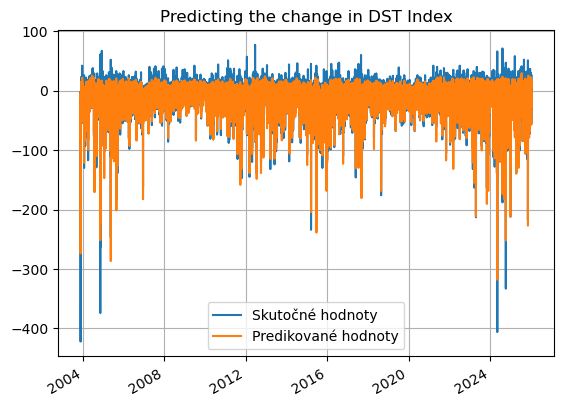

In [17]:
df = pd.DataFrame(data={"time": test['time1'][n_input:],"y_true": y_test_raw[n_input:] , "y_predict": y_pred.reshape(-1)})

df["residuals"] = df["y_true"] - df["y_predict"]
df["true_binary"] = (df["y_true"] <= -20).astype(int)
df["pred_binary"] = (df["y_predict"] <= CLASSIFICATION_THRESHOLD).astype(int)
df["y_persistence"] = df["y_true"].shift(shift)

plt.figure()
plt.title('Predicting the change in DST Index')
plt.plot(df['time'],df['y_true'], label='Skutočné hodnoty')
plt.plot(df['time'],df['y_predict'], label='Predikované hodnoty')
plt.legend()
plt.gcf().autofmt_xdate()
plt.grid(True)

In [18]:
TN, FP, FN, TP = cm.ravel()
ACC = (TP + TN) / (TP + TN + FP + FN)
MCC = matthews_corrcoef(y_test_binary, y_pred_binary_lstm)
print("ACC={}".format(ACC))
print("MCC={}".format(MCC))
df['y_persistance'] = df['y_true'].shift(shift)
df = df.dropna(subset=["y_true", "y_predict", "y_persistance"])

# Získame hodnoty zo stĺpcov
y_true = df["y_true"].values
y_pred_nn = df["y_predict"].values
y_pred_persistence = df["y_persistance"].values

# MAE a MSE pre neurónovú sieť
mae_nn = mean_absolute_error(y_true, y_pred_nn)
mse_nn = mean_squared_error(y_true, y_pred_nn)

# MAE a MSE pre perzistentný model
mae_persistence = mean_absolute_error(y_true, y_pred_persistence)
mse_persistence = mean_squared_error(y_true, y_pred_persistence)

# Porovnanie zlepšenia
improvement_mae = (mae_persistence - mae_nn) / mae_persistence * 100
improvement_mse = (mse_persistence - mse_nn) / mse_persistence * 100

# Výpis
print("Výkon NN:")
print(f"MAE: {mae_nn:.4f}, MSE: {mse_nn:.4f}")

print("Perzistentný model:")
print(f"MAE: {mae_persistence:.4f}, MSE: {mse_persistence:.4f}")

print("Zlepšenie oproti Persistence Modelu:")
print(f"MAE Improvement: {improvement_mae:.2f}%")
print(f"MSE Improvement: {improvement_mse:.2f}%")

ACC=0.9209580406616269
MCC=0.7612316603312412
Výkon NN:
MAE: 4.6673, MSE: 50.2431
Perzistentný model:
MAE: 5.2997, MSE: 68.9604
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 11.93%
MSE Improvement: 27.14%


In [19]:
###########################################
# 1. LSTM predikcie (aligned s n_input)
###########################################

y_train_lstm = model.predict(train_generator).reshape(-1)
y_val_lstm   = model.predict(val_generator).reshape(-1)
y_test_lstm  = model.predict(test_generator).reshape(-1)

emb_model = Model(inputs=model.input, outputs=model.layers[-2].output)
emb_train = emb_model.predict(train_generator)
emb_val   = emb_model.predict(val_generator)
emb_test  = emb_model.predict(test_generator)

# aligned y_true (TimeseriesGenerator posúva o n_input)
y_train_true = y_train[n_input:]
y_val_true   = y_val[n_input:]
y_test_true  = y_test[n_input:]

print("Shapes LSTM:")
print("train:", y_train_lstm.shape, y_train_true.shape)
print("val:  ", y_val_lstm.shape,   y_val_true.shape)
print("test: ", y_test_lstm.shape,  y_test_true.shape)


###########################################
# 2. Reziduá (chyba LSTM)
###########################################

error_train = y_train_true - y_train_lstm
error_val   = y_val_true   - y_val_lstm

# globálna smerodajná odchýlka chýb (použijeme ju na "nafúknutie" intervalu)
sigma_global = np.std(np.concatenate([error_train, error_val]))
print("Global sigma (LSTM errors, scaled):", sigma_global)


###########################################
# 3. Vstupy pre GP (tie isté indexy ako reziduá)
###########################################

# embeddingy z predposlednej vrstvy LSTM modelu
X_train_emb = emb_train
X_val_emb   = emb_val
X_test_emb  = emb_test

# Spojenie train+val pre GP
X_gp_train = np.concatenate([X_train_emb, X_val_emb])
y_gp_train = np.concatenate([error_train, error_val])

X_test_gp = X_test_emb

print("Shapes GP:")
print("X_gp_train:", X_gp_train.shape)
print("y_gp_train:", y_gp_train.shape)
print("X_test_gp:", X_test_gp.shape)


###########################################
# 4. Gaussian Process (subsampling kvôli RAM)
###########################################

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C

max_gp_points = 5000
if len(X_gp_train) > max_gp_points:
    rng = np.random.default_rng(42)
    idx = rng.choice(len(X_gp_train), size=max_gp_points, replace=False)
    X_gp_sub = X_gp_train[idx]
    y_gp_sub = y_gp_train[idx]
    print(f"Using subsample of {len(X_gp_sub)} points for GP.")
else:
    X_gp_sub = X_gp_train
    y_gp_sub = y_gp_train
    print("Using all points for GP.")

kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=20.0, length_scale_bounds=(1e-1, 1e3)) \
         + WhiteKernel(noise_level=1.0, noise_level_bounds=(1e-5, 1e1))

gp = GaussianProcessRegressor(
    kernel=kernel,
    alpha=1e-2,
    normalize_y=True,
    n_restarts_optimizer=2,
    random_state=42
)

print("Training GP on", len(X_gp_sub), "points...")
gp.fit(X_gp_sub, y_gp_sub)
print("GP fitted. Kernel:", gp.kernel_)


###########################################
# 5. Predikcia GP chyby + hybrid LSTM+GP
###########################################

y_gp_mean_err, y_gp_std_err = gp.predict(X_test_gp, return_std=True)

y_train_lstm = inverse_target(y_train_lstm.reshape(-1))
y_val_lstm   = inverse_target(y_val_lstm.reshape(-1))
y_test_lstm  = inverse_target(y_test_lstm.reshape(-1))

y_train_true = y_train_raw[n_input:]
y_val_true   = y_val_raw[n_input:]
y_test_true  = y_test_raw[n_input:]

y_gp_mean_err = y_gp_mean_err * target_scale
y_gp_std_err = y_gp_std_err * target_scale
sigma_global = sigma_global * target_scale

print("Global sigma (LSTM errors):", sigma_global)

y_hybrid_mean  = y_test_lstm + y_gp_mean_err

times_test = pd.to_datetime(test["time1"].iloc[n_input:])
sigma_series = pd.Series(y_gp_std_err, index=times_test)
sigma_smooth = sigma_series.rolling(window=6, center=True, min_periods=1).mean().values

sigma_effective = np.sqrt(sigma_smooth**2 + sigma_global**2)

#z = 1.96  # 95% interval
z = 3  # 99% interval
y_hybrid_lower = y_hybrid_mean - z * sigma_effective
y_hybrid_upper = y_hybrid_mean + z * sigma_effective

print("Hybrid prediction with smoothed, inflated interval ready.")

  1/896 ━━━━━━━━━━━━━━━━━━━━ 52s 59ms/step

  3/896 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step

  5/896 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 46/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 48/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 67/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 75/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 83/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 99/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

131/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

135/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

137/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

139/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

143/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

147/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

155/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

159/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

163/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

183/896 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

195/896 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

199/896 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

201/896 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

203/896 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

211/896 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

213/896 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

215/896 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

227/896 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

255/896 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

263/896 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

267/896 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

273/896 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

275/896 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

279/896 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

283/896 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step

287/896 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step

291/896 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step

293/896 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step

295/896 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step

299/896 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

303/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

313/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

315/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

319/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

327/896 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

331/896 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

338/896 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

340/896 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

342/896 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

344/896 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

346/896 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

348/896 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

350/896 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

352/896 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

354/896 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step

356/896 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step

363/896 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step

365/896 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step

367/896 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step

371/896 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step

375/896 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step

379/896 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step

386/896 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step

388/896 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step

390/896 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step

396/896 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step

398/896 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step

400/896 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step

402/896 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step

404/896 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step

407/896 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step

413/896 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step

420/896 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step

422/896 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step

424/896 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step

426/896 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step

428/896 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step

430/896 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step

432/896 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step

434/896 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step

436/896 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step

438/896 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step

440/896 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step

442/896 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step

444/896 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step

446/896 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step

448/896 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step

450/896 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step

456/896 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step

458/896 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step

460/896 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step

462/896 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step

464/896 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step

466/896 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step

468/896 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step

470/896 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step

472/896 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step

474/896 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step

476/896 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step

478/896 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step

480/896 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step

483/896 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step

487/896 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step

491/896 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step

495/896 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step

503/896 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step

507/896 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step

511/896 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step

513/896 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step

515/896 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step

523/896 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step

527/896 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step

531/896 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step

535/896 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step

539/896 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step

542/896 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step

544/896 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step

546/896 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step 

548/896 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step

550/896 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step

552/896 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step

554/896 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step

556/896 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step

559/896 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

563/896 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

567/896 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

569/896 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

571/896 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

583/896 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

587/896 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

589/896 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

591/896 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

593/896 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

596/896 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

598/896 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

600/896 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

602/896 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

604/896 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

606/896 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

608/896 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

610/896 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

612/896 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

614/896 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

616/896 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

618/896 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

620/896 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

622/896 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

624/896 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

626/896 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

628/896 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

630/896 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

632/896 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

634/896 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

636/896 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

643/896 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

647/896 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

651/896 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

655/896 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

659/896 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

661/896 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

672/896 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

674/896 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

676/896 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

678/896 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

680/896 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

682/896 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

692/896 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

694/896 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

696/896 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

698/896 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

700/896 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

702/896 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

704/896 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

706/896 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

708/896 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

710/896 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

712/896 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

714/896 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

716/896 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

718/896 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

720/896 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

722/896 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

724/896 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

728/896 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

730/896 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

732/896 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

734/896 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

736/896 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

738/896 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

740/896 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

742/896 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

744/896 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

746/896 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

748/896 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

750/896 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

752/896 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

754/896 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

756/896 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

759/896 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

763/896 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

775/896 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

779/896 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

783/896 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

793/896 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

798/896 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

800/896 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

802/896 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

804/896 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

806/896 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

808/896 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

810/896 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

812/896 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

814/896 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

816/896 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

818/896 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

826/896 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

828/896 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

830/896 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

832/896 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

834/896 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

836/896 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

838/896 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

840/896 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

842/896 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

844/896 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

846/896 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

848/896 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

863/896 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

868/896 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

870/896 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

872/896 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

874/896 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

876/896 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

878/896 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step 

  5/224 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

  8/224 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step

 10/224 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

 12/224 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

 14/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 18/224 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 30/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

166/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step 

393/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

626/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

634/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

638/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step


  1/896 ━━━━━━━━━━━━━━━━━━━━ 11:17 757ms/step

  3/896 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step   

  5/896 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 46/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 48/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 50/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 52/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 54/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 56/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 58/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 60/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 62/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 64/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 66/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 76/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 78/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 80/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 82/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 84/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 86/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 88/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 90/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 92/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

 94/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

 96/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

 99/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

131/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

136/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

138/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

140/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

142/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

144/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

146/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

148/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

150/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

155/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

159/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

163/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

183/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

186/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

188/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

190/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

192/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

194/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

196/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

198/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

200/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

202/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

204/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

206/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

208/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

210/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

212/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

214/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

216/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

218/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

220/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

222/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

227/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

255/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

263/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

268/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

270/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

272/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

274/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

276/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

278/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

280/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

282/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

284/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

287/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

291/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

293/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

295/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

298/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

300/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

302/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

304/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

306/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

308/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

313/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

315/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

319/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

327/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

331/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

339/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

343/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

347/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

351/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

355/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

363/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

365/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

367/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

371/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

375/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

379/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

386/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

388/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

390/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

392/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

394/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

396/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

398/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

400/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

402/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

404/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

406/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

408/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

410/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

413/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

419/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

423/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

426/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

428/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

430/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

432/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

434/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

436/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

438/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

440/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

443/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

447/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

450/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

452/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

454/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

456/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

458/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

463/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

475/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

477/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

479/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

483/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

487/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

491/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

495/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

503/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

507/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

511/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

513/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

515/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

524/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

527/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step 

529/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

531/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

535/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

539/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

541/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

543/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

545/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

547/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

550/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

552/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

554/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

556/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

558/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

560/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

562/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

564/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

566/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

568/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

570/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

572/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

574/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

576/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

578/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

580/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

582/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

584/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

586/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

588/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

590/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

592/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

594/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

596/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

598/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

600/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

602/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

604/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

606/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

608/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

610/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

612/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

614/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

616/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

618/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

620/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

627/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

630/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

632/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

634/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

636/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

638/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

640/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

642/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

644/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

646/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

648/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

650/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

652/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

654/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

656/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

658/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

660/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

662/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

664/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

666/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

668/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

670/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

672/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

674/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

676/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

678/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

680/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

682/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

684/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

686/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

688/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

690/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

695/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

697/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

699/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

703/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

705/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

707/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

711/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

713/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

715/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

719/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

723/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

728/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

730/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

732/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

734/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

736/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

738/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

740/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

742/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

744/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

746/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

748/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

750/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

752/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

754/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

756/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

758/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

760/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

762/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

775/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

779/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

783/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

787/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

792/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

799/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

802/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

804/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

806/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

808/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

810/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

812/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

814/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

816/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

826/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

828/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

830/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

832/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

834/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

836/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

839/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

850/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

860/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

862/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

867/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step 

  5/224 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

 12/759 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step 

406/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

456/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step


Shapes LSTM:
train: (229344,) (229344,)
val:   (57327,) (57327,)
test:  (194188,) (194188,)
Global sigma (LSTM errors, scaled): 0.38848326
Shapes GP:
X_gp_train: (286671, 12)
y_gp_train: (286671,)
X_test_gp: (194188, 12)
Using subsample of 5000 points for GP.
Training GP on 5000 points...


GP fitted. Kernel: 1.92**2 * RBF(length_scale=0.221) + WhiteKernel(noise_level=0.56)


Global sigma (LSTM errors): 8.548151
Hybrid prediction with smoothed, inflated interval ready.


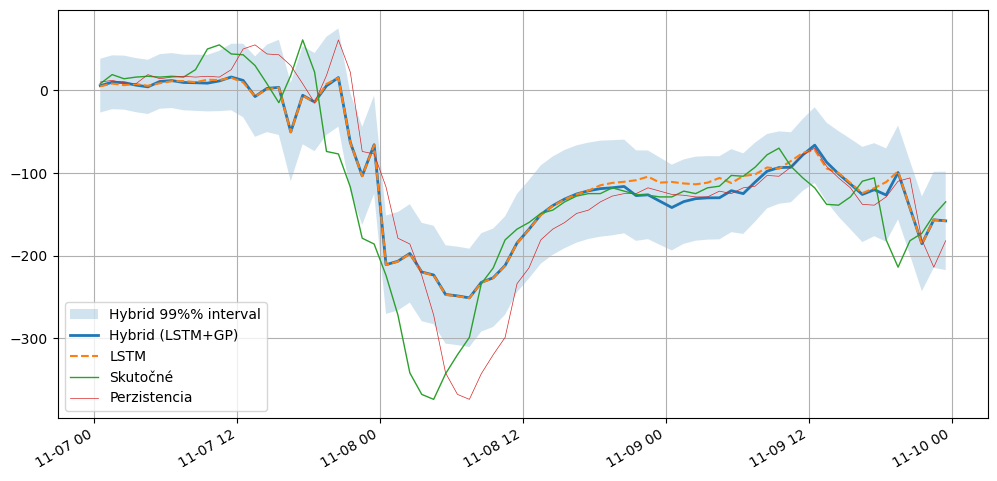

In [20]:
time_aligned = test["time1"][n_input:][shift:]

cols = [
    y_test_true[shift:],
    y_test_lstm[shift:],
    y_gp_mean_err[shift:],
    y_hybrid_mean[shift:],
    y_hybrid_lower[shift:],
    y_hybrid_upper[shift:],
    y_pred_persistence,
    time_aligned
]

L = min(len(x) for x in cols)

df = pd.DataFrame({
    "time": time_aligned[:L],
    "y_true": y_test_true[shift:][:L],
    "y_lstm": y_test_lstm[shift:][:L],
    "y_gp_error": y_gp_mean_err[shift:][:L],
    "y_hybrid": y_hybrid_mean[shift:][:L],
    "hybrid_lower": y_hybrid_lower[shift:][:L],
    "hybrid_upper": y_hybrid_upper[shift:][:L],
    "y_pred_persistence": y_pred_persistence[:L],
})




start_date = "2004-11-07"
end_date   = "2004-11-10"

df_range = df[(df["time"] >= start_date) & (df["time"] <= end_date)]

plt.figure(figsize=(12,6))
plt.fill_between(df_range["time"], df_range["hybrid_lower"], df_range["hybrid_upper"],
                 alpha=0.2, label="Hybrid 99%% interval")
plt.plot(df_range["time"], df_range["y_hybrid"], label="Hybrid (LSTM+GP)", linewidth=2)
plt.plot(df_range["time"], df_range["y_lstm"], label="LSTM", linestyle="--")
plt.plot(df_range["time"], df_range["y_true"], label="Skutočné", linewidth=1)
plt.plot(df_range["time"], df_range["y_pred_persistence"], label="Perzistencia", linewidth=0.5 )
plt.legend()
plt.grid(True)
plt.gcf().autofmt_xdate()
plt.show()
os.makedirs("datasets", exist_ok=True)
df.to_csv(os.path.join("datasets", f"prediction_comparison_{y_col}_LSTM_{n_input}H.csv"), index=False)

In [21]:
from sklearn.metrics import mean_absolute_error

# --- REGRESNÉ METRIKY ---
y_true_hybrid = df['y_true']
y_pred_hybrid = df['y_hybrid']

mse = mean_squared_error(y_true_hybrid, y_pred_hybrid)
mae = mean_absolute_error(y_true_hybrid, y_pred_hybrid)

# --- KLASIFIKAČNÉ METRIKY ---
CLASSIFICATION_THRESHOLD_PRED = CLASSIFICATION_THRESHOLD
y_true_binary = np.where(y_true_hybrid <= -20, 1, 0)
y_pred_binary = np.where(y_pred_hybrid <= CLASSIFICATION_THRESHOLD_PRED, 1, 0)

conf_matrix = confusion_matrix(y_true_binary, y_pred_binary)
mcc = matthews_corrcoef(y_true_binary, y_pred_binary)

# --- VÝSTUP ---
print("--- Regresné metriky (Hybridný model) ---")
print(f"MSE: {mse:.4f}")
print(f"MAE: {mae:.4f}")

print(f"\n--- Klasifikačné metriky (Prah: {CLASSIFICATION_THRESHOLD_PRED} nT) ---")
print(f"Matthews Correlation Coefficient (MCC): {mcc:.4f}")

print("\nKonfúzna matica (Confusion Matrix):")
print("          | Predikcia 0 | Predikcia 1")
print("---------------------------------")
print(f"Skutočná 0 | {conf_matrix[0, 0]:>11} | {conf_matrix[0, 1]:>11}")
print(f"Skutočná 1 | {conf_matrix[1, 0]:>11} | {conf_matrix[1, 1]:>11}")

print("\nClassification Report (Trieda 1 je Búrka):")
print(classification_report(y_true_binary, y_pred_binary, target_names=['Trieda 0 (Normálna)', 'Trieda 1 (Búrka)']))

--- Regresné metriky (Hybridný model) ---
MSE: 56.1623
MAE: 4.9477

--- Klasifikačné metriky (Prah: -20.3 nT) ---
Matthews Correlation Coefficient (MCC): 0.7366

Konfúzna matica (Confusion Matrix):
          | Predikcia 0 | Predikcia 1
---------------------------------
Skutočná 0 |      145913 |        6139
Skutočná 1 |       10680 |       31451

Classification Report (Trieda 1 je Búrka):
                     precision    recall  f1-score   support

Trieda 0 (Normálna)       0.93      0.96      0.95    152052
   Trieda 1 (Búrka)       0.84      0.75      0.79     42131

           accuracy                           0.91    194183
          macro avg       0.88      0.85      0.87    194183
       weighted avg       0.91      0.91      0.91    194183



In [22]:
import os, json
import numpy as np
import os
import pandas as pd
from datetime import datetime
from sklearn.metrics import (
    mean_absolute_error, mean_squared_error,
    accuracy_score, matthews_corrcoef, classification_report
)

OUT_CSV = "all_models_report.csv"

TRUE_CLASS_THRESHOLD = -20.0

PRED_CLASS_THRESHOLD = float(CLASSIFICATION_THRESHOLD)

meta = {
    "input_len_hours": float(globals().get("n_input", np.nan)),
    "forecast_horizon_hours": float(globals().get("shift", np.nan)),
    "target": str(globals().get("y_col", "DST")),
    "dataset": str(globals().get("dataset_name", "OMNI2_all")),
}

def _reg_metrics(y_true, y_pred):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    m = np.isfinite(y_true) & np.isfinite(y_pred)
    return (
        float(mean_absolute_error(y_true[m], y_pred[m])),
        float(mean_squared_error(y_true[m], y_pred[m]))
    )

def _cls_metrics_from_dst(y_true_dst, y_pred_dst, true_thr, pred_thr):
    y_true_dst = np.asarray(y_true_dst).reshape(-1)
    y_pred_dst = np.asarray(y_pred_dst).reshape(-1)
    m = np.isfinite(y_true_dst) & np.isfinite(y_pred_dst)

    y_true_bin = (y_true_dst[m] <= true_thr).astype(int)
    y_pred_bin = (y_pred_dst[m] <= pred_thr).astype(int)

    acc = float(accuracy_score(y_true_bin, y_pred_bin))
    mcc = float(matthews_corrcoef(y_true_bin, y_pred_bin))
    rep = classification_report(y_true_bin, y_pred_bin, digits=4, zero_division=0)
    return acc, mcc, rep

def _improvement(model_err, base_err):
    return float(100.0 * (base_err - model_err) / base_err) if base_err != 0 else np.nan

def _append_row(csv_path, row):
    row_df = pd.DataFrame([row])
    if os.path.exists(csv_path):
        old = pd.read_csv(csv_path)
        out = pd.concat([old, row_df], ignore_index=True)
    else:
        out = row_df
    out.to_csv(csv_path, index=False)
    return out

required_cols = {"y_true", "y_lstm", "y_hybrid", "y_pred_persistence"}
missing = required_cols - set(df.columns)
if missing:
    raise ValueError(f"df nemá potrebné stĺpce: {missing}. Aktuálne: {list(df.columns)}")

df_eval = df.dropna(subset=list(required_cols)).copy()

def log_one_model(nn_type, y_pred_col):
    y_true = df_eval["y_true"].to_numpy(dtype=float)
    y_pred = df_eval[y_pred_col].to_numpy(dtype=float)
    y_pers = df_eval["y_pred_persistence"].to_numpy(dtype=float)

    mae_model, mse_model = _reg_metrics(y_true, y_pred)
    mae_pers,  mse_pers  = _reg_metrics(y_true, y_pers)

    mae_imp = _improvement(mae_model, mae_pers)
    mse_imp = _improvement(mse_model, mse_pers)

    acc, mcc, rep_txt = _cls_metrics_from_dst(
        y_true, y_pred,
        true_thr=TRUE_CLASS_THRESHOLD,
        pred_thr=PRED_CLASS_THRESHOLD
    )

    row = {
        "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
        "nn_type": nn_type,  # LSTM vs LSTM+GP

        # meta
        **meta,

        # prahy
        "true_class_threshold_nt": float(TRUE_CLASS_THRESHOLD),
        "pred_class_threshold_nt": float(PRED_CLASS_THRESHOLD),

        # klasifikácia
        "ACC": float(acc),
        "MCC": float(mcc),
        "classification_report": json.dumps({"text": rep_txt}, ensure_ascii=False),

        # regresia
        "MAE_model": float(mae_model),
        "MSE_model": float(mse_model),
        "MAE_persistence": float(mae_pers),
        "MSE_persistence": float(mse_pers),
        "MAE_improvement_pct": float(mae_imp),
        "MSE_improvement_pct": float(mse_imp),
    }

    print(f"\n===== {nn_type} =====")
    print(f"ACC={row['ACC']}")
    print(f"MCC={row['MCC']}")
    print("Výkon NN:")
    print(f"MAE: {row['MAE_model']:.4f}, MSE: {row['MSE_model']:.4f}")
    print("Perzistentný model:")
    print(f"MAE: {row['MAE_persistence']:.4f}, MSE: {row['MSE_persistence']:.4f}")
    print("Zlepšenie oproti Persistence Modelu:")
    print(f"MAE Improvement: {row['MAE_improvement_pct']:.2f}%")
    print(f"MSE Improvement: {row['MSE_improvement_pct']:.2f}%")
    print("\nKlasifikačný report:")
    print(rep_txt)

    return row

rows = [
    log_one_model("LSTM", "y_lstm"),
    log_one_model("LSTM+GP", "y_hybrid"),
]

out_df = None
for r in rows:
    out_df = _append_row(OUT_CSV, r)

print(f"\nSaved/updated: {OUT_CSV}")
out_df.tail(10)


===== LSTM =====
ACC=0.9209560054175701
MCC=0.7612300569334599
Výkon NN:
MAE: 4.6673, MSE: 50.2431
Perzistentný model:
MAE: 5.2997, MSE: 68.9604
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 11.93%
MSE Improvement: 27.14%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9393    0.9612    0.9501    152052
           1     0.8471    0.7757    0.8098     42131

    accuracy                         0.9210    194183
   macro avg     0.8932    0.8684    0.8800    194183
weighted avg     0.9193    0.9210    0.9197    194183


===== LSTM+GP =====
ACC=0.9133858267716536
MCC=0.7366473843062352
Výkon NN:
MAE: 4.9477, MSE: 56.1623
Perzistentný model:
MAE: 5.2997, MSE: 68.9604
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 6.64%
MSE Improvement: 18.56%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9318    0.9596    0.9455    152052
           1     0.8367    0.7465    0.7890     42131

 

/tmp/ipykernel_760939/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
/tmp/ipykernel_760939/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),


,timestamp_utc,nn_type,input_len_hours,forecast_horizon_hours,target,dataset,true_class_threshold_nt,pred_class_threshold_nt,ACC,MCC,classification_report,MAE_model,MSE_model,MAE_persistence,MSE_persistence,MAE_improvement_pct,MSE_improvement_pct
18,2026-04-27T03:21:18,LSTM,24.0,2.0,DST+2,OMNI2_all,-20.0,-19.1,0.938895,0.815870,"{""text"": "" precision recall f...",3.653148,30.070266,4.211590,43.257647,13.259646,30.485663
19,2026-04-27T03:21:18,LSTM+GP,24.0,2.0,DST+2,OMNI2_all,-20.0,-19.1,0.934759,0.806200,"{""text"": "" precision recall f...",3.781247,32.007613,4.211590,43.257647,10.218059,26.007039
20,2026-04-27T03:44:01,LSTM,6.0,2.0,DST+2,OMNI2_all,-20.0,-20.0,0.937247,0.811525,"{""text"": "" precision recall f...",3.686464,30.729057,4.211529,43.255398,12.467320,28.959024
21,2026-04-27T03:44:01,LSTM+GP,6.0,2.0,DST+2,OMNI2_all,-20.0,-20.0,0.935842,0.807521,"{""text"": "" precision recall f...",3.834294,34.332140,4.211529,43.255398,8.957198,20.629235
22,2026-04-27T03:55:26,LSTM,6.0,2.0,DST+2,OMNI2_all,-20.0,-20.0,0.937247,0.811525,"{""text"": "" precision recall f...",3.686464,30.729057,4.211529,43.255398,12.467320,28.959024
23,2026-04-27T03:55:26,LSTM+GP,6.0,2.0,DST+2,OMNI2_all,-20.0,-20.0,0.935842,0.807521,"{""text"": "" precision recall f...",3.834294,34.332140,4.211529,43.255398,8.957198,20.629235
24,2026-04-27T04:46:16,LSTM,12.0,3.0,DST+3,OMNI2_all,-20.0,-20.3,0.920956,0.761230,"{""text"": "" precision recall f...",4.667329,50.243068,5.299650,68.960383,11.931386,27.142127
25,2026-04-27T04:46:16,LSTM+GP,12.0,3.0,DST+3,OMNI2_all,-20.0,-20.3,0.913386,0.736647,"{""text"": "" precision recall f...",4.947679,56.162330,5.299650,68.960383,6.641403,18.558559
26,2026-04-27T05:01:23,LSTM,12.0,3.0,DST+3,OMNI2_all,-20.0,-20.3,0.920956,0.761230,"{""text"": "" precision recall f...",4.667329,50.243068,5.299650,68.960383,11.931386,27.142127
27,2026-04-27T05:01:24,LSTM+GP,12.0,3.0,DST+3,OMNI2_all,-20.0,-20.3,0.913386,0.736647,"{""text"": "" precision recall f...",4.947679,56.162330,5.299650,68.960383,6.641403,18.558559
